In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Import Library

In [ ]:
!pip install --upgrade imblearn
!pip install joblib  # Instalasi pustaka Joblib
!pip install sastrawi  # Instalasi pustaka Sastrawi untuk stemming Bahasa Indonesia

In [ ]:
# Manipulasi Data dan Analisis
import pandas as pd  # Manipulasi dan analisis data tabular
import numpy as np  # Operasi numerik dan manipulasi array

# Visualisasi
import plotly.graph_objects as go  # Membuat plot interaktif
import matplotlib.pyplot as plt  # Membuat plot statis
import seaborn as sns  # Visualisasi data statistik

# Pemrosesan Teks
import nltk  # Pemrosesan dan analisis teks
from nltk.corpus import stopwords  # Daftar kata umum yang sering diabaikan
from nltk.tokenize import word_tokenize, RegexpTokenizer  # Tokenisasi kata
from nltk.stem import WordNetLemmatizer  # Lemmatisasi kata
nltk.download('stopwords')  # Mengunduh daftar stopwords
nltk.download('punkt')  # Mengunduh paket punkt untuk tokenisasi teks
nltk.download('wordnet')  # Mengunduh paket wordnet untuk lemmatisasi
import re  # Pencocokan pola dalam teks
import string  # Operasi pada tipe data string
from tqdm import tqdm  # Menampilkan progress bar

# Visualisasi Teks
from wordcloud import WordCloud  # Visualisasi awan kata

# Penanganan Data Tidak Seimbang
from imblearn.over_sampling import SMOTE  # Oversampling untuk menangani data tidak seimbang

# Machine Learning dan Deep Learning
from sklearn.feature_extraction.text import TfidfVectorizer  # Mengubah teks menjadi fitur numerik
from sklearn.ensemble import RandomForestClassifier  # Model klasifikasi Random Forest
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report  # Evaluasi model
from kerastuner.tuners import RandomSearch  # Pencarian hiperparameter
from keras.models import Sequential, save_model  # Membuat dan menyimpan model neural network
from keras.layers import LSTM, Dropout, Dense  # Lapisan neural network
from keras.layers import SimpleRNN  # Lapisan Simple Recurrent Neural Network (RNN)
from keras.optimizers import Adam  # Optimizer untuk model neural network
from sklearn.preprocessing import LabelEncoder  # Mengubah label menjadi nilai numerik

# Lainnya
from collections import Counter, defaultdict  # Struktur data tambahan
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory  # Stemming kata Bahasa Indonesia
import joblib  # Menyimpan dan memuat objek Python
import pickle  # Menyimpan dan memuat objek Python

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


#Load Dataset

In [ ]:
df = pd.read_excel("/content/drive/MyDrive/Dataset-SatriaData/dataset_penyisihan_bdc_2024.xlsx")
df.head()

,text,label
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik


#Data Understanding

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    5000 non-null   object
 1   label   5000 non-null   object
dtypes: object(2)
memory usage: 78.2+ KB


In [ ]:
df.shape

(5000, 2)

In [ ]:
df['label'].unique()

array(['Sumber Daya Alam', 'Politik', 'Demografi',
       'Pertahanan dan Keamanan', 'Ideologi', 'Ekonomi', 'Sosial Budaya',
       'Geografi'], dtype=object)

#Data Preparation

Checking and Handling Missing Value

In [ ]:
df.isna().sum()

text     0
label    0
dtype: int64

Checking and Handling Duplicated Value

In [ ]:
df.duplicated().sum()

381

In [ ]:
# Drop duplicates from the DataFrame
df = df.drop_duplicates(keep=False)

# Reset the index
df = df.reset_index(drop=True)

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.shape

(4487, 2)

In [ ]:
df_aft_dup = df.copy()

Convert in LowerCase

In [ ]:
# Daftar kata yang akan dihapus
target_words = ['anies', 'baswedan', 'prabowo', 'gibran', 'subianto','pranowo','mahfud','ganjar','rakabuming','prabowogibran','ganjarmahfud']
stop_words = set(stopwords.words('indonesian'))
def clean_teks(teks):
    """Membersihkan teks dari berbagai elemen yang tidak diinginkan."""
    # delete RT
    teks = re.sub(r'\bRT\b', '', teks)
    # change to lowercase
    teks = teks.lower()
    # delete @
    teks = re.sub(r'@\S+', '', teks)
    # delete URL
    teks = re.sub(r'http\S+|www\S+|https\S+', '', teks, flags=re.MULTILINE)
    # delete number
    teks = re.sub(r'\d+', '', teks)
    # delete non-ASCII
    teks = re.sub(r'[^\x00-\x7F]+', '', teks)
    # delete char or symbol
    teks = re.sub(r'[^\w\s]', '', teks)
    # delete _xd
    teks = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', teks)
    # delete stopwords and target words
    teks = ' '.join([kata for kata in teks.split() if kata not in stop_words and kata not in target_words])
    return teks

# Terapkan fungsi pembersihan ke kolom 'text'
df_aft_dup['clean_text'] = df_aft_dup['text'].apply(clean_teks)

In [ ]:
df_aft_dup.head()

,text,label,clean_text
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,emng bener sih pendukung yg goblok jg dg pendu...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,bersikap kritis kinerja dianggap engga sopan d...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,harap asn tni polri pegang sumpahnya pemilu


Separating words that are joined according to the Indonesian dictionary

In [ ]:
pip install langid

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 19.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langid: filename=langid-1.1.6-py3-none-any.whl size=1941172 sha256=a44bf358bf0d40e87ae44b36dceda3b8f1c590658e0e586ee4a888d1e7c0d76b
  Stored in directory: /root/.cache/pip/wheels/23/c8/c6/eed80894918490a175677414d40bd7c851413bbe03d4856c3c
Successfully built langid


In [ ]:
import requests

# Fungsi untuk memuat kamus dari URL
def load_kamus_from_url(url):
    response = requests.get(url)
    if response.status_code == 200:
        kamus = set(response.text.splitlines())
        return kamus
    else:
        print("Gagal memuat kamus. Status code:", response.status_code)
        return None

# URL kamus
url = 'https://raw.githubusercontent.com/romanouke/satria_data2/main/kumpulan_kata.txt'

# Memuat kamus dari URL
kamus = load_kamus_from_url(url)

if kamus:
    print("Kamus berhasil dimuat dengan", len(kamus), "kata.")
else:
    print("Gagal memuat kamus.")

Kamus berhasil dimuat dengan 112933 kata.


In [ ]:
import langid
def clean_non_indonesian_english_words(clean_text, kamus):
    words = clean_text.split()
    cleaned_words = []
    for word in words:
        lang, _ = langid.classify(word)
        if lang == 'id' or lang == 'en':  # Hanya menyertakan kata-kata dalam bahasa Indonesia atau Inggris
            if word.lower() in kamus:
                cleaned_words.append(word)
        else:  # Menyertakan kata-kata dalam bahasa lain
            cleaned_words.append(word)
    return ' '.join(cleaned_words)

# Terapkan fungsi pembersihan ke kolom
df_aft_dup['indonesian_english_word_only'] = df_aft_dup['clean_text'].apply(lambda x: clean_non_indonesian_english_words(x, kamus))


In [ ]:
# Fungsi untuk memisahkan kata-kata tergabung
def pemisah_kata(kata_tergabung, kamus):
    hasil = []
    kata_panjang = []  # List untuk menyimpan kata yang panjangnya lebih dari 10
    i = 0
    while i < len(kata_tergabung):
        for j in range(len(kata_tergabung), i, -1):
            potongan = kata_tergabung[i:j]
            if potongan in kamus:
                if len(potongan) > 10:
                    kata_panjang.append(potongan)
                hasil.append(potongan)
                i = j
                break
        else:
            # Jika potongan tidak ditemukan dalam kamus, asumsikan sebagai satu karakter saja
            hasil.append(kata_tergabung[i])
            i += 1
    return hasil, kata_panjang

# Memisahkan kata-kata tergabung dan menyimpan hasilnya dalam kolom baru
df_aft_dup['divide_word_2'] = df_aft_dup['indonesian_english_word_only'].apply(lambda x: ' '.join(pemisah_kata(x, kamus)[0]))

In [ ]:
df_aft_dup.head(10)

,text,label,clean_text,indonesian_english_word_only,divide_word_2
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,emng bener sih pendukung yg goblok jg dg pendu...,bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yg goblok dg ...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en g...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,harap asn tni polri pegang sumpahnya pemilu,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu
5,RT Duh jangan sampai Pak lurah denger nih ÃƒÂ°...,Politik,duh lurah denger nih acara hajatan rakyat pulu...,duh lurah denger nih acara hajatan rakyat pulu...,duh lurah denge r nih acara hajatan ...
6,Prabowo minta Kemenhan dan Tim Satgas Air Unha...,Pertahanan dan Keamanan,kemenhan tim satgas air unhan kaji bantuan air...,kemenhan tim satgas air unhan kaji bantuan air...,kemenhan tim satgas air un ha n kaji...
7,RT Anies: Ya Allah Sibukkanlah Orang Zalim Aga...,Politik,ya allah sibukkanlah orang zalim kejahatan ora...,ya allah orang zalim kejahatan orang zalim re ...,ya allah orang zalim kejahatan orang...
8,RT Abah @znOMP7ZMVU9dMuMNA/cIazC9q5+hgwVkTsQNd...,Politik,abah bapa bapa yg perhatian pendidikan anak an...,abah bapa bapa yg perhatian pendidikan anak an...,abah bapa bapa yg perhatian pendidik...
9,"RT Bawaslu dimaki ""JANCUK"" sama warga garaÃƒâ€...",Politik,bawaslu dimaki jancuk warga gara mencopot span...,bawaslu dimaki warga gara mencopot spanduk spa...,bawaslu dim aki warga gara mencopot ...


In [ ]:
def regex_tokenizer(text):
    tokenizer = RegexpTokenizer(r'\w+')
    return tokenizer.tokenize(text)

In [ ]:
df_aft_dup['divide_word_2'] = df_aft_dup['divide_word_2'].apply(lambda text:regex_tokenizer(text))

In [ ]:
df_aft_dup['clean_text'] = df_aft_dup['clean_text'].apply(lambda text:regex_tokenizer(text))

In [ ]:
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]
singkatan_kamus.head()

,slang,formal
0,woww,wow
1,aminn,amin
2,met,selamat
3,netaas,menetas
4,keberpa,keberapa


In [ ]:
df_aft_dup.head(2)

,text,label,clean_text,indonesian_english_word_only,divide_word_2
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,"[kunjungan, meresmikan, menyerahkan, proyek, b..."
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,"[tepuk, tangan, meriah, rektor, mewajibkan, ma..."


In [ ]:
for i in tqdm(range(len(df_aft_dup['divide_word_2']))):
    for j in range(len(df_aft_dup['divide_word_2'][i])):
        try:
            words = df_aft_dup['divide_word_2'][i][j]
            df_aft_dup['divide_word_2'][i][j] = list(singkatan_kamus['formal'])[(list(singkatan_kamus['slang']).index(df_aft_dup['divide_word_2'][i][j]))]
            ynormalized = df_aft_dup['divide_word_2'][i][j]
            print(df_aft_dup['divide_word_2'][i][j])
        except:
            pass
            print(df_aft_dup['divide_word_2'][i][j])

  0%|          | 0/4487 [00:00<?, ?it/s]

kunjungan
meresmikan
menyerahkan
proyek
bantuan
air
bersih
titik
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas

  0%|          | 2/4487 [00:00<12:45,  5.86it/s]


tepuk
tangan
meriah
rektor
mewajibkan
mata
kuliah
antikorupsi
memutus
mata
rantai
korupsi
amin
miskin
kan
koruptor
re
be
n
er
sih
pendukung
yang

  0%|          | 3/4487 [00:00<14:14,  5.25it/s]


goblok
dengan
pendukung
si
saja
ridwan
kamil
terbalik
mayoritas
pendidikan
menengah
pendidikan
rendah
yang
mil
ih
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang
gap


  0%|          | 4/4487 [00:00<17:40,  4.23it/s]

kritis
keras
standar
ganda
re
harap
asn
tni
polri
pegang
pemilu
duh
lurah
denge
r
nih
acara
hajatan
rakyat
puluhan
ribu
warga
kendal
presiden
kehadiran
magnet
puluhan
ribu
warga
menghadiri
hajatan
rakyat
antusiasme
warga
bukti
jawa
kandang

  0%|          | 8/4487 [00:01<08:43,  8.56it/s]


banteng
re
kemenhan
tim
satgas
air
un
ha
n
kaji
bantuan
air
sukabumi
dekade
ya
allah
orang
zalim
kejahatan
orang
zalim
re
oposisi
cerdas
abah
bapa
bapa
yang
perhatian
pendidikan
anak
anak
papua
pintar
pintar
gerakan
indonesia
mengajar
warga
papua
bapa
presiden
re
bawaslu
dim
aki
warga


  0%|          | 10/4487 [00:01<11:59,  6.22it/s]

gara
mencopot
spanduk
spanduk
capres
bawaslu
tim
sukses
asal
bukan
prabowo
re
isu
basi
terkait
fakta
mengganti
pancasila
sistem
khilafah
terkait
toleransi
penganut
agama
anies
blunder
data
rumah
ibadah
jakarta
mengkhianati
capres
kebenaran
fakta
di
sangkal
entah
niat
jahat
nafsu
kepentingan
pribadi
benar
seringkali
buta
mata
hati
buta


  0%|          | 11/4487 [00:02<17:00,  4.39it/s]

re
menekankan
persiapan
kebutuhan
dasar
alutsista
matra
darat
laut
udara
ganjar
sama
nang
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
re
al


  0%|          | 13/4487 [00:02<18:25,  4.05it/s]

lah
aga
calon
presiden
capres
nomor
urut
menghadapi
debat
debat
tema
pertahanan
keamanan
hubungan
internasional
geopolitik
pemilu
re
capres
rencana
bersinergi
perguruan


  0%|          | 15/4487 [00:02<13:09,  5.66it/s]

program
membawa
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
pendapatan
apbd
jumbo
sein
di
n
es
ia
mencapai
rp
kenyataan
yang
timbul
menghancurkan
pribadi
yang
penuh
kebencian
menimbulkan
dampak


  0%|          | 16/4487 [00:03<12:21,  6.03it/s]

emosional
pemilih
muncul
fenomena
pak
bowo
dukungan
tulus
mas
bawa
data
berdasar
data
bilang
data
mas
salah
bilang
salah
wajar
mas
data
enggak
urusan
singkat
re


  0%|          | 17/4487 [00:03<12:46,  5.83it/s]

pangeran
siah
aan
wai
t
wai
t
bukti
politik
identitas
terang
pilkada
memantik
perselisihan


  0%|          | 18/4487 [00:03<14:04,  5.29it/s]

kafir
berpikir
adil
sulit
re
siti
ati
koh
mengunjungi
kantor
sumatera
selatan
ati
koh
kejutan
penyandang
tuna
rungu
simpatisan
tuna
rungu
nasional
ati
koh
kejutan
kaos
warna
merah
bertuliskan
negara
indonesia
kejutan
ati
koh
dia
saja
a
r
kan
bahasa

  0%|          | 19/4487 [00:04<30:26,  2.45it/s]


isyarat
kebenaran
pasti
menang
nomor
pilihan
ku
re
calon
presiden


  0%|          | 20/4487 [00:04<26:56,  2.76it/s]

ri
regulasi
hukum
investasi
mudah
pihak
ganjar
mah
f
untuk
ada
rebo
un
ada
michael
gaya
bicara
keras
terkesan
emosional
berisi
kekerasan
militer
orang
sifat
n
ya
lurah
bu
des
er
ve
asnawi

  0%|          | 21/4487 [00:05<26:22,  2.82it/s]


videotron
pegang
papua
amien
rais
re
paslon
regulasi
hukum
investor
indonesia
bersahabat
sosok
ayah
penuh
kehangatan
sosok
ayah
yang
penuh
kehangatan
lihat
tayangan
video
lentur
banget
menggendong
anak
luwes
n
enggak
enggak
kaku
n
enggak
enggak
merasakan
gendongan
pelukan
pelukan
beliau
kekuatan
sejati
ketenangan
pelukan
ayah
anies


  1%|          | 23/4487 [00:05<27:42,  2.68it/s]

muhaimin
re
capres
n
enggak
enggak
nih
kolaborasi
perguruan
program


  1%|          | 24/4487 [00:06<26:54,  2.76it/s]

edukatif
oke
ganjar
mah
f
untuk
ada
rebo
un
ada
pro
saja
o
kawal
menang

  1%|          | 25/4487 [00:06<24:34,  3.03it/s]


putaran
pro
saja
o
setia
di
garis
rakyat
re
tempo
dot
sih
o
semangat
sama
n
ada
dukung
mu
hebat
coblos
ganjar
mah
f
untuk


  1%|          | 27/4487 [00:06<19:28,  3.82it/s]

dm
nang
debat
sesuai
selera
masyarakat
sumatera
barat
re
kamal
mik
o
abah
fery
pekanbaru
kampanye


  1%|          | 28/4487 [00:06<16:07,  4.61it/s]

akbar
re
ati
koh
beber
kan
solusi
harga
pangan
giliran
buruh
deklarasi
dukung
indonesia
kuat
indonesia
maju
melanjutkan


  1%|          | 30/4487 [00:07<12:19,  6.03it/s]

re
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo


  1%|          | 31/4487 [00:07<13:36,  5.46it/s]

un
ada
raja
dangdut
haji
irama
seni
film
terpilih
presiden
desak
ke


  1%|          | 32/4487 [00:07<16:10,  4.59it/s]

mayor
a
n
jakarta
pusat
senin
januari
re
capres
ruang
masyarakat
masukan
saran


  1%|          | 33/4487 [00:07<17:42,  4.19it/s]

evaluasi
pasal
karet
uu
ganjar
mah
f
untuk
ada
rebo
un
ada
musuh
utama


  1%|          | 34/4487 [00:08<17:20,  4.28it/s]

gen
saja
bertekad
basmi
praktik
penerimaan
tenaga
kerja
sektor
swasta
pemerintahan
dengan
penegakan
aturan
re


  1%|          | 35/4487 [00:08<15:47,  4.70it/s]

debat
nilai
kemenhan
melaksanakan
kebijakan
menteri
layak
paslon
pasangan
duet
capres
cawapres
motor
perubahan
kredit
kopra
sih
umkm


  1%|          | 36/4487 [00:08<15:50,  4.68it/s]

andalan
bisnis
lokal
sukses
teman
teman
saja
nya
ganjar
mah
f
untuk
ada
rebo
un
ada
anies
si
has
on
dialog
capres
gue
kadin
tv
on
en
e
gue
si
fas
tes
t
hi
enggak


  1%|          | 39/4487 [00:08<10:07,  7.32it/s]

he
si
t
tapi
kak
sama
among
anies
atk
adi
n
re
program
melancarkan
ekonomi
biru
internasional
kontan
re
kasihan
pendukung
masuk
penjara
enggak
re
tempo
dot
sih
o


  1%|          | 40/4487 [00:08<09:57,  7.44it/s]

ayo
permasalahan
indonesia
sama
nang
semua
kerja
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
wira
n
tapi
langsung
bergerak
cepat
dukungan
wira
n


  1%|          | 41/4487 [00:09<11:56,  6.21it/s]

toga
si
pol
dukung
re
alf
isya
h
ri
fa
ra
h
gua
be
n
era
n
sedih
banget
ya
orang
tuh
susah
menerima
fakta


  1%|          | 42/4487 [00:09<13:40,  5.42it/s]

kalo
war
zionis
t
kayak
kalo
beliau
kepil
ih
demokrasi
otoriter
menteri
progresif
yang
re
lautan
manusia
sambut
capres
nomor
urut
laksana
kan
giat
kampanye
bone
sulawesi
selatan
sulsel
rabu
bertemu
masyarakat
bone
lapangan
sepak
bola
cina
kampanye
kali
spesial
lantaran
eks
wakil
presiden
jus
untuk
f
kal
lah
saja
kak
lautan
manusia
antusias
menyapa
takjub
uang
mengobarkan
semangat
simak
berita
cari
berita
di
tv
on
e
no
kampanye
pilpres
politik
kami
kabar
kanan
dap
utus
kan
mau
memilih
tv
on
e
tv


  1%|          | 44/4487 [00:10<21:06,  3.51it/s]

pemilu
re
tv
on
en
e
gue
si
kali
capres
yang
peluk
orang
papua
mencium
tangan
papua
biar
rakyat
menilai
enggak
istirahat
des
er
ve
abahan
i
es
re
nia
lubis
_


  1%|          | 45/4487 [00:10<19:08,  3.87it/s]

anies
muhaimin
februari
silakan
nakes
desakan
i
es
re
abdul
ra
sih
hi
mm
kak
si


  1%|          | 46/4487 [00:10<16:31,  4.48it/s]

video
april
acara
mengadili
saja
ada
presiden
cita
cita
pikiran
yang
gagasan
pemikiran
negarawan
jarang
dengar
pemikiran
beliau
dine
ge
ri
re
prof
memperoleh
dukungan
luas
keberanian
menghadapi
dinamika
terduga
dulu
jok
o
gue
i
sekarang


  1%|          | 48/4487 [00:10<12:07,  6.11it/s]

ganjar
coblos
saja
kak
tanah
bob
hasan
dim
ili
ki
re
sih
n
ini
n
di
n
es
ia
bawaslu
terkesan
yang
membenarkan
kegiatan
paslon
kunjungan
cili
n
cing
yang
di
warna

  1%|          | 49/4487 [00:10<12:13,  6.05it/s]


i
uang
diang
gap
kunjungan
menhan
bawaslu
terserah
re
tipe
suka
bukti
sekedar
omong
kosong
belaka
re
bel
lah
madura
jawa
timur
terka
gum
kagum
ulama
madura
yang
bernama
kyai
fa
tt
ah

  1%|          | 52/4487 [00:11<10:12,  7.24it/s]


mengaku
kalah
menyimak
acara
yang
re
nelayan
butuh
tindakan
nyata
solusi
terbaik
ganjar
mah
f
untuk
ada
rebo
un
ada
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang
gap
kritis


  1%|          | 55/4487 [00:11<10:00,  7.38it/s]

keras
standar
ganda
re
tindakan
keberanian
n
ya
menjaga
keamanan
nasional
mendukung
ganjar
mah
f
untuk
dm
nang
debat
coblos
pecah
suasana
pasar
tos
berkunjung
warga
menyambut
meneriakkan
presiden
re


  1%|          | 56/4487 [00:11<10:40,  6.92it/s]

debat
semalam
bukaan
pertahanan
tapi
komisi
i
dpr
beliau
menolak
rapat
terbuka
bertahan
rapat
tertutup
capres
sok
tau
enggak
re
prestasi
n
ya
jakarta
gemilang
di

  1%|▏         | 57/4487 [00:12<11:38,  6.34it/s]


dukung
pemerintah
pusat
cenderung
di
hambat
jahat
n
enggak
enggak
kerja
re
gr
ego
r
ya
budiman
konsisten
bersuara
melawan
radikalisme
intoleransi
yang
pilih
diang
gap
tokoh
toleran
masyarakat
lintas
etnis
kalbar
kompak
dukung
pontianak
ribuan
masyarakat
lintas
etnis
sekali
mantan
barat
berkumpul
hotel
tulip
pontianak
rabu
perwakilan
tokoh
dayak
tionghoa
papua
jawa
batak
madura
selamat
kota
khatulistiwa
bangga
tokoh
adat
etnis
menyambut
ketua
dewan
pembina
dewan
adat
daerah
dad
kalbar
ketua
tim
pemenang
a
n
daerah
kalbar
laza
ru
si
masyarakat
kalbar
antusias
menyambut
kehadiran
tokoh
ketua
organisasi
etnis
bukti
sepakat
mendukung
tokoh
adat
berkumpul
mewakili
organisasi
kelompok
etnis
adat
kalimantan
barat
mendukung
memenangkan
kalbar
laza
ru
si
teriakan
kompak
ribuan
masyarakat
adat
kalbar
presiden
menang
menang
menang
teriak
kompak
tokoh
adat
dayak
masyarakat
lintas
etnis
kalbar
kompak
mendukung
diang
gap
tokoh
toleran
anggota
dpr
ri
gubernur
jateng
periode
harmonisasi
mengidolakan
m

  1%|▏         | 58/4487 [00:13<32:46,  2.25it/s]

toleransi
indonesia
terjaga
kalbar
contoh
daerah
toleran
kalbar
kota
kota
toleran
sein
di
n
es
ia
singkawang
re
koneksi
internet
kebutuhan
pokok
masyarakat
indonesia
menjalankan
aktivitas
paslon
menghadirkan

  1%|▏         | 59/4487 [00:13<28:34,  2.58it/s]


internet
kuat
cepat
murah
masyarakat
indonesia
sahabat
ganjar
re
t
gue
ui
ce
i
isu
palestina


  1%|▏         | 61/4487 [00:13<18:49,  3.92it/s]

keberpihakan
kepedulian
menegakkan
konstitusi
watak
re
acara
pendukung
ramai
kan
lokasi
kampanye
re
tv
on
en
e
gue
si
terpenting
bangsa
bersyukur
menata
masa
depan


  1%|▏         | 62/4487 [00:13<15:36,  4.73it/s]

bersama
prabowo
gibran
membutuhkan
penjaga
tni
al
kuat
mengibarkan
merah
putih
menegakkan
kedaulatan

  1%|▏         | 64/4487 [00:14<12:40,  5.82it/s]


negara
menhan
enggak
sebatas
wacana
mending
langkah
nyata
kayak
pasangan
ganjar
mah
f
untuk
ada
rebo
un
ada
duo
bangsa
prof
program
bikin


  1%|▏         | 66/4487 [00:14<09:55,  7.42it/s]

indonesia
yuk
pilih
bawa
solusi
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
menkominfo
budi
bela
data
pertahanan
bersifat
rahasia
saja
kau
capres
dia
saja
a
r
kan


  2%|▏         | 68/4487 [00:14<08:47,  8.37it/s]

rakyat
indonesia
goblok
tolol
janji
mengembalikan
tanah
bilang
re
bos
purwa
calon
presiden
ri
no
urut
enggak
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
saja
n
kak
ganjar
mah
f
untuk
ada
rebo

  2%|▏         | 71/4487 [00:14<08:03,  9.13it/s]


un
ada
permasalahan
pupuk
internet
jalan
berlubang
menata
masa
depan
bersama
prabowo
gibran
menghadiri
tantangan
kpk
pemberantasan
korupsi
indonesia
majalengka
majalengka
hebat
coblos
re
v
i
saja
a
ya
sih
h
capres
konstitusi
aturan
dasar
negara
dasar
keadilan
teguh
saja
n
kak
ganjar
mah


  2%|▏         | 72/4487 [00:15<12:12,  6.03it/s]

f
untuk
ada
rebo
un
ada
pilih
capres
keren
pilih
pemimpin
sulit
mengendalikan


  2%|▏         | 73/4487 [00:15<14:21,  5.13it/s]

emosi
menciptakan
ketidakpastian
kalangan
masyarakat
ganjar
mah
f
untuk
ada
rebo
un
ada
re
berprestasi
nasional
internasional
lihat


  2%|▏         | 74/4487 [00:15<15:16,  4.81it/s]

video
prestasi
korupsi
anggaran
kemenhan
singgung
orang
pandai
bicara
kerja
sindir
umat
islam
pilih
amin
umat
islam
pilih
amin
re
momen


  2%|▏         | 75/4487 [00:16<15:08,  4.85it/s]

capres
nomor
urut
besuk
relawan
n
ya
korban
penganiayaan
oknum
tni
boyolali
kondisi
kronologi
kejadian
relawan
aparat
keamanan
institusi
tni
menangani
kejadian
re
palestina
tindas
enggak
kak
kekuatan
militer
palestina
lemah
buku
biar
paham
vatikan
enggak
kak
kekuatan
militer
tapi
yang
berani
tindas
enggak
kak
analogi
kekuatan
militer
palestina
enggak
kak
lemah
enggak
kak


  2%|▏         | 76/4487 [00:16<19:02,  3.86it/s]

lemah
dilema
h
kan
sistem
kampret
pbb
suka
r
enggak
diam
genosida
pelanggaran
ham
berat
berani
den
afrika
selatan
re
lex
gue
untuk
_
santri
riang
gembira
jauh
i


  2%|▏         | 78/4487 [00:16<13:48,  5.32it/s]

dusta
emosional
hebat
sikat
kkn
media
asing
ya
o
r
kak
tulis
menang
demokrasi
indonesia
mati
re
demo
sih
ra
saja
yme
dia
kebersamaan
perbedaan
solid
mendukung
pilihan
terbaik
pilpres
ganjar
mah
f


  2%|▏         | 80/4487 [00:16<12:02,  6.10it/s]

untuk
ada
rebo
un
ada
ingat
video
yang
lihat
perhati
kan
tangan
orang
mah
saja
ya
yang
bikin
re
neng
gs
ya
i
fa
mas


  2%|▏         | 81/4487 [00:17<11:55,  6.16it/s]

bowo
wawasan
capres
prestasi
nyata
pilih
pemimpin
berdasarkan
hasil
kerja
saja
n
kali
ganjar
mah
f
untuk
ada
rebo
un
ada
pemikiran
terkait
program
makan
siang
gratis

  2%|▏         | 82/4487 [00:17<12:18,  5.96it/s]


subsidi
susu
upaya
politik
berpotensi
merugikan
keuangan
negara
mengorbankan
sektor
pendidikan
bantuan
sosial
re
janji
regulasi
hapus
diskriminasi
usia
syarat
lowongan
kerja
tempo
nasional
re


  2%|▏         | 85/4487 [00:17<09:02,  8.12it/s]

tempo
dot
sih
o
dukungan
rakyat
mengalir
lawan
rakyat
senang
menang
kreatif
bawa
isu
panggung
pilpres
legislasi
di
inisiasi

  2%|▏         | 86/4487 [00:17<09:25,  7.79it/s]


bertujuan
menciptakan
keadilan
gender
kerja
meningkatkan
kesejahteraan
ekonomi
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
pendukung
mengerumuni
pendukung
hadiah
cenderamata


  2%|▏         | 88/4487 [00:17<07:26,  9.84it/s]

mantan
gubernur
jakarta
pemilih
rasional
banding
kan
rekam
rekam
pesan
abah
acara
desak
yogyakarta
re
menyaksikan
perubahan
kepemimpinan
penuh
harapan
mengemban
tugas
di
jalan
kan

  2%|▏         | 91/4487 [00:18<08:33,  8.57it/s]


jok
o
wig
anjar
mah
f
untuk
ada
rebo
un
ada
kekuatan
membawa
perubahan
positif
mendukung
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
parah


  2%|▏         | 92/4487 [00:18<08:35,  8.52it/s]

enggak
n
n
golok
kekuatan
militer
indonesia
mentang
suka
r
enggak
demokrat
mendukung
di
garisan
penguasa
ya
cerita
pasangan
percaya
semangat
tunggal
wujud
kan
impian
ganjar
mah
f
untuk
ada
rebo
un
ada
vidio

  2%|▏         | 94/4487 [00:18<07:26,  9.84it/s]


catatan
pendukung
gur
be
r
nur
re
tolol
bilang
serang
personal
orang
paham
definisi
serang
personal
serang
personal
serang
fisik
anak
yang
personal
serang
kinerja
menhan
dungu
re
bersama
sama
dukung
mewujudkan

  2%|▏         | 96/4487 [00:18<10:53,  6.72it/s]


perubahan
warga
jabar
jabar
tetap
untuk
berbuat
baik
mil
ih
capres
no
wujud

  2%|▏         | 97/4487 [00:19<11:28,  6.38it/s]


kan
indonesia
hebat
enggak
moga
anjar
mah
f
untuk
ada
resolusi
indonesia
orang
penembak
relawan
polda
jatim
kepala


  2%|▏         | 98/4487 [00:19<12:12,  5.99it/s]

desa
re
tv
on
en
e
gue
si
menhan
sanjung
kepemimpinan
bupati
arief
laku
kan
kunjungan
kerja
blora

  2%|▏         | 99/4487 [00:19<14:29,  5.05it/s]


radar
kudus
radar
kudus
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a


  2%|▏         | 100/4487 [00:19<14:25,  5.07it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
klaim
singkong
panen
gr
e
en
pe
ace
kali
lokasi
re
gelora
sih
o


  2%|▏         | 101/4487 [00:20<15:06,  4.84it/s]

pernyataan
debat
capres
kecewa
narasi
paslon
capres
nomor
urut
mengaku
kecewa
narasi
pasangan
calon
presiden
nomor
urut
capres
nomor
urut
debat
capres
minggu
kecewa
kualitas
narasi
paslon
paslon
salah
keliru
data
pertahanan
mencari
poin
politik
negarawan
simak
video
temu
kan
informasi
terbaru
kanal
kompas
tv
pemilu
dik
om


  2%|▏         | 102/4487 [00:20<25:13,  2.90it/s]

pas
tv
re
kompas
tv
berjanji
membangun
jalan
produksi
menghubungkan
sentra
produksi
pertanian


  2%|▏         | 103/4487 [00:20<21:44,  3.36it/s]

pasar
jawa
barat
berperan
mendamaikan
rusia
ukraina
kunjungan
presiden
perang
pecah
damai
kan
kubu
seteru
yang
dugaan
manfaat
kan
agenda
negara
kepentingan

  2%|▏         | 104/4487 [00:21<22:21,  3.27it/s]


pribadi
lobi
tender
pengiriman
gandum
jagung
ukraina
re
bersama
jagad
mok


  2%|▏         | 105/4487 [00:21<18:58,  3.85it/s]

rasi
demokrasi
ala
aspirasi
rakyat
pendukung
bilang
wajar
kena
ham
militer
dengan
analogi
seperti
di
wajar
kan
militer


  2%|▏         | 106/4487 [00:21<17:51,  4.09it/s]

pelanggaran
ham
rakyat
sipil
re
indi
sih
hepar
ti
saja
kesetaraan
pendidikan
salah
re
kumparan
wow
kampanye
akbar
capres
pasangan
no
gor
parun


  2%|▏         | 108/4487 [00:21<13:37,  5.36it/s]

enggak
bogor
indonesia
des
er
ve
re
calon
wakil
presiden
nomor
urut
laju
deforestasi
penggundulan
hutan
indonesia
tertinggi
dunia
indonesia
sen
t
ris
indonesia
hijau

  2%|▏         | 109/4487 [00:22<17:58,  4.06it/s]


melanjutkan
anak
muda
indonesia
emas
melawan
jualan
politik
identitas
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan


  2%|▏         | 111/4487 [00:22<16:51,  4.33it/s]

biar
kan
berkuasa
re
menjadikan
abah
pemimpin
republik
cita
cita
love
abah
anies
muhaimin
re
mu
hi
ku
r
fakta
alami
lapangan
kenalan
kenalan
temu
item
a
n
teman
kampus
orang
pilihan
capres
mendukung
seputar
tim
memahami
gagasan
visi
misi
me
saja
untuk
dengan
e
sah
sah
hak
warga
negara
memilih
alasan
indonesia
butuh
gagasan
hebat
gagasan
detail
gagasan
bertumbuh


  3%|▎         | 113/4487 [00:23<20:28,  3.56it/s]

seiring
perkembangan
zaman
butuh
mengangkat
pemimpin
cerdas
wawasan
luas
its
umur
indonesia
negeri
muda
mengerti
meritokrasi
re


  3%|▎         | 114/4487 [00:23<18:44,  3.89it/s]

aktif
politik
blusukan
pelosok
wilayah
memajukan
dunia
pendidikan
negeri
tercinta
ada
papua
barat
mengirimkan
guru

  3%|▎         | 115/4487 [00:23<18:34,  3.92it/s]


guru
pelosok
pelosok
papua
orang
sinyal
listrik
capres
re
kumparan
dukungan
pemimpin
memprioritaskan
kepentingan
rakyat
indonesia
sen
t


  3%|▎         | 116/4487 [00:24<20:40,  3.52it/s]

ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sikap
bentuk
cinta


  3%|▎         | 117/4487 [00:24<18:34,  3.92it/s]

bangsa
indonesia
hebat
lulus
kerja
capres
nomor
urut
menanggapi
politikus
ri
e
ke
diah
hebat
coblos
ganjar
mah
f
untuk
dm


  3%|▎         | 118/4487 [00:24<20:45,  3.51it/s]

nang
debat
hadir
i
konser
indonesia
maju
tulungagung
gan
ada
hi
optimis
menang
putaran
indonesia
kuat


  3%|▎         | 119/4487 [00:25<20:22,  3.57it/s]

indonesia
maju
melanjutkan
re
saking
program
n
ya
oke
mong
ering
beliau
isu
yang


  3%|▎         | 120/4487 [00:25<20:15,  3.59it/s]

beliau
enggak
terlibat
di
dalam
n
ya
validitas
karena
stop
are
nas
t
ya
re
hilirisasi
debat
helai
rabut
hitam
re
ha
ha
be
dek

  3%|▎         | 122/4487 [00:25<14:48,  4.91it/s]


januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
fakta
komunikasi
peringatan
usut
tuntas
rakyat

  3%|▎         | 123/4487 [00:25<14:04,  5.17it/s]


netralitas
tni
kawal
kemenangan
kemenangan
ganjar
mah
f
untuk
dm
nang
re
masyaallah
semoga
kelancaran
kesehatan
i
si
ti
ku
oma


  3%|▎         | 124/4487 [00:25<14:22,  5.06it/s]

h
perjuangan
pilpres
aa
mi
i
n
ya
paslon
serius
menghadapi
pilpres
adu
gagasan
belanja
medan
anak
medan
merantau
jakarta
pulang
rumah
dipan
enggak
gi
l
orang
tua
kerja

  3%|▎         | 125/4487 [00:26<14:06,  5.16it/s]


nyata
prabowo
gibran
menang
satu
putaran
re
al
maghrib
i
si
yang
gaza
lemah
oh
iya
sih
normalisasi
israel
semalam
mengambil
keuntungan
tensi
capres
semoga
rakyat
cerdas
memahami
makna
debat
berdua
serang
lembaga


  3%|▎         | 127/4487 [00:26<11:34,  6.28it/s]

negara
pribadi
tendensius
personal
re
wa
go
on
er
_
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi


  3%|▎         | 129/4487 [00:26<11:05,  6.55it/s]

serangan
biar
kan
berkuasa
re
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
gue
i
el
go
si
saja


  3%|▎         | 130/4487 [00:26<11:00,  6.60it/s]

menyoroti
fokus
umkm
fondasi
kuat
pertumbuhan
ekonomi
berkelanjutan
berhak
terbaik
ganjar
presiden
rakyat
sama
nang
debat
coblos
calon
presiden
capres
nomor
urut
berkampanye
karawang
jawa
barat
jumat
hebat
lulus
kerja
momen
jenguk
relawan


  3%|▎         | 132/4487 [00:26<09:22,  7.74it/s]

korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
abah
titik
abah
gen
gen
spot
abahan
i
es
re
he
l
lot
oh
o
pek
o


  3%|▎         | 134/4487 [00:27<09:17,  7.80it/s]

o
kak
menyenangkan
pemuda
solusi
program
pasangan
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
peta
komoditas
dim
ili
ki
jendela
kekayaan
alam


  3%|▎         | 135/4487 [00:27<10:07,  7.16it/s]

dim
ili
ki
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
tanggap
i
makan
malam
berdua
indonesia


  3%|▎         | 136/4487 [00:27<11:48,  6.14it/s]

kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
ayo
tanam
kan
benih
perubahan
pilih


  3%|▎         | 137/4487 [00:27<13:30,  5.37it/s]

ajak
muda
menciptakan
indonesia
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
mendengar
calon
presiden
nomor
urut
berjanji
mencari
solusi
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda


  3%|▎         | 138/4487 [00:28<16:35,  4.37it/s]

indonesia
emas
umum
kan
dukung
anies
muhaimin
janji
tirta
amin
menang
pilpres
re
oposisi


  3%|▎         | 140/4487 [00:28<15:10,  4.78it/s]

cerdas
rencana
evaluasi
uu
mari
wujud
kan
kebebasan
berpendapat
ganjar
mah
f
untuk
ada
rebo
un
ada
masyarakat
percaya

  3%|▎         | 141/4487 [00:28<13:00,  5.57it/s]


elektabilitas
meningkat
pilpres
putaran
pilihan
terbaik
masyarakat
muak
kelakuan
masyarakat
dik
andang
kebersamaan
kekuatan
sukses


  3%|▎         | 143/4487 [00:28<09:44,  7.43it/s]

capres
cawapres
pilpres
capres
no
sekedar
bicara
tindakan
kontrak
terbuka
ipb
bantu
kedaulatan
pangan
ganjar
mah

  3%|▎         | 144/4487 [00:29<11:39,  6.21it/s]


f
untuk
ada
rebo
un
ada
menang
putaran
mari
kelola
anugerah
tuhan
rasyid
kali
suku
mari
bersatu
aceh
papua
sang
pemersatu
indonesia
sejahtera
lawan


  3%|▎         | 145/4487 [00:29<12:12,  5.93it/s]

penindas
demokrasi
lawan
penindas
demokrasi
re
salah
ji
si
besaran
di
dukung
saja
kau
ji


  3%|▎         | 146/4487 [00:29<15:55,  4.54it/s]

si
yang
degradasi
penurunan
saja
kak
t
utara
banjir
rob
seperti
pantura
kalau
untuk
kapasitas
si
saja
wajar
ji
si
salah
benci
kalo
lu
begini
lu
kalangan
menengah
kak
rna
memang
fakta
kebijakan
menguntungkan
kalangan
menengah
orang
kayak
itu
enggak
ada
kak
rna
enggak
menguntungkan
saja
re
ya
o
on


  3%|▎         | 147/4487 [00:29<16:58,  4.26it/s]

je
ong
h
sih
n
dunia
geger
program
desakan
i
es
berita
dunia
negara
negara
dunia
kebin
guna
n
pemenang
pilpres
menunjuk
a
n


  3%|▎         | 148/4487 [00:30<16:17,  4.44it/s]

capres
berkelas
terbaik
re
garda
samudra
program
komitmen
jaga
keamanan
laut
bangun
kekuatan
militer
laut
dulu
jok
o
gue

  3%|▎         | 150/4487 [00:30<14:19,  5.04it/s]


i
sekarang
ganjar
coblos
nyata
karangan
bunga
relawan
kemarin
korban
penganiayaan
oknum
aparat
re
sahabat
saber
pengancam
di
tangkap
bareskrim
polri
mengkonfirmasi
mengamankan
warga
yang
pengancaman
penembakan
capres
ya
di
tangkap
karo
penmas
divisi
humas

  3%|▎         | 151/4487 [00:30<16:39,  4.34it/s]


polri
brigjen
pol
wisnu
andiko
pasangan
capres
cawapres
membawa
harapan
petani
meningkatkan
kuota
pupuk
semoga
hasil


  3%|▎         | 152/4487 [00:31<17:18,  4.18it/s]

panen
melimpah
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
cawapres
ri
no
pelindung
petani
tembakau
mari
sukses
kan
impian
produksi
tembakau
berkualitas
ganjar
mah
f
untuk
ada


  3%|▎         | 153/4487 [00:31<20:16,  3.56it/s]

rebo
un
ada
nih
kodam
moga
kelanjutan
boyolali
kemarin
pawai
mbok
ya
knalpot
lokasi
sensitif
deh
enggak
musim
pawai
mengerahkan
massa
suka
r

  3%|▎         | 154/4487 [00:31<20:58,  3.44it/s]


adu
gagasan
seperti
desak
re
hi
po
ha
n
pendukung
membawa
bendera
berebutan


  3%|▎         | 155/4487 [00:31<17:58,  4.02it/s]

bersalaman
pendukung
membawa
bendera
partai
berebut
kaos
re
paslon
warga
negara
indonesia
berhak
transparansi
data
menteri
aktif
kinerja


  3%|▎         | 157/4487 [00:32<13:29,  5.35it/s]

data
tom
lembong
kabinet
kegagalan
kinerja
kualitas
momok
kinerja
kepemerintahan
re
calon
presiden
ri
no
urut
memahami
urgensi
menjaga
konstitusi


  4%|▎         | 158/4487 [00:32<14:43,  4.90it/s]

aturan
dasar
negara
panduan
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
pilihan
petani


  4%|▎         | 159/4487 [00:32<15:51,  4.55it/s]

kunci
kesuksesan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
desak
nakes


  4%|▎         | 160/4487 [00:32<13:18,  5.42it/s]

siang
si
tun
ting
kehamilan
jakarta
kamis
januari
re
senang
banget
lihat
saja
n
kb
er
sama
ganjar
mah


  4%|▎         | 161/4487 [00:33<15:48,  4.56it/s]

f
untuk
ada
tagar
membawa
energi
positif
yuk
lanjut
i
n
dukungan
rekam
jejak
menculik


  4%|▎         | 162/4487 [00:33<15:34,  4.63it/s]

aktivis
pilih
dukung
suka
watak
dukung
dukung
watak
re
puan
buka
peluang
merapat

  4%|▎         | 163/4487 [00:33<14:14,  5.06it/s]


anies
cak
pilpres
putaran
re
kemenangan
putaran
membawa
harapan
jelas
sama
dukungan
tulus
perayaan
ulang
perjuangan
diad
akan
sekolah
partai
hadir
kehadiran
mengesankan
dim
ana
mega
wa
ti
soe
kak
r


  4%|▎         | 165/4487 [00:33<15:42,  4.59it/s]

no
putri
sosok
kunci
partai
acara
momen
menandai
tonggak
sejarah
partai
di
warna
i
semangat
perjuangan
komitmen
perjuangan
kebenaran
pasti
menang
nomor
pilihan
ku
re
layak
presiden
ekonom
jebolan
as
hasil
survei
re
nyata


  4%|▎         | 168/4487 [00:34<11:07,  6.47it/s]

indonesia
tiada
henti
kelompok
relawan
gus
jatim
deklarasi
dukung
kak
h
o
fifa
h
bergabung
relawan
gus
tebal
kemenangan
jatim
boleh
kok
pindah
mil
ih
tulus
n
ya
paling
sejuk
re
kak
hoi
ri
lan
war
_


  4%|▍         | 170/4487 [00:34<09:42,  7.41it/s]

dukungan
wirausaha
lokal
dorongan
positif
ekonomi
daerah
petani
paslon
capres
dukung
kuota
pupuk
di
tingkat
kan
pertanian
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
eyang
perihal


  4%|▍         | 171/4487 [00:34<10:34,  6.80it/s]

bahan
baku
farmasi
import
mahal
alkes
tertinggal
dengan
negara
silakan
banding
kan
gagasan
bobot
eyang
anies
muhaimin
re
no
i
en
saja
o
ya


  4%|▍         | 172/4487 [00:34<11:31,  6.24it/s]

yang
indonesia
enggak ada
yang
berani
elit
malam
anis
stop
normalisasi
elit
berbuat
enak
re
we
ada
n
es
ada
ude
memimpin
visi
pusat
daerah


  4%|▍         | 173/4487 [00:34<12:24,  5.80it/s]

melindungi
ancaman
dulu
jok
o
gue
i
sekarang
ganjar
coblos
keren
habis
mas
prof
be
n
er
be
n
er
n
ge
set

  4%|▍         | 174/4487 [00:35<12:29,  5.75it/s]


standar
dunia
ekonomi
hijau
merakyat
berbuat
rakyat
ganjar
presiden
rakyat
sama
nang
debat
coblos
re
ayu
wulan
dari
peserta
debat
pemenang
pilpres
yang
rival
menilai
isi
yang
mengedukasi
masyarakat
yang
kecewa
yang
berharap


  4%|▍         | 176/4487 [00:35<11:31,  6.24it/s]

debat
dini
kamu
ati
pendidikan
politik
ml
h
di
suguh
i
tontonan
menjatuhkan
re
gabung
relawan
banten
tegak
lurus
dukung
tribun
jabar
re
negara
kuap
a
dukungan
merata
pemimpin
memimpin
indonesia
presiden
teman
alam
ganjar
kampanye
pilpres
sederhana
paslon
no
capres
cawapres
rencana
merampingkan
regulasi
hukum
investor
indonesia
ganjar
mah

  4%|▍         | 178/4487 [00:35<10:32,  6.81it/s]


f
untuk
ada
rebo
un
ada
sama
o
sih
ke
ada
muhaimin
notes
problem
data
a
he
his
partner
got
be
cau
se
he


  4%|▍         | 179/4487 [00:35<12:09,  5.91it/s]

was
a
binder
re
wa
pamungkas
belajar
ekonomi
paslon
si
si
salah
gelar
n
ya
studi
bidang
ekonomi


  4%|▍         | 181/4487 [00:36<12:26,  5.77it/s]

he
said
re
dukungan
tulus
warga
jabar
modal
jabar
tetap
untuk
berbuat
baik
n
e


  4%|▍         | 182/4487 [00:36<11:39,  6.16it/s]

gue
si
pelaku
yang
mengancam
tangkap
kasih
re
program
capres
perjuangan
bantuan
sarana
produksi
mengalir
sudut


  4%|▍         | 183/4487 [00:36<12:45,  5.63it/s]

tanah
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
menhan
berseloroh
pemimpin
muda
acara
sumur
air
bor
bandung
bandung
indonesia


  4%|▍         | 184/4487 [00:36<12:25,  5.77it/s]

kuat
indonesia
maju
melanjutkan
re
tanggal
februari
bikin
gebrakan
ya
ganjar
mah
f
untuk
ada


  4%|▍         | 185/4487 [00:37<13:07,  5.46it/s]

rebo
un
ada
alhamdulillah
ya
ra
keluarga
nu
dukungan
pasangan
amin
muhaimin
isk
andar
amin


  4%|▍         | 187/4487 [00:37<12:57,  5.53it/s]

anies
muhaimin
re
yang
kayak
begini
nyi
n
enggak
gung
tanah
pintar
goblok
sih
re
berlian
idris
mata
pemilih


  4%|▍         | 188/4487 [00:37<13:28,  5.32it/s]

pemula
sosok
politik
mentor
inspirasi
apa
rsia
sih
keberanian
bermimpi
merakyat
ganjar
presiden
rakyat
sama
nang
debat
coblos
bagaimana
gentar
koruptor
saja
gerbong


  4%|▍         | 189/4487 [00:37<12:14,  5.86it/s]

mu
minyak
goreng
impor
gula
proyek
mangkrak
mendukung
pemimpin
keyakinan
mengatasi
disparitas
ekonomi
menciptakan
kesetaraan
keceriaan
kehebohan
malam
malam
heboh
warga
kedatangan

  4%|▍         | 191/4487 [00:37<10:49,  6.61it/s]


beliau
jalan
jalan
mali
obor
o
re
pasangan
capres
cawapres
ri
nomor
program
bagus
ekonomi
tumbuh


  4%|▍         | 192/4487 [00:38<11:50,  6.05it/s]

terus
menerus
ganjar
mah
f
untuk
ada
rebo
un
ada
keyakinan
konstitusi
aturan
dasar
negara
fondasi
negara
di
jaga
bersama
sama

  4%|▍         | 193/4487 [00:38<13:23,  5.35it/s]


saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
wakil
presiden
memiliki
gaya
berkampanye
siaran
langsung
media
sosial
tiktok
capres
nomor
urut
cawapres
nomor
urut
tiktok
berhasil
menembus
ribu
penonton
perjalanan
lokasi
jawa
timur
simak
video
cari
berita
di
tv
on
e
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e


  4%|▍         | 195/4487 [00:39<20:40,  3.46it/s]

gue
si
orang
latar
program
n
ya
makan
siang
gratis
program
gagasan
brilian
pemimpin
kemampuan
re
merasakan
beban
hidup
berat


  4%|▍         | 196/4487 [00:39<18:19,  3.90it/s]

mahal
kebebasan
berpendapat
ketidakadilan
dim
ana
mana
fenomena
karir
bisnis
terhambat
perubahan
nomor
urut
amin
re
i
sih
haris
lupa
suara
bersama
sama
kekuatan


  4%|▍         | 197/4487 [00:39<16:32,  4.32it/s]

memenangkan
capres
pemilu
ganjar
mah
f
untuk
ada
rebo
un
ada
gorontalo
pecah
senin
januari
menemui
relawan
simpatisan
gorontalo
tokoh
gorontalo
sambut


  4%|▍         | 198/4487 [00:39<14:23,  4.97it/s]

meriah
re
pengin
enggak
hia
nya
tan
jalan
ninja
loncat
pujangga
politik
re
rais
a
t
jok


  4%|▍         | 199/4487 [00:40<15:37,  4.58it/s]

ro
ada
n
ta
si
ti
l
l
he
palestina
di
tindas
lemah
indonesia


  4%|▍         | 200/4487 [00:40<18:23,  3.89it/s]

kesulitan
di
usir
aceh
sistem
hukum
indonesia
sin
cere
l
ya
lo
bela
re
juta
orang
indonesia
ter
koneksi
internet
mewujudkan
program
internet
gratis
cepat
merata
nama
program
n
ya
gratis
internet
cepat
merata
membangun
ekosistem
digital
berlandaskan
kemampuan
pemuda
indonesia
berlandaskan
pembacaan
ganjar
presiden
nomor
pilihan
ku
ganjar
sat


  4%|▍         | 201/4487 [00:40<25:10,  2.84it/s]

set
mah
f
untuk
ada
tas
tes
re
kehidupan
pendidikan
diskriminasi
pendidikan
pendidikan
pesantren
samas
sama

  5%|▍         | 202/4487 [00:41<22:32,  3.17it/s]


kesempatan
samas
sama
anak
indonesia
dana
pesantren
amin
re
dap
i
tni
h
rakyat
mengalami
tolong
negara
pengacara
negara
takut
didis
krim
inas
i
amin
saja
des
er
ve
videotron
re
nya
a
o
o
o
l


  5%|▍         | 203/4487 [00:41<22:27,  3.18it/s]

l
l
l
paslon
solusi
pintar
pertanian
indonesia
kuota
pupuk
hasil
top
ganjar
mah
f


  5%|▍         | 204/4487 [00:41<20:15,  3.52it/s]

untuk
ada
rebo
un
ada
malam
bareng
puluhan
ribu
warga
semarang
senin
gus
ali
gondrong
berlokasi
lapangan
rengga
bandungan
kabupaten

  5%|▍         | 206/4487 [00:42<16:08,  4.42it/s]


semarang
suasana
penuh
suka
cita
warga
menyambut
bersama
sama
re
trauma
polarisasi
pilkada
jakarta
imbas
politik
identitas
mewarnai
pilkada
jakarta
prabowo
gibran
istimewa
bersama
indonesia
maju


  5%|▍         | 208/4487 [00:42<12:00,  5.94it/s]

alun
alun
tangerang
lautan
manusia
putaran
indonesia
kuat
indonesia
maju
melanjutkan
ji
si
janji
bangun
stadion
standar
fifa
sumatera
barat
pakai
rumput
kau
re
tv
on
en
e
gue
si
kalo
lu


  5%|▍         | 209/4487 [00:42<12:04,  5.91it/s]

kasihan
i
n
di
serang
yang
dik
asih
ani
kritik
akurat
lahan
ribu
ha
di
saat
bangsa
di
hadap
i
ketimpangan
lahan
yang
dahsyat
hak
alam
re
kepemimpinan
rakyat
daya
alam
pilar
utama
kesejahteraan
terbukti
ganjar


  5%|▍         | 210/4487 [00:42<11:00,  6.48it/s]

presiden
rakyat
sama
nang
debat
coblos
alasan
pilih
ji
si
ketimbang
kampanye
akbar
karya
anak
bangsa
tenaga
asing
pemimpin
yang
pro
rakyat
bangga
hasil
kerja
anak
bangsa
abah
indonesia
enggak
butuh
pemimpin
yang
cengeng


  5%|▍         | 211/4487 [00:42<11:23,  6.26it/s]

re
relawan
antusias
sambut
pekanbaru
he
n
n
ya
menjemput
menjemput
harapan
rakyat
re
kumparan
lihat
kader
n
ya
mantan
napi
koruptor
enggak
korupsi
korupsi
kejahatan
pilih
capres
komitmen
anti
korupsi
re


  5%|▍         | 213/4487 [00:42<10:00,  7.12it/s]

t
sakinah mawadah rahman
ada
ki
di
pilih
presiden
level
prajurit
kesejahteraan
n
ya
suruh
mempertahankan
nkri
menjaga
keamanan
bingung
kebutuhan
dasar
n
enggak
enggak
terpenuhi
re
abu
saja
hari
i

  5%|▍         | 214/4487 [00:43<11:04,  6.43it/s]


f
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang


  5%|▍         | 217/4487 [00:43<09:24,  7.57it/s]

gap
kritis
keras
standar
ganda
re
dukungan
kegiatan
seni
budaya
mencerminkan
perhatian
identitas
nasional
tiada
henti
mengejutkan
pengamat
militer
menang
pilpres
re
demo
sih
ra
saja
yme
dia
memenangkan
hati


  5%|▍         | 218/4487 [00:43<09:20,  7.62it/s]

kebijakan
kuliah
gratis
keberanian
dukungan
pendidikan
patut
dia
cung
i
jempol
ganjar
mah
f
untuk
dm
nang
rangkuman
komentar
terbaik
netizen
iya
sih
anggaran
proyek
triliunan
gagal
salah
dana
kampanye
duit
prof


  5%|▍         | 220/4487 [00:43<09:00,  7.90it/s]

ayo
bantu
nelayan
menghadapi
kredit
macet
hati
penuh
kasih
sayang
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
harapan
be
n
er
be
n
er
solusi
bangsa
ganjar
mah
f
untuk


  5%|▍         | 223/4487 [00:44<07:25,  9.57it/s]

ada
rebo
un
ada
program
paslon
no
prof
bikin
ekonomi
maju
pertumbuhan
ganjar
mah
f
untuk
ada
rebo
un
ada
keterampilan
memahami
ketahanan
energi
pangan
menciptakan
fondasi
kuat
kemajuan
berkelanjutan
kepemimpinan
menghasilkan
perubahan
positif
sektor
pendidikan
transportasi
lingkungan
politik
aji
mumpung
johan
o
beber
kan
politik
aji
mumpung
bobrok
nyak
em
en
ha
n
bobrok

  5%|▌         | 227/4487 [00:44<07:16,  9.77it/s]


nyak
em
en
ha
n
re
kabar
pembubaran
relawan
menciptakan
kebingungan
kalangan
pendukung
masyarakat
klarifikasi
era
banjir
dikit
langsung
siaga
damkar
atur
pintu
air
malam
realita
jam
langsung
surut
banjir
di
em
gubernur
n
ya
untuk
untuk
re
jenderal
napoleon
bona
par
te
menghadiri
acara
konsolidasi
purnawirawan
polri
dukung
re
hapus
kan

  5%|▌         | 233/4487 [00:44<04:50, 14.67it/s]


hutang
petani
nelayan
menang
pilpres
membebaskan
petani
nelayan
indonesia
jerat
aan
utang
kepedulian
program
konkret
menyejahterakan
petani
re
menarik
pertemuan
mantan
menteri
lingkungan
hidup
kehutanan
salim
diskusi
upaya
pelestarian
lingkungan
pembangunan
berkelanjutan
memiliki
nilai
be
mengapresiasi
tni
n
polri
menjaga
pertahanan
n
keamanan
indonesia
pelik
perbaikan
kualitas
hidup
ku
tni
n
polri
langsung
djojohadikusumo
calon
gua
berhasil
pilih
ragu
gua
berhasil
biaya
n
enggak
enggak
pakai
apbd
anti
banget
tuh
indonesia
milik
pribumi
pas
gua
bagaimana
timnas
indonesia
re
ladang
tebu
cilacap
perkebunan
kelapa
banyuwangi
petani
pelindung
kepentingan


  5%|▌         | 238/4487 [00:45<03:52, 18.26it/s]

nah
h
enggak
data
senaya
n
lawan
anggota
dpr
ri
enggak
rapat
terbuka
bahas
anggaran
karena
rahasia
negara
inspirator
sejati
lembaga
pendidikan
mesin
perubahan
sosial
membuktikan
visi
matang
mengubah
dulu
jok
o
gue
i
sekarang
ganjar
coblos
suka
negara
mengatur
pikiran
orang
negara
mengatur
perasaan
orang
negara
atur
perbuatan
negara
bertindak
organisasi
yang
pelanggaran
hukum
sepakat
re
pulau
saksi
gagasan
adil
makmur
langsung
warga
tokoh
pulau
bicara
lantang
presiden
re
pilpres
dek
pilpres
pilpres
putaran
kemenangan


  5%|▌         | 242/4487 [00:45<04:10, 16.98it/s]

mahasiswa
universitas
indonesia
ui
menyebar
brosur
stiker
bergambar
pengguna
jalan
jakarta
pusat
kamis
menuntut
penyelesaian
ham
penculikan
aktivis
re
qi
a
n
saja
ya
saja
pemilu
panggung
demokrasi
mari
peran
warga
negara
cerdas
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
desak
sukses
di
gelar
dadakan
re
oposisi
cerdas
calon
presiden
nomor
urut
menjanjikan
regulasi
menghapus
diskriminasi
usia
persyaratan
lowongan
kerja
menurut
n
ya
diskriminasi
usia
persyaratan
pekerjaan
aneh
tempoh
e
ada
lin
er
re
tempo
dot
sih
o


  5%|▌         | 244/4487 [00:45<04:07, 17.14it/s]

timnas
amin
data
tanah
ulang
ucapan
re
sih
n
ini
n
di
n
es
ia
sudah
sama
sama
menolak
lupa
mei
saja
h
ra
kebenaran
pasti
menang
jam
saja
kak
ekuador
jam
kak
h
o
fifa
h
unhas
re
mantan
ketua
komnas
ham
apresiasi
polri
buka
rekrutmen
penyandang
disabilitas
mantan
ketua
komisi
nasional
hak
asasi
manusia
ham
muhammad
mengapresiasi
langkah
kapolri
jenderal
polisi
listyo
sigit
sama
sih
merekrut
penyandang
disabilitas
anggota
polri
menilai
kebijakan
kapolri
kesempatan
penyandang
disabilitas
langkah
sisi
ham
wujud
komitmen
polri
hak
asasi
manusia
informasi
polri
membuka
proses
rekrutmen
penyandang
disabilitas
jalur
sekolah
inspektur
polisi
sumber
sarjana
bintara
polri
ta
sesuai
kriteria
apresiasi
kapolri
kebijakan
langkah
afirmatif
teman
teman
penyandang
disabilitas
kebaikan
sifat
menempati
sesuai
karakter
mantan
ketua


  5%|▌         | 246/4487 [00:46<09:28,  7.46it/s]

komnas
ham
kamis
re
menjelang
malam
terima
kasih
apatis
memutuskan
mengikuti
pembahasan
pilpres
kali
merelakan
periode
pemilih
pendukung
penasaran
kepemimpinan
pilpres
bentuk
dukungan
membuka
kesempatan
beliau
memimpin
negeri
ramai
pembahasan
pelanggaran
etik
maka
mencari
informasi
mendeklarasikan
terserah
pilih
merenung
tergerak
mencari
kupi
kir
adil
be
rs
ta
tem
en
mencari
pasangan
calon
golput
pilpres
kali
mencari
menimbang
nim
bang
condong
memperhitungkan
kupi
kir
pilpres
kali
pertarungan
cocok
kupu
tus
kan
mendukung
pemilih
kupu
tus
kan
membicarakan
sosial
media
men
jelek
jelek
kan
salah
paslon
pendukung
garis
keras
orang
terganggu
menentang
pelanggaran
etik
tergerak
mencari
condong
salah
paslon
salah
paslon
meresahkan
terindikasi
kuasa
kuasa
negara
presiden
pejabat
pejabat
gatal
berkomentar
peduli
pilpres
kali
prilaku
ini
ret
i
kak
salah
paslon
berkuasa
terima
kasih
mencari
informasi
informasi
berkaitan
pemilu
berani
bersuara
menyuarakan
pilihan
ku
pelanggaran
pelanggaran
penduku

  6%|▌         | 250/4487 [00:46<06:53, 10.25it/s]

kapolri
jenderal
listyo
sigit
menghadiri
perayaan
ibadah
natal
lihat
lengkap
video
dim
ana
pesan
pesan
kapolri
terkait
persatuan
kesatuan
keberagaman
terkait
kelompok
kaukus
muda
beringin
partai
golkar
membelot
mendukung
pasangan
pilpres
re
nya
r
kosu
n
bilang
politik
identitas
intoleransi
pilkada
enggak
terima
orang
pendukung
kekerasan
agama
setia
sekeliling
n
ya
yang
koalisi
cita
diri
kan
negara
agama
alat
wujud
kan
re
kurawa
tanggapan
petani
muda
mohon
diserap
bersama
indonesia
maju
kampanye
tangerang
massa
swadaya
pengerahan
re
sih
n
ini
n
di
n
es
ia
mari
bersama
sama
membangun
jakarta
inklusif
progresif
hebat
lulus
kerja
sumpah
masih
janji
kirai
n
janji
lupa


  6%|▌         | 255/4487 [00:46<05:00, 14.07it/s]

janji
di
pilih
ya
pensiunan
kuda
ah
penasaran
jabatan
presiden
re
petani
paslon
capres
tingkat
kan
kuota
pupuk
pertanian
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
hebat
bikin
beda
aksi
selamat
kan
pmi
gue
i
l
f
rida
hukuman
mati
malaysia
tindakan
dekade
ketua
partai
ge
ri
n
ada
ra
sumatera
utara
membutuhkan
anak
muda
berprestasi
pemimpin
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
acara
desak
samarinda
kalimantan
timur
beli
lahan
ribu
hektar
lahan
ya
ramai
yang


  6%|▌         | 264/4487 [00:47<03:25, 20.59it/s]

acara
desak
kamis
januari
re
keberhasilan
memimpin
masyarakat
jabar
percaya
pemimpin
jabar
tetap
pak
bowo
dari
jabar
lihat
debat
malam
sama
nangka
n
debat
ya
beliau
nyata
sih
re
kepemimpinan
menciptakan
suasana
partisipatif
pengambilan
keputusan
kota
singgung
apbd
triliun
penjilat
pantat
bersorak
gembira
joget
giliran
singgung
anggaran
menhan
triliun
gigit
pantat
pasukan
pantat
sakit
re
ro
mi
t
sut
dukungan
penuh
berkomitmen
kesempatan
pendidikan
semoga
langkah
inspirasi
pemimpin
mandat
ganjar
mah
f
untuk
ada
golput
pilih
capres
no
hebat
guru
n
gaji
juta
andi
balas
pernyataan
menyerang
personal
re
kompas
tv


  6%|▌         | 270/4487 [00:47<03:40, 19.09it/s]

gua
dukung
gua
kritik
yang
bikin
bangunan
kayak
tim
halte
yang
desain
b
ru
n
ya
enggak
ramah
musim
ye
terpilih
tolong
adakan
acara
desak
presiden
indonesia
bergantian
apresiasi
polri
gerak
cepat
pelaku
ancaman
penembakan
re
kisah
tragis
salah
pilih
istana
kalang
kabut
kali
acara
gor
satria
tinggal
kan
peserta
acara
si
lesa
i
tahan
petugas
pintu
gerbang
massa
mak
sa
asal
bukan
prabowo
re
jabar
merespons
positif
komitmen
jangka
kemajuan
daerah
jabar
tetap
untuk
berbuat
baik
hebat
pasangan
duet
capres
cawapres
buka
pintu
sukses
kredit
kopra
sih
umkm
semangat
pelaku
bisnis
ganjar
mah
f
untuk
ada
rebo
un
ada


  6%|▌         | 273/4487 [00:47<03:47, 18.56it/s]

diam
n
ya
dukungan
konkret
kemerdekaan
palestina
tiada
henti
nilai
allah
lihat
kenal
allah
memang
manusia
allah
nilai
paslon
narsistik
nilai
biar
rakyat
menilai
re
program
mendukung
petani
kredit
macet
di
putih
kan
di
hapus
petani
utang
negara
al
hamdu
l
lilah
kesejahteraan
petani
program
bermanfaat
rem
bu
ganjar
re
chandra
laras
pilpres
kali
memang
seru
sih
melek
bahas
gagasan
di
usung
pilpres
kali
banget
gue
kau
kak
presiden
condong
paslon
pelanggaran
suka
r
enggak
saja
di
jegal
buset
des
er
ve
re
lil
rw
o
kak
hormat
bripka
heru
kejadian
kejadian
berkomitmen
mewujudkan
program
desa
faskes
nakes
desa
memiliki
fasilitas
kesehatan
di
jangkau
mudah
warga
re
ganjar

  6%|▌         | 280/4487 [00:48<03:55, 17.83it/s]


pranowo
pemenang
survei
mengalahkan
capres
yang
indonesia
butuh
perubahan
melanjutkan
anies
muhaimin
re
tsunami
terbendung
gelombang
migrasi
selesai
diam
menggelegar
kotak
suara
februari
berjuang
berjibaku
bertahun
tahun
dia
baik
a
n
harkat
martabat
terinjak
bersuara
relawan
yang
migrasi
alim
ulama
beserta
santri
menghargai
menghormati
pilihan
bijak
ulama
mengikuti
suara
rakyat
berlabuh
dermaga
kemenangan
persatuan
nasional
re
bantah
klaim
saja
kak
data
anggaran
alutsista
rahasia
negara
tempo
nasional
re
tempo
dot
sih
o
mengungkit
alasan
koalisi
perubahan
mengusung
menyebut
mengalami
perlakuan
re
jatuh
kan
sanksi
menteri
netral
pemilu
tempo
bisnis
re
tempo
dot
sih
o


  6%|▋         | 287/4487 [00:48<03:35, 19.46it/s]

pasangan
capres
cawapres
prof
fokus
bikin
regulasi
hukum
enggak
bikin
investor
mik
i
r
kali
masuk
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
tanah
yang
di
singgung
sian
i
es
semalam
mengusung
sian
i
es
saja
ada
gubernur
lillahi
re
sih
ha
ve
si
saja
kesempatan
perbedaan
pilih
capres
indonesia
bermartabat
ganjar
mah
f
untuk
ada
rebo
un
ada
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
pencerahan
keumatan
kejayaan
menyokong
pasangan
pilpres
alhamdulillah
baru
orang
tua
papua
masya
allah
enggak
di
sangka
papua
peletakan
batu
langsung
darah
syuhada
palestina
nya
mbah
pengetahuan
re
ide
bagus
ekonomi
tumbuh
ganjar
mah
f
untuk
ada
rebo
un
ada


  7%|▋         | 296/4487 [00:48<03:06, 22.46it/s]

menhan
mengunjungi
jawa
timur
selasa
rangka
meninjau
pembangunan
kapal
merah
putih
modernisasi
kiri
kiri
rem
re
fur
bis
hm
en
t
kiri
berjalan
persen
re
war
yang
negeri
paparan
data
fakta
re
iya
saja
sek
ela
si
pengamat
saja
lum
lulus
menteri
pertahanan
mudah
kerja
pilih
mual
em
ajak
kader
apa
kpa
target
kan
kemenangan
aceh
raihan
dukungan
pemilu
sahabat
mual
em
aceh
mual
em
muzakir
mana
f
n
enggak
kak
menampak
kampanye
sejarah
ya
tau
gabung
kak
h
o
fifa
h
tersandera
suap
dana
hibah
re
gelora
sih
o
sehari
debat
capres
bertema
pertahanan
negara
kompas
memuat
advertorial
kementerian
pertahanan
halaman
impresi
keberhasilan
menhan
yang
debat
kampanye
anggaran
kehumasan
kementerian
etika
re
menohok
salah
memancing
emosi
bilang
pemimpin
murni
arti
sopan
pemimpin
bera


  7%|▋         | 299/4487 [00:48<02:57, 23.63it/s]

masyarakat
pesisir
cilacap
banyuwangi
seru
seruan
dukung
abah
presiden
favorit
testimoni
pendeta
magetan
ponorogo
mendukung
mas
re
mantap
bu
kak
h
o
fifa
h
mantap
dukung
menang
putaran
pulau
saksi
gagasan
adil
makmur
langsung
warga
tokoh
pulau
bicara
lantang
presiden
re
a
saja
v
ya
e
ungkit
penilaian
banding
kan
debat
pilpres
re
tv
on
en
e
gue
si
pemilu
elektabilitas
mencapai
pertanda
putaran
rakyat
senang
menang
re


  7%|▋         | 305/4487 [00:49<03:14, 21.51it/s]

no
via
nisa
putri
serangan
thd
pilpres
kali
hebat
pilpres
tapi
kuat
kandidat
kuat
lolos
putaran
jawaban
n
ya
logistik
yang
kuat
infrastruktur
yang
memadai
kekuatan
kekuasaan
sukses
kemenangan
ayo
lupa
pilih
wujud
kan
perubahan
ganjar
mah
f
untuk
ada
rebo
un
ada
milenial
calon
pemimpin
indonesia
membawa
kemajuan
pilpres
re
mel
i
si
sah
a
ya
komitmen
normalisasi
komisi
indonesia
kampanye
n
ya
be
n
er
be
n
er
top
re
we
ada
f
r
saja
lihat
begini
berhasil
rakyat
suka
janji
manis
sentuhan
personal
enggak
anti
ide
publik
eksekusi
re
ki
sih
kaya
n
kondisi
wanita
bacot
debat
tutup
akun
medsos


  7%|▋         | 311/4487 [00:49<03:19, 20.90it/s]

stres
berat
re
posting
a
n
paslon
amin
ideal
memimpin
indonesia
paslon
terpenuhi
kepemimpinan
islam
amanah
fa
t
h
on
ah
tablig
si
hi
ada
di
ku
rekam
jejak
saja
kak
t
dengan
secuil
kejujuran
penuh
amanah
re
berlapis
pilpres
kali
pilpres
terlicik
karena
yang
berkuasa
yang
waspada
per
ketat
pengawalan
berlapis
protokoler
pengamanan
kepala
negara
re
pakai
fahri
kekayaan
akibat
politik
dinasti
alasan
mendukung
memilih
presiden
dil
anju
tak
a
n
figur
pelajaran
bebas
berkomentar
keji
begini
jegal
orang
bang
bang
novel
yang
yang
isu
bang
novel
tersingkir
n
enggak
enggak
penyidikan
isu
murahan
begini
re
yudi
harahap
program
kuliah
gratis
anak
tentara
polisi
anak
polisi
pangkat
rendah
mas
paham
kehidupan
bintara
tamtama
polisi
tentara
mas
prof
berkomitmen
penghargaan
prajurit
bhayangkara
beasiswa
kuliah
bintara
tamtama
polisi
tni
prajurit
bhayangkara
tiang
utama
pertahanan
keamanan
negara
indonesia


  7%|▋         | 314/4487 [00:50<06:06, 11.39it/s]

mengukir
jasa
menjaga
kedaulatan
keutuhan
tanah
air
keluarga
prajurit
bhayangkara
terkendala
melanjutkan
pendidikan
akibat
keterbatasan
finansial
mas
anak
polisi
pangkat
rendah
merasakan
langsung
kesulitan
beliau
ikhlas
menggadaikan
sertifikat
rumah
mewujudkan
cita
cita
menempuh
pendidikan
universitas
negeri
mas
prof
pemimpin
peka
realitas
berkomitmen
meringankan
beban
keluarga
prajurit
bhayangkara
tekad
bulat
meluncurkan
program
beasiswa
khusus
kalangan
bintara
tamtama
institusi
kepolisian
tni
berhasil
perguruan
program
bertujuan
membuka
pintu
kesempatan
potensi
generasi
penerus
bangsa
berkembang
terkendala
keterbatasan
biaya
anak
keluarga
prajurit
bhayangkara
terhalang
cita
cita
n
ya
meraih
pendidikan
setinggi
tinggi
n
ya
keluarga
yang
kip
kuliah
program
keluarga
miskin
sarjana
pemutihan
hutang
nelayan
petani
re
gun
ro
mli
berterima
kasih
beliau
patriot
buka
jalan
indonesia
kuat
indonesia
maju
melanjutkan
re
capres
no
kebiasaan
capres
berfokus
hiburan
program
kerja
nyata
ganjar
mah
f

  7%|▋         | 320/4487 [00:50<04:20, 16.02it/s]

solar
nelayan
rem
bu
ganjar
wajah
pemimpin
lekang
butuh
beliau
ganjar
mah
f
untuk
ada
rebo
un
ada
tanggal
februari
deh
tps
coblos
muhaimin
nomor
nomor
re
pakai
sejahtera
keterbukaan
transparansi
prinsip
utama
rakyat
tata
kelola
pemerintahan
ganjar
mah
f
untuk
ada
rebo
un
ada
kemarin
kaltim
anugerah
i
gelar
kehormatan
tetua
adat
dayak
kenyah
anggap
orang
dayak
dayak
kalbar
lembaga
dewan
adat
dayak
dad
terang
mendukung
presiden
wakil
presiden
kemarin
bolak
video
pangkal
i
sama
jilah
gelar
suku
dayak
re
ekonom
analisis
dunia
survey
abah
membawa
ekonomi
meroket
target
realistis
sentimen
negeri
positif
memiliki
yang
kepercayaan
kepastian
perubahan
yang
re
serba
terantuk
terjebak
akibat
akal
sehat
tunduk
akal
sesat
presiden
kampanye
merujuk
uu
pemilu
ruu
demokrat
urusan
menerapkan
pt
pelaksanaan
pemilihan
presiden
pemilihan
anggota
dpr
berjalan
serentak
partai
koalisi
pemerintah
dim
oto
ri
dalam
n
ya
pkb
nas
dem
main
akrobat
memaksakan
hasil
pemilu
ulang
pemilu
perolehan
kursi
dpr
di
jadi
ka

  7%|▋         | 323/4487 [00:50<07:06,  9.76it/s]


ri
n
ada
ra
kapan
kubu
dim
oto
ri
protes
ketentuan
presiden
berhak
berkampanye
kubu
dim
oto
ri
nas
dem
pkb
ketentuan
undang
undang
uu
pemilu
paksa
kan
sama
oh
sama
ada
mengirim
pesan
dukungan
terdengar
protes
perkara
gerung
kawan
kawan
sisi
pergi
maka
uu
pemilu
di
sahkan
inkonstitusional
fakta
sejarah
re
ra
sih
hl
a
n
nas
hi
dik
target
kan
menang
putaran
sumbar
indonesia


  7%|▋         | 325/4487 [00:50<06:51, 10.12it/s]

kuat
indonesia
maju
melanjutkan
re
a
saja
ha
reak
iba
yang
faham
hukum
agraria
indonesia
n
ge
rt
i
sepakat
dengan
karena
yang
prinsip
dasar
filosofi
hukum
tanah
indonesia
tanah
milik
rakyat
indonesia
anugerah
tuhan
maha
esa
yang
dik
uas
ai
negara
filosofi
yang
sulit
di
faham
i
rezim
ampu
un
ketua
kasihan
penjilat
tukang
majikan
mumet
n
das
e
tanggap
i
data
pertahanan
terbuka
re
indonesia
negara
keberagaman
budaya
alam
memukau
potensi
ekonomi
panggung
kolaborasi
inklusi
kemajuan
pandangan


  7%|▋         | 330/4487 [00:51<05:09, 13.44it/s]

n
ya
hangat
inklusif
menyaksikan
indonesia
ladang
subur
kesempatan
pertumbuhan
solidaritas
ganjar
presiden
ganjar
sat
set
mah
f
untuk
ada
tas
tes
re
videotron
mm
as
sederhana
sih
diang
gap
mengganggu
mengganggu
elektabilitas
calon
re
v
oi
ce
o
f
pkb
gelar
deklarasi
ajak
elemen
masyarakat
bersatu
dukung
suara
merdeka
jakarta
suara
merdeka
jakarta
indonesia
kuat
indonesia
maju
melanjutkan
re
kinerja
pantas
si
si
dia
pres
ia
sih
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi


  7%|▋         | 334/4487 [00:51<05:06, 13.54it/s]

serangan
biar
kan
berkuasa
re
adegan
mahasiswa
itb
protes
kerjasama
rektorat
pinjol
bayar
kuliah
jaga
kewibawaan
institusi
menjual
ilmu
dil
anju
tak
a
n
re
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
mas
anak
haram
konstitusi
kalau
saja
ada
kalo
mah
mil
ih
pak
bowo


  8%|▊         | 338/4487 [00:51<04:52, 14.17it/s]

masyarakat
kabupaten
bogor
prinsip
pasangan
amin
muhaimin
pembangunan
berkeadilan
merata
di
b
bogor
barat
bogor
timur
pemerataan
akses
mudah
terjangkau
terima
kasih
sambutan
semoga
niat
tujuan
hasil
amin
re
harapan
rakyat
pundak
sama
nang
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
si
lan
kga
n
saja
a
r
mah
f
untuk
ada
coblos
kalo
penculikan
tanggung
menjalankan
perintah
sisi
moral
yang
salah
tau
yang
logistik
indonesia
kuli
ha
t
akar
yang
jalan
tol
jalan
non
tol
yang
rusak
penggunaan
kereta
sebagai
alat
angkut
logistik
pungutan
liar
yang
re
gue
idas
sat
ya
o
semenjak
cawapres
kinerja
walikota
solo
maksimal
salah
program
mengurangi
anak
si
tun
ting
indonesia
surakarta
saja
mas
menangani
si
tun
ting
optimal
l
h
o
si
tun
ting
anak
sein
di
n
es
ia
realistis
saja
berkaca
kota
yang
pimpin
asal
bukan
prabowo
re
menceritakan
filosofi
membangun

  8%|▊         | 340/4487 [00:52<06:55,  9.99it/s]


ji
si
olah
raga
adh
salah
alat
pemersatu
bangsa
ji
si
berharap
upaya
mempererat
kesatuan
kesetaraan
anak
bangsa
keren
banget
ji
si
yang
menyala
mewah
re
kedekatan
ternate
keberagaman
budaya
kekayaan
pembelajaran
mewujudkan
keadilan
kebersamaan
percaya

  8%|▊         | 342/4487 [00:52<06:21, 10.87it/s]


capres
cawapres
pilpres
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
videotron
di
as
sih
o
re
ve
al
si
its
not
des
er
ve
si
we
des
er
ve
ada
be


  8%|▊         | 344/4487 [00:52<07:47,  8.86it/s]

tak
en
des
pit
e
wai
t
saja
o
urna
lis
t
si
re
prof
menilai
capres
mengumumkan
informasi
rahasia
pertahanan
negara
debat
capres
terbukti
mensejahterakan
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t


  8%|▊         | 346/4487 [00:52<07:04,  9.75it/s]

ge
ri
n
ada
ra
upah
keikutsertaan
mendukung
elektabilitas
perolehan
kursi
parlemen
suka
r
n
enggak
menyerang
insyaallah
kebersamaan
acara
natal
mencerminkan
visi
inklusif
elemen
masyarakat
membuktikan
kepemimpinan
korupsi
hebat
uang
saku
posyandu
terbaru
muzakir
dpp
tani
merdeka
fokus
lapisan
masyarakat
dekade
momen
keseruan
kongkow
bareng
anak
muda
kafe
kopi
kakak
madiun
cerita
hadir
pertemuan
mendengarkan
kisah
penuh
inspirasi
eks
preman
taubat
pendeta
difabel
sukses
usaha
kamis
cc


  8%|▊         | 351/4487 [00:53<06:09, 11.20it/s]

re
seruan
hl
pelanggaran
ham
tak
kan
puncak
kepemimpinan
ganjar
mah
f
untuk
ada
rebo
un
ada
berbagi
visi
optimis
dim
ana
kemakmuran
rakyat
memakai
strategi
krisis
pangan
babat
hutan
re
tv
on
en
e


  8%|▊         | 355/4487 [00:53<05:23, 12.78it/s]

gue
si
keberhasilan
merangkul
kaum
milenial
menciptakan
kekuatan
politik
rakyat
senang
menang
konsekuensi
di
tanggung
inisiator
n
ya
orang
di
untung
kan
gerakan
menanggung
label
penista
agama
seumur
hidup
n
ya
re
indonesia
maju
n
pilih
pecah
kampanye
akbar
dumai
riau
puluhan
ribu
masyarakat
taman
bukit
gelang
gan
dumai
riau
re
el
saja
sama
_
bang
saja
fokus
penyerangan
beliau
l
h
o
ngung
kapi
n
gagasan
substantif
kepentingan
kubu


  8%|▊         | 357/4487 [00:53<06:52, 10.01it/s]

selatan
pertahanan
asean
kesejahteraan
prajurit
luput
serun
ya
lihat
reaksi
re
cuan
jua
n
kaos
desak
ambon
politik
alat
kekuasaan
etika
melayani
johan
n
es
lei
men
a
re
lupa
suara
bersama


  8%|▊         | 359/4487 [00:53<06:52, 10.00it/s]

sama
kekuatan
memenangkan
capres
pemilu
presiden
ganjar
mah
f
untuk
ada
rebo
un
ada
penegakan
hukum
basmi
kkn
fokus
mengembalikan
marwah
konstitusi
yang
pudar
salah
penguatan
kpk
institusi
independen
sahabat
ganjar
re
alumni
itb
deklarasi


  8%|▊         | 361/4487 [00:54<06:50, 10.04it/s]

dukungan
pasangan
amin
sosok
yang
cerdas
rekam
yang
gemilang
membawa
perubahan
indonesia
maju
re
real
said
gaza
be
cau
se
gaza
h
untuk
ge
indonesia
on
pales
tin
e
re
deklarasi
dukungan
gam
jabar
menciptakan
momentum


  8%|▊         | 363/4487 [00:54<06:44, 10.19it/s]

positif
memperkuat
posisi
pandangan
rakyat
jabar
tetap
pak
bowo
dari
jabar
habiburokhman
antusiasme
warga
dampak
menilai
memiliki
semangat
konsisten
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
aneh
sewajarnya
di
serang
menteri
aktif
menhan


  8%|▊         | 367/4487 [00:54<06:01, 11.39it/s]

aneh
menteri
aktif
menhan
babak
belur
pertahanan
alih
alih
introspeksi
bersih
bersih
lucu
re
silakan
ya
cerita
calon
gubernur
jakarta
langsung
anies
muhaimin
re
ide
potong
subsidi
gas
bbm
re
debat
ya
selesai
kan
isu
arena
arena
debat
capres
januari
kepiawaian
gagasan
misi
visi
sd
menit
re
permainan
survei
yang
membiayai
survei
kalah
hasil
pilpres
berbeda
survei
kalah
pil
gu
b
jateng
menang
kalah
survei


  8%|▊         | 369/4487 [00:54<06:47, 10.12it/s]

pil
gu
b
sih
n
enggak
enggak
ken
cinta
a
n
ya
warga
ambon
bersalaman
sholat
subuh
re
kualitas
cawapres
yang
lu
dapat
lu
penuh
sadar
mencoblos
no
tps
amit
amit


  8%|▊         | 371/4487 [00:55<07:15,  9.44it/s]

mati
yang
presiden
lu
om
lu
sih
pah
asal
bukan
prabowo
terpantau
menghadiri
acara
sekolah
partai
nih
gai
si
lenteng
agung
selamat
hut
yang
re
program
bikin
ekonomi
maju
pertumbuhan
ganjar
mah
f
untuk


  8%|▊         | 375/4487 [00:55<06:20, 10.82it/s]

ada
rebo
un
ada
menghadiri
acara
abah
dialog
seniman
budayawan
jawa
barat
bandung
lautan
amin
re
bawa
kabar
melibatkan
perguruan
bikin
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
biar
rakyat


  8%|▊         | 377/4487 [00:55<06:23, 10.72it/s]

paham
membangun
kesetaraan
indonesia
adil
re
map
e
dos
ucapan
selamat
kelolosan
sama
n
saja
di
sosok
pemimpin
yang
sama
ndoro
n
enggak
kemajuan
timnas
indonesia
pr
b
gue
dukung
timnas
heboh
adek
kasih
memilih


  8%|▊         | 379/4487 [00:55<06:05, 11.23it/s]

pendukung
pilih
pendukung
pilih
anak
muda
re
viral
tki
tahi
wan
pendukung
surat
suara
bolong
pilih
amin
paslon
re
oposisi
cerdas
internet
gratis
pelajar
indonesia
pelajar
daerah
terakses
dukung
rencana
program
gratis
kan
pasangan
be


  8%|▊         | 381/4487 [00:56<06:11, 11.05it/s]

n
er
be
n
er
prinsip
pemimpin
jujur
banget
kepercayaan
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada
keberanian
sat
si
t
pasukan
penguin
kenal
takut
menjadikan
indonesia
hebat
dulu
jok
o
gue


  9%|▊         | 383/4487 [00:56<06:07, 11.18it/s]

i
sekarang
ganjar
coblos
hebat
coblos
bukti
nyata
sosok
peduli
pelaku
umkm
hebat
coblos
penghargaan
internasional
program
penataan
kampung
jakarta
raih
gol
ada
habitat
r
kampung
susun
re
ge
i
si
saja
sih
halifa
h


  9%|▊         | 385/4487 [00:56<07:02,  9.70it/s]

keputusan
mil
ih
calon
beliau
tau
kalo
butuh
orang
gigih
berani
program
usung
gue
tangan
berdua
indonesia
hebat
sih
muda
gigih
bra
ini
re
setuju
bang
manusia
yang
pilpres
penjaga
moral
etika


  9%|▊         | 387/4487 [00:56<07:15,  9.42it/s]

bangsa
n
ye
rang
nilai
etik
a
berlaku
orang
enggak
berlaku
salah
bu
saja
saja
er
utama
mengeluhkan
ogah
kapal
oleng
saudara
re
bentang
negeri
masyarakat
aceh
harapan
ke
i
pada
em
okra

  9%|▊         | 389/4487 [00:56<06:07, 11.15it/s]


t
demokrat
kawal
sama
nang
ganjar
sikat
korupsi
bilang
tim
se
si
n
ya
bawa
dunia
politik
salah
gede
bilang
natural
cuma
terpatahkan
iklan
merk
a
ada
ajakan
memilih
saja
ada


  9%|▊         | 391/4487 [00:57<07:26,  9.18it/s]

isu
blunder
videotron
kasih
lolos
cari
tau
re
cinta
rakyat
pikat
dukungan
rakyat
realisasi
kan
program
makan
siang
susu
gratis
kampanye
radar
jember
radar
jember
indonesia
kuat
indonesia
maju
melanjutkan
re
inspiratif
pasangan
capres
cawapres
buka
peluang
bisnis
lokal
kredit
kopra
sih
umkm
sukses
pengusaha
ganjar
mah
f
untuk
ada
rebo
un
ada
kalo
di
serang
n
enggak
enggak
tuh
teriak
teriak
n
enggak
enggak
etis
giliran


  9%|▉         | 395/4487 [00:57<05:53, 11.56it/s]

di
serang
sama
teriak
teriak
n
enggak
enggak
etis
beradab
kecewa
di
serang
ya
sera
malam
terbantai
rumah
yang
menguasai
data
pertahanan
ganjar
mah
f
untuk
dm
nang
debat
malam
re
nya
r
kosu
n
petani
ketenangan
berkat
n
ge
jaga
pertanian
ketenangan
petani
ganjar
mah
f
untuk
ada
rebo
un
ada
impor
juta
ekor
sapi
perah
kasih
susu
gratis
anak
indonesia
pemilu
bangsa
bersatu
ganjar
mah
f
untuk
ada
rebo
un
ada
memanusiakan
manusia
motto
tersebut
dik
en
a
n
enggak
warga
saja
kak
t
silah

  9%|▉         | 400/4487 [00:57<04:43, 14.42it/s]


tura
hm
i
warga
skar
a
n
enggak
habis
re
a
n
dria
hajatan
rakyat
menciptakan
momentum
positif
pembangunan
berkelanjutan
terbaik
rakyat
si
lan
kga
n
saja
a
r
mah
f
untuk
ada
coblos
mengerti
enggak
kak
definisi
genosida
di
sana
peperangan
hama
si
melawan
sekutu
yang
kak
rna
pertahanan
keamanan
hama
si
sekuat
lawan
n
ya
hancur
peperangan
uu
no
industri
pertahanan
yang
integrator
produksi
alutsista
ada
l
h
bumn
pengadaan
beli
produk
negeri
kalau
impor
sih
on
te
n
tapi
f
f
set
sgb
tim
penyusun
kecewa
karena
liberal
re
sentimen
positif
acara
bazaar
pameran


  9%|▉         | 406/4487 [00:58<04:47, 14.18it/s]

jawa
barat
psi
bicara
kampung
bayam
nama
nomor
rumah
psi
menyuarakan
kepentingan
rakyat
cukong
selayaknya
anggota
dprd
jakarta
p
saja
gubernur
re
ge
i
si
saja
sih
halifa
h
paham
memancing
emosi
meralat
luas
tanah
pribadi
menyalak
membantah
puluhan
ribu
hektar
enggak
situ
gebuk
menhan
mengeksekusi
program
pertahanan
serangan
re
grace
natalie
tuding
agresif
serang
debat
cak
serang
re
tv
on
en
e
gue
si
serah
kan
pada
anggota
tni
yang
dapat
rumah
yang
tangkap
ada
l
h
ketimpangan
kalau
pejabat
yang
be
rt
anggung
saja
tanah
segi
itu
enggak
tergerak
anak
buah
sekedar
dapat
rumah
re
sama
r
des
perat
e


  9%|▉         | 410/4487 [00:58<04:50, 14.04it/s]

janji
acara
kpk
revisi
uu
kpk
kuat
koruptor
re
sih
n
ini
n
di
n
es
ia
wawasan
prestasi
nyata
pilih
pemimpin
berdasarkan
hasil
kerja
ganjar
mah
f
untuk
ada
rebo
un
ada
bilang
pemuja
suka
r
enggak
mencitrakan
sebagai
sih
dosa
melalukan
genosida
serang
tirani
memang
yang
polisi
saja
enggak
tuh
yang
tukang
lapor
akun
resmi
saja
glorifikasi
kekerasan
lo
tuh
jahat
sih
orang
re
berlian
idris
gue
publik
doi
serius
beliau
hadir
debat
debat
final
capres
februari
tenang
tenang
he
n
sat
re
satrio
he
n
ada
ri


  9%|▉         | 413/4487 [00:58<04:41, 14.48it/s]

golput
pilih
capres
no
hebat
coblos
memimpin
indonesia
ganjar
mah
f
untuk
dm
nang
debat
berpendapat
sosok
pemimpin
masyarakat
anies
cak
imi
nya
sama
pt
i
em
tokoh
yang
bangsa
pulih
kerusakan
etika
fikir
ana
sama
pm
oral
yuk
saudara
ku
mm
e
gang
wenang
t
rt
i
n
enggak
gi
ada
negara
lahan
ribu
hektare
milik
tercantum
lhkpn
kpk
tempo
nasional
re
tempo
dot
sih
o
enggak
kalau
untuk
yang
kuliah
hukum
tapi
mil
ih
capres
yang
pencalonan
saja
cacat
hukum
yang
be
n
er
be
n
er
re
ribuan
warga
kampanye
akbar
muhaimin
lapangan


  9%|▉         | 421/4487 [00:59<03:59, 16.98it/s]

tegal
re
sat
set
langsung
eksekusi
bantu
rakyat
enggak
pakai
angin
enggak
pakai
jual
cerita
kematian
korban
meninggal
re
mendengar
paparan
kadin
banding
kan
capres
pilihan
intel
l
e
sih
tual
problem
ekonomi
bangsa
solutif
bekal
kapabilitas
teknokratik
mumpuni
pica
ra
keunggulan
program
hilirisasi
re
solusi
cerdas
pertanian
indonesia
kuota
pupuk
hasil
panen
berkualitas
ganjar
mah
f
untuk
ada
rebo
un
ada
bang
ari
salah
kayak
negeri
rakyat
di
pelihara
biar
mudah
desak
ani
juru
bicara
timnas
amin
david
debat
calon
presiden
dilak
sanak
a
n
januari
mendongkrak
elektabilitas
pasangan
calon
tempoh
e
ada
lin
er
muhaimin
re
tempo
dot
sih
o


  9%|▉         | 423/4487 [00:59<04:13, 16.02it/s]

mantan
menteri
pertahanan
menhan
data
bidang
pertahanan
publik
calon
presiden
capres
nomor
urut
capres
nomor
urut
capres
nomor
urut
debat
membuka
rahasia
negara
ganjar
mah
f
untuk
dm
nang
debat
coblos
re
t
ri
gue
untuk
l
kecurangan
pemilu
lambe
waras
cawapres
kecurangan
muka
bumi
kau
takut
re
mendukung
anak
muda
kesempatan
anak
muda
yang
kesempatan
anak
muda
presiden
anak
muda
kreatifitas
dukungan
berangus
anies
des
er
ve
banget
ter
re
ge
i
si
saja
sih
halifa
h
menjalankan

 10%|▉         | 427/4487 [00:59<04:04, 16.60it/s]


kepemimpinan
efisien
mencapai
pertumbuhan
ekonomi
inklusif
berkeadilan
di
hantu
i
isu
pelanggaran
ham
ge
ri
n
ada
ra
pemilu
re
titik
penuh
harapan
di
ganti
kan
sosok
pranowo
ganjar
mah
f
untuk
ada
rebo
un
ada
konferensi
pers
debat
capres
malam
malam
keren
a
tt
ac
kak
takut
yang
sisa
sisi
re
abang
titip
jaga
abah
ring
ring
bodoh
bpk
tersebut
bikin
sakit
jutaan
pendukung
yang
menyumbang
bpk
puluhan
arwah
korban
membela
bpk
ratusan
arwah
petugas
puluhan


 10%|▉         | 435/4487 [00:59<03:31, 19.17it/s]

mantan
tahanan
pembela
bpk
yang
bpk
tinggal
kan
jabatan
malin
kundang
re
galau
mik
i
r
pilpres
pilih
program
kece
disabilitas
mandiri
berprestasi
plus
program
desa
mobil
akses
bikin
semangat
kan
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
penilaian
kinerja
kemenhan
ri
skor
re
suka
r
enggak
enggak
undangan
dialog
bebas
yang
dialog
kadin
terima
nasib
saja
re
pasangan
capres
cawapres
ri
no
ekonomi
tumbuh
mencapai
mimpi
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
mengawal
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat


 10%|▉         | 440/4487 [01:00<03:13, 20.96it/s]

jumat
agenda
kampanye
jawa
temu
i
tampung
aspirasi
kaum
difabel
perempuan
hebat
coblos
nazar
pemilu
ganjar
mah
f
untuk
dm
nang
debat
berkampanye
jombang
nganjuk
jawa
timur
jumat
salah
lokasi
makam
gus
dur
re
harap
desak
di
evaluasi
kasihan
tni
re
sih
n
ini
n
di
n
es
ia
kampanye
cela
milik
pasangan
spesial
terbukti
mensejahterakan
ganjar
presiden
rakyat
coblos
gagal
tanam
singkong
re
demo
sih
ra
saja
yme
dia


 10%|▉         | 443/4487 [01:00<03:07, 21.51it/s]

kok
merusak
lingkungan
ekosistem
alam
terima
kasih
menyebut
penanganan
kekerasan
seksual
pembacaan
visi
misi
yang
reformasi
kepolisian
terima
kasih
menyebut
perlindungan
perempuan
sama
p
anak
keamanan
lemah
di
tindas
re
mar
dias
ih
program
capres
desa
peran
ekonomi
yang
kalo
presiden
n
enggak
enggak
kejadian
berusaha
keras
menumbuhkan
keadilan
keamanan
menepis
anggapan
buruk
gubernur
cak
re
fajar
nu
gros
capres
pasangan
capres
cawapres
ri
no
optimis
ekonomi
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
antusias
warga
berjumpa
barus
sumatera
utara
rakyat
indonesia
mengharapkan
perubahan
re
putra
er
lang
enggak

 10%|█         | 449/4487 [01:00<03:52, 17.34it/s]


kecewa
tonton
senior
teman
seangkatan
yang
tersesat
hati
semoga
sadar
aa
mi
i
n
dukung
prabowo
coblos
anies
re
ini
nya
car
lah
yang
jakarta
dil
anda
banjir
genangan
dim
ana
sepi
hujatan
menyalahkan
nyata
bu
saja
saja
er
cebong
laknat
dungun
ya
kelewatan
puncak
re
ro
mi
t
sut
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada


 10%|█         | 455/4487 [01:00<03:10, 21.16it/s]

menciptakan
terobosan
bidang
pendidikan
program
smk
gratis
jateng
kesejahteraan
raih
kemakmuran
berkelanjutan
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
pembangunan
wilayah
pedesaan
program
unggulan
meratakan
kesenjangan
pembangunan
mandat
ganjar
mah
f
untuk
ada
re
n
cl
au
ada
ya
beliau
sih
paham
pertahanan
negara
paham
pertahanan
negara
sukses
milik
orang
sukses
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
yuk
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
dukungan
nis
contoh
berkampanye
elegan
keren
abah
re
mu
hi
ku
r
fokus
sih
pencerahan
pemilih
indonesia
temperamental
sulit
mengendalikan
emosi
penelitian
psikolog
otoriter
asal
bukan
prabowo
re
totok
pertahanan
siber
indonesia
angkatan
fokus
keamanan
informasi
data
pengembangan
sdm
angkatan
cc
ganjar
mah
f
untuk
dm
nang
debat
re
seruan
hl
semalam
clear
bicara
ruu
perampasan
aset
yang
bicara
merevisi
uu
kpk
mengembalikan


 10%|█         | 458/4487 [01:00<03:27, 19.39it/s]

marwah
lembaga
normatif
menyentuh
isu
krusial
pagi
enggak
es
re
tiktok
yang
bilang
kepeng
en
bangun
kota
jakarta
provinsi
seru
acara
timnas
surabaya
minggu
muda
kritis
gagasan
kebijakan
anies
muhaimin
menagih
konsistensi
data
fakta
yang
beliau
bawa
amin
mengapresiasi
pemilih
yang
berpikir
kritis
telan
mentah
calon
perwakilan
kampanye
n
ya
diskusi
riuh
yang
dil
onta
r
kan
sifat
n
ya
mendesak
mendalam
surabaya
a
ya
o
ung
sih
hal
leng
i
n
enggak
anies
muhaimin

 10%|█         | 461/4487 [01:01<04:52, 13.75it/s]


si
i
re
sih
on
cile
pol
i
cie
si
data
we
anies
muhaimin
apa
pr
e
cia
te
not
a
are
re
mobil
yang
menyuplai
alkohol
ciu
kepada
pendukung
milik
nur
a
zis
putra
aditama
caleg
bongkar
tersendiri
orang
sadis
yang
tega
mengorbankan
ter
zolim
i
re
partai
si
o
cuma
e
ada
relawan
pro
saja
o
membela
keras
panjenengan
di
fitnah
di
serang
kubu
pilpres
di
tangkap
mengkritik
netralitas
aparat
penyelenggara
pemilu
berjuang
demokrasi
yang
negeri
pal
ti
koruptor
maling
penghina
saja
o
enggak
saja
a
aa
pemfitnah
cawapres
pegawai
partai
anak
panjenengan
pelanggar
ham
berlumuran
darah
menghilangkan
nyawa
aktivis
teroris


 10%|█         | 463/4487 [01:01<05:31, 12.15it/s]

langsung
di
tangkap
jam
bagaimana
kebenaran
menemukan
sa
ve
pal
ti
re
klan
pemain
catur
memainkan
demokrasi
asal
bukan
prabowo
asal
bukan
prabowo
gibran
jakarta
kehangatan
keluarga
membawa
kehangatan
pemerintahan
nasional
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
mengimbangi
yang
menhan
analisis
tajam
gerung
kolaborasi
anies
ganjar
kecurangan
pilpres
re
oposisi
cerdas
warga
jabar
keyakinan
pemimpin
membawa
perubahan
positif
jabar


 10%|█         | 470/4487 [01:01<03:48, 17.58it/s]

tetap
untuk
berbuat
baik
toko
kelontong
bagus
edukatif
tim
strategis
presiden
menurun
re
alhamdulillah
abah
orasi
politik
pendukung
pengin
juang
amin
padang
pelataran
parkir
gor
h
agus
salim
padang
panas
terik
beranjak
insyaallah
amin
menang
diskualifikasi
paslon
ami
re
bertekad
memberdayakan
umkm
koperasi
tulang
punggung
ekonomi
jawa
barat
mar
saja
uki
mus
tamar
berani
pecat
beliau
enggak
bawa
jatim
dukung
amin
bawa
riau
dukung


 11%|█         | 475/4487 [01:02<03:53, 17.15it/s]

tutup
mata
yang
adil
yahya
re
yang
utang
budi
kali
muncul
istilah
utang
budi
politik
utang
kepada
puluhan
juta
rakyat
yang
menyumbang
materi
ratusan
korban
jiwa
re
calon
presiden
capres
nomor
urut
menyoroti
dugaan
pelanggaran
netralitas
aparat
menekankan
aparat
pejabat
negara
menjaga
netralitas
pemilu
pemilu
pilpres
re
hati
hangat
capres
no
urut
ipb
tim
kontrak
terbuka
pangan
ganjar
mah
f
untuk
ada
rebo
un
ada
re
solusi
cerdas
pertanian
indonesia
kuota
pupuk
hasil
panen
berkualitas
ganjar
mah
f
untuk
ada
rebo
un
ada


 11%|█         | 479/4487 [01:02<04:10, 16.01it/s]

janji
kan
teknologi
anak
muda
bertani
tempo
nasional
re
tempo
dot
sih
o
mengupayakan
berpikiran
buruk
ah
suruh
tuh
capres
lu
pakai
cuman
n
geluh
jual
orasi
mul
untuk
dukung
capres
pemimpin
memegang
teguh
keadilan
kebenaran
menciptakan
keadilan
sosial
ganjar
mah
f
untuk
ada
rebo
un
ada
re
program
n
ya
hilirisasi
lu
hut
menteri
bah
lil
bereaksi
keras
kritik
thd
hilirisasi
nikel
data
dengan
gamblang
hilirisasi
nikel
bisnis
keluarga
lu
hut
keluarga
bah
lil
re
program
data
pertanian
membawa
harapan
kemajuan
pertanian
indonesia
harapan
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
membantu
mengatasi
kesenjangan
gaji
promosi
ganjar
mah
f
untuk
ada
rebo
un

 11%|█         | 485/4487 [01:02<03:28, 19.16it/s]


ada
tunggal
sejarah
panduan
misi
pemimpin
visioner
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
nomor
urut
menjadikan
kawasan
timur
indonesia
titik
pengembangan
olahraga
terpilih
pemimpin
bangsa
pemilu
sahabat
ganjar
ganjar
pranowo
ganjar
presiden
re
bapak
ganjar
id
kreatif
banget
berasa
gagah
pendukung
abah
gus
abah
menghukum
koruptor
negeri
anies
muhaimin
re
kerahasiaan
negara
resiko
di
perma
luka
n
publik

 11%|█         | 488/4487 [01:02<04:14, 15.69it/s]


bocah
pungut
pilkada
gestur
e
menahan
geram
n
ya
kelakuan
wan
angin
sih
raja
re
kurawa
sosok
ayah
penuh
kehangatan
sosok
ayah
yang
penuh
kehangatan
lihat
tayangan
video
lentur
banget
menggendong
anak
luwes
n
enggak
enggak
kaku
n
enggak
enggak
merasakan
gendongan
pelukan
pelukan
beliau
kekuatan
sejati
ketenangan
pelukan
ayah
anies
muhaimin
re
harapan
rakyat
papua
perubahan
sungguh
mengharukan
lihat
ketulusan
rakyat
papua
memeluk
re
semoga
debat
malam
gambaran
arah
melangkah
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
rua
aa
r
biasa
aa
warga
tegal
rakyat
sabar
menyambut
kemenangan
perubahan
muhaimin
anies
muhaimin
re
terima
tantangan
diskusi
terbuka
pertahanan
orang
tempo
nasional
re


 11%|█         | 493/4487 [01:03<03:51, 17.23it/s]

tempo
dot
sih
o
peningkatan
kualitas
udara
fokus
utama
kesejahteraan
be
r
kali
lipat
indonesia
hebat
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
capres
ri
turun
lapangan
ketemu
langsung
masyarakat
denge
ri
n
aspirasi
berusaha
bantu
memenuhi
kebutuhan
ganjar
mah
f
untuk
ada
rebo
un
ada
sosok
di
hormat
i
diang
gap
pemimpin
berdedikasi
agama
sahabat
santri
untuk
pr
agi
b
si
tanah
kelahiran
saja
kak
saja
kak
mengirimkan
pesan
beliau
perubahan
negeri
abah
des
er
ve
indonesia
des
er
ve
re
ketegasan
nyata
pimpin
keputusan
kebaikan
hebat
coblos
ganjar

 11%|█         | 498/4487 [01:03<03:48, 17.45it/s]


mah
f
untuk
dm
nang
debat
juta
rumah
warga
jakarta
gratis
bayar
pbb
uang
pajak
triliun
masuk
pemprov
jakarta
masyarakat
kegiatan
produktif
perekonomian
re
media
pro
anies
calon
presiden
realita
petani
buruh
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
re
diskusi
kelompok
pecinta
alam
jawa
barat
bilang
abah
cocok
presiden
merakyat
video
orang
papua
gua
posting
memproduksi
konten


 11%|█▏        | 506/4487 [01:03<03:20, 19.83it/s]

bela
lembaga
survei
buru
buru
hasil
survei
bagaimana
n
enggak
enggak
panik
juta
detik
re
bangsa
bersatu
cerah
saja
n
sih
ganjar
mah
f
untuk
ada
rebo
un
ada
keberhasilan
ganjar
mah
f
untuk
ada
rebo
un
ada
hasil
pendekatan
kolaboratif
kreatif
menghadapi
perubahan
zaman
saja
n
kak
memenangkan
perolehan
suara
perjuangan
caleg
pasangan
hebat
uang
saku
posyandu
desak
yogyakarta
yang
daftar
penuh
izin
n
ya
diskusi
di
hambat
survei
tembus
persen
panik
re
respons
umpatan
matur
nu
gue
un
re
sih
n
ini
n
di
n
es
ia
meningkatkan
pertumbuhan
ekonomi
susah
terkait
efisiensi
korupsi
terpilih
sikat
hajar
tabrak
koruptor
pandang
bulu
kesejahteraan
indonesia
re


 11%|█▏        | 512/4487 [01:04<03:13, 20.51it/s]

pencerahan
keumatan
kejayaan
menyokong
pasangan
pilpres
hai
ki
ada
si
abah
pesan
generasi
muda
takut
menghadapi
perubahan
anies
muhaimin
re
menjenguk
korban
dugaan
penganiayaan
oknum
anggota
tni
di
rawat
rsud
pandan
arang
boyolali
re
berita
untuk
bu
saja
saja
er
merilis
survei
elektabilitas
pemilu
pada
des
anies
imi
n
rumah
tangga
takut
kritik
pelayanan
publik
evaluasi
uu
biar
suara
rakyat
di
dengar
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
blunder
sih
mewajarkan
gaza
di
tindas
gaza
lemah
re
saja
kau
a
no
e
utama
kan
pemutihan
utang
petani
mendukung
usaha
mikro
meluncurkan
program
pemutihan
utang
petani
mendukung
keberlanjutan
usaha
mikro
sektor
pertanian
desa
gue
i
lalu
n
enggak
kabupaten
demak
jawa
program
di
rancang
keringanan
utang
petani
wilayah
bertujuan
meringankan
beban
finansial
memperkuat
ketahanan
ekonomi
lokal
ganjar
presiden
ganjar
sat
set
mah
f
untuk
ada
tas
tes
re


 11%|█▏        | 515/4487 [01:04<04:05, 16.19it/s]

pasangan
capres
cawapres
berani
basmi
korupsi
hebat
coblos
memimpin
indonesia
ganjar
mah
f
untuk
dm
nang
debat
capres
nomor
urut
audit
keselamatan
jaminan
pekerja
smelter
bisnis
untuk
pada
te
bisnis
re
kumparan
mengedepankan
toleransi
kerukunan
umat
beragama
menjunjung
pancasila
ganjar
mah
f
untuk
ada
rebo
un
ada
perlindungan
hak
pekerja
migran
misi
kemanusiaan
yuk
bersama
sama
dukung
wujud
kan
misi
ganjar
mah
f
untuk
ada
rebo
un


 12%|█▏        | 522/4487 [01:04<03:34, 18.50it/s]

ada
politik
capres
panggung
perubahan
ganjar
mah
f
untuk
ada
rebo
un
ada
betapa
jiwa
mu
anis
presiden
yang
kemenangan
indonesia
hancur
orang
serakah
aa
mi
i
n
n
n
re
cut
sarin
a
kecurangan
yang
percaya
survey
abal
paslon
rezim
busuk
panik
jatuh
kan
niscaya
allah
buta
perangkap
amin
re
ini
sih
bra
ve
hear
t
paslon
berharap
anggaran
memadai
pelatihan
reguler
anggota
satgas
kesiapan
menangani
situasi
keahlian
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
a
bersih
hebat
a
kerja
b
rs
sama
bersih


 12%|█▏        | 527/4487 [01:05<03:36, 18.27it/s]

be
n
era
n
bikin
hutang
di
hapus
di
uh
lega
banget
hapus
kredit
macet
rem
bu
ganjar
ganjar
pranowo
ganjar
mah
f
untuk
dm
nang
gila
bangga
anak
bangsa
indonesia
penuh
prestasi
karya
abal
re
a
n
dria
terbaik
peduli
pendidikan
anak
bangsa
calon
presiden
ri
regulasi
hukum
investasi
mudah
ganjar
mah
f
untuk
ada
rebo
un
ada
abah
meroket
figur
populer
kalangan
anak
anak
milenial
gen
saja
gagasan
gaya
komunikasi
berhasil
memikat
anak
anak
muda
anak
anak
gen
saja
warna
kancah
be
rp
o
l
tikan
re
perhatian
pembangunan


 12%|█▏        | 533/4487 [01:05<03:10, 20.72it/s]

infrastruktur
pertanian
pernyataan
langsung
mu
ini
r
pengadilan
ham
berani
dek
cl
are
mengadakan
terpilih
re
partai
si
o
cuma
e
ada
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
cak
di
ro
as
ting
komika
demokrasi
kaku
re
kumparan
bom
bali
poso
menhan
teroris
papua
yang
menelan
tewas
tni
be
n
er
saja
re
lis
aa
mar
tatar
a
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re


 12%|█▏        | 536/4487 [01:05<03:23, 19.46it/s]

gratis
kan
pendidikan
petani
rembang
senang
ganjar
pranowo
ganjar
mah
f
untuk
ada
n
e
gue
si
ganjar
presiden
pidato
politik
kampanye
lampung
singgung
jalan
rusak
re
bos
purwa
komitmen
membantu
nelayan
membayar
utang
memunculkan
semangat
membara
kesempatan
meniti
karir
lautan
mandat
ganjar
mah
f
untuk
ada
tau
intimidasi
terbuka
o
pung
lu
hut
enggak
heran

 12%|█▏        | 541/4487 [01:05<03:32, 18.55it/s]


kalo
kemarin
isu
opsi
rujuk
yang
enggak
menang
putaran
re
gue
idas
sat
ya
o
dukungan
warga
jakarta
mas
mencerminkan
harapan
perubahan
positif
ada
arah
ke
pemimpin
a
n
nasional
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
cerita
maju
pil
gu
b
di
gigit
nyamuk
dbd
bertemu
pedagang
bakso
bekasi
jawa
barat
dialog
langsung
masyarakat
mendengarkan
aspirasi
siapa
harga
itu
kang
baso
re
f
ris
kasa
n
ti
_
anak
muda
pilih
capres
rekam
jejak
bersih
ganjar
mah
f
untuk
ada
rebo
un
ada
re


 12%|█▏        | 547/4487 [01:06<03:08, 20.91it/s]

capres
cawapres
konstitusi
aturan
dasar
negara
dasar
keadilan
di
hormat
i
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
paslon
no
prof
ekonomi
tumbuh
mencapai
mimpi
ganjar
mah
f
untuk
ada
rebo
un
ada
kak
rna
masyarakat
papua
mas
meneruskan
program
memajukan
politik
bersahabat
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
konser
ya
hadir
desak
yogyakarta
bukti
anak
muda
perubahan
desakan
i
es
re
acara
debat
berhasil
mengubah
acara
debat
desak
alhasil
be
r
kali
emosi
re
hi
po
ha
n
pilihan
bijak
di
harap
kan
jabar
kepemimpinan
inklusif
jabar
tetap
pak
bowo
dari
jabar
semangat
membara
semangat
berpolitik


 12%|█▏        | 553/4487 [01:06<03:11, 20.52it/s]

menang
kan
hati
rakyat
untuk
pr
agi
b
si
latar
tiktok
sir
sir
tom
orang
gua
gambar
pangeran
di
pon
ego
ro
pesan
makna
batik
lingkaran
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
kunci
keberhasilan
program
internet
gratis
sih
n
gum
umi
n
internet
gratis
tingkat
nasional
acara
desak
pontianak
kemarin
bisan
ya
bilang
saran
relawan
h
pelaksanaan
pemilu
amin
hasil
count
internal
pembanding
count
bertujuan
pembentukan
opini
kubu
pemenang
versi
re
dukung
kerja
sat
set
tas
tes
kalo
paslon
pilih
lanjut
gan
semua
kerja
aa
kur
e
sih
ku
kak
hebat
coblos
membuka
dialog

 12%|█▏        | 559/4487 [01:06<02:58, 21.97it/s]


memahami
kebutuhan
spesifik
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
cak
menggelar
kampanye
tegal
jawa
selasa
januari
re
keren
saja
lanjut
kan
dukung
program
n
ya
semoga
dapat
membantu
anak
indonesia
yang
sehat
gaya
yang
sejuk
dapat
meningkatkan
partisipasi
generasi
muda
pemilu
mengemas
iklan
bentuk
liputan
kampanye
aktivitas
paslon
tonton
saja
menyiarkan
sih
re
menyinggung
kekayaan
lupa
kekayaan
ada
ah
posisi
salah
kekayaan
sere
sama
banget
berurusan
orang
model
dunia
sehari
re
n
ada
re
gue
si
t
saja
a
n
lapangan
denpasar
bali
januari
kemenangan
putaran
mas
konser
dewa
prabu
bali
re
imigran
cina
panik
menang
jilat
imigran
cina

 13%|█▎        | 568/4487 [01:06<02:50, 22.97it/s]


anjing
payung
hukum
kau
cina
anjing
licik
n
ya
enggak
obat
kejahatan
imigran
cina
anjing
pekerja
ojol
berhak
jaminan
sosial
bpjs
tak
khusus
ojol
standar
keamanan
ojol
re
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
di
tingkat
kan
mendukung
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
mahasiswa
tantang
berani
sih
re
asik
banget
bahas
pupuk
dukungan
penuh
solusi
petani
sosok
yang
peduli
disabilitas
mengunjungi
anak
balita
penderita
gangguan
pendengaran
semarang
ganjar
hobi
blusukan
re
korupsi
pilihan
kepemimpinan
pasangan
capres
cawapres
mari
dukung
bersama
ganjar
mah
f
untuk
ada
rebo
un
ada
re
saja
tt
t
si
paslon
no
prof
program
bagus
ekonomi
tumbuh
terus
menerus
ganjar
mah
f
untuk
ada
rebo
un
ada
bilang
lahan
kalimantan
timur
aceh
total
hektar
data
yang
abah
malam
saja
ada
clear
ya
anies
muhaimin
re
deklarasi
warga
ciamis
mendukung
pasangan
amin
muhaimin
pilpres
dukungan
kuat
bismillah
amin
menang
anies
muhaimin
re

 13%|█▎        | 571/4487 [01:07<03:27, 18.85it/s]


garda
samudera
perwujudan
semangat
kebersamaan
menjaga
keutuhan
keamanan
laut
indonesia
dulu
jok
o
gue
i
sekarang
ganjar
coblos
tom
enggak
kang
batubara
warga
uang
miskin
re
iman
lagi
rezim
enggak
tau
malu
des
er
ve

 13%|█▎        | 574/4487 [01:07<03:58, 16.40it/s]


apologi
saja
e
tapi
anies
pemaaf
gue
kau
kak
gila
saja
kalo
kayak
begini
kagak
maaf
kalo
pas
kepemilikan
tanah
saja
ada
enggak
beradab
sih
calon
presiden
nomor
urut
mengaku
membuka
peluang
kolaborasi
pasangan
nomor
urut
isk
andar
pemilu
presiden
wakil
presiden
pilpres
berjalan
putaran
het
er
o
banyumas
kabupaten
banyumas
jawa
awak
media
capres
bersalaman
ketua
dewan
pimpinan
pusat
dpp
partai
demokrasi
indonesia
perjuangan
puan
maharani
debat
mempertemukan
istora
senaya
n
jakarta
minggu
malam
ya
salam
a
n
mas
salam
a
n
mas
salam
a
n
salam
a
n
salam
a
n
keterangan
jakarta
selasa
simak
berita
cari
berita
di
tv
on
e
ganjar
pranowo
politik
tv
on
e
tv


 13%|█▎        | 576/4487 [01:08<08:01,  8.12it/s]

pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
si
capres
cawapres
mari
pelampiasan
nelayan
terjebak
kredit
macet
nelayan
pelampiasan
ganjar
pranowo
pilihan
umat
ganjar
mah
f
untuk
ada


 13%|█▎        | 580/4487 [01:08<06:18, 10.32it/s]

rebo
un
ada
inspiratif
membahas
ekonomi
hebat
sikat
kkn
keren
mendukung
semangat
kreatif
orang
kak
muda
dasar
kesejahteraan
menang
petani
ri
jerman
berladang
sore
malam
disko
re
ribuan
massa
legenda
mi
saja
war
dialog
n


 13%|█▎        | 582/4487 [01:08<05:54, 11.02it/s]

ya
silat
muda
minat
film
olahraga
silat
gelora
menang
re
fahri
hamzah
selamat
kan
bangsa
memilih
re
men
enggak
klaim
november
hilang
web
muncul
agen
berbohong
re
te
din
ve
si
tigas
i
memprihatinkan


 13%|█▎        | 584/4487 [01:08<05:39, 11.49it/s]

suara
dominan
mengalahkan
suara
drop
mewujudkan
pemilu
putaran
re
n
ye
but
palestina
kemerdekaan
hak
bangsa
n
ye
but
gaza
arah
urgensi
pertahanan
memperkuat
militer
re
dependen
tb
e
i
n
enggak
berkomitmen
memberdayakan
perempuan
salah


 13%|█▎        | 588/4487 [01:09<05:23, 12.06it/s]

fasilitas
kesehatan
hamil
bayi
lahir
sahabat
ganjar
ganjar
pranowo
ganjar
presiden
re
berkoalisi
kaum
ya
kebersamaan
bareng
menciptakan
momentum
kemenangan
capres
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
kalah
menahan
selesai
kemarin
lusa


 13%|█▎        | 592/4487 [01:09<04:32, 14.32it/s]

re
turunan
ikan
menyelesaikan
sektor
menata
masa
depan
bersama
prabowo
gibran
ppatk
usut
aliran
dana
bendahara
parpol
re
gelora
sih
o
halo
mas
sih
mas
tim
enggan
jasa
ilustrator
seniman
memilih
ai
kamu
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
kandidat
n
ge
he
sejarah
indonesia
produk
gagal
reformasi
anak
haram
konstitusi
asal
bukan
prabowo
asal
bukan
prabowo

 13%|█▎        | 596/4487 [01:09<04:54, 13.21it/s]


gibran
relawan
mengalihkan
dukungan
paslon
lelah
n
ye
boki
n
membawa
perubahan
positif
investasi
penelitian
mandat
ganjar
mah
f
untuk
ada
pasangan
n
enggak
enggak
kertas
be
n
era
n
pilpres
ganjar
mah
f
untuk

 13%|█▎        | 598/4487 [01:09<04:46, 13.55it/s]


ada
rebo
un
ada
debat
nagara
memilih
menguatkan
petani
korporasi
re
tertawa
puas
ketum
relawan
aktivis
turun
tangan
mujahid
gerakan
di
jadi
kan
politik
praktis
menyukseskan
kesepakatan
relawan
memutuskan
pindah
haluan
mengubah
nama
jenderal
muda
debat


 13%|█▎        | 600/4487 [01:10<06:28, 10.00it/s]

pilpres
di
gelar
minggu
re
hari
ku
o
satria
kaget
berani
sama
ojok
i
n
enggak
tau
be
tapi
sih
ra
saja
ya
are
lo
negara
maju
minimal
lawan
jin
pin
enggak
re
logika
saja
kak
wanita
yang
salah
ya
wanita
tersebut
lemah
gaza
amerika
yang
pasok
senjata
israel
abai
kan
aturan
perang
seperti
bom
fosfor
jadi
kan
anak
wanita
jurnalis
rumah
sakit
kamp
pengungsian
sebagai
target
re
hi
po
ha
n
debat


 13%|█▎        | 602/4487 [01:10<07:26,  8.70it/s]

cawapres
berani
serang
cak
tim
bangga
giliran
debat
capres
tim
meradang
cemen
kalian
re
sih
iya
menggandeng
konsultan
pertanian
israel
menggarap
proyek
paslon
no
prof
ekonomi
tumbuh
mencapai
kencang
ganjar
mah
f
untuk
ada
rebo
un
ada


 13%|█▎        | 604/4487 [01:10<06:27, 10.01it/s]

terjawab
di
jegal
menstop
proyek
reklamasi
jakarta
bertentangan
siaga
lawan
kecurangan
siaga
lawan
kecurangan
re
gelombang
pasang
migrasi
tsunami
sulit
di
bendung
menggelegar
pada
februari
yang
berjuang
berdarah
diang
gap
harkat
martabat
seperti
di


 14%|█▎        | 606/4487 [01:10<08:14,  7.85it/s]

injak
hina
berharga
relawan
yang
gigih
mendukung
migrasi
bisikan
wejangan
ulama
panutan
yang
berjasa
saja
di
harga
i
yang
teriak
medsos
sekumpulan
debu
yang
kelar
pilpres
berserakan
persatuan
nasional
re
ketua
konferensi
wali
gereja
menilai
memegang
komitmen
re
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
yang
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ada
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
yang
kayu
tiada
tiada
yang
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
itu
pun
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
yang
triliun
anggaran
triliun
diang
gar
kan
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk


 14%|█▎        | 608/4487 [01:11<14:57,  4.32it/s]

n
enggak
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
bagaimana
re
capres
cawapres
langkah
cerdas
kolaborasi
perguruan
program
positif
inovatif
ganjar
mah
f
untuk
ada
rebo
un
ada
ayo
dukung
no
urut
optimis
sama


 14%|█▎        | 611/4487 [01:12<11:33,  5.59it/s]

nang
sika
aa
tt
ganjar
sikat
korupsi
tau
paslon
no
angin
survey
yang
memilih
beliau
tau
paslon
no
dik
en
al
area
jawa
berharap
bagaimana
kalo
tokoh
yang
menang
memutuskan
dukung
re
menjalankan
undang
undang
pesantren


 14%|█▎        | 613/4487 [01:12<09:18,  6.93it/s]

re
o
ffi
cia
lin
e
gue
si
_
rekam
jejak
jejak
digital
dialog
pemimpin
dunia
pakai
teks
jadi
ya
doang
yang
re
calon
presiden
capres
nomor
urut
menghadapi
debat
debat
tema
pertahanan
keamanan


 14%|█▎        | 614/4487 [01:12<08:58,  7.20it/s]

hubungan
internasional
geopolitik
pemilu
re
partai
mendukung
setuju
apbn
setuju
program
re
ge
ri
n
ada
ra
capres
bikin
heboh
melanjutkan
menambah
menyempurnakan
program
program
ganjar
mah
f
untuk
ada


 14%|█▍        | 618/4487 [01:12<06:39,  9.67it/s]

rebo
un
ada
cawapres
denge
ri
n
pemaparan
berpihak
re
rekam
jejak
momen
abah
melepas
umroh
gratis
marbot
mesjid
pengurus
mesjid
taklim
re
mayapada
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat


 14%|█▍        | 620/4487 [01:12<07:03,  9.12it/s]

bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
internet
cepat
gratis
sekedar
membantu
pelajar
orang
di
harap
kan
meningkatkan
pendapatan
ekonomi
pengembangan
umkm
sahabat
ganjar
re
penjaga
bait


 14%|█▍        | 622/4487 [01:13<06:47,  9.48it/s]

untuk
l
gaza
lemah
ye
ye
f
re
e
pales
tin
e
re
al
nilam
oma
r
desak
guru
honorer
guru
agama
kebebasan
berbicara
manfaat
kritik
akselerasi
bidang
kebudayaan
re
bos
purwa
lamar
aktivis
perempuan
saja
o
enggak
saja
a
tim
sukses
capres
nomor
urut
jitu
mendengar
keluhan
aspirasi
masyarakat
kalangan
muda
nongkrong
bareng
anak
muda
daerah
memiliki
program
gelar
tikar
berbeda
kebiasaan
nongkrong
anak
muda
konsep
gelar
tikar
serius
tematik
isu
gelar
a
n
perdana
gedung
sidomukti
jogjakarta
minggu
malam
acara
gelar
tikar
di
hadir
i
pakar
pengamat
ratusan
mahasiswa
kesempatan
pakar
aktivis
di
hadir
kan
panelis
menguji
program
kerja
memimpin
negeri
ratusan
mahasiswa
anak
muda
keluh
kalis
mar
dias
ih
aktivis
perempuan
blora
semangat
berdiskusi
terkait
isu
perempuan
anak
sepakat
isu
pendidikan
kunci
menyelesaikan
kemiskinan
sepakat
pendidikan
terbukti
pendidikan
menyelesaikan
kemiskinan
mengapresiasi
program
keluarga
miskin
sarjana
kalis
sektor
pendidikan
disel
esai
kan
perempuan
pendidikan
indonesia

 14%|█▍        | 624/4487 [01:14<13:53,  4.63it/s]

tersaji
acara
gelar
tikar
ratusan
anak
muda
antusias
membahas
isu
pendidikan
pinjaman
lapangan
pekerjaan
gaji
guru
honorer
isu
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
kontrak
terbuka
capres
no
urut
dokumen
panggilan
aksi
ganjar
mah
f
untuk
ada
rebo
un
ada
keren
capres
mas
bowo
amin
kebijakan
inklusif
keadilan
ganjar
mah
f
untuk
ada
rebo
un
ada
fakta
gerombolan
garong
duit
negara
keparat
gagal
korupsi
terindikasi
pakai
kinerja
memimpin
prestasi
panas
momen
strategi
debat
paslon
bang
mengkritik
strategi


 14%|█▍        | 630/4487 [01:14<07:06,  9.05it/s]

yang
membawa
narasi
serang
lupa
penghargaan
ter
lebay
re
dek
enggak
degan
ya
inspirasi
amin
anies
muhaimin
re
anies
mania
koran
ac
h
tun
enggak
penculik
aktivis
urusan
resmi
doang
abang
banget
n
gera
sai
n
hidup
kayak
be
n
er
be
n
er
merasakan
bagaimana
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
komitmen
abah
cak
acara
paku
integritas
kpk
setuju
abah
memimpin
negeri
memimpin
kpk
berwibawa
revisi
uu
kpk
silakan
re
zero

 14%|█▍        | 634/4487 [01:14<05:52, 10.92it/s]


demo
sih
ra
saja
ya
partisipasi
aktif
pilpres
membentuk
arah
bangsa
mari
pilih
bijak
pilih
ganjar
mah
f
untuk
ada
rebo
un
ada
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
partai
salah
input
t
o
koh
pemimpin
membawa
indonesia
v
a
r
zi
i
sama
v
p
bersih
ide
si
n
ada
ri
yang
bilang
kadin
eksekusi
berantakan
tanah
gambut


 14%|█▍        | 638/4487 [01:14<04:46, 13.43it/s]

pasangan
no
urut
berkomitmen
menghadirkan
juta
lapangan
kerja
memenangkan
pilpres
sahabat
ganjar
ganjar
pranowo
ganjar
presiden
re
ada
ha
yuk
rakyat
menyediakan
anggaran
subsidi
pupuk
enggak
mil
ih
subsidi
politik
partisan
kasar
kayak
begini
enggak
faham
enggak
peduli
atur
negara
dengan
ya
re
berhasil
mengimplementasikan
program
strategis
meningkatkan
pertahanan
nasional
indonesia
cak
duren
be
n
er
be
n
er
gagal
paham
ya
pertahanan
negara
nazar
pemilu
malming
abah
cak
mulut
manisan
i
es
amin


 14%|█▍        | 640/4487 [01:14<04:46, 13.42it/s]

desa
ke
buat
uh
a
n
pangan
diam
bi
l
alam
tapi
ke
buat
uh
a
n
internet
yang
dapat
sama
nun
saja
a
n
enggak
khi
dupa
n
warga
desa
setara
dengan
kota
internet
l
bi
h
makan
siang
gratis
dukung
menghemat
triliun
per
tahun
program
pasangan
capres
cawapres
desa
pemain
ekonomi
nasional
insyaf
menyerang
suara
anjlok
mencoba
lanjut
kan
penerus
halu
uban
bukan
pakde
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
di
tingkat
kan
mendukung
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
pesan
banget
nih
jaga
toleransi
agama
mantap
e
tt
i
tip
toleransi
ke

 14%|█▍        | 647/4487 [01:15<03:11, 20.06it/s]


istri
capres
nomor
urut
fery
membagikan
tips
menumbuhkan
minat
baca
anak
orang
tua
re
kumparan
indonesia
blusukan
pasar
gayung
sari
surabaya
berita
berita
viral
berita
bangsa
on
lin
e
komitmen
paslon
capres
keadilan
sosial
perlindungan
rakyat
hebat
nelayan
sejahtera
kampanye
pemilu
hebat
enggak
moga
anjar
mah
f
untuk
ada
kamu
peduli
kemajuan
desa
program
n
ya
melanjutkan
pembangunan
infrastruktur
desa
bantuan
langsung
tunai
menyediakan
rumah
murah
semangat
barisan
r
f
enggak
re
rindu
be
n
era
n
ning
ati
koh
yang
cucu
ulama
purbalingga
abdul
karim
memilih
sarapan
warga
jombang
safari
jatim
senin
antusias
warga
terbendung
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
re
di


 15%|█▍        | 654/4487 [01:15<03:42, 17.23it/s]

r
saja
hus
ain
enggak
mas
bikin
mandiri
bikin
hati
bangga
jateng
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
sama
nang
debat
coblos
fadli
enggak
di
pilih
keluarga
tni
re
pemilu
lupa
pilih
pengin
gen
masjid
terlindungi
ganjar
pranowo
pilihan
umat
ganjar
mah
f
untuk
ada
rebo
un
ada
gue
ngeri
ngeri
dikit
nih
lihat
program
n
ya
tapi
be
semoga
be
n
era
n
deh
ya
trauma
n
ya
percaya
sama
tokoh
politik
tuh
re


 15%|█▍        | 660/4487 [01:15<03:16, 19.44it/s]

petani
rembang
senang
harapan
kepastian
ketersediaan
pupuk
bibit
harga
menjamin
sekolah
program
keluarga
miskin
sarjana
smk
gratis
lulus
langsung
kerja
khusus
warga
miskin
keluarga
miskin
sarjana
re
paham
kebutuhan
generasi
muda
garda
samudra
cermin
perhatian
indonesia
dulu
jok
o
gue
i
sekarang
ganjar
coblos
keluarga
nu
deklarasi
dukung
anies
cak
re
sih
n
ini
n
di
n
es
ia
survei
australia
suara
signifikan
debat
pemilu
desak
sumatera
barat
pindah
re
sih
cerdas
penganut
di
tuh
mak
sa
buka
i
n
dokumen
negara
tuh
uu
keamanan
dokumen
negara
kenapa
enggak
sek
kirim
kapal
rs
palestina
yang
dukung
palestina
re
partai
si
o
cuma
e
ada
survei
media
ekonomi
bisnis
terkemuka
as
mengungkap
ekonom
tolak
politik
dinasti
di
unggul
kan
pilpres
bisnis
untuk
pada
te
bisnis


 15%|█▍        | 664/4487 [01:16<04:27, 14.30it/s]

re
kumparan
acara
resolusi
indonesia
menyapa
teman
teman
presiden
anak
muda
butuh
perubahan
anies
muhaimin
re
biaya
logistik
titik
indonesia
salah
tantangan
pengusaha
memperluas
jangkauan
pembahasan
calon
presiden
nomor
urut
memiliki
rangkaian
strategi
menekan
biaya
logistik
simak
video
eksklusif
dialog
capres
kadin
sesi
jumat
januari
pkl
wib
tv
on
e
tv
on
en
e
gue
si
cari
berita
di
tv
on
e
pilpres
capres
politik
kami
kabar
kanan
dap
utus
kan
mau
memilih
tv
on
e
tv
pemilu
re
tv
on
en
e
gue
si


 15%|█▍        | 669/4487 [01:16<03:58, 16.00it/s]

budiman
aktivis
di
pihak
memanipulasi
sejarah
penculikan
ada
l
h
tugas
negara
meracuni
gen
saja
kalo
pemerintah
penculikan
ada
l
h
bentuk
tanggung
negara
menjaga
stabilitas
cuci
otak
ala
tim
opa
ulik
re
wa
gim
a
n
dek
e
p
_
calon
presiden
ri
barisan
regulasi
hukum
investor
ganjar
mah
f
untuk
ada
rebo
un
ada
kelautan
indonesia
berjaya
mempermudah
pasokan
bahan
bakar
subsidi
penghapusan
kredit
macet
nelayan
sejahtera
sahabat
ganjar
re
kepemimpinan
mas
arena
politik
ada
rumah
tangga
hebat
internet
gratis
kalo
pendukung
mendebat
orang
saja
fasis
yang
layaknya
yang
be
n
era
n
berkuasa
takut
sungguh
re


 15%|█▍        | 673/4487 [01:16<03:21, 18.94it/s]

menilai
ott
kpk
memberantas
korupsi
capres
ikon
teladan
perjuangan
teladan
perjuangan
ganjar
mah
f
untuk
ada
rebo
un
ada
malam
hancur
di
hajar
yang
tenang
ganjar
mah
f
untuk
dm
nang
debat
re
negara
terbesar
dunia
tegas
kan
indonesia
sosok
bijaksana
jujur
saja
h
ra
kak
h
o
fifa
h
ketua
relawan
jatim
beragam
tan
a
ya
gunawan
menilai
penampilan
layak
man
mengendalikan
emosi
berhasil
menyajikan
data
solusi
konkret
permasalahan
bangsa
sama
nangka
n
debat
re
kayak
aroma
kopi
pagi
pilih
bangun
semangat
energi
ganjar
aroma
semangat
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
regulasi
hukum
investor
indonesia
transparan
mudah
dim
en
ge
rt
iga
n

 15%|█▌        | 678/4487 [01:17<03:56, 16.14it/s]


saja
a
r
mah
f
untuk
ada
rebo
un
ada
en
das
mu
etis
tuduh
etis
cawapres
langgar
etika
serius
maka
tuduh
paham
ekonomi
si
fe
ugm
tuduh
ambisi
kekuasaan
kali
pilpres
kali
sebagai
re
hi
po
ha
n
seru
mari
membangun
pemuda
seperti
program
calon
presiden
ri
ganjar
mah
f
untuk
ada
rebo
un
ada
februari
seru
enggak
sabar
pesta
rakyat
pesta
demokrasi
mari
pesta
demokrasi
memilih
capres
ganjar
mah

 15%|█▌        | 684/4487 [01:17<03:15, 19.45it/s]


f
untuk
ada
rebo
un
ada
keseruan
warga
sumatra
barat
menyambut
kedatangan
rabu
januari
re
fokus
re
kumparan
bawa perasaan
nama
kampanye
sorong
demokrasi
re
gelora
sih
o
kalo
diskusi
nelayan
duet
prof
kayak
maestro
be
n
er
be
n
er
paham
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
prof
amien
rais
hadir
menonton
langsung
acara
desak
desakan
i
es
re
feri
zan
ada
ra
denge
ri
n
hati
rakyat
bawa
keadilan
ganjar
keadilan
ganjar
mah
f
untuk
ada
rebo
un
ada
kebersamaan
menciptakan
atmosfer
positif
ada
dunia
politik
hebat
ktp
sakti
konstelasi
politik
berubah
koalisi
kalah
putaran
memutuskan
bergabung
koalisi
salah
pasangan
calon
lolos
kabar
kedekatan
kubu
pasangan
calon
nomor
urut
calon
presiden
nomor
urut
mencuat
bersalaman
berbincang
ketua
dpp
perjuangan
puan
maharani
debat
ramai
kedekatan
kubu
di
tanggap
i
calon
presiden
nomor
urut
mengaku
menjalin
komunikasi
kubu
pasangan
calon
mendadak
wacana
koalisi
anies
ganjar
presiden
partai
keadilan
sejahtera
ahmad
menanggapi
terbuka
kalangan
simak
v

 15%|█▌        | 687/4487 [01:17<05:39, 11.18it/s]


pemilu
pilpres
re
tv
on
en
e
gue
si
menohok
abah
orang


 15%|█▌        | 689/4487 [01:18<06:19, 10.00it/s]

kayak
mendukung
paslon
sebelah
simak
yuk
desak
re
pasangan
capres
cawapres
prof
regulasi
hukum
investor
indonesia
terstruktur
mudah
dipa
ham
iga
n
saja
a
r
mah
f
untuk
ada
rebo
un
ada
bosan
lihat
orang
pemerintahan
bosan
pilih
nomor
nomer
tanggal
februari
coblos
no
muhaimin
re
n
cang
beni
kepala
daerah
di
intimidasi
dukung
re
demo


 15%|█▌        | 695/4487 [01:18<04:03, 15.59it/s]

sih
ra
saja
yme
dia
idola
hebat
nelayan
sejahtera
pengalaman
suami
guru
swasta
era
gubernur
guru
swasta
paud
honorer
dapat
dana
hibah
yang
turun
juta
alhamdulillah
turun
lancar
salah
kebijakan
guru
re
hitungan
sapi
juta
susu
anak
indonesia
katro
menang
kampanye
institusi
program
duet
capres
cawapres
janji
pantai
pusat
ekonomi
bagus
teman
alam
ganjar
ganjar
mah
f
untuk
ada
rebo
un
ada
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
di
tingkat
kan
mendukung


 16%|█▌        | 698/4487 [01:18<04:13, 14.94it/s]

pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
strategi
jitu
bebas
kan
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
tersebut
juru
bicara
hakim
rem
bu
ganjar
gas
si
sga
n
saja
a
r
mah
f
untuk
ada
re
chandra
laras
panik
ya
orang
papua
kehadiran
nama
cawapres
mempengaruhi
elektabilitas
kandidat
capres
muhaimin
isk
andar
meningkatkan
elektabilitas
persen
indonesia
opini
on
ipo
re
rp
kin
di
n

 16%|█▌        | 700/4487 [01:18<05:45, 10.95it/s]


es
ia
seru
banget
ya
pakai
ganjar
mah
f
untuk
ada
rebo
un
ada
dukung
prof
simpel
bermakna
saja
n
kga
n
saja
a
rri
re
turun
puncak
tapi
pandemi
posisi
desember
indonesia
sen
t
ris
indonesia
hijau

 16%|█▌        | 706/4487 [01:19<05:10, 12.18it/s]


melanjutkan
anak
muda
indonesia
emas
program
kampanye
partai
ge
ri
n
ada
ra
cc
pertahanan
air
bersih
yang
gagal
singkong
yang
tumbuh
bohong
re
gun
ro
mli
takut
bersuara
sore
zeni
untuk
si
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
petuah
negeri
bukti
korelasi
media
sosial
kehidupan
nyata
komunikasi
calon
presiden
ri
netizen
via
tiktok
gaung
n
ya
timur
indonesia
maluku
netizen
mendeklarasikan
anak
abah
re
feri
zan
ada
ra
calon
presiden
nomor
urut
mengajak
pengurus
kamar
dagang
industri
indonesia
kadin
berdiskusi
membahas
pertanian
jam
bogor
jawa
barat
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 16%|█▌        | 708/4487 [01:19<04:55, 12.80it/s]

dukungan
pasangan
amin
bertambah
alumni
itb
pejuang
perubahan
deklarasi
mendukung
pasangan
amin
anies
muhaimin
pilpres
re
putra
er
lang
enggak
menurut
n
ya
di
dorong
visi
misi
rakyat
menata
masa
depan
bersama
prabowo
gibran
analisa
cerdas
sesungguhnya
mendukung
pansos
faktor
kesehatan
yang
yang
politik
menguntungkan
sang
astaga
lihat
nih
baliho
belanja
gadget
berubah
baliho
tuhan


 16%|█▌        | 710/4487 [01:19<04:55, 12.78it/s]

tau
bikin
hidup
kisah
inspiratif
epik
pesan
dunia
indonesia
no
debat
capres
re
bansos
mengikuti
kebutuhan


 16%|█▌        | 712/4487 [01:20<06:01, 10.45it/s]

rakyat
mengikuti
kalender
politik
ambil
bansos
ya
perubahan
setuju
re
n
ge
hajar
pakai
data
turun
re
pembangunan
museum
reog
bangun
ketahanan
budaya
ganjar
mah
f
untuk
dm
nang
ponorogo
ribuan
warga
ponorogo
jawa
timur
menyambut
meriah
kedatangan
calon
presiden
capres
meninjau
pembangunan
museum
reog
gunung
gamping
jumat
menampilkan
belasan
reog
jalan
menyambut
kedatangan
capres
nomor
urut
belasan
reog
berukuran
berbaris
penghormatan
iringan
musik
gamelan
khas
ponorogo
rancak
menambah
suasana
meriah
capres
berambut
putih
langsung
proses
pembangunan
museum
di
rencana
kan
selesai
museum
reog
langkah
melestarikan
mengembangkan
potensi
seni
budaya
daerah
negara
membangun
ketahanan
budaya
bicara
seni
budaya
ketahanan
nasional
masuk
ketahanan
budaya


 16%|█▌        | 715/4487 [01:20<07:56,  7.92it/s]

di
gempur
budaya
tuan
rumah
potensi
museum
reog
pengenalan
pengembangan
seni
reog
wisata
ponorogo
orang
belajar
meneliti
reog
reog
reog
di
jadi
kan
salah
contoh
pertunjukan
seni
mendunia
mantan
gubernur
jawa
periode
indonesia
memiliki
potensi
seni
budaya
di
jaga
berkeliling
indonesia
reog
n
ya
karya
seni
detail
bagus
mesti
minimum
orang
memainkan
reog
kualitas
re
mengumumkan
misi
program
ambisius
membuka
juta
lapangan
kerja
yang
memimpin
jateng
membawa
pengalaman
berharga
menerapkan
program
sejenis
inisiatif
smk
gratis
sahabat
ganjar
wakil
ketua
dewan
pakar
su
ada
saja
atm
i
kok
cerita
langkah
bidang
pertanian
desa
dekade
bagus
yang
berani
terima
tantangan
berdasarkan
hasil
temuan
komnas
ham
nama
yang
abri
non
kopassus
yang
kopassus
dil
e
pas
kan
hubungan
aksi
kamisa
n
re
partai
si
o

 16%|█▌        | 719/4487 [01:20<05:59, 10.49it/s]


cuma
e
ada
itb
suruh
mahasiswa
pinjol
bayar
kuliah
negara
salah
re
tv
on
en
e
gue
si
yuk
membaca
kandidat
retorika
gue
saja
r
yang
didik
politik
komisariat
sengit
kalau
muhaimin
sampai
di
jadi
i
n
bacaan
wajib
tapi
buruk
debat
re
r
gan
tas
saja
sinyal
kece
memutuskan
n
ge
gue
ip
e
utang
nelayan
petani
b
ruh
hutang
hapus
kredit
macet
rem
bu
ganjar
ganjar
pranowo
ganjar
mah
f
untuk
dm
nang
dukungan
grup
legendaris
dukungan
diang
gap


 16%|█▌        | 724/4487 [01:21<04:27, 14.04it/s]

sumber
energi
semangat
tambahan
tim
pemenang
a
n
dampak
positif
memperkuat
semangat
kebenaran
pasti
menang
nomor
pilihan
ku
re
videotron
abah
bekasi
paksa
rezim
menghalang
pilpres
dengan
re
ini
nya
car
lah
kali
mengantarkan
presiden
istana
semoga
kali
legendaris
indonesia
mengantarkan
kemenangan
aa
mi
i
n
sama
nangka
n
re
saking
jelek
n
ya
bikin
gi
o
v
a
n
ini
revival
naik
kan
gaji

 16%|█▌        | 726/4487 [01:21<04:27, 14.03it/s]


pejabat
negara
cegah
korupsi
tempo
video
re
tempo
dot
sih
o
program
internet
gratis
membawa
kemaslahatan
salah
bidang
pendidikan
fasilitas
internet
merata
mudah
cepat
pelajar
berkreasi
mengembangkan
bakat
membantu
memperoleh
sumber
informasi
menambah
literasi
gagasan
perfilman
indonesia
lokomotif
kemajuan
industri
kreatif
indonesia
beliau
program
n
ya
sedetail
perfilman
re
dana
apbd
t
polusi
jakarta
argumen
berdasarkan
data
anggaran
pertahanan
t
menyerang
personal
membuka
rahasia
negara
re
ge

 16%|█▋        | 730/4487 [01:21<04:08, 15.14it/s]


i
si
saja
sih
halifa
h
survei
media
as
pelaku
bisnis
menolak
politik
dinasti
mendukung
pengganti
re
a
rw
id
o
di
calon
presiden
ri
no
urut
berjanji
berjuang
menjaga
konstitusi
aturan
dasar
negara
bentuk
pelanggaran
ganjar
pranowo
pilihan
umat
abah
sosok
hangat
mengayomi
mendengar
berbagi
nasihat
menggurui
di
jadi
kan
curhat
kegelisahan
berubah
semangat
yang
positif
sosok
yang
abah
milenial
re
hutan
habitat
orangutan
kayu
hilang
uang
rakyat
triliunan
terbuang
sia


 16%|█▋        | 734/4487 [01:21<04:09, 15.07it/s]

gagal
nyata
menutup
mata
bukti
mengelola
negara
lawan
re
memberantas
korupsi
acara
paku
integritas
kpk
rabu
malam
prabowo
gibran
menang
bersama
indonesia
maju
re
sudah
r
yon
o
sudah
r
honorer
kontrak
jakarta
kakak
i
guru
gaji
umr
jakarta
kak
program
gagas
kepemimpinan
setahu
cuman
jakarta
yang
berani
gaji
honorer
guru
segede
re
firdaus
pemimpin
sejatinya
mendengar
memahami
rakyat
sosok
paham
kebutuhan
rakyat
kalangan
muda
tua
re
kuliah
gratis
anak
yang
tinggal
kota
pelosok
makan
siang
gratis
sulit
pedalaman


 16%|█▋        | 738/4487 [01:21<03:45, 16.62it/s]

internet
gratis
suka
main
mager
membangun
sinergi
antarnegara
asean
menciptakan
stabilitas
menguntungkan
kesejahteraan
raih
kemakmuran
berkelanjutan
dulu
jok
o
gue
i
sekarang
ganjar
coblos
politikus
senior
pendukung
anies
muhaimin
kian
kerap
berkampanye
melawan
manuver
baca
tempo
digital
premium
re
tempo
dot
sih
o
terganggu
dengan
kampanye
susu
sapi
mementahkan
kebijakan
gizi
pemerintah
yang
kampanye
gizi
seimbang
membangkitkan
kampanye
gizi
kuno
sehat
sempurna
yang
di
tinggal
kan
re
e
vim
si
o
di
a
n
bismillah
masyaallah
taba
ra
ku
allah
doa
kemenangan
muhaimin
isk
andar
perubahan
indonesia
semoga


 17%|█▋        | 742/4487 [01:22<04:29, 13.89it/s]

allah
aa
mi
i
n
re
ini
n
saja
e
kali
e
menelisik
tanda
tanda
alam
semesta
pilpres
alam
semesta
mengisyaratkan
pemenang
pilpres
paslon
wajib
didis
kualifikasi
paslon
wajib
didis
kualifikasi
re
dukungan
kak
h
o
fifa
h
merepotkan
mesin
politik
pkb
kubu
amin
yang
menggantungkan
mesin
jaringan
pesantren
masyarakat
nah
dulu
i
yin
tekanan
elit
pengurus
enggak
sejalan
dengan
re
propaganda
lihat
banget
deh
sama


 17%|█▋        | 748/4487 [01:22<03:59, 15.60it/s]

dpr
a
no
gue
o
pilihan
umat
desak
ambon
desakan
i
es
ambon
maluku
re
pemimpin
pasangan
ajak
perguruan
program
edukatif
inovatif
kemajuan
ganjar
mah
f
untuk
ada
rebo
un
ada
catat
pasangan
membeli
alat
utama
sistem
persenjataan
alutsista
utang
terpilih
pilpres
sesuai
arahan
presiden
indonesia
membeli
alutsista
bekas
ganjar
mah
f
untuk
dm
nang
re
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
video
capres
nomor
urut
kebingungan
etalase
viral
media
sosial
menceritakan
momen
lucu
pilpres
pemilu
re
presiden
visi
kemampuan
maju
kan
pertanian
enggak
percaya
tuhan
percaya
religi
on
dukung
penjahat
ham
re
re
n
dek
ya
ya
ya
raih
persen
hasil
survei
unggul
selamat
kan
demokrasi
indonesia
tolak
mahasiswa
ui
uin
turun
mengajak
masyarakat
menolak
pelanggar
ham
berat
anak
haram


 17%|█▋        | 752/4487 [01:22<03:49, 16.28it/s]

konstitusi
kpu
bawaslu
kacung
rezim
kpu
bawaslu
kacung
rezim
re
dan
ce
rs
eja
ti
o
v
ati
on
kadin
sih
n
enggak
enggak
pengin
gen
presiden
paket
komplit
yuk
pemilih
rasional
re
tim


 17%|█▋        | 754/4487 [01:23<04:25, 14.06it/s]

diang
gap
etis
langsung
dil
urus
kan
tuh
calon
pelanggaran
etis
disel
esai
kan
bikin
negara
re
eh
pesan
jaga
toleransi
agama
indonesia
biar
te
te
p
rukun
bareng
te
te
p
padu
e
tt


 17%|█▋        | 756/4487 [01:23<05:19, 11.69it/s]

i
tip
toleransi
ke
mengawali
partai
mengadakan
bazar
murah
layanan
kesehatan
gratis
capres
di
hadir
i
ribuan
massa
gor
satria
semarang
jawa
berjuang
kesejahteraan
rakyat
re
capres
pemimpin
memahami
praktek
korupsi
merugikan
lapisan
masyarakat
ganjar
mah


 17%|█▋        | 758/4487 [01:23<05:45, 10.78it/s]

f
untuk
ada
rebo
un
ada
tujuan
kerja
indonesia
tampil
piala
dunia
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat
kristen
dukung
penuh
bang
minoritas
timbul
akibat
over
glorifikasi
re
pilih
toleransi
terjaga
negara
berpedoman
pancasila
dim
ana
toleransi
perbedaan
di
junjung
kesulitan
izin
pendirian
rumah
ibadah
agama
negara


 17%|█▋        | 761/4487 [01:23<06:37,  9.38it/s]

re
muhammad
tuh
asan
joged
joged
hebat
gara
gara
menilai
orang
joged
jargon
jargon
rasional
taktis
hebat
perempuan
maju
dukungan
kalangan
momentum
jelas
sama
dukungan
tulus
program
capres
solusi
inovatif
bikin


 17%|█▋        | 763/4487 [01:24<05:43, 10.83it/s]

ekonomi
desa
te
te
p
berkembang
capres
cawapres
pemimpin
mendengarkan
suara
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada
tau
enggak
harga
meter
kubik
air
bersih
jakarta
anis


 17%|█▋        | 765/4487 [01:24<06:38,  9.34it/s]

ribu
sama
yang
sama
kasih
tandon
a
n
ada
re
ros
ia
dek
re
candra
surya
salut
program
kerja
sih
gue
dukung
banget
nih
lanjut
gan
semua
kerja
hebat


 17%|█▋        | 767/4487 [01:24<06:37,  9.37it/s]

buruh
kelas
penguin
mencatat
aksi
anti
korupsi
mantap
dulu
jok
o
gue
i
sekarang
ganjar
coblos
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum

 17%|█▋        | 769/4487 [01:24<06:54,  8.98it/s]


tni
miris
re
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
banget
dunia
pendidikan
maju
merata
santri
berprestasi
peluang
emas
program
magang


 17%|█▋        | 773/4487 [01:25<05:18, 11.67it/s]

bumn
membuka
jalan
sukses
ganjar
mah
f
untuk
ada
rebo
un
ada
prajurit
pilar
pertahanan
mari
menata
masa
depan
kepercayaan
rakyat
menguat
menang
kan
hati
rakyat
untuk
pr
agi
b
si
bawa
semangat
tunggal

 17%|█▋        | 775/4487 [01:25<05:15, 11.76it/s]


cerita
inspirasi
berbuat
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
mendengarkan
masukan
membantu
rakyat
solusi
masal
h
yang
setia
mendukung
re
solusi
si
tun
ting
makan
siang
abah
des
er

 17%|█▋        | 777/4487 [01:25<05:06, 12.09it/s]


ve
indonesia
des
er
ve
re
pilih
berseberangan
tom
lembong
percaya
perubahan
re
oposisi
cerdas
eksis
platform
tik
tok
indikasi
menyerap
mengakomodasi
aspirasi
generasi
saja
kaum
muda
re
manci
n
enggak


 17%|█▋        | 779/4487 [01:25<05:06, 12.09it/s]

penilaian
kinerja
menhan
sungguh
kolaborasi
apik
el
kelabakan
h
mas
kesejahteraan
prajurit
anggaran
kementerian
pertahanan
mesti
n
ya
debat
kemarin
mar
dani
dpr
re
mar
dani
alis
era
terganggu
dengan
kampanye


 17%|█▋        | 781/4487 [01:25<06:50,  9.03it/s]

susu
sapi
mementahkan
kebijakan
gizi
pemerintah
yang
kampanye
gizi
seimbang
membangkitkan
kampanye
gizi
kuno
sehat
sempurna
yang
di
tinggal
kan
re
e
vim
si
o
di
a
n
serangan


 17%|█▋        | 783/4487 [01:26<06:44,  9.16it/s]

serangan
data
fakta
terbaru
serangan
menyindir
kondisi
jalan
rusak
jateng
re
netizen
geger
haik
al
has
sa
n
politik
identitas
menjatuhkan
pendukung
mengaku
dil
arang
masuk
masjid
warganet
masjid
melarang
fitnah
laknat
terkutuk
re
aktivis
geram


 17%|█▋        | 785/4487 [01:26<06:48,  9.07it/s]

kampanye
di
jegal
dinasti
lurah
tersembunyi
kursi
presiden
re
demo
sih
ra
saja
yme
dia
bangun
stadion
sepak
bola
ji
si
iklim
kompetisi
sehat
re
tv
on
en
e
gue
si


 18%|█▊        | 787/4487 [01:26<06:03, 10.17it/s]

program
bawa
harapan
kebangkitan
ekonomi
prof
bilang
menolak
koalisi
pendukung
bubar
pendukung
memandang
negatif
menolak
posisi
ketulusan
khas
orang
madura
re
layak
apresiasi
kebijakan
kuliah
gratis
contoh
positif
menciptakan
kesetaraan


 18%|█▊        | 789/4487 [01:26<06:29,  9.50it/s]

pendidikan
dulu
jok
o
gue
i
sekarang
ganjar
coblos
paslon
calon
pemimpin
peduli
petani
kuota
pupuk
pertanian
bagus
ganjar
mah
f
untuk
ada
rebo
un
ada
menyebut
tujuan
uu
cipta
kerja
menciptakan
lapangan
kerja
mencapai
sasaran
uu
mempersulit
buruh
re
bilang
beli
bekas
dibal
es
sama
dim
ana
kalo
enggak
susah
apa
l
enggak
serangan
contoh
n
ya
gaza
palestina
seadanya

 18%|█▊        | 792/4487 [01:27<07:01,  8.76it/s]


maksud
beliau
begitu
yang
tang
kep
tema
lingkungan
hidup
debat
cawapres
seru
kalo
yang
bahas
sih
tapi
coba
lihat
berani
n
yen
enggak
gol
enggak
koteka
janji
tinggal
janji
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
relawan
kakek
tantrum
mabuk
provokasi
acara
relawan
ganjar
mah
f
udu
banyumas
fakta
kericuhan
konser
musik
bertajuk
pesta
rakyat
gor
satria
kabupaten
banyumas
jawa
kamis
konser
menghadirkan
aka
tipe
kali
di
hadir
i
simpatisan
berjalan
lancar
pendukung
kakek
tantrum
menyusup
acara
relawan
kondisi
mabuk
memprovokasi
teriak
capres
tantrum
membawa
senjata
tumpul
kunci
leter
t
provokator
massa
beruntung
satgas
orang
memprovokasi
dimas
sa
dil


 18%|█▊        | 794/4487 [01:27<11:21,  5.42it/s]

indung
i
satgas
orang
bawa
miras
bawa
kunci
leter
t
posko
wartawan
jumat
bersamaan
provokasi
titik
satgas
lantas
titik
mengamankan
provokator
n
ya
posko
tinggal
satgas
orang
orang
posko
orang
keributan
re
turun


 18%|█▊        | 796/4487 [01:28<09:46,  6.30it/s]

gunung
aceh
mas
l
v
r
pada
em
okra
t
demokrat
peduli
ganti
wakil
n
enggak
enggak
n
gum
umi
n
anak
r
pindah
haluan
suka
beliau
beliau
n
ge
jelas
i
n
visi
suka
l
bandung
spirit
dekolonisasi
pertahanan
kuat
dil
i
n
das
gaza
re
muntahan
pikiran
ratusan
purnawirawan
menghadiri
konsolidasi
nasional
pemenangan
anies
muhaimin
amin
akademi
bela
negara
partai
nas
dem
purnawirawan
hadir
mendedikasikan
pensiun
n
ya
memenangkan
amin
presiden
its

 18%|█▊        | 800/4487 [01:28<07:25,  8.28it/s]


tim
e
partai
nas
dem
gerakan
perubahan
re
nas
dem
semangat
dedikasi
inspirasi
orang
menang
kan
hati
rakyat
untuk
pr
agi
b
si
kak
beliau
desak
re
hasil
karya
berhasil
meluncurkan
saja
akli
n
enggak
kok
transportasi
aman
jakarta
nyaman
daerah
indonesia
angkot
murah
re
putra
er
lang
enggak
calon
presiden
capres
nomor
urut
layanan
internet
super
cepat
gratis
merata
wilayah
indonesia
program
terpilih
presiden
republik
indonesia
program
di


 18%|█▊        | 802/4487 [01:28<08:11,  7.50it/s]

harap
kan
meningkatkan
kualitas
pendidikan
membantu
ekonomi
lokal
sektor
umkm
sahabat
ganjar
re
minoritas
yang
pilih
begini
nalar
bebas
tapi
yang
bikin
utas
lucu
capek
capek
serius
minoritas
yang
pilih
dik


 18%|█▊        | 805/4487 [01:29<07:15,  8.46it/s]

asih
kesempatan
tebus
dosa
eh
di
serang
bubar
saja
re
masyarakat
adat
sabang
merauke
etnis
melayu
china
papua
bugis
jawa
masuk
prinsip
kesetaraan
banjir
memang
terbukti
berkurang
signifikan
era
bahas
terbuka
ribu
ha
tanah
prajurit
enggak


 18%|█▊        | 807/4487 [01:29<07:25,  8.26it/s]

rumah
dinas
perencanaan
serapan
anggaran
optimal
data
indeks
publik
mengukur
pertahanan
turun
yang
rahasia
deh
bingung
narasi
yang
bagaimana
re
era
sama
untuk
si
ternate
pecah
kampanye
akbar
ternate
re
apa
bahas
negeri
sebel
h
nih
negeri

 18%|█▊        | 808/4487 [01:29<08:06,  7.56it/s]


jiran
em
n
enggak
apa
rekam
je
jkn
ya
amanah
re
ver
aa
gusti
a
n
_
rakyat
paham
pencalonan
mega
prabowo
mega
pro
ham
rakyat
paham


 18%|█▊        | 809/4487 [01:29<07:45,  7.91it/s]

berdasarkan
kepentingan
pendukung
masuk
koalisi
partai
capres
mengaku
mengantongi
potensi
kekayaan
alam
perikanan
maluku
re
kumparan
capres
ri
gandeng
petani
indonesia
menambah
kuota
pupuk
ganjar
mah
f
untuk
ada
rebo
un
ada
ganti
sama

 18%|█▊        | 811/4487 [01:29<07:07,  8.61it/s]


ganjar
singkong
menguntungkan
kroni
merusak
lingkungan
menghasilkan
re
tempo
dot
sih
o
berjanji
menghapus
utang
menjerat
petani
nelayan
pro
petani
nelayan
rem
bu
ganjar
gas
si
sga
n
saja


 18%|█▊        | 814/4487 [01:30<07:12,  8.49it/s]

a
r
mah
f
untuk
ada
re
chandra
laras
bilang
sasaran
tembak
menahan
laju
kenaikan
elektabilitas
efek
pasukan
anak
peluru
terkendali
sere
sama
re
setuju
pilihan
kita
membangun
generasi
emas
anak
muda
berkualitas
bangsa
makmur
program
bansos
enggak
n
geli
batin
bu
yang
be
rt
anggung
mengurus
program
di
undang
rapat
yang
membahas
bansos
ya
bu
kader
yang


 18%|█▊        | 816/4487 [01:30<07:39,  7.98it/s]

mengusung
pakai
data
kemensos
re
n
ge
rt
i
panen
cuan
yang
ikn
sama
adek
mah
tanah
negara
tapi
gue
kau
kak
kapan
tes
mil
ih
bangun
wilayah
pemerataan
wilayah
capek

 18%|█▊        | 817/4487 [01:30<08:32,  7.16it/s]


dukung
doang
lembaga
survei
australia
menerima
lonjakan
dukungan
debat
re
macet
nau
dz
ubi
l
lah
ah
tata
ulang
suka
r
enggak
area
saja
kak
t
cantik
bersih
al
hamdu


 18%|█▊        | 819/4487 [01:30<09:13,  6.63it/s]

lil
lah
ah
tak
e
anies
lo
o
kak
t
jakarta
sama
n
ge
ci
lk
a
n
kele
bi
ha
bocah
angkat
ali
sera
urus
sandi
sandi
cagub
ketua
sandi
dik


 18%|█▊        | 821/4487 [01:31<08:58,  6.81it/s]

asih
jatah
menhan
prabowo
gagal
re
banyumas
kompak
no
nyong
pilih
sing
sopan
lan
merakyat
sepi
sa
n
te
te
p
banyumas
sopan
re
kuat
anies
muhaimin


 18%|█▊        | 822/4487 [01:31<09:19,  6.55it/s]

angka
persen
jawa
barat
elektabilitas
paslon
nomor
urut
mencapai
persen
jawa
timur
persen
prabowo
gibran
istimewa
bersama
indonesia
maju
meluruskan
jalan
menghadirkan
keadilan
gagasan
perubahan
yang
bawa
papua


 18%|█▊        | 826/4487 [01:31<05:51, 10.42it/s]

selasa
januari
re
layak
presiden
ekonom
jebolan
as
hasil
survei
re
kampanye
papua
selasa
januari
pakai
militer
re
ya
nia
rs
i
sama
tes
ombak
pendukung
komen
re
optimis
mumpuni
mengelola
ekonomi

 18%|█▊        | 828/4487 [01:31<05:15, 11.61it/s]


adil
cerdas
negara
gue
percaya
sih
hanger
indonesia
sama
dpr
a
no
gue
o
pilihan
umat
testimoni
warga
nih
kepemimpinan
gubernur
guru
n
gaji
guru
sekolah
minggu
guru
honorer
guru
madrasah


 18%|█▊        | 830/4487 [01:32<06:21,  9.59it/s]

pendeta
takmir
masjid
insentif
bulanan
memuliakan
yang
berjasa
melayani
warga
uang
negara
dengan
korupsi
re
klaim
tiongkok
memanfaatkan
negara
asean
mempertahankan
laut
cina
selatan
re
tempo
dot
sih
o
kampung
mensyukuri
kebijakan
memanusiakan
manusia
hak
imb
kawasan
mencintai
rakyat
di
cinta
i
rakyat
anies
ikon
gen
saja
milenial
anies
ikon
gen
saja
milenial
re
kesaktian
di
tahun
membebaskan
lahan
mrt
kali
negosiasi
rekam
jejak
hasil
kerja
bagus
menjunjung


 19%|█▊        | 832/4487 [01:32<07:29,  8.13it/s]

keadilan
pro
rakyat
coba
pemimpin
abah
re
ada
h
ya
n
ada
ha
_
deklarasi
akbar
santri
kalangan
muda
mendukung
warga
nup
ili
h
siapa
re
putri
lalak
bernafsu
menjatuhkan
nama


 19%|█▊        | 834/4487 [01:32<06:52,  8.86it/s]

debat
semalam
tujuan
n
ya
elektabilitas
mengejar
ketertinggalan
merebut
sadar
mantan
pimpinan
kpk
capres
minim
risiko
korupsi
re
gelora
sih
o
malam
menjenguk
korban
penganiayaan
oknum
tni
nama
arif
diva
rama
n

 19%|█▊        | 836/4487 [01:32<06:57,  8.74it/s]


ada
ha
ini
rsud
pandan
arang
boyolali
korban
kondisi
sadar
ganjar
mah
f
untuk
dm
nang
pakai
akal
sehat
kubu
orang
dengan
akhlak
les
si
kampanye
dengan
gr
ati
v
ikasi
intimidasi
pembodohan

 19%|█▊        | 838/4487 [01:33<07:15,  8.38it/s]


lain
ya
ya
uang
pajak
dengan
korupsi
utama
kebijakan
publik
keberpihakan
tujuan
keadilan
sosial
kebijakan
pegangan
nilai
kriteria
keadilan
memenuhi
kepentingan
publik
memenuhi
akal
sehat
sesuai
regulasi
desakan
i
es
re
beres
lengkap
capres
forum
kadin
enggak
kuasa
i
retorika
payah

 19%|█▊        | 839/4487 [01:33<07:08,  8.51it/s]


substansi
goyah
moderator
kali
dik
asih
capres
tapi
enggak
jelas
i
n
untuk
re
bakamla
kepemimpinan
garda
terdepan
menjaga
kedaulatan
perbatasan
laut
indonesia
dulu
jok
o
gue
i
sekarang
ganjar
coblos
agama
di
peluk
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
menginisiasi
platform
patungan
dana
pembuatan
alat
peraga
kampanye
poster
kaos
pasangan
deskripsi
platform
pembayaran
aman
dana
masuk
rekening


 19%|█▉        | 843/4487 [01:33<06:04,  9.99it/s]

pribadi
dana
terkumpul
relawan
daerah
terverifikasi
mengajukan
pencairan
dana
mencetak
alat
peraga
kampanye
acara
desak
penggunaan
dana
transparan
rincian
penggunaan
dana
peran
bertindak
pengumpul
penyalur
dana
verifikasi
relawan
donatur
donasi
relawan
individu
bertugas
mencetak
alat
peraga
kampanye
sesuai
kebutuhan
daerah
informasi
sel
uas
kemenangan
platform
pengembangan
laun
sih
h
pekan
fitur
donasi
cek
terafiliasi
timnas
amin
murni
gerakan
anak
muda
perubahan
no
indonesia
cc
re
sektor
pertanian
program

 19%|█▉        | 848/4487 [01:33<04:05, 14.84it/s]


prioritas
berkomitmen
menciptakan
basis
data
pertanian
akurat
mengidentifikasi
mengatasi
permasalahan
pertanian
kelangkaan
pupuk
re
capres
rakyat
memandang
partisipasi
masyarakat
kunci
mencapai
pembangunan
berkelanjutan
ganjar
mah
f
untuk
ada
rebo
un
ada
program
internet
gratis
membawa
kemaslahatan
salah
bidang
pendidikan
fasilitas
internet
merata
mudah
cepat
pelajar
kreatif
mengembangkan
bakat
re
mendukung
ketidakjelasan
strategi
menanggulangi
di
hadap
i
bangsa
calon
presiden
nomor
urut
presiden
menjatuhkan
sanksi
menteri
menteri
bersikap
netral
pemilu
re
tempo
dot
sih
o
sih
pilpres

 19%|█▉        | 850/4487 [01:33<04:41, 12.92it/s]


tuh
mesti
kesempatan
mil
ih
pemimpin
dek
e
t
rakyat
kayak
ganjar
mah
f
untuk
ada
rebo
un
ada
peringatan
hut
partai
demokrasi
indonesia
perjuangan
perjuangan
calon
presiden
nomor
urut
sambutan
menginspirasi
tema
sat
ya
sama
kebenaran
menang
pidato
n
ya
mewujudkan
kebenaran
kemenangan
perjuangan
politik
wawancara
eksklusif
pemilu
harapan
perubahan
sahabat
ganjar
ganjar
pranowo
ganjar
presiden
kebenaran
pasti
menang
re
sahabat
ganjar
dukung
netizen
netralitas
bumn
tempo
bisnis
re
tempo
dot
sih
o
alhamdulillah
jumat
berkah
semalam

 19%|█▉        | 855/4487 [01:34<04:07, 14.68it/s]


sowan
kyai
bahri
romo
kyai
pondok
pesantren
nurul
iman
banat
kabupaten
blitar
nasihat
nasihat
perjuangan
politik
ah
lus
sunnah
jamaah
kiai
mendoakan
mas
i
n
si
ya
al
loh
mandat
amanah
perjuangan
panjenengan
laksana
kan
amin
jumat
berkah
re
kebiasaan
capres
berfokus
hiburan
program
kerja
nyata
ganjar
mah
f
untuk
ada
rebo
un
ada
klaim
singkong
panen
gr
e
en
pe
ace
kali
lokasi
re
oposisi
cerdas
solusi
be
n
er
ya
pakai
pemberian
lahan
hgu
petani
meningkatkan
cakupan
lahan
petani
saja
ada
petani
enggak
beli
tanah
bu


 19%|█▉        | 860/4487 [01:34<03:37, 16.68it/s]

calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
di
hormat
i
orang
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
kasar
bengis
goblok
topik
nasional
netizen
pencitraan
re
menilai
kinerja
sebagai
menhan
sebagai
ini
tau
pajak
yang
pakai
tni
polri
ulama
kiai
pesantren
allah
negara
kuat
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
capres
rakyat
membangun
hubungan
erat
pemerintah
masyarakat
kemajuan
ganjar
mah
f
untuk
ada
rebo
un
ada


 19%|█▉        | 862/4487 [01:34<03:49, 15.82it/s]

survei
desember
responden
berusia
menikah
memiliki
hak
pilih
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
terima
kasih
surya
keberanian
ketegaran
mengusung
alhamdulillah
yang
di
raguk
a
n
kebanyakan
orang
dapat
tiket
pilpres
alhamdulillah
terbuka
jalan
kemenangan
bandung
lautan
amin
re
enggak
capek
urus
mending
urus
direktur
program
elektabilitas
mencapai
berpeluang
menang
putaran
pilpres
sibuk
sibuk
mencari
cari
wajar
rakyat
tau
jualan
re
menggambarkan
komitmen
kuat
kemajuan
indonesia
mengusulkan

 19%|█▉        | 871/4487 [01:35<02:48, 21.47it/s]


solusi
cerdas
coblos
gam
ciamis
dukungan
kuat
tulus
deklarasi
jabar
tetap
pak
bowo
dari
jabar
tinggal
kan
jejak
positif
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
mari
dukung
langkah
inovatif
kesejahteraan
merakyat
kosong
hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
capres
no
ipb
bersinergi
kontrak
terbuka
bikin
harapan
pangan
berkualitas
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
dukung
presiden
wakil
presiden
indonesia
presiden
pemilu
hebat
uang
saku
posyandu
pilih
pilih
saja
merakyat
mengartikan
rakyat
tuan
bersama
jagad
mok
rasi
demokrasi
ala


 20%|█▉        | 877/4487 [01:35<02:42, 22.19it/s]

kampanye
yogyakarta
isak
tangis
teriakan
presiden
re
gelora
sih
o
susu
busuk
berlumuran
darah
rakyat
mewujudkan
model
ala
orba
ganjar
forin
ada
pemuda
batak
sahabat
ganjar
hebat
sikat
kkn
ulama
masyarakat
kabupaten
tasikmalaya
baiat
amin
pilpres
presiden
wakil
presiden
dukungan
mengalir
saja
au
uu
uu
h
h
h
rakyat
siaga
kecurangan
rakyat
siaga
kecurangan
re
ajengan
alim
ulama
garut
dukung
anies
muhaimin
politisi
pahlawan
tanda
jasa
ganjar
pahlawan
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada


 20%|█▉        | 880/4487 [01:35<03:01, 19.92it/s]

jiwa
anak
bayi
yang
suci
mendeteksi
abah
papa
indonesia
gendongan
nyaman
pelukan
penuh
sayang
sikap
ramah
tulus
hati
bikin
anak
nyaman
anteng
gembira
re
dokter
tifa
capres
cawapres
no
urut
menghadiri
acara
peringatan
raya
natal
tim
pemenang
a
n
nasional
tim
koordinasi
relawan
pemenangan
pemilu
re
berkomitmen
meningkatkan
koordinasi
lembaga
penegak
hukum
pemberantasan
ganjar
mah
f
untuk
ada
rebo
un
ada
suara
hati
jawa
barat
hadir


 20%|█▉        | 885/4487 [01:35<03:31, 17.00it/s]

solusi
nyata
jabar
tetap
untuk
berbuat
baik
kebenaran
bansos
terobosan
ktp
sakti
masyarakat
ganjar
mah
f
untuk
ada
rebo
un
ada
catatan
digital
cak
mega
wa
ti
amin
rais
gibran
rakabuming
pemersatu
bangsa
masdar
re
ge
ri
n
drat
e
enggak
l
be
n
er
banget
melindungi
persaudaraan
negeri
masyarakat
tegak
membentengi
pancasila
banyak
yang
balik
ke
karena
hati
baik
pak
bowo
kabar
n
ya
prof
mengundurkan
kabinet
kesepakatan
mengundurkan
berusaha
contoh
pejabat
negara
menyalahgunakan
jabatan
fasilitas
negara
kepentingan
kampanye
upaya
percontohan
berhasil
memutuskan
mengundurkan
transisi
debat
terima
kasih
presiden
amanat
bersama
sama
beliau
sumber
re
momen
unik

 20%|█▉        | 891/4487 [01:36<03:07, 19.13it/s]


antoni
untuk
si
umat
kristen
katolik
sikap
tunggal
desak
kamis
januari
re
bilang
pendukung
kubu
mayoritas
kalangan
berpendidikan
menengah
pendukung
badut
ge
moi
kalangan
re
pendukung
berkat
perlu
as
hilirisasi
gue
percaya
sih
hanger
indonesia
sama
dpr
a
no
gue
o
pilihan
umat
abah
cak
gedung
kpk
menghadiri
undangan
kpk
adu
gagasan
antikorupsi
re
setuju
banget
faktor
usia
berdampak
fisiologis
performa
berpikir
produksi
hormon
otak
mengalami
penurunan
fungsi
seiring
tua
fungsi
penalaran
rasional
emosional
debat
capres
sulit
menemukan
presisi
menempatkan
data
konteks
ulasan
sederhana
teknokratik
pembangunan
re


 20%|█▉        | 894/4487 [01:36<03:39, 16.36it/s]

alhamdulillah
gelombang
perubahan
kian
terbendung
lintas
e
kali
pon
en
sumut
resmi
deklarasi
kan
dukungan
paslon
amin
muhaimin
isk
andar
anies
muhaimin
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
i
fe
l
l
untuk
bu
bukan
saja
kak
t
tapi
merasakan
betapa
beban
suka
r
apa
l
enggak
bantuan
pemerintah
yang
dulu
jaman
suka
r
tiada
kan
suh
eru


 20%|██        | 901/4487 [01:36<03:15, 18.37it/s]

publik
mengenal
gurita
bisnis
garib
al
di
hubungan
un
o
pendukung
relasi
putri
mendiang
benny
salah
nama
klaim
mendukung
re
warga
tionghoa
kehilangan
sosok
jakarta
merasakan
payung
perlindungan
re
gelora
sih
o
enggak
jelek
i
n
sewajarnya
momen
seru
masa
aku
masyarakat
cili
n
cing
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
bicara
ketidakadilan
timur
yang
bikin
merinding
menceritakan
ketimpangan
indonesia
nasionalis
cinta
tanah
air
acara
desak
ambon
maluku
pagi
senin
januari
re
naturalisasi
enggak
jalan
ratusan
taman
saja
kak
t
yang
taman
hujan
era
taman
lebih
jalan
paradigma
mendasar
pembangunan
pendukung
amin
berbicara
debat
cawapres
yang
kok
cak
tapi
lupa
debat
capres
menyerang
etik
teriak
etik
biar
rakyat
menilai
re
kampanye
papua
bubar
karena
yang
papua
tercerahkan
perubahan
rakyat
papua
cerdas
pemimpin
yang
pilih
yang
termakan
ucapan
ya
h
bilang
papua
ada
l
h
kelompok
separatis
re
malika
capres
ku
temu
rakyat
solok
sumbar
kota
padang
mampir
jalan
fenom

 20%|██        | 906/4487 [01:36<03:24, 17.48it/s]

barakallah
re
ge
sama
joni
semenjak
gue
n
gera
sai
n
betapa
juara
membahayakan
kritik
di
tuduh
anti
nkri
diang
gap
menghasut
i
kak
ra
nusa
re
si
bahri
t
we
e
t
kehebatan
terpancar
langkah
konkret
mendirikan
beasiswa
un
ha
n
meningkatkan
kualitas
pekerja
bidang
patut
di
harga
i
beasiswa
un
ha
n
dukung
gen
saja
jepara
desak
ham
berbeda
calon
presiden
capres
nomor
urut
nongkrong
bareng
ratusan
gen
saja
milenial
jepara
jawa
di
desak
menuntaskan
ham
salah
anak
muda
bernama
yoga
alias
membacakan
puisi
peringatan
wiji
t
h
uk
untuk
l
pria
berambut
ikal
membacakan
puisi
wiji
t
h
uk
untuk
l
nada
meresapi
omongan
penguasa
kebenaran
terancam
usul
suara
kritik
dil
arang
alasan
di
tuduh
subversif
mengganggu
keamanan
lawan
membacakan
puisi
wiji
t
h
uk
untuk
l
taman
kopi
jawa
selasa
lawan
mengajak
milenial
gen
saja
hadir
mengapresiasi
berjanji
menuntaskan
pelanggaran
hak
asasi

 20%|██        | 908/4487 [01:37<05:49, 10.23it/s]


manusia
ham
berat
debat
capres
beber
ungkapan
keresahan
gen
saja
jepara
isu
pelanggaran
ham
isu
anak
muda
peduli
gelisah
kondisi
suara
gema
kesempatan
mendengarkan
gen
saja
masukan
terkait
kesetaraan
penyandang
disabilitas
dunia
pendidikan
penyandang
disabilitas
sekolah
mesti
ruang
sekolah
inklusi
ruang
sekolah
menuntut
ilmu
pungkas
re
menuai
kritik
pemerintah
gagal
melindungi
lahan
petani
tempo
bisnis
re
tempo
dot
sih
o
capres
pasangan
capres
cawapres
ri
no
percaya
ekonomi
maju
tumbuh
mencapai
ganjar


 20%|██        | 915/4487 [01:37<03:59, 14.90it/s]

mah
f
untuk
ada
rebo
un
ada
naik
kan
upah
pejabat
cegah
korupsi
koruptor
orang
miskin
tempo
nasional
re
tempo
dot
sih
o
pasangan
capres
cawapres
ri
no
capres
ekonomi
tumbuh
mencapai
pesat
ganjar
mah
f
untuk
ada
rebo
un
ada
re
capres
optimis
ekonomi
berkembang
ganjar
mah
f
untuk
ada
rebo
un
ada
komunitas
ulama
kampung
semut
resmi
dukung
pilpres
dekade
selamat
ulang
mas
semoga
kesehatan
kemudahan
ada
langkah
mencari
ilmu
hebat
coblos
nazar
pemilu
ganjar
mah
f
untuk
dm
nang
debat
seru
mari
membangun
pemuda
seperti
program
capres
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada


 21%|██        | 921/4487 [01:38<03:21, 17.71it/s]

but
i
not
re
sulit
menuduh
korupsi
sama
auk
bap
kpk
polisi
kejaksaan
hadir
di
cecar
hakim
jelek
i
n
korupsi
enggak
salam
aklamasi
re
fahri
hamzah
capres
nomor
urut
mengkaji
ulang
konsep
pinjaman
khusus
siswa
menilai
pemerataan
akses
je
saja
a
n
enggak
pendidikan
prioritas
meningkatkan
kualitas
pendidikan
nasional
re
mundur
cut
negarawan
tipe
kemarin
anggaran
pertahanan
pakai
uang
rakyat
sama
o
sok
rahasia
bahaya
laten
t
ya
rahasia
permintaan
bang
jero
me
dukung
bang
re
buruh
yogyakarta
n
geliat
enggak
buru
buru
nikah
cowok
di
jadi
i
n
suami
anak
cerminan
orang
tua
anja
ya


 21%|██        | 928/4487 [01:38<02:35, 22.86it/s]

mar
saja
uki
mus
tamar
berani
pecat
beliau
enggak
bawa
jatim
dukung
amin
bawa
riau
dukung
tutup
mata
yang
adil
yahya
re
menang
putaran
hebat
nelayan
sejahtera
lapangan
denpasar
bali
januari
kemenangan
putaran
mas
konser
dewa
prabu
bali
re
februari
pilih
pasangan
amin
no
muhaimin
isk
andar
video
menunaikan
ibadah
haji
re
umkm
berkembang
pesat
dukung
penuh
masyarakat
banten
optimis
menghadirkan
era
kebijakan
sukses
bermanfaat
situasi
relawan
warga
menyambut
kedatangan
capres
no
semangat
menjemput
perubahan
re


 21%|██        | 932/4487 [01:38<02:27, 24.12it/s]

jelang
malam
melayat
rumah
duka
ramli
re
gelora
sih
o
adakan
acara
massal
re
simpel
cabut
cak
aturan
tinggal
prof
be
polos
men
kegiatan
ekstrakurikuler
re
agus
magelang
a
n
sebagai
warga
jateng
b
tinggal
desa
saja
di
enggak
mencicipi
fasilitas
yang
b
lio
gubernur
sekolah
negeri
gratis
gue
kau
pun
aku
enggak
program
prioritas
pasangan
perikanan
perbaikan
sektor
menghapus
utang
nelayan
harapan
mengembalikan
posisi
menteri
kelautan
bu
re
tuh
asan
i
tebet
eco
hasil
enggak
sih
main
kesan
a
tuh
enak
adem
gua
yang
enggak
percaya


 21%|██        | 941/4487 [01:38<02:41, 21.99it/s]

tuh
jaksel
re
memang
plot
tuhan
keren
bisan
ya
nun
saja
uki
n
kemunafikan
enggak
percaya
kuasa
tuhan
silakan
re
amane
t
su
yuk
anak
gadis
yatim
piatu
memeluk
erat
re
semoga
lindungan
allah
bawaslu
dugaan
fitnah
hektare
lahan
re
abah
mani
es
he
he
he
he
biar
yang
dukung
abah
enggak
kak
ai
fana
rt
anies
re
mie
lid
di
e
_
berkunjung
lokasi
tim
kediaman
warga
selasa
sore
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
buka
pintu
keadilan
finansial
nelayan
ganjar
mah
f
untuk
ada
rebo
un
ada
hadir
i
perayaan
imlek
masyarakat
tionghoa
jakarta
i
januari
re
bos
purwa


 21%|██        | 944/4487 [01:39<03:23, 17.45it/s]

salah
petinggi
tim
pemenang
a
n
kamis
bilang
kemarahan
om
tuh
men
batu
bilang
om
tuh
ketemu
saja
re
v
i
r
dik
aa
rutinitas
olahraga
pagi
jakarta
eh
kampanye
perjumpaan
warga
orang
emak
membela
re
nya
r
kosu
n
di
hadang
turun
pers
i
saja
a
menang
upaya
formula
e
gagal
di
hadang
maju
capres
kpk
di
hajar
psi
bu
saja
saja
er
fitnah
drama
rumput
ji
si
gue
lawan
lugas
tegar
yang
kalah
debat
sinetron
air
mata
bertebaran
re
ge
i
si
saja
sih
halifa
h


 21%|██        | 946/4487 [01:39<03:55, 15.01it/s]

internal
partai
koalisi
retak
pengurus
partai
golkar
yang
setuju
golkar
dukung
cawapres
yang
dipa
kak
saka
n
putusan
maka
yang
terbukti
pelanggaran
etika
berat
ganjar
mah
f
untuk
dm
nang
debat
re
di
r
saja
hus
ain
id
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
kemarin
debat
capres
kalimat
yang
gama
keluarga
rakyat
hebat
coblos
nazar
pemilu
ganjar
mah
f
untuk
dm
nang
debat
enggak
tergiur
ambisi
enggak
pasangan
calon


 21%|██▏       | 954/4487 [01:39<02:59, 19.72it/s]

no
bawa
program
mantap
ganjar
mah
f
untuk
ada
rebo
un
ada
dukungan
jenderal
purnawirawan
re
jawara
strategi
jitu
pangan
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
ganjar
presiden
rakyat
sama
nang
debat
coblos
solidaritas
ciamis
mantap
kyai
muda
mendeklarasikan
dukungan
tulus
n
ya
pemimpin
memahami
kebutuhan
rakyat
jabar
tetap
pak
bowo
dari
jabar
memperhatikan
sosial
di
hadap
i
gen
saja
rusun
polri
anggaran
rp
sama
hibah
hasil
pajak
rakyat
kerja
nyata
abah
ya
gai
saja
saja
doang
re
cut
sarin
a
momentum
perubahan
pesta
rakyat
menghadirkan
puluhan
ribu
masyarakat
bali
mendukung


 21%|██▏       | 957/4487 [01:39<03:01, 19.45it/s]

gelora
kecewa
beralih
dukung
amin
kecewa
keputusan
gabung
pemerintahan
konsistensi
beliau
anak
muda
konsisten
tema
perubahan
dukung
anies
muhaimin
be
n
er
ini
kampanye
damai
bareng
orang
pilih
be
n
er
kayak
beliau
aura
positif
merayap
menciptakan
suasana
perubahan
kepemimpinan
pranowo
ganjar
mah
f
untuk
ada
rebo
un
ada
kak
rna
hadir
benteng
be
sak
masyarakat
palembang
mengikuti
rangkaian
kamp
en
ye
akbar
perahu
perahu
sungai
musi
re
el
saja
sama
_
puluhan
ribu
masyarakat
menyambut
kedatangan
abah
pondok
pesantren
al
aziz
iya
h


 21%|██▏       | 962/4487 [01:40<03:18, 17.73it/s]

bangkalan
madura
januari
amin
kan
indonesia
amin
kan
indonesia
re
putra
er
lang
enggak
inspiratif
pasangan
capres
cawapres
buka
peluang
bisnis
lokal
kredit
kopra
sih
umkm
sukses
pengusaha
kecil
ganjar
mah
f
untuk
ada
rebo
un
ada
re
acara
desak
di
gabung
dat
en
enggak
ramai
rakyat
berharap
perubahan
buruh
bersatu
amin
desakan
i
es
re
beda
prestasi
ahli
genetika
pertanian
terbukti
menanam
singkong
yang
saja
angu
n
enggak


 21%|██▏       | 964/4487 [01:40<03:33, 16.50it/s]

l
ha
situ
enggak
te
n
tor
n
ya
menhan
mu
minim
prestasi
bikin
rugi
negara
tanam
orang
demokrat
ya
moga
kak
n
partai
demokrat
andi
arif
marah
jenderal
kardus
karena
enggak
saja
ada
cawapres
begitu
si
o
b
re
pengalaman
cak
tantrum
masal
enggak
karuan
pesan
panggil
anak
paman
re
momen
mas
mengunjungi
tangerang
mendengarkan
aspirasi
pelaku
umkm
naungan
sosial
media
mas
coba


 22%|██▏       | 970/4487 [01:40<03:07, 18.80it/s]

ikutan
jualan
baju
tiktok
enggak
es
si
terus
maju
bersama
prabowo
dekade
bersama
indonesia
maju
umkm
re
dekade
_
sindir
gegara
bela
kpu
ubah
format
debat
capres
re
demo
sih
ra
saja
yme
dia
bukti
nyata
langkah
konkret
kesejahteraan
rakyat
tiada
henti
orang
mengkhatamkan
alquran
kemenangan
muhaimin
isk
andar
amin
re
kumparan
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
menjaga
keutuhan
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
pagi
bertemu
tokoh
masyarakat
samarinda

 22%|██▏       | 977/4487 [01:41<02:56, 19.93it/s]


kalimantan
timur
alim
ulama
samarinda
kamis
januari
re
umat
islam
islam
nusantara
yang
mustahil
n
enak
umat
islam
yang
taat
munafik
jujur
amanah
n
anak
cucu
tunggal
capres
membela
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
nomor
urut
mencicipi
masakan
warga
dini
kamu
ati
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sih
enggak
berani
ba
e
kalau
ah
intoleransi
laktosa
persen
anak
program
susu
mm
nuh
i
kebutuhan
program
impor
polarisasi
politik
identitas
yang
yang
gagasan
bersaing
sehat
kemampuan
ya
re
benci
ke
dzalim
a
n
taking
gaza
as
lemah
di
tindas
he
re
malam
e
saja
e


 22%|██▏       | 980/4487 [01:41<02:56, 19.83it/s]

capres
no
urut
pemimpin
pelopor
menawarkan
kontrak
terbuka
ganjar
mah
f
untuk
ada
rebo
un
ada
gila
deh
keren
terlaksana
ya
kaya
kak
pencegahan
aksi
terorisme
penggunaan
narkoba
memimpin
indonesia
ganjar
mah
f
untuk
dm
nang
debat
kampanye
banten
puluhan
ribu
warga
banten
minggu
januari
re
tokoh
senior
tni
marsekal
tni
h
agus
kepala
staf
tni
angkatan
udara
informasi
debat
capres
terkait
di
jaman
alutsista
pesawat
bekas
menyesatkan
pesawat
ganjar
tanpa
drama
re
t
ri
gue
untuk
l
bermanfaat
bangun
jaru
l
kereta
kalimantan
membangun
ikn
yang
di
perun
untuk
kan
segelintir
asn
jalur
kereta
amin


 22%|██▏       | 982/4487 [01:41<04:58, 11.73it/s]

re
petani
negara
makmur
sejahtera
hasil
kerja
keras
harapan
tanah
papua
des
er
ve
re

 22%|██▏       | 984/4487 [01:41<05:23, 10.82it/s]


januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
dukungan
pensiunan
jenderal
garap
jawa
timur


 22%|██▏       | 986/4487 [01:42<07:44,  7.54it/s]

ganjar
pranowo
indonesia
unggul
re
duet
capres
cawapres
ri
no
optimis
ekonomi
maju
pertumbuhan
ganjar
mah
f
untuk
ada
rebo
un


 22%|██▏       | 988/4487 [01:42<08:17,  7.03it/s]

ada
presiden
kpu
mengubah
format
debat
calon
presiden
terpuruk
penegasan
keberpihakan
re
tempo
dot
sih
o
pengamat
pemimpin
tantangan
internasional
re
oposisi
cerdas
saja
kak
tantang
tanah
negara
dengar
silakan
rakyat
menilai
re
videotron
abah


 22%|██▏       | 994/4487 [01:42<04:53, 11.88it/s]

tayang
jakarta
surabaya
medan
aceh
ambon
gorontalo
yogyakarta
pemimpin
humanis
sarat
prestasi
konten
videotron
yogyakarta
tapi
re
yang
survey
opini
on
kepemimpinan
capres
bertugas
pengalaman
anti
korupsi
kapasitas
integritas
top
nih
saja
aa
au
uh
h
h
bos
si
si
si
re
nasehat
transparansi
pencapaian
tugas
menhan
re
menhan
gedung
rs
tingkat
salak
bogor
megapolitan
indonesia
kuat
indonesia
maju
melanjutkan
re
a
saja
ha
reak
iba
desak
pagi

 22%|██▏       | 996/4487 [01:43<04:28, 13.00it/s]


tertinggi
desak
angkat
topi
teman
teman
meramaikan
tiktok
re
anggap
ut
ra
f
layak
presiden
penculikan
aktivis
silakan
menilai
hati
nurani
a
re
kres
aha
n
hidup
keberanian
pilar
keamanan
rakyat
tiada
henti
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
f
ott
o
e
sih


 22%|██▏       | 1000/4487 [01:43<04:12, 13.82it/s]

si
lo
ku
bersih
rakyat
memahami
permasalahan
rakyat
wajib
sama
nang
kesejahteraan
rakyat
lanjut
gan
semua
murah
masyarakat
aceh
harapan
as
pada
em
okra
t
demokrat
pemberantasan
korupsi
presiden
abah
des
er
ve

 22%|██▏       | 1002/4487 [01:43<04:06, 14.15it/s]


indonesia
des
er
ve
re
program
pasangan
capres
cawapres
solusi
pintar
ekonomi
desa
cilik
wujud
kan
pemerintahan
mendengar
aspirasi
rakyat
hebat
buruh
kelas
ancam
bongkar
aib
istri
pengkhianatan
demokrat
re


 22%|██▏       | 1004/4487 [01:43<04:00, 14.47it/s]

oposisi
cerdas
peduli
tata
tertib
terpancing
emosi
paslon
ganjar
mah
f
untuk
dm
nang
debat
re
sami
pilang
masyarakat
jateng
pemimpin
peka
kebutuhan
program
beli
tanah
rumah
contoh
nyata
kepedulian
dulu
jok
o
gue
i
sekarang
ganjar


 22%|██▏       | 1008/4487 [01:43<04:31, 12.79it/s]

coblos
memang
enggak
hati
sama
dpr
a
no
gue
o
pilihan
umat
salut
banget
l
h
o
memperkenalkan
beasiswa
un
ha
n
lega
banget
nih
re
kiri
si
nya
aji
pemilih
bodo
gara
kelakuan
nih
penjilat
memang
puncak
kekesalan
data
informasi
terkait
alam
pelintir
cacat
otak
re
n
ton
i
untuk
si
n
pendukung
mohon
di
jaga
bangsa
indonesia
bangsa
yang
luhur
sopan
santun
di
jaga
menjaga
persatuan
bangsa
berkata
kata
goblok


 23%|██▎       | 1010/4487 [01:44<05:18, 10.91it/s]

re
ketua
tim
kampanye
daerah
amin
sumbar
rahmat
saleh
optimistis
anies
muhaimin
meraih
persen
suara
sumbar
lumbung
suara
pilpres
re
kumparan
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
saja
n
kak
ganjar


 23%|██▎       | 1012/4487 [01:44<05:45, 10.05it/s]

mah
f
untuk
ada
rebo
un
ada
lanjut
kan
pembangunan
presiden
indonesia
prabowo
gibran
inspiratif
re
bukti
melawan
pp
turunan
kaum
buruh
petani
dian
jurk
a
n
pilih
muhaimin
kak
rna
berani
koreksi

 23%|██▎       | 1016/4487 [01:44<05:10, 11.16it/s]


sialan
re
daeng
wahid
i
n
tanggal
februari
yuk
pilih
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
ngeri
prediksi
denny
siregar
nasib
keluarga
kalah
pilpres
re
oposisi
cerdas
gus
sad
ada
dukungan
jatim


 23%|██▎       | 1018/4487 [01:44<05:23, 10.71it/s]

terbendung
menata
masa
depan
bersama
prabowo
gibran
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
rampung
pesan
jet
tempur
gaduh


 23%|██▎       | 1020/4487 [01:45<04:54, 11.77it/s]

beli
alutsista
bekas
bisnis
re
liputan
dot
sih
om
pilih
simak
selesai
re
i
wani
wan
el
ya
lupa
pemilu
pilih
be
n
er
be
n
er
peduli
perempuan
buruh
pilih
ganjar
mah
f
untuk
ada


 23%|██▎       | 1022/4487 [01:45<05:49,  9.92it/s]

rebo
un
ada
ayo
teman
ngoyo
lemah
ajak
ajak
calon
coba
coba
cari
jalan
berkuasa
mari
sejarah
menyatukan
bangsa
menerbangkan
angkasa
rajawali
indonesia
super
po
we
r
baru
re
fahri
hamzah
tangan
penuh
dosa
siapa
pun
yang
kompromi
ketularan
sial
partai
koalisi
hancur
n
enggak
gandeng
apes
ambyar
giliran
muk
idi
re
desak
tabrak
prof
yang
memuji
program
bagus
demokrasi
menurut
ku
program
n
enggak
enggak
kreatif
sih
program
n
ya


 23%|██▎       | 1024/4487 [01:45<06:40,  8.65it/s]

desak
paman
tabrak
konstitusi
re
bima
prawira
ramli
menghormati
pilihan
idealisme
jalan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
optimisme
memenangkan
hati
jabar
program
positif
rakyat
jabar
tetap
untuk
berbuat


 23%|██▎       | 1026/4487 [01:45<06:02,  9.54it/s]

baik
program
untuk
entas
kan
kemiskinan
yang
utama
ktp
sakti
ktp
untuk
manfaat
untuk
petani
nelayan
buruh
milenial
gen
saja
umkm
bumil
kasih
pekerjaan
rakyat
bangun
untuk
miskin
gratis
makan
kerja
negeri
keluarga
miskin
sarjana
internet
laptop
gratis
jam
untuk
siswa
kuliah
umkm
sembako
bbm
murah
pendidikan
kesehatan
gratis
korup
rame
jutaan
yang
hadir
sama
o
sok
survei
no
survei
pesanan
tuh
ganjar
mah
f
untuk
ada
sat
set
re
semangat
menyerap
aspirasi
masyarakat

 23%|██▎       | 1028/4487 [01:46<08:23,  6.87it/s]


contoh
konkret
penerapan
demokrasi
responsif
inklusif
dulu
jok
o
gue
i
sekarang
ganjar
coblos
menggambarkan
lapisan
masyarakat
merasakan
dampak
positif
pengelolaan
daya
alam
bijaksana
terbukti
mensejahterakan
sama
nang
debat
coblos
acara
seni
budaya
jawa
barat


 23%|██▎       | 1030/4487 [01:46<07:13,  7.97it/s]

di
hadir
i
antusiasme
dukungan
masyarakat
kalah
putaran
dik
rim
ina
lis
asi
sere
sama
banget
enggak
fahri
hamzah
bilang
re
calon
presiden
capres
nomor
urut
menghadapi
debat
debat
tema
pertahanan
keamanan
hubungan


 23%|██▎       | 1033/4487 [01:46<05:51,  9.82it/s]

internasional
geopolitik
pemilu
re
per
baik
i
menhan
uang
rakyat
apbn
yang
membeli
pesawat
tempur
klaim
uang
rakyat
uang
re
sederhana
paslon
no
capres
cawapres
rencana
merampingkan
regulasi
hukum
investor
indonesia
ganjar
mah
f
untuk


 23%|██▎       | 1035/4487 [01:46<05:51,  9.83it/s]

ada
rebo
un
ada
tebet
eco
hasil
enggak
sih
main
kesan
a
tuh
enak
adem
gua
yang
enggak
percaya
tuh
jaksel
re
dengar
cerita
kayak
indonesia
pahlawan
perubahan
positif
ganjar
mah
f
untuk
ada
rebo


 23%|██▎       | 1037/4487 [01:47<05:46,  9.97it/s]

un
ada
sekjen
hasto
kristiyanto
mengaku
heran
pengaduan
capres
nomor
urut
terkait
debat
pilpres
menyinggung
ribu
hektare
lahan
milik
capres
nomor
urut
menginap
rumah
warga
berkunjung
daerah
sarana
menyerap
aspirasi
merasakan
inspirasi
program
sesuai
rakyat
re
ha


 23%|██▎       | 1039/4487 [01:47<05:52,  9.79it/s]

n
si
si
solo
naungan
petani
sejahtera
sih
ganjar
pranowo
ganjar
mah
f
untuk
dm
nang
re
andir
e
ya
ha
n
n
has
htag
ganjar
mah
f
untuk
ada
rebo
un
ada
keren
habis
teman


 23%|██▎       | 1041/4487 [01:47<06:28,  8.86it/s]

teman
ikutan
kasih
l
h
o
pertanian
indonesia
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
lihat
bicara
etika
pas
pas
enggak
ya
debat
pemimpin
mengajarkan
politik
men
yen
a
n
enggak


 23%|██▎       | 1044/4487 [01:47<06:19,  9.06it/s]

kan
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
kita
mas
bowo
pendukung
bilang
debat
capres
cuman
menyerang
personal
tema
debat
pertahanan
anggaran
memaksa
membuka
rahasia
negara
mengungkap
fakta
data
kinerja
kemenhan
re


 23%|██▎       | 1046/4487 [01:47<05:42, 10.06it/s]

demokratis
garis
keras
kalau
o
teriak
mah
enggak
diang
gap
desak
saja
yang
berbeda
pendapat
panggung
langsung
be
n
er
gaza
digen
o
sida
israel
lemah
re
presiden
makan
bareng
bagus
dukungan
re
kompas
tv
etik


 23%|██▎       | 1048/4487 [01:48<04:48, 11.91it/s]

etik
titik
titik
anies
muhaimin
re
anies
mania
kepercayaan
turun
elektabilitas
stagnan
malu
keberpihakan
sengaja
ajak
makan
malam
menteng
peduli
fai
r
n
es
si
alhasil
memalukan
sebagai
presiden
aktif
penyelenggaraan
pilpres
re
hi
po
ha


 23%|██▎       | 1050/4487 [01:48<05:21, 10.68it/s]

n
saja
ada
capres
susah
biar
saja
dik
rit
i
kak
terbuka
bantah
ikutan
ah
cak
menang
kaos
keren
nazar
pemilu
re
mendengar
perahu
pemimpin
berpengalaman
berani
yang
menemui
menyelesaikan
yang
nyata
kehidupan
bermasyarakat
kawan
lis


 23%|██▎       | 1052/4487 [01:48<05:43, 10.01it/s]

te
ning
tapi
i
i
sama
has
t
he
n
re
sol
ve
ada
real
di
re
lu
lu
lihat
tuh
pulau
reklamasi
berjalan
yang
dukung
kelompok
nelayan
rembang
sudah
r
yon
o
maju
gubernur
jawa


 23%|██▎       | 1054/4487 [01:48<05:15, 10.89it/s]

gibran
rakabuming
ge
ri
n
ada
ra
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
mendukung
penuh
prof
calon
wakil
presiden
h
bertekad
bulat
memenangkan
pasangan


 24%|██▎       | 1056/4487 [01:48<05:38, 10.14it/s]

pilpres
hebat
enggak
moga
anjar
mah
f
untuk
ada
tandan
ya
angkat
vidio
gur
be
r
nur
bukti
nyata
yang
ide
beliau
berani
pengin
demo
menyelesaikan
pencitraan
tindakan
yang
calon
re
presiden
yang
etika
emosional


 24%|██▎       | 1060/4487 [01:49<05:04, 11.26it/s]

etika
berdebat
terbiasa
dengan
re
keren
banget
capres
cawapres
gandeng
perguruan
bikin
program
langsung
masyarakat
ganjar
mah
f
untuk
ada
rebo
un
ada
program
pasangan
capres
cawapres
desa
presisi
pelopor
ekonomi
lokal
coba
pikir
deh
bukti
i
n
masyarakat
dia
saja
aku
diskusi
di
suruh
maaf
rakyat
berani
sama
yang
begini
en
enggak
enggak
tandan
ya
demokrasi
berjalan
aman
re
mendorong
penghormatan
ham
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
waktu
n
ya

 24%|██▎       | 1064/4487 [01:49<05:17, 10.78it/s]


prabowo
semoga
keceriaan
beliau
menginspirasi
menyegarkan
dunia
politik
hebat
guru
n
gaji
juta
angka
melesat
mengungguli
paslon
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dukung
adil
makmur
ganjar
mah


 24%|██▍       | 1069/4487 [01:49<03:52, 14.69it/s]

f
untuk
ada
rebo
un
ada
re
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
nelayan
indonesia
melawan
kredit
macet
mari
kekuatan
ganjar
mah
f
untuk
ada
rebo
un
ada
apa
apa
gagal
rugi
re
desak
diskriminasi
keyakinan
syarat
batas
maksimal
usia
kerja
re
bos
purwa


 24%|██▍       | 1074/4487 [01:50<03:22, 16.84it/s]

pandangan
ajengan
muda
pemimpin
memiliki
keberanian
melawan
penyebaran
hoaks
ujaran
kebencian
jabar
tetap
pak
bowo
dari
jabar
pemuda
butuh
program
mengatasi
program
pasangan
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
memang
be
n
er
kalo
pemerintah
pusat
o
pung
lu
hut
menteri
urusan
kalo
pemerintah
daerah
gubernur
jabodetabek
eh
gubernur
indonesia
kalo
banjir
jakarta
re
gagal
di
wujud
kan
komitmen
wujud
kan
lumbung
ikan
nasional
maluku
re
yang
suka
setuju
gaya
menyerang
begini
lupa
di
pilih
tenang
enggak
berantem
pas
debat
debat
malam
re
keberanian
menghadapi
tantangan
permasalahan
kompleks
jelas
sama
dukungan
tulus
kalo
keberhasilan
gunungmas
tanam
singkong
debat
kasih
hadiah
umroh
gratis
program
di
tugas
kan
kemenhan
gagal
tanah
hektar
mangkrak
ambil
kementan
ditanam
jagung
pol
iba
kak
plastik
mulsa
kalo
petani
desa


 24%|██▍       | 1076/4487 [01:50<03:54, 14.56it/s]

tertawa
langkah
kementan
tanam
jagung
plastik
mulsa
kalo
paham
pertanian
komentar
blunder
kayak
tanah
tanam
tanah
ditanam
kali
re
hapus
praktik
mi
ada
dulu
em
a
n
sektor
pertahanan
re
sih
n
ini
n
di
n
es
ia
belasan
relawan
presidium
subang
deklarasi
dukungan
putaran
indonesia
kuat
indonesia
maju
melanjutkan
re
lautan
manusia
hadir
i
kampanye
medan
eh
sama
apa
ralat
lautan
manusia
hadir
i
kampanye
akbar
hajatan
rakyat
istana
maimun
medan
sumatera
utara
minggu
kampanye
be
n
era
n
lautan
manusia
bukan
makhluk
astral
silap
mata


 24%|██▍       | 1082/4487 [01:50<03:28, 16.31it/s]

awak
re
jabar
semangat
kemajuan
bangsa
jabar
tetap
untuk
berbuat
baik
pasangan
capres
cawapres
pertumbuhan
kopra
sih
umkm
kredit
mari
bangun
ekonomi
kuat
ganjar
mah
f
untuk
ada
rebo
un
ada
sang
tokoh
perubahan
h
rasyid
sosok
merangkul
golongan
memandang
anak
bangsa
keadilan
kemakmuran
rakyat
indonesia
timnas
sudah
ya
re
dukungan
masyarakat
cili
n
cing
menunjuk
a
n
calon
pemimpin
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak

 24%|██▍       | 1086/4487 [01:50<03:26, 16.45it/s]


muda
indonesia
emas
rencana
konkret
meningkatkan
kualitas
persenjataan
tanah
air
ganjar
mah
f
untuk
dm
nang
debat
coblos
kj
p
kj
mu
taman
gua
kasih
tau
salah
program
yang
berguna
warga
sumur
resapan
area
rumah
gua
sumur
resapan
alhamdulillah
enggak
banjir
re
jah
kah
una
laguna
paslon
dukungan
solid
komunitas
relawan
pendukung
mantap
dekade
poin
curhat
melepaskan
membuang
kebencian
yang
menguasai
pilkada
seandainya
besok
yang
presiden
hati
yang
tulus
re
kalo
presiden
partai


 24%|██▍       | 1090/4487 [01:51<03:24, 16.57it/s]

enggak
dukung
oposisi
enggak
ya
sih
o
saja
konsisten
oposisi
pemerintah
pemerintahan
samas
sama
terhormat
l
h
o
warga
desakan
mendesak
pilih
no
memilih
yang
rasional
desakan
i
es
jepang
ridho
presiden
grace
re
ti
jabar
kj
p
plus
program
kj
p
kali
gubernur
jakarta
wido
di
program
dil
anju
tak
a
n
gubernur
purnama
gubernur
melanjutkan
bagus
pemimpin
re
nazar
pemilu
paslon
di
tunggu
sembako
amplop
pendukung
berbagi
ribuan
bernazar
pengemudi
bernazar
menggratiskan
menang
ketulusan
menular
re
ge
i
si
saja
sih
halifa
h
gedung
ciamis
jawa
barat


 24%|██▍       | 1095/4487 [01:51<02:49, 19.96it/s]

kamis
januari
re
el
saja
sama
_
kagum
paling
tepat
mengajak
semangat
muda
menciptakan
peningkatan
positif
kemajuan
nkri
gue
eluk
i
ta
gibran
er
nuansa
politik
elemen
kreatif
kampanye
kreatif
boleh
kok
pindah
memenangkan
hati
rakyat
ketika
di
serang
re
deklarasi
cinta
tanah
air
artifisial
permukaan
cinta
sejati
terbukti
rekam
jejak
sejarah
hidup
n
ya
presiden
ri
kampanye
riau
gelombang
perubahan
tempo
nasional
re
tempo
dot

 25%|██▍       | 1101/4487 [01:51<02:48, 20.14it/s]


sih
o
di
rawat
rs
boyolali
mari
edukasi
masyarakat
dengan
data
fakta
main
hakim
republik
a
indonesia
negara
tangan
besi
yang
pasangan
capres
cawapres
ri
no
ekonomi
tumbuh
mencapai
pesat
ganjar
mah
f
untuk
ada
rebo
un
ada
gagasan
perfilman
indonesia
lokomotif
kemajuan
industri
kreatif
indonesia
beliau
program
n
ya
sedetail
perfilman
re
mas
ada
ha
ini
saja
mengakui
di
tinggal
kan
umat
islam
re
ada
re
v
ac
ha
nia
go


 25%|██▍       | 1107/4487 [01:51<02:46, 20.32it/s]

negara
tokoh
bangsa
mempertahankan
konstitusi
sesuai
amanat
cita
cita
reformasi
pembatasan
jabatan
presiden
keniscayaan
skor
jelek
anies
ganjar
dukungan
mengalir
berita
satu
berita
re
berita
satu
bebas
rakyat
geram
bukti
kekejaman
kemanusiaan
terungkap
pilihan
kita
kampanye
kreatif
kayu
ratusan
ribu
hektare
dijual
pabrik
kertas
silakan
mas
re
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
kebersamaan
keluarga
ce
kepemimpinan
transparan
terbuka
a
a
n
ada
rejan
uar
presiden
bersih
capres
tulus
petani
kunci
keberhasilan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada


 25%|██▍       | 1110/4487 [01:52<02:59, 18.76it/s]

hapus
subsidi
bbm
lpg
gmni
bangkrut
kan
umkm
menyengsarakan
rakyat
re
demo
sih
ra
saja
yme
dia
negara
b
n
ya
kak
anak
miskin
yang
sekolah
makan
saja
ada
membantu
tuan
rumah
bantu
melebihi
kapas
i
ta
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
sama
nangka
n
debat
elegan
debat
semalam
lawan
beku
tik
rumit
singkatan
aneh
fakta
menandakan
betul
betul
memahami
bangsa
tengok
medsos
publik
figur
aktivis
komedian
apa
p
kau
se
sosok
rambut
putih
penampilan
memikat
tenang
gagasan
inovasi
berbeda
kandidat
sibuk
pribadi
salah
gagasan
merebut
perhatian
pengamanan
siber
mencegah
kejahatan
siber
relevan
hidup
dunia
internet
kejahatan
siber
kejahatan
siber
pencurian
data
men
enggak
kawatir
kan
mempermalukan
korban
menipu
memeras
pengamanan
lembaga
negara
kerap
kebobolan
gagasan
menguatkan
badan
siber
sandi
negara
menawarkan
duta
siber
dim
ini
mli
sir
debat
semalam
kematangan
gambaran
pemimpin
ideal
pemimp

 25%|██▍       | 1117/4487 [01:52<04:00, 14.01it/s]

melanjutkan
anak
muda
indonesia
emas
tunggal
sukar
no
hatta
hadir
bentuk
ganjar
mah
f
untuk
ada
rebo
un
ada
tren
pasangan
basis
oktober
simulasi
pasangan
menguat
gen
saja
muhaimin
menguat
melemah
re
kesempatan
berdua
hidangan
ayam
teriyaki
wajan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
banget
mengangkat
menampilkan
budaya
indonesia
bikin
bangga
banget
l
h
o
re
kiri
si
nya
aji
abah
kebebasan
berpendapat
hak
kekayaan
intelektual
komitmen
seni
budaya
belajar
bermain
teater
re
bos
purwa


 25%|██▌       | 1122/4487 [01:53<03:13, 17.36it/s]

bismillah
tanggapan
terkait
isu
koalisi
pebruari
kemenangan
amn
muhaimin
abai
kan
yang
re
ini
n
saja
e
kali
e
pendukung
bangsat
kasar
kasar
re
murtad
ha
on
e
mengejutkan
pekerja
pabrik
rokok
kudus
jawa
ramai
ramai
mendukung
anies
muhaimin
re
presiden
hapus
kan
hutang
nelayan
petani
menang
hutang
negara
pilih
yang
re
pasangan
capres
cawapres
prof
regulasi
hukum
hambatan
investor
masuk
tanah
ganjar
mah
f
untuk
ada
rebo
un
ada


 25%|██▌       | 1125/4487 [01:53<02:59, 18.78it/s]

ikan
buntal
keluarga
tni
anak
anggota
tau
ponakan
aktif
tugas
yonif
atam
bu
a
kompi
sih
ende
keluarga
pilih
amin
re
rudi
panen
lihat
video
n
ya
re
ain
un
rozi
hasil
survei
ipo
selisih
amin
putaran
re
kumparan
bangga
peduli
guru
n
gaji
serius
mendukung
perempuan
melibatkan
nyata
program
maju
mandat
ganjar
mah
f
untuk
ada
ancaman
demokrasi
membesar
beret
orisinal
kak
berhasil
mendefinisikan
versi
yang
aneh
berhasil
begitu
parah
yang
aneh
kalo
tim
pas
sadar
kalo
lahir
yang
buruk
efektif
oke
ulang
pas
buruk
trik
tempel
kan
yang
pas
buruk
lawan
trik
pamungkas
tergambar
kutipan
berasal
saja
ose
p
go
e
bb
el
si
menteri
propaganda
nazi
not
be
tapi
a
p
si
ya
sih
holo
gica
l
unde
rs
tanding
a
a
are
mere
be
until
bahasa
sederhana
enggak
percaya
mengkritik
putusan
maka
anti
generasi
muda
enggak
on
isu
penculikan
pelanggaran
ham
gorengan
tahunan
gestur
e
provokatif
debat
pilpres
i
ungkapan
semangat
menilai
kinerja
menhan
penghinaan
yang
berhak
menilai
kinerja
menhan
orang
yang
kompeten
aset
tanah
d

 25%|██▌       | 1131/4487 [01:54<06:10,  9.06it/s]

program
kerja
paslon
e
informasi
publik
hak
warga
negara
f
capek
meluruskan
pola
pikir
bengkok
enggak
but
not
pendukung
enggak
percaya
argumen
tau
argumen
bengkok
mari
bantu
yang
berdiri
berhadapan
langsung
dukung
not
order
menghentikan
rezim
busuk
kalo
bergerak
re
optimisme
pasangan
capres
cawapres
ajak
kopra
sih
umkm
sukses
kredit
ayo
bisa
ganjar
mah
f
untuk
ada
rebo
un
ada
debat
capres
em
prit
sentimen
positif
tertinggi
sentimen
negatif
tertinggi
tempo
nasional
re
tempo
dot
sih
o


 25%|██▌       | 1133/4487 [01:54<05:25, 10.31it/s]

sok
hukum
jubir
di
hajar
pakar
hukum
sok
pajak
hukum
ahli
sih
re
enggak
habis
pikir
lihat
orang
pilih
lihat
doang
desak
tiktok
enggak
lihat
gubernur
enggak
lihat
berbanding
jakarta
pemimpin
talk
re
petani
ragu
bimbang
pilih
lah
capres
pemimpin
pemilu
membawa
kekuatan
keberanian
ganjar
mah
f
untuk
ada
rebo
un
ada
osco
nilai
penjelasan
alutsista
gagal
paham
sekda
periksa
kpk
terkait
korupsi
bansos


 25%|██▌       | 1139/4487 [01:54<04:01, 13.84it/s]

kpk
langsung
geledah
kantor
gubernur
jatim
kak
h
o
fifa
h
menunggu
kak
h
o
fifa
h
langsung
mendukung
tebak
dukungan
suka
rela
asal
bukan
prabowo
re
histeris
puluhan
ribu
masyarakat
minangkabau
menghadiri
kampanye
akbar
halaman
gor
h
agus
salim
padang
sumatera
barat
re
el
saja
sama
_
alasan
kosong
n
gang
debat
tahun
karena
ya
ha
saja
tahun
yang
terstruktur
yang
lugas
luwes
re
total
yang

 26%|██▌       | 1145/4487 [01:54<03:03, 18.22it/s]


t
maksud
anggaran
t
polusi
enggak
yang
on
en
enggak
duga
calon
presiden
ri
no
urut
enggak
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
menteri
pertahanan
menteri
pertanian
andi
sulaiman
pengarahan
acara
gerakan
peningkatan
produksi
pangan
nasional
jawa
barat
selasa
re
mengutamakan
pembangunan
hijau
lestari
indonesia
kuat
indonesia
maju
sindir
pamer
riwayat
sekolah
negeri
ye
re
tv
on
en
e
gue
si


 26%|██▌       | 1148/4487 [01:55<03:04, 18.12it/s]

kuat
sukses
pilpres
ati
koh
ibun
e
gara
ganjar
mah
f
untuk
ada
rebo
un
ada
pilih
lah
pemimpin
memiliki
visi
kemajuan
bangsa
lupa
hak
pilih
ganjar
mah
f
untuk
ada
rebo
un
ada
selamat
malam
warga
ji
si
kampung
bayam
salah
hasil
karya
anak
bangsa
kerja
kolaborasi
re
program
memberdayakan
perempuan
lapangan
kerja
prioritas
utama
terbukti
ganjar
presiden
rakyat
coblos
berani
bongkar
kelebihan
bayar
kemenkeu
sudirman
said

 26%|██▌       | 1154/4487 [01:55<02:50, 19.55it/s]


bongkar
nova
n
tapi
saja
onan
penolakan
kereta
cepat
ijin
ekspor
benih
lobster
war
lu
hut
re
memutus
hubungan
gerombolan
enggak
uas
ri
zi
e
ku
bahar
bin
memilih
bergabung
anggota
tim
koalisi
pilpres
l
timnas
amin
bela
debat
capres
bahas
kebijakan
publik
serang
pribadi
si
o
r
r
ya
ya
terindikasi
korupsi
gelar
a
n
formula
e
pemimpin
terbuka
kreatif
kolaborasi
perguruan
program
membawa
perubahan
masyarakat
ganjar
mah
f
untuk
ada
rebo
un
ada


 26%|██▌       | 1160/4487 [01:55<03:07, 17.70it/s]

viral
warga
ambil
sembako
antri
gas
elpiji
warga
mendengarkan
ide
gagasan
kesehatan
indonesia
re
sindir
capres
pilih
internet
gratis
makan
gratis
lamban
pemimpin
re
oposisi
cerdas
banteng
nyata
diam
realita
lapangan
n
enggak
enggak
salah
mas
bambang
yang
susah
kawan
lawan
berdasar
survey
konstituen
migrasi
dukung
putaran
kelar
re
andreas
solusi
relawan
jok
o
gue
i
pasangan
memenangkan
pilpres
putaran
mere
tokoh
legenda
densus
membidani
pasukan
anti
teroris
putra
flores
terlibat
pengungkapan
aksi
teror
indonesia
densus
berhasil
mencegah
aksi
teror
kerja
aman
tokoh
jarang
muncul
publik
intelijen
mumpuni
yang
negeri
mere
menang
karena
diang
gap
tokoh
yang
berperan
beliau
menghadiri
acara
surabaya
purnawirawan
polri
gelisah
situasi
menggila
re
denny
siregar
dedikasi
mas
bowo
nkri
berdaulat
merdeka
ekonomi
tangan
kali
setuju
sih
re


 26%|██▌       | 1163/4487 [01:55<03:09, 17.52it/s]

kemarin
enggak
pertahanan
mengelola
negara
ucapan
terima
kasih
melulu
simpat
ya
ambisi
pribadi
silakan
mundur
rakyat
percaya
negara
negara
kepentingan
setuju
silakan
re
ktp
sakti
program
unggulan
inovasi
terbaru
pengelolaan
bantuan
sosial
mengintegrasikan
data
penduduk
program
program
bansos
sasaran
tau
langsung
saja
simak
sahabat
ganjar
ganjar
pranowo
ganjar
presiden
pertahanan
kuat
pondasi
utama
keamanan
negara
membawa
indonesia
arah
aman
waktu
n
ya
prabowo
re
n
ge
jaga


 26%|██▌       | 1167/4487 [01:56<03:12, 17.25it/s]

petani
sarana
produksi
nyaman
tangan
ganjar
mah
f
untuk
ada
rebo
un
ada
tiada
patut
kecuali
syukur
alhamdulillah
habib
ulama
dukung
pasangan
amin
muhaimin
isk
andar
pasangan
no
menang
indonesia
adil
makmur
terwujud
re
calon
presiden
ri
pemimpin
memahami
korupsi
musuh
di
hadap
i
bersama
ganjar
mah
f
untuk
ada
rebo
un
ada
dae
bak
cilacap
momen
kampanye
akbar
januari
indonesia
des
er
ve
re
saja
untuk
l
has
pengorbanan
indonesia
militer
menata
masa
depan
bersama
prabowo
gibran
anggaran
dana


 26%|██▌       | 1170/4487 [01:56<03:56, 14.00it/s]

t
di
jela
ain
detail
ilmiah
susah
angin
ktp
debat
muncul
istilah
jujur
enggak
sek
ela
si
cawapres
masak
enggak
n
ge
rt
i
debat
anggaran
t
n
ge
jelas
i
n
tapi
n
ye
rang
personal
rahasia
negara
sih
di
serang
sabar
ya
te
te
p
semangat
ya
enggak
tega
banget
n
geli
ha
tn
ya
bikin
sakit
hati
banget
otak
seng
kalau
e
kak
sono
n
ya
re


 26%|██▌       | 1174/4487 [01:56<03:53, 14.19it/s]

jenderal
tni
penculik
mengaku
menculik
hukum
negara
seret
pengadilan
ham
jenderal
tua
yang
pecat
dukung
sebagai
capres
jenderal
pengin
enggak
hia
nya
t
negara
maling
negara
re
program
otonomi
daerah
desa
di
harap
kan
memajukan
jawa
barat
akar
rumput
pengembangan
umkm
koperasi
fokus
utama
pasangan
pilpres
inovasi
membantu
kemudahan
umkm
sektor
sahabat
ganjar
re
p
saja
saja
kak
t
heru
budi
curhat
anggaran
t
mengurus
saja
kak
t
alhamdulillah
faham
managemen
tata
kelola
saja
ada
jakarta
allah
indonesia
maju
pemimpin
yang
seperti
re


 26%|██▌       | 1176/4487 [01:56<03:49, 14.41it/s]

hasil
tuh
bermanfaat
beliau
mendorong
ekonomi
kreatif
dek
e
pt
al
kga
n
saja
a
r
prof
rakyat
memimpin
hati
kepedulian
empati
penderitaan
dasar
kebijakan
n
ya
ku
ku
b
kali
a
ganjar
mah
f
untuk
ada
rebo
un
ada
rebut
suara
rakyat
utama
kan
dialog
ajak
kader
demokrat
masuk
pemerintahan
re
sih
n
ini
n
di
n
es
ia
hutan
jati
cilacap
hutan
mangrove
banyuwangi
petani
percaya
menjaga
kelestarian
alam
terduga


 26%|██▋       | 1183/4487 [01:57<02:49, 19.44it/s]

oknum
yang
b
n
gs
t
apa
pilihan
indonesia
re
nia
lubis
_
masyarakat
leluasa
keluhan
mm
beri
solusi
capres
cawapres
be
n
er
be
n
er
perhatian
pendidikan
ajak
perguruan
program
edukatif
keren
ganjar
mah
f
untuk
ada
rebo
un
ada
lahan
ribu
hektare
saja
kak
bawaslu
kesaksian
re
demo
sih
ra
saja
yme
dia
terduga
pelanggar
ham
berat
proyek
gagal
enggak
bagus
problem
kalah
enggak
pendengar
yang
diktator
hasil
praktik
nepotisme
saja
deh
re
netizen
geger
haik
al
has
sa
n
politik


 26%|██▋       | 1188/4487 [01:57<02:53, 18.99it/s]

identitas
menjatuhkan
pendukung
mengaku
dil
arang
masuk
masjid
warganet
masjid
melarang
fitnah
laknat
terkutuk
re
dedikasi
kemajuan
indonesia
bukti
nyata
rakyat
tiada
henti
gerak
jalan
sabtu
biru
ceria
dukungan
warga
kabupaten
malang
indonesia
kuat
indonesia
maju
melanjutkan
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
percaya
regulasi
hukum
investor
bersahabat
n
enggak
enggak


 27%|██▋       | 1193/4487 [01:57<02:48, 19.53it/s]

rumit
ganjar
mah
f
untuk
ada
rebo
un
ada
video
berulang
kali
menonton
video
emosi
kedengkian
publik
kebenaran
pasti
menang
re
map
e
dos
baliho
spanduk
caleg
psi
jarang
mencantumkan
photo
ain
un
nya
jib
tegang
kali
pemerintah
mul
untuk
kg
mode
cari
aman
hebat
mandat
ganjar
mah
f
untuk
ada
bahas
gaza
desakan
i
es
gorontalo
beliau
gaza
lemah
pendudukan
praktek
penindasan
belajar
orang
gaza
berjuang
berjihad
re
keyakinan
jabar
pemenang
putaran
jabar
tetap
untuk
berbuat
baik
pilih
membuktikan
berjanji
manis
duet
calon
no
capres
rekam
jejak
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
gue
suka
deh
prinsip
kejujuran
pasangan
pemimpin


 27%|██▋       | 1199/4487 [01:57<02:36, 20.98it/s]

jujur
ganjar
mah
f
untuk
ada
rebo
un
ada
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
pura
pura
dukung
n
ge
jatuh
i
n
be
n
er
be
n
er
halus
banget
re
supremasi
sipil
tentara
barak
menolak
tentara
polisi
eks
tentara
eks
polisi
menduduki
jabatan
sipil
paslon
mendorong
legislasi
menetapkan
penempatan
minimal
psikolog
puskesmas
indonesia
memperkuat
upaya
penanganan
kesehatan
mental
ganjar
mah
f
untuk
ada
rebo
un
ada
inisiatif
kesejahteraan
petani
mengoptimalkan
produksi
pertanian
dukungan
petani
arsjad
ras
ji
ada
inklusif
kolaboratif
kalimat

 27%|██▋       | 1204/4487 [01:58<03:00, 18.17it/s]


bijak
rival
politik
biar
lah
oposisi
dia
saja
aku
masuk
kekuasaan
di
sandera
aneka
kepentingan
lelah
oposisi
lemah
keseimbangan
re
af
ifah
af
ra
dukungan
pengusaha
tergabung
kadin
memperjuangkan
kepastian
hukum
regulasi
perizinan
berusaha
menaikkan
pertumbuhan
ekonomi
pengusaha
indonesia
emas
rakyat
janji
masyarakat
sumatera
barat
membangun
stadion
sepak
bola
bertarap
internasional
sumatera
barat
terpilih
presiden
di
ganti
ya
re
el
saja
sama
_
menormalisasi
hubungan
organisasi
negara
hti
presiden
re
tekad
n
ya
meningkatkan
kesiapan
pertahanan
indonesia
memodernisasi
alutsista
tni
fokus
matra
darat
laut
udara
menyoroti
persiapan
serius
menghadapi
tantangan
keamanan
menggarisbawahi
peningkatan
segi
teknologi
kecanggihan
alat
militer
ganjar
presiden
nomor
pilihan
ku
ganjar
sat
set

 27%|██▋       | 1208/4487 [01:58<03:39, 14.95it/s]


mah
f
untuk
ada
tas
tes
re
barusan
bareng
gua
bilang
jelek
gubernur
enggak
be
n
era
n
stop
reklamasi
pas
gua
reklamasi
yang
jakarta
re
optimis
duo
bangsa
prof
buka
pintu
sukses
kredit
kopra
sih
umkm
wujud
kan
impian
bisnis
mug
anjar
mah
f
untuk
ada
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
prof
presiden

 27%|██▋       | 1213/4487 [01:58<02:57, 18.49it/s]


rakyat
visi
oke
banget
ayo
dukung
ganjar
mah
f
untuk
ada
rebo
un
ada
minoritas
mengakui
yang
menyadari
menganalisis
melibatkan
kelompok
islam
yang
alat
kampanye
terbuka
ekstrem
re
arsjad
sosok
pemimpin
memiliki
ketulusan
hati
visi
mulia
tekad
kuat
mewujudkan
indonesia
unggul
berdaulat
arsjad
ras
ji
ada
inklusif
kolaboratif
elektabilitas
tembus
persen
survei
pemilihan
presiden
putaran
re
harap
tokoh
bergabung
misi
menang
jawa
barat
terwujud
men
anda
sih
prabowo
gibran
istimewa
bersama
indonesia
maju
capres

 27%|██▋       | 1217/4487 [01:59<03:56, 13.80it/s]


no
singkong
menguntungkan
kroni
merusak
lingkungan
menghasilkan
rezim
perusak
lingkungan
cebong
program
dp
bilang
n
gi
bu
l
enggak
enggak ada
prestasi
lah
janji
politik
janji
sama
saja
ada
go
o
ada
be
n
er
ada
kj
di
tunai
kan
salah
rumah
dp
re
malika
yang
menikmati
fasilitas
serba
gratis
menengah
b
ya
kan
kalangan
saja
krt
a
ml
h
enggak
tau
b
ya
kak
enggak
kak
r
saja
a
pbb
politik
identitas
kalangan
menengah
rangkul
karena
memanusiakan
manusia
re
v
ifah
fa
gue
pasal
karet
uu
bilang
stop
definisi
unsur
kesengajaan
ancaman
hukuman
dik
urang
i
mari
berkreasi
bersembunyi
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada


 27%|██▋       | 1219/4487 [01:59<04:42, 11.57it/s]

kali
kalah
terduga
pelanggar
ham
enggak
diad
ili
mas
tersebar
pemilu
kontestan
foto
saja
lihat
timnas
anies
muhaimin
letjen
tni
sut
i
yoso
dewan
pena
sehat
jenderal
tni
hendro
pr
i
yon
o
yang
masuk
yang
hendro
masuk
situ
arsjad
lanjutan
jaksa
agung
pengadilan
khusus
palang
garan
ham
berat
komnas
ham
rekomendasi
parlemen
yang
anggota
parpol
isi
enggak
ketemu
re
presiden
terbaik
pilpres
triliun
memilih
capres
pengetahuan
luas
bekal
membenahi
negara
modal
keahlian
diplomasi
internasional
pintar
rakyat
siaga
kecurangan
rakyat
siaga
kecurangan
re
saut
minim
potensi
korupsi
re
pemilu
februari
anis
tersingkir
lolos
putaran
pemenang

 27%|██▋       | 1222/4487 [01:59<03:42, 14.66it/s]


kehadiran
bu
kak
h
o
fifa
h
semoga
suara
jawa
timur
drastis
relawan
pro
saja
o
membela
keras
panjenengan
di
fitnah
di
serang
kubu
pilpres
di
tangkap
mengkritik
netralitas
aparat
penyelenggara
pemilu
berjuang
demokrasi
yang
negeri
pal
ti
koruptor
maling
penghina
saja
o
enggak
saja
a
aa
pemfitnah
cawapres
pegawai
partai
anak
panjenengan
pelanggar
ham
berlumuran
darah
menghilangkan
nyawa
aktivis
teroris
langsung
di
tangkap
jam
bagaimana
kebenaran
menemukan
sa
ve


 27%|██▋       | 1224/4487 [01:59<05:08, 10.57it/s]

pal
ti
re
kak
h
o
fifa
h
dukung
dil
obi
urusan
pilkada
suap
dana
hibah
sikap
kak
h
o
fifa
h
baca
koran
tempo
berlangganan
tempo
digital
premium
re
tempo
dot
sih
o
solusi
mewujudkan
negeri
bersih
korupsi
kolusi
nepotisme
ganjar
mah
f

 27%|██▋       | 1226/4487 [02:00<05:13, 10.40it/s]


untuk
ada
rebo
un
ada
saja
n
kga
n
saja
a
rri
re
orasi
politik
kampanye
akbar
ternate
indonesia
des
er
ve
re
hebat
terlindungi
tebet
eco
hasil
enggak
sih
main
kesan
a

 27%|██▋       | 1228/4487 [02:00<04:50, 11.22it/s]


tuh
enak
adem
gua
yang
enggak
percaya
tuh
jaksel
re
ketua
pengajian
ilmu
tasawuf
tarekat
nya
ku
saban
diy
ah
indonesia
keanggotaan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 27%|██▋       | 1230/4487 [02:00<04:47, 11.31it/s]

populasi
jawa
mendadak
anak
enggak
pakai
kerudung
kabar
gembira
nih
pilpres
janji
i
n
program
asyik
dil
au
t
jaya
nelayan
sejahtera
mantap
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
memaparkan


 27%|██▋       | 1232/4487 [02:00<05:19, 10.20it/s]

program
pedagang
bakso
mengembangkan
umkm
indonesia
siapa
harga
itu
kang
baso
re
untuk
vent
usia
bangga
mas
kapasitas
n
ya
bidang
ekonomi
lingkungan
hidup
energi
agraria
pangan
desa
ekonomi
sikap
bentuk
cinta
bangsa
indonesia
hebat
ktp


 28%|██▊       | 1236/4487 [02:00<04:26, 12.19it/s]

sakti
calon
presiden
ri
no
urut
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
yang
dukung
bumn
bangkrut
utang
beras
impor
t
tanam
singkong
gagal
p
cak
pengangguran
menyindir
cak
lupa
menaker
ida
fauzi
ya
pkb
cak

 28%|██▊       | 1238/4487 [02:01<04:49, 11.21it/s]


re
calon
presiden
ri
no
urut
memahami
urgensi
menjaga
konstitusi
aturan
dasar
negara
panduan
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
rencana
seru
enggak
n
gela
n
saja


 28%|██▊       | 1240/4487 [02:01<05:04, 10.65it/s]

ut
i
n
menambah
memperbaiki
program
pemerintah
ganjar
mah
f
untuk
ada
rebo
un
ada
spanduk
bawaslu
melanggar
aturan
tempo
nasional
re
tempo
dot
sih
o
enggak
pilih
capres
janji
janji
cari
bukti
i


 28%|██▊       | 1242/4487 [02:01<05:21, 10.10it/s]

n
pasangan
calon
no
ganjar
mah
f
untuk
ada
rebo
un
ada
stop
reklamasi
dampak
yang
kena
lingkungan
hidup
orang
yang
mik
iri
n
kiamat
enggak
pertiwi
ulah
manusia
bang
desak
komunitas
agama
golongan
minoritas
bilang
benci
mencari
detail
kebenaran
n
ya
terpaku
narasi
kebencian
bersumber
adil
alias
narasi
buruk
coba
di
cari
kebenaran
n
ya
mendalami
isi
pikiran
en
enggak
enggak
sulit
mencari
rekam
jejak
pemikiran
n
ya
internet
mencari
antipati
dulu
a
n
mendalami
mengerti
narasi
negatif
di
cipta
kan
masif
tersebar
menutupi
pemberitaan
positif
jarang
dik
abar
kan
menjabat
gubernur
jakarta
orang
bilang
kerja
berhenti
habis
bukti
lihat
p
saja
gubernur
langsung
presiden
benar
benar
kebanyakan


 28%|██▊       | 1244/4487 [02:02<07:57,  6.79it/s]

pekerjaan
hal
hal
membangun
manusia
menerapkan
kota
adil
sesuai
berubah
bertahun
tahun
re
pemimpin
penuh
dedikasi
komitmen
pilih
prabowo
gibran
supir
samarinda
mengeluhkan
pembangunan
jalan
lambat
berharap
presiden
jalan
kalimantan
setara
dengan
jalan
jawa
desakan
i


 28%|██▊       | 1248/4487 [02:02<06:14,  8.64it/s]

es
samarinda
re
momen
mengandung
bawang
menghormati
mencintai
penyandang
disabilitas
keterbatasan
fisik
salah
yang
sama
saja
ada
khusus
kebijakan
hamil
disabilitas
lansia
anak
pemimpin
yang
re
pilpres
kali
paslon
terdaftar
amin
prabowo
ganjar
paslon
bayangan


 28%|██▊       | 1250/4487 [02:02<05:39,  9.53it/s]

merasakan
tinggal
kaltim
jakarta
balikpapan
samarinda
kaltim
luas
bandara
saja
menempuh
jam
yang
jalur
kereta
di
sana
ketimbang
bangun
ikn
re
fakta
yang
yang
menyerang
personal
re
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat
kristen
dukung


 28%|██▊       | 1252/4487 [02:02<05:34,  9.67it/s]

penuh
bang
minoritas
timbul
akibat
over
glorifikasi
re
ipb
peluang
hadir
capres
no
urut
ajak
bergabung
kontrak
terbuka
kedaulatan
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
capres
cawapres
ri
no
capres
ekonomi
tumbuh
mencapai
pesat


 28%|██▊       | 1254/4487 [02:02<05:12, 10.34it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
proses
membangun
timnas
pengorbanan
kerja
prabowo
gibran
istimewa
bersama
indonesia
maju
berdedikasi
pemimpin
kepala
keluarga
hadir
kebersamaan
sungguh
istimewa
hebat
sikat
kkn
enggak
berurusan
penegak
hukum
terkait
korupsi
re

 28%|██▊       | 1256/4487 [02:03<04:36, 11.67it/s]


uki
yuk
besok
coblos
februari
memang
be
n
er
be
n
er
n
gegas
urusan
pendidikan
warga
jakarta
terharu
bangga
contoh
pemimpin
amanah
jujur
tetas
gagah
sholeh
cocok
presiden
ri
amin
re
putra


 28%|██▊       | 1258/4487 [02:03<04:59, 10.78it/s]

er
lang
enggak
terima
kasih
ia
ra
terima kasih
tolong
ya
mas
mata
pedih
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
jus
untuk
f
kal
lah
pasang
badan
sodor
kan
nama
saksi


 28%|██▊       | 1260/4487 [02:03<05:04, 10.59it/s]

biar
ramai
dukung
hati
mendarah
daging
merah
putih
pertahanan
negara
teguh
air
mata
pojok
indonesia
kuat
indonesia
maju
melanjutkan
re
kegiatan
pakan
i
es
sorong
berdialog
dengan
pedagang
pasar
ikan


 28%|██▊       | 1262/4487 [02:03<06:07,  8.77it/s]

berdialog
dengan
warga
anak
pace
lebih
paham
papua
yang
pakai
militer
timor
pakai
phsi
sih
o
log
ya
mengerti
papua
re
malika
berjanji
menuntut
pelanggar
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo


 28%|██▊       | 1264/4487 [02:03<05:42,  9.40it/s]

un
ada
alhamdulillah
relawan
jawa
timur
berkegiatan
tuban
deklarasi
petani
hutan
mendukung
log
i
n
prabowo
gibran
re
kepemimpinan
inklusif
membawa
indonesia
kemanusiaan
kemajuan
tiada
henti
gim
nya
pendukung
banten
cabut
dukung
n
n
ya

 28%|██▊       | 1266/4487 [02:04<06:04,  8.83it/s]


bera
lai
h
mah
f
untuk
drel
awan
berasal
pendekar
sama
kiai
kampung
ganjar
mah
f
untuk
dm
nang
re
ver
aa
gusti
a
n
_
badan
pengawas
pemilu
bawaslu
sumatra


 28%|██▊       | 1267/4487 [02:04<06:56,  7.74it/s]

utara
sumut
kejaksaan
sumut
menelusuri
video
dugaan
pejabat
kabupaten
batubara
sumut
mengor
kes
tras
i
memenangkan
paslon
nomor
urut
video
viral
media
sosial
tanggapan
peristiwa
oknum
tni
menganiaya
relawan
boyolali
berwenang


 28%|██▊       | 1268/4487 [02:04<07:49,  6.86it/s]

mengusut
mengungkap
bukti
terkumpul
sanksi
hukuman
setimpal
perbuatan
keji
tindak
uu
berlaku
tebang
pilih
menindak
perkara
bukti
hukum
negeri
adil
rakyat
indonesia
lindung
ilah
tertindas
re
pasangan
capres
cawapres
prof
fokus
bikin


 28%|██▊       | 1269/4487 [02:04<07:57,  6.75it/s]

regulasi
hukum
enggak
bikin
investor
mik
i
r
kali
masuk
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
kayak
big
petani
buruh
maksimal
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un


 28%|██▊       | 1271/4487 [02:05<07:32,  7.11it/s]

ada
sambutan
meriah
petani
demak
apa
i
n
si
sal
h
apa
menang
putaran
mandat
ganjar
mah
f
untuk
ada
re
ver
aa
gusti
a
n
_
panas
momen
strategi
debat
paslon


 28%|██▊       | 1273/4487 [02:05<06:50,  7.83it/s]

bang
mengkritik
strategi
yang
membawa
narasi
serang
lupa
penghargaan
ter
lebay
re
berdosa
operasi
map
en
dum
a
lingkaran
setan
pemburu
berdarah
di
gin
wira
n
tapi
re
nomor
urut
meningkatkan

 28%|██▊       | 1274/4487 [02:05<07:33,  7.09it/s]


insentif
meningkatkan
kesejahteraan
buruh
indonesia
mengutarakan
buruh
terkait
pemutusan
hubungan
kerja
sesuai
aturan
menekankan
pemerintah
mendampingi
buruh
menghadapi
situasi
pemutusan
hubungan
kerja
sahabat
ganjar
ganjar
presiden
mas
prof
bersatu
indonesia
lumbung
pangan
dunia
kali

 28%|██▊       | 1278/4487 [02:05<04:09, 12.84it/s]


sejahtera
indonesia
hebat
sama
nang
debat
coblos
strategi
kemandirian
pangan
meningkatkan
pendapatan
petani
re
asik
tak
terbendung
mementingkan
keadilan
rakyat
menciptakan
kebijakan
kegunaan
bangsa
seru
pemuda
solusi
cerdas
seperti
program
pasangan
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
muka
sebelah
kanan
kayak
enggak
gerak
semoga
sehat
ya
re
warga
kampung
bayam
peluk
erat
keluh
kan
kepastian
tinggal
nasib
bagaimana
re
tv
on
en
e
gue
si
dukungan
riset
mengidentifikasi
mengatasi
ancaman
siber
landasan
pertahanan


 29%|██▊       | 1283/4487 [02:05<03:17, 16.19it/s]

efektif
konten
mengandung
bawang
tulus
n
ya
warga
kampung
bayam
sosok
kuat
menahan
kerinduan
isak
tangis
di
pelukan
allah
pemimpin
yang
di
cinta
i
mencintai
nakes
desakan
i
es
re
ahli
hukum
respons
presiden
kampanye
re
sih
n
ini
n
di
n
es
ia
kisah
selendang
selendang
warga
bukit
duri
korban
penggusuran
gubernur
pengingat
amanah
warga
jakarta
melupakan
re
calon
presiden
ri
percaya
regulasi
hukum
investor
bersahabat


 29%|██▊       | 1287/4487 [02:06<03:29, 15.24it/s]

rumit
ganjar
pranowo
pilihan
umat
ganjar
mah
f
untuk
ada
rebo
un
ada
rasyid
mendarat
morowali
dil
arang
warga
tiongkok
pemilik
tambang
nikel
pribumi
negeri
tambang
nikel
audit
verifikasi
perusahaan
cina
nkri
pengadilan
ham
di
gelar
membuktikan
berujung
terpidana
enggak
enggak
status
hukum
saja
belum
pelanggaran
ham
enggak
wira
n
tapi
sut
i
yoso
hendro
diad
ili
re
program
berharga
wacana
dasar
pasangan
calon
no
fokus
solusi
konkret
ganjar
mah
f
untuk
ada
rebo
un
ada

 29%|██▉       | 1291/4487 [02:06<03:34, 14.87it/s]


lembaga
survei
nasional
merilis
survei
elektabilitas
paslon
pemilu
elektabilitas
paslon
nomor
urut
unggul
paslon
re
deputi
politik
tim
pemenang
a
n
nasional
andi
su
ada
h
pas
debat
hubung
n
dunia
mata
global
penurun
dulu
jok
o
gue
i
sekarang
ganjar
coblos
re
ver
aa
gusti
a
n
_
dengar
cerita
pasangan
indonesia
harapan
bikin
optimis
perubahan
positif
misi
optimis
ganjar
mah
f
untuk
ada
rebo
un
ada
capres


 29%|██▉       | 1293/4487 [02:06<03:44, 14.21it/s]

nomor
urut
ingat
kan
anggaran
pembangunan
ikn
nusantara
capai
rp
triliun
sesuai
target
pembangunan
menang
bu
mega
wa
ti
puan
memutuskan
yang
sempurna
mengusung
semangat
perdamaian
kolaborasi
balas
dendam
kebencian
re
partai
si
o
cuma
e
ada
pahlawan
petani
capres
peduli
hasil
panen
tembakau
melimpah
ganjar
mah
f
untuk
ada
rebo
un
ada
momen
langka
dukung
program
pemberantasan
korupsi
indonesia
re
tv
on
en
e
gue
si
masyarakat
muak
jahat
paling
sejuk
pilihan
yang
kampanye
rapi
boleh


 29%|██▉       | 1298/4487 [02:06<03:14, 16.39it/s]

kok
pindah
mil
ih
tulus
n
ya
program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
tumbuh
ganjar
mah
f
untuk
ada
rebo
un
ada
debat
capres
menyebut
aksi
terorisme
relatif
dil
a
n
sir
situs
resmi
bnpt
serangan
teror
kekerasan
jaringan
terorisme
indonesia
gen
saja
memilih
re
sekuat
presiden
mobil
bermesin
diesel
akselerasi
instan
konsisten
melaju
data
bicara
kali
partai
pemilu
kali
ge
ri
n
ada
ra
kelas
partai
tercatat
kompetisi
tancap
gas

 29%|██▉       | 1300/4487 [02:07<05:14, 10.15it/s]


ngebut
partai
berhasil
masuk
jajaran
elit
parpol
hadir
senaya
n
pemilihan
legislatif
ge
ri
n
ada
ra
tercatat
kursi
setara
dpr
pemilihan
legislatif
mesin
diesel
n
ya
panas
ge
ri
n
ada
ra
langsung
berhasil
juara
ge
ri
n
ada
ra
kursi
setara
kursi
dpr
pemilihan
legislatif
ketang
gu
ha
n
tenaga
ge
ri
n
ada
ra
pangkat
berhasil
partai
politik
terbesar
indonesia
meraih
suara
kursi
dpr
data
pencapaian
ge
ri
n
ada
ra
partai
pemilik
kursi
terbesar
senaya
n
partai
pemenang
legislatif
seringkali
bicara
pemenang
pilpres
masuk
akal
sang
faktor
pemenang
kali
mentor
n
ya
re
semangat
abah
di
jalan
kebaikan
mudah
indah
anies
presiden
re
cut
sarin
a


 29%|██▉       | 1304/4487 [02:07<04:31, 11.72it/s]

penuh
suka
cita
barisan
milenial
ponpes
alif
banjar
negara
berdialog
membahas
kekhawatiran
anak
muda
cerita
menyikat
pungli
hadir
sosok
visioner
memiliki
pemikiran
rasional
barisan
milenial
kagum
re
tebet
eco
hasil
enggak
sih
main
kesan
a
tuh
enak
adem
gua
yang
enggak
percaya
tuh
jaksel
re
pertumbuhan
ekonomi
syarat
bersih
kan
birokrat
kotor
cegah
berantas
korupsi
pungli
efisiensi
anggaran
terpilih
wapres
yuk
pilih
re
ha
n
si
si
solo
sumur
bor
kebutuhan
air
bersih
maluku
jawa
barat
jawa
banten
yogyakarta
dekade


 29%|██▉       | 1309/4487 [02:07<03:35, 14.72it/s]

wujud
kan
kesejahteraan
adil
merata
bandung
bandung
hebat
coblos
nazar
pemilu
ganjar
mah
f
untuk
dm
nang
debat
fahri
anies
imi
n
tersangka
pilpres
re
tir
toi
ada
catatan
demokrasi
tv
on
e
debat
capres
anies
ganjar
ganas
panas
re
nilai
prestasi
n
ya
menhan
re
oposisi
cerdas
enggak
memilih
saja
ada
presiden
tuhan
enggak
kak
mm
berik
n
kesempatan
saja
ada
presiden
mengancam
tuhan
puisi
n
ya
tapi
si
t
l
h
video
tuhan
lebih
apa
yang
t
r
baik
bangsa
asal
bukan
prabowo
re


 29%|██▉       | 1315/4487 [02:08<02:35, 20.44it/s]

menilai
kinerja
jelek
kalo
lo
debat
baik
baik
lo
tau
jawaban
n
ya
urusan
anggaran
pertahanan
pemimpin
diang
gap
memiliki
keberanian
menghadapi
tantangan
kesejahteraan
jabar
tetap
pak
bowo
dari
jabar
desak
samarinda
ketimpangan
kalimantan
tertinggal
re
program
nyata
karena
kebutuhan
mendasar
masyarakat
indonesia
lapangan
pekerjaan
perumahan
subsidi
beasiswa
modal
saja
ada
orang
yang
lihat
gue
kau
kau
kakak
paham
cewek
taruh
asa
standar
ganda
keras
cewek
mencari
simpati
gagal
mengutamakan
peningkatan
kualitas
kapasitas
guru
indonesia
indonesia
kuat
indonesia
maju
desak
dapat
pengalaman
evaluasi
panitia
be


 29%|██▉       | 1318/4487 [02:08<02:34, 20.57it/s]

n
er
fatal
ribu
buruh
jombang
jawa
timur
ikrar
muhaimin
bersinergi
timnas
amin
siaga
lawan
kecurangan
siaga
lawan
kecurangan
re
momen
kedatangan
abah
cak
acara
paku
integritas
kpk
re
kalo
indonesia
pilih
prabowo
sama
pagi
er
indra
lupa
sejarah
suh
art
o
kekejaman
orba
sih
min
jem
re
kinerja
buruk
ge
ri
n
ada
ra
kebakaran
jenggot
re
wakil
ketua
tuan
guru
bajang
menghadapi


 29%|██▉       | 1321/4487 [02:08<02:41, 19.64it/s]

debat
disel
en
enggak
gara
kan
kpu
menurut
n
ya
perspektif
kuat
utuh
mantap
cc
dil
a
n
sir
video
laman
calon
presiden
nomor
urut
menghadiri
acara
relawan
indonesia
maju
lapangan
temanggung
abdul
jamal
kota
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
hak
prerogatif
presiden
dil
indung
i
uu
presiden
be
rt
anggung
estafet
kepemimpinan
bangsa
beliau
yang
teruji
kapasitas
mas
bowo
terkenal
capres


 30%|██▉       | 1328/4487 [02:08<03:00, 17.48it/s]

nyata
saja
be
n
er
be
n
er
peduli
isu
lingkungan
keberlanjutan
ganjar
mah
f
untuk
ada
rebo
un
ada
negeri
persimpangan
jalan
negara
hukum
negara
kekuasaan
negara
hukum
dim
ana
kekuasaan
capres
pahlawan
umkm
kredit
kur
mudah
di
per
oleh
berkat
mendukung
pertumbuhan
bisnis
ganjar
mah
f
untuk
ada
rebo
un
ada
almarhum
ramli
bilang
bahaya
berkuasa
pengusaha
penguasa
bisnis
untung
rugi
pengusaha
sawit
pengusaha
martabak
terima
investasi
modal
mesti
n
ya
berpikir
mil
ih
re
hati
pasukan
pendukung
melacak
akun
ujaran
kebencian
jelek
i
n
titik
lokasi
rumah
re


 30%|██▉       | 1332/4487 [02:09<03:03, 17.23it/s]

n
gera
sa
memang
diajuk
a
n
orang
berani
tapi
diajuk
a
n
wartawan
media
media
hati
hati
berbicara
re
syah
a
r
banu
_
kali
lihat
langsung
masyarakat
ambon
yang
berteriak
presiden
yang
memimpin
doa
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
bertemu
petani
desa
gue
i
lalu
n
enggak
jabar
mengungkap
meningkatkan
subsidi
pupuk
petani
presiden
sahabat
ganjar
re
patut
dia
cung
i
jempol
pionir
memerangi
kejahatan
indonesia
ganjar
mah
f
untuk
dm
nang
debat
coblos
calon
presiden
ri
no
urut
mengizinkan
pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
keren
nih


 30%|██▉       | 1338/4487 [02:09<02:26, 21.55it/s]

pemimpin
indonesia
hebat
coblos
ara
mantan
bupati
subang
h
ruh
i
mat
mundur
kata
dukung
re
partai
si
o
cuma
e
ada
ari
raih
kejutan
spesial
menteri
pertahanan
indonesia
kuat
indonesia
maju
melanjutkan
re
tulus
mencintai
mas
bowo
gibran
di
hati
berencana
kirim
acara
desak
di
serius
i
n
ya
keren
ih
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
semangat
kali
gandeng


 30%|██▉       | 1344/4487 [02:09<02:29, 21.02it/s]

perguruan
bikin
program
inovatif
sektor
ganjar
mah
f
untuk
ada
rebo
un
ada
pekerja
migran
nomor
individu
berharga
pengakuan
perlindungan
hak
ganjar
pekerja
migran
ganjar
mah
f
untuk
ada
rebo
un
ada
debat
capres
hankam
langsung
n
ye
rang
paslon
kena
mental
tuh
eyang
re
malika
tindakan
membuktikan
pemimpin
peduli
rakyat
tiada
henti
kuis
orang
yang


 30%|███       | 1349/4487 [02:09<02:44, 19.06it/s]

me
saja
gue
b
mas
seperti
enggak
propinsi
propinsi
yang
yang
mas
konsumsi
muda
kegiatan
yang
menguras
energi
bandung
lautan
amin
re
idola
nih
kak
se
jah
tra
a
n
prajurit
kuliah
gratis
juara
dulu
jok
o
gue
i
sekarang
ganjar
coblos
survei
terbaru
minggu
jelang
pilpres
tembus
persen
putaran
mata
re
tv
on
en
e
gue
si
calon
presiden
ri
percaya
regulasi
hukum
investor
bersahabat
n
enggak
enggak
rumit
ganjar
mah
f
untuk
ada
rebo
un
ada
ge
ri
n
ada
ra
nas
dem
bagaimana
tanggapan
mas
hebat
petani
bangga
bertani


 30%|███       | 1353/4487 [02:10<03:03, 17.05it/s]

kunjungan
cili
n
cing
desember
calon
presiden
nomor
urut
berdialog
warga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sindir
orang
goblok
matur
nu
gue
un
re
ge
i
si
saja
sih
halifa
h
presiden
kebebasan
berpendapat
di
jamin
presiden
kebebasan
berpendapat
bagaimana
ya
alhamdulillah
bantu
l
ijin
n
ya
lapangan
t
ri
rengga
bantu
l
menyambut
pemimpin
indonesia
yang
berkualitas
amin
aa
mi
i
n
aa
mi
i
n
aal
ami
i
n
diskualifikasi
paslon
re
oma
sep
sudah
r


 30%|███       | 1357/4487 [02:10<03:10, 16.47it/s]

bos
survei
ketum
partai
koalisi
dongkol
pembawa
sial
re
puluhan
warga
boyolali
menjenguk
relawan
korban
penganiayaan
oknum
tni
membawa
buket
bunga
simbol
kesucian
cinta
suara
rakyat
relawan
re
rilis
terbaru
nih
kubu
pakai
logistik
prakondisi
kuesioner
wawancara
kubu
enggak
logistik
prakondisi
murni
mengandalkan
suara
hati
rakyat
re
ruh
ulang
akg
au
l
langsung
kelakuan
pendukung
yang
menyusup
acara
acara
memprovokasi
mempermalukan
langsung
di
bayar
kontan
anak
muda
dukungan
di
hadapan
politisi
karbitan
ketum
asal
bukan
prabowo
re
pilih
prabowo
gibran
pemimpin
melayani
bangsa
pilih
prabowo
gibran
makan

 30%|███       | 1362/4487 [02:10<02:45, 18.89it/s]


bareng
petani
solok
area
asli
solok
pengin
gen
pul
kamu
re
kepemimpinan
membawa
harapan
kemajuan
indonesia
tiada
henti
berjanji
memperbaiki
sistem
pendidikan
meningkatkan
anggaran
sektor
pendidikan
jawa
barat
keberhasilan
mengoptimalkan
sda
mineral
membuktikan
mencapai
keunggulan
kompetitif
berkelanjutan
ganjar
mah
f
untuk
dm
nang
yang
gubernur
bangun


 30%|███       | 1364/4487 [02:10<03:02, 17.08it/s]

rumah
susun
lantai
anggota
polri
mensejahterakan
prajurit
tni
polri
asn
debat
kemarin
isapan
jempol
belaka
re
politisasi
bansos
menjelang
pemilu
bansos
mengalir
kantong
kantong
suara
pemilih
efek
menaikkan
suara
simak
edisi
terbaru
koran
tempo
koran
tempo
digital
koran
tempo
re
koran
tempo
pejuang
relawan
deklarasi
kan
dukung
paslon
no
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
buka
bukaan
pemerintah
orang
capres
re
demo
sih
ra
saja
yme
dia
pasangan
paket
komplit
capres
pemahaman
mendalam
indonesia


 31%|███       | 1369/4487 [02:11<04:28, 11.60it/s]

pilih
cerah
ganjar
mah
f
untuk
ada
rebo
un
ada
cucu
pejuang
cucu
londo
uji
menghadapi
mafia
bandit
penjahat
negeri
cucu
pahlawan
keberanian
menurun
kakek
membawa
surat
dukungan
pengakuan
kemerdekaan
negara
mesir
ya
mesir
negara
mengakui
kemerdekaan
indonesia
sepulang
mesir
kakek
menyimpan
surat
kaos
luput
pemeriksaan
tentara
belanda
pos
pemeriksaan
bertekat
tekat
perjuangan
memperbaiki
bangsa
sesuai
janji
janji
kemerdekaan
pahlawan
takut
negeri
negeri
sesuai
jalur
di
harap
kan
pendiri
bangsa
merasakan
negeri
mengalami
problem
a
penegakan
hukum
kemiskinan
korupsi
jamur
sda
di
obral
pengangguran
perambahan
hutan
utang
negara
membiarkan
kondisi
negara
larut
kehadiran
mengusung
jargon
perubahan
rakyat
indonesia
mendukung
penuh
perubahan
jalur
kemerdekaan
negeri
tujuan
maju
tak
kan
mundur
menentukan
nasib
bangsa
tak
kan
mundur
mundur
maju
berjuang
re
sambutan
orasi
politik
kampanye
akbar
benteng
be
sak
palembang
sumatera
selatan
re
el
saja
sama
_


 31%|███       | 1371/4487 [02:11<04:22, 11.85it/s]

gua
biaya
kampanye
amin
dikit
banget
mencapai
enggak
kak
ya
pelosok
pelosok
kalo
kota
mah
bagus
banget
desak
gua
anak
muda
waras
enggak
kak
mil
ih
tapi
suara
pelosok
kalo
menang
gua
sama
negara
mas
bowo
wawasan
capres
prestasi
nyata
pilih
pemimpin
berdasarkan
hasil
kerja
ganjar
mah
f
untuk
ada
rebo
un
ada
sihir
penguin
antartika
yang
tukang
survei
re
asli
gubernur
kali
coblos
en
enggak
enggak
bikin
program
kartu
tani

 31%|███       | 1378/4487 [02:11<03:20, 15.47it/s]


eh
sejahtera
petani
n
ya
si
rakyat
sukarela
menyambut
abah
uang
makan
siang
gratis
susu
uang
membawa
harapan
perubahan
re
putra
er
lang
enggak
sindir
kegagalan
berhasil
re
oposisi
cerdas
rakyat
memiliki
pemimpin
mengutamakan
kepentingan
rakyat
dulu
jok
o
gue
i
sekarang
ganjar
coblos
sebagai
muslim
kecewa
menyebut
palestina
lemah
sistem
pertahanan
yang
sungguh
belajar
rakyat
gaza
nyawa
rakyat
gaza
benteng
pertahanan
yang
hakiki
f
re
e
pales
tin
e
re
viral
gegara
dialog
capres
kadin
rujukan
favorit
netizen
memilih
re
demo
sih
ra
saja
yme
dia


 31%|███       | 1380/4487 [02:11<03:33, 14.55it/s]

program
terencana
bebas
pelanggaran
ham
ide
matang
bawa
ganjar
mah
f
untuk
ada
rebo
un
ada
saja
n
kga
n
saja
a
rri
pakai
ganjar
mah
f
untuk
ada
rebo
un
ada
kayak
n
ye
manga
tin
semangat
positif
tagar
simpel
pertanian
indonesia
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
senang
konsep
presiden
panglima
diplomasi
presiden
negeri
bicara
konsep
re
persatuan
nasional
pemilih
tradisional
membanggakan
keluarga
warga
nah
dulu
i
ya
yin
anggota
kehormatan
gerakan
pemuda
ansor
ulama
anak
muda
nah
dulu
a
itu
l
ulama
kemarin
sore
keluarga
nah
dulu
a
itu
l
utama
pemimpin
program
nyata
santri

 31%|███       | 1384/4487 [02:12<03:56, 13.10it/s]


pesantren
program
wujud
kan
dana
abadi
pesantren
program
makan
siang
susu
gratis
disel
untuk
ruh
pesantren
membangun
sekolah
unggulan
terintegrasi
pesantren
kabupaten
memperbaiki
ayah
harun
al
rasyid
pendukung
dia
baik
a
n
bohong
kaum
oportunis
nurani
re
ge
i
si
saja
sih
halifa
h
presiden
komisi
pemilihan
kpu
mengubah
format
debat
calon
presiden
terpuruk
tanggung
merusak
pemilu
anasir
demokrasi
masuk
koran
tempo
editorial
re
koran
tempo


 31%|███       | 1386/4487 [02:12<03:37, 14.26it/s]

capres
konsisten
sikat
habis
pungli
integritas
pelayanan
publik
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
laku
kan
investigasi
terkait
relawan
oknum
prajurit
tni
boyolali
lpsk
peristiwa
kampanye
capres
bahaya
capres
boneka
data
pertahanan
negara
publikasi
kan
re
bangga
kualitas
kapasitas
kemampuan
ekonomi
re
on
ye
kcu
uu
lokasi
acara
desakan
i
es
kota
saja
o
enggak
saja
a
lokasi
sleman


 31%|███       | 1392/4487 [02:12<03:13, 15.99it/s]

enggak
menyurutkan
semangat
anak
muda
saja
o
enggak
saja
a
belajar
kuliah
gratis
calon
presiden
ri
re
feri
zan
ada
ra
yang
keren
keberpihakan
prajurit
saja
re
lis
aa
mar
tatar
a
paslon
aman
keluarga
jengkal
tanah
indonesia
kenaikan
gaji
tni
polri
asn
pertahanan
rumah
dinas
presiden
indonesia
panglima
diplomasi
tingkat
dunia
menhan
emosi
re
merendahkan
kebijakan
hasil
kerja
menhan
argumen
yang
merendahkan
prof
gestur
e
songong
sih
ring
e
re


 31%|███       | 1395/4487 [02:12<03:04, 16.79it/s]

mendorong
regulasi
memiliki
efek
jera
cegah
praktek
korupsi
lu
tau
kalo
pilpres
pilih
pasangan
be
n
er
be
n
er
pribadi
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
di
hormat
i
orang
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
enggak
gue
i
r
menjunjung
nepotisme
kerahasiaan
anggaran
negara
re
gue
enggak
becus
kerja
naturalisasi
yang

 31%|███       | 1399/4487 [02:13<03:01, 17.01it/s]


janji
kan
saja
enggak
kerja
kan
kali
pejabat
keruk
sungai
debat
membahas
pertahanan
negara
ranah
persatuan
calon
presiden
sifat
n
ya
rawan
kedaulatan
bangsa
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
pemberdayaan
perempuan
serat
bukti
kepedulian
kesetaraan
gender
kesejahteraan
raih
kemakmuran
berkelanjutan
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
ciut
kampanye
jawa
enggak
kuat
mental
kampanye
jawa
enggak
n
ge
fe
kak
kampanye
jawa
lurah
turun
tangan
fasilitas
mending
cuti

 31%|███▏      | 1403/4487 [02:13<03:10, 16.15it/s]


saja
lurah
biar
maksimal
kampanye
n
ya
biar
terbukti
lurah
perjuangan
re
ridho
ketua
partai
menang
dapil
sumatra
barat
takbir
re
capres
nomor
urut
relawan
tinggal
kan
tps
perhitungan
suara
selesai
dengar
niat
merusak
surat
suara
re
pamer
prestasi
tau
ji
si
super
keren
lapangan
sepakbola
anak
pemukiman
padat
gratis
ya
allah
sungguh
prestasi
re
lis
aa
mar
tatar
a
konsistensi
warga
jabar
manifestasi
harapan
jabar
tetap
untuk
berbuat
baik
program
pasangan
capres
cawapres
desa
presisi
jalan
ekonomi
inklusif
berkelanjutan

 31%|███▏      | 1409/4487 [02:13<02:39, 19.31it/s]


jenderal
laksana
kan
habib
bahar
instruksi
kan
muhaimin
pemakzulan
jok
o
wib
erg
em
a
pemakzulan
jok
o
wib
erg
em
a
re
trend
kalangan
gen
saja
menolak
gen
saja
enggak
kenal
sama
enggak
beban
dukung
kena
diang
gap
n
enggak
enggak
keren
re
tolong
di
ingat
pemilu
kali
yang
keadilan
rakyat
re
cerah
beban
pendidikan
terbukti
mensejahterakan
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t


 31%|███▏      | 1413/4487 [02:13<02:46, 18.46it/s]

sikap
menanggapi
insiden
menciptakan
kesan
pasangan
kompromi
menjunjung
kemanusiaan
mandat
ganjar
mah
f
untuk
ada
korupsi
jurus
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
di
serang
dilema
h
kan
kaitan
peristiwa
kejadian
lapangan
baliho
copot
pengerahan
aparatur
desa
bisa
mau
dia
saja
aku
membelot
meninggal
partai
tekad
re
jonggol
bogor
jawa
barat
buka
lahan
manipulasi
nilai
kepemilikan
di
dukung
apbn
pemilik
keluarga
banget
bicara
i
berharap
adil

 32%|███▏      | 1418/4487 [02:14<02:40, 19.06it/s]


ojol
ayo
dukung
ojol
kub
er
pihak
padam
untuk
kebersamaan
hangat
petani
mencerminkan
kedekatan
tulus
rekayasa
ganjar
presiden
nomor
pilihan
ku
ganjar
sat
set
mah
f
untuk
ada
tas
tes
re
suara
jabar
sumbar
pilpres
re
gelora
sih
o
pemimpin
pilihan
generasi
muda
indonesia
banjar
banjar
hebat
coblos
nazar
pemilu
ganjar
mah
f
untuk
dm
nang
debat
kampung
susun
kunir
jakarta
karya
raih
medali
emas
habitat
loh
kampung
susun
menang
lomba
inovasi
solusi
perkotaan
tingkat
dunia
peresmian
kampung
susun
kunir
re
bos
purwa


 32%|███▏      | 1423/4487 [02:14<02:41, 18.97it/s]

penuh
keyakinan
masyarakat
memperkuat
panggilan
presiden
rakyat
menjadikan
simbol
perubahan
di
idam
kan
saja
nyi
ganjar
mah
f
untuk
ada
rebo
un
ada
desak
bungkam
re
panas
cak
hutan
gundul
mangkrak
enggak
bahaya
teh
re
menghadapi
tantangan
kesempatan
memperkuat
keamanan
nasional
dulu
jok
o
gue
i
sekarang
ganjar
coblos
memang
lu
n
gelik
e
posting
a
n
israel
biar
biar
keren
berwibawa
palestina
di
jajah
pilih
berhubung
yang
pro
israel
ragu
coblos
re
n
e
e
ada
bu
f
f


 32%|███▏      | 1427/4487 [02:14<02:56, 17.38it/s]

desak
komunitas
agama
man
tuh
takut
kejadian
be
platform
tapi
his
tapi
re
mari
si
saput
ri
semangat
persatuan
mendukung
kemenangan
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
terlibat
langsung
penculikan
pribadi
moga
kak
n
komando
yang
terputus
yang
bertindak
kendali
atasan
beliau
pengakuan
beliau
menyadarkan
betapa
re
berlian
idris
menaikkan
suasana
investasi
yang
tingkat
kan
ekonomi
tujuan
tak
terbendung
masyarakat
yang
merasakan
di
sumatera
kokoh
mil
ih
pak
bowo
mil
ih
menang
re


 32%|███▏      | 1435/4487 [02:15<02:26, 20.86it/s]

mahasiswa
sepakat
capres
terbaik
layak
memimpin
indonesia
re
unggulan
semoga
nasib
buruh
sejahtera
merata
masyaallah
semoga
abadi
capres
biar
di
senang
i
debat
saja
n
ye
rang
personal
bilang
enggak
potongan
diktator
otoriter
n
geli
ri
kak
n
ye
rang
msl
h
rekam
jejak
pelanggaran
ham
mengusut
pelanggaran
ham
selam
re
bos
purwa
durasi
pribumi
re
untuk
r
love
al
e
a
mengunjungi
pasar
tos
lubuk
baja
kota
berjanji
memperbaiki
tata
niaga
harga
kebutuhan
pokok
terjangkau
masyarakat
des
er
ve
re
menhan
ter
korup
sejarah
indonesia
re
ya
n
gor
bani
n
peluang
menang
meru
bah
label
yang
melekat
be
n
er
tinggal
bukti
i
n
pakai
kinerja
kebijakan
kebijakan
kinerja
hilang
re
di
n
polo
oh
io


 32%|███▏      | 1441/4487 [02:15<02:16, 22.33it/s]

nih
gunung
mas
kalteng
penanggung
yang
langsung
sama
debat
habis
debat
ya
orang
berpikir
alasan
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
enggak
afdol
kalo
desak
enggak
bawa
untuk
sih
hi
wan
ya
re
si
hin
si
hi
rona
enggak
februari
perubahan
indonesia
bandung
lautan
amin
re
memilih
pemimpin
arsjad
ras
ji
ada
mengutamakan
kepentingan
rakyat
arsjad
ras
ji
ada
pemilu
ketua
inklusif
kolaboratif
gue
percaya
sih
hanger
indonesia
sama
dpr
a
no
gue
o
pilihan
umat


 32%|███▏      | 1444/4487 [02:15<02:21, 21.56it/s]

tebet
eco
hasil
enggak
sih
main
kesan
a
tuh
enak
adem
gua
yang
enggak
percaya
tuh
jaksel
re
peresmian
sumur
bor
menteri
pertahanan
indonesia
kuat
indonesia
maju
melanjutkan
re
sah
ru
lam
zi
setuju
banget
stop
ekspor
nikel
menyerang
layak
pemimpin
ri
curang
re
gelora
sih
o
petani
jawa
barat
membawa
perubahan
arah
alasan
terkesan
hobi
serang
ketimbang
debat
capres
pengamat
rakyat
yang
menilai
survey
elektabilitas
paslon
menduduki
puncak
lembaga
survei

 32%|███▏      | 1448/4487 [02:15<02:12, 22.94it/s]


karena
kinerja
menhan
memuaskan
apresiasi
rakyat
re
gadis
berjilbab
b
kolaborasi
penuh
makna
pasangan
perguruan
bersatu
hati
wujud
kan
membawa
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
agenda
politik
pekan
fokus
kampanye
pulau
jawa
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
barisan
pasien
kpk
kak
h
o
fifa
h
dana
hibah
airlangga
ekspor
sawit
pltu
saja
untuk
l
has
tukar
guling
lahan
hutan
dugaan
korupsi
terlapor
kpk
dugaan
kkn


 32%|███▏      | 1451/4487 [02:16<03:45, 13.45it/s]

tppu
pemakzulan
jok
o
wib
erg
em
a
pemakzulan
jok
o
wib
erg
em
a
re
pengkajian
sumber
air
kebutuhan
rumah
tangga
dekade
contoh
surat
suara
paslon
kpu
re
sih
n
ini
n
di
n

 32%|███▏      | 1455/4487 [02:16<03:43, 13.55it/s]


es
ia
penyalahgunaan
pelanggaran
pemilu
di
biar
kan
fai
r
pemilu
re
liputan
dot
sih
om
gue
denge
ri
n
lagu
kampanye
abah
lirik
n
ya
banget
gue
doi
presiden
kreatif
thomas
lembong
timnas
amin

 32%|███▏      | 1457/4487 [02:16<04:06, 12.32it/s]


menyebut
paslon
muhaimin
isk
andar
menang
pembela
kelas
kelas
menengah
kelas
menengah
tempoh
e
ada
lin
er
thomas
lembong
re
tempo
dot
sih
o
hasto
politik
uang
pecah
belah
re
oposisi
cerdas
rakyat
membentuk


 33%|███▎      | 1459/4487 [02:16<04:12, 12.01it/s]

kemitraan
kuat
pemerintah
masyarakat
sipil
ganjar
mah
f
untuk
ada
rebo
un
ada
re
menciptakan
atmosfer
positif
indonesia
lanjut
kan
dulu
jok
o
gue
i
sekarang
ganjar
coblos
sosok
menggetarkan
jawa
barat
jabar
tetap
untuk

 33%|███▎      | 1461/4487 [02:16<04:28, 11.25it/s]


berbuat
baik
rakyat
menyediakan
anggaran
subsidi
pupuk
enggak
mil
ih
subsidi
politik
partisan
kasar
kayak
begini
enggak
faham
enggak
peduli
atur
negara
dengan
ya
re
calon
presiden
capres
calon
wakil
presiden
cawapres
nomor
urut
menyerukan
pesan
persaudaraan
kemanusiaan
menghadiri
perayaan
natal
konser
lilin
putih
balai
jakarta
pusat
rabu
malam
kunci
kebersatuan
toleransi
keislaman
keindonesiaan
melahirkan
toleransi
akseptasi
menerima
bersatu
mencapai
tujuan
agama
golongan
suku
barangkali
parpol
berdiri
hadir
bersaudara
kemanusiaan


 33%|███▎      | 1463/4487 [02:17<06:17,  8.02it/s]

ganjar
presiden
nomor
pilihan
ku
ganjar
sat
set
mah
f
untuk
ada
tas
tes
re
video
pimpinan
memang
kos
o
menangis
harus
netizen
ramai
ramai
presiden
re
gelora
sih
o
tunggal
hidup
relevan
bersatu

 33%|███▎      | 1465/4487 [02:17<05:48,  8.67it/s]


bangsa
ganjar
mah
f
untuk
ada
rebo
un
ada
semangat
mendukung
sama
nang
ganjar
sikat
korupsi
lanjut
gan
semua
murah
lanjut
gan
semua
kerja
hebat
buruh
kelas
memiliki
visi
positif
mengatasi
tantangan
kepolisian


 33%|███▎      | 1467/4487 [02:17<05:52,  8.56it/s]

merangkul
perubahan
kemajuan
ganjar
mah
f
untuk
dm
nang
debat
coblos
sih
ya
perwakilan
kelompok
lgbt
menyuarakan
isu
desak
enggak
biar
orang
paham
arah
pandang
n
ya
kayak
pas
aktivis
agraria
langsung
gubernur
enggak
tim
nasional
anies
muhaimin
amin
enam
program
konkret
kesejahteraan
guru
tenaga
kependidikan
indonesia
amin
memandang
kesejahteraan
guru
langkah
menciptakan
generasi
indonesia
cerdas
kreatif
kompetitif
muhaimin
percaya
guru
mengajar
menginspirasi
memotivasi
peserta
didik
enam
program
konkret
pasangan
amin
menyejahterakan
guru
tenaga
kependidikan
mempercepat
kenaikan
status
guru
honorer
program
bertujuan
mengakomodasi
guru
honorer
sistem
pendidikan
formal
status
stabil
pengakuan
asn
langkah
di
harap
kan
keamanan
kerja
guru
honorer
beasiswa
guru
anak
guru
dana
abadi
guru
program
dana
abadi
guru
di
rancang
membantu
guru
meningkatkan
kualifikasi
kompetensi
kesempatan
pendidikan
guru
mempercepat
proses
sertifikasi
juta
guru
aparatur
sipil
negara
asn
swasta
sertifikasi
guru
langk

 33%|███▎      | 1468/4487 [02:18<13:24,  3.75it/s]

signifikan
guru
memasuki
pensiun
perlindungan
hukum
guru
program
bertujuan
perlindungan
hukum
guru
menjamin
keamanan
menjalankan
tugas
mengajar
re
feri
zan
ada
ra
pilihan
pemilihan
presiden
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia


 33%|███▎      | 1470/4487 [02:18<10:18,  4.88it/s]

emas
bangga
di
dukung
penguasa
netral
ya
ampun
bongkar
terang
terang
a
n
mendukung
re
berdarah
petani
bumi
indonesia
perampasan
tanah
penyingkiran
hak
masyarakat
adat
paslon
audiensi
kadin
mantan
gubernur
rinci
praksis
yang


 33%|███▎      | 1472/4487 [02:19<08:40,  5.79it/s]

di
sodor
kan
maaf
jujur
layak
presiden
ratusan
juta
rakyat
indonesia
tumbal
pemimpin
dagelan
re
salah
wakil
ketua
dpd
golkar
provinsi
mantab
berjuang
kemenangan
tuduhan
belah
lawan
menghalalkan
mengadu
domba
klaim
penerus
re
oposisi
cerdas

 33%|███▎      | 1475/4487 [02:19<05:57,  8.44it/s]


abah
memang
kandidat
setuju
banget
saja
kak
komitmen
menciptakan
kepastian
hukum
pencegahan
pemberantasan
berjalan
optimal
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara


 33%|███▎      | 1477/4487 [02:19<05:47,  8.67it/s]

apri
re
yang
bung
untuk
l
sama
yuk
ruh
buka
anggaran
tni
indonesia
bunuh
rahasia
negara
buka
kemampuan
kekuatan
keamanan
ketahu
i
negara
nkri
los
p
relawan
gegara
knalpot
boyolali


 33%|███▎      | 1481/4487 [02:19<05:10,  9.68it/s]

dukung
tni
sosok
hebat
berhasil
menyelamatkan
bu
gue
i
l
f
rida
hukuman
mati
hebat
re
sasan
ton
untuk
gr
oh
o
di
bayar
membayar
n
yuk
ruh
mil
ih
re
dukung
capres
cawapres


 33%|███▎      | 1483/4487 [02:20<05:02,  9.92it/s]

adil
seru
bareng
ganjar
mah
f
untuk
ada
rebo
un
ada
dukung
visi
misi
saja
n
kga
n
saja
a
r
ganjar
mah
f
untuk
ada
rebo
un
ada
klaim
ri
impor
bbm
syarat


 33%|███▎      | 1485/4487 [02:20<04:29, 11.16it/s]

n
ya
indonesia
re
kemenangan
putaran
membawa
harapan
kemajuan
bangsa
jelas
sama
dukungan
tulus
ya
allah
orang
zalim
kejahatan
orang
zalim
re
gelora
sih
o
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup


 33%|███▎      | 1487/4487 [02:20<04:28, 11.15it/s]

tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
keputusan
langkah
cerdas
indonesia
rentan
serangan
siber
ganjar
mah
f
untuk
dm
nang
debat
coblos
capres
cawapres
mengajak
masyarakat
garda
terdepan
menjaga
konstitusi


 33%|███▎      | 1489/4487 [02:20<04:33, 10.97it/s]

aturan
dasar
negara
ganjar
pranowo
pilihan
umat
parameter
menteri
berkinerja
memuaskan
re
penentu
gentar
korporasi
penyumbang
ekonomi
ri
dukung
re
original
sama
cc
hia
tapi
asal
bukan
becak
uzbekistan
doa
keselamatan
bangsa
gaji
pns
kiriman


 33%|███▎      | 1492/4487 [02:20<04:02, 12.33it/s]

pondok
ranji
re
i
kau
ana
si
hari
mendengar
saja
ada
be
n
er
be
n
er
n
enggak
enggak
pakai
n
ye
rang
bagaimana
lawan
benci
padahal
negeri
debat
berisi
kalah
nafsu
birahi
si
ham
e
on

 33%|███▎      | 1494/4487 [02:21<04:45, 10.50it/s]


re
prinsip
pengabdian
masyarakat
menjaga
indonesia
aman
kerusakan
sosial
presiden
memimpin
indonesia
ganjar
mah
f
untuk
dm
nang
debat
serah
kan
pada
anggota
tni
yang
dapat
rumah
yang
tangkap
ada
l
h
ketimpangan
kalau
pejabat
yang
be
rt
anggung
saja
tanah
segi
itu
enggak
tergerak
anak
buah
sekedar
dapat
rumah
re
sama
r
des
perat
e
sosialisasi
program
relawan
makan
siang
gratis
indonesia
kuat
indonesia
maju
melanjutkan
re

 33%|███▎      | 1498/4487 [02:21<05:08,  9.69it/s]


menohok
abah
orang
kayak
mendukung
paslon
sebelah
simak
yuk
desak
re
amin
insyaallah
menang
amin
berhasil
merebut
suara
basis
efek
muhaimin
re
qi
a
n
saja
ya
saja
rangkut
i
mengomentari
survey


 33%|███▎      | 1500/4487 [02:21<05:11,  9.60it/s]

survey
abal
kelurahan
geger
survei
l
h
o
anies
muhaimin
re
l
ya
savana
mimpi
kenyataan
program
capres
cawapres
kredit
perbankan
koperasi
umkm
kuat
ganjar
mah
f
untuk
ada
rebo
un
ada
dukungan
batas
warga


 34%|███▎      | 1504/4487 [02:21<04:10, 11.90it/s]

jabar
kekuatan
utama
perjalanan
jabar
tetap
untuk
berbuat
baik
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
debat
ajang
adu
gagasan
wawasan
pemilih
menampak
jawaban
n
ya
detail
substantif
bismillah
i
r
rahman
i
r
rahim
re
allahu
akbar
presiden
indonesia
rindu
pemimpin
cerdas
agamis
santri
toleran
santun
karya
internasional
no
amin


 34%|███▎      | 1510/4487 [02:22<02:47, 17.77it/s]

memiliki
visi
kemajuan
ekonomi
cepat
distribusi
adil
merata
lapisan
masyarakat
elektabilitas
meningkat
menandakan
popularitas
berkembang
rakyat
senang
menang
menteri
pertahanan
mengirimkan
kapal
rumah
indonesia
kuat
indonesia
maju
melanjutkan
re
mari
bersatu
memilih
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
komitmen
melindungi
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada
orang
abu
hitam
putih
sat
set
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
catatan
pendukung
gur
be
r
nur
lanjutan
vidio
kolom
komentar
re
kampung
tangguh
capres
membuktikan
paslon
capres
solusi
cerdas

 34%|███▎      | 1513/4487 [02:22<02:35, 19.08it/s]


pertanian
indonesia
kuota
pupuk
hasil
panen
berkualitas
ganjar
mah
f
untuk
ada
rebo
un
ada
strategi
jitu
bebas
kan
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
tersebut
juru
bicara
hakim
rem
bu
ganjar
gas
si
sga
n
saja
a
r
mah
f
untuk
ada
re
chandra
laras
sosok
yang
pandai
menata
retorika
aksi
nyata
menyelamatkan
warga
yang
tinggal
pesisir
ancaman
tenggelam
perma
lasah

 34%|███▍      | 1516/4487 [02:22<03:15, 15.23it/s]


a
n
yang
diam
menugaskan
universitas
pertahanan
konsep
pembangunan
rumah
terapung
persatuan
nasional
peduli
warga
pesisir
re
cermin
kebenaran
tegas
kan
bansos
tak
kan
lenyap
ktp
sakti
bukti
komitmen
keadilan
ganjar
mah
f
untuk
ada
rebo
un
ada
deh
kalo
kepil
ih
indonesia
sistem
pendidikan
adil
ganjar
mah
f
untuk
ada
rebo
un
ada
acara
keluarga
coba
manci
n
enggak
bagaimana
sepupu
pemilu
berat
langsung


 34%|███▍      | 1520/4487 [02:22<03:29, 14.17it/s]

kontan
gila
gue
bego
banget
dukung
orang
kayak
kak
begitu
ruangan
pecah
ketawa
re
den
i
sama
l
hot
ra
program
bilang
tolol
orang
indonesia
asia
terbiasa
konsumsi
susu
mayoritas
alergi
susu
n
gera
cun
i
n
anak
indonesia
program
gu
strategi
jitu
bebas
kan
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
tersebut
juru
bicara
hakim
rem
bu
ganjar
gas
si
sga
n
saja
a
r
mah
f
untuk
ada
re
chandra
laras
debat
capres
kemarin
kayak
kedatangan
tamu
yang
masak
orang
sama
bisi

 34%|███▍      | 1524/4487 [02:23<03:15, 15.15it/s]


menjatuhkan
lawan
politik
semoga
rakyat
menilai
yang
fokus
bangsa
yang
modal
janji
palsu
re
kecoa
tongseng
capres
teguh
mempertahankan
integritas
menolak
praktek
korupsi
ganjar
mah
f
untuk
ada
rebo
un
ada
dunia
adab
pertemuan
indah
mesut
o
zi
l
gubernur
lihat
percakapan
singkat
terharu
bagaimana
teman
terharu
paslon
wajib
didis
kualifikasi
paslon
wajib
didis
kualifikasi
re
revitalisasi
pasar
berjanji
sentuhan
modern
kehilangan
esensi
budaya
lokal
kental
ketua
dewan
pengarah
tim
kampanye
nasional
airlangga
calon
presiden
menguasai
debat
capres
di
gelar
minggu
januari
pasalnya
tema
debat
pilpres
pertahanan
keamanan
hubungan
internasional
geopolitik
berkaitan
tugas
menteri
pertahanan
debat
re
pemimpin
menutup
mata
permasalahan
di
hadap
i
tiada
henti

 34%|███▍      | 1528/4487 [02:23<03:19, 14.82it/s]


ya
calon
wapres
yang
menutup
wisata
beda
agama
ngeri
sih
des
er
ve
videotron
gubernur
prestasi
enggak
kaleng
kaleng
l
h
o
rek
apresiasi
sdm
berprestasi
penuh
produksi
mobil
sih
banggai
n
tegak
lurus
bersama
jok
o
gue
i
partisipasi
aktif
pilpres
membentuk
arah
bangsa
mari
pilih
bijak
pilih
capres
cawapres
ganjar
mah
f
untuk
ada
rebo
un
ada
di
politik
kuat
mempengaruhi
petinggi
yang
bermain
kelompok
militer
tapi
sama
suka
menyebar
keliru
klaim
terkait
anggaran
kementerian
pertahanan
rp
triliun
beli
alutsista
bekas

 34%|███▍      | 1533/4487 [02:23<03:00, 16.40it/s]


re
partai
si
o
cuma
e
ada
videotron
dil
arang
jakarta
bekasi
muncul
medan
surabaya
militansi
relawan
abah
re
bahan
analisa
orang
kian
terbukti
beban
garis
tangan
memenangkan
kontestasi
ri
kali
kalah
salah
memilih
lawan
kalah
salah
memilih
pasangan
kebangetan
re
he
n
sua
saja
a
selesai
kan
seumpama
andai
menang
poto
n
ya
pajang
kelas
sd
sampai
sama
yang
guru
sejarah
murid
presiden
pelaku
penculikan
tim
se
si
n
ya
peduli
alutsista
membeli
pesawat
tempur
bekas
qatar
keluaran
beda


 34%|███▍      | 1541/4487 [02:24<02:18, 21.22it/s]

terpikir
membeli
barang
bekas
ganjar
mah
f
untuk
dm
nang
debat
re
pelosok
desa
sampai
pusat
kota
sambutan
positif
berkat
aksi
ide
ide
ciamik
prof
sama
dengan
anjar
mah
f
untuk
ada
rebo
un
ada
asal
bukan
paslon
kritik
capres
no
agenda
baca
berita
pemilu
emosi
n
ye
rang
no
harta
berlimpah
uzur
jabatan
menhan
tamak
berkuasa
dengan
penguasa
re
menghargai
produk
indonesia
survei
ekonom
pilih
presiden
ri
re
gelora
sih
o
tunggal
sukar
no
hatta
hadir
bentuk
ganjar
mah
f
untuk
ada
rebo
un
ada


 34%|███▍      | 1544/4487 [02:24<02:21, 20.79it/s]

program
pelindung
harga
bahan
pokok
jaminan
kebutuhan
pokok
terpenuhi
terpenuhi
kebutuhan
ganjar
mah
f
untuk
ada
rebo
un
ada
waspada
berita
palsu
setia
bansos
inovasi
ktp
sakti
hadir
tonggak
kemajuan
ganjar
mah
f
untuk
ada
rebo
un
ada
lihat
jakarta
kota
plural
multikultural
menjabat
aman
sentosa
nyinyir
bantu
untuk
gubernur
partai
karena
sandi
ge
ri
n
ada
ra
partai
pendukung
menang
re
terungkap
sandi
orang
ajak
maju
gubernur
jakarta
setuju
re
demo

 35%|███▍      | 1550/4487 [02:24<02:38, 18.51it/s]


sih
ra
saja
yme
dia
janji
koreksi
uu
cipta
kerja
pilpres
re
yang
serang
saja
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
mari
lepas
kan
belenggu
hutang
membelit
nelayan
nelayan
lepas
hutang
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
nomor
urut
merisaukan
acara
desak
edisi
pendidikan
di
gelar
kawasan
museum
di
pon
ego
ro
sasana
daerah
istimewa
yogyakarta
diy
izin
n
ya
menekankan
situasi
berat
di
hadap
i
rakyat
re


 35%|███▍      | 1556/4487 [02:24<02:27, 19.82it/s]

janji
bangun
jalan
nontol
lampung
mengatasi
jalan
rusak
orang
meragukan
dugaan
kkn
kemenhan
pembelian
alutsista
publik
khawatir
takut
tim
yang
suka
re
terima
kasih
kementerian
pertahanan
mendengarkan
aspirasi
perihal
kesejahteraan
prajurit
tentara
tentara
garda
terdepan
pertahanan
bangsa
sejahtera
hidup
n
ya
tenang
menjalankan
tugas
re
gue
banget
kalo
kepil
ih
pasangan
kece
be
n
er
be
n
er
bikin
bangsa
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
apa
antusias
warga
pada
jumat
rakyat
yang
perubahan
terbendung
re
bra
ada
hari
saja
saja
inspirasi
generasi
muda
terlibat
perang
melawan
korupsi
ganjar
mah
f
untuk
ada
rebo
un
ada


 35%|███▍      | 1559/4487 [02:25<02:30, 19.46it/s]

persen
petani
indonesia
petani
gurem
hektar
salah
faktor
n
ya
persen
tanah
indonesia
dik
uas
ai
persen
orang
pengusaha
pejabat
pejabat
urusan
tanah
re
program
magang
bumn
langkah
mantap
santri
berprestasi
berkontribusi
dunia
kerja
ganjar
mah
f
untuk
ada
rebo
un
ada
petani
dukung
berjuang
kejayaan
sektor
pertanian
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re
angin
hujan
sri
menteri
keuangan
bersuara
lantang
lonjakan
belanja
alat
utama
sistem
pertahanan
alutsista
menteri
pertahanan
lompatan
belanja
alutsista
sri
membeberkan
pengadaan
alutsista
menyebabkan
melonjak
a
n
utang
negeri
pemerintah
pasalnya
belanja


 35%|███▍      | 1563/4487 [02:25<03:14, 15.05it/s]

kementerian
anggaran
pemerintah
anggaran
pendapatan
belanja
negara
apbn
menutup
presiden
beli
alutsista
skema
pinjaman
negeri
akibatnya
beban
utang
negeri
memberatkan
rakyat
korban
asal
bukan
prabowo
re
t
ri
gue
untuk
l
serangkai
a
n
kegiatan
padat
nomor
urut
kampanye
dekade
capres
memandang
rakyat
sumber
kekuatan
utama
mewujudkan
perubahan
positif
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada


 35%|███▍      | 1570/4487 [02:25<02:17, 21.26it/s]

bangga
banggai
n
nik
coba
iseng
cari
saja
komandan
penculikan
aktivis
peristiwa
santa
umur
lu
go
o
enggak
ling
saja
pr
e
di
sih
tor
re
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
warga
ciamis
bertemu
kamis
januari
re
el
saja
sama
_
omong
kosong
warga
jawa
pilihan
ku
penghapusan
batas
usia
pelamar
kerja
keadilan
re
tir
toi
ada
calon
presiden
nomor
urut
merespons
video
gus
bagi
bagi
duit
kaus
kumparan
re
kumparan


 35%|███▌      | 1573/4487 [02:25<02:15, 21.52it/s]

asyik
pemuda
butuh
membawa
manfaat
jangka
panjang
seperti
program
pasangan
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
ilmu
mahal
seandainya
sejarah
mencatat
yang
visioner
orang
hebat
indonesia
anies
muhaimin
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
pilih
rencana
rakyat
bikin
janji
pasangan
calon
no
capres
indonesia
saja
n
ya
sih
ganjar
mah
f
untuk
ada
rebo
un
ada
kecerdasan
timnas
amin
goblok
tempo
nasional
re
tempo
dot
sih
o
andai
pendukung
samas
sama
memenangkan
pil
gu
b
persis
menteri
setahun
keti
daksa
sama
a
n
visi
presiden
mengusung
gubernur
percaya
mengusung
perubahan
membela
rakyat
jakarta
maaf
andai
capres
tema
perubahan
sesuai
tim
pemenang
a
n
cawapres
berubah
menjalankan
cita
cita
perubahan
samas
sama
wujud
kan
mohon

 35%|███▌      | 1576/4487 [02:26<03:53, 12.49it/s]


maaf
berubah
berubah
biar
masyarakat
menilai
perubahan
kunci
ter
dasar
perubahan
meniadakan
terbangun
mengubah
pandang
menjalankan
pemerintahan
rangka
menganggap
infrastruktur
terbangun
mengubah
skala
prioritas
menjalankan
pembangunan
menyetujui
pemerintah
skala
prioritas
salah
membangun
pembangunan
infrastruktur
pembangunan
fisik
megah
meninggalkan
rakyat
makan
sulit
perubahan
mendasar
laku
kan
skala
prioritas
pembangunan
konsisten
kepentingan
rakyat
kali
tergilas
pembangunan
pembangunan
negara
menggilas
pembangunan
negara
meninggalkan
menganggur
pekerjaan
makan
gus
muhaimin
mewujudkan
impian
perubahan
re
serius
pendukung
terpilih
presiden
berkenan
kah
mengawal
janji
janji
n
ya
mengkritik
orang
pilih
hal
hal
sejalan
demokrasi
berkenan
kah
pasang
badan
janji
dia
baik
a
n
serius
tendensius
memper
tanggung
pilihan
pasang
badan
mari
politik


 35%|███▌      | 1581/4487 [02:26<03:35, 13.49it/s]

riang
gembira
pakai
hina
cela
re
enggak
suka
benci
ri
zi
e
kak
saja
maru
f
amin
memenjarakan
re
ru
l
i
em
aula
nya
penghasut
rakyat
lihat
kamp
n
ye
terang
terang
a
n
bersuara
lantang
sikat
koruptor
pasangan
koruptor
musuh
tuntas
sahabat
ganjar
re
muhammad
tuh
asan
jakarta
puas
banget
sih
trotoar
rapi
banget
enggak
sebatas
beliau
banget
saja
akli
n
enggak
kok
sih
berhenti
bus
stop
lumayan
pinggir
jalan
yang
gratis
re


 35%|███▌      | 1583/4487 [02:26<03:34, 13.55it/s]

capres
no
tulus
petani
kunci
keberhasilan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
buka
resto
negeri
di
dukung
negara
yang
bikin
negara
thailand
nya
ri
kak
wisatawan
indonesia
pelaku
kuliner
yang
buka
usaha
gue
senang
mas
acara
nasional
re
kok
zi
rama
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
program
capres
desa
keterlibatan
ekonomi
nasional
orang
kantor
pilih
keluarga
hak
pilih
bilang
gedung
mayoritas
sisa
n
ya
pekerja
profesional
mayoritas
re
strategi
jitu
bebas
kan
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
tersebut
juru
bicara
hakim
rem
bu


 35%|███▌      | 1589/4487 [02:27<03:12, 15.08it/s]

ganjar
gas
si
sga
n
saja
a
r
mah
f
untuk
ada
re
chandra
laras
desak
malam
minggu
tabrak
prof
demo
sih
rat
i
sih
menandakan
level
demo
sih
ra
sih
ya
demo
sih
ra
sih
ya
tahap
pemilu
re
fam
aji
id
capres
cawapres
bikin
kejutan
melibatkan
perguruan
program
bermanfaat
bidang
ganjar
mah
f
untuk
ada
rebo
un
ada


 36%|███▌      | 1594/4487 [02:27<02:51, 16.83it/s]

kapitalisme
cocok
indonesia
salut
teman
teman
ubah
bareng
sigap
berpindah
lokasi
malam
mewujudkan
desak
edisi
pendidikan
yogyakarta
bangga
teman
teman
hadir
desak
muda
memiliki
semangat
perubahan
antusias
berdiskusi
pendidikan
perubahan
indonesia
undang
mewujudkan
kebebasan
berbicara
desakan
i
es
yogyakarta
saja
o
enggak
saja
a
re
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
ikn
kebutuhan
warga
kalimantan
pendidikan
kesehatan
tempo
bisnis
re
tempo
dot
sih
o
yen
n
ya
wahid
kenal
kan
ktp
sakti
kebumen
re


 36%|███▌      | 1596/4487 [02:27<03:27, 13.90it/s]

sama
n
gorek
sih
dengan
gas
l
i
enggak
h
t
den
ia
l
selamat
natal
aneh
netizen
si
di
suruh
diam
si
saja
mm
beri
kesan
enggak
pemakaian
dikasih
provokatif
dengan
gerbong
agama
radikal
wajar
dik
o
rek
sih
re
i
mau
si
ba
sih
kak
desak
buruh
ojol
berkumpul
bersatu
perubahan
buruh
desakan
i
es
re
pakar
kampanye


 36%|███▌      | 1601/4487 [02:27<02:52, 16.72it/s]

teman
inisiatif
abah
cak
sih
jakarta
januari
re
takut
berani
memilih
pasangan
no
membawa
keberanian
keadilan
panggung
pemilu
ganjar
mah
f
untuk
ada
rebo
un
ada
program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
maju
pertumbuhan
ganjar
mah
f
untuk
ada
rebo
un
ada
masyarakat
menerima
serangan
fajar
pencoblosan
pilpres
menurut
n
ya
uang
politisi
uang
rakyat
re
tempo
dot
sih
o
kebersamaan
menciptakan
atmosfer
politik
positif
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
bawaslu
sumut
mengusut
tuntas
dugaan
pejabat
kabupaten
batubara
sumut
mengerahkan
kepala
desa
mendukung
calon
nomor
urut
raka
pejabat
batubara
bawaslu
penelusuran
digital
forensik
rekaman
suara
viral
asal
bukan
prabowo
re
t
ri
gue
untuk
l


 36%|███▌      | 1606/4487 [02:28<02:39, 18.11it/s]

melanjutkan
pengadaan
alutsista
tni
tni
memiliki
kekuatan
kesiapan
operasional
yang
menghadapi
potensi
ancaman
yang
berubah
ubah
re
t
kali
t
zodiak
suara
jawa
barat
dukungan
program
pembangunan
berbasis
masyarakat
inklusif
program
duo
bangsa
prof
solusi
jitu
dorong
pertumbuhan
ekonomi
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
singgung
fenomena
politisi
umbar
seribu
janji
mengkaji
indonesia
re
mahasiswa
sejak
arta
tantang
diskusi
penculikan
aktivis
re
konflik
laut
cina
selatan
data
versi
ayo


 36%|███▌      | 1612/4487 [02:28<02:23, 20.09it/s]

cari
re
keunggulan
intimidasi
ekspresi
emosi
menciptakan
ketidakpastian
hubungan
stabilitas
sosial
pindah
kali
lokasi
acara
desak
yog
saja
a
yang
pengelola
mencari
lokasi
dapat
di
sleman
diare
a
pinggir
sawah
menara
sutet
tak
yang
dapat
menahan
suara
perubahan
gen
saja
terbendung
re
malika
pendukung
enggak
sopan
kritikan
cawapres
lu
songong
cak
enggak
etika
re
saja
e
ya
ini
t
su
tanggap
i
buka
rahasia
negara
re
kompas
tv
petani
mendukung


 36%|███▌      | 1615/4487 [02:28<02:42, 17.65it/s]

pemutihan
hutang
petani
desa
gue
i
lalu
n
enggak
gajah
demak
antusias
keluh
hutang
cicil
memaparkan
meratakan
pembagian
pupuk
tangan
sasaran
re
qi
un
sih
o
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
ketua
rosan
roeslani
buka
suara
balasan
capres
nomor
urut
menyinggung
rosan
menyebut
orang
anis
berani
mengorbankan

 36%|███▌      | 1617/4487 [02:28<03:24, 14.00it/s]


persatuan
kesatuan
bangsa
nafsu
berkuasa
jahat
berbeda
yang
merangkul
menjaga
persatuan
kesatuan
bangsa
indonesia
gue
mau
satu
putaran
re
propaganda
surat
terbuka
sehat
ya
allah
pilpres
istirahat
bermain
jantan
mantan
pendukung
kelas
berat
mendoakan
kebaikan
kesehatan
pilpres
memilih
sosok
pilpres
menampung
penghina
islam
ulama
menampung
menghina
keji
biadab
sungguh
men
jijik
a
n
badut
abu
janda
adek
budiman
hasan
nas
bi
sih
februari
jagoan
menang
alhamdulillah
kalah
minimal
memilih
orang
merangkul
penghina
islam
ulama
re
mihrab
ku


 36%|███▌      | 1622/4487 [02:29<03:08, 15.23it/s]

sekelompok
anak
muda
apatis
melek
politik
memutuskan
mendukung
iuran
menyewa
videotron
videotron
be
rs
e
bra
n
gan
kekuasaan
terima
kasih
belajar
melawan
re
perhatian
anak
muda
indonesia
prinsip
meritokrasi
berprestasi
promosi
beasiswa
beasiswa
tapi
ef
l
i
el
t
si
perhatian
tanggungan
negara
sedetail
program
n
ya
desakan
i
esa
mbak
on
re
tebet
eco
hasil
enggak
sih
main
kesan
a
tuh
enak
adem
gua
yang
enggak
percaya
tuh
jaksel
re
petani
paslon
denge
ri
n
banget
kuota
pupuk
bantu
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
berjanji
menuntut
pelanggar
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada


 36%|███▌      | 1624/4487 [02:29<03:22, 14.15it/s]

anak
sampai
term
visi
misi
rancangan
pembangunan
nasional
saja
ada
baca
visi
misi
capres
video
desak
n
dialog
kadin
ada
bagus
melatih
anak
berpikir
kritis
n
mengasah
berdebat
n
re
estafet
kepemimpinan
keberlanjutan
pembangunan
negara
indonesia
nol
perubahan
indonesia
maju
kalah
debat
lapor
bawaslu
gue
kau
kau
kau
kak
bawaslu

 36%|███▋      | 1629/4487 [02:29<02:53, 16.45it/s]


dugaan
fitnah
hektare
lahan
bumerang
menyeret
re
lu
cocok
banget
deh
saja
ada
pendukung
berlagak
saja
ada
orang
bijak
ofensif
bawaslu
debat
kalo
lapor
presiden
berbahaya
lawan
yang
berseberangan
rakyat
ya
muhaimin
santri
kiai
pesantren
anies
muhaimin
re
nahdiyin
bersatu
orang
suka
keliru
menilai
kampanye
joged
pilpres
publik
sosok
gagasan
joged
saja
yang
kandidat
berpikir
joged
n
ya
keliru
re


 36%|███▋      | 1633/4487 [02:29<03:18, 14.35it/s]

penampilan
yang
kontras
menit
menit
n
ge
klaim
data
yang
keliru
tandingan
data
kemarin
tuh
bidang
doi
pertahanan
te
te
p
kayak
enggak
re
dependen
tb
e
i
n
enggak
tokoh
adat
dayak
meratus
barisan
putaran
kalimantan
indonesia
kuat
indonesia
maju
melanjutkan
re
paris
program
gimik
amin
anggar
kan
rp
t
setahun
warga
miskin
khawatir
diskriminasi
bantuan
hukum
gratis
des
er
ve
videotron
re
tolol
gunungan
sampah
bu
sum
arsi
h
wol
fe
n
si
te
i
n
timnas
sudah
ya
sama
oh
sama
e
ada
salah
kampung
bayam
ph
ons
kap
lus
bas
asal
bukan
asal
bukan
prabowo


 36%|███▋      | 1635/4487 [02:30<03:19, 14.31it/s]

sensasional
pasangan
capres
cawapres
bikin
langkah
kredit
kopra
sih
umkm
semangat
berkarya
ganjar
mah
f
untuk
ada
rebo
un
ada
aneh
banget
debat
pilpres
nyi
n
enggak
gung
kinerja
anggaran
polusi
giliran
kinerja
n
enggak
enggak
sopan
personal
standar
ganda
eh
re
kadang
bangsa
indonesia
dik
ut
uk
bagaimana
ya
dobol
sirke
l
sarat
khalayak
ramai
re
den
i
sama
l
hot
ra
mengenang
masama
sa
meniti
karier
mengadu
nasib
jakarta
kos
jakarta
dim
ana
momen
pembelajaran
hidup
butuh
proses
mencapai
titik
tertinggi
kehidupan
jakarta
konsultan
kos
berukuran


 36%|███▋      | 1637/4487 [02:30<03:48, 12.49it/s]

meteran
berteduh
matahari
air
hujan
sosok
mata
warga
kos
orang
pekerja
keras
pantang
menyerah
lupa
berasal
mengenang
tetes
keringat
re
ketua
tim
pemenang
a
n
nasional
arsjad
ras
ji
ada
mengajak
kaum
muda
solusi
tantangan
di
hadap
i
bangsa
indonesia
arsjad
ras
ji
ada
inklusif
kolaboratif
re
kapolri
sumur
bor
yogyakarta
kapolri
jenderal
polisi
listyo
sigit
meresmikan
pembangunan
sumur
bor
polri
presisi
wilayah
kab
gunung
kidul
daerah
istimewa
yogyakarta
diy
sabtu
re


 37%|███▋      | 1642/4487 [02:30<03:11, 14.82it/s]

trenggalek
benci
allah
lautan
manusia
antusias
menyambut
momen
singgah
menunaikan
sholat
mas
ji
al
fatah
ambon
maluku
januari
anies
muhaimin
re
putaran
mas
masdar
satu
komando
kolaborasi
tanpa
batas
bersama
indonesia
maju
gerinda
jateng
pakar
politik
australia
terbendung
presiden
wapres
berita
satu
berita
re
berita
satu
babe

 37%|███▋      | 1648/4487 [02:30<03:01, 15.67it/s]


haik
al
has
sa
n
fakta
mencengangkan
gadai
kan
tanah
di
singgung
membantu
gubernur
re
tv
on
en
e
gue
si
kampung
susun
kunir
jakarta
karya
raih
medali
emas
habitat
loh
kampung
susun
menang
lomba
inovasi
solusi
perkotaan
tingkat
dunia
peresmian
kampung
susun
kunir
re
bos
purwa
kabar
pilpres
janji
i
n
program
seru
keluarga
miskin
sarjana
bikin
orang
harapan
baruga
n
saja
a
r
mah
f
untuk
ada
rebo
un
ada
program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
tumbuh
terus
saja
n
kak
ada
t
ganjar
mah
f
untuk
ada
rebo
un
ada
desak
samarinda
pelajar
transportasi
minim
transportasi
mempermudah
aktifitas
warga
kesetaraan
re
ti
jabar


 37%|███▋      | 1653/4487 [02:31<02:52, 16.41it/s]

pakaian
makna
politik
kekuasaan
perubahan
positif
terbukti
si
lan
kga
n
saja
a
r
mah
f
untuk
ada
coblos
tim
kreatif
amin
tim
kreatif
amin
berkreasi
kampanye
dengan
gaya
anime
visi
misi
sama
zi
n
enggak
des
er
ve
re
malika
program
capres
solusi
terdepan
ekonomi
desa
kuat
pelanggaran
ham
pilihan
pemimpin
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
gue
psikolog
tujuan
hati
bersih
energi
mengikuti
tersembunyi
hati
main
curang
energi
cepat
terkuras
habis
gue
paham
abah
kuat
banget
kampanye
daerah
kadang
kota
sehari
bersih
sumber
energi
abah
re
feri
zan
ada
ra


 37%|███▋      | 1655/4487 [02:31<02:52, 16.44it/s]

n
enggak
enggak
presiden
mencerdaskan
kehidupan
bangsa
pasangan
no
amin
muhaimin
isk
andar
re
allah
maha
hebat
mengejar
budiman
suja
t
mik
o
komen
si
o
b
re
perubahan
nyata
pembangunan
infrastruktur
yuk
semua
pilih
yang
terbaik
dialog
kelompok
komunitas
petani
mayoritas
petani
jawa
barat
kepercayaan
kebijakan
pertanian
di
usung
masuk
peringkat
dunia
salut
kinerja
beliau
pungli
berkembang
kendali
bersama
sama
lawan
korupsi
wujud
kan
pemerintahan
adil
ganjar
mah
f
untuk


 37%|███▋      | 1662/4487 [02:31<02:32, 18.47it/s]

ada
rebo
un
ada
re
desak
yogyakarta
edisi
pendidikan
salah
teman
difabel
mendesak
aksesibilitas
lingkungan
pendidikan
desakan
i
es
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
lawan
kekerasan
intimidasi
relawan
n
ya
lanjut
gan
lanjut
gan
semua
kerja
lanjut
gan
semua
murah
ganjar
sikat
korupsi
ganjar
pranowo
indonesia
unggul
re
berkuasa

 37%|███▋      | 1664/4487 [02:31<02:34, 18.22it/s]


memprovokasi
membohongi
masyarakat
di
tuju
kan
nafsu
berkuasa
kali
maju
capres
cawapres
kalah
yang
provokatif
n
das
mu
goblok
re
terkadang
menghargai
kebebasan
berpendapat
demokrasi
beret
orisinal
kak
berlapis
pilpres
kali
pilpres
terlicik
karena
yang
berkuasa
yang
waspada
per
ketat
pengawalan
berlapis
protokoler
pengamanan
kepala
negara
re
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya


 37%|███▋      | 1666/4487 [02:31<02:57, 15.88it/s]

masuk
markas
batalyon
situ
oknum
tni
miris
re
sinar
terang
landasan
utama
membangun
indonesia
baik
o
r
ku
bi
ganjar
mah
f
untuk
ada
rebo
un
ada
membuktikan
kepemimpinan
tangguh
keluarga
solid
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat

 37%|███▋      | 1671/4487 [02:32<03:03, 15.38it/s]


kecewa
berat
debat
kemarin
mumpuni
suara
dukungan
sumut
kekuatan
utama
perjalanan
politik
capres
berjanji
menjaga
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada
kasihan
cak
blunder
situasi
dunia


 37%|███▋      | 1674/4487 [02:32<02:54, 16.10it/s]

penguatan
alutsista
pakai
sarung
semangat
hebat
sikat
kkn
izin
acara
desak
mendadak
panitia
pengelola
gedung
beralasan
tempo
nasional
re
tempo
dot
sih
o
keluarga
miskin
sarjana
gagasan
pemimpin
indonesia
dilak
sanak
a


 37%|███▋      | 1676/4487 [02:32<03:36, 12.99it/s]

n
menekan
angka
kemiskinan
indonesia
solusi
peningkatan
sdm
unggul
penjelasan
terkait
program
di
gagas
sahabat
ganjar
ganjar
presiden
re
capres
mengimplementasikan
program
jakarta
emas
wujud
kesejahteraan
lansia
capres
cawapres
mengajak
bersatu
menjaga
keutuhan


 37%|███▋      | 1678/4487 [02:32<03:49, 12.23it/s]

konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
survei
terbaru
elektabilitas
melesat
jabar
persen
tinggal
kan
lawan
lawan
n
ya
re
tampang
ri
fan
ancam


 37%|███▋      | 1680/4487 [02:33<03:49, 12.23it/s]

penembakan
mendadak
akun
hilang
alamat
rumah
warganet
re
oposisi
cerdas
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
gue
bicara
n
negara
pribadi
masal
pribadi
em
enggak
sic
h
yang
ngotot
berkuasa
kok
kali
menyerah
contoh
main
catur
calon
presiden
butuh
akal
yang
sehat
re
insan
ada
hai
f
masyarakat
jawa
barat
mendukung
pemimpin
praktik
di
henti
kan
tn
enggak
gelam
kan
pelaku
ganjar
presiden
rakyat
kraton
bersamar
aku


 37%|███▋      | 1682/4487 [02:33<04:45,  9.83it/s]

ya
t
go
tapi
n
e
ut
ra
lit
ya
makan
bareng
kampanye
membuktikan
lemah
hasil
survei
gaung
kan
genting
malu
merusak
netralitas
asal
bukan
prabowo
re
ya
radian
tapi
kalo
tiktok
masif
fitnah


 38%|███▊      | 1684/4487 [02:33<05:15,  8.89it/s]

saran
menjangkau
tiktok
bikin
as
he
tapi
his
semoga
niat
berbuah
manis
its
re
enggak
sejarah
melawan
saja
enggak
sanggup
melawan
kabur
gabung
pemerintah
peristiwa
bukti
re
janji
pulih
kan
karier
asn
memilih
netral


 38%|███▊      | 1686/4487 [02:33<04:57,  9.42it/s]

tempo
nasional
re
tempo
dot
sih
o
kekurangan
debat
dunia
akademis
organisasi
mahasiswa
kalangan
ilmu
debat
mesti
organisasi
mahasiswa
debat
praktis
menu
mengalami
proses
dewasa
kampus
organisasi
mahasiswa
menggugat
mempertahankan
pendapat
fakta
kalangan


 38%|███▊      | 1688/4487 [02:34<05:46,  8.08it/s]

militer
lazim
perintah
kepatuhan
utama
kewalahan
debat
re
gerakan
pemuda
kaba
h
dukung
tni
boyolali
sikat
relawan
pakai
knalpot
preman
be
r
kaos
capres
no
minum
miras
yang
memekakkan
telinga
lumbung
nas


 38%|███▊      | 1690/4487 [02:34<05:37,  8.28it/s]

dem
sumbar
berubah
basis
re
gelora
sih
o
kalangan
pendidikan
menengah
kebanyakan
dik
ampung
bini
gue
asli
militan
banget
anis
anis
enggak
tau
terima
kasih
sama
enggak
kerja
jakarta
desa
gampang
kena
main
tiktok
re


 38%|███▊      | 1691/4487 [02:34<05:43,  8.13it/s]

gentar
takut
tim
tergantikan
membawa
indonesia
meraih
kejayaan
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
ganjar
mah
f


 38%|███▊      | 1693/4487 [02:34<05:40,  8.22it/s]

untuk
ada
rebo
un
ada
beredar
video
warga
tionghoa
amin
lambe
waras
amin
sama
ayar
aka
t
tionghoa
lambe
waras
bukti
presiden
segenap
bangsa
re
indonesia
membutuhkan
kepemimpinan
kuat
visioner
mari
bersama
sama


 38%|███▊      | 1695/4487 [02:35<05:30,  8.45it/s]

memilih
capres
mewujudkan
n
ya
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
re
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
mengawal
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
debat
capres
menciptakan
ketegangan


 38%|███▊      | 1697/4487 [02:35<05:22,  8.66it/s]

kehidupan
demokrasi
langkah
perdebatan
hangat
beret
orisinal
kak
al
hamdu
lilah
malam
cak
bagus
substansi
visi
misi
a
tt
ac
kak
n
ya
keren
bagus
abah
memeluk
erat
bentuk
apa
pr
e
cia
te
yang
re
pendukung
asta
enggak
h
di
ru
l
lah
menistakan
ajaran
agama
di
peluk
erat
politik
selamat
sore
medsos
sapi
en
si
yang
pintar
hati
sombong
sumbing
malam
sungguh
menghibur
capres
ganas
n
gegas
nan
provokatif
wajar
seperti
karena
mudah
berbicara
mudah
mengkritik
n
gegas
karena
terlibat
langsung
pekerjaan
yang
capres
no
el
sebagai
menhan
paham
debat
capres
malam
karena
tema
debat
kalem
defensif
karena
alhasil
data
yang
rinci
terungkap
membocorkan
rahasia
negara
wajib
dine
gara
belahan
dunia
data
kementerian
pertahanan
yang
sulit
andi
sebagai
gubernur
lemhanas
prof
sebagai
menkop
o
l
h
uk
sama
sebagai
kubu
capres
setuju
pendapat
membahas
data
pertahanan
negara
forum
publik
sikap
kenegarawanan
yang
kalem
tenang
pemenang
debat


 38%|███▊      | 1702/4487 [02:36<06:09,  7.55it/s]

capres
malam
salut
persatuan
nasional
kaleng
kaleng
re
selamat
kan
bangsa
memilih
re
saja
r
kalo
tema
lingkungan
hidup
ekonomi
sampai
melongo
serangan
udara
darat
sprint
gas
muhaimin
isk
andar
indonesia
re
coblos
hati
nurani
pilihan
ajak
keluarga
teman
tetangga
bareng
biar
suasana
pemilu
meriah
ganjar
mah
f
untuk
ada
rebo
un
ada
saja
n
kga
n
saja
a
rri
penuh
semangat
perubahan
positif
bersatu
capres
cawapres
pilpres

 38%|███▊      | 1706/4487 [02:36<05:11,  8.93it/s]


taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
konstitusi
aturan
dasar
negara
rumah
capres
ri
no
urut
ganjar
mah
f
untuk
ada
rebo
un
ada
menjadikan
kemanusiaan
fondasi
utama
tiada
henti
strategi
jitu
bebas
kan
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
tersebut
juru
bicara
hakim
rem
bu
ganjar
gas
si
sga
n
saja
a
r
mah
f
untuk
ada
re
chandra
laras
capres
cawapres


 38%|███▊      | 1708/4487 [02:36<05:51,  7.91it/s]

mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
keberanian
tekad
ganjar
mah
f
untuk
ada
rebo
un
ada
panggung
pasangan
mengemban
tugas
saja
n
kga
n
saja


 38%|███▊      | 1710/4487 [02:37<05:43,  8.08it/s]

a
rri
paslon
kunci
sukses
regulasi
hukum
bikin
indonesia
dim
ina
ti
investor
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
di
henti
kan
ganjar
mah


 38%|███▊      | 1713/4487 [02:37<05:03,  9.15it/s]

f
untuk
ada
rebo
un
ada
sinyal
kuat
putus
kan
cuti
dukungan
deklarasi
gempita
bandung
jawa
barat
dekade
duo
yang
berkomitmen
kedaulatan
laut
keamanan
maritim
tugas
panggilan
sejarah
coblos
ganjar
mah
f
untuk
dm
nang
debat
survei

 38%|███▊      | 1715/4487 [02:37<04:28, 10.34it/s]


unggul
kan
relawan
mu
perubahan
kudus
amin
pemenang
pilpres
re
oposisi
cerdas
ketahanan
militer
fondasi
keamanan
nasional
bangga
pahlawan
melindungi
indonesia
kuat
indonesia
maju
melanjutkan
hadir
mewakili
suara
rakyat
mari
dukung
pilih
dukung
ganjar
mah
f
untuk


 38%|███▊      | 1717/4487 [02:37<04:24, 10.47it/s]

ada
rebo
un
ada
gue
tuhan
enggak
kesempatan
tau
jawaban
n
ya
terima
kasih
tuhan
re
dap
i
tni
h
penguasa
ubah
aturan
sesuai
re
kumparan
capres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja


 38%|███▊      | 1722/4487 [02:37<03:14, 14.23it/s]

n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
salah
fokus
rapi
negeri
kinerja
menata
kota
jalan
cawapres
melanggar
etika
kompromi
re
capres
cerdas
akal
sehat
amanah
pilih
amin
anies
muhaimin
no
re
cak
kebagian


 38%|███▊      | 1724/4487 [02:38<03:11, 14.45it/s]

kardus
durian
suka
r
enggak
cua
p
beda
lanjut
kan
yang
yang
emak
kasih
panggung
acara
desak
sumbar
re
lagu
sunda
viral
karya
jawa
barat
dukungan
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
bagaimana
memiliki
aura
positif
orang
segan
sekeliling
n
ya
lihat
nih
petani
suka
cita
sekat
blora
des
berkomitmen
menghapuskan
miliar
hutang
macet
petani
bank

 38%|███▊      | 1726/4487 [02:38<04:46,  9.64it/s]


pemerintah
memikirkan
kesejahteraan
meringankan
beban
rakyat
memutihkan
utang
re
n
enggak
kok
n
gros
es
enggak
pilih
mending
be
n
era
n
kayak
ayo
coba
saja
kalo
negeri
kece
deh
ganjar
mah


 39%|███▊      | 1730/4487 [02:38<04:05, 11.21it/s]

f
untuk
ada
rebo
un
ada
pemimpin
memenangkan
hati
masyarakat
jabar
jabar
tetap
untuk
berbuat
baik
kalangan
maju
kan
ekonomi
kreatif
alasan
coblos
keren
nih
pasti
i
n
pb
o
gue
o
mendorong
penyempurnaan
industri
pangan
menaikkan
nilai
hasil
pertanian
era
era
anak
muda
kami
adad
isi
ini


 39%|███▊      | 1735/4487 [02:39<02:58, 15.46it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
kalo
melanggar
kebutuhan
penuh
i
kebutuhan
n
ya
pelanggaran
hilang
melanggar
keserakahan
orang
seperti
keserakahan
n
ya
re
mendengarkan
suara
petani
kuota
pupuk
pertanian
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
p
menang
tema
pertahanan
semoga
presiden
ya
capres
komitmen
melindungi
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada
pernyataan
gaza
dil
i
n
das
lemah
itikad
menjalankan
amanat
konstitusi
mendukung
kemerdekaan
bangsa
pernyataan
komitmen
mendukung
kemerdekaan
palestina
re


 39%|███▉      | 1739/4487 [02:39<02:52, 15.97it/s]

o
kakak
ya
madas
ari
salut
deh
mengusung
budaya
indonesia
keren
banget
re
minoritas
dukung
minoritas
radikal
liberal
radikal
konservatif
ya
indonesia
milik
golongan
golongan
menjaga
toleransi
kelakuan
jawaban
n
ya
simpel
musuh
oligarki
re
sih
saja
wiguna
lah
jakarta
sabi
nih
di
tular
kan
wilayah
enggak
pilih
anies
muhaimin
nomor
nomor
re
pakai
sejahtera
takut
presiden
takut
produk
pelanggaran


 39%|███▉      | 1741/4487 [02:39<02:57, 15.46it/s]

hukum
melanjutkan
gagal
mengurus
negara
mending
saja
deh
presiden
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
di
hormat
i
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
menang
kalah
hati
nurani
untuk
pilih
salam
waras
nkri
lihat
lah
perjuangan
rakyat
perubahan
beliau
malam
mengunjungi
samarinda
kalimantan
timur
bandara
samarinda
langsung
wartawan
yang
menunggu
wajah
tersenyum
re
kali
beliau
muncul
debat
cawapres
eh
elektabilitas
paslon
nomor


 39%|███▉      | 1746/4487 [02:39<03:01, 15.12it/s]

urut
menteri
pertahanan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
jakarta
survei
indonesia
survey
ines
merilis
hasil
survei
periode
januari
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
penganiayaan
relawan
oknum
tni
boyolali
alarm
kampanye
menjelang
pemilihan
februari
memanas
rawan
gesekan
bedah
editorial
kanal
metro
tv
n
e
gue
si
alarm
boyolali
oknum
tni
pilpres
pemilu
editorial
malam


 39%|███▉      | 1751/4487 [02:39<02:24, 18.94it/s]

gagasan
di
hadir
kan
konkret
indonesia
maju
prabowo
gibran
makin
asik
re
salah
alasan
gua
dukung
salah
program
n
ya
pembangunan
kota
gua
realistis
saja
mahasiswa
arsitektur
berenang
pekerjaan
gagasan
re
terduduki
menggadaikan
di
sindir
sindir
coba
lu
jelas
kak
n
tanah
ribu
hektar
di
singgung
tanah
milik
negara
bukti
hgu
enggak
ada
pandam
pamungkas
mantab
senantiasa
mempertahankan
ideologi
pancasila
presiden
hebat
petani
bangga
bertani
mantap
harapan
masyarakat
dukung
sama
nang
indonesia
sejahtera
lanjut
gan
semua
murah
ayo
bersatu
melindungi
alam
indonesia
ganja
b
dulu
jok
o
gue
i
sekarang
ganjar
coblos
capres
cawapres
menekankan
konstitusi
aturan
dasar
negara

 39%|███▉      | 1757/4487 [02:40<02:10, 20.91it/s]


panduan
hidup
re
kepastian
jadwal
kompetisi
sepakbola
indonesia
acara
indonesia
des
er
ve
re
kedewasaan
merumuskan
kebijakan
mencerminkan
kepemimpinan
visioner
proaktif
dulu
jok
o
gue
i
sekarang
ganjar
coblos
penelitian
rekam
jejak
letnan
jenderal
purnawirawan
menteri
pertahanan
djojohadikusumo
jujur
betapa
ikhlas
negara
saudara
fitnah
gila
sih
cuman
perbedaan
dukungan
politik
data
yang
enggak ada
pilpres
sere
sama
kalo
kekuasaan
tolong
akun
nama
re
fm
untuk
sih
h
ta
a
r
prinsip
hidup
yang
inspiratif
dasar
pengambilan
keputusan
keadilan
kesetaraan
kepentingan
ilmu
data
undang
undang
regulasi
re
pasta
cik
i
n
bersalaman
komitmen
antikorupsi
kpk


 39%|███▉      | 1763/4487 [02:40<02:28, 18.32it/s]

baca
re
roman
ti
ci
zi
n
enggak
desak
merangkul
merangkul
golongan
masyarakat
merangkul
penguasa
dialog
publik
di
utama
kan
kongkalikong
regulator
posisi
we
tapi
demo
sih
ra
sih
ya
tapi
its
tapi
berdialog
urusan
publik
re
a
saja
v
ya
e
desakan
i
es
trend
anak
muda
gen
saja
masyarakat
nasional
memenuhi
ke
ingin
tahu
a
n
program
janji
capres
amin
keberlanjutan
pertahanan
negara
sebentar
sebentar

 39%|███▉      | 1768/4487 [02:41<03:17, 13.73it/s]


percaya
kalo
duit
berseri
pupuk
saja
perusahaan
bumn
mudah
pupuk
jual
subsidi
resmi
susah
pupuk
subsidi
kuota
kemarin
mafia
di
tangkap
mafia
pupuk
selamat
kan
kontribusi
nih
re
bias
e
ada
was
n
e
ut
ra
l
bei
n
enggak
mengakui
salah
representasi
beliau
sensitif
di
suruh
maaf
he
tapi
stop
re
desak
sumbar
kampanye
dengan
metode
desak
langsung
berhadapan
langsung
milenial
janji
simak
re
malika
calon
presiden
capres
nomor
urut
melanjutkan
kegiatan
kampanye
daerah
blora
jawa
kamis
lokasi
turun
menghampiri
petani
menabur
pupuk
kegiatan
petani
bergabung
petani
menaburkan
pupuk
petani
kunjungan
mendengarkan
keluh
kesah
petani
memiliki
utang
kredit
usaha
rakyat
kur
mengidentifikasi
petani
terjerat
utang
kur
mengklasifikasi
kelayakan
penerima
bantuan
program
pemutihan
hutang
utang
kur
mendengarkan
warga
bantuan
langsung
tunai
blt
pembagian
blt
merata
dengar
keluhan
pupuk
subsidi
blora
dik
urang
i
berkomitmen
pupuk
subsidi
dik
urang
i
pengelolaan
pupuk
subsidi
sasaran
menghasilkan
ketahanan
kedau

 39%|███▉      | 1770/4487 [02:41<03:18, 13.69it/s]

sengaja
cari
musuh
enggak
kak
merangkul
b
n
ya
kak
yang
notabene
indonesia
suku
yang
orang
aceh
papua
abah
bu
fery
banda
aceh
semoga
kampanye
akbar
tanah
rencong
berjalan
lancar
indonesia
des
er
ve
re
nya
saja
wa
si
hi
ha
b
verbal
komika
fe
l
i
kali
acara
desak
saja
kak
t
sih
saja
kak
t
swasembada
beras
daerah
pertanian
itulah
hebat
n
ya
manajemen
pangan
dengan


 40%|███▉      | 1775/4487 [02:41<02:59, 15.13it/s]

daerah
penghasil
beras
dengan
menjamin
kestabilan
l
h
o
yuk
kabar
kan
kepada
mil
en
ia
gen
zi
re
survei
elektabilitas
tingkat
keterpilihan
calon
presiden
calon
wakil
presiden
nomor
urut
raka
posisi
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
gratis
kan
bukti
kepedulian
digital
sasi
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
mengawal
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
begini
presiden
bersalaman

 40%|███▉      | 1782/4487 [02:41<02:43, 16.59it/s]


kyai
menyanjung
saja
kyai
kyai
nu
beda
kelas
gagal
urus
program
andalan
presiden
sukses
menjadikan
jawa
lumbung
padi
nasional
mantab
pilih
asal
bukan
prabowo
re
fokus
memenangkan
hati
fikir
a
n
rakyat
prabowo
gibran
inspiratif
margin
survei
persen
tingkat
kepercayaan
persen
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
bus
listrik
jakarta
era
gubernur
jakarta
re
el
saja
sama
_
kebiasaan
capres
berfokus
hiburan
program
kerja
nyata
ganjar
mah
f
untuk
ada
rebo
un
ada
perempuan
maju
anak
sejahtera
prioritas
hebat
guru
n
gaji
juta
indonesia
yang
asli
indonesia
yang
tunggal
lihat
pendukung
spektrum
masyarakat
di
sana
agamais
atheis
te
sih
h
nok
rat
komika
tua
muda
miskin
kayak
india
cina
bule
suku
gen
kali
ya
saja
mil
mel
ting
pot


 40%|███▉      | 1784/4487 [02:41<02:39, 16.94it/s]

alasan
alumni
itb
memilih
re
pergi
mina
n
enggak
kab
o
pinang
calon
istri
bawa
krupuk
mli
n
saja
o
sekar
ung
roti
pilih
enggak
sr
e
kak
pilih
menyentuh
hati
re
pemilu
kemenangan
suara
dukungan
kemenangan
rakyat
capres
saja
n
kj
n
b
ganjar
mah
f
untuk
ada
rebo
un
ada
r
nada
tangan
memukul
muk
untuk
l
udara
meluapkan
bisnis
bisnis
n
ya
mandek
berkuasa
momen
mata
nya
saja
wa
penasaran
publik
betul
betul
bernafsu
menggenggam
kekuasaan
ya
dendam
kekuasaan
orde
anak
emas
membangun
bisnis
mempertebal
sampai
sampai
ratusan
ribu
hektar
lahan
negara
kuasa
i
orde
tumbang
nepotisme
berdampak
mengembalikan
kejayaan
meraih
kekuasaan
di
raih
ambisi
menggebu
gebu
genggaman
kekuasaan
memenuhi
hasrat
pribadi
berkaca
proyek
kalteng
menjabat
menteri
proyek
triliunan
menguap
hektar
lahan
singkong
mangkrak
sawah
kunjung
panen
proyek
di
jalan
kan
pt
agrin
as
milik
kementerian
pertahanan
keper
sih
ya
a
n
ge
ri
n
ada
ra
menjabat
pimpinan
di
sana
jajaran
komisaris
purnawirawan
tni
anggota
tim
kampanye
cerita
be

 40%|███▉      | 1791/4487 [02:43<04:19, 10.40it/s]

membatasi
impor
batik
menghadirkan
regulasi
golkar
harap
ridwan
kamil
jabar
indonesia
kuat
indonesia
maju
melanjutkan
re
mengusung
syarat
demokrat
syarat
n
ya
wakil
mengusung
syarat
re
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
di
tingkat
kan
mendukung
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
mas
kalo
amanah
be
n
era
n
deh
gubernur
partai
terpilih
dia
selesai
kan
tugas
tuntas
amanah
terpenuhi
kini
dia
capres
partai
amanah


 40%|███▉      | 1793/4487 [02:43<03:46, 11.87it/s]

pakde
suara
yang
pendukung
pemilih
anti
jok
o
gue
i
ya
enggak
loyalitas
re
investor
kejutan
positif
berkomitmen
bikin
regulasi
hukum
simpel
ganjar
mah
f
untuk
ada
rebo
un
ada
duet
duo
bangsa
prof
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
bangsa
saja
n
ke
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
politik
hidup
menyenangkan
hebat
coblos
dulu
jok
o


 40%|████      | 1799/4487 [02:43<03:00, 14.89it/s]

gue
i
sekarang
ganjar
kemenangan
tangan
kebersamaan
membawa
perubahan
positif
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
mengeksplorasi
konkret
mendorong
kemajuan
kesejahteraan
daerah
pasangan
capres
cawapres
prof
buka
pintu
investor
regulasi
hukum
ramah
ganjar
mah
f
untuk
ada
rebo
un
ada
topik
media
sosial
debat
capres
semalam
bicara
sesuai
data
fakta
menuai
sentimen
negatif
media
sosial
mudah
emosi
re


 40%|████      | 1803/4487 [02:43<02:51, 15.67it/s]

dukungan
langkah
mantap
kemajuan
bangsa
tiada
henti
enggak
ya
jet
penyumbang
emisi
terbesar
enggak
paslon
jet
coba
lihat
rekam
jejak
pakai
jet
bagaimana
jakarta
bandung
kereta
cepat
pakai
re
calon
presiden
ri
no
urut
enggak
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
hilirisasi
berdampak
positif
pemuda
rantau
sulawesi
tenggara
dukung
indonesia
kuat
indonesia
maju
melanjutkan
re


 40%|████      | 1808/4487 [02:43<02:30, 17.79it/s]

kejutan
pemilu
yang
kuat
kalah
yang
berpisah
bersatu
yang
kelihatan
ya
sombong
takabur
percaya
persis
sang
maha
pembuat
makar
yang
mudah
membalik
balik
kan
kalah
re
capres
dorong
ekonomi
desa
presisi
ikn
kak
tau
enggak
pemilik
lahan
ikn
saja
yang
mengaliri
air
ikn
tuh
pt
sangkut
kelua
menang
terbaik
terbukti
publik
figur
politisi
mendukung
beliau
kebersamaan
perbedaan
solid
mendukung
pasangan
pilihan
terbaik
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
bus
ta
mi
hadapan
masyarakat
melayu
re
ge
i
si
saja
sih
halifa
h
program
kesejahteraan
menciptakan
efek
domino
positif
merangsang


 40%|████      | 1814/4487 [02:44<02:03, 21.68it/s]

pertumbuhan
ekonomi
meningkatkan
pendidikan
perlindungan
sosial
tiada
henti
desak
re
bos
purwa
kaltim
suara
kencang
banget
salah
kena
lan
gua
mil
ih
zaman
penambang
ilegal
bebas
perusahaan
yang
menikmati
hasil
tambang
kaltim
re
wa
aku
wa
v
v
ganjar
pranowo
tenang
hebat
nelayan
sejahtera
duo
hebat
rencana
konkret
tingkat
kan
dulu
jok
o
gue
i
sekarang
ganjar
coblos
beban
investasi
cerdas
cemerlang
terbaik


 40%|████      | 1817/4487 [02:44<02:07, 21.02it/s]

rakyat
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
pembangunan
ekonomi
desa
blt
dukungan
langsung
pertumbuhan
masyarakat
desa
semangat
barisan
r
f
enggak
pulang
kampung
cak
dialog
petani
re
tv
on
en
e
gue
si
barang
negara
yang
subsidi
paslon
bang
tuh
barang
dm
nya
urusan
pupuk
saja
ada
alat
kampanye
sama
si
ya
r
kak
t
jateng
faham
dengan
gerakan
gama
sama
nang
putaran
nyata
presiden
re
i
sih
h
wana
bo
hm
ada
titik
air
bangkalan
prodi
khusus
ilmu
air
ki
lat
purwakarta


 41%|████      | 1823/4487 [02:44<02:19, 19.14it/s]

kilat
purwakarta
indonesia
kuat
indonesia
maju
melanjutkan
re
mengenal
pribadi
pertengahan
berteman
politik
bertarung
setia
pro
badi
berhutan
enggak
tau
kekayaan
akumulasi
generasi
hasil
korupsi
re
fahri
hamzah
semoga
membawa
perubahan
kalangan
masyarakat
petani
nelayan
bu
tegak
lurus
saja
kau
jargon
lumrah
perangkat
patuh
presiden
kepala
negara
begini
terkesan
panik
takut
kalah
netralitas
slogan
praktek
nol
presiden
rakyat
re
janji
revitalisasi
kereta
warga
sumatra
barat
re
langkah
langkah

 41%|████      | 1826/4487 [02:44<02:15, 19.63it/s]


otoriter
membahayakan
demokrasi
beret
orisinal
kak
islam
e
kali
trim
i
si
t
si
n
hai
r
ppl
its
sih
ra
saja
ya
re
sejalan
kebenaran
bansos
ktp
sakti
bantuan
mudah
ganjar
mah
f
untuk
ada
rebo
un
ada
sulawesi
selatan
menang
putaran
menuju
indonesia
emas
sulsel
ge
sama
o
ya
tim
di
saja
er
prabowo
gibran
sulsel
sulawesi
selatan
komitmen
hapus
utang
ribuan
nelayan
medan
presiden
kampung
nelayan
kurnia
belawan
bahari
kota
medan
sumatera
utara
minggu
capres
nomor
urut
presiden
ribuan
nelayan
mengenakan
kemeja
putih
bergambar
jari
henti
melempar
senyum
melayani
berpinta
a
n
salam
a
n
swafoto
presiden
teriak
warga
nelayan
henti
mantan
gubernur
jawa
periode
mengajak
nelayan
berdiskusi
menyerap
aspirasi
kamal
nelayan
mengeluhkan
membayar
kredit
nelayan
menentu
di
tunjang
peralatan
memadai
nelayan
utang
macet
bayar
keluhan
nelayan
langsung
di
tanggap
i
konkrit
memiliki
komitmen
penuh
peningkatan
kesejahteraan
nelayan
program
pemutihan
kredit
macet
nelayan
nelayan
daerah
terpaksa
utang
di
hantam
pa

 41%|████      | 1831/4487 [02:45<03:29, 12.66it/s]


presiden
rakyat
kraton
bersamar
aku
ya
t
re
lupa
kerusuhan
kpu
imbas
pernyataan
biar
kan
terabaikan
pilih
pasangan
duo
bangsa
prof
ajak
bersama
sama
mewujudkan
impian
ganjar
mah
f
untuk
ada
rebo
un
ada
sengaja
memang
orang
keset
iap
kegiatan
strategi
narasi
masyarakat
pro
lazim
cara
re
heru
catur
p
semangat
persatuan
mendukung
kemenangan


 41%|████      | 1836/4487 [02:45<02:38, 16.74it/s]

pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
kinerja
menhan
enggak
main
main
nih
bangga
banget
menhan
totalitas
marah
pulau
reklamasi
di
usik
pas
pembuktian
memilih
indonesia
pemimpin
bersih
berintegritas
indonesia
pemimpin
membawa
indonesia
klaim
singkong
panen
gr
e
en
pe
ace
kali
lokasi
tempo
bisnis
re
tempo
dot
sih
o
mimpi
siang
bolong
nista
yang
tercatat
sejarah
oligarki
yang
berkuasa
pajak
tanah
reklamasi
hilang
telan
oknum
kecipratan
sumut
di
harap
kan
base
kuat


 41%|████      | 1842/4487 [02:45<02:24, 18.33it/s]

mendukung
gua
enggak
debat
ritme
pencoblosan
saran
re
kapolri
jenderal
polisi
listyo
sigit
perayaan
natal
mabes
polri
auditorium
polri
keberagaman
indonesia
anugerah
tuhan
masyarakat
palestina
gaza
di
tindas
israel
detik
sekedar
lemah
segi
pertahanan
faktor
historis
palestina
posisi
peka
re
rand
om
wor
l
ada
war
bandung
sih
dua
r
saja
o
merasakan
getaran
positif
menyambut
mas
prof
menciptakan
suasana
penuh
semangat
dulu
jok
o
gue
i
sekarang
ganjar
coblos


 41%|████      | 1848/4487 [02:46<02:10, 20.19it/s]

media
asing
gaet
pemilih
muda
pakai
desak
re
sih
n
ini
n
di
n
es
ia
kali
berhasil
memancing
sehabis
debat
pidato
n
das
mu
etika
bis
debat
pidato
doi
tanah
ke
makan
jebakan
lawan
be
masyarakat
di
denge
r
sama
pemerintah
takut
kena
uu
di
tinggal
kabur
pas
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
keberhasilan
sektor
pendidikan
kepedulian
beliau
generasi
penerus
korupsi
pencucian
uang
disel
esai
kan
tuntas
pemimpin
penegak
keadilan
mandat
ganjar
mah
f
untuk
ada


 41%|████▏     | 1853/4487 [02:46<02:35, 16.92it/s]

cakep
mak
si
rumput
massa
riil
dim
e
ada
sos
enggak
mesti
linier
elektabilitas
lap
minim
tim
di
o
r
tapi
di
o
r
enggak
kelompok
pendukung
pas
kalah
bawaslu
petinggi
merapat
enggak
relevan
bawa
hadir
re
abah
cak
mantan
pegawai
kpk
i
ya
ki
ya
kak
n
enggak
enggak
sesi
wartawan
memang
nih
kpk
amin
miskin
kan
koruptor
re
kompak
alumni
universitas
enggak
ada
jah
mada
deklarasi
dukung
anies
muhaimin
re
demo
sih
ra
saja
yme
dia
tau
kisah
kematian
salah
arkeolog
tragis
di
umum
kan
kecelakaan
tunggal
rumah
djojohadikusumo
adik
fosil
gading
usia
juta
museum
arca
arca
dokumen
polisi
melanggar
hukum
monggo
re


 41%|████▏     | 1858/4487 [02:46<02:33, 17.15it/s]

bahaya
membungkam
men
gkr
i
ti
kak
uban
bukan
pakde
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
menolak
capres
pelanggar
ham
berat
menciptakan
indonesia
pesan
bunda
suci
wa
ti
mu
ini
r
kpu
bawaslu
kacung
rezim
kpu
bawaslu
kacung
rezim
re
sri
kak
n
dim
untuk
sli
sama
demokrat
ubah
ha
kolam
enggak
di
tendang
amin
saja
independen
berkarakter
mas
pemimpin
memahami
pendidikan
investasi
jangka
kemajuan
bangsa
mandat
ganjar
mah
f
untuk
ada
pekerja
negeri
alih
kan
dukungan
pilih
amin
kubu
langsung
hasil
survey
capres
favorit
pekerja
negeri
begitu
saja
prabowo
n
ya
re


 41%|████▏     | 1862/4487 [02:47<02:40, 16.40it/s]

mencari
info
pilpres
ketinggalan
bawa
program
kece
disabilitas
mandiri
berprestasi
plus
program
desa
mobil
akses
kece
deh
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
program
paslon
no
prof
bikin
ekonomi
maju
pertumbuhan
ganjar
mah
f
untuk
ada
rebo
un
ada
gue
ikutan
kalah
gue
bagi
i
n
kelas
gratis
n
gebah
as
spesifik
sigma
gratis
nazar
pemilu
re
pe
pis
i
giro
bandung
pagi
berubah
lautan
manusia
kampanye
akbar
di
hadir
i
ribuan
warga
bandung
re
el
saja
sama
_
penyelenggara
negara

 42%|████▏     | 1867/4487 [02:47<02:40, 16.28it/s]


kesempatan
berlaku
adil
kubu
yang
di
untung
kan
re
pagi
bandara
tasikmalaya
hangat
relawan
warga
anies
muhaimin
re
nakes
desak
pr
negara
menghadirkan
kesehatan
yang
berkualitas
warga
pelayanan
kesehatan
seringkali
negara
memposisikan
nakes
sebagai
yang
dik
orba
n
kan
nama
kepentingan
rakyat
nakes
rakyat
desak
menghadirkan
kesehatan
yang
adil
rakyat
adil
nakes
nakes
desakan
i
es
re
berlian
idris
strategi
terkait
tambang
ilegal
cabut
tambang
ilegal
ilegal
yang
jembut
cabut
singkong
kecurangan
kpu
terungkap
tki
dik
asih
surat
suara
dulu
a
n
memilih
re
didi
en
a
saja
ha
r


 42%|████▏     | 1873/4487 [02:47<02:08, 20.32it/s]

kemarin
penguasa
ekonomi
indonesia
cukong
kaum
sih
pasar
bereaksi
negatif
saham
langsung
drop
saham
sampo
er
nya
anjlok
pasar
menolak
re
andai
senang
silakan
bikin
serangan
personal
muncul
fenomena
pak
bowo
dukungan
tulus
memancing
perdebatan
kontribusi
beret
orisinal
kak
bak
ri
e
kendaraan
sang
putra
mahkota
re
oposisi
cerdas
kampanye
akbar
bareng
surya
provinsi
jakarta
sulut
re
kumparan
mik
i
r
nazar
pemilu
gue
menang
gue
beli
produk
makanan
umkm
kali
gue
panti
asuhan
re
kok
zi
rama


 42%|████▏     | 1884/4487 [02:48<01:56, 22.29it/s]

impor
juta
sapi
india
program
susu
gratis
ojol
berharap
banget
bawa
perubahan
be
n
era
n
adil
ayo
dukung
oktober
serangan
brutal
mendanai
takut
hilirisasi
re
hari
ku
o
satria
orang
papua
memilih
re
capres
berjanji
menjaga
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada
fai
sal
ramal
utang
ri
tembus
rp
t
presiden
re
sih
n
ini
n
di
n
es
ia
tiktok
tiktok
abah
sebagai
bentuk
kampanye
yang
bermanfaat
obrolan
santai
berbobot
pemimpin
yang
merangkul
re
mu
hi
ku
r
program
prioritas
sejalan
aspirasi
kebutuhan
mayoritas
warga
jawa
barat
keluarga
nu
solid
memenangkan
pasangan
muhaimin
isk
andar
insyaallah
amin
menang
putaran
re
program
duet
capres
cawapres
bikin
ekonomi
oke
desa
presisi
teman
alam
ganjar
ganjar
mah
f
untuk
ada
rebo
un
ada
ya
o
r
kak
ada
ya
nas
t
ya
indonesia
si
media
internasional
menyoroti
pasangan
n
enggak
enggak
re


 42%|████▏     | 1887/4487 [02:48<02:09, 20.04it/s]

pemimpin
menjaga
pertanian
harga
bahan
pokok
stabil
jaga
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
kegiatan
calon
presiden
capres
nomor
urut
daerah
perizinan
n
ya
sistematis
lantaran
daerah
basis
perolehan
suara
re
media
indonesia
mari
simak
vidio
acara
desak
sumatera
barat
siang
rabu
januari
acara
yang
simak
obrolan
anak
anak
muda
re
te
te
p
nomor
hebat
guru
n
gaji
juta
suku
dayak
kalimantan
berterima
kasih
menganggap
sejarah
suku
dayak
kalimantan
kalsel
ge

 42%|████▏     | 1890/4487 [02:48<02:26, 17.73it/s]


sama
o
ya
tim
di
saja
er
prabowo
gibran
kalsel
kalimantan
selatan
ijin
bu
yang
bilang
hasto
ya
pt
t
mi
yang
sih
hai
r
man
ce
on
ya
menhan
menhan
program
pengadaan
alutsista
re
berlian
idris
foto
bareng
jamuan
makan
siang
marah
respon
haji
fai
sal
bikin
kaget
indonesia
kuat
indonesia
maju
melanjutkan
re
a
saja
ha
reak
iba
pasangan
no
paket
komplit
indonesia
presiden
n


 42%|████▏     | 1892/4487 [02:48<02:45, 15.68it/s]

gerak
ya
t
banget
mari
pilih
bersama
sama
ganjar
mah
f
untuk
ada
rebo
un
ada
mas
china
kristen
warga
saja
kak
t
tapi
mengikuti
keramaian
polarisasi
temu
kan
thd
tuduhan
korupsi
anggaran
menteri


 42%|████▏     | 1894/4487 [02:48<03:04, 14.06it/s]

pendidikan
yang
menkeu
bertindak
laporan
re
menyikapi
kritik
penelitian
terkait
sumber
dana
bansos
menghindari
kesalahpahaman
sih
hai
r
man
pt
t
mi
sahabat
karib
surat
pt
t
mi
menhan
re
lihat
survei
unggul
putaran
jelas
sama


 42%|████▏     | 1898/4487 [02:49<02:55, 14.77it/s]

dukungan
tulus
re
cinta
presiden
ri
re
ru
detia
wan
si
t
warga
jabar
solid
banget
jabar
tetap
untuk
berbuat
baik
gua
cak
hiburan
serius
gue
kau
kak
ketimpangan
kepemilikan
tanah
aset
produktif
politik
permainan
menyenangkan
henry
sejarawan
amerika
serikat
kondisi
politik
menguntungkan
heran
mengomentari
debat
diang
gap
mengedukasi
situasi
politik
menyenangkan
serah
kan
rakyat
biar
kan
rakyat
menilai
presiden
tim
sukses
re
si


 42%|████▏     | 1901/4487 [02:49<03:22, 12.78it/s]

he
no
wirang
mengakui
kejahatan
re
era
sama
untuk
si
tim
hukum
bicara
diang
gap
menyebarkan
masuk
delik
aduan
artian
sebaran
melaporkan
dandim
kapolres
kajari
p
saja
bupati
batu
bara
biar
clear
enggak
di
tangkap

 42%|████▏     | 1905/4487 [02:49<03:40, 11.70it/s]


pagi
buta
re
denny
siregar
hadir
i
konsolidasi
demokrat
sulsel
instruksi
f
pada
em
okra
t
demokrat
eks
menhan
era
gus
dur
paham
uu
rahasia
negara
simak
tanggapan
data
debat
rahasia
negara
re


 43%|████▎     | 1907/4487 [02:50<03:41, 11.64it/s]

capres
akan
akan
dan
capres
penegakan
keadilan
rakyat
menguatkan
melemahkan
yang
presiden
berpikir
bersikap
bertindak
re
menekankan
mengembangkan
wawasan
keberagaman
kurikulum
pendidikan
membentuk
generasi
memahami
menghargai
tunggal
arsjad
ras
ji
ada
sudah
hl
ah
mohon
pilpres


 43%|████▎     | 1909/4487 [02:50<03:53, 11.03it/s]

putaran
nas
dem
pkb
gamang
karena
gelora
menang
karena
orang
rezim
memuncak
januari
jam
re
denny
siregar
oknum
tni
keroyok
sadis
relawan
boyolali
enggak
keras
a
rasis
abah
re
t
hana
andini
pelosok
jawa
barat
gerakan

 43%|████▎     | 1911/4487 [02:50<03:49, 11.23it/s]


gam
meraih
kemenangan
jabar
tetap
pak
bowo
dari
jabar
relawan
pejuang
perubahan
amin
pilpres
pemilu
re
a
rw
id
o
di
be
n
era
n
deh
jawa
barat
berharap
abah
presiden
gaya
kece

 43%|████▎     | 1913/4487 [02:50<03:56, 10.88it/s]


habis
paslon
calon
pemimpin
peduli
petani
kuota
pupuk
pertanian
bagus
ganjar
mah
f
untuk
ada
rebo
un
ada
petani
pemalang
deklarasi
dukung
gibran
rakabuming
ge
ri
n
ada
ra
gus


 43%|████▎     | 1915/4487 [02:50<03:53, 11.03it/s]

nadir
dim
obi
lis
asi
dukung
diar
ah
kan
langsung
gus
yahya
re
kompas
tv
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re


 43%|████▎     | 1917/4487 [02:51<04:20,  9.87it/s]

calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
cawapres
berjanji
berjuang
menjaga
konstitusi
aturan
dasar
negara
bentuk


 43%|████▎     | 1919/4487 [02:51<04:28,  9.56it/s]

pelanggaran
ganjar
pranowo
pilihan
umat
gue
komentar
mah
janji
doang
manis
gue
capres
yang
enggak
janji
kebebasan
mengkritik
menagih
janji
beliau
re
sip
aa
ro
un
ada
berkomitmen
mempercepat
digitalisasi
layanan


 43%|████▎     | 1922/4487 [02:51<03:58, 10.76it/s]

kesehatan
fasilitas
kesehatan
faskes
indonesia
hebat
petani
bangga
bertani
kedatangan
abah
cak
acara
resolusi
indonesia
re
el
saja
sama
_
yuk
pemilih
monggo
sah
kosa
asu
kosa
generasi
muda
yang
mendukung
etika
sopan
santun
asu
setuju
di
henti
kan
ketidakadilan
perbedaan
perlakuan
di
biar
kan
semangat
perubahan
diang
gap
ancaman
prinsip
salah
salah
dipa
kak
saka
n
yuk
re
ada
re
v
ac
ha
nia
go
melintasi
sungai
pegunungan


 43%|████▎     | 1924/4487 [02:51<04:31,  9.43it/s]

puncak
semangat
pudar
jabar
tetap
untuk
berbuat
baik
membakar
semangat
kader
kader
perjuangan
banyuwangi
memenangkan
partai
pileg
pilpres
tarikan
nafas
gentar
takut
re
gun
ro
mli
pemimpin
solusi
p
saja
heru
bikin
rakyat
di
jadi
kan


 43%|████▎     | 1927/4487 [02:52<04:45,  8.97it/s]

musuh
pemimpin
penghalang
sejahtera
maklum
gubernur
re
a
voc
ado
saja
ui
ce
seli
gue
ru
n
senaya
n
pesta
olahraga
dimer
ia
h
kan
kehadiran
mas
dulu
jok
o
gue
i
sekarang
ganjar
coblos
sukses
milik


 43%|████▎     | 1929/4487 [02:52<04:08, 10.29it/s]

orang
sukses
ganjar
mah
f
untuk
ada
rebo
un
ada
raih
cita
cita
mendukung
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
ikhlas
tulus
menghadirkan
kebahagiaan
dukungan
melewati
menang
kan
hati
rakyat
untuk
pr
agi


 43%|████▎     | 1931/4487 [02:52<04:07, 10.34it/s]

b
si
program
ktp
sakti
menginspirasi
presiden
memudahkan
petani
pupuk
keren
capres
ku
inspirasi
presiden
ragu
pilih
re
memenangkan
hati
kebijakan
konsisten
solusi
positif
menangani
tindak
pidana
perdagangan
orang
kekerasan
domestik
dulu
jok
o
gue
i
sekarang
ganjar
coblos
laboratorium
suara
indonesia
lsi
memprediksi
menang
pilpres
putaran
elektabilitas
hasil
survei
lsi
januari
anies
muhaimin
untuk
pak
bowo
gue
mau
satu
putaran
re
kak
hoi
ri
lan

 43%|████▎     | 1933/4487 [02:52<04:54,  8.68it/s]


war
_
capres
pemimpin
membuktikan
indonesia
bersinar
korupsi
ganjar
mah
f
untuk
ada
rebo
un
ada
yang
bertekad
naik
i
n
gaji
karyawan
n
ya
menang
lu
naik
i
n
gaji
karyawan
lu
yang
be


 43%|████▎     | 1935/4487 [02:53<05:07,  8.29it/s]

n
er
lu
dik
ai
tak
a
n
pilpres
re
jok
oh
ku
ekonom
menang
pilpres
membawa
ekonomi
indonesia
tumbuh
re
forum
debat
resmi
pendukung
suram
re
memang
melanggar
nomor
urut
enggak
tuh
kubu


 43%|████▎     | 1938/4487 [02:53<03:53, 10.93it/s]

anggap
sih
arogan
investor
pasangan
capres
cawapres
prof
gas
regulasi
hukum
biar
betah
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
putaran
gas
keliling
jabodetabek
koran
pagi
koran
pagi
indonesia
kuat
indonesia
maju


 43%|████▎     | 1940/4487 [02:53<03:56, 10.77it/s]

melanjutkan
pemimpin
berusaha
memperbaiki
nasib
bangsa
tiada
henti
optimis
berjaya
pemilu
ajak
kader
demokrat
mengajak
kader
partai
demokrat
sukabumi
memenangkan
partai
demokrat
capres
pemilu
serentak
sus
ilo
bambang
ketua
majelis
partai
demokrat
menang
kan
demokrat


 43%|████▎     | 1944/4487 [02:53<03:42, 11.44it/s]

re
pada
em
okra
t
ajakan
salam
jari
ekspresi
politik
dahsyat
re
gita
putri
ada
enggak
unggul
ada
kalangan
pasar
orang
berpendidikan
begitu
saja
kalimat
bijak
rival
politik
biar
lah
oposisi
dia
saja

 43%|████▎     | 1946/4487 [02:53<04:12, 10.06it/s]


aku
masuk
kekuasaan
di
sandera
aneka
kepentingan
lelah
oposisi
lemah
keseimbangan
re
af
ifah
af
ra
jaga
lengah
menerima
kekerasan
penyusup
berniat
re
qi
a
n
saja
ya
saja
sosok
ri
fan
pemuda
kutai
timur
viral
komentar
tembak
ancaman
re
stop
taking
tabrak
konstitusi
re
kemenangan
di
raih
kecurangan
paksaan
intimidasi
berdampak
pembangunan
indonesia
pencalonan
penyanderaan
partai
politisi
korupsi
pasangan
gue
memimpin
indonesia
jujur
kekacauan
tikam
berkuasa
re

 43%|████▎     | 1949/4487 [02:54<03:47, 11.13it/s]


klaim
singkong
panen
gr
e
en
pe
ace
kali
lokasi
tempo
bisnis
re
tempo
dot
sih
o
tebet
eco
hasil
enggak
sih
main
kesan
a
tuh
enak
adem
gua
yang
enggak
percaya
tuh
jaksel
re


 43%|████▎     | 1951/4487 [02:54<03:55, 10.79it/s]

orang
itu
be
n
era
n
enggak
sadar
program
israel
ya
yang
buka
isi
perjanjian
yang
khianat
mandat
kualat
re
ambil
contoh
kampiun
hukum
prof
yang
turun
ambisi
kekuasaan
menyadari
perbedaan
wilayah
kerja
hukum
yang
bergerak
level
legal
moralitas
yang
bergerak
level
etika
bersifat
filosofis
yang
jet
i
kak
hukum
moralitas
bertentangan
kandidat
capres
amoral
menempuh
pilihan
yang
etis
kehilangan
kesadaran
moral
pribadi
kehilangan

 44%|████▎     | 1956/4487 [02:55<04:09, 10.14it/s]


hormat
hukum
yang
terjebak
retorika
karena
mencabik
kehormatan
bangsa
mata
dunia
persatuan
nasional
menatap
moral
capres
re
bersama
sama
gerak
kan
roda
perubahan
memilih
pasangan
pilihan
hati
nurani
ganjar
mah
f
untuk
ada
rebo
un
ada
l
ha
a
saja
botol
plastik
enggak
ramah
lingkungan
nkri
hancur
sang
pembuat
kerusakan
lawan
menlu
paslon
el
mar
ve
l
el
re
perhati
kan

 44%|████▎     | 1961/4487 [02:55<02:56, 14.34it/s]


rekam
jejak
kepil
ih
salah
radikal
nazar
pemilu
bu
bb
l
e
desak
cak
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
sudirman
said
memprediksi
indonesia
re
gelora
sih
o
memperjuangkan
inovasi
transformasi
menghadirkan
solusi
berbasis
teknologi
memajukan
sektor
pendidikan
kesehatan
ekonomi
tingkat
daerah
ganjar
mah
f
untuk
ada
subang
subang
setuju
mulut
busuk
yang
menyebabkan
menyalahkan
salah
contoh
n
enggak
enggak
kak
sembuh
sakit
kehadiran
mengubah
model
kampanye

 44%|████▍     | 1964/4487 [02:55<02:43, 15.45it/s]


usang
kampanye
penuh
gagasan
setuju
banget
bang
re
sepen
diri
a
n
layak
presiden
ri
silakan
re
bu
kak
h
o
fifa
h
balas
cak
raguk
a
n
ken
uan
dukung
paslon
nomor
urut
raka
caki
mindi
si
lepet
kak
h
o
fifa
h
re
kalo
lo
pilihan
beda
pilpres
pilih
janji
i
n
dil
au
t
jaya
nelayan
sejahtera
asyik
deh
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
re
saja
tt
t
si
tanggapan
serius
tindakan
penganiayaan
menimpa


 44%|████▍     | 1966/4487 [02:55<02:55, 14.35it/s]

relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
nelayan
indonesia
n
enggak
enggak
terjebak
utang
n
enggak
enggak
kelar
kelar
buka
pintu
kebebasan
ganjar
mah
f
untuk
ada
rebo
un
ada
bertemu
mas
abah
indonesia
yang
kehilangan
model
yang
contoh
berjalan
abah
anak
indonesia
abah
si
weda
n
re
dokter
tifa


 44%|████▍     | 1970/4487 [02:55<02:57, 14.20it/s]

berupaya
mendorong
perubahan
kebijakan
kesetaraan
gender
lingkungan
kerja
peran
legislasi
kuat
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
berkunjung
kediaman
raja
dangdut
politikus
partai


 44%|████▍     | 1972/4487 [02:56<03:02, 13.78it/s]

islam
damai
aman
idaman
irama
re
kumparan
sek
lu
a
r
enggak
pemungutan
suara
tps
coblos
nomor
indonesia
unggul
ganjar
presiden
nomor
pilihan
ku
ganjar
sat
set
mah
f
untuk
ada
tas
tes
re
pilpres
indonesia
pilihan
ku
pemimpin
teruji
terpercaya
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
cawapres
serius
banget
nih
perguruan
bikin
oke
sektor
ganjar
mah
f
untuk
ada
rebo
un
ada
keberhasilan
kemakmuran


 44%|████▍     | 1978/4487 [02:56<02:22, 17.60it/s]

ekonomi
tangan
membuktikan
pemimpin
terbaik
dulu
jok
o
gue
i
sekarang
ganjar
coblos
petani
sein
di
n
es
ia
dukung
usut
tuntas
singkong
tumbuh
jagung
petani
sein
di
n
es
ia
memilih
muhaimin
presiden
wakil
presiden
amin
amin
aa
mi
i
n
mendukung
biar
korupsi
negeri
tanggung
pertahanan
negara
wajar
saja
orang
menhan
cilik
umkm
pertumbuhan

 44%|████▍     | 1981/4487 [02:56<02:25, 17.18it/s]


ekonomi
indonesia
unggul
ganjar
mah
f
untuk
ada
rebo
un
ada
membawa
semangat
kebersamaan
menciptakan
lingkungan
kondusif
pembangunan
pedagang
bakso
bekasi
dukung
l
h
o
terkait
pemenuhan
gizi
anak
makan
siang
susu
gratis
bekasi
makan
siang
dan
susu
gratis
gizi
anak
indonesia
maju
bersama
indonesia
maju
dekade
terus
maju
bersama
prabowo
re
dekade
_
sis
gua
demen
banget
denge
r
cerita
indah
n
gebang

 44%|████▍     | 1986/4487 [02:56<02:12, 18.93it/s]


un
kerjasama
barun
ya
mulut
sih
ktp
angin
desak
abah
bu
bb
l
e
pembela
pekerja
migran
kesejahteraan
impian
kenyataan
ganjar
pembela
ganjar
mah
f
untuk
ada
rebo
un
ada
pancasila
prabowo
pancasilais
program
pemutihan
kredit
macet
petani
nelayan
meringankan
beban
petani
nelayan
petani
nelayan
produktif
kesejahteraan
yang
rem
bu
ganjar
paham
sejarah
layak
di
pilih
presiden
ri
pilih
amin
re
a
rw
id
o
di
di
h
bang
fahri

 44%|████▍     | 1988/4487 [02:56<02:17, 18.11it/s]


hamzah
re
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re
h
panen
h
saja
rugi
arif
hidayat
kekeh
bilang
berhasil
mengutarakan
kalteng
h
jagung
h
singkong
proyek
kalteng
kali
serah
kan
pembukaan
lahan
panen
program
nasional
membuka
lahan
hutan
karet
sel
uas
h
membuahkan
hasil
kementerian
pertanian
mengelola
kementan
menanam
jagung
singkong
sel
uas
h
hasil
jagung
singkong
membutuhkan
hasil
menunggu
bertahun
tahun
program
ketahanan
pangan
luas
lahan
kalteng
h
panen
h
kira
kira
persen
lahan
penanaman
ya
panen
h
faktor
menyebabkan
gagal
panen
hujan
terus
menerus
genangan
hama
kekurangan
nutrisi
akibat
ditanam
angin
kencang
syukur
berhasil
panen
gagal
tanda
alam
penanggung
kalteng
berganti
penanggung
jawab
a
n
n
ya
pergantian
gagal
total
pengelolaan
beralasan
wajar
gagal
izin
salah
menteri
alasan
menhan
anggaran
program
alasan
berubah
ubah
menerima
anggaran
izin

 44%|████▍     | 1992/4487 [02:57<05:12,  7.98it/s]

oke
gas
oke
gas
gas
februari
enggak
menang
menang
seputar
a
n
re
nah
a
n
enggak
kampanye
jabatan
komisaris
per
ta
mina
perusahaan
bumn
menteri
bumn
enggak
nah
a
n
enggak
re
ide
urusan
ide
mendorong
masyarakat
menikmati
uang
korupsi
salah
menikmati
uang
beliau
uang
tangan
koruptor
tangan
maling
nikmat
i
uang
jalur
sah
kantong
perantaraan
bendahara
negara
dil
anju
tak
a
n
tangan
koruptor
tiada
lawan
ide
absurd
re
milik
triliun
tuh

 44%|████▍     | 1995/4487 [02:57<04:00, 10.35it/s]


dukungan
pamrih
jawa
barat
semangat
perubahan
terbendung
jabar
tetap
untuk
berbuat
baik
mari
menghitung
apbn
penerimaan
rp
t
pengeluaran
wajib
bayar
utang
rp
t
transfer
daerah
rp
t
rp
t
hankam
rp
t
saja
minus
kesehatan
perbaikan
jalan
subsidi
re
sih
kalau
iya
iya
bicara
salah
ya
salah
kesalahan
mencari
keadilan
usut
dalang
utama
akibat
dar
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja


 45%|████▍     | 2001/4487 [02:58<02:50, 14.59it/s]

n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
fokus
infrastruktur
mempercepat
pembangunan
negeri
membuka
peluang
ekonomi
meningkatkan
mobilitas
masyarakat
videotron
abah
hotel
sahid
surabaya
semoga
n
enggak
enggak
tapi
re
siti
ati
koh
relawan
oknum
oknum
tni
batalyon
bu
ati
koh
menahan
tangis
mendengar
cerita
korban
brutal
oknum
prajurit
tni
re
kape
n
dam
kronologi
pemukulan

 45%|████▍     | 2004/4487 [02:58<02:36, 15.87it/s]


simpatisan
boyolali
be
n
er
be
n
er
kejutan
kak
h
o
fifa
h
resmi
dukung
semangat
pemenangan
apresiasi
jasa
pendidik
dengan
bebas
kan
pajak
pbb
guru
dosen
honorer
program
dil
anju
tak
a
n
re
bansos
kalender
kebutuhan
rakyat
kalender
politik
re
kumparan
dukungan
masyarakat
cili
n
cing
warga
bernama
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tapi
lose
total
war
debat
re
indonesia
memproduksi
alutsista
alat
sistem
pertahanan
ganjar
mah
f
untuk
dm
nang
ganjar
mah
f
untuk
dm


 45%|████▍     | 2008/4487 [02:58<02:11, 18.89it/s]

nang
debat
presiden
enggak
malu
enggak
fa
t
sum
politik
mesti
n
ya
sebagai
presiden
netral
e
iklan
kampanye
tv
untuk
kak
esa
n
enggak
anak
saja
ada
ketum
psi
dukung
saja
ada
walikota
pindah
golkar
sek
lu
a
r
enggak
saja
kau
enggak
malu
langgar
uu
nepotisme
kolusi
untuk
napsu
dinas
t
ya
ipar
anak
mantu
saja
ada
pejabat
pengalaman
bansos
blt
negara
untuk
rakyat
rakyat
pilih
keputusan
mahkamah
keluarga
copot
baliho
panggil
kades
intimidasi
pakai
bansos
uu
pemilu
uu
kpu
curang
terstruktur
sistematis
diskualifikasi
karena
enggak
prestasi
jarang
kampanye
takut
debat
salah
asam
sulfat
pakai
politik
uang
t
untuk
beli
suara
rakyat
lonte
murah
sejam
suara
rakyat
untuk
berkuasa
merendahkan
menghina
suara
rakyat
bowo
ambil
pilih
sesuai
nurani
bowo
mengi
jin
kan
politik
gama
beli
suara
rakyat
tapi
mengedukasi
pilih
si
saja
pengalaman
lengkap
asli
akhiran
seperti
pres
indonesia
saja
kau
di
keturunan
tionghoa
kristen
keturunan
dpr
eksekutif
yudikatif


 45%|████▍     | 2013/4487 [02:59<03:37, 11.36it/s]

nasionalis
agama
ahli
hukum
korup
terbukti
teruji
re
om
desak
edisi
buruh
ojol
ramai
buruh
mendesak
kebijakan
pasangan
capres
cawapres
gandeng
petani
indonesia
menambah
kuota
pupuk
ganjar
mah
f
untuk
ada
rebo
un
ada
acara
kadin
semalam
januari
apa
p
kau
se
meriah
audiens
calon
presiden
piawai
lapisan
forum
resmi
blusukan
pasar
debat
forum
internasional
santri
anies
muhaimin
re
program
memberantas
kemiskinan
langkah
nyata
hapus
utang
nelayan
solusi
harapan
cerah
ganjar
mah
f
untuk
dm
nang
asal
bukan
prabowo
jepang


 45%|████▍     | 2015/4487 [02:59<03:36, 11.41it/s]

bowo
rakyat
berebut
bingkisan
rakyat
berebut
bingkisan
yang
butuh
rakyat
mencari
kekuasaan
yang
butuh
pemimpin
mensejahterakan
kehidupan
rakyat
anies
muhaimin
re
berbagi
pakaian
berjoget
iringan
musik
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
ketua
optimis
menang


 45%|████▍     | 2018/4487 [02:59<03:31, 11.65it/s]

putaran
dukungan
masyarakat
bertambah
re
eksplisit
poin
nomor
republik
mayoritas
minoritas
republik
melindungi
minoritas
melindungi
mayoritas
republik
anak
bangsa
re
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
inisiatif
mendorong
ledakan
kreativitas
inovasi
indonesia
kuat
indonesia
maju
pegawai
publik
terlibat
pelatihan


 45%|████▌     | 2020/4487 [02:59<03:22, 12.21it/s]

etika
ganjar
mah
f
untuk
ada
rebo
un
ada
mah
kayak
bocoran
tumpukan
es
mending
pilih
panas
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
clear
ya
enggak
es
ya
hutang


 45%|████▌     | 2022/4487 [03:00<03:53, 10.54it/s]

hutang
balas
budi
kak
rna
dia
saja
aku
ajuk
a
n
n
gemi
si
n
gemi
si
gubernur
jakarta
re
unggul
basis
demografi
pemilih
gender
usia
etnis
agama
ormas
islam
pendidikan
pekerjaan
pendapatan
kecuali
etnis


 45%|████▌     | 2024/4487 [03:00<04:22,  9.37it/s]

betawi
dim
ana
anies
imi
n
yang
unggul
re
berkomitmen
kaji
ulang
uu
menghadiri
acara
desak
di
hadir
i
buruh
ojek
ojol
ke
mayor
a
n
jakarta
senin
desakan
i
es
re
gerakan


 45%|████▌     | 2026/4487 [03:00<04:07,  9.94it/s]

jombang
menggugat
ajak
generasi
muda
tolak
lihat
pemimpin
rekam
re
oposisi
cerdas
janji
di
realisasi
berkuasa
anies
muhaimin
ruang
dialog
diskusi
balutan
kampanye
politik
a
re
nomor
urut
bicara
kekayaan
indonesia
ratusan
ajak


 45%|████▌     | 2028/4487 [03:00<03:38, 11.23it/s]

masyarakat
bersatu
jaga
dekade
kehangatan
dukungan
tulus
mengalir
jabar
jabar
tetap
untuk
berbuat
baik
di
car
e
i
n
si
te
ada
sugar
manuver
be
cau
se
re
jah
ter
ra
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat
kristen
dukung
penuh


 45%|████▌     | 2032/4487 [03:00<03:35, 11.40it/s]

bang
minoritas
timbul
akibat
over
glorifikasi
re
sebar
pelosok
negeri
ngeri
banget
ini
dik
asi
potensi
kecurangan
yang
paslon
kontestasi
pemilu
re
kampanye
akbar
stadion
mini
utara
bekasi
indonesia
des
er
ve
re
be
r
joged
goyang
dangdutan
menunjuk
kak
si
n
serius
rakyat
republik
kalo
kalah
pilpres
bejibun
dugaan
penyelewengan
dana
apbn
yang
pt
t
mi
rp
bobrok
nyak
em
en
ha
n


 45%|████▌     | 2034/4487 [03:01<04:26,  9.20it/s]

bobrok
nyak
em
en
ha
n
re
bumn
salah
arah
tugas
negara
pembangunan
cari
untung
silakan
rakyat
menilai
re
mengajak
warga
nyanyi
maju
gentar
melantunkan
sholawat
as
ya
hg
i
l
acara
gerak
jangkau
amn


 45%|████▌     | 2036/4487 [03:01<04:43,  8.65it/s]

ke
un
ciamis
anies
muhaimin
re
orang
yang
melamar
kerja
memimpin
indonesia
mengelola
apbn
t
kontrol
thd
sekian
bumn
sumber
daya
alam
rekam
memimpin
instansi
yang
polusi
jakarta
re
salah
pens
beralih
dukungan
video


 45%|████▌     | 2038/4487 [03:01<04:13,  9.67it/s]

desak
informasi
utuh
kena
bias
info
hoaks
capres
rakyat
menekankan
partisipasi
aktif
masyarakat
ganjar
mah
f
untuk
ada
rebo
un
ada
luas
saja
o
enggak
saja
a
hektar
luas
jakarta
hektar
luas
singapura
hektar
bicara
ketimpangan
orang
tanah
hektar
prajurit
tni
yang
menjaga
kedaulatan
negara
yang
rumah
re
malu
membabi
buta
el
kak
yen
i
penampilan
debat
berantakan
menhan
paham
pertahanan
pekerjaan
di
serah
kan
orang
oto
pilot
rapat
istana
kunjungan
seremonial
biar
nongol
kamera
gagasan
n
ge
b
lan
kak
dik
rit
i
kak
pertahanan
bingung
memposisikan
korban
ada
h
om
i
nem
meragukan
data
tim
berusaha
menyebarkan
narasi
bodoh
urusan
pertahanan
rahasia
rahasia
rahasia
memalukan
presiden
sampai
sampai
turun
tangan
memadamkan
kebakaran
berkomentar
debat
sok
soka
n
memerintahkan
kpu
sejarah
indonesia
kali
presiden
campur
teknis
urusan
internal
kpu
calon
presiden
kecuali
mau
n
ya
konstitusi
melarang
dpr
menolak
amandemen
undang
undang
dasar
presiden
kampanye
bagi
bagi
bansos
baliho
kadang
kadang
bagi
ba

 45%|████▌     | 2040/4487 [03:03<12:05,  3.37it/s]


kalah
lawan
n
ya
instrumen
kekuasaan
polisi
satpol
pp
kepala
desa
babinsa
elektabilitas
terancam
turun
penampilan
buruk
bumn
bergerak
bansos
blt
mengalir
air
bah
politisi
aneh
aneh
hukum
ya
rugi
bandar
orang
panik
re
komitmen
peningkatan


 46%|████▌     | 2042/4487 [03:03<09:17,  4.39it/s]

akses
pendidikan
daerah
terpencil
anak
bangsa
terkecuali
di
gembos
i
n
darat
gangguan
amin
enggak
keliling
langsung
kampanye
defensif
re
pagi
papua
malam
sulawesi
selatan
jus
untuk
f
kal
lah
saja
kak
agenda
n


 46%|████▌     | 2043/4487 [03:03<09:01,  4.52it/s]

ya
kampanye
sulsel
pagi
insyaallah
dengan
dukungan
saja
kak
berdampak
pada
suara
amin
indonesia
timur
indonesia
pada
re
capres
cawapres
pemimpin
menjunjung
keadilan
kebersamaan
ganjar
mah
f
untuk
ada
rebo
un
ada
program
pasangan


 46%|████▌     | 2045/4487 [03:03<07:08,  5.69it/s]

capres
cawapres
desa
cerita
sukses
ekonomi
ganjar
mah
f
untuk
ada
rebo
un
ada
mas
kebijakan
prokes
jah
teraan
harapan
prajurit
tni
polri
terbukti
mensejahterakan
ganjar
presiden
rakyat
coblos
calon
presiden
ri
no
urut
menekankan
konstitusi
aturan


 46%|████▌     | 2047/4487 [03:03<05:51,  6.94it/s]

dasar
negara
panduan
hidup
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
ji
si
warga
kampung
bayam
di
janji
kan
rumah


 46%|████▌     | 2049/4487 [03:04<06:01,  6.74it/s]

bangun
kampung
akuarium
kampung
kunir
kepada
warga
kampung
bayam
menjelang
tuntas
berhenti
gubernur
bangunan
kepada
warga
re
ge
i
si
saja
sih
halifa
h
alhamdulillah
elektabilitas
pulau
jawa
merajai
dorong
saudara
ku
jabar
allah
ganjar
pranowo


 46%|████▌     | 2052/4487 [03:04<04:40,  8.68it/s]

melejit
e
t
saja
n
ya
tun
p
hebat
petani
bangga
bertani
putaran
memegang
amanah
presiden
ri
yang
makan
berhasil
membuktikan
anjing
anjing
berbuat
sesuka
mengumbar
syahwat
anjing
setia
re
makna
kolaborasi
kacamata
malam
menceritakan

 46%|████▌     | 2054/4487 [03:04<04:38,  8.75it/s]


makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
pemimpin
berhasil
menarik
perhatian
dukungan
rakyat
menang
kan
hati
rakyat
untuk
pr
agi
b
si
kredit


 46%|████▌     | 2056/4487 [03:04<04:26,  9.13it/s]

macet
bikin
nelayan
galau
bersama
sama
bantu
biar
nelayan
senang
ganjar
mah
f
untuk
ada
rebo
un
ada
gue
kau
kau
ambisi
beda
bos
ambisi
rela
menjual
data
pertahanan
geopolitik
kepentingan
anis
ciamis
ahad
pagi
turun
gunung
kali
pilpres
di
dukung
ciamis
meraih
kemenangan
a
saja
saja
re
uus
rs
ada
personal
itu
rumor
di
cerai
i
n
sama
bu
karena
biji
n
ya
sama
ya


 46%|████▌     | 2058/4487 [03:05<04:52,  8.29it/s]

fakta
faktor
terkait
pertahanan
konflik
laut
cina
selatan
personal
pakde
re
sosok
tulus
membangun
indonesia
damai
sejahtera
tiada
henti
sukses
mencuri
perhatian
produk
umkm
langsung
laris
manis
di
serbu
kaus
pinguin
terbukti
sukses
debat
memajukan


 46%|████▌     | 2062/4487 [03:05<04:01, 10.06it/s]

umkm
ganjar
tanpa
drama
re
sahabat
saber
indonesia
negara
maju
sejahtera
pilih
prabowo
gibran
politik
berbicara
dampak
nyata
politik
bermakna
ganjar
mah
f
untuk
ada
rebo
un
ada
detik
heran
relawan
n
ya
mendukung
masak
sih
pemimpin
di
jadi
kan
presiden
aneh
n
ya
naik
i
n
rakyat
sejuk
damai
provokatif
rakyat
absurd
re
jejak
abah
infrastruktur
fisik
pendidikan
jakarta
generasi
penerus
bangsa
re
mu
hi
ku


 46%|████▌     | 2064/4487 [03:05<04:13,  9.58it/s]

r
bawa
koruptor
berkumpul
paslon
no
mangkanya
rezim
laknatullah
menjegal
bpk
kalah
masuk
penjara
re
putri
terpengaruh
gaya
pendukung
di
tangkap
polisi
bermasalah
konyol
n
ya
pilpres
keledai
keledai
yang


 46%|████▌     | 2068/4487 [03:06<03:54, 10.32it/s]

terperosok
lobang
yang
re
rekam
jejak
rekam
jejak
enggak
ingat
kah
yang
viral
di
kehebatan
berani
menutup
beliau
gur
be
r
nur
re
tv
on
e
enggak
mendukung
menggelar
program
pelatihan
etika
pegawai
publik
meminimalisir
risiko
ganjar
mah
f
untuk
ada
rebo
un
ada
persis
pemimpin
rasional
ya
beliau
menang
sunyi
ge
ri
n
ada
ra
glorifikasi
kemenangan
mengejek
jari
aka


 46%|████▌     | 2071/4487 [03:06<04:40,  8.61it/s]

penjara
bikin
paham
politik
seget
i
r
re
awang
pr
aset
ya
capres
cawapres
ri
no
pembela
petani
peningkatan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
basis
pasangan
capres
demografi
unggul
segmen


 46%|████▌     | 2072/4487 [03:06<04:39,  8.63it/s]

demografi
warga
generasi
muda
etnis
sunda
melayu
kecuali
kelompok
pendidikan
re
saja
pt
t
mi
pengadaan
men
ham
pt
agrin
as
yang
perusahaan
tersebut
bpjs
ojol
presiden
n
ya


 46%|████▋     | 2076/4487 [03:06<03:29, 11.51it/s]

anies
muhaimin
re
keluarga
kiai
berjuang
pasangan
isk
andar
amin
re
hal
hal
menggambarkan
berkuasa
peduli
etik
moral
hukum
menghalangi
re
program
pasangan
capres
cawapres
desa
presisi
katalisator
ekonomi
nasional
ganjar

 46%|████▋     | 2078/4487 [03:07<03:59, 10.06it/s]


mah
f
untuk
ada
rebo
un
ada
re
anak
gen
saja
izin
sekolah
mengikuti
acara
desak
jakarta
antusiasme
pemilih
pemula
acara
desak
jakarta
kamis
januari
re
i
rw


 46%|████▋     | 2080/4487 [03:07<03:57, 10.14it/s]

a
n
kak
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
sertifikat
tanah
untuk
rakyat
memiliki
beban
bisnis
jabatan
memiliki
lahan
ribu
hektar
re
sang
perwira
gagah
berani
keamanan
stabilitas
hancur
narasi
bu
saja
saja
er
n
ya
orang
tua
lemah
rapuh
terluka
debat
capres
mempertahankan
narasi
perwira
tangguh
tinggal
saja
memang
terbatas
paslon
kemarin
enggak
banget
enggak
cocok
orang
tua
lemah
ragu
garang
pemimpin
lemah
re
bar
bi
e
buruh
tema
debat
nih
gue
penilaian
rendah
menteri
pendidikan
di
jadi
i
n
bahan
tiktok
pakai
banget
nilai

 46%|████▋     | 2083/4487 [03:07<05:47,  6.93it/s]


bagus
re
re
ada
dap
p
l
e
tapi
e
tema
yang
ramai
anggaran
alutsista
anggaran
pertahanan
alutsista
bekas
tim
substansi
yang
taktis
efisien
menit
dengan
argumentasi
data
enggak
menampak
re
uni
lubis
pasangan
calon
presiden
wakil
presiden
nomor
urut
memiliki
program
unggulan
khusus
di
rancang
memberdayakan
perempuan
memimpin
jawa
sukses
menekankan
peran
perempuan
kehidupan
salah
program
unggulan
di
per
kenal
kan
singkatan
jateng
gayeng
arti
berfokus
pemantauan
hamil
sahabat
ganjar


 46%|████▋     | 2085/4487 [03:08<06:37,  6.05it/s]

ganjar
pranowo
ganjar
presiden
kalo
lu
kasihan
i
n
di
serang
yang
dik
asih
ani
kritik
akurat
lahan
ribu
ha
di
saat
bangsa
di
hadap
i
ketimpangan
lahan
yang
dahsyat
hak
alam
re


 47%|████▋     | 2087/4487 [03:08<05:06,  7.83it/s]

capres
unggul
versi
survei
re
sih
n
ini
n
di
n
es
ia
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
hasil
kinerja
nyata
dim
ulu
t
elektabilitas
terpantau
re


 47%|████▋     | 2089/4487 [03:08<04:24,  9.08it/s]

maharani
e
penilaian
banding
kan
menyerang
personal
debat
capres
kemarin
malam
re
selamat
kan
demokrasi
indonesia
tolak
mahasiswa
mengajak
masyarakat
menolak
politik
dinasti
di
praktik
kan
presiden
bin
pemakzulan
jok
o
wib
erg


 47%|████▋     | 2091/4487 [03:08<04:46,  8.36it/s]

em
a
pemakzulan
jok
o
wib
erg
em
a
re
pales
tin
e
be
cau
se
we
hit
leri
tes
not
tapi
re
unde
siring
me
sih
ha
padam
pemicu
semangat
menang
kan
hati
rakyat
untuk


 47%|████▋     | 2093/4487 [03:09<03:52, 10.30it/s]

pr
agi
b
si
orang
berjuang
re
grace
natalie
bilang
menyesal
di
dukung
kelompok
intoleran
pendukung
forum
ijtima
ulama
pendukung
menyesal
mendukung
re
sukses
milik
orang
sukses
capres
ganjar
mah
f
untuk
ada
rebo
un


 47%|████▋     | 2095/4487 [03:09<03:41, 10.80it/s]

ada
kampanye
terkeren
saja
rakyat
denge
r
ide
gagasan
sih
capres
antri
daftar
duduk
dialog
menciptakan
standar
berkampanye
perubahan
kampanye
re
a
o
el
ia
r
f
yang
yang
malu
menyebut
yerusalem
ibukota


 47%|████▋     | 2097/4487 [03:09<04:17,  9.27it/s]

israel
indonesia
debat
capres
menyudutkan
gaza
terkait
pasukan
militer
layak
capres
pro
zionis
enggak
layak
bangsa
re
tebet
eco
hasil
enggak
sih
main
kesan
a
tuh
enak
adem
gua
yang
enggak
percaya
tuh
jaksel
re
kepemimpinan
berdaya


 47%|████▋     | 2099/4487 [03:09<03:49, 10.39it/s]

dorong
kemanusiaan
landasan
tiada
henti
kebenaran
yang
di
bicara
kan
kesalahan
yang
menang
data
lembaga
survei
salah
efek
serangan
yang
membabi
buta
kubu
sebelah
yang
menghabiskan
ambiguitas
mengikuti
pola
khawarij
elektabilitas
terpuruk
merajai
survei
modal
suara
pemilu
suara
pemilih
dim
ana
selisih
suara
modal
suara
pendukung
bertambah
suara
yang
beralih
mendukung
logika
akal
karena
be
rp
ulu
h
nama
dik
en
al
kalangan
tanah
air
dunia
kandidat
capres
persatuan

 47%|████▋     | 2101/4487 [03:10<05:36,  7.10it/s]


nasional
re
netizen
geger
pendukung
garis
keras
video
di
edit
pengamat
elektabilitas
turun
akibat
ulah
sulit
menang
re
terkait
keterbukaan
data
capaian
kementerian
pertahanan
ya
debat
pilpres
kedodoran
alias
gagal
menampilkan
performa
terbaik
ganjar
mah
f

 47%|████▋     | 2102/4487 [03:10<05:31,  7.18it/s]


untuk
dm
nang
re
nama
guru
n
gaji
mu
berkenan
salam
beliau
program
gaji
guru
n
gaji
guru
n
gaji
guru
keagamaan
kristen
protestan
katholik
hindu
buddha
konghucu
bantuan
pemerintah
semoga
menambah
semangat
mengajari


 47%|████▋     | 2103/4487 [03:10<06:04,  6.54it/s]

agama
akhlak
re
ganjar
pranowo
mewadahi
kreativitas
karya
anak
muda
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
peluang
n
ya
menang
gue
rakyat
melarat
kebijakan
enggak
jelas
gue
merayakan
kemenangan
jagoan
gue
dukung
orang

 47%|████▋     | 2105/4487 [03:10<05:13,  7.60it/s]


re
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
terima
kasih
bpk
penanya
mewakili
hati
seandainya
bpk
terpilih
presiden
bpk
meninggalkan
berjuang
desakan
i
es
desak
si

 47%|████▋     | 2109/4487 [03:11<04:12,  9.40it/s]


lepet
amin
tak
e
anies
lo
o
kak
t
jakarta
re
reformasi
kepolisian
tapi
eksplorasi
bagaimana
begitu
kode
keras
pilih
calon
yang
dukungan
rakyat
calon
yang
dukungan
konglomerat
desak
re
memang
enggak


 47%|████▋     | 2111/4487 [03:11<04:04,  9.71it/s]

hati
sama
dpr
a
no
gue
o
pilihan
umat
menhan
hadir
i
paris
air
miniatur
indonesia
indu
str
ya
indonesia
kuat
indonesia
maju
melanjutkan
re
menteri
pendidikan
menggagalkan
penyimpangan


 47%|████▋     | 2113/4487 [03:11<03:42, 10.69it/s]

anggaran
tunjangan
profesi
pecat
tni
re
kritik
kepemimpinan
di
usung
dulu
jok
o
gue
i
sekarang
ganjar
coblos
alhamdulillah
menunaikan
janji
umroh
sowan
abuya
mu
h
ya
id
din
abdul
beliau
pengasuh
ponpes
internasional
as
ya
si
ya
i
fa
a
mahmud
i
ya
ya
sumedang
di
doa
kan
abuya
mas
di
doa
kan
santri
harapan
cita
cita
mewujudkan
perubahan
dim
sudah
h
kan
terima
kasih
abuya
menerima
rombongan


 47%|████▋     | 2115/4487 [03:11<05:08,  7.68it/s]

semoga
abuya
senantiasa
kesehatan
kekuatan
membimbing
santri
umat
amin
re
gelombang
perubahan
terbendung
luar
kamis
januari
bertemu
relawan
simpatisan
ciamis
jawa
barat
re
warga
banten
n
gan
terin
gerbang
tol
n
gan
terin
presiden
ri


 47%|████▋     | 2117/4487 [03:12<05:01,  7.86it/s]

re
terlahir
rahim
cilik
keluarga
sendok
perak
merasakan
menjalankan
kehidupan
orang
kemewahan
tumbuh
berkembang
lingkungan
desa
paham
geliat
kehidupan
rakyat
mengandalkan
pencitraan
berhasil
merangkul
nyaman
aman
menghabiskan
re
sosok
memperjuangkan
agama
dunia
masyarakat
indonesia
jakarta
jakarta
hebat


 47%|████▋     | 2119/4487 [03:12<04:17,  9.19it/s]

resolusi
indonesia
lingkungan
keluarga
kerja
gue
pilih
apa
kayak
beliau
tapi
berpengaruh
sih
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
wujud
kan
impian
rakyat


 47%|████▋     | 2121/4487 [03:12<03:52, 10.17it/s]

senang
menang
sayang
banget
kesempatan
terlewat
di
sibuk
kan
drama
pilihan
baterai
perlindungan
min
er
si
transisi
manajemen
bumn
terkait
sda
deforestasi
kepemimpinan
nas
dem
wadas
ken
den
enggak
re
af


 47%|████▋     | 2123/4487 [03:12<04:48,  8.20it/s]

ut
ami
titik
air
bersih
sukabumi
desa
karanganyar
dusun
lembur
jami
kecamatan
jam
kapan
enggak
kulon
kakak
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
duh
bagaimana
ya
reaksi
kelompok
islam
benci


 47%|████▋     | 2126/4487 [03:12<03:58,  9.89it/s]

banget
lgbt
lihat
dukungan
perlu
as
hilirisasi
asal
bukan
prabowo
pemimpin
berkomitmen
kebenaran
mewujudkan
keadilan
kebersamaan
percaya
capres
cawapres
pilpres
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
pbb
coba

 47%|████▋     | 2128/4487 [03:13<04:05,  9.63it/s]


tolong
di
per
bagus
pbb
berusaha
mendamaikan
belah
mengusulkan
negara
hama
si
motor
perubahan
kredit
kopra
sih
umkm
andalan
bisnis
lokal
sukses
teman
teman
ganjar
mah
f
untuk
ada
rebo
un
ada
ambon
januari
pemimpin
yang
di
gandrung
i
lintas
generasi
respon
gen
saja
ambon
antusias
bahagia
menyambut
kedatangan
abah
gen
saja
memakai
rasionalitas
berpikir
bertindak
suka
tantrum
anies
muhaimin
re


 47%|████▋     | 2130/4487 [03:13<06:17,  6.24it/s]

sederhana
enggak
beliau
mentri
pertahanan
menang
yang
bagus
saja
debat
lebih
bagus
cak
mengusung
unggulan
berfokus
pembangunan
infrastruktur
pendidikan
kesejahteraan
masyarakat
menciptakan
landasan
kokoh
kemajuan
indonesia
pengembangan
transportasi
massal
salah
program
memenuhi
kebutuhan
masyarakat
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam


 48%|████▊     | 2134/4487 [03:13<04:31,  8.65it/s]

ganjar
ati
koh
ibun
e
gara
apri
re
lis
gue
indra
kak
h
o
fifa
h
dukung
juru
kampanye
re
kompas
tv
ajak
kenal
bergabung
gerbong
perubahan
pilih
pasangan
capres
cawapres
suara
kekuatan
ganjar
mah
f
untuk
ada
rebo
un
ada
keputusan
warga
jatim
mendukung
mencerminkan
kesadaran
stabilitas
politik
pembangunan
capres
posko
erupsi
menhan
nusa
tenggara
barat
indonesia
kuat
indonesia


 48%|████▊     | 2138/4487 [03:14<03:16, 11.98it/s]

maju
melanjutkan
re
negara
kuap
a
calon
presiden
ri
ekonomi
berkembang
pesat
ganjar
mah
f
untuk
ada
rebo
un
ada
serius
kesalahan
gubernur
jakarta
menabrak
aturan
tertulis
politikus
republik
dengan
pencitraan
re
debat
kecewa
narasi
pertahanan
data
salah
wib
me
setuju
bersikap
anggota
dewan
komisi
i
dpr
dengar
pendapat
menteri

 48%|████▊     | 2140/4487 [03:14<04:22,  8.93it/s]


pertahanan
dialog
diad
akan
terbuka
menteri
pertahanan
urusan
publik
alias
rahasia
wajar
kubu
beliau
berkualitas
alias
berkelas
kekeliruan
n
ya
cuplikan
artikel
kecewa
kualitas
narasi
paslon
paslon
salah
keliru
selepas
debat
istora
senaya
n
jakarta
pusat
minggu
pertahanan
sakral
salah
paslon
pertahanan
rahasia
lucu
pemimpin
pertahanan
keamanan
sarat
hal
hal
rahasia
menteri
pertahanan
ri
salam
jari
djojohadikusumo
indonesia
capres
konstitusi
aturan
dasar
negara
dasar
keadilan
teguh
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
ribuan
massa
hadir
i
kampanye
terbuka
bandung
re
tempo
dot
sih
o
mengapresiasi
tni
n
polri
menjaga
pertahanan
keamanan
indonesia
pelik
perbaikan
kualitas
hidup
tni
n
polri
langsung


 48%|████▊     | 2144/4487 [03:14<03:17, 11.86it/s]

presiden
djojohadikusumo
calon
presiden
alhamdulillah
hadir
desak
membuka
pemikiran
gagasan
junjungan
tercipta
n
ya
manifestasi
hasil
kerja
hebat
coblos
tokoh
pemimpin
membawa
indonesia
sama
negara
di
segani
dunia
bersih
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
strategi
debat
mencerminkan
ketajaman
kecerdasan
pemimpin


 48%|████▊     | 2148/4487 [03:15<03:03, 12.73it/s]

no
bawa perasaan
re
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
dukung
presiden
solusi
enggak
re
bawaslu
debat
kalo
lapor
presiden
berbahaya
lawan
yang
berseberangan
rakyat
ya
analisa
pilpres
kalah
putaran
indikator
n
ya
suara
jawa
barat
provinsi
populasi
pendudukan
aceh
sumatra
barat
suara
jawa
barat
sumatra
barat
lari
anis
cak
alasan
kak
rna
masuk
struktur
pemerintahan
membiarkan
pemerintah
membubarkan
islam
pendukung
anggap
pengin
enggak
hia
nya
t
salah
memilih
calon
kak
rna
putra
presiden
membubarkan
islam
pendukung
pilpres
memilih
orang
nasionalis
signifikan
memilih
suara
lari
kak
rna
anggap
pemimpin
merakyat
rakyat
pemilih
pecah
pasangan
calon
signifikan
calon
isu
ham
isu
dinasti
politik
ancaman
suara
kak


 48%|████▊     | 2150/4487 [03:15<04:52,  7.98it/s]

rna
anak
muda
melek
politik
keluarga
korban
aktivis
mahasiswa
mengerti
terkait
isu
ham
dinasti
politik
nepotisme
kes
e
i
sama
pulan
berpeluang
menang
putaran
putaran
analisa
salah
re
era
warga
terluar
jakarta
pulau
akses
listrik
jam
bertepatan
hut
ri
pulau
kep
seribu
merdeka
listrik


 48%|████▊     | 2154/4487 [03:15<03:45, 10.35it/s]

jam
re
bos
purwa
calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
islam
modern
cak
kultural
harapan
persatuan
indonesia
islam
yang
toleran
bersatu
hadir
pasangan
capres
cawapres
prof
duo
keren
mera
tapi
h
kan
regulasi
hukum
biar
investor
betah
tanah
air
ganjar
mah
f
untuk
ada
rebo
un
ada
tempo
dot

 48%|████▊     | 2156/4487 [03:15<03:33, 10.93it/s]


sih
o
petani
dukung
semoga
sama
nang
hebat
coblos
memimpin
indonesia
ganjar
mah
f
untuk
dm
nang
debat
surat
terbuka
urusan
salah
sensitif
sensitif
re
ogah
pilih
kalah
putaran
pilih
butuh
rp
triliun
lanjut
kan
program
hilirisasi
indonesia
kuat
indonesia
maju
melanjutkan


 48%|████▊     | 2160/4487 [03:16<02:45, 14.02it/s]

re
sengkuni
sebenarnya
haus
jabatan
kalah
mul
untuk
menciptakan
narasi
positif
daya
alam
kekuatan
utama
indonesia
kali
sejahtera
indonesia
jaya
sama
nang
debat
coblos
berkomitmen
mewujudkan
kuliah
gratis
anak
prajurit
tni
bhayangkara
ide
muncul
prajurit
berpangkat
rendah
lembaga
menghadapi
kesulitan
ekonomi
sahabat
ganjar
re
membuktikan
pemimpin
membangun
kepercayaan
jabar
jabar
tetap
pak

 48%|████▊     | 2164/4487 [03:16<02:44, 14.13it/s]


bowo
dari
jabar
malu
malu
i
n
minyak
goreng
kampanye
terhormat
untuk
masyarakat
demokrasi
masyarakat
demokrasi
di
ukur
ukur
dengan
sembako
rupiah
contoh
desak
terhormat
re
kebersamaan
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
individu
berperan
membangun
fondasi
kuat
kesuksesan
pasangan
prof
janji
renovasi
rumah
desa
indonesia

 48%|████▊     | 2167/4487 [03:16<02:18, 16.80it/s]


re
enggak
pemerintah
parah
sih
mak
serang
biar
saja
penghuni
kali
orang
pendirian
teguh
berganti
pilihan
menyerang
paslon
narasi
no
narasi
keberlanjutan
penyempurnaan
menata
masa
depan
bersama
prabowo
gibran
ge
r
lamat
a
taja
syukuran
deklarasi
petani
re
kanal
berdikari
gen
saja
cerdas
korban
korban
bu
saja
saja
er
melek
saja
menerangkan
sok
re
cut


 48%|████▊     | 2172/4487 [03:16<02:15, 17.10it/s]

sarin
a
nelayan
terjebak
kredit
macet
capres
buka
pintu
kebebasan
ganjar
mah
f
untuk
ada
rebo
un
ada
re
desak
kalangan
milenial
gen
saja
antusias
hadir
mendukung
acara
nakes
desakan
i
es
re
sejati
memperkarakan
politik
identitas
pilih
mah
ketahu
ilah
men
gen
dor
se
eksekutor
aktor
utama
membunuh
karier
politik
silakan
simak
punya
saja
saja
el
video
kesaksian
i
saja
ha
mahendra
video
diang
gap
pengin
enggak
hia
nya
t
pilpres
diang
gap
mendukung
membelot
prinsip
prajurit
hukuman
pengin
enggak
hia
nya
t
tembak
mati
karier
tahapan
membunuh
karir
politik
menggusur
posisi
posisi
calon
gubernur
pengganti
ge
ri
n
ada
ra
menyetujui
ruu
pilkada
jakarta
di
pilih
dprd
setuju
lantas
keanggotaan
ge
ri
n
ada
ra
menyebut
kutu
loncat
kutu
busuk
pengin
enggak
hia
nya
t
langsung
mundur
pribadi
demo
mundur
merekomendasikan
haik
al
hasan
tahap
menggusur
posisi
gagal
dil
anju
t
tahap
membunuh
karier
politik
via
pilkada
selesai
periode
rekomendasi
un
o
diang
gap
senjata
pas
mengalahkan
pilkada
demo
lepas
per

 48%|████▊     | 2174/4487 [03:17<05:00,  7.70it/s]

yang
militer
suka
r
enggak
menjabat
menhan
kayak
persiapan
data
beliau
bilang
data
keliru
salah
n
ye
but
n
ya
baksos
pemeriksaan
kesehatan
gratis
nusa
tenggara
timur
indonesia
raya
kesi
ra
kesi
ra
ge
ri
n
ada
ra
kesi
rai
n
di
n
es
ia
kesi
rap
e
duli
indonesia
re
kesi
ra
ge
ri
n
ada
ra
menciptakan
peluang
generasi
muda
indonesia
keluarga
miskin
program
sekolah
gratis
inklusif
berhak
terbaik
ganjar
presiden
rakyat

 49%|████▊     | 2178/4487 [03:17<04:00,  9.60it/s]


kraton
bersamar
aku
ya
t
orang
tua
sih
ikn
tinggal
kalimantan
tua
menolak
ikn
enggak
aneh
sih
solid
mendukung
indonesia
menang
kan
hati
rakyat
untuk
pr
agi
b
si
bangga
mas
kapasitas
n
ya
bidang
ekonomi
lingkungan
hidup
energi
agraria
pangan
desa
ekonomi
agenda
desak
ruang
penyandang
disabilitas
deputi
disabilitas
timnas
amin
visi
misi
sama
bawaslu
singgung
hektare
lahan
timnas
amin
data
tempo
nasional


 49%|████▊     | 2181/4487 [03:18<03:18, 11.61it/s]

re
tempo
dot
sih
o
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
yang
skeptis
desak
desa
n
enggak
enggak
n
ge
fe
kak
menganggap
orang
desa
peduli
senam
sembako
gratis
di
o
rp
ri
saja
e
moga
kak
n
enggak
tau
salah
yang
bikin
berkembang
akar
rumput
karena
yang
konsistensi
khidmat
telaten


 49%|████▊     | 2185/4487 [03:18<03:24, 11.27it/s]

re
menhan
terima
kunjungan
kepala
kepolisian
palestina
indonesia
kuat
indonesia
maju
melanjutkan
re
komitmen
mas
memberantas
korupsi
akademisi
mas
rektor
mewajibkan
mata
kuliah
anti
korupsi
universitas
n
ya
komitmen
nyata
memangkas
suplai
potensi
koruptor
bangku
kuliah
re
v
oi
ce
o
f
pkb
bertemu
mantan
menteri

 49%|████▊     | 2187/4487 [03:18<03:15, 11.79it/s]


lingkungan
hidup
kehutanan
salim
pesan
menangani
ketimpangan
tekad
kua
pas
seenak
jidat
nilai
alasan
enggak
b
l
h
alasan
saja
ada
semangat
tenggelam
kan
ge
menang
perubahan
kampanye
akbar
nas
dem
bandung
lautan
amin
re
trim
akas
ih
orang
kayak
awat
iran
dukung
komitmen
kesetaraan
yang
selesai
kan
ti
silakan
simak
baik
baik
fenomena
anak


 49%|████▉     | 2192/4487 [03:18<02:43, 14.06it/s]

muda
dukung
abah
salah
penggagas
sosok
abah
benar
benar
mengubah
pandangan
anak
muda
politik
keren
cerdas
re
sosok
peduli
nasib
tkw
malaysia
kepemimpinan
berpihak
rakyat
tiada
henti
hebat
langkah
kredit
perbankan
koperasi
umkm
sukses
selalu
ganjar
mah
f
untuk
ada
rebo
un
ada
presiden
rakyat
peduli
rakyat


 49%|████▉     | 2195/4487 [03:18<02:19, 16.47it/s]

sedih
enggak
dukung
dialog
kadin
kualitas
praktisi
bingung
enggak
tau
negeri
re
ayo
pilih
pemimpin
menghargai
etika
sopan
santun
memiliki
pemimpin
teladan
masyarakat
calon
presiden
capres
nomor
urut
aktivis
mahasiswa
kampus
jakarta
tergabung
mahasiswa
jakarta
bergerak
aktivis
mahasiswa
mengajak
tim
kampanye
nasional
berdialog
terkait
isu
hak
asasi
manusia
ham
simak
berita
cari
berita
di
tv
on
e
capres
tak
n
prabowo
gibran
dialog
pilpres
politik
kami
kabar
kanan
dap
utus
kan
mau
memilih
tv
on
e
tv
pemilu
no
re
tv
on
en
e
gue
si
gratis


 49%|████▉     | 2200/4487 [03:19<02:57, 12.91it/s]

kan
pbb
sekolah
kampus
swasta
keren
re
serah
kan
lahan
hgu
negara
tampilan
kebijakan
keren
habis
sama
dpr
a
no
gue
o
pilihan
umat
tersulut
emosi
mendukung
pandangan
gagasan
analisa
panggung
debat
malam
dik
uas
ai
enggak
es
re


 49%|████▉     | 2202/4487 [03:19<03:00, 12.63it/s]

kayak
duo
pahlawan
deh
yuk
pakai
has
htag
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
dukungan
program
ekonomi
bersinar
desa
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
konstitusi
aturan
dasar


 49%|████▉     | 2207/4487 [03:19<02:24, 15.79it/s]

negara
di
hormat
i
persen
responden
memilih
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
berita
terbaru
kepuasan
publik
terhad
p
turun
elektabilitas
tertinggi
re
menerangkan
kpk
mengawal
serius
terkait
gagasan
isu
antikorupsi
capres
elektabilitas
melonjak
debat
re
sinar
ganjar


 49%|████▉     | 2209/4487 [03:20<02:36, 14.57it/s]

sabtu
biru
langit
ceria
ajang
relawan
suara
indonesia
re
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
jejak
tiktok
bahas
isu
strategis
lihat
catatan
debat
cak
di
sindir
cak
tom

 49%|████▉     | 2211/4487 [03:20<03:06, 12.22it/s]


lembong
desak
cak
si
oh
e
e
tom
hilirisasi
selasa
ra
gue
r
h
ya
be
di
ve
si
t
f
romzi
on
i
sama
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
tim
nasional
pemenangan
isk
andar
timnas
amin
gerakan
dunia
maya
media
sosial
dukungan
amin
hasil
organik
uang
membayar
salah
sasaran
pemilih
generasi
muda
tiktok
sarana
visi
misi
pasangan
amin
duit
wakil
deputi
konten
kreator
timnas
amin
muhammad
jumat
simak
berita
cari
berita
di
tv
on
e
timnas
amin
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue


 49%|████▉     | 2215/4487 [03:20<04:26,  8.54it/s]

si
strategi
menyerang
pribadi
keselamatan
bangsa
re
tv
on
en
e
gue
si
pki
pria
kumis
item
bernama
wa
gim
a
n
dek
e
p
_
kau
berkah
dunia
akhirat
hebat
petani
bangga
bertani


 49%|████▉     | 2217/4487 [03:21<03:58,  9.53it/s]

rekam
jejak
mengeluarkan
izin
bangunan
ibadah
sejarah
jakarta
anies
muhaimin
re
terbiasa
presiden
runut
angin
segar
perubahan
sehat
re
demi
ara
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan


 49%|████▉     | 2219/4487 [03:21<04:02,  9.36it/s]

informasi
serangan
biar
kan
berkuasa
re
wakil
ketua
dewan
pakar
su
ada
saja
atm
i
kok
cerita
langkah
bidang
pertanian
desa
dekade
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni
berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan
keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re
konten
penyebar
kebencian
etnis


 50%|████▉     | 2222/4487 [03:21<04:39,  8.10it/s]

aman
saja
video
orang
melanggar
panduan
komunitas
re
fe
r
ada
yuk
no
kolaborasi
cerdas
capres
cawapres
perguruan
bersatu
hati
wujud
kan
unggulan
ganjar
mah
f
untuk
ada
rebo
un
ada
terbaik


 50%|████▉     | 2223/4487 [03:21<04:55,  7.66it/s]

menyelamatkan
demokrasi
indonesia
melanjutkan
cita
reformasi
memenangkan
mencegah
negara
pembuka
man
tangan
besi
sa
ve
pal
ti
asal
bukan
prabowo
re
ya
radian
tapi
masyarakat
adat
terpinggirkan
akibat
proyek
strategi
nasional
berpihak
menata
masa
depan
bersama
prabowo
gibran
pilpres
mendu
e
tak
a
n
baju
mendaftar
esok
pengusaha
pejabat
menolak
takut
senjata
makan
tuan
keesokan
memilih
mengancam
mengalihkan
dukungan
pasangan
un
o
takut
kehilangan


 50%|████▉     | 2227/4487 [03:22<03:48,  9.88it/s]

dukungan
dana
malam
n
ya
di
ganti
maru
f
amin
pilpres
kali
di
jauh
i
pengusaha
pejabat
nakal
tas
tes
kenal
tawar
menawar
takut
kelangsungan
bisnis
jabatan
re
hadir
hut
pidato
n
ya
situasi
politik
keluhan
perasaan
harapan
warga
temu
i
kampanye
pilpres
hapus
kan
hutang
re
mendengarkan
suara
petani
kuota
pupuk
pertanian
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
seru
mari

 50%|████▉     | 2231/4487 [03:22<03:00, 12.49it/s]


membangun
pemuda
seperti
program
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
kekinian
mas
bowo
be
n
er
be
n
er
bawa
inovasi
bagaimana
bikin
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
jelang
paslon
amin
dukungan
keluarga
nah
dulu
a
itu
l
ulama
nu
alhamdulillah
dukungan
kian
kian
menyambut
perubahan
abah
gus
anies
muhaimin
re
musim
amin
pilihan
rakyat
re
uus
rs
ada


 50%|████▉     | 2237/4487 [03:22<01:55, 19.50it/s]

indonesia
ya
o
r
kak
suka
no
gue
pikir
i
n
indonesia
pionir
teknologi
baterai
ramah
lingkungan
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
jiwa
nasionalisme
pekerja
negeri
cabut
dukungan
pilih
mendukung
pasangan
amin
ramai
ramai
pekerja
negeri
mendukung
pasangan
amin
mendukung
re
izin
desak
perjuangan
re
tegas
kan
pemimpin
n
gar
si
o
sun
enggak
itu
lo
di
re
harapan
indonesia
demokrasi
yang
hukum
yang
adil
perlawanan
radikalisme
lihat
calon
yang
yang
harapan
di
wujud
kan
fakta
calon
harap
keren
pilih
capres
mas
bowo
peduli
banget
peningkatan
kualitas
pendidikan
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
re
putu
lu
saja
ya
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi


 50%|████▉     | 2240/4487 [03:23<02:15, 16.54it/s]

muda
indonesia
pales
tini
a
n
si
gaza
are
he
over
bei
n
enggak
di
enggak
hti
n
enggak
his
re
menuangkan
komitmen
poin
delapan
visi
misi
mempercepat
pembangunan
manusia
unggul
sama
nang
ganjar
mah
f
untuk

 50%|████▉     | 2242/4487 [03:23<02:54, 12.85it/s]


ada
rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
anak
muda
pilih
mendukung
pembangunan
kesetaraan
kaum
disabilitas
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
pendukung


 50%|█████     | 2244/4487 [03:23<03:15, 11.49it/s]

bangga
be
n
er
ya
bikin
rakyat
muak
netralitas
basi
negarawan
sejati
perusak
demokrasi
rakyat
menggagas
kebijakan
inklusif
menangani
ganjar
mah
f
untuk
ada
rebo
un
ada
pejuang
kesejahteraan
rakyat
indonesia
ganjar
mah

 50%|█████     | 2246/4487 [03:23<03:05, 12.07it/s]


f
untuk
ada
rebo
un
ada
umat
islam
beribadah
tanah
suci
makkah
ruku
sama
islam
berdoa
bait
untuk
l
loh
i
n
si
ya
al
loh
mustajab
mas
berkomitmen
mendorong
haji
bebas
hambatan
cepat
terjangkau
semoga
video


 50%|█████     | 2248/4487 [03:24<03:54,  9.56it/s]

dim
sudah
h
kan
allah
haji
amin
re
data
pertanian
senjata
andalan
program
capres
membawa
kecerahan
pertanian
indonesia
saja
n
sih
ganjar
mah
f
untuk
ada
rebo
un
ada
kali
berkunjung
pulau
dewata
indonesia
sen
t
ris


 50%|█████     | 2250/4487 [03:24<03:35, 10.36it/s]

indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
presiden
asn
pertahanan
kenaikan
gaji
penyediaan
rumah
dinas
kesejahteraan
re
memimpin
kepemimpinan
kuat
menciptakan
atmosfer
positif
kehidupan
prajurit
ganjar
mah
f
untuk
dm
nang
debat
coblos
jenderal
karbitan
orba
cawapres
karbitan
o
r
bong
mengedepankan
kepentingan
rakyat
a
n
ada
ri
no
f
sih
ha
nia
go
mentor
politik
penemu
cawapres
karbitan
dugaan
korupsi
kemenhan
dugaan
korupsi
kemenhan
re
saja
saja
h


 50%|█████     | 2254/4487 [03:24<03:54,  9.54it/s]

nas
n
enggak
korut
sudah
perdamaian
korsel
tahi
wan
yang
pro
malam
kampanye
bangkalan
madura
jawa
timur
ponpes
al
aziz
iya
h
bangkalan
sambut
ribuan
massa
pendukung
rabu
januari
re
yen
n
ya
wahid


 50%|█████     | 2256/4487 [03:24<03:41, 10.08it/s]

lengkap
solusi
awang
awang
mbak
yen
n
ya
sum
ring
ah
senang
hasil
debat
re
pemimpin
berusaha
menciptakan
peluang
kemajuan
ekonomi
kesejahteraan
rakyat
tiada
henti
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup


 50%|█████     | 2258/4487 [03:25<03:46,  9.85it/s]

membagikan
informasi
serangan
biar
kan
berkuasa
re
eh
be
n
er
pandangan
orang
awam
kampung
militer
kepolisian
tuh
diang
gap
banget
yang
akademisi
suka
sebelah
mata
menu
tolak
bongkar
data
pertahanan
debat
capres
ha
di
ada
bersyukur
calon
presiden
nomor
urut
terpancing
membongkar
data
pertahanan
debat
calon
presiden
minggu
bentuk
kenegarawanan
mementingkan
negara
politik
re
jujur
artikel
paslon
komen
takut
n
gera
sa
enggak
aman
cuma
yang
ada
kritik
takut
mengkritik
demokrasi
berjalan


 50%|█████     | 2261/4487 [03:25<04:09,  8.90it/s]

re
danjen
kopassus
kenang
pesan
prajurit
bermental
baja
indonesia
kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
program
capres
yang
n
enggak
enggak
mantap
memilih
capres
no
pasangan
re
sami
pilang
ayo
peduli

 50%|█████     | 2263/4487 [03:25<03:51,  9.60it/s]


nasib
bangsa
coblos
pilpres
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
telak
banget
tertangkap
kamera
wanita
yang
bacot
bicara
panitia
mengaku
undangan
coba
yang
hayo
o
o
o
yang
yang
salah
budiman
su


 51%|█████     | 2266/4487 [03:25<03:26, 10.74it/s]

ada
saja
atm
i
kok
re
habib
hanif
kampanye
singgung
akronim
amin
memainkan
agama
pendeta
magetan
ponorogo
jawa
timur
hadir
dukungan
memfitnah
intoleransi
radikal
re
purnawirawan
tni
memperbaiki
indonesia
bermasalah
dugaan
korupsi
era
purnawirawan
tni


 51%|█████     | 2268/4487 [03:26<03:24, 10.87it/s]

percaya
memperbaiki
indonesia
re
rekam
jejak
gubernur
rakyat
jakarta
orang
tua
anak
anak
teladan
yang
layak
memimpin
bangsa
abah
abah
re
mayapada
yang
n
ye
rang
personal
kemarin
berulang
kali
pakai
narasi
yang
bu
saja
saja
er

 51%|█████     | 2270/4487 [03:26<03:36, 10.23it/s]


serang
menyindir
ambisius
b
ya
kak
omong
serangan
personal
re
prof
pemimpin
berenergi
berkontribusi
positif
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
persentase
kemiskinan
jateng
saja
ada
gubernur
pulau
jawa
banding
kan
jabar
jatim

 51%|█████     | 2272/4487 [03:26<03:42,  9.96it/s]


banten
suka
r
enggak
jaba
capres
no
enggak
ketua
n
ge
rt
i
kebutuhan
rakyat
ganjar
teman
ku
ganjar
mah
f
untuk
ada
rebo
un
ada
ketua
tim
pemenang
a
n
nasional
arsjad
ras
ji
ada
kepemimpinan
mengacu
kepercayaan
rakyat
kepentingan
golongan
partai
arsjad
ras
ji
ada
inklusif
kolaboratif
re
prof
kertas
nyata
meresapi
nuansa
kompleksitas
konflik
agraria
merakyat
berbuat
rakyat
si
lan
kga
n
saja
a
r
mah
f
untuk


 51%|█████     | 2276/4487 [03:26<03:52,  9.52it/s]

ada
coblos
ponpes
smb
palembang
ati
koh
motivasi
santri
entrepreneur
baca
re
keberanian
menghadapi
tantangan
membawa
indonesia
berkelanjutan
tangguh
kesejahteraan
raih
kemakmuran
berkelanjutan
ganjar
presiden
rakyat
sama
nang
debat
coblos
suara
bulat
jabar

 51%|█████     | 2278/4487 [03:27<03:55,  9.39it/s]


corong
keyakinan
indonesia
hebat
jabar
tetap
pak
bowo
dari
jabar
takut
yang
sambut
rakyat
pakai
kaos
pakai
kaos
wiji
tukul
aktivis
yang
biar
asal
bukan
prabowo
kalah
kancap
re
si
penculik
lawan
dinasti
politik
re


 51%|█████     | 2279/4487 [03:27<04:06,  8.97it/s]

kak
rna
muak
mafia
demokrasi
yang
memanfaatkan
kekuasaan
golongan
setan
kalo
cak
terpilih
sebagai
presiden
wakil
presiden
penghasilan
orang
yang
membutuhkan
nazar
pemilu
re
desak
desak
desakan
n
gera
sa
tiktok
berlabuh
jutaan
gen


 51%|█████     | 2281/4487 [03:27<04:02,  9.11it/s]

saja
menjuluki
indonesia
gue
uri
oppa
curhat
putus
cinta
putus
keluarga
kampanye
suka
l
i
gus
re
ha
nu
sama
rais
pemimpin
harapan
heboh
meriah
o
pr
petani
seperti
suara
pr

 51%|█████     | 2282/4487 [03:27<04:32,  8.10it/s]


petani
pengin
dapat
bantuan
pemerintah
antusias
mendengar
hapus
kredit
macet
petani
rem
bu
ganjar
re
pilpres
pesta
demokrasi
kesempatan
mil
ih
pemimpin
be
n
er
be
n
er
bikin
perubahan
mari
pilih

 51%|█████     | 2283/4487 [03:27<05:01,  7.30it/s]


perubahan
butuh
kan
ganjar
mah
f
untuk
ada
rebo
un
ada
partisipasi
kegiatan
olahraga
mayoritas
atlet
jawa
barat
mendukung
pemimpin
berkomitmen
tinggi
kan
akhlak
moral
berpolitik
iran
adek
towel
str
ui
sih
kak
gar

 51%|█████     | 2286/4487 [03:28<04:39,  7.88it/s]


nya
sih
h
o
teh
ra
n
somalia
re
e
ili
sel
ke
foto
ambil
mei
jam
kerusuhan
bawaslu
semangat
mendukung
melawan
kecurangan
pemilu
bergolak
jatuh
puluhan
korban
nyawa
ratusan
yang
luka
luka
puluhan
ratusan
masuk
penjara
re
bu
saja
saja
er
menyerang
rumah
dp
video
rumah
dp
nyata
berdiri
bantu
sel
uas
medsos
wa
telegram
admin
japri
re
qi
a
n
saja
ya


 51%|█████     | 2287/4487 [03:28<07:26,  4.93it/s]

saja
kalo
lo
pilpres
kece
pilih
janji
i
n
program
seru
dil
au
t
jaya
nelayan
sejahtera
kece
banget
deh
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
re
wai
ting
f
o


 51%|█████     | 2288/4487 [03:29<16:45,  2.19it/s]

r
ya
o
untuk
mendukung
kombinasi
kepemimpinan
mengakselerasi


 51%|█████     | 2289/4487 [03:30<14:37,  2.50it/s]

pertumbuhan
ekonomi
signifikan
pilihan
mencoblos
pilihan
mendukung
peningkatan
infrastruktur
sekolah


 51%|█████     | 2291/4487 [03:30<10:09,  3.61it/s]

daerah
terpencil
optimistis
menang
putaran
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dukungan
berkembang
masyarakat
rakyat
senang
menang
bu
mundur
selesai
tanggal
desember
februari
ya
kepentingan
masyarakat
menggagas
penundaan
jabatan
maka
kabul
kan
mahkamah
konstitusi


 51%|█████     | 2296/4487 [03:30<04:10,  8.73it/s]

ya
allah
lindung
i
bangsa
serakah
re
berpendapat
prajurit
militer
sepatutnya
menjalin
hubungan
kiai
ulama
dekade
radikalisme
tingkat
lahir
kepala
bahlul
kayak
sih
ktp
angin
tuh
politik
identitas
bu
bb
l
e
mulut
manisan
i
es
sejalan
kebenaran
bansos
hadir
ktp
sakti
perangkat
kesejahteraan
ganjar
mah
f
untuk
ada
rebo
un
ada
melayani
pakai
orang
tau

 51%|█████     | 2298/4487 [03:30<03:36, 10.11it/s]


enggak
maksimal
tuh
kalo
dijual
mahal
deh
pakai
baju
pilpres
re
qi
a
n
saja
ya
saja
membereskan
tumpang
tindih
kepemimpinan
memiliki
komitmen
presiden
pas
menangani
teman
alam
ganjar
ati
koh
ibun
e
gara
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat
kristen
dukung
penuh
bang
minoritas
timbul
akibat
over
glorifikasi
re
viral
video
guru
bahasa
inggris
papua
kritik
pakai
militer
selesai
kan
papua
re
tv
on
en
e
gue


 51%|█████▏    | 2302/4487 [03:31<02:53, 12.61it/s]

si
percaya
kebenaran
menemukan
gus
nadir
dim
obi
lis
asi
dukung
diar
ah
kan
langsung
gus
yahya
re
komitmen
pembangunan
kekuatan
laut
kelautan
menang
kan
hati
rakyat
untuk
pr
agi
b
si
sindir
orang
goblok
matur
nu
gue
un
tempo
nasional
re
tempo
dot
sih
o
dukungan
melebar
relawan
martabat
jambi
riau
sumsel
mendeklarasikan
dekade
dukung
saut
berisiko
korupsi
re
oposisi
cerdas
menciptakan
lestari
hijau
yuk
semua
pilih


 51%|█████▏    | 2309/4487 [03:31<02:21, 15.44it/s]

yang
terbaik
yang
di
sindir
debat
kemarin
dat
en
enggak
forum
internasional
presiden
n
ya
yang
mesti
cuma
n
yuk
ruh
menteri
presiden
enggak
menguasai
wajar
kalo
re
paun
ada
ra
saja
untuk
ve
lapangan
kerja
bangun
peta
jalan
kekuatan
ekonomi
lapangan
kerja
jemput
bola
tegas
kan
kerja
memperkuat
ekonomi
mengembangkan
potensi
sumber
daya
alam
mengembangkan
potensi
industri
industri
baterai
mobil
listrik
ganjar
presiden
nomor
pilihan
ku
ganjar
sat
set
mah
f
untuk
ada
tas
tes
jakarta
bekasi
videotron
muncul
surabaya
medan
gorontalo
lawan
intimidasi
des
er
ve
videotron
re


 52%|█████▏    | 2313/4487 [03:31<02:20, 15.44it/s]

kali
pendidikan
desak
lumayan
kemarin
yang
usul
desak
spesial
buruh
ide
bagus
itu
kesempatan
anak
mengenyam
pendidikan
hambatan
mandat
ganjar
mah
f
untuk
ada
memang
hebat
bikin
listrik
gratis
cilik
bikin
program
berasrama
anak
miskin
janji
n
gentas
i
n
juta
warga
kemiskinan
kandidat
layak
capres
ganjar
presiden
rakyat
prof
alutsista
salah
kunci
kekuatan
indonesia
ganjar
mah
f
untuk
dm
nang
debat
coblos


 52%|█████▏    | 2316/4487 [03:31<02:12, 16.36it/s]

memang
pilihan
pas
pengin
gen
lihat
masjid
masjid
kampung
ganjar
mah
f
untuk
ada
rebo
un
ada
per
tanggung
kegagalan
menghabiskan
uang
negara
kesatria
inspiratif
pasangan
capres
cawapres
buka
peluang
bisnis
lokal
kredit
kopra
sih
umkm
sukses
pengusaha
kecil
ganjar
mah
f
untuk
ada
rebo
un
ada
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
yang
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ada
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
yang
kayu
tiada
tiada
yang
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
itu
pun
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
yang
triliun
anggaran
triliun
diang
gar
kan
triliun
anggaran
triliun
laporan
ppatk
masuk
kanto

 52%|█████▏    | 2320/4487 [03:32<03:35, 10.08it/s]

enggak
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
bagaimana
re
capres
rakyat
pemimpin
calon
presiden
keadilan
sosial
ganjar
mah
f
untuk
ada
rebo
un
ada
perubahan
baliho
gambar
di
terjang
angin
hujan
mencerminkan
kesetiaan
dukungan
berkembang
rakyat
bicara
kerja
pasangan
duo
bangsa
prof
capres
program
jelas
ganjar
mah
f
untuk
ada
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada


 52%|█████▏    | 2324/4487 [03:32<03:03, 11.76it/s]

menjaga
persatuan
hujan
sun
kampung
bayam
haik
al
abah
bas
depok
tolaki
n
toleransi
suka
makan
burger
suka
burger
mendukung
israel
berusaha
memboikot
blunder
ini
ri
nya
saja
ubi
r
partai
salah
input
saja
h
ra
kadin
saja
kak
re
bola
bola
saja
sindir
baswedan
cak
tips
ahmad
sah
ro
ini
presiden
maka
paman
re
oposisi
cerdas
kenal
penyandang
disabilitas
hadir
desak
kemarin
perempuan
cerdas
fasih
bicara
bahasa
asing
inggris
arab
bahasa
asing
urdu
urdu
urdu
muslim
pakistan
india
bangladesh
re
af
ifah
af
ra


 52%|█████▏    | 2328/4487 [03:32<02:30, 14.38it/s]

hapus
korupsi
pejabat
negara
re
tir
toi
ada
penonton
pemain
utama
pesta
demokrasi
kali
coblos
hati
nurani
pilihan
tepat
ganjar
mah
f
untuk
ada
rebo
un
ada
percaya
presiden
papua
selesai
mendengar
berjarak
rakyat
setuju
re
alangkah
persatuan
kesatuan
nu
kokam
muhammad
iya
h
pemuda
pancasila
jawa
bersatu
amin
muhaimin
pilpres
takbir
allahu
akbar
re
a
rw
id
o
di
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
yang
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ada
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
yang
kayu
tiada
tiada
yang
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
itu
pun
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
yang
triliun
anggaran
tr

 52%|█████▏    | 2330/4487 [03:33<04:17,  8.37it/s]

hati
tanam
singkong
tumbuh
jagung
triliun
hilang
yang
nang
gung
proyek
di
jadi
kan
panggung
enggak
nenda
n
enggak
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
bagaimana
re
program
gagasan
ktp
sakti
memang
salah
upaya
konkrit
solutif
program
cepat
rakyat
indonesia
re
sistem
pertahanan
nasional
aurat
tubuh
manusia
di
bicara
kan
capres
no
urut
capres
no
urut
peka
sistem
pertahanan
nasional
mataram
bo
saja
saja
saja
selamat

 52%|█████▏    | 2334/4487 [03:33<03:17, 10.92it/s]


kan
demokrasi
asal
bukan
prabowo
asal
bukan
prabowo
gibran
re
pasangan
be
n
er
be
n
er
visi
langkah
nyata
n
ge
saja
a
r
kesetaraan
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
gerung
mesti
di
henti
kan
menang
putaran
re
gelora
sih
o
semangat
persatuan
mengawal
kemenangan
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
alasan
masyarakat
indonesia
mil
ih
calon
pemimpin
re
kemenperin
ri
apresiasi
polri
berhasil
tangkap
pengancam
semoga
teror
re
santri
berprestasi
berpeluang
magang
bumn
terima
kasih
capres


 52%|█████▏    | 2341/4487 [03:34<02:11, 16.36it/s]

membuka
jalan
sukses
generasi
muda
ganjar
mah
f
untuk
ada
rebo
un
ada
cilik
umkm
pertumbuhan
ekonomi
indonesia
unggul
menanggapi
pernyataan
paslon
kritik
tajam
menhan
cenderung
berbahaya
pertahanan
perekonomian
negara
sahabat
ganjar
re
tenang
mbak
cheryl
debat
pengaruh
hasil
pilpres
suka
suka
pimpin
indonesia
masuk
radar
kpk
saja
su
ada
h
kementerian
keuangan
anggaran
menjabat
melonjak
rp
triliun
rp
triliun
asal
bukan

 52%|█████▏    | 2346/4487 [03:34<01:59, 17.93it/s]


prabowo
re
ver
aa
gusti
a
n
_
masyaallah
enggak
lihat
video
ayo
semoga
kesehatan
allah
kabul
kan
presiden
bandung
lautan
amin
re
kepercayaan
penuh
kemampuan
gus
mewakili
aspirasi
rakyat
tingkat
nya
pertahanan
melindungi
identitas
menata
masa
depan
aduh
bagaimana
ya
indonesia
kalo
orang
simpatisan
isis
kayak
sih
ktp
angin
anies
muhaimin
des
er
ve


 52%|█████▏    | 2349/4487 [03:34<02:21, 15.12it/s]

surat
terbuka
sehat
ya
allah
pilpres
istirahat
bermain
jantan
mantan
pendukung
kelas
berat
mendoakan
kebaikan
kesehatan
pilpres
memilih
sosok
pilpres
menampung
penghina
islam
ulama
menampung
menghina
keji
biadab
sungguh
men
jijik
a
n
badut
abu
janda
adek
budiman
hasan
nas
bi
sih
februari
jagoan
menang
alhamdulillah
kalah
minimal
memilih
orang
merangkul
penghina
islam
ulama
re
mihrab
ku
duet
rebut
suara
mayoritas
pemilih
jateng
re
capres
optimis
membantu
menciptakan
regulasi
hukum
ramah
progresif
investor
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
nomor
urut
menggencarkan
insentif
pertanian
anak
muda
meningkatkan
minat
kalangan
muda

 52%|█████▏    | 2353/4487 [03:34<02:16, 15.62it/s]


be
r
karir
sektor
pertanian
ganjar
pranowo
pemilu
kc
sama
re
warga
solo
masjid
agung
surakarta
anies
muhaimin
re
gelora
sih
o
warga
kp
bayam
itu
yang
bangun
ji
si
yang
era
pas
jaman
di
janji
i
n
ganti
rugi
n
ya
terbangun
pas
heru
menjabat
itu
warga
n
enggak
enggak
re
dukung
bebas
saja
serangan
personal
muncul
fenomena
pak
bowo
dukungan
tulus
membangun
indonesia
emas
kebanggaan

 53%|█████▎    | 2358/4487 [03:35<01:56, 18.26it/s]


yuk
semua
pilih
yang
terbaik
senjata
sakti
rudal
hipersonik
semoga
sukses
indonesia
menang
ganjar
mah
f
untuk
dm
nang
debat
coblos
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
mengawal
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
coba
debat
pakai
data
dikasih
tambang
ilegal
cabut
izin
berpikir
n
ya
pendukung
bentar
puncak
allah
re
dap
i
tni
h
mari
per


 53%|█████▎    | 2360/4487 [03:35<01:57, 18.13it/s]

kuat
industri
pertahanan
menciptakan
lapangan
kerja
meningkatkan
keamanan
menata
masa
depan
budiman
su
ada
saja
atm
i
kok
menilai
rencana
membangun
pertahanan
siber
memadai
holistik
dekade
kak
we
n
ada
ra
lukis
tian
tapi
ajak
kader
ge
ri
n
ada
ra
jember
menang
putaran
radar
jember
radar
jember
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
november
desember
mencapai
desember
januari
menurun
persen
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak


 53%|█████▎    | 2365/4487 [03:35<01:49, 19.39it/s]

muda
indonesia
emas
nelayan
terpuruk
utang
bangun
kehidupan
ganjar
mah
f
untuk
ada
rebo
un
ada
janji
kan
program
kredit
indonesia
re
duo
hebat
semangat
tunggal
bikin
indonesia
bangkit
ganjar
mah
f
untuk
ada
rebo
un
ada
kampanye
sulsel
di
jadwal
kan
menginap
rumah
saja
kak
re
sih
n
ini
n
di
n
es
ia
keputusan
mengintensifkan
kerjasama
regional
langkah
strategis
menghadapi
tantangan
bersama
sama
negara
negara

 53%|█████▎    | 2374/4487 [03:35<01:48, 19.54it/s]


tetangga
dulu
jok
o
gue
i
sekarang
ganjar
coblos
sanksi
terang
terang
a
n
dukung
tunggu
re
gelora
sih
o
fokus
abah
salah fokus
guru
pemimpin
pondok
pesantren
re
dukungan
konsisten
menjaga
keamanan
negara
membuka
informasi
mamat
gun
si
hop
langkah
positif
patut
dia
pres
ia
sih
ganjar
mah
f
untuk
dm
nang
debat
coblos
pidato
yang
jarang
pidato
manusia
waras
sosok
negarawan
yang
be
r
di
hak
rakyat
re
pengalaman
lengkap
wujud
kan
pertahanan
keamanan
indonesia
mumpuni
percaya
mengedepankan
indonesia
pemimpin
kawasan
asia
tenggara
pemain
dunia
forum
internasional
agus
ketua
partai
demokrat
menang
kan
demokrat
re
pada
em
okra
t
membereskan
tumpang
tindih
kepemimpinan
memiliki
komitmen
presiden
pas
menangani
teman
alam
ganjar
ati
koh
ibun
e
gara


 53%|█████▎    | 2377/4487 [03:36<01:52, 18.76it/s]

saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
dukungan
terbatas
orang
ikutan
ayo
bersama
sama
wujud
kan
persatuan
kesatuan
memilih
capres
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
bergabung
dulu
a
n
pelaku
politik
identitas
menjatuhkan
dalang
yang
mengerakkan
kelompok
pilkada
perancang
strategi
turun
kan
saran
saja
mas
orang
pendukung
setia
barisan
yang
jualan
nama
barisan
kelompok
yang
men
dz
oli
mi
si
sih
re
en
si
hot
berita
yang
mas
posting
diskusi
koalisi
masyarakat
sipil
coba
cari
lupa
haik
al
hasan
barisan
re
nomor
urut
menawarkan
solusi
inovatif
program
petani
bangga
bertani
meningkatkan
kesejahteraan
petani
indonesia
inisiatif
berupaya
memperkuat
sektor
pertanian
pendekatan
dampak
positif
langsung
petani
sahabat
ganjar
ganjar


 53%|█████▎    | 2381/4487 [03:36<02:31, 13.93it/s]

pranowo
ganjar
presiden
re
sahabat
ganjar
di
retas
goyah
bukti
menjaga
kepercayaan
publik
rakyat
stop
ekspor
nikel
lurah
bu
papua
tidur
coblos
presiden
perubahan
kebiasaan
kampanye
arah
gimik
di
ganti
ruang
dialog
substantif
di
terus
kan
pendidikan
politik
indonesia
sehat
sehat
re
presiden
gencar
bermanuver
kepentingan
berbahaya
kampanye
terbuka
baca
tempo
digital
premium
re
tempo
dot
sih
o
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 53%|█████▎    | 2387/4487 [03:36<02:10, 16.04it/s]

tren
tiktok
paslon
anies
cak
menempati
posisi
trend
posting
a
n
tiktok
tanggal
januari
peningkatan
debat
cawapres
re
ismail
fa
hm
i
sosok
pemimpin
sama
n
gin
si
pir
asi
cinta
alam
dulu
jok
o
gue
i
sekarang
ganjar
coblos
pencoblosan
sebentar
membahas
permasalahan
yang
kalah
kadang
menyalahkan
kadang
berdiam
kabur
setuju
banget
ketua
rosan
roeslani
musuh
anies
muhaimin
musuh
kemiskinan
keterbelakangan
hal
hal
menghambat
kemajuan
bangsa
prabowo
gibran
inspiratif
re


 53%|█████▎    | 2393/4487 [03:37<01:42, 20.37it/s]

program
kuliah
gratis
peluang
nyata
prajurit
tni
polri
meraih
prestasi
dulu
jok
o
gue
i
sekarang
ganjar
coblos
top
uks
i
bidang
pertahanan
keamanan
kemenhan
pertemuan
bahas
industri
pertahanan
indonesia
re
sih
hai
rudin
n
dim
ana
tanah
utama
negeri
ketimpangan
capres
paslon
no
prof
percaya
ekonomi
maju
tumbuh
mencapai
ganjar
mah
f
untuk
ada
rebo
un
ada
memiliki
program
khusus
salah
fokus
menyejahterakan
nelayan
langkah
penghapusan
kredit
macet
nelayan
memodernisasi
nelayan
rem
bu
ganjar
re
chandra
laras


 53%|█████▎    | 2396/4487 [03:37<01:55, 18.07it/s]

go
ada
indonesia
p
l
ih
a
n
sa
n
te
saja
elektabilitas
peserta
pilpres
paslon
unggul
survei
cocok
banget
istri
pas
banget
tukang
n
ye
rang
personal
suka
kontroversi
mantap
pp
pp
pp
pp
pp
pp
pp
pp
pp
p
setuju
yang
membentuk
kebijakan
sesuai
aspirasi
generasi
muda
menang
warga
jabodetabek


 54%|█████▎    | 2402/4487 [03:37<02:12, 15.71it/s]

jabar
banten
deklarasi
dukung
anies
muhaimin
re
kampanye
akbar
padang
sumatera
barat
gor
h
agus
salim
kamis
januari
re
membawa
harapan
ekonomi
digital
indonesia
mari
bersama
sama
dukung
visi
di
wujud
kan
mandat
ganjar
mah
f
untuk
ada
surat
terbuka
capres
ri
totalitas
mendukung
kemerdekaan
palestina
calon
presiden
republik
indonesia
surat
terbuka
capres
terpilih
presiden
republik
indonesia
upaya
palestina
israel
politik
ekonomi
ketegasan
dunia
arab
mesra
israel
surat
terbuka
capres
f
re
e
pales
tin
e
stop
gen
o
ci
dek
capres
bela
palestina
re
mer
ci
n
di
n
es
ia
acara
desak
timnas
amin
aparat
netral
re
sih
n
ini
n
di
n
es
ia
di
saat
kerjasama
bilang
enggak
etika
permintaan
maaf
di
saat
teriak
enggak
kali
maaf
terima
kasih
re
kurawa


 54%|█████▎    | 2406/4487 [03:38<02:30, 13.83it/s]

gila
sih
cuman
perbedaan
dukungan
politik
data
yang
enggak ada
pilpres
sere
sama
kalo
kekuasaan
tolong
akun
nama
re
fm
untuk
sih
h
ta
a
r
massa
terkendali
momen
silah
tura
hm
i
tokoh
masyarakat
ambon
sambut
puluhan
ribu
masyarakat
ambon
maluku
senin
januari
re
sosok
capres
rakyat
be
n
er
be
n
er
on
dukung
biar
keren
ganjar
mah
f
untuk
ada
rebo
un
ada
lo
clear
ya
penjelasan
saja
ada
menerus
bilang
enggak
balas
budi
lo
enggak
bowo
lo
berjasa
alangkah
berdosa
lo
mengungkit
kebaikan
yang
lo
lo
sindir
saja
kau
saja
ada
capres
karena
lo
dukung
saja
ada
re


 54%|█████▎    | 2408/4487 [03:38<02:27, 14.07it/s]

mas
fadli
mas
fadli
biar
enggak
doang
kalo
memang
terkesima
respon
selatan
selatan
dim
ana
mengoptimalkan
sda
menciptakan
lapangan
pekerjaan
pemanfaatan
sda
di
sana
teknologi
baterai
lapangan
kerja
pemberdayaan
meningkatkan
perekonomian
indonesia
ganjar
mah
f
untuk
dm
nang
debat
re
menutup
agenda
safari
kabupaten
batang
jateng
selasa
malam


 54%|█████▎    | 2410/4487 [03:38<02:56, 11.78it/s]

dengan
mengunjungi
majelis
gus
abu
kak
hoi
r
sahabat
ganjar
ganjar
pranowo
re
pegiat
media
sosial
di
tangkap
penyidik
bareskrim
rekaman
komunikasi
jaksa
pejabat
batubara
yang
mengarahkan
kepala
desa
men
enggak
korupsi
dana
desa
kegiatan
memenangkan
pasangan
bangsa
kebebasan
sipil
di
injak
injak
polri
menjaga
kebebasan
masyarakat
pecinta
demokrasi
takut
lawan
otoritarian
rejim
himbauan
polri
re
murtad
ha
on
e
program
pemimpin
paham
harga
bahan
pokok
stabil
rakyat
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
ketua
motif
kecurangan
pilpres
re
wira
gue
i
r
tenang
saja
pendukung
pendukung
sebelah
minim
gagasan
kamuflase
joget
kesi
n
enggak
gung
a
n


 54%|█████▍    | 2417/4487 [03:38<02:22, 14.55it/s]

re
mas
china
kristen
warga
saja
kak
t
tapi
mengikuti
keramaian
polarisasi
temu
kan
thd
tuduhan
korupsi
anggaran
menteri
pendidikan
yang
menkeu
bertindak
laporan
re
respons
animo
masyarakat
timnas
amin
bentuk
satgas
saksi
kawal
suara
anies
muhaimin
re
oposisi
cerdas
politik
ra
re
banget
capres
yang
abah
net
e
pin
standar
visi
misi
kampanye
desak
debat
capres
be
n
er
saja
rugi
lepas
re
pernyataan
manajemen
ya
dugaan
ter
kuat
videotron
intimidasi
rezim
redaksi
kuasa
rezim
lokasi
videotron
strategis
jantung
industri
terbesar
asia
tenggara
bekasi
raya
re


 54%|█████▍    | 2421/4487 [03:39<02:19, 14.78it/s]

komunikasi
terbatas
kalo
enggak
tembak
bunuh
ya
culik
wajar
kalo
debat
sih
memiliki
imajinasi
pilihan
menarik
be
rt
au
n
tahun
cuman
perintah
kekerasan
re
berterima
kasih
beliau
patriot
buka
jalan
indonesia
kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
kadang
mik
i
r
begitu
kalo
yang
menertibkan
kayak
rumah
semipermanen
bantaran
sungai
kolong
jembatan
kadang
enggak
terima
kalo
di
gusur
proyek
gusuran
gedung
nelayan
melawan
kredit
macet
mari
bersama
sama
kekuatan
ganjar
mah
f
untuk
ada
rebo
un
ada


 54%|█████▍    | 2427/4487 [03:39<01:49, 18.87it/s]

melestarikan
dolanan
tradisional
hebat
uang
saku
posyandu
tokoh
persatuan
persatuan
koruptor
enggak
kak
senang
suruh
lapor
bukti
re
lex
gue
untuk
_
pemimpin
visi
sambut
kolaborasi
perguruan
program
unggulan
ganjar
mah
f
untuk
ada
rebo
un
ada
terima
kasih
penyelamat
rakyat
tolak
capres
penculik
pilihan
kita
kampanye
kreatif
di
hina
menjulurkan
lidah
rakyat
berpendidikan
mencintai
re
putra
er
lang
enggak
rumah
layak
huni
ribet
paslon
no
program
rumah
juta
keluarga
nyaman
tinggal
rumah


 54%|█████▍    | 2431/4487 [03:39<01:59, 17.17it/s]

acara
desak
menekankan
bantuan
sosial
bansos
bantuan
pribadi
bansos
uang
pajak
di
per
oleh
rakyat
bansos
pemilu
re
alhamdulillah
dukungan
mengalir
deklarasi
pengusaha
lampung
dukung
pasangan
amin
muhaimin
isk
andar
re
kapal
rumah
sakit
kiri
rad
jim
a
n
berangkat
mesir
menteri
pertahanan
indonesia
re
r
saja
l
e
t
sgo
penyampaian
program
ekonomi
amin
acara
dialog
kamar
dagang
industri
indonesia
kadin
capres
rasyid
berasa
kuliah
dengar
pemaparan
daging
re


 54%|█████▍    | 2436/4487 [03:39<01:54, 17.85it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
prof
pemimpin
di
hormat
i
harapan
ratusan
relawan
pro
saja
o
sambut
kedatangan
purworejo
pro
saja
o
re
gam
pasukan
kompak
meraih
kemenangan
kemajuan
jabar
tetap
pak
bowo
dari
jabar
parah
nih
politisasi
agama
pendukung
wan
angin
enggak
di
benar
kan
anies
muhaimin
des
er
ve
ter
ris
ba
as
ya
i
r
dukung
amin
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re


 54%|█████▍    | 2441/4487 [03:40<01:43, 19.77it/s]

minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re
program
pasangan
capres
cawapres
solusi
pintar
ekonomi
desa
mengutamakan
penguatan
ekonomi
pengelolaan
sumber
daya
hilirisasi
kekayaan
sejahtera
a
n
rakyat
segani
dunia
beliau
memuji
kekuatan
indonesia
dim
ata
dunia
kepemimpinan
peduli
kesehatan
masyarakat
menyenangkan
pemuda
membutuhkan
solusi
program
ganjar
mah
f
untuk
ada
rebo
un
ada
petani
buruh
nelayan
guru
pedagang
pengusaha
mengharapkan
ketenangan
bernegara
biaya
hidup
murah
o
saja
o
lali
pilih
nomor
sih
ji
muhaimin
anies
muhaimin
re
puas
puas
i
n
kritik
masama
sa
pemilu
presiden
bentuk
kritik
bebas
penghinaan
negara
bilang


 54%|█████▍    | 2444/4487 [03:40<02:27, 13.88it/s]

mustahil
mencolok
hari
hari
re
den
i
sama
l
hot
ra
di
dukung
santri
muda
jamin
dana
abadi
pesantren
terwujud
tangan
mendadak
mesra
mega
wa
ti
mengundurkan
kampanye
sabtu
minggu
senin
jumat


 55%|█████▍    | 2449/4487 [03:40<02:06, 16.08it/s]

kampanye
re
kampanye
sorong
papua
optimis
amin
no
menang
re
bunga
mekar
hujan
deras
dukungan
positif
melimpah
menang
kan
hati
rakyat
untuk
pr
agi
b
si
bergerak
pilpres
re
keceriaan
kunci
mendekatkan
rakyat
hebat

 55%|█████▍    | 2451/4487 [03:40<02:27, 13.82it/s]


buruh
kelas
rekam
jejak
gubernur
kalo
rekam
jejak
menhan
yang
aktif
rahasia
negara
begitu
kali
ye
dim
arah
i
n
ye
gue
warga
re
david
nur
bia
n
tapi
calon
presiden
ri
no
urut
mengizinkan
pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
tim
kampanye
nasional
pemilih
muda
bidang
pertahanan
keamanan
hankam
ponpes
ponpes
nami
ru
l
ponpes
macan
putih
menggelar
deklarasi
akbar
santri
puluhan
ribu
santri
ponpes
se
jawa
timur
mendukung
raka
presiden
wakil
presiden
ri
deklarasi
di
gelar
lapangan
kota
madiun
wakil
komandan
ulta
levenia
nababan
mengharapkan
tambahan
dukungan
kemenangan
mutlak
jatim
deklarasi
akbar
santri
kalangan
muda
mendukung
gelombang
dukungan
kalangan
muda
elektabilitas


 55%|█████▍    | 2453/4487 [03:41<04:06,  8.24it/s]

terkejar
ulta
rilis
rabu
menang
rabu
sa
v
age
tom
lembong
bicara
kerja
pasangan
duo
bangsa
prof
capres
program
ganjar
mah
f
untuk
ada
rebo
un
ada
deklarasi
penuh
semangat
gam
ciamis
menyuarakan
dukungan
jabar


 55%|█████▍    | 2455/4487 [03:41<03:50,  8.82it/s]

tetap
pak
bowo
dari
jabar
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
di
henti
kan
ganjar
mah
f
untuk
ada
rebo
un
ada
minggu
adh


 55%|█████▍    | 2457/4487 [03:41<04:11,  8.06it/s]

detik
kampanye
akbar
purwakarta
kalah
dengan
massa
bandung
purwakarta
lautan
manusia
al
hamdu
lilah
dukungan
paslon
allah
berpihak
kemenangan
amin
bandung
lautan
amin
re
berhasil
meraih
dukungan
nelayan
visi
sih
negarawan
sejati
re
memimpin
keajaiban
persatuan
zaman
kemerdekaan


 55%|█████▍    | 2459/4487 [03:42<03:45,  9.00it/s]

kuat
harapan
bangsa
ganjar
mah
f
untuk
ada
rebo
un
ada
suara
rakyat
jabar
penuh
semangat
menciptakan
lingkungan
positif
sekeliling
n
ya
jabar
tetap
untuk
berbuat
baik
kebijakan
ganjar
mah
f
untuk
ada


 55%|█████▍    | 2461/4487 [03:42<03:44,  9.02it/s]

rebo
un
ada
keberlanjutan
pelestarian
lingkungan
prioritas
utama
saja
n
kak
kampanye
cilacap
jawa
rabu
januari
re
konser
indonesia
maju
agam
meriah
a
n
ada
re
ros
ia
dek

 55%|█████▍    | 2463/4487 [03:42<03:43,  9.07it/s]


belasan
ribu
orang
tumpah
harian
haluan
harian
haluan
indonesia
kuat
indonesia
maju
melanjutkan
re
sosok
pemimpin
yang
indonesia
pemimpin
yang
jujur
merakyat
integritas
setia
mendukung
re
saja
o


 55%|█████▍    | 2465/4487 [03:42<03:39,  9.23it/s]

enggak
saja
a
semarang
mengikuti
kirab
kebangsaan
terima
kasih
warga
semarang
sambutan
kesempatan
partai
demokrat
gas
pol
re
be
n
er
mah
saja
kau
yang
parah
saja
ada
wali
kota
gubernur
presiden
eh
hia
nya
ti
hewan

 55%|█████▍    | 2466/4487 [03:42<03:55,  8.60it/s]


makan
nur
ut
manusia
asal
bukan
prabowo
blunder
melulu
ini
mbah
re
abah
cak
enggak
menang
semoga
yang
laku
kan
amal
jariah
bikin
kampanye
menyenangkan
penuh
ilmu
semenjak
dukung
isu
nuh
un
re
tropi


 55%|█████▌    | 2471/4487 [03:43<02:42, 12.41it/s]

cam
ong
enggak
baju
hitam
putih
resmi
politik
identitas
golkar
kapan
pkb
usung
diang
gap
cerdas
populer
medsos
debat
capres
re
gelora
sih
o
alhamdulillah
generasi
muda
merindukan
gagasan
cerdas
kawatir
dengan
bujukan

 55%|█████▌    | 2473/4487 [03:43<02:49, 11.87it/s]


mempan
karena
arahan
presiden
indonesia
mengajar
salah
jejak
bidang
pendidikan
terjun
pejabat
publik
politisi
indonesia
mengajar
mengirim
pengajar
muda
kabupaten
provinsi
indonesia
re
cerita
michael
mantan
ketua
psi
persiapan
formula
e


 55%|█████▌    | 2475/4487 [03:43<02:53, 11.57it/s]

kritik
keras
re
iman
lagi
geger
dukungan
golkar
terpecah
sulit
menang
putaran
kader
simpatisan
golkar
mendukung
re
skor
sistem
pertahanan
indonesia
perencanaan
pengadaan
alutsista
negara
terobosan
dengan
sistem
fasilitas
terbaik
nan


 55%|█████▌    | 2477/4487 [03:43<03:01, 11.05it/s]

berkualitas
keselamatan
tni
ada
al
au
re
keren
banget
program
capres
cawapres
mengalokasikan
kredit
perbankan
membantu
koperasi
umkm
tumbuh
bersinar
perubahan
dukungan
masyarakat
jawa
bentuk
apresiasi
komitmen
membangun
fondasi
kokoh
dulu
jok
o
gue
i
sekarang


 55%|█████▌    | 2479/4487 [03:43<03:14, 10.30it/s]

ganjar
coblos
epik
sembari
menunggu
kereta
melintas
eh
warga
kader
mengajak
berswafoto
bukti
calon
pemimpin
merakyat
mempermasalahkan
partai
dukung
re
murtad
ha
on
e
coba
panwas
melanggar
aturan
car
susu
gratis
program
kampanye
bareng
kapan
berani
n


 55%|█████▌    | 2481/4487 [03:44<03:16, 10.20it/s]

ya
mas
di
cari
cari
re
pujian
pendeta
bol
om
apa
punya
en
enggak
jakarta
kepemimpinan
re
tv
on
en
e
gue
si
manfaat
kan
bonus
demografi
alam
dorong
anak
muda
berprestasi
level
internasional
menghadiri
tantangan


 55%|█████▌    | 2483/4487 [03:44<03:21,  9.93it/s]

kpk
ada
pemberantasan
korupsi
indonesia
ganjar
mah
f
untuk
ada
majalengka
majalengka
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
kita
mas
bowo
n
yuk
n
gs
e
p
sore
zeni
untuk
si
depok
bekasi


 55%|█████▌    | 2485/4487 [03:44<03:20,  9.96it/s]

deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
ada
wih
ani
fa
h
indonesia
butuh
sosok
presiden
hebat
coblos
jelang
debat
isu
pertahanan
bangga
kan
bangun
het
a
indonesia
kuat
indonesia

 55%|█████▌    | 2487/4487 [03:44<03:29,  9.53it/s]


maju
melanjutkan
re
negara
kuap
a
kasar
petugas
partai
tersinggung
perumpamaan
dukungan
dengan
makan
hewan
di
jadi
kan
boneka
tapi
tulus
re
enggak
capres
berambisi
arah
bawa
visi
misi
ganjar

 55%|█████▌    | 2489/4487 [03:44<03:17, 10.12it/s]


mah
f
untuk
ada
rebo
un
ada
raih
cita
cita
mendukung
ganjar
mah
f
untuk
ada
rebo
un
ada
anies
f
tapi
keluarga
nu
pemuda
muhammad
iya
h
warga
keturunan
tionghoa
capres


 56%|█████▌    | 2491/4487 [03:45<03:23,  9.82it/s]

merangkul
golongan
rakyat
indonesia
membedakan
indonesia
rumah
re
lansia
berjualan
makanan
terminal
libur
dagang
menunggu
kedatangan
kepatihan
prabowo
gibran
istimewa
bersama
indonesia
maju
kesulitan
meraih
kemenangan
memiliki
ijazah
palsu
penuh
re
mendarat
bandara
minangkabau
kampanye
akbar


 56%|█████▌    | 2493/4487 [03:45<02:54, 11.42it/s]

padang
palembang
ramai
kan
ya
re
bukti
kegagalan
harga
beras
warga
ambon
membeli
beras
harga
keadilan
silakan
kampanye
kan
pemilu
kali
percaya
mengatasi
kegagalan
bpk
re
devisa
negara
di
harap
kan
meningkat
merangkul
investor
via
tv


 56%|█████▌    | 2495/4487 [03:45<03:00, 11.01it/s]

on
e
re
bos
purwa
yang
kemarin
viral
pemuda
papua
memeluk
pemuda
papua
menangis
terharu
bahagia
memeluk
pemuda
papua
motor
menempuh
perjalanan
jam
bertemu
kemarin
berkunjung
papua
re
n
enggak
enggak
rame
be
n
er
twit
kemarin
deklarasi
ada
orang
saja
dukung
di
undang
istana
pelantikan
mas
menikah
di
undang
bersalaman
beliau
pelaminan
mendukung
berpisah
jalan
politik
mas
kenal
memotret
indonesia
mengajar
berat
ada
maju
sepenuh
hati
bantu
rajin
konten
kampanye
beliau
di
bayar
sen
masuk
grup
wa
koordinasi
resmi
bersorak
beliau
menang
bersyukur
laku
kan
memerintah
gebrakan
hari
hari
menjalankan
negara
kemarin
pandemi
indonesia
ekonomi
indonesia
konsisten
dunia
lupa
menghilangkan
dunia
indonesia
indonesia
terbaik
suka
indonesia
indonesia
terbaik
bakti
beliau
sesuai
konstitusi
beliau
menitipkan
mandat
pengemban
rakyat
memilih
penerus
beliau
suka
kutipan
man
del
a
not
semoga
ketakutan
mu
capek
menolak
memilih
calon
pemimpin
bangsa
awas
lu
awas
lu
kalo
ngeri
lu
awas
awas
awas
suka
hidup
n
engga

 56%|█████▌    | 2497/4487 [03:47<11:28,  2.89it/s]

berbeda
pilihan
teman
berbeda
pilihan
enggak
berbeda
pertemanan
bahas
pilihan
capres
santai
kepala
dingin
layaknya
orang
dewasa
pemilu
selesai
tetangga
beda
pilihan
tetangga
beda
capres
saudara
sebangsa
semoga
ingat
percaya
pr
indonesia
not
indonesia
dunia
bergejolak
presiden
n
ya
bersatu
rakyat
dukung
terbaik
memilih
feb
memilih
berharap
takut
a
berantem
berantem
ya
indonesia
rumah
re
edward
suhad
i


 56%|█████▌    | 2499/4487 [03:47<08:56,  3.71it/s]

aceh
istimewa
rekaman
aceh
berkumpul
tanggal
januari
di
bayar
kampanye
akbar
januari
re
tugas
menaikkan
gaji
tni
n
ge
kos
sewa
menurut
n
ya
tni
layak
tinggal
berdinas
debat
keti
enggak
capres
pemilu
pilpres
t
he
el
e
sih
ti
on
sih
ha
n
n
el
metro
tv
re
kalo
habis
video
enggak

 56%|█████▌    | 2501/4487 [03:47<06:55,  4.78it/s]


percaya
bodoh
ya
lu
memang
goblok
debat
sama
masyarakat
kalangan
saja
keok
tuh
opa
ulik
re
capres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
coba
tonton
abdul
soma
ada
kali
kak
cerita
kejadian
relawan
ikhlas
temu
kan
dunia
nyata
dim
ana
mana
durian
runtuh
menurut
ku
salah
relawan
amin
suka
nasihat
re
ha
yuk
gati
ru
mengaku
menyusun
visi
misi
dan
program
membawa
indonesia
maju
ganjar
mah
f
untuk
ada

 56%|█████▌    | 2508/4487 [03:47<03:13, 10.22it/s]


rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
berkomitmen
mensejahterakan
petani
nelayan
bebas
kan
jeratan
hutang
paris
dukung
debat
capres
kpu
prabowo
gibran
inspiratif
sih
memang
poros
kapan
islamisme
angkat
bicara
orang
jelek
kan
antek
asing
re
kompas
tv
akun
ri
unggah
tagar
re
pasangan
capres
cawapres
prof
tandem
kemudahan
regulasi
hukum
malu
membabi
buta
el
kak
yen
i
penampilan
debat
berantakan
menhan
paham
pertahanan
pekerjaan
di
serah
kan
orang
oto
pilot
rapat
istana
kunjungan
seremonial
biar
nongol
kamera
gagasan
n
ge
b
lan
kak
dik
rit
i
kak
pertahanan
bingung
memposisikan
korban
ada
h
om
i
nem
meragukan
data
tim
berusaha
menyebarkan
narasi
bodoh
urusan
pertahanan
rahasia
rahasia
rahasia
memalukan
presiden
sampai
sampai
turun
tangan
memadamkan
kebakaran
berkomentar
debat
sok
soka
n
memerintahkan
kpu
sejarah
indonesia
kali
presiden
campur
teknis
urusan
internal
kpu
calon
presiden
kecuali
mau
n
ya
konstitusi
melarang
dpr
menolak
amandemen
undang
undang
dasar
presiden
ka

 56%|█████▌    | 2513/4487 [03:48<04:18,  7.64it/s]

sukses
ekonomi
ganjar
mah
f
untuk
ada
rebo
un
ada
kalah
debat
bikin
drama
mewek
kalah
debat
maki
maki
lawan
pendukung
kalah
debat
lawan
aneh
ta
enggak
lin
e
yang
pakai
politik
riang
gembira
pernyataan
debat
capres
rabu
re
sami
pilang
capres
cawapres
mengajak
masyarakat
garda
terdepan
menjaga
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat


 56%|█████▌    | 2517/4487 [03:49<03:17,  9.95it/s]

santri
di
harga
i
dia
pres
ia
sih
bangsa
sahabat
santri
untuk
pr
agi
b
si
energi
positif
membawa
indonesia
melangkah
maju
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
umat
islam
mendukung
kesultanan
islam
tertua
indonesia
kepulauan
tidore
maluku
utara
mendukung
kota
ternate
sekitar
n
ya
amin
memuji
program
kerja
ide
gagasan
dil
onta
r
kan
terkait
pertahanan
keamanan
hubungan
internasional
geopolitik
sepakat
menilai
ide
gagasan
masuk
akal
bagus
re


 56%|█████▌    | 2522/4487 [03:49<02:15, 14.51it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
survei
ekonom
unggul
re
sih
n
ini
n
di
n
es
ia
debat
kali
subjektif
bowo
cerah
kebersamaan
keumatan
solid
mendukung
pilpres
menyapa
konten
kreator
tanjakan
siti
n
saja
au
kau
i
kak
jalan
lintas
sumatera
rute
solok
padang
anies
muhaimin
re


 56%|█████▋    | 2525/4487 [03:49<02:09, 15.18it/s]

izin
acara
desak
maju
demokrasi
n
ya
re
bandung
kabar
kan
kesel
untuk
ruh
pelosok
negeri
aceh
papua
rakyat
perubahan
anies
muhaimin
bu
saja
saja
er
kelojotan
bandung
lautan
amin
re
paslon
solusi
pintar
pertanian
indonesia
kuota
pupuk
hasil
top
ganjar
mah
f
untuk
ada
rebo
un
ada
usulan
bpk
terpilih
presiden
wakil
presiden
bantuan
lansia
yang
berumur
biaya


 56%|█████▋    | 2531/4487 [03:49<01:40, 19.48it/s]

hidup
usulan
terbuka
re
hm
faqih
a
salam
jari
lawan
konstitusi
capres
abadi
presiden
ri
a
n
cie
n
t
hun
a
n
china
re
sih
h
ris
saja
_
pendukung
kompak
re
presiden
aparat
ormas
besok
semoga
terpilih
presiden
ri
membawa
sejahtera
menata
masa
depan
bersama
prabowo
gibran
praktek
perusahaan
phk
buruh
buruh
bersatu
desakan
i
es
re


 56%|█████▋    | 2534/4487 [03:50<01:50, 17.66it/s]

bertempat
gedung
griya
yudha
reksa
desa
kiri
enggak
kecamatan
me
saja
obo
kabupaten
kudus
ribuan
petani
mengaku
memenangkan
putaran
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
keberlanjutan
fokus
menciptakan
harapan
kemajuan
indonesia
sejahtera
sama
nang
debat
coblos
kekayaan
alam
bumi
nusantara
membangun
pengolahan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
pasangan
capres

 57%|█████▋    | 2537/4487 [03:50<01:45, 18.44it/s]


cawapres
ri
no
ekonomi
tumbuh
mencapai
kencang
ganjar
mah
f
untuk
ada
rebo
un
ada
koteka
janji
tinggal
janji
hebat
uang
saku
posyandu
waspada
hoaks
bansos
ktp
sakti
hidup
cerah
ganjar
mah
f
untuk
ada
rebo
un
ada
harapan
masyarakat
papua
lihat
lah
betapa
rakyat
sorong
papua
menyambut
kedatangan
malam
senin
januari
re
beda
meninggalkan
relawan
n
ya
terkena
turun
mengawal
pesan


 57%|█████▋    | 2542/4487 [03:50<01:48, 17.95it/s]

takut
bersuara
pemilu
demokratis
menakutkan
no
man
re
denny
siregar
bersama
sama
bergerak
bersatu
gerakan
gam
mendukung
jabar
tetap
pak
bowo
dari
jabar
bawaslu
kesulitan
bansos
be
rs
tike
r
tempo
nasional
re
tempo
dot
sih
o
siapa
harga
itu
kang
baso
yang
kepala
negara
saja
cemooh
mak
banteng
apa
l
gi
rakyat
sungguh
beda
sikap
yang
menghargai
kalangan
pedagang
re
gadis
berjilbab
b
tugas
berat

 57%|█████▋    | 2547/4487 [03:50<01:46, 18.26it/s]


pasangan
capres
cawapres
prof
regulasi
hukum
investasi
indonesia
menggeliat
ganjar
mah
f
untuk
ada
rebo
un
ada
saran
makian
goblok
memenuhi
unsur
pidana
berisik
medsos
dunia
nyata
di
jatuh
kan
rakyat
terhormat
ayo
berisik
pemimpin
yang
bersih
re
video
viral
golput
berpindah
mendukung
amin
teman
wa
mu
momen
dim
ana
keadilan
kesempatan
rakyat
re
menhan
rp
t
alutsista
re
kumparan
momen
membaca
sholawat
jamaah
dil
anju
tak
a
n
doa
lupa
doa
palestina
semoga
allah
pertolongan
re
anggap
cengeng
tapi
be
n
er
n
geliat
kedekatan
beliau
warga
yang
berpihak
kesetaraan
warga
itu
hati
lemah
kalo
relawan
yang
rela
berjuang
angan
angan
memenangi
pemilihan
presiden
putaran
sulit
sebulan
jelang
pencoblosan
elektabilitas
pasangan
raka
kunjung
tembus
persen
presiden
kian
kentara
mendukung
permintaan
kpu
mengubah
format
debat
muncul
kalah
telak
debat
pilpres
di
henti
kan
dik
en
a
n
enggak
presiden
terburuk
reformasi
pod
cas
tt
empo
majalah
tempo
re
tempo
dot


 57%|█████▋    | 2554/4487 [03:51<01:51, 17.36it/s]

sih
o
cak
menyesalkan
pembatalan
izin
desak
negara
demokrasi
menyesalkan
larangan
hambatan
proses
se
demokratis
desakan
i
es
re
guru
n
gaji
berjasa
banget
membentuk
generasi
taat
agama
sayang
jarang
banget
pemerintah
program
gan
model
seperti
uu
senjata
pembungkaman
enggak
layak
di
pilih
suram
re
salah
program
amin
paris
pelayanan
pengacara
gratis
warga
re
pasangan
capres
cawapres
pemimpin
memahami
korupsi
musuh
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada


 57%|█████▋    | 2556/4487 [03:51<01:50, 17.41it/s]

paslon
capres
mantan
gubernur
susah
jakarta
jawa
beda
jabat
tinggal
sama
harapan
presiden
rakyat
simpul
masyarakat
menciptakan
keadilan
kesejahteraan
ganjar
mah
f
untuk
ada
rebo
un
ada
foto
aktivis
sosok
pemimpin
matang
rekam
jejak
instan
pakai
jalur
maka
re
jubir
amin
kali
podium
ambisi
capres
nomor
urut
emosi
jatim
surabaya
via
suara
bulat
warga
jatim
mencerminkan
keyakinan
kemampuan
memimpin
negeri
baswedan
si
metode
kampanye
menarik
perhatian
media
asing
silakan
simak
liputan
kampanye
asia


 57%|█████▋    | 2563/4487 [03:51<01:30, 21.35it/s]

anies
muhaimin
re
masyarakat
aceh
harapan
pada
em
okra
t
demokrat
ratusan
alumni
itb
deklarasi
dukung
anies
muhaimin
re
oposisi
cerdas
desakan
i
es
pernyataan
presiden
kampanye
di
undang
makan
malam
presiden
bilang
netral
tolong
re
solusi
cerdas
menyelesaikan
pangan
indonesia
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
sama
nang
debat
coblos
gubernur
mengubah
nasib
warga
pulau
plts
suplai
listrik
perbaikan
sekolah
air
bersih
kapal
cepat


 57%|█████▋    | 2566/4487 [03:51<01:39, 19.39it/s]

membantu
memotong
tempuh
jam
meningkatkan
kesejahteraan
ekonomi
warga
re
a
saja
v
ya
e
percaya
pasangan
menjamin
kesejahteraan
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
re
indonesia
adil
manusiawi
terwujud
berkat
komitmen
tiada
henti
presiden
kampanye
kayak
begitu
paslon
berko
me
pt
isi
asn
foto
pakai
pose
jari
enggak
pimpinan
tertinggi
be
rs
ta
t
men
begini
be
n
er
etik
re
lautan
manusia
sambut
kedatangan
capres
nomor

 57%|█████▋    | 2569/4487 [03:52<02:08, 14.93it/s]


urut
berkampanye
padang
sumatra
barat
kamis
kali
semangat
perubahan
terbendung
masyarakat
barisan
progresif
optimis
gagasan
perubahan
ya
n
h
dorong
kuat
indonesia
wartawan
bandara
minangkabau
simak
berita
cari
berita
di
tv
on
e
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
no
re
tv
on
en
e
gue
si
membangun
fondasi
kekuatan
hukum
menciptakan
lingkungan
aman
berkualitas
rakyat
dulu
jok
o
gue
i
sekarang
ganjar
coblos

 57%|█████▋    | 2574/4487 [03:52<02:00, 15.93it/s]


menonton bareng
nyokap
berobat
jahat
kasihan
nyokap
di
e
re
pemimpin
merakyat
banget
be
n
er
be
n
er
denge
ri
n
aspirasi
sukses
kan
pilpres
pemimpin
peduli
ganjar
mah
f
untuk
ada
rebo
un
ada
era
purnawirawan
saksi
amin
tps
terbendung
dukungan
pasangan
amin
re
qi
a
n
saja
ya
saja
kegembiraan
n
ya
berinteraksi
menyambut
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
semut
hitam
memiliki
koordinasi
keahlian
mengoordinasikan
upaya
pembangunan
terbukti
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
biar
seru
mari
bantu
pemuda

 57%|█████▋    | 2578/4487 [03:52<02:00, 15.85it/s]


melewati
program
pasangan
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
presiden
rakyat
yang
mengedepankan
kepentingan
re
n
jir
ngeri
begini
be
n
er
clear
nama
perusahaan
jabatan
silakan
simak
nasional
uang
tambang
ilegal
mengalir
koalisi
di
sin
ya
lir
oknum
menteri
kim
re
bos
purwa
call
kali
aksi


 58%|█████▊    | 2582/4487 [03:52<02:01, 15.64it/s]

kamisa
n
bilang
isu
re
calon
presiden
ri
no
urut
mengizinkan
pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
mari
dukung
calon
presiden
wakil
presiden
pilihan
hati
capres
pemilihan
presiden
ganjar
mah
f
untuk
ada
rebo
un
ada
kalo
menang
indonesia
be
n
era
n
demo
demo
agama
persekusi
rumah
ibadah
minoritas
surga
teroris
orang
lu
marah
i
n
dibal
es


 58%|█████▊    | 2588/4487 [03:53<01:34, 20.11it/s]

capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
pesan
abah
desak
sumbar
padang
perubahan
kenyataan
harapan
indonesia
adil
makmur
re
yang
menonjol
prestasi
dunia
militer
keberhasilan
mempertahankan
wilayah
timor
timur
wilayah
nkri
militer
sama
tempo
dot
sih
o
semangat
letih
hebat
enggak
moga
anjar
mah
f
untuk
ada
suasana
khidmat
sambut
malam
doa
salawat
pemilih
muda
dekade
banget
pilihan
kita
membangun
ekonomi
harapan
masyarakat
bangsa
pasti
kan
visi
pembangunan
pekerja
buruh
maju
menata
masa
depan
bersama
prabowo
gibran
paslon
bawa
solusi
cerdas
kuota
pupuk
pertanian
produktif
ganjar
mah
f
untuk


 58%|█████▊    | 2591/4487 [03:53<01:33, 20.31it/s]

ada
rebo
un
ada
aksi
bentuk
politik
menghibur
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
sira
i
t
gabung
ge
ri
n
ada
ra
jabar
energi
re
ge
ri
n
ada
ra
buruh
tani
nelayan
enggak
intelek
enggak
berhak
di
cerdas
kan
tuh
kemarin
desak
tematik
teman
di
tang
enggak
kap
penyidik
bareskrim
terkait
posting
a
n
rekaman
kok
nun
ikasi
jaksa


 58%|█████▊    | 2594/4487 [03:53<01:48, 17.41it/s]

pejabat
batubara
mengarahkan
kepala
desa
men
enggak
korupsi
dana
desa
kegiatan
memenangkan
pasangan
re
ya
radian
tapi
pasangan
teruji
bangsa
prof
visi
petani
berharap
produksi
tembakau
maju
ganjar
mah
f
untuk
ada
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
re
ken
n
e
ada
ya
yuk
r
janji
bikin
lapangan
sepak
bola
kampung
kampung
bersandar
fifa
sindir


 58%|█████▊    | 2598/4487 [03:53<02:04, 15.14it/s]

di
ganti
ya
desakan
i
esa
mbak
on
re
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
rekam
jejak
provinsi
jakarta
kota
asia
tenggara
yang
meraih
penghargaan
transportasi
penghargaan
berkat
program
integrasi
transportasi
publik
nazar
pemilu
pasangan
hati
petani
peningkatan
produksi
tembakau

 58%|█████▊    | 2600/4487 [03:54<02:23, 13.15it/s]


ganjar
mah
f
untuk
ada
rebo
un
ada
ayo
gerakan
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
dukungan
sederhana
bawa
perubahan
positif
semangat
gentar
mas
takut
prof
indonesia
keyakinan
keberanian
ganjar
mah
f
untuk
ada
rebo
un
ada
masyarakat
tau
yang
fatamorgana
elektabilitas
ilusi
yang
akibat
pembiasan
informasi
ilusi
distorsi
pikiran
meracuni
kebenaran
membentuk
persepsi
yang
salah
kenyataan
ilusi
dim
ili
ki
kebanyakan
orang
muda
h
opini
sesat
menerus
di
gaung
kan
survey
elektabilitas
bentuk
dimensi
mudah
mengenali
tafsir
fatamorgana
ilusi
seringkali
publik
menemukan
kontradiktif
angka
angka
hasil
survey
di
umum
kan
media
realitas
fakta
ratusan
panggung
kampanye
disel
untuk
ruh
pelosok
daerah
yang
artis
jurkam
n
ya
masyarakat
hadir
sepi
ilusi
elektabilitas
di
serang
pikiran
sadar
masyarakat
teknik
dik
en
al
cabang
ilmu
psikologi
mempelajari
pengaruh
sugesti
pikiran
manusia
pikiran
sadar
mempengaruhi
perilaku
manusia
pikiran
sadar
berperan
mempengaruhi
perilaku
manusia
menangkal
jebakan


 58%|█████▊    | 2602/4487 [03:55<06:00,  5.23it/s]

pemilih
juru
bicara
relawan
lah
menjangkau
ujung
ter
dalam
masyarakat
pemilik
suara
informasi
orang
bangkit
suara
tps
februari
re
capres
cawapres
mari
bantu
nelayan
lepas
belenggu
kredit
macet
nelayan
lepas
ganjar
mah
f
untuk
ada
rebo
un
ada
caring
sih
janji
mani
es
kedekatan
kelompok
radikal
dia
baik
a
n
ya
enggak
es
si
si
ide
n
tt
as
gus
desak
abah
bu

 58%|█████▊    | 2606/4487 [03:55<04:46,  6.57it/s]


bb
l
e
muhaimin
isk
andar
pemimpin
yang
perhatian
petani
pindah
ikn
kalo
rezeki
anak
cucu
jakarta
bandung
kabar
n
ya
bergabung
sumpek
pulau
jawa
lihat
perkembangan
ikn
semangat
lanjut
kan
pembangunan
terima
kasih
gila


 58%|█████▊    | 2608/4487 [03:55<04:19,  7.23it/s]

bangga
anak
bangsa
indonesia
penuh
prestasi
karya
abal
re
a
n
dria
tangan
pilih
pasangan
duo
bangsa
prof
ajak
arsitek
perubahan
positif
r
saja
sudah
ganjar
mah
f
untuk
ada
rebo
un
ada
bingung
dim

 58%|█████▊    | 2610/4487 [03:55<03:59,  7.84it/s]


ana
intoleran
jakarta
adem
ayem
saja
indeks
toleransi
gereja
imb
bantuan
dana
pas
gubernur
sih
h
ris
t
mas
era
maaf
bingung
re
petrus
anggap
remeh
praktek
praktek
politik
anti
demokrasi
orba
berkuasa
re
janji


 58%|█████▊    | 2612/4487 [03:56<03:46,  8.29it/s]

kosong
membuktikan
melawan
korupsi
ganjar
mah
f
untuk
ada
rebo
un
ada
prof
memandu
gelap
konflik
agraria
cahaya
keadilan
berhak
terbaik
si
lan
kga
n
saja
a
r
mah
f
untuk
ada
coblos


 58%|█████▊    | 2613/4487 [03:56<04:14,  7.38it/s]

urutan
melawan
mencret
contoh
lah
pejuang
hama
si
kalang
kabut
melawan
hama
suka
e
kuat
a
n
militer
menjamin
menang
tempur
kekuatan
mental
jiwa
patriotik
yang
menang
tempur
re
i
sama
sih
h
saja
a
r


 58%|█████▊    | 2614/4487 [03:56<04:34,  6.81it/s]

masyarakat
dan
dek
r
bojo
n
ego
ro
bahagia
memenangkan
pemilu
putaran
pera
bowo
gibran
capres
bol
obo
saja
on
ego
ro
relawan
prabowo
gibran
relawan
bojo
n
ego
ro
pendekar
ge
sama
o
ya
saran
bagus
di
terima
dipa
ham
i
amin
di
pelintir
adu
domba
ba
je
r
re
program
keluarga
miskin
sarjana
memutus
kemiskinan
menciptakan
sdm
unggul
program
perluasan
akses
kebijakan
afirmatif
anak
miskin
disabilitas
berkebutuhan
khusus
warga
daerah
tertinggal
terdepan
terluar


 58%|█████▊    | 2616/4487 [03:56<04:35,  6.80it/s]

t
perbatasan
ganjar
presiden
ganjar
sat
set
mah
f
untuk
ada
tas
tes
re
kombinasi
cerdas
menciptakan
dinamika
positif
ada
politik
jakarta
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
program
unggulan
pakai
peluang
lulus
sekolah


 58%|█████▊    | 2620/4487 [03:57<03:24,  9.14it/s]

langsung
kerja
pakai
keberanian
merancang
kebijakan
modern
membuktikan
visioner
dulu
jok
o
gue
i
sekarang
ganjar
coblos
panggilan
sejarah
hebat
coblos
memimpin
indonesia
ganjar
mah
f
untuk
dm
nang
debat
ya
mas
berharap
langkah


 58%|█████▊    | 2621/4487 [03:57<03:21,  9.26it/s]

politik
lebih
bermartabat
demokrasi
pemerintahan
yang
bersih
negara
mari
maju
nkri
re
aparat
pemerintah
berani
atasan
netral
re
gelora
sih
o
asal
bukan
pelanggar
ham
mesti
diar
ah
kan
paslon
efektif
menghalangi


 58%|█████▊    | 2623/4487 [03:57<03:19,  9.35it/s]

puncak
kekuasaan
mengajak
memilih
kekurangan
resiko
n
ya
resiko
ribut
seputar
aktivisme
menang
saja
re
kampanye
jepara
pembacaan
puisi
wiji
t
h
uk
untuk
l
anak
muda
jepara
pelanggaran
ham
sahabat
ganjar
ganjar
pranowo
ganjar


 58%|█████▊    | 2624/4487 [03:57<03:29,  8.88it/s]

presiden
re
ayo
warga
kab
semarang
sabtu
januari
ramai
kan
pesta
rakyat
gratis
carat
sel
cad
a
ya
rakyat
apologi
saja
e
tapi
vietnam
pegang
be
n
er
nik
ki
asnawi
videotron


 59%|█████▊    | 2625/4487 [03:57<04:03,  7.65it/s]

cinta
ati
koh
indonesia
ari
o
filsuf
kondang
yunani
bercerita
keutamaan
lelaki
beristri
istri
bahagia
buruk
filsuf
ucapan
terdengar
humor
ringan
terkandung
kebahagiaan
filsuf
manusia
kebahagiaan
filsuf
filsuf
memikirkan
kebenaran
peran
istri
lelaki
membicarakan
peran
istri
musim
politik
ingatan
ati
koh
alias
siti
ati
koh
alias
istri
ati
koh
menonjol
mengkampanyekan
ati
koh
sosok
istri
calon
presiden
benar
benar
berani
terjun
menemui
rakyat
seringkali
lampung
ati
koh
ribuan
perempuan
tergabung
relawan
pendukung
rakyat
tumpah
penuh
sukacita
menyambut
ati
koh
menyambangi
pasar
menemui
hamil
berkunjung
rumah
rumah
warga
menyerap
aspirasi
rakyat
tulang
bawang
ati
koh
ribuan
relawan
ati
koh
lupa
menyuarakan
program
keluarga
miskin
sarjana
ktp
sakti
internet
gratis
gagasan
perlindungan
kaum
petani
nelayan
miskin
terbebas
utang
nih
detail
gagasan
ati
koh
cinta
ati
koh
mendukung
ati
koh
lelah
berkunjung
menemui
rakyat
ati
koh
sepuluh
silam
terpilih
gubernur
ati
koh
membiasakan
menemui
masyaraka

 59%|█████▊    | 2627/4487 [03:59<11:39,  2.66it/s]

pemimpin
terpilih
negeri
re
janji
kesejahteraan
pengemudi
ojol
indonesia
kuat
indonesia
maju
melanjutkan
re
a
saja
ha
reak
iba
enggak
suka
jaman
program
beliau
mentri
pendidikan
desa
desa


 59%|█████▊    | 2629/4487 [03:59<07:44,  4.00it/s]

di
wakil
i
n
guru
lupa
memilih
enggak
kak
yang
presiden
februari
pilihan
berani
konsisten
memilih
re
fa
hm
ia
gusti
a
n
korban
gelontoran
duit
bangun
opini
pahlawan
ter
dzalim


 59%|█████▊    | 2630/4487 [03:59<07:47,  3.97it/s]

i
serangan
bu
saja
saja
er
gila
a
n
lihat
suka
r
enggak
bu
saja
saja
er
yang
dukung
yang
suka
r
enggak
yang
maju
kena
tipu
wa
bingung
komen
pada
defensif
bukan
celaan


 59%|█████▊    | 2631/4487 [04:00<06:29,  4.77it/s]

tapi
pujian
pintar
bagaimana
rencana
kasih
arahan
tereksekusi
re
kalo
saya
itu
menggambarkan
realita
yang
lahan
ya
sah
sah
yang
pembahasan
arah
ke
bijak
a
pernyataan
arsjad
menekankan
pemimpin
memiliki
kedewasaan
bersikap


 59%|█████▊    | 2634/4487 [04:00<04:42,  6.55it/s]

pengalaman
menentukan
arsjad
ras
ji
ada
ketua
inklusif
kolaboratif
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
program
capres
desa
presisi
ekonomi
kuat
berbagi
efek
gus
elektabilitas
tempel
ketat
re
program
masjid
sejahtera
pengurus
masjid
terlindungi
program
kesejahteraan
pengurus
masjid
yang
di
wujud
kan
bentuk
dana
kesejahteraan
operasional
masjid
masjid
berseri
berkualitas

 59%|█████▉    | 2637/4487 [04:00<03:54,  7.89it/s]


sejahtera
inspiratif
pengurus
masjid
terlindungi
sejahtera
sahabat
ganjar
re
kalah
bikin
olah
data
survei
nasional
sus
enas
orang
nazar
pemilu
re
jenius
komen
mengklik
web
super
keren
di
rancang
penggemar
kalangan
gen
saja
dik
oman
dani
akun
berdecak
kagum
keren
banget
silakan
klik
ya
gambar
mengarah
penjelasan
singkat
efektif
cocok
anak
muda
cenderung
visual
artistik
mengoptimalkan
klik
gambar
lampu
ujung
kiri
lampu
web
menyala
klik
tombol
samping
lampu
terdengar
musik
lembut
silakan
berselancar
mengklik
gambar
menyala
kirim
donasi
isi
dompet
muda
traktiran
cendol
cendol
rp
dikir


 59%|█████▉    | 2639/4487 [04:01<06:03,  5.08it/s]

i
sama
via
klik
tulisan
tapi
informasi
kru
dompet
kosong
ayo
muda
berkarya
re
af
ifah
af
ra
ribuan
advokat
deklarasi
kan
dukungan
gedung
balai
re
kumparan
yang
global
global
menjabat

 59%|█████▉    | 2641/4487 [04:01<05:13,  5.89it/s]


menteri
pertahanan
menhan
turun
berdasarkan
survei
sumber
internasional
bu
saja
saja
er
n
ya
bangga
beliau
membuka
rahasia
pertahanan
negara
malih
re
keberanian
menginspirasi
generasi
muda
perjuangan
akses
internet
mandat


 59%|█████▉    | 2643/4487 [04:01<04:23,  6.99it/s]

ganjar
mah
f
untuk
ada
dukung
dukung
alasan
berkhianat
alasan
salah
alasan
ya
warga
padang
video
re
ikn
saja
wadas
kemiskinan
yang
jateng
uban
bukan
pakde
transportasi
era
era
mengubah
wajah
transportasi


 59%|█████▉    | 2645/4487 [04:01<03:57,  7.75it/s]

jakarta
cantik
modern
berkeadilan
penghargaan
internasional
pemilu
nyaris
curang
brutal
pemilu
nyaris
curang
brutal
om
salam
yang
kritik
re
sa
n
ada
gue
i
sih
h
makmur
tulang
punggung
keluarga
kelas
disel
en


 59%|█████▉    | 2647/4487 [04:02<03:48,  8.04it/s]

enggak
gara
kan
surabaya
amin
bertekad
mendorong
perubahan
merata
mewujudkan
indonesia
adil
makmur
re
menjelekkan
lawan
di
serang
bentuk
kenegarawanan
negarawan
sejati
re
dana
terkecil
deretan
kampanye
anies
muhaimin
diang
gap


 59%|█████▉    | 2649/4487 [04:02<03:30,  8.71it/s]

hemat
biaya
tempo
nasional
re
tempo
dot
sih
o
seru
kemarin
menggabungkan
acara
desak
tajuk
pekerja
aspirasi
tertampung
acara
kemarin
di
hadir
i
pengemudi
ojek
buruh
allah
negara
hadir
membantu
jaminan
kerja
jaminan
kesehatan


 59%|█████▉    | 2650/4487 [04:02<04:39,  6.57it/s]

industri
ojek
mengkaji
ulang
undang
undang
cipta
kerja
terima
kasih
bang
haji
irama
hadir
meramaikan
dukungan
semoga
beliau
grup
soneta
mewujudkan
perubahan
keadilan
kalangan
terkecuali
desakan
i
es
jakarta
re
prajurit
tni
dek
e
t
kiai


 59%|█████▉    | 2652/4487 [04:02<04:07,  7.40it/s]

ulama
mati
masyarakat
tanah
air
usia
dekade
gara
masyarakat
informasi
kekuatan
pertahanan
negeri
gara
kekuatan
militer
indonesia
peringkat
gara
dukung
gubernur
gara
re
propaganda
nih
di
e
peninggalan
hasil


 59%|█████▉    | 2654/4487 [04:03<03:51,  7.92it/s]

kinerja
dini
kamu
ati
masyarakat
ibukota
re
bpk
pemimpin
berkomitmen
anti
korupsi
perhatian
kesejahteraan
nelayan
tekad
tuntas
amanat
uu
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
pengembangan
infrastruktur
digital


 59%|█████▉    | 2656/4487 [04:03<03:23,  9.01it/s]

membawa
indonesia
era
ekonomi
digital
inklusif
presiden
rencana
meningkatkan
industri
farmasi
sesuai
visi
beliau
tuan
rumah
negeri
mempesona
negeri
orang
re
pekerja
migran
di
jamin
kepemimpinan
capres
no
bersama
sama
perlindungan
ganjar
perlindungan

 59%|█████▉    | 2658/4487 [04:03<03:36,  8.44it/s]


ganjar
mah
f
untuk
ada
rebo
un
ada
banjar
negara
bergemuruh
menyambut
berpakaian
kaos
sesuai
dukungan
paslon
dengan
tangan
mengacung
jari
prestasi
apresiasi
pilihan
hati
paslon
nomer
urut
cinta
berlabuh
re
calon
presiden
capres
nomor
urut
menanggapi
tudingan
tendensius
debat
pilpres
putaran
lantaran
kerap
sindir
capres
nomor
urut
diplomasi
internasional
menunjuk
a
n
posisi
diplomasi
internasional
sungkan
gorontalo
selasa
capres
besutan
koalisi
perubahan
kenal
akrab
memiliki
kepentingan
berhak
menyuarakan
pendapat
simak


 59%|█████▉    | 2659/4487 [04:03<05:38,  5.40it/s]

berita
cari
berita
di
tv
on
e
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
si
kelompok
rentan
versi


 59%|█████▉    | 2660/4487 [04:04<05:39,  5.38it/s]

difabel
bumil
anak
lansia
kelompok
petani
nelayan
kalo
enggak
percaya
cari
rekaman
debat
capres
capres
yang
kelompok
tersebut
moderator
akses
bili
tas
pada
pelayanan
publik
re
dukung
hapus
kan
hutang
petani


 59%|█████▉    | 2662/4487 [04:04<04:03,  7.50it/s]

dukung
mahamenteri
keraton
solo
rela
di
jadi
kan
rumah
pemenangan
re
pembangunan
jalan
nasional
berencana
menggandeng
ahli
lingkungan
merancang
infrastruktur
ramah
lingkungan
bersatu
bareng
indonesia
memilih
capres
pemimpin
negara
saja
n
b


 59%|█████▉    | 2665/4487 [04:04<03:43,  8.15it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
membeli
bekas
pelajar
i
teknologi
negeri
penduk
i
n
enggak
sama
n
enggak
kin
enggak
paham
konteks
ya
sdm
kalah
negara
barat
calon
presiden
ri
no
urut

 59%|█████▉    | 2666/4487 [04:04<03:43,  8.15it/s]


konstitusi
aturan
dasar
negara
di
jaga
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
ulama
jabar
deklarasi
dukung
imbau
umat
pilih
pemimpin
curang
pemilu
re
liputan
dot
sih
om
masyarakat
berpenghasilan


 59%|█████▉    | 2668/4487 [04:04<03:22,  9.00it/s]

menengah
ke
denge
ra
n
sih
diskusi
capres
ugm
yang
tapi
jawaban
n
ya
ganjar
pranowo
arsjad
ras
ji
ada
komitmen
mendukung
perkembangan
umkm
hebat
buruh
kelas
calon
presiden
capres
nomor
urut

 60%|█████▉    | 2671/4487 [04:05<03:13,  9.37it/s]


semringah
melakoni
kampanye
daerah
istimewa
yogyakarta
diy
pasalnya
warga
yogyakarta
ada
re
merasakan
sentuhan
ajaran
guru
bangsa
membawa
semangat
kebersamaan
persatuan
terbaik
rakyat
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
bikin
pekerja
migran


 60%|█████▉    | 2672/4487 [04:05<03:17,  9.17it/s]

bahagia
hak
kesejahteraan
di
jaga
sungguh
sungguh
ganjar
peduli
ganjar
mah
f
untuk
ada
rebo
un
ada
boyolali
java
indonesia
n
sol
di
er
si
a
tt
ac
ke
ada
a
ganjar


 60%|█████▉    | 2673/4487 [04:05<04:23,  6.89it/s]

mahmud
sup
porter
si
were
i
n
saja
untuk
re
ada
on
his
sup
porter
si
tapi
re
andreas
ha
rs
on
o
jumat
berkah
syukur
alhamdulillah
dukungan
keluarga
pondok
pesantren
kabupaten
garut
jawa
barat
amanah
harapan
langsung
mas
i
n
si
ya
al
loh
motivasi
berjuang
semangat
amanah
wujud
kan
perubahan
indonesia
adil
merata
terharu
warga
santri
asat
id
saja
ponpes
mengumpulkan
dana
sukarela
perjuangan


 60%|█████▉    | 2674/4487 [04:05<05:29,  5.50it/s]

amin
nuh
un
re
aksi
ganjar
mah
f
untuk
ada
rebo
un
ada
langkah
konkret
menguatkan
langkah
menjalankan
pertanian
indonesia
maju
tim
tiga
n
saja
a
r
ganjar
mah
f
untuk
ada


 60%|█████▉    | 2677/4487 [04:06<04:19,  6.98it/s]

rebo
un
ada
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
penekanan
keadilan
restoratif
komitmen
penegakan
adil
berkeadilan
dulu
jok
o
gue
i
sekarang
ganjar
coblos


 60%|█████▉    | 2679/4487 [04:06<03:44,  8.05it/s]

tanggapan
peran
indonesia
debat
capres
re
yang
logis
saja
pemilih
label
kalangan
berpendidikan
menengah
pintar
yang
setia
memilih
mengaku
orang
cerdas
sak
cuk
kapan
enggak
gah
mil
ih
re
orang
yang
enggak
angkot


 60%|█████▉    | 2680/4487 [04:06<04:06,  7.34it/s]

sistem
saja
akli
n
enggak
kok
enggak
n
ge
rt
i
diskusi
dialog
yang
mencanangkan
saja
akli
n
enggak
kok
gubernur
yang
kayak
klarifikasi
hektar
mendekati
hektar
kapan
tes


 60%|█████▉    | 2684/4487 [04:06<02:50, 10.59it/s]

a
n
di
tuntut
menyebar
data
hektar
be
n
er
mendekati
hektar
anies
muhaimin
re
pengamat
sosial
nya
i
n
enggak
gol
a
n
sosiologis
enggak
menang
putaran
enggak
masuk
putaran
samad
re
pakar
terpukau
kepiawaian
debat
capres
calon
pemimpin
global
konsisten
re
gelora
sih
o
pemimpin
yang
membawa
ide
gagasan
dinar
asik
a
n
di
eksekusi
karya
karya
karya
yang
dunia
selamat
warga
yang
terkait
abah
re


 60%|█████▉    | 2689/4487 [04:07<02:09, 13.90it/s]

calon
presiden
ri
no
urut
berjanji
berjuang
menjaga
konstitusi
aturan
dasar
negara
bentuk
pelanggaran
ganjar
pranowo
pilihan
umat
kesejahteraan
petani
nelayan
hapus
kan
hutang
hapus
praktik
mi
ada
dulu
em
a
n
sektor
pertahanan
re
pemahaman
mendasar
program
kota
setara
jakarta
salah
paham
pikir
setara
jakarta
jakarta
gedung
megah
tol
kota
gue
tang
kep
desak
setara
jakarta
keunggulan
re
minggu
pilpres
lembaga
survey
kredibel
hasil
survey
elektabilitas
angka
pilpres
putaran
nyata
semoga
pilihan
terbaik
re


 60%|█████▉    | 2691/4487 [04:07<02:18, 12.97it/s]

memang
kader
banteng
sih
ya
tuduh
menuduh
tapi
kader
n
ya
yang
terbukti
korupsi
enggak
pengakuan
real
tuh
mega
wa
ti
puan
maharani
hasto
kristiyanto
rosan
roeslani
ge
ri
n
ada
ra
kim
re
wih
mantap
banget
kinerja
mencapai
persen
tingkat
kep
uas
a
publik
re
si
ya
h
ra
lan
sebentar
sebentar
percaya
kalo
duit
berseri
pupuk
saja
perusahaan
bumn
mudah
pupuk
jual
subsidi
resmi
susah
pupuk
subsidi
kuota
kemarin
mafia
di
tangkap
mafia
pupuk
selamat
kan
kontribusi
nih
re
calon
presiden
kompak
taring
bawaslu
menyelesaikan
pelanggaran
menjaga
netralitas
asn
di
wan
ti
wan
ti
menjaga
marwah
pemilu
ganjar
pranowo
pemilu
pilpres
t
he
el
e
sih
ti
on
sih
ha
n
n
el


 60%|██████    | 2695/4487 [04:07<02:14, 13.32it/s]

metro
tv
re
berbeda
korupsi
dikasih
menurunkan
angka
korupsi
signifikan
kalimat
terdengar
gegabah
di
ukur
mendukung
memilih
rasional
re
sepak
terjang
sudah
enggak
raguk
a
n
paham
pertahanan
negara
apresiasi
mendorong
pemerintah
be
rt
anggung
penuh
pengelolaan
bansos
terbukti
era
alutsista
berhasil
dim
ode
re
nisa
sih
membawa
semangat
mempercepat
penguatan
kapasitas
nasional
menghadapi
tantangan
global
percaya
dulu
jok
o
gue
i
sekarang
ganjar
coblos


 60%|██████    | 2700/4487 [04:07<01:59, 15.01it/s]

pulau
zaman
gubernur
skar
a
n
enggak
saja
di
lokasi
wisata
rakyat
jakarta
suka
r
n
enggak
ada
kapal
cepat
jam
ada
arat
a
n
sekarang
jam
water
osmosis
teknologi
mengubah
air
laut
menjadi
air
minum
enggak
galau
asik
fokus
capres
cawapres
tanggal
februari
ganjar
mah
f
untuk
ada
rebo
un
ada
berjanji
menghapus
utang
petani


 60%|██████    | 2702/4487 [04:08<02:03, 14.40it/s]

kredit
macet
rp
miliar
petani
indonesia
sawah
beban
kehidupan
indonesia
adil
makmur
ganjar
mah
f
untuk
dm
nang
re
di
r
saja
hus
ain
semoga
langkah
langkah
konkrit
membangun
fondasi
kuat
peningkatan
kesejahteraan
indonesia
mandat
ganjar
mah
f
untuk
ada
ingkar
janji
sore
zeni
untuk
si
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
mewujudkan
program
pendidikan
kunci
pembangunan
bangsa
tangguh
mandat
ganjar


 60%|██████    | 2709/4487 [04:08<01:37, 18.28it/s]

mah
f
untuk
ada
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
presiden
rakyat
keseruan
keseruan
terjalin
berjumpa
anak
muda
kendal
arum
kendal
santai
manfaat
program
internet
gratis
pendidikan
layanan
kesehatan
gratis
program
desa
faskes
nakes
pembahasan
mengedukasi
menginspirasi
anak
muda
indonesia
re
video
meninggalkan
ruangan
menyalahkan
salam
a
n
silakan
rakyat
menilai
re
pilihan
hati
rakyat
inklusif
ragu
pilih
capres
cawapres
pemimpin
berkomitmen
mendengarkan
suara
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada


 60%|██████    | 2714/4487 [04:08<01:32, 19.17it/s]

yang
berkomitmen
lanjut
kan
hilirisasi
yang
yang
kaji
ulang
alias
jualan
bahan
mentah
hilirisasi
pintu
gerbang
menjadikan
indonesia
maju
maju
melanjutkan
berubah
mundur
yang
pro
rakyat
pro
partai
ayam
makanan
mewah
setuju
program
insentif
nelayan
petani
pahlawan
pangan
garda
bandung
love
gelombang
perubahan
amin
muhaimin
terbendung
lapangan
bandung
re
gagasan
gagasan
solusi
rakyat
gerakan
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
tuh
simpel
banget
bermakna
luas
bersama
sama
bangun
dukungan
prof
titik
dim
ana


 61%|██████    | 2717/4487 [04:08<01:41, 17.38it/s]

pengin
gen
abah
kayak
kelak
re
spa
enggak
het
tki
sama
sih
hi
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
di
hormat
i
orang
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
tim
hubungan
rakyat
erat
arsjad
ras
ji
ada
ketua
arsjad
ras
ji
ada
inklusif
kolaboratif
jarak
rangkul


 61%|██████    | 2719/4487 [04:09<01:45, 16.75it/s]

bukti
nyata
pemersatu
bangsa
menghadiri
acara
imlek
masyarakat
tionghoa
glodok
januari
re
stela
h
geber
motor
rakyat
paham
program
makan
susu
gratis
bermanfaat
ciu
gratis
salam
medali
perunggu
indonesia
re
sama
o
sih
hamada
rip
harapan
warga
kampung
bayam
yang
terusir
abah
dipol
isi
kan
re
paslon
no
prof
ide
bagus
ekonomi
tumbuh
ganjar
mah
f
untuk
ada
rebo
un
ada

 61%|██████    | 2727/4487 [04:09<01:30, 19.42it/s]


terima
kasih
cl
ose
di
o
rs
yang
enggak
orang
indonesia
tau
jangkau
debat
malam
publik
menilai
di
pilih
re
bersatu
menciptakan
regulasi
hukum
mendukung
pertumbuhan
investasi
ganjar
mah
f
untuk
ada
rebo
un
ada
videotron
kampanye
menampilkan
politik
modern
segar
kampanye
kreatif
bersama
indonesia
maju
menata
masa
depan
ketua
komisi
i
dpr
alhamdulillah
terpancing
membuka
data
pertahanan
re
yang
dim
kak
sd
rp
t
sri
beli
kapal
perang
senjata
re
bos
purwa
pasangan
capres
no
prof
membawa
semangat
gotong
bangun
indonesia
solid
ganjar
mah
f
untuk
ada
rebo
un
ada


 61%|██████    | 2731/4487 [04:09<01:44, 16.83it/s]

silakan
video
pendukung
pr
agi
b
yang
teriak
bacot
forum
debat
resmi
capres
masif
platform
tiktok
biar
melek
barbar
n
ya
pendukung
re
acara
paku
integritas
kpk
malam
koruptor
gaji
pejabat
naik
a
n
netizen
yang
layak
pemimpin
negara
silakan
re
abah
bapa
bapa
yang
perhatian
pendidikan
anak
anak
papua
pintar
pintar
gerakan
indonesia
mengajar
warga
papua
bapa
presiden
re
konstitusi
aturan
dasar
negara
dasar
keadilan
di
hormat
i
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada


 61%|██████    | 2734/4487 [04:09<01:39, 17.65it/s]

kepekaan
kepedulian
petani
seniman
patut
apresiasi
kesabaran
sikap
menghormati
anak
muda
menghormati
berdoa
allah
ridho
membawa
arah
bangsa
re
pilih
ji
si
kampanye
kapasitas
simbol
keringat
anak
bangsa
bismillah
dim
sudah
h
kan
dil
anca
r
kan
re
nomor
urut
berbicara
kekayaan
indonesia
ratusan
mengajak
masyarakat
bersatu
jaga
dekade
capres
cawapres
mari
bantu
nelayan
menemukan
jalan
kredit
macet
ganjar
mah
f
untuk
ada
rebo
un
ada
said
ter
kuat
malam
terkait
belanja
ancaman
serangan
on
gap
etika
dil


 61%|██████    | 2739/4487 [04:10<01:38, 17.70it/s]

anggar
pengadaan
alutsista
kemenhan
re
af
ut
ami
menteri
pertahanan
menhan
mengunjungi
kementerian
pertahanan
amerika
serikat
as
pentagon
bertemu
menhan
as
saja
aus
tin
terkait
isu
strategis
itu
enggak
menang
enggak
terima
kalah
bikin
rame
tudingan
bahaya
ya
ha
memilih
hak
pilih
diam
kalah
re
bangga
memiliki
calon
presiden
membangun
kebijakan


 61%|██████    | 2743/4487 [04:10<01:40, 17.42it/s]

positif
dulu
jok
o
gue
i
sekarang
ganjar
coblos
sangsi
hukuman
rakyat
lebih
berat
penjara
stres
biar
lihat
dil
antik
presiden
amin
su
ada
saja
atm
i
kok
terpukau
semangat
pertanian
desa
berubah
kekuatan
industri
dekade
pernyataan
memperjelas
sikap
pilpres
dim
ana
ekspektasi
warga
melek
hukum
junjung
etika
bernegara
sekuat
tenaga
kawan
kewibawaan
negara
tegak
kan
pas
popularitas
psi

 61%|██████    | 2745/4487 [04:10<02:06, 13.79it/s]


dulu
a
n
elite
trah
menganggap
mendahului
kehendak
ki
sih
kak
din
ai
kakak
a
n
puan
enggak
masuk
popularitas
bacot
kinerja
enggak
ada
enggak
nyata
wallahi
sakit
hati
jalan
era
enggak
gue
enggak
bisa
sarjana
enggak
ada
saja
akli
n
enggak
kok
gue
enggak
bisa
sarjana
yang
hidup
n
ya
enak
sok
kritis
bahlul
re
manyar
gu
bi
gue
suka
deh
keberagaman


 61%|██████▏   | 2749/4487 [04:10<01:51, 15.61it/s]

keunggulan
pasangan
tuh
kayak
paket
komplit
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
jawa
barat
banget
abah
presiden
keberlanjutan
alam
fokus
capres
rakyat
merancang
kebijakan
lingkungan
ganjar
mah
f
untuk
ada
rebo
un
ada
suara
memiliki
kekuatan
pilih
lah
capres
mewujudkan
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
hebat
coblos

 61%|██████▏   | 2752/4487 [04:10<01:35, 18.19it/s]


ketulusan
kecerdasan
semangat
berjuang
gama
hebat
coblos
hasil
sigi
elektabilitas
mencapai
persen
mencapai
persen
anies
muhaimin
persen
prabowo
gibran
istimewa
bersama
indonesia
maju
allah
pasangan
no
amin
kampanye
akbar
pamekasan
madura
re
capres
cawapres
ri
no
pembela
petani
tembakau
mari
peningkatan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
asik
mil
ih
capres
mas
bowo
deh
visi
banget
bawa


 61%|██████▏   | 2756/4487 [04:11<01:37, 17.76it/s]

indonesia
arah
ganjar
mah
f
untuk
ada
rebo
un
ada
zaman
dipan
enggak
gi
l
menghadap
menunggu
hasil
tes
berangkat
puri
di
sana
dukung
serentak
re
denny
siregar
l
ha
kuasa
n
e
allah
pengampu
regulasi
aka
deh
kalo
kepil
ih
indonesia
suasana
bebas
berpendapat
ganjar
mah
f
untuk
ada
rebo
un
ada
sih
minim
etika
cawapres
wulan
dari
toleh
kanan
kiri
jongkok
aman
kelakuan
raka
mencari
prof
kolong
podium
l
h
o
ya
ketemu
pemerintahan
tahunan
prof
ketua
mahkamah
konstitusi
kayak
cita
cita
n
eru
sin
kekuasaan
gila
berhadapan
profesor
cawapres
pelanggaran
etik
l
h
o
arogan
rendahan
n
ya
miris
sih
din
alar
sekilas
inflasi
hijau
inflasi
istilah
ekonomi
hubung
kan
berita
presiden
blusukan
pasar
turun
kan
inflasi
menjaga
kestabilan
ekonomi
analogi
paham
penjabaran
ekonomi
hijau
nalar
coba
lihat
penjelasan
mesin
pencarian
canggih
menemukan
di
nan
cia
l
istilah
merujuk
peningkatan
harga
bahan
baku
energi
transisi
hijau
memicu
harga
energi
tingkat
konsumen
men
enggak
guncang
sektor
ekonomi
warganet
data
ma

 61%|██████▏   | 2758/4487 [04:11<04:18,  6.69it/s]

lepas
teks
geli
menghafal
catatan
kertas
aduh
kayak
ujian
betulan
menggelitik
sih
anak
presiden
pintar
etika
sorotan
kalangan
bilang
maaf
ya
prof
gus
recehan
terkesan
menghina
merendahkan
lawan
cawapres
mendampingi
pemimpin
negeri
dim
ana
representasi
anak
muda
penuh
sopan
santun
representasi
anak
muda
anak
muda
sudi
minim
etika
orang
tua
menjaga
sikap
orang
tua
mengendalikan
suka
laku
kan
menjaga
hati
menghormati
orang
pengalaman
hidup
kemarin
dengar
wejangan
bu
mega
wa
ti
soe
kak
r
no
putri
budi
terbaik
muka
bumi
menghormati
orang
tua
ya
perempuan
tangguh
hebat
politisi
ulung
dia
saja
a
r
kan
agama
islam
budi
terbaik
anak
menghormati
orang
tua
re


 62%|██████▏   | 2760/4487 [04:12<03:29,  8.23it/s]

di
sangka
berani
re
oposisi
cerdas
lah
jakarta
sabi
nih
di
tular
kan
wilayah
enggak
pilih
anies
muhaimin
nomor
nomor
re
pakai
sejahtera
cpns
seru
sih
terima
kasih
sebe
n
er
n
ya
otak
batas
usia
kerja
oke
sih
berpengalaman
enggak
janji
doang
terbukti
re
direktori
dosen
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
saja

 62%|██████▏   | 2766/4487 [04:12<02:25, 11.80it/s]


n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
oke
reklamasi
pemukiman
ya
salam
maaf
berbeda
pendapat
i
sama
o
yang
valid
agenda
mendegradasi
sebagai
orang
lingkaran
sependapat
respon
yang
yang
menyebut
china
kafir
konteks
seperti
ofensif
merugikan
persatuan
indonesia
jaga
re
berlian
idris
rakyat
pilih
bayar
saja
yang
butuh
pemimpin
sanggup
membawa
perubahan
pemerataan
kesetaraan
ke
mak
nur
a
n
sosial
keadilan
re
a
n
dria
tokoh
membawa
perubahan
positif
indonesia
hebat
petani
bangga
bertani
berpendapat
sinis
sikap
dukungan
penerimaan
masyarakat
papua
kampanye
menuduh
kali
membawa
politik
identitas
papua
kristen
katolik
mendukung
muslim
mesti
n
ya
mendukung
beragama
kristen
tuduhan
sungguh
menggelikan
memalukan
pikiran
picik
buta
literasi
kenal
perdana
menteri
timor
timur
dil
antik
arab
berasal
suku
cabang
memerintah
kesultanan
papua
kristiani
penduduk
timor
penganut
agama
kristiani
rakyat
timor
kali
menerima
perdana
menteri
muslim
negara
beragama
kristen
alasan
utama
rakyat
timor
trauma
pol

 62%|██████▏   | 2768/4487 [04:12<03:39,  7.85it/s]

rakyat
timor
sosok
sungguh
menebarkan
politik
identitas
agama
papua
menjauhkan
masyarakat
papua
fakta
pembangunan
papua
tertinggal
kota
indonesia
pemikiran
maju
beradab
isi
kepala
mengaku
pintar
beradab
rela
menjual
murah
integritas
akal
menghidupkan
politik
otoritarian
politik
represif
berbau
militeristik
re
pering
atk
a
n
tni
insiden
penganiayaan
relawan
sakti
ganjar
pranowo
pilpres
boyolali
re
fondasi
mewujudkan
misi
yang
fondasi
memberantas
korupsi
mewujudkan
pemerintahan
bersih
di
percaya


 62%|██████▏   | 2774/4487 [04:13<02:21, 12.08it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
re
sebentar
publik
hukuman
melanggar
budaya
keputusan
memperkuat
keputusan
rakyat
indonesia
memilih
presiden
aklamasi
re
fahri
hamzah
blusukan
setti
n
gan
saput
ri
n
enggak
enggak
sejalan
re
oposisi
cerdas
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
pilihan
kalangan
jawa
barat
orang
tua
anak
muda
indonesia
meroket
meninggalkan
lawan
jabar
nol
dua
ye
si
menghadiri
deklarasi
bandung
minggu
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 62%|██████▏   | 2780/4487 [04:13<01:31, 18.66it/s]

salah
kerja
nyata
kaum
milenial
dengan
pilih
mendukung
hak
kesetaraan
kaum
disabilitas
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
gama
memang
hebat
dukung
serba
rakyat
muzakir
putaran
solusi
petani
nelayan
pedagang
dekade
persiapan
menyambut
kedatangan
abah
ciamis
kamis
januari
re
el
saja
sama
_
capres
nomor
urut
efek
jera
pejabat
jujur
lhkpn
sanksi
dekade


 62%|██████▏   | 2786/4487 [04:13<01:25, 19.81it/s]

diang
gap
bohong
dana
kampanye
pengamat
kubu
transparan
pilpres
malming
pasutri
nazar
pemilu
enggak
dai
n
jakarta
banjir
kasad
mendung
cat
cat
kunci
potensial
penghematan
anggaran
negara
triliun
saja
kak
menang
putaran
hak
pemilih
bijak
menentukan
nasib
bangsa
muda
gigih
bra
ini
maaf
publik
re
uki
kebersamaan
mengilhami
perubahan
positif
sukses
capres
cawapres
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
hadapan
rakyat
sumatera
utara
indonesia
persimpangan
jalan
jumat
januari
re
janji
sahkan
ruu
perampasan
aset
pilihan
koruptor
dim
isk
i
n
kan
re


 62%|██████▏   | 2789/4487 [04:14<01:36, 17.59it/s]

pengusaha
nasional
ketua
presiden
arsjad
ras
ji
ada
konflik
geopolitik
rusia
ukraina
jalur
gaza
berpengaruh
indonesia
arsjad
ras
ji
ada
geopolitik
inklusif
kolaboratif
salam
a
n
tua
senior
re
tv
on
en
e
gue
si
presiden
rakyat
capres
nomor
urut
rangkaian
kampanye
kota
mangga
rai
jumat
langsung
bertemu
uskup
dialog
kebangsaan
rombongan
wita
langsung
uskup
hormat
prosesi
adat
manggarai
kapu
kendi
ayam
berwarna
putih
penyambutan
re


 62%|██████▏   | 2792/4487 [04:14<01:25, 19.92it/s]

emak
emak
muslimat
militan
pendukung
amin
keren
mak
memang
keren
muhaimin
di
hati
re
warna
kampanye
politik
videotron
kampanye
kreatif
bersama
indonesia
maju
menata
masa
depan
paslon
calon
pemimpin
peduli
petani
kuota
pupuk
pertanian
bagus
ganjar
mah
f
untuk
ada
rebo
un
ada
fokus
keberlanjutan
berkomitmen
memperbaiki
jalan
nasional
teknologi
ramah
lingkungan
laku
kan
riset
paslon
dokter
tirta
umum
kan
dukung
pilpres
re
gelora
sih
o
petani
desa
gue
i
lalu
n
enggak
demak
membahas
pupuk
bersubsidi
langka
pasaran
dik
urang
i
pemerintah
berkomitmen
menambah
kuota
pupuk
bersubsidi
membangun
pabrik
pupuk


 62%|██████▏   | 2798/4487 [04:14<01:33, 17.99it/s]

memenuhi
kebutuhan
petani
re
ganjar
pranowo
keterangan
temu
i
sultan
hb
kali
yogyakarta
restu
pilpres
pengasuh
ponpes
madura
ajak
masyarakat
dukung
re
kalo
pelanggaran
enggak
melawan
enteng
bolak
melanggar
kayak
begini
bawaslu
enggak
berani
kpu
enggak
berani
polisi
tni
enggak
berani
dpr
mesti
makzul
kan
re
tujuan
pemberangkatan
satgas
mengirimkan
ton


 62%|██████▏   | 2803/4487 [04:14<01:34, 17.82it/s]

bantuan
kemanusiaan
rakyat
ter
dampak
akibat
konflik
wilayah
gaza
palestina
amanat
menyalami
personel
bertugas
wawancara
nya
i
r
n
anak
kesayangan
as
mengakui
teman
baik
dengan
n
kol
elemen
abri
operasi
cia
mengusir
re
terbongkar
gandeng
cawapres
re
demo
sih
ra
saja
yme
dia
capres
cawapres
mari
bersama
sama
wujud
kan
mimpi
nelayan
tenggelam
hutang
nelayan
mimpi
ganjar
mah
f
untuk
ada
rebo
un
ada
revisi
uu
kpk
terpilih
presiden
ri
pemilu
re
liputan
dot
sih
om


 63%|██████▎   | 2807/4487 [04:15<01:44, 16.10it/s]

nelayan
jateng
merasakan
manfaat
langsung
bantuan
pemerintah
subsidi
program
berpihak
rakyat
rencana
menghapus
kredit
macet
nelayan
sahabat
ganjar
re
menhan
melepas
kapal
rs
kiri
rad
jim
a
n
mengirim
bantuan
kemanusiaan
gaza
prajurit
tni
al
satgas
port
mesir
palestina
re
bangsa
yang
sujud
kepala
kepolisian
negara
republik
indonesia
selamat
lahir
nah
dulu
a
itu
l
ulama
nu
memacu
kinerja
mengawal
kemenangan
indonesia
kapolri
jenderal
polisi
listyo
sigit
pemimpin
solusi
p
saja
heru
bikin
rakyat
di
jadi
kan
musuh
pemimpin
penghalang
sejahtera
maklum
gubernur


 63%|██████▎   | 2809/4487 [04:15<01:51, 15.02it/s]

solusi
utang
akibat
pembelian
alutsista
kesetaraan
pengelolaan
keuangan
negara
semangat
mewujudkan
ide
ide
positif
merakyat
ganjar
presiden
rakyat
coblos
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
sedih
banget
warga
kampung
bayam
langsung
acara
nakes
desakan
i
es
sih
bilang
sabar
ya
patah
semangat
tinggal
sebulan
sabar
ya
di
cium
sih
yang


 63%|██████▎   | 2811/4487 [04:15<02:01, 13.75it/s]

re
i
sih
h
sa
aan
n
n
n
n
tau
abah
orang
indonesia
yang
anggota
dewan
universitas
yang
bonafid
re
dukungan
keyakinan
memprioritaskan
pembangunan
ekonomi
merata
daerah
membangun
indonesia
emas
kebanggaan
yuk
semua
pilih
yang
terbaik
kedekatan
anak
didik
menciptakan
iklim
belajar
menghargai
perbedaan
merayakan
kak
asik
mil
ih
capres
mas
bowo
deh
visi
banget
bawa
indonesia
arah
ke
re
no
r
ku
a
e
ganjar
mah

 63%|██████▎   | 2819/4487 [04:15<01:39, 16.80it/s]


f
untuk
ada
rebo
un
ada
dik
uas
ai
asing
mengelola
sentimen
nasionalisme
sempit
penguasaan
tanah
skala
akar
struktur
kelas
agraria
timpang
re
saja
import
lo
kalo
enggak
india
ya
australia
beras
impor
t
bawang
import
suka
r
enggak
susu
import
menambah
negara
tapi
duit
negara
men
bawaslu
nilai
umpatan
masuk
pidana
pemilu
klik
baca
bawaslu
kayak
pengamat
ya
kacau
re
yuk
jaga
tps
cak
menyelamatkan
suara
rakyat
perubahan
i
si
ti
ku
oma
h
amanah
re
bos
purwa
kritik
pembelian
alutsista
bekas
aset
visi
misi
debat
capres
nomor
urut
capres
nomor
urut
capres
nomor
urut
mengikuti
debat
pilpres
minggu
istora
senaya
n
jakarta
menyoroti
a
tt
ac
kak
narkoba
aset
dim
ili
ki
visi
misi
simak
video
temu
kan
informasi
terbaru
kanal
kompas
tv
pemilu
dik
om
pas
tv
re
kompas
tv
satpol
pp
jakarta
dik
en
al
kejam
menjaga
makmur
menindas
cilik
era
satpol
pp
diar
ah
kan
menegakkan
peraturan
tenang
cilik
cilik
umat
islam


 63%|██████▎   | 2825/4487 [04:16<01:56, 14.21it/s]

pilih
amin
umat
islam
pilih
amin
re
manfaat
evaluasi
pasal
karet
uu
meningkatkan
demokrasi
ganjar
mah
f
untuk
ada
rebo
un
ada
keren
bilang
kalo
suami
dapat
cuti
melahirkan
nem
en
i
n
istri
mukjizat
tuhan
anak
bareng
bareng
re
zi
saja
ua
mbis
nama
program
n
ya
saja
keren
juta
hunian
enggak
pusing
mik
iri
n
rumah
pilih
ganjar
mah
f
untuk
ada
rebo
un
ada
harapan
kepastian
perlindungan
pekerja
ganjar
mah
f
untuk
ada
rebo
un
ada


 63%|██████▎   | 2830/4487 [04:16<01:41, 16.39it/s]

no
perhatian
serius
kesejahteraan
membuktikan
komitmen
keamanan
negara
dulu
jok
o
gue
i
sekarang
ganjar
coblos
era
asing
di
cemooh
re
ya
curang
penjahat
ham
saja
di
pilih
di
julid
i
n
main
uu
sek
ela
si
enggak
b
n
ci
tinggal
gara
kelakuan
upaya
menekan
angka
si
tun
ting
indonesia
nomor
urut
berkomitmen
uang
saku
kader
posyandu
upaya
mensejahterakan
masyarakat
indonesia
imbas
gampang
emosi
ada
manfaat
kan
tenaga
ada
begitu
i
n
saja
untuk
r
ya
kena
auto
icu
kolot
bin
usang
bangsa
negara
rela
saja
re
umum
kan
dukung
anies
muhaimin
janji
tirta
amin


 63%|██████▎   | 2832/4487 [04:16<02:15, 12.17it/s]

menang
pilpres
re
gelora
sih
o
memang
sih
mil
ih
bersih
catatan
buruk
lalu
ganjar
mah
f
untuk
ada
rebo
un
ada
dukung
kantor
langsung
karyawan
yang
dukung
tau
enggak


 63%|██████▎   | 2834/4487 [04:17<02:37, 10.49it/s]

menteri
kejelekan
n
geliat
ngotot
dukung
bilang
memang
pendukung
mah
keras
susah
re
nig
hts
had
enes
si
pemimpin
hati
rakyat
yuk
pilih
pilpres
baik
o
r
ca
enggak
ganjar
mah
f
untuk
ada
rebo
un
ada


 63%|██████▎   | 2836/4487 [04:17<02:27, 11.20it/s]

refleksi
keadilan
warga
jabar
mafia
memang
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni
berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan


 63%|██████▎   | 2838/4487 [04:17<03:02,  9.03it/s]

keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re
presiden
rakyat
capres
nomor
urut
rangkaian
kampanye


 63%|██████▎   | 2840/4487 [04:17<03:05,  8.89it/s]

kota
mangga
rai
jumat
langsung
bertemu
uskup
dialog
kebangsaan
rombongan
wita
langsung
uskup
hormat
prosesi
adat
manggarai
kapu
kendi
ayam
berwarna
putih
penyambutan
re
melanjutkan
konsolidasi
relawan
indramayu
membangun
semangat
menang
putaran
re
program
tuh
membantu
rakyat
semoga
saja
ada
pemimpin
indonesia
komitmen
meningkatkan
pelayanan
kesehatan
daerah
tercermin
program
saja
n
kb
er
sama
ganjar
mah
f
untuk
ada
ganjar
mah
f
untuk
ada
rebo
un
ada

 63%|██████▎   | 2842/4487 [04:18<03:06,  8.83it/s]


abah
industri
kreatif
tanah
air
tiru
korsel
investasi
budaya
besar
besaran
industri
kreatif
amin
re
kampanye
hadir
samarinda
kaltim
agenda
kampanye
terjadwal
mengunjungi
pasar
segi
ri
jumpa
relawan
desak
sudah
samarinda
semoga
enggak
yang
terbendung


 63%|██████▎   | 2845/4487 [04:18<03:14,  8.44it/s]

re
malika
capres
cawapres
duo
keren
rapi
i
n
regulasi
hukum
biar
investor
betah
tanah
air
ganjar
mah
f
untuk
ada
rebo
un
ada
alasan
kalah
presiden
re
psi
mencoba


 63%|██████▎   | 2847/4487 [04:18<02:42, 10.08it/s]

mengusung
rakyat
jawa
timur
mengakui
keunggulan
mandat
ganjar
mah
f
untuk
ada
rakyat
jabar
mari
bersatu
berjuang
adil
jabar
tetap
untuk
berbuat
baik
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa

 63%|██████▎   | 2849/4487 [04:18<02:37, 10.41it/s]


oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
keakraban
anak
didik
menciptakan
iklim
belajar
menyenangkan
mendorong
semangat
inovasi
wujud
kan
kesejahteraan
adil
merata
pangandaran
p
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
sertifikat

 64%|██████▎   | 2851/4487 [04:18<02:41, 10.12it/s]


tanah
untuk
rakyat
re
sama
em
kak
sama
l
ada
allah
presiden
indonesia
per
hitung
kan
internasional
karena
wawasan
luas
bahasa
inggris
bagus
cerdas
re
cut
sarin
a
denge
ri
n
mik
i
r
salah
paham
deh


 64%|██████▎   | 2853/4487 [04:19<02:39, 10.23it/s]

data
rahasia
negara
yang
re
biru
riuh
l
h
o
puluhan
ribu
pendukung
bikin
cemas
kubu
paslon
konser
kubu
lokasi
magelang
januari
re
l
ha
ye
si
no
duet
prof
energi
positif
semangat


 64%|██████▎   | 2855/4487 [04:19<02:45,  9.84it/s]

nelayan
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
dukungan
calon
presiden
berkomitmen
memiliki
strategi
nyata
meningkatkan
kesejahteraan
rakyat
dulu
jok
o
gue
i
sekarang
ganjar
coblos
ajak
teman
teman
mu
bergabung
perjuangan
melawan
korupsi

 64%|██████▎   | 2857/4487 [04:19<02:48,  9.69it/s]


indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
jejaring
oligarki
tambang
pemilu
puan
maharani
jejak
bisnis
puan
terbaca
suka
mono
hadi
pemilik
pt
rukun
raharja
perusahaan
penyedia
energi
terintegrasi
hulu
hilir
fokus
menjalankan
pilar
bisnis
utama
infrastruktur
gas
perdagangan
gas
pembangkit
bisnis
hulu
energi
rukun
raharja
arsjad
orias
ra
sih
hm
a
t
pendukung
amin
komisaris
independen
salah
perus
ha
a
n
milik
pt
basis
utama
prima
basis
terseret
pusaran
korupsi
melibatkan
enggak
berdasarkan
data
ditjen
ah
untuk
ham
pemegang
saham
mayoritas
lembar
sisa
n
ya
dim
ili
ki
pt
mangku
ningrat
lembar
perusahaan
milik
arsjad
ras
ji
ada
puan
maharani
pemilu
memilukan


 64%|██████▎   | 2859/4487 [04:20<04:58,  5.45it/s]

re
jata
sama
nas
calon
presiden
ri
no
urut
enggak
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
terbiasa
presiden
runut
angin
segar
perubahan
sehat
re
demi
ara
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
yang
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ada
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
yang
kayu
tiada
tiada
yang
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
itu
pun
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
yang
triliun
anggaran
triliun
diang
gar
kan
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
pan

 64%|██████▍   | 2861/4487 [04:21<08:15,  3.28it/s]

hektar
jagung
yang
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun
hilang
yang
nang
gung
proyek
di
jadi
kan
panggung
enggak
nenda
n
enggak
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
bagaimana
re
menyoroti
pemberdayaan
ekonomi

 64%|██████▍   | 2863/4487 [04:21<06:18,  4.29it/s]


daerah
menang
kan
hati
rakyat
untuk
pr
agi
b
si
mari
buka
jalan
nelayan
terjebak
kredit
macet
ganjar
mah
f
untuk
ada
rebo
un
ada
naik
kan
gaji
pejabat
negara
cegah


 64%|██████▍   | 2865/4487 [04:21<04:54,  5.50it/s]

korupsi
tempo
nasional
re
tempo
dot
sih
o
mengadakan
air
bersih
kepulauan
rekam
jejak
kepulauan
seribu
amin
saja
kepulauan
indonesia
fasilitas
tangan
pemulihan
ekonomi
nelayan
retorika
komitmen
nyata
indonesia
sejahtera
bidang
perikanan
mandat


 64%|██████▍   | 2866/4487 [04:21<04:36,  5.86it/s]

ganjar
mah
f
untuk
ada
kampanye
nomor
urut
super
sibuk
serangkai
a
n
kegiatan
dekade
aura
presiden
ya
banyuwangi
debat
langsung
bayangan
presiden
menang
debat
calon
menghadapi
menyelesaikan
negara
berasal
negeri
sepakat
capres
berdebat
serang
mengejek
kecuali
menjatuhkan
lawan
perseteruan
capres
menit
debat
samas
sama
menyimpan
dendam
debat
perseteruan
warga
negara
waswas
orang
menyimpan
dendam
nasib
nasib
pemimpin
sibuk
emosi
ngeri
melancarkan
dendam
ancaman
mengakui
terlindungi
mendengar
penjelasan
capres
nomor
bicara
keamanan
nasional
negara
menjamin
keamanan
personal
keamanan
dunia
digital
bicara
persenjataan
bermodal
hutang
membeli
mengoptimalkan
kemampuan
negeri
membeli
persenjataan
kelautan
matra
logis
negara
laut
ketahanan
udara
darat
sederhana
amarah
presiden
penuh
amarah


 64%|██████▍   | 2868/4487 [04:22<06:36,  4.09it/s]

hidup
damai
makmur
bahagia
hidup
penuh
khawatir
waswas
menebar
ketakutan
kebencian
jujur
bilang
mencerminkan
ketenangan
kemampuan
aura
presiden
salam
soba
r
harahap
ganjar
mah
f
untuk
dm
nang
re
te
te
p


 64%|██████▍   | 2870/4487 [04:22<05:14,  5.14it/s]

motivator
penengah
sakit
hati
ucapan
menyebut
n
ya
gerakan
separatis
orang
papua
bilang
terima
orang
non
papua
nikmat
i
dana
otsus
cinta
republik
republik
mencintai
re
lanjut
kan
kebijakan
hilirisasi
kesejahteraan
rakyat


 64%|██████▍   | 2872/4487 [04:22<04:09,  6.47it/s]

dekade
pasangan
no
memang
paten
kumpulan
nelayan
indramayu
deklarasi
kan
dukungan
amin
muhaimin
re
info
a
debat
cawapres
elektabilitas
anjlok
pendukung
waras
banting
malu
prilaku
re
umpatan
goblok
proses
demokrasi
re


 64%|██████▍   | 2876/4487 [04:23<02:48,  9.57it/s]

tv
on
en
e
gue
si
nyi
n
enggak
gung
tanah
pintar
goblok
sih
re
kumparan
coblos
ajak
orang
lo
suara
langkah
pemuda
cerdas
pilih
indonesia
mengapresiasi
tni
polri
menjaga
pertahanan
keamanan
endon
es
ia
yang
pelik
perbaikan
kualitas
hidup
ku
tni
polri
langsung
calon
perubahan
nyata
rakyat
senang
menang
kepemimpinan


 64%|██████▍   | 2882/4487 [04:23<01:54, 14.01it/s]

responsif
mas
debat
fokus
pendidikan
kesehatan
kesempatan
kerja
mantap
dulu
jok
o
gue
i
sekarang
ganjar
coblos
tepi
jurang
obrolan
dasar
jurang
acara
resolusi
indonesia
abah
gus
semalam
anies
muhaimin
re
capres
harapan
kemajuan
kesejahteraan
ganjar
mah
f
untuk
ada
rebo
un
ada
re
hapus
kredit
macet
petani
nelayan
menang
pilpres
sekedar
janji
solusi
problem
di
hadap
i
rakyat
kehidupan
sejahtera
rem
bu
ganjar
re
sia
si
ti
i
e
berpikir
terstruktur
sistematis
kandidat
mas


 64%|██████▍   | 2884/4487 [04:23<02:12, 12.09it/s]

kadang
dim
en
ge
rt
i
awam
om
enggak
terbiasa
bicara
detail
permukaan
n
ya
beda
mudah
dim
en
ge
rt
i
solusi
enggak
rumit
kira
kira
kalo
memilih
pemimpin
kapasitas
solusi
permasalahan
bangsa
pola
pikir
terintegrasi
re
santo
rini
si
sun
bikin
regulasi
hukum
investor
str
ai
enggak
h
t
f
o
rw
a
rdg
anjar
mah
f
untuk
ada
rebo
un
ada
fasih
bicara
antikorupsi
menjabat
ketua
komisi
etik
kpk
menyabet
penghargaan
kpk
menjabat
gubernur
kali
be
rt
urut
turut
amin
miskin
kan
koruptor
re
di
sentil


 64%|██████▍   | 2889/4487 [04:23<01:49, 14.54it/s]

etika
serang
re
ajakan
ketemu
mata
data
re
sosial
media
barang
sosial
media
kepemimpinan
beliau
gubernur
jawa
bikin
ganjar
upt
o
dat
re
ku
uin
tt
a
cawapres
semangat
tunggal
mati
jadi
kan
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
taipan
batu

 64%|██████▍   | 2893/4487 [04:24<01:41, 15.73it/s]


bara
pemilik
garib
al
di
alias
memenangkan
pasangan
raka
putaran
pilpres
yuk
simak
video
n
ya
pernyataan
indonesia
emas
re
elektabilitas
peneliti
efek
diversifikasi
pendukung
tempo
nasional
re
tempo
dot
sih
o
ikn
dini
kamu
ati
segelintir
birokrat
rakyat
dim
ana
membangun
istana
mewah
nama
pemerataan
des
er
ve
re
mengatasi
krisis
air
prioritas
amanat
pertahanan
negara
prabowo
gibran
istimewa
bersama
indonesia
maju


 65%|██████▍   | 2898/4487 [04:24<01:31, 17.40it/s]

banget
cak
islah
bah
rawi
mas
kompatibel
era
konyol
menhan
ganjar
mah
f
untuk
dm
nang
debat
re
di
dukung
mantan
terpidana
terorisme
yang
n
gejala
ini
n
sisi
n
ge
dukung
pencalonan
orang
yang
terlibat
pelanggaran
ham
berat
yang
kes
en
tuh
hukum
re
t
h
orisinal
ku
a
tuna
berencana
kirim
acara
desak
re
tempo
dot
sih
o
program
ekonomi
rakyat
prabowo
gibran
istimewa
mantap
nih
indonesia
alutsista
ter
canggih
asean
bravo
ganjar
mah
f
untuk
dm
nang
debat
calon
presiden
indonesia
nomor
urut
meluncurkan
program
ambisius
lulus
sekolah
kerja
rangka
sumber
daya
manusia
unggul
sahabat
ganjar


 65%|██████▍   | 2902/4487 [04:24<01:42, 15.50it/s]

re
kucing
peliharaan
hilang
ibukota
di
tuduh
mengambil
pergi
re
dukungan
dukungan
mengalir
salah
wira
n
tapi
yang
dukung
wira
n
toga
si
pol
dukung
re
bu
sih
saja
ta
tega
apatis
ya
penempatan
sikap
lo
berempati
kacau
be
n
er
giliran
yang
pecundang
debat
lo
dramatisir
rangkai
puisi
giliran
keluarga
korban
pelanggaran
ham
yang
detik
menuntut
keadilan
lo
berucap
enggak
etis
begini
re
momen
saja

 65%|██████▍   | 2904/4487 [04:24<01:57, 13.46it/s]


kak
surya
rombongan
lokasi
kampanye
akbar
bandung
anies
muhaimin
re
debat
man
bau
bancakan
proyek
strategi
kabar
sedap
ppatk
lembaga
menemukan
dana
proyek
strategis
nasional
p
si
n
sepanjang
mengalir
kerek
en
i
n
enggak
pribadi
perorangan
dana
masuk
kantong
politikus
asn
desakan
i
es
samarinda
re
ti
jabar
bercerita
mendiang


 65%|██████▍   | 2908/4487 [04:25<01:58, 13.27it/s]

pendeta
berdua
dian
dialog
iman
gerakan
persatuan
kesatuan
bangsa
indonesia
rame
video
ustadz
haik
al
singgung
sumbangan
jasa
ustadz
sumbang
kewajiban
sebagai
pengusung
keuntungan
kemenangan
pendukung
menyumbang
segalanya
dapat
re
ro
mi
t
sut
setti
n
gan
riil
wawancara
petani
yang
polos
yang
mengikuti
politik
tapi
beliau
membaca
sifat
gambar
foto
beliau
orang
sama
ana
h
bersih
pilihan
pilpres
nomer
muhaimin
isk
andar
amin
pemilu
pilih
re
a
rw
id
o
di
uli
arta
manager
kampanye
walhi
sebagai
menteri
pertahanan
be
rt
anggung
kerusakan
lingkungan
yang
lokasi
dim
ana
proyek
yang
gagal
beroperasi
re
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni
berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan
keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re
peduli
etika
menghalalkan
ambisi
berkuasa
menghalangi
p

 65%|██████▍   | 2912/4487 [04:25<02:08, 12.30it/s]

hi
dik
jenguk
relawan
korban
penganiayaan
boyolali
tempo
nasional
re
tempo
dot
sih
o
alasan
memilih
kebijakan
yang
diam
bi
l
dasar
ilmiah
dasar
kepentingan
nakes
desakan
i
es
re
isu
menteri
skenario
politik
jahat
tujuan
tercapai
pemilu
sih
ha
o
si
kondisi
darurat
memperpanjang
kekuasaan
video
fa
re
faiz
alas
sega
f
sih
a
n
ada
re
kampanye
bawa
mentri
sumbar
janji
perbaikan
nung
gu
masyarakat
mil
ih
gue
kau
kak
enggak


 65%|██████▍   | 2916/4487 [04:25<01:54, 13.76it/s]

tau
malu
re
desak
yang
di
gorontalo
petani
pekebun
ya
di
gelar
diare
a
pertanian
pilih
pemimpin
hati
pilih
beliau
samping
mendengarkan
aspirasi
perjuangan
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada
indonesia
hadir
serius
upaya
kemerdekaan
palestina
lemah
di
tindas
di
usir
tanah
gaza
silakan
rakyat
menilai
re
menciptakan
momentum
positif
upaya
mencapai
kak

 65%|██████▌   | 2921/4487 [04:26<01:35, 16.42it/s]


daulat
a
n
pangan
kali
sejahtera
indonesia
hebat
sama
nang
debat
coblos
masyaallah
santri
yang
suka
mendalami
pemahaman
agama
aa
mi
i
n
re
saja
ons
a
akbar
berkomitmen
menciptakan
tatanan
politik
bersih
efisien
dulu
jok
o
gue
i
sekarang
ganjar
coblos
banding
kan
sadis
serangan
debat
dengan
pribadi
kepengurusan
partai
di
serang
n
ya
re
anies
muhaimin
si
talk
a
lot
en
v
i
ro
nama
en
t
gen
saja
re
rp
kin
di
n
es
ia
capres
no
keren
banget
ya
tepuk
tangan
barangkali

 65%|██████▌   | 2925/4487 [04:26<01:36, 16.21it/s]


indonesia
dunia
menjadikan
mata
kuliah
anti
korupsi
mata
kuliah
wajib
re
rakyat
menempatkan
pemerataan
pembangunan
prioritas
utama
saja
n
ya
sih
ganjar
mah
f
untuk
ada
rebo
un
ada
media
as
pencalonan
capres
terpilih
demokrasi
indonesia
mati
re
tv
on
en
e
gue
si
tagar
topik
dunia
tagar
mobil
melempari
rakyat
rakyat
warga
negara
terhormat
re
hebat
coblos
semangat
berjuang
indonesia
yang
dukung
kemajuan
bangsa

 65%|██████▌   | 2931/4487 [04:26<01:19, 19.60it/s]


hebat
coblos
bukti
dukungan
perubahan
membesar
acara
desak
berdesak
desakan
generasi
saja
milenial
nakes
desakan
i
es
re
bisnis
kais
a
n
enggak
suntikan
dana
alpha
juta
dolar
as
setara
rp
sama
kunjungan
presiden
markas
plug
as
memuluskan
bisnis
desak
mahasiswi
jakarta
dukung
amin
re
mengajak
masyarakat
bersama
sama
mengawal
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat


 65%|██████▌   | 2934/4487 [04:26<01:32, 16.76it/s]

dukung
viral
kena
dim
iri
p
id
o
l
tuh
yang
tiktok
b
ya
kak
buka
capek
karena
pendukung
rasio
bu
saja
saja
er
sama
sup
porter
banyakan
sup
porter
tapi
semenjak
diaspora
indonesia
merangkul
visi
mencapai
prestasi
tertinggi
ganjar
mah
f
untuk
dm
nang
debat
coblos
alhamdulillah
dialog
capres
kadin
indonesia
selesai
lancar
harapan
ekonomi
dunia
usaha
indonesia
bingung
secerdas
re
ro
mi
t
sut
memilih
menaikkan
politik
identitas
terima
kasih
nasut
ion
asn
medan
ajak
dukung
tanggung
re
sih
n
ini
n


 65%|██████▌   | 2938/4487 [04:27<01:34, 16.34it/s]

di
n
es
ia
mengaku
negara
kekurangan
stok
pupuk
pabrik
memproduksi
penyubur
tanaman
memenuhi
kebutuhan
negeri
berdialog
petani
gue
i
lalu
n
enggak
kab
demak
jateng
re
kalangan
pondok
pesantren
menaruh
harapan
beliau
memperhatikan
kepentingan
komunitas
pesantren
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
harapan
memulihkan
gaza
ganjar
mah
f
untuk
dm
nang
debat
coblos
kapten
timnas
amin
tampil
menyerang
debat
capres
re
tv
on
en
e
gue
si
feb
kesempatan
memilih
pemimpin
cinta
kepedulian
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada
saja
n
kak
dukung


 66%|██████▌   | 2943/4487 [04:27<01:26, 17.78it/s]

re
ironis
n
ya
kementerian
pertahanan
kebobolan
amn
menang
re
pakai
sejahtera
prestasi
apa
internasional
ditanam
singkong
yang
tumbuh
subur
jagung
rekayasa
genetik
re
ku
untuk
v
v
a
tt
februari
penuh
warna
pilpres
pilih
pilih
keberlanjutan
kebaikan
ganjar
mah
f
untuk
ada
rebo
un
ada
koalisi
masyarakat
bawaslu
indonesia
kuat
indonesia
maju
melanjutkan
re

 66%|██████▌   | 2950/4487 [04:27<01:25, 17.97it/s]


rencana
indonesia
adil
makmur
via
tv
on
e
re
bos
purwa
kelvin
teman
sparing
debat
kesempatan
seputar
ketimpangan
pendidikan
transportasi
jawa
kalimantan
acara
desak
kelvin
curhat
re
cerah
bareng
pilih
ganjar
pranowo
mah
f
untuk
dm
ada
pilpres
feb
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
no
pemimpin
gagasan
kokoh
kebaikan
ganjar
mah
f
untuk
ada
rebo
un
ada
menyalahkan
penggusuran
kampung
di
hi
enggak
hl
i
enggak
h
t
penggusuran
enggak
penataan
wilayah
kumuh
pemprov


 66%|██████▌   | 2952/4487 [04:28<01:42, 15.02it/s]

pilpres
capres
ri
niat
buka
juta
lapangan
pekerjaan
desa
desa
hidup
nih
ganjar
mah
f
untuk
ada
rebo
un
ada
kader
perjuangan
demak
puspa
lestari
pijar
sein
di
n
es
ia
ikatan
senam
demak
gelar
senam
orang
anggota
lapangan
saja
o
gol
o
ya
o
won
o
salam
perempuan
penggiat
senam
demak
berjuang
kebenaran
pasti
menang
nomor
pilihan
ku
re
renungan
berpikir
waras
mengalahkan
sekarang
karena
turun
tahta
pemenang
debat

 66%|██████▌   | 2956/4487 [04:28<01:35, 16.10it/s]


semalam
sentimen
n
egat
i
ve
mencapai
tinggal
lihat
efek
berimbas
elektabilitas
migrasi
pemilih
pas
l
lo
n
re
negara
adu
domba
curi
kekayaan
jaga
kelola
indonesia
kuat
indonesia
maju
melanjutkan
re
presiden
rakyat
cermin
hati
nurani
rakyat
mengarahkan
pandangan
positif
tandem
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
muhammad
syaugi

 66%|██████▌   | 2960/4487 [04:28<01:28, 17.31it/s]


alaydrus
kapten
timnas
anies
muhaimin
amin
adu
gagasan
re
kumparan
aceh
kenang
bencana
tsunami
saja
n
f
pada
em
okra
t
demokrat
rakyat
impor
sapi
perah
program
susu
gratis
re
a
saja
ha
reak
iba
beruntung
banget
nih
pedagang
pasar
kuningan
beli
dagangan
kuningan
desember
amin
kan
indonesia
re
l
ia
asi
si
ter
bantu
alam
ganjar
alam
sosok
sederhana
inspiratif
gen
saja
yang
peduli
politik
negara
re
indonesia
deklarasi
dukung


 66%|██████▌   | 2965/4487 [04:28<01:19, 19.12it/s]

amin
jegal
banjir
dukungan
anies
ikon
gen
saja
milenial
anies
ikon
gen
saja
milenial
re
n
ge
bacot
intoleran
kebanyakan
meter
enggak
n
en
angga
saja
re
video
instruksi
kan
dukung
pasangan
bilang
kalo
meragukan
menhan
menganggap
kinerja
pembelian
pesawat
bekas
tindakan
gegabah
bowo
i
fe
l
t
fe
l
t
but
ya
bowo
pasangan
duet
capres
cawapres

 66%|██████▌   | 2969/4487 [04:28<01:21, 18.66it/s]


prof
fokus
bikin
regulasi
hukum
enggak
bikin
investor
mik
i
r
kali
masuk
indonesia
saja
n
sih
ganjar
mah
f
untuk
ada
rebo
un
ada
sesuai
cocok
yang
desak
nakes
kali
kesempatan
gagasan
kesehatan
mas
harapan
jakarta
sejahtera
berkeadilan
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
enggak
n
saja
a
r
saja
kau
palsu
semoga
kesejahteraan
petani

 66%|██████▋   | 2973/4487 [04:29<01:32, 16.30it/s]


perhati
kan
sektor
pertanian
berperan
membawa
bangsa
indonesia
maju
unggul
solusi
cerdas
pertanian
indonesia
kuota
pupuk
hasil
panen
berkualitas
ganjar
mah
f
untuk
ada
rebo
un
ada
nih
kekompakan
memajukan
nkri
damai
adil
makmur
banyak
yang
balik
ke
karena
hati
baik
pak
bowo
capres
memahami
hak
pekerja
migran
hak
asasi
manusia
di
hormat
i
dil
indung
iga
n
saja
a
r
haka
sasi
ganjar
mah
f
untuk
ada
rebo
un
ada


 66%|██████▋   | 2975/4487 [04:29<01:41, 14.90it/s]

orang
asyik
kalangan
santai
bareng
ribuan
anak
muda
pos
jakarta
kehadiran
n
ya
sambutan
penuh
suka
cita
antusias
barisan
anak
muda
anak
muda
dulu
jok
o
gue
i
sekarang
ganjar
re
kepemimpinan
teladan
bantuan
tulus
pamrih
tiada
henti
sih
panik
banget
enggak
ada
n
ge
war
o
enggak
diang
gep
mah
hiasan
doang
kelabakan
kelabakan
pendukung
tenang
saja
lembaga
survei
pasangan
hajatan
rakyat
kesempatan
berdialog
langsung
rakyat
kesejahteraan
be
r
kali
lipat
indonesia
hebat
ganjar
presiden
rakyat
kraton
bersamar
aku
ya

 66%|██████▋   | 2979/4487 [04:29<01:41, 14.90it/s]


t
singgung
panen
singkong
gorontalo
berhasil
program
tempo
nasional
re
tempo
dot
sih
o
rumah
layak
huni
kalangan
juta
rumah
rakyat
berpenghasilan
rendah
ganjar
mah
f
untuk
ada
rebo
un
ada
contoh
kecintaan
rakyat
yang
mencintai
dukungan
ikhlas
syarat
berbuat
hidup
indonesia
jakarta
ayo
dukung
muhaimin
isk
andar
indonesia
re
hutang
wow
re
bos
purwa
e
its
si
terjebak
mulut
manis
pimpin
jakarta
jepang
sri
saja
ya
ya
n
asnawi
tolak
koalisi
a
n
es
bas
ya
i
r
nadi
em
n

 67%|██████▋   | 2984/4487 [04:29<01:41, 14.84it/s]


gu
yen
bawaslu
towel
kedinginan
re
david
ada
siah
aan
pemimpin
harapan
heboh
meriah
o
pr
petani
seperti
suara
pr
petani
pengin
dapat
bantuan
pemerintah
antusias
mendengar
hapus
kredit
macet
petani
rem
bu
ganjar
re
pemimpin
tanggung
berambisi
bawa
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
l
h
t
papua
kampanye
ricuh
deh
begitu
enggak
kak
yang
selebihnya
pada
bubar
apa
sama
ph
l
e
t
tinggal
i
n


 67%|██████▋   | 2988/4487 [04:30<01:43, 14.51it/s]

saja
tanah
mantan
jenderal
bikin
barikade
cendikiawan
jurus
ampuh
silakan
simak
kuliah
sks
cc
re
bos
purwa
enggak
sabar
nung
gu
indonesia
n
demo
sih
rat
i
sih
yuk
ajak
pilih
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
lupa
tanggal
februari
bareng
pilih
capres
indonesia
butuh
ganjar
mah
f
untuk
ada
rebo
un
ada
keluarga
hatta
turun
gunung


 67%|██████▋   | 2993/4487 [04:30<01:22, 18.20it/s]

bantu
kejadian
yang
perjalanan
bangsa
keluarga
hatta
mencium
aroma
busuk
demokrasi
asal
bukan
prabowo
asal
bukan
prabowo
gibran
re
optimis
mengelola
ekonomi
keputusan
terbaik
masyarakat
bangsa
desak
anak
kerap
dia
baik
a
n
diskursus
politik
hak
suara
kebijakan
pemerintah
ramah
anak
gagasan
on
bebas
kepentingan
anak
partisipasi
kebijakan
re
wa
pamungkas
memang
sifat
toleransi
yang
hebat
coblos
pengentasan
kemiskinan
pendidikan
kunci
simpati


 67%|██████▋   | 2997/4487 [04:30<01:28, 16.81it/s]

solidaritas
relawan
karangan
bunga
korban
penganiayaan
oknum
tni
kuat
kompak
bersemangat
memenangkan
re
ha
n
si
si
solo
juru
bicara
tim
nasional
pemenangan
isk
andar
timnas
amin
i
wan
badan
pengawas
pemilu
bawaslu
mengawasi
presiden
wido
di
menyalahgunakan
presiden
re
keputusan
menyediakan
gratis
internet
langkah
memperkuat
fondasi
pendidikan
negeri
mandat
ganjar
mah
f
untuk
ada
ambisi
program
petir
kilat
pasangan
calon
no
capres
bawa
ganjar
mah
f
untuk
ada
rebo
un
ada


 67%|██████▋   | 3002/4487 [04:31<01:24, 17.49it/s]

enggak
tergoda
capres
kerja
keras
pasangan
calon
no
pilih
dukung
bukti
i
n
kerja
keras
ganjar
mah
f
untuk
ada
rebo
un
ada
sikap
alami
banget
tulus
kayak
begini
enggak
traktor
selesai
kunjungan
enggak
air
selesai
kran
harapan
re
dap
i
tni
h
untung
orang
coba
model
kim
jong
un
n
das
n
dasin
orang
re
malu
integritas
serendah
akhlak
jabatan
politik
acara
rohani
bumn
pesan
politik
adab
iya
jawaban
n
ya
abu
sengaja
desain
sangar
mah
normatif
alias
enggak
menolak
organisasi
karena
butuh
suara
kaum
tersebut
sih


 67%|██████▋   | 3006/4487 [04:31<01:23, 17.84it/s]

tolong
ijin
i
n
cina
jualan
pertanian
desa
impian
su
ada
saja
atm
i
kok
kenyataan
dekade
lupa
pakai
ganjar
mah
f
untuk
ada
rebo
un
ada
ya
dukung
prof
perjalanan
pertanian
indonesia
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
jabar
tetap
untuk
pilpres
berkomitmen
memperjuangkan
di

 67%|██████▋   | 3008/4487 [04:31<01:25, 17.21it/s]


h
kayak
kacang
lupa
kali
menyerang
isu
personal
kepemilikan
lahan
sama
onta
kada
etika
simon
re
calon
presiden
ri
no
urut
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
takut
intoleran
pernikahan
re
bos
purwa
gue
i
l
f
rida
si
oi
kak
salah
tkw
bebas
ancaman
hukuman
mati
berkata
kata
hadapan
calon
wakil
presiden
nomor
urut
malaikat
re
o
gue


 67%|██████▋   | 3012/4487 [04:31<01:34, 15.67it/s]

ya
n
enggak
sih
bikin
fatwa
menjara
i
n
sama
aru
f
amin
dat
en
enggak
salah
te
te
p
pentolan
masuk
sih
re
ra
sih
he
wna
h
ge
ri
n
ada
ra
se
sungguh
ya
balas
jasa
ge
ri
n
ada
ra
jatah
wakil
gubernur
memimpin
re
kumparan
sengaja
pendukung
sebar
hoaks
era
pertarungan
digital
bertopeng
untuk
mendegradasi
lawan
menyebut
data
penguasaan
ribu
hektare
lahan
mengutip
pernyataan
data
re
kumparan
debat
capres
semalam
panas
capres
menang
sisi
drama
ganas
trengginas
provokatif
mengendalikan
ambisi
mengendalikan
bangsa
sadar
proksi
pemerintah
menhan
kebijakan
tertinggi
pertahanan
negara
prioritas
alokasi
anggaran
pertahanan
negara
sidang
kabinet
di
hadir
i
menkop
untuk
l
h
uk
sama
martabat
kesopanan
kehormatan
calon
pemimpin
negara
laku
kan
laku

 67%|██████▋   | 3017/4487 [04:32<01:49, 13.39it/s]


kan
kaleng
kaleng
bijak
menahan
mengontrol
emosi
mengedepankan
adab
teguh
menjaga
kerahasiaan
negara
hadapan
forum
publik
fokus
berbicara
negara
berbicara
persatuan
nasional
re
bernafsu
menang
putaran
putaran
kalah
dorong
kalah
putaran
saja
yuk
biar
sukses
capres
abadi
setuju
rt
re
desak
jakarta
ojol
buruh
ojol
desak
abah
rakyat
sejahtera
makan
siang
gratis
susu
gratis
rakyat
pemimpin
berak
hl
aku
adil
makmur
selera
suka
suka
gue
re


 67%|██████▋   | 3019/4487 [04:32<01:55, 12.73it/s]

panen
telur
peternakan
ayam
nostalgia
zaman
hidup
penuh
kesederhanaan
saudara
saudara
n
ya
membantu
tetangga
panen
telur
terciprat
rezeki
n
ya
makan
telur
butir
re
sat
set
tas
tes
ide
bagus
ekonomi
tumbuh
ganjar
mah
f
untuk
ada
rebo
un
ada
saja
n
kga
n
saja
a
rri
masyarakat
jawa
barat
percaya
memiliki
keberanian
mengambil
langkah
langkah
konkrit
meningkatkan
kes
jah
teraan
anggota
tni
polri
kesejahteraan
be
r
kali
lipat
indonesia
hebat
ganjar
presiden
rakyat
coblos
anak
muda
pendukung
membakar
semangat
melawan
kes


 67%|██████▋   | 3021/4487 [04:32<01:59, 12.24it/s]

e
wenang
wenang
a
n
menyuarakan
pelanggaran
ham
berat
kunjung
beres
saja
ada
presiden
sahabat
ganjar
re
bertemu
petani
kabupaten
demak
jawa
petani
desa
gue
i
lalu
n
enggak
kecamatan
gajah
antusias
menyambut
kedatangan
mantan
gubernur
jawa
kesempatan
petani
curhat
air
irigasi
kelangkaan
pupuk
utang
kredit
usaha
rakyat
modal
tanam
berkomitmen
menambah
kuota
pupuk
berkomitmen
negara
memenuhi
kebutuhan
pupuk
petani
data
ktp
sakti
sasaran
berjanji
putih
kan
hutang
kur


 67%|██████▋   | 3023/4487 [04:32<02:29,  9.82it/s]

petani
ganjar
mah
f
untuk
ada
sat
set
ganjar
mah
f
untuk
dm
nang
re
simanjuntak
el
l
ya
sek
ela
si
letjen
debat
konsultan
bidang
pertahanan
mumpuni
ya
maaf
ditel
anjang
i
debat
call
a
f
rei
n
ada
presiden
bantu
re
hapus
kredit
macet
rem
bu
ganjar
program
pemutihan
kredit
macet
langkah
progresif
meningkatkan


 68%|██████▊   | 3029/4487 [04:33<01:49, 13.36it/s]

kesejahteraan
petani
nelayan
indonesia
sama
nang
re
lain
gen
lis
a
paslon
no
prof
ide
bagus
ekonomi
tumbuh
ganjar
mah
f
untuk
ada
rebo
un
ada
mendukung
sepenuh
hati
pilih
prabowo
gibran
mari
bersama
sama
mencapai
visi
pilih
prabowo
gibran
jakarta
kehangatan
keluarga
membawa
kehangatan
pemerintahan
nasional
hebat
enggak
moga
anjar
mah
f
untuk
ada
resolusi
indonesia
mantap
banget
n
ge
hapus
hutang
kayak
habis
klik
hapus
kredit
macet
rem
bu
ganjar
ganjar
pranowo
ganjar
mah
f
untuk
dm
nang
bansos
politisasi
warga
jakarta
dipa
kak
sa
teken
kontrak
pilih
bansos
istana
re


 68%|██████▊   | 3031/4487 [04:33<01:53, 12.88it/s]

indonesia
maju
padam
un
e
ge
ri
maju
pemahaman
mendalam
peran
teknologi
menghadapi
era
revolusi
industri
menang
kan
hati
rakyat
untuk
pr
agi
b
si
politisasi
bansos
menjelang
pemilu
bansos
mengalir
kantong
kantong
suara
pemilih
efek
menaikkan
suara
simak
edisi
terbaru
koran
tempo
koran
tempo
digital
koran
tempo
re
tempo
dot
sih
o
calon
presiden
ri
keahlian
mengurai
kompleksitas
regulasi
hukum
investor
en
saja
o
ya
berbisnis
sini


 68%|██████▊   | 3033/4487 [04:33<02:28,  9.79it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
sejalan
kebenaran
bansos
tak
kan
hilang
ktp
sakti
tonggak
keadilan
ganjar
mah
f
untuk
ada
rebo
un
ada
peta
komoditas
indonesia
pandangan
lengkap
hasil
pertanian
aset
strategis


 68%|██████▊   | 3035/4487 [04:33<02:38,  9.18it/s]

tangan
duo
bangsa
prof
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
premi
di
bayar
jaminan
keselamatan
lengser
jabatan
presiden
tau
di
peretel
i
berhasil
presiden
di
ganti
sirke
l
n
ya
jalan
tersedia
melintasi
fase
suksesi
spekulasi
aman
resiko
kalkulasi
bergantung
sekoci
lantaran
dosa
dosa
n
ya
termaafkan
merestui
kak
esa
n
enggak
menjauh
berlabuh
partai
politik
membiarkan
anggota
keluarga
mega
wa
ti
di
jadi
kan
sandera
pusaran
terlanjur
menyandera
elite
partai
politik
meletakan
kartu
truf
kotak
pandora
di
jadi
kan
pusaka
menggalang
dukungan
pilpres
kondisi
kemenangan
di
tunai
kan
menempatkan
pasangan
obligasi
komitmen
keseriusan
laku
jual
membeli
dukungan
bandar
politik
lingkaran
oligarki
gunjingan
orang
menggantikan
sengaja
di
biar
kan
polemik
yang
berkembang
di
ranah
publik
obsesi
politik
kelak
tertulis
garis
menggantikan
presiden
sebatas
keberuntungan
nasib
takdir
yang
di
cermat
i
diam
bi
l
peluang
n
ya
terbuka
terobsesi
membangun
dinasti
kekuasaan
timbunan
menggunung
urusan
ijaz

 68%|██████▊   | 3037/4487 [04:34<05:35,  4.32it/s]

menghantui
tidur
malam
n
ya
benar
benar
re
keberanian
perubahan
mendukung
pasangan
wajah
pilpres
hebat
coblos
demokrasi
toleransi
umat
beragama
di
junjung
hebat
coblos
sila
simak
bang
debat
sentimen
positif


 68%|██████▊   | 3039/4487 [04:35<04:23,  5.50it/s]

tertinggi
anies
muhaimin
re
yang
menikmati
fasilitas
serba
gratis
menengah
b
ya
kan
kalangan
saja
krt
a
ml
h
enggak
tau
b
ya
kak
enggak
kak
r
saja
a
pbb
politik
identitas
kalangan


 68%|██████▊   | 3041/4487 [04:35<04:24,  5.47it/s]

menengah
rangkul
karena
memanusiakan
manusia
re
v
ifah
fa
gue
suara
doa
perubahan
pilih
ajak
berdoa
indonesia
gemilang
ganjar
doa
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada
putaran
terbuka
lebar
sejatinya
enggak
melindungi
rahasia
negara
melindungi
rahasia
yang
kak
nya
apa
penunjukan
l
n
gs
ung
pembelian
broker
pt
t
mi
yang
di
sana
orang
ge
ri
n
ada
ra
kalo
enggak


 68%|██████▊   | 3043/4487 [04:35<03:57,  6.09it/s]

re
labirin
gam
e
pidato
penguasa
mengubah
hukum
keluarga
tempo
nasional
re
tempo
dot
sih
o
si
cena
ri
o
kalah
pemilu
berhasil
demokrasi
indonesia
politik
gagasan
berdasarkan
meritokrasi
mengubah
dangdutan
edukasi
politik
desak


 68%|██████▊   | 3046/4487 [04:35<03:24,  7.05it/s]

mencontohkan
debat
sesungguhnya
re
program
kampanye
partai
ge
ri
n
ada
ra
cc
pertahanan
air
bersih
yang
gagal
singkong
yang
tumbuh
bohong
re
gun
ro
mli
turun
gunung
aceh
mas
ya
si
saja
pada
em
okra


 68%|██████▊   | 3048/4487 [04:36<02:45,  8.68it/s]

t
demokrat
pro
rakyat
tempo
mewawancarai
ayah
re
tempo
dot
sih
o
kaget
mendengar
arus
simpati
rakyat
malam
kemarin
alhamdulillah
gerakan
aklamasi
putaran
terwujud
kenyataan
ayo
aklamasi
prabowo
gibran
re
fahri
hamzah
n
enggak
enggak
baca


 68%|██████▊   | 3050/4487 [04:36<03:08,  7.62it/s]

buku
nih
banget
ya
literasi
daya
menurut
ku
n
enggak
enggak
minat
baca
di
tingkat
i
n
daya
biar
n
enggak
enggak
kes
ering
a
n
kena
re
a
r
saja
wader
ana
program
petani


 68%|██████▊   | 3051/4487 [04:36<03:09,  7.57it/s]

nelayan
lansia
siswa
mahasiswa
pekerja
kantoran
yang
program
subsidi
sudah
ya
car
e
pekerja
kantoran
langsung
diang
gap
elitis
re
janji
kan
bangun
sorong
kota
tempo
nasional
re
tempo
dot
sih


 68%|██████▊   | 3053/4487 [04:36<02:51,  8.34it/s]

o
sistem
politik
bagus
negara
demokrasi
n
ya
sehat
pemimpin
afiliasi
partai
bikin
partai
sistem
politik
rusak
parpol
re
memiliki
tanah
luas
yang
di
per
oleh
manfaat
kan
melibatkan
orang
beli
kayu
berau
kaltim
konon


 68%|██████▊   | 3056/4487 [04:37<02:27,  9.70it/s]

me
mbak
au
a
t
beroperasi
melibatkan
nelayan
re
apresiasi
gerakan
kreatif
anak
muda
masif
tiktok
cak
menyatukan
kalangan
des
er
ve
re
survei
ekonom
pilih
presiden
ri
re
oposisi
cerdas
enggak
sih
sisa


 68%|██████▊   | 3058/4487 [04:37<02:18, 10.34it/s]

berat
partai
saja
faktor
enggak
mil
ih
kerja
hancur
omongan
re
sama
r
dz
putra
periksa
tanggapan
bawaslu
jakarta
pusat
re
tempo
dot
sih
o
kalo
lo
pilihan
beda
pilpres
pilih
janji
i
n
dil
au
t
jaya
nelayan
sejahtera
asyik
deh
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
i
n
si
ha
allah
menang
i
n
si
ha
allah
amanah
bijak
adil
maju
kayak
pembangunan
merata
nusantara
re

 68%|██████▊   | 3060/4487 [04:37<02:36,  9.13it/s]


terima
kasih
pernyataan
esensi
kepemimpinan
be
rt
anggung
gue
warga
jakarta
n
gera
n
tau
kuliah
gue
kj
mu
tapi
pemprov
suka
r
enggak
banget
rumah
perpu
si
nas


 68%|██████▊   | 3062/4487 [04:37<02:52,  8.28it/s]

cuman
jalan
deh
halte
kursi
doang
saja
o
enggak
gin
enggak
re
urang
marun
enggak
program
pasangan
capres
cawapres
ri
no
capres
bikin
ekonomi
tumbuh
terus
r
saja
n
kali
kc
sih
ganjar
mah
f
untuk
ada


 68%|██████▊   | 3064/4487 [04:38<02:54,  8.17it/s]

rebo
un
ada
aki
mengaminkan
doa
semoga
sifat
kayak
aa
min
ganjar
mah
f
untuk
dm
nang
re
ya
radian
tapi
irama
deklarasi
dukung
anies
cak
pilpres
irama
resmi
dukungan
calon
presiden
wakil
presiden
nomor
urut
muhaimin
isk
andar
cak
pilpres
mendukung
penuh
anies
cak
mewujudkan
kesejahteraan
deklarasi
irama
acara
desak
amin
ke
mayor
a
n
deklarasi
panggung
rho
mau
si
pejuang
perubahan
amin
irama
rakyat
indonesia

 68%|██████▊   | 3065/4487 [04:38<04:38,  5.11it/s]


indonesia
adil
makmur
mendukung
penuh
perjuangan
amin
mewujudkan
kesejahteraan
persatuan
mendukung
penuh
perjuangan
amin
pilpres
irama
membacakan
deklarasi
ke
mayor
a
n
jakarta
senin
desak
amin
re
ti
jabar
bu
saja
saja
er
bilang
kait
i
n
peristiwa
pemukulan
kubu
ya
sis
tni
aparat
penegak
hukum
negara
garis
komando
paslon
paslon
terbesar
memiliki
kekuasaan
memerintahkan
tni
iya
kubu
memerintahkan
tni
gebuk
i
n
relawan
n
ya
iya
tni
berinisiatif
muk
ulin
relawan
perintah
logika
sederhana
saja
publik
menarik
kesimpulan
peristiwa
pemukulan
kemarin
kubu
publik
mengutuk
biadab
kontestasi
pemilu
kekuasaan
jabatan
presiden
amanah
rakyat
tuhan
semisal
pun
mencurangi
suara
rakyat
proses
pemilu
mencurangi


 68%|██████▊   | 3068/4487 [04:39<04:23,  5.39it/s]

tuhan
berbuat
curang
menumpuk
karma
buruk
kelompok
menuai
re
menyandera
kpu
bawaslu
santai
saja
pelanggaran
pelanggaran
pilpres
saja
dukung
langsung
aman
masuk
penjara
re
merakyat
kosong
hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
dedikasi
lingkungan
kepedulian
keberlanjutan

 68%|██████▊   | 3070/4487 [04:39<03:13,  7.34it/s]


alam
jelas
sama
dukungan
tulus
ada
video
keluarga
mas
hidup
luhur
hebat
sikat
kkn
sabtu
aceh
memang
dahsyat
lautan
manusia
antusias
kampanye
akbar
aceh
bumi
serambi
mengirimkan
pesan
perubahan
indonesia
feb
muhaimin
re
bangkalan
satgas


 68%|██████▊   | 3072/4487 [04:39<03:09,  7.48it/s]

air
un
ha
n
menemukan
sumber
air
bersih
tim
memasang
air
mengalirkan
rumah
rumah
warga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
partai
prinsip
kalau
ml
h
toleran
terbuka
fakta
di
jaman


 69%|██████▊   | 3074/4487 [04:39<03:08,  7.49it/s]

imb
deh
layak
panglima
tni
dipan
enggak
gi
l
dpr
karena
kali
tni
terlibat
politik
praktis
mayor
teddy
debat
aksi
penganiayaan
salah
penduk
i
n
enggak
capres
babinsa
blusukan
re


 69%|██████▊   | 3075/4487 [04:39<03:16,  7.17it/s]

gila
sih
cuman
perbedaan
dukungan
politik
data
yang
enggak ada
pilpres
sere
sama
kalo
kekuasaan
tolong
akun
nama
re
fm
untuk
sih
h
ta
a
r
bulat
jam
ada
esak
dilak
sanak
a
n
ruangan
padat

 69%|██████▊   | 3076/4487 [04:40<03:53,  6.04it/s]


peserta
enggak
kebagian
duduk
antusias
berdiskusi
gagasan
rekam
jejak
karya
prestasi
hadir
perubahan
republik
terima
kasih
terima
kasih
mencerminkan
aspirasi
masyarakat
anak
muda
peduli
bangga
bertemu
teman
teman
desakan
i
es
re
zaman
gubernur
supir
angkot
sejahtera
sistem
saja
akli
n
enggak
kok
supir
angkot
di
gaji
kartu
jakarta
pintar
bobrok
nyak
em
en
ha
n
bobrok
nyak
em
en
ha
n


 69%|██████▊   | 3082/4487 [04:40<02:08, 10.94it/s]

re
kader
yang
elektabilitas
menurun
dukung
enggak
masuk
senaya
n
calon
no
logistik
lumayan
tuh
capres
memang
asik
mas
bowo
enggak
tindak
ganjar
mah
f
untuk
ada
rebo
un
ada
lahan
ha
kalimantan
timur
ha
aceh
enggak
tapi
re
nya
r
kosu
n
peta
lihat
cek
jakarta
jadi
suriah
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re


 69%|██████▊   | 3084/4487 [04:40<01:57, 11.99it/s]

allah
performa
debat
ter
dek
be
si
t
pengendalian
emosi
stabil
lancar
mengemukakan
visi
misi
keren
banget
grup
bank
resmi
mendeklarasikan
dukungan
pasangan
pilpres
sama
nangka
n
re
meningkatkan
kualitas
pendidikan
membuka
peluang
kerja
generasi
muda
indonesia
calon
presiden
nomor
urut
mengumumkan
program
ambisius
lulus
sekolah
kerja
langkah
berhasil
menerapkan
kebijakan
periode
jawa
sahabat
ganjar
ganjar
pranowo
ganjar
presiden
re
cerdas
desak
berkunjung
gorontalo
gorontalo


 69%|██████▉   | 3090/4487 [04:41<01:41, 13.72it/s]

masyarakat
indonesia
per
sih
on
tapi
a
n
pertanian
singkong
yang
berhasil
re
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
di
henti
kan
ganjar
mah
f
untuk
ada
rebo
un
ada
rumah
layak
huni
beban
paslon
no
solusi
program
rumah
diri
lis
bantu
juta
keluarga
ganjar
mah
f
untuk
ada
rebo
un
ada
terjebak
propaganda
bansos
tak
kan
lenyap
ktp
sakti
instrumen
keadilan
ganjar
mah
f
untuk
ada
rebo
un
ada
benak
rakyat
terpatri
kokoh
harapan
terpilih
presiden
pilpres
mewujudkan
impian
presiden
ganjar
mah
f
untuk
ada
rebo
un
ada


 69%|██████▉   | 3095/4487 [04:41<01:21, 17.15it/s]

saja
ada
gubernur
islamisasi
arab
isa
sih
lembong
non
muslim
timnas
hati
pendukung
amin
yang
muslim
omong
kosong
intoleran
jargon
politik
identitas
bajingan
bangsa
yang
memfitnah
re
mar
tin
untuk
si
buta
r
b
pengancam
tertangkap
polri
pelaku
n
ya
berusia
tempo
nasional
re
tempo
dot
sih
o
saksi
kan
aparat
penegak
hukum
profesional
terbaik
rakyat
sama
nang
debat
coblos
mari
bahas
perjalanan
hidup
beliau
menginspirasi
mengabdi
penuh
negara
utas
re


 69%|██████▉   | 3097/4487 [04:41<01:20, 17.30it/s]

yang
bertemu
bersila
h
tura
hm
i
tokoh
panglima
mandau
kalimantan
timur
kemarin
pagi
re
kebijakan
pertanian
pro
rakyat
petani
mas
belajar
ekonomi
re
dukungan
masyarakat
modal
kuat
memenangkan
pertarungan
politik
putaran
jelas
sama
dukungan
tulus
kebijakan
negeri
cerdas
memperkuat
kapasitas
nasional
indonesia
coblos
janji
suku
dayak
membangun
sama
taruna
nusantara
kalimantan
bingkai
nasional
bingkai
nasional
re

 69%|██████▉   | 3101/4487 [04:41<01:09, 19.83it/s]


saja
e
saja
o
a
ya
mazi
tn
enggak
program
disabilitas
meningkatkan
sekolah
inklusi
f
peningkatan
kuantitas
kualitas
sekolah
slb
menyediakan
beasiswa
khusus
warga
disabilitas
program
terkait
akses
lapangan
kerja
umkm
inklusif
pemberian
insentif
konsesi
perusahaan
mempekerjakan
penyandang
disabilitas
setuju
lihat
anak
muda
lo
kusuma
man
dek
v
i
l
l
e
lulusan
program
studi
desain
grafis
fakultas
vokasi
ub
yang
wisuda
kemarin
viral
bersalaman
rektor
universitas
bra
wijaya
prof
wido
di
pakai
kaki
pemuda
berusia
mengaku
kaget
kuliah
universitas
bra
wijaya
disabilitas
daksa
memiliki
tangan
menempuh
pendidikan
lulus
perguruan
negeri
perkuliahan
lo
aktif
mengikuti
organisasi
eksekutif
mahasiswa
em
bidang
advokasi
ukm
forum
mahasiswa
peduli
inklusi
bidang
humas
lulus
juli
lo
langsung
instansi
australia
indonesia
berpusat
australia
industri
kreatif
sosial
media
making
selamat
lo
hebat
semoga
sukses
kesuksesan
mu
menginspirasi
disabilitas
disabilitas
hebat
kesempatan
program
disabilitas
kalau
au


 69%|██████▉   | 3104/4487 [04:42<02:11, 10.48it/s]

re
mik
untuk
ro
ku
menang
praktek
n
enggak
lamar
kerja
berantas
tuntas
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
enggak
n
saja
a
r
saja
kau
palsu
setuju
negeri
butuh
pemimpin
tas
tes
pengamat
bidang
militer
rakyat
indonesia
pemimpin
yang
berbicara
forum
internasional
capres
asal
bukan
prabowo
re
internet
gratis
bermanfaat
pelaku
usaha
memasarkan
hasil
produksi
gratis
kan
nasib
rakyat
ubah
februari
perubahan
indonesia
re
gelora
sih
o


 69%|██████▉   | 3111/4487 [04:42<01:26, 15.97it/s]

papua
amin
joget
rakyat
papua
be
rs
uk
a
cita
menyambut
harapan
perubahan
yang
rakyat
papua
selasa
januari
re
warga
papua
melepas
pulang
jakarta
re
kalangan
perempuan
muda
bangga
berjuang
pasangan
semangat
mewujudkan
indonesia
unggul
indonesia
emas
paham
kemakmuran
petani
kunci
kemajuan
bangsa
ambisi
berkuasa
mengembalikan
kewarasan
bernegara
ambisi
re
ro
saja
saja
t
ya
wakil
ketua
andika
perkasa
buka
suara
pengeroyokan
anggota
tni
simpatisan
boyolali
andika
salah
paham
korban
langsung
di
serang
tolong
simak
pernyataan
andika
perkasa
re
purnawirawan
jenderal
tni
polri
eks
sekjen
era
saja
enggak
dukung
masak
dek
e
pt
al
kga
n
saja
a
r
purnawirawan
jenderal
tni
polri
dukung
eks
sekjen
era
re
memuji
program
kerja
ide
gagasan
dil
onta
r
kan
terkait
pertahanan
keamanan


 69%|██████▉   | 3117/4487 [04:42<01:23, 16.43it/s]

hubungan
internasional
geopolitik
fenomena
ganjar
mah
f
untuk
dm
nang
debat
re
pengamat
politik
nilai
debat
baca
re
tau
malu
suka
r
n
enggak
sebagai
penerus
enggak
kontribusi
ikn
uban
bukan
pakde
elektabilitas
survei
australia
rektor
umj
hasil
forum
rektor
perguruan
muhammad
iya
h
re
kekecewaan
yang
pendukung
militan
dukung
habis
pindah
dukungan
re
hebat
coblos
kepemimpinan
koruptor
babat
habis
hebat
coblos
pertemanan
jawa
barat
rame
dukung
abah
tuh
kuat
banget

 70%|██████▉   | 3123/4487 [04:43<01:17, 17.67it/s]


dami
n
jaringan
kampung
tokoh
guru
n
gaji
bekasi
baiat
dukung
abah
enggak
duit
tapi
yang
suka
rela
duit
kampanye
enggak
n
ye
sel
abah
enggak
malu
i
n
tenar
aura
positif
re
petani
paslon
denge
ri
n
banget
kuota
pupuk
bantu
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
negara
memiliki
hak
mempertahankan
pertahanan
hak
menata
masa
depan


 70%|██████▉   | 3126/4487 [04:43<01:20, 16.98it/s]

tolok
sentimen
positif
bu
saja
saja
er
saja
n
ge
bor
bikin
sumur
jalur
air
bikin
lingkungan
rusak
ambil
b
memang
bikin
ingat
allah
membuka
oligarki
dik
o
ordi
ini
r
men
bumn
dukung
kalah
kali
karena
menghadap
oligarki
presiden
kampanye
pasangan
ada
l
h
oligarki
lanjutan
re
investasi
pertumbuhan
ekonomi
lapangan
kerja
sebanding
re
calon
presiden
ri
no
urut

 70%|██████▉   | 3131/4487 [04:43<01:17, 17.49it/s]


menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
memang
be
n
er
meninggalkan
memilih
cak
isi
kepala
petinggi
demokrat
re
hadir
mewakili
suara
rakyat
mari
dukung
ganjar
mah
f
untuk
ada
rebo
un
ada
airlangga
senam
lombok
kuning
kan
indonesia
kuat
indonesia
maju
melanjutkan
re
pergi
mina
n
enggak
kab
o
pinang
calon
istri
bawa
krupuk
mli
n
saja
o
sekar
ung
roti
pilih
enggak
sr
e
kak
pilih
menyentuh
hati
re


 70%|██████▉   | 3133/4487 [04:43<01:24, 16.11it/s]

mari
bersama
sama
jadi
kan
jakarta
hi
dup
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
sertifikat
tanah
untuk
rakyat
kali
pilpres
pilih
mencegah
berkuasa
pilihan
pilih
mencegah
berkuasa
sep
em
i
kiran
re
di
hormat
i
kyai
muda
dukungan
luas
elemen
masyarakat
jabar
mencerminkan
kepercayaan
jabar
tetap
pak
bowo
dari
jabar
adzan
panggilan
salat
panggilan
bersama
sama
dukung
hebat
heboh
n
ya
warga
pekalongan
bertemu
nelayan
petani
tambak
selasa
warga
menyambut
kedatangan
dengan
penuh
antusias
karena
gubernur
membangunkan
tanggul


 70%|██████▉   | 3139/4487 [04:44<01:15, 17.83it/s]

laut
penahan
rob
daerah
re
emak
pendukung
pilpres
deklarasi
dukung
sulit
memenangkan
pilpres
kecuali
re
semangat
keadilan
kesejahteraan
jabar
tetap
untuk
berbuat
baik
duh
wan
angin
lupa
deh
kalo
pilkada
ajang
pamer
kealiman
anies
muhaimin
des
er
ve
ter
ris
ba
as
ya
i
r
dukung
amin
bangga
di
barisan
orang
orang
hidup


 70%|███████   | 3144/4487 [04:44<01:10, 18.95it/s]

n
ya
terbaik
rakyat
indonesia
re
terancam
penjara
terbukti
bersalah
ucapan
goblok
tempo
nasional
re
tempo
dot
sih
o
presiden
kunjung
deklarasi
salah
paslon
kebingungan
contoh
kehadiran
n
ya
presiden
re
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
di
henti
kan
ganjar
mah
f
untuk
ada
rebo
un
ada
terima
kasih
dedikasi
menciptakan
lingkungan
belajar
mendukung
pertumbuhan
maksimal
ternate
menciptakan
perubahan
misi
mengembalikan
keberanian
integritas
kepemimpinan
nasional
perempuan
gen
saja
tiru
sikap
politik
pendirian
menolak
di
dukung
rezim
orba
mendukung
demokrasi
mendukung
rezim
orba
akal
sehat
nalar
re


 70%|███████   | 3148/4487 [04:44<01:12, 18.59it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
menyuarakan
tekad
n
ya
mengatasi
kesenjangan
regional
niat
mengkaji
ulang
uu
tolol
kalo
bilang
kalo
enggak
bersalah
penculikan
aktivis
perintah
wira
n
tapi
kalo
begitu
gen
o
ci
dek
palestina
salah
tentara
israel
karena
perintah
pemilu
re
rame
ya


 70%|███████   | 3152/4487 [04:44<01:28, 15.09it/s]

yang
dukung
tokoh
politik
orang
menentukan
pil
ha
n
paslon
muhaimin
isk
andar
gua
pendapat
saja
r
r
ya
doang
pendapat
re
lu
ku
ba
eh
a
qi
l
h
o
l
h
o
o
o
o
enggak
bahaya
a
ta
aa
yang
memikirkan
kesejahteraan
anggota
tni
dengan
n
enggak
re
terlarut
hoaks
kebenaran
bansos
ktp
sakti
sentuhan
transformasi
positif
ganjar
mah
f
untuk
ada
rebo
un
ada


 70%|███████   | 3157/4487 [04:45<01:23, 16.01it/s]

enggak
janji
aksi
pasangan
kolaborasi
perguruan
program
be
n
er
be
n
er
bermanfaat
ganjar
mah
f
untuk
ada
rebo
un
ada
dedikasi
inspirasi
berjuang
indonesia
tiada
henti
alih
berusaha
isu
yang
michael
yang
menekankan
gestur
nonverbal
berusaha
membangun
insinuasi
orang
papua
objek
dik
asih
ani
subjek
yang
memiliki
agensi
re
pemilu
pilihan
bawa
harapan
capres
momen
bersejarah
ganjar
mah
f
untuk
ada
rebo
un
ada
saja
n
kga
n
saja
a
rri
keleleran
jalan
kader
muslimat
nu
dukung
re
oposisi
cerdas
yang
mantan
panglima
tni
video
relawan
baik
baik
memprovokasi
pendukung
yang
bikin
fitnah
asal
bukan

 70%|███████   | 3161/4487 [04:45<01:28, 15.06it/s]


prabowo
wakil
ketua
andika
perkasa
buka
suara
pengeroyokan
anggota
tni
simpatisan
andika
salah
paham
korban
langsung
di
serang
re
kampanye
kreatif
memikat
menghadirkan
politik
inovatif
teknologi
videotron
elemen
menciptakan
terobosan
kampanye
kreatif
prabowo
gibran
menang
suara
optimis
warga
jabar
landasan
kuat
meraih
keberhasilan
jabar
tetap
untuk
berbuat
baik
juara
debat
weh
deh
dukung
mik
iri
n
rakyat
be
n
er
terbaik
sih


 71%|███████   | 3166/4487 [04:45<01:21, 16.12it/s]

siti
ati
koh
inspirasi
perempuan
membuktikan
kebersamaan
membangun
kekuatan
ganjar
mah
f
untuk
ada
rebo
un
ada
menyenangkan
pemuda
solusi
program
pasangan
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
kyai
muda
pemimpin
menjaga
keamanan
stabilitas
negara
jabar
tetap
pak
bowo
dari
jabar
ganjar
mah
f
untuk
ada
rebo
un
ada
mengilhami
masyarakat
terlibat
aktif
perubahan
kehidupan
baik
saja
n
kak
budiman
indonesia
memiliki
potensi
negara
berpengaruh
kawasan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tanggapan
serius
tindakan
penganiayaan


 71%|███████   | 3168/4487 [04:45<01:26, 15.29it/s]

menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
di
henti
kan
ganjar
mah
f
untuk
ada
rebo
un
ada
pribadi
n
gera
sai
n
abah
n
ge
mbak
ali
i
n
kak
ktsp
jujur
percobaan
kak
hancur
parah
jam
sekolah
enggak
masuk
akal
dipa
kak
sa
investor
rencana
matang
merampingkan
regulasi

 71%|███████   | 3176/4487 [04:46<01:04, 20.41it/s]


hukum
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
viral
video
di
perma
luka
n
publik
pendukung
amin
gue
enggak
lupa
re
oposisi
cerdas
salah
program
bangun
berhasil
mantap
hebat
ktp
sakti
era
perubahan
mengguncangkan
kemajuan
indonesia
jepang
sekjen
pbb
singgung
kampanye
cirebon
bela
re
kompas
tv
presiden
rakyat
mengerti
kebutuhan
aspirasi
masyarakat
ayo
bersatu
ganjar
mah
f
untuk
ada
rebo
un
ada
perjalanan
membawa
indonesia
era
perubahan
jepang
sekjen
pbb


 71%|███████   | 3179/4487 [04:46<01:02, 20.79it/s]

hebat
coblos
dulu
jok
o
gue
dukungan
tulus
calon
presiden
solusi
konkret
strategis
mengatasi
permasalahan
perumahan
indonesia
dulu
jok
o
gue
i
sekarang
ganjar
coblos
musuh
i
n
anis
mepet
lawan
politik
saja
ada
politik
memang
menjijikkan
unik
menyuarakan
kebahagiaan
lansia
be
n
er
be
n
er
memahami
generasi
senior

 71%|███████   | 3182/4487 [04:46<01:03, 20.50it/s]


terbukti
mensejahterakan
ganjar
presiden
rakyat
coblos
viral
pejabat
medan
kampanye
kan
kementerian
benar
kan
kuasa
i
lahan
hektar
re
medsos
ruang
komunikasi
efektif
pemerintah
dim
ana
pemimpin
menanggapi
masyarakat
cepat
pelayanan
publik
media
sosial
bikin
ganjar
upt
o
dat
re
t
het
n
t
r
ya
si
hebat
coblos
inisiatif
anak
muda
kepedulian
aspirasi
ide
ide
hebat


 71%|███████   | 3188/4487 [04:47<01:10, 18.55it/s]

coblos
deklarasi
gam
ciamis
keseriusan
komitmen
kepercayaan
kuat
mendukung
calon
pemimpin
berkualitas
berintegritas
jabar
tetap
pak
bowo
dari
jabar
komitmen
menteri
pertahanan
memperkuat
pertahanan
indonesia
alutsista
terbaik
tni
hasil
nyata
prabowo
gibran
istimewa
bersama
indonesia
maju
jawa
barat
kekuatan
jabar
tetap
untuk
berbuat
baik
calon
presiden
calon
wakil
presiden
nomor
urut
menghadiri
acara
adu
gagasan
antikorupsi
kpk
jakarta
selatan
kompak
mengenakan
jaket
bomber
top
gan
re


 71%|███████   | 3193/4487 [04:47<01:08, 18.90it/s]

sukses
milik
orang
sukses
saja
n
suka
ganjar
mah
f
untuk
ada
rebo
un
ada
isu
geopolitik
uu
industri
pertahanan
negeri
menggagalkan
narasi
per
kuat
industri
negeri
indonesia
kuat
di
tangkap
mas
isu
geopolitik
pendukung
re
kolaborasi
perubahan
pasangan
amin
muhaimin
isk
andar
dinamika
indonesia
komponen
memenangkan
amin
pemimpin
perubahan
re
anis
sumur
resapan
mencegah
jakarta
tenggelam
dukung
tembok
laut
gue
kau
kak
pilpres
feb
mending
kalo
n
ye
sel
ganjar
mah
f
untuk
ada
rebo
un
ada
salut
upaya
membangun
ekonomi
keluarga
sarjana
kalangan
miskin
langkah
kesetaraan
semangat
mewujudkan
harapan
orang
coblos
gas
pol
presiden
rakyat
bawa
energi
positif
indonesia
rame
i
n
yuk
ganjar
mah
f
untuk
ada
rebo
un


 71%|███████▏  | 3200/4487 [04:47<01:09, 18.49it/s]

ada
saja
tau
enggak
sebe
n
er
n
ya
parah
awam
buka
dialog
perjanjian
blunder
re
narasumber
acara
debat
capres
malam
dia
saja
aku
berfoto
kawan
kawan
mahasiswa
jakarta
eh
pendukung
re
deh
nila
n
saja
r
cerita
bikin
semangat
tunggal
agen
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
kendati
menyebut
lahan
hgu
fungsional
lahan
milik
dik
uas
ai
ratusan
re
kumparan
buka
opsi
impor
juta
sapi
program
susu
gratis
anak
re
sih
n
ini
n
di
n
es
ia


 71%|███████▏  | 3202/4487 [04:47<01:21, 15.83it/s]

berdiri
teguh
pemimpin
benar
benar
peduli
rakyat
pilih
paslon
capres
cawapres
gubernur
polisi
memfitnah
kebijakan
kebijakan
n
ya
terbuka
adil
saja
akli
n
enggak
kok
menyelesaikan
mrt
merapikan
berlaku
penganut
agama
jakarta
harmoni
fakta
terang
sega
mbr
en
enggak
keberhasilan
jakarta
di
tingkat
kan
tingkat
nasional
presiden
re
mendukung
visi
pemilu
bebas
intervensi
merakyat
berbuat
rakyat
ganjar
presiden
rakyat
coblos
panas
cak
merusak
hutan
mengabaikan
potensi
pertanian
silakan
rakyat
menilai
re
keumatan
merajut
persatuan
mendukung
pasangan
pemimpin
bangsa
pilpres
ganjar
mah
f
untuk
ada

 71%|███████▏  | 3207/4487 [04:48<01:20, 15.88it/s]


rebo
un
ada
demo
sih
ra
sih
ya
demo
sih
ra
sih
ya
lupa
mari
pilih
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
sama
zi
n
enggak
kampanye
dukungan
iman
politik
yang
kuat
menyatukan
masyarakat
yang
cuaca
berkabut
hujan
dingin
kota
ganjar
ganjar
ganjar
presiden
re
pro
gen
o


 72%|███████▏  | 3211/4487 [04:48<01:13, 17.45it/s]

ci
dek
gaza
bei
n
enggak
be
cau
se
re
antusiasme
masyarakat
mendukung
mencerminkan
semangat
perubahan
rakyat
senang
menang
duet
capres
cawapres
ri
no
ide
bagus
ekonomi
tumbuh
terus
menerus
ganjar
mah
f
untuk
ada
rebo
un
ada
biar
kan
cak
berjuang
mari
berikhtiar
selamat
kan
demokrasi
henti
kan
politik
dinasti
re
enggak
habis
deh
pimpinan
menhan
kontrak
industri
pertahanan
terbesar
sejarah
pertahanan
indonesia
ya
profesor
bodoh
menilai
kinerja
menhan
ketika
di
serang
re
menohok
abah
orang
kayak
mendukung
paslon
sebelah
simak


 72%|███████▏  | 3215/4487 [04:48<01:22, 15.34it/s]

yuk
desak
re
warga
kp
bayam
itu
yang
bangun
ji
si
yang
era
pas
jaman
di
janji
i
n
ganti
rugi
n
ya
terbangun
pas
heru
menjabat
itu
warga
n
enggak
enggak
re
relawan
miras
dik
asih
amplop
bentrok
belasan
tni
boyolali
re
partai
si
o
cuma
e
ada
akun
dukung


 72%|███████▏  | 3217/4487 [04:48<01:21, 15.55it/s]

nomor
nya
r
kosu
n
jawa
indonesia
hebat
coblos
nazar
pemilu
ganjar
mah
f
untuk
dm
nang
debat
pilihan
unggul
jabar
berkat
dukungan
luas
masyarakat
jabar
tetap
pak
bowo
dari
jabar
pendukung
memaki
lawan
dengan
goblok
tuhan
singkap
wajah
re
pahlawan
petani
tembakau
dukung
capres
peduli
hasil
panen
tembakau
melimpah
ganjar
mah
f
untuk
ada
rebo
un
ada
kepung
kekuatan


 72%|███████▏  | 3222/4487 [04:49<01:16, 16.58it/s]

bu
saja
saja
era
rt
i
sama
ente
ri
partai
koalisi
gubernur
lu
hut
es
be
ye
rasyid
sekuat
asal
bukan
anies
muhaimin
re
bu
mempermasalahkan
pt
t
mi
proyek
rahasia
negara
yang
di
bicara
kan
tertutup
marah
ya
re
bandara
padang
massa
semangat
perubahan
terbendung
anies
muhaimin
re
peningkatan
alutsista
menhan


 72%|███████▏  | 3226/4487 [04:49<01:17, 16.32it/s]

signifikan
peringkat
indikator
n
ya
ru
bb
i
si
h
re
t
we
e
t
militer
semoga
membawa
semangat
persatuan
keakraban
keluarga
ada
kepemimpinan
nasional
hebat
uang
saku
posyandu
re
b
son
je
si
capres
pilihan
memimpin
mendukung
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
menganggap
blusukan
setti
n
gan
habiburokhman
mengalami
serangan
angin
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 72%|███████▏  | 3228/4487 [04:49<01:23, 15.04it/s]

pendukung
akademik
mengakui
kalo
teko
teko
terbuat
emas
water
yang
mengandung
vitamin
sama
en
ye
ha
tak
a
n
otak
ya
allah
izin
kan
memiliki
pemimpin
seperti
re
lis
aa
mar
tatar
a
mendorong
pengasuhan
anak
sudah
ya
car
e
kerja
menjanjikan
cuti
suami
melahirkan
re
menghadapi
pinjol
ilegal
mencerminkan
kepemimpinan
kuat
berani
mengambil
tindakan
dulu
jok

 72%|███████▏  | 3230/4487 [04:49<01:29, 13.99it/s]


o
gue
i
sekarang
ganjar
coblos
kekhawatiran
anak
muda
janji
buka
juta
lapangan
kerja
hilirisasi
kerja
b
rs
sama
ganjar
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
kelompok
tani
di
sentuh
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
prof
pemimpin
progresif
membawa
indonesia
arah
ganjar
mah
f
untuk
ada
rebo
un
ada
keadilan
rakyat
meminggirkan
petani
nelayan
masyarakat
adat
warga
desa
pemimpin


 72%|███████▏  | 3238/4487 [04:50<01:06, 18.68it/s]

indonesia
secerdas
cak
jahat
terkait
blusukan
re
deh
nila
n
saja
r
bu
mundur
selesai
tanggal
desember
februari
ya
kepentingan
masyarakat
menggagas
penundaan
jabatan
maka
kabul
kan
mahkamah
konstitusi
ya
allah
lindung
i
bangsa
serakah
re
insyaallah
tulus
mendoakan
presiden
hebat
petani
bangga
bertani
dukungan
cermin
keadilan
sosial
jabar
jabar
tetap
untuk
berbuat
baik
debat
capres
menyinggung
kanjuruhan
alhamdulillah
laporan
level
a
din
ai
kakak
a
n
level
b
indonesia
des
er
ve
re


 72%|███████▏  | 3240/4487 [04:50<01:18, 15.79it/s]

capres
nomor
urut
mengungkit
pernyataan
capres
nomor
urut
terkait
kepemilikan
lahan
sel
uas
hektar
lahan
tanah
negara
berstatus
hgu
kuasa
i
dik
uas
ai
asing
pilpres
re
februari
tinggal
saja
nih
pilihan
indonesia
unggul
ingat
nomor
sahabat
ganjar
ganjar
pranowo
ganjar
presiden
re
pesawat
tempur
kapal


 72%|███████▏  | 3245/4487 [04:50<01:13, 16.91it/s]

perang
enggak
penjelasan
n
ya
detail
asal
bukan
prabowo
paham
psikologis
orang
papua
re
bos
purwa
kali
krisis
iklim
perubahan
iklim
relevan
banget
yang
cop
dim
ana
agenda
negara
berkembang
kalah
negara
maju
tapi
orang
kebanyakan
agenda
mudah
enggak
ya
re
capres
cawapres
panggilan
menyatukan
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
gama
salah
kalo
berbagi
ruang
pkl
cari
rejeki
kota
coba
ogah
tukang
parkir
liar
merajalela
be
eks
panglima
gam
aceh
berlabuh
deklarasi
dukungan
re
yang
dil
onta
r


 72%|███████▏  | 3247/4487 [04:50<01:23, 14.88it/s]

kan
kepada
paslon
sektor
pertahanan
men
guk
apa
kan
kebijakan
berubah
matang
sahabat
ganjar
re
gelombang
dukungan
bermunculan
muhaimin
isk
andar
petani
desa
menderita
dik
er
saja
ai
kartu
tani
ketidakhadiran
negara
menstabilkan
harga
jual
hasil


 72%|███████▏  | 3249/4487 [04:50<01:53, 10.86it/s]

panen
unde
re
si
tim
ate
kekuatan
orang
desa
orang
miskin
ambil
pilihan
rasional
muhaimin
isk
andar
indonesia
re
solusi
cerdas
garda
samudra
keamanan
laut
terjamin
dulu
jok
o
gue
i
sekarang
ganjar
coblos
membawa


 72%|███████▏  | 3251/4487 [04:51<01:58, 10.40it/s]

perubahan
positif
kemajuan
bangsa
pilih
prabowo
gibran
mar
saja
uki
mus
tamar
berani
pecat
beliau
enggak
bawa
jatim
dukung
amin
bawa
riau
dukung
tutup
mata
yang
adil
yahya
re
salut
sama
rela
gen
saja
dukungan
cari
tau
abu
janda
denny
siregar
adek
partai
si
o
cuma
e
ada
kurawa
habiburokhman
perahu
model
a
n
ya
monggo
re
natal
i
untuk
si
persen
warga
papua


 72%|███████▏  | 3253/4487 [04:51<02:16,  9.05it/s]

pilih
indonesia
kuat
indonesia
maju
melanjutkan
re
a
saja
ha
reak
iba
agenda
calon
presiden
agenda
negara
dilak
sa
n
kan
dek
e
t
pilpres
kemarin
bibit
pupuk
tugas
kementerian
dahsyat
semangat
perubahan
paku

 73%|███████▎  | 3255/4487 [04:51<02:10,  9.44it/s]


integritas
paslon
amin
anies
muhaimin
anies
muhaimin
re
yang
capres
mahasiswa
melawan
dinasti
politik
mahasiswa
menolak
kkn
jahat
membangun
dinasti
politik
jahat
sadar
penerus
kkn
melayani
dinasti
politik
pengkhianat
bedebah
mahasiswa


 73%|███████▎  | 3257/4487 [04:51<02:03,  9.97it/s]

melawan
re
memang
abah
pelukan
arti
pesan
rakyat
penonton
amin
salam
perubahan
re
qi
a
n
saja
ya
saja
emak
emak
keren
emak
emak
warga
nu
bersatu
amin
anies
imi
n


 73%|███████▎  | 3259/4487 [04:52<02:03,  9.94it/s]

pilpres
re
pasukan
mengajak
teman
sebaya
mendukung
indonesia
dulu
jok
o
gue
i
sekarang
ganjar
coblos
mending
acara
desak
ajuk
a
n
di
sana
mending
main
jakarta
temu
i
n
pendeta

 73%|███████▎  | 3261/4487 [04:52<02:13,  9.18it/s]


yang
gereja
n
ya
sertifikat
imb
saudara
tionghoa
sa
balas
insiden
videotron
yang
survei
tembus
panik
silakan
rakyat
menilai
re
menghambat
mencabut
izin
lokasi
helikopter
dil
arang
mendarat
baliho


 73%|███████▎  | 3263/4487 [04:52<02:06,  9.66it/s]

tayangan
videotron
re
ra
zi
e
ku
alhamdulillah
elektabilitas
yang
merendahkan
orang
berdebat
sebar
informasi
yang
membohongi
membodohi
rakyat
prabowo
gibran
menang
satu
putaran
re
propaganda
luas
saja
o
enggak
saja
a
hektar

 73%|███████▎  | 3265/4487 [04:52<02:18,  8.84it/s]


luas
jakarta
hektar
luas
singapura
hektar
bicara
ketimpangan
orang
tanah
hektar
prajurit
tni
yang
menjaga
kedaulatan
negara
yang
rumah
re
beber
kan
syarat
kerja
diang
gap
melanggar
pasal
ayat
huruf
sih
undang
undang


 73%|███████▎  | 3267/4487 [04:52<02:21,  8.64it/s]

no
wajib
di
suka
ua
lis
i
fika
sih
masuk
ranah
pidana
penghinaan
net
i
je
n
bawaslu
nilai
umpatan
masuk
pidana
pemilu
re
pendukung
kalo
kekaguman
personal
saja
tahun
ekuivalen
kagum
sama
mikro
ekspresi


 73%|███████▎  | 3268/4487 [04:53<02:29,  8.17it/s]

diri
but
i
n
tiktok
organik
re
no
i
r
boja
sih
kak
eh
pesan
asik
banget
nih
mengayomi
toleransi
persatuan
umat
beragama
keren
e
tt
i
tip
toleransi
ke
re
gail


 73%|███████▎  | 3271/4487 [04:53<02:06,  9.58it/s]

lar
dm
e
baliho
tutup
trotoar
jakarta
koalisi
pejalan
kaki
merampas
hak
tunanetra
disabilitas
re
tempo
dot
sih
o
mengerti
mari
jaga
rawat
hebat
lulus
kerja
dukungan
gerangan
ajengan
muda
deklarasi
dukung
presiden
jabar
tetap
pak


 73%|███████▎  | 3273/4487 [04:53<01:53, 10.69it/s]

bowo
dari
jabar
re
lingkungan
yang
sehat
pikiran
masyarakat
sehat
cocok
bawa
perubahan
yang
indonesia
kontribusi
pengelolaan
air
udara
kota
keberhasilan
pembangunan
jawa
timur
bukti
nyata
memiliki
kemampuan
komitmen
memimpin
indonesia
hebat
coblos
memimpin
indonesia


 73%|███████▎  | 3275/4487 [04:53<01:47, 11.28it/s]

ganjar
mah
f
untuk
dm
nang
debat
tim
hukum
bicara
diang
gap
menyebarkan
masuk
delik
aduan
artian
sebaran
melaporkan
dandim
kapolres
kajari
p
saja
bupati
batu
bara
biar
clear
enggak
di
tangkap
pagi
buta
re


 73%|███████▎  | 3277/4487 [04:53<02:03,  9.78it/s]

denny
siregar
ketua
partai
demokrat
agus
serang
banten
demokrat
bersama
prabowo
gue
mau
satu
putaran
re
peningkatan
kesejahteraan
desa
di
tingkat
kan
al
fatihah
lambang
babar
purnomo
alumnus
arkeologi
ugm


 73%|███████▎  | 3279/4487 [04:54<02:04,  9.71it/s]

saksi
pencurian
pemalsuan
arca
museum
pustaka
melibatkan
djojohadikusumo
adik
re
i
b
nya
ri
ef
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
sanksi
hukum
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
debat
capres
malam
berhasil
merujak
aneka
visioner
konstruktif
cemerlang
meraih
dukungan
luas
rakyat
memimpin
ri
tampil
bangsa
mandiri
cerdas
tangguh
arena
dinamika
global
keren
fa
re
faiz
alas
sega


 73%|███████▎  | 3281/4487 [04:54<02:26,  8.22it/s]

f
alumni
enggak
ada
jah
mada
deklarasi
dukung
anies
muhaimin
pilpres
re
bentuk
duta
siber
memperkuat
sistem
pertahanan
keamanan
data
informasi
ganjar
mah
f
untuk
dm
nang
debat
gaza
mega
wa
ti
soe
kak
r
no
putri


 73%|███████▎  | 3283/4487 [04:54<02:25,  8.30it/s]

presiden
pt
t
mi
umur
menolak
lupa
alasan
enggak
gabung
enggak
yang
sejarah
kelam
penculik
aktivis
bangsa
silakan
politisi
orang
re
keren
gama
jambore
relawan
muda
di
hadir
i
tim
pemenang
a
n
muda


 73%|███████▎  | 3285/4487 [04:54<02:25,  8.24it/s]

gama
relawan
muda
indonesia
bersatu
merapatkan
barisan
memperkuat
konsolidasi
memenangkan
re
berkelas
komitmen
memberantas
korupsi
negara
rabu
januari
re
abah
janji
revisi
uu
kpk
kepercayaan
publik
calon
presiden
capres
nomor
urut
berjanji
pembenahan
komisi
pemberantasan
korupsi
kpk
memenangi
pemilihan
presiden
pilpres
langkah
membenahi
lembaga
antirasuah
merevisi
undang
undang
uu
nomor
perubahan
uu
nomor
komisi
pemberantasan
tindak
pidana
korupsi
langkah
merevisi
uu
bertujuan
mengembalikan
kepercayaan
publik
mengembalikan
kpk
lembaga
memiliki
kemampuan
memberantas
korupsi
mengembalikan
kpk
berwibawa
legal
merevisi
undang
undang
kpk
revisi
mengembalikan
kpk
posisi
kuat
acara
paku
integritas
calon
presiden
calon
wakil
presiden
gedung
kpk
jakarta
rabu
malam
memperbaiki
uu
berkomitmen
menciptakan
standar
etika
tubuh
kpk
unsur
kpk
makan
mengikuti
kegiatan
kpk
standar
kpk
kekuatan
kemandirian
dalam
n
ya
pimpinan
staf
kode
etik
memperbaiki
rekrutmen
tingkat
pimpinan
tingkat
pegawai
di
usul
k

 73%|███████▎  | 3287/4487 [04:55<04:19,  4.63it/s]

pimpinan
rekrutmen
staf
mencari
pekerjaan
memberantas
korupsi
imbuh
sumber
amin
miskin
kan
koruptor
re
ti
jabar
hasil
survei
sosok
presiden
indonesia
ganti
hiasan
pilpres
re
tv
on
en
e
gue
si


 73%|███████▎  | 3289/4487 [04:56<03:33,  5.60it/s]

n
rei
i
titip
program
meningkatkan
sdm
unggul
indonesia
timur
daerah
kepulauan
terima
kasih
warga
jakarta
mendukung
terdepan
sama
nang
kawal
orang
pemimpin
indonesia
ganjar
sikat
korupsi
lanjut
gan
semua
tagar
saja
n
kb

 73%|███████▎  | 3291/4487 [04:56<03:04,  6.47it/s]


er
sama
ganjar
mah
f
untuk
ada
menyaksikan
dukungan
henti
pasangan
inspiratif
prof
perhatian
prajurit
tni
polri
program
kuliah
gratis
mantap
ganjar
mah
f
untuk
dm
nang
debat
coblos
hebat
coblos
dulu
jok
o


 73%|███████▎  | 3293/4487 [04:56<02:55,  6.80it/s]

gue
i
sekarang
ganjar
enggak
n
saja
a
r
saja
kau
palsu
ate
mpo
dot
sih
o
mendukung
proyek
mempercayai
analisis
terkait
bersih
menurut
n
ya
tni
kuat
angkatan
darat
angkatan
laut


 73%|███████▎  | 3294/4487 [04:56<02:54,  6.83it/s]

angkatan
udara
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dine
ge
ri
menganut
sistem
demokrasi
unik
kampanye
baliho
turun
kan
videotron
lucu
n
ya
berlaku
paslon
rendah
no
amin
des

 73%|███████▎  | 3295/4487 [04:56<02:54,  6.84it/s]


er
ve
re
menutupi
kualitas
sebagai
capres
sekedar
mempermalukan
menghina
rakyat
indonesia
perilaku
seperti
kesan
mengecilkan
makna
pilpres
saluran
unjuk
kenegarawanan
presiden
yang
menilai
sikap
ekspresi
kesombongan
uang
kekuasaan
pilpres
persetan
kualitas
pikiran
gagasan

 73%|███████▎  | 3297/4487 [04:57<03:11,  6.20it/s]


suara
rakyat
komoditas
yang
konversi
digit
angka
kemenangan
kpu
penghinaan
penyelenggara
pemilu
rakyat
re
kebebasan
berbicara
di
jakarta
coba
bukan
kritik
tapi
balikan
yang
polisi
pemimpin
anti
masuk
penjara
yang
enggak
pro
asal
bukan
re


 74%|███████▎  | 3298/4487 [04:57<03:06,  6.38it/s]

thr
i
ft
i
n
enggak
alutsista
pasar
santa
kali
coba
santa
ah
re
fai
re
untuk
se
nas
dem
jalur
hukum
beredar
hoaks
rekaman
suara
surya
marah
i
re


 74%|███████▎  | 3299/4487 [04:57<02:50,  6.99it/s]

liputan
dot
sih
om
panen
singkong
gorontalo
berhasil
program
tempo
nasional
re
tempo
dot
sih
o
kalangan
pendidikan
menengah
kebanyakan
dik
ampung
bini
gue
asli
militan
banget
anis
anis
enggak

 74%|███████▎  | 3306/4487 [04:57<01:29, 13.16it/s]


tau
terima
kasih
sama
enggak
kak
akun
resmi
posting
tagar
di
hapus
re
sih
n
ini
n
di
n
es
ia
membuktikan
kerukunan
jakarta
terjaga
pemprov
jakarta
forum
kerukunan
umat
beragama
jakarta
menerima
di
umum
kan
langsung
menteri
re
capres
membela
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada
pemimpin
berkomitmen
memperjuangkan
keadilan
kesejahteraan
rakyat
menang
kan
hati
rakyat
untuk
pr
agi
b
si
buruh
petani
nelayan
karyawan
pedagang
mendukung
memilih
kader
rakyat
visi
pro
rakyat
anies
muhaimin
re


 74%|███████▍  | 3311/4487 [04:58<01:14, 15.70it/s]

biar
kan
hak
suara
terbuang
sia
sia
pilih
pemilu
presiden
mewujudkan
cita
cita
ganjar
mah
f
untuk
ada
rebo
un
ada
woi
dobol
yang
yang
mendongkrak
par
te
ge
ri
n
ada
ra
yang
yang
yang
membiayai
gue
kalo
kepil
ih
pasangan
perubahan
positif
deh
ganjar
mah
f
untuk
ada
rebo
un
ada
desak
yogyakarta
pindah
izin
n
ya
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re


 74%|███████▍  | 3316/4487 [04:58<01:06, 17.50it/s]

turun
tangan
nik
i
ta
mi
r
zan
i
ancam
serang
re
suara
dot
sih
om
lahan
milik
gagas
proyek
pantura
tanggapan
indonesia
kuat
indonesia
maju
melanjutkan
re
mari
bergerak
ham
terselesaikan
lapangan
pekerjaan
terbuka
lebar
program
ktp
sakti
pelayanan
maksimal
ganjar
mah
f
untuk
ada
rebo
un
ada
yang
maksud
saja
akli
n
enggak
kok
tapi
saja
kak
t
pr
yang
kalo
saja
ada
presiden
mudah
menyelesaikan
saja
kak
t
kesulitan
t


 74%|███████▍  | 3318/4487 [04:58<01:18, 14.95it/s]

ilmu
mahal
yang
hati
hati
yang
abah
ilmu
kehidupan
berkeluarga
yang
menyentuh
hati
simak
anies
muhaimin
re
debat
anis
mengkritisi
yang
kinerja
ya
risiko
sebagai
pejabat
publik
kalimat
merendahkan
lawan
n
ya
orang
bodoh
seperti
enak
banget
lihat
catatan
gestur
seperti
re
alis
sawah
id
tarik
ulur
alasan
kamu
sama


 74%|███████▍  | 3320/4487 [04:58<01:20, 14.57it/s]

n
dukung
permasalahan
tang
gep
a
nama
untuk
pelanggaran
ham
konstitusi
pokok
gali
ham
salah
upaya
faktor
yang
mendukung
indonesia
emas
teknologi
yang
ramah
lingkungan
bikin
gebrakan
industri
karbon
bangun
industri
karbon
re
adi
ketua
partai
ge
ri
n
ada
ra
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat

 74%|███████▍  | 3325/4487 [04:59<01:08, 17.05it/s]


i
ganjar
mah
f
untuk
ada
rebo
un
ada
dengar
cerita
pemimpin
peduli
visi
ganjar
mah
f
untuk
ada
rebo
un
ada
huh
bilang
komplain
korelasi
video
sebar
berbahaya
militansi
pendukung
amin
daerah
terbangun
arus
perubahan
bendung
pilihan
muhaimin
teman
rt
re
membangun
adil
menang
kan
hati
rakyat
untuk
pr
agi
b
si
ketang
gu
ha
n


 74%|███████▍  | 3334/4487 [04:59<00:56, 20.50it/s]

cerminan
semangat
juang
masyarakat
jabar
padam
jabar
tetap
untuk
berbuat
baik
menyenangkan
pemuda
solusi
program
ganjar
mah
f
untuk
ada
rebo
un
ada
terima
kasih
semangat
negeri
maju
wujud
kan
program
susu
gratis
impor
juta
sapi
hitung
matematika
pendapatan
daerah
signifikan
pajak
baliho
reklame
caleg
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
kubu
kabar
tim
se
si
n
ya
yang
terduga
koruptor
pelanggar
ham
anak
haram
konstitusi
enggak
mil
ih
yang
dukung
dil
arang
sih
capres
cawapres
oligarki
hilirisasi
menguntungkan
pengusaha
tambang
l
h
o
enggak
es
senang
silakan
serangan
personal
muncul
fenomena
pak
bowo
dukungan
tulus


 74%|███████▍  | 3337/4487 [04:59<01:03, 18.11it/s]

memiliki
gagasan
politik
mengutamakan
pengembangan
pemuda
salah
menempatkan
anak
muda
posisi
strategis
menyambut
bonus
demografi
indonesia
titik
indonesia
emas
prabowo
gibran
inspiratif
politik
berbicara
dampak
nyata
politik
bermakna
ganjar
mah
f
untuk
ada
rebo
un
ada
kendari
keren
bos
ku
untuk
e
sambutan
no
menang
indonesia
adil
makmur
terwujud
anies
muhaimin
re
bak
id
o


 74%|███████▍  | 3339/4487 [04:59<01:09, 16.48it/s]

l
dikir
i
sama
acara
re
tv
on
en
e
gue
si
dukungan
probolinggo
kyai
ulama
pondok
pesantren
bertekad
suara
mendukung
memenangkan
anies
muhaimin
pilpres
jatim
amin
menang
insyaallah
jatim
ada
l
h
kunci
re
malika
merasakan
ruang
publik
mahal
jakarta
kalangan
hak
bukti
memikirkan
keadilan
rakyat
solusi
adil
terkesan
sepele
sejalan
prinsip
membesarkan
mengecilkan
menguatkan
lemah
melemahkan
kuat
retorika
bicara
pembenci
pembenci
n
ya
nyata
kebijakan
kebijakan
menjabat
butuh
sosok
pemimpin
memikirkan
kalangan
golongan
jalan
merusak
kenyamanan
merasakan
kenyamanan
mengurus
indonesia
sulit
mengurus
provinsi
di
jalan
i
kebijakan
beliau
orang
salah


 75%|███████▍  | 3344/4487 [05:00<01:17, 14.83it/s]

paham
memahami
itu
pun
hati
kebencian
penyerapan
narasi
salah
antipati
re
menhan
tegas
kan
askar
a
indonesia
kuat
indonesia
maju
melanjutkan
re
pilih
si
tun
ting
ikan
susu
indonesia
negara
maritim
potensi
laut
nelayan
nelayan
pilih
amin
re
harapan
masyarakat
kebijakan
hunian
murah
dulu
jok
o
gue
i
sekarang
ganjar
coblos
tema
debat
kali
itu
enggak
b
ya
kak
kuasa
i
tapi
b
lio
kaya
kak
n
ya
visi
enggak
b
ya
kak
baca


 75%|███████▍  | 3348/4487 [05:00<01:12, 15.72it/s]

isu
mas
pilkada
bawa
menyerang
beliau
tinggal
go
o
enggak
ling
menemukan
tunggal
sukar
no
hatta
kenangan
kenyataan
membawa
perubahan
ganjar
mah
f
untuk
ada
rebo
un
ada
gam
ung
kin
banget
peduli
lingkungan
coba
bagaimana
tolong
hapus
diskriminasi
usia
lowongan
kerja
diskriminasi
usia
pendidikan
tes
masuk
kampus
negeri
anak
yang
kuliah
nabu
n
enggak
hasil
kerja
lulus
sama
re
t
ris
ku
e
polisi
penembak

 75%|███████▍  | 3350/4487 [05:00<01:19, 14.26it/s]


relawan
sampang
pakai
revolver
kaliber
berbincang
kuasa
usaha
israel
bahrain
juru
bicara
a
n
saja
r
membantah
silakan
je
rusa
lem
tokoh
utama
upaya
normalisasi
hubungan
israel
indonesia
re
a
saja
saja
mi
saja
saja
untuk
l
ha
ku
program
duo
bangsa
prof
desa
presisi
langkah
bijak
ekonomi
tangguh
ku
ku
sih
saja
ganjar
mah
f
untuk
ada
rebo
un
ada
suasana
optimis
melingkupi
jawa
masyarakat
bersatu
mendukung
duo
penuh
energi
mengangkat
bangsa
dulu
jok
o


 75%|███████▍  | 3354/4487 [05:00<01:20, 14.00it/s]

gue
i
sekarang
ganjar
coblos
demokrat
paham
pejabat
publik
kandidat
menerima
pro
kontra
bawa perasaan
menekan
suara
kritis
warga
dengan
ancaman
kritik
ya
tinggal
muncul
gagasan
terbaik
warga
re
fokus
kebenaran
jaga
bansos
ktp
sakti
n
gebu
a
t
bantuan
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
capres
cawapres
ri

 75%|███████▍  | 3358/4487 [05:01<01:15, 14.97it/s]


no
ekonomi
tumbuh
mencapai
mimpi
ganjar
mah
f
untuk
ada
rebo
un
ada
dengar
cerita
kayak
indonesia
pahlawan
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada
berpasangan
salah
survei
mas
unggul
survei
survei
september
re
burhan
mu
h
tadi
investor
paslon
capres
cawapres
prof
berkolaborasi
rapat
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
saja
n
p
saja
ganjar
mah
f
untuk
ada
rebo
un
ada


 75%|███████▍  | 3363/4487 [05:01<01:05, 17.04it/s]

gus
jaga
marwah
debat
forum
bicara
definisi
debat
ke
empat
re
kumparan
kak
kamu
cek
pul
meragukan
kinerja
salah
bukti
tulus
warga
video
kejadian
kebakaran
pasar
jakarta
timur
saja
ada
kalau
untuk
lu
orang
jakarta
tapi
benci
patut
mata
hati
mu
re
menyenangkan
pemuda
membutuhkan
solusi
program
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat


 75%|███████▌  | 3367/4487 [05:01<01:11, 15.61it/s]

konsep
kepemimpinan
partisipatif
menciptakan
dialog
terbuka
pemimpin
masyarakat
membentuk
kolaborasi
erat
nkri
dedikasi
mas
bowo
nkri
kj
p
kj
mu
taman
gua
kasih
tau
salah
program
yang
berguna
warga
sumur
resapan
area
rumah
gua
sumur
resapan
alhamdulillah
enggak
banjir
re
jah
kah
una
laguna
mending
sejarah
kelam
mempertaruhkan
memilih
kepemimpinan
menemukan
harmoni
kebijakan
progresif
kepedulian
kebutuhan
rakyat
terbaik
rakyat
si
lan
kga
n
saja
a
r
mah
f
untuk
ada
coblos


 75%|███████▌  | 3371/4487 [05:01<01:08, 16.31it/s]

pemimpin
menghargai
keanekaragaman
budaya
lingkungan
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
dengar
cerita
pemimpin
membawa
perubahan
positif
yuk
misi
misi
bangkit
ganjar
mah
f
untuk
ada
rebo
un
ada
indonesia
hadir
serius
upaya
kemerdekaan
palestina
lemah
di
tindas
di
usir
tanah
gaza
silakan
rakyat
menilai
re
merancang
kebijakan
kesehatan
fokus
nyata
pemberdayaan
kad
r
posyandu
dulu
jok
o
gue
i
sekarang
ganjar
coblos


 75%|███████▌  | 3373/4487 [05:02<01:12, 15.36it/s]

debat
capres
januari
membuka
data
pertahanan
data
rahasia
negara
memang
bagaimana
sih
tonton
deh
selesai
narasi
re
narasi
n
e
gue
sr
o
om
sama
ru
f
amin
beras
bulog
bawaslu
re
tir
toi
ada
lsi
unggul
jatim
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
gue
kau
kau
kakak
gue
ketawa
deh
denge
r
ngawur
ekonomi
debat
lingkungan


 75%|███████▌  | 3377/4487 [05:02<01:08, 16.26it/s]

tom
lembong
pengangguran
meningkat
cak
pilih
capres
berbicara
pilih
benar
benar
pasangan
calon
no
pemimpin
beraksi
ganjar
mah
f
untuk
ada
rebo
un
ada
pulo
jawa
prioritas
kan
yang
manfaat
kan
sumberdaya
alam
n
ya
energi
pengamat
politik
universitas
jember
muhammad
menilai
calon
presiden
raja
debat
seni
adu
argumen
debat
di
gelar
kpu
ri
istora
senaya
n
minggu
malam
indonesia
panglima
diplomasi
pemimpin
efektif
asean
kebersamaan
negara
anggota
asean
berperan
aktif
menemukan
solusi


 75%|███████▌  | 3379/4487 [05:02<01:37, 11.36it/s]

konflik
das
h
tiongkok
simak
berita
cari
berita
di
tv
on
e
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
si
aksi
penyegar
dunia
politik
enggak
kompleks
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
he
di
triliunan
rupiah
mempertahankan
kedaulatan


 75%|███████▌  | 3383/4487 [05:02<01:19, 13.94it/s]

negara
keamanan
negeri
i
re
hadir
i
konsolidasi
demokrat
sulsel
instruksi
pada
em
okra
t
demokrat
harapan
rakyat
hebat
coblos
pemimpin
peduli
pendidikan
kesejahteraan
hebat
coblos
pasangan
capres
cawapres
terbaik
petani
kuota
pupuk
hasil
panen
menggembirakan
ganjar
mah
f
untuk
ada
rebo
un
ada
mengenalkan
buku
panduan
pembangunan
kota
indonesia
acara
desak
gorontalo

 75%|███████▌  | 3387/4487 [05:03<01:14, 14.75it/s]


re
kumparan
ya
coba
saja
mik
i
r
nelayan
kalo
di
usir
i
n
di
semprot
water
ca
pribadi
memahami
perasaan
yang
dim
ili
ki
yang
tersakiti
respon
isu
real
yang
yang
enggak
memuaskan
perasaan
diva
lidas
i
re
andika
mal
reza
pasangan
mengubah
atmosfer
politik
positif
hebat
coblos
memimpin
indonesia
ganjar
mah
f
untuk
dm
nang
debat


 76%|███████▌  | 3389/4487 [05:03<01:18, 13.93it/s]

kontrak
terbuka
capres
no
urut
peluang
ipb
makan
baik
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
letak
dim
ana
kemarin
bahas
politik
pakai
term
enggak
id
o
l
tim
se
si
n
ya
enggak
riding
beliau
n
gin
geti
n
pemilih
rasional
re
pejuang
kesejahteraan
indonesia
ku
p
cam
ganjar
mah
f
untuk
ada
rebo
un
ada
kepemilikan
tanah
goblok
pkb
re
kumparan
butuh
pemimpin
fokus
zero
toleransi
kecelakaan
alutsista
keamanan
laut
di
utama
kan
langkah
konkret
dulu
jok
o
gue
i
sekarang
ganjar


 76%|███████▌  | 3394/4487 [05:03<01:26, 12.62it/s]

coblos
juru
kampanye
sosialisasi
perubahan
mari
bergerak
memenangkan
muhaimin
isk
andar
indonesia
lamongan
jatim
anies
muhaimin
re
sebulan
golput
dukung
gagasan
kritik
di
serang
mendukung
bilang
tulisan
isi
kepala
gue
bilang
orang
kayak
kak
gue
edward
penentu
kemenangan
jagoan
kecuali
survey
galak
yuk
raih
hati
sembuh
kan
luka
jelas
i
n
lembut
informasi
sabar
pengin
gen
indonesia
damai
adil
sejahtera
enggak
marah
i
n
orang
beda
pendapat
re
kok
zi
rama


 76%|███████▌  | 3396/4487 [05:03<01:20, 13.47it/s]

negara
keluarga
re
gelora
sih
o
bukti
nyata
peka
mendirikan
beasiswa
un
ha
n
era
digital
re
rindu
be
n
era
n
terbaik
indonesia
muhaimin
re
sosok
di
segani
berpengalaman
tulus
ikhlas
mengabdi
indonesia
indonesia
orang
yang
memimpin
indonesia
masyarakat
re
on
ye
kcu
uu
pesawat
bekas
beda
pesawat
rusak
fakta
mengubah
memperdebatkan
perdebatan
debat
capres
semalam
perdebatan
memainkan
strategi
negatif
sah
sah
debat
terkait
pembelian
pesawat
bekas
menarasikan
kasihan
prajurit
membahayakan


 76%|███████▌  | 3399/4487 [05:04<01:37, 11.15it/s]

prajurit
menerbangkan
pesawat
bekas
ingat
kan
pesawat
bekas
pesawat
rusak
bilang
kasihan
prajurit
pesawat
layak
terbang
terbang
prajurit
pesawat
layak
terbang
pesawat
mobil
bekas
orang
normal
membeli
mengendarai
mobil
rusak
dik
en
darai
membeli
mobil
layak
dik
en
darai
strategi
negatif
sebodoh
hak
beliau
sah
sah
tinggal
biar
kan
masyarakat
menilai
layak
beliau
pembodohan
debat
teddy
wakil
ketua
juru
bicara
partai
garuda
re
capres
cawapres

 76%|███████▌  | 3403/4487 [05:04<01:25, 12.67it/s]


mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
pemilu
pasangan
no
membawa
perubahan
positif
biar
kan
kesempatan
terlewat
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
di
enggak
h
ter
menghadapi
perang
melawan
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
indonesia
no
urut
bikin
peluang
keluarga
sarjana
perubahan
positif
ganjar
mah
f
untuk
ada
rebo
un
ada


 76%|███████▌  | 3405/4487 [05:04<01:20, 13.39it/s]

ganjar
r
kolaborasi
merangkul
semangat
positif
memajukan
bangsa
sejahtera
ganjar
presiden
rakyat
coblos
kak
h
o
fifa
h
dukung
sekda
jatim
kpk
selamat
klub
tersandera
re
memilih
pemimpin
sulit
mengendalikan
merugikan
hubungan
diplomatik
pilih
lah
keren
ganjar
mah
f
untuk
ada
rebo
un
ada
dukungan
fenomenal
pembicaraan
warung
kopi
terbukti
kecerdasan
diplomasi
n
ya
dunia
indonesia
saja
ada
panglima
bukan
asean


 76%|███████▌  | 3409/4487 [05:04<01:11, 15.04it/s]

dunia
yang
panik
re
kalah
pemilu
kak
rna
malu
mengakali
mahkamah
konstitusi
fasilitas
negara
kampanye
kalah
semangat
mewakili
menerima
deklarasi
dukungan
pergerakan
pelaut
indonesia
re
membahas
saja
kelar
kelar
bahas
uban
bukan
pakde
ganjar
sok
jadi
saja
kau
uban
sok
jadi
saja
kau
capres
memandang
peran
legislasi
menciptakan
lingkungan
kerja
aman
mendukung
perempuan
mencapai


 76%|███████▌  | 3413/4487 [05:05<01:12, 14.90it/s]

potensi
penuh
mereka
ganjar
mah
f
untuk
ada
rebo
un
ada
putaran
berhasil
memenangkan
hati
rakyat
membawa
semangat
perubahan
progresif
jelas
sama
dukungan
tulus
pemimpin
lahir
kecurangan
publik
re
demo
sih
ra
saja
yme
dia
kesaksian
jujur
fahri
hamzah
aktivis

 76%|███████▌  | 3417/4487 [05:05<01:05, 16.34it/s]


penggerak
reformasi
kekuasaan
perjuangan
kawan
kawan
n
ya
re
beasiswa
un
ha
n
sungguh
bermanfaat
masyarakat
indonesia
melanjutkan
tulus
memajukan
indonesia
capres
cawapres
ayo
bantu
nelayan
menemukan
jalan
kredit
macet
ganjar
mah
f
untuk
ada
rebo
un
ada
taman
tebet
eco
memenangkan
gol
ada
singapura
prestasi
dunia
sederhana
bangga
re
inspirasi
menjaga

 76%|███████▌  | 3419/4487 [05:05<01:07, 15.91it/s]


eksistensi
bangsa
te
te
p
kokoh
merawat
pancasila
hebat
guru
n
gaji
juta
menyoroti
rentan
titipan
kanan
kiri
kkn
istana
panas
dingin
suruh
pernyataan
terbukti
re
ro
mi
t
sut
garda
samudra
mas
prof
menghadirkan
solusi
cerdas
menjaga
stabilitas
kawasan
terpengaruh
dinamika
dulu
jok
o
gue
i
sekarang
ganjar
coblos
di
jegal
semangat
muda
hadir
acara

 76%|███████▋  | 3423/4487 [05:05<01:13, 14.47it/s]


desak
saja
o
enggak
saja
a
rw
aa
r
re
kemarin
purworejo
warga
aneh
pkb
bergabung
koalisi
yang
bilang
memperjuangkan
nilai
yang
keadilan
sosial
rakyat
indonesia
muhaimin
isk
andar
n
ganggu
kak
n
ganggu
kak
tepuk
tangan
nilai
universal
yang
terganggu
pemersatu
kalangan
perjuangan
kemerdekaan
semangat
perjuangan
perubahan
indonesia
re
kabid
dinas
pendidikan
kota
medan
arahan
pilih
inspektorat
turun
tangan
re


 76%|███████▋  | 3425/4487 [05:05<01:15, 14.08it/s]

capres
no
hati
petani
tembakau
ayo
peningkatan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
nelayan
pantura
butuh
bantuan
per
baik
i
situasi
ganjar
mah
f
untuk
ada
rebo
un
ada
pales
tini
a
n
si
gaza
are
he
over
bei
n
enggak
di
enggak
hti
n
enggak
his
re
kebijakan

 76%|███████▋  | 3429/4487 [05:06<01:11, 14.73it/s]


mendukung
pengembangan
sektor
pertanian
deh
semesta
yang
n
ge
setti
n
enggak
politik
be
n
era
n
n
gebang
un
hubungan
parasosial
kayak
lu
dukung
jagoan
lu
kena
mul
untuk
berjuang
bantu
pro
ada
untuk
ce
r
nama
i
re
he
he
he
h
nya
aa
h
hebat
uang
saku
posyandu
solidaritas
ciamis
terwujud
dukungan
penuh
mencapai
perubahan
jabar
tetap
pak
bowo
dari
jabar
perbandingan
kesepakatan
indonesia
prancis
milyar
jet
kepemimpinan
presiden
menhan
india
prancis
milyar
jet
re
memberantas
kemiskinan
membantu
keluarga
miskin
meluncurkan
program
keluarga
miskin
sarjana
berasal
keluarga
miskin
yang
mengalami
kesulitan


 77%|███████▋  | 3434/4487 [05:06<01:12, 14.54it/s]

melanjutkan
pendidikan
yang
semangat
melawan
kemiskinan
ganjar
mah
f
untuk
dm
nang
re
nya
anda
a
calon
presiden
nomor
urut
menerima
dukungan
asosiasi
pedagang
mie
bakso
pilpres
deklarasi
dukungan
di
gelar
gor
satria
kota
semarang
jawa
bukti
video
terbaru
acara
muslimat
nu
sabtu
kemarin
memang
di
gerak
kan
memenangkan
putaran
n
gel
es
n
eh
re
kep
aa
r
enggak
gue
ina
ta
menarik
n

 77%|███████▋  | 3438/4487 [05:06<01:06, 15.80it/s]


ya
orang
minoritas
hebat
thomas
lembong
leontinus
alpha
edison
pendeta
supit
re
demi
rel
nau
fa
l
rumah
prajurit
membuktikan
kepala
daerah
re
sih
engkong
menekankan
debat
panggung
membahas
kebijakan
pertahanan
membawa
dampak
positif
keamanan
negara
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
tokoh
pemimpin
membawa
indonesia
negara
sejahtera
bersih


 77%|███████▋  | 3440/4487 [05:06<01:14, 14.04it/s]

persetujuan
menteri
pertahanan
komisi
i
dpr
ri
kapal
bakamla
ri
senjata
berpeluru
karet
dil
en
enggak
kapi
senapan
sama
kaliber
mm
buatan
pt
pindad
re
capres
nomor
urut
menanggapi
serius
aksi
penganiayaan
yang
menimpa
relawan
boyolali
jateng
menginstruksikan
jajaran
menangani
tuntas
re
di
r
saja
hus
ain
hasil
survei
indah
lurah
gelisah
media
abal
akun
gede
akun
recehan
medsos
hasil
survei
menjulang
percaya
menerka
perilaku
presiden
indonesia
pengusung
cawapres
anak
kandung
n
ya
presiden
akses
sumber
daya
memperoleh
info
valid
pergerakan
suara
real
lapangan
kondisi
suara
sesungguhnya
pergerakan
suara
bagus
tenang
lihat
reaktif
sifat
n
ya
kenal
lihat
menghadapi
serangan
oplosan
isu
bu
saja
saja
er
n
ya
tenang
men
enggak
konter
apik
elegan
bereaksi
lebay
menanggapi
situasi
debat
pengadaan
terkait
alutsista
orang
anggaran
kemenhan
minimum
essen
ti
al
berbasis
data
bermodal
narasi
normatif
kok
n
prehensi
f
awuta
n
gelagapan
sifat
rahasia
data
pertahanan
konyol
lawan
diang
gap
wartawan
mengu

 77%|███████▋  | 3442/4487 [05:07<02:56,  5.93it/s]

ya
re
ya
radian
tapi
tuh
capres
teman
sejati
capres
rakyat
banget
ganjar
mah
f
untuk
ada
rebo
un
ada
paslon
no
urut
gubernur
inspiratif
program
rumah
juta
keluarga
kesempatan
rumah
layak
huni
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
nomor

 77%|███████▋  | 3444/4487 [05:07<02:45,  6.32it/s]


urut
kampanye
akbar
menyapa
ribuan
lapangan
pinang
kota
tangerang
muhaimin
isk
andar
menghadapi
debat
malam
kampanye
akbar
pemilu
pilpres
re
perubahan
kebutuhan
ribuan
jamaah
majelis
taklim
sholawat
lampung
timur
tekad


 77%|███████▋  | 3445/4487 [05:08<02:57,  5.88it/s]

mas
mewujudkan
n
ya
mas
menang
perubahan
tegur
ingat
kan
serius
menjalankan
tugas
menghindar
anti
kritik
terima
kasih
dukungan
sambutan
masyarakat
lampung
timur
re
capres
no
urut
capres
bikin
heboh


 77%|███████▋  | 3446/4487 [05:08<02:53,  5.99it/s]

melanjutkan
menambah
menyempurnakan
program
program
pemerintah
era
ganjar
mah
f
untuk
ada
rebo
un
ada
re
menerima
kunjungan
anak
muda
penuh
semangat
terhormat
hati
mendengarkan
lagu
karya
perjuangan
seru
foto
be
r
pasti


 77%|███████▋  | 3449/4487 [05:08<02:02,  8.45it/s]

i
n
pak
bowo
re
cerah
kepemimpinan
mantap
mendukung
penuh
capres
cawapres
pilpres
bangun
tanggul
laut
raksasa
jawa
butuh
via
januari
serangan
kubu
sengit
akun
akun
berharap
cepu


 77%|███████▋  | 3451/4487 [05:08<02:13,  7.76it/s]

grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
menurut
n
ya
calon
presiden
wakil
presiden
raka
menembus
persen
berkat
pergeseran
pemilih
kalangan
nasionalis
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 77%|███████▋  | 3453/4487 [05:09<01:51,  9.24it/s]

memang
antek
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
wajar
trans
jateng
eksis
mencontohkan
transportasi
momen
salah
anak
papua
semoga
di


 77%|███████▋  | 3455/4487 [05:09<01:35, 10.84it/s]

cita
citak
a
n
adik
tercapai
re
kesulitan
bayar
rektor
maju
cawapres
dim
ana
andil
dosa
menculik
re
coblos
memiliki
integritas
komitmen
rakyat
capres
indonesia
bersinar
ganjar
mah
f
untuk
ada


 77%|███████▋  | 3457/4487 [05:09<01:34, 10.92it/s]

rebo
un
ada
ppatk
temu
kan
transaksi
janggal
pilpres
capres
no
urut
buka
suara
terkait
transaksi
janggal
melanjutkan
temuan
transaksi
dana
terindikasi
pelanggaran
ranah
pidana
langsung
penindakan
aparat
hukum
tertib
hukum
konstitusi
syarat
mutlak
sorang
pemimpin
dukung
ppatk
berantas
tuntas
korupsi
tppu
re
wa
gim
a
n
dek
e
p
_
galau
pilpres
pilih
program
kece
disabilitas
mandiri
berprestasi
plus
program
desa
mobil


 77%|███████▋  | 3459/4487 [05:09<02:21,  7.27it/s]

akses
bikin
semangat
kan
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
membuktikan
politik
formal
panggung
presiden
t
h
v
h


 77%|███████▋  | 3461/4487 [05:10<02:13,  7.66it/s]

o
ca
bersih
nu
pemimpin
pilihan
gen
saja
enggak
wan
he
e
babinsa
tiktok
re
terang
jabar
menang
penguin
koruptor
kapok
kalo
mampir
nusakambangan
dulu
jok
o


 77%|███████▋  | 3463/4487 [05:10<02:02,  8.36it/s]

gue
i
sekarang
ganjar
coblos
o
memainkan
politik
merangkul
sapa
kebakaran
celana
bersaing
bermusuhan
sesungguhnya
pemecah
belah
marah
orang
menjaga
silaturahmi
pembenci
persahabatan
re
muhaimin
isk
andar
mengubah
program
terkait
alutsista
minimum
essen
ti
al
essen


 77%|███████▋  | 3465/4487 [05:10<01:57,  8.72it/s]

ti
al
re
harapan
fokus
modernisasi
alutsista
keberanian
menghadapi
perkembangan
ancaman
keamanan
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
ganjar
presiden
rakyat
coblos
orang
yang
mik
i
r
menteri
kinerja
buruk
tuh


 77%|███████▋  | 3466/4487 [05:10<02:07,  8.00it/s]

banget
ya
not
as
as
untuk
karena
jelek
persis
kayak
rakyat
toktok
karena
bertahan
saja
ada
menhan
re
makan
malam
respons
timnas
amin
berpihak
tempo
nasional
re
tempo
dot
sih
o
politik
jahat
menjegal
faiz
al
as
sega
f
kritikus
bersaudara
ganas
konsolidasi
konglomerat
super
kayak
men
enggak
klaim
penyumbang
ekonomi
ri
deklarasi
culas
muncul
isu
pilpres
curang
bandar
politik
di
giring
pemufakatan
jahat
membajak
demokrasi
ribuan
triliun
target
pilpres
putaran
terbuka
menyodorkan
peta
kekuatan
pemodal
ada
jarum
grup
sampo
er
nya
grup
grup
ri
sih
he
si
t
wanita
indonesia
t
hoi
r
acara
relawan
alumni
amerika
serikat
plaza
senaya
n
jakarta
senin
hadir
tamu
spesial
sembari
menggulir
pesan
kehormatan
paham
kali
kalah
pilpres
di
undang
tersirat
mengakui
kali
lantaran
sokongan
kawanan
konglomerat
berbalik
rezim
oligarki
jalan
gelap
di
jamin
menang
putaran
keterlibatan
oligarki
modal
ruang
demokrasi
daya
rusak
ancaman
kedaulatan
politik
rakyat
protes
rakyat
bermunculan
rakyat
marah
demokrasi
di
san

 77%|███████▋  | 3468/4487 [05:11<05:22,  3.16it/s]

menyingkirkan
kehendak
aspirasi
rakyat
jahat
culas
rakyat
lawan
kejahatan
oligarki
re
faiz
alas
sega
f
calon
presiden
ri
mengaku
melaporkan
umpatan
kasar
calon
presiden
ri
membiarkan
iklim
demokrasi
melaporkan
proses
demokrasi
penilaian
masyarakat
keterangan
jakarta
kamis
simak
berita
cari
berita
di
tv
on
e
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue


 77%|███████▋  | 3470/4487 [05:12<04:43,  3.59it/s]

si
pendukung
paslon
yang
rendah
yang
usil
baliho
n
ya
caleg
demokrat
enggak
gambar
n
gen
e
tinggal
dangdutan
menang
re
pemuda
idaman
id
pasangan
kerap
menyebut
hilirisasi
debat
capres
program
hilirisasi
nikel
pemerintahan
menyimpan
sisi
gelap
potensi
kerusakan
lingkungan
kecelakaan
smelter
nikel
berulang
memakan
korban
jiwa
kebakaran
smelter
milik
pt
morowali
parah
menewaskan
orang
pekerja
nama
investasi
hidup
pekerja
pod
cas
tt
empo
re


 77%|███████▋  | 3472/4487 [05:12<03:57,  4.28it/s]

tempo
dot
sih
o
keluhan
n
ya
kesulitan
air
bersih
adi
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
menekankan
kesiapan
alutsista
mewujudkan
garda
samudra
tempur
dulu
jok
o
gue
i
sekarang

 77%|███████▋  | 3474/4487 [05:12<02:53,  5.84it/s]


ganjar
coblos
bangun
industri
karbon
membawa
perubahan
positif
bangun
industri
karbon
mendukung
pegiat
umkm
indonesia
lu
hut
masyarakat
pilih
pemimpin
pintar
re
demo
sih
ra
saja
yme


 77%|███████▋  | 3476/4487 [05:13<02:24,  7.00it/s]

dia
n
gedek
eti
n
biar
enggak
lawan
n
ye
rang
kebijakan
kemenhan
orang
kalo
kepepet
saja
gue
kau
kak
re
semoga
niat
nelayan
dukungan
mandat
ganjar
mah
f
untuk
ada
kesempatan
mengikuti
masak


 78%|███████▊  | 3478/4487 [05:13<02:02,  8.24it/s]

memasak
santo
si
o
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
perjuangan
usai
tugas
memenangkan
paslon
nomer
berjuang
hasil
yang
terbaik
rakyat
indonesia
salam
jari
salam


 78%|███████▊  | 3479/4487 [05:13<02:14,  7.50it/s]

demokrasi
rakyat
gas
si
sga
n
saja
a
r
mah
f
untuk
ada
re
pemakzulan
mata
mentri
mendukung
langkah
memenangkan
mundur
menimbulkan
gejolak
kejatuhan
hadiah
turun
langit
rakyat
muak
oligarki
negeri

 78%|███████▊  | 3480/4487 [05:13<02:16,  7.40it/s]


re
calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
kak
h
o
fifa
h
parawansa
nonaktif
jabatan
ketum
pp
muslimat
nu
dukung
re
tv
on
en


 78%|███████▊  | 3484/4487 [05:13<01:41,  9.89it/s]

e
gue
si
kalo
presiden
ri
mundur
silam
kupas
visi
gagasan
teknologi
informasi
digital
muhaimin
pol
i
ti
sih
talk
re
paham
peduli
pendidikan
indonesia
pilih
bangsa
indonesia
cerdas
re
kemenhan
tim
satgas

 78%|███████▊  | 3486/4487 [05:14<01:28, 11.31it/s]


air
un
ha
n
cek
air
sukabumi
dekade
lahir
gede
nenek
moyang
jakarta
deh
kepala
era
berasa
jakarta
adem
banget
semoga
pemberat
timbangan
amal
kebaikan
hisab
semoga
cacatan
sejarah
jakarta
re
sukses


 78%|███████▊  | 3488/4487 [05:14<01:39, 10.02it/s]

milik
orang
sukses
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
demokrasi
di
hancur
kan
melampaui
batas
beret
orisinal
kak
kuliah
fe
ugm
sembari
kuliah
redaktur
pembawa
acara
tanah
merdeka
aktif
ketua


 78%|███████▊  | 3491/4487 [05:14<01:34, 10.57it/s]

senat
fakultas
ketua
senat
universitas
memimpin
kegiatan
ribu
mahasiswa
fakultas
re
fe
l
ladi
n
h
o
singkong
jagung
bagus
ini
hasil
es
te
te
program
pakai
yang
serah
kak
n
dinas
dem
kan
ketua
partai
nas
dem
surya
di
jabar
kan
kakak
cuplikan
video
kakak
kakak
dinas
dem
kan
lihat
rekam
jejak
partai
nas
dem
dukung
its
tim
e
partai
nas
dem
gerakan
perubahan


 78%|███████▊  | 3494/4487 [05:15<02:02,  8.09it/s]

re
nas
dem
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni
berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan
keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re
are
untuk

 78%|███████▊  | 3497/4487 [05:15<01:39,  9.96it/s]


gubernur
warga
jakarta
un
f
o
r
ge
tt
ab
l
e
pro
v
inci
al
hormat
jejaka
ini
es
re
perempuan
ku
jir
a
senang
sore
silaturahmi
bareng
ojol
spesial
bergabung
lupa
momen
silaturahmi
ojol
e
t
luang
kan
mendengarkan
curahan
hati
re
ya
berujung
lingkaran
alasan
benar
benar
menyedihkan
menurunkan
derajat
serendah
rendah
n
ya
fahri
hamzah
prof
ridwan
kamil
re


 78%|███████▊  | 3501/4487 [05:15<01:20, 12.17it/s]

semangat
menciptakan
langkah
langkah
konkret
keluarga
meraih
impian
pendidikan
gratis
mandat
ganjar
mah
f
untuk
ada
heran
pendukung
goblok
otak
seng
kalau
e
kak
pas
debat
capres
serentak
berasa
tersakiti
sih
kawan
cerita
cerita
sama
tembok
re
pesan
abah
desak
sumbar
padang
perubahan
kenyataan
harapan
indonesia
adil
makmur
re
unik
ada
h
uwur
mendem
jero
lawan
n
ye
rang
maki
di
hujat
bersikap
ksatria
ketimbang
banget
sih


 78%|███████▊  | 3504/4487 [05:15<01:22, 11.92it/s]

berkomitmen
kekayaan
indonesia
di
jaga
sebesar
besar
n
ya
kemakmuran
rakyat
dekade
pemimpin
menjalankan
amanah
perubahan
jakarta
era
kepemimpinan
re
yang
tanah
negara
tanah
rakyat
tanah
bangsa
yang
kuasa
i
banding
kan
dik
uas
ai
asing
yang
kuasa
i
enggak
banding
kan
tentara
tentara
yang
separuh
rumah
dinas
enggak
banding
kan
petani
yang
memiliki
lahan
garapan
buruh
tani
enggak
banding
kan
tanah
hak
adat
rakyat
yang
habis
di
bagi
bagi
saja
ada
konsesi
konglomerat
kayak
bagus
bangsa
orang
model
a
n
silakan
re
data
pertanian
senjata

 78%|███████▊  | 3506/4487 [05:16<01:17, 12.72it/s]


andalan
program
capres
membawa
kecerahan
pertanian
indonesia
cerah
kan
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
program
n
ya
peningkatan
pemerataan
pembangunan
pendidikan
kesehatan
tanah
papua
kecintaan
n
ya
kepada
negara
rekam
yang
mengumpulkan
tanah
ribuan
hektar
mengirim
ribuan
anak
bangsa
terbaik
mengajar
pelosok
indonesia
re
ge
i
si
saja
sih
halifa
h
terpukau
program
desak
warganet
kali
n
ge
fan
si
banget


 78%|███████▊  | 3508/4487 [05:16<02:20,  6.95it/s]

capres
re
narasi
mengirimkan
bantuan
palestina
di
h
h
duit
duit
negara
duit
anis
situ
lu
yang
untuk
sebagai
menhan


 78%|███████▊  | 3510/4487 [05:17<02:56,  5.53it/s]

mah
indonesia
mengirimkan
re
klaim
pidato
riau
unsur
penghinaan
re
oposisi
cerdas
beban
negara
menguasai
lahan


 78%|███████▊  | 3511/4487 [05:17<02:57,  5.49it/s]

ratusan
ribu
hektar
rakyat
yang
enggak
tanah
banget
royal
foto
saja
sejuta
se
biji
beli


 78%|███████▊  | 3512/4487 [05:17<03:04,  5.27it/s]

mendukung
perubahan
negeri
royal
des
er
ve
des
er
ve
apologi
saja
e
tapi
apologi
saja
e
tapi
re
pesantren
kekuatan
jamin
lulusan
cerdas
berak
hl
aku
sat
set
menang
ganjar
mah
f
untuk
dm
nang
kebersamaan
kunci
keberhasilan
mari
bergandengan
tangan
memilih
capres
pemimpin
membawa
puncak
kemajuan
ganjar
mah
f


 78%|███████▊  | 3518/4487 [05:17<01:34, 10.26it/s]

untuk
ada
rebo
un
ada
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
seribu
orang
lama
lama
kader
habis
jelang
pemilu
salah
teman
yang
pindah
rakyat
indonesia
arah
melangkah
re
mini
e
t
we
e
t
si
_
kaum
pekerja
pahlawan
bangsa
negara
pekerja
gigih
keluarga
anak
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
patut
acung
i
jempol
program
mengurangi
polusi
udara
kampanye
ramah
lingkungan


 78%|███████▊  | 3521/4487 [05:18<01:13, 13.11it/s]

semoga
visi
kenyataan
pilih
prabowo
gibran
punten
penasaran
amin
mendokumentasikan
acara
desak
efisien
kualitas
prioritas
urgensi
debat
capres
kemarin
mencuri
perhatian
sikap
bentuk
beda
orang
yang
suka
n
ye
rang
n
ye
boki
n
goblok
has
htag
ganjar
mah
f
untuk
ada
rebo
un
ada
senjata
kece
pengin
gen


 79%|███████▊  | 3527/4487 [05:18<00:54, 17.65it/s]

dukung
yuk
tim
solid
pertanian
indonesia
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
lelah
pasang
badan
konflik
wadas
konflik
wadas
menarik
pemain
nih
drama
be
r
jamaah
jilid
sih
h
uak
si
bicara
isu
polarisasi
perayaan
imlek
komunitas
masyarakat
tionghoa
jakarta
re
becik
ala
re
ain
un
nya
jib
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
setuju
pandangan
mengembalikan
marwah
kepemimpinan
nasional
sifat
partisan
apa
kalo
enggak
setara
mendekati
kontekstual
minimal
fasum
dasar
yang


 79%|███████▊  | 3530/4487 [05:18<00:58, 16.29it/s]

saja
kak
t
kota
yang
kayak
taman
serbaguna
fa
capres
membuka
jalan
investor
regulasi
hukum
terstruktur
mudah
dia
kak
se
sga
n
saja
a
r
mah
f
untuk
ada
rebo
un
ada
beda
yang
membedakan
pendukung
ideologis
orang
yang
konservatif
dukung
sarana
produksi
pertanian
perjuangan
program
menjadikan
sektor
pertanian
unggul
ganjar
mah
f
untuk
ada
rebo
un
ada
inisiator
n
ya
gerakan
penuh
kedamaian
inisiator
kejadian
kamu
riding
politik
identitas
pilkada
jakarta
yang
ketakutan
terkena
dampak
n
egat
i
ve
langsung
pernyataan
menafikan
rekonsiliasi
salah
kelompok
salah
pernyataan
kelompok
i
si
ti


 79%|███████▉  | 3534/4487 [05:18<01:02, 15.22it/s]

l
l
he
re
pegang
sepertiga
kekayaan
indonesia
dukung
calon
silakan
pilih
yang
di
dukung
konglomerat
rakyat
pilih
rakyat
re
dukungan
masyarakat
cili
n
cing
warga
bernama
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
calon
presiden
capres
nomor
urut
menghadapi
debat
debat

 79%|███████▉  | 3536/4487 [05:19<00:59, 15.99it/s]


tema
pertahanan
keamanan
hubungan
internasional
geopolitik
pemilu
re
duo
memahami
keberagaman
kompleksitas
indonesia
jujur
suka
banget
desak
model
kampanye
idam
idam
kan
warga
negara
diskusi
pidato
bos
en
pidato
orba
banget
jargon
belaka
bagi
bagi
sembako
mendidik
politik
suka
mendengar
tidur
rumah
warga
re
ki
l
l
t
he
ada
saja
saran
pendukung
menyerang
paslon
sebelah
alangkah
menyebarluaskan
gagasan
visi
misi
laku
kan
indonesia
mari
perdebatan
berguna
pendukung
kubu
jelas
jelas
antipati
mengubah
suasana
kampanye
teduh
tenang
riang
gembira
menyebarluaskan
gagasan
visi
misi
bahasa
santai


 79%|███████▉  | 3542/4487 [05:19<01:05, 14.49it/s]

mudah
dim
en
ge
rt
i
teduh
cak
riang
gembira
n
ya
re
tau
pakai
politik
identitas
re
pemimpin
turun
rakyat
berdialog
rakyat
solusi
rakyat
menjabat
kepala
daerah
mm
beri
solusi
re
seruan
hl
ati
koh
istri
gila
pendukung
istri
orang
rekan
nyaman
saja
begitu
hi
hi
bawa
bawa
nabi
di
tegur
tapi
mi
tapi
mi
atribut
agama
diam
re
assalamualaikum
izin
lembaga
survey
paslon
unggul
provinsi
pengaruh
hasil
lembaga
survey
kak


 79%|███████▉  | 3544/4487 [05:19<01:13, 12.78it/s]

agenda
memenangkan
amin
agenda
memenangkan
agenda
mengalahkan
wido
di
mengalahkan
mengalahkan
tamat
kan
prabowo
gibran
tamat
kan
prabowo
gibran
re
n
ye
boki
n
paslon
rumah
dinas
tni
menjabat
menghabiskan
apbd
t
bangun
rumah
warga
bangun
toilet
warga
pinggiran
kali
saja
sih
minus
el
manis
najis
menyesatkan
re
prediksi
bilang
setuju
putaran


 79%|███████▉  | 3548/4487 [05:19<01:07, 13.91it/s]

re
ha
nu
sama
rais
lepas
kiri
rad
jim
a
n
gaza
ingat
kan
bahaya
laut
merah
indonesia
kuat
indonesia
maju
melanjutkan
menghakimi
baca
data
mas
yang
membisu
surat
edaran
narasi
fakta
nih
surat
penjelasan
lengkap
re
ge
i
si
saja
sih
halifa
h
peristiwa
pengepungan
aparat
desa
wadas
maaf
warga
menolak
tambang
menyambut
menyajikan
hasil
bumi
polisi
mengepung
desa
menangkap
warga
wadas
melawan
re
membuktikan
humor
bahasa
universal
ada
politik
sama
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
yang
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ada
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
yang
kayu
tiada
tiada
yang
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung

 79%|███████▉  | 3550/4487 [05:20<02:03,  7.61it/s]


tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
itu
pun
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
yang
triliun
anggaran
triliun
diang
gar
kan
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan
hektar
jagung
yang
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun
hilang
yang
nang
gung
proyek
di
jadi
kan
panggung
enggak
nenda
n
enggak
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
bagaimana
re
pilih
terbaik
capres
teruji
visi


 79%|███████▉  | 3553/4487 [05:20<01:34,  9.89it/s]

misi
solusi
cerdas
butuh
pemimpin
kreatif
wawasan
luas
sah
ro
ini
singgung
saja
untuk
l
has
panggung
desak
agama
mainan
re
tv
on
en
e
gue
si
kadin
gue
suka
pikir
harapan
nu
kenal
salah
ormas
islam
indonesia
harapan
nah
dulu
i
yin
ya
hebat
buruh
kelas
adopsi
program
pelayanan
berbasis
inklusi
anak
berkebutuhan
khusus
abk
sein
di
n
es
ia
abk
ruang
kesetaraan
mandiri
upaya
pembangunan
merangkul
kalangan
kelompok
disabilitas
sejalan
teori
dik
emu
kak
a
n
paslon
no
tertinggal
capres
berambut
putih
mencontohkan
kab
sukoharjo
daerah
memiliki
sanggar
inklusi
abk
pelayanan
abk
terapi
kelas
pengembangan
forum
orang
tua
program
kemandirian
pemberdayaan
ekonomi
pemeriksaan
kesehatan
pemberian
makanan


 79%|███████▉  | 3559/4487 [05:21<01:15, 12.23it/s]

tambahan
kerja
institusi
perguruan
tinggi
untuk
abk
membutuhkan
terapi
pendampingan
pemkab
sukoharjo
menyediakan
tenaga
medis
berkeliling
kecamatan
memaksimalkan
pelayanan
abk
ganjar
upt
o
dat
re
mik
untuk
ro
ku
prestasi
kasad
bikin
berhasil
lolos
prestasi
enggak
kemenkeu
yang
terlibat
re
keputusan
pemimpin
be
rt
anggung
pendidikan
negara
ganjar
mah
f
untuk
dm
nang
debat
coblos
cocok
memimpin
indonesia
re
oposisi
cerdas


 79%|███████▉  | 3565/4487 [05:21<01:02, 14.69it/s]

lah
jakarta
sabi
nih
di
tular
kan
wilayah
enggak
pilih
anies
muhaimin
nomor
nomor
re
pakai
sejahtera
memang
kampanye
menunjuk
a
n
sisi
orang
saja
o
enggak
saja
a
saja
o
enggak
saja
a
coba
dialog
blusukan
pakai
bahasa
jawa
bahasa
jawa
omong
doang
program
nyata
solusi
terbaik
rakyat
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
suara
menggema
rakyat
jabar
memenangkan
jabar
tetap
untuk
berbuat
baik
menyindir
terkait
pengadaan
alutsista
mari
lihat
debat
paham
pertahanan
indonesia
terus
maju
bersama
prabowo
dekade
bersama
indonesia
maju
pertahanan
alutsista
rahayu
saraswati
memang
calon
peduli
petani
nelayan
hapus
kan
hutang


 80%|███████▉  | 3570/4487 [05:21<00:54, 16.89it/s]

petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
di
tingkat
kan
mendukung
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
perempuan
meneriaki
bacot
debat
capres
masuk
arena
debat
akses
undangan
kpu
re
sosok
capres
berpikiran
internasional
capres
re
kumparan
bilang
nafsu
kekuasaan
kali
menjabat
haji
re
mengapresiasi
tni
polri
menjaga
pertahanan
keamanan
indonesia
pelik
perbaikan
kualitas
hidup
tni
polri
langsung
presiden
calon
presiden
indonesia
membutuhkan
pemimpin
memiliki
kepedulian
integritas
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
calon
presiden
nomor
urut
wakil
memiliki
program
khusus
terpilih
pemilihan
salah
fokus
menyejahterakan
nelayan
langkah
penghapusan
kredit
macet
nelayan
modal
nelayan
maju
beban
di
hapus
negara
suntikan
modal
beserta
teknologi
kebijakan
menghabiskan
dana
anggaran
pendapatan
belanja
negara
apbn
dana
bumn
di
suntik
menyuntik
badan
usaha
milik
rakyat
gede
umkm
ampun
hapus
kredit
macet
rem


 80%|███████▉  | 3574/4487 [05:22<01:07, 13.56it/s]

bu
ganjar
re
t
ri
gue
untuk
l
menghargai
orang
lihat
anak
muda
abah
habis
foto
foto
lap
pakai
baju
kemeja
abah
foto
berdua
anak
muda
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
alhamdulillah
terpancing
membuka
data
pertahanan
beliau


 80%|███████▉  | 3581/4487 [05:22<00:51, 17.70it/s]

sosok
negarawan
sejati
re
calon
presiden
capres
nomor
urut
menilai
penghentian
videotron
paksa
menghormati
pandangan
rakyat
re
media
indonesia
mendebarkan
debat
capres
malam
menantang
tim
ahli
n
ya
panggung
adu
data
melambaikan
bendera
putih
re
insyaallah
bpk
presiden
presiden
ami
i
n
ijin
simpan
re
insan
ada
hai
f
andika
perkasa
debat
tema
pertahanan
tutup
kampanye
provinsi
joget
indonesia
kuat
indonesia
maju
melanjutkan
re
a
saja
ha
reak
iba
tunggal
sukar
no
hatta
kenangan
duo
bangsa
prof
kenyataan
membawa
perubahan
rai
a
ganjar
mah
f
untuk
ada
rebo
un
ada


 80%|███████▉  | 3583/4487 [05:22<00:53, 17.02it/s]

wow
dahsyat
dorong
dorongan
penuh
ciamis
jawa
barat
kamis
januari
re
detik
kedatangan
lokasi
kampanye
akbar
pelataran
parkir
gor
h
agus
salim
padang
januari
re
kasih
tau
abah
solok
abah
merakyat
setti
n
gan
pilpres
pileg
amin
nas
dem
pkb
waka
n
dan
om
o
rei
n
di
n
es
ia
f
o
re
ver
re
qi
a
n

 80%|███████▉  | 3587/4487 [05:22<01:02, 14.31it/s]


saja
ya
saja
film
menonton
patriotik
musuh
rahasia
negara
malam
bertahan
diam
membuka
re
kurawa
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
barisan
pengusaha
tionghoa
medan
pilpres
jawa
pos
indonesia
kuat
indonesia
maju
melanjutkan
re
a
saja
ha
reak
iba


 80%|████████  | 3591/4487 [05:23<01:05, 13.63it/s]

pilpres
kali
enggak
telunjuk
mementingkan
nilai
etik
a
kep
anta
sa
n
not
i
i
h
on
es
t
sih
ons
cie
n
ce
re
berjanji
merevitalisasi
sektor
pertanian
menjamin
harga
pembelian
hasil
tani
menguntungkan
petani
jawa
barat
capres
percaya
bawa
perubahan
positif
regulasi
hukum
kemudahan
investor
ganjar
mah
f
untuk
ada
rebo
un
ada
be
n
er
be
n
er
solusi
keren
indonesia
kalo
lo
be
n
er
be
n
er
oke
pilih
ganjar
pranowo
mah
f
untuk
dm
ada
ya
si
n
b
f
ganjar
mah
f
untuk
ada
rebo
un
ada


 80%|████████  | 3596/4487 [05:23<00:52, 16.87it/s]

panglima
tni
relawan
korban
pengeroyokan
santunan
berita
satu
re
berita
satu
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
kualitas
di
raguk
a
n
rakyat
menit
menit
mempengaruhi
pbb
apresiasi
sekjen
pbb
presiden
re
ain
ada
rak
untuk
berkomitmen
bersih
kan
korupsi
program
transparansi
akuntabilitas
transformasi
pemerintahan
ganjar
mah
f
untuk
ada
rebo
un
ada


 80%|████████  | 3598/4487 [05:23<00:58, 15.18it/s]

pendukung
paslon
serempak
n
ye
boki
n
n
ye
rang
menhan
el
sih
mulut
manis
enggak ada
kapasitas
bicara
pertahanan
politik
re
bansos
uang
pajak
uang
pajak
yang
rakyat
indonesia
bansos
rakyat
indonesia
yang
membayar
pajak
yang
sejahtera
bansos
bantuan
pribadi
desak
sumbar
re
yang
di
raguk
a
n
kontestasi
pilpres
pilpres
menarik
di
unggul
kan
saja
di
pemenang
arus


 80%|████████  | 3602/4487 [05:23<00:57, 15.36it/s]

dukungan
pun
deras
presiden
re
program
membuka
lahan
pertanian
sistem
program
proyek
berjangka
ya
anggaran
dana
bertahap
proyek
dana
bawaslu
temu
kan
ratusan
anak
kegiatan
kampanye
semarang
re
tv
on
en
e
gue
si
membawa
semangat
indonesia
gagasan
inovatif
mendorong
perkembangan
terbukti
sama
nang
debat
coblos
kampanye
akbar
dumai
penghasilan


 80%|████████  | 3606/4487 [05:24<00:53, 16.60it/s]

ado
bumi
kayo
re
tv
on
en
e
gue
si
menyenangkan
pemuda
inovatif
seperti
program
pasangan
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
info
a
denge
r
debat
khusus
mengajukan
tertulis
proses
sensor
di
serang
menjaga
marwah
martabat
sih
itu
h
dim
ana
penonton
re
alasan
mil
ih
menentukan
keputusan
mm
beri
solusi
nelayan

 80%|████████  | 3611/4487 [05:24<00:47, 18.33it/s]


pantura
berharap
mari
wujud
kan
harapan
nelayan
harapan
baru
ganjar
mah
f
untuk
ada
rebo
un
ada
re
top
harapan
menambah
fasilitas
yang
mendukung
pertumbuhan
kemakmuran
bangsa
wok
wok
pendekatan
ente
papua
blunder
bikin
enggak
cici
n
enggak
wok
jangan
pilih
prabowo
gibran
re
desak
edisi
sumbar
bansos
bantuan
pribadi
re
abah
autentik
berintegritas
debat
kpu
abah
enggak
level
forum
desakan
i
es
eh
iya
sih
naik
i
n
tagar
diskualifikasi
paslon
re


 81%|████████  | 3615/4487 [05:24<00:50, 17.32it/s]

terkuak
membongkar
rahasia
negara
untung
negara
indonesia
re
saja
untuk
l
has
bilang
bansos
kubu
laku
kan
politisasi
tempo
nasional
re
tempo
dot
sih
o
pendukung
isu
ham
lu
te
te
p
dukung
yang
teroris
tahi
anjing
lu
re
bilang
negara
non
visi
misi
bilang
penentu
dunia
global
yang
mustahil
enggak
sek
era
si
masuk
enggak
saja
bagus
itu
pun
aspek
ekonomi


 81%|████████  | 3619/4487 [05:24<00:57, 15.03it/s]

perwira
tni
kemenhan
rendah
anies
ganjar
orang
sama
bisi
menjatuhkan
moral
re
tv
on
en
e
gue
si
pasangan
capres
cawapres
kayak
keajaiban
butuh
kan
pilih
pemimpin
menciptakan
keajaiban
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
berkomitmen
membebaskan
nelayan
jerat
utang
strategi
tertuang
program
ekonomi
biru
langkah
konkret
di
harap
kan
dampak
positif
kehidupan
nelayan
mm
beri
solusi
akses
hukum
mahal
seringkali
kehilangan
aset
berurusan
dengan
hukum
rakyat
terbantu
dengan
program
bantuan
hukum
gratis
yang
di
gagas
amin
des
er
ve
videotron
re


 81%|████████  | 3621/4487 [05:25<01:03, 13.63it/s]

hadir
mengawal
program
makan
siang
gratis
menata
masa
depan
bersama
prabowo
gibran
tukang
hasut
singgung
pernyataan
lahan
ribu
hektare
tempo
nasional
re
tempo
dot
sih
o
januari
serangan
kubu
sengit
akun
akun


 81%|████████  | 3623/4487 [05:25<01:06, 13.03it/s]

berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
hebat
disabilitas
deklarasi
prabowo
untuk
rakyat
kian
kentara
mendukung
menang
putaran
penyalahgunaan
kekuasaan
majalah
tempo
re
tempo
dot
sih
o
hebat
coblos

 81%|████████  | 3625/4487 [05:25<01:04, 13.33it/s]


pemimpin
peduli
pendidikan
kesejahteraan
hebat
coblos
ya
strategi
non
joki
n
fakta
data
yang
data
lawan
mu
yang
suka
r
enggak
majikan
mu
langsung
on
re
garuda
bajar
i
n
enggak
strategi
jitu
bebas
kan
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
tersebut
juru
bicara
hakim
rem
bu
ganjar
gas
si
sga
n
saja
a
r
mah


 81%|████████  | 3627/4487 [05:25<01:37,  8.78it/s]

f
untuk
ada
re
chandra
laras
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
calon
presiden
ri


 81%|████████  | 3631/4487 [05:26<01:23, 10.21it/s]

no
urut
mengizinkan
pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
calon
presiden
indonesia
no
urut
program
n
ya
sederhana
signifikan
sarjana
keluarga
bangsa
pintar
ganjar
mah
f
untuk
ada
rebo
un
ada
re
masyarakat
aceh
harapan
pada

 81%|████████  | 3633/4487 [05:26<01:13, 11.61it/s]


em
okra
t
demokrat
rakyat
acara
desak
perhatian
media
internasional
kampanye
cerdas
re
rencana
pendirian
sama
taruna
nusantara
kalimantan
terealisasi
sumber
terpercaya
dekade
pemimpin
duduk
kursi
turun
panggung
kepedulian
te
r
hadap
seni
budaya


 81%|████████  | 3635/4487 [05:26<01:16, 11.18it/s]

hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
sertifikat
tanah
untuk
rakyat
orang
liberal
tulen
ya
dil
indung
i
mengandung
bawang
ruu
prt
kunjung
di
sahkan
negeri
pakai
regulasi
negeri
panggilan
moral
desakan
i


 81%|████████  | 3637/4487 [05:26<01:11, 11.88it/s]

es
re
insentif
dana
kad
r
posyandu
penghargaan
langit
berdedikasi
memajukan
kesehatan
masyarakat
dulu
jok
o
gue
i
sekarang
ganjar
coblos
tahun
jakarta
aman
anies
yang
suriah
mong
ering
takut
penculik
kayak
santa
re
sambo


 81%|████████  | 3639/4487 [05:26<01:15, 11.18it/s]

lad
o
republik
negara
berdemokrasi
rakyat
berkuasa
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti


 81%|████████  | 3641/4487 [05:27<01:20, 10.54it/s]

aturan
mengerti
pecat
re
pasangan
menyanding
nomor
urut
di
dukung
perjuangan
partai
persatuan
pembangunan
partai
ha
nur
a
partai
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
program
pasangan
capres
cawapres
inspirasi
pemimpin


 81%|████████  | 3643/4487 [05:27<01:21, 10.36it/s]

lokal
peduli
ekonomi
papua
januari
janji
tarif
tiket
pesawat
mahal
indonesia
timur
ekosistem
penerbangan
sehat
menjangkau
wilayah
indonesia
anies
muhaimin
re
cari
debat
semalam
yang
buka
data
satelit
selam
bogo
cl
as


 81%|████████  | 3645/4487 [05:27<01:35,  8.78it/s]

sat
au
proyek
beliau
buka
dia
suka
gebuk
i
n
capres
membuka
rahasia
pertahanan
negara
re
kunci
harga
rakyat
yang
angkat
pemilik
tangan
pemilik
tangan
apologi
saja
e
tapi


 81%|████████▏ | 3647/4487 [05:27<01:35,  8.77it/s]

des
er
ve
panik
re
pagi
rabu
januari
temu
i
puluhan
ribu
simpatisan
relawan
amin
bone
makassar
sulawesi
selatan
re
pasangan
paket
komplit
calon
pemimpin
hati
rakyat
pilih
indonesia
adil
ganjar
mah


 81%|████████▏ | 3648/4487 [05:27<01:35,  8.80it/s]

f
untuk
ada
rebo
un
ada
relawan
pro
saja
o
membela
keras
panjenengan
di
fitnah
di
serang
kubu
pilpres
di
tangkap
mengkritik
netralitas
aparat
penyelenggara
pemilu
berjuang
demokrasi
yang
negeri
pal
ti
koruptor


 81%|████████▏ | 3649/4487 [05:28<02:26,  5.73it/s]

maling
penghina
saja
o
enggak
saja
a
aa
pemfitnah
cawapres
pegawai
partai
anak
panjenengan
pelanggar
ham
berlumuran
darah
menghilangkan
nyawa
aktivis
teroris
langsung
di
tangkap
jam
bagaimana
kebenaran
menemukan
sa
ve
pal
ti
re


 81%|████████▏ | 3651/4487 [05:28<01:51,  7.48it/s]

miskin
miskin
kip
yang
dia
baik
a
n
pemerintah
kalangan
menengah
program
amin
desak
warganet
jakarta
pemimpin
mengubah
jakarta
re
ah
sama
dagu
si
tin
a
calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan


 81%|████████▏ | 3653/4487 [05:28<01:39,  8.39it/s]

dasar
negara
ganjar
pranowo
pilihan
umat
suara
kekuatan
mari
kekuatan
memilih
pemimpin
membawa
indonesia
tingkat
ganjar
mah
f
untuk
ada
rebo
un
ada
harmoni
perbedaan
kemajuan
bangsa
ganjar
mah
f
untuk
ada
rebo
un
ada
sikap
mencerminkan


 81%|████████▏ | 3655/4487 [05:28<01:30,  9.16it/s]

komitmen
transparansi
mengorbankan
kepentingan
nasional
kali
sejahtera
indonesia
hebat
ganjar
presiden
rakyat
kraton
bersamar
aku
ya
t
tuh
guru
privat
nista
agama
mumpung
lowong
jabatan
cocok
guru
kebijakan
bijak
cici
tionghoa
gereja
yang
izin
membangun


 82%|████████▏ | 3659/4487 [05:29<01:17, 10.74it/s]

publikasi
kan
re
calon
presiden
ri
no
urut
enggak
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
indonesia
maju
rakyat
sejahtera
re
maksud
gaza
yang
lemah
pada
bilang
beliau
zionis
pro
israel
beliau
saja
r
lu
menganggap
kompetisi
kekuasaan
leluasa
lepas
tuntutan
kejahatan
ham
n
ya
leting
a
n
sulit
dim
i
n
taka
n


 82%|████████▏ | 3661/4487 [05:29<01:23,  9.94it/s]

saja
bikin
sulit
berkuasa
re
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
surat
terbuka
hati
nurani
akun
akun
pendukung
tolong
bantu
tau
hati
nurani
selamat
rekan
akun
pendukung
hati
nurani
rekan
tolong
biar
kan
lah
hati
nurani
rekan
jujur
rekan
tau
kalo
maju
cawapres
berlandaskan
aturan
yang
situasi
kondisi
sarat
pelanggaran
etik
hati
nurani
mu
terganggu
rekan
tau
kalo
mendaftar
revisi
batas
usia
mendaftar
hati
nurani
mu
terganggu
rekan
tau
kalo
uu
ikn
kewenangan
eksekutif
menera
bas
aturan
mendukung
hati
nurani
mu
terganggu
rekan
tau
kalo
terkait
pelanggaran
ham
lampau
rekan
suka
cita
membengkokkan
isu
isu
tahunan
kali
kegiatan
kamisa
n
aksi
nyata
hati
nurani
mu
terganggu
rekan
tau
kalo
proses
maju
walikota
solo
proses
instan
mengambil
form
bersamaan
mengambil
form
anggota
hati
nurani
mu
terganggu
rekan
yang
tinggal
jakarta
tau
kalo
kegiatan
yang
terbebas
kegiatan
politik
santai
su

 82%|████████▏ | 3663/4487 [05:31<05:10,  2.65it/s]

yang
membengkokkan
menera
bas
aturan
hati
nurani
mu
terganggu
tantang
hati
nurani
rekan
pendukung
surat
terbuka
nilai
kapasitas
hati
nurani
rekan
pendukung
kalo
rekan
berani
hati
nurani
rekan
re
sindir
singkong
enggak
tumbuh


 82%|████████▏ | 3665/4487 [05:31<03:53,  3.52it/s]

re
minggu
hasil
survei
survei
jelek
kerja
keras
sembari
menunggu
panggung
bagus
kerja
keras
imbuh
n
ya
keakraban
anak
didik
menciptakan
iklim
belajar
memupuk
percaya
kreativitas
membantu
petani
berproduksi
petani
maju


 82%|████████▏ | 3667/4487 [05:31<02:55,  4.68it/s]

bersama
ganjar
sejalan
kebenaran
bansos
ktp
sakti
bantuan
mudah
ganjar
mah
f
untuk
ada
rebo
un
ada
janji
kan
jabatan
menteri
khusus
eks
teroris
merusak
nkri
bu
bb
l
e
el
mer
abah
boyolali


 82%|████████▏ | 3669/4487 [05:31<02:31,  5.41it/s]

bel
lah
i
ro
n
man
re
debat
uji
kelayakan
isi
kepala
capres
data
langsung
mengelak
selamat
mas
debat
capres
malam
real
menyerang
re
si
he
no
wirang
kaleng
kaleng
amin
perencanaan


 82%|████████▏ | 3671/4487 [05:32<02:13,  6.13it/s]

yang
matang
bangun
kota
indonesia
bilang
silakan
simak
re
calon
presiden
ri
no
urut
enggak
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
saja
n
kak
ganjar
mah
f


 82%|████████▏ | 3673/4487 [05:32<02:12,  6.12it/s]

untuk
ada
rebo
un
ada
bisan
ya
kerjasama
dengan
zionis
t
laknatullah
bagaimana
kalo
saja
ada
presiden
i
n
nali
lah
i
boikot
re
nona
yen
a
je
videotron
mendukung

 82%|████████▏ | 3675/4487 [05:32<01:58,  6.87it/s]


di
turun
kan
des
er
ve
re
cinta
rakyat
menhan
lepas
bantuan
indonesia
palestina
bukti
ri
dukung
rakyat
palestina
kompas
tv
indonesia
kuat
indonesia
maju
melanjutkan
re
tandem
membawa
kebahagiaan
ada
kehidupan
politik
hebat
guru
n
gaji
juta
menarik
dukungan
ketua
jajaran
pengurus
sein
di
n
es
ia
di
injak
injak
harga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan


 82%|████████▏ | 3678/4487 [05:32<01:47,  7.56it/s]

anak
muda
indonesia
emas
eksplisit
poin
nomor
republik
mayoritas
minoritas
republik
melindungi
minoritas
melindungi
mayoritas
republik
anak
bangsa
re
eks
panglima
gam
dukungan
bulat
kepemimpinan
tanah
rencong
menargetkan
suara


 82%|████████▏ | 3680/4487 [05:33<01:47,  7.51it/s]

persen
sahabat
mual
em
aceh
mual
em
muzakir
mana
f
menang
pilpres
jargon
pancasila
telat
dengan
hti
berlawan
dengan
pancasila
kampanye
ada
l
h
militansi
kuat
minoritas
mencoblos
menentukan
hasil
wai

 82%|████████▏ | 3682/4487 [05:33<01:25,  9.44it/s]


tt
tt
t
debat
capres
re
mui
yuk
ui
sila
simak
tuntas
pembangunan
kota
samarinda
acara
desakan
i
es
re
waswas
acara
desak
dia
cara
desak
tanah
datar
sumbar
kemarin
dapat
gor
tanah
datar
tapi
antusias
rakyat
berkurang
desak
dim
ina
ti
tapi
penjegalan
re
malika
yang
pupuk
langka
saja
kemarin
yang
jateng
organisasi
sayap
ge
ri
n
ada
ra
buka
posko
pupuk
subsidi
jateng
menguasai

 82%|████████▏ | 3684/4487 [05:33<01:52,  7.12it/s]


kalo
pupuk
subsidi
enggak
rakyat
menderita
dim
uncu
lk
a
n
pahlawan
salah
capres
segi
bra
n
re
tuh
kayak
kakak
kece
adika
dik
n
ya
bikin
kebaikan
bareng
capres
rakyat


 82%|████████▏ | 3687/4487 [05:34<01:32,  8.64it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
sira
i
t
subang
sejarah
menang
basis
re
tiktok
takut
takut
takut
pendukung
amin
tenang
berani
jalan
demokrasi
di
tegak
kan
keadilan
re
dorong
ancaman
penembakan
polisi
re
sih
n
ini
n
di
n
es
ia
menarik
capres
capres
yang
saja
o
enggak
saja
a
sri
sultan
ham
engku
bu
won
o
kali
kode
dukungan
keraton


 82%|████████▏ | 3690/4487 [05:34<01:36,  8.26it/s]

not
re
orang
yang
melamar
kerja
memimpin
indonesia
mengelola
apbn
t
kontrol
thd
sekian
bumn
sumber
daya
alam
rekam
memimpin
instansi
yang
polusi
jakarta
re
gampang
saja
pencalonan
yang
bermasalah
di
jamin

 82%|████████▏ | 3692/4487 [05:34<01:30,  8.79it/s]


putaran
hemat
uang
negara
hemat
uang
re
saran
bang
bikin
konten
pidato
dengan
pendekatan
budaya
dengan
bahasa
jawa
halus
karena
jawa
yang
indonesia
terima
kasih
kali
kalah
pilpres
di
undang
relawan


 82%|████████▏ | 3694/4487 [05:34<01:27,  9.01it/s]

indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
halusinasi
sore
zeni
untuk
si
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
solidaritas
ciamis
mantap
kyai
muda


 82%|████████▏ | 3695/4487 [05:34<01:33,  8.48it/s]

mendeklarasikan
dukungan
tulus
n
ya
pemimpin
memahami
kebutuhan
rakyat
jabar
tetap
pak
bowo
dari
jabar
tingkat
kan
pencegahan
kebocoran
data
sejahtera
bersama
ganjar
gue
kau
kau
kak
as
id


 82%|████████▏ | 3697/4487 [05:35<01:26,  9.14it/s]

o
l
gen
saja
be
re
cus
entar
dna
pr
i
sih
o
t
data
yang
mas
semalam
berani
bilang
bohong
menhan
tanah
pribadi
ribu
hektar
prajurit
tni
tinggal
nung
gu
presiden
prajurit
sejahtera
re
dokter
tifa


 82%|████████▏ | 3698/4487 [05:35<01:33,  8.43it/s]

lupa
masjid
apa
seberang
lp
masjid
kota
padang
terbuka
jam
orang
istirahat
sel
kampung
ku
dek
e
t
bukit
kamu
o
ung
petani
yang
menjual
riau
palembang
banget
jalanan


 82%|████████▏ | 3700/4487 [05:35<01:44,  7.56it/s]

longsor
truk
truk
pulang
petani
rugi
sama
ya
oi
tas
kampung
ku
pilih
enggak
jadi
kasihan
lepas
kapal
rs
tni
kiri
rad
jim
a
n
kirim
bantuan
palestina
re
ge


 83%|████████▎ | 3703/4487 [05:35<01:29,  8.75it/s]

ri
n
ada
ra
spanduk
anies
muhaimin
relawan
amin
ton
jong
brebes
jateng
re
seperti
pendukung
hujan
becek
pecah
sembako
bikin
kubu
sebelah
rezim
panik
re
a
rw
id
o
di
kagum
ajar
kan

 83%|████████▎ | 3704/4487 [05:36<01:28,  8.85it/s]


kesabaran
indonesia
kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
dik
rit
i
kak
lahan
kinerja
kasar
presiden
kritik
keras
yang
sih
instrumen
alat
negara
re
pilihan
putaran
arah

 83%|████████▎ | 3706/4487 [05:36<01:19,  9.82it/s]


politik
indonesia
progresif
inklusif
rakyat
senang
menang
menyenangkan
pemuda
solusi
program
ganjar
mah
f
untuk
ada
rebo
un
ada
di
i
n
v
i
te
makan
rumah
cip
ung
pakai


 83%|████████▎ | 3708/4487 [05:36<01:35,  8.12it/s]

i
n
si
ta
gram
n
ya
foto
come
on
bayi
tuh
enggak
di
jadi
i
n
alat
kampanye
tolol
anjir
r
r
r
r
dian
del
i
n
sikap
jualan
pisang
martabak
orang
beserta
menyerang


 83%|████████▎ | 3712/4487 [05:36<01:05, 11.80it/s]

n
ya
lini
sangka
kenal
re
dukungan
mengungkap
kebenaran
semoga
keadilan
terwujud
terkuak
dokumen
rahasia
pemerintah
as
aktivis
re
demo
sih
ra
saja
yme
dia
elektabilitas
melaju
kencang
rakyat
senang
menang
makan
petani
petani
solok
sumatera


 83%|████████▎ | 3714/4487 [05:36<00:59, 13.01it/s]

barat
siang
rabu
januari
re
kekuatan
kearifan
memajukan
bangsa
rakyat
senang
menang
pernyataan
abah
acara
desak
media
singapura
asia
contoh
calon
pemimpin
negeri
penguasa
berdemokrasi
yang
re
ro
mi
t


 83%|████████▎ | 3716/4487 [05:37<01:08, 11.22it/s]

sut
nelayan
butuh
solusi
yuk
laku
kan
biar
kan
kredit
macet
bumerang
ganjar
mah
f
untuk
ada
rebo
un
ada
tempo
dot
sih
o
penjelasan
jargon
sat
set
nasional
hebat
enggak
moga
anjar
mah
f
untuk


 83%|████████▎ | 3720/4487 [05:37<00:58, 13.16it/s]

ada
enggak
orang
dukung
tanah
datar
salut
deh
menolak
lupa
gus
dur
mundur
teror
ancam
bunuh
gus
dur
re
membawa
indonesia
puncak
kejayaan
pilih
prabowo
gibran
sukses
memimpin
indonesia
keadilan
kemanusiaan
tiada


 83%|████████▎ | 3723/4487 [05:37<00:54, 13.90it/s]

henti
korban
rakus
kekuasaan
fitnah
politik
identitas
re
sederhana
efektif
paslon
no
capres
cawapres
resep
regulasi
hukum
investor
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
pengkajian
sumber
air
manfaat
luas
dekade


 83%|████████▎ | 3727/4487 [05:37<00:51, 14.84it/s]

pidato
grace
natalie
januari
membeberkan
kebohongan
versi
grace
natalie
sumber
psi
re
curiga
kekuatan
lautan
menyatukan
orang
golongan
berjuang
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
duo
hebat
rakyat
kredit
perbankan
di
fokus
kan
dorong
koperasi
umkm
perubahan
alhamdulillah
dukungan
pasangan
amin
kuat
deklarasi
dukungan
ulama
nyai
santri
relawan
sumenep


 83%|████████▎ | 3731/4487 [05:38<01:02, 12.00it/s]

cak
re
santai
serius
ya
senam
sehat
jembatan
program
masyarakat
semoga
gerakan
sukses
bawa
energi
positif
sum
arsi
h
status
terduga
penjahat
kemanusiaan
aksi
kamisa
n
sum
arsi
h
re
kemarin


 83%|████████▎ | 3733/4487 [05:38<01:01, 12.30it/s]

kritikan
pure
enggak
sopan
saja
sih
prof
enggak
re
capres
no
pejuang
petani
hasil
panen
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
mas
china
kristen
warga
saja
kak
t
tapi
mengikuti
keramaian


 83%|████████▎ | 3735/4487 [05:38<01:06, 11.32it/s]

polarisasi
temu
kan
thd
tuduhan
korupsi
anggaran
menteri
pendidikan
yang
menkeu
bertindak
laporan
re
tenggelam
kan
re
sus
ip
untuk
ada
ji
as
itu
ti
mengajak
memindahkan
ruang
palsu
keruan
enggak
nyata
terbuai
mimpi
di
janji
kan
politisi
di
sentuh
dik
rit
i
kak
dengan
rekam
jejak
tinggal
kan
mimpi
yang
penuh
janji
janji
kenyataan
re
dap
i
tni
h
heboh
kan
hajatan
rakyat


 83%|████████▎ | 3737/4487 [05:38<01:30,  8.32it/s]

bandung
minggu
orang
bilih
orang
si
lan
kga
n
saja
a
r
mah
f
untuk
ada
ganjar
presiden
rakyat
program
hilirisasi
nikel
bahan
baku
baterai
ponsel
indonesia
kuat
indonesia
maju
melanjutkan
re


 83%|████████▎ | 3738/4487 [05:39<01:28,  8.48it/s]

negara
kuap
a
kronologi
nekat
revisi
ump
rp
juta
momen
gubernur
temu
i
buruh
bareng
protes
ump
re
bos
purwa
bersyukur
di
reshuffle
beliau
hikmah
rencana
sempurna
iya
ya
seandainya
beliau
menteri
warga
jakarta
n


 83%|████████▎ | 3740/4487 [05:39<01:29,  8.31it/s]

enggak
enggak
merasakan
gubernur
sih
e
banget
anies
muhaimin
re
orang
tau
panggil
komnas
ham
hadir
pikir
isu
pelanggaran
ham
isu
tahunan
re
lurah
marah
sembrono
mengomentari
kondisi
jalan
rusak
jateng
sesungguhnya
hati
kecil
ku
tersenyum
sek
ela
si
bu
saja
saja
er
betapa
sengaja
menggiring
opini
menyembunyikan
data
fakta
pekerjaan
utama
bu
saja
saja
er
membuka
data
kondisi
kemantapan
jalan
jateng
jatim
jabar
kemantapan
kondisi
jalan
jateng
tercatat
persen
total
jalan
provinsi
kamu
jatim
persen
jabar
rendah
persen
fakta
sengaja
menutupi
kebutuhan
n
ya
menjatuhkan
berpikir
barangkali
penguasa
benar
benar
pintar
musim
pemilu
orang
bodoh
gampang
narasi
pembodohan
fitnah
golongan
mengejutkan
membaca
berita
melon
tapi
a
r
kan
pernyataan
presiden
berkampanye
mudah
duga
maksud
membenarkan
berkampanye
menebar
bansos
terlanjur
publik
pribadi
hak
berpolitik
infrastruktur
kekuasaan
bansos
duit
rakyat
membantu
memenangkan
dil
arang
undang
undang
tindakan
keji
manusiawi
fenomena
sederhana
memandang


 83%|████████▎ | 3742/4487 [05:40<03:05,  4.02it/s]

masyarakat
kerepotan
menggerus
suara
jateng
basis
sebulan
kali
jateng
l
h
o
berkeliling
daerah
menebar
bansos
camat
mengerahkan
menyambut
rombongan
komedi
warga
berdiri
tepi
jalan
menyambut
teriakan
wajar
marah
kian
sembrono
manusia
pendukung
solid
bertambah
tokoh
tokoh
pendukung
tahan
tingkah
serakah
n
ya
mendukung
salah
politik
pembodohan
fitnah
di
gaung
kan
kubu
memeras
emosi
melahirkan
pertikaian
terhasut
percaya
kepemimpinan
kerja
kerja
pengabdian
kebaikan
rakyat
lahan
kekuasaan
di
waris
kan
anak
cucu
menghalalkan
menuntaskan
dahaga
segelintir
orang
re


 83%|████████▎ | 3743/4487 [05:40<02:46,  4.47it/s]

hasil
karya
membanggakan
menjabat
penghargaan
di
raih
kampung
susun
kunir
jakarta
karya
raih
medali
emas
habitat
re
ge
i
si
saja
sih
halifa
h
berbicara
kampanye
kampanye
amin
kampanye
model
kampanye
brilian
model
kampanye
menang
menaikkan
standar
kampanye
semoga
deh
terpilih
re
muda
keras
mendukung
capres
cawapres
percaya
perbaikan
hukum
usung


 84%|████████▎ | 3747/4487 [05:40<01:37,  7.62it/s]

mandat
ganjar
mah
f
untuk
ada
mata
gerung
kali
laku
kan
pelanggaran
bawaslu
tidur
re
gelora
sih
o
enggak
aksi
coba
yang
peci
hitam
saja
re
ham
zi
saja
hm
ia
gue
klaim
memilih
kalah
mencerminkan
sikap
kritis
kebebasan
berpendapat
terlepas
hasil
pemilihan
urusan
serius
keluarga
korban
kekerasan
negara
re
petani


 84%|████████▎ | 3752/4487 [05:40<01:02, 11.69it/s]

sein
di
n
es
ia
dukung
tapi
yang
jatah
saja
bagus
maksimal
panen
jagung
singkong
terbatas
pertanian
sulap
yang
sehari
langsung
menghasilkan
selamat
pagi
mohon
yang
semalam
debat
rapat
pagi
menkop
untuk
l
h
uk
sama
dim
ana
perahu
dengan
yang
sindir
yang
presiden
atasan
n
enggak
enggak
elok
re
gagasan
rasional
realistis
setuju
dengan
dana

 84%|████████▍ | 3758/4487 [05:41<00:42, 17.24it/s]


loh
re
enggak
gue
i
r
menjunjung
nepotisme
kerahasiaan
anggaran
negara
re
hadir
i
konsolidasi
demokrat
sulsel
instruksi
pada
em
okra
t
demokrat
laut
pakai
ikan
kuat
capres
cawapres
mengajak
masyarakat
garda
terdepan
menjaga
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
petani
pejuang
pahlawan
pangan
petani
indonesia
petani
makmur
mas
berjuang
kepentingan
rakyat
petani


 84%|████████▍ | 3761/4487 [05:41<00:42, 17.04it/s]

kelompok
pendukung
solo
raya
migrasi
dukungan
re
demo
sih
ra
saja
yme
dia
bergerak
ca
n
vas
i
n
enggak
di
o
r
tapi
di
o
r
mengutamakan
jabat
tangan
langsung
warga
akar
rumput
sapa
masyarakat
langsung
rakyat
re
lain
gen
lis
a
pengamat
militer
menang
pilpres
re
oposisi
cerdas
mari
bantu
nelayan
lepas
belenggu
kredit

 84%|████████▍ | 3766/4487 [05:41<00:39, 18.30it/s]


macet
nelayan
lepas
ganjar
mah
f
untuk
ada
rebo
un
ada
totalitas
kaum
muda
demokrat
berdiri
duduk
rendah
ter
gue
untuk
cek
fakta
anggaran
pertahanan
indonesia
pdb
habis
keributan
kabur
yordania
pulang
indonesia
bikin
partai
ge
ri
n
ada
ra
mempertanggungjawabkan
pelanggaran
ham
capres
ide
kreatif
melanjutkan
program
pemerintahan
menambah
memperbaiki
program
pemerintah
ganjar
mah
f
untuk
ada
rebo
un
ada
pesan
mendalam
kedamaian
indonesia
love
media
sosial
debat


 84%|████████▍ | 3771/4487 [05:41<00:36, 19.62it/s]

capres
di
cecar
petani
gorontalo
acara
desakan
i
es
anies
muhaimin
re
capres
no
tulus
petani
kunci
keberhasilan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
keterlibatan
panelis
debat
di
hadir
i
solidaritas
batas
jaga
bansos
berjalan
ktp
sakti
inovasi
pemerataan
ganjar
mah
f
untuk
ada
rebo
un
ada
saja
kak
koperasi

 84%|████████▍ | 3774/4487 [05:42<00:41, 17.25it/s]


ekonomi
kerakyatan
dapat
untung
ya
perusahaan
katering
untung
menguntungkan
hebat
lulus
kerja
pakar
mikro
ekspresi
kir
di
putra
di
jab
kali
bubar
bubar
el
el
emosi
indonesia
no
re
meramal
memprediksi
mengharapkan
abah
abah
nasional
semoga
allah
ridha
i
foton
ya
abah
om
oktober
kelas
kampus
inspirasi
anak
muda
indonesia
ami
i
n
re
dokter
tifa
gus
yahya


 84%|████████▍ | 3776/4487 [05:42<00:42, 16.71it/s]

tindakan
terang
terang
a
n
mengkhianati
dasar
nu
pilihan
kita
kampanye
kreatif
jasa
dedikasi
mas
bowo
nkri
apa
l
gi
ketulusan
menjaga
hubungan
internasional
yang
re
program
pilih
makan
siang
gratis
internet
gratis
ganjar
pranowo
pilpres
program
duo
bangsa
prof
desa
potensi
maju
ekonomi
r
saja
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
bangsa
prof
teguh
mempertahankan
integritas
menolak
praktek
korupsi
n
kc
saja

 84%|████████▍ | 3781/4487 [05:42<00:41, 17.02it/s]


ada
ganjar
mah
f
untuk
ada
rebo
un
ada
merakyat
kosong
hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
terima
kasih
gotong
survei
ipo
amin
capaian
elektabilitas
amin
selisih
persen
paslon
persen
porsi
pemilih
pkb
masuk
kategori
pemilih
tercatat
lahir
gede
nenek
moyang
jakarta
deh
kepala


 84%|████████▍ | 3785/4487 [05:42<00:44, 15.91it/s]

era
berasa
jakarta
adem
banget
semoga
pemberat
timbangan
amal
kebaikan
hisab
semoga
cacatan
sejarah
jakarta
re
enggak
mendukung
nih
pilpres
anti
tes
a
sentimen
positif
media
sosial
emosi
stabil
top
isu
media
sosial
reaksi
netizen
media
sosial
debat
capres
koran
tempo
re
tempo
dot
sih
o
khabar
kau
abah
nama
penulis
pembaca
puisi
gubernur
air
mata
memeluk
di
peluk
yang
miskin
terpinggirkan
re
ge
i
si
saja
sih
halifa
h


 84%|████████▍ | 3790/4487 [05:43<00:37, 18.57it/s]

program
desa
peran
ekonomi
penting
ganjar
mah
f
untuk
ada
rebo
un
ada
keren
banget
upaya
meningkatkan
mendirikan
beasiswa
un
ha
n
pilpres
bertumpu
dalang
rakyat
deh
kok
dalang
paslon
silakan
pilih
capres
yang
be
r
kwalitas
salam
cerdas
meraih
kemajuan
rakyat
senang
menang
yang
panik
gelombang
perubahan
terbendung
acara
bone
makassar
sulawesi
selatan
gembos
i
ganggu
yang
tumpah
ruah
re
babak
memutuskan
terlibat
politik
praktis
gerakan
turun
tangan
mengajak
orang
berpolitik
muncul
pemimpin
kompeten
berintegritas
sektor

 85%|████████▍ | 3792/4487 [05:43<00:44, 15.51it/s]


re
fe
l
ladi
n
h
o
sosok
peduli
program
beasiswa
benar
benar
harapan
prajurit
mandat
ganjar
mah
f
untuk
ada
coba
menonton bareng
desak
kalimantan
kak
kota
bahas
real
rakyat
kalimantan
perencanaan
kalimantan
tekad
bulat
perubahan
n


 85%|████████▍ | 3794/4487 [05:43<00:46, 14.81it/s]

gilang
i
n
korupsi
ganjar
mah
f
untuk
ada
rebo
un
ada
said
temu
i
elite
nas
dem
menaruh
simpati
anies
muhaimin
re
sih
n
ini
n
di
n
es
ia
memenangkan
hati
rakyat
mengajak


 85%|████████▍ | 3798/4487 [05:43<00:50, 13.77it/s]

masyarakat
berkolaborasi
prabowo
gibran
inspiratif
re
untuk
vent
usia
nu
bersatu
anies
muhaimin
lawan
politik
dinasti
amin
ya
allah
re
desak
gelar
tikar
tabrak
prof
pesona
kertanegara


 85%|████████▍ | 3800/4487 [05:43<00:54, 12.70it/s]

turun
tangan
relawan
re
gila
sih
cuman
perbedaan
dukungan
politik
data
yang
enggak ada
pilpres
sere
sama
kalo
kekuasaan
tolong
akun
nama
re
fm
untuk
sih
h
ta
a
r
nyata
rakyat
perubahan
tergambar
pada
kampanye
daerah
indonesia
arus
gerakan
perubahan
terbendung
bak
tsunami
allah
anies
muhaimin
menang
putaran
dengan
perolehan
suara
minimal
aa
mi
i
n
re
dudu
n
enggak
klaim
lengkap
indonesia
sen
t
ris
indonesia
hijau
melanjutkan


 85%|████████▍ | 3804/4487 [05:44<01:01, 11.12it/s]

anak
muda
indonesia
emas
program
duet
capres
cawapres
ri
no
bikin
ekonomi
maju
pertumbuhan
ganjar
mah
f
untuk
ada
rebo
un
ada
orang
jateng
keluarga
yang
dukung
banteng
dukung
kyai
ulama
jabar
keteladanan
mendukung
no
penuh
keyakinan
jabar
tetap
untuk
berbuat
baik
pribumi
asli
foto
nisan
sang
kakek
lahir
ampel
surabaya
wafat
jakarta
jabatan
hidup
pahlawan
nasional
perintis
kemerdekaan
menteri
muda
penerangan
ri
bpupki


 85%|████████▍ | 3806/4487 [05:44<01:07, 10.05it/s]

bpk
nip
re
di
dukung
presiden
maka
ketar
dukungan
abah
pecundang
des
er
ve
des
er
ve
apologi
saja
e
tapi
apologi
saja
e
tapi
human
i
essay
a
n
gabah
anies
muhaimin
menghargai
pilihan
orang
pilih


 85%|████████▍ | 3808/4487 [05:44<01:17,  8.74it/s]

menguntungkan
tapi
menjanjikan
kesetaraan
hak
sesuai
dengan
hukum
fai
r
re
fe
l
ladi
n
h
o
momen
cak
rumah
perubahan
tunggal
lintas
agama
golongan
magetan
rumah
perubahan
relawan


 85%|████████▍ | 3809/4487 [05:45<01:23,  8.14it/s]

menggaung
kan
perubahan
dam
memenangkan
amin
muhaimin
anies
muhaimin
re
jarang
terekspos
media
adab
penyandang
disabilitas
re
surat
terbuka
urusan
salah
sensitif
sensitif
gua
minoritas
keturunan
cina
kristen
gua
pendukung
keras
kampanye
teman
keluarga
tanda
tangan
gabung
gerakan
lilin
di
vonis
penjara
pemilu
presiden
gua
menimbang
nim
bang
kandidat
tinggal
sih
posisi
gua
condong
surat
terbuka
gua
tulis
gua
enggak
keriaan
acara
desak
indonesia


 85%|████████▍ | 3812/4487 [05:45<01:32,  7.31it/s]

re
andi
menggarisbawahi
keleluasaan
menentukan
posisi
sejalan
kepentingan
nasional
visi
dulu
jok
o
gue
i
sekarang
ganjar
coblos
prof
generasi
muda
senior
simbol
sambutan
positif
mempersatukan
semua
ganjar
mah


 85%|████████▌ | 3814/4487 [05:45<01:33,  7.17it/s]

f
untuk
ada
rebo
un
ada
pemilu
re
indonesia
si
me
tapi
be
be
cau
se
i
war
sih
rime
si
o
ffi
cia
ls
gen
o
ffi
cia
ls
armed
re


 85%|████████▌ | 3816/4487 [05:45<01:17,  8.67it/s]

bicara
latar
ji
si
amin
maju
kan
sepak
bola
nasional
re
kuningan
deklarasi
dukung
pasangan
anies
muhaimin
re
tv
on
en
e
gue
si
lambe
waras
elektabilitas
mendekati
pencoblosan
kubu


 85%|████████▌ | 3820/4487 [05:46<00:54, 12.21it/s]

menggenjot
strategi
mengeluarkan
hasil
hasil
survey
acara
kampanye
n
ya
re
berbohong
re
koruptor
dim
isk
i
n
kan
pilihan
hukuman
re
masyarakat
menjaga
pemilu
adil
berpihak
pendukung
militan
lokasi
video
re
meresapi
pelukan
erat
pria
paruh
baya
be
rt
anggung
membela
dasar
warga
kampung
bayam
pasangan
no
paket
komplit
indonesia
calon
pemimpin
n
enggak
enggak
solusi
pilih
perubahan
ganjar
mah
f
untuk
ada


 85%|████████▌ | 3822/4487 [05:46<01:01, 10.81it/s]

rebo
un
ada
video
kampanye
sudah
sholat
sudah
masjid
ibadah
dia
saja
a
r
kan
bagus
menunaikan
pancasila
membalikkan
fakta
taat
sama
selepas
debat
safari
dialog
temu
i
dengar
suara
rakyat
selepas
debat

 85%|████████▌ | 3824/4487 [05:46<01:06,  9.90it/s]


tantrum
ba
je
r
bangga
kan
pinjam
pintar
goblok
re
kebanyakan
orang
dukung
karena
karena
percaya
karena
percaya
n
gen
dal
i
i
n
di
sangkal
memang
perubah
wira
n
tapi
turun
gunung
langsung
sosialisasi
kan
paslon


 85%|████████▌ | 3826/4487 [05:46<01:14,  8.82it/s]

no
wira
n
tapi
konsili
dasi
dengan
ribuan
masyarakat
laskar
pemuda
adat
dayak
kaltim
kaltara
kalteng
kalbar
wira
n
toga
si
pol
dukung
re
kemarin
kubil
a
n
enggak
kalo
enggak
mereduksi


 85%|████████▌ | 3827/4487 [05:47<01:25,  7.74it/s]

kemampuan
cuman
sebatas
doang
enggak
presentasi
kayak
begini
kalo
enggak
memahami
akar
yang
yang
bahaya
yang
enggak
komunikasi
re
gue
idas
sat
ya
o
pemkot
bungkam
izin
spanduk
tapi
re
a
saja


 85%|████████▌ | 3829/4487 [05:47<01:24,  7.77it/s]

ha
reak
iba
sepakat
mu
ini
r
membantah
menghapus
posting
a
n
penculikan
yang
cak
nun
terkonfirmasi
korban
penculikan
kubu
re
partai
si
o
cuma
e
ada
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
yang
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ada
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
yang
kayu
tiada
tiada
yang
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
itu
pun
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
yang
triliun
anggaran
triliun
diang
gar
kan
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan

 85%|████████▌ | 3830/4487 [05:48<03:18,  3.31it/s]

tumbuh
jagung
triliun
hilang
yang
nang
gung
proyek
di
jadi
kan
panggung
enggak
nenda
n
enggak
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
bagaimana
re
cocok
memimpin
indonesia
re
gelora
sih
o
perkumpulan
warga
kampung
bayam
hadir
salah
rangkaian
kegiatan
calon
presiden
capres
nomor
urut
pati
unus
jakarta
selatan
kamis
kesempatan
salah
pria
paruh
baya
menghampiri
sembari
memeluk
erat
terdengar
pria
mengeluhkan
nasib
warga
kampung
bayam
kunjung
hak
tinggal
nasib
bagaimana
kepastian
tinggal
pria
suara
parau
simak
berita
cari
berita
di
tv
on
e
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau


 85%|████████▌ | 3832/4487 [05:48<03:11,  3.42it/s]

memilih
capres
cawapres
pemilu
pilpres
no
re
tv
on
en
e
gue
si
desak
mahasiswi
jakarta
dukung
amin
re
oposisi
cerdas
ungkapan
ungkapan
cinta
mengucur
silaturahmi
salam
mas
alam
memikat
hati
kaum
hawa
lantaran
penuh
kasih

 85%|████████▌ | 3835/4487 [05:49<02:13,  4.88it/s]


sayang
gas
si
sga
n
saja
a
r
mah
f
untuk
ada
impor
beras
kenyataan
ironis
dine
gara
indonesia
impor
bahan
pangan
pokok
harga
beras
mahal
petani
n
ya
apresiasi
dpr


 86%|████████▌ | 3837/4487 [05:49<01:38,  6.61it/s]

terpancing
data
pertahanan
negara
negarawan
sejati
re
komitmen
nyata
makan
siang
gratis
sekolah
langkah
positif
pendidikan
dekade
elektabilitas
melejit
menang
putaran
suara
merdeka
pantura
suara
merdeka
pantura
indonesia
kuat
indonesia
maju
melanjutkan
re
percaya
golput
sikap
politik
yang
nilai
paslon
berpotensi
menindas
o
pp
re
si
si
o
r
yang
yang
di
desak
dik
rit
i
kak
o
pp
re
si
si
o
r
re
t
gue
t
gen


 86%|████████▌ | 3840/4487 [05:49<01:39,  6.48it/s]

dos
suka
program
becak
listrik
be
n
er
be
n
er
mik
iri
n
lingkungan
ya
mengurangi
polusi
udara
nih
kampanye
ramah
lingkungan
pak
bowo
pertama
di
dunia
momen
capres
nomor
urut
besuk
relawan
n
ya

 86%|████████▌ | 3841/4487 [05:50<01:37,  6.66it/s]


korban
penganiayaan
oknum
tni
boyolali
kondisi
kronologi
kejadian
relawan
aparat
keamanan
institusi
tni
menangani
kejadian
re
paslon
ri
ri
evaluasi
uu
biar
indonesia
terbuka
demokratis
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un


 86%|████████▌ | 3845/4487 [05:50<00:57, 11.07it/s]

ada
zaman
berita
yang
baca
nih
mengembang
tanggungjawab
mengatasi
ketimpangan
masyarakat
aceh
harapan
a
pada
em
okra
t
demokrat
di
hati
berkuasa
mumi
suh
art
o
bangkit
bangsa
otoritarianisme
energi
ut
melawan
zaman
naik
kan


 86%|████████▌ | 3847/4487 [05:50<00:55, 11.62it/s]

status
guru
honorer
ketimbang
bangun
ikn
tempo
nasional
re
tempo
dot
sih
o
mari
melangkah
suara
sah
kemajuan
indonesia
pilih
nomor
perjalanan
indonesia
unggul
pemilu
tanggal
februari
kebenaran
pasti
menang
nomor
pilihan
ku
re
musim

 86%|████████▌ | 3849/4487 [05:50<00:57, 11.05it/s]


kampanye
loh
mentan
kalo
berhasil
enggak
bahan
kampanye
di
se
mbak
uny
kelembagaan
kpk
bagus
sisi
integritas
independensi
disiplin
kode
etik
jajaran
kpk
pimpinan
staf
mas
berkomitmen
mewujudkan
kpk
ujung
tombak
pemberantasan


 86%|████████▌ | 3851/4487 [05:50<01:07,  9.39it/s]

korupsi
terima
kasih
nya
wa
gue
i
jajaran
pimpinan
staf
kpk
menggelar
acara
paku
integritas
kpk
re
seenak
hati
etika
terka
i
n
enggak
bilang
etika
re
tega
kampung
susun
bayam
warga
re
sih
n


 86%|████████▌ | 3853/4487 [05:51<01:07,  9.45it/s]

ini
n
di
n
es
ia
program
nyata
bebas
pelanggaran
ham
kepemimpinan
bersahaja
memenuhi
kriteria
ganjar
mah
f
untuk
ada
rebo
un
ada
pertanahan
petani
sama
bang
galak


 86%|████████▌ | 3855/4487 [05:51<01:05,  9.67it/s]

kan
transmigrasi
ha
pada
tani
dengan
pajak
berjanji
memulihkan
tni
polri
asn
menjalankan
komitmen
netralitas
pilpres
re
kumparan
jawara
tunggal
bangun
fondasi
indonesia
kuat
ganjar
mah


 86%|████████▌ | 3857/4487 [05:51<01:06,  9.53it/s]

f
untuk
ada
rebo
un
ada
kampanye
bagi
bagi
nabu
n
enggak
uang
perut
dompet
terisi
berubah
rakyat
pulang
kampanye
karena
dialog
yang
terisi
re
edukasi
prioritas
ajak
perguruan
program
inovatif


 86%|████████▌ | 3859/4487 [05:51<00:58, 10.66it/s]

kemajuan
daerah
ganjar
mah
f
untuk
ada
rebo
un
ada
medan
antusias
ribuan
rakyat
bandara
acara
gue
eluk
i
ta
gibran
er
re
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
yang
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ada
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis


 86%|████████▌ | 3864/4487 [05:52<01:07,  9.19it/s]

anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
yang
kayu
tiada
tiada
yang
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
itu
pun
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
yang
triliun
anggaran
triliun
diang
gar
kan
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan
hektar
jagung
yang
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun
hilang
yang
nang
gung
proyek
di
jadi
kan
panggung
enggak
nenda
n
enggak
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
bagaimana
re
beruntung
memiliki
pemimpin
memprioritaskan
keamanan
digital
tingkatan
dulu
jok
o
gue
i
sekarang
ganjar
coblos
capres
cawapres
mari
bersama
sama
buka
jalan
nelayan
terjebak
kredit
macet
melangkah
kebebasan
finansial
ganjar
mah
f
untuk
ada
rebo
un
ada
wilayah
kumuh


 86%|████████▌ | 3866/4487 [05:52<01:00, 10.23it/s]

keren
pasti
i
n
pb
o
gue
o
bangun
perkebunan
menaikkan
hasil
tanaman
hewan
ternak
era
era
anak
muda
kami
adad
isi
ini
yang
usut
kepolisian
relawan
bantuan
pupuk
murah
petani
susah
pupuk
mempertahankan
model
kampanye
di
dzalim
i
lawan
debat
ya
kak
rna
situ
simpati
kak
rna
bernyali
mengadakan
dialog
terbuka
masyarakat
re
kolaborasi
hebat
cak
menyatukan
visi
kemajuan
inklusif
berdampak


 86%|████████▌ | 3870/4487 [05:52<00:49, 12.45it/s]

positif
mual
lem
mesjid
raya
bait
untuk
r
rahman
banda
aceh
pada
em
okra
t
demokrat
rakyat
tantang
bawaslu
usut
gus
bagi
bagi
uang
pamekasan
re
sih
n
ini
n
di
n
es
ia
mas
bowo
terkenal
capres
nyata
saja
be
n
er
be


 86%|████████▋ | 3876/4487 [05:53<00:43, 14.11it/s]

n
er
peduli
isu
lingkungan
keberlanjutan
ab
b
sih
b
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
munafik
mengikuti
peluru
terkendali
bilang
rang
ikhlas
transferan
a
gue
kau
kakak
gue
maling
koruptor
kaum
munafik
antek
asing
gentar
re
kompas
tv
massa
kampanye
akbar
allah
tempo
nasional
re
tempo
dot
sih
o
tertangkap
kamera
emak
pendukung
debat
capres
semalam
berteriak
bangsat
langsung
ketakutan
dik
on
di
sih
kak
si
n
clear
ya
pendukung
yang
dukung
enggak
etika
re
malika
program
paslon
solusi
terdepan
ekonomi
desa
kuat
ganjar
mah
f
untuk
ada
rebo
un
ada


 87%|████████▋ | 3882/4487 [05:53<00:35, 17.08it/s]

pasangan
paket
komplit
suara
hati
rakyat
di
wujud
kan
pilih
ganjar
mah
f
untuk
ada
rebo
un
ada
mendidik
masyarakat
berani
bersuara
dengan
ketidakadilan
yang
terima
tapi
halang
izin
n
n
ya
larang
keresahan
masyarakat
nyata
pemerintah
re
indonesia
maju
visi
kemajuan
berkelanjutan
jelas
sama
dukungan
tulus
termakan
cuci
otak
indonesia
negara
miskin
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
bicara
membuktikan
debat
ganjar
mah
f
untuk
dm
nang
ganjar
mah
f
untuk
dm
nang
debat
mm
beri

 87%|████████▋ | 3886/4487 [05:53<00:34, 17.65it/s]


solusi
masyarakat
wilayah
jakarta
calon
pemimpin
membawa
indonesia
kemajuan
kesejahteraan
salam
kemenangan
jumat
keluarga
miskin
sarjana
re
benar
benar
memahami
kebutuhan
perbaikan
nasional
dulu
jok
o
gue
i
sekarang
ganjar
coblos
gempar
netizen
cak
di
fitnah
keji
debat
air
mineral
botol
kemasan
cak
tumbler
re


 87%|████████▋ | 3890/4487 [05:53<00:40, 14.74it/s]

calon
presiden
nomor
urut
santai
sikap
capres
nomor
debat
capres
bergulir
januari
tempoh
e
ada
lin
er
re
tempo
dot
sih
o
gue
yang
dukung
paslon
cerita
acara
desak
di
saja
o
enggak
saja
a
yang
ngeri
penguasa
no
i
en
saja
o
ya
yang
indonesia
enggak ada
yang
berani
elit
malam
anis
stop
normalisasi
elit
berbuat
enak
re
we
ada
n
es
ada
ude
ketemu
per
kenal
kan
nama
kak
esa
n
enggak
kapan
gar
e
p
ketua
psi
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 87%|████████▋ | 3894/4487 [05:54<00:43, 13.64it/s]

ketulusan
tercermin
mendidik
generasi
muda
cinta
indonesia
tiada
henti
konsep
saja
akli
n
enggak
kok
step
step
merealisasi
kan
video
menit
paham
pikir
sejalan
narasi
kampanye
n
ya
keadilan
adil
penumpang
adil
sopir
adil
pemilik
angkutan
mewujudkan
keadilan
membuka
diskusi
merealisasi
kan
ide
membuka
forum
diskusi
kali
butuh
pemimpin
sabar
mendengar
isi
kepala
selaras
hal
hal
suka
kurang
n
ya
pemahaman
isi
kepala
orang
video
retorika
bicara
bukti
salah
keberhasilan
jakarta
salut
sih
akademisi
mengeksekusi
re
utama
kan
gagasan
diskusi
kampanye
berkurang
re
oposisi
cerdas
ajak
lanjut
kan
program
re
oposisi
cerdas
pemungutan
suara
pilih
capres
nomor
insyaallah
khasiat
program
unggulan
presiden
makan
siang
gratis
sekolah
bantuan
gizi
hamil
bersama
indonesia
maju
re
politik
identitas
en
enggak
enggak
re


 87%|████████▋ | 3899/4487 [05:54<00:39, 15.03it/s]

pendeta
magetan
ponorogo
jawa
timur
hadir
dukungan
memfitnah
intoleransi
radikal
re
paslon
amin
gaya
kampanye
yang
asik
keren
program
desak
film
mantab
lupa
saksi
kan
ya
re
hukum
tegak
harapan
sejahtera
merata
idaman
pilihan
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
re
menjegal
videotron
bentuk
politik
represif
kekuasaan
politik
demokrasi
sportif
jujur
adil
rakyat
sadar
melubangi
memberangus
suara
rakyat
menuntut
perubahan
beragam
politik
represif
menempatkan
p
saja
gubernur
provinsi
membiarkan
ketua
maka
maka
alat
melanggengkan
kekuasaan
menjegal
kegiatan
kampanye
lawan
politik
memaksa
birokrasi
tingkat
desa
memenangkan
pencalonan
menggali
gelap
mata
amnesia
sejarah
belanda
kuat
rakyat
lemah
belanda
kalah
mengambil
posisi
belanda
lupa
resiko
berbahaya
lupa
belanda
tentara
serumpun
penduduk
negara
represif
kekuasaan
menekan
arus
tuntutan
perubahan
menguat
perlawanan
rakyat
kamuflase
propaganda
politik
riang
gembira
menang
putaran
menutupi
wajah
asli


 87%|████████▋ | 3901/4487 [05:55<01:13,  7.93it/s]

ala
fakta
citra
akibat
politik
pikiran
n
ya
pilpres
solid
pilpres
berjalan
sesuai
skenario
di
susun
lihat
di
saat
pencoblosan
perhitungan
rekapitulasi
suara
tps
terhenyak
pucat
terkencing
kencing
situasi
berjalan
sesuai
rencana
rakyat
turun
mengawal
perhitungan
suara
hitungan
jam
kuat
penjilat
berjanji
melindungi
n
ya
lari
aparat
berbuat
kecuali
kekuatan
rakyat
pilihan
kecuali
mengawal
desakan
perubahan
halang
halang
i
situasi
per
lawan
rakyat
belanda
lari
pulang
negeri
membawa
kekalahan
menuntut
per
tanggung
kalah
segudang
tanggung
re
semangat
rakyat
dukung
terbendung
menang
kan
hati
rakyat
untuk
pr
agi
b
si


 87%|████████▋ | 3903/4487 [05:55<01:05,  8.89it/s]

ketegasan
solusi
tumpang
tindih
regulasi
senjata
ampuh
tangan
presiden
ganjar
mah
f
untuk
dm
nang
debat
coblos
pos
i
ti
onin
enggak
malam
bagus
debat
netral
debat
mengambil
posisi
mencuri
perhatian
terus
kan
amin
menang
putaran
tunggu
putaran
re
kapolri
listyo
sigit
singgung
pemimpin
melanjutkan
presiden
mencari
perbedaan
re
oposisi
cerdas
suara
ajengan
muda
ciamis
bergemuruh
membawa
perubahan
nyata
jabar
tetap
pak
bowo
dari
jabar
bawa
politik
sara
gandeng
berhasil
gandeng
ketua
mui
si


 87%|████████▋ | 3910/4487 [05:55<00:41, 13.83it/s]

pendidikan
inklusif
merata
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
berkomitmen
menjaga
keutuhan
konstitusi
aturan
dasar
negara
capres
cawapres
pemimpin
menjunjung
keadilan
kebersamaan
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
capres
nomor
menghadiri
rapat
pimpinan
nasional
rapim
nas
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 87%|████████▋ | 3912/4487 [05:55<00:44, 12.88it/s]

sosok
pemimpin
yang
berjiwa
emosional
kayak
hati
amanah
sehat
apa
allah
presiden
aa
mi
i
n
enggak
ragu
tim
bawa
indonesia
arah
ke
re
n
pilih
ganjar
pranowo
mah
f
untuk
dm
ada
pilpres
feb
r
saja
n
kali
ya
b
r
ganjar
mah
f
untuk
ada
rebo
un
ada
kubu
rakyat
ra
ha
r
saja
o
menggelitik
kubu
masif
mengampanyekan
pilpres
putaran
alasan
menghemat
uang
negara
pembodohan
rakyat
kalah
putaran
narasi
mudah
tebak
menutupi
kepanikan
mendera
kubu
infrastruktur
negara
aparat
penjabat
kepala
daerah
memenangkan
hasil
mentok
kunjung
mencapai
persen
fakta
sulit
viral
foto
p
saja
gubernur
jateng
menjemput
tim
kampanye
n
ya
bandara
perayaan
hut
psi
kapasitas
menteri
capres
percaya
diam
berusaha
menambal
suara
masyarakat
mudah
lapangan
masyarakat
berpegang
teguh
pendirian
menentukan
sosok
layak
memimpin
negeri
figur
di
harap
kan
barangkali
jejak
hitam
kerap
menyodorkan
kegagalan
contoh
konkret
menghabiskan
duit
negara
triliunan
rakyat
pembaca
peristiwa
pelanggaran
pilpres
kali
kubu
pelanggaran
arogansi
kes
e

 87%|████████▋ | 3914/4487 [05:56<01:30,  6.33it/s]

putaran
kampanye
masif
baliho
bertebaran
dim
ana
mana
iklan
media
sosial
nilai
fantastis
biaya
publik
figur
bu
saja
saja
er
bikin
uring
uring
a
n
geram
kepalang
pelaku
survei
kredibel
kali
di
temu
kan
data
pilpres
putaran
hasil
survei
peluang
putaran
berhad
apa
hadapan
re
kecurangan
pemilu
memilih
melanjutkan
periode
diskualifikasi
paslon
diskualifikasi
paslon
re
ya
nia
rs
i
sama
cerah
kebersamaan
keumatan
solid

 87%|████████▋ | 3919/4487 [05:56<00:55, 10.28it/s]


mendukung
pilpres
mil
ih
saja
serius
banget
isu
kesehatan
tindakan
pandemi
keren
ganjar
mah
f
untuk
ada
rebo
un
ada
dukungan
penuh
menciptakan
miskin
memiliki
peluang
meraih
mimpi
dulu
jok
o
gue
i
sekarang
ganjar
coblos
separuh
tentara
rumah
dinas
hektar
tanah
langsung
kena
re
pesta
rakyat
demo
sih
ra
sih
ya
lupa
mari
pilih
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
pemerintah
menggandeng
masyarakat
proses
penambangan
meninggalkan
pengerjaan
kalteng
melibatkan
masyarakat
kerugian
n
ya
negara
rugi
ladang
di
jadi
kan
lahan
bisnis
masyarakat
kena
bencana
alam
pembabatan
hutan
sembarangan
lahan
singkong
gagal
mangkrak
pelibatan
masyarakat
keberhasilan
program
jawa
mus
re
n
bang
izin
menyerap
aspirasi
kesepakatan
menguntungkan
warga
korban
dampak
mencegah
prosesi
penambangan
sesuai
kemampuan
pekerja
tertinggal
pekerja
asing
pendidikan
sesuai
minat
bakat
dia
saja
a
r
kan
generasi
muda
program
sekolah
vokasi
sekolah
kejuruan
gratis
di
gagas
berkesinambungan
berjalan
sayu
kak
sayu


 87%|████████▋ | 3924/4487 [05:57<00:58,  9.59it/s]

kak
rukun
merangkul
contoh
di
jalan
kan
pemerintahan
daerah
rancangan
matang
membangun
negeri
infrastruktur
aspek
alam
bersahabat
debat
kemarin
komitmen
matang
konsisten
melayani
rakyat
rekam
jejak
calon
menggambarkan
detail
pemaparan
kesungguhan
komitmen
memperbaiki
alam
mewujudkan
pembangunan
berkelanjutan
berkeadilan
rakyat
indonesia
menampak
paslon
kepercayaan
timbul
rekam
jejak
keseriusan
mengeluarkan
problem
merancang
matang
program
bermanfaat
re
terkejut
presiden
komentar
debat
mantap
pilih
pasangan
amin
muhaimin
isk
andar
no
anies
muhaimin
re
berjuang
kebaikan
indonesia
pilih
prabowo
gibran
semoga
berhasil
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
di
tingkat
kan
mendukung
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
pasangan
capres
cawapres
ri
no
ekonomi
tumbuh
mencapai
pesat
ganjar
mah
f
untuk
ada
rebo
un
ada


 88%|████████▊ | 3930/4487 [05:57<00:40, 13.73it/s]

janji
pertumbuhan
ekonomi
ri
tembus
persen
tempo
bisnis
re
tempo
dot
sih
o
analisis
em
prit
debat
terima
sentimen
negatif
terbesar
re
kompas
tv
hantaman
terkeras
kegagalan
tni
rumah
dinas
re
gelora
sih
o
tangisan
bu
saja
saja
er
berbayar
tangisan
ketulusan
harapan
rasyid
memimpin
indonesia
re
rakyat
berjuang
meraih
kemenangan
putaran
jelas
sama
dukungan
tulus
info
a
istana
panik
elektabilitas
menerus
turun
tim
ahli
mengundurkan
putaran
gagal
putaran
kalah
bonus
enggak
eh
masuk
penjara
re


 88%|████████▊ | 3932/4487 [05:57<00:40, 13.56it/s]

tingkat
kemiskinan
jakarta
meningkat
era
sama
sih
di
nal
ada
indonesia
no
paslon
n
ye
boki
n
n
ye
rang
el
mamat
gun
si
hop
gaza
re
manfaat
kan
bonus
demografi
alam
dorong
anak
muda
berprestasi
level
internasional
mendampingi
menandatangani
kerja
akademi
sepak
bola
ac
adem
ya
qatar
semoga
kerja
berperan
meningkatkan
kualitas
pembinaan
pemain
usia
muda
indonesia
re
aneh
sek
ela
si
mentri
pengurus
pb

 88%|████████▊ | 3938/4487 [05:58<00:31, 17.41it/s]


nu
kayak
harta
ilmu
golongan
masyarakat
ilmiah
berubah
desak
legal
izin
n
ya
re
kemarin
sumbar
tasikmalaya
jawa
kenal
lelah
kamis
januari
re
gas
bantu
petani
nelayan
ekonomi
sukses
kemenangan
rumah
idaman
kalangan
capres
program
hebat
juta
rumah
renovasi
berpenghasilan
rendah
ganjar
mah
f
untuk
ada
rebo
un
ada
regulasi
hukum
clear
di

 88%|████████▊ | 3942/4487 [05:58<00:32, 16.93it/s]


usung
pasangan
capres
cawapres
prof
mendukung
investor
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
ada
risa
fe
l
gara
naik
i
n
gaji
guru
membuka
akar
korupsi
kemendikbud
janji
bangun
gorontalo
kota
agropolitan
re
tv
on
en
e
gue
si
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re


 88%|████████▊ | 3944/4487 [05:58<00:40, 13.39it/s]

ketahanan
pangan
jakarta
membuktikan
menjabat
gubernur
jakarta
warga
jakarta
subsidi
pangan
kerjasama
dengan
petani
lokal
stok
pangan
aman
import
ketahanan
pangan
msl
h
n
ya
pemimpin
membela
petani
membuktikan
jakarta
mustahil
terpilih
presiden
ri
re
tanah
negara
dik
uas
ai
orang
asing
dik
uas
ai
puluhan
tanah
negara
dik
uas
ai
rakyat
goblok
orang
yang
denge
r
re
dokter
tifa
iya
banget
optimis
mumpuni
membangun
ekonomi
bijak
masyarakat

 88%|████████▊ | 3950/4487 [05:58<00:31, 17.27it/s]


nusantara
bongkar
dugaan
korupsi
penegak
hukum
tebang
pilih
re
cici
gereja
imb
gubernur
jakarta
kampanye
abah
mantap
re
uu
perampasan
aset
respon
pemberantasan
korupsi
korupsi
tanggung
kpk
nusakambangan
terbaik
koruptor
re
timpeng
uin
nas
harapan
hidup
nyata
dulu
jok
o
gue
i
sekarang
ganjar
coblos
assalamualaikum
selamat
pagi
nih
yang
sedunia
lupa
kuliah
memang
kandidat
yang
dukung
lupa
korban
sd
hl
ah
rakyat
tau
re


 88%|████████▊ | 3952/4487 [05:59<00:35, 14.92it/s]

vendor
infrastruktur
di
bayar
belum
mas
mentri
pada
bangkrut
baliho
bumn
bertaburan
solo
adil
gas
ih
ada
debat
capres
besok
isu
pertahanan
tenang
lawan
mentri
pertahanan
yang
menguasai
panggung
kak
rna
tema
jenderal
bintang
bintang
kasih
masukan
re
rona
l
ada
ya
seru
banget
pakai
ganjar

 88%|████████▊ | 3954/4487 [05:59<00:38, 13.89it/s]


mah
f
untuk
ada
rebo
un
ada
dukung
prof
simpel
bermakna
pertanian
indonesia
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
enggak
sabar
nung
gu
pesta
rakyat
yuk
ajak
pilih
ganjar
mah
f
untuk
ada
rebo
un
ada
pandang
bulu
masyarakat
tanah
air
salah
program
di
gagas
membantu
disabilitas

 88%|████████▊ | 3958/4487 [05:59<00:37, 14.17it/s]


sahabat
ganjar
re
kad
sudah
fon
enggak
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
masyarakat
palestina
gaza
di
tindas
israel
detik
sekedar
lemah
segi
pertahanan
faktor
historis
palestina
posisi
peka
re
rand
om
wor
l
ada
war
pelajar
sama
desak
mengaku
di
izin
kan
di
dukung
sekolah
re
tempo
dot
sih
o


 88%|████████▊ | 3962/4487 [05:59<00:33, 15.61it/s]

program
susu
gratis
tuai
kecaman
beber
kan
impor
juta
sapi
india
kampanye
dumai
peluk
petani
dumai
berbicara
dengan
hati
rakyat
perubahan
re
real
a
n
saja
keluarga
politik
a
tt
ac
kak
maaf
dana
hibah
guru
program
kak
se
jah
tra
a
n
prajurit
bagaimana
dulu
jok
o
gue
i
sekarang
ganjar
coblos


 88%|████████▊ | 3964/4487 [05:59<00:31, 16.48it/s]

terang
danau
buatan
jakarta
selatan
depok
pendampingan
air
hujan
salah
karya
inovatif
gu
benur
rekam
jejak
re
nasehat
menata
emosional
kenegaraan
re
sakit
kalah
joget
nyanyi
menghibur
paslon
enggak
etika
songong
tengil
enggak
malu
tukang
culik
re
sa
si
budi
a
r
saja
o
bangga
berdialog
langsung
warga
ambon
hadir
acara
desak
berkesempatan
visi
misi
membangun
kota


 88%|████████▊ | 3968/4487 [06:00<00:37, 13.68it/s]

ambon
kelak
merasakan
kesejahteraan
setara
jabatan
publik
emban
kepercayaan
undangan
rakyat
berkomitmen
berusaha
menepati
janji
politik
undang
langsung
desakan
i
es
ambon
re
tega
suruh
pencitraan
blusukan
haus
kekuasaan
sih
haus
kekuasaan
ya
menyiksa
beliau
kualat
om
iya
menang
kalah
enggak
kena
asal
bukan
prabowo
re
n
geblok
suara
semudah
politik
identitas
pil
gu
b
tunggu
respon
berkomentar
biar
kan
menghancurkan
kosmetik
toleran
dijual
re


 88%|████████▊ | 3970/4487 [06:00<00:39, 13.21it/s]

garda
samudra
langkah
inovatif
menempatkan
indonesia
peta
keamanan
global
dulu
jok
o
gue
i
sekarang
ganjar
coblos
pilpres
serius
a
n
urusan
belimbing
sayur
nasib
bangsa
ayo
sia
siak
a
n
hak
pilih
pilih
ganjar
mah
f
untuk
ada
rebo
un
ada
menonjolkan
keunggulan
merendahkan
kandidat
menciptakan
suasana
adil
objektif
kampanye
damai
bareng
tongkang
batubara
warga
miskin
re
baca
berita
yang
hubungan
terkait
pertanian

 89%|████████▊ | 3974/4487 [06:00<00:33, 15.35it/s]


ya
sih
ide
mengintegrasikan
trans
jakarta
koridor
mrt
jakarta
pengguna
transportasi
nyaman
program
saja
akli
n
enggak
kok
tarif
transportasi
murah
enggak
t
su
bulus
rp
tak
e
anies
lo
o
kak
t
jakarta
re
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
mengawal
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
bukti
nyata
ayah
pemersatu
gus
kak
h
o
fifa
h
lawan
politik
pil
gu
b
jatim
bergandengan
tangan
wujud
kan
mimpi
rakyat


 89%|████████▊ | 3978/4487 [06:00<00:34, 14.64it/s]

indonesia
paling
sejuk
terbaik
mengatasi
menemukan
solusi
menuntaskan
problem
bangsa
boleh
kok
pindah
mil
ih
tulus
n
ya
re
bicara
pertahanan
pesawat
bekas
anggaran
gila
a
n
industri
pertahanan
negeri
re
substansi
ya
setuju
dosen
makalah
dengan
layaknya
dosen
beda
dengan
terbiasa
dengan
gaya
bahasa
intonasi
tampilan
kebijakan
keren
habis
ganjar

 89%|████████▊ | 3980/4487 [06:01<00:35, 14.23it/s]


mah
f
untuk
ada
rebo
un
ada
pulau
yang
jalan
dulu
a
n
gue
lupa
pulau
sih
ada
begitu
inklusif
yang
pantai
maju
di
pulau
itu
suka
r
enggak
rencana
keren
banget
bantu
guru
n
gaji
guru
agama
dukung
pilpres
ya
ganjar
mah
f
untuk
ada
rebo
un
ada
persiapan
acara
desak
ke
mayor
a
n
jakarta
pusat
buruh
ojol
raja
dangdut
haji
irama
senin
januari


 89%|████████▉ | 3987/4487 [06:01<00:29, 16.90it/s]

jam
siang
re
strategi
debat
mencerminkan
ketajaman
kecerdasan
pemimpin
re
media
indonesia
dukungan
masyarakat
jabar
kekuatan
jabar
tetap
untuk
berbuat
baik
kalo
presiden
becus
negara
gua
periode
capek
mik
iri
n
negara
negara
se
mera
gue
ut
negara
pengamat
prediksi
warga
nu
jatim
kiai
mar
saja
uki
dukung
re
demo
sih
ra
saja
yme
dia
kepemimpinan
cerdas
memprioritaskan
perisai
digital
menghadapi
ancaman
dulu
jok
o
gue
i
sekarang
ganjar
coblos


 89%|████████▉ | 3989/4487 [06:01<00:33, 14.65it/s]

pemberitaan
positif
singapura
menyoroti
kepedulian
lingkungan
keberlanjutan
ganjar
mah
f
untuk
dm
nang
debat
coblos
perhatian
khusus
pelajar
santri
makan
gratis
susu
upaya
positif
pesantren
dekade
kalo
negara
gue
jamin


 89%|████████▉ | 3991/4487 [06:01<00:31, 15.67it/s]

deh
rakyat
prioritas
indonesia
buka
bukaan
pemerintah
orang
capres
re
gelora
sih
o
kalo
lo
beda
pilih
pilpres
feb
pasti
i
n
indonesia
unggul
maju
r
saja
n
kak
kali
kali
cl


 89%|████████▉ | 3993/4487 [06:01<00:39, 12.50it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
nih
kayu
manis
re
ab
del
ac
h
rian
nelayan
berharap
bersama
sama
bantu
utang
ganjar
mah
f
untuk
ada
rebo
un
ada
timnas
amin
gaya

 89%|████████▉ | 3995/4487 [06:02<00:43, 11.36it/s]


kampanye
di
tampil
kan
kepalsuan
kecurigaan
korporasi
tiongkok
berpihak
kepada
calon
di
dukung
pemerintah
enggak
tergoda
capres
heboh
substansi
paslon
bawa
program
konkret
kemajuan
ganjar
mah
f
untuk
ada
rebo
un
ada
un
ha
n
strategis
jadi
kan
aset
cari
anak
terpintar
terbaik
latar
orang
tua
ras
suku
agama
putra
putri
terbaik
bangsa
kata
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak


 89%|████████▉ | 3997/4487 [06:02<00:54,  9.01it/s]

muda
indonesia
emas
saja
pas
gubernur
memang
be
n
era
n
n
geru
bah
nelayan
n
kc
saja
f
ganjar
mah
f
untuk
ada
rebo
un
ada
langkah


 89%|████████▉ | 3999/4487 [06:02<00:54,  8.91it/s]

memperkuat
posisi
indonesia
peta
ekonomi
global
menjamin
stigma
intoleran
hilang
adakan
desak
lintas
agama
istilah
gua
dukung
tim
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang


 89%|████████▉ | 4001/4487 [06:03<00:57,  8.47it/s]

tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
menang
merajai
survei
nama
dik
en
al
kalangan
tanah
air
dunia
kandidat
capres
kerja


 89%|████████▉ | 4002/4487 [06:03<01:11,  6.79it/s]

nyata
terbukti
prajurit
menhan
dian
uger
ahi
menteri
terbaik
kabinet
takut
ketakutan
orang
sesungguhnya
ketakutan
hidup
bergerak
maju
menghabiskan
ambiguitas
mengikuti
pola
khawarij
elektabilitas
terpuruk
persatuan
nasional
re
sederhana
se
jelek
yang

 89%|████████▉ | 4003/4487 [06:03<01:14,  6.46it/s]


bu
saja
saja
er
gaung
kan
berani
bikin
forum
terbuka
di
cecar
tajam
rekam
industri
kreatif
amin
nakes
desak
nakes
desakan
i
es
re
apik
deh
data
n
gera
sa


 89%|████████▉ | 4004/4487 [06:03<01:12,  6.64it/s]

aman
sat
set
dulu
jok
o
gue
i
sekarang
ganjar
coblos
perduli
akses
fasilitas
merata
indonesia
salah
program
unggulan
desa
faskes
sindir
paslon
goblok
tolol
bahas
kepemilikan
tanah
calon


 89%|████████▉ | 4007/4487 [06:03<01:04,  7.46it/s]

ri
l
h
o
orang
akhlak
n
ya
re
meningkatkan
nasionalisme
omong
kosong
menhan
ajuk
a
n
omnibus
pertahanan
meliberalisasi
pertahanan
swasta
masuk
industri
pertahanan
asing
masuk
industri
pertahanan
al
dugaan
korupsi
kemenhan
re


 89%|████████▉ | 4008/4487 [06:04<01:07,  7.05it/s]

calon
presiden
ri
no
urut
memahami
urgensi
menjaga
konstitusi
aturan
dasar
negara
panduan
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
saksi
debat
bpk
dengan
hidup
jejak
digital

 89%|████████▉ | 4009/4487 [06:04<01:09,  6.83it/s]


lengkap
rakyat
sebodoh
yang
bpk
rakyat
suka
pemimpin
pembohong
berhenti
kapan
terima
kasih
re
kecurangan
pemilu
h
berharap
kecurangan
bawa
maka
maka
hakim
keluarga
amin
henti
kan
kecurangan
konflik


 89%|████████▉ | 4011/4487 [06:04<01:09,  6.89it/s]

bawa
maka
capres
yang
menang
re
f
o
r
rezim
coba
nusron
kasih
i
n
etika
untuk
er
etiket
capres
jalur
istana
re
lex
gue
untuk
_
capres
pembela
petani
tembakau

 89%|████████▉ | 4013/4487 [06:04<00:56,  8.45it/s]


mari
peningkatan
produksi
tembakau
ganjar
mah
f
untuk
ada
rebo
un
ada
pengalaman
dosen
menteri
di
harap
kan
mentransformasi
pendidikan
jawa
barat
arah
pakai
survei
menunjuk
a
n
unggul
elektabilitas
mencapai
rakyat
senang


 90%|████████▉ | 4016/4487 [06:05<00:52,  9.04it/s]

menang
re
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
sumber
air
bersih
bangkalan
madura
ribuan
warga
be
r
duyun
histeris
bandung
bandung
indonesia
kuat
indonesia
maju
melanjutkan
re
aktivis
ham
di

 90%|████████▉ | 4017/4487 [06:05<01:00,  7.75it/s]


incar
pasal
karet
paslon
ri
ri
evaluasi
uu
biar
hak
asasi
manusia
dil
indung
i
ganjar
mah
f
untuk
ada
rebo
un
ada
ketegasan
nyata
pimpin
keputusan
kebaikan


 90%|████████▉ | 4019/4487 [06:05<00:54,  8.62it/s]

hebat
sikat
kkn
mm
beri
solusi
nelayan
hapus
kan
kredit
macet
modernisasi
nelayan
kesejahteraan
nelayan
terwujud
re
catatan
kak
qi
ha
t
ya
dosen
hubungan
internasional
fisip
universitas
nasional
una
si
jakarta


 90%|████████▉ | 4020/4487 [06:05<00:58,  8.02it/s]

nur
hadi
menggeser
posisi
indonesia
penonton
berperan
penentu
politik
global
re
kumparan
adek
festival
pemilu
kalo
putaran
n
enggak
enggak
lolos
kalo
garis
keras
ketemu
l
h
o
audiens


 90%|████████▉ | 4023/4487 [06:05<00:49,  9.40it/s]

n
ge
respon
re
ku
ro
no
saja
menulis
kemenangan
hukuman
pintar
egois
berbagi
orang
hukuman
re
capres
perubahan
nyata
pemerintahan
bersih
terwujud
ganjar
mah
f
untuk
ada
rebo
un
ada
langkah
terbaik


 90%|████████▉ | 4024/4487 [06:06<00:54,  8.44it/s]

duo
bangsa
prof
perguruan
bersatu
hati
wujud
kan
unggulan
sektor
ganjar
mah
f
untuk
ada
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
wujud
kan
kesejahteraan
nelayan
tercekik
kredit
macet
ganjar
mah
f


 90%|████████▉ | 4026/4487 [06:06<00:44, 10.35it/s]

untuk
ada
rebo
un
ada
buka
suara
makan
malam
mata
re
percepatan
pengentasan
kemiskinan
gubernur
jateng
menambah
jateng
sekolah
daerah
sejat
en
enggak
jateng
yang
bertambah
sekolah
ganjar
mah
f
untuk
dm
nang


 90%|████████▉ | 4028/4487 [06:06<00:51,  8.99it/s]

makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
orang
pintar
indonesia
kuat
indonesia
maju
melanjutkan
re
menteri


 90%|████████▉ | 4030/4487 [06:06<00:50,  9.08it/s]

menteri
turun
gunung
n
jir
undang
acara
natalan
airlangga
bagi
bagi
sembako
nama
perintah
zulkifli
hasan
arahan
ya
kira
kira
re
sulit
memenangkan
pilpres
terbukti
tuna


 90%|████████▉ | 4032/4487 [06:06<00:51,  8.77it/s]

etika
barbar
memicu
merusak
persatuan
bangsa
negara
re
mas
prof
merumuskan
strategi
garda
samudra
langkah
cerdas
dinamika
kompleks
kawasan
asia
tenggara
dulu
jok
o
gue
i
sekarang
ganjar
coblos
timnas
amin
gagal


 90%|████████▉ | 4034/4487 [06:07<00:40, 11.08it/s]

kinerja
menhan
re
kompas
tv
ironis
kementerian
pertahanan
kementerian
re
andika
mal
reza
mm
beri
solusi
sekedar
janji
pilih
yang
re
ku
uin
tt
a
calon
presiden
ri
no
urut
berkomitmen


 90%|████████▉ | 4036/4487 [06:07<00:43, 10.40it/s]

membawa
pelanggaran
konstitusi
aturan
dasar
negara
ganjar
mah
f
untuk
ada
rebo
un
ada
masyarakat
lawan
intimidasi
diam
tempo
nasional
re
tempo
dot
sih
o
saja
mengaku
perintah
mengejar
n
ge
saja
a
r

 90%|████████▉ | 4038/4487 [06:07<00:45,  9.84it/s]


budiman
su
ada
saja
atm
i
kok
mengakui
menculik
aktivis
dim
ana
enggak
ngawur
re
program
israel
perjanjian
gelap
persiapan
di
dukung
amerika
elemen
normalisasi
israel


 90%|█████████ | 4040/4487 [06:07<00:52,  8.53it/s]

anggaran
langsung
dik
asih
kemenhan
re
senin
januari
kampanye
bekasi
momen
tetiba
orang
disabilitas
panggung
auto
di
peluk
memang
faham
memperlakukan
pendukung
yang
memiliki
keterbatasan
fisik
karena
orang
yang
humanis
re
nelayan
terpuruk
utang
pulih
kan
kehidupan
nelayan
mandiri
ganjar
mah
f
untuk
ada
rebo
un
ada
judul
saja
yang
kalo
diar
ti
i
n
sang
mantan
jenderal
yang
berencana
negara
muslim
terbesar
negara
adidaya
dunia

 90%|█████████ | 4043/4487 [06:08<00:53,  8.23it/s]


ketua
tim
pemenang
a
n
nasional
arsjad
ras
ji
ada
pasangan
capres
cawapres
berfokus
meningkatkan
kualitas
sektor
industri
kreatif
tanah
air
arsjad
ras
ji
ada
inklusif
kolaboratif
re
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
di

 90%|█████████ | 4044/4487 [06:08<00:52,  8.41it/s]


tingkat
kan
mendukung
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
tamat
selamat
re
oposisi
cerdas
sumber
data
debat
capres
lahan
dim
ili
ki
shah
ih
akurat
bersumber
presiden
republik


 90%|█████████ | 4046/4487 [06:08<00:45,  9.77it/s]

indonesia
re
lu
kristen
darah
tionghoa
yahudi
enggak
minoritas
dukung
lihat
minus
skip
n
yuk
n
gs
e
p
akibat
bang
enggak
andil
toleran
beliau
terbaik
re
calon
presiden
ri
no
urut
menekankan
konstitusi


 90%|█████████ | 4049/4487 [06:08<00:47,  9.14it/s]

aturan
dasar
negara
panduan
hidup
janji
menciptakan
perubahan
konkret
pekerja
migran
merasakan
peningkatan
kesejahteraan
ganjar
beraksi
ganjar
mah
f
untuk
ada
rebo
un
ada
tokoh
budayawan
jawa
barat
terbuka
dukungan
pemimpin
pesan


 90%|█████████ | 4051/4487 [06:08<00:39, 10.94it/s]

jaga
toleransi
persatuan
negeri
mantab
jiwa
wajib
e
tt
i
tip
toleransi
ke
menyebut
profesor
nada
mengejek
meremehkan
gelar
profesor
pasangan
menonton
film
nasib
negara
pemerintah
re
wa
pamungkas
patut
pujian
meningkatkan
kualitas
pasukan
penjaga
pantai


 90%|█████████ | 4053/4487 [06:09<00:37, 11.46it/s]

inovasi
teknologi
menjaga
keamanan
laut
saja
kak
data
anggaran
menhan
yang
berhak
yang
rahasia
anggaran
menhan
re
gara
pidato
aksi
kamisa
n
saja
a
n
pendukung
jim
l
ya
as
si
hi
ada
di
qi
e
cepat


 90%|█████████ | 4055/4487 [06:09<00:40, 10.55it/s]

menangkap
bunuh
orang
sipil
diad
ili
as
re
hormat
sal
man
pengasuh
ponpes
asem
agung
probolinggo
habaib
ulama
guru
n
gaji
raya
mendoakan
mendukung
mas
insyaallah
kemenangan
amin
mewujudkan
kemakmuran
kesejahteraan
bangsa
merata
mari
wujud
kan
februari
perubahan
nasib
rakyat
indonesia
re
di
sr
es
pe
sih
t
f
untuk
l
are
prof
he
has
bocah
tengil
kemarin
sore
si
ti
l
l
wan
t
tapi
ru
l


 90%|█████████ | 4058/4487 [06:09<00:54,  7.81it/s]

e
re
gentar
kekuatan
material
kekuatan
spiritual
al
lah
ah
uak
bar
matur
su
gue
un
n
gar
soda
lem
re
dengar
cerita
pemimpin
peduli
visi
ganjar
mah


 90%|█████████ | 4060/4487 [06:09<00:50,  8.46it/s]

f
untuk
ada
rebo
un
ada
upaya
pemberantasan
korupsi
kekuatan
kpk
revisi
uu
tempo
video
re
tempo
dot
sih
o
viral
vidio
orang
pt
t
mi
diang
kak


 91%|█████████ | 4063/4487 [06:10<00:46,  9.20it/s]

t
rian
er
n
es
t
politisi
partai
psi
yang
tim
kubu
misteri
debat
capres
yang
terjawab
orang
pt
t
mi
anggaran
kemenhan
re
masyarakat
jawa
barat
percaya
memiliki
kemampuan
menjaga
keamanan
maritim
kompleks
dulu
jok
o
gue
i
sekarang
ganjar
coblos
persen
petani
nelayan
ter
lilit
pinjaman
program
pemutihan
utang
re
tv
on
en
e
gue
si


 91%|█████████ | 4066/4487 [06:10<00:35, 11.74it/s]

pedagang
pasar
bergabung
masyarakat
tumplek
blek
menyambut
kedatangan
rindu
perubahan
adil
makmur
januari
re
ganti
panglima
tni
ksad
imbas
relawan
oknum
prajurit
re
gelora
sih
o
paslon
no
prof
ide
bagus
ekonomi
tumbuh
ganjar
mah
f
untuk
ada
rebo
un
ada
pergerakan
urbanisasi
indonesia
juta
penduduk
indonesia
tinggal
perkotaan
mengantisipasi
calon
presiden
nomor
urut
memaparkan
strategi
efektif
mengantisipasi
simak
video
eksklusif
dialog
capres
kadin
sesi
jumat
januari
pkl
wib
tv
on
e
tv
on
en
e
gue
si
cari
berita
di
tv
on
e
pilpres
capres
politik
kami
kabar
kanan
dap


 91%|█████████ | 4068/4487 [06:10<00:43,  9.72it/s]

utus
kan
mau
memilih
tv
on
e
tv
pemilu
re
tv
on
en
e
gue
si
sama
apa
sama
apa
pendukung
n
enggak
enggak
golongan
berpendidikan
lihat
ilmu
paham
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan
umat
duo
dinamit
mengkhawatirkan
cawapres
sinonim
gaya
instan
asal
bukan
prabowo
asal
bukan
prabowo
gibran
pasar
tanah


 91%|█████████ | 4073/4487 [06:10<00:30, 13.76it/s]

abang
yang
rapi
era
saja
amburadul
sosok
pemimpin
mengedepankan
menyelesaikan
mm
beri
solusi
salah
bentuk
mm
beri
solusi
permasalahan
dim
ili
ki
prof
pemimpin
berenergi
berkontribusi
positif
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
malam
menyaksikan
acara
kadin
sepakat
kemarin
perbincangan
daging
rugi
bangsa
indonesia
presiden
salah
kadin
o
v
ati
on
perbandingan
silakan
tonton
jam
capres
tv
re
menkeu
sri
utang
negeri
tembus
rp
triliun
re
didi
en
a


 91%|█████████ | 4080/4487 [06:11<00:26, 15.42it/s]

saja
ha
r
tim
kampanye
nasional
raka
menanggapi
terkait
debat
menata
masa
depan
bersama
prabowo
gibran
alhamdulillah
pendukung
bertambah
bandung
lautan
merah
mendukung
gama
mual
lem
mesjid
raya
bait
untuk
r
rahman
banda
aceh
pada
em
okra
t
demokrat
rakyat
yang
logistik
indonesia
kuli
ha
t
akar
yang
jalan
tol
jalan
non
tol
yang
rusak
penggunaan
kereta
sebagai
alat
angkut
logistik
pungutan
liar
yang
re
gue
idas
sat
ya
o
ba
je
r
mau
n
ya
yang
di
serang
enggak
di
serang
cubit
enggak
yang
tantangan
recehan


 91%|█████████ | 4082/4487 [06:11<00:29, 13.69it/s]

gila
sih
cuman
perbedaan
dukungan
politik
data
yang
enggak ada
pilpres
sere
sama
kalo
kekuasaan
tolong
akun
nama
re
fm
untuk
sih
h
ta
a
r
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
kritik
bayar
kuliah
pakai
pinjol
anggaran


 91%|█████████ | 4086/4487 [06:11<00:31, 12.76it/s]

pendidikan
kian
minim
re
sih
n
ini
n
di
n
es
ia
kemampuan
komunikasi
publik
yang
bagus
seringkali
di
reduksi
omong
doang
enggak
sebagus
belio
kalo
enggak
wawasan
luas
implementasi
remeh
yang
diang
gap
sebelah
mata
re
gue
idas
sat
ya
o
ke
b
rs
sama
a
n
mas
menciptakan
harmoni
politik
membanggakan
terbukti
mensejahterakan
si
lan
kga
n
saja
a
r
mah
f
untuk
ada
coblos
beraksi
pilih
lah
pasangan
capres
cawapres
no
urut
impian
nyata
suara
langkah
perubahan
ganjar
mah
f
untuk
ada
rebo
un
ada
capres
cawapres
ri

 91%|█████████ | 4090/4487 [06:12<00:30, 12.81it/s]


no
teman
setia
petani
tembakau
mari
bersatu
mewujudkan
harapan
hasil
panen
tembakau
melimpah
ganjar
mah
f
untuk
ada
rebo
un
ada
riang
gembira
anak
muda
bpk
he
n
dry
tokoh
tionghoa
bergerak
pasangan
amin
muhaimin
isk
andar
umur
pejuang
perubahan
re
sebe
n
er
n
ya
menangkap
gerakan
politik
menemukan
narasi
kampanye
yang
di
inisiasi
kaca
mata
pandang
yang
beda
etalase
nomer
re
fa
hm
ia
gusti
a
n
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
jabar
tetap
untuk
keberhasilan
jakarta
hasil
sinergi


 91%|█████████ | 4093/4487 [06:12<00:24, 15.98it/s]

sistem
ekonomi
cocok
indonesia
ekonomi
pancasila
maaf
kesalahan
tapi
lupa
mengakui
kesalahan
maaf
era
di
daulat
provinsi
terbaik
pelayanan
publik
ombudsman
ri
semangat
positif
warga
jabar
mengilhami
langkah
langkah
jabar
tetap
untuk
berbuat
baik
surat
terbuka
capres
ri
totalitas
mendukung
kemerdekaan
palestina
calon
presiden
republik
indonesia
surat
terbuka
capres
terpilih
presiden
republik
indonesia
upaya
palestina
israel
politik
ekonomi
ketegasan
dunia
arab
mesra
israel
surat
terbuka
capres
f
re
e
pales
tin
e
stop

 91%|█████████▏| 4097/4487 [06:12<00:28, 13.52it/s]


gen
o
ci
dek
capres
bela
palestina
re
mer
ci
n
di
n
es
ia
ikutan
acara
antikorupsi
yang
di
gelar
kpk
gue
kau
kau
kak
kena
pt
t
mi
agrin
as
hasil
nepotisme
penuh
konflik
kepentingan
gue
kau
kak
re
gua
n
enggak
enggak
menang
menang
gua
kesehatan
mengkhawatirkan
re
paslon
optimis
membantu
menciptakan
regulasi
hukum
ramah
progresif
investor
ganjar
mah
f
untuk
ada
rebo
un
ada
gelar
pertemuan
dukungan
re
oposisi
cerdas
r


 91%|█████████▏| 4103/4487 [06:13<00:22, 17.13it/s]

f
gibran
menang
kok
rups
i
problem
yang
mengakar
negara
indonesia
pasangan
berkomitmen
memberantas
korupsi
akar
re
erwin
aksa
citra
partai
golkar
kuning
keren
partai
golkar
golkar
pedi
a
dukung
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
apa
apaan
moderator

 91%|█████████▏| 4105/4487 [06:13<00:23, 16.39it/s]


debat
intervensi
kuatir
blunder
penguasa
mah
bebas
ya
re
ruh
ulang
akg
au
l
kebijakan
legislasi
capres
berkomitmen
perlindungan
dukungan
perempuan
kerja
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
jaga
bersama
sama
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
memilih
barisan
sejarah
kelam
penculikan
aktivis
negeri
anak
muda
re
era
sama
untuk


 92%|█████████▏| 4109/4487 [06:13<00:25, 14.88it/s]

si
perjuangan
sia
sia
membimbing
n
ya
menduduki
kursi
gerbang
kursi
ri
di
tendang
menteri
pendidikan
pil
gu
b
di
dukung
di
serang
bu
saja
saja
er
peliharaan
n
ya
re
a
n
dria
pahlawan
tanda
jasa
hadir
tiada
henti
pidato
penguasa
mengubah
hukum
keluarga


 92%|█████████▏| 4111/4487 [06:13<00:33, 11.07it/s]

re
demo
sih
ra
saja
yme
dia
videotron
calon
presiden
capres
nomor
urut
jakarta
mendadak
terkait
pemerintah
provinsi
pemprov
jakarta
buka
suara
kepala
dinas
komunikasi
informatika
statistik
jakarta
sigit
gue
i
saja
atm
o
kok
videotron
graha
mandiri
menteng
jakarta
pusat
pemerintah
kebijakan
penayangan
konten
menaikkan
menurunkan
ranah
pengelola
sigit
selasa
simak
berita
cari
berita
di
tv
on
e
videotron
pemprov
ada
ki
jakarta
politik
tv
on
e
tv
pemilu
kami
kabar
kanan
dap
utus
kan
mau
memilih
capres
cawapres
pemilu
pilpres
no
re
tv
on
en
e
gue
si


 92%|█████████▏| 4113/4487 [06:13<00:33, 11.14it/s]

enggak
bermutu
sore
zeni
untuk
si
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
tumbuh
ganjar
mah
f
untuk
ada
rebo
un
ada
momen
capres
nomor
urut
besuk
relawan
n
ya
korban
penganiayaan
oknum
tni
boyolali
kondisi


 92%|█████████▏| 4117/4487 [06:14<00:30, 12.20it/s]

kronologi
kejadian
relawan
aparat
keamanan
institusi
tni
menangani
kejadian
re
n
das
mu
menghina
semalam
mas
yang
bicara
kesejahteraan
tentara
gaji
yang
tukin
yang
rumah
dinas
tentara
hasut
menyesatkan
re
khabar
kau
abah
nama
penulis
pembaca
puisi
gubernur
air
mata
memeluk
di
peluk
yang
miskin
terpinggirkan
re
ge
i
si
saja
sih
halifa
h
evaluasi
pasal
karet

 92%|█████████▏| 4123/4487 [06:14<00:19, 18.29it/s]


uu
salah
program
prioritas
terpilih
presiden
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
ribuan
pendukung
anies
muhaimin
hadir
i
kampanye
akbar
tegal
re
tempo
dot
sih
o
dukungan
mantap
tiada
henti
ya
papua
mempromosikan
kebijakan
lingkungan
menciptakan
kota
hijau
berkelanjutan
bagu
untuk
skala
untuk
hengkang
biar
tinggal
re
mbah
saja
h
o
saja
h
o


 92%|█████████▏| 4126/4487 [06:14<00:19, 18.79it/s]

tegas
kan
anti
barat
suka
burger
tempo
bisnis
re
tempo
dot
sih
o
ragu
ajengan
muda
gam
ciamis
dukungan
tulus
jabar
tetap
pak
bowo
dari
jabar
hebat
coblos
dulu
jok
o
gue
dukungan
tulus
pengamat
menilai
videotron
perlawanan
politik
re
kumparan
kebijakan
berbasis
ilmu
kasih
cth
saja
sila
cek
wawancara
ac
h
rian
fokus
penjelasan
capres
nomor
urut
belanja
alutsista
bersih
melibatkan
korporasi
korupsi
re

 92%|█████████▏| 4129/4487 [06:14<00:17, 20.71it/s]


kumparan
program
magang
bumn
langkah
mantap
santri
berprestasi
berkontribusi
dunia
kerja
ganjar
mah
f
untuk
ada
rebo
un
ada
ver
aa
gusti
a
n
_
mantab
hebat
coblos
ganjar
mah
f
untuk
dm
nang
debat
enggak
n
saja
a
r
saja
kau
palsu
naik
a
n
gaji
pejabat
korupsi
ke
ya
ta
a
n
n
ya
gaji
korupsi
berhenti
kpk
memberi
kak
pernyataan
gaji
jaminan
mencegah
korupsi


 92%|█████████▏| 4136/4487 [06:15<00:21, 16.03it/s]

re
turun
brt
emu
masyarakat
ketemu
rakyat
b
n
ya
kak
keluhan
masyarakat
yang
salah
inspirasi
beliau
membangun
desa
puskesmas
re
muhaimin
termaafkan
kesalahan
perubahan
indonesia
yang
rakyat
sejahtera
be
debat
bu
saja
saja
er
bu
saja
saja
er
kalah
politik
identitas
menggusur
menggusur
kirim
data
yuk
kampanye
pilih
bu
saja
saja
er
n
enggak
enggak
bilang
penggusuran
jaman
re
he
ya
allah
masak
saja
sih
debat
capres
re
lil
rw
o
kak


 92%|█████████▏| 4138/4487 [06:15<00:23, 14.62it/s]

deklarasi
kaula
muda
nusantara
dukung
anies
muhaimin
re
tempo
dot
sih
o
rencana
mundur
sri
sri
dik
abar
kan
mundur
kabinet
perbedaan
pendapat
menteri
pertahanan
salah
pemicu
n
ya
simak
edisi
terbaru
koran
tempo
koran
tempo
digital
koran
tempo
re
tempo
dot
sih
o
pribadi
kompeten
mumpuni
membawa
indonesia
tujuan
bangsa
indonesia
emas
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sosok
memperkuat
nasionalisme
kepemimpinan
presiden

 92%|█████████▏| 4142/4487 [06:15<00:24, 13.96it/s]


gila
ya
pendamping
desa
dipa
kak
sa
bu
saja
saja
er
n
enggak
enggak
pekerjaan
cak
duren
anies
muhaimin
des
er
ve
ter
ris
ba
as
ya
i
r
dukung
amin
pendukung
bersih
kenyataan
edit
vidio
cak
bawa
bawa
nabi
argumen
menistakan
atribut
agama
rasis
calon
presiden
b
pendukung
ring
menistakan
shalat
fakta
re
hapus
kredit
macet

 92%|█████████▏| 4144/4487 [06:15<00:24, 14.00it/s]


petani
nelayan
indonesia
cek
program
visi
misi
hapus
kredit
macet
petani
nelayan
rem
bu
ganjar
re
kampanye
jawa
barat
sisir
tasikmalaya
cak
garut
re
oposisi
cerdas
hati
tekad
menang
pemilu
presiden
jelas
sama
dukungan
tulus
dukungan
penuh
pembentukan
pasukan
siber
menciptakan
solusi
terbaik
negara
ganjar
mah
f
untuk
dm
nang

 92%|█████████▏| 4148/4487 [06:16<00:24, 13.98it/s]


debat
coblos
garda
samudra
laut
aman
sejahtera
kesejahteraan
raih
kemakmuran
berkelanjutan
dulu
jok
o
gue
i
sekarang
ganjar
coblos
malam
ulama
masyarakat
santri
relawan
simpatisan
acara
i
si
ti
ku
o
sah
ponpes
al
aziz
iya
h
bangkalan
madura
jawa
timur
rabu
januari
re
sungguh
rencana
kebijakan
beliau
melanjutkan
program


 93%|█████████▎| 4152/4487 [06:16<00:21, 15.71it/s]

lanjut
gan
semua
kerja
hebat
perempuan
maju
suara
bergetar
di
temu
i
selasa
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
keren
jam
ada
esak
dilak
sanak
a
n
anak
muda
peduli
re
akrab
perguruan
pasangan
ajak
program
bikin
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
janji
bangun

 93%|█████████▎| 4154/4487 [06:16<00:22, 14.69it/s]


lapangan
sepak
bola
berstandar
fifa
maluku
kata
ji
si
karya
kudet
lapangan
sepak
bola
kampung
standar
fifa
jakarta
re
bos
purwa
baliho
amin
terpasang
kampung
susun
akuarium
warga
hak
politik
gentar
des
er
ve
si
re
upaya
menghapus
kredit
macet
mengentaskan
kemiskinan
kaum
nelayan
akibat
jeratan
hutang
beban
hidup
rem
bu
ganjar
re
dewi
o
saja
saja
berjanji
memenangkan
pilpres
hapus
kredit
macet
nelayan
membebaskan
nelayan
kewajiban
menyelesaikan
berharap
produktivitas


 93%|█████████▎| 4158/4487 [06:16<00:22, 14.43it/s]

kesejahteraan
nelayan
meningkat
rem
bu
ganjar
re
peristiwa
mega
bintang
terulang
pemasangan
spanduk
pendukung
meninggal
pendukung
yogyakarta
relawan
prajurit
tni
kodim
boyolali
spanduk
hilang
pagi
re
abang
mah
terbukti
banget
peka
perhatian
keren
banget
ganjar
mah
f
untuk
ada
rebo
un
ada
mengurai
kontroversi
pernyataan
bingkai
demokrasi
beret
orisinal
kak
asyik


 93%|█████████▎| 4162/4487 [06:17<00:20, 16.19it/s]

pemuda
butuh
solusi
konkret
program
terstruktur
seperti
program
ganjar
mah
f
untuk
ada
rebo
un
ada
kirab
kebangsaan
melestarikan
kebudayaan
kostum
n
ya
bagus
terima kasih
re
kepemimpinan
menciptakan
lingkungan
mendukung
pengembangan
industri
kreatif
jakarta
hebat
petani
bangga
bertani
sumatra
barat
langsung
malam
n


 93%|█████████▎| 4164/4487 [06:17<00:23, 13.79it/s]

ya
ciamis
jawa
barat
purwakarta
larut
malam
warga
purwakarta
cegat
warga
teriak
turun
mobil
mobil
salam
a
n
warga
purwakarta
re
acara
paku
integritas
kpk
memberantas
korupsi
menjaga
independensi
kpk
transparansi
anggaran
koruptor
kirim
nusakambangan
naik
kan
gaji
pejabat
kasih
kediaman
resmi
yang
mewah
silakan
presiden
rakyat
re
program
keluarga
miskin
sarjana
putus
rantai
kemiskinan


 93%|█████████▎| 4166/4487 [06:17<00:23, 13.63it/s]

ganjar
gratis
kan
kuliah
re
mendirikan
ketua
gerakan
indonesia
mengajar
gerakan
pemberdayaan
pengajar
muda
dil
ati
h
dikir
i
sama
guru
pelosok
indonesia
setahun
re
fe
l
ladi
n
h
o
sat
set
b
r
korban
menjaga
keadilan
sosial
ekonomi
prajurit
tni
anggota
polri
dulu
jok
o
gue
i
sekarang
ganjar
coblos
pasangan
capres
cawapres
motor
perubahan
kredit
kopra
sih
umkm
andalan
bisnis
lokal
sukses
teman
teman
ganjar
mah
f
untuk
ada
rebo
un

 93%|█████████▎| 4172/4487 [06:17<00:21, 14.86it/s]


ada
hapus
kredit
macet
petani
rp
miliar
beban
tanggungan
petani
nelayan
ringan
kepedulian
meningkatkan
produktivitas
kesejahteraan
petani
rem
bu
ganjar
re
chandra
laras
bicara
latar
ji
si
amin
maju
kan
sepak
bola
nasional
re
rasyid
mendarat
morowali
dil
arang
warga
tiongkok
pemilik
tambang
nikel
pribumi
negeri
tambang
nikel
audit
verifikasi
perusahaan
cina
nkri
re
pilpres
nih
lupa
pilih
internet
super
cepat
gratis
ganjar
mah
f
untuk
ada
rebo
un
ada


 93%|█████████▎| 4174/4487 [06:17<00:21, 14.37it/s]

cak
tertular
virus
sibuk
di
serang
isu
teroris
radikal
cak
pakai
tobat
ekologis
paus
sa
v
age
sih
kalo
yang
paham
main
pro
mah
hi
hi
trend
jabar
tetap
prabowo
prabowo
bersama
palestina
indonesia
prima
rasio
utang
persen
pdb
ekonom
hati
hati
semangat
utang
tempo
bisnis
re
tempo
dot
sih
o
dukung

 93%|█████████▎| 4176/4487 [06:18<00:22, 13.87it/s]


wujud
kan
pemerintahan
bebas
praktek
korupsi
ganjar
mah
f
untuk
ada
rebo
un
ada
koalisi
sih
malu
malu
malu
malu
i
n
ide
di
inisiasi
asbun
masuk
akal
ambil
pilihan
pikir
masuk
akal
cikal
koalisi
imajiner
koalisi
masuk
berpikir
pilihan
politik
hitung
hitungan
matematika
pendukung
plus
pendukung
bergabung
otomatis
berpikir
pilihan
politik
angka
putaran
pendukung
memilih
otomatis
pendukung
beralih
prediksi
ngawur
memang
potensi
lolos
putaran
imajinasi
menggabungkan
sejatinya
muncul
takut
kalah
berantem
keroyokan
gagasan
tindak
putus
asa
pasangan

 93%|█████████▎| 4178/4487 [06:18<00:29, 10.33it/s]


di
untung
kan
pemilih
nalar
kubu
pindah
memilih
golput
alias
sebodoh
bodoh
pemilik
ide
bodoh
gobang
gabung
menghukum
re
kampanye
kendari
rakyat
buruh
murah
perusahaan
asing
re
gelora
sih
o
menerapkan
sistem
data
indonesia
masyarakat
indonesia
memudahkan
pelayanan
sama
nang
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
ati
koh
ibun
e
gara
apri
re


 93%|█████████▎| 4182/4487 [06:18<00:25, 11.87it/s]

albert
ani
ce
te
rumah
layak
huni
mahal
paslon
no
bawa
program
rumah
juta
keluarga
bahagia
pemimpin
berkualitas
keberanian
membawa
isu
kesejahteraan
prajurit
panggung
nasional
ganjar
mah
f
untuk
dm
nang
debat
coblos
ke
ingat
di
hina
pal
ti
langsung
berdiri
yang
cas
langsung
serangan
balasan
sa
ve
pal
ti
re
pionir


 93%|█████████▎| 4184/4487 [06:18<00:24, 12.45it/s]

perubahan
kemanusiaan
tiada
henti
kalo
harga
ikan
perizinan
duet
prof
n
enggak
enggak
tinggal
diam
langsung
cari
solusi
n
ya
n
kj
a
ganjar
mah
f
untuk
ada
rebo
un
ada
makan
siang
gratis
tiru
india
mantap
re
program
capres
solusi
inovatif
keberlanjutan
ekonomi
desa
dalem
banget
jaga
suara
di
hari
h
pencoblosan
harapan
harapan
orang
di
sana
doa
doa
orang
di
sana
suara
muhaimin
isk


 93%|█████████▎| 4190/4487 [06:19<00:17, 17.19it/s]

andar
tak
e
anies
lo
o
kak
t
jakarta
re
debat
calon
presiden
januari
seru
mengulang
kecanggungan
debat
menahan
menyerang
re
tempo
dot
sih
o
re
terpedaya
palestina
abu
janda
membela
israel
re
kagum
n
geliat
pertemuan
ide
presiden
timor
lp


 93%|█████████▎| 4192/4487 [06:19<00:16, 17.42it/s]

membuktikan
visi
yang
kuat
perubahan
yang
positif
hati
jabar
jabar
tetap
untuk
berbuat
baik
i
sama
o
salah
prestasi
fenomenal
menjabat
gubernur
jakarta
sukses
menyelenggarakan
balapan
mobil
formula
e
formula
e
enggak
izin
setneg
pengelola
kawasan
monas
di
gelar
monas
tim
membangun
sirkuit
balapan
singkat
ancol
wewenang
pemprov
jakarta
formula
e
enggak
dukungan
sponsor
bumn
listrik
sumber
energi
mobil
formula
e
musti
bayar
pln
indonesia
mengadakan
formula
e
dukungan
penuh
bayar
listrik
alhamdulillah
formula
e
sukses


 94%|█████████▎| 4196/4487 [06:19<00:20, 13.92it/s]

pergelaran
indonesia
re
feri
zan
ada
ra
hadir
i
konser
lilin
putih
toleransi
re
capres
cawapres
prof
bikin
heboh
melanjutkan
menambah
menyempurnakan
program
program
pemerintah
era
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
langsung
terpana


 94%|█████████▎| 4201/4487 [06:19<00:18, 15.39it/s]

aa
pas
lihat
bangga
pas
tau
kalo
hasil
modifikasi
anak
bangsa
hebat
lulus
kerja
wow
program
capres
cawapres
bikin
gebrakan
kredit
perbankan
dorong
koperasi
umkm
sinyal
positif
pengusaha
kecil
ganjar
mah
f
untuk
ada
rebo
un
ada
komitmen
ri
pelaku
utama
politik
dunia
penonton
debat
keti
enggak
re
kumparan
masyarakat
papua
abah
rindu
pemimpin
mengayomi
mens
eja
h
terka
n
sabang
merauke
re
meresmikan
graha
utama
akademi
militer
kesatria
n
akmil
magelang
senin
presiden
ri
wido
di
menteri
pertahanan
meluangkan
ta
mah
ruang
makan
rukan
taruna
taruni
re


 94%|█████████▎| 4205/4487 [06:20<00:17, 15.97it/s]

enggak
habis
pikir
keputusan
bijak
memilih
cawapres
serius
dramatisasi
asal
bukan
prabowo
program
unggulan
kontribusi
ekonomi
indonesia
n
es
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
di
hubung
i
mengaku
tim
mengatur
hadir
pesantren
pesantren
mendukung
santri
jaringan
alumni
pilihan
terbaik
indonesia
re
bos
purwa


 94%|█████████▍| 4207/4487 [06:20<00:18, 14.80it/s]

kampanye
bekasi
sindir
massa
bayaran
imbalan
re
kontrak
terbuka
capres
no
urut
peluang
ipb
berkontribusi
pangan
ganjar
mah
f
untuk
ada
rebo
un
ada
beli
alat
bekas
lu
hut
n
ye
boki
n
re
desak
yogyakarta
edisi


 94%|█████████▍| 4210/4487 [06:20<00:18, 14.71it/s]

pendidikan
pemimpin
mengerti
kekuatan
rakyat
pondasi
utama
membangun
bangsa
menang
kan
hati
rakyat
untuk
pr
agi
b
si
mas
semangat
keberanian
mu
debat
contoh
patut
sukses
memenangkan
hati
rakyat
dulu
jok
o


 94%|█████████▍| 4212/4487 [06:20<00:20, 13.72it/s]

gue
i
sekarang
ganjar
coblos
program
pasangan
capres
cawapres
desa
sukses
ekonomi
prajurit
pelindung
mari
pengorbanan
indonesia
kuat
indonesia
maju
melanjutkan
model
pemimpin
kayak
begini
merendahkan
rakyat
kalo
pilih
melempar
lempar
hadiah
kalo
pemimpin
mencintai


 94%|█████████▍| 4216/4487 [06:20<00:18, 14.36it/s]

menghargai
rakyat
pilih
sebar
ya
re
momen
kebahagiaan
ternate
menggugah
semangat
tanggung
menjaga
meningkatkan
kualitas
pendidikan
pengkajian
sumber
air
terbatas
rumah
tangga
dekade
capres
nomor
bawa
solusi
nyata
nih
kuota
pupuk


 94%|█████████▍| 4218/4487 [06:21<00:23, 11.23it/s]

pertanian
produktif
ganjar
mah
f
untuk
ada
rebo
un
ada
percaya
bilang
menghapus
korupsi
indonesia
orang
yang
ter
sa
n
ada
ra
korupsi
februari
coblos
menyelamatkan
koruptor
jeratan
hukum
asal
bukan
prabowo
re
capres
nomor
urut
memaparkan
visi
misi
n
ya
bidang
debat
pilpres
istora
senaya
n
jakarta
minggu
terkait
siber
menyinggung
situs
kemenhan
menyebut
salah
menteri
presiden
memiliki
aset
tanah
ratusan
hektare
tentara
rumah
dinas
anggaran


 94%|█████████▍| 4220/4487 [06:21<00:32,  8.20it/s]

beli
alutsista
bekas
debat
keti
enggak
pilpres
pemilu
ganjar
pranowo
kumparan
re
kumparan
anak
kuliahan
generasi
muda
gen
saja
milenial
mil
ih
rugi
enggak
asal
bukan
prabowo
re
di
r
saja
hus
ain
penerus
pembangunan

 94%|█████████▍| 4222/4487 [06:21<00:30,  8.59it/s]


presiden
prabowo
gibran
makin
asik
tapi
warga
ken
den
enggak
menang
pengadilan
suka
sama
yang
suka
ya
hukum
mainan
mempermainkan
menyengsarakan
warga
ken
den
enggak
merampas
ham
warga
ken
den
enggak
seperti
bajingan
re
program


 94%|█████████▍| 4224/4487 [06:22<00:29,  8.86it/s]

sekolah
gratis
kerja
batu
loncatan
kesuksesan
anak
bangsa
ribuan
masyarakat
penuh
antusias
menyambut
kedatangan
acara
hajatan
rakyat
lapangan
astaka
kab
serdang
masyarakat
kompak
solid
mengawal
memenangkan
pilpres
salam
metal
menang
total
aa
mi
i
n
alhamdulillah
habib
bahar
bin
kampanye
kan
capres
cawapres
hasil
pilihan
ijtima
ulama
muhaimin
isk
andar
bismillah
semoga
ri
aa
mi
i
n
re
tim
hukum
bicara
diang
gap
menyebarkan
masuk
delik


 94%|█████████▍| 4226/4487 [06:22<00:34,  7.57it/s]

aduan
artian
sebaran
melaporkan
dandim
kapolres
kajari
p
saja
bupati
batu
bara
biar
clear
enggak
di
tangkap
pagi
buta
re
denny
siregar
penampakan
monster
laut
kapal
perang
indonesia
emas
prabowo
gibran
menang


 94%|█████████▍| 4228/4487 [06:22<00:31,  8.33it/s]

satu
putaran
re
joget
pemuda
butuh
inovatif
mengatasi
program
capres
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
n
geli
ha
t
sosok
yang
sayang
n
peduli
sama
disabilitas
saja


 94%|█████████▍| 4229/4487 [06:22<00:37,  6.86it/s]

ada
ke
ingat
saudara
yang
kadang
suka
lelah
n
ge
had
e
pin
n
ya
karena
terbiasa
sama
perbedaan
tapi
seiring
berjalan
coba
kalo
manusia
beragam
karena
re
draf
tanak
unpad
juta
pemilih
pindah

 94%|█████████▍| 4231/4487 [06:23<00:31,  8.03it/s]


elektabilitas
tersedot
kelompok
islam
ahmad
ada
ha
ini
re
mendengarkan
suara
petani
kuota
pupuk
pertanian
maju
ganjar
mah
f
untuk
ada
rebo
un
ada
keputusan
di
dasar
i
keberanian
keadilan
sesuai
harapan
masyarakat
jabar


 94%|█████████▍| 4233/4487 [06:23<00:27,  9.32it/s]

jabar
tetap
untuk
berbuat
baik
hasil
lembaga
survei
elektabilitas
menang
telak
re
n
enggak
enggak
ruang
rapat
hati
rakyat
di
hati
rakyat
ganjar
mah
f
untuk
ada
rebo
un
ada


 94%|█████████▍| 4235/4487 [06:23<00:28,  8.71it/s]

merindukan
mu
gagal
menemukan
orang
benci
politik
skar
a
n
enggak
senang
politik
abah
re
nia
lubis
_
heran
mendadak
peduli
isu
pesisir
utara
jawa
yang
tenggelam
semarang
jakarta
saja
ada


 94%|█████████▍| 4237/4487 [06:23<00:29,  8.51it/s]

menhan
bicara
udang
batu
re
timnas
meralat
pengin
ya
ta
a
n
t
baliho
segede
gaba
n
mah
benar
benar
penyesatan
publik
re
kenikir
gila
bangga
anak
bangsa
indonesia
penuh


 94%|█████████▍| 4239/4487 [06:23<00:26,  9.19it/s]

prestasi
karya
abal
re
a
n
dria
berhasil
politik
di
jalan
kan
keakraban
kegembiraan
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara


 95%|█████████▍| 4241/4487 [06:24<00:27,  8.82it/s]

di
jaga
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
pecah
papua
mendukung
seru
foto
be
r
pasti
i
n
pak
bowo
gue
mau
satu
putaran
re
suara
mayoritas
jawa
barat
dukungan
peningkatan
akses
pendidikan
generasi
muda
waspada
ya
kakak
kakak
beredar
video
suara
rekaman
palsu
ketua
partai
nas
dem
surya
capres
partai
nas
dem
tegas
kan
fitnah
keji
video
h
o


 95%|█████████▍| 4244/4487 [06:24<00:29,  8.32it/s]

a
kali
fitnah
gerakan
perubahan
re
nas
dem
kemenangan
tangan
kebersamaan
membawa
perubahan
positif
pilpres
ganjar
mah
f
untuk
ada
rebo
un
ada
teman
alam
ganjar
rumah
impian
mimpi
paslon
no


 95%|█████████▍| 4246/4487 [06:24<00:25,  9.30it/s]

buka
program
rumah
juta
keluarga
kesempatan
wujud
kan
video
dukungan
bang
david
ketua
serambi
serikat
relawan
muhaimin
indonesia
jangan
gengsi
dukung
amin
re
istri
menjenguk
korban
penganiayaan
oknum
tni
rsud
pandan
arang
boyolali
kondisi


 95%|█████████▍| 4247/4487 [06:24<00:30,  7.94it/s]

teman
teman
relawan
berbaring
menahan
sakit
ning
ati
koh
menahan
air
mata
berkumpul
ujung
pelupuk
mata
re
qi
un
sih
o
keren
ah
kalo
rinci
maki
kalo
berjanji
kalo
di
hina
bilang
visi
misi
sifat


 95%|█████████▍| 4249/4487 [06:24<00:24,  9.84it/s]

nabi
sudah
kinerja
oke
bidang
pertahanan
keren
kak
rna
kebenaran
mencari
presiden
re
cut
sarin
a
presiden
penguasa
jakarta
ya
fokus
tancap
gas
membangun
ikn
nusantara
kelimpahan
tugas
mengurus
mantan
kota
jakarta
kawasan
aglomerasi
bo
dek
tabe
kj
untuk
r
peran
wapres
spesifik
rancangan
undang
undang
provinsi
daerah
khusus
jakarta
ruu
ada
kj
di
godok
dpr
pasal
ruu
ada
kj
kawasan
aglomerasi
kota
kabupaten
di
integrasi
kan
tata
pusat
pertumbuhan
ekonomi
nasional
berskala
global
pasal
ayat
ruu
ada
kj
berbunyi
dewan
kawasan
aglomerasi
wakil
presiden
pakar
otonomi
daerah
prof
ada
saja
oh
er
man
syah
ada
johan
wakil
presiden
mengendalikan
jakarta
dewan
aglomerasi
posisi
memegang
perekonomian
nasional
pangsa
perekonomian
nasional
jakarta
kota
negara
jangka
ahli
tata
kota
universitas
ini
rw
on
o
peran
menguntungkan
bekal


 95%|█████████▍| 4251/4487 [06:25<00:55,  4.29it/s]

politik
pemilu
periode
memegang
jakarta
sorotan
presiden
ruu
ada
kj
sah
undang
undang
dok
adi
gue
i
cak
sono
laporan
presiden
kumparan
kumparan
plus
re
kumparan
tema
pertahanan
keamanan
hubungan
internasional
geopolitik
re
bos
purwa
tapi

 95%|█████████▍| 4253/4487 [06:26<00:43,  5.35it/s]


i
sama
cak
ku
untuk
esti
on
e
ada
we
but
tapi
tapi
data
got
mi
si
tak
es
teladan
rusak
demokrasi
re
kompas
tv
duet
capres
cawapres
prof


 95%|█████████▍| 4255/4487 [06:26<00:36,  6.42it/s]

tandem
hebat
membenahi
regulasi
hukum
investor
nyaman
berbisnis
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
enggak
pemimpin
sahabat
rakyat
ganjar
sahabat
rakyat
ganjar
mah
f
untuk
ada
rebo
un


 95%|█████████▍| 4257/4487 [06:26<00:32,  7.04it/s]

ada
politik
dinasti
mendukung
logistik
menempatkan
kak
esa
n
enggak
ketua
psi
instan
manuver
nasut
ion
memilih
mendukung
re
sih
penggiringan
opini
ya
saja
ada
mundur
saja
ada
anti
hilirisasi
inisiatif
hilirisasi
bagus
ekspor
barang
mentah
doang
sisi
penerimaan
produk
cuma
batere
doang
tapi
hilirisasi
cuma
tapi
komoditas
visi
misi
lanjut
i
n
hilirisasi
jenis
tapi


 95%|█████████▍| 4258/4487 [06:26<00:44,  5.10it/s]

penggiringan
seperti
ya
kirai
n
metode
kampanye
yang
mendewasakan
re
je
si
si
gue
saja
kak
sebe
n
er
n
ya
main
po
lit
i
kak
identitas
kadru
n
kan
ada
ru
n
n

 95%|█████████▍| 4260/4487 [06:27<00:42,  5.40it/s]


ya
enggak
tuh
bilang
sahabat
cak
khalifah
re
si
ha
b
ri
nya
aa
f
itu
uu
h
main
fitnah
saja
harta
orang
dik
urang
i
n
ya
empunya
re
via
n
t
ya
t
saja
p


 95%|█████████▍| 4261/4487 [06:27<00:39,  5.72it/s]

suara
kekuatan
memilih
capres
sosok
peduli
berkomitmen
semua
r
saja
n
kali
sih
saja
ganjar
mah
f
untuk
ada
rebo
un
ada
turun
gunung
menaikkan
coba
elektabilitas
kunjung
tembus
persen
laku
kan
re

 95%|█████████▌| 4263/4487 [06:27<00:32,  6.86it/s]


tempo
dot
sih
o
presiden
mengembalikan
pekerja
ilegal
ayo
barisan
perubahan
pribumi
kerja
pengangguran
ayo
re
a
rw
id
o
di
babak
belur
enggak
data
enggak
program
malu
malu
i
n


 95%|█████████▌| 4265/4487 [06:27<00:28,  7.72it/s]

padah
l
tema
menhan
menyenangkan
mari
membangun
pemuda
seperti
program
duet
duo
bangsa
prof
ganjar
mah
f
untuk
ada
rebo
un
ada
has
a
big
a
israel
indonesia
indonesia
n
jakarta
re
capek
demo


 95%|█████████▌| 4267/4487 [06:28<00:27,  8.05it/s]

jatuh
i
n
suh
art
o
yang
kkn
suruh
mil
ih
koruptor
situ
kolusi
menjamur
situ
karena
nepotisme
hilang
akal
memutar
sejarah
ayo
gerakan
saja
n
kb
er
sama
ganjar


 95%|█████████▌| 4269/4487 [06:28<00:25,  8.46it/s]

mah
f
untuk
ada
dukungan
sederhana
bawa
perubahan
positif
prof
bawaslu
ungkapan
goblok
di
jerat
pidana
pemilu
tempo
nasional
re
tempo
dot
sih
o
tagar
saja
n
kb
er
sama
ganjar
mah
f


 95%|█████████▌| 4270/4487 [06:28<00:28,  7.54it/s]

untuk
ada
menyaksikan
dukungan
henti
pasangan
inspiratif
prof
ganjar
mah
f
untuk
ada
rebo
un
ada
pilih
prabowo
gibran
membawa
indonesia
pilih
prabowo
gibran
anak
autis
abah
selamat
disabilitas
nasional
diskriminasi


 95%|█████████▌| 4272/4487 [06:28<00:28,  7.45it/s]

minoritas
enggak
parah
negara
lalu
kan
abk
pilih
amin
harapan
abk
indonesia
perhatian
negara
aa
mi
i
n
re
i
i
nem
i
r
kampanye
akbar
palembang
we
re
des
sih
ha
dukungan

 95%|█████████▌| 4274/4487 [06:28<00:22,  9.61it/s]


kokoh
membuktikan
pilihan
jelas
sama
dukungan
tulus
perlakuan
pemimpin
momen
mengharukan
di
saat
bingkisan
lempar
lempar
mobil
bingkisan
rakyat
mencintai
n
ya
anies
muhaimin
re
mu
hi
ku
r


 95%|█████████▌| 4276/4487 [06:29<00:23,  8.89it/s]

pusat
kota
sumedang
suasana
dukungan
abah
kayak
sejarah
budaya
kota
sama
zi
n
enggak
melaporkan
menyerang
kekayaan
pribadi
debat
fakta
silakan
hening
re
petani
paslon
denge
ri
n
banget
kuota


 95%|█████████▌| 4278/4487 [06:29<00:21,  9.54it/s]

pupuk
bantu
pertanian
ganjar
mah
f
untuk
ada
rebo
un
ada
menyinggung
ruu
masyarakat
hukum
adat
di
godok
menata
masa
depan
bersama
prabowo
gibran
ketua
rosan
roeslani
serangan
beliau
debat
beliau


 95%|█████████▌| 4280/4487 [06:29<00:20, 10.22it/s]

di
serang
beliau
tahan
sih
bowo
bilang
penghasut
yang
suka
n
ge
hasut
masyarakat
re
tulisan
koreksi
salah
kolom
di
tulis
berlaga
pilpres
gagasan
via
teks
opini
kolom
sisa
n
ya

 95%|█████████▌| 4282/4487 [06:29<00:21,  9.57it/s]


di
ha
re
pin
re
muntahan
pikiran
gawat
saham
turun
lambe
waras
bukti
nyata
pelaku
dunia
usaha
pasar
kepercayaan
presiden
re
asik
pilih
perempuan
perlindungan
hak
be
n

 95%|█████████▌| 4285/4487 [06:30<00:21,  9.21it/s]


er
be
n
er
keren
ganjar
mah
f
untuk
ada
rebo
un
ada
bicara
jaga
kekayaan
negara
langkah
ri
di
segani
menata
masa
depan
bersama
prabowo
gibran
medan


 96%|█████████▌| 4287/4487 [06:30<00:20,  9.73it/s]

saja
o
enggak
saja
a
semangat
ya
berhak
terbaik
ganjar
presiden
rakyat
coblos
cak
nu
muhammad
iya
h
bersatu
amin
peduli
di
dukung
tempo
nasional
re
tempo
dot
sih
o
calon
presiden
ri
visi
sarjana


 96%|█████████▌| 4289/4487 [06:30<00:18, 10.48it/s]

keluarga
kemajuan
ganjar
mah
f
untuk
ada
rebo
un
ada
keberhasilan
membangun
trotoar
fasilitas
pejalan
kaki
jakarta
di
harap
kan
jawa
barat
acara
bangga
mas
indonesia
kayak
budaya
indonesia
mahasiswa
mah
salah
alamat
tuh
berani


 96%|█████████▌| 4291/4487 [06:30<00:17, 11.02it/s]

enggak
membuktikan
selebaran
bawa
wira
n
tapi
gum
ela
r
biar
dusta
re
dukung
ganjar
sikat
korupsi
lanjut
gan
semua
murah
lanjut
gan
semua
kerja
yang
gaza
perang
genosida
lemes
gue
denge


 96%|█████████▌| 4293/4487 [06:30<00:16, 11.75it/s]

r
n
ya
re
relawan
pilar
perusakan
baliho
jawa
timur
indonesia
kuat
indonesia
maju
melanjutkan
antusiasme
nazar
pemilu
amin
menang
prabowo
gibran
kalah
enggak
yang
pilpres
gaet
pemilih
amin
relawan
amin
muda
indonesia
daerah
re
jil


 96%|█████████▌| 4297/4487 [06:30<00:15, 12.56it/s]

uli
sama
e
langkah
langkah
sinar
terang
mengarahkan
indonesia
baik
ab
saja
n
ada
ganjar
mah
f
untuk
ada
rebo
un
ada
semangat
pasangan
gandeng
perguruan
program
n
enggak
enggak
cerdas


 96%|█████████▌| 4299/4487 [06:31<00:18, 10.44it/s]

manfaat
ganjar
mah
f
untuk
ada
rebo
un
ada
re
pasangan
capres
cawapres
prof
fokus
bikin
regulasi
hukum
enggak
bikin
investor
mik
i
r
kali
masuk
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
indonesia
kayak


 96%|█████████▌| 4301/4487 [06:31<00:16, 11.03it/s]

kelestarian
alam
n
ya
banget
lihat
langsung
terima kasih
hebat
coblos
serius
pelotot
i
biaya
mahal
tiket
pesawat
indonesia
timur
re
tv
on
en
e
gue
si
dikasih
motor
mabuk
ciu
enggak
sim
provokasi
kali
di
gaung
kan


 96%|█████████▌| 4303/4487 [06:31<00:18,  9.83it/s]

menutupi
fakta
oknum
tni
menganiaya
relawan
warga
mendokumentasikan
kejadian
re
putaran
cak
biar
samas
sama
mik
i
r
terbaik
bangsa
asyik
banget
memilih
pemimpin
landasan
n
ya
berpikir
ya
urusan
politik
aspek
ya
re
pelatihan
saksi
perjuangan
pelalawan
pemilu
dpc
perjuangan
kabupaten
pelalawan
melatih
saksi
pemilu
dapil
pangkalan
kerinci
pemahaman
aturan
dukungan
kuat
memenangkan
perjuangan
pelalawan
optimis
meraih
kursi
legislatif
dprd
pelalawan
kebenaran
pasti
menang
nomor
pilihan
ku
re
pesan
ra
kak


 96%|█████████▌| 4307/4487 [06:32<00:16, 10.63it/s]

holi
l
situbondo
pilih
anies
muhaimin
ringan
tanggung
akhirat
re
ketua
jabar
pasangan
ridwan
kamil
memenuhi
panggilan
bawaslu
jabar
terkait
dugaan
pelanggaran
kampanye
desak
komunitas
agama
kalo
memimpin
percaya
demokrasi
puluhan
pemilu
analisa
debat


 96%|█████████▌| 4309/4487 [06:32<00:16, 10.81it/s]

malam
menunjuk
a
n
sebagai
orang
yang
santun
menghargai
pendapat
orang
seperti
debat
di
sodor
kan
fakta
yang
telak
yang
limbung
kosong
re
tampilan
kebijakan
keren
habis
sama
dpr
a
no
gue
o
pilihan
umat


 96%|█████████▌| 4311/4487 [06:32<00:15, 11.10it/s]

ganjar
mah
f
untuk
ada
rebo
un
ada
tergambar
semangat
kolektif
mendukung
perjalanan
inspiratif
prof
mewujudkan
perubahan
positif
membuktikan
komitmen
membeli
alutsista
usang
indonesia
menyambut
era
sakti
coblos
ganjar
mah
f
untuk
dm
nang
debat
orang

 96%|█████████▌| 4313/4487 [06:32<00:17, 10.01it/s]


berakal
hidup
masyarakat
kutipan
buya
rompi
mas
desak
sumatera
barat
keren
n
enggak
enggak
rompi
karya
mbak
fa
gue
zi
re
lihat
banget
deh
sama
dpr
a
no
gue
o
pilihan


 96%|█████████▌| 4315/4487 [06:32<00:18,  9.39it/s]

umat
fokus
yang
pakai
peci
putih
jas
warna
hijau
beliau
prof
pimpinan
ponpes
mong
kos
o
sulawesi
selatan
beliau
meneteskan
air
yang
henti
acara
selesai
beliau
ketulusan
re
salah
menyertakan
langkah
nyata
mendukung
kemerdekaan
palestina
dokumen
visi
misi
calon
presiden
menata
masa
depan
bersama
prabowo
gibran
suara
teriakan
persatuan
pilih
pasangan
capres
cawapres
no
ajak
bersama
sama
mewujudkan
indonesia


 96%|█████████▋| 4319/4487 [06:33<00:16,  9.89it/s]

bersatu
kuat
ganjar
mah
f
untuk
ada
rebo
un
ada
program
pasangan
capres
cawapres
desa
keterlibatan
ekonomi
nasional
bu
saja
saja
er
dukung
kuat
prestasi
mata
kuat
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
program
pasangan
capres
cawapres
fokus
desa
presisi
fondasi
ekonomi
kuat
ganjar
mah
f
untuk
ada
rebo
un


 96%|█████████▋| 4321/4487 [06:33<00:17,  9.40it/s]

ada
yang
berkunjung
yang
menhan
seperti
yang
semestinya
dian
tis
ipa
sih
pemilu
yang
jurdil
pejabat
aktif
berhenti
yang
mencegah
fasilitas
negara
kepentingan
yang
pada
prestasi
men
ham
tanam
singkong
jagung
beli


 96%|█████████▋| 4324/4487 [06:33<00:18,  8.88it/s]

pesawat
tempur
bekas
pertahanan
laut
indonesia
bobol
kapal
kapal
kayu
reot
gelap
jiwa
nasionalisme
yang
kalau
uar
enggak
memilih
tni
yang
su
ada
h
beliau
cinta
tanah
air
pepatah
buah
jatuh
pohon
n
ya
alam
anak
muda
sederhana
mencintai
rakyat
pamer
kekayaan
jabatan
dim
ili
ki
sikap
merakyat
berbaur
lapisan
masyarakat
pilihan
di
suka
i
alam
alam
aktif
mengajak
bantu
menjaga
kesehatan
mental
masyarakat
bantu
alam


 96%|█████████▋| 4326/4487 [06:34<00:22,  7.10it/s]

ganjar
tekad
kuat
membran
tas
korupsi
sungguh
upaya
prabowo
lawan
korupsi
re
gue
i
si
v
kaya
tanah
ratusan
ribu
hektare
hasil
jerih
payah
dik
asih
negara
jaman
orba
keras
re
peneliti
pasangan
nomor

 96%|█████████▋| 4328/4487 [06:34<00:20,  7.82it/s]


urut
unggul
kalangan
pemilih
nah
dulu
a
itu
l
ulama
nu
paslon
pemilu
survei
a
gubernur
selesai
satu
pun
kb
i
jaka
n
b
lio
yang
islam
radikal
seperti

 96%|█████████▋| 4329/4487 [06:34<00:23,  6.86it/s]


yang
suka
lompok
orang
dengan
f
tapi
hti
re
si
o
ci
o
talk
er
pil
gu
b
jakarta
di
tuduh
politik
identitas
psi
n
ge
goblok
i
n


 97%|█████████▋| 4332/4487 [06:35<00:18,  8.26it/s]

di
tinggal
sandi
gue
paham
semesta
re
tumpahan
pikiran
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
di
hormat
i
rabu
januari
capres
no
berkomitmen
memperhatikan
pulau
indonesia
ganjar
presiden
rakyat


 97%|█████████▋| 4334/4487 [06:35<00:16,  9.43it/s]

bocoran
strategi
upaya
konservasi
alam
salah
tema
debat
aturan
nekat
laku
kan
kampanye
lingkungan
sekolah
dasar
re
oposisi
cerdas
terbukti
seleweng
kan
dana
apbd
jakarta
modal

 97%|█████████▋| 4335/4487 [06:35<00:18,  8.12it/s]


kampanye
pilpres
jamil
wa
saja
jumat
nusakambangan
ci
cal
en
enggak
kak
dana
re
syarah
v
ikka
keakraban
gambaran
nyata
politik
manusiawi
menghibur
hebat
coblos
dulu


 97%|█████████▋| 4337/4487 [06:35<00:17,  8.36it/s]

jok
o
gue
i
sekarang
ganjar
data
rahasia
kode
sandi
rapi
rupa
terkuak
ajang
debat
bocor
mulut
pusing
re
si
he
no
wirang
main
yuk
pakai
saja
n
kb
er


 97%|█████████▋| 4340/4487 [06:35<00:13, 10.67it/s]

sama
ganjar
mah
f
untuk
ada
bikin
semangat
ganjar
mah
f
untuk
ada
rebo
un
ada
berkarakter
islam
garis
banjir
dukungan
umat
muslim
tribun
jabar
re
pemimpin
memiliki
visi
membangun
bangsa
menang
kan
hati
rakyat
untuk
pr
agi
b
si
bocor
petinggi
partai

 97%|█████████▋| 4342/4487 [06:36<00:14,  9.91it/s]


yang
dana
kampanye
triliunan
syarat
jatah
kabinet
mentah
mentah
mau
n
ya
kabinet
berdasarkan
meritokrasi
bagi
bagi
jabatan
alhasil
kampanye
amin
re
jil
uli
sama
e
gua
pencalonan
melanggar
etik
politik
debat
anis
enggak
berkualitas
kak
rna
n
ye
rang
gua
debat
debat
pilpres
di
em
gen
saja

 97%|█████████▋| 4346/4487 [06:36<00:11, 11.94it/s]


yang
cerdas
yang
meru
bah
pemilu
enggak
bayaran
rekam
jejak
kebaikan
keberhasilan
negeri
presiden
hebat
re
bilang
nas
dem
enggak
bawa
entitas
nas
dem
sah
ro
ini
di
terjun
kan
untuk
ya
acara
desak
jakarta
re
asta
enggak
h
di
ru
l
lah
massa
tawuran
berebutan
menyambut
kedatangan
sambutan
masyarakat
karena
di
bayar
dapat
sembako
kaos
sejenis
n
ya
tapi
murni
karena
kecintaan
pada
pemimpin
idola
re
acara
desak
lokasi
amin
sumbar
penolakan
pemkab
tanah
datar


 97%|█████████▋| 4348/4487 [06:36<00:12, 11.25it/s]

goga
n
saja
argo
optimis
capai
pertumbuhan
ekonomi
sahabat
ganjar
gen
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
kita
mas
bowo
keselarasan
gam
ciamis
ge
ri
n
ada
ra
capres
moralitas
terjaga
integritas
jabar
tetap
pak
bowo
dari
jabar
data
yang
debat
salah
luas


 97%|█████████▋| 4352/4487 [06:36<00:10, 13.23it/s]

tanah
milik
alokasi
anggaran
pembelian
alutsista
indeks
terkait
pertahanan
indonesia
menurun
diang
gap
data
rahasia
re
pilihan
terbaik
mengatasi
rakyat
indonesia
tiada
henti
bertemu
komunitas
relawan
tokoh
agama
masyarakat
magetan
sakti
ganjar
pranowo
tas
tes
pemilu
pilpres
agama
komunitas
relawan
magetan
re
pales
tin
e
be
cau
se
we
hit
leri
tes
not
tapi
re
unde
siring
me
sih
ha


 97%|█████████▋| 4357/4487 [06:37<00:08, 15.35it/s]

posisi
persen
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
i
sama
p
l
mentas
i
keamanan
nasional
visi
utama
membuktikan
pemimpin
menghadapi
tantangan
dulu
jok
o
gue
i
sekarang
ganjar
coblos
angkatan
siber
matra
strategi
per
kuat
tni
paham
re
bang
erwin
aksa
demokrat
pemuda
tionghoa
persatuan
tionghoa
bersatu
mendukung
pasangan
amin
pilpres
mantap
pemersatu
bangsa
re
alasan
gua
jatuh
cinta
transportasi
publik
b
ya
kak
akses
pejalan
kaki
yang
dim
sudah
h
kan
motor
gua
di
ser
v
i
ce
karena
enggak


 97%|█████████▋| 4362/4487 [06:37<00:08, 15.18it/s]

menyoroti
rentan
titipan
kanan
kiri
kkn
istana
panas
dingin
suruh
pernyataan
terbukti
re
ro
mi
t
sut
menghadiri
rakor
tapi
sama
nas
enggak
anjar
hebat
coblos
dulu
jok
o
gue
i
sekarang
ganjar
keberpihakan
mas
kesempatan
kerja
membawa
angin
segar
rakyat
mengharapkan
perubahan
ekonomi
nyata
mandat
ganjar
mah
f
untuk
ada
kampanye
akbar
saja
o
enggak
saja
a
ajak
rakyat
turun
keadilan
penonton
re
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
mengawal
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
duo


 97%|█████████▋| 4367/4487 [06:37<00:07, 16.13it/s]

penuh
warna
mengubah
pandangan
politik
serius
rumit
hebat
guru
n
gaji
juta
kuliah
fe
ugm
sembari
kuliah
redaktur
pembawa
acara
tanah
merdeka
aktif
ketua
senat
fakultas
ketua
senat
universitas
memimpin
kegiatan
ribu
mahasiswa
fakultas
re
fe
l
ladi
n
h
o
n
jir
analogi
hewan
yang
eyang
menjurus
abah
kayak
begini
enggak
ngeri
kasar
banget
capres
mending
re
kunci
sukses
regulasi
hukum
bikin
indonesia
dim
ina
ti
investor
ganjar
mah
f
untuk
ada
rebo
un
ada
masyaallah
merinding
masyarakat
tumpah
ruah
menyambut
ponpes
al
aziz
iya
h
bangkalan
madura
re


 97%|█████████▋| 4372/4487 [06:38<00:06, 17.57it/s]

sedih
orang
menangis
sa
ah
ucok
munan
dar
korban
penghilangan
paksa
aktivis
meninggal
jasad
re
andika
mal
reza
solusi
cerdas
melawan
ancaman
berkembang
dulu
jok
o
gue
i
sekarang
ganjar
coblos
daerah
surut
kelurahan
karawang
kulon
kelurahan
tanjung
mekar
menata
masa
depan
bersama
prabowo
gibran
bantah
debat
bicara
personal
tantang
siaran
ulang
re
oposisi
cerdas
dukung
masyarakat
sumbar
dukung
perubahan
re
gelora
sih
o


 98%|█████████▊| 4376/4487 [06:38<00:06, 15.89it/s]

pembangunan
jawa
hasil
kerja
keras
mari
dukung
beliau
saja
untuk
l
kali
hamzah
ganjar
sikat
korupsi
lanjut
gan
semua
murah
lanjut
gan
semua
kerja
hebat
sikat
kkn
bersikap
kritis
kinerja
diang
gap
en
enggak
enggak
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
enggak
yang
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
semoga
tindakan
kekerasan
menimpa
pendukung
keadilan
solidaritas
membantu
mempercepat
pemulihan
gaya
kepemimpinan
khas
sama
nang
ganjar
sikat
korupsi
hasil
lihat
habib
bahar
kampanye
i
n
amin
pendukung
panik


 98%|█████████▊| 4378/4487 [06:38<00:08, 13.01it/s]

warga
cilegon
re
warga
kampung
bayam
hidup
tenang
nyaman
hunian
layak
gubernur
menangis
p
saja
gubernur
heru
warga
mengadu
menerima
aduan
pelukan
erat
tangis
otomatis
membanjiri
mata
samas
sama
rakyat
kewenangan
sabar
insyaallah
dekapan
erat
rakyat
jujur
banget
re
membuktikan
pemimpin
fokus
kepentingan
bangsa
menang


 98%|█████████▊| 4380/4487 [06:38<00:08, 13.31it/s]

kan
hati
rakyat
untuk
pr
agi
b
si
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
merakyat
kosong
hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
kalo
setuju
yang
skema
bpjs
sih
bang
program
n
ya
keluarga
miskin
sarjana
kalo
berhutan
enggak
pendidikan
masyarakat
menengah


 98%|█████████▊| 4382/4487 [06:38<00:07, 14.23it/s]

mik
i
r
bang
biar
di
jadi
kan
kampanye
disel
esai
kan
pengadilan
ya
salah
coba
kalo
pecat
jenderal
keramaian
saja
yang
nongol
beda
ehe
cok
kalo
using
i
id
o
l
n
ya
politik
sih
saja
saja
untuk
r
sih
ring
e
tapi
di
kayak

 98%|█████████▊| 4384/4487 [06:39<00:09, 10.91it/s]


yang
rame
tapi
enggak ada
yang
riding
timnas
memang
lo
saja
yang
karena
pengadaan
alutsista
kemenhan
era
kejanggalan
penuh
berujung
menimbun
kekayaan
pribadi
asal
bukan
prabowo
asal
bukan
pilpres
rating
buruk
kemenhan
momen

 98%|█████████▊| 4386/4487 [06:39<00:10,  9.83it/s]


jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
di
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
bukti
nyata
kerja
kaum
dungu
pembenci
pekerjaan
tim
hore
bu

 98%|█████████▊| 4388/4487 [06:39<00:11,  8.92it/s]


saja
saja
er
laknat
anjing
lapar
ken
er
saja
a
negeri
re
cut
sarin
a
bangun
stadion
sepak
bola
ji
si
iklim
kompetisi
sehat
re
tv
on
en
e
gue
si
di
serang
begitu
ketua
dpc
perjuangan
kota
tangsel
wan
tapi
relawan
berjalan
di
o
r
tapi
di
o
r
ca
n
vas
i
n
enggak
wilayah
kecamatan
tangsel
ca
n
vas


 98%|█████████▊| 4390/4487 [06:40<00:13,  7.14it/s]

sing
bertujuan
mensosialisasikan
presiden
program
unggulan
ktp
sakti
cuaca
hujan
deras
menyurutkan
semangat
turun
berjuang
rakyat
menyenangkan
merdeka
ganjar
presiden
ganjar
sat
set
mah
f
untuk
ada
tas
tes
re


 98%|█████████▊| 4392/4487 [06:40<00:12,  7.89it/s]

capres
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
ganjar
pranowo
pilihan
umat
februari
gue
count
pesta
demokrasi
indonesia
yuk
samas
sama
hitung
mundur
memilih
capres
ganjar
mah
f
untuk
ada
rebo
un
ada
presiden
ri
gubernur

 98%|█████████▊| 4393/4487 [06:40<00:11,  8.19it/s]


mas
memperhatikan
anggota
polisi
rusun
polri
anggaran
rp
sama
hibah
hasil
pajak
rakyat
re
gagal
paslon
memancing
emosi
paslon
menerus
menyerang
pribadi
mencerminkan
negarawan
yang
re
lawan
sih
penculik
temperamen
putaran
ya
coblos
sabar
lihat
lu

 98%|█████████▊| 4395/4487 [06:40<00:09,  9.26it/s]


coblos
anies
mua
aa
ah
h
re
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
laksamana
madya
tni
agus
setia
ada
ji


 98%|█████████▊| 4398/4487 [06:40<00:10,  8.89it/s]

eks
sekjen
kemenhan
ri
bicara
ketegasan
terkait
permasalahan
pertahanan
negara
re
menyebut
koalisi
indonesia
maju
kim
tim
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
mencari
info
pemilu
ketinggalan


 98%|█████████▊| 4399/4487 [06:40<00:10,  8.22it/s]

bawa
program
kece
disabilitas
mandiri
berprestasi
plus
program
desa
mobil
akses
kece
deh
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
calon
presiden
ri
no
urut
mengajak
masyarakat
bersama
sama
menjaga
keutuhan
konstitusi
aturan


 98%|█████████▊| 4400/4487 [06:41<00:11,  7.70it/s]

dasar
negara
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
menciptakan
kebijakan
menanggulangi
kesenjangan
kualitas
pendidikan
antarwilayah
rekam
jejak
sih
jago
pulau
yang
terletak
di
pinggiran
kota

 98%|█████████▊| 4402/4487 [06:41<00:11,  7.72it/s]


puluhan
hidup
listrik
air
bersih
rakyat
menikmati
yang
berhak
desak
asal
bukan
prabowo
asal
bukan
prabowo
re
n
e
isk
ah
as
enggak
buka
media
me
was
a
his
pos
i
ti
onin


 98%|█████████▊| 4403/4487 [06:41<00:11,  7.14it/s]

enggak
he
has
si
itu
f
f
si
kali
kesempatan
debat
saja
enggak
n
gebuk
a
re
gua
coba
kebijakan
terpilih
pembagian
susu
gratis
anak
sekolah
upaya
penangan
baju
bertema
siti
n


 98%|█████████▊| 4405/4487 [06:41<00:09,  8.35it/s]

saja
au
kau
i
kak
caleg
partai
sumatera
barat
rabu
januari
re
dukungan
kritis
masyarakat
pendorong
utama
kenaikan
elektabilitas
rakyat
senang
menang
suara
amanah
mari
jaga
amanah
memilih
capres
memimpin
indonesia
arah
ganjar


 98%|█████████▊| 4408/4487 [06:42<00:08,  9.16it/s]

mah
f
untuk
ada
rebo
un
ada
re
sosok
prof
model
muda
bantu
nelayan
mimpi
taat
hukum
ganjar
mah
f
untuk
ada
rebo
un
ada
videotron
di
cekal
panik
misi
gelombang

 98%|█████████▊| 4410/4487 [06:42<00:07, 10.66it/s]


perubahan
re
media
indonesia
pilihan
bijak
pemenuhan
harapan
kebutuhan
masyarakat
jabar
jabar
tetap
pak
bowo
dari
jabar
konsep
ekonomi
hijau
menciptakan
lao
pekerjaan
indonesia
pilih
ganjar
maju
kan
ri
jabat
tangan
warga
blora
energi


 98%|█████████▊| 4414/4487 [06:42<00:05, 12.48it/s]

detik
jateng
indonesia
kuat
indonesia
maju
melanjutkan
re
kader
partai
pagi
menyambut
kedatangan
pintu
masuk
bandara
yogyakarta
selasa
januari
re
adil
makmur
pilihan
no
penjelasan
pembebasan
pajak
bumi
bangunan
jabat
gubernur
re
kecintaan
masyarakat
magetan
membangun
jawa


 98%|█████████▊| 4416/4487 [06:42<00:06, 11.63it/s]

angka
kemiskinan
menurun
menjabat
periode
mbak
cak
duren
ipk
pengangguran
meningkat
tom
lembong
re
suka
lihat
interaksi
abah
lembut
mengayomi
cita
cita
papua
terwujud
kesetaraan
pendidikan
papua
re
acara
dialog
capres
kadin
malam
kesempatan
terkait
membawa
indonesia
adil
makmur
poin
contoh
menurunkan
biaya
hidup
menciptakan
lapangan
pekerjaan
simak
video
eksklusif
dialog
capres
kadin
sesi
malam
wib
tv
on
e
tv
on
en
e
gue
si
cari
berita
di
tv
on
e
pilpres
capres
politik
kami
kabar
kanan
dap
utus
kan
mau
memilih
tv
on
e
tv
pemilu
re
tv
on
en
e
gue
si
antusias
ribuan
pedagang


 98%|█████████▊| 4418/4487 [06:43<00:10,  6.67it/s]

masyarakat
kehadiran
bertujuan
mendengar
aspirasi
memahami
kebutuhan
masyarakat
mewujudkan
aksesibilitas
pemimpin
lapisan
masyarakat
kebenaran
pasti
menang
nomor
pilihan
ku
re
apa
p
kau
se
tepuk
tangan
anies
gagasan
visioner
solutif
rekam
jejak
memimpin


 98%|█████████▊| 4419/4487 [06:43<00:10,  6.70it/s]

jakarta
acara
dialog
kadin
indonesia
emas
re
sapu
lidi
alumni
luhur
sabtu
pagi
alumni
luhur
menggeru
duk
kediaman
jakarta
kaos
gu
pakai
logika
mendukung
sapu
lidi
simbol
membersihkan
indonesia
tindakan
koruptif
sapu
bersih


 99%|█████████▊| 4420/4487 [06:43<00:11,  5.79it/s]

sat
set
tas
tes
nepotisme
korupsi
kolusi
ganjar
mah
h
f
untuk
ada
ganjar
mah
f
untuk
dm
nang
re
menkominfo
menag
berebut
sahabat
warta
kota
re
a
saja
ha
reak
iba


 99%|█████████▊| 4422/4487 [06:43<00:08,  7.23it/s]

singgung
pemerintah
sabar
aparat
re
tv
on
en
e
gue
si
percaya
kemampuan
memajukan
negara
pilih
prabowo
gibran
netizen
geger
haik
al
has
sa
n
politik
identitas
menjatuhkan
pendukung
mengaku
dil
arang
masuk


 99%|█████████▊| 4425/4487 [06:44<00:07,  7.98it/s]

masjid
warganet
masjid
melarang
fitnah
laknat
terkutuk
re
berhasil
membangun
basis
pemilih
psi
membuktikan
keputusan
politik
terkait
figur
program
kepatuhan
partai
mandat
ganjar
mah
f
untuk
ada
lihat
banget
deh


 99%|█████████▊| 4427/4487 [06:44<00:07,  8.38it/s]

sama
dpr
a
no
gue
o
pilihan
umat
nih
ingat
kan
wisudawan
rakyat
dia
saja
aku
arah
ajaran
yang
anti
toleransi
banyak
yang
balik
ke
karena
hati
baik
pak
bowo


 99%|█████████▊| 4429/4487 [06:44<00:05,  9.96it/s]

artis
cici
dukung
muhaimin
masak
sih
anies
muhaimin
re
setuju
banget
program
hapus
kan
hutang
memudahkan
petani
nelayan
pengadaan
medium
tank
harimau
buatan
salah
upaya
menteri
pertahanan
memodernisasi
memenuhi
kebutuhan


 99%|█████████▉| 4431/4487 [06:44<00:05,  9.51it/s]

alutsista
tni
ada
berkontribusi
peningkatan
perekonomian
nasional
re
satpol
pp
garut
dukung
di
biar
kan
rakyat
menilai
tempo
nasional
re
tempo
dot
sih
o
netral
bagi
bagi
bansos
spanduk
pasangan
re


 99%|█████████▉| 4433/4487 [06:44<00:04, 11.27it/s]

demo
sih
ra
saja
yme
dia
hti
re
program
sektor
energi
minimal
menciptakan
juta
lapangan
kerja
transisi
energi
indonesia
menyediakan
sumber
daya
manusia
jurusan
smk
pendidikan
vokasi
yang
gaza
perang
genosida
lemes


 99%|█████████▉| 4435/4487 [06:45<00:04, 10.87it/s]

gue
denge
r
n
ya
re
program
pasangan
capres
cawapres
solusi
terbaik
daya
saing
ekonomi
desa
orang
kabinet
cerdas
berprestasi
sri
berulang
kali
menyinggung
anggaran
kemenhan
kemenhan
jumbo
kawan
memilih
menyelamatkan
salah
puteri
terbaik
bangsa
bu
sri
keuangan
negara
musti
orang
paham
mengelola
utang
keuangan
negara
uang
negara
habis
proyek
ambisius
sek
lu
a
r
enggak
produktif
makan
gratis
susu
gratis
alutsista
rongsokan
negara
bancakan
ambisi


 99%|█████████▉| 4438/4487 [06:45<00:06,  7.83it/s]

pribadi
ambisi
kelompok
negara
musti
arah
re
menciptakan
momentum
positif
penguatan
pertahanan
dinamis
dulu
jok
o
gue
i
sekarang
ganjar
coblos
duet
no
paket
komplit


 99%|█████████▉| 4439/4487 [06:45<00:05,  8.01it/s]

indonesia
sederhana
kepedulian
ayo
pilih
indonesia
ganjar
mah
f
untuk
ada
rebo
un
ada
lokasi
pasar
bandongan
magelang
senin
warga
memakai
kaos
dil
arang
dipa
kak
sa
oknum
bentuk
demokrasi
wujud
kebebasan
bertindak
dim
ana


 99%|█████████▉| 4442/4487 [06:46<00:05,  8.78it/s]

hak
warga
berdemokrasi
re
janji
naik
kan
gaji
setahun
terpilih
presiden
tempo
bisnis
re
tempo
dot
sih
o
memang
keren
pilihan
kita
melahirkan
generasi
emas
modal
demografi
manusia
yang
mumpuni
etos
kerja
pasti
kan
visi


 99%|█████████▉| 4443/4487 [06:46<00:05,  8.06it/s]

hadir
harapan
perubahan
alhamdulillah
abah
orasi
kampanye
akbar
pelataran
parkir
gor
h
agus
salim
padang
panas
terik
beranjak
insyaallah
amin
menang
re
putra
er
lang
enggak
kehilangan
otoritas
bicara
etika
debat
bicara
rekam
jejak
ya
debat
kebohongan
publik
menjatuhkan
rival
politik
berbohong
terkait
belanja
alutsista
bekas
triliun
menyebut
rahasia
pertahanan
berbahaya
menggadaikan
keselamatan
kedaulatan
indonesia
terkait
diplomasi
internasional
hadir
forum
internasional
memperbaiki
kekuatan
domestik
pertahanan
kuat
ekonomi
sejahtera
budaya
kayak
proses
diplomasi
bermartabat
teladan
berbeda
mas
berdiplomasi
modal
bak
cowok
gombal
cewek
pintar
kekayaan
membantu
mensejahterakan
bokek
berbohong
ya
enggak
yang
hormat
dengar
dunia
internasional
re
deh


 99%|█████████▉| 4444/4487 [06:46<00:09,  4.62it/s]

nila
n
saja
r
kunjungan
magelang
bawa
tank
raksasa
ya
rakyat
pendukung
menyambut
re
pilih
bilang
penculik
pengin
gen
jadi
kan
bilang
anak
haram
konstitusi
bilang
layak
cawapres
maju
cawapres
idiot
dukung


 99%|█████████▉| 4446/4487 [06:46<00:07,  5.15it/s]

wapres
memutuskan
pembangunan
ikn
menentang
ikn
dil
anju
tak
a
n
dukung
dukung
capres
bilang
presiden
netral
wol
akwal
i
ke
jaman
re
penyampaian
gagasan
antikorupsi
pasangan
amin
kpk
komitmen
cak


 99%|█████████▉| 4448/4487 [06:47<00:06,  6.41it/s]

memberantas
korupsi
puncak
re
kebanyakan
janji
melarang
janji
rugi
silakan
janji
tagih
kelas
banget
desakan
i
es
re
tampilan
kebijakan
keren
habis
sama
dpr
a
no
gue
o
pilihan
umat
momen


 99%|█████████▉| 4450/4487 [06:47<00:05,  6.91it/s]

dim
ana
mantap
mendukung
mas
desak
agustus
komitmen
beliau
merevisi
omnibus
uu
kpk
agenda
perlawanan
gerakan
masyarakat
sipil
rezim
re
jil
uli
sama
e
pilih
lah
toleransi
menjauhi
radikalisme


 99%|█████████▉| 4454/4487 [06:47<00:03, 10.16it/s]

pilih
ganjar
mah
f
untuk
ada
rebo
un
ada
sentil
data
debat
re
sih
n
ini
n
di
n
es
ia
komunitas
olahraga
jawa
barat
aktif
terlibat
mendukung
kampanye
dengar
suara
makna
kalimat
ikhtiar
yang
berpegang
teguh
allah
rencana
t
r
baik
allah
pemimpin
negeri
indonesia
amin
re
cut
sarin
a
pendukung
menuduh
serang

 99%|█████████▉| 4456/4487 [06:47<00:02, 11.48it/s]


personal
tanah
tapi
re
murtad
ha
on
e
memiliki
kemampuan
memulihkan
kepercayaan
masyarakat
hilang
pemerintahan
saja
n
kak
ganjar
mah
f
untuk
ada
rebo
un
ada
dukungan
kokoh
percaya
visi
menang
kan
hati
rakyat
untuk
pr
agi
b
si
semangat
berdiskusi
mengarah
solusi
inklusif
berkeadilan
mm
beri
solusi
enggak
sulit
pendukung
kebanyakan
termakan
kalo
makan
babi
guling
pas
yang
cerita
kekuasaan
nasib
bangsa
menentukan
pilihan
lupa
februari
coblos
no
indonesia
l

 99%|█████████▉| 4463/4487 [06:48<00:01, 16.10it/s]


bi
h
ganjar
presiden
rakyat
re
bangun
sekolah
unggul
terintegrasi
sdm
indonesia
re
a
saja
ha
reak
iba
mantul
bawa
angin
segar
tas
tes
program
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
ganjar
presiden
rakyat
coblos
capres
inklusif
sarjana
keluarga
indonesia
adil
ganjar
mah
f
untuk
ada
rebo
un
ada
wadas
rembang
biar
bu
saja
er
sebelah
enggak
bahan
menyerang
konflik
wadas
debat
cawapres
lingkungan
hidup
pekan
calon
presiden
persiapan
khusus
mengantisipasi
konflik
penambangan
desa
wadas
purworejo
jawa
gubernur
menyebut
topik
wadas
debat
calon
wakil
presiden
pembangunan
berkelanjutan
sumber
daya
alam
lingkungan
hidup
energi
pangan
agraria
masyarakat
adat
desa
januari
re
pertumbuhan
ekonomi
jateng
era
persen
rp
triliun
pertumbuhan
ekonomi
kota
solo
era
persen
rp


100%|█████████▉| 4467/4487 [06:48<00:01, 13.61it/s]

triliun
dukungan
videotron
fandom
pendukung
capres
dukungan
mengirimkan
lokasi
acara
desak
jakarta
selatan
re
kumparan
kampanye
malaysia
tali
asih
korpri
banten
indonesia
kuat
indonesia
maju
melanjutkan
re
konsolidasi
sukses
golkar
raih
dukungan
kuat
bandung
dekade
lsi
merilis
hasil
survei
pasangan
capres
cawapres
terbaru
suara
menempati
peringkat
bukti


100%|█████████▉| 4472/4487 [06:48<00:00, 16.73it/s]

masyarakat
memimpin
indonesia
menteri
pertahanan
perhatian
khusus
pendidikan
keamanan
siber
un
ha
n
universitas
dekade
bandung
sepakat
ambil
alih
nahkoda
kepemimpinan
nasional
silakan
re
harapan
politik
panggung
kebahagiaan
hebat
coblos
nazar
pemilu
ganjar
mah
f
untuk
dm
nang
debat
bangga
beliau
mas
bilang
debat
disel
esai
kan
di
tinggal
kan
kalimat
dil
onta
r
kan
konteks
pemindahan
ibukota
dalih
jakarta
macet
polusi


100%|█████████▉| 4475/4487 [06:48<00:00, 16.65it/s]

madura
yang
dukung
kampanye
pr
abang
i
b
madura
sepi
peminat
enggak
kayak
kebanyakan
suka
r
enggak
amin
sisa
n
ya
re
program
pasangan
capres
cawapres
desa
presisi
jalur
maju
ekonomi
desa
indonesia
kpu
cuti
presiden
kampanye
aturan
re
tv
on
en
e
gue
si
video
call
capres
pmi
bernama
gue
i
l
f
rida
si
oi
kak
kenangan
tuntutan
hukuman
mati
re
a
n

100%|█████████▉| 4480/4487 [06:49<00:00, 17.45it/s]


l
yel
i
r
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
kan
berkuasa
re
berpandangan
pasangan
pilihan
tantangan
indonesia
banten
banten
ratusan
ribu
hektar
menguasai
tanah
di
biar
kan
rezim
lain
jangankan
rumah
tanah


100%|█████████▉| 4484/4487 [06:49<00:00, 15.92it/s]

prajurit
mah
ke
dzalim
a
n
menhan
rezim
re
b
ro
chandra
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
n
geliat
debat
kemarin
pas
kicep
keki
ra
keluarga
yang
laku
kan
aksi
kamisa
n
istana
re
bin
nuh
_
masyarakat
memiliki
visi
sejalan
aspirasi
rakyat
rakyat
senang
menang
i
sama
o
are
but
yang
but
mesti
dil
urus
kan
kudu
terlibat
langsung
validasi

100%|██████████| 4487/4487 [06:49<00:00, 10.95it/s]


trauma
empati
l
h
o
ya
begitu
sih
berkecimpung
eksekutif
capres
bra
ini
ancaman
nyata
tanda
bahaya
operasi
persenjataan
mamat
acara
memasak
calon
presiden
nomor
urut
menghabiskan
berinteraksi
warga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


In [ ]:
# Iterasi melalui setiap baris dalam DataFrame
for i in df_aft_dup.index:
    words_list = df_aft_dup.at[i, 'divide_word_2']

    # Periksa apakah words_list adalah list
    if not isinstance(words_list, list):
        continue  # Lewati jika bukan list

    # Gabungkan kata-kata setelah tokenisasi
    kalimat_lengkap = ' '.join(words_list)

    # Simpan kembali ke dalam DataFrame
    df_aft_dup.at[i, 'divide_word_2'] = kalimat_lengkap

In [ ]:
df_aft_dup.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok dengan pendu...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en enggak en...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu


In [ ]:
import requests

# Fungsi untuk memuat kamus dari URL
def load_kamus_from_url(url):
    response = requests.get(url)
    if response.status_code == 200:
        kamus = set(response.text.splitlines())
        return kamus
    else:
        print("Gagal memuat kamus. Status code:", response.status_code)
        return None

# URL kamus
url = 'https://raw.githubusercontent.com/romanouke/satria_data2/main/kumpulan_kata.txt'

# Memuat kamus dari URL
kamus = load_kamus_from_url(url)

if kamus:
    print("Kamus berhasil dimuat dengan", len(kamus), "kata.")
else:
    print("Gagal memuat kamus.")

Kamus berhasil dimuat dengan 112933 kata.


In [ ]:
# Fungsi untuk memisahkan kata-kata tergabung
def pemisah_kata(kata_tergabung, kamus):
    hasil = []
    kata_panjang = []  # List untuk menyimpan kata yang panjangnya lebih dari 10
    i = 0
    while i < len(kata_tergabung):
        for j in range(len(kata_tergabung), i, -1):
            potongan = kata_tergabung[i:j]
            if potongan in kamus:
                if len(potongan) > 10:
                    kata_panjang.append(potongan)
                hasil.append(potongan)
                i = j
                break
        else:
            # Jika potongan tidak ditemukan dalam kamus, asumsikan sebagai satu karakter saja
            hasil.append(kata_tergabung[i])
            i += 1
    return hasil, kata_panjang

# Memisahkan kata-kata tergabung dan menyimpan hasilnya dalam kolom baru
df_aft_dup['divide_word_2'] = df_aft_dup['divide_word_2'].apply(lambda x: ' '.join(pemisah_kata(x, kamus)[0]))

In [ ]:
# Split teks menjadi kata-kata dan hitung jumlah kata
df_aft_dup['word_count'] = df_aft_dup['divide_word_2'].str.split().apply(len)

# Filter untuk kata-kata dengan jumlah 1-4
filtered_df_aft_dup = df_aft_dup[df_aft_dup['word_count'].between(1, 4)]

# Tampilkan hasilnya
print(filtered_df_aft_dup['divide_word_2'])
filtered_df_aft_dup.shape

166               nyata   indonesia   tiada   henti
290                           mudah   kerja   pilih
354                    indonesia   maju   n   pilih
411     berpendapat   sosok   pemimpin   masyarakat
464                     mengimbangi   yang   menhan
                           ...                     
4208        desak   yogyakarta   edisi   pendidikan
4307         percaya   demokrasi   puluhan   pemilu
4388                           di   serang   begitu
4432                                       hti   re
4472                                bangga   beliau
Name: divide_word_2, Length: 80, dtype: object


(80, 6)

In [ ]:
target_words = ['bowo','anies','baswedan', 'prabowo', 'gibran', 'subianto', 'pranowo', 'mahfud', 'ganjar', 'rakabuming']
stop_words = set(stopwords.words('indonesian'))

def clean_teks(teks):
    """Membersihkan teks dari berbagai elemen yang tidak diinginkan."""
    # Hapus RT
    teks = re.sub(r'\bRT\b', '', teks)
    # Ubah ke huruf kecil
    teks = teks.lower()
    # Hapus @
    teks = re.sub(r'@\S+', '', teks)
    # Hapus URL
    teks = re.sub(r'http\S+|www\S+|https\S+', '', teks, flags=re.MULTILINE)
    # Hapus angka
    teks = re.sub(r'\d+', '', teks)
    # Hapus karakter non-ASCII
    teks = re.sub(r'[^\x00-\x7F]+', '', teks)
    # Hapus karakter atau simbol
    teks = re.sub(r'[^\w\s]', '', teks)
    # Hapus _xd
    teks = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', teks)

    # Split teks menjadi kata-kata
    kata_kotor = set(target_words) - stop_words
    teks_bersih = [kata for kata in teks.split() if kata not in kata_kotor]

    # Gabungkan kata-kata menjadi teks kembali
    teks = ' '.join(teks_bersih)

    # Hapus stopwords dan target words
    teks = ' '.join([kata for kata in teks.split() if kata not in stop_words and kata not in target_words])

    return teks

# Terapkan fungsi pembersihan ke kolom 'divide_word'
df_aft_dup['pre_text_2'] = df_aft_dup['divide_word_2'].apply(clean_teks)

# Filter untuk kata-kata dengan jumlah 1 atau 2 kata
df_aft_dup['word_count'] = df_aft_dup['pre_text_2'].str.split().apply(len)


In [ ]:
df_aft_dup.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,be n er sih pendukung goblok pendukung si ridw...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap en sopan dia...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu


Preprocessing 2

In [ ]:
df_pre2 = df_aft_dup.copy()

In [ ]:
df_pre2.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,be n er sih pendukung goblok pendukung si ridw...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap en sopan dia...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu


In [ ]:
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].apply(lambda text:regex_tokenizer(text))

In [ ]:
for i in tqdm(range(len(df_pre2['pre_text_2']))):
    for j in range(len(df_pre2['pre_text_2'][i])):
        try:
            words = df_pre2['pre_text_2'][i][j]
            df_pre2['pre_text_2'][i][j] = list(singkatan_kamus['formal'])[(list(singkatan_kamus['slang']).index(df_pre2['pre_text_2'][i][j]))]
            ynormalized = df_pre2['pre_text_2'][i][j]
            print(df_pre2['pre_text_2'][i][j])
        except:
            pass
            print(df_pre2['pre_text_2'][i][j])

  0%|          | 3/4487 [00:00<03:42, 20.12it/s]

kunjungan
meresmikan
menyerahkan
proyek
bantuan
air
bersih
titik
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tepuk
tangan
meriah
rektor
mewajibkan
mata
kuliah
antikorupsi
memutus
mata
rantai
korupsi
amin
miskin
koruptor
re
be
n
er
sih
pendukung
goblok
pendukung
sih
ridwan
kamil
terbalik
mayoritas
pendidikan
menengah
pendidikan
rendah
mil
ih
bersikap
kritis
kinerja
diang
gap
en
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
harap
asn
tni
polri
pegang
pemilu
duh
lurah
denge
r
nih
acara
hajatan
rakyat
puluhan
ribu


  0%|          | 9/4487 [00:00<03:15, 22.87it/s]

warga
kendal
presiden
kehadiran
magnet
puluhan
ribu
warga
menghadiri
hajatan
rakyat
antusiasme
warga
bukti
jawa
kandang
banteng
re
kemenhan
tim
satgas
air
un
ha
n
kaji
bantuan
air
sukabumi
dekade
ya
allah
orang
zalim
kejahatan
orang
zalim
re
oposisi
cerdas
abah
bapa
bapa
perhatian
pendidikan
anak
anak
papua
pintar
pintar
gerakan
indonesia
mengajar
warga
papua
bapa
presiden
re
bawaslu
dim
aki
warga
gara
mencopot
spanduk
spanduk
capres
bawaslu
tim
sukses
re
isu
basi
terkait
fakta
mengganti
pancasila
sistem
khilafah
terkait
toleransi
penganut
agama
blunder
data
rumah
ibadah
jakarta
mengkhianati
capres
kebenaran
fakta
sangkal


  0%|          | 16/4487 [00:00<03:31, 21.14it/s]

niat
jahat
nafsu
kepentingan
pribadi
seringkali
buta
mata
hati
buta
re
menekankan
persiapan
kebutuhan
dasar
alutsista
matra
darat
laut
udara
nang
mah
f
rebo
un
teman
alam
ati
koh
ibun
e
gara
apri
re
al
aga
calon
presiden
capres
nomor
urut
menghadapi
debat
debat
tema
pertahanan
keamanan
hubungan
internasional
geopolitik
pemilu
re
capres
rencana
bersinergi
perguruan
program
membawa
perubahan
positif
mah
f
rebo
un
pendapatan
apbd
jumbo
sein
n
es
mencapai
rp
kenyataan
timbul
menghancurkan
pribadi
penuh
kebencian
menimbulkan
dampak
emosional
pemilih
muncul
fenomena
dukungan
tulus


  0%|          | 19/4487 [00:01<04:31, 16.49it/s]

mas
bawa
data
berdasar
data
bilang
data
mas
salah
bilang
salah
wajar
mas
data
urusan
singkat
re
pangeran
siah
aan
wai
t
wai
t
bukti
politik
identitas
terang
pilkada
memantik
perselisihan
kafir
berpikir
adil
sulit
re
siti
ati
koh
mengunjungi
kantor
sumatera
selatan
ati
koh
kejutan
penyandang
tuna
rungu
simpatisan
tuna
rungu
nasional
ati
koh
kejutan
kaos
warna
merah
bertuliskan
negara
indonesia
kejutan
ati
koh
a
r
bahasa
isyarat
kebenaran
menang
nomor
pilihan
ku
re


  1%|          | 25/4487 [00:01<04:02, 18.38it/s]

calon
presiden
ri
regulasi
hukum
investasi
mudah
mah
f
rebo
un
michael
gaya
bicara
keras
terkesan
emosional
berisi
kekerasan
militer
orang
sifat
n
ya
lurah
bu
des
er
ve
asnawi
videotron
pegang
papua
amien
rais
re
paslon
regulasi
hukum
investor
indonesia
bersahabat
sosok
ayah
penuh
kehangatan
sosok
ayah
penuh
kehangatan
lihat
tayangan
video
lentur
banget
menggendong
anak
luwes
n
kaku
n
merasakan
gendongan
pelukan
pelukan
beliau
kekuatan
sejati
ketenangan
pelukan
ayah
muhaimin
re
capres
n
nih
kolaborasi
perguruan
program
edukatif
oke
mah
f
rebo
un
pro
o
kawal
menang
putaran
pro
o
setia
garis
rakyat
re
tempo
dot
sih
o
semangat
n
dukung
mu
hebat
coblos
mah
f
dm
nang
debat


  1%|          | 32/4487 [00:01<03:12, 23.18it/s]

sesuai
selera
masyarakat
sumatera
barat
re
kamal
mik
o
abah
fery
pekanbaru
kampanye
akbar
re
ati
koh
beber
solusi
harga
pangan
giliran
buruh
deklarasi
dukung
indonesia
kuat
indonesia
maju
melanjutkan
re
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
raja
dangdut
haji
irama
seni
film
terpilih
presiden
desak
mayor
a
n
jakarta
pusat
senin
januari
re
capres
ruang
masyarakat
masukan
saran
evaluasi
pasal
karet
uu
mah
f
rebo
un
musuh
utama


  1%|          | 38/4487 [00:01<03:29, 21.25it/s]

gen
bertekad
basmi
praktik
penerimaan
tenaga
kerja
sektor
swasta
pemerintahan
penegakan
aturan
re
debat
nilai
kemenhan
melaksanakan
kebijakan
menteri
layak
paslon
pasangan
duet
capres
cawapres
motor
perubahan
kredit
kopra
sih
umkm
andalan
bisnis
lokal
sukses
teman
teman
n
ya
mah
f
rebo
un
sih
has
on
dialog
capres
gue
kadin
tv
on
en
e
gue
sih
fas
tes
t
hi
he
sih
t
kak
among
atk
adi
n
re
program
melancarkan
ekonomi
biru
internasional
kontan
re


  1%|          | 41/4487 [00:02<03:28, 21.28it/s]

kasihan
pendukung
masuk
penjara
re
tempo
dot
sih
o
ayo
permasalahan
indonesia
nang
kerja
hebat
coblos
jok
o
gue
i
wira
n
langsung
bergerak
cepat
dukungan
wira
n
toga
sih
pol
dukung
re
alf
isya
h
ri
fa
ra
h
gua
be
n
era
n
sedih
banget
ya
orang
tuh
susah
menerima
fakta
kalo
war
zionis
t
kayak
kalo
beliau
kepil
ih
demokrasi
otoriter
menteri
progresif
re
lautan
manusia
sambut
capres
nomor
urut
laksana
giat
kampanye
bone
sulawesi
selatan
sulsel
rabu
bertemu
masyarakat
bone
lapangan
sepak
bola
cina
kampanye
kali
spesial
lantaran
eks
wakil
presiden


  1%|          | 44/4487 [00:02<04:55, 15.03it/s]

jus
f
kal
kak
lautan
manusia
antusias
menyapa
takjub
uang
mengobarkan
semangat
simak
berita
cari
berita
tv
on
e
no
kampanye
pilpres
politik
kabar
kanan
dap
utus
memilih
tv
on
e
tv
pemilu
re
tv
on
en
e
gue
sih
kali
capres
peluk
orang
papua
mencium
tangan
papua
biar
rakyat
menilai
istirahat
des
er
ve
abahan
i
es
re
nia
lubis
_
muhaimin
februari
silakan
nakes
desakan
i
es
re
abdul
ra
sih
hi
mm
kak
sih
video
april
acara
mengadili
presiden
cita
cita
pikiran
gagasan
pemikiran
negarawan
jarang
dengar
pemikiran
beliau
dine
ge
ri
re
prof
memperoleh
dukungan
luas


  1%|          | 50/4487 [00:02<04:06, 18.03it/s]

keberanian
menghadapi
dinamika
terduga
jok
o
gue
i
coblos
kak
tanah
bob
hasan
dim
ili
ki
re
sih
n
n
n
es
bawaslu
terkesan
membenarkan
kegiatan
paslon
kunjungan
cili
n
cing
warna
i
uang
diang
gap
kunjungan
menhan
bawaslu
terserah
re
tipe
suka
bukti
sekedar
omong
kosong
belaka
re
bel
madura
jawa
timur
terka
gum
kagum
ulama
madura
bernama
kyai
fa
tt
ah
mengaku
kalah
menyimak
acara
re
nelayan
butuh
tindakan
nyata
solusi
terbaik
mah
f
rebo
un
bersikap
kritis
kinerja


  1%|          | 56/4487 [00:02<03:51, 19.13it/s]

diang
gap
en
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
tindakan
keberanian
n
ya
menjaga
keamanan
nasional
mendukung
mah
f
dm
nang
debat
coblos
pecah
suasana
pasar
tos
berkunjung
warga
menyambut
meneriakkan
presiden
re
debat
semalam
bukaan
pertahanan
komisi
i
dpr
beliau
menolak
rapat
terbuka
bertahan
rapat
tertutup
capres
sok
tau
re
prestasi
n
ya
jakarta
gemilang
dukung
pemerintah
pusat
cenderung
hambat
jahat
n
kerja
re
gr
ego
r
ya
budiman
konsisten
bersuara
melawan
radikalisme
intoleransi
pilih
diang
gap
tokoh
toleran
masyarakat
lintas
etnis
kalbar
kompak
dukung
pontianak
ribuan
masyarakat
lintas
etnis
mantan
barat
berkumpul
hotel
tulip
pontianak
rabu
perwakilan
tokoh
dayak
tionghoa
papua
jawa
batak
madura
selamat
kota
khatulistiwa
bangga
tokoh
adat
etnis
menyambut
ketua
dewan
pembina
dewan
adat
daerah
dad
kalbar
ketua
tim
pemenang
a
n
daerah
kalbar
laza
ru
sih
masyarakat
kalbar
antusias
menyambut
kehadiran
tokoh
ketu

  1%|▏         | 59/4487 [00:03<07:00, 10.53it/s]

memenangkan
kalbar
laza
ru
sih
teriakan
kompak
ribuan
masyarakat
adat
kalbar
presiden
menang
menang
menang
teriak
kompak
tokoh
adat
dayak
masyarakat
lintas
etnis
kalbar
kompak
mendukung
diang
gap
tokoh
toleran
anggota
dpr
ri
gubernur
jateng
periode
harmonisasi
mengidolakan
mendukung
presiden
tangan
beliau
intoleransi
indonesia
menyambut
dukungan
masyarakat
lintas
etnis
kalbar
terima
kasih
n
ya
hasil
pilpres
toleransi
indonesia
terjaga
kalbar
contoh
daerah
toleran
kalbar
kota
kota
toleran
sein
n
es
singkawang
re
koneksi
internet
kebutuhan
pokok
masyarakat
indonesia
menjalankan
aktivitas
paslon
menghadirkan
internet
kuat
cepat
murah
masyarakat
indonesia
sahabat
re
t
gue
ui
ce
i
isu
palestina
keberpihakan
kepedulian
menegakkan
konstitusi
watak
re
acara
pendukung
ramai
lokasi
kampanye
re
tv
on
en
e
gue
sih
terpenting
bangsa
bersyukur
menata
membutuhkan
penjaga
tni
al
kuat
mengibarkan
merah
putih
menegakkan
kedaulatan
negara
menhan
sebatas
wacana
mending
langkah
nyata
kayak
pasangan
mah
f
r

  2%|▏         | 74/4487 [00:04<03:40, 20.02it/s]

un
duo
bangsa
prof
program
bikin
indonesia
yuk
pilih
bawa
solusi
taat
hukum
mah
f
rebo
un
menkominfo
budi
bela
data
pertahanan
bersifat
rahasia
kau
capres
a
r
rakyat
indonesia
goblok
tolol
janji
mengembalikan
tanah
bilang
re
bos
purwa
calon
presiden
ri
no
urut
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
n
kak
mah
f
rebo
un
permasalahan
pupuk
internet
jalan
berlubang
menata
menghadiri
tantangan
kpk
pemberantasan
korupsi
indonesia
majalengka
majalengka
hebat
coblos
re
v
i
a
ya
sih
h
capres
konstitusi
aturan
dasar
negara
dasar
keadilan
teguh
n
kak
mah
f
rebo
un
pilih
capres
keren
pilih
pemimpin
sulit
mengendalikan
emosi
menciptakan
ketidakpastian
kalangan
masyarakat
mah
f
rebo
un
re
berprestasi
nasional
internasional
lihat
video
prestasi
korupsi
anggaran
kemenhan
singgung
orang
pandai
bicara
kerja
sindir
umat
islam
pilih
amin
umat
islam
pilih
amin
re


  2%|▏         | 77/4487 [00:04<04:26, 16.56it/s]

momen
capres
nomor
urut
besuk
relawan
n
ya
korban
penganiayaan
oknum
tni
boyolali
kondisi
kronologi
kejadian
relawan
aparat
keamanan
institusi
tni
menangani
kejadian
re
palestina
tindas
kak
kekuatan
militer
palestina
lemah
buku
biar
paham
vatikan
kak
kekuatan
militer
berani
tindas
kak
analogi
kekuatan
militer
palestina
kak
lemah
kak
lemah
dilema
h
sistem
kampret
pbb
suka
r
diam
genosida
pelanggaran
ham
berat
berani
den
afrika
selatan
re
lex
gue
_
santri
riang
gembira
i
dusta
emosional
hebat
sikat
kkn


  2%|▏         | 88/4487 [00:04<03:02, 24.15it/s]

media
asing
ya
o
r
kak
tulis
menang
demokrasi
indonesia
mati
re
demo
sih
ra
yme
kebersamaan
perbedaan
solid
mendukung
pilihan
terbaik
pilpres
mah
f
rebo
un
video
lihat
perhati
tangan
orang
mah
ya
bikin
re
neng
gs
ya
i
fa
mas
wawasan
capres
prestasi
nyata
pilih
pemimpin
berdasarkan
hasil
kerja
n
kali
mah
f
rebo
un
pemikiran
terkait
program
makan
siang
gratis
subsidi
susu
upaya
politik
berpotensi
merugikan
keuangan
negara
mengorbankan
sektor
pendidikan
bantuan
sosial
re
janji
regulasi
hapus
diskriminasi
usia
syarat
lowongan
kerja
tempo
nasional
re
tempo
dot
sih
o
dukungan
rakyat
mengalir
lawan
rakyat
senang
menang
kreatif
bawa
isu
panggung
pilpres
legislasi
inisiasi
bertujuan
menciptakan
keadilan
gender
kerja
meningkatkan
kesejahteraan
ekonomi
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
pendukung
mengerumuni
pendukung
hadiah
cenderamata
mantan
gubernur
jakarta


  2%|▏         | 94/4487 [00:04<02:55, 25.08it/s]

pemilih
rasional
banding
rekam
rekam
pesan
abah
acara
desak
yogyakarta
re
menyaksikan
perubahan
kepemimpinan
penuh
harapan
mengemban
tugas
jalan
jok
o
wig
anjar
mah
f
rebo
un
kekuatan
membawa
perubahan
positif
mendukung
pilpres
mah
f
rebo
un
parah
n
n
golok
kekuatan
militer
indonesia
mentang
suka
r
demokrat
mendukung
garisan
penguasa
ya
cerita
pasangan
percaya
semangat
tunggal
wujud
impian
mah
f
rebo
un
vidio
catatan
pendukung
gur
be
r
nur
re
tolol
bilang
serang
personal
orang
paham
definisi
serang
personal
serang
personal
serang
fisik
anak
personal
serang
kinerja
menhan
dungu
re
dukung
mewujudkan
perubahan
warga
jabar
jabar
berbuat
mil
ih
capres
no
wujud
indonesia


  2%|▏         | 100/4487 [00:05<03:12, 22.78it/s]

hebat
moga
anjar
mah
f
resolusi
indonesia
orang
penembak
relawan
polda
jatim
kepala
desa
re
tv
on
en
e
gue
sih
menhan
sanjung
kepemimpinan
bupati
arief
laku
kunjungan
kerja
blora
radar
kudus
radar
kudus
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
klaim
singkong
panen
gr
e
en
pe
ace
kali
lokasi
re
gelora
sih
o
pernyataan
debat
capres
kecewa


  2%|▏         | 106/4487 [00:05<03:26, 21.26it/s]

narasi
paslon
capres
nomor
urut
mengaku
kecewa
narasi
pasangan
calon
presiden
nomor
urut
capres
nomor
urut
debat
capres
minggu
kecewa
kualitas
narasi
paslon
paslon
salah
keliru
data
pertahanan
mencari
poin
politik
negarawan
simak
video
temu
informasi
terbaru
kanal
kompas
tv
pemilu
dik
om
pas
tv
re
kompas
tv
berjanji
membangun
jalan
produksi
menghubungkan
sentra
produksi
pertanian
pasar
jawa
barat
berperan
mendamaikan
rusia
ukraina
kunjungan
presiden
perang
pecah
damai
kubu
seteru
dugaan
manfaat
agenda
negara
kepentingan
pribadi
lobi
tender
pengiriman
gandum
jagung
ukraina
re
jagad
mok
rasi
demokrasi
ala
aspirasi
rakyat
pendukung
bilang
wajar
kena
ham
militer
analogi
wajar
militer
pelanggaran
ham
rakyat
sipil
re
indi
sih
hepar
ti
kesetaraan
pendidikan
salah
re
kumparan
wow
kampanye
akbar
capres
pasangan
no
gor
parun
bogor
indonesia
des
er
ve
re
calon


  2%|▏         | 112/4487 [00:05<03:22, 21.55it/s]

wakil
presiden
nomor
urut
laju
deforestasi
penggundulan
hutan
indonesia
tertinggi
dunia
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
melawan
jualan
politik
identitas
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
menjadikan
abah
pemimpin
republik
cita
cita
love
abah
muhaimin
re
mu
hi
ku
r
fakta
alami
lapangan
kenalan
kenalan
temu
item
a
n
teman
kampus
orang
pilihan
capres
mendukung
seputar
tim
memahami
gagasan
visi
misi
me
e
sah
sah
hak
warga
negara


  3%|▎         | 115/4487 [00:06<04:06, 17.73it/s]

memilih
alasan
indonesia
butuh
gagasan
hebat
gagasan
detail
gagasan
bertumbuh
seiring
perkembangan
zaman
butuh
mengangkat
pemimpin
cerdas
wawasan
luas
its
umur
indonesia
negeri
muda
mengerti
meritokrasi
re
aktif
politik
blusukan
pelosok
wilayah
memajukan
dunia
pendidikan
negeri
tercinta
papua
barat
mengirimkan
guru
guru
pelosok
pelosok
papua
orang
sinyal
listrik
capres
re
kumparan
dukungan
pemimpin
memprioritaskan
kepentingan
rakyat
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sikap
bentuk
cinta
bangsa
indonesia
hebat
lulus
kerja
capres
nomor
urut
menanggapi
politikus
ri
e
diah
hebat
coblos
mah
f
dm
nang

  3%|▎         | 121/4487 [00:06<03:39, 19.86it/s]


debat
hadir
i
konser
indonesia
maju
tulungagung
gan
hi
optimis
menang
putaran
indonesia
kuat
indonesia
maju
melanjutkan
re
saking
program
n
ya
oke
mong
ering
beliau
isu
beliau
terlibat
n
ya
validitas
stop
are
nas
t
ya
re
hilirisasi
debat
helai
rabut
hitam
re
ha
ha
be
dek
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
fakta
komunikasi
peringatan
usut
tuntas
rakyat
netralitas
tni
kawal
kemenangan
kemenangan
mah
f
dm
nang
re
masyaallah
semoga
kelancaran
kesehatan
i
sih
ti
ku
oma
h
perjuangan
pilpres
aa
mi
i
n
ya
paslon
serius


  3%|▎         | 127/4487 [00:06<03:34, 20.30it/s]

menghadapi
pilpres
adu
gagasan
belanja
medan
anak
medan
merantau
jakarta
pulang
rumah
dipan
gi
l
orang
tua
kerja
nyata
menang
putaran
re
al
maghrib
i
sih
gaza
lemah
oh
iya
sih
normalisasi
israel
semalam
mengambil
keuntungan
tensi
capres
semoga
rakyat
cerdas
memahami
makna
debat
berdua
serang
lembaga
negara
pribadi
tendensius
personal
re
wa
go
on
er
_
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
gue
i
el
go
sih
menyoroti
fokus
umkm
fondasi
kuat
pertumbuhan
ekonomi
berkelanjutan


  3%|▎         | 135/4487 [00:07<03:34, 20.27it/s]

berhak
terbaik
presiden
rakyat
nang
debat
coblos
calon
presiden
capres
nomor
urut
berkampanye
karawang
jawa
barat
jumat
hebat
lulus
kerja
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
abah
titik
abah
gen
gen
spot
abahan
i
es
re
he
l
lot
oh
o
pek
o
o
kak
menyenangkan
pemuda
solusi
program
pasangan
capres
mah
f
rebo
un
peta
komoditas
dim
ili
ki
jendela
kekayaan
alam
dim
ili
ki
indonesia
mah
f
rebo
un


  3%|▎         | 143/4487 [00:07<02:48, 25.72it/s]

tanggap
i
makan
malam
berdua
indonesia
kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
ayo
tanam
benih
perubahan
pilih
ajak
muda
menciptakan
indonesia
maju
mah
f
rebo
un
mendengar
calon
presiden
nomor
urut
berjanji
mencari
solusi
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dukung
muhaimin
janji
tirta
amin
menang
pilpres
re
oposisi
cerdas
rencana
evaluasi
uu
mari
wujud
kebebasan
berpendapat
mah
f
rebo
un
masyarakat
percaya
elektabilitas
meningkat
pilpres
putaran
pilihan
terbaik
masyarakat
muak
kelakuan
masyarakat
dik
andang
kebersamaan
kekuatan
sukses
capres
cawapres
pilpres
capres
no
sekedar
bicara
tindakan
kontrak
terbuka
ipb
bantu
kedaulatan
pangan
mah
f
rebo
un
menang
putaran
mari
kelola
anugerah
tuhan
rasyid
kali
suku
mari
bersatu
aceh
papua
sang
pemersatu
indonesia
sejahtera
lawan
penindas
demokrasi
lawan
penindas
demokrasi
re
salah
ji
sih
besaran


  3%|▎         | 146/4487 [00:07<03:04, 23.54it/s]

dukung
kau
ji
sih
degradasi
penurunan
kak
t
utara
banjir
rob
pantura
kapasitas
sih
wajar
ji
sih
salah
benci
kalo
lu
lu
kalangan
menengah
kak
rna
fakta
kebijakan
menguntungkan
kalangan
menengah
orang
kayak
kak
kak
rna
menguntungkan
re
ya
o
on
je
ong
h
sih
n
dunia
geger
program
desakan
i
es
berita
dunia
negara
negara
dunia
kebin
n
pemenang
pilpres
a
n
capres
berkelas
terbaik
re
garda
samudra
program
komitmen
jaga
keamanan
laut
bangun
kekuatan


  3%|▎         | 152/4487 [00:07<03:37, 19.90it/s]

militer
laut
jok
o
gue
i
coblos
nyata
karangan
bunga
relawan
kemarin
korban
penganiayaan
oknum
aparat
re
sahabat
saber
pengancam
tangkap
bareskrim
polri
mengkonfirmasi
mengamankan
warga
pengancaman
penembakan
capres
ya
tangkap
karo
penmas
divisi
humas
polri
brigjen
pol
wisnu
andiko
pasangan
capres
cawapres
membawa
harapan
petani
meningkatkan
kuota
pupuk
semoga
hasil
panen
melimpah
mah
f
rebo
un
capres
cawapres
ri
no
pelindung
petani
tembakau
mari
sukses
impian
produksi
tembakau
berkualitas
mah
f
rebo
un
nih
kodam
moga
kelanjutan

  3%|▎         | 155/4487 [00:07<03:46, 19.14it/s]


boyolali
kemarin
pawai
mbok
ya
knalpot
lokasi
sensitif
deh
musim
pawai
mengerahkan
massa
suka
r
adu
gagasan
desak
re
hi
po
ha
n
pendukung
membawa
bendera
berebutan
bersalaman
pendukung
membawa
bendera
partai
berebut
kaos
re
paslon
warga
negara
indonesia
berhak
transparansi
data
menteri
aktif
kinerja
data
tom
lembong
kabinet
kegagalan
kinerja
kualitas
momok
kinerja
kepemerintahan
re
calon
presiden
ri
no
urut
memahami
urgensi
menjaga
konstitusi
aturan
dasar
negara
panduan
negara


  4%|▎         | 165/4487 [00:08<03:18, 21.82it/s]

n
kak
mah
f
rebo
un
pasangan
pilihan
petani
kunci
kesuksesan
produksi
tembakau
mah
f
rebo
un
desak
nakes
siang
sih
tun
ting
kehamilan
jakarta
kamis
januari
re
senang
banget
lihat
n
kb
er
mah
f
tagar
membawa
energi
positif
yuk
i
n
dukungan
rekam
jejak
menculik
aktivis
pilih
dukung
suka
watak
dukung
dukung
watak
re
puan
buka
peluang
merapat
cak
pilpres
putaran
re
kemenangan
putaran
membawa
harapan
dukungan
tulus
perayaan
ulang
perjuangan
diad
sekolah
partai
hadir
kehadiran
mengesankan
dim
ana
mega
wa
ti
soe
kak
r
no
putri
sosok
kunci
partai
acara
momen
menandai
tonggak
sejarah
partai
warna
i
semangat
perjuangan
komitmen
perjuangan
kebenaran
menang
nomor
pilihan
ku
re


  4%|▍         | 171/4487 [00:08<03:15, 22.06it/s]

layak
presiden
ekonom
jebolan
as
hasil
survei
re
nyata
indonesia
tiada
henti
kelompok
relawan
gus
jatim
deklarasi
dukung
kak
h
o
fifa
h
bergabung
relawan
gus
tebal
kemenangan
jatim
pindah
mil
ih
tulus
n
ya
sejuk
re
kak
hoi
ri
lan
war
_
dukungan
wirausaha
lokal
dorongan
positif
ekonomi
daerah
petani
paslon
capres
dukung
kuota
pupuk
tingkat
pertanian
maju
mah
f
rebo
un
eyang
perihal
bahan
baku
farmasi
import
mahal
alkes
tertinggal
negara
silakan
banding
gagasan
bobot
eyang
muhaimin
re
no
i
en
o
ya
indonesia
berani
elit
malam
anis
stop
normalisasi
elit
berbuat
enak
re
we
n
es
ude
memimpin
visi
pusat
daerah
melindungi
ancaman
jok
o
gue
i
coblos
keren
habis
mas
prof
be
n
er
be
n
er
n
ge
set
standar
dunia
ekonomi
hijau
merakyat
berbuat
rakyat
presiden
rakyat
nang
debat
coblos

  4%|▍         | 174/4487 [00:08<03:48, 18.88it/s]


re
ayu
wulan
peserta
debat
pemenang
pilpres
rival
menilai
isi
mengedukasi
masyarakat
kecewa
berharap
debat
ati
pendidikan
politik
ml
h
suguh
i
tontonan
menjatuhkan
re
gabung
relawan
banten
tegak
lurus
dukung
tribun
jabar


  4%|▍         | 178/4487 [00:09<04:38, 15.45it/s]

re
negara
kuap
a
dukungan
merata
pemimpin
memimpin
indonesia
presiden
teman
alam
kampanye
pilpres
sederhana
paslon
no
capres
cawapres
rencana
merampingkan
regulasi
hukum
investor
indonesia
mah
f
rebo
un
o
sih
muhaimin
notes
problem
data


  4%|▍         | 180/4487 [00:09<05:13, 13.72it/s]

a
he
his
partner
got
be
cau
he
was
a
binder
re
wa
pamungkas
belajar
ekonomi
paslon
sih
sih
salah
gelar
n
ya
studi
bidang
ekonomi
he
said
re
dukungan
tulus
warga
jabar
modal
jabar
berbuat


  4%|▍         | 182/4487 [00:09<04:48, 14.92it/s]

n
e
gue
sih
pelaku
mengancam
tangkap
kasih
re
program
capres
perjuangan
bantuan
sarana
produksi
mengalir
sudut
tanah
pertanian
mah
f
rebo
un
menhan
berseloroh
pemimpin
muda
acara
sumur
air
bor
bandung
bandung
indonesia
kuat
indonesia


  4%|▍         | 186/4487 [00:09<05:12, 13.76it/s]

maju
melanjutkan
re
tanggal
februari
bikin
gebrakan
ya
mah
f
rebo
un
alhamdulillah
ya
ra
keluarga
nu
dukungan
pasangan
amin
muhaimin
isk
andar
amin
muhaimin
re
kayak
nyi
n
gung
tanah
pintar
goblok

  4%|▍         | 188/4487 [00:10<05:25, 13.20it/s]


sih
re
berlian
idris
mata
pemilih
pemula
sosok
politik
mentor
inspirasi
rsia
sih
keberanian
bermimpi
merakyat
presiden
rakyat
nang
debat
coblos
gentar
koruptor
gerbong
mu
minyak
goreng
impor
gula
proyek
mangkrak
mendukung
pemimpin
keyakinan


  4%|▍         | 190/4487 [00:10<04:58, 14.38it/s]

mengatasi
disparitas
ekonomi
menciptakan
kesetaraan
keceriaan
kehebohan
malam
malam
heboh
warga
kedatangan
beliau
jalan
jalan
mali
obor
o
re
pasangan
capres
cawapres
ri
nomor
program
bagus
ekonomi
tumbuh
menerus
mah
f
rebo


  4%|▍         | 192/4487 [00:10<05:25, 13.19it/s]

un
keyakinan
konstitusi
aturan
dasar
negara
fondasi
negara
jaga
n
kak
mah
f
rebo
un
calon
presiden
wakil
presiden
memiliki
gaya
berkampanye
siaran
langsung
media
sosial
tiktok
capres
nomor
urut
cawapres
nomor
urut
tiktok
berhasil
menembus
ribu


  4%|▍         | 194/4487 [00:10<07:55,  9.03it/s]

penonton
perjalanan
lokasi
jawa
timur
simak
video
cari
berita
tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
sih
orang
latar


  4%|▍         | 196/4487 [00:10<07:45,  9.22it/s]

program
n
ya
makan
siang
gratis
program
gagasan
brilian
pemimpin
kemampuan
re
merasakan
beban
hidup
berat
mahal
kebebasan
berpendapat
ketidakadilan
dim
ana
fenomena
karir
bisnis
terhambat
perubahan
nomor
urut
amin
re
i
sih
haris
lupa


  4%|▍         | 198/4487 [00:11<06:54, 10.34it/s]

suara
kekuatan
memenangkan
capres
pemilu
mah
f
rebo
un
gorontalo
pecah
senin
januari
menemui
relawan
simpatisan
gorontalo
tokoh
gorontalo
sambut
meriah
re
pengin
hia
n
ya
tan
jalan
ninja
loncat
pujangga
politik
re
rais
a
t


  4%|▍         | 200/4487 [00:11<07:24,  9.64it/s]

jok
ro
n
ta
sih
ti
l
l
he
palestina
tindas
lemah
indonesia
kesulitan
usir
aceh
sistem
hukum
indonesia
sin
cere
l
ya
lo
bela
re
juta
orang
indonesia
ter
koneksi
internet
mewujudkan
program
internet
gratis
cepat
merata
nama
program
n
ya
gratis
internet
cepat
merata
membangun
ekosistem
digital
berlandaskan
kemampuan
pemuda
indonesia
berlandaskan
pembacaan
presiden
nomor
pilihan
ku
sat
set
mah
f
tas
tes
re
kehidupan
pendidikan
diskriminasi


  5%|▍         | 202/4487 [00:11<08:57,  7.98it/s]

pendidikan
pendidikan
pesantren
samas
kesempatan
samas
anak
indonesia
dana
pesantren
amin
re
dap
i
tni
h
rakyat
mengalami
tolong
negara
pengacara
negara
takut
didis
krim
inas
i
amin
des
er
ve
videotron
re
n
ya


  5%|▍         | 203/4487 [00:11<09:28,  7.54it/s]

a
o
o
o
l
l
l
l
paslon
solusi
pintar
pertanian
indonesia
kuota
pupuk
hasil
top
mah
f
rebo
un
malam
bareng
puluhan
ribu
warga
semarang
senin
gus
ali
gondrong
berlokasi
lapangan
rengga


  5%|▍         | 207/4487 [00:12<07:32,  9.46it/s]

bandungan
kabupaten
semarang
suasana
penuh
suka
cita
warga
menyambut
re
trauma
polarisasi
pilkada
jakarta
imbas
politik
identitas
mewarnai
pilkada
jakarta
istimewa
indonesia
maju
alun
alun
tangerang
lautan
manusia
putaran
indonesia
kuat
indonesia
maju
melanjutkan
ji
sih
janji
bangun
stadion
standar
fifa
sumatera
barat
pakai
rumput
kau
re
tv
on
en
e
gue
sih
kalo
lu
kasihan
i
n
serang
dik
asih
ani
kritik
akurat
lahan
ribu
ha
bangsa
hadap
i


  5%|▍         | 209/4487 [00:12<08:02,  8.87it/s]

ketimpangan
lahan
dahsyat
hak
alam
re
kepemimpinan
rakyat
daya
alam
pilar
utama
kesejahteraan
terbukti
presiden
rakyat
nang
debat
coblos
alasan
pilih
ji
sih
ketimbang
kampanye
akbar
karya
anak
bangsa
tenaga
asing
pemimpin
pro
rakyat


  5%|▍         | 211/4487 [00:12<08:01,  8.88it/s]

bangga
hasil
kerja
anak
bangsa
abah
indonesia
butuh
pemimpin
cengeng
re
relawan
antusias
sambut
pekanbaru
he
n
n
ya
menjemput
menjemput
harapan
rakyat
re
kumparan
lihat
kader
n
ya
mantan
napi
koruptor
korupsi
korupsi
kejahatan
pilih

  5%|▍         | 214/4487 [00:12<07:53,  9.02it/s]


capres
komitmen
anti
korupsi
re
t
sakinah
mawadah
rahman
ki
pilih
presiden
level
prajurit
kesejahteraan
n
ya
suruh
mempertahankan
nkri
menjaga
keamanan
bingung
kebutuhan
dasar
n
terpenuhi
re
abu
i
f
bersikap
kritis
kinerja


  5%|▍         | 215/4487 [00:13<08:45,  8.13it/s]

diang
gap
en
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
dukungan
kegiatan
seni
budaya
mencerminkan
perhatian


  5%|▍         | 217/4487 [00:13<07:28,  9.52it/s]

identitas
nasional
tiada
henti
mengejutkan
pengamat
militer
menang
pilpres
re
demo
sih
ra
yme
memenangkan
hati
kebijakan
kuliah
gratis
keberanian
dukungan
pendidikan
patut
cung
i
jempol
mah
f
dm
nang
rangkuman
komentar
terbaik
netizen


  5%|▍         | 221/4487 [00:13<06:38, 10.70it/s]

iya
sih
anggaran
proyek
triliunan
gagal
salah
dana
kampanye
duit
prof
ayo
bantu
nelayan
menghadapi
kredit
macet
hati
penuh
kasih
sayang
mah
f
rebo
un
pasangan
harapan
be
n
er
be
n
er
solusi
bangsa
mah
f
rebo
un


  5%|▍         | 223/4487 [00:13<05:57, 11.92it/s]

program
paslon
no
prof
bikin
ekonomi
maju
pertumbuhan
mah
f
rebo
un
keterampilan
memahami
ketahanan
energi
pangan
menciptakan
fondasi
kuat
kemajuan
berkelanjutan
kepemimpinan
menghasilkan
perubahan
positif
sektor
pendidikan
transportasi
lingkungan
politik
aji
mumpung
johan
o
beber
politik
aji
mumpung
bobrok
nyak
em
en
ha
n
bobrok
nyak
em
en
ha
n
re
kabar
pembubaran
relawan
menciptakan
kebingungan
kalangan
pendukung


  5%|▌         | 228/4487 [00:13<04:25, 16.02it/s]

masyarakat
klarifikasi
era
banjir
dikit
langsung
siaga
damkar
atur
pintu
air
malam
realita
jam
langsung
surut
banjir
em
gubernur
n
ya
re
jenderal
napoleon
bona
par
te
menghadiri
acara
konsolidasi
purnawirawan
polri
dukung
re
hapus
hutang
petani
nelayan
menang
pilpres
membebaskan
petani
nelayan
indonesia
jerat
aan
utang
kepedulian
program
konkret
menyejahterakan
petani
re
menarik
pertemuan
mantan
menteri
lingkungan
hidup
kehutanan
salim
diskusi
upaya
pelestarian
lingkungan
pembangunan
berkelanjutan
memiliki
nilai
be
mengapresiasi
tni
n
polri
menjaga
pertahanan
n
keamanan

  5%|▌         | 234/4487 [00:14<03:45, 18.82it/s]


indonesia
pelik
perbaikan
kualitas
hidup
ku
tni
n
polri
langsung
djojohadikusumo
calon
gua
berhasil
pilih
ragu
gua
berhasil
biaya
n
pakai
apbd
anti
banget
tuh
indonesia
milik
pribumi
pas
gua
timnas
indonesia
re
ladang
tebu
cilacap
perkebunan
kelapa
banyuwangi
petani
pelindung
kepentingan
h
data
senaya
n
lawan
anggota
dpr
ri
rapat
terbuka
bahas
anggaran
rahasia
negara
inspirator
sejati
lembaga
pendidikan
mesin
perubahan
sosial
membuktikan
visi
matang
mengubah
jok
o
gue
i
coblos
suka
negara
mengatur
pikiran
orang
negara
mengatur
perasaan
orang
negara

  5%|▌         | 242/4487 [00:14<03:24, 20.75it/s]


atur
perbuatan
negara
bertindak
organisasi
pelanggaran
hukum
sepakat
re
pulau
saksi
gagasan
adil
makmur
langsung
warga
tokoh
pulau
bicara
lantang
presiden
re
pilpres
dek
pilpres
pilpres
putaran
kemenangan
mahasiswa
universitas
indonesia
ui
menyebar
brosur
stiker
bergambar
pengguna
jalan
jakarta
pusat
kamis
menuntut
penyelesaian
ham
penculikan
aktivis
re
qi
a
n
ya
pemilu
panggung
demokrasi
mari
peran
warga
negara
cerdas
capres
mah
f
rebo
un
desak
sukses
gelar
dadakan
re
oposisi
cerdas
calon
presiden
nomor
urut
menjanjikan
regulasi
menghapus
diskriminasi
usia
persyaratan
lowongan
kerja
n
ya
diskriminasi
usia
persyaratan
pekerjaan
aneh
tempoh
e
lin
er
re
tempo
dot
sih
o
timnas
amin
data
tanah
ulang
ucapan
re
sih
n
n
n
es
menolak
lupa
mei
h
ra
kebenaran
menang
jam
kak
ekuador
jam
kak
h
o
fifa
h
unhas
re
mantan
ketua
komnas
ham
apresiasi
polri
buka
rekrutmen
penyandang
disabilitas
mantan
ketua
komisi
nasional
hak
asasi
manusia
ham
muhammad
mengapresiasi
langkah
kapolri
jenderal
polisi
list

  5%|▌         | 245/4487 [00:14<04:57, 14.27it/s]


proses
rekrutmen
penyandang
disabilitas
jalur
sekolah
inspektur
polisi
sumber
sarjana
bintara
polri
ta
sesuai
kriteria
apresiasi
kapolri
kebijakan
langkah
afirmatif
teman
teman
penyandang
disabilitas
kebaikan
sifat
menempati
sesuai
karakter
mantan
ketua
komnas
ham
kamis
re
menjelang
malam
terima
kasih
apatis
memutuskan
mengikuti
pembahasan
pilpres
kali
merelakan
periode
pemilih
pendukung
penasaran
kepemimpinan
pilpres
bentuk
dukungan
membuka
kesempatan
beliau
memimpin
negeri
ramai
pembahasan
pelanggaran
etik
mencari
informasi
mendeklarasikan
terserah
pilih
merenung
tergerak
mencari
kupi
kir
adil
be
rs
ta
tem
en
mencari
pasangan
calon
golput
pilpres
kali
mencari
menimbang
nim
bang
condong
memperhitungkan
kupi
kir
pilpres
kali
pertarungan
cocok
kupu
tus
mendukung
pemilih
kupu
tus
membicarakan
sosial
media
men
jelek
jelek
salah
paslon
pendukung
garis
keras
orang
terganggu
menentang
pelanggaran
etik
tergerak
mencari
condong
salah
paslon
salah
paslon
meresahkan
terindikasi
kuasa
kuasa
nega

  6%|▌         | 249/4487 [00:15<06:46, 10.43it/s]

pelanggaran
etik
berkuasa
negeri
selamat
malam
re
kapolri
jenderal
listyo
sigit
menghadiri
perayaan
ibadah
natal
lihat
lengkap
video
dim
ana
pesan
pesan
kapolri
terkait
persatuan
kesatuan
keberagaman
terkait
kelompok
kaukus
muda
beringin
partai
golkar
membelot
mendukung
pasangan
pilpres
re
n
ya
r
kosu
n
bilang
politik
identitas
intoleransi
pilkada
terima
orang
pendukung
kekerasan
agama
setia
sekeliling
n
ya
koalisi
cita
negara
agama
alat
wujud
re
kurawa
tanggapan
petani
muda
mohon
diserap
indonesia
maju
kampanye
tangerang
massa
swadaya
pengerahan
re
sih
n
n
n
es
mari
membangun
jakarta
inklusif
progresif
hebat
lulus
kerja
sumpah
janji
kirai
n
janji
lupa
janji
pilih
ya
pensiunan
kuda
ah
penasaran
jabatan
presiden


  6%|▌         | 259/4487 [00:15<03:55, 17.92it/s]

re
petani
paslon
capres
tingkat
kuota
pupuk
pertanian
maju
mah
f
rebo
un
hebat
bikin
beda
aksi
selamat
pmi
gue
i
l
f
rida
hukuman
mati
malaysia
tindakan
dekade
ketua
partai
ge
ri
n
ra
sumatera
utara
membutuhkan
anak
muda
berprestasi
pemimpin
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
acara
desak
samarinda
kalimantan
timur
beli
lahan
ribu
hektar
lahan
ya
ramai
acara
desak
kamis
januari
re
keberhasilan
memimpin
masyarakat
jabar
percaya
pemimpin
jabar
jabar
lihat
debat
malam
nangka
n
debat
ya
beliau
nyata
sih
re


  6%|▌         | 268/4487 [00:16<03:03, 23.05it/s]

kepemimpinan
menciptakan
suasana
partisipatif
pengambilan
keputusan
kota
singgung
apbd
triliun
penjilat
pantat
bersorak
gembira
joget
giliran
singgung
anggaran
menhan
triliun
gigit
pantat
pasukan
pantat
sakit
re
ro
mi
t
sut
dukungan
penuh
berkomitmen
kesempatan
pendidikan
semoga
langkah
inspirasi
pemimpin
mandat
mah
f
golput
pilih
capres
no
hebat
guru
n
gaji
juta
andi
balas
pernyataan
menyerang
personal
re
kompas
tv
gua
dukung
gua
kritik
bikin
bangunan
kayak
tim
halte
desain
b
ru
n
ya
ramah
musim
ye
terpilih
tolong
adakan
acara
desak
presiden
indonesia
bergantian
apresiasi
polri
gerak
cepat
pelaku
ancaman
penembakan
re
kisah
tragis
salah
pilih
istana
kalang
kabut
kali
acara
gor
satria
tinggal
peserta
acara
sih
lesa
i
tahan
petugas
pintu
gerbang
massa
mak
sa
re


  6%|▌         | 271/4487 [00:16<03:05, 22.78it/s]

jabar
merespons
positif
komitmen
jangka
kemajuan
daerah
jabar
berbuat
hebat
pasangan
duet
capres
cawapres
buka
pintu
sukses
kredit
kopra
sih
umkm
semangat
pelaku
bisnis
mah
f
rebo
un
diam
n
ya
dukungan
konkret
kemerdekaan
palestina
tiada
henti
nilai
allah
lihat
kenal
allah
manusia
allah
nilai
paslon
narsistik
nilai
biar
rakyat
menilai
re
program
mendukung
petani
kredit
macet
putih
hapus
petani
utang
negara
al
hamdu
l
lilah
kesejahteraan
petani
program
bermanfaat
rem
bu
re
chandra
laras
pilpres
kali
seru
sih
melek
bahas
gagasan
usung
pilpres
kali
banget
gue
kau
kak
presiden
condong
paslon
pelanggaran
suka
r
jegal
buset
des
er
ve
re
lil


  6%|▌         | 277/4487 [00:16<03:55, 17.88it/s]

rw
o
kak
hormat
bripka
heru
kejadian
kejadian
berkomitmen
mewujudkan
program
desa
faskes
nakes
desa
memiliki
fasilitas
kesehatan
jangkau
mudah
warga
re
pemenang
survei
mengalahkan
capres
indonesia
butuh
perubahan
melanjutkan
muhaimin
re
tsunami
terbendung
gelombang
migrasi
selesai
diam
menggelegar
kotak
suara
februari
berjuang
berjibaku
bertahun
a
n
harkat
martabat
terinjak
bersuara
relawan
migrasi
alim
ulama
beserta
santri
menghargai
menghormati
pilihan
bijak
ulama
mengikuti
suara
rakyat
berlabuh
dermaga
kemenangan
persatuan
nasional
re


  6%|▋         | 283/4487 [00:17<03:23, 20.68it/s]

bantah
klaim
kak
data
anggaran
alutsista
rahasia
negara
tempo
nasional
re
tempo
dot
sih
o
mengungkit
alasan
koalisi
perubahan
mengusung
menyebut
mengalami
perlakuan
re
jatuh
sanksi
menteri
netral
pemilu
tempo
bisnis
re
tempo
dot
sih
o
pasangan
capres
cawapres
prof
fokus
bikin
regulasi
hukum
bikin
investor
mik
i
r
kali
masuk
indonesia
mah
f
rebo
un
tanah
singgung
sian
i
es
semalam
mengusung
sian
i
es
gubernur
lillahi
re
sih
ha
ve
sih
kesempatan
perbedaan
pilih
capres
indonesia
bermartabat
mah
f
rebo
un


  6%|▋         | 289/4487 [00:17<03:16, 21.33it/s]

momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
pencerahan
keumatan
kejayaan
menyokong
pasangan
pilpres
alhamdulillah
orang
tua
papua
masya
allah
sangka
papua
peletakan
batu
langsung
darah
syuhada
palestina
n
ya
mbah
pengetahuan
re
ide
bagus
ekonomi
tumbuh
mah
f
rebo
un
menhan
mengunjungi
jawa
timur
selasa
rangka
meninjau
pembangunan
kapal
merah
putih
modernisasi
kiri
kiri
rem
re
fur
bis
hm
en
t
kiri
berjalan
persen
re
war
negeri
paparan
data
fakta
re


  7%|▋         | 297/4487 [00:17<03:04, 22.77it/s]

iya
sek
ela
sih
pengamat
lum
lulus
menteri
pertahanan
mudah
kerja
pilih
mual
em
ajak
kader
kpa
target
kemenangan
aceh
raihan
dukungan
pemilu
sahabat
mual
em
aceh
mual
em
muzakir
f
n
kak
menampak
kampanye
sejarah
ya
tau
gabung
kak
h
o
fifa
h
tersandera
suap
dana
hibah
re
gelora
sih
o
sehari
debat
capres
bertema
pertahanan
negara
kompas
memuat
advertorial
kementerian
pertahanan
halaman
impresi
keberhasilan
menhan
debat
kampanye
anggaran
kehumasan
kementerian
etika
re
menohok
salah
memancing
emosi
bilang
pemimpin
murni
arti
sopan
pemimpin
bera
masyarakat
pesisir
cilacap
banyuwangi
seru
seruan
dukung
abah
presiden
favorit
testimoni
pendeta
magetan
ponorogo
mendukung
mas
re
mantap
bu
kak
h
o
fifa
h
mantap
dukung
menang
putaran
pulau
saksi
gagasan
adil
makmur
langsung
warga
tokoh
pulau
bicara


  7%|▋         | 303/4487 [00:17<02:58, 23.49it/s]

lantang
presiden
re
a
v
ya
e
ungkit
penilaian
banding
debat
pilpres
re
tv
on
en
e
gue
sih
pemilu
elektabilitas
mencapai
pertanda
putaran
rakyat
senang
menang
re
no
via
nisa
putri
serangan
thd
pilpres
kali
hebat
pilpres
kuat
kandidat
kuat
lolos
putaran
n
ya
logistik
kuat
infrastruktur
memadai
kekuatan
kekuasaan
sukses
kemenangan
ayo
lupa
pilih
wujud
perubahan
mah
f
rebo
un
milenial
calon
pemimpin
indonesia
membawa
kemajuan
pilpres
re
mel
i
sih
sah
a
ya
komitmen
normalisasi
komisi
indonesia
kampanye


  7%|▋         | 309/4487 [00:18<03:15, 21.33it/s]

n
ya
be
n
er
be
n
er
top
re
we
f
r
lihat
berhasil
rakyat
suka
janji
manis
sentuhan
personal
anti
ide
publik
eksekusi
re
ki
sih
kayak
n
kondisi
wanita
bacot
debat
tutup
akun
medsos
stres
berat
re
posting
a
n
paslon
amin
ideal
memimpin
indonesia
paslon
terpenuhi
kepemimpinan
islam
amanah
fa
t
h
on
ah
tablig
sih
hi
ku
rekam
jejak
kak
t
secuil
kejujuran
penuh
amanah
re


  7%|▋         | 313/4487 [00:18<03:03, 22.70it/s]

berlapis
pilpres
kali
pilpres
terlicik
berkuasa
waspada
ketat
pengawalan
berlapis
protokoler
pengamanan
kepala
negara
re
pakai
fahri
kekayaan
akibat
politik
dinasti
alasan
mendukung
memilih
presiden
dil
anju
a
n
figur
pelajaran
bebas
berkomentar
keji
jegal
orang
bang
bang
novel
isu
bang
novel
tersingkir
n
penyidikan
isu
murahan
re
yudi
harahap
program
kuliah
gratis
anak
tentara
polisi
anak
polisi
pangkat
rendah
mas
paham
kehidupan
bintara
tamtama
polisi
tentara
mas
prof
berkomitmen
penghargaan
prajurit
bhayangkara
beasiswa
kuliah
bintara
tamtama
polisi
tni
prajurit
bhayangkara
tiang
utama
pertahanan
keamanan
negara
indonesia
mengukir
jasa
menjaga
kedaulatan
keutuhan
tanah
air
keluarga
prajurit
bhayangkara
terkendala
melanjutkan
pendidikan
akibat
keterbatasan
finansial
mas
anak
polisi
pangkat
rendah
merasakan
langsung
kesulitan
beliau
ikhlas
menggadaikan
sertifikat
rumah
mewujudkan
cita
cita
menempuh
pendidikan
universitas
negeri
mas
prof
pemimpin
peka
realitas
berkomitmen
meringankan
b

  7%|▋         | 321/4487 [00:19<04:33, 15.25it/s]

pemutihan
hutang
nelayan
petani
re
gun
ro
mli
berterima
kasih
beliau
patriot
buka
jalan
indonesia
kuat
indonesia
maju
melanjutkan
re
capres
no
kebiasaan
capres
berfokus
hiburan
program
kerja
nyata
mah
f
rebo
un
pro
petani
nelayan
berkomitmen
menghapus
kredit
macet
petani
nelayan
memfasilitasi
pelatihan
pendampingan
alat
bantu
tangkap
subsidi
solar
nelayan
rem
bu
wajah
pemimpin
lekang
butuh
beliau
mah
f
rebo
un
tanggal
februari
deh
tps
coblos
muhaimin
nomor
nomor
re
pakai
sejahtera
keterbukaan
transparansi
prinsip
utama
rakyat
tata
kelola
pemerintahan
mah
f
rebo
un
kemarin
kaltim
anugerah
i
gelar
kehormatan
tetua
adat
dayak
kenyah
anggap
orang
dayak
dayak
kalbar
lembaga
dewan
adat
dayak
dad
terang
mendukung
presiden
wakil
presiden
kemarin
bolak
video
pangkal
i
jilah
gelar
suku
dayak
re


  7%|▋         | 323/4487 [00:19<06:42, 10.36it/s]

ekonom
analisis
dunia
survey
abah
membawa
ekonomi
meroket
target
realistis
sentimen
negeri
positif
memiliki
kepercayaan
kepastian
perubahan
re
serba
terantuk
terjebak
akibat
akal
sehat
tunduk
akal
sesat
presiden
kampanye
merujuk
uu
pemilu
ruu
demokrat
urusan
menerapkan
pt
pelaksanaan
pemilihan
presiden
pemilihan
anggota
dpr
berjalan
serentak
partai
koalisi
pemerintah
dim
oto
ri
n
ya
pkb
nas
dem
main
akrobat
memaksakan
hasil
pemilu
ulang
pemilu
perolehan
kursi
dpr
palu
nova
n
incar
kpk
korupsi
absah
berlaku
uu
pemilu
demokrat
ge
ri
n
ra
kubu
dim
oto
ri
protes
ketentuan
presiden
berhak
berkampanye
kubu
dim
oto
ri
nas
dem
pkb
ketentuan
undang
undang
uu
pemilu
paksa
oh
mengirim
pesan
dukungan
terdengar
protes
perkara
gerung
kawan
kawan
sisi
pergi
uu
pemilu
sahkan
inkonstitusional
fakta
sejarah
re
ra
sih
hl
a
n
nas
hi
dik
target
menang
putaran
sumbar
indonesia
kuat
indonesia
maju
melanjutkan
re
a
ha
reak
iba
faham
hukum
agraria
indonesia
n
ge
rt
i
sepakat
prinsip
dasar
filosofi
hukum
tanah


  7%|▋         | 327/4487 [00:19<05:55, 11.71it/s]

tanah
milik
rakyat
indonesia
anugerah
tuhan
maha
esa
dik
uas
ai
negara
filosofi
sulit
faham
i
rezim
ampu
un
ketua
kasihan
penjilat
tukang
majikan
mumet
n
das
e
tanggap
i
data
pertahanan
terbuka
re
indonesia
negara
keberagaman
budaya
alam
memukau
potensi
ekonomi
panggung
kolaborasi
inklusi
kemajuan
pandangan
n
ya
hangat
inklusif
menyaksikan
indonesia
ladang
subur
kesempatan
pertumbuhan
solidaritas
presiden
sat
set
mah
f
tas
tes
re
videotron
mm
as
sederhana
sih
diang
gap
mengganggu
mengganggu
elektabilitas
calon
re
v
oi
ce
o
f


  7%|▋         | 332/4487 [00:20<04:27, 15.54it/s]

pkb
gelar
deklarasi
ajak
elemen
masyarakat
bersatu
dukung
suara
merdeka
jakarta
suara
merdeka
jakarta
indonesia
kuat
indonesia
maju
melanjutkan
re
kinerja
sih
sih
pres
sih
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
adegan
mahasiswa
itb
protes
kerjasama
rektorat
pinjol
bayar
kuliah
jaga
kewibawaan
institusi
menjual
ilmu
dil
anju
a
n
re
bersikap
kritis
kinerja
diang
gap
en
sopan
diang


  7%|▋         | 335/4487 [00:20<04:24, 15.71it/s]

gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
mas
anak
haram
konstitusi
kalo
mah
mil
ih
masyarakat
kabupaten
bogor
prinsip
pasangan
amin
muhaimin
pembangunan
berkeadilan
merata
b
bogor
barat
bogor
timur
pemerataan
akses
mudah
terjangkau
terima
kasih
sambutan
semoga
niat
tujuan
hasil
amin
re
harapan
rakyat
pundak
nang
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
sih
lan
kga
n
a
r
mah
f
coblos
kalo
penculikan
tanggung
menjalankan
perintah
sisi
moral
salah
tau
logistik
indonesia
kuli
ha
t
akar
jalan
tol
jalan
non
tol
rusak
penggunaan
kereta
alat
angkut
logistik
pungutan
liar
re
gue
idas


  8%|▊         | 340/4487 [00:20<04:35, 15.08it/s]

sat
ya
o
semenjak
cawapres
kinerja
walikota
solo
maksimal
salah
program
mengurangi
anak
sih
tun
ting
indonesia
surakarta
mas
menangani
sih
tun
ting
optimal
l
h
o
sih
tun
ting
anak
sein
n
es
realistis
berkaca
kota
pimpin
re
menceritakan
filosofi
membangun
ji
sih
olah
raga
adh
salah
alat
pemersatu
bangsa
ji
sih
berharap
upaya
mempererat
kesatuan
kesetaraan
anak
bangsa
keren
banget
ji
sih
menyala
mewah
re
kedekatan
ternate
keberagaman
budaya
kekayaan
pembelajaran
mewujudkan
keadilan
kebersamaan
percaya
capres
cawapres
pilpres
taat
hukum
mah
f
rebo
un
videotron
as


  8%|▊         | 343/4487 [00:20<04:28, 15.43it/s]

sih
o
re
ve
al
sih
its
not
des
er
ve
sih
we
des
er
ve
be
en
des
pit
e
wai
t
o
urna
lis
t
sih
re
prof
menilai
capres
mengumumkan
informasi
rahasia
pertahanan
negara
debat
capres
terbukti
mensejahterakan
presiden
rakyat
kraton
bersamar
ya
t
ge
ri
n
ra
upah
keikutsertaan
mendukung
elektabilitas
perolehan
kursi
parlemen
suka
r
n
menyerang
insyaallah
kebersamaan
acara
natal
mencerminkan
visi

  8%|▊         | 353/4487 [00:21<02:59, 23.08it/s]


inklusif
elemen
masyarakat
membuktikan
kepemimpinan
korupsi
hebat
uang
saku
posyandu
terbaru
muzakir
dpp
tani
merdeka
fokus
lapisan
masyarakat
dekade
momen
keseruan
kongkow
bareng
anak
muda
kafe
kopi
kakak
madiun
cerita
hadir
pertemuan
mendengarkan
kisah
penuh
inspirasi
eks
preman
taubat
pendeta
difabel
sukses
usaha
kamis
cc
re
seruan
hl
pelanggaran
ham
puncak
kepemimpinan
mah
f
rebo
un
berbagi
visi
optimis
dim
ana
kemakmuran
rakyat
memakai
strategi
krisis
pangan
babat
hutan
re
tv
on
en
e
gue
sih
keberhasilan
merangkul
kaum
milenial
menciptakan
kekuatan
politik
rakyat
senang
menang


  8%|▊         | 359/4487 [00:21<03:03, 22.48it/s]

konsekuensi
tanggung
inisiator
n
ya
orang
untung
gerakan
menanggung
label
penista
agama
seumur
hidup
n
ya
re
indonesia
maju
n
pilih
pecah
kampanye
akbar
dumai
riau
puluhan
ribu
masyarakat
taman
bukit
gelang
gan
dumai
riau
re
el
_
bang
fokus
penyerangan
beliau
l
h
o
ngung
kapi
n
gagasan
substantif
kepentingan
kubu
selatan
pertahanan
asean
kesejahteraan
prajurit
luput
serun
ya
lihat
reaksi
re
cuan
jua
n
kaos
desak
ambon
politik
alat
kekuasaan
etika
melayani
johan
n
es
lei
men
a
re
lupa
suara
kekuatan
memenangkan
capres
pemilu
presiden
mah
f
rebo
un
penegakan
hukum
basmi
kkn
fokus
mengembalikan
marwah
konstitusi
pudar


  8%|▊         | 362/4487 [00:21<03:00, 22.87it/s]

salah
penguatan
kpk
institusi
independen
sahabat
re
alumni
itb
deklarasi
dukungan
pasangan
amin
sosok
cerdas
rekam
gemilang
membawa
perubahan
indonesia
maju
re
real
said
gaza
be
cau
gaza
h
ge
indonesia
on
pales
tin
e
re
deklarasi
dukungan
gam
jabar
menciptakan
momentum
positif
memperkuat
posisi
pandangan
rakyat
jabar
jabar
habiburokhman
antusiasme
warga
dampak
menilai
memiliki
semangat
konsisten
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
aneh
sewajarnya
serang
menteri
aktif
menhan
aneh
menteri
aktif
menhan


  8%|▊         | 365/4487 [00:21<03:30, 19.58it/s]

babak
belur
pertahanan
alih
alih
introspeksi
bersih
bersih
lucu
re
silakan
ya
cerita
calon
gubernur
jakarta
langsung
muhaimin
re
ide
potong
subsidi
gas
bbm
re
debat
ya
selesai
isu
arena
arena
debat
capres
januari
kepiawaian
gagasan
misi
visi
sd
menit
re
permainan
survei
membiayai
survei
kalah
hasil
pilpres
berbeda
survei
kalah
pil
gu
b
jateng
menang
kalah
survei
pil
gu


  8%|▊         | 372/4487 [00:22<03:12, 21.41it/s]

b
sih
n
ken
cinta
a
n
ya
warga
ambon
bersalaman
sholat
subuh
re
kualitas
cawapres
lu
lu
penuh
sadar
mencoblos
no
tps
amit
amit
mati
presiden
lu
om
lu
sih
pah
terpantau
menghadiri
acara
sekolah
partai
nih
gai
sih
lenteng
agung
selamat
hut
re
program
bikin
ekonomi
maju
pertumbuhan
mah
f
rebo
un
menghadiri
acara
abah
dialog
seniman
budayawan
jawa
barat
bandung
lautan
amin
re
bawa
kabar
melibatkan
perguruan
bikin
maju
mah
f
rebo
un
biar
rakyat
paham
membangun
kesetaraan
indonesia


  9%|▊         | 382/4487 [00:22<02:49, 24.19it/s]

adil
re
map
e
dos
ucapan
selamat
kelolosan
n
sosok
pemimpin
ndoro
n
kemajuan
timnas
indonesia
pr
b
gue
dukung
timnas
heboh
adek
kasih
memilih
pendukung
pilih
pendukung
pilih
anak
muda
re
viral
tki
tahi
wan
pendukung
surat
suara
bolong
pilih
amin
paslon
re
oposisi
cerdas
internet
gratis
pelajar
indonesia
pelajar
daerah
terakses
dukung
rencana
program
gratis
pasangan
be
n
er
be
n
er
prinsip
pemimpin
jujur
banget
kepercayaan
rakyat
mah
f
rebo
un
keberanian
sat
sih
t
pasukan
penguin
kenal
takut
menjadikan
indonesia
hebat
jok
o
gue
i
coblos


  9%|▊         | 385/4487 [00:22<03:07, 21.82it/s]

hebat
coblos
bukti
nyata
sosok
peduli
pelaku
umkm
hebat
coblos
penghargaan
internasional
program
penataan
kampung
jakarta
raih
gol
habitat
r
kampung
susun
re
ge
i
sih
sih
halifa
h
keputusan
mil
ih
calon
beliau
tau
kalo
butuh
orang
gigih
berani
program
usung
gue
tangan
berdua
indonesia
hebat
sih
muda
gigih
bra
re
setuju
bang
manusia
pilpres
penjaga
moral
etika
bangsa
n
ye
rang
nilai
etik
a
berlaku
orang
berlaku
salah
bu
er
utama
mengeluhkan
ogah
kapal
oleng
saudara
re
bentang
negeri
masyarakat
aceh
harapan
i
em
okra
t
demokrat
kawal


  9%|▊         | 389/4487 [00:22<02:42, 25.23it/s]

nang
sikat
korupsi
bilang
tim
sih
n
ya
bawa
dunia
politik
salah
gede
bilang
natural
terpatahkan
iklan
merk
a
ajakan
memilih
isu
blunder
videotron
kasih
lolos
cari
tau
re
cinta
rakyat
pikat
dukungan
rakyat
realisasi
program
makan
siang
susu
gratis
kampanye
radar
jember
radar
jember
indonesia
kuat
indonesia
maju
melanjutkan
re
inspiratif
pasangan
capres
cawapres
buka
peluang
bisnis
lokal


  9%|▉         | 398/4487 [00:23<03:11, 21.37it/s]

kredit
kopra
sih
umkm
sukses
pengusaha
mah
f
rebo
un
kalo
serang
n
tuh
teriak
teriak
n
etis
giliran
serang
teriak
teriak
n
etis
beradab
kecewa
serang
ya
sera
malam
terbantai
rumah
menguasai
data
pertahanan
mah
f
dm
nang
debat
malam
re
n
ya
r
kosu
n
petani
ketenangan
berkat
n
ge
jaga
pertanian
ketenangan
petani
mah
f
rebo
un
impor
juta
ekor
sapi
perah
kasih
susu
gratis
anak
indonesia
pemilu
bangsa
bersatu
mah
f
rebo
un
memanusiakan
manusia
motto
dik
en
a
n
warga
kak
t
silah
tura
hm
i
warga
skar
a
n
habis
re
a
n
dria


  9%|▉         | 404/4487 [00:23<03:30, 19.39it/s]

hajatan
rakyat
menciptakan
momentum
positif
pembangunan
berkelanjutan
terbaik
rakyat
sih
lan
kga
n
a
r
mah
f
coblos
mengerti
kak
definisi
genosida
peperangan
hama
sih
melawan
sekutu
kak
rna
pertahanan
keamanan
hama
sih
sekuat
lawan
n
ya
hancur
peperangan
uu
no
industri
pertahanan
integrator
produksi
alutsista
l
h
bumn
pengadaan
beli
produk
negeri
impor
sih
on
te
n
f
f
set
sgb
tim
penyusun
kecewa
liberal
re
sentimen
positif
acara
bazaar
pameran
jawa
barat
psi
bicara
kampung
bayam
nama
nomor
rumah
psi
menyuarakan
kepentingan
rakyat
cukong
selayaknya
anggota
dprd
jakarta
p
gubernur
re
ge
i
sih
sih
halifa
h
paham
memancing
emosi
meralat
luas
tanah
pribadi
menyalak
membantah
puluhan
ribu
hektar
situ
gebuk
menhan
mengeksekusi
program
pertahanan
serangan
re
grace
natalie
tuding
agresif
serang
debat
cak
serang
re
tv
on
en
e
gue
sih
serah
anggota
tni
rumah
tangkap
l
h
ketimpangan
pejabat
be
rt
anggung
tanah
segi
tergerak


  9%|▉         | 407/4487 [00:23<03:28, 19.54it/s]

anak
buah
sekedar
rumah
re
r
des
perat
e
janji
acara
kpk
revisi
uu
kpk
kuat
koruptor
re
sih
n
n
n
es
wawasan
prestasi
nyata
pilih
pemimpin
berdasarkan
hasil
kerja
mah
f
rebo
un
bilang
pemuja
suka
r
mencitrakan
sih
dosa
melalukan
genosida
serang
tirani
polisi
tuh
tukang
lapor
akun
resmi
glorifikasi


  9%|▉         | 410/4487 [00:24<05:03, 13.42it/s]

kekerasan
lo
tuh
jahat
sih
orang
re
berlian
idris
gue
publik
doi
serius
beliau
hadir
debat
debat
final
capres
februari
tenang
tenang
he
n
sat
re
satrio
he
n
ri
golput


  9%|▉         | 412/4487 [00:24<04:51, 13.99it/s]

pilih
capres
no
hebat
coblos
memimpin
indonesia
mah
f
dm
nang
debat
berpendapat
sosok
pemimpin
masyarakat
cak
imi
n
ya
pt
i
em
tokoh
bangsa
pulih
kerusakan
etika
fikir
ana
pm
oral
yuk


  9%|▉         | 414/4487 [00:24<05:58, 11.37it/s]

saudara
ku
mm
e
gang
wenang
t
rt
i
n
gi
negara
lahan
ribu
hektare
milik
tercantum
lhkpn
kpk
tempo
nasional
re
tempo
dot
sih
o
kuliah
hukum
mil
ih
capres
pencalonan
cacat


  9%|▉         | 416/4487 [00:24<05:45, 11.77it/s]

hukum
be
n
er
be
n
er
re
ribuan
warga
kampanye
akbar
muhaimin
lapangan
tegal
re
sat
set
langsung
eksekusi
bantu
rakyat
pakai
angin
pakai
jual
cerita
kematian
korban
meninggal
re
mendengar
paparan


  9%|▉         | 418/4487 [00:24<06:34, 10.30it/s]

kadin
banding
capres
pilihan
intel
l
e
sih
tual
problem
ekonomi
bangsa
solutif
bekal
kapabilitas
teknokratik
mumpuni
pica
ra
keunggulan
program
hilirisasi
re
solusi
cerdas
pertanian
indonesia
kuota
pupuk
hasil
panen


  9%|▉         | 420/4487 [00:25<06:15, 10.84it/s]

berkualitas
mah
f
rebo
un
bang
ari
salah
kayak
negeri
rakyat
pelihara
biar
mudah
desak
ani
juru
bicara
timnas
amin
david
debat
calon
presiden
dilak
sanak
a
n
januari
mendongkrak
elektabilitas
pasangan
calon
tempoh
e
lin
er
muhaimin
re
tempo
dot
sih
o
mantan
menteri
pertahanan
menhan
data
bidang
pertahanan
publik
calon
presiden
capres
nomor
urut
capres
nomor
urut
capres
nomor
urut
debat


  9%|▉         | 422/4487 [00:25<08:24,  8.06it/s]

membuka
rahasia
negara
mah
f
dm
nang
debat
coblos
re
t
ri
gue
l
kecurangan
pemilu
lambe
waras
cawapres
kecurangan
muka
bumi
kau
takut
re
mendukung
anak
muda
kesempatan
anak


  9%|▉         | 424/4487 [00:25<08:52,  7.63it/s]

muda
kesempatan
anak
muda
presiden
anak
muda
kreatifitas
dukungan
berangus
des
er
ve
banget
ter
re
ge
i
sih
sih
halifa
h
menjalankan
kepemimpinan


  9%|▉         | 426/4487 [00:25<07:38,  8.86it/s]

efisien
mencapai
pertumbuhan
ekonomi
inklusif
berkeadilan
hantu
i
isu
pelanggaran
ham
ge
ri
n
ra
pemilu
re
titik
penuh
harapan
ganti
sosok
mah
f
rebo
un
konferensi
pers
debat


 10%|▉         | 428/4487 [00:26<07:07,  9.48it/s]

capres
malam
malam
keren
a
tt
ac
kak
takut
sisa
sisi
re
abang
titip
jaga
abah
ring
ring
bodoh
bpk
bikin
sakit
jutaan
pendukung
menyumbang
bpk
puluhan
arwah
korban
membela
bpk


 10%|▉         | 430/4487 [00:26<07:15,  9.32it/s]

ratusan
arwah
petugas
puluhan
mantan
tahanan
pembela
bpk
bpk
tinggal
jabatan
malin
kundang
re
galau
mik
i
r
pilpres
pilih
program
kece
disabilitas
mandiri
berprestasi
plus
program
desa


 10%|▉         | 432/4487 [00:26<07:20,  9.20it/s]

mobil
akses
bikin
semangat
n
kak
mah
f
rebo
un
penilaian
kinerja
kemenhan
ri
skor
re
suka
r
undangan
dialog
bebas
dialog
kadin
terima
nasib
re
pasangan
capres
cawapres

 10%|▉         | 434/4487 [00:26<06:58,  9.68it/s]


ri
no
ekonomi
tumbuh
mencapai
mimpi
mah
f
rebo
un
calon
presiden
ri
no
urut
mengajak
masyarakat
mengawal
konstitusi
aturan
dasar
negara


 10%|▉         | 436/4487 [00:26<08:00,  8.44it/s]

pilihan
umat
jumat
agenda
kampanye
jawa
temu
i
tampung
aspirasi
kaum
difabel
perempuan
hebat
coblos
nazar
pemilu
mah
f
dm
nang
debat
berkampanye
jombang
nganjuk


 10%|▉         | 438/4487 [00:27<07:37,  8.84it/s]

jawa
timur
jumat
salah
lokasi
makam
gus
dur
re
harap
desak
evaluasi
kasihan
tni
re
sih
n
n
n
es
kampanye
cela
milik
pasangan


 10%|▉         | 440/4487 [00:27<06:51,  9.84it/s]

spesial
terbukti
mensejahterakan
presiden
rakyat
coblos
gagal
tanam
singkong
re
demo
sih
ra
yme
merusak
lingkungan
ekosistem
alam
terima
kasih
menyebut
penanganan
kekerasan
seksual
pembacaan
visi
misi
reformasi
kepolisian


 10%|▉         | 442/4487 [00:27<07:03,  9.54it/s]

terima
kasih
menyebut
perlindungan
perempuan
p
anak
keamanan
lemah
tindas
re
mar
dias
ih
program
capres
desa
peran
ekonomi
kalo
presiden
n
kejadian
berusaha
keras
menumbuhkan
keadilan

 10%|▉         | 444/4487 [00:27<06:33, 10.29it/s]


keamanan
menepis
anggapan
buruk
gubernur
cak
re
fajar
nu
gros
capres
pasangan
capres
cawapres
ri
no
optimis
ekonomi
maju
mah
f
rebo
un
antusias
warga
berjumpa
barus
sumatera
utara
rakyat
indonesia
mengharapkan
perubahan
re


 10%|▉         | 446/4487 [00:27<06:15, 10.76it/s]

putra
er
lang
kecewa
tonton
senior
teman
seangkatan
tersesat
hati
semoga
sadar
aa
mi
i
n
dukung
coblos
re
n
ya
car
jakarta
dil
banjir
genangan

 10%|▉         | 448/4487 [00:28<07:29,  8.99it/s]


dim
ana
sepi
hujatan
menyalahkan
nyata
bu
er
cebong
laknat
dungun
ya
kelewatan
puncak
re
ro
mi
t
sut
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara


 10%|█         | 450/4487 [00:28<08:11,  8.22it/s]

jaga
n
kak
mah
f
rebo
un
menciptakan
terobosan
bidang
pendidikan
program
smk
gratis
jateng
kesejahteraan
raih
kemakmuran
berkelanjutan
presiden
rakyat
kraton
bersamar
ya
t
pembangunan

 10%|█         | 451/4487 [00:28<08:12,  8.20it/s]


wilayah
pedesaan
program
unggulan
meratakan
kesenjangan
pembangunan
mandat
mah
f
re
n
cl
au
ya
beliau
sih
paham
pertahanan
negara
paham
pertahanan
negara
sukses
milik
orang
sukses

 10%|█         | 455/4487 [00:28<05:55, 11.33it/s]


capres
mah
f
rebo
un
yuk
n
kb
er
mah
f
dukungan
nis
contoh
berkampanye
elegan
keren
abah
re
mu
hi
ku
r
fokus
sih
pencerahan
pemilih
indonesia
temperamental
sulit
mengendalikan
emosi
penelitian
psikolog
otoriter
re
totok
pertahanan
siber
indonesia
angkatan
fokus
keamanan
informasi
data
pengembangan
sdm
angkatan
cc
mah
f
dm
nang


 10%|█         | 457/4487 [00:29<06:54,  9.72it/s]

debat
re
seruan
hl
semalam
clear
bicara
ruu
perampasan
aset
bicara
merevisi
uu
kpk
mengembalikan
marwah
lembaga
normatif
menyentuh
isu
krusial
pagi
es
re
tiktok
bilang
kepeng
en
bangun


 10%|█         | 459/4487 [00:29<06:48,  9.86it/s]

kota
jakarta
provinsi
seru
acara
timnas
surabaya
minggu
muda
kritis
gagasan
kebijakan
muhaimin
menagih
konsistensi
data
fakta
beliau
bawa
amin
mengapresiasi
pemilih
berpikir
kritis
telan
mentah
calon
perwakilan
kampanye
n
ya
diskusi
riuh
dil
onta
r
sifat
n
ya
mendesak
mendalam
surabaya
a
ya
o
ung
sih
leng
i
n
muhaimin
sih
i
re
sih
on
cile
pol
i
cie
sih
data
we
muhaimin
pr
e
cia
te
not
a
are
re
mobil
menyuplai
alkohol
ciu
pendukung
milik
nur
a
zis
putra
aditama
caleg
bongkar


 10%|█         | 461/4487 [00:30<12:16,  5.47it/s]

tersendiri
orang
sadis
tega
mengorbankan
ter
zolim
i
re
partai
sih
o
e
relawan
pro
o
membela
keras
panjenengan
fitnah
serang
kubu
pilpres
tangkap
mengkritik
netralitas
aparat
penyelenggara
pemilu
berjuang
demokrasi
negeri
pal
ti
koruptor
maling
penghina
o
a
aa
pemfitnah
cawapres
pegawai
partai
anak
panjenengan
pelanggar
ham
berlumuran
darah
menghilangkan
nyawa
aktivis
teroris
langsung
tangkap
jam
kebenaran
menemukan


 10%|█         | 464/4487 [00:30<11:01,  6.08it/s]

sa
ve
pal
ti
re
klan
pemain
catur
memainkan
demokrasi
jakarta
kehangatan
keluarga
membawa
kehangatan
pemerintahan
nasional
hebat
coblos
mah
f
dm
nang
debat
mengimbangi
menhan
analisis
tajam
gerung
kolaborasi


 10%|█         | 467/4487 [00:30<07:46,  8.62it/s]

kecurangan
pilpres
re
oposisi
cerdas
warga
jabar
keyakinan
pemimpin
membawa
perubahan
positif
jabar
berbuat
toko
kelontong
bagus
edukatif
tim
strategis
presiden
menurun
re
alhamdulillah
abah
orasi
politik
pendukung
pengin
juang

 10%|█         | 469/4487 [00:30<08:05,  8.28it/s]


amin
padang
pelataran
parkir
gor
h
agus
salim
padang
panas
terik
beranjak
insyaallah
amin
menang
diskualifikasi
paslon
ami
re
bertekad
memberdayakan
umkm
koperasi
tulang
punggung
ekonomi
jawa
barat


 10%|█         | 471/4487 [00:31<07:40,  8.72it/s]

mar
uki
mus
tamar
berani
pecat
beliau
bawa
jatim
dukung
amin
bawa
riau
dukung
tutup
mata
adil
yahya
re
utang
budi
kali
muncul
istilah
utang
budi
politik
utang
puluhan

 11%|█         | 473/4487 [00:31<08:08,  8.22it/s]


juta
rakyat
menyumbang
materi
ratusan
korban
jiwa
re
calon
presiden
capres
nomor
urut
menyoroti
dugaan
pelanggaran
netralitas
aparat
menekankan
aparat
pejabat
negara
menjaga
netralitas
pemilu
pemilu
pilpres
re
hati


 11%|█         | 475/4487 [00:31<07:35,  8.80it/s]

hangat
capres
no
urut
ipb
tim
kontrak
terbuka
pangan
mah
f
rebo
un
re
solusi
cerdas
pertanian
indonesia
kuota
pupuk
hasil
panen
berkualitas
mah
f
rebo
un
janji
teknologi
anak


 11%|█         | 477/4487 [00:31<07:17,  9.17it/s]

muda
bertani
tempo
nasional
re
tempo
dot
sih
o
mengupayakan
berpikiran
buruk
ah
suruh
tuh
capres
lu
pakai
cuman
n
geluh
jual
orasi
mul
dukung
capres
pemimpin
memegang
teguh


 11%|█         | 478/4487 [00:31<07:12,  9.27it/s]

keadilan
kebenaran
menciptakan
keadilan
sosial
mah
f
rebo
un
re
program
n
ya
hilirisasi
lu
hut
menteri
bah
lil
bereaksi
keras
kritik
thd
hilirisasi
nikel
data
gamblang

 11%|█         | 480/4487 [00:32<08:19,  8.02it/s]


hilirisasi
nikel
bisnis
keluarga
lu
hut
keluarga
bah
lil
re
program
data
pertanian
membawa
harapan
kemajuan
pertanian
indonesia
harapan
pertanian
mah
f
rebo
un
membantu
mengatasi
kesenjangan
gaji


 11%|█         | 483/4487 [00:32<05:43, 11.67it/s]

promosi
mah
f
rebo
un
tunggal
sejarah
panduan
misi
pemimpin
visioner
mah
f
rebo
un
calon
presiden
nomor
urut
menjadikan
kawasan
timur
indonesia
titik
pengembangan
olahraga
terpilih
pemimpin
bangsa
pemilu
sahabat


 11%|█         | 485/4487 [00:32<05:59, 11.14it/s]

presiden
re
id
kreatif
banget
berasa
gagah
pendukung
abah
gus
abah
menghukum
koruptor
negeri
muhaimin
re
kerahasiaan
negara
resiko
perma
luka
n
publik
bocah
pungut
pilkada
gestur
e
menahan
geram
n
ya
kelakuan


 11%|█         | 489/4487 [00:32<05:36, 11.87it/s]

wan
angin
sih
raja
re
kurawa
sosok
ayah
penuh
kehangatan
sosok
ayah
penuh
kehangatan
lihat
tayangan
video
lentur
banget
menggendong
anak
luwes
n
kaku
n
merasakan
gendongan
pelukan
pelukan
beliau
kekuatan
sejati
ketenangan
pelukan
ayah
muhaimin
re
harapan
rakyat
papua
perubahan
sungguh
mengharukan
lihat
ketulusan
rakyat
papua
memeluk
re
semoga
debat
malam
gambaran
arah
melangkah
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 11%|█         | 498/4487 [00:33<03:34, 18.64it/s]

rua
aa
r
aa
warga
tegal
rakyat
sabar
menyambut
kemenangan
perubahan
muhaimin
muhaimin
re
terima
tantangan
diskusi
terbuka
pertahanan
orang
tempo
nasional
re
tempo
dot
sih
o
peningkatan
kualitas
udara
fokus
utama
kesejahteraan
be
r
kali
lipat
indonesia
hebat
presiden
rakyat
kraton
bersamar
ya
t
capres
ri
turun
lapangan
ketemu
langsung
masyarakat
denge
ri
n
aspirasi
berusaha
bantu
memenuhi
kebutuhan
mah
f
rebo
un
sosok
hormat
i
diang
gap
pemimpin
berdedikasi
agama
sahabat
santri
pr
agi
b
sih
tanah
kelahiran
kak
kak
mengirimkan
pesan
beliau
perubahan
negeri
abah
des
er
ve
indonesia
des
er
ve
re
ketegasan
nyata
pimpin
keputusan
kebaikan
hebat
coblos
mah
f
dm
nang
debat
juta
rumah
warga
jakarta
gratis
bayar
pbb
uang
pajak
triliun
masuk
pemprov
jakarta
masyarakat
kegiatan
produktif
perekonomian
re
media
pro
calon
presiden
realita
petani
buruh
n
kak
mah
f
rebo
un
re


 11%|█         | 504/4487 [00:33<03:08, 21.17it/s]

diskusi
kelompok
pecinta
alam
jawa
barat
bilang
abah
cocok
presiden
merakyat
video
orang
papua
gua
posting
memproduksi
konten
bela
lembaga
survei
buru
buru
hasil
survei
n
panik
juta
detik
re
bangsa
bersatu
cerah
n
sih
mah
f
rebo
un
keberhasilan
mah
f
rebo
un
hasil
pendekatan
kolaboratif
kreatif
menghadapi
perubahan
zaman
n
kak
memenangkan
perolehan
suara
perjuangan
caleg
pasangan
hebat
uang
saku
posyandu
desak
yogyakarta
daftar
penuh
izin
n
ya
diskusi
hambat
survei
tembus
persen
panik
re


 11%|█▏        | 511/4487 [00:33<02:48, 23.56it/s]

respons
umpatan
matur
nu
gue
un
re
sih
n
n
n
es
meningkatkan
pertumbuhan
ekonomi
susah
terkait
efisiensi
korupsi
terpilih
sikat
hajar
tabrak
koruptor
pandang
bulu
kesejahteraan
indonesia
re
pencerahan
keumatan
kejayaan
menyokong
pasangan
pilpres
hai
ki
sih
abah
pesan
generasi
muda
takut
menghadapi
perubahan
muhaimin
re
menjenguk
korban
dugaan
penganiayaan
oknum
anggota
tni
rawat
rsud
pandan
arang
boyolali
re
berita
bu
er
merilis
survei
elektabilitas
pemilu
des
imi
n
rumah
tangga
takut
kritik
pelayanan
publik
evaluasi
uu
biar
suara
rakyat
dengar
n
kak
mah
f
rebo
un
blunder
sih
mewajarkan
gaza
tindas
gaza
lemah
re
kau
a
no
e
utama
pemutihan
utang
petani
mendukung
usaha
mikro
meluncurkan
program
pemutihan
utang
petani
mendukung
keberlanjutan
usaha
mikro
sektor
pertanian
desa
gue
i
n
kabupaten
demak
jawa
program
rancang
keringanan
utang
petani
wilayah
bertujuan
meringankan
beban


 12%|█▏        | 520/4487 [00:34<03:01, 21.86it/s]

finansial
memperkuat
ketahanan
ekonomi
lokal
presiden
sat
set
mah
f
tas
tes
re
pasangan
capres
cawapres
berani
basmi
korupsi
hebat
coblos
memimpin
indonesia
mah
f
dm
nang
debat
capres
nomor
urut
audit
keselamatan
jaminan
pekerja
smelter
bisnis
te
bisnis
re
kumparan
mengedepankan
toleransi
kerukunan
umat
beragama
menjunjung
pancasila
mah
f
rebo
un
perlindungan
hak
pekerja
migran
misi
kemanusiaan
yuk
dukung
wujud
misi
mah
f
rebo
un
politik
capres
panggung
perubahan
mah
f
rebo
un
betapa
jiwa
mu
anis
presiden
kemenangan
indonesia
hancur
orang
serakah
aa
mi
i
n
n
n
re
cut
sarin
a
kecurangan
percaya
survey
abal
paslon
rezim
busuk
panik
jatuh
niscaya
allah
buta
perangkap
amin
re
sih
bra
ve
hear
t


 12%|█▏        | 523/4487 [00:34<03:08, 21.00it/s]

paslon
berharap
anggaran
memadai
pelatihan
reguler
anggota
satgas
kesiapan
menangani
situasi
keahlian
hebat
coblos
jok
o
gue
i
a
bersih
hebat
a
kerja
b
rs
bersih
be
n
era
n
bikin
hutang
hapus
uh
lega
banget
hapus
kredit
macet
rem
bu
mah
f
dm
nang
gila
bangga
anak
bangsa
indonesia
penuh
prestasi
karya
abal
re
a
n
dria
terbaik
peduli
pendidikan
anak
bangsa
calon
presiden
ri
regulasi
hukum
investasi
mudah
mah
f
rebo
un
abah


 12%|█▏        | 531/4487 [00:34<02:43, 24.21it/s]

meroket
figur
populer
kalangan
anak
anak
milenial
gen
gagasan
gaya
komunikasi
berhasil
memikat
anak
anak
muda
anak
anak
gen
warna
kancah
be
rp
o
l
tikan
re
perhatian
pembangunan
infrastruktur
pertanian
pernyataan
langsung
mu
r
pengadilan
ham
berani
dek
cl
are
mengadakan
terpilih
re
partai
sih
o
e
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
cak
ro
as
ting
komika
demokrasi
kaku
re
kumparan
bom
bali
poso
menhan
teroris
papua
menelan
tewas
tni
be
n
er
re
lis
aa
mar
tatar
a
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
gratis
pendidikan
petani
rembang
senang


 12%|█▏        | 540/4487 [00:35<02:58, 22.13it/s]

mah
f
n
e
gue
sih
presiden
pidato
politik
kampanye
lampung
singgung
jalan
rusak
re
bos
purwa
komitmen
membantu
nelayan
membayar
utang
memunculkan
semangat
membara
kesempatan
meniti
karir
lautan
mandat
mah
f
tau
intimidasi
terbuka
o
pung
lu
hut
heran
kalo
kemarin
isu
opsi
rujuk
menang
putaran
re
gue
idas
sat
ya
o
dukungan
warga
jakarta
mas
mencerminkan
harapan
perubahan
positif
arah
pemimpin
a
n
nasional
hebat
coblos
mah
f
dm
nang
debat
cerita
maju
pil
gu
b
gigit
nyamuk
dbd
bertemu
pedagang
bakso
bekasi
jawa
barat
dialog
langsung
masyarakat
mendengarkan
aspirasi
harga
kang
baso
re
f
ris
kasa
n
ti
_


 12%|█▏        | 546/4487 [00:35<02:42, 24.22it/s]

anak
muda
pilih
capres
rekam
jejak
bersih
mah
f
rebo
un
re
capres
cawapres
konstitusi
aturan
dasar
negara
dasar
keadilan
hormat
i
n
kak
mah
f
rebo
un
paslon
no
prof
ekonomi
tumbuh
mencapai
mimpi
mah
f
rebo
un
kak
rna
masyarakat
papua
mas
meneruskan
program
memajukan
politik
bersahabat
hebat
coblos
mah
f
dm
nang
debat
konser
ya
hadir
desak
yogyakarta
bukti
anak
muda
perubahan
desakan
i
es
re
acara
debat
berhasil
mengubah
acara
debat
desak
alhasil
be
r
kali
emosi
re
hi
po
ha
n
pilihan
bijak
harap
jabar
kepemimpinan
inklusif
jabar
jabar

 12%|█▏        | 555/4487 [00:35<02:48, 23.40it/s]


semangat
membara
semangat
berpolitik
menang
hati
rakyat
pr
agi
b
sih
latar
tiktok
sir
sir
tom
orang
gua
gambar
pangeran
pon
ego
ro
pesan
makna
batik
lingkaran
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
kunci
keberhasilan
program
internet
gratis
sih
n
gum
umi
n
internet
gratis
tingkat
nasional
acara
desak
pontianak
kemarin
bisan
ya
bilang
saran
relawan
h
pelaksanaan
pemilu
amin
hasil
count
internal
pembanding
count
bertujuan
pembentukan
opini
kubu
pemenang
versi
re
dukung
kerja
sat
set
tas
tes
kalo
paslon
pilih
gan
kerja
aa
kur
e
sih
ku
kak
hebat
coblos
membuka
dialog
memahami
kebutuhan
spesifik
mah
f
rebo
un


 13%|█▎        | 561/4487 [00:36<02:42, 24.11it/s]

pasangan
cak
menggelar
kampanye
tegal
jawa
selasa
januari
re
keren
dukung
program
n
ya
semoga
membantu
anak
indonesia
sehat
gaya
sejuk
meningkatkan
partisipasi
generasi
muda
pemilu
mengemas
iklan
bentuk
liputan
kampanye
aktivitas
paslon
tonton
menyiarkan
sih
re
menyinggung
kekayaan
lupa
kekayaan
ah
posisi
salah
kekayaan
sere
banget
berurusan
orang
model
dunia
sehari
re
n
re
gue
sih
t
a
n
lapangan
denpasar
bali
januari
kemenangan
putaran
mas
konser
dewa
prabu
bali
re


 13%|█▎        | 571/4487 [00:36<02:23, 27.36it/s]

imigran
cina
panik
menang
jilat
imigran
cina
anjing
payung
hukum
kau
cina
anjing
licik
n
ya
obat
kejahatan
imigran
cina
anjing
pekerja
ojol
berhak
jaminan
sosial
bpjs
khusus
ojol
standar
keamanan
ojol
re
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
tingkat
mendukung
pertanian
mah
f
rebo
un
mahasiswa
tantang
berani
sih
re
asik
banget
bahas
pupuk
dukungan
penuh
solusi
petani
sosok
peduli
disabilitas
mengunjungi
anak
balita
penderita
gangguan
pendengaran
semarang
hobi
blusukan
re
korupsi
pilihan
kepemimpinan
pasangan
capres
cawapres
mari
dukung
mah
f
rebo
un
re
tt
t
sih
paslon
no
prof
program
bagus
ekonomi
tumbuh
menerus
mah
f
rebo
un
bilang
lahan
kalimantan
timur
aceh
total
hektar
data
abah
malam
clear
ya
muhaimin
re
deklarasi
warga
ciamis
mendukung
pasangan
amin
muhaimin
pilpres
dukungan
kuat
bismillah
amin
menang
muhaimin
re


 13%|█▎        | 575/4487 [00:36<02:16, 28.71it/s]

garda
samudera
perwujudan
semangat
kebersamaan
menjaga
keutuhan
keamanan
laut
indonesia
jok
o
gue
i
coblos
tom
kang
batubara
warga
uang
miskin
re
iman
rezim
tau
malu
des
er
ve
apologi
e
pemaaf
gue
kau
kak
gila
kalo
kayak
kagak
maaf
kalo
pas
kepemilikan
tanah
beradab
sih
calon
presiden
nomor
urut
mengaku
membuka
peluang
kolaborasi
pasangan
nomor
urut
isk
andar
pemilu
presiden
wakil
presiden
pilpres
berjalan
putaran
het
er
o
banyumas
kabupaten
banyumas
jawa
awak
media
capres
bersalaman
ketua
dewan
pimpinan
pusat
dpp
partai
demokrasi
indonesia
perjuangan
puan
maharani
debat
mempertemukan
istora
senaya
n
jakarta
minggu
malam
ya
salam
a
n
mas
salam
a
n
mas
salam
a
n
salam
a
n
salam
a
n
keterangan
jakarta
selasa
simak
berita
cari
berita
tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan


 13%|█▎        | 582/4487 [00:37<03:16, 19.83it/s]

dap
utus
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
sih
capres
cawapres
mari
pelampiasan
nelayan
terjebak
kredit
macet
nelayan
pelampiasan
pilihan
umat
mah
f
rebo
un
inspiratif
membahas
ekonomi
hebat
sikat
kkn
keren
mendukung
semangat
kreatif
orang
kak
muda
dasar
kesejahteraan
menang
petani
ri
jerman
berladang
sore
malam
disko
re
ribuan
massa
legenda
mi
war
dialog
n
ya
silat
muda
minat
film
olahraga
silat
gelora
menang
re
fahri
hamzah
selamat
bangsa
memilih
re


 13%|█▎        | 594/4487 [00:37<02:25, 26.83it/s]

men
klaim
november
hilang
web
muncul
agen
berbohong
re
te
din
ve
sih
tigas
i
memprihatinkan
suara
dominan
mengalahkan
suara
drop
mewujudkan
pemilu
putaran
re
n
ye
but
palestina
kemerdekaan
hak
bangsa
n
ye
but
gaza
arah
urgensi
pertahanan
memperkuat
militer
re
dependen
tb
e
i
n
berkomitmen
memberdayakan
perempuan
salah
fasilitas
kesehatan
hamil
bayi
lahir
sahabat
presiden
re
berkoalisi
kaum
ya
kebersamaan
bareng
menciptakan
momentum
kemenangan
capres
pilpres
mah
f
rebo
un
kalah
menahan
selesai
kemarin
lusa
re
turunan
ikan
menyelesaikan
sektor
menata
ppatk
usut
aliran
dana
bendahara
parpol
re
gelora
sih
o
halo
mas
sih
mas
tim
enggan
jasa
ilustrator
seniman
memilih
ai
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
kandidat
n
ge
he
sejarah
indonesia
produk
gagal
reformasi
anak
haram
konstitusi
relawan

 13%|█▎        | 598/4487 [00:37<02:39, 24.41it/s]


mengalihkan
dukungan
paslon
lelah
n
ye
boki
n
membawa
perubahan
positif
investasi
penelitian
mandat
mah
f
pasangan
n
kertas
be
n
era
n
pilpres
mah
f
rebo
un
debat
nagara
memilih
menguatkan
petani
korporasi
re
tertawa
puas
ketum
relawan
aktivis
turun
tangan
mujahid
gerakan
politik
praktis
menyukseskan
kesepakatan
relawan
memutuskan
pindah
haluan
mengubah
nama
jenderal
muda
debat
pilpres
gelar
minggu
re
ku
o
satria
kaget
berani
ojok
i
n
tau
be
sih
ra
ya
are
lo
negara
maju
minimal
lawan
jin
pin
re
logika
kak
wanita
salah
ya
wanita
lemah
gaza


 13%|█▎        | 605/4487 [00:38<02:55, 22.18it/s]

amerika
pasok
senjata
israel
abai
aturan
perang
bom
fosfor
anak
wanita
jurnalis
rumah
sakit
kamp
pengungsian
target
re
hi
po
ha
n
debat
cawapres
berani
serang
cak
tim
bangga
giliran
debat
capres
tim
meradang
cemen
re
sih
iya
menggandeng
konsultan
pertanian
israel
menggarap
proyek
paslon
no
prof
ekonomi
tumbuh
mencapai
kencang
mah
f
rebo
un
terjawab
jegal
menstop
proyek
reklamasi
jakarta
bertentangan
siaga
lawan
kecurangan
siaga
lawan
kecurangan
re
gelombang
pasang
migrasi
tsunami
sulit
bendung
menggelegar
februari
berjuang
berdarah
diang
gap
harkat
martabat
injak
hina
berharga
relawan
gigih
mendukung
migrasi
bisikan
wejangan
ulama
panutan
berjasa
harga
i
teriak
medsos
sekumpulan
debu
kelar
pilpres
berserakan
persatuan
nasional
re
ketua
konferensi
wali
gereja
menilai
memegang
komitmen
re
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana

 14%|█▎        | 611/4487 [00:38<04:31, 14.25it/s]

tanam
singkong
tumbuh
jagung
triliun
hilang
nang
gung
proyek
panggung
nenda
n
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
re
capres
cawapres
langkah
cerdas
kolaborasi
perguruan
program
positif
inovatif
mah
f
rebo
un
ayo
dukung
no
urut
optimis
nang
sika
aa
tt
sikat
korupsi
tau
paslon
no
angin
survey
memilih
beliau
tau
paslon
no
dik
en
al
area
jawa
berharap
kalo
tokoh
menang
memutuskan
dukung
re
menjalankan
undang
undang
pesantren
re
o
ffi
cia
lin
e
gue
sih
_
rekam
jejak
jejak
digital
dialog
pemimpin
dunia
pakai
teks
ya
doang
re
calon
presiden

 14%|█▍        | 617/4487 [00:38<03:36, 17.84it/s]


capres
nomor
urut
menghadapi
debat
debat
tema
pertahanan
keamanan
hubungan
internasional
geopolitik
pemilu
re
partai
mendukung
setuju
apbn
setuju
program
re
ge
ri
n
ra
capres
bikin
heboh
melanjutkan
menambah
menyempurnakan
program
program
mah
f
rebo
un
cawapres
denge
ri
n
pemaparan
berpihak
re
rekam
jejak
momen
abah
melepas
umroh
gratis
marbot
mesjid
pengurus
mesjid
taklim
re
mayapada
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon


 14%|█▍        | 620/4487 [00:39<03:28, 18.51it/s]

situ
oknum
tni
miris
re
internet
cepat
gratis
sekedar
membantu
pelajar
orang
harap
meningkatkan
pendapatan
ekonomi
pengembangan
umkm
sahabat
re
penjaga
bait
l
gaza
lemah
ye
ye
f
re
e
pales
tin
e
re
al
nilam
oma
r
desak
guru
honorer
guru
agama
kebebasan
berbicara
manfaat
kritik
akselerasi
bidang
kebudayaan
re
bos
purwa
lamar
aktivis
perempuan
o
a
tim
sukses
capres
nomor
urut
jitu
mendengar
keluhan
aspirasi
masyarakat
kalangan
muda
nongkrong
bareng
anak
muda
daerah
memiliki
program
gelar
tikar
berbeda
kebiasaan
nongkrong
anak
muda
konsep
gelar
tikar
serius
tematik
isu
gelar
a
n
perdana
gedung
sidomukti
jogjakarta
minggu
malam
acara
gelar
tikar
hadir
i
pakar
pengamat
ratusan
mahasiswa
kesempatan
pakar
aktivis
hadir
panelis
menguji
program
kerja
memimpin
negeri
ratusan
mahasiswa
anak
muda
keluh
kalis
mar
dias
ih
aktivis
perempuan
blora
semangat
berdiskusi
terkait
isu
perempuan
anak
sepakat
isu
pendidikan
kunci
menyelesaikan
kemiskinan
sepakat
pendidikan
terbukti
pendidikan
menyelesaikan
ke

 14%|█▍        | 623/4487 [00:39<07:23,  8.71it/s]

serius
membenarkan
perempuan
anak
terselesaikan
cerita
mbak
kalis
lamar
beliau
beliau
kesetaraan
gender
wujud
suasana
gayeng
tersaji
acara
gelar
tikar
ratusan
anak
muda
antusias
membahas
isu
pendidikan
pinjaman
lapangan
pekerjaan
gaji
guru
honorer
isu
presiden
rakyat
kraton
bersamar
ya
t
kontrak
terbuka
capres
no
urut
dokumen
panggilan
aksi
mah
f
rebo
un
keren
capres
mas
amin
kebijakan
inklusif
keadilan
mah
f
rebo
un
fakta

 14%|█▍        | 630/4487 [00:40<04:36, 13.97it/s]


gerombolan
garong
duit
negara
keparat
gagal
korupsi
terindikasi
pakai
kinerja
memimpin
prestasi
panas
momen
strategi
debat
paslon
bang
mengkritik
strategi
membawa
narasi
serang
lupa
penghargaan
ter
lebay
re
dek
degan
ya
inspirasi
amin
muhaimin
re
mania
koran
ac
h
tun
penculik
aktivis
urusan
resmi
doang
abang
banget
n
gera
sai
n
hidup
kayak
be
n
er
be
n
er
merasakan
taat
hukum
mah
f
rebo
un
komitmen
abah
cak
acara
paku
integritas
kpk
setuju
abah
memimpin
negeri
memimpin
kpk
berwibawa
revisi


 14%|█▍        | 636/4487 [00:40<03:49, 16.75it/s]

uu
kpk
silakan
re
zero
demo
sih
ra
ya
partisipasi
aktif
pilpres
membentuk
arah
bangsa
mari
pilih
bijak
pilih
mah
f
rebo
un
hebat
coblos
jok
o
gue
i
partai
salah
input
t
o
koh
pemimpin
membawa
indonesia
v
a
r
zi
i
v
p
bersih
ide
sih
n
ri
bilang
kadin
eksekusi
berantakan
tanah
gambut
pasangan
no
urut
berkomitmen
menghadirkan
juta
lapangan
kerja
memenangkan
pilpres
sahabat
presiden
re
ha
yuk
rakyat
menyediakan
anggaran
subsidi
pupuk
mil
ih
subsidi
politik
partisan
kasar
kayak
faham
peduli
atur
negara
ya
re
berhasil
mengimplementasikan
program
strategis
meningkatkan
pertahanan
nasional
indonesia
cak
duren
be
n
er
be
n
er
gagal
paham
ya


 14%|█▍        | 643/4487 [00:40<03:16, 19.60it/s]

pertahanan
negara
nazar
pemilu
malming
abah
cak
mulut
manis
a
n
i
es
amin
desa
uh
a
n
pangan
diam
bi
l
alam
uh
a
n
internet
nun
a
n
khi
dupa
n
warga
desa
setara
kota
internet
l
bi
h
makan
siang
gratis
dukung
menghemat
triliun
program
pasangan
capres
cawapres
desa
pemain
ekonomi
nasional
insyaf
menyerang
suara
anjlok
mencoba
penerus
halu
uban
pakde
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
tingkat
mendukung
pertanian
mah
f
rebo
un
pesan
banget
nih
jaga
toleransi
agama
mantap
e
tt
i
tip


 14%|█▍        | 649/4487 [00:41<03:06, 20.60it/s]

toleransi
istri
capres
nomor
urut
fery
membagikan
tips
menumbuhkan
minat
baca
anak
orang
tua
re
kumparan
indonesia
blusukan
pasar
gayung
sari
surabaya
berita
berita
viral
berita
bangsa
on
lin
e
komitmen
paslon
capres
keadilan
sosial
perlindungan
rakyat
hebat
nelayan
sejahtera
kampanye
pemilu
hebat
moga
anjar
mah
f
peduli
kemajuan
desa
program
n
ya
melanjutkan
pembangunan
infrastruktur
desa
bantuan
langsung
tunai
menyediakan
rumah
murah
semangat
barisan
r
f
re
rindu
be
n
era
n
ning
ati
koh
cucu
ulama
purbalingga
abdul
karim
memilih
sarapan
warga
jombang
safari
jatim
senin
antusias
warga
terbendung
presiden
rakyat
kraton
bersamar
ya
t
re
r
hus


 15%|█▍        | 652/4487 [00:41<03:03, 20.89it/s]

ain
mas
bikin
mandiri
bikin
hati
bangga
jateng
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
nang
debat
coblos
fadli
pilih
keluarga
tni
re
pemilu
lupa
pilih
pengin
gen
masjid
terlindungi
pilihan
umat
mah
f
rebo
un
gue
ngeri
ngeri
dikit
nih
lihat
program
n
ya
be
semoga
be
n
era
n
deh
ya
trauma
n
ya
percaya
tokoh
politik
tuh
re
petani
rembang
senang
harapan
kepastian
ketersediaan
pupuk
bibit
harga
menjamin
sekolah
program
keluarga
miskin

 15%|█▍        | 659/4487 [00:41<02:45, 23.10it/s]


sarjana
smk
gratis
lulus
langsung
kerja
khusus
warga
miskin
keluarga
miskin
sarjana
re
paham
kebutuhan
generasi
muda
garda
samudra
cermin
perhatian
indonesia
jok
o
gue
i
coblos
keluarga
nu
deklarasi
dukung
cak
re
sih
n
n
n
es
survei
australia
suara
signifikan
debat
pemilu
desak
sumatera
barat
pindah
re
sih
cerdas
penganut
tuh
mak
sa
buka
i
n
dokumen
negara
tuh
uu
keamanan
dokumen
negara
sek
kirim
kapal
rs
palestina
dukung
palestina
re
partai
sih
o
e
survei
media
ekonomi
bisnis
terkemuka
as
mengungkap
ekonom
tolak
politik
dinasti


 15%|█▍        | 662/4487 [00:41<02:46, 23.00it/s]

unggul
pilpres
bisnis
te
bisnis
re
kumparan
acara
resolusi
indonesia
menyapa
teman
teman
presiden
anak
muda
butuh
perubahan
muhaimin
re
biaya
logistik
titik
indonesia
salah
tantangan
pengusaha
memperluas
jangkauan
pembahasan
calon
presiden
nomor
urut
memiliki
rangkaian
strategi
menekan
biaya
logistik
simak
video
eksklusif
dialog
capres
kadin
sesi
jumat
januari
pkl
wib
tv
on
e
tv
on
en
e
gue


 15%|█▍        | 665/4487 [00:41<04:12, 15.16it/s]

sih
cari
berita
tv
on
e
pilpres
capres
politik
kabar
kanan
dap
utus
memilih
tv
on
e
tv
pemilu
re
tv
on
en
e
gue
sih
budiman
aktivis
memanipulasi
sejarah
penculikan
l
h
tugas
negara
meracuni
gen
kalo
pemerintah
penculikan
l
h
bentuk
tanggung
negara
menjaga
stabilitas
cuci
otak
ala
tim
opa
ulik
re
wa
gim
a
n
dek
e
p
_
calon
presiden
ri
barisan
regulasi
hukum
investor
mah
f
rebo
un
kelautan
indonesia
berjaya
mempermudah
pasokan
bahan
bakar
subsidi
penghapusan
kredit
macet
nelayan
sejahtera
sahabat
re
kepemimpinan
mas
arena
politik
rumah
tangga
hebat


 15%|█▍        | 672/4487 [00:42<02:59, 21.30it/s]

internet
gratis
kalo
pendukung
mendebat
orang
fasis
layaknya
be
n
era
n
berkuasa
takut
sungguh
re
menilai
ott
kpk
memberantas
korupsi
capres
ikon
teladan
perjuangan
teladan
perjuangan
mah
f
rebo
un
malam
hancur
hajar
tenang
mah
f
dm
nang
debat
re
negara
terbesar
dunia
indonesia
sosok
bijaksana
jujur
h
ra
kak
h
o
fifa
h
ketua
relawan
jatim
beragam
tan
a
ya
gunawan
menilai
penampilan
layak
man
mengendalikan
emosi
berhasil
menyajikan
data
solusi
konkret
permasalahan
bangsa
nangka

 15%|█▌        | 678/4487 [00:42<03:16, 19.40it/s]


n
debat
re
kayak
aroma
kopi
pagi
pilih
bangun
semangat
energi
aroma
semangat
mah
f
rebo
un
calon
presiden
ri
regulasi
hukum
investor
indonesia
transparan
mudah
dim
en
ge
rt
iga
n
a
r
mah
f
rebo
un
en
das
mu
etis
tuduh
etis
cawapres
langgar
etika
serius
tuduh
paham
ekonomi
sih
fe
ugm
tuduh
ambisi
kekuasaan
kali
pilpres
kali
re
hi
po
ha
n
seru
mari
membangun
pemuda
program
calon
presiden
ri
mah
f
rebo
un
februari
seru
sabar
pesta
rakyat
pesta
demokrasi
mari
pesta
demokrasi
memilih
capres
mah
f
rebo
un
keseruan
warga

 15%|█▌        | 682/4487 [00:42<02:50, 22.27it/s]


sumatra
barat
menyambut
kedatangan
rabu
januari
re
fokus
re
kumparan
bawa
perasaan
nama
kampanye
sorong
demokrasi
re
gelora
sih
o
kalo
diskusi
nelayan
duet
prof
kayak
maestro
be
n
er
be
n
er
paham
taat
hukum
mah
f
rebo
un
prof
amien
rais
hadir
menonton
langsung
acara
desak
desakan
i
es
re
feri


 15%|█▌        | 685/4487 [00:42<03:16, 19.33it/s]

zan
ra
denge
ri
n
hati
rakyat
bawa
keadilan
keadilan
mah
f
rebo
un
kebersamaan
menciptakan
atmosfer
positif
dunia
politik
hebat
ktp
sakti
konstelasi
politik
berubah
koalisi
kalah
putaran
memutuskan
bergabung
koalisi
salah
pasangan
calon
lolos
kabar
kedekatan
kubu
pasangan
calon
nomor
urut
calon
presiden
nomor
urut
mencuat
bersalaman
berbincang
ketua
dpp
perjuangan
puan
maharani
debat
ramai
kedekatan
kubu
tanggap
i
calon
presiden
nomor
urut
mengaku
menjalin
komunikasi
kubu
pasangan
calon
mendadak
wacana
koalisi
presiden
partai
keadilan
sejahtera
ahmad
menanggapi
terbuka
kalangan
simak
video
cari
berita
tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
sih
menohok
abah


 15%|█▌        | 688/4487 [00:43<06:02, 10.48it/s]

orang
kayak
kak
mendukung
paslon
sebelah
simak
yuk
desak
re
pasangan
capres
cawapres
prof
regulasi
hukum
investor
indonesia
terstruktur
mudah
dipa
ham
iga
n
a
r
mah
f
rebo
un
bosan
lihat
orang
pemerintahan
bosan
pilih
nomor
nomer

 15%|█▌        | 690/4487 [00:43<06:11, 10.22it/s]


tanggal
februari
coblos
no
muhaimin
re
n
cang
beni
kepala
daerah
intimidasi
dukung
re
demo
sih
ra
yme
idola
hebat
nelayan
sejahtera
pengalaman
suami
guru
swasta
era
gubernur
guru
swasta
paud
honorer
dana

 15%|█▌        | 693/4487 [00:43<05:39, 11.17it/s]


hibah
turun
juta
alhamdulillah
turun
lancar
salah
kebijakan
guru
re
hitungan
sapi
juta
susu
anak
indonesia
katro
menang
kampanye
institusi
program
duet
capres
cawapres
janji
pantai
pusat
ekonomi
bagus
teman


 16%|█▌        | 696/4487 [00:44<04:57, 12.73it/s]

alam
mah
f
rebo
un
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
tingkat
mendukung
pertanian
mah
f
rebo
un
strategi
jitu
bebas
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
juru
bicara
hakim


 16%|█▌        | 698/4487 [00:44<05:36, 11.27it/s]

rem
bu
gas
sih
sga
n
a
r
mah
f
re
chandra
laras
panik
ya
orang
papua
kehadiran
nama
cawapres
mempengaruhi
elektabilitas
kandidat
capres
muhaimin
isk
andar
meningkatkan
elektabilitas
persen
indonesia
opini
on
ipo
re
rp
kin


 16%|█▌        | 702/4487 [00:44<05:29, 11.49it/s]

n
es
seru
banget
ya
pakai
mah
f
rebo
un
dukung
prof
simpel
bermakna
n
kga
n
a
rri
re
turun
puncak
pandemi
posisi
desember
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
program
kampanye
partai
ge
ri
n
ra
cc
pertahanan
air
bersih
gagal
singkong
tumbuh
bohong
re
gun
ro
mli
takut
bersuara
sore
zeni
sih
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re


 16%|█▌        | 704/4487 [00:44<05:57, 10.59it/s]

petuah
negeri
bukti
korelasi
media
sosial
kehidupan
nyata
komunikasi
calon
presiden
ri
netizen
via
tiktok
gaung
n
ya
timur
indonesia
maluku
netizen
mendeklarasikan
anak
abah
re
feri
zan
ra
calon
presiden
nomor
urut
mengajak
pengurus
kamar


 16%|█▌        | 706/4487 [00:45<06:59,  9.02it/s]

dagang
industri
indonesia
kadin
berdiskusi
membahas
pertanian
jam
bogor
jawa
barat
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dukungan
pasangan
amin
bertambah
alumni
itb
pejuang
perubahan
deklarasi
mendukung
pasangan
amin
muhaimin
pilpres
re


 16%|█▌        | 710/4487 [00:45<05:33, 11.32it/s]

putra
er
lang
n
ya
dorong
visi
misi
rakyat
menata
analisa
cerdas
sesungguhnya
mendukung
pansos
faktor
kesehatan
politik
menguntungkan
sang
astaga
lihat
nih
baliho
belanja
gadget
berubah
baliho
tuhan
tau
bikin
hidup
kisah
inspiratif
epik
pesan


 16%|█▌        | 712/4487 [00:45<05:02, 12.48it/s]

dunia
indonesia
no
debat
capres
re
bansos
mengikuti
kebutuhan
rakyat
mengikuti
kalender
politik
ambil
bansos
ya
perubahan
setuju
re
n
ge
hajar
pakai
data
turun
re
pembangunan
museum
reog
bangun
ketahanan
budaya
mah
f
dm
nang
ponorogo
ribuan
warga
ponorogo
jawa
timur
menyambut
meriah
kedatangan
calon
presiden
capres
meninjau
pembangunan
museum
reog
gunung
gamping
jumat
menampilkan
belasan
reog
jalan
menyambut
kedatangan
capres
nomor
urut
belasan
reog
berukuran
berbaris
penghormatan
iringan
musik
gamelan
khas
ponorogo
rancak
menambah
suasana
meriah
capres
berambut
putih
langsung
proses
pembangunan
museum
rencana
selesai
museum
reog
langkah
melestarikan
mengembangkan
potensi
seni
budaya
daerah
negara
membangun
ketahanan
budaya
bicara
seni
budaya
ketahanan
nasional
masuk
ketahanan
budaya
gempur
budaya
tuan
rumah
potensi
museum
reog
pengenalan
pengembangan
seni
reog
wisata
ponorogo
orang
belajar
meneliti
reog
reog
reog
salah
contoh
pertunjukan
seni
mendunia
mantan
gubernur
jawa
periode
indo

 16%|█▌        | 714/4487 [00:46<10:55,  5.75it/s]

berkeliling
indonesia
reog
n
ya
karya
seni
detail
bagus
mesti
minimum
orang
memainkan
reog
kualitas
re
mengumumkan
misi
program
ambisius
membuka
juta
lapangan
kerja
memimpin
jateng
membawa
pengalaman
berharga
menerapkan
program
sejenis
inisiatif
smk
gratis
sahabat


 16%|█▌        | 716/4487 [00:46<09:26,  6.66it/s]

wakil
ketua
dewan
pakar
su
atm
i
cerita
langkah
bidang
pertanian
desa
dekade
bagus
berani
terima
tantangan
berdasarkan
hasil
temuan
komnas
ham
nama
abri
non
kopassus
kopassus
dil
e
pas
hubungan
aksi
kamisa
n
re


 16%|█▌        | 718/4487 [00:46<08:54,  7.05it/s]

partai
sih
o
e
itb
suruh
mahasiswa
pinjol
bayar
kuliah
negara
salah
re
tv
on
en
e
gue
sih
yuk
membaca
kandidat
retorika
gue
r
didik
politik
komisariat
sengit
muhaimin


 16%|█▌        | 719/4487 [00:46<09:02,  6.94it/s]

i
n
bacaan
wajib
buruk
debat
re
r
gan
tas
sinyal
kece
memutuskan
n
ge
gue
ip
e
utang
nelayan
petani
b
ruh
hutang
hapus
kredit
macet
rem
bu
mah

 16%|█▌        | 721/4487 [00:47<09:34,  6.56it/s]


f
dm
nang
dukungan
grup
legendaris
dukungan
diang
gap
sumber
energi
semangat
tambahan
tim
pemenang
a
n
dampak
positif
memperkuat
semangat
kebenaran
menang
nomor
pilihan
ku
re
videotron


 16%|█▌        | 723/4487 [00:47<08:05,  7.75it/s]

abah
bekasi
paksa
rezim
menghalang
pilpres
re
n
ya
car
kali
mengantarkan
presiden
istana
semoga
kali
legendaris
indonesia
mengantarkan
kemenangan
aa
mi
i
n
nangka
n
re
saking
jelek
n
ya


 16%|█▌        | 725/4487 [00:47<06:58,  8.99it/s]

bikin
gi
o
v
a
n
revival
gaji
pejabat
negara
cegah
korupsi
tempo
video
re
tempo
dot
sih
o
program
internet
gratis
membawa
kemaslahatan
salah
bidang
pendidikan
fasilitas
internet
merata
mudah
cepat
pelajar

 16%|█▌        | 728/4487 [00:47<06:37,  9.45it/s]


berkreasi
mengembangkan
bakat
membantu
memperoleh
sumber
informasi
menambah
literasi
gagasan
perfilman
indonesia
lokomotif
kemajuan
industri
kreatif
indonesia
beliau
program
n
ya
sedetail
perfilman
re
dana
apbd
t
polusi
jakarta
argumen
berdasarkan
data
anggaran
pertahanan
t
menyerang
personal
membuka
rahasia
negara
re
ge
i
sih
sih
halifa
h


 16%|█▋        | 731/4487 [00:48<05:14, 11.93it/s]

survei
media
as
pelaku
bisnis
menolak
politik
dinasti
mendukung
pengganti
re
a
rw
id
o
calon
presiden
ri
no
urut
berjanji
berjuang
menjaga
konstitusi
aturan
dasar
negara
bentuk
pelanggaran
pilihan
umat
abah
sosok
hangat
mengayomi
mendengar
berbagi
nasihat
menggurui
curhat
kegelisahan
berubah
semangat
positif
sosok
abah
milenial
re
hutan
habitat
orangutan
kayu
hilang
uang
rakyat
triliunan
terbuang
sia
gagal
nyata
menutup
mata
bukti
mengelola
negara
lawan
re
memberantas
korupsi
acara
paku
integritas
kpk
rabu
malam
menang
indonesia
maju
re
r
yon
o
r
honorer
kontrak
jakarta
kakak
i
guru
gaji
umr
jakarta
kak
program
gagas
kepemimpinan
setahu
cuman
jakarta
berani
gaji
honorer
guru
segede
re
firdaus

 16%|█▋        | 736/4487 [00:48<04:08, 15.10it/s]


pemimpin
sejatinya
mendengar
memahami
rakyat
sosok
paham
kebutuhan
rakyat
kalangan
muda
tua
re
kuliah
gratis
anak
tinggal
kota
pelosok
makan
siang
gratis
sulit
pedalaman
internet
gratis
suka
main
mager
membangun
sinergi
antarnegara
asean
menciptakan
stabilitas
menguntungkan
kesejahteraan
raih
kemakmuran
berkelanjutan
jok
o
gue
i
coblos
politikus
senior
pendukung
muhaimin
kian
kerap
berkampanye
melawan
manuver
baca
tempo
digital
premium
re
tempo
dot
sih
o
terganggu
kampanye
susu

 17%|█▋        | 744/4487 [00:48<03:25, 18.22it/s]


sapi
mementahkan
kebijakan
gizi
pemerintah
kampanye
gizi
seimbang
membangkitkan
kampanye
gizi
kuno
sehat
sempurna
tinggal
re
e
vim
sih
o
a
n
bismillah
masyaallah
taba
ra
ku
allah
doa
kemenangan
muhaimin
isk
andar
perubahan
indonesia
semoga
allah
aa
mi
i
n
re
n
e
kali
e
menelisik
tanda
tanda
alam
semesta
pilpres
alam
semesta
mengisyaratkan
pemenang
pilpres
paslon
wajib
didis
kualifikasi
paslon
wajib
didis
kualifikasi
re
dukungan
kak
h
o
fifa
h
merepotkan
mesin
politik
pkb
kubu
amin
menggantungkan
mesin
jaringan
pesantren
masyarakat
i
yin
tekanan
elit
pengurus
sejalan
re
propaganda
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
desak
ambon
desakan
i
es
ambon
maluku
re


 17%|█▋        | 748/4487 [00:49<03:41, 16.89it/s]

pemimpin
pasangan
ajak
perguruan
program
edukatif
inovatif
kemajuan
mah
f
rebo
un
catat
pasangan
membeli
alat
utama
sistem
persenjataan
alutsista
utang
terpilih
pilpres
sesuai
arahan
presiden
indonesia
membeli
alutsista
bekas
mah
f
dm
nang
re
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
video
capres
nomor
urut
kebingungan
etalase
viral
media
sosial
menceritakan
momen
lucu
pilpres
pemilu
re


 17%|█▋        | 755/4487 [00:49<03:11, 19.48it/s]

presiden
visi
kemampuan
maju
pertanian
percaya
tuhan
percaya
religi
on
dukung
penjahat
ham
re
re
n
dek
ya
ya
ya
raih
persen
hasil
survei
unggul
selamat
demokrasi
indonesia
tolak
mahasiswa
ui
uin
turun
mengajak
masyarakat
menolak
pelanggar
ham
berat
anak
haram
konstitusi
kpu
bawaslu
kacung
rezim
kpu
bawaslu
kacung
rezim
re
ce
rs
eja
ti
o
v
ati
on
kadin
sih
n
pengin
gen
presiden
paket
komplit
yuk
pemilih
rasional
re
tim
diang
gap
etis
langsung
dil
urus
tuh
calon
pelanggaran
etis
disel
esai
bikin
negara
re
eh
pesan
jaga
toleransi
agama
indonesia
biar
te
te
p
rukun
bareng
te
te
p
padu
e
tt
i
tip
toleransi


 17%|█▋        | 763/4487 [00:49<02:56, 21.09it/s]

mengawali
partai
mengadakan
bazar
murah
layanan
kesehatan
gratis
capres
hadir
i
ribuan
massa
gor
satria
semarang
jawa
berjuang
kesejahteraan
rakyat
re
capres
pemimpin
memahami
praktek
korupsi
merugikan
lapisan
masyarakat
mah
f
rebo
un
tujuan
kerja
indonesia
tampil
piala
dunia
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat
kristen
dukung
penuh
bang
minoritas
timbul
akibat
over
glorifikasi
re
pilih
toleransi
terjaga
negara
berpedoman
pancasila
dim
ana
toleransi
perbedaan
junjung
kesulitan
izin
pendirian
rumah
ibadah
agama
negara
re
muhammad
tuh
asan
joged
joged
hebat
gara
gara
menilai
orang
joged
jargon
jargon
rasional
taktis
hebat
perempuan
maju
dukungan
kalangan
momentum
dukungan
tulus
program
capres
solusi
inovatif
bikin
ekonomi
desa
te
te
p
berkembang


 17%|█▋        | 769/4487 [00:50<03:04, 20.10it/s]

capres
cawapres
pemimpin
mendengarkan
suara
rakyat
mah
f
rebo
un
tau
harga
meter
kubik
air
bersih
jakarta
anis
ribu
kasih
tandon
a
n
re
ros
dek
re
candra
surya
salut
program
kerja
sih
gue
dukung
banget
nih
gan
kerja
hebat
buruh
kelas
penguin
mencatat
aksi
anti
korupsi
mantap
jok
o
gue
i
coblos
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah


 17%|█▋        | 777/4487 [00:50<02:21, 26.14it/s]

banget
dunia
pendidikan
maju
merata
santri
berprestasi
peluang
emas
program
magang
bumn
membuka
jalan
sukses
mah
f
rebo
un
prajurit
pilar
pertahanan
mari
menata
kepercayaan
rakyat
menguat
menang
hati
rakyat
pr
agi
b
sih
bawa
semangat
tunggal
cerita
inspirasi
berbuat
indonesia
mah
f
rebo
un
mendengarkan
masukan
membantu
rakyat
solusi
masal
h
setia
mendukung
re
solusi
sih
tun
ting
makan
siang
abah
des
er
ve
indonesia
des
er
ve
re
pilih
berseberangan
tom
lembong
percaya
perubahan
re
oposisi
cerdas
eksis
platform
tik
tok
indikasi
menyerap
mengakomodasi
aspirasi
generasi
kaum
muda
re
manci
n
penilaian
kinerja
menhan
sungguh
kolaborasi
apik
el
kelabakan
h
mas
kesejahteraan
prajurit
anggaran
kementerian
pertahanan
mesti
n
ya
debat
kemarin
mar
dani
dpr
re
mar
dani
alis


 17%|█▋        | 783/4487 [00:50<02:45, 22.40it/s]

era
terganggu
kampanye
susu
sapi
mementahkan
kebijakan
gizi
pemerintah
kampanye
gizi
seimbang
membangkitkan
kampanye
gizi
kuno
sehat
sempurna
tinggal
re
e
vim
sih
o
a
n
serangan
serangan
data
fakta
terbaru
serangan
menyindir
kondisi
jalan
rusak
jateng
re
netizen
geger
haik
al
has
sa
n
politik
identitas
menjatuhkan
pendukung
mengaku
dil
arang
masuk
masjid
warganet
masjid
melarang
fitnah
laknat
terkutuk
re
aktivis

 18%|█▊        | 786/4487 [00:50<02:40, 23.00it/s]


geram
kampanye
jegal
dinasti
lurah
tersembunyi
kursi
presiden
re
demo
sih
ra
yme
bangun
stadion
sepak
bola
ji
sih
iklim
kompetisi
sehat
re
tv
on
en
e
gue
sih
program
bawa
harapan
kebangkitan
ekonomi
prof
bilang
menolak
koalisi
pendukung
bubar
pendukung
memandang
negatif
menolak
posisi
ketulusan
khas
orang
madura
re
layak
apresiasi
kebijakan
kuliah
gratis
contoh
positif
menciptakan
kesetaraan
pendidikan
jok
o
gue
i
coblos
paslon
calon
pemimpin
peduli
petani
kuota
pupuk
pertanian
bagus
mah

 18%|█▊        | 792/4487 [00:51<02:51, 21.49it/s]


f
rebo
un
menyebut
tujuan
uu
cipta
kerja
menciptakan
lapangan
kerja
mencapai
sasaran
uu
mempersulit
buruh
re
bilang
beli
bekas
dibal
es
dim
ana
kalo
susah
l
serangan
contoh
n
ya
gaza
palestina
seadanya
maksud
beliau
tang
kep
tema
lingkungan
hidup
debat
cawapres
seru
kalo
bahas
sih
coba
lihat
berani
n
yen
gol
koteka
janji
tinggal
janji
hebat
coblos
mah
f
dm
nang
debat
relawan
kakek
tantrum
mabuk
provokasi
acara
relawan
mah
f
udu
banyumas
fakta
kericuhan
konser
musik
bertajuk
pesta
rakyat
gor
satria
kabupaten
banyumas
jawa
kamis
konser
menghadirkan
aka
tipe
kali
hadir
i
simpatisan
berjalan
lancar
pendukung
kakek
tantrum
menyusup
acara
relawan
kondisi
mabuk
memprovokasi
teriak
capres
tantrum
membawa
senjata
tumpul
kunci
leter
t
provokator
massa
beruntung
satgas
orang
memprovokasi
dimas
sa
dil
indung
i
satgas
orang
bawa
miras
bawa
kunci
leter
t
posko
wartawan
jumat
bersamaan
provokasi
titik
satgas
lantas
titik
mengamankan
provokator
n
ya
posko
tinggal
satgas
orang
orang
posko
orang
keribu

 18%|█▊        | 799/4487 [00:51<03:58, 15.48it/s]

em
okra
t
demokrat
peduli
ganti
wakil
n
n
gum
umi
n
anak
r
pindah
haluan
suka
beliau
beliau
n
ge
i
n
visi
suka
l
bandung
spirit
dekolonisasi
pertahanan
kuat
dil
i
n
das
gaza
re
muntahan
pikiran
ratusan
purnawirawan
menghadiri
konsolidasi
nasional
pemenangan
muhaimin
amin
akademi
bela
negara
partai
nas
dem
purnawirawan
hadir
mendedikasikan
pensiun
n
ya
memenangkan
amin
presiden
its
tim
e
partai
nas
dem
gerakan
perubahan
re
nas
dem
semangat
dedikasi
inspirasi
orang
menang
hati
rakyat
pr
agi
b
sih


 18%|█▊        | 802/4487 [00:51<03:41, 16.64it/s]

kak
beliau
desak
re
hasil
karya
berhasil
meluncurkan
akli
n
transportasi
aman
jakarta
nyaman
daerah
indonesia
angkot
murah
re
putra
er
lang
calon
presiden
capres
nomor
urut
layanan
internet
super
cepat
gratis
merata
wilayah
indonesia
program
terpilih
presiden
republik
indonesia
program
harap
meningkatkan
kualitas
pendidikan
membantu
ekonomi
lokal
sektor
umkm
sahabat
re
minoritas
pilih
nalar
bebas
bikin
utas
lucu
capek
capek
serius
minoritas
pilih
dik
asih

 18%|█▊        | 808/4487 [00:52<03:19, 18.45it/s]


kesempatan
tebus
dosa
eh
serang
bubar
re
masyarakat
adat
sabang
merauke
etnis
melayu
china
papua
bugis
jawa
masuk
prinsip
kesetaraan
banjir
terbukti
berkurang
signifikan
era
bahas
terbuka
ribu
ha
tanah
prajurit
rumah
dinas
perencanaan
serapan
anggaran
optimal
data
indeks
publik
mengukur
pertahanan
turun
rahasia
deh
bingung
narasi
re
era
sih
ternate
pecah
kampanye
akbar
ternate
re
bahas
negeri
sebel
h
nih
negeri
jiran
em
n
rekam
je
jkn
ya
amanah
re
ver
aa
gusti
a
n
_


 18%|█▊        | 814/4487 [00:52<03:02, 20.15it/s]

rakyat
paham
pencalonan
mega
mega
pro
ham
rakyat
paham
berdasarkan
kepentingan
pendukung
masuk
koalisi
partai
capres
mengaku
mengantongi
potensi
kekayaan
alam
perikanan
maluku
re
kumparan
capres
ri
gandeng
petani
indonesia
menambah
kuota
pupuk
mah
f
rebo
un
ganti
singkong
menguntungkan
kroni
merusak
lingkungan
menghasilkan
re
tempo
dot
sih
o
berjanji
menghapus
utang
menjerat
petani
nelayan
pro
petani
nelayan
rem
bu
gas
sih
sga
n
a
r
mah
f
re
chandra
laras
bilang
sasaran
tembak
menahan
laju
kenaikan
elektabilitas
efek
pasukan
anak
peluru
terkendali
sere
re


 18%|█▊        | 817/4487 [00:52<03:07, 19.59it/s]

setuju
pilihan
membangun
generasi
emas
anak
muda
berkualitas
bangsa
makmur
program
bansos
n
geli
batin
bu
be
rt
anggung
mengurus
program
undang
rapat
membahas
bansos
ya
bu
kader
mengusung
pakai
data
kemensos
re
n
ge
rt
i
panen
cuan
ikn
adek
mah
tanah
negara
gue
kau
kak
tes
mil
ih
bangun
wilayah
pemerataan
wilayah
capek
dukung
doang
lembaga
survei
australia
menerima
lonjakan
dukungan
debat
re
macet
nau
dz
ubi
l
ah
tata
ulang
suka
r
area
kak
t
cantik
bersih
al
hamdu
lil
ah
e
lo
o
kak
t
jakarta
n
ge
ci
lk
a
n


 18%|█▊        | 822/4487 [00:52<03:27, 17.64it/s]

kele
bi
ha
bocah
angkat
ali
sera
urus
sandi
sandi
cagub
ketua
sandi
dik
asih
jatah
menhan
gagal
re
banyumas
kompak
no
nyong
pilih
sing
sopan
lan
merakyat
sepi
sa
n
te
te
p
banyumas
sopan
re
kuat
muhaimin
angka
persen
jawa
barat
elektabilitas
paslon
nomor
urut
mencapai
persen
jawa
timur
persen
istimewa
indonesia
maju


 18%|█▊        | 825/4487 [00:52<03:05, 19.72it/s]

meluruskan
jalan
menghadirkan
keadilan
gagasan
perubahan
bawa
papua
selasa
januari
re
layak
presiden
ekonom
jebolan
as
hasil
survei
re
kampanye
papua
selasa
januari
pakai
militer
re
ya
nia
rs
i
tes
ombak
pendukung
komen
re
optimis
mumpuni
mengelola
ekonomi
adil
cerdas
negara
gue
percaya
sih
hanger
indonesia
dpr
a
no
gue
o
pilihan
umat
testimoni
warga
nih
kepemimpinan
gubernur
guru
n
gaji
guru
sekolah
minggu
guru

 18%|█▊        | 829/4487 [00:53<02:49, 21.61it/s]


honorer
guru
madrasah
pendeta
takmir
masjid
insentif
bulanan
memuliakan
berjasa
melayani
warga
uang
negara
korupsi
re
klaim
tiongkok
memanfaatkan
negara
asean
mempertahankan
laut
cina
selatan
re
tempo
dot
sih
o
kampung
mensyukuri
kebijakan
memanusiakan
manusia
hak
imb
kawasan
mencintai
rakyat
cinta
i
rakyat
ikon
gen
milenial
ikon
gen
milenial
re
kesaktian
membebaskan
lahan
mrt
kali
negosiasi
rekam
jejak
hasil
kerja
bagus
menjunjung
keadilan
pro
rakyat
coba
pemimpin

 19%|█▊        | 835/4487 [00:53<02:55, 20.76it/s]


abah
re
h
ya
n
ha
_
deklarasi
akbar
santri
kalangan
muda
mendukung
warga
nup
ili
h
re
putri
lalak
bernafsu
menjatuhkan
nama
debat
semalam
tujuan
n
ya
elektabilitas
mengejar
ketertinggalan
merebut
sadar
mantan
pimpinan
kpk
capres
minim
risiko
korupsi
re
gelora
sih
o
malam
menjenguk
korban
penganiayaan
oknum
tni
nama
arif
diva
rama
n
ha
rsud
pandan
arang
boyolali
korban
kondisi
sadar
mah
f
dm
nang
pakai
akal
sehat
kubu
orang
akhlak
les
sih
kampanye
gr
ati
v
ikasi
intimidasi
pembodohan
ya
ya
uang
pajak
korupsi
utama
kebijakan
publik
keberpihakan
tujuan
keadilan
sosial
kebijakan
pegangan
nilai
kriteria
keadilan
memenuhi
kepentingan


 19%|█▊        | 841/4487 [00:53<02:55, 20.74it/s]

publik
memenuhi
akal
sehat
sesuai
regulasi
desakan
i
es
re
beres
lengkap
capres
forum
kadin
kuasa
i
retorika
payah
substansi
goyah
moderator
kali
dik
asih
capres
i
n
re
bakamla
kepemimpinan
garda
terdepan
menjaga
kedaulatan
perbatasan
laut
indonesia
jok
o
gue
i
coblos
agama
peluk
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
menginisiasi
platform
patungan
dana
pembuatan
alat
peraga
kampanye
poster
kaos
pasangan
deskripsi
platform
pembayaran
aman
dana
masuk
rekening
pribadi
dana
terkumpul
relawan
daerah
terverifikasi
mengajukan
pencairan
dana


 19%|█▉        | 844/4487 [00:54<04:10, 14.54it/s]

mencetak
alat
peraga
kampanye
acara
desak
penggunaan
dana
transparan
rincian
penggunaan
dana
peran
bertindak
pengumpul
penyalur
dana
verifikasi
relawan
donatur
donasi
relawan
individu
bertugas
mencetak
alat
peraga
kampanye
sesuai
kebutuhan
daerah
informasi
sel
uas
kemenangan
platform
pengembangan
laun
sih
h
pekan
fitur
donasi
cek
terafiliasi
timnas
amin
murni
gerakan
anak
muda
perubahan
no
indonesia
cc
re
sektor
pertanian
program
prioritas
berkomitmen
menciptakan
basis
data
pertanian
akurat
mengidentifikasi
mengatasi
permasalahan
pertanian
kelangkaan
pupuk
re


 19%|█▉        | 850/4487 [00:54<03:54, 15.51it/s]

capres
rakyat
memandang
partisipasi
masyarakat
kunci
mencapai
pembangunan
berkelanjutan
mah
f
rebo
un
program
internet
gratis
membawa
kemaslahatan
salah
bidang
pendidikan
fasilitas
internet
merata
mudah
cepat
pelajar
kreatif
mengembangkan
bakat
re
mendukung
ketidakjelasan
strategi
menanggulangi
hadap
i
bangsa
calon
presiden
nomor
urut
presiden
menjatuhkan
sanksi
menteri
menteri
bersikap
netral
pemilu
re
tempo
dot
sih
o
sih
pilpres
tuh
mesti
kesempatan
mil
ih
pemimpin
dek
e
t
rakyat
kayak
mah
f
rebo
un
peringatan
hut
partai
demokrasi
indonesia
perjuangan
perjuangan
calon
presiden
nomor
urut
sambutan
menginspirasi
tema
sat
ya
kebenaran
menang
pidato
n
ya
mewujudkan
kebenaran
kemenangan
perjuangan
politik
wawancara
eksklusif
pemilu
harapan
perubahan
sahabat
presiden
kebenaran
menang
re
sahabat


 19%|█▉        | 852/4487 [00:54<04:17, 14.14it/s]

dukung
netizen
netralitas
bumn
tempo
bisnis
re
tempo
dot
sih
o
alhamdulillah
jumat
berkah
semalam
sowan
kyai
bahri
romo
kyai
pondok
pesantren
nurul
iman
banat
kabupaten
blitar
nasihat
nasihat
perjuangan
politik
ah
lus
sunnah
jamaah
kiai
mendoakan
mas
i
n
sih
ya
al
loh
mandat
amanah
perjuangan
panjenengan
laksana
amin
jumat
berkah
re
kebiasaan
capres
berfokus
hiburan
program
kerja
nyata
mah
f
rebo
un
klaim
singkong
panen
gr
e
en
pe
ace


 19%|█▉        | 858/4487 [00:54<03:13, 18.75it/s]

kali
lokasi
re
oposisi
cerdas
solusi
be
n
er
ya
pakai
pemberian
lahan
hgu
petani
meningkatkan
cakupan
lahan
petani
petani
beli
tanah
bu
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
hormat
i
orang
n
kak
mah
f
rebo
un
kasar
bengis
goblok
topik
nasional
netizen
pencitraan
re
menilai
kinerja
menhan
tau
pajak
pakai
tni
polri
ulama
kiai

 19%|█▉        | 861/4487 [00:55<03:19, 18.21it/s]


pesantren
allah
negara
kuat
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
capres
rakyat
membangun
hubungan
erat
pemerintah
masyarakat
kemajuan
mah
f
rebo
un
survei
desember
responden
berusia
menikah
memiliki
hak
pilih
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
terima
kasih
surya
keberanian
ketegaran
mengusung
alhamdulillah
raguk
a
n
kebanyakan
orang
tiket
pilpres
alhamdulillah
terbuka
jalan


 19%|█▉        | 866/4487 [00:55<02:57, 20.44it/s]

kemenangan
bandung
lautan
amin
re
capek
urus
mending
urus
direktur
program
elektabilitas
mencapai
berpeluang
menang
putaran
pilpres
sibuk
sibuk
mencari
cari
wajar
rakyat
tau
jualan
re
menggambarkan
komitmen
kuat
kemajuan
indonesia
mengusulkan
solusi
cerdas
coblos
gam
ciamis
dukungan
kuat
tulus
deklarasi
jabar
jabar
tinggal
jejak
positif
n
kb
er
mah
f
mari
dukung
langkah
inovatif
kesejahteraan
merakyat
kosong

 19%|█▉        | 872/4487 [00:55<02:49, 21.27it/s]


hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
capres
no
ipb
bersinergi
kontrak
terbuka
bikin
harapan
pangan
berkualitas
n
kak
mah
f
rebo
un
dukung
presiden
wakil
presiden
indonesia
presiden
pemilu
hebat
uang
saku
posyandu
pilih
pilih
merakyat
mengartikan
rakyat
tuan
jagad
mok
rasi
demokrasi
ala
kampanye
yogyakarta
isak
tangis
teriakan
presiden
re
gelora
sih
o


 20%|█▉        | 878/4487 [00:55<02:38, 22.76it/s]

susu
busuk
berlumuran
darah
rakyat
mewujudkan
model
ala
orba
forin
pemuda
batak
sahabat
hebat
sikat
kkn
ulama
masyarakat
kabupaten
tasikmalaya
baiat
amin
pilpres
presiden
wakil
presiden
dukungan
mengalir
au
uu
uu
h
h
h
rakyat
siaga
kecurangan
rakyat
siaga
kecurangan
re
ajengan
alim
ulama
garut
dukung
muhaimin
politisi
pahlawan
tanda
jasa
pahlawan
rakyat
mah
f
rebo
un
jiwa
anak
bayi
suci
mendeteksi
abah
papa
indonesia
gendongan
nyaman
pelukan
penuh
sayang
sikap
ramah
tulus
hati
bikin
anak
nyaman
anteng
gembira
re
dokter
tifa
capres
cawapres


 20%|█▉        | 884/4487 [00:56<02:32, 23.65it/s]

no
urut
menghadiri
acara
peringatan
raya
natal
tim
pemenang
a
n
nasional
tim
koordinasi
relawan
pemenangan
pemilu
re
berkomitmen
meningkatkan
koordinasi
lembaga
penegak
hukum
pemberantasan
mah
f
rebo
un
suara
hati
jawa
barat
hadir
solusi
nyata
jabar
berbuat
kebenaran
bansos
terobosan
ktp
sakti
masyarakat
mah
f
rebo
un
catatan
digital
cak
mega
wa
ti
amin
rais
pemersatu
bangsa
masdar
re
ge
ri
n
drat
e
l
be
n
er
banget
melindungi
persaudaraan
negeri
masyarakat
tegak
membentengi
pancasila
hati
kabar

 20%|█▉        | 887/4487 [00:56<02:51, 20.96it/s]


n
ya
prof
mengundurkan
kabinet
kesepakatan
mengundurkan
berusaha
contoh
pejabat
negara
menyalahgunakan
jabatan
fasilitas
negara
kepentingan
kampanye
upaya
percontohan
berhasil
memutuskan
mengundurkan
transisi
debat
terima
kasih
presiden
amanat
beliau
sumber
re
momen
unik
antoni
sih
umat
kristen
katolik
sikap
tunggal
desak
kamis
januari
re
bilang
pendukung
kubu
mayoritas
kalangan
berpendidikan
menengah
pendukung
badut
ge
moi
kalangan
re
pendukung
berkat
as
hilirisasi
gue
percaya
sih
hanger
indonesia
dpr
a
no
gue
o
pilihan
umat
abah
cak
gedung
kpk


 20%|█▉        | 891/4487 [00:56<02:52, 20.84it/s]

menghadiri
undangan
kpk
adu
gagasan
antikorupsi
re
setuju
banget
faktor
usia
berdampak
fisiologis
performa
berpikir
produksi
hormon
otak
mengalami
penurunan
fungsi
seiring
tua
fungsi
penalaran
rasional
emosional
debat
capres
sulit
menemukan
presisi
menempatkan
data
konteks
ulasan
sederhana
teknokratik
pembangunan
re
alhamdulillah
gelombang
perubahan
kian
terbendung
lintas
e
kali
pon
en
sumut
resmi
deklarasi
dukungan
paslon
amin
muhaimin
isk
andar
muhaimin
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
i
fe
l
l
bu
kak
t
merasakan


 20%|██        | 898/4487 [00:56<02:47, 21.45it/s]

betapa
beban
suka
r
l
bantuan
pemerintah
jaman
suka
r
tiada
suh
eru
publik
mengenal
gurita
bisnis
garib
al
hubungan
un
o
pendukung
relasi
putri
mendiang
benny
salah
nama
klaim
mendukung
re
warga
tionghoa
kehilangan
sosok
jakarta
merasakan
payung
perlindungan
re
gelora
sih
o
jelek
i
n
sewajarnya
momen
seru
masyarakat
cili
n
cing
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 20%|██        | 904/4487 [00:57<02:57, 20.15it/s]

bicara
ketidakadilan
timur
bikin
merinding
menceritakan
ketimpangan
indonesia
nasionalis
cinta
tanah
air
acara
desak
ambon
maluku
pagi
senin
januari
re
naturalisasi
jalan
ratusan
taman
kak
t
taman
hujan
era
taman
jalan
paradigma
mendasar
pembangunan
pendukung
amin
berbicara
debat
cawapres
cak
lupa
debat
capres
menyerang
etik
teriak
etik
biar
rakyat
menilai
re
kampanye
papua
bubar
papua
tercerahkan
perubahan
rakyat
papua
cerdas
pemimpin
pilih
termakan
ucapan
ya
h
bilang
papua
l
h
kelompok
separatis
re
malika
capres
ku
temu
rakyat
solok
sumbar
kota
padang
mampir
jalan
fenomenal
siti
n
au
laut
protokoler
barakallah
re
ge
joni
semenjak
gue
n
gera
sai
n
betapa
juara
membahayakan
kritik
tuduh
anti
nkri
diang
gap
menghasut
i
kak
ra
nusa
re
sih
bahri
t
we
e
t
kehebatan
terpancar
langkah
konkret
mendirikan
beasiswa
un
ha
n
meningkatkan
kualitas
pekerja
bidang
patut
harga
i
beasiswa
un
ha
n
dukung
gen
jepara
desak
ham
berbeda
calon
presiden
capres
nomor
urut
nongkrong
bareng
ratusan
gen
milenial

 20%|██        | 907/4487 [00:57<04:57, 12.02it/s]

manusia
ham
berat
debat
capres
beber
ungkapan
keresahan
gen
jepara
isu
pelanggaran
ham
isu
anak
muda
peduli
gelisah
kondisi
suara
gema
kesempatan
mendengarkan
gen
masukan
terkait
kesetaraan
penyandang
disabilitas
dunia
pendidikan
penyandang
disabilitas
sekolah
mesti
ruang
sekolah
inklusi
ruang
sekolah
menuntut
ilmu
pungkas
re
menuai
kritik
pemerintah
gagal
melindungi
lahan
petani
tempo
bisnis
re
tempo
dot
sih
o
capres
pasangan
capres
cawapres
ri
no
percaya
ekonomi
maju
tumbuh
mencapai
mah
f
rebo
un
upah
pejabat
cegah


 20%|██        | 914/4487 [00:57<03:26, 17.31it/s]

korupsi
koruptor
orang
miskin
tempo
nasional
re
tempo
dot
sih
o
pasangan
capres
cawapres
ri
no
capres
ekonomi
tumbuh
mencapai
pesat
mah
f
rebo
un
re
capres
optimis
ekonomi
berkembang
mah
f
rebo
un
komunitas
ulama
kampung
semut
resmi
dukung
pilpres
dekade
selamat
ulang
mas
semoga
kesehatan
kemudahan
langkah
mencari
ilmu
hebat
coblos
nazar
pemilu
mah
f
dm
nang
debat
seru
mari
membangun

 20%|██        | 917/4487 [00:57<03:30, 16.97it/s]


pemuda
program
capres
indonesia
mah
f
rebo
un
but
i
not
re
sulit
menuduh
korupsi
auk
bap
kpk
polisi
kejaksaan
hadir
cecar
hakim
jelek
i
n
korupsi
salam
aklamasi
re
fahri
hamzah
capres
nomor
urut
mengkaji
ulang
konsep
pinjaman
khusus
siswa
menilai
pemerataan
akses
je
a
n
pendidikan
prioritas
meningkatkan
kualitas
pendidikan
nasional
re
mundur
cut
negarawan
tipe
kemarin
anggaran
pertahanan
pakai
uang
rakyat
o
sok
rahasia
bahaya
laten
t
ya
rahasia
permintaan
bang
jero
me
dukung
bang

 21%|██        | 920/4487 [00:58<04:07, 14.42it/s]


re
buruh
yogyakarta
n
geliat
buru
buru
nikah
cowok
i
n
suami
anak
cerminan
orang
tua
anja
ya
mar
uki
mus
tamar
berani
pecat
beliau
bawa
jatim
dukung
amin
bawa
riau
dukung
tutup
mata
adil

 21%|██        | 924/4487 [00:58<04:08, 14.36it/s]


yahya
re
menang
putaran
hebat
nelayan
sejahtera
lapangan
denpasar
bali
januari
kemenangan
putaran
mas
konser
dewa
prabu
bali
re
februari
pilih
pasangan
amin
no
muhaimin
isk
andar
video
menunaikan
ibadah
haji
re
umkm
berkembang


 21%|██        | 928/4487 [00:58<03:39, 16.25it/s]

pesat
dukung
penuh
masyarakat
banten
optimis
menghadirkan
era
kebijakan
sukses
bermanfaat
situasi
relawan
warga
menyambut
kedatangan
capres
no
semangat
menjemput
perubahan
re
jelang
malam
melayat
rumah
duka
ramli
re
gelora
sih
o
adakan
acara
massal
re
simpel


 21%|██        | 931/4487 [00:58<03:36, 16.41it/s]

cabut
cak
aturan
tinggal
prof
be
polos
men
kegiatan
ekstrakurikuler
re
agus
magelang
a
n
warga
jateng
b
tinggal
desa
mencicipi
fasilitas
b
lio
gubernur
sekolah
negeri
gratis
gue
kau
program
prioritas
pasangan
perikanan


 21%|██        | 933/4487 [00:59<04:09, 14.22it/s]

perbaikan
sektor
menghapus
utang
nelayan
harapan
mengembalikan
posisi
menteri
kelautan
bu
re
tuh
asan
i
tebet
eco
hasil
sih
main
kesan
a
tuh
enak
adem
gua
percaya
tuh
jaksel
re
plot
tuhan
keren
bisan
ya


 21%|██        | 937/4487 [00:59<04:07, 14.32it/s]

nun
uki
n
kemunafikan
percaya
kuasa
tuhan
silakan
re
amane
t
su
yuk
anak
gadis
yatim
piatu
memeluk
erat
re
semoga
lindungan
allah
bawaslu
dugaan
fitnah
hektare
lahan
re
abah
mani
es


 21%|██        | 939/4487 [00:59<04:52, 12.11it/s]

he
he
he
he
biar
dukung
abah
kak
ai
fana
rt
re
mie
lid
e
_
berkunjung
lokasi
tim
kediaman
warga
selasa
sore
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 21%|██        | 941/4487 [00:59<04:30, 13.10it/s]

buka
pintu
keadilan
finansial
nelayan
mah
f
rebo
un
hadir
i
perayaan
imlek
masyarakat
tionghoa
jakarta
i
januari
re
bos
purwa
salah
petinggi
tim
pemenang
a
n
kamis
bilang
kemarahan
om
tuh
men
batu
bilang
om


 21%|██        | 943/4487 [01:00<05:13, 11.29it/s]

tuh
ketemu
re
v
i
r
dik
aa
rutinitas
olahraga
pagi
jakarta
eh
kampanye
perjumpaan
warga
orang
emak
membela
re
n
ya
r
kosu
n
hadang
turun
pers
i
a
menang
upaya
formula
e
gagal
hadang
maju
capres
kpk
hajar
psi
bu
er
fitnah
drama
rumput
ji
sih
gue
lawan
lugas
tegar
kalah
debat
sinetron
air
mata
bertebaran
re
ge
i
sih
sih
halifa
h
internal
partai
koalisi
retak
pengurus
partai
golkar


 21%|██        | 945/4487 [01:00<07:04,  8.34it/s]

setuju
golkar
dukung
cawapres
dipa
kak
saka
n
putusan
terbukti
pelanggaran
etika
berat
mah
f
dm
nang
debat
re
r
hus
ain
id
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f


 21%|██        | 947/4487 [01:00<06:31,  9.04it/s]

rebo
un
kemarin
debat
capres
kalimat
gama
keluarga
rakyat
hebat
coblos
nazar
pemilu
mah
f
dm
nang
debat
tergiur
ambisi
pasangan
calon
no
bawa
program
mantap
mah
f
rebo
un
dukungan
jenderal
purnawirawan
re
jawara
strategi


 21%|██        | 950/4487 [01:00<05:21, 11.00it/s]

jitu
pangan
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
presiden
rakyat
nang
debat
coblos
solidaritas
ciamis
mantap
kyai
muda
mendeklarasikan
dukungan
tulus
n
ya
pemimpin
memahami
kebutuhan
rakyat
jabar
jabar
memperhatikan
sosial
hadap
i


 21%|██▏       | 954/4487 [01:01<04:56, 11.92it/s]

gen
rusun
polri
anggaran
rp
hibah
hasil
pajak
rakyat
kerja
nyata
abah
ya
gai
doang
re
cut
sarin
a
momentum
perubahan
pesta
rakyat
menghadirkan
puluhan
ribu
masyarakat
bali
mendukung
gelora
kecewa
beralih
dukung
amin
kecewa


 21%|██▏       | 956/4487 [01:01<05:04, 11.58it/s]

keputusan
gabung
pemerintahan
konsistensi
beliau
anak
muda
konsisten
tema
perubahan
dukung
muhaimin
be
n
er
kampanye
damai
bareng
orang
pilih
be
n
er
kayak
beliau
aura
positif
merayap
menciptakan
suasana
perubahan
kepemimpinan
mah


 21%|██▏       | 958/4487 [01:01<05:17, 11.11it/s]

f
rebo
un
kak
rna
hadir
benteng
be
sak
masyarakat
palembang
mengikuti
rangkaian
kamp
en
ye
akbar
perahu
perahu
sungai
musi
re
el
_
puluhan
ribu
masyarakat
menyambut
kedatangan
abah
pondok
pesantren
al
aziz
iya
h
bangkalan
madura
januari
amin
indonesia
amin
indonesia
re
putra
er
lang
inspiratif
pasangan
capres
cawapres
buka
peluang
bisnis
lokal
kredit
kopra
sih
umkm
sukses
pengusaha
mah
f
rebo
un

 21%|██▏       | 962/4487 [01:01<05:39, 10.39it/s]


re
acara
desak
gabung
dat
en
ramai
rakyat
berharap
perubahan
buruh
bersatu
amin
desakan
i
es
re
beda
prestasi
ahli
genetika
pertanian
terbukti
menanam
singkong
angu
n
l
ha
situ
te


 21%|██▏       | 964/4487 [01:02<05:39, 10.38it/s]

n
tor
n
ya
menhan
mu
minim
prestasi
bikin
rugi
negara
tanam
orang
demokrat
ya
moga
kak
n
partai
demokrat
andi
arif
marah
jenderal
kardus
cawapres
sih
o
b
re
pengalaman
cak
tantrum
masal
karuan
pesan
panggil


 22%|██▏       | 966/4487 [01:02<05:47, 10.12it/s]

anak
paman
re
momen
mas
mengunjungi
tangerang
mendengarkan
aspirasi
pelaku
umkm
naungan
sosial
media
mas
coba
ikutan
jualan
baju
tiktok
es
sih
maju
dekade
indonesia
maju
umkm
re
dekade
_
sindir
gegara
bela
kpu


 22%|██▏       | 968/4487 [01:02<05:19, 11.00it/s]

ubah
format
debat
capres
re
demo
sih
ra
yme
bukti
nyata
langkah
konkret
kesejahteraan
rakyat
tiada
henti
orang
mengkhatamkan
alquran
kemenangan
muhaimin
isk
andar
amin
re
kumparan
calon
presiden
ri
no


 22%|██▏       | 970/4487 [01:02<05:34, 10.53it/s]

urut
mengajak
masyarakat
menjaga
keutuhan
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
pagi
bertemu
tokoh
masyarakat
samarinda
kalimantan
timur
alim
ulama
samarinda
kamis
januari
re
umat
islam
islam


 22%|██▏       | 972/4487 [01:02<05:37, 10.41it/s]

nusantara
mustahil
n
enak
umat
islam
taat
munafik
jujur
amanah
n
anak
cucu
tunggal
capres
membela
konstitusi
aturan
dasar
negara
mah
f
rebo
un
calon
presiden
nomor
urut
mencicipi
masakan
warga
ati
indonesia


 22%|██▏       | 976/4487 [01:03<04:55, 11.89it/s]

sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sih
berani
ba
e
ah
intoleransi
laktosa
persen
anak
program
susu
mm
nuh
i
kebutuhan
program
impor
polarisasi
politik
identitas
gagasan
bersaing
sehat
kemampuan
ya
re
benci
dzalim
a
n
taking
gaza
as
lemah
tindas
he
re
malam
e
e
capres
no
urut
pemimpin
pelopor
menawarkan
kontrak
terbuka
mah
f
rebo
un
gila
deh
keren
terlaksana
ya
kayak
kak
pencegahan
aksi
terorisme
penggunaan
narkoba
memimpin
indonesia


 22%|██▏       | 985/4487 [01:03<03:00, 19.36it/s]

mah
f
dm
nang
debat
kampanye
banten
puluhan
ribu
warga
banten
minggu
januari
re
tokoh
senior
tni
marsekal
tni
h
agus
kepala
staf
tni
angkatan
udara
informasi
debat
capres
terkait
jaman
alutsista
pesawat
bekas
menyesatkan
pesawat
drama
re
t
ri
gue
l
bermanfaat
bangun
jaru
l
kereta
kalimantan
membangun
ikn
perun
segelintir
asn
jalur
kereta
amin
re
petani
negara
makmur
sejahtera
hasil
kerja
keras
harapan
tanah
papua
des
er
ve
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re


 22%|██▏       | 988/4487 [01:03<02:48, 20.74it/s]

dukungan
pensiunan
jenderal
garap
jawa
timur
indonesia
unggul
re
duet
capres
cawapres
ri
no
optimis
ekonomi
maju
pertumbuhan
mah
f
rebo
un
presiden
kpu
mengubah
format
debat
calon
presiden
terpuruk
penegasan
keberpihakan
re
tempo
dot
sih
o
pengamat
pemimpin
tantangan
internasional
re
oposisi
cerdas
kak
tantang
tanah
negara
dengar
silakan
rakyat
menilai
re
videotron
abah
tayang
jakarta
surabaya
medan
aceh
ambon
gorontalo
yogyakarta
pemimpin
humanis
sarat
prestasi
konten
videotron
yogyakarta
re
survey
opini
on
kepemimpinan
capres
bertugas
pengalaman
anti
korupsi
kapasitas
integritas
top
nih
aa
au
uh
h


 22%|██▏       | 998/4487 [01:04<02:28, 23.45it/s]

h
bos
sih
sih
sih
re
nasehat
transparansi
pencapaian
tugas
menhan
re
menhan
gedung
rs
tingkat
salak
bogor
megapolitan
indonesia
kuat
indonesia
maju
melanjutkan
re
a
ha
reak
iba
desak
pagi
tertinggi
desak
angkat
topi
teman
teman
meramaikan
tiktok
re
anggap
ut
ra
f
layak
presiden
penculikan
aktivis
silakan
menilai
hati
nurani
a
re
kres
aha
n
hidup
keberanian
pilar
keamanan
rakyat
tiada
henti
hebat
coblos
jok
o
gue
i
f
ott
o
e
sih
sih
lo
ku
bersih


 22%|██▏       | 1002/4487 [01:04<02:12, 26.26it/s]

rakyat
memahami
permasalahan
rakyat
wajib
nang
kesejahteraan
rakyat
gan
murah
masyarakat
aceh
harapan
as
em
okra
t
demokrat
pemberantasan
korupsi
presiden
abah
des
er
ve
indonesia
des
er
ve
re
program
pasangan
capres
cawapres
solusi
pintar
ekonomi
desa
cilik
wujud
pemerintahan
mendengar
aspirasi
rakyat
hebat
buruh
kelas
ancam
bongkar
aib
istri
pengkhianatan
demokrat
re
oposisi
cerdas
peduli
tata
tertib
terpancing
emosi
paslon
mah
f
dm
nang
debat
re
sami
pilang
masyarakat
jateng
pemimpin
peka
kebutuhan
program
beli

 23%|██▎       | 1012/4487 [01:04<02:28, 23.35it/s]


tanah
rumah
contoh
nyata
kepedulian
jok
o
gue
i
coblos
hati
dpr
a
no
gue
o
pilihan
umat
salut
banget
l
h
o
memperkenalkan
beasiswa
un
ha
n
lega
banget
nih
re
kiri
sih
n
ya
aji
pemilih
bodo
gara
kelakuan
nih
penjilat
puncak
kekesalan
data
informasi
terkait
alam
pelintir
cacat
otak
re
n
ton
i
sih
n
pendukung
mohon
jaga
bangsa
indonesia
bangsa
luhur
sopan
santun
jaga
menjaga
persatuan
bangsa
goblok
re
ketua
tim
kampanye
daerah
amin
sumbar
rahmat
saleh
optimistis
muhaimin
meraih
persen
suara
sumbar
lumbung
suara
pilpres
re
kumparan
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un


 23%|██▎       | 1021/4487 [01:04<02:22, 24.36it/s]

pembangunan
presiden
indonesia
inspiratif
re
bukti
melawan
pp
turunan
kaum
buruh
petani
dian
jurk
a
n
pilih
muhaimin
kak
rna
berani
koreksi
sialan
re
daeng
wahid
i
n
tanggal
februari
yuk
pilih
capres
mah
f
rebo
un
ngeri
prediksi
denny
siregar
nasib
keluarga
kalah
pilpres
re
oposisi
cerdas
gus
sad
dukungan
jatim
terbendung
menata
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
rampung
pesan
jet
tempur
gaduh
beli
alutsista
bekas
bisnis
re
liputan
dot
sih
om
pilih
simak
selesai
re
i
wani
wan
el
ya
lupa
pemilu
pilih
be
n
er
be
n
er
peduli
perempuan
buruh
pilih
mah
f
rebo
un


 23%|██▎       | 1024/4487 [01:05<02:54, 19.84it/s]

ayo
teman
ngoyo
lemah
ajak
ajak
calon
coba
coba
cari
jalan
berkuasa
mari
sejarah
menyatukan
bangsa
menerbangkan
angkasa
rajawali
indonesia
super
po
we
r
re
fahri
hamzah
tangan
penuh
dosa
kompromi
ketularan
sial
partai
koalisi
hancur
n
gandeng
apes
ambyar
giliran
muk
idi
re
desak
tabrak
prof
memuji
program
bagus
demokrasi
ku
program
n
kreatif
sih
program
n
ya
desak
paman
tabrak
konstitusi
re
bima
prawira
ramli
menghormati
pilihan
idealisme
jalan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
optimisme
memenangkan
hati
jabar
program
positif
rakyat
jabar
berbuat
program
entas
kemiskinan
utama
ktp
sakti
ktp
manfaat
petani
nelayan
buruh
milenial
gen
umkm
bumil
kasih
pekerjaan
rakyat
bangun
miskin
gratis
makan
kerja
negeri
keluarga
miskin
sarjana
internet
laptop
gratis


 23%|██▎       | 1029/4487 [01:05<03:19, 17.34it/s]

jam
siswa
kuliah
umkm
sembako
bbm
murah
pendidikan
kesehatan
gratis
korup
rame
jutaan
hadir
o
sok
survei
no
survei
pesanan
tuh
mah
f
sat
set
re
semangat
menyerap
aspirasi
masyarakat
contoh
konkret
penerapan
demokrasi
responsif
inklusif
jok
o
gue
i
coblos
menggambarkan
lapisan
masyarakat
merasakan
dampak
positif
pengelolaan
daya
alam
bijaksana
terbukti
mensejahterakan
nang
debat
coblos
acara
seni
budaya
jawa
barat
hadir
i
antusiasme
dukungan
masyarakat
kalah
putaran
dik
rim
ina
lis
asi
sere
banget
fahri
hamzah
bilang
re
calon
presiden


 23%|██▎       | 1036/4487 [01:05<02:36, 22.11it/s]

capres
nomor
urut
menghadapi
debat
debat
tema
pertahanan
keamanan
hubungan
internasional
geopolitik
pemilu
re
i
menhan
uang
rakyat
apbn
membeli
pesawat
tempur
klaim
uang
rakyat
uang
re
sederhana
paslon
no
capres
cawapres
rencana
merampingkan
regulasi
hukum
investor
indonesia
mah
f
rebo
un
tebet
eco
hasil
sih
main
kesan
a
tuh
enak
adem
gua
percaya
tuh
jaksel
re
dengar
cerita
kayak
indonesia
pahlawan
perubahan
positif
mah
f
rebo
un
sekjen
hasto
kristiyanto
mengaku
heran
pengaduan
capres
nomor

 23%|██▎       | 1042/4487 [01:06<02:44, 20.94it/s]


urut
terkait
debat
pilpres
menyinggung
ribu
hektare
lahan
milik
capres
nomor
urut
menginap
rumah
warga
berkunjung
daerah
sarana
menyerap
aspirasi
merasakan
inspirasi
program
sesuai
rakyat
re
ha
n
sih
sih
solo
naungan
petani
sejahtera
sih
mah
f
dm
nang
re
andir
e
ya
ha
n
n
has
htag
mah
f
rebo
un
keren
habis
teman
teman
ikutan
kasih
l
h
o
pertanian
indonesia
maju
mah
f
rebo
un
lihat
bicara
etika
pas
pas
ya
debat


 23%|██▎       | 1049/4487 [01:06<02:30, 22.85it/s]

pemimpin
mengajarkan
politik
men
yen
a
n
hebat
coblos
jok
o
gue
i
mas
pendukung
bilang
debat
capres
cuman
menyerang
personal
tema
debat
pertahanan
anggaran
memaksa
membuka
rahasia
negara
mengungkap
fakta
data
kinerja
kemenhan
re
demokratis
garis
keras
o
teriak
mah
diang
gap
desak
berbeda
pendapat
panggung
langsung
be
n
er
gaza
digen
o
sida
israel
lemah
re
presiden
makan
bareng
bagus
dukungan
re
kompas
tv
etik
etik
titik
titik
muhaimin
re
mania
kepercayaan
turun
elektabilitas
stagnan
malu
keberpihakan
sengaja
ajak
makan
malam
menteng
peduli
fai
r
n
es
sih
alhasil
memalukan
presiden
aktif
penyelenggaraan
pilpres
re
hi
po
ha
n


 24%|██▎       | 1055/4487 [01:06<02:31, 22.71it/s]

capres
susah
biar
dik
rit
i
kak
terbuka
bantah
ikutan
ah
cak
menang
kaos
keren
nazar
pemilu
re
mendengar
perahu
pemimpin
berpengalaman
berani
menemui
menyelesaikan
nyata
kehidupan
bermasyarakat
kawan
lis
te
ning
i
i
has
t
he
n
re
sol
ve
real
re
lu
lu
lihat
tuh
pulau
reklamasi
berjalan
dukung
kelompok
nelayan
rembang
r
yon
o
maju
gubernur
jawa
ge
ri
n
ra
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
mendukung
penuh
prof
calon
wakil
presiden
h
bertekad
bulat
memenangkan
pasangan
pilpres
hebat
moga
anjar


 24%|██▎       | 1061/4487 [01:06<02:42, 21.11it/s]

mah
f
tandan
ya
angkat
vidio
gur
be
r
nur
bukti
nyata
ide
beliau
berani
pengin
demo
menyelesaikan
pencitraan
tindakan
calon
re
presiden
etika
emosional
etika
berdebat
terbiasa
re
keren
banget
capres
cawapres
gandeng
perguruan
bikin
program
langsung
masyarakat
mah
f
rebo
un
program
pasangan
capres
cawapres
desa
presisi
pelopor
ekonomi
lokal
coba
pikir
deh
bukti
i
n
masyarakat
diskusi
suruh
maaf
rakyat
berani
en
tandan
ya
demokrasi
berjalan
aman
re
mendorong
penghormatan
ham
hebat
coblos
mah
f
dm
nang
debat
n
ya
semoga
keceriaan
beliau
menginspirasi
menyegarkan
dunia
politik
hebat
guru
n
gaji
juta
angka
melesat
mengungguli
paslon


 24%|██▍       | 1071/4487 [01:07<02:04, 27.38it/s]

indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dukung
adil
makmur
mah
f
rebo
un
re
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
nelayan
indonesia
melawan
kredit
macet
mari
kekuatan
mah
f
rebo
un
gagal
rugi
re
desak
diskriminasi
keyakinan
syarat
batas
maksimal
usia
kerja
re
bos
purwa
pandangan
ajengan
muda
pemimpin
memiliki
keberanian
melawan
penyebaran
hoaks
ujaran
kebencian
jabar
jabar
pemuda
butuh
program
mengatasi
program
pasangan
capres
mah
f
rebo
un


 24%|██▍       | 1074/4487 [01:07<02:10, 26.08it/s]

be
n
er
kalo
pemerintah
pusat
o
pung
lu
hut
menteri
urusan
kalo
pemerintah
daerah
gubernur
jabodetabek
eh
gubernur
indonesia
kalo
banjir
jakarta
re
gagal
wujud
komitmen
wujud
lumbung
ikan
nasional
maluku
re
suka
setuju
gaya
menyerang
lupa
pilih
tenang
berantem
pas
debat
debat
malam
re
keberanian
menghadapi
tantangan
permasalahan
kompleks
dukungan
tulus
kalo
keberhasilan
gunungmas
tanam
singkong
debat
kasih
hadiah
umroh
gratis
program
tugas
kemenhan
gagal
tanah
hektar
mangkrak
ambil
kementan
ditanam
jagung
pol
iba
kak
plastik
mulsa
kalo
petani
desa
tertawa
langkah
kementan
tanam
jagung
plastik
mulsa
kalo
paham
pertanian
komentar
blunder
kayak
tanah
tanam
tanah
ditanam
kali
re
hapus
praktik
mi
em
a
n
sektor
pertahanan

 24%|██▍       | 1080/4487 [01:07<02:53, 19.65it/s]


re
sih
n
n
n
es
belasan
relawan
presidium
subang
deklarasi
dukungan
putaran
indonesia
kuat
indonesia
maju
melanjutkan
re
lautan
manusia
hadir
i
kampanye
medan
eh
ralat
lautan
manusia
hadir
i
kampanye
akbar
hajatan
rakyat
istana
maimun
medan
sumatera
utara
minggu
kampanye
be
n
era
n
lautan
manusia
makhluk
astral
silap
mata
awak
re
jabar
semangat
kemajuan
bangsa
jabar
berbuat
pasangan
capres
cawapres
pertumbuhan
kopra
sih
umkm
kredit
mari

 24%|██▍       | 1083/4487 [01:08<03:06, 18.22it/s]


bangun
ekonomi
kuat
mah
f
rebo
un
sang
tokoh
perubahan
h
rasyid
sosok
merangkul
golongan
memandang
anak
bangsa
keadilan
kemakmuran
rakyat
indonesia
timnas
ya
re
dukungan
masyarakat
cili
n
cing
a
n
calon
pemimpin
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
rencana
konkret
meningkatkan
kualitas
persenjataan
tanah
air
mah
f
dm
nang
debat
coblos
kj
p
kj
mu
taman
gua
kasih
tau
salah
program
berguna
warga
sumur
resapan
area
rumah
gua
sumur
resapan
alhamdulillah
banjir
re


 24%|██▍       | 1091/4487 [01:08<02:55, 19.36it/s]

jah
kah
una
laguna
paslon
dukungan
solid
komunitas
relawan
pendukung
mantap
dekade
poin
curhat
melepaskan
membuang
kebencian
menguasai
pilkada
seandainya
besok
presiden
hati
tulus
re
kalo
presiden
partai
dukung
oposisi
ya
sih
o
konsisten
oposisi
pemerintah
pemerintahan
samas
terhormat
l
h
o
warga
desakan
mendesak
pilih
no
memilih
rasional
desakan
i
es
jepang
ridho
presiden
grace
re
ti
jabar
kj
p
plus
program
kj
p
kali
gubernur
jakarta
wido
program
dil
anju
a
n
gubernur
purnama
gubernur
melanjutkan
bagus
pemimpin
re
nazar
pemilu
paslon
tunggu
sembako
amplop
pendukung
berbagi
ribuan
bernazar
pengemudi
bernazar
menggratiskan
menang
ketulusan
menular
re
ge
i
sih
sih
halifa
h


 24%|██▍       | 1097/4487 [01:08<02:30, 22.50it/s]

gedung
ciamis
jawa
barat
kamis
januari
re
el
_
kagum
mengajak
semangat
muda
menciptakan
peningkatan
positif
kemajuan
nkri
gue
eluk
i
ta
er
nuansa
politik
elemen
kreatif
kampanye
kreatif
pindah
memenangkan
hati
rakyat
serang
re
deklarasi
cinta
tanah
air
artifisial
permukaan
cinta
sejati
terbukti
rekam
jejak
sejarah
hidup
n
ya
presiden
ri
kampanye
riau
gelombang
perubahan
tempo
nasional
re
tempo
dot
sih
o


 25%|██▍       | 1103/4487 [01:08<02:25, 23.30it/s]

rawat
rs
boyolali
mari
edukasi
masyarakat
data
fakta
main
hakim
republik
a
indonesia
negara
tangan
besi
pasangan
capres
cawapres
ri
no
ekonomi
tumbuh
mencapai
pesat
mah
f
rebo
un
gagasan
perfilman
indonesia
lokomotif
kemajuan
industri
kreatif
indonesia
beliau
program
n
ya
sedetail
perfilman
re
mas
ha
mengakui
tinggal
umat
islam
re
re
v
ac
ha
nia
go
negara
tokoh
bangsa
mempertahankan
konstitusi
sesuai
amanat
cita
cita
reformasi
pembatasan
jabatan
presiden
keniscayaan
skor
jelek
dukungan
mengalir
berita
berita
re
berita


 25%|██▍       | 1109/4487 [01:09<02:22, 23.75it/s]

bebas
rakyat
geram
bukti
kekejaman
kemanusiaan
terungkap
pilihan
kampanye
kreatif
kayu
ratusan
ribu
hektare
dijual
pabrik
kertas
silakan
mas
re
hebat
coblos
jok
o
gue
i
kebersamaan
keluarga
ce
kepemimpinan
transparan
terbuka
a
a
n
rejan
uar
presiden
bersih
capres
tulus
petani
kunci
keberhasilan
produksi
tembakau
mah
f
rebo
un
hapus
subsidi
bbm
lpg
gmni
bangkrut
umkm
menyengsarakan
rakyat
re
demo
sih
ra
yme
negara
b
n
ya
kak
anak
miskin
sekolah
makan
membantu
tuan
rumah
bantu
melebihi
kapas
i
ta
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
nangka
n
debat
elegan
debat
semalam
lawan
beku
tik
rumit
singkatan
aneh
fakta
menandakan
memahami
bangsa
tengok
medsos
publik
figur
aktivis
komedian
p
kau
sosok
rambut
putih
penampilan
memikat
tenang
gagasan
inovasi
berbeda
kandidat
sibuk
pribadi
salah
gagasan
merebut
perhatian
pengamanan
siber
mencegah
kejahatan
siber
relevan


 25%|██▍       | 1115/4487 [01:09<03:50, 14.60it/s]

hidup
dunia
internet
kejahatan
siber
kejahatan
siber
pencurian
data
men
kawatir
mempermalukan
korban
menipu
memeras
pengamanan
lembaga
negara
kerap
kebobolan
gagasan
menguatkan
badan
siber
sandi
negara
menawarkan
duta
siber
dim
mli
sir
debat
semalam
kematangan
gambaran
pemimpin
ideal
pemimpin
menyelami
hiruk
kondisi
amati
kandidat
terbukti
kebutuhan
pengembangan
digital
internet
gratis
sekedar
informasi
pertumbuhan
umkm
go
digital
menembus
juta
ekonomi
digital
keniscayaan
akses
internet
pondasi
utama
platform
digital
merata
terluar
peluang
ekonomi
digital
terbuka
lebar
komitmen
pasangan
unggul
debat
memenangkan
hati
rakyat
masyarakat
butuh
kepastian
butuh
pemimpin
cepat
memperbaiki
tatanan
aman
nyaman
publik
re
pergeseran
suara
pendukung
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tunggal
sukar
no
hatta
hadir
bentuk
mah
f
rebo
un
tren
pasangan
basis
oktober
simulasi
pasangan
menguat
gen
muhaimin
menguat
melemah
re
kesempatan
berdua
hidangan
ayam
teriyaki
wa

 25%|██▍       | 1121/4487 [01:10<03:08, 17.82it/s]

banget
mengangkat
menampilkan
budaya
indonesia
bikin
bangga
banget
l
h
o
re
kiri
sih
n
ya
aji
abah
kebebasan
berpendapat
hak
kekayaan
intelektual
komitmen
seni
budaya
belajar
bermain
teater
re
bos
purwa
bismillah
tanggapan
terkait
isu
koalisi
pebruari
kemenangan
amn
muhaimin
abai
re
n
e
kali
e
pendukung
bangsat
kasar
kasar
re
murtad
ha
on
e
mengejutkan
pekerja
pabrik
rokok
kudus
jawa
ramai
ramai
mendukung
muhaimin
re
presiden
hapus
hutang
nelayan
petani
menang
hutang
negara
pilih
re
pasangan
capres
cawapres
prof
regulasi
hukum
hambatan
investor
masuk
tanah
mah
f
rebo
un
ikan
buntal
keluarga
tni
anak
anggota
tau
ponakan
aktif
tugas
yonif
atam
bu
a
kompi
sih
ende
keluarga
pilih
amin
re
rudi
panen
lihat
video
n

 25%|██▌       | 1124/4487 [01:10<02:54, 19.26it/s]


ya
re
ain
un
rozi
hasil
survei
ipo
selisih
amin
putaran
re
kumparan
bangga
peduli
guru
n
gaji
serius
mendukung
perempuan
melibatkan
nyata
program
maju
mandat
mah
f
ancaman
demokrasi
membesar
beret
orisinal
kak
berhasil
mendefinisikan
versi
aneh
berhasil
parah
aneh
kalo
tim
pas
sadar
kalo
lahir
buruk
efektif
oke
ulang
pas
buruk
trik
tempel
pas
buruk
lawan
trik
pamungkas
tergambar
kutipan
berasal
ose
p
go
e
bb
el
sih
menteri
propaganda
nazi
not
be
a
p
sih
ya
sih
holo
gica
l
unde
rs
tanding
a
a
are
mere
be
until
bahasa
sederhana
percaya
mengkritik
putusan
anti
generasi
muda
on
isu
penculikan
pelanggaran
ham
gorengan
tahunan
gestur
e
provokatif
debat
pilpres
i
ungkapan
semangat
menilai
kinerja
menhan
penghinaan
berhak
menilai
kinerja
menhan
orang
kompeten
aset
tanah
debat
serangan
pribadi
realisasi
anggaran
belanja
rahasia
negara
investor
ikn
rahasia
negara
cawapres
sungkem
selepas
debat
menolak
ikn
menolak
pemerataan
pembangunan
gunung
mas
proyek
gagal
gagal
tanggung
kementerian
pertania

 25%|██▌       | 1135/4487 [01:11<04:04, 13.74it/s]

pola
pikir
bengkok
but
not
pendukung
percaya
argumen
tau
argumen
bengkok
mari
bantu
berdiri
berhadapan
langsung
dukung
not
order
menghentikan
rezim
busuk
kalo
bergerak
re
optimisme
pasangan
capres
cawapres
ajak
kopra
sih
umkm
sukses
kredit
ayo
mah
f
rebo
un
debat
capres
em
prit
sentimen
positif
tertinggi
sentimen
negatif
tertinggi
tempo
nasional
re
tempo
dot
sih
o
sok
hukum
jubir
hajar
pakar
hukum
sok
pajak
hukum
ahli
sih
re
habis
pikir
lihat
orang
pilih
lihat
doang
desak
tiktok
lihat
gubernur
lihat
berbanding
jakarta
pemimpin
talk
re
petani
ragu
bimbang
pilih
capres
pemimpin
pemilu
membawa
kekuatan
keberanian
mah
f
rebo
un


 25%|██▌       | 1142/4487 [01:11<03:02, 18.33it/s]

osco
nilai
penjelasan
alutsista
gagal
paham
sekda
periksa
kpk
terkait
korupsi
bansos
kpk
langsung
geledah
kantor
gubernur
jatim
kak
h
o
fifa
h
menunggu
kak
h
o
fifa
h
langsung
mendukung
tebak
dukungan
suka
rela
re
histeris
puluhan
ribu
masyarakat
minangkabau
menghadiri
kampanye
akbar
halaman
gor
h
agus
salim
padang
sumatera
barat
re
el
_
alasan
kosong
n
gang
debat
ya
ha
terstruktur
lugas
luwes
re
total
t
maksud
anggaran
t
polusi
on
en
duga
calon
presiden
ri
no
urut
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
n
kak
mah
f
rebo
un


 26%|██▌       | 1148/4487 [01:11<02:35, 21.45it/s]

menteri
pertahanan
menteri
pertanian
andi
sulaiman
pengarahan
acara
gerakan
peningkatan
produksi
pangan
nasional
jawa
barat
selasa
re
mengutamakan
pembangunan
hijau
lestari
indonesia
kuat
indonesia
maju
sindir
pamer
riwayat
sekolah
negeri
ye
re
tv
on
en
e
gue
sih
kuat
sukses
pilpres
ati
koh
ibun
e
gara
mah
f
rebo
un
pilih
pemimpin
memiliki
visi
kemajuan
bangsa
lupa
hak
pilih
mah
f
rebo
un
selamat
malam
warga
ji
sih
kampung
bayam
salah
hasil
karya
anak
bangsa
kerja
kolaborasi
re
program
memberdayakan
perempuan

 26%|██▌       | 1151/4487 [01:12<02:55, 19.04it/s]


lapangan
kerja
prioritas
utama
terbukti
presiden
rakyat
coblos
berani
bongkar
kelebihan
bayar
kemenkeu
sudirman
said
bongkar
nova
n
onan
penolakan
kereta
cepat
ijin
ekspor
benih
lobster
war
lu
hut
re
memutus
hubungan
gerombolan
uas
ri
zi
e
ku
bahar
bin
memilih
bergabung
anggota
tim
koalisi
pilpres
l
timnas
amin
bela
debat
capres
bahas
kebijakan
publik
serang
pribadi
sih
o
r
r

 26%|██▌       | 1154/4487 [01:12<02:46, 19.99it/s]


ya
ya
terindikasi
korupsi
gelar
a
n
formula
e
pemimpin
terbuka
kreatif
kolaborasi
perguruan
program
membawa
perubahan
masyarakat
mah
f
rebo
un
viral
warga
ambil
sembako
antri
gas
elpiji
warga
mendengarkan
ide
gagasan
kesehatan
indonesia
re
sindir
capres
pilih
internet
gratis
makan
gratis
lamban
pemimpin
re
oposisi
cerdas
banteng
nyata
diam
realita
lapangan
n
salah
mas
bambang
susah
kawan
lawan
berdasar
survey
konstituen


 26%|██▌       | 1160/4487 [01:12<03:02, 18.22it/s]

migrasi
dukung
putaran
kelar
re
andreas
solusi
relawan
jok
o
gue
i
pasangan
memenangkan
pilpres
putaran
mere
tokoh
legenda
densus
membidani
pasukan
anti
teroris
putra
flores
terlibat
pengungkapan
aksi
teror
indonesia
densus
berhasil
mencegah
aksi
teror
kerja
aman
tokoh
jarang
muncul
publik
intelijen
mumpuni
negeri
mere
menang
diang
gap
tokoh
berperan
beliau
menghadiri
acara
surabaya
purnawirawan
polri
gelisah
situasi
menggila
re
denny
siregar
dedikasi
mas
nkri
berdaulat
merdeka
ekonomi
tangan
kali
setuju
sih
re


 26%|██▌       | 1166/4487 [01:12<02:50, 19.46it/s]

kemarin
pertahanan
mengelola
negara
ucapan
terima
kasih
melulu
simpat
ya
ambisi
pribadi
silakan
mundur
rakyat
percaya
negara
negara
kepentingan
setuju
silakan
re
ktp
sakti
program
unggulan
inovasi
terbaru
pengelolaan
bantuan
sosial
mengintegrasikan
data
penduduk
program
program
bansos
sasaran
tau
langsung
simak
sahabat
presiden
pertahanan
kuat
pondasi
utama
keamanan
negara
membawa
indonesia
arah
aman
n
ya
re
n
ge
jaga
petani
sarana
produksi
nyaman
tangan
mah
f
rebo
un
tiada
patut
kecuali
syukur
alhamdulillah
habib
ulama
dukung
pasangan
amin
muhaimin
isk
andar
pasangan
no
menang
indonesia
adil
makmur
terwujud
re
calon
presiden
ri
pemimpin
memahami
korupsi
musuh
hadap
i
mah
f
rebo
un
dae
bak
cilacap
momen
kampanye
akbar
januari
indonesia
des
er
ve
re
l
has
pengorbanan
indonesia
militer
menata
anggaran
dana
t
jela
ain
detail
ilmiah
susah
angin
ktp
debat
muncul
istilah
jujur
sek
ela
sih
cawapres
masak
n
ge
rt
i
debat
anggaran
t
n
ge
i
n
n
ye
rang
personal
rahasia
negara
sih
serang
sabar
ya

 26%|██▌       | 1170/4487 [01:13<03:18, 16.73it/s]

te
te
p
semangat
ya
tega
banget
n
geli
ha
tn
ya
bikin
sakit
hati
banget
otak
seng
e
kak
sono
n
ya
re
jenderal
tni
penculik
mengaku
menculik
hukum
negara
seret
pengadilan
ham
jenderal
tua
pecat
dukung
capres
jenderal
pengin
hia
n
ya
t
negara
maling
negara
re
program

 26%|██▌       | 1172/4487 [01:13<03:50, 14.38it/s]


otonomi
daerah
desa
harap
memajukan
jawa
barat
akar
rumput
pengembangan
umkm
koperasi
fokus
utama
pasangan
pilpres
inovasi
membantu
kemudahan
umkm
sektor
sahabat
re
p
kak
t
heru
budi
curhat
anggaran
t
mengurus
kak
t
alhamdulillah


 26%|██▌       | 1174/4487 [01:13<04:14, 13.03it/s]

faham
managemen
tata
kelola
jakarta
allah
indonesia
maju
pemimpin
re
hasil
tuh
bermanfaat
beliau
mendorong
ekonomi
kreatif
dek
e
pt
al
kga
n
a
r
prof
rakyat
memimpin
hati
kepedulian
empati
penderitaan
dasar
kebijakan
n
ya
ku


 26%|██▋       | 1179/4487 [01:13<03:53, 14.17it/s]

ku
b
kali
a
mah
f
rebo
un
rebut
suara
rakyat
utama
dialog
ajak
kader
demokrat
masuk
pemerintahan
re
sih
n
n
n
es
hutan
jati
cilacap
hutan
mangrove
banyuwangi
petani
percaya
menjaga
kelestarian
alam
terduga


 26%|██▋       | 1181/4487 [01:13<03:42, 14.83it/s]

oknum
b
n
gs
t
pilihan
indonesia
re
nia
lubis
_
masyarakat
leluasa
keluhan
mm
solusi
capres
cawapres
be
n
er
be
n
er
perhatian
pendidikan
ajak
perguruan
program
edukatif
keren
mah
f


 26%|██▋       | 1183/4487 [01:14<03:59, 13.77it/s]

rebo
un
lahan
ribu
hektare
kak
bawaslu
kesaksian
re
demo
sih
ra
yme
terduga
pelanggar
ham
berat
proyek
gagal
bagus
problem
kalah
pendengar
diktator
hasil
praktik
nepotisme
deh
re
netizen
geger
haik
al


 26%|██▋       | 1185/4487 [01:14<04:52, 11.30it/s]

has
sa
n
politik
identitas
menjatuhkan
pendukung
mengaku
dil
arang
masuk
masjid
warganet
masjid
melarang
fitnah
laknat
terkutuk
re
dedikasi
kemajuan
indonesia
bukti
nyata
rakyat
tiada
henti
gerak
jalan
sabtu
biru
ceria
dukungan
warga


 26%|██▋       | 1187/4487 [01:14<04:35, 11.99it/s]

kabupaten
malang
indonesia
kuat
indonesia
maju
melanjutkan
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
mah
f
rebo
un
calon
presiden
ri
percaya
regulasi
hukum
investor
bersahabat
n
rumit
mah
f
rebo


 27%|██▋       | 1191/4487 [01:14<04:09, 13.23it/s]

un
video
berulang
kali
menonton
video
emosi
kedengkian
publik
kebenaran
menang
re
map
e
dos
baliho
spanduk
caleg
psi
jarang
mencantumkan
photo
ain
un
n
ya
jib
tegang
kali
pemerintah
mul
kg
mode
cari
aman


 27%|██▋       | 1193/4487 [01:15<04:35, 11.94it/s]

hebat
mandat
mah
f
bahas
gaza
desakan
i
es
gorontalo
beliau
gaza
lemah
pendudukan
praktek
penindasan
belajar
orang
gaza
berjuang
berjihad
re
keyakinan
jabar
pemenang
putaran
jabar
berbuat
pilih
membuktikan
berjanji
manis
duet


 27%|██▋       | 1197/4487 [01:15<04:07, 13.28it/s]

calon
no
capres
rekam
jejak
positif
mah
f
rebo
un
gue
suka
deh
prinsip
kejujuran
pasangan
pemimpin
jujur
mah
f
rebo
un
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
pura
pura

 27%|██▋       | 1199/4487 [01:15<04:24, 12.43it/s]


dukung
n
ge
jatuh
i
n
be
n
er
be
n
er
halus
banget
re
supremasi
sipil
tentara
barak
menolak
tentara
polisi
eks
tentara
eks
polisi
menduduki
jabatan
sipil
paslon
mendorong
legislasi
menetapkan
penempatan


 27%|██▋       | 1201/4487 [01:15<04:37, 11.83it/s]

minimal
psikolog
puskesmas
indonesia
memperkuat
upaya
penanganan
kesehatan
mental
mah
f
rebo
un
inisiatif
kesejahteraan
petani
mengoptimalkan
produksi
pertanian
dukungan
petani
arsjad
ras
ji
inklusif
kolaboratif
kalimat
bijak
rival
politik
biar
oposisi
masuk
kekuasaan
sandera
aneka


 27%|██▋       | 1203/4487 [01:15<05:02, 10.85it/s]

kepentingan
lelah
oposisi
lemah
keseimbangan
re
af
ifah
af
ra
dukungan
pengusaha
tergabung
kadin
memperjuangkan
kepastian
hukum
regulasi
perizinan
berusaha
menaikkan
pertumbuhan
ekonomi
pengusaha
indonesia
emas
rakyat
janji
masyarakat
sumatera
barat
membangun
stadion


 27%|██▋       | 1205/4487 [01:16<04:48, 11.38it/s]

sepak
bola
bertarap
internasional
sumatera
barat
terpilih
presiden
ganti
ya
re
el
_
menormalisasi
hubungan
organisasi
negara
hti
presiden
re
tekad
n
ya
meningkatkan
kesiapan
pertahanan
indonesia
memodernisasi
alutsista
tni
fokus
matra
darat
laut
udara
menyoroti
persiapan
serius
menghadapi
tantangan
keamanan
menggarisbawahi
peningkatan
segi
teknologi
kecanggihan
alat
militer
presiden
nomor
pilihan
ku
sat
set
mah
f
tas
tes
re
barusan
bareng
gua
bilang
jelek
gubernur
be
n
era
n
stop


 27%|██▋       | 1207/4487 [01:16<06:08,  8.91it/s]

reklamasi
pas
gua
reklamasi
jakarta
re
optimis
duo
bangsa
prof
buka
pintu
sukses
kredit
kopra
sih
umkm
wujud
impian
bisnis
mug
anjar
mah
f
taat
hukum
mah
f
rebo
un
prof
presiden
rakyat
visi


 27%|██▋       | 1209/4487 [01:16<05:58,  9.15it/s]

oke
banget
ayo
dukung
mah
f
rebo
un
minoritas
mengakui
menyadari
menganalisis
melibatkan
kelompok
islam
alat
kampanye
terbuka
ekstrem
re
arsjad
sosok
pemimpin
memiliki
ketulusan
hati
visi
mulia
tekad
kuat
mewujudkan
indonesia
unggul
berdaulat
arsjad
ras


 27%|██▋       | 1213/4487 [01:16<05:04, 10.74it/s]

ji
inklusif
kolaboratif
elektabilitas
tembus
persen
survei
pemilihan
presiden
putaran
re
harap
tokoh
bergabung
misi
menang
jawa
barat
terwujud
men
sih
istimewa
indonesia
maju
capres
no
singkong
menguntungkan
kroni
merusak


 27%|██▋       | 1215/4487 [01:17<05:17, 10.32it/s]

lingkungan
menghasilkan
rezim
perusak
lingkungan
cebong
program
dp
bilang
n
gi
bu
l
prestasi
janji
politik
janji
go
o
be
n
er
kj
tunai
salah
rumah
dp
re
malika
menikmati
fasilitas
serba
gratis
menengah
b
ya
kalangan
krt
a
ml
h
tau
b
ya
kak
kak
r
a
pbb
politik
identitas
kalangan
menengah
rangkul
memanusiakan
manusia
re
v
ifah
fa
gue
pasal
karet
uu
bilang
stop
definisi
unsur
kesengajaan
ancaman
hukuman


 27%|██▋       | 1217/4487 [01:17<06:24,  8.50it/s]

dik
urang
i
mari
berkreasi
bersembunyi
n
kak
mah
f
rebo
un
kali
kalah
terduga
pelanggar
ham
diad
ili
mas
tersebar
pemilu
kontestan
foto
lihat
timnas
muhaimin
letjen
tni
sut
i
yoso
dewan
pena


 27%|██▋       | 1218/4487 [01:17<08:26,  6.45it/s]

sehat
jenderal
tni
hendro
pr
i
yon
o
masuk
hendro
masuk
situ
arsjad
lanjutan
jaksa
agung
pengadilan
khusus
palang
garan
ham
berat
komnas
ham
rekomendasi
parlemen
anggota
parpol
isi
ketemu
re
presiden


 27%|██▋       | 1219/4487 [01:17<08:26,  6.45it/s]

terbaik
pilpres
triliun
memilih
capres
pengetahuan
luas
bekal
membenahi
negara
modal
keahlian
diplomasi
internasional
pintar
rakyat
siaga
kecurangan
rakyat
siaga
kecurangan
re
saut
minim
potensi
korupsi
re
pemilu
februari
anis
tersingkir
lolos


 27%|██▋       | 1222/4487 [01:18<05:48,  9.36it/s]

putaran
pemenang
kehadiran
bu
kak
h
o
fifa
h
semoga
suara
jawa
timur
drastis
relawan
pro
o
membela
keras
panjenengan
fitnah
serang
kubu
pilpres
tangkap
mengkritik
netralitas
aparat
penyelenggara
pemilu
berjuang
demokrasi
negeri
pal
ti
koruptor
maling
penghina
o
a
aa
pemfitnah
cawapres
pegawai
partai
anak
panjenengan
pelanggar
ham
berlumuran
darah
menghilangkan
nyawa
aktivis
teroris
langsung
tangkap
jam
kebenaran
menemukan
sa
ve
pal
ti
re
kak
h
o
fifa
h
dukung


 27%|██▋       | 1224/4487 [01:18<08:06,  6.70it/s]

dil
obi
urusan
pilkada
suap
dana
hibah
sikap
kak
h
o
fifa
h
baca
koran
tempo
berlangganan
tempo
digital
premium
re
tempo
dot
sih
o
solusi
mewujudkan
negeri
bersih
korupsi
kolusi


 27%|██▋       | 1226/4487 [01:18<06:55,  7.86it/s]

nepotisme
mah
f
rebo
un
n
kga
n
a
rri
re
orasi
politik
kampanye
akbar
ternate
indonesia
des
er
ve
re
hebat
terlindungi
tebet
eco
hasil
sih
main
kesan
a
tuh
enak
adem
gua
percaya
tuh


 27%|██▋       | 1229/4487 [01:18<05:49,  9.32it/s]

jaksel
re
ketua
pengajian
ilmu
tasawuf
tarekat
n
ya
ku
saban
diy
ah
indonesia
keanggotaan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
populasi
jawa
mendadak
anak
pakai
kerudung
kabar
gembira
nih
pilpres


 27%|██▋       | 1231/4487 [01:19<05:23, 10.06it/s]

janji
i
n
program
asyik
dil
au
t
jaya
nelayan
sejahtera
mantap
n
kak
mah
f
rebo
un
memaparkan
program
pedagang
bakso
mengembangkan
umkm
indonesia
harga
kang
baso
re
vent
usia
bangga
mas
kapasitas
n
ya
bidang


 28%|██▊       | 1235/4487 [01:19<04:29, 12.08it/s]

ekonomi
lingkungan
hidup
energi
agraria
pangan
desa
ekonomi
sikap
bentuk
cinta
bangsa
indonesia
hebat
ktp
sakti
calon
presiden
ri
no
urut
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
dukung
bumn
bangkrut
utang
beras
impor
t
tanam


 28%|██▊       | 1239/4487 [01:19<04:01, 13.44it/s]

singkong
gagal
p
cak
pengangguran
menyindir
cak
lupa
menaker
ida
fauzi
ya
pkb
cak
re
calon
presiden
ri
no
urut
memahami
urgensi
menjaga
konstitusi
aturan
dasar
negara
panduan
negara
n
kak
mah
f
rebo
un
pasangan
rencana
seru
n
gela
n
ut
i
n
menambah
memperbaiki
program
pemerintah
mah
f
rebo
un


 28%|██▊       | 1242/4487 [01:19<03:22, 16.06it/s]

spanduk
bawaslu
melanggar
aturan
tempo
nasional
re
tempo
dot
sih
o
pilih
capres
janji
janji
cari
bukti
i
n
pasangan
calon
no
mah
f
rebo
un
stop
reklamasi
dampak
kena
lingkungan
hidup
orang
mik
iri
n
kiamat
pertiwi
ulah
manusia
bang
desak
komunitas
agama
golongan
minoritas
bilang
benci
mencari
detail
kebenaran
n
ya
terpaku
narasi
kebencian
bersumber
adil
alias
narasi
buruk
coba
cari
kebenaran
n
ya
mendalami
isi
pikiran
en
sulit

 28%|██▊       | 1244/4487 [01:20<04:22, 12.34it/s]


mencari
rekam
jejak
pemikiran
n
ya
internet
mencari
antipati
a
n
mendalami
mengerti
narasi
negatif
cipta
masif
tersebar
menutupi
pemberitaan
positif
jarang
dik
abar
menjabat
gubernur
jakarta
orang
bilang
kerja
berhenti
habis
bukti
lihat
p
gubernur
langsung
presiden
kebanyakan
pekerjaan
membangun
manusia
menerapkan
kota
adil
sesuai
berubah
bertahun
re
pemimpin
penuh
dedikasi
komitmen
pilih
supir
samarinda
mengeluhkan
pembangunan
jalan
lambat
berharap
presiden
jalan
kalimantan
setara
jalan
jawa
desakan
i
es
samarinda
re
momen
mengandung
bawang
menghormati
mencintai
penyandang
disabilitas
keterbatasan
fisik
salah
khusus
kebijakan


 28%|██▊       | 1251/4487 [01:20<02:51, 18.88it/s]

hamil
disabilitas
lansia
anak
pemimpin
re
pilpres
kali
paslon
terdaftar
amin
paslon
bayangan
merasakan
tinggal
kaltim
jakarta
balikpapan
samarinda
kaltim
luas
bandara
menempuh
jam
jalur
kereta
ketimbang
bangun
ikn
re
fakta
menyerang
personal
re
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat
kristen
dukung
penuh
bang
minoritas
timbul
akibat
over
glorifikasi
re
ipb
peluang
hadir
capres
no
urut
ajak
bergabung
kontrak
terbuka
kedaulatan
mah
f
rebo
un
pasangan


 28%|██▊       | 1258/4487 [01:20<02:19, 23.10it/s]

capres
cawapres
ri
no
capres
ekonomi
tumbuh
mencapai
pesat
mah
f
rebo
un
proses
membangun
timnas
pengorbanan
kerja
istimewa
indonesia
maju
berdedikasi
pemimpin
kepala
keluarga
hadir
kebersamaan
sungguh
istimewa
hebat
sikat
kkn
berurusan
penegak
hukum
terkait
korupsi
re
uki
yuk
besok
coblos
februari
be
n
er
be
n
er
n
gegas
urusan
pendidikan
warga
jakarta
terharu
bangga
contoh
pemimpin
amanah
jujur
tetas
gagah
sholeh
cocok
presiden
ri
amin
re
putra
er
lang


 28%|██▊       | 1261/4487 [01:20<02:33, 21.01it/s]

terima
kasih
ra
terima
kasih
tolong
ya
mas
mata
pedih
hebat
coblos
mah
f
dm
nang
debat
jus
f
kal
pasang
badan
sodor
nama
saksi
biar
ramai
dukung
hati
mendarah
daging
merah
putih
pertahanan
negara
teguh
air
mata
pojok
indonesia
kuat
indonesia
maju
melanjutkan
re
kegiatan
pakan
i
es
sorong
berdialog
pedagang
pasar
ikan
berdialog
warga
anak
pace
paham
papua
pakai
militer
timor
pakai
phsi
sih
o
log
ya
mengerti
papua
re
malika
berjanji
menuntut
pelanggar
konstitusi
aturan
dasar
negara
mah
f
rebo
un
alhamdulillah
relawan
jawa
timur
berkegiatan
tuban
deklarasi
petani
hutan
mendukung
log
i
n

 28%|██▊       | 1267/4487 [01:21<02:55, 18.37it/s]


re
kepemimpinan
inklusif
membawa
indonesia
kemanusiaan
kemajuan
tiada
henti
gim
n
ya
pendukung
banten
cabut
dukung
n
n
ya
bera
lai
h
mah
f
drel
awan
berasal
pendekar
kiai
kampung
mah
f
dm
nang
re
ver
aa
gusti
a
n
_
badan
pengawas
pemilu
bawaslu
sumatra
utara
sumut
kejaksaan
sumut
menelusuri
video
dugaan
pejabat
kabupaten
batubara
sumut
mengor
kes
tras
i
memenangkan
paslon
nomor
urut
video
viral
media
sosial
tanggapan
peristiwa
oknum
tni

 28%|██▊       | 1269/4487 [01:21<03:23, 15.80it/s]


menganiaya
relawan
boyolali
berwenang
mengusut
mengungkap
bukti
terkumpul
sanksi
hukuman
setimpal
perbuatan
keji
tindak
uu
berlaku
tebang
pilih
menindak
perkara
bukti
hukum
negeri
adil
rakyat
indonesia
lindung
ilah
tertindas
re
pasangan
capres
cawapres
prof
fokus
bikin
regulasi
hukum
bikin
investor
mik
i
r
kali
masuk
indonesia
mah
f
rebo
un
kayak
big
petani
buruh
maksimal
n
kak
mah
f
rebo
un
sambutan

 28%|██▊       | 1274/4487 [01:21<03:08, 17.06it/s]


meriah
petani
demak
i
n
sih
sal
h
menang
putaran
mandat
mah
f
re
ver
aa
gusti
a
n
_
panas
momen
strategi
debat
paslon
bang
mengkritik
strategi
membawa
narasi
serang
lupa
penghargaan
ter
lebay
re
berdosa
operasi
map
en
dum
a
lingkaran
setan
pemburu
berdarah
gin
wira
n
re
nomor
urut
meningkatkan
insentif
meningkatkan
kesejahteraan
buruh
indonesia
mengutarakan
buruh
terkait
pemutusan
hubungan
kerja
sesuai
aturan
menekankan
pemerintah
mendampingi
buruh
menghadapi
situasi
pemutusan
hubungan
kerja
sahabat
presiden


 29%|██▊       | 1280/4487 [01:21<02:26, 21.85it/s]

mas
prof
bersatu
indonesia
lumbung
pangan
dunia
kali
sejahtera
indonesia
hebat
nang
debat
coblos
strategi
kemandirian
pangan
meningkatkan
pendapatan
petani
re
asik
terbendung
mementingkan
keadilan
rakyat
menciptakan
kebijakan
kegunaan
bangsa
seru
pemuda
solusi
cerdas
program
pasangan
capres
mah
f
rebo
un
muka
sebelah
kanan
kayak
gerak
semoga
sehat
ya
re
warga
kampung
bayam
peluk
erat
keluh
kepastian
tinggal
nasib
re
tv
on
en
e
gue
sih


 29%|██▊       | 1283/4487 [01:21<02:38, 20.21it/s]

dukungan
riset
mengidentifikasi
mengatasi
ancaman
siber
landasan
pertahanan
efektif
konten
mengandung
bawang
tulus
n
ya
warga
kampung
bayam
sosok
kuat
menahan
kerinduan
isak
tangis
pelukan
allah
pemimpin
cinta
i
mencintai
nakes
desakan
i
es
re
ahli
hukum
respons
presiden
kampanye
re
sih
n
n
n
es
kisah
selendang
selendang
warga
bukit
duri
korban
penggusuran
gubernur
pengingat
amanah
warga
jakarta
melupakan
re
calon
presiden
ri


 29%|██▊       | 1286/4487 [01:22<02:36, 20.49it/s]

percaya
regulasi
hukum
investor
bersahabat
rumit
pilihan
umat
mah
f
rebo
un
rasyid
mendarat
morowali
dil
arang
warga
tiongkok
pemilik
tambang
nikel
pribumi
negeri
tambang
nikel
audit
verifikasi
perusahaan
cina
nkri
pengadilan
ham
gelar
membuktikan
berujung
terpidana
status
hukum
pelanggaran
ham
wira
n
sut
i
yoso
hendro
diad
ili
re
program
berharga
wacana
dasar
pasangan
calon
no
fokus
solusi
konkret
mah
f
rebo
un
lembaga
survei
nasional
merilis
survei
elektabilitas
paslon


 29%|██▉       | 1292/4487 [01:22<02:40, 19.95it/s]

pemilu
elektabilitas
paslon
nomor
urut
unggul
paslon
re
deputi
politik
tim
pemenang
a
n
nasional
andi
su
h
pas
debat
hubung
n
dunia
mata
global
penurun
jok
o
gue
i
coblos
re
ver
aa
gusti
a
n
_
dengar
cerita
pasangan
indonesia
harapan
bikin
optimis
perubahan
positif
misi
optimis
mah
f
rebo
un
capres
nomor
urut
anggaran
pembangunan
ikn
nusantara
capai
rp
triliun
sesuai
target
pembangunan
menang
bu
mega
wa
ti
puan
memutuskan
sempurna
mengusung
semangat
perdamaian
kolaborasi
balas
dendam
kebencian
re
partai
sih
o
e
pahlawan
petani
capres
peduli
hasil
panen
tembakau
melimpah
mah
f
rebo
un
momen
langka
dukung
program
pemberantasan
korupsi
indonesia
re
tv
on
en
e
gue
sih


 29%|██▉       | 1298/4487 [01:22<02:43, 19.53it/s]

masyarakat
muak
jahat
sejuk
pilihan
kampanye
rapi
pindah
mil
ih
tulus
n
ya
program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
tumbuh
mah
f
rebo
un
debat
capres
menyebut
aksi
terorisme
relatif
dil
a
n
sir
situs
resmi
bnpt
serangan
teror
kekerasan
jaringan
terorisme
indonesia
gen
memilih
re
sekuat
presiden
mobil
bermesin
diesel
akselerasi
instan
konsisten
melaju
data
bicara
kali
partai
pemilu
kali
ge
ri
n
ra
kelas
partai
tercatat
kompetisi
tancap
gas
ngebut
partai
berhasil
masuk
jajaran
elit
parpol
hadir
senaya
n
pemilihan
legislatif
ge
ri


 29%|██▉       | 1300/4487 [01:23<04:21, 12.17it/s]

n
ra
tercatat
kursi
setara
dpr
pemilihan
legislatif
mesin
diesel
n
ya
panas
ge
ri
n
ra
langsung
berhasil
juara
ge
ri
n
ra
kursi
setara
kursi
dpr
pemilihan
legislatif
ketang
gu
ha
n
tenaga
ge
ri
n
ra
pangkat
berhasil
partai
politik
terbesar
indonesia
meraih
suara
kursi
dpr
data
pencapaian
ge
ri
n
ra
partai
pemilik
kursi
terbesar
senaya
n
partai
pemenang
legislatif
seringkali
bicara
pemenang
pilpres
masuk
akal
sang
faktor
pemenang
kali
mentor
n
ya
re
semangat
abah
jalan
kebaikan
mudah
indah
presiden
re
cut
sarin
a


 29%|██▉       | 1302/4487 [01:23<04:14, 12.51it/s]

penuh
suka
cita
barisan
milenial
ponpes
alif
banjar
negara
berdialog
membahas
kekhawatiran
anak
muda
cerita
menyikat
pungli
hadir
sosok
visioner
memiliki
pemikiran
rasional
barisan
milenial
kagum
re
tebet
eco
hasil
sih
main
kesan
a
tuh
enak
adem
gua
percaya
tuh
jaksel
re
pertumbuhan
ekonomi
syarat
bersih
birokrat
kotor
cegah
berantas
korupsi
pungli
efisiensi
anggaran
terpilih
wapres
yuk
pilih
re
ha
n
sih
sih
solo
sumur
bor
kebutuhan
air
bersih
maluku
jawa
barat
jawa
banten
yogyakarta
dekade


 29%|██▉       | 1310/4487 [01:23<02:46, 19.06it/s]

wujud
kesejahteraan
adil
merata
bandung
bandung
hebat
coblos
nazar
pemilu
mah
f
dm
nang
debat
fahri
imi
n
tersangka
pilpres
re
tir
toi
catatan
demokrasi
tv
on
e
debat
capres
ganas
panas
re
nilai
prestasi
n
ya
menhan
re
oposisi
cerdas
memilih
presiden
tuhan
kak
mm
berik
n
kesempatan
presiden
mengancam
tuhan
puisi
n
ya
sih
t
l
h
video
tuhan
t
r
bangsa
re
menilai
kinerja
jelek
kalo
lo
debat
lo
tau
n
ya
urusan
anggaran
pertahanan


 29%|██▉       | 1316/4487 [01:23<02:23, 22.05it/s]

pemimpin
diang
gap
memiliki
keberanian
menghadapi
tantangan
kesejahteraan
jabar
jabar
desak
samarinda
ketimpangan
kalimantan
tertinggal
re
program
nyata
kebutuhan
mendasar
masyarakat
indonesia
lapangan
pekerjaan
perumahan
subsidi
beasiswa
modal
orang
lihat
gue
kau
kau
kakak
paham
cewek
taruh
asa
standar
ganda
keras
cewek
mencari
simpati
gagal
mengutamakan
peningkatan
kualitas
kapasitas
guru
indonesia
indonesia
kuat
indonesia
maju
desak
pengalaman
evaluasi
panitia
be
n
er
fatal


 29%|██▉       | 1319/4487 [01:23<02:27, 21.50it/s]

ribu
buruh
jombang
jawa
timur
ikrar
muhaimin
bersinergi
timnas
amin
siaga
lawan
kecurangan
siaga
lawan
kecurangan
re
momen
kedatangan
abah
cak
acara
paku
integritas
kpk
re
kalo
indonesia
pilih
pagi
er
indra
lupa
sejarah
suh
art
o
kekejaman
orba
sih
min
jem
re
kinerja
buruk
ge
ri
n
ra
kebakaran
jenggot
re
wakil
ketua
tuan
guru
bajang
menghadapi
debat
disel
en
gara


 30%|██▉       | 1325/4487 [01:24<02:35, 20.34it/s]

kpu
n
ya
perspektif
kuat
utuh
mantap
cc
dil
a
n
sir
video
laman
calon
presiden
nomor
urut
menghadiri
acara
relawan
indonesia
maju
lapangan
temanggung
abdul
jamal
kota
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
hak
prerogatif
presiden
dil
indung
i
uu
presiden
be
rt
anggung
estafet
kepemimpinan
bangsa
beliau
teruji
kapasitas
mas
terkenal
capres
nyata
be
n
er
be
n
er
peduli
isu
lingkungan
keberlanjutan
mah
f
rebo
un
negeri
persimpangan
jalan
negara
hukum
negara
kekuasaan
negara
hukum
dim
ana
kekuasaan


 30%|██▉       | 1331/4487 [01:24<02:39, 19.82it/s]

capres
pahlawan
umkm
kredit
kur
mudah
berkat
mendukung
pertumbuhan
bisnis
mah
f
rebo
un
almarhum
ramli
bilang
bahaya
berkuasa
pengusaha
penguasa
bisnis
untung
rugi
pengusaha
sawit
pengusaha
martabak
terima
investasi
modal
mesti
n
ya
berpikir
mil
ih
re
hati
pasukan
pendukung
melacak
akun
ujaran
kebencian
jelek
i
n
titik
lokasi
rumah
re
n
gera
sa
diajuk
a
n
orang
berani
diajuk
a
n
wartawan
media
media
hati
hati
berbicara
re
syah
a
r
banu
_
kali
lihat
langsung
masyarakat
ambon
berteriak
presiden
memimpin
doa
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
bertemu
petani
desa
gue
i
n
jabar
mengungkap
meningkatkan
subsidi
pupuk
petani
presiden
sahabat
re
patut
cung
i
jempol
pionir
memerangi
kejahatan
indonesia
mah
f
dm
nang
debat
coblos
calon
presiden
ri
no
urut
mengizinkan


 30%|██▉       | 1339/4487 [01:24<02:12, 23.70it/s]

pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
keren
nih
pemimpin
indonesia
hebat
coblos
ara
mantan
bupati
subang
h
ruh
i
mat
mundur
dukung
re
partai
sih
o
e
ari
raih
kejutan
spesial
menteri
pertahanan
indonesia
kuat
indonesia
maju
melanjutkan
re
tulus
mencintai
mas
hati
berencana
kirim
acara
desak
serius
i
n
ya
keren
ih
re


 30%|██▉       | 1345/4487 [01:25<02:10, 24.04it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
semangat
kali
gandeng
perguruan
bikin
program
inovatif
sektor
mah
f
rebo
un
pekerja
migran
nomor
individu
berharga
pengakuan
perlindungan
hak
pekerja
migran
mah
f
rebo
un
debat
capres
hankam
langsung
n
ye
rang
paslon
kena
mental
tuh
eyang
re
malika
tindakan
membuktikan
pemimpin
peduli
rakyat
tiada
henti
kuis
orang
me
gue
b
mas
propinsi
propinsi
mas
konsumsi
muda
kegiatan
menguras
energi
bandung
lautan
amin
re


 30%|███       | 1348/4487 [01:25<02:18, 22.62it/s]

idola
nih
kak
jah
tra
a
n
prajurit
kuliah
gratis
juara
jok
o
gue
i
coblos
survei
terbaru
minggu
jelang
pilpres
tembus
persen
putaran
mata
re
tv
on
en
e
gue
sih
calon
presiden
ri
percaya
regulasi
hukum
investor
bersahabat
n
rumit
mah
f
rebo
un
ge
ri
n
ra
nas
dem
tanggapan
mas
hebat
petani
bangga
bertani
kunjungan
cili
n
cing
desember
calon
presiden
nomor
urut
berdialog
warga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sindir
orang
goblok
matur
nu
gue
un
re
ge
i
sih
sih
halifa
h


 30%|███       | 1354/4487 [01:25<02:47, 18.73it/s]

presiden
kebebasan
berpendapat
jamin
presiden
kebebasan
berpendapat
ya
alhamdulillah
bantu
l
ijin
n
ya
lapangan
t
ri
rengga
bantu
l
menyambut
pemimpin
indonesia
berkualitas
amin
aa
mi
i
n
aa
mi
i
n
aal
ami
i
n
diskualifikasi
paslon
re
oma
sep
r
bos
survei
ketum
partai
koalisi
dongkol
pembawa
sial
re


 30%|███       | 1356/4487 [01:25<03:05, 16.85it/s]

puluhan
warga
boyolali
menjenguk
relawan
korban
penganiayaan
oknum
tni
membawa
buket
bunga
simbol
kesucian
cinta
suara
rakyat
relawan
re
rilis
terbaru
nih
kubu
pakai
logistik
prakondisi
kuesioner
wawancara
kubu
logistik
prakondisi
murni
mengandalkan
suara
hati
rakyat
re
ruh
ulang
akg
au
l
langsung
kelakuan
pendukung
menyusup
acara
acara
memprovokasi
mempermalukan
langsung
bayar
kontan
anak
muda
dukungan
hadapan


 30%|███       | 1362/4487 [01:26<02:23, 21.75it/s]

politisi
karbitan
ketum
re
pilih
pemimpin
melayani
bangsa
pilih
makan
bareng
petani
solok
area
asli
solok
pengin
gen
pul
re
kepemimpinan
membawa
harapan
kemajuan
indonesia
tiada
henti
berjanji
memperbaiki
sistem
pendidikan
meningkatkan
anggaran
sektor
pendidikan
jawa
barat
keberhasilan
mengoptimalkan
sda
mineral
membuktikan
mencapai
keunggulan
kompetitif
berkelanjutan
mah
f
dm
nang
gubernur
bangun
rumah
susun
lantai
anggota
polri
mensejahterakan
prajurit
tni
polri
asn
debat
kemarin
isapan
jempol
belaka
re
politisasi
bansos
menjelang
pemilu
bansos
mengalir
kantong
kantong
suara
pemilih
efek
menaikkan
suara
simak
edisi

 30%|███       | 1368/4487 [01:26<03:31, 14.76it/s]


terbaru
koran
tempo
koran
tempo
digital
koran
tempo
re
koran
tempo
pejuang
relawan
deklarasi
dukung
paslon
no
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
buka
bukaan
pemerintah
orang
capres
re
demo
sih
ra
yme
pasangan
paket
komplit
capres
pemahaman
mendalam
indonesia
pilih
cerah
mah
f
rebo
un
cucu
pejuang
cucu
londo
uji
menghadapi
mafia
bandit
penjahat
negeri
cucu
pahlawan
keberanian
menurun
kakek
membawa
surat
dukungan
pengakuan
kemerdekaan
negara
mesir
ya
mesir
negara
mengakui
kemerdekaan
indonesia
sepulang
mesir
kakek
menyimpan
surat
kaos
luput
pemeriksaan
tentara
belanda
pos
pemeriksaan
bertekat
tekat
perjuangan
memperbaiki
bangsa
sesuai
janji
janji
kemerdekaan
pahlawan
takut
negeri
negeri
sesuai
jalur
harap
pendiri
bangsa
merasakan
negeri
mengalami
problem
a
penegakan
hukum
kemiskinan
korupsi
jamur
sda
obral
pengangguran
perambahan
hutan
utang
negara
membiarkan
kondisi
negara
larut
kehadiran
mengusung
jargon
perubahan
rakyat
indonesia
mendukung
penuh
perubahan
jalu

 31%|███       | 1373/4487 [01:26<03:21, 15.44it/s]

sambutan
orasi
politik
kampanye
akbar
benteng
be
sak
palembang
sumatera
selatan
re
el
_
gua
biaya
kampanye
amin
dikit
banget
mencapai
kak
ya
pelosok
pelosok
kalo
kota
mah
bagus
banget
desak
gua
anak
muda
waras
kak
mil
ih
suara
pelosok
kalo
menang
gua
negara
mas
wawasan
capres
prestasi
nyata
pilih
pemimpin
berdasarkan
hasil
kerja
mah
f
rebo
un
sihir
penguin
antartika
tukang
survei
re
asli
gubernur
kali
coblos
en
bikin
program
kartu
tani
eh
sejahtera
petani
n
ya
sih
rakyat
sukarela
menyambut


 31%|███       | 1378/4487 [01:27<02:54, 17.80it/s]

abah
uang
makan
siang
gratis
susu
uang
membawa
harapan
perubahan
re
putra
er
lang
sindir
kegagalan
berhasil
re
oposisi
cerdas
rakyat
memiliki
pemimpin
mengutamakan
kepentingan
rakyat
jok
o
gue
i
coblos
muslim
kecewa
menyebut
palestina
lemah
sistem
pertahanan
sungguh
belajar
rakyat
gaza
nyawa
rakyat
gaza
benteng
pertahanan
hakiki
f
re
e
pales
tin
e
re
viral
gegara
dialog
capres
kadin
rujukan
favorit
netizen
memilih
re
demo
sih
ra
yme


 31%|███       | 1380/4487 [01:27<02:59, 17.34it/s]

program
terencana
bebas
pelanggaran
ham
ide
matang
bawa
mah
f
rebo
un
n
kga
n
a
rri
pakai
mah
f
rebo
un
kayak
n
ye
manga
tin
semangat
positif
tagar
simpel
pertanian
indonesia
maju
mah
f
rebo
un
senang
konsep
presiden
panglima
diplomasi
presiden
negeri
bicara
konsep
re
persatuan
nasional
pemilih
tradisional
membanggakan
keluarga
warga
i
ya
yin
anggota
kehormatan
gerakan
pemuda
ansor
ulama
anak
muda
a
l
ulama
kemarin
sore
keluarga
a
l
utama
pemimpin
program
nyata
santri
pesantren
program
wujud
dana
abadi

 31%|███       | 1384/4487 [01:27<03:24, 15.17it/s]


pesantren
program
makan
siang
susu
gratis
disel
ruh
pesantren
membangun
sekolah
unggulan
terintegrasi
pesantren
kabupaten
memperbaiki
ayah
harun
al
rasyid
pendukung
a
n
bohong
kaum
oportunis
nurani
re
ge
i
sih
sih
halifa
h
presiden
komisi
pemilihan
kpu
mengubah
format
debat
calon
presiden
terpuruk
tanggung
merusak
pemilu
anasir
demokrasi
masuk
koran
tempo
editorial
re
koran
tempo
capres
konsisten
sikat
habis
pungli
integritas
pelayanan
publik

 31%|███       | 1389/4487 [01:27<02:58, 17.40it/s]


n
kak
mah
f
rebo
un
laku
investigasi
terkait
relawan
oknum
prajurit
tni
boyolali
lpsk
peristiwa
kampanye
capres
bahaya
capres
boneka
data
pertahanan
negara
publikasi
re
bangga
kualitas
kapasitas
kemampuan
ekonomi
re
on
ye
kcu
uu
lokasi
acara
desakan
i
es
kota
o
a
lokasi
sleman
menyurutkan
semangat
anak
muda
o
a
belajar
kuliah
gratis
calon
presiden
ri
re
feri
zan
ra
keren
keberpihakan
prajurit
re
lis
aa
mar
tatar
a
paslon
aman
keluarga
jengkal
tanah

 31%|███       | 1394/4487 [01:28<02:42, 18.98it/s]


indonesia
kenaikan
gaji
tni
polri
asn
pertahanan
rumah
dinas
presiden
indonesia
panglima
diplomasi
tingkat
dunia
menhan
emosi
re
merendahkan
kebijakan
hasil
kerja
menhan
argumen
merendahkan
prof
gestur
e
songong
sih
ring
e
re
mendorong
regulasi
memiliki
efek
jera
cegah
praktek
korupsi
lu
tau
kalo
pilpres
pilih
pasangan
be
n
er
be
n
er
pribadi
mah
f
rebo
un
calon

 31%|███       | 1398/4487 [01:28<02:43, 18.86it/s]


presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
hormat
i
orang
n
kak
mah
f
rebo
un
gue
i
r
menjunjung
nepotisme
kerahasiaan
anggaran
negara
re
gue
becus
kerja
naturalisasi
janji
kerja
kali
pejabat
keruk
sungai
debat
membahas
pertahanan
negara
ranah
persatuan
calon
presiden
sifat
n
ya
rawan
kedaulatan
bangsa
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
pemberdayaan
perempuan
serat
bukti
kepedulian
kesetaraan
gender
kesejahteraan
raih

 31%|███       | 1400/4487 [01:28<03:07, 16.45it/s]


kemakmuran
berkelanjutan
presiden
rakyat
kraton
bersamar
ya
t
ciut
kampanye
jawa
kuat
mental
kampanye
jawa
n
ge
fe
kak
kampanye
jawa
lurah
turun
tangan
fasilitas
mending
cuti
lurah
biar
maksimal
kampanye
n
ya
biar
terbukti
lurah
perjuangan
re
ridho
ketua
partai
menang
dapil
sumatra
barat
takbir
re
capres
nomor
urut
relawan
tinggal
tps
perhitungan
suara
selesai
dengar
niat
merusak
surat
suara
re
pamer
prestasi
tau
ji
sih
super
keren
lapangan
sepakbola
anak
pemukiman
padat
gratis
ya
allah
sungguh
prestasi
re
lis


 31%|███▏      | 1406/4487 [01:28<02:35, 19.85it/s]

aa
mar
tatar
a
konsistensi
warga
jabar
manifestasi
harapan
jabar
berbuat
program
pasangan
capres
cawapres
desa
presisi
jalan
ekonomi
inklusif
berkelanjutan
jenderal
laksana
habib
bahar
instruksi
muhaimin
pemakzulan
jok
o
wib
erg
em
a
pemakzulan
jok
o
wib
erg
em
a
re
trend
kalangan
gen
menolak
gen
kenal
beban
dukung
kena
diang
gap
n
keren
re
tolong
pemilu
kali
keadilan
rakyat
re
cerah
beban
pendidikan
terbukti
mensejahterakan
presiden
rakyat
kraton
bersamar
ya
t
sikap
menanggapi
insiden
menciptakan
kesan
pasangan
kompromi
menjunjung
kemanusiaan
mandat
mah
f

 31%|███▏      | 1413/4487 [01:28<02:24, 21.20it/s]


korupsi
jurus
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
serang
dilema
h
kaitan
peristiwa
kejadian
lapangan
baliho
copot
pengerahan
aparatur
desa
membelot
meninggal
partai
tekad
re
jonggol
bogor
jawa
barat
buka
lahan
manipulasi
nilai
kepemilikan
dukung
apbn
pemilik
keluarga
banget
bicara
i
berharap
adil
ojol
ayo
dukung
ojol
kub
er
padam
kebersamaan
hangat
petani
mencerminkan
kedekatan


 32%|███▏      | 1419/4487 [01:29<02:26, 20.93it/s]

tulus
rekayasa
presiden
nomor
pilihan
ku
sat
set
mah
f
tas
tes
re
suara
jabar
sumbar
pilpres
re
gelora
sih
o
pemimpin
pilihan
generasi
muda
indonesia
banjar
banjar
hebat
coblos
nazar
pemilu
mah
f
dm
nang
debat
kampung
susun
kunir
jakarta
karya
raih
medali
emas
habitat
loh
kampung
susun
menang
lomba
inovasi
solusi
perkotaan
tingkat
dunia
peresmian
kampung
susun
kunir
re
bos
purwa
penuh
keyakinan
masyarakat
memperkuat
panggilan
presiden
rakyat
menjadikan
simbol
perubahan
idam
nyi
mah
f
rebo
un


 32%|███▏      | 1423/4487 [01:29<02:16, 22.46it/s]

desak
bungkam
re
panas
cak
hutan
gundul
mangkrak
bahaya
teh
re
menghadapi
tantangan
kesempatan
memperkuat
keamanan
nasional
jok
o
gue
i
coblos
lu
n
gelik
e
posting
a
n
israel
biar
biar
keren
berwibawa
palestina
jajah
pilih
berhubung
pro
israel
ragu
coblos
re
n
e
e
bu
f
f
desak
komunitas
agama
man
tuh
takut
kejadian
be
platform
his
re
mari
sih
saput
ri
semangat
persatuan
mendukung
kemenangan
pilpres
mah
f
rebo
un
terlibat
langsung
penculikan
pribadi
moga
kak
n
komando
terputus
bertindak
kendali


 32%|███▏      | 1429/4487 [01:29<02:31, 20.15it/s]

atasan
beliau
pengakuan
beliau
menyadarkan
betapa
re
berlian
idris
menaikkan
suasana
investasi
tingkat
ekonomi
tujuan
terbendung
masyarakat
merasakan
sumatera
kokoh
mil
ih
mil
ih
menang
re
mahasiswa
sepakat
capres
terbaik
layak
memimpin
indonesia
re
unggulan
semoga
nasib
buruh
sejahtera
merata
masyaallah
semoga
abadi
capres
biar
senang
i
debat
n
ye
rang
personal
bilang
potongan
diktator
otoriter
n
geli
ri
kak
n
ye
rang
msl
h
rekam
jejak
pelanggaran
ham
mengusut
pelanggaran
ham
selam
re
bos


 32%|███▏      | 1432/4487 [01:29<03:10, 16.03it/s]

purwa
durasi
pribumi
re
r
love
al
e
a
mengunjungi
pasar
tos
lubuk
baja
kota
berjanji
memperbaiki
tata
niaga
harga
kebutuhan
pokok
terjangkau
masyarakat
des
er
ve
re
menhan
ter
korup
sejarah
indonesia


 32%|███▏      | 1436/4487 [01:30<03:41, 13.79it/s]

re
ya
n
gor
bani
n
peluang
menang
meru
bah
label
melekat
be
n
er
tinggal
bukti
i
n
pakai
kinerja
kebijakan
kebijakan
kinerja
hilang
re
n
polo
oh
io
nih
gunung
mas
kalteng
penanggung
langsung
debat


 32%|███▏      | 1438/4487 [01:30<03:46, 13.44it/s]

habis
debat
ya
orang
berpikir
alasan
hebat
coblos
jok
o
gue
i
afdol
kalo
desak
bawa
sih
hi
wan
ya
re
sih
hin
sih
hi
rona
februari
perubahan
indonesia
bandung
lautan
amin
re
memilih


 32%|███▏      | 1440/4487 [01:30<03:45, 13.50it/s]

pemimpin
arsjad
ras
ji
mengutamakan
kepentingan
rakyat
arsjad
ras
ji
pemilu
ketua
inklusif
kolaboratif
gue
percaya
sih
hanger
indonesia
dpr
a
no
gue
o
pilihan
umat
tebet
eco
hasil
sih
main
kesan
a
tuh


 32%|███▏      | 1444/4487 [01:30<03:47, 13.40it/s]

enak
adem
gua
percaya
tuh
jaksel
re
peresmian
sumur
bor
menteri
pertahanan
indonesia
kuat
indonesia
maju
melanjutkan
re
sah
ru
lam
zi
setuju
banget
stop
ekspor
nikel
menyerang

 32%|███▏      | 1447/4487 [01:31<03:13, 15.70it/s]


layak
pemimpin
ri
curang
re
gelora
sih
o
petani
jawa
barat
membawa
perubahan
arah
alasan
terkesan
hobi
serang
ketimbang
debat
capres
pengamat
rakyat
menilai
survey
elektabilitas
paslon
menduduki
puncak
lembaga
survei
kinerja
menhan
memuaskan
apresiasi


 32%|███▏      | 1449/4487 [01:31<03:35, 14.13it/s]

rakyat
re
gadis
berjilbab
b
kolaborasi
penuh
makna
pasangan
perguruan
bersatu
hati
wujud
membawa
perubahan
positif
mah
f
rebo
un
agenda
politik
pekan
fokus
kampanye
pulau
jawa
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
barisan
pasien
kpk
kak
h
o
fifa
h
dana
hibah
airlangga
ekspor
sawit
pltu
l
has
tukar
guling
lahan
hutan
dugaan
korupsi
terlapor
kpk
dugaan
kkn
tppu
pemakzulan
jok
o
wib
erg
em
a
pemakzulan
jok
o


 32%|███▏      | 1453/4487 [01:31<04:23, 11.51it/s]

wib
erg
em
a
re
pengkajian
sumber
air
kebutuhan
rumah
tangga
dekade
contoh
surat
suara
paslon
kpu
re
sih
n
n
n
es
penyalahgunaan
pelanggaran
pemilu
biar
fai
r
pemilu
re
liputan

 32%|███▏      | 1455/4487 [01:31<04:24, 11.46it/s]


dot
sih
om
gue
denge
ri
n
lagu
kampanye
abah
lirik
n
ya
banget
gue
doi
presiden
kreatif
thomas
lembong
timnas
amin
menyebut
paslon
muhaimin
isk
andar
menang
pembela
kelas


 32%|███▏      | 1457/4487 [01:32<04:47, 10.53it/s]

kelas
menengah
kelas
menengah
tempoh
e
lin
er
thomas
lembong
re
tempo
dot
sih
o
hasto
politik
uang
pecah
belah
re
oposisi
cerdas
rakyat
membentuk
kemitraan
kuat
pemerintah
masyarakat
sipil
mah
f
rebo

 33%|███▎      | 1459/4487 [01:32<04:25, 11.42it/s]


un
re
menciptakan
atmosfer
positif
indonesia
jok
o
gue
i
coblos
sosok
menggetarkan
jawa
barat
jabar
berbuat
rakyat
menyediakan
anggaran
subsidi
pupuk
mil
ih
subsidi
politik
partisan
kasar
kayak
faham
peduli
atur
negara
ya
re


 33%|███▎      | 1461/4487 [01:32<04:05, 12.34it/s]

calon
presiden
capres
calon
wakil
presiden
cawapres
nomor
urut
menyerukan
pesan
persaudaraan
kemanusiaan
menghadiri
perayaan
natal
konser
lilin
putih
balai
jakarta
pusat
rabu
malam
kunci
kebersatuan
toleransi
keislaman
keindonesiaan
melahirkan
toleransi
akseptasi
menerima
bersatu


 33%|███▎      | 1463/4487 [01:32<05:58,  8.44it/s]

mencapai
tujuan
agama
golongan
suku
barangkali
parpol
berdiri
hadir
bersaudara
kemanusiaan
presiden
nomor
pilihan
ku
sat
set
mah
f
tas
tes
re
video
pimpinan
kos
o
menangis
netizen
ramai
ramai
presiden
re
gelora
sih
o


 33%|███▎      | 1465/4487 [01:32<05:15,  9.59it/s]

tunggal
hidup
relevan
bersatu
bangsa
mah
f
rebo
un
semangat
mendukung
nang
sikat
korupsi
gan
murah
gan
kerja
hebat
buruh
kelas
memiliki
visi
positif
mengatasi
tantangan
kepolisian
merangkul
perubahan
kemajuan
mah
f
dm
nang

 33%|███▎      | 1467/4487 [01:33<05:15,  9.58it/s]


debat
coblos
sih
ya
perwakilan
kelompok
lgbt
menyuarakan
isu
desak
biar
orang
paham
arah
pandang
n
ya
kayak
pas
aktivis
agraria
langsung
gubernur
tim
nasional
muhaimin
amin
enam
program
konkret
kesejahteraan
guru
tenaga
kependidikan
indonesia
amin
memandang
kesejahteraan
guru
langkah
menciptakan
generasi
indonesia
cerdas
kreatif
kompetitif
muhaimin
percaya
guru
mengajar
menginspirasi
memotivasi
peserta
didik
enam
program
konkret
pasangan
amin
menyejahterakan
guru
tenaga
kependidikan
mempercepat
kenaikan
status
guru
honorer
program
bertujuan
mengakomodasi
guru
honorer
sistem
pendidikan
formal
status
stabil
pengakuan
asn
langkah
harap
keamanan
kerja
guru
honorer
beasiswa
guru
anak
guru
dana
abadi
guru
program
dana
abadi
guru
rancang
membantu
guru
meningkatkan
kualifikasi
kompetensi
kesempatan
pendidikan
guru
mempercepat
proses
sertifikasi
juta
guru
aparatur
sipil
negara
asn
swasta
sertifikasi
guru
langkah
meningkatkan
standar
kualitas
pengajaran
profesionalisme
bidang
pendidikan
insenti

 33%|███▎      | 1471/4487 [01:34<08:44,  5.75it/s]

indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
bangga
dukung
penguasa
netral
ya
ampun
bongkar
terang
terang
a
n
mendukung
re
berdarah
petani
bumi
indonesia
perampasan
tanah
penyingkiran
hak
masyarakat
adat


 33%|███▎      | 1473/4487 [01:34<07:23,  6.79it/s]

paslon
audiensi
kadin
mantan
gubernur
rinci
praksis
sodor
maaf
jujur
layak
presiden
ratusan
juta
rakyat
indonesia
tumbal
pemimpin
dagelan
re
salah
wakil
ketua
dpd
golkar
provinsi
mantab
berjuang
kemenangan
tuduhan
belah
lawan
menghalalkan
mengadu

 33%|███▎      | 1476/4487 [01:34<05:12,  9.64it/s]


domba
klaim
penerus
re
oposisi
cerdas
abah
kandidat
setuju
banget
kak
komitmen
menciptakan
kepastian
hukum
pencegahan
pemberantasan
berjalan
optimal
mah
f
rebo
un
teman
alam
ati
koh
ibun
e
gara
apri
re
l


 33%|███▎      | 1478/4487 [01:34<05:27,  9.18it/s]

yuk
ruh
buka
anggaran
tni
indonesia
bunuh
rahasia
negara
buka
kemampuan
kekuatan
keamanan
ketahu
i
negara
nkri
los
p
relawan
gegara
knalpot
boyolali
dukung
tni
sosok
hebat
berhasil
menyelamatkan
bu
gue
i
l
f
rida


 33%|███▎      | 1482/4487 [01:35<04:18, 11.62it/s]

hukuman
mati
hebat
re
sasan
ton
gr
oh
o
bayar
membayar
n
yuk
ruh
mil
ih
re
dukung
capres
cawapres
adil
seru
bareng
mah
f
rebo
un
dukung
visi
misi
n
kga
n
a
r


 33%|███▎      | 1486/4487 [01:35<03:40, 13.58it/s]

mah
f
rebo
un
klaim
ri
impor
bbm
syarat
n
ya
indonesia
re
kemenangan
putaran
membawa
harapan
kemajuan
bangsa
dukungan
tulus
ya
allah
orang
zalim
kejahatan
orang
zalim
re
gelora
sih
o


 33%|███▎      | 1488/4487 [01:35<03:50, 12.99it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
keputusan
langkah
cerdas
indonesia
rentan
serangan
siber
mah
f
dm
nang
debat
coblos
capres
cawapres
mengajak
masyarakat
garda
terdepan
menjaga


 33%|███▎      | 1490/4487 [01:35<03:29, 14.28it/s]

konstitusi
aturan
dasar
negara
pilihan
umat
parameter
menteri
berkinerja
memuaskan
re
penentu
gentar
korporasi
penyumbang
ekonomi
ri
dukung
re
original
cc
hia
becak
uzbekistan
doa
keselamatan
bangsa
gaji
pns
kiriman
pondok
ranji
re
i


 33%|███▎      | 1492/4487 [01:35<03:39, 13.67it/s]

kau
ana
sih
mendengar
be
n
er
be
n
er
n
pakai
n
ye
rang
lawan
benci
negeri
debat
berisi
kalah
nafsu
birahi
sih
ham
e
on
re


 33%|███▎      | 1496/4487 [01:36<04:06, 12.15it/s]

prinsip
pengabdian
masyarakat
menjaga
indonesia
aman
kerusakan
sosial
presiden
memimpin
indonesia
mah
f
dm
nang
debat
serah
anggota
tni
rumah
tangkap
l
h
ketimpangan
pejabat
be
rt
anggung
tanah
segi
tergerak
anak
buah
sekedar
rumah
re
r
des
perat
e
sosialisasi
program
relawan
makan
siang
gratis
indonesia
kuat
indonesia
maju
melanjutkan
re
menohok
abah
orang
kayak
kak
mendukung
paslon
sebelah
simak
yuk
desak
re
amin
insyaallah
menang
amin
berhasil
merebut
suara
basis
efek
muhaimin
re
qi
a
n
ya


 33%|███▎      | 1502/4487 [01:36<02:54, 17.13it/s]

rangkut
i
mengomentari
survey
survey
abal
kelurahan
geger
survei
l
h
o
muhaimin
re
l
ya
savana
mimpi
kenyataan
program
capres
cawapres
kredit
perbankan
koperasi
umkm
kuat
mah
f
rebo
un
dukungan
batas
warga
jabar
kekuatan
utama
perjalanan
jabar
berbuat
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
debat
ajang
adu
gagasan
wawasan
pemilih
menampak
n
ya
detail
substantif
bismillah
i
r
rahman
i
r
rahim
re
allahu
akbar
presiden
indonesia
rindu
pemimpin
cerdas
agamis
santri
toleran
santun
karya
internasional


 34%|███▎      | 1508/4487 [01:36<02:13, 22.31it/s]

no
amin
memiliki
visi
kemajuan
ekonomi
cepat
distribusi
adil
merata
lapisan
masyarakat
elektabilitas
meningkat
menandakan
popularitas
berkembang
rakyat
senang
menang
menteri
pertahanan
mengirimkan
kapal
rumah
indonesia
kuat
indonesia
maju
melanjutkan
re
mari
bersatu
memilih
mah
f
rebo
un
capres
komitmen
melindungi
konstitusi
aturan
dasar
negara
mah
f
rebo
un
orang
abu
hitam
putih
sat
set
hebat
coblos
jok
o
gue
i
catatan
pendukung
gur
be
r
nur
lanjutan
vidio
kolom
komentar
re
kampung
tangguh
capres

 34%|███▎      | 1512/4487 [01:36<01:54, 26.05it/s]


membuktikan
paslon
capres
solusi
cerdas
pertanian
indonesia
kuota
pupuk
hasil
panen
berkualitas
mah
f
rebo
un
strategi
jitu
bebas
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
juru
bicara
hakim
rem
bu
gas
sih
sga
n
a
r
mah
f
re
chandra
laras
sosok
pandai
menata
retorika
aksi
nyata
menyelamatkan
warga
tinggal
pesisir
ancaman
tenggelam
perma
lasah
a
n
diam
menugaskan
universitas
pertahanan
konsep
pembangunan
rumah
terapung
persatuan
nasional
peduli


 34%|███▍      | 1518/4487 [01:37<02:37, 18.91it/s]

warga
pesisir
re
cermin
kebenaran
bansos
lenyap
ktp
sakti
bukti
komitmen
keadilan
mah
f
rebo
un
deh
kalo
kepil
ih
indonesia
sistem
pendidikan
adil
mah
f
rebo
un
acara
keluarga
coba
manci
n
sepupu
pemilu
berat
langsung
kontan
gila
gue
bego
banget
dukung
orang
kayak
kak
kak
ruangan
pecah
ketawa
re
den
i
l
hot
ra
program
bilang
tolol
orang
indonesia
asia
terbiasa
konsumsi
susu
mayoritas
alergi
susu
n
gera
cun


 34%|███▍      | 1521/4487 [01:37<03:02, 16.25it/s]

i
n
anak
indonesia
program
gu
strategi
jitu
bebas
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
juru
bicara
hakim
rem
bu
gas
sih
sga
n
a
r
mah
f
re
chandra
laras
debat
capres
kemarin
kayak
kedatangan
tamu
masak
orang
bisi
menjatuhkan
lawan
politik
semoga
rakyat
menilai
fokus
bangsa
modal
janji
palsu
re
kecoa
tongseng
capres
teguh

 34%|███▍      | 1525/4487 [01:37<02:58, 16.56it/s]


mempertahankan
integritas
menolak
praktek
korupsi
mah
f
rebo
un
dunia
adab
pertemuan
indah
mesut
o
zi
l
gubernur
lihat
percakapan
singkat
terharu
teman
terharu
paslon
wajib
didis
kualifikasi
paslon
wajib
didis
kualifikasi
re
revitalisasi
pasar
berjanji
sentuhan
modern
kehilangan
esensi
budaya
lokal
kental
ketua
dewan
pengarah
tim
kampanye
nasional
airlangga
calon
presiden
menguasai
debat
capres
gelar
minggu
januari
pasalnya
tema
debat
pilpres
pertahanan
keamanan
hubungan
internasional
geopolitik
berkaitan
tugas
menteri
pertahanan
debat
re


 34%|███▍      | 1528/4487 [01:37<02:45, 17.89it/s]

pemimpin
menutup
mata
permasalahan
hadap
i
tiada
henti
ya
calon
wapres
menutup
wisata
beda
agama
ngeri
sih
des
er
ve
videotron
gubernur
prestasi
kaleng
kaleng
l
h
o
rek
apresiasi
sdm
berprestasi
penuh
produksi
mobil
sih
banggai
n
tegak
lurus
jok
o
gue
i
partisipasi
aktif
pilpres
membentuk
arah
bangsa
mari
pilih
bijak
pilih
capres
cawapres
mah
f
rebo
un
politik
kuat
mempengaruhi
petinggi
bermain
kelompok
militer
suka
menyebar


 34%|███▍      | 1535/4487 [01:38<02:43, 18.06it/s]

keliru
klaim
terkait
anggaran
kementerian
pertahanan
rp
triliun
beli
alutsista
bekas
re
partai
sih
o
e
videotron
dil
arang
jakarta
bekasi
muncul
medan
surabaya
militansi
relawan
abah
re
bahan
analisa
orang
kian
terbukti
beban
garis
tangan
memenangkan
kontestasi
ri
kali
kalah
salah
memilih
lawan
kalah
salah
memilih
pasangan
kebangetan
re
he
n
sua
a
selesai
seumpama
andai
menang
poto
n
ya
pajang
kelas
sd
guru
sejarah
murid
presiden
pelaku
penculikan
tim
sih
n
ya
peduli
alutsista
membeli
pesawat
tempur
bekas
qatar
keluaran
beda
terpikir
membeli
barang
bekas
mah
f
dm
nang
debat
re


 34%|███▍      | 1541/4487 [01:38<02:09, 22.69it/s]

pelosok
desa
pusat
kota
sambutan
positif
berkat
aksi
ide
ide
ciamik
prof
anjar
mah
f
rebo
un
paslon
kritik
capres
no
agenda
baca
berita
pemilu
emosi
n
ye
rang
no
harta
berlimpah
uzur
jabatan
menhan
tamak
berkuasa
penguasa
re
menghargai
produk
indonesia
survei
ekonom
pilih
presiden
ri
re
gelora
sih
o
tunggal
sukar
no
hatta
hadir
bentuk
mah
f
rebo
un
program

 34%|███▍      | 1544/4487 [01:38<02:08, 22.88it/s]


pelindung
harga
bahan
pokok
jaminan
kebutuhan
pokok
terpenuhi
terpenuhi
kebutuhan
mah
f
rebo
un
waspada
berita
palsu
setia
bansos
inovasi
ktp
sakti
hadir
tonggak
kemajuan
mah
f
rebo
un
lihat
jakarta
kota
plural
multikultural
menjabat
aman
sentosa
nyinyir
bantu
gubernur
partai
sandi
ge
ri
n
ra
partai
pendukung
menang
re
terungkap
sandi
orang
ajak
maju
gubernur
jakarta
setuju
re
demo
sih
ra
yme
janji
koreksi
uu
cipta


 35%|███▍      | 1550/4487 [01:38<02:10, 22.45it/s]

kerja
pilpres
re
serang
hebat
coblos
mah
f
dm
nang
debat
mari
lepas
belenggu
hutang
membelit
nelayan
nelayan
lepas
hutang
mah
f
rebo
un
calon
presiden
nomor
urut
merisaukan
acara
desak
edisi
pendidikan
gelar
kawasan
museum
pon
ego
ro
sasana
daerah
istimewa
yogyakarta
diy
izin
n
ya
menekankan
situasi
berat
hadap
i
rakyat
re
janji
bangun
jalan
nontol
lampung
mengatasi
jalan
rusak
orang
meragukan
dugaan
kkn
kemenhan
pembelian
alutsista
publik
khawatir
takut
tim
suka
re
terima
kasih
kementerian
pertahanan
mendengarkan
aspirasi
perihal
kesejahteraan
prajurit
tentara
tentara

 35%|███▍      | 1556/4487 [01:39<02:10, 22.45it/s]


garda
terdepan
pertahanan
bangsa
sejahtera
hidup
n
ya
tenang
menjalankan
tugas
re
gue
banget
kalo
kepil
ih
pasangan
kece
be
n
er
be
n
er
bikin
bangsa
maju
mah
f
rebo
un
antusias
warga
jumat
rakyat
perubahan
terbendung
re
bra
inspirasi
generasi
muda
terlibat
perang
melawan
korupsi
mah
f
rebo
un
persen
petani
indonesia
petani
gurem
hektar
salah
faktor
n
ya
persen
tanah
indonesia
dik
uas
ai
persen
orang
pengusaha
pejabat
pejabat
urusan
tanah
re
program
magang
bumn
langkah
mantap
santri
berprestasi
berkontribusi
dunia
kerja
mah
f


 35%|███▍      | 1559/4487 [01:39<02:12, 22.11it/s]

rebo
un
petani
dukung
berjuang
kejayaan
sektor
pertanian
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re
angin
hujan
sri
menteri
keuangan
bersuara
lantang
lonjakan
belanja
alat
utama
sistem
pertahanan
alutsista
menteri
pertahanan
lompatan
belanja
alutsista
sri
membeberkan
pengadaan
alutsista
menyebabkan
melonjak
a
n
utang
negeri
pemerintah
pasalnya
belanja
kementerian
anggaran
pemerintah


 35%|███▍      | 1562/4487 [01:39<02:58, 16.35it/s]

anggaran
pendapatan
belanja
negara
apbn
menutup
presiden
beli
alutsista
skema
pinjaman
negeri
akibatnya
beban
utang
negeri
memberatkan
rakyat
korban
re
t
ri
gue
l
serangkai
a
n
kegiatan
padat
nomor
urut
kampanye
dekade
capres
memandang
rakyat
sumber
kekuatan
utama
mewujudkan
perubahan
positif
taat
hukum
mah
f
rebo
un
bangga
banggai
n
nik
coba
iseng
cari
komandan
penculikan
aktivis
peristiwa
santa
umur
lu
go
o
ling
pr


 35%|███▌      | 1573/4487 [01:39<01:59, 24.33it/s]

e
sih
tor
re
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
warga
ciamis
bertemu
kamis
januari
re
el
_
omong
kosong
warga
jawa
pilihan
ku
penghapusan
batas
usia
pelamar
kerja
keadilan
re
tir
toi
calon
presiden
nomor
urut
merespons
video
gus
duit
kaus
kumparan
re
kumparan
asyik
pemuda
butuh
membawa
manfaat
jangka
program
pasangan
capres
mah
f
rebo
un
ilmu
mahal
seandainya
sejarah
mencatat
visioner
orang
hebat
indonesia
muhaimin
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
pilih
rencana
rakyat
bikin
janji
pasangan
calon
no
capres
indonesia
n
ya
sih
mah
f
rebo
un
kecerdasan
timnas
amin
goblok
tempo
nasional
re
tempo
dot
sih
o
andai
pendukung
samas
memenangkan
pil
gu
b
persis
menteri
setahun
keti
daksa
a
n
visi
presiden
mengusung
gubernur
percaya
mengusung
perubahan
membela
rakyat
jakarta
maaf
andai
capres
tema
perubahan
sesuai
tim
pemenang
a
n
cawapres
berubah
menjalankan
cita
cita
perubahan
samas
wujud
mohon
maaf
berubah
berubah
biar
masyarakat
menil

 35%|███▌      | 1579/4487 [01:40<03:22, 14.39it/s]

kepentingan
rakyat
kali
tergilas
pembangunan
pembangunan
negara
menggilas
pembangunan
negara
meninggalkan
menganggur
pekerjaan
makan
gus
muhaimin
mewujudkan
impian
perubahan
re
serius
pendukung
terpilih
presiden
berkenan
kah
mengawal
janji
janji
n
ya
mengkritik
orang
pilih
sejalan
demokrasi
berkenan
kah
pasang
badan
janji
a
n
serius
tendensius
memper
tanggung
pilihan
pasang
badan
mari
politik
riang
gembira
pakai
hina
cela
re
suka
benci
ri
zi
e
kak
maru
f
amin
memenjarakan
re
ru
l
i
em
aula
n
ya
penghasut
rakyat
lihat
kamp
n
ye


 35%|███▌      | 1583/4487 [01:40<03:11, 15.19it/s]

terang
terang
a
n
bersuara
lantang
sikat
koruptor
pasangan
koruptor
musuh
tuntas
sahabat
re
muhammad
tuh
asan
jakarta
puas
banget
sih
trotoar
rapi
banget
sebatas
beliau
banget
akli
n
sih
berhenti
bus
stop
lumayan
pinggir
jalan
gratis
re
capres
no
tulus
petani
kunci
keberhasilan
produksi
tembakau
mah
f
rebo
un
buka
resto
negeri
dukung
negara
bikin
negara
thailand
n
ya
ri
kak
wisatawan
indonesia
pelaku
kuliner
buka
usaha
gue
senang
mas
acara
nasional
re
zi
rama


 35%|███▌      | 1586/4487 [01:40<02:41, 17.97it/s]

lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
program
capres
desa
keterlibatan
ekonomi
nasional
orang
kantor
pilih
keluarga
hak
pilih
bilang
gedung
mayoritas
sisa
n
ya
pekerja
profesional
mayoritas
re
strategi
jitu
bebas
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
juru
bicara
hakim
rem
bu
gas
sih
sga
n
a
r
mah
f
re
chandra
laras
desak
malam
minggu
tabrak
prof
demo

 35%|███▌      | 1591/4487 [01:41<03:02, 15.87it/s]


sih
rat
i
sih
menandakan
level
demo
sih
ra
sih
ya
demo
sih
ra
sih
ya
tahap
pemilu
re
fam
aji
id
capres
cawapres
bikin
kejutan
melibatkan
perguruan
program
bermanfaat
bidang
mah
f
rebo
un
kapitalisme
cocok
indonesia
salut
teman
teman
ubah
bareng
sigap
berpindah
lokasi
malam
mewujudkan
desak
edisi
pendidikan
yogyakarta
bangga
teman
teman
hadir
desak
muda
memiliki
semangat
perubahan
antusias
berdiskusi
pendidikan
perubahan
indonesia
undang
mewujudkan
kebebasan
berbicara
desakan
i
es
yogyakarta
o
a
re


 36%|███▌      | 1594/4487 [01:41<02:37, 18.32it/s]

konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
ikn
kebutuhan
warga
kalimantan
pendidikan
kesehatan
tempo
bisnis
re
tempo
dot
sih
o
yen
n
ya
wahid
kenal
ktp
sakti
kebumen
re
n
gorek
sih
gas
l
i
h
t
den
l
selamat
natal
aneh
netizen
sih
suruh
diam
sih
mm
kesan
pemakaian
dik
asih
provokatif
gerbong
agama
radikal
wajar
dik
o
rek
sih
re
i
sih
ba
sih

 36%|███▌      | 1600/4487 [01:41<02:37, 18.29it/s]


kak
desak
buruh
ojol
berkumpul
bersatu
perubahan
buruh
desakan
i
es
re
pakar
kampanye
teman
inisiatif
abah
cak
sih
jakarta
januari
re
takut
berani
memilih
pasangan
no
membawa
keberanian
keadilan
panggung
pemilu
mah
f
rebo
un
program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
maju
pertumbuhan
mah
f
rebo
un
masyarakat
menerima
serangan
fajar
pencoblosan
pilpres
n
ya
uang
politisi
uang
rakyat
re
tempo
dot
sih
o


 36%|███▌      | 1605/4487 [01:41<02:33, 18.80it/s]

kebersamaan
menciptakan
atmosfer
politik
positif
hebat
coblos
jok
o
gue
i
bawaslu
sumut
mengusut
tuntas
dugaan
pejabat
kabupaten
batubara
sumut
mengerahkan
kepala
desa
mendukung
calon
nomor
urut
raka
pejabat
batubara
bawaslu
penelusuran
digital
forensik
rekaman
suara
viral
re
t
ri
gue
l
melanjutkan
pengadaan
alutsista
tni
tni
memiliki
kekuatan
kesiapan
operasional
menghadapi
potensi
ancaman
berubah
ubah
re
t
kali
t
zodiak
suara
jawa
barat
dukungan
program
pembangunan
berbasis
masyarakat
inklusif
program
duo
bangsa
prof
solusi
jitu
dorong
pertumbuhan
ekonomi
taat
hukum
mah
f
rebo
un


 36%|███▌      | 1612/4487 [01:42<02:11, 21.92it/s]

singgung
fenomena
politisi
umbar
seribu
janji
mengkaji
indonesia
re
mahasiswa
arta
tantang
diskusi
penculikan
aktivis
re
konflik
laut
cina
selatan
data
versi
ayo
cari
re
keunggulan
intimidasi
ekspresi
emosi
menciptakan
ketidakpastian
hubungan
stabilitas
sosial
pindah
kali
lokasi
acara
desak
yog
a
pengelola
mencari
lokasi
sleman
diare
a
pinggir
sawah
menara
sutet
menahan
suara
perubahan
gen
terbendung
re
malika
pendukung
sopan
kritikan
cawapres
lu
songong
cak
etika
re
e
ya
t
su
tanggap
i
buka
rahasia
negara
re
kompas
tv
petani
mendukung

 36%|███▌      | 1615/4487 [01:42<02:18, 20.75it/s]


pemutihan
hutang
petani
desa
gue
i
n
gajah
demak
antusias
keluh
hutang
cicil
memaparkan
meratakan
pembagian
pupuk
tangan
sasaran
re
qi
un
sih
o
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
ketua
rosan
roeslani
buka
suara
balasan
capres
nomor
urut
menyinggung
rosan
menyebut
orang
anis
berani
mengorbankan
persatuan
kesatuan
bangsa
nafsu
berkuasa
jahat
berbeda
merangkul
menjaga
persatuan
kesatuan
bangsa
indonesia
gue
putaran
re
propaganda
surat
terbuka
sehat
ya
allah
pilpres
istirahat
bermain
jantan
mantan
pendukung
kelas
berat
mendoakan
kebaikan
kesehatan


 36%|███▌      | 1620/4487 [01:42<03:02, 15.67it/s]

pilpres
memilih
sosok
pilpres
menampung
penghina
islam
ulama
menampung
menghina
keji
biadab
sungguh
men
jijik
a
n
badut
abu
janda
adek
budiman
hasan
nas
bi
sih
februari
jagoan
menang
alhamdulillah
kalah
minimal
memilih
orang
merangkul
penghina
islam
ulama
re
mihrab
ku
sekelompok
anak
muda
apatis
melek
politik
memutuskan
mendukung
iuran
menyewa
videotron
videotron
be
rs
e
bra
n
gan
kekuasaan
terima
kasih
belajar
melawan
re
perhatian
anak
muda
indonesia
prinsip
meritokrasi
berprestasi
promosi
beasiswa
beasiswa
ef
l
i
el
t
sih
perhatian
tanggungan
negara
sedetail
program
n
ya
desakan
i
esa
mbak
on
re
tebet
eco
hasil
sih
main
kesan
a
tuh
enak
adem
gua
percaya
tuh
jaksel
re


 36%|███▌      | 1622/4487 [01:42<03:04, 15.56it/s]

petani
paslon
denge
ri
n
banget
kuota
pupuk
bantu
pertanian
mah
f
rebo
un
capres
berjanji
menuntut
pelanggar
konstitusi
aturan
dasar
negara
mah
f
rebo
un
anak
term
visi
misi
rancangan
pembangunan
nasional
baca
visi
misi
capres
video
desak
n
dialog
kadin
bagus
melatih
anak
berpikir
kritis
n
mengasah
berdebat
n
re


 36%|███▋      | 1630/4487 [01:43<02:31, 18.86it/s]

estafet
kepemimpinan
keberlanjutan
pembangunan
negara
indonesia
nol
perubahan
indonesia
maju
kalah
debat
lapor
bawaslu
gue
kau
kau
kau
kak
bawaslu
dugaan
fitnah
hektare
lahan
bumerang
menyeret
re
lu
cocok
banget
deh
pendukung
berlagak
orang
bijak
ofensif
bawaslu
debat
kalo
lapor
presiden
berbahaya
lawan
berseberangan
rakyat
ya
muhaimin
santri
kiai
pesantren
muhaimin
re
nahdiyin
bersatu
orang
suka
keliru
menilai
kampanye
joged
pilpres
publik
sosok
gagasan
joged
kandidat
berpikir
joged
n
ya
keliru
re
penampilan
kontras
menit
menit
n
ge
klaim
data
keliru
tandingan
data
kemarin
tuh
bidang
doi
pertahanan
te
te
p
kayak
re
dependen
tb
e
i
n


 36%|███▋      | 1632/4487 [01:43<02:33, 18.57it/s]

tokoh
adat
dayak
meratus
barisan
putaran
kalimantan
indonesia
kuat
indonesia
maju
melanjutkan
re
paris
program
gimik
amin
anggar
rp
t
setahun
warga
miskin
khawatir
diskriminasi
bantuan
hukum
gratis
des
er
ve
videotron
re
tolol
gunungan
sampah
bu
sum
arsi
h
wol
fe
n
sih
te
i
n
timnas
ya
oh
e
salah
kampung
bayam
ph
ons
kap
lus
bas
sensasional
pasangan


 36%|███▋      | 1636/4487 [01:43<02:50, 16.73it/s]

capres
cawapres
bikin
langkah
kredit
kopra
sih
umkm
semangat
berkarya
mah
f
rebo
un
aneh
banget
debat
pilpres
nyi
n
gung
kinerja
anggaran
polusi
giliran
kinerja
n
sopan
personal
standar
ganda
eh
re
kadang
bangsa
indonesia
dik
ut
uk
ya
dobol
sirke
l
sarat
khalayak
ramai
re
den
i
l
hot
ra
mengenang
masama
sa
meniti
karier
mengadu
nasib
jakarta
kos
jakarta
dim
ana
momen
pembelajaran
hidup
butuh
proses
mencapai
titik
tertinggi
kehidupan
jakarta
konsultan
kos
berukuran
meteran
berteduh
matahari
air
hujan
sosok
mata
warga
kos
orang
pekerja
keras
pantang
menyerah
lupa
berasal
mengenang
tetes
keringat
re
ketua
tim
pemenang
a
n
nasional
arsjad
ras
ji
mengajak
kaum
muda
solusi
tantangan
hadap
i

 37%|███▋      | 1641/4487 [01:44<03:00, 15.73it/s]


bangsa
indonesia
arsjad
ras
ji
inklusif
kolaboratif
re
kapolri
sumur
bor
yogyakarta
kapolri
jenderal
polisi
listyo
sigit
meresmikan
pembangunan
sumur
bor
polri
presisi
wilayah
kab
gunung
kidul
daerah
istimewa
yogyakarta
diy
sabtu
re
trenggalek
benci
allah
lautan
manusia
antusias
menyambut
momen
singgah
menunaikan
sholat
mas
ji
al
fatah
ambon
maluku
januari
muhaimin
re
putaran
mas


 37%|███▋      | 1646/4487 [01:44<02:53, 16.40it/s]

masdar
komando
kolaborasi
batas
indonesia
maju
gerinda
jateng
pakar
politik
australia
terbendung
presiden
wapres
berita
berita
re
berita
babe
haik
al
has
sa
n
fakta
mencengangkan
gadai
tanah
singgung
membantu
gubernur
re
tv
on
en
e
gue
sih
kampung
susun
kunir
jakarta
karya
raih
medali
emas
habitat
loh
kampung
susun
menang
lomba
inovasi
solusi
perkotaan
tingkat
dunia
peresmian
kampung
susun
kunir
re
bos
purwa
kabar
pilpres
janji
i
n
program
seru
keluarga
miskin
sarjana
bikin
orang
harapan
baruga
n
a
r
mah
f
rebo
un


 37%|███▋      | 1650/4487 [01:44<02:45, 17.14it/s]

program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
tumbuh
n
kak
t
mah
f
rebo
un
desak
samarinda
pelajar
transportasi
minim
transportasi
mempermudah
aktifitas
warga
kesetaraan
re
ti
jabar
pakaian
makna
politik
kekuasaan
perubahan
positif
terbukti
sih
lan
kga
n
a
r
mah
f
coblos
tim
kreatif
amin
tim
kreatif
amin
berkreasi
kampanye
gaya
anime
visi
misi
zi
n
des
er
ve
re
malika
program
capres
solusi
terdepan
ekonomi
desa
kuat
pelanggaran
ham
pilihan
pemimpin
mah
f
rebo

 37%|███▋      | 1653/4487 [01:44<02:46, 17.07it/s]


un
teman
gue
psikolog
tujuan
hati
bersih
energi
mengikuti
tersembunyi
hati
main
curang
energi
cepat
terkuras
habis
gue
paham
abah
kuat
banget
kampanye
daerah
kadang
kota
sehari
bersih
sumber
energi
abah
re
feri
zan
ra
n
presiden
mencerdaskan
kehidupan
bangsa
pasangan
no
amin
muhaimin
isk
andar
re
allah
maha
hebat
mengejar
budiman
suja
t
mik
o
komen
sih
o
b
re
perubahan
nyata
pembangunan
infrastruktur
yuk
pilih
terbaik
dialog


 37%|███▋      | 1661/4487 [01:45<02:00, 23.40it/s]

kelompok
komunitas
petani
mayoritas
petani
jawa
barat
kepercayaan
kebijakan
pertanian
usung
masuk
peringkat
dunia
salut
kinerja
beliau
pungli
berkembang
kendali
lawan
korupsi
wujud
pemerintahan
adil
mah
f
rebo
un
re
desak
yogyakarta
edisi
pendidikan
salah
teman
difabel
mendesak
aksesibilitas
lingkungan
pendidikan
desakan
i
es
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
lawan
kekerasan
intimidasi


 37%|███▋      | 1671/4487 [01:45<01:52, 24.99it/s]

relawan
n
ya
gan
gan
kerja
gan
murah
sikat
korupsi
indonesia
unggul
re
berkuasa
memprovokasi
membohongi
masyarakat
tuju
nafsu
berkuasa
kali
maju
capres
cawapres
kalah
provokatif
n
das
mu
goblok
re
terkadang
menghargai
kebebasan
berpendapat
demokrasi
beret
orisinal
kak
berlapis
pilpres
kali
pilpres
terlicik
berkuasa
waspada
ketat
pengawalan
berlapis
protokoler
pengamanan
kepala
negara
re
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
sinar
terang
landasan
utama
membangun
indonesia
o
r
ku
bi
mah
f
rebo
un
membuktikan
kepemimpinan
tangguh
keluarga
solid
hebat
coblos
mah
f
dm
nang
debat
kecewa
berat
debat
kemarin
mumpuni
suara
dukungan
sumut
kekuatan
utama
perjalanan
politik
capres
berjanji
menjaga
konstitusi
aturan
dasar
negara
mah
f
rebo
un


 37%|███▋      | 1677/4487 [01:45<02:00, 23.38it/s]

kasihan
cak
blunder
situasi
dunia
penguatan
alutsista
pakai
sarung
semangat
hebat
sikat
kkn
izin
acara
desak
mendadak
panitia
pengelola
gedung
beralasan
tempo
nasional
re
tempo
dot
sih
o
keluarga
miskin
sarjana
gagasan
pemimpin
indonesia
dilak
sanak
a
n
menekan
angka
kemiskinan
indonesia
solusi
peningkatan
sdm
unggul
penjelasan
terkait
program
gagas
sahabat
presiden
re
capres
mengimplementasikan
program
jakarta
emas
wujud
kesejahteraan
lansia
capres
cawapres
mengajak
bersatu
menjaga
keutuhan
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un


 37%|███▋      | 1680/4487 [01:45<01:59, 23.43it/s]

survei
terbaru
elektabilitas
melesat
jabar
persen
tinggal
lawan
lawan
n
ya
re
tampang
ri
fan
ancam
penembakan
mendadak
akun
hilang
alamat
rumah
warganet
re
oposisi
cerdas
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
gue
bicara
n
negara
pribadi
masal
pribadi
em
sic
h
ngotot
berkuasa
kali
menyerah
contoh
main
catur
calon
presiden
butuh
akal
sehat
re
insan
hai
f
masyarakat
jawa
barat
mendukung
pemimpin
praktik
henti
tn
gelam
pelaku
presiden
rakyat
kraton
bersamar
ya
t
go
n
e
ut
ra
lit

 38%|███▊      | 1683/4487 [01:46<02:37, 17.76it/s]


ya
makan
bareng
kampanye
membuktikan
lemah
hasil
survei
gaung
genting
malu
merusak
netralitas
re
ya
radian
kalo
tiktok
masif
fitnah
saran
menjangkau
tiktok
bikin
as
he
his
semoga
niat
berbuah
manis
its
re
sejarah
melawan

 38%|███▊      | 1686/4487 [01:46<02:53, 16.13it/s]


sanggup
melawan
kabur
gabung
pemerintah
peristiwa
bukti
re
janji
pulih
karier
asn
memilih
netral
tempo
nasional
re
tempo
dot
sih
o
kekurangan
debat
dunia
akademis
organisasi
mahasiswa
kalangan
ilmu
debat
mesti
organisasi
mahasiswa
debat
praktis
menu
mengalami
proses
dewasa
kampus
organisasi
mahasiswa
menggugat
mempertahankan
pendapat
fakta
kalangan
militer
lazim
perintah
kepatuhan
utama
kewalahan
debat
re
gerakan
pemuda
kaba
h
dukung
tni
boyolali
sikat
relawan
pakai
knalpot
preman
be
r


 38%|███▊      | 1688/4487 [01:46<03:58, 11.73it/s]

kaos
capres
no
minum
miras
memekakkan
telinga
lumbung
nas
dem
sumbar
berubah
basis
re
gelora
sih
o
kalangan
pendidikan
menengah
kebanyakan
dik
ampung
bini
gue
asli
militan
banget
anis
anis
tau
terima
kasih
kerja
jakarta
desa
gampang


 38%|███▊      | 1692/4487 [01:46<03:57, 11.76it/s]

kena
main
tiktok
re
gentar
takut
tim
tergantikan
membawa
indonesia
meraih
kejayaan
pilpres
mah
f
rebo
un
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
mah
f
rebo
un
beredar
video
warga
tionghoa
amin


 38%|███▊      | 1694/4487 [01:47<04:07, 11.27it/s]

lambe
waras
amin
ayar
aka
t
tionghoa
lambe
waras
bukti
presiden
segenap
bangsa
re
indonesia
membutuhkan
kepemimpinan
kuat
visioner
mari
memilih
capres
mewujudkan
n
ya
pilpres
mah
f
rebo
un
re
calon
presiden
ri
no


 38%|███▊      | 1696/4487 [01:47<04:06, 11.30it/s]

urut
mengajak
masyarakat
mengawal
konstitusi
aturan
dasar
negara
pilihan
umat
debat
capres
menciptakan
ketegangan
kehidupan
demokrasi
langkah
perdebatan
hangat
beret
orisinal
kak
al
hamdu
lilah
malam
cak
bagus
substansi
visi
misi
a
tt

 38%|███▊      | 1698/4487 [01:47<04:22, 10.63it/s]


ac
kak
n
ya
keren
bagus
abah
memeluk
erat
bentuk
pr
e
cia
te
re
pendukung
asta
h
ru
l
menistakan
ajaran
agama
peluk
erat
politik
selamat
sore
medsos
sapi
en
sih
pintar
hati
sombong
sumbing
malam
sungguh
menghibur
capres
ganas
n
gegas
nan
provokatif
wajar
mudah
berbicara
mudah
mengkritik
n
gegas
terlibat
langsung
pekerjaan
capres
no
el
menhan
paham
debat
capres
malam
tema
debat
kalem
defensif
alhasil
data
rinci
terungkap
membocorkan
rahasia
negara
wajib
dine
gara
belahan
dunia
data
kementerian
pertahanan
sulit
andi
gubernur
lemhanas
prof
menkop
o
l
h
uk
kubu
capres
setuju
pendapat
membahas
data
pertahanan
negara

 38%|███▊      | 1700/4487 [01:48<06:57,  6.67it/s]


forum
publik
sikap
kenegarawanan
kalem
tenang
pemenang
debat
capres
malam
salut
persatuan
nasional
kaleng
kaleng
re
selamat
bangsa
memilih
re
r
kalo
tema
lingkungan
hidup
ekonomi
melongo
serangan
udara
darat
sprint
gas
muhaimin


 38%|███▊      | 1702/4487 [01:48<05:44,  8.07it/s]

isk
andar
indonesia
re
coblos
hati
nurani
pilihan
ajak
keluarga
teman
tetangga
bareng
biar
suasana
pemilu
meriah
mah
f
rebo
un
n
kga
n
a
rri
penuh
semangat
perubahan
positif
bersatu
capres
cawapres


 38%|███▊      | 1706/4487 [01:48<04:44,  9.79it/s]

pilpres
taat
hukum
mah
f
rebo
un
konstitusi
aturan
dasar
negara
rumah
capres
ri
no
urut
mah
f
rebo
un
menjadikan
kemanusiaan
fondasi
utama
tiada
henti
strategi
jitu
bebas
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
juru
bicara
hakim
rem
bu
gas
sih
sga
n
a
r
mah
f
re
chandra
laras
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
n
kak


 38%|███▊      | 1708/4487 [01:48<05:12,  8.89it/s]

mah
f
rebo
un
keberanian
tekad
mah
f
rebo
un
panggung
pasangan
mengemban
tugas
n
kga
n
a
rri
paslon
kunci
sukses
regulasi
hukum
bikin
indonesia
dim
ina
ti
investor
mah
f
rebo


 38%|███▊      | 1712/4487 [01:49<04:31, 10.23it/s]

un
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
henti
mah
f
rebo
un
sinyal
kuat
putus
cuti
dukungan
deklarasi
gempita
bandung
jawa
barat
dekade
duo
berkomitmen
kedaulatan
laut
keamanan
maritim
tugas


 38%|███▊      | 1714/4487 [01:49<04:17, 10.77it/s]

panggilan
sejarah
coblos
mah
f
dm
nang
debat
survei
unggul
relawan
mu
perubahan
kudus
amin
pemenang
pilpres
re
oposisi
cerdas
ketahanan
militer
fondasi
keamanan
nasional
bangga
pahlawan
melindungi
indonesia
kuat
indonesia
maju
melanjutkan
hadir


 38%|███▊      | 1718/4487 [01:49<03:39, 12.61it/s]

mewakili
suara
rakyat
mari
dukung
pilih
dukung
mah
f
rebo
un
gue
tuhan
kesempatan
tau
n
ya
terima
kasih
tuhan
re
dap
i
tni
h
penguasa
ubah
aturan
sesuai
re
kumparan
capres
mengajak
bersatu

 38%|███▊      | 1720/4487 [01:49<03:35, 12.86it/s]


menjaga
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
salah
fokus
rapi
negeri
kinerja
menata
kota
jalan
cawapres
melanggar
etika
kompromi
re
capres
cerdas
akal
sehat
amanah

 38%|███▊      | 1722/4487 [01:49<03:22, 13.67it/s]


pilih
amin
muhaimin
no
re
cak
kebagian
kardus
durian
suka
r
cua
p
beda
emak
kasih
panggung
acara
desak
sumbar
re
lagu
sunda
viral
karya
jawa
barat
dukungan
pilpres
mah
f
rebo


 38%|███▊      | 1725/4487 [01:50<03:22, 13.61it/s]

un
teman
alam
ati
koh
ibun
e
gara
apri
memiliki
aura
positif
orang
segan
sekeliling
n
ya
lihat
nih
petani
suka
cita
sekat
blora
des
berkomitmen
menghapuskan
miliar
hutang
macet
petani
bank
pemerintah
memikirkan


 38%|███▊      | 1727/4487 [01:50<04:24, 10.44it/s]

kesejahteraan
meringankan
beban
rakyat
memutihkan
utang
re
n
n
gros
es
pilih
mending
be
n
era
n
kayak
ayo
coba
kalo
negeri
kece
deh
mah
f
rebo
un
pemimpin
memenangkan
hati
masyarakat
jabar
jabar
berbuat


 39%|███▊      | 1729/4487 [01:50<03:49, 12.04it/s]

kalangan
maju
ekonomi
kreatif
alasan
coblos
keren
nih
i
n
pb
o
gue
o
mendorong
penyempurnaan
industri
pangan
menaikkan
nilai
hasil
pertanian
era
era
anak
muda
adad
isi
januari
serangan
kubu
sengit


 39%|███▊      | 1731/4487 [01:50<04:16, 10.73it/s]

akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
kalo
melanggar
kebutuhan
penuh
i
kebutuhan
n
ya
pelanggaran
hilang
melanggar
keserakahan
orang
keserakahan
n
ya
re
mendengarkan
suara
petani
kuota


 39%|███▊      | 1735/4487 [01:51<03:46, 12.16it/s]

pupuk
pertanian
maju
mah
f
rebo
un
p
menang
tema
pertahanan
semoga
presiden
ya
capres
komitmen
melindungi
konstitusi
aturan
dasar
negara
mah
f
rebo
un
pernyataan
gaza
dil
i
n
das


 39%|███▊      | 1737/4487 [01:51<03:59, 11.47it/s]

lemah
itikad
menjalankan
amanat
konstitusi
mendukung
kemerdekaan
bangsa
pernyataan
komitmen
mendukung
kemerdekaan
palestina
re
o
kakak
ya
madas
ari
salut
deh
mengusung
budaya
indonesia
keren
banget
re
minoritas
dukung
minoritas
radikal
liberal
radikal
konservatif
ya


 39%|███▉      | 1739/4487 [01:51<04:08, 11.05it/s]

indonesia
milik
golongan
golongan
menjaga
toleransi
kelakuan
n
ya
simpel
musuh
oligarki
re
sih
wiguna
jakarta
sabi
nih
tular
wilayah
pilih
muhaimin
nomor
nomor
re
pakai
sejahtera
takut
presiden
takut
produk
pelanggaran
hukum
melanjutkan
gagal
mengurus


 39%|███▉      | 1741/4487 [01:51<04:12, 10.87it/s]

negara
mending
deh
presiden
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
hormat
i
n
kak
mah
f
rebo
un
menang
kalah
hati
nurani
pilih
salam
waras
nkri
lihat
perjuangan
rakyat


 39%|███▉      | 1743/4487 [01:51<03:58, 11.51it/s]

perubahan
beliau
malam
mengunjungi
samarinda
kalimantan
timur
bandara
samarinda
langsung
wartawan
menunggu
wajah
tersenyum
re
kali
beliau
muncul
debat
cawapres
eh
elektabilitas
paslon
nomor
urut
menteri
pertahanan
indonesia
sen
t
ris
indonesia
hijau


 39%|███▉      | 1745/4487 [01:52<04:44,  9.64it/s]

melanjutkan
anak
muda
indonesia
emas
jakarta
survei
indonesia
survey
ines
merilis
hasil
survei
periode
januari
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
penganiayaan
relawan
oknum
tni


 39%|███▉      | 1747/4487 [01:52<04:50,  9.44it/s]

boyolali
alarm
kampanye
menjelang
pemilihan
februari
memanas
rawan
gesekan
bedah
editorial
kanal
metro
tv
n
e
gue
sih
alarm
boyolali
oknum
tni
pilpres
pemilu
editorial
malam
gagasan
hadir
konkret
indonesia
maju
asik
re
salah
alasan
gua


 39%|███▉      | 1749/4487 [01:52<04:47,  9.53it/s]

dukung
salah
program
n
ya
pembangunan
kota
gua
realistis
mahasiswa
arsitektur
berenang
pekerjaan
gagasan
re
terduduki
menggadaikan
sindir
sindir
coba
lu
kak
n
tanah
ribu
hektar
singgung
tanah
milik
negara
bukti
hgu
pandam
pamungkas
mantab
senantiasa

 39%|███▉      | 1756/4487 [01:52<02:38, 17.22it/s]


mempertahankan
ideologi
pancasila
presiden
hebat
petani
bangga
bertani
mantap
harapan
masyarakat
dukung
nang
indonesia
sejahtera
gan
murah
ayo
bersatu
melindungi
alam
indonesia
ganja
b
jok
o
gue
i
coblos
capres
cawapres
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
re
kepastian
jadwal
kompetisi
sepakbola
indonesia
acara
indonesia
des
er
ve
re
kedewasaan
merumuskan
kebijakan
mencerminkan
kepemimpinan
visioner
proaktif
jok
o
gue
i
coblos


 39%|███▉      | 1759/4487 [01:52<02:43, 16.68it/s]

penelitian
rekam
jejak
letnan
jenderal
purnawirawan
menteri
pertahanan
djojohadikusumo
jujur
betapa
ikhlas
negara
saudara
fitnah
gila
sih
cuman
perbedaan
dukungan
politik
data
pilpres
sere
kalo
kekuasaan
tolong
akun
nama
re
fm
sih
h
ta
a
r
prinsip
hidup
inspiratif
dasar
pengambilan
keputusan
keadilan
kesetaraan
kepentingan
ilmu
data
undang
undang
regulasi
re
pasta
cik
i
n
bersalaman
komitmen

 39%|███▉      | 1761/4487 [01:53<02:51, 15.94it/s]


antikorupsi
kpk
baca
re
roman
ti
ci
zi
n
desak
merangkul
merangkul
golongan
masyarakat
merangkul
penguasa
dialog
publik
utama
kongkalikong
regulator
posisi
we
demo
sih
ra
sih
ya
its
berdialog
urusan
publik
re
a
v
ya
e
desakan
i
es
trend
anak
muda
gen
masyarakat
nasional
memenuhi
a
n
program
janji
capres
amin
keberlanjutan
pertahanan
negara
sebentar
sebentar
percaya
kalo
duit
berseri
pupuk
perusahaan
bumn
mudah
pupuk
jual


 39%|███▉      | 1764/4487 [01:53<02:39, 17.04it/s]

subsidi
resmi
susah
pupuk
subsidi
kuota
kemarin
mafia
tangkap
mafia
pupuk
selamat
kontribusi
nih
re
bias
e
was
n
e
ut
ra
l
bei
n
mengakui
salah
representasi
beliau
sensitif
suruh
maaf
he
stop
re
desak
sumbar
kampanye
metode
desak
langsung
berhadapan
langsung
milenial
janji
simak
re
malika
calon
presiden
capres
nomor
urut
melanjutkan
kegiatan
kampanye
daerah
blora
jawa
kamis
lokasi
turun
menghampiri
petani
menabur
pupuk
kegiatan
petani
bergabung


 39%|███▉      | 1770/4487 [01:53<03:05, 14.65it/s]

petani
menaburkan
pupuk
petani
kunjungan
mendengarkan
keluh
kesah
petani
memiliki
utang
kredit
usaha
rakyat
kur
mengidentifikasi
petani
terjerat
utang
kur
mengklasifikasi
kelayakan
penerima
bantuan
program
pemutihan
hutang
utang
kur
mendengarkan
warga
bantuan
langsung
tunai
blt
pembagian
blt
merata
dengar
keluhan
pupuk
subsidi
blora
dik
urang
i
berkomitmen
pupuk
subsidi
dik
urang
i
pengelolaan
pupuk
subsidi
sasaran
menghasilkan
ketahanan
kedaulatan
pangan
presiden
nomor
pilihan
ku
sat
set
mah
f
tas
tes
sengaja
cari
musuh
kak
merangkul
b
n
ya
kak
notabene
indonesia
suku
orang
aceh
papua
abah
bu
fery
banda
aceh
semoga
kampanye
akbar
tanah
rencong
berjalan
lancar
indonesia
des
er
ve
re
n
ya
wa

 40%|███▉      | 1775/4487 [01:54<02:43, 16.57it/s]


sih
hi
ha
b
verbal
komika
fe
l
i
kali
acara
desak
kak
t
sih
kak
t
swasembada
beras
daerah
pertanian
hebat
n
ya
manajemen
pangan
daerah
penghasil
beras
menjamin
kestabilan
l
h
o
yuk
kabar
mil
en
gen
zi
re
survei
elektabilitas
tingkat
keterpilihan
calon
presiden
calon
wakil
presiden
nomor
urut
raka
posisi
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
gratis
bukti
kepedulian
digital
sasi
calon
presiden
ri
no
urut
mengajak
masyarakat
mengawal
konstitusi
aturan
dasar
negara
pilihan
umat


 40%|███▉      | 1777/4487 [01:54<02:49, 16.00it/s]

presiden
bersalaman
kyai
menyanjung
kyai
kyai
nu
beda
kelas
gagal
urus
program
andalan
presiden
sukses
menjadikan
jawa
lumbung
padi
nasional
mantab
pilih
re
fokus
memenangkan
hati
fikir
a
n
rakyat
inspiratif
margin
survei
persen
tingkat
kepercayaan
persen
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
bus
listrik
jakarta
era
gubernur
jakarta
re
el


 40%|███▉      | 1782/4487 [01:54<02:35, 17.41it/s]

_
kebiasaan
capres
berfokus
hiburan
program
kerja
nyata
mah
f
rebo
un
perempuan
maju
anak
sejahtera
prioritas
hebat
guru
n
gaji
juta
indonesia
asli
indonesia
tunggal
lihat
pendukung
spektrum
masyarakat
agamais
atheis
te
sih
h
nok
rat
komika
tua
muda
miskin
kayak
india
cina
bule
suku
gen
kali
ya
mil
mel
ting
pot
alasan
alumni
itb
memilih
re
pergi
mina
n
kab
o
pinang
calon
istri
bawa
krupuk
mli
n
o
sekar
ung
roti
pilih
sr
e
kak
pilih
menyentuh
hati
re
pemilu
kemenangan
suara
dukungan
kemenangan
rakyat
capres
n
kj
n
b
mah
f
rebo


 40%|███▉      | 1785/4487 [01:54<02:22, 18.98it/s]

un
r
nada
tangan
memukul
muk
l
udara
meluapkan
bisnis
bisnis
n
ya
mandek
berkuasa
momen
mata
n
ya
wa
penasaran
publik
bernafsu
menggenggam
kekuasaan
ya
dendam
kekuasaan
orde
anak
emas
membangun
bisnis
mempertebal
ratusan
ribu
hektar
lahan
negara
kuasa
i
orde
tumbang
nepotisme
berdampak
mengembalikan
kejayaan
meraih
kekuasaan
raih
ambisi
menggebu
gebu
genggaman
kekuasaan
memenuhi
hasrat
pribadi
berkaca
proyek
kalteng
menjabat
menteri
proyek
triliunan
menguap
hektar
lahan
singkong
mangkrak
sawah
kunjung
panen
proyek
jalan
pt
agrin
as
milik
kementerian
pertahanan
keper
sih
ya
a
n
ge
ri
n
ra
menjabat
pimpinan
jajaran
komisaris
purnawirawan
tni
anggota
tim
kampanye
cerita
berbeda
proyek
pangan
ahli
n
ya
perencanaan
pelaksanaan
matang
terukur
nepotisme
wajar
publik
curiga
proyek
lahan
mengeruk
duit
rakyat
berkuasa
sektor
dik
uas
ai
kronik
ro
n
ya
program
makan
siang
susu
mencapai
rp
triliun
susu
perah
produksi
negeri
sanggup
memenuhi
persen
penduduk
sisa
n
ya
impor
program
masuk
akal
dipa
ka

 40%|███▉      | 1792/4487 [01:55<03:42, 12.09it/s]

dana
bos
subsidi
pendidikan
bantuan
sosial
ati
warga
wacana
menaikkan
pajak
me
mbak
en
ani
rakyat
pikir
pikir
kacau
tatanan
program
rakyat
program
makan
siang
gratis
menguntungkan
kronik
ro
re
membatasi
impor
batik
menghadirkan
regulasi
golkar
harap
ridwan
kamil
jabar
indonesia
kuat
indonesia
maju
melanjutkan
re
mengusung
syarat
demokrat
syarat
n
ya
wakil
mengusung
syarat
re
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
tingkat
mendukung
pertanian
mah
f
rebo
un
mas
kalo
amanah
be
n
era
n
deh
gubernur
partai
terpilih
selesai
tugas
tuntas
amanah
terpenuhi
capres
partai
amanah
pakde
suara
pendukung
pemilih
anti
jok
o
gue
i
ya
loyalitas
re


 40%|███▉      | 1794/4487 [01:55<03:21, 13.36it/s]

investor
kejutan
positif
berkomitmen
bikin
regulasi
hukum
simpel
mah
f
rebo
un
duet
duo
bangsa
prof
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
bangsa
n
mah
f
rebo
un
pasangan
politik
hidup
menyenangkan
hebat
coblos
jok
o
gue
i
kemenangan
tangan
kebersamaan
membawa
perubahan
positif
pilpres
mah
f
rebo
un
teman
alam
n
kb
er
mah
f
mengeksplorasi
konkret
mendorong
kemajuan
kesejahteraan
daerah
pasangan
capres
cawapres
prof
buka
pintu
investor


 40%|████      | 1798/4487 [01:55<02:39, 16.81it/s]

regulasi
hukum
ramah
mah
f
rebo
un
topik
media
sosial
debat
capres
semalam
bicara
sesuai
data
fakta
menuai
sentimen
negatif
media
sosial
mudah
emosi
re
dukungan
langkah
mantap
kemajuan
bangsa
tiada
henti
ya
jet
penyumbang
emisi
terbesar
paslon
jet
coba
lihat
rekam
jejak


 40%|████      | 1804/4487 [01:56<02:37, 17.00it/s]

pakai
jet
jakarta
bandung
kereta
cepat
pakai
re
calon
presiden
ri
no
urut
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
n
kak
mah
f
rebo
un
hilirisasi
berdampak
positif
pemuda
rantau
sulawesi
tenggara
dukung
indonesia
kuat
indonesia
maju
melanjutkan
re
kejutan
pemilu
kuat
kalah
berpisah
bersatu
ya
sombong
takabur
percaya
persis
sang
maha
pembuat
makar
mudah
membalik
kalah
re
capres
dorong
ekonomi


 40%|████      | 1807/4487 [01:56<02:20, 19.02it/s]

desa
presisi
ikn
kak
tau
pemilik
lahan
ikn
mengaliri
air
ikn
tuh
pt
sangkut
kelua
menang
terbaik
terbukti
publik
figur
politisi
mendukung
beliau
kebersamaan
perbedaan
solid
mendukung
pasangan
pilihan
terbaik
pilpres
mah
f
rebo
un
bus
ta
mi
hadapan
masyarakat
melayu
re
ge
i
sih
sih
halifa
h
program
kesejahteraan
menciptakan
efek
domino
positif
merangsang
pertumbuhan
ekonomi


 40%|████      | 1817/4487 [01:56<01:50, 24.12it/s]

meningkatkan
pendidikan
perlindungan
sosial
tiada
henti
desak
re
bos
purwa
kaltim
suara
kencang
banget
salah
kena
lan
gua
mil
ih
zaman
penambang
ilegal
bebas
perusahaan
menikmati
hasil
tambang
kaltim
re
wa
wa
v
v
tenang
hebat
nelayan
sejahtera
duo
hebat
rencana
konkret
tingkat
jok
o
gue
i
coblos
beban
investasi
cerdas
cemerlang
terbaik
rakyat
presiden
rakyat
kraton
bersamar
ya
t
pembangunan
ekonomi
desa
blt
dukungan
langsung
pertumbuhan
masyarakat
desa
semangat
barisan
r
f
pulang
kampung
cak
dialog
petani
re
tv
on
en
e
gue
sih


 41%|████      | 1820/4487 [01:56<02:18, 19.19it/s]

barang
negara
subsidi
paslon
bang
tuh
barang
dm
n
ya
urusan
pupuk
alat
kampanye
sih
ya
r
kak
t
jateng
faham
gerakan
gama
nang
putaran
nyata
presiden
re
i
sih
h
wana
bo
hm
titik
air
bangkalan
prodi
khusus
ilmu
air
ki
lat
purwakarta
kilat
purwakarta
indonesia
kuat
indonesia
maju
melanjutkan
re
mengenal
pribadi
pertengahan
berteman
politik
bertarung
setia
pro
badi
berhutan
tau
kekayaan
akumulasi
generasi
hasil
korupsi
re
fahri
hamzah


 41%|████      | 1826/4487 [01:57<02:03, 21.47it/s]

semoga
membawa
perubahan
kalangan
masyarakat
petani
nelayan
bu
tegak
lurus
kau
jargon
lumrah
perangkat
patuh
presiden
kepala
negara
terkesan
panik
takut
kalah
netralitas
slogan
praktek
nol
presiden
rakyat
re
janji
revitalisasi
kereta
warga
sumatra
barat
re
langkah
langkah
otoriter
membahayakan
demokrasi
beret
orisinal
kak
islam
e
kali
trim
i
sih
t
sih
n
hai
r
ppl
its
sih
ra
ya
re
sejalan
kebenaran
bansos
ktp
sakti
bantuan
mudah
mah
f
rebo
un
sulawesi
selatan
menang
putaran
indonesia
emas
sulsel
ge
o
ya
tim
er
sulsel
sulawesi
selatan
komitmen
hapus
utang
ribuan
nelayan
medan
presiden
kampung
nelayan
kurnia
belawan
bahari
kota
medan
sumatera
utara
minggu
capres
nomor
urut
presiden
ribuan
nelayan
mengenakan
kemeja
putih
bergambar
jari
henti
melempar
senyum
melayani
berpinta
a
n
salam
a
n
swafoto
presiden
teriak
warga
nelayan
henti
mantan
gubernur
jawa
periode
mengajak
nelayan
berdiskusi
menyerap
aspirasi
kamal
nelayan
mengeluhkan
membayar
kredit
nelayan
menentu
tunjang
peralatan
memadai
n

 41%|████      | 1832/4487 [01:57<02:49, 15.63it/s]

nelayan
daerah
terpaksa
utang
hantam
pandemi
bencana
terpaksa
mencari
utang
hitung
dorong
bangkit
hapus
senang
terang
capres
berambut
putih
berkomitmen
mensejahterakan
nelayan
mendukung
sarana
prasarana
kemudahan
bahan
bakar
minyak
bbm
alat
tangkap
memadai
ramah
lingkungan
presiden
rakyat
kraton
bersamar
ya
t
re
lupa
kerusuhan
kpu
imbas
pernyataan
biar
terabaikan
pilih
pasangan
duo
bangsa
prof
ajak
mewujudkan
impian
mah
f
rebo
un
sengaja
orang
keset
iap
kegiatan
strategi
narasi
masyarakat
pro
lazim
re
heru
catur
p
semangat
persatuan
mendukung
kemenangan
pilpres
mah
f
rebo
un


 41%|████      | 1838/4487 [01:57<02:15, 19.51it/s]

kinerja
menhan
main
main
nih
bangga
banget
menhan
totalitas
marah
pulau
reklamasi
usik
pas
pembuktian
memilih
indonesia
pemimpin
bersih
berintegritas
indonesia
pemimpin
membawa
indonesia
klaim
singkong
panen
gr
e
en
pe
ace
kali
lokasi
tempo
bisnis
re
tempo
dot
sih
o
mimpi
siang
bolong
nista
tercatat
sejarah
oligarki
berkuasa
pajak
tanah
reklamasi
hilang
telan
oknum
kecipratan
sumut
harap
base
kuat
mendukung
gua
debat
ritme
pencoblosan
saran
re
kapolri
jenderal
polisi
listyo
sigit
perayaan
natal

 41%|████      | 1844/4487 [01:58<02:10, 20.19it/s]


mabes
polri
auditorium
polri
keberagaman
indonesia
anugerah
tuhan
masyarakat
palestina
gaza
tindas
israel
detik
sekedar
lemah
segi
pertahanan
faktor
historis
palestina
posisi
peka
re
rand
om
wor
l
war
bandung
sih
r
o
merasakan
getaran
positif
menyambut
mas
prof
menciptakan
suasana
penuh
semangat
jok
o
gue
i
coblos
media
asing
gaet
pemilih
muda
pakai
desak
re
sih
n
n
n
es
kali
berhasil
memancing
sehabis
debat
pidato
n
das
mu
etika
bis
debat
pidato
doi
tanah
makan
jebakan
lawan


 41%|████      | 1847/4487 [01:58<02:09, 20.34it/s]

be
masyarakat
denge
r
pemerintah
takut
kena
uu
tinggal
kabur
pas
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
keberhasilan
sektor
pendidikan
kepedulian
beliau
generasi
penerus
korupsi
pencucian
uang
disel
esai
tuntas
pemimpin
penegak
keadilan
mandat
mah
f
cakep
mak
sih
rumput
massa
riil
dim
e
sos
mesti
linier
elektabilitas


 41%|████▏     | 1853/4487 [01:58<02:14, 19.58it/s]

lap
minim
tim
o
r
o
r
kelompok
pendukung
pas
kalah
bawaslu
petinggi
merapat
relevan
bawa
hadir
re
abah
cak
mantan
pegawai
kpk
i
ya
ki
ya
kak
n
sesi
wartawan
nih
kpk
amin
miskin
koruptor
re
kompak
alumni
universitas
jah
mada
deklarasi
dukung
muhaimin
re
demo
sih
ra
yme
tau
kisah
kematian
salah
arkeolog
tragis
kecelakaan
tunggal
rumah
djojohadikusumo
adik
fosil
gading
usia
juta
museum
arca
arca
dokumen
polisi
melanggar
hukum
monggo
re
bahaya
membungkam

 41%|████▏     | 1856/4487 [01:58<02:19, 18.88it/s]


men
gkr
i
ti
kak
uban
pakde
hebat
coblos
jok
o
gue
i
menolak
capres
pelanggar
ham
berat
menciptakan
indonesia
pesan
bunda
suci
wa
ti
mu
r
kpu
bawaslu
kacung
rezim
kpu
bawaslu
kacung
rezim
re
sri
kak
n
dim
sli
demokrat
ubah
ha
kolam
tendang
amin
independen
berkarakter
mas
pemimpin
memahami
pendidikan
investasi
jangka
kemajuan
bangsa
mandat
mah
f
pekerja
negeri
alih
dukungan
pilih
amin
kubu
langsung
hasil
survey
capres
favorit
pekerja
negeri
n
ya
re
mencari
info
pilpres
ketinggalan
bawa
program
kece
disabilitas
mandiri
berprestasi
plus


 41%|████▏     | 1861/4487 [01:59<02:21, 18.52it/s]

program
desa
mobil
akses
kece
deh
n
kak
mah
f
rebo
un
program
paslon
no
prof
bikin
ekonomi
maju
pertumbuhan
mah
f
rebo
un
gue
ikutan
kalah
gue
i
n
kelas
gratis
n
gebah
as
spesifik
sigma
gratis
nazar
pemilu
re
pe
pis
i
giro
bandung
pagi
berubah
lautan
manusia
kampanye
akbar
hadir
i
ribuan
warga
bandung
re
el
_
penyelenggara
negara
kesempatan
berlaku
adil
kubu
untung
re
pagi
bandara
tasikmalaya
hangat
relawan
warga
muhaimin
re
nakes
desak
pr
negara
menghadirkan
kesehatan
berkualitas
warga
pelayanan
kesehatan
seringkali
negara
memposisikan
nakes
dik
orba
n
nama
kepentingan
rakyat
nakes


 42%|████▏     | 1870/4487 [01:59<02:05, 20.85it/s]

rakyat
desak
menghadirkan
kesehatan
adil
rakyat
adil
nakes
nakes
desakan
i
es
re
berlian
idris
strategi
terkait
tambang
ilegal
cabut
tambang
ilegal
ilegal
jembut
cabut
singkong
kecurangan
kpu
terungkap
tki
dik
asih
surat
suara
a
n
memilih
re
didi
en
a
ha
r
kemarin
penguasa
ekonomi
indonesia
cukong
kaum
sih
pasar
bereaksi
negatif
saham
langsung
drop
saham
sampo
er
n
ya
anjlok
pasar
menolak
re
andai
senang
silakan
bikin
serangan
personal
muncul
fenomena
dukungan
tulus
memancing
perdebatan
kontribusi
beret
orisinal
kak


 42%|████▏     | 1873/4487 [01:59<02:01, 21.56it/s]

bak
ri
e
kendaraan
sang
putra
mahkota
re
oposisi
cerdas
kampanye
akbar
bareng
surya
provinsi
jakarta
sulut
re
kumparan
mik
i
r
nazar
pemilu
gue
menang
gue
beli
produk
makanan
umkm
kali
gue
panti
asuhan
re
zi
rama
impor
juta
sapi
india
program
susu
gratis
ojol
berharap
banget
bawa
perubahan
be
n
era
n
adil
ayo
dukung
oktober
serangan
brutal
mendanai
takut
hilirisasi
re
ku
o
satria
orang
papua
memilih
re
capres
berjanji
menjaga

 42%|████▏     | 1881/4487 [01:59<01:47, 24.20it/s]


konstitusi
aturan
dasar
negara
mah
f
rebo
un
fai
sal
ramal
utang
ri
tembus
rp
t
presiden
re
sih
n
n
n
es
tiktok
tiktok
abah
bentuk
kampanye
bermanfaat
obrolan
santai
berbobot
pemimpin
merangkul
re
mu
hi
ku
r
program
prioritas
sejalan
aspirasi
kebutuhan
mayoritas
warga
jawa
barat
keluarga
nu
solid
memenangkan
pasangan
muhaimin
isk
andar
insyaallah
amin
menang
putaran
re
program
duet
capres
cawapres
bikin
ekonomi
oke
desa
presisi
teman
alam
mah
f
rebo
un
ya
o


 42%|████▏     | 1887/4487 [02:00<01:59, 21.82it/s]

r
kak
ya
nas
t
ya
indonesia
sih
media
internasional
menyoroti
pasangan
n
re
pemimpin
menjaga
pertanian
harga
bahan
pokok
stabil
jaga
pertanian
mah
f
rebo
un
kegiatan
calon
presiden
capres
nomor
urut
daerah
perizinan
n
ya
sistematis
lantaran
daerah
basis
perolehan
suara
re
media
indonesia
mari
simak
vidio
acara
desak
sumatera
barat
siang
rabu
januari
acara
simak
obrolan
anak
anak
muda
re
te
te

 42%|████▏     | 1890/4487 [02:00<02:09, 20.02it/s]


p
nomor
hebat
guru
n
gaji
juta
suku
dayak
kalimantan
berterima
kasih
menganggap
sejarah
suku
dayak
kalimantan
kalsel
ge
o
ya
tim
er
kalsel
kalimantan
selatan
ijin
bu
bilang
hasto
ya
pt
t
mi
sih
hai
r
man
ce
on
ya
menhan
menhan
program
pengadaan
alutsista
re
berlian
idris
foto
bareng
jamuan
makan
siang
marah
respon
haji
fai
sal
bikin
kaget
indonesia
kuat
indonesia
maju
melanjutkan
re
a
ha
reak
iba
pasangan
no
paket
komplit
indonesia
presiden
n
gerak
ya
t
banget
mari
pilih
mah
f
rebo
un
mas
china
kristen
warga
kak
t
mengikuti


 42%|████▏     | 1897/4487 [02:00<01:56, 22.21it/s]

keramaian
polarisasi
temu
thd
tuduhan
korupsi
anggaran
menteri
pendidikan
menkeu
bertindak
laporan
re
menyikapi
kritik
penelitian
terkait
sumber
dana
bansos
menghindari
kesalahpahaman
sih
hai
r
man
pt
t
mi
sahabat
karib
surat
pt
t
mi
menhan
re
lihat
survei
unggul
putaran
dukungan
tulus
re
cinta
presiden
ri
re
ru
detia
wan
sih
t
warga
jabar
solid
banget
jabar
berbuat
gua
cak
hiburan
serius
gue
kau
kak
ketimpangan
kepemilikan
tanah
aset
produktif
politik
permainan
menyenangkan
henry
sejarawan
amerika
serikat
kondisi
politik
menguntungkan
heran
mengomentari
debat
diang
gap
mengedukasi
situasi
politik
menyenangkan


 43%|████▎     | 1907/4487 [02:01<01:51, 23.08it/s]

serah
rakyat
biar
rakyat
menilai
presiden
tim
sukses
re
sih
he
no
wirang
mengakui
kejahatan
re
era
sih
tim
hukum
bicara
diang
gap
menyebarkan
masuk
delik
aduan
artian
sebaran
melaporkan
dandim
kapolres
kajari
p
bupati
batu
bara
biar
clear
tangkap
pagi
buta
re
denny
siregar
hadir
i
konsolidasi
demokrat
sulsel
instruksi
f
em
okra
t
demokrat
eks
menhan
era
gus
dur
paham
uu
rahasia
negara
simak
tanggapan
data
debat
rahasia
negara
re
capres
capres
penegakan
keadilan
rakyat
menguatkan
melemahkan
presiden
berpikir
bersikap
bertindak
re
menekankan
mengembangkan
wawasan
keberagaman
kurikulum
pendidikan
membentuk
generasi
memahami
menghargai
tunggal
arsjad
ras
ji


 43%|████▎     | 1910/4487 [02:01<01:53, 22.67it/s]

hl
ah
mohon
pilpres
putaran
nas
dem
pkb
gamang
gelora
menang
orang
rezim
memuncak
januari
jam
re
denny
siregar
oknum
tni
keroyok
sadis
relawan
boyolali
keras
a
rasis
abah
re
t
hana
andini
pelosok
jawa
barat
gerakan
gam
meraih
kemenangan
jabar
jabar
relawan
pejuang
perubahan
amin
pilpres
pemilu
re
a
rw
id
o
be
n
era
n
deh
jawa
barat
berharap
abah
presiden
gaya
kece
habis
paslon
calon
pemimpin
peduli
petani
kuota
pupuk
pertanian

 43%|████▎     | 1916/4487 [02:01<01:55, 22.28it/s]


bagus
mah
f
rebo
un
petani
pemalang
deklarasi
dukung
ge
ri
n
ra
gus
nadir
dim
obi
lis
asi
dukung
diar
ah
langsung
gus
yahya
re
kompas
tv
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
mah
f
rebo
un
capres
cawapres
berjanji
berjuang
menjaga
konstitusi
aturan
dasar
negara
bentuk
pelanggaran
pilihan
umat
gue
komentar
mah
janji
doang
manis
gue
capres

 43%|████▎     | 1922/4487 [02:01<01:53, 22.64it/s]


janji
kebebasan
mengkritik
menagih
janji
beliau
re
sip
aa
ro
un
berkomitmen
mempercepat
digitalisasi
layanan
kesehatan
fasilitas
kesehatan
faskes
indonesia
hebat
petani
bangga
bertani
kedatangan
abah
cak
acara
resolusi
indonesia
re
el
_
yuk
pemilih
monggo
sah
kosa
asu
kosa
generasi
muda
mendukung
etika
sopan
santun
asu
setuju
henti
ketidakadilan
perbedaan
perlakuan
biar
semangat
perubahan
diang
gap
ancaman
prinsip
salah
salah
dipa
kak
saka
n
yuk
re
re
v
ac
ha
nia
go
melintasi
sungai
pegunungan
puncak
semangat
pudar
jabar

 43%|████▎     | 1928/4487 [02:02<01:59, 21.50it/s]


berbuat
membakar
semangat
kader
kader
perjuangan
banyuwangi
memenangkan
partai
pileg
pilpres
tarikan
nafas
gentar
takut
re
gun
ro
mli
pemimpin
solusi
p
heru
bikin
rakyat
musuh
pemimpin
penghalang
sejahtera
maklum
gubernur
re
a
voc
ado
ui
ce
seli
gue
ru
n
senaya
n
pesta
olahraga
dimer
h
kehadiran
mas
jok
o
gue
i
coblos
sukses
milik
orang
sukses
mah
f
rebo
un
raih
cita
cita

 43%|████▎     | 1931/4487 [02:02<01:59, 21.32it/s]


mendukung
capres
mah
f
rebo
un
ikhlas
tulus
menghadirkan
kebahagiaan
dukungan
melewati
menang
hati
rakyat
pr
agi
b
sih
program
ktp
sakti
menginspirasi
presiden
memudahkan
petani
pupuk
keren
capres
ku
inspirasi
presiden
ragu
pilih
re
memenangkan
hati
kebijakan
konsisten
solusi
positif
menangani
tindak
pidana
perdagangan
orang
kekerasan
domestik
jok
o
gue
i
coblos
laboratorium
suara
indonesia
lsi
memprediksi
menang
pilpres
putaran
elektabilitas
hasil
survei
lsi
januari
muhaimin
gue
putaran
re
kak
hoi
ri
lan
war
_
capres
pemimpin
membuktikan
indonesia
bersinar
korupsi


 43%|████▎     | 1937/4487 [02:02<02:00, 21.23it/s]

mah
f
rebo
un
bertekad
i
n
gaji
karyawan
n
ya
menang
lu
i
n
gaji
karyawan
lu
be
n
er
lu
dik
ai
a
n
pilpres
re
jok
oh
ku
ekonom
menang
pilpres
membawa
ekonomi
indonesia
tumbuh
re
forum
debat
resmi
pendukung
suram
re
melanggar
nomor
urut
tuh
kubu
anggap
sih
arogan
investor
pasangan
capres
cawapres
prof
gas


 43%|████▎     | 1940/4487 [02:02<01:55, 22.09it/s]

regulasi
hukum
biar
betah
indonesia
mah
f
rebo
un
putaran
gas
keliling
jabodetabek
koran
pagi
koran
pagi
indonesia
kuat
indonesia
maju
melanjutkan
pemimpin
berusaha
memperbaiki
nasib
bangsa
tiada
henti
optimis
berjaya
pemilu
ajak
kader
demokrat
mengajak
kader
partai
demokrat
sukabumi
memenangkan
partai
demokrat
capres
pemilu
serentak
sus

 43%|████▎     | 1943/4487 [02:02<02:31, 16.83it/s]


ilo
bambang
ketua
majelis
partai
demokrat
menang
demokrat
re
em
okra
t
ajakan
salam
jari
ekspresi
politik
dahsyat
re
gita
putri
unggul
kalangan
pasar
orang
berpendidikan
kalimat
bijak
rival
politik
biar
oposisi


 43%|████▎     | 1945/4487 [02:03<02:44, 15.47it/s]

masuk
kekuasaan
sandera
aneka
kepentingan
lelah
oposisi
lemah
keseimbangan
re
af
ifah
af
ra
jaga
lengah
menerima
kekerasan
penyusup
berniat
re
qi
a
n
ya
sosok
ri
fan
pemuda
kutai
timur
viral


 43%|████▎     | 1949/4487 [02:03<02:52, 14.75it/s]

komentar
tembak
ancaman
re
stop
taking
tabrak
konstitusi
re
kemenangan
raih
kecurangan
paksaan
intimidasi
berdampak
pembangunan
indonesia
pencalonan
penyanderaan
partai
politisi
korupsi
pasangan
gue
memimpin
indonesia
jujur
kekacauan
tikam
berkuasa
re
klaim
singkong
panen
gr
e


 43%|████▎     | 1951/4487 [02:03<03:10, 13.30it/s]

en
pe
ace
kali
lokasi
tempo
bisnis
re
tempo
dot
sih
o
tebet
eco
hasil
sih
main
kesan
a
tuh
enak
adem
gua
percaya
tuh
jaksel
re
orang
be
n
era
n
sadar
program
israel
ya
buka
isi
perjanjian
khianat
mandat
kualat
re
ambil
contoh
kampiun
hukum
prof
turun
ambisi
kekuasaan
menyadari
perbedaan
wilayah
kerja
hukum
bergerak
level
legal
moralitas
bergerak
level
etika
bersifat
filosofis
jet


 44%|████▎     | 1953/4487 [02:03<04:45,  8.89it/s]

i
kak
hukum
moralitas
bertentangan
kandidat
capres
amoral
menempuh
pilihan
etis
kehilangan
kesadaran
moral
pribadi
kehilangan
hormat
hukum
terjebak
retorika
mencabik
kehormatan
bangsa
mata
dunia
persatuan
nasional
menatap
moral
capres
re
gerak
roda
perubahan


 44%|████▎     | 1955/4487 [02:04<04:10, 10.10it/s]

memilih
pasangan
pilihan
hati
nurani
mah
f
rebo
un
l
ha
a
botol
plastik
ramah
lingkungan
nkri
hancur
sang
pembuat
kerusakan
lawan
menlu
paslon
el
mar
ve
l
el
re
perhati
rekam
jejak


 44%|████▎     | 1959/4487 [02:04<03:27, 12.18it/s]

kepil
ih
salah
radikal
nazar
pemilu
bu
bb
l
e
desak
cak
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
sudirman
said
memprediksi
indonesia
re
gelora
sih
o
memperjuangkan
inovasi
transformasi


 44%|████▎     | 1961/4487 [02:04<03:37, 11.59it/s]

menghadirkan
solusi
berbasis
teknologi
memajukan
sektor
pendidikan
kesehatan
ekonomi
tingkat
daerah
mah
f
subang
subang
setuju
mulut
busuk
menyebabkan
menyalahkan
salah
contoh
n
kak
sembuh
sakit
kehadiran
mengubah
model
kampanye
usang
kampanye


 44%|████▎     | 1963/4487 [02:04<03:21, 12.52it/s]

penuh
gagasan
setuju
banget
bang
re
sepen
a
n
layak
presiden
ri
silakan
re
bu
kak
h
o
fifa
h
balas
cak
raguk
a
n
ken
uan
dukung
paslon
nomor
urut
raka
caki
mindi
sih
lepet

 44%|████▍     | 1965/4487 [02:04<04:21,  9.66it/s]


kak
h
o
fifa
h
re
kalo
lo
pilihan
beda
pilpres
pilih
janji
i
n
dil
au
t
jaya
nelayan
sejahtera
asyik
deh
n
kak
mah
f
rebo
un
re
tt
t
sih
tanggapan
serius

 44%|████▍     | 1967/4487 [02:05<04:20,  9.67it/s]


tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
nelayan
indonesia
n
terjebak
utang
n
kelar
kelar
buka
pintu
kebebasan
mah
f
rebo
un
bertemu


 44%|████▍     | 1969/4487 [02:05<04:16,  9.81it/s]

mas
abah
indonesia
kehilangan
model
contoh
berjalan
abah
anak
indonesia
abah
sih
weda
n
re
dokter
tifa
berupaya
mendorong
perubahan
kebijakan
kesetaraan
gender
lingkungan
kerja
peran
legislasi
kuat
mah
f
rebo
un
calon
presiden
ri
no


 44%|████▍     | 1971/4487 [02:05<04:07, 10.16it/s]

urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
berkunjung
kediaman
raja
dangdut
politikus
partai
islam
damai
aman
idaman
irama
re
kumparan
sek
lu
a
r
pemungutan
suara
tps
coblos
nomor
indonesia

 44%|████▍     | 1973/4487 [02:05<04:08, 10.13it/s]


unggul
presiden
nomor
pilihan
ku
sat
set
mah
f
tas
tes
re
pilpres
indonesia
pilihan
ku
pemimpin
teruji
terpercaya
mah
f
rebo
un
capres
cawapres
serius
banget
nih
perguruan
bikin
oke
sektor


 44%|████▍     | 1975/4487 [02:05<03:58, 10.52it/s]

mah
f
rebo
un
keberhasilan
kemakmuran
ekonomi
tangan
membuktikan
pemimpin
terbaik
jok
o
gue
i
coblos
petani
sein
n
es
dukung
usut
tuntas
singkong
tumbuh
jagung
petani
sein
n
es


 44%|████▍     | 1977/4487 [02:06<03:54, 10.68it/s]

memilih
muhaimin
presiden
wakil
presiden
amin
amin
aa
mi
i
n
mendukung
biar
korupsi
negeri
tanggung
pertahanan
negara
wajar
orang
menhan
cilik
umkm
pertumbuhan
ekonomi
indonesia
unggul
mah
f
rebo
un
membawa
semangat


 44%|████▍     | 1980/4487 [02:06<03:14, 12.86it/s]

kebersamaan
menciptakan
lingkungan
kondusif
pembangunan
pedagang
bakso
bekasi
dukung
l
h
o
terkait
pemenuhan
gizi
anak
makan
siang
susu
gratis
bekasi
makan
siang
susu
gratis
gizi
anak
indonesia
maju
indonesia
maju
dekade
maju
re


 44%|████▍     | 1982/4487 [02:06<04:19,  9.67it/s]

dekade
_
sis
gua
demen
banget
denge
r
cerita
indah
n
gebang
un
kerjasama
barun
ya
mulut
sih
ktp
angin
desak
abah
bu
bb
l
e
pembela
pekerja
migran
kesejahteraan
impian
kenyataan
pembela


 44%|████▍     | 1985/4487 [02:06<03:35, 11.59it/s]

mah
f
rebo
un
pancasila
pancasilais
program
pemutihan
kredit
macet
petani
nelayan
meringankan
beban
petani
nelayan
petani
nelayan
produktif
kesejahteraan
rem
bu
paham
sejarah
layak
pilih
presiden
ri
pilih
amin
re
a
rw
id

 44%|████▍     | 1987/4487 [02:06<03:22, 12.33it/s]


o
h
bang
fahri
hamzah
re
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re
h
panen
h
rugi
arif
hidayat
kekeh
bilang
berhasil
mengutarakan
kalteng
h
jagung
h
singkong
proyek
kalteng
kali
serah
pembukaan
lahan
panen
program
nasional
membuka
lahan
hutan
karet
sel
uas
h
membuahkan
hasil
kementerian
pertanian
mengelola
kementan
menanam
jagung
singkong
sel
uas
h
hasil
jagung
singkong
membutuhkan
hasil
menunggu
bertahun
program
ketahanan
pangan
luas
lahan
kalteng
h
panen
h
persen
lahan
penanaman
ya
panen
h
faktor
menyebabkan
gagal
panen
hujan
menerus
genangan
hama
kekurangan
nutrisi
akibat
ditanam
angin
kencang
syukur
berhasil
panen
gagal
tanda
alam
penanggung
kalteng
berganti
penanggung
a
n
n
ya
pergantian
gagal
total
pengelolaan
beralasan
wajar
gagal
izin
salah
menteri
alasan
menhan
anggaran
program
alasan
berubah
ubah
menerima
anggaran
izin
proyek
membuka
hutan


 44%|████▍     | 1993/4487 [02:08<06:34,  6.32it/s]

proyek
jalan
menutupi
kegagalan
menhan
rugi
re
oke
gas
oke
gas
gas
februari
menang
menang
seputar
a
n
re
a
n
kampanye
jabatan
komisaris
ta
mina
perusahaan
bumn
menteri
bumn
a
n
re
ide
urusan
ide
mendorong
masyarakat
menikmati
uang
korupsi
salah
menikmati
uang
beliau
uang
tangan
koruptor
tangan
maling
nikmat
i
uang
jalur
sah
kantong
perantaraan
bendahara
negara
dil
anju
a
n
tangan
koruptor
tiada
lawan
ide
absurd
re
milik
triliun
tuh


 45%|████▍     | 1998/4487 [02:08<03:58, 10.43it/s]

dukungan
pamrih
jawa
barat
semangat
perubahan
terbendung
jabar
berbuat
mari
menghitung
apbn
penerimaan
rp
t
pengeluaran
wajib
bayar
utang
rp
t
transfer
daerah
rp
t
rp
t
hankam
rp
t
minus
kesehatan
perbaikan
jalan
subsidi
re
sih
iya
iya
bicara
salah
ya
salah
kesalahan
mencari
keadilan
usut
dalang
utama
akibat
dar
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
fokus
infrastruktur
mempercepat
pembangunan
negeri
membuka
peluang
ekonomi
meningkatkan
mobilitas
masyarakat
videotron
abah
hotel
sahid
surabaya


 45%|████▍     | 2004/4487 [02:09<02:47, 14.83it/s]

semoga
n
re
siti
ati
koh
relawan
oknum
oknum
tni
batalyon
bu
ati
koh
menahan
tangis
mendengar
cerita
korban
brutal
oknum
prajurit
tni
re
kape
n
dam
kronologi
pemukulan
simpatisan
boyolali
be
n
er
be
n
er
kejutan
kak
h
o
fifa
h
resmi
dukung
semangat
pemenangan
apresiasi
jasa
pendidik
bebas
pajak
pbb
guru
dosen
honorer
program
dil
anju
a
n
re
bansos
kalender

 45%|████▍     | 2007/4487 [02:09<02:20, 17.65it/s]


kebutuhan
rakyat
kalender
politik
re
kumparan
dukungan
masyarakat
cili
n
cing
warga
bernama
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
lose
total
war
debat
re
indonesia
memproduksi
alutsista
alat
sistem
pertahanan
mah
f
dm
nang
mah
f
dm
nang
debat
presiden
malu
fa
t
sum
politik
mesti
n
ya
presiden
netral
e
iklan
kampanye
tv
kak
esa
n
anak
ketum
psi
dukung
walikota
pindah
golkar
sek
lu
a
r
kau
malu
langgar
uu
nepotisme
kolusi
napsu
dinas
t
ya
ipar
anak
mantu
pejabat
pengalaman
bansos
blt
negara
rakyat
rakyat
pilih
keputusan
mahkamah
keluarga
copot
baliho
panggil
kades
intimidasi
pakai
bansos
uu
pemilu
uu
kpu
curang
terstruktur
sistematis
diskualifikasi
prestasi
jarang
kampanye
takut
debat
salah
asam


 45%|████▍     | 2010/4487 [02:09<03:34, 11.53it/s]

sulfat
pakai
politik
uang
t
beli
suara
rakyat
lonte
murah
sejam
suara
rakyat
berkuasa
merendahkan
menghina
suara
rakyat
ambil
pilih
sesuai
nurani
mengi
jin
politik
gama
beli
suara
rakyat
mengedukasi
pilih
sih
pengalaman
lengkap
asli
akhiran
pres
indonesia
kau
keturunan
tionghoa
kristen
keturunan
dpr
eksekutif
yudikatif
nasionalis
agama
ahli
hukum
korup
terbukti
teruji
re
om
desak
edisi
buruh
ojol
ramai
buruh
mendesak
kebijakan
pasangan
capres
cawapres
gandeng
petani
indonesia
menambah
kuota
pupuk
mah
f
rebo
un
acara
kadin
semalam
januari
p
kau
meriah
audiens
calon
presiden
piawai
lapisan
forum
resmi
blusukan
pasar
debat
forum
internasional
santri
muhaimin

 45%|████▍     | 2017/4487 [02:10<02:36, 15.74it/s]


re
program
memberantas
kemiskinan
langkah
nyata
hapus
utang
nelayan
solusi
harapan
cerah
mah
f
dm
nang
jepang
rakyat
berebut
bingkisan
rakyat
berebut
bingkisan
butuh
rakyat
mencari
kekuasaan
butuh
pemimpin
mensejahterakan
kehidupan
rakyat
muhaimin
re
berbagi
pakaian
berjoget
iringan
musik
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
ketua
optimis
menang
putaran
dukungan
masyarakat
bertambah
re
eksplisit
poin
nomor
republik
mayoritas
minoritas
republik
melindungi
minoritas
melindungi
mayoritas
republik
anak
bangsa
re


 45%|████▌     | 2022/4487 [02:10<02:19, 17.66it/s]

bersikap
kritis
kinerja
diang
gap
en
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
inisiatif
mendorong
ledakan
kreativitas
inovasi
indonesia
kuat
indonesia
maju
pegawai
publik
terlibat
pelatihan
etika
mah
f
rebo
un
mah
kayak
bocoran
tumpukan
es
mending
pilih
panas
indonesia
mah
f
rebo
un
clear
ya
es
ya
hutang
hutang
balas
budi
kak
rna
ajuk
a
n
n
gemi
sih
n
gemi
sih
gubernur
jakarta
re


 45%|████▌     | 2027/4487 [02:10<02:08, 19.10it/s]

unggul
basis
demografi
pemilih
gender
usia
etnis
agama
ormas
islam
pendidikan
pekerjaan
pendapatan
kecuali
etnis
betawi
dim
ana
imi
n
unggul
re
berkomitmen
kaji
ulang
uu
menghadiri
acara
desak
hadir
i
buruh
ojek
ojol
mayor
a
n
jakarta
senin
desakan
i
es
re
gerakan
jombang
menggugat
ajak
generasi
muda
tolak
lihat
pemimpin
rekam
re
oposisi
cerdas
janji
realisasi
berkuasa
muhaimin
ruang
dialog
diskusi
balutan
kampanye
politik
a
re
nomor
urut
bicara
kekayaan
indonesia
ratusan
ajak
masyarakat
bersatu
jaga
dekade


 45%|████▌     | 2030/4487 [02:10<02:02, 20.06it/s]

kehangatan
dukungan
tulus
mengalir
jabar
jabar
berbuat
car
e
i
n
sih
te
sugar
manuver
be
cau
re
jah
ter
ra
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat
kristen
dukung
penuh
bang
minoritas
timbul
akibat
over
glorifikasi
re
sebar
pelosok
negeri
ngeri
banget
dik
asi
potensi
kecurangan
paslon
kontestasi
pemilu
re
kampanye
akbar
stadion
mini
utara
bekasi
indonesia
des
er
ve
re
be
r
joged
goyang
dangdutan
kak
sih
n
serius
rakyat
republik
kalo
kalah
pilpres
bejibun
dugaan
penyelewengan
dana
apbn
pt
t
mi
rp
bobrok

 45%|████▌     | 2036/4487 [02:11<02:15, 18.13it/s]


nyak
em
en
ha
n
bobrok
nyak
em
en
ha
n
re
bumn
salah
arah
tugas
negara
pembangunan
cari
untung
silakan
rakyat
menilai
re
mengajak
warga
nyanyi
maju
gentar
melantunkan
sholawat
as
ya
hg
i
l
acara
gerak
jangkau
amn
un
ciamis
muhaimin
re
orang
melamar
kerja
memimpin
indonesia
mengelola
apbn
t
kontrol
thd
sekian
bumn
sumber
daya
alam
rekam
memimpin
instansi
polusi
jakarta
re


 45%|████▌     | 2039/4487 [02:11<02:01, 20.08it/s]

salah
pens
beralih
dukungan
video
desak
informasi
utuh
kena
bias
info
hoaks
capres
rakyat
menekankan
partisipasi
aktif
masyarakat
mah
f
rebo
un
luas
o
a
hektar
luas
jakarta
hektar
luas
singapura
hektar
bicara
ketimpangan
orang
tanah
hektar
prajurit
tni
menjaga
kedaulatan
negara
rumah
re
malu
membabi
buta
el
kak
yen
i
penampilan
debat
berantakan
menhan
paham
pertahanan
pekerjaan
serah
orang
oto
pilot
rapat
istana
kunjungan
seremonial
biar
nongol
kamera
gagasan
n
ge
b
lan
kak
dik
rit
i
kak
pertahanan
bingung
memposisikan
korban
h
om
i
nem
meragukan
data
tim
berusaha
menyebarkan
narasi
bodoh
urusan
pertahanan
rahasia
rahasia
rahasia
memalukan
presiden
turun
tangan
memadamkan
kebakaran
berkomentar
debat
sok
soka
n
memerintahkan
kpu
sejarah
indonesia
kali
presiden
campur
teknis
urusan
internal
kpu
calon
presiden
kecuali
n
ya
konstitusi
melarang
dpr
menolak
amandemen
undang
undang
dasar
presiden
kampanye
bansos
baliho
kadang
kadang
beras
amplop
video
banten
presiden
kaos
massa
relawan
berker

 46%|████▌     | 2044/4487 [02:12<04:09,  9.78it/s]


pagi
papua
malam
sulawesi
selatan
jus
f
kal
kak
agenda
n
ya
kampanye
sulsel
pagi
insyaallah
dukungan
kak
berdampak
suara
amin
indonesia
timur
indonesia
re
capres
cawapres
pemimpin
menjunjung
keadilan
kebersamaan
mah
f
rebo
un
program
pasangan
capres
cawapres
desa
cerita
sukses
ekonomi
mah
f
rebo
un
mas
kebijakan
prokes
jah
teraan
harapan
prajurit
tni
polri
terbukti
mensejahterakan
presiden
rakyat
coblos


 46%|████▌     | 2049/4487 [02:12<03:12, 12.66it/s]

calon
presiden
ri
no
urut
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
ji
sih
warga
kampung
bayam
janji
rumah
bangun
kampung
akuarium
kampung
kunir
warga
kampung
bayam
menjelang
tuntas
berhenti
gubernur
bangunan
warga
re
ge
i
sih
sih
halifa
h
alhamdulillah
elektabilitas
pulau
jawa
merajai
dorong
saudara
ku
jabar
allah
melejit
e
t
n
ya
tun
p
hebat


 46%|████▌     | 2054/4487 [02:12<02:37, 15.47it/s]

petani
bangga
bertani
putaran
memegang
amanah
presiden
ri
makan
berhasil
membuktikan
anjing
anjing
berbuat
sesuka
mengumbar
syahwat
anjing
setia
re
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
pemimpin
berhasil
menarik
perhatian
dukungan
rakyat
menang
hati
rakyat
pr
agi
b
sih
kredit
macet
bikin
nelayan
galau
bantu
biar
nelayan
senang
mah
f
rebo
un
gue
kau
kau
ambisi
beda
bos
ambisi
rela
menjual
data
pertahanan
geopolitik
kepentingan
anis
ciamis
ahad
pagi
turun
gunung
kali
pilpres
dukung
ciamis
meraih
kemenangan
a
re
uus


 46%|████▌     | 2060/4487 [02:12<02:22, 17.03it/s]

rs
personal
rumor
cerai
i
n
bu
biji
n
ya
ya
fakta
faktor
terkait
pertahanan
konflik
laut
cina
selatan
personal
pakde
re
sosok
tulus
membangun
indonesia
damai
sejahtera
tiada
henti
sukses
mencuri
perhatian
produk
umkm
langsung
laris
manis
serbu
kaus
pinguin
terbukti
sukses
debat
memajukan
umkm
drama
re
sahabat
saber


 46%|████▌     | 2063/4487 [02:13<02:12, 18.30it/s]

indonesia
negara
maju
sejahtera
pilih
politik
berbicara
dampak
nyata
politik
bermakna
mah
f
rebo
un
detik
heran
relawan
n
ya
mendukung
masak
sih
pemimpin
presiden
aneh
n
ya
i
n
rakyat
sejuk
damai
provokatif
rakyat
absurd
re
jejak
abah
infrastruktur
fisik
pendidikan
jakarta
generasi
penerus
bangsa
re
mu
hi
ku
r
bawa
koruptor
berkumpul
paslon
no
mangkanya
rezim
laknatullah
menjegal
bpk
kalah
masuk
penjara


 46%|████▌     | 2066/4487 [02:13<02:10, 18.58it/s]

re
putri
terpengaruh
gaya
pendukung
tangkap
polisi
bermasalah
konyol
n
ya
pilpres
keledai
keledai
terperosok
lobang
re
rekam
jejak
rekam
jejak
kah
viral
kehebatan
berani
menutup
beliau
gur
be
r
nur
re
tv
on
e
mendukung
menggelar
program
pelatihan
etika
pegawai
publik
meminimalisir
risiko
mah
f
rebo
un
persis
pemimpin
rasional
ya
beliau
menang
sunyi
ge
ri
n
ra
glorifikasi
kemenangan
mengejek
jari
aka
penjara
bikin
paham
politik
seget
i
r


 46%|████▌     | 2073/4487 [02:13<01:56, 20.64it/s]

re
awang
pr
aset
ya
capres
cawapres
ri
no
pembela
petani
peningkatan
produksi
tembakau
mah
f
rebo
un
basis
pasangan
capres
demografi
unggul
segmen
demografi
warga
generasi
muda
etnis
sunda
melayu
kecuali
kelompok
pendidikan
re
pt
t
mi
pengadaan
men
ham
pt
agrin
as
perusahaan
bpjs
ojol
presiden
n
ya
muhaimin
re
keluarga
kiai
berjuang
pasangan
isk
andar
amin
re
menggambarkan
berkuasa


 46%|████▋     | 2080/4487 [02:13<01:40, 23.99it/s]

peduli
etik
moral
hukum
menghalangi
re
program
pasangan
capres
cawapres
desa
presisi
katalisator
ekonomi
nasional
mah
f
rebo
un
re
anak
gen
izin
sekolah
mengikuti
acara
desak
jakarta
antusiasme
pemilih
pemula
acara
desak
jakarta
kamis
januari
re
i
rw
a
n
kak
hebat
coblos
jok
o
gue
i
sertifikat
tanah
rakyat
memiliki
beban
bisnis
jabatan
memiliki
lahan
ribu
hektar
re
sang
perwira
gagah
berani
keamanan
stabilitas
hancur
narasi
bu
er
n
ya
orang
tua
lemah
rapuh
terluka
debat
capres
mempertahankan
narasi
perwira
tangguh
tinggal
terbatas
paslon
kemarin

 46%|████▋     | 2083/4487 [02:14<02:15, 17.75it/s]


banget
cocok
orang
tua
lemah
ragu
garang
pemimpin
lemah
re
bar
bi
e
buruh
tema
debat
nih
gue
penilaian
rendah
menteri
pendidikan
i
n
bahan
tiktok
pakai
banget
nilai
bagus
re
re
dap
p
l
e
e
tema
ramai
anggaran
alutsista
anggaran
pertahanan
alutsista
bekas
tim
substansi
taktis
efisien
menit
argumentasi
data
menampak
re
uni
lubis
pasangan
calon

 47%|████▋     | 2090/4487 [02:14<02:09, 18.46it/s]


presiden
wakil
presiden
nomor
urut
memiliki
program
unggulan
khusus
rancang
memberdayakan
perempuan
memimpin
jawa
sukses
menekankan
peran
perempuan
kehidupan
salah
program
unggulan
kenal
singkatan
jateng
gayeng
arti
berfokus
pemantauan
hamil
sahabat
presiden
kalo
lu
kasihan
i
n
serang
dik
asih
ani
kritik
akurat
lahan
ribu
ha
bangsa
hadap
i
ketimpangan
lahan
dahsyat
hak
alam
re
capres
unggul
versi
survei
re
sih
n
n
n
es
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
hasil
kinerja
nyata
dim
ulu
t
elektabilitas
terpantau
re
maharani
e
penilaian
banding
menyerang
personal
debat
capres
kemarin
malam
re
selamat
demokrasi
indonesia
tolak
mahasiswa
mengajak
masyarakat
menolak
politik
dinasti
praktik
presiden
bin
pemakzulan
jok
o
wib
erg
em
a
pemakzulan
jok
o
wib
erg
em
a
re


 47%|████▋     | 2096/4487 [02:14<01:54, 20.91it/s]

pales
tin
e
be
cau
we
hit
leri
tes
not
re
unde
siring
me
sih
ha
padam
pemicu
semangat
menang
hati
rakyat
pr
agi
b
sih
orang
berjuang
re
grace
natalie
bilang
menyesal
dukung
kelompok
intoleran
pendukung
forum
ijtima
ulama
pendukung
menyesal
mendukung
re
sukses
milik
orang
sukses
capres
mah
f
rebo
un
kampanye
terkeren
rakyat
denge
r
ide
gagasan
sih
capres
antri
daftar
duduk
dialog
menciptakan
standar
berkampanye
perubahan
kampanye
re
a
o
el
r
f


 47%|████▋     | 2099/4487 [02:14<01:55, 20.61it/s]

malu
menyebut
yerusalem
ibukota
israel
indonesia
debat
capres
menyudutkan
gaza
terkait
pasukan
militer
layak
capres
pro
zionis
layak
bangsa
re
tebet
eco
hasil
sih
main
kesan
a
tuh
enak
adem
gua
percaya
tuh
jaksel
re
kepemimpinan
berdaya
dorong
kemanusiaan
landasan
tiada
henti
kebenaran
bicara
kesalahan
menang
data
lembaga
survei
salah
efek
serangan
membabi
buta
kubu
sebelah
menghabiskan
ambiguitas
mengikuti
pola
khawarij
elektabilitas
terpuruk
merajai
survei
modal
suara
pemilu
suara
pemilih
dim
ana
selisih
suara
modal
suara
pendukung
bertambah
suara
beralih
mendukung
logika
akal
be
rp
ulu
h
nama
dik
en
al
kalangan
tanah
air
dunia
kandidat
capres
persatuan
nasional
re
netizen
geger
pendukung
garis
keras
video
edit
pengamat
elektabilitas
turun
akibat
ulah
sulit
menang
re
terkait
keterbukaan
data
capaian
kementerian
pertahanan
ya
debat
pilpres
kedodoran
alias
gagal
menampilkan
performa
terbaik
mah
f


 47%|████▋     | 2104/4487 [02:15<02:37, 15.09it/s]

dm
nang
re
nama
guru
n
gaji
mu
berkenan
salam
beliau
program
gaji
guru
n
gaji
guru
n
gaji
guru
keagamaan
kristen
protestan
katholik
hindu
buddha
konghucu
bantuan
pemerintah
semoga
menambah
semangat
mengajari
agama
akhlak
re
mewadahi
kreativitas
karya
anak
muda
hebat
coblos
mah
f
dm
nang
debat
peluang
n
ya
menang
gue
rakyat
melarat
kebijakan
gue
merayakan
kemenangan
jagoan
gue
dukung
orang
re
lihat
banget
deh
dpr
a
no
gue
o

 47%|████▋     | 2112/4487 [02:15<01:56, 20.34it/s]


pilihan
umat
terima
kasih
bpk
penanya
mewakili
hati
seandainya
bpk
terpilih
presiden
bpk
meninggalkan
berjuang
desakan
i
es
desak
sih
lepet
amin
e
lo
o
kak
t
jakarta
re
reformasi
kepolisian
eksplorasi
kode
keras
pilih
calon
dukungan
rakyat
calon
dukungan
konglomerat
desak
re
hati
dpr
a
no
gue
o
pilihan
umat
menhan
hadir
i
paris
air
miniatur
indonesia
indu
str
ya
indonesia
kuat
indonesia
maju
melanjutkan
re
menteri
pendidikan
menggagalkan
penyimpangan
anggaran
tunjangan
profesi
pecat
tni
re
kritik
kepemimpinan
usung
jok
o
gue
i
coblos
alhamdulillah
menunaikan
janji
umroh
sowan
abuya
mu
h
ya
id
din
abdul
beliau
pengasuh
ponpes
internasional
as
ya
sih
ya
i
fa
a
mahmud
i
ya
ya
sumedang
doa
abuya
mas
doa
santri
harapan
cita
cita
mewujudkan
perubahan
dim
h
terima
kasih
abuya
menerima
rombongan
semoga
abuya
senantiasa
kesehatan
kekuatan
membimbing
santri
umat
amin
re
gelombang
perubahan
terbendung
kamis
januari
bertemu
relawan
simpatisan
ciamis
jawa
barat


 47%|████▋     | 2117/4487 [02:15<02:25, 16.31it/s]

re
warga
banten
n
gan
terin
gerbang
tol
n
gan
terin
presiden
ri
re
terlahir
rahim
cilik
keluarga
sendok
perak
merasakan
menjalankan
kehidupan
orang
kemewahan
tumbuh
berkembang
lingkungan
desa
paham
geliat
kehidupan
rakyat
mengandalkan
pencitraan
berhasil
merangkul
nyaman
aman
menghabiskan
re
sosok
memperjuangkan
agama
dunia
masyarakat
indonesia
jakarta
jakarta
hebat
resolusi
indonesia

 47%|████▋     | 2122/4487 [02:16<02:10, 18.15it/s]


lingkungan
keluarga
kerja
gue
pilih
kayak
beliau
berpengaruh
sih
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
wujud
impian
rakyat
senang
menang
sayang
banget
kesempatan
terlewat
sibuk
drama
pilihan
baterai
perlindungan
min
er
sih
transisi
manajemen
bumn
terkait
sda
deforestasi
kepemimpinan
nas
dem
wadas
ken
den
re
af
ut
ami
titik
air
bersih

 47%|████▋     | 2128/4487 [02:16<01:52, 20.99it/s]


sukabumi
desa
karanganyar
dusun
lembur
jami
kecamatan
jam
kulon
kakak
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
duh
ya
reaksi
kelompok
islam
benci
banget
lgbt
lihat
dukungan
as
hilirisasi
pemimpin
berkomitmen
kebenaran
mewujudkan
keadilan
kebersamaan
percaya
capres
cawapres
pilpres
taat
hukum
mah
f
rebo
un
pbb
coba
tolong
bagus
pbb
berusaha
mendamaikan
belah
mengusulkan
negara
hama
sih
motor
perubahan
kredit
kopra
sih
umkm
andalan
bisnis
lokal
sukses
teman
teman
mah
f
rebo
un


 48%|████▊     | 2134/4487 [02:16<01:53, 20.78it/s]

ambon
januari
pemimpin
gandrung
i
lintas
generasi
respon
gen
ambon
antusias
bahagia
menyambut
kedatangan
abah
gen
memakai
rasionalitas
berpikir
bertindak
suka
tantrum
muhaimin
re
sederhana
beliau
mentri
pertahanan
menang
bagus
debat
bagus
cak
mengusung
unggulan
berfokus
pembangunan
infrastruktur
pendidikan
kesejahteraan
masyarakat
menciptakan
landasan
kokoh
kemajuan
indonesia
pengembangan
transportasi
massal
salah
program
memenuhi
kebutuhan
masyarakat
mah
f
rebo
un
teman
alam
ati
koh
ibun
e
gara
apri
re
lis
gue
indra
kak
h
o
fifa
h
dukung
juru
kampanye
re
kompas
tv
ajak
kenal
bergabung
gerbong
perubahan
pilih
pasangan
capres
cawapres
suara
kekuatan
mah
f
rebo
un


 48%|████▊     | 2137/4487 [02:16<01:54, 20.51it/s]

keputusan
warga
jatim
mendukung
mencerminkan
kesadaran
stabilitas
politik
pembangunan
capres
posko
erupsi
menhan
nusa
tenggara
barat
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
calon
presiden
ri
ekonomi
berkembang
pesat
mah
f
rebo
un
serius
kesalahan
gubernur
jakarta
menabrak
aturan
tertulis
politikus
republik
pencitraan
re
debat
kecewa
narasi
pertahanan
data
salah
wib
me
setuju
bersikap
anggota
dewan
komisi
i


 48%|████▊     | 2140/4487 [02:17<02:32, 15.35it/s]

dpr
dengar
pendapat
menteri
pertahanan
dialog
diad
terbuka
menteri
pertahanan
urusan
publik
alias
rahasia
wajar
kubu
beliau
berkualitas
alias
berkelas
kekeliruan
n
ya
cuplikan
artikel
kecewa
kualitas
narasi
paslon
paslon
salah
keliru
selepas
debat
istora
senaya
n
jakarta
pusat
minggu
pertahanan
sakral
salah
paslon
pertahanan
rahasia
lucu
pemimpin
pertahanan
keamanan
sarat
rahasia
menteri
pertahanan
ri
salam
jari
djojohadikusumo
indonesia
capres
konstitusi
aturan
dasar
negara
dasar
keadilan
teguh
n
kak
mah
f
rebo
un


 48%|████▊     | 2147/4487 [02:17<02:18, 16.94it/s]

ribuan
massa
hadir
i
kampanye
terbuka
bandung
re
tempo
dot
sih
o
mengapresiasi
tni
n
polri
menjaga
pertahanan
keamanan
indonesia
pelik
perbaikan
kualitas
hidup
tni
n
polri
langsung
presiden
djojohadikusumo
calon
presiden
alhamdulillah
hadir
desak
membuka
pemikiran
gagasan
junjungan
tercipta
n
ya
manifestasi
hasil
kerja
hebat
coblos
tokoh
pemimpin
membawa
indonesia
negara
segani
dunia
bersih
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
strategi
debat
mencerminkan
ketajaman
kecerdasan
pemimpin
no
bawa
perasaan
re
bersikap
kritis
kinerja
diang
gap
en
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
dukung
presiden
solusi
re
bawaslu
debat
kalo
lapor
presiden
berbahaya
lawan
berseberangan
rakyat
ya
analisa
pilpres
kalah
putaran
indikator
n
ya
suara
jawa
barat
provinsi
populasi
pendudukan
aceh
sumatra
barat
suara
jawa
barat
suma

 48%|████▊     | 2150/4487 [02:18<03:17, 11.86it/s]

lari
kak
rna
anggap
pemimpin
merakyat
rakyat
pemilih
pecah
pasangan
calon
signifikan
calon
isu
ham
isu
dinasti
politik
ancaman
suara
kak
rna
anak
muda
melek
politik
keluarga
korban
aktivis
mahasiswa
mengerti
terkait
isu
ham
dinasti
politik
nepotisme
kes
e
i
pulan
berpeluang
menang
putaran
putaran
analisa
salah
re
era
warga
terluar
jakarta
pulau
akses
listrik
jam
bertepatan
hut
ri
pulau
kep
seribu
merdeka
listrik
jam
re
bos
purwa

 48%|████▊     | 2155/4487 [02:18<02:37, 14.81it/s]


calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
pilihan
umat
islam
modern
cak
kultural
harapan
persatuan
indonesia
islam
toleran
bersatu
hadir
pasangan
capres
cawapres
prof
duo
keren
mera
h
regulasi
hukum
biar
investor
betah
tanah
air
mah
f
rebo
un
tempo
dot
sih
o
petani
dukung
semoga
nang
hebat
coblos
memimpin
indonesia
mah
f
dm
nang
debat
surat
terbuka
urusan
salah
sensitif
sensitif
re
ogah
pilih
kalah
putaran
pilih
butuh
rp
triliun
program
hilirisasi
indonesia
kuat
indonesia
maju
melanjutkan
re
sengkuni
haus
jabatan
kalah
mul
menciptakan
narasi
positif
daya
alam
kekuatan
utama
indonesia


 48%|████▊     | 2160/4487 [02:18<01:55, 20.09it/s]

kali
sejahtera
indonesia
jaya
nang
debat
coblos
berkomitmen
mewujudkan
kuliah
gratis
anak
prajurit
tni
bhayangkara
ide
muncul
prajurit
berpangkat
rendah
lembaga
menghadapi
kesulitan
ekonomi
sahabat
re
membuktikan
pemimpin
membangun
kepercayaan
jabar
jabar
jabar
malu
malu

 48%|████▊     | 2163/4487 [02:18<02:27, 15.80it/s]


i
n
minyak
goreng
kampanye
terhormat
masyarakat
demokrasi
masyarakat
demokrasi
ukur
ukur
sembako
rupiah
contoh
desak
terhormat
re
kebersamaan
n
kb
er
mah
f
individu
berperan
membangun
fondasi
kuat
kesuksesan
pasangan
prof


 48%|████▊     | 2167/4487 [02:18<02:22, 16.26it/s]

janji
renovasi
rumah
desa
indonesia
re
pemerintah
parah
sih
mak
serang
biar
penghuni
kali
orang
pendirian
teguh
berganti
pilihan
menyerang
paslon
narasi
no
narasi
keberlanjutan
penyempurnaan
menata
ge
r


 48%|████▊     | 2169/4487 [02:19<02:22, 16.31it/s]

lamat
a
taja
syukuran
deklarasi
petani
re
kanal
b
er
dik
ari
gen
cerdas
korban
korban
bu
er
melek
menerangkan
sok
re
cut
sarin
a
nelayan
terjebak
kredit
macet
capres
buka
pintu


 48%|████▊     | 2171/4487 [02:19<02:35, 14.89it/s]

kebebasan
mah
f
rebo
un
re
desak
kalangan
milenial
gen
antusias
hadir
mendukung
acara
nakes
desakan
i
es
re
sejati
memperkarakan
politik
identitas
pilih
mah
ketahu
ilah
men
gen
dor
eksekutor
aktor
utama
membunuh
karier
politik
silakan
simak
el
video
kesaksian
i
ha
mahendra
video
diang
gap
pengin
hia
n
ya
t
pilpres
diang
gap
mendukung
membelot
prinsip
prajurit
hukuman
pengin
hia
n
ya
t
tembak
mati
karier
tahapan
membunuh
karir
politik
menggusur
posisi
posisi
calon
gubernur
pengganti
ge
ri
n
ra
menyetujui
ruu
pilkada
jakarta
pilih
dprd
setuju
lantas
keanggotaan
ge
ri
n
ra
menyebut
kutu
loncat
kutu
busuk
pengin
hia
n
ya
t
langsung
mundur
pribadi
demo
mundur
merekomendasikan
haik
al
hasan
tahap
menggusur
posisi
gagal
dil
anju
t
tahap
membunuh
karier
politik
via
pilkada
selesai
periode
rekomendasi
un
o
diang
gap
senjata
pas
mengalahkan
pilkada
demo


 48%|████▊     | 2173/4487 [02:20<06:33,  5.89it/s]

lepas
peran
misi
membunuh
karir
politik
misi
pembunuhan
karir
politik
berhasil
kelemahan
dukungan
memikirkan
pilpres
re
bos
purwa
ya
militer
suka
r
menjabat
menhan
kayak
persiapan
data
beliau
bilang
data
keliru
salah
n
ye
but
n


 48%|████▊     | 2175/4487 [02:20<06:25,  6.00it/s]

ya
baksos
pemeriksaan
kesehatan
gratis
nusa
tenggara
timur
indonesia
raya
kesi
ra
kesi
ra
ge
ri
n
ra
kesi
rai
n
n
es
kesi
rap
e
duli
indonesia
re
kesi
ra
ge
ri
n
ra


 49%|████▊     | 2177/4487 [02:20<05:43,  6.73it/s]

menciptakan
peluang
generasi
muda
indonesia
keluarga
miskin
program
sekolah
gratis
inklusif
berhak
terbaik
presiden
rakyat
kraton
bersamar
ya
t
orang
tua
sih
ikn
tinggal
kalimantan
tua
menolak
ikn
aneh
sih
solid


 49%|████▊     | 2179/4487 [02:20<04:50,  7.94it/s]

mendukung
indonesia
menang
hati
rakyat
pr
agi
b
sih
bangga
mas
kapasitas
n
ya
bidang
ekonomi
lingkungan
hidup
energi
agraria
pangan
desa
ekonomi
agenda
desak
ruang
penyandang
disabilitas
deputi
disabilitas
timnas
amin
visi
misi


 49%|████▊     | 2181/4487 [02:20<04:23,  8.75it/s]

bawaslu
singgung
hektare
lahan
timnas
amin
data
tempo
nasional
re
tempo
dot
sih
o
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
skeptis
desak
desa
n
n
ge
fe
kak
menganggap
orang

 49%|████▊     | 2183/4487 [02:21<04:24,  8.72it/s]


desa
peduli
senam
sembako
gratis
o
rp
ri
e
moga
kak
n
tau
salah
bikin
berkembang
akar
rumput
konsistensi
khidmat
telaten
re
menhan
terima
kunjungan
kepala
kepolisian
palestina
indonesia
kuat
indonesia
maju
melanjutkan


 49%|████▊     | 2185/4487 [02:21<04:32,  8.45it/s]

re
komitmen
mas
memberantas
korupsi
akademisi
mas
rektor
mewajibkan
mata
kuliah
anti
korupsi
universitas
n
ya
komitmen
nyata
memangkas
suplai
potensi
koruptor
bangku
kuliah
re
v
oi
ce
o
f
pkb
bertemu
mantan
menteri
lingkungan

 49%|████▊     | 2187/4487 [02:21<04:00,  9.56it/s]


hidup
kehutanan
salim
pesan
menangani
ketimpangan
tekad
kua
pas
seenak
jidat
nilai
alasan
b
l
h
alasan
semangat
tenggelam
ge
menang
perubahan
kampanye
akbar
nas
dem
bandung
lautan
amin
re
trim
akas
ih
orang

 49%|████▉     | 2189/4487 [02:21<03:34, 10.73it/s]


kayak
kak
awat
iran
dukung
komitmen
kesetaraan
selesai
ti
silakan
simak
fenomena
anak
muda
dukung
abah
salah
penggagas
sosok
abah
mengubah
pandangan
anak
muda
politik
keren
cerdas
re
sosok
peduli
nasib
tkw
malaysia
kepemimpinan
berpihak


 49%|████▉     | 2193/4487 [02:22<03:05, 12.35it/s]

rakyat
tiada
henti
hebat
langkah
kredit
perbankan
koperasi
umkm
sukses
mah
f
rebo
un
presiden
rakyat
peduli
rakyat
sedih
dukung
dialog
kadin
kualitas
praktisi
bingung
tau
negeri
re
ayo


 49%|████▉     | 2195/4487 [02:22<02:54, 13.13it/s]

pilih
pemimpin
menghargai
etika
sopan
santun
memiliki
pemimpin
teladan
masyarakat
calon
presiden
capres
nomor
urut
aktivis
mahasiswa
kampus
jakarta
tergabung
mahasiswa
jakarta
bergerak
aktivis
mahasiswa
mengajak
tim
kampanye
nasional
berdialog
terkait
isu
hak
asasi
manusia
ham
simak
berita
cari
berita
tv
on
e
capres
n
dialog
pilpres
politik
kabar
kanan
dap
utus
memilih
tv
on
e
tv
pemilu
no
re
tv
on
en
e
gue
sih
gratis

 49%|████▉     | 2200/4487 [02:22<03:24, 11.19it/s]


pbb
sekolah
kampus
swasta
keren
re
serah
lahan
hgu
negara
tampilan
kebijakan
keren
habis
dpr
a
no
gue
o
pilihan
umat
tersulut
emosi
mendukung
pandangan
gagasan
analisa
panggung
debat
malam
dik
uas
ai
es
re


 49%|████▉     | 2202/4487 [02:22<03:15, 11.69it/s]

kayak
duo
pahlawan
deh
yuk
pakai
has
htag
n
kb
er
mah
f
dukungan
program
ekonomi
bersinar
desa
mah
f
rebo
un
calon
presiden
ri
no
urut
konstitusi
aturan


 49%|████▉     | 2204/4487 [02:23<03:16, 11.63it/s]

dasar
negara
hormat
i
persen
responden
memilih
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
berita
terbaru
kepuasan
publik
terhad
p
turun
elektabilitas
tertinggi
re
menerangkan
kpk
mengawal
serius
terkait


 49%|████▉     | 2206/4487 [02:23<02:55, 13.00it/s]

gagasan
isu
antikorupsi
capres
elektabilitas
melonjak
debat
re
sinar
sabtu
biru
langit
ceria
ajang
relawan
suara
indonesia
re
momen
jenguk
relawan
korban
penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ

 49%|████▉     | 2209/4487 [02:23<02:50, 13.35it/s]


oknum
tni
miris
re
jejak
tiktok
bahas
isu
strategis
lihat
catatan
debat
cak
sindir
cak
tom
lembong
desak
cak
sih
oh
e
e
tom
hilirisasi
selasa
ra
gue
r
h
ya
be
ve


 49%|████▉     | 2211/4487 [02:23<03:11, 11.91it/s]

sih
t
f
romzi
on
i
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
tim
nasional
pemenangan
isk
andar
timnas
amin
gerakan
dunia
maya
media
sosial
dukungan
amin
hasil
organik
uang
membayar
salah
sasaran
pemilih
generasi
muda
tiktok
sarana
visi
misi
pasangan
amin
duit
wakil
deputi
konten
kreator
timnas
amin
muhammad
jumat
simak
berita
cari
berita
tv
on
e
timnas
amin


 49%|████▉     | 2213/4487 [02:24<05:02,  7.51it/s]

politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
sih
strategi
menyerang
pribadi
keselamatan
bangsa
re
tv
on
en

 49%|████▉     | 2218/4487 [02:24<03:31, 10.71it/s]


e
gue
sih
pki
pria
kumis
item
bernama
wa
gim
a
n
dek
e
p
_
kau
berkah
dunia
akhirat
hebat
petani
bangga
bertani
rekam
jejak
mengeluarkan
izin
bangunan
ibadah
sejarah
jakarta
muhaimin
re
terbiasa
presiden
runut
angin
segar
perubahan
sehat
re
ara
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re


 49%|████▉     | 2220/4487 [02:24<03:32, 10.65it/s]

wakil
ketua
dewan
pakar
su
atm
i
cerita
langkah
bidang
pertanian
desa
dekade
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni
berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan
keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re
konten
penyebar
kebencian
etnis
aman
video
orang
melanggar
panduan
komunitas
re
fe
r
yuk
no
kolaborasi
cerdas
capres
cawapres
perguruan
bersatu
hati
wujud
unggulan
mah
f
rebo
un
terbaik
menyelamatkan
demokrasi
indonesia
melanjutkan
cita
reformasi
memenangkan
mencegah
negara


 50%|████▉     | 2225/4487 [02:24<03:01, 12.45it/s]

pembuka
man
tangan
besi
sa
ve
pal
ti
re
ya
radian
masyarakat
adat
terpinggirkan
akibat
proyek
strategi
nasional
berpihak
menata
pilpres
mendu
e
a
n
baju
mendaftar
esok
pengusaha
pejabat
menolak
takut
senjata
makan
tuan
keesokan
memilih
mengancam
mengalihkan
dukungan
pasangan
un
o
takut
kehilangan
dukungan
dana
malam
n
ya
ganti
maru
f
amin
pilpres
kali
i
pengusaha
pejabat
nakal
tas
tes
kenal
tawar
menawar
takut
kelangsungan
bisnis
jabatan
re
hadir

 50%|████▉     | 2230/4487 [02:25<02:23, 15.69it/s]


hut
pidato
n
ya
situasi
politik
keluhan
perasaan
harapan
warga
temu
i
kampanye
pilpres
hapus
hutang
re
mendengarkan
suara
petani
kuota
pupuk
pertanian
maju
mah
f
rebo
un
seru
mari
membangun
pemuda
program
mah
f
rebo
un
capres
kekinian
mas
be
n
er
be
n
er
bawa
inovasi
bikin
indonesia
mah
f
rebo
un
jelang
paslon
amin
dukungan
keluarga
a
l
ulama
nu
alhamdulillah
dukungan
kian
kian
menyambut
perubahan
abah
gus
muhaimin
re


 50%|████▉     | 2237/4487 [02:25<01:41, 22.10it/s]

musim
amin
pilihan
rakyat
re
uus
rs
indonesia
ya
o
r
kak
suka
no
gue
pikir
i
n
indonesia
pionir
teknologi
baterai
ramah
lingkungan
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
presiden
rakyat
kraton
bersamar
ya
t
jiwa
nasionalisme
pekerja
negeri
cabut
dukungan
pilih
mendukung
pasangan
amin
ramai
ramai
pekerja
negeri
mendukung
pasangan
amin
mendukung
re
izin
desak
perjuangan
re
pemimpin
n
gar
sih
o
sun
lo
re


 50%|████▉     | 2243/4487 [02:25<01:50, 20.32it/s]

harapan
indonesia
demokrasi
hukum
adil
perlawanan
radikalisme
lihat
calon
harapan
wujud
fakta
calon
harap
keren
pilih
capres
mas
peduli
banget
peningkatan
kualitas
pendidikan
indonesia
mah
f
rebo
un
re
putu
lu
ya
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
pales
tini
a
n
sih
gaza
are
he
over
bei
n
hti
n
his
re
menuangkan
komitmen
poin
delapan
visi
misi
mempercepat
pembangunan
manusia
unggul
nang
mah
f
rebo
un
teman
alam
ati
koh
ibun
e
gara
apri
anak
muda
pilih
mendukung
pembangunan
kesetaraan
kaum
disabilitas
indonesia
mah
f
rebo
un


 50%|█████     | 2246/4487 [02:25<01:50, 20.36it/s]

pendukung
bangga
be
n
er
ya
bikin
rakyat
muak
netralitas
basi
negarawan
sejati
perusak
demokrasi
rakyat
menggagas
kebijakan
inklusif
menangani
mah
f
rebo
un
pejuang
kesejahteraan
rakyat
indonesia
mah
f
rebo
un
umat
islam
beribadah
tanah
suci
makkah
ruku
islam
berdoa
bait
l
loh
i
n
sih
ya
al
loh
mustajab
mas
berkomitmen
mendorong
haji
bebas
hambatan
cepat
terjangkau
semoga
video
dim
h
allah
haji
amin


 50%|█████     | 2249/4487 [02:26<02:13, 16.79it/s]

re
data
pertanian
senjata
andalan
program
capres
membawa
kecerahan
pertanian
indonesia
n
sih
mah
f
rebo
un
kali
berkunjung
pulau
dewata
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
presiden
asn
pertahanan
kenaikan
gaji
penyediaan
rumah
dinas
kesejahteraan
re
memimpin
kepemimpinan
kuat
menciptakan
atmosfer
positif
kehidupan
prajurit
mah
f
dm
nang
debat
coblos
jenderal
karbitan
orba
cawapres
karbitan


 50%|█████     | 2255/4487 [02:26<02:04, 17.92it/s]

o
r
bong
mengedepankan
kepentingan
rakyat
a
n
ri
no
f
sih
ha
nia
go
mentor
politik
penemu
cawapres
karbitan
dugaan
korupsi
kemenhan
dugaan
korupsi
kemenhan
re
h
nas
n
korut
perdamaian
korsel
tahi
wan
pro
malam
kampanye
bangkalan
madura
jawa
timur
ponpes
al
aziz
iya
h
bangkalan
sambut
ribuan
massa
pendukung
rabu
januari
re
yen
n
ya
wahid
lengkap
solusi
awang
awang
mbak
yen
n
ya
sum
ring
ah
senang
hasil
debat
re


 50%|█████     | 2259/4487 [02:26<02:12, 16.80it/s]

pemimpin
berusaha
menciptakan
peluang
kemajuan
ekonomi
kesejahteraan
rakyat
tiada
henti
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
eh
be
n
er
pandangan
orang
awam
kampung
militer
kepolisian
tuh
diang
gap
banget
akademisi
suka
sebelah
mata
menu
tolak
bongkar
data
pertahanan
debat
capres
ha
bersyukur
calon
presiden
nomor
urut
terpancing
membongkar
data
pertahanan
debat
calon
presiden
minggu
bentuk
kenegarawanan
mementingkan
negara
politik
re


 51%|█████     | 2268/4487 [02:27<01:46, 20.91it/s]

jujur
artikel
paslon
komen
takut
n
gera
sa
aman
kritik
takut
mengkritik
demokrasi
berjalan
re
danjen
kopassus
kenang
pesan
prajurit
bermental
baja
indonesia
kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
program
capres
n
mantap
memilih
capres
no
pasangan
re
sami
pilang
ayo
peduli
nasib
bangsa
coblos
pilpres
indonesia
mah
f
rebo
un
telak
banget
tertangkap
kamera
wanita
bacot
bicara
panitia
mengaku
undangan
coba
hayo
o
o
o
salah
budiman
su
atm
i
re
habib
hanif
kampanye
singgung
akronim
amin
memainkan
agama
pendeta
magetan
ponorogo
jawa
timur
hadir
dukungan
memfitnah
intoleransi
radikal
re
purnawirawan
tni
memperbaiki
indonesia
bermasalah
dugaan
korupsi
era
purnawirawan
tni
percaya
memperbaiki
indonesia
re
rekam
jejak
gubernur
rakyat
jakarta
orang
tua
anak
anak
teladan
layak
memimpin
bangsa
abah
abah
re
mayapada


 51%|█████     | 2271/4487 [02:27<01:50, 20.14it/s]

n
ye
rang
personal
kemarin
berulang
kali
pakai
narasi
bu
er
serang
menyindir
ambisius
b
ya
kak
omong
serangan
personal
re
prof
pemimpin
berenergi
berkontribusi
positif
indonesia
mah
f
rebo
un
persentase
kemiskinan
jateng
gubernur
pulau
jawa
banding
jabar
jatim
banten
suka
r
jaba
capres
no
ketua
n
ge
rt
i
kebutuhan
rakyat
teman
ku
mah
f
rebo
un
ketua
tim
pemenang
a
n
nasional
arsjad
ras
ji
kepemimpinan
mengacu
kepercayaan
rakyat
kepentingan
golongan
partai
arsjad
ras
ji
inklusif
kolaboratif
re
prof
kertas
nyata
meresapi
nuansa
kompleksitas
konflik
agraria
merakyat
berbuat
rakyat
sih
lan
kga
n
a
r
mah
f
coblos

 51%|█████     | 2276/4487 [02:27<01:56, 19.00it/s]


ponpes
smb
palembang
ati
koh
motivasi
santri
entrepreneur
baca
re
keberanian
menghadapi
tantangan
membawa
indonesia
berkelanjutan
tangguh
kesejahteraan
raih
kemakmuran
berkelanjutan
presiden
rakyat
nang
debat
coblos
suara
bulat
jabar
corong
keyakinan
indonesia
hebat
jabar
jabar
takut
sambut
rakyat
pakai
kaos
pakai
kaos
wiji
tukul
aktivis
biar
kalah
kancap
re
sih
penculik
lawan
dinasti
politik
re
kak


 51%|█████     | 2282/4487 [02:27<01:59, 18.45it/s]

rna
muak
mafia
demokrasi
memanfaatkan
kekuasaan
golongan
setan
kalo
cak
terpilih
presiden
wakil
presiden
penghasilan
orang
membutuhkan
nazar
pemilu
re
desak
desak
desakan
n
gera
sa
tiktok
berlabuh
jutaan
gen
menjuluki
indonesia
gue
uri
oppa
curhat
putus
cinta
putus
keluarga
kampanye
suka
l
i
gus
re
ha
nu
rais
pemimpin
harapan
heboh
meriah
o
pr
petani
suara
pr
petani
pengin
bantuan
pemerintah
antusias
mendengar
hapus
kredit
macet
petani
rem
bu
re


 51%|█████     | 2284/4487 [02:28<02:00, 18.28it/s]

pilpres
pesta
demokrasi
kesempatan
mil
ih
pemimpin
be
n
er
be
n
er
bikin
perubahan
mari
pilih
perubahan
butuh
mah
f
rebo
un
partisipasi
kegiatan
olahraga
mayoritas
atlet
jawa
barat
mendukung
pemimpin
berkomitmen
akhlak
moral
berpolitik
iran
adek
towel
str
ui
sih
kak
gar
n
ya
sih
h
o
teh
ra
n
somalia
re
e
ili
sel
foto
ambil
mei
jam
kerusuhan
bawaslu
semangat
mendukung
melawan
kecurangan
pemilu
bergolak
jatuh
puluhan
korban
nyawa
ratusan
luka
luka
puluhan
ratusan


 51%|█████     | 2288/4487 [02:28<02:28, 14.76it/s]

masuk
penjara
re
bu
er
menyerang
rumah
dp
video
rumah
dp
nyata
berdiri
bantu
sel
uas
medsos
wa
telegram
admin
japri
re
qi
a
n
ya
kalo
lo
pilpres
kece
pilih
janji
i
n
program
seru
dil
au
t
jaya
nelayan
sejahtera
kece
banget
deh
n
kak
mah
f
rebo
un
re
wai
ting
f
o
r
ya
o
mendukung
kombinasi

 51%|█████     | 2294/4487 [02:28<01:55, 18.98it/s]


kepemimpinan
mengakselerasi
pertumbuhan
ekonomi
signifikan
pilihan
mencoblos
pilihan
mendukung
peningkatan
infrastruktur
sekolah
daerah
terpencil
optimistis
menang
putaran
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dukungan
berkembang
masyarakat
rakyat
senang
menang
bu
mundur
selesai
tanggal
desember
februari
ya
kepentingan
masyarakat
menggagas
penundaan
jabatan
kabul
mahkamah
konstitusi
ya
allah
lindung
i
bangsa
serakah
re
berpendapat
prajurit
militer
sepatutnya
menjalin
hubungan
kiai
ulama
dekade
radikalisme

 51%|█████     | 2296/4487 [02:28<02:00, 18.13it/s]


tingkat
lahir
kepala
bahlul
kayak
sih
ktp
angin
tuh
politik
identitas
bu
bb
l
e
mulut
manis
a
n
i
es
sejalan
kebenaran
bansos
hadir
ktp
sakti
perangkat
kesejahteraan
mah
f
rebo
un
melayani
pakai
orang
tau
maksimal
tuh
kalo
dijual
mahal
deh
pakai
baju
pilpres
re
qi
a
n
ya
membereskan
tumpang
tindih
kepemimpinan
memiliki
komitmen
presiden
pas
menangani
teman
alam
ati
koh
ibun
e
gara
gambar
tudingan
jakarta
bernasib
suriah
bang
menjabat


 51%|█████▏    | 2304/4487 [02:29<01:45, 20.62it/s]

kristen
dukung
penuh
bang
minoritas
timbul
akibat
over
glorifikasi
re
viral
video
guru
bahasa
inggris
papua
kritik
pakai
militer
selesai
papua
re
tv
on
en
e
gue
sih
percaya
kebenaran
menemukan
gus
nadir
dim
obi
lis
asi
dukung
diar
ah
langsung
gus
yahya
re
komitmen
pembangunan
kekuatan
laut
kelautan
menang
hati
rakyat
pr
agi
b
sih
sindir
orang
goblok
matur
nu
gue
un
tempo
nasional
re
tempo
dot
sih
o
dukungan
melebar
relawan
martabat
jambi
riau
sumsel
mendeklarasikan
dekade


 51%|█████▏    | 2307/4487 [02:29<01:43, 21.06it/s]

dukung
saut
berisiko
korupsi
re
oposisi
cerdas
menciptakan
lestari
hijau
yuk
pilih
terbaik
sindir
debat
kemarin
dat
en
forum
internasional
presiden
n
ya
mesti
n
yuk
ruh
menteri
presiden
menguasai
wajar
kalo
re
paun
ra
ve
lapangan
kerja
bangun
peta
jalan
kekuatan
ekonomi
lapangan
kerja
jemput
bola
kerja
memperkuat
ekonomi
mengembangkan
potensi
sumber
daya
alam
mengembangkan
potensi
industri
industri
baterai
mobil
listrik
presiden
nomor
pilihan
ku
sat
set
mah
f
tas
tes
jakarta
bekasi
videotron
muncul
surabaya
medan
gorontalo
lawan
intimidasi
des
er
ve
videotron
re
kali
pendidikan
desak
lumayan
kemarin
usul
desak
spesial
buruh


 52%|█████▏    | 2312/4487 [02:29<01:54, 18.92it/s]

ide
bagus
kesempatan
anak
mengenyam
pendidikan
hambatan
mandat
mah
f
hebat
bikin
listrik
gratis
cilik
bikin
program
berasrama
anak
miskin
janji
n
gentas
i
n
juta
warga
kemiskinan
kandidat
layak
capres
presiden
rakyat
prof
alutsista
salah
kunci
kekuatan
indonesia
mah
f
dm
nang
debat
coblos
pilihan
pas
pengin
gen
lihat
masjid
masjid
kampung
mah
f
rebo
un
tanggung

 52%|█████▏    | 2315/4487 [02:29<01:48, 20.05it/s]


kegagalan
menghabiskan
uang
negara
kesatria
inspiratif
pasangan
capres
cawapres
buka
peluang
bisnis
lokal
kredit
kopra
sih
umkm
sukses
pengusaha
mah
f
rebo
un
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana


 52%|█████▏    | 2318/4487 [02:30<03:09, 11.43it/s]

membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
kayu
tiada
tiada
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
triliun
anggaran
triliun
diang
gar
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan
hektar
jagung
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun
hilang
nang
gung
proyek
panggung
nenda
n
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
re
capres
rakyat
pemimpin
calon
presiden
keadilan
sosial
mah
f
rebo
un


 52%|█████▏    | 2322/4487 [02:30<02:39, 13.61it/s]

perubahan
baliho
gambar
terjang
angin
hujan
mencerminkan
kesetiaan
dukungan
berkembang
rakyat
bicara
kerja
pasangan
duo
bangsa
prof
capres
program
mah
f
taat
hukum
mah
f
rebo
un
menjaga
persatuan
hujan
sun
kampung
bayam
haik
al
abah
bas
depok
tolaki
n
toleransi
suka
makan
burger
suka
burger
mendukung
israel
berusaha
memboikot
blunder
ri
n
ya
ubi
r
partai
salah
input
h
ra
kadin
kak
re
bola
bola


 52%|█████▏    | 2327/4487 [02:30<02:05, 17.18it/s]

sindir
cak
tips
ahmad
sah
ro
presiden
paman
re
oposisi
cerdas
kenal
penyandang
disabilitas
hadir
desak
kemarin
perempuan
cerdas
fasih
bicara
bahasa
asing
inggris
arab
bahasa
asing
urdu
urdu
urdu
muslim
pakistan
india
bangladesh
re
af
ifah
af
ra
hapus
korupsi
pejabat
negara
re
tir
toi
penonton
pemain
utama
pesta
demokrasi
kali
coblos
hati
nurani
pilihan
mah
f
rebo
un
percaya
presiden
papua
selesai
mendengar
berjarak
rakyat
setuju
re
alangkah
persatuan
kesatuan
nu
kokam
muhammad
iya
h
pemuda
pancasila
jawa
bersatu
amin
muhaimin
pilpres
takbir
allahu
akbar
re
a
rw
id
o
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar

 52%|█████▏    | 2330/4487 [02:31<03:42,  9.69it/s]


hutan
kayu
kayu
tiada
tiada
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
triliun
anggaran
triliun
diang
gar
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan
hektar
jagung
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun
hilang
nang
gung
proyek
panggung
nenda
n
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
re
program
gagasan
ktp
sakti
salah
upaya
konkrit
solutif
program
cepat
rakyat
indonesia
re
sistem
pertahanan
nasional
aurat

 52%|█████▏    | 2337/4487 [02:31<02:15, 15.92it/s]


tubuh
manusia
bicara
capres
no
urut
capres
no
urut
peka
sistem
pertahanan
nasional
mataram
bo
selamat
demokrasi
re
pasangan
be
n
er
be
n
er
visi
langkah
nyata
n
ge
a
r
kesetaraan
indonesia
mah
f
rebo
un
gerung
mesti
henti
menang
putaran
re
gelora
sih
o
semangat
persatuan
mengawal
kemenangan
pilpres
mah
f
rebo
un
alasan
masyarakat
indonesia
mil
ih
calon
pemimpin
re
kemenperin
ri
apresiasi
polri
berhasil
tangkap
pengancam
semoga
teror
re


 52%|█████▏    | 2340/4487 [02:31<02:02, 17.52it/s]

santri
berprestasi
berpeluang
magang
bumn
terima
kasih
capres
membuka
jalan
sukses
generasi
muda
mah
f
rebo
un
cilik
umkm
pertumbuhan
ekonomi
indonesia
unggul
menanggapi
pernyataan
paslon
kritik
tajam
menhan
cenderung
berbahaya
pertahanan
perekonomian
negara
sahabat
re
tenang
mbak
cheryl
debat
pengaruh
hasil
pilpres
suka
suka
pimpin
indonesia
masuk
radar
kpk
su
h
kementerian
keuangan
anggaran
menjabat
melonjak
rp
triliun
rp
triliun
re
ver
aa


 52%|█████▏    | 2347/4487 [02:32<02:06, 16.89it/s]

gusti
a
n
_
masyaallah
lihat
video
ayo
semoga
kesehatan
allah
kabul
presiden
bandung
lautan
amin
re
kepercayaan
penuh
kemampuan
gus
mewakili
aspirasi
rakyat
tingkat
n
ya
pertahanan
melindungi
identitas
menata
aduh
ya
indonesia
kalo
orang
simpatisan
isis
kayak
sih
ktp
angin
muhaimin
des
er
ve
surat
terbuka
sehat
ya
allah
pilpres
istirahat
bermain
jantan
mantan
pendukung
kelas
berat
mendoakan
kebaikan
kesehatan
pilpres
memilih
sosok
pilpres
menampung
penghina
islam
ulama
menampung
menghina
keji
biadab
sungguh
men
jijik
a
n
badut
abu
janda
adek
budiman
hasan
nas
bi
sih
februari
jagoan
menang
alhamdulillah
kalah
minimal
memilih
orang
merangkul
penghina
islam
ulama
re
mihrab
ku


 52%|█████▏    | 2350/4487 [02:32<02:00, 17.76it/s]

duet
rebut
suara
mayoritas
pemilih
jateng
re
capres
optimis
membantu
menciptakan
regulasi
hukum
ramah
progresif
investor
mah
f
rebo
un
calon
presiden
nomor
urut
menggencarkan
insentif
pertanian
anak
muda
meningkatkan
minat
kalangan
muda
be
r
karir
sektor
pertanian
pemilu
kc
re
warga
solo
masjid
agung
surakarta
muhaimin
re
gelora
sih
o
warga
kp
bayam
bangun
ji
sih
era
pas
jaman
janji
i
n
ganti
rugi
n
ya
terbangun
pas
heru


 53%|█████▎    | 2360/4487 [02:32<01:26, 24.46it/s]

menjabat
warga
n
re
dukung
bebas
serangan
personal
muncul
fenomena
dukungan
tulus
membangun
indonesia
emas
kebanggaan
yuk
pilih
terbaik
senjata
sakti
rudal
hipersonik
semoga
sukses
indonesia
menang
mah
f
dm
nang
debat
coblos
calon
presiden
ri
no
urut
mengajak
masyarakat
mengawal
konstitusi
aturan
dasar
negara
pilihan
umat
coba
debat
pakai
data
dik
asih
tambang
ilegal
cabut
izin
berpikir
n
ya
pendukung
bentar
puncak
allah
re
dap
i
tni
h
mari
kuat
industri
pertahanan
menciptakan
lapangan
kerja
meningkatkan
keamanan
menata
budiman
su
atm
i
menilai
rencana
membangun
pertahanan
siber
memadai
holistik
dekade


 53%|█████▎    | 2363/4487 [02:32<01:43, 20.61it/s]

kak
we
n
ra
lukis
tian
ajak
kader
ge
ri
n
ra
jember
menang
putaran
radar
jember
radar
jember
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
november
desember
mencapai
desember
januari
menurun
persen
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
nelayan
terpuruk
utang
bangun
kehidupan
mah
f
rebo
un
janji

 53%|█████▎    | 2369/4487 [02:32<01:34, 22.46it/s]


program
kredit
indonesia
re
duo
hebat
semangat
tunggal
bikin
indonesia
bangkit
mah
f
rebo
un
kampanye
sulsel
jadwal
menginap
rumah
kak
re
sih
n
n
n
es
keputusan
mengintensifkan
kerjasama
regional
langkah
strategis
menghadapi
tantangan
negara
negara
tetangga
jok
o
gue
i
coblos
sanksi
terang
terang
a
n
dukung
tunggu
re
gelora
sih
o
fokus
abah
salah
fokus
guru
pemimpin
pondok
pesantren
re


 53%|█████▎    | 2372/4487 [02:33<01:30, 23.40it/s]

dukungan
konsisten
menjaga
keamanan
negara
membuka
informasi
mamat
gun
sih
hop
langkah
positif
patut
pres
sih
mah
f
dm
nang
debat
coblos
pidato
jarang
pidato
manusia
waras
sosok
negarawan
be
r
hak
rakyat
re
pengalaman
lengkap
wujud
pertahanan
keamanan
indonesia
mumpuni
percaya
mengedepankan
indonesia
pemimpin
kawasan
asia
tenggara
pemain
dunia
forum
internasional
agus
ketua
partai
demokrat
menang
demokrat
re
em
okra
t
membereskan
tumpang
tindih
kepemimpinan
memiliki
komitmen
presiden
pas
menangani
teman
alam
ati
koh
ibun
e
gara
n
kb

 53%|█████▎    | 2378/4487 [02:33<01:57, 18.02it/s]


er
mah
f
dukungan
terbatas
orang
ikutan
ayo
wujud
persatuan
kesatuan
memilih
capres
pilpres
mah
f
rebo
un
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
bergabung
a
n
pelaku
politik
identitas
menjatuhkan
dalang
mengerakkan
kelompok
pilkada
perancang
strategi
turun
saran
mas
orang
pendukung
setia
barisan
jualan
nama
barisan
kelompok
men
dz
oli
mi
sih
sih
re
en
sih
hot
berita
mas
posting
diskusi
koalisi
masyarakat
sipil
coba
cari
lupa
haik
al
hasan
barisan
re


 53%|█████▎    | 2382/4487 [02:33<01:59, 17.59it/s]

nomor
urut
menawarkan
solusi
inovatif
program
petani
bangga
bertani
meningkatkan
kesejahteraan
petani
indonesia
inisiatif
berupaya
memperkuat
sektor
pertanian
pendekatan
dampak
positif
langsung
petani
sahabat
presiden
re
sahabat
retas
goyah
bukti
menjaga
kepercayaan
publik
rakyat
stop
ekspor
nikel
lurah
bu
papua
tidur
coblos
presiden
perubahan
kebiasaan
kampanye
arah
gimik
ganti
ruang
dialog
substantif
pendidikan
politik
indonesia
sehat
sehat
re
presiden
gencar
bermanuver
kepentingan
berbahaya
kampanye
terbuka
baca
tempo
digital
premium
re
tempo
dot
sih
o


 53%|█████▎    | 2387/4487 [02:33<01:53, 18.44it/s]

indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tren
tiktok
paslon
cak
menempati
posisi
trend
posting
a
n
tiktok
tanggal
januari
peningkatan
debat
cawapres
re
ismail
fa
hm
i
sosok
pemimpin
n
gin
sih
pir
asi
cinta
alam
jok
o
gue
i
coblos
pencoblosan
sebentar
membahas
permasalahan
kalah
kadang
menyalahkan
kadang
berdiam
kabur
setuju
banget
ketua
rosan
roeslani
musuh
muhaimin
musuh
kemiskinan
keterbelakangan
menghambat
kemajuan
bangsa
inspiratif
re


 53%|█████▎    | 2393/4487 [02:34<01:35, 21.97it/s]

program
kuliah
gratis
peluang
nyata
prajurit
tni
polri
meraih
prestasi
jok
o
gue
i
coblos
top
uks
i
bidang
pertahanan
keamanan
kemenhan
pertemuan
bahas
industri
pertahanan
indonesia
re
sih
hai
rudin
n
dim
ana
tanah
utama
negeri
ketimpangan
capres
paslon
no
prof
percaya
ekonomi
maju
tumbuh
mencapai
mah
f
rebo
un
memiliki
program
khusus
salah
fokus
menyejahterakan
nelayan
langkah
penghapusan
kredit
macet
nelayan
memodernisasi
nelayan
rem
bu
re
chandra
laras
go
indonesia
p
l
ih

 53%|█████▎    | 2396/4487 [02:34<01:49, 19.13it/s]


a
n
sa
n
te
elektabilitas
peserta
pilpres
paslon
unggul
survei
cocok
banget
istri
pas
banget
tukang
n
ye
rang
personal
suka
kontroversi
mantap
pp
pp
pp
pp
pp
pp
pp
pp
pp
p
setuju
membentuk
kebijakan
sesuai
aspirasi
generasi
muda
menang
warga
jabodetabek
jabar
banten
deklarasi
dukung
muhaimin


 53%|█████▎    | 2399/4487 [02:34<01:56, 17.95it/s]

re
kampanye
akbar
padang
sumatera
barat
gor
h
agus
salim
kamis
januari
re
membawa
harapan
ekonomi
digital
indonesia
mari
dukung
visi
wujud
mandat
mah
f
surat
terbuka
capres
ri
totalitas
mendukung
kemerdekaan
palestina
calon
presiden
republik
indonesia
surat
terbuka
capres
terpilih
presiden
republik
indonesia
upaya
palestina
israel
politik
ekonomi
ketegasan
dunia
arab
mesra
israel
surat
terbuka
capres
f
re
e
pales
tin
e
stop
gen
o
ci


 54%|█████▎    | 2401/4487 [02:35<03:04, 11.31it/s]

dek
capres
bela
palestina
re
mer
ci
n
n
es
acara
desak
timnas
amin
aparat
netral
re
sih
n
n
n
es
kerjasama
bilang
etika
permintaan
maaf
teriak
kali
maaf
terima
kasih
re
kurawa
gila
sih


 54%|█████▎    | 2403/4487 [02:35<03:06, 11.18it/s]

cuman
perbedaan
dukungan
politik
data
pilpres
sere
kalo
kekuasaan
tolong
akun
nama
re
fm
sih
h
ta
a
r
massa
terkendali
momen
silah
tura
hm
i
tokoh
masyarakat
ambon
sambut
puluhan
ribu
masyarakat
ambon
maluku
senin


 54%|█████▎    | 2405/4487 [02:35<03:14, 10.68it/s]

januari
re
sosok
capres
rakyat
be
n
er
be
n
er
on
dukung
biar
keren
mah
f
rebo
un
lo
clear
ya
penjelasan
menerus
bilang
balas
budi
lo
lo
berjasa
alangkah
berdosa
lo
mengungkit
kebaikan


 54%|█████▎    | 2407/4487 [02:35<03:13, 10.76it/s]

lo
lo
sindir
kau
capres
lo
dukung
re
mas
fadli
mas
fadli
biar
doang
kalo
terkesima
respon
selatan
selatan
dim
ana
mengoptimalkan
sda
menciptakan
lapangan
pekerjaan
pemanfaatan
sda
teknologi
baterai
lapangan
kerja
pemberdayaan
meningkatkan
perekonomian


 54%|█████▎    | 2409/4487 [02:35<03:37,  9.54it/s]

indonesia
mah
f
dm
nang
debat
re
menutup
agenda
safari
kabupaten
batang
jateng
selasa
malam
mengunjungi
majelis
gus
abu
kak
hoi
r
sahabat
re
pegiat
media
sosial
tangkap
penyidik
bareskrim
rekaman
komunikasi
jaksa
pejabat
batubara
mengarahkan
kepala
desa
men
korupsi
dana
desa
kegiatan
memenangkan
pasangan
bangsa
kebebasan
sipil
injak
injak
polri
menjaga
kebebasan
masyarakat
pecinta
demokrasi
takut
lawan
otoritarian
rejim
himbauan
polri
re
murtad
ha

 54%|█████▎    | 2411/4487 [02:36<04:18,  8.03it/s]


on
e
program
pemimpin
paham
harga
bahan
pokok
stabil
rakyat
indonesia
mah
f
rebo
un
ketua
motif
kecurangan
pilpres
re
wira
gue
i
r
tenang
pendukung
pendukung
sebelah
minim
gagasan
kamuflase
joget
kesi
n

 54%|█████▍    | 2413/4487 [02:36<03:44,  9.26it/s]


gung
a
n
re
mas
china
kristen
warga
kak
t
mengikuti
keramaian
polarisasi
temu
thd
tuduhan
korupsi
anggaran
menteri
pendidikan
menkeu
bertindak
laporan
re
respons
animo
masyarakat
timnas
amin
bentuk
satgas
saksi
kawal
suara

 54%|█████▍    | 2415/4487 [02:36<03:39,  9.43it/s]


muhaimin
re
oposisi
cerdas
politik
ra
re
banget
capres
abah
net
e
pin
standar
visi
misi
kampanye
desak
debat
capres
be
n
er
rugi
lepas
re
pernyataan
manajemen
ya
dugaan
ter
kuat
videotron
intimidasi
rezim

 54%|█████▍    | 2417/4487 [02:36<03:52,  8.89it/s]


redaksi
kuasa
rezim
lokasi
videotron
strategis
jantung
industri
terbesar
asia
tenggara
bekasi
raya
re
komunikasi
terbatas
kalo
tembak
bunuh
ya
culik
wajar
kalo
debat
sih
memiliki
imajinasi
pilihan
menarik
be
rt
au
n
cuman


 54%|█████▍    | 2419/4487 [02:37<04:00,  8.62it/s]

perintah
kekerasan
re
berterima
kasih
beliau
patriot
buka
jalan
indonesia
kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
kadang
mik
i
r
kalo
menertibkan
kayak
rumah
semipermanen
bantaran
sungai


 54%|█████▍    | 2420/4487 [02:37<04:02,  8.52it/s]

kolong
jembatan
kadang
terima
kalo
gusur
proyek
gusuran
gedung
nelayan
melawan
kredit
macet
mari
kekuatan
mah
f
rebo
un
melestarikan
dolanan
tradisional
hebat
uang
saku
posyandu
tokoh
persatuan
persatuan
koruptor
kak
senang
suruh
lapor
bukti
re


 54%|█████▍    | 2425/4487 [02:37<02:42, 12.71it/s]

lex
gue
_
pemimpin
visi
sambut
kolaborasi
perguruan
program
unggulan
mah
f
rebo
un
terima
kasih
penyelamat
rakyat
tolak
capres
penculik
pilihan
kampanye
kreatif
hina
menjulurkan
lidah
rakyat
berpendidikan
mencintai
re
putra
er
lang
rumah
layak


 54%|█████▍    | 2427/4487 [02:37<02:34, 13.35it/s]

huni
ribet
paslon
no
program
rumah
juta
keluarga
nyaman
tinggal
rumah
acara
desak
menekankan
bantuan
sosial
bansos
bantuan
pribadi
bansos
uang
pajak
rakyat
bansos
pemilu
re
alhamdulillah
dukungan
mengalir
deklarasi
pengusaha
lampung
dukung
pasangan
amin
muhaimin


 54%|█████▍    | 2429/4487 [02:37<02:37, 13.08it/s]

isk
andar
re
kapal
rumah
sakit
kiri
rad
jim
a
n
berangkat
mesir
menteri
pertahanan
indonesia
re
r
l
e
t
sgo
penyampaian
program
ekonomi
amin
acara
dialog
kamar
dagang
industri
indonesia
kadin
capres
rasyid


 54%|█████▍    | 2433/4487 [02:38<02:38, 12.93it/s]

berasa
kuliah
dengar
pemaparan
daging
re
mah
f
rebo
un
prof
pemimpin
hormat
i
harapan
ratusan
relawan
pro
o
sambut
kedatangan
purworejo
pro
o
re
gam
pasukan
kompak
meraih
kemenangan
kemajuan
jabar
jabar
parah
nih


 54%|█████▍    | 2435/4487 [02:38<02:45, 12.37it/s]

politisasi
agama
pendukung
wan
angin
muhaimin
des
er
ve
ter
ris
ba
as
ya
i
r
dukung
amin
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa


 54%|█████▍    | 2437/4487 [02:38<03:15, 10.49it/s]

re
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re
program
pasangan
capres
cawapres
solusi
pintar


 54%|█████▍    | 2439/4487 [02:38<03:13, 10.57it/s]

ekonomi
desa
mengutamakan
penguatan
ekonomi
pengelolaan
sumber
daya
hilirisasi
kekayaan
sejahtera
a
n
rakyat
segani
dunia
beliau
memuji
kekuatan
indonesia
dim
ata
dunia
kepemimpinan
peduli
kesehatan
masyarakat
menyenangkan
pemuda
membutuhkan
solusi
program
mah


 54%|█████▍    | 2442/4487 [02:38<02:55, 11.62it/s]

f
rebo
un
petani
buruh
nelayan
guru
pedagang
pengusaha
mengharapkan
ketenangan
bernegara
biaya
hidup
murah
o
o
lali
pilih
nomor
sih
ji
muhaimin
muhaimin
re
puas
puas
i
n
kritik
masama
sa
pemilu


 54%|█████▍    | 2444/4487 [02:39<02:58, 11.41it/s]

presiden
bentuk
kritik
bebas
penghinaan
negara
bilang
mustahil
mencolok
re
den
i
l
hot
ra
dukung
santri
muda
jamin
dana
abadi
pesantren
terwujud
tangan
mendadak
mesra
mega
wa
ti
mengundurkan
kampanye
sabtu
minggu


 55%|█████▍    | 2449/4487 [02:39<02:17, 14.82it/s]

senin
jumat
kampanye
re
kampanye
sorong
papua
optimis
amin
no
menang
re
bunga
mekar
hujan
deras
dukungan
positif
melimpah
menang
hati
rakyat
pr
agi
b
sih
bergerak
pilpres
re
keceriaan
kunci
mendekatkan
rakyat
hebat

 55%|█████▍    | 2451/4487 [02:39<02:25, 14.04it/s]


buruh
kelas
rekam
jejak
gubernur
kalo
rekam
jejak
menhan
aktif
rahasia
negara
kali
ye
dim
arah
i
n
ye
gue
warga
re
david
nur
bia
n
calon
presiden
ri
no
urut
mengizinkan
pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
tim
kampanye
nasional
pemilih
muda
bidang
pertahanan
keamanan
hankam
ponpes
ponpes
nami
ru
l
ponpes
macan
putih
menggelar
deklarasi
akbar
santri
puluhan
ribu
santri
ponpes
jawa
timur
mendukung
raka
presiden
wakil
presiden
ri
deklarasi
gelar
lapangan
kota
madiun
wakil
komandan
ulta
levenia
nababan
mengharapkan
tambahan
dukungan
kemenangan
mutlak
jatim
deklarasi
akbar
santri
kalangan
muda
mendukung
gelombang
dukungan
kalangan
muda
elektabilitas
terkejar
ulta
rilis
rabu
menang
rabu


 55%|█████▍    | 2455/4487 [02:40<03:32,  9.57it/s]

sa
v
age
tom
lembong
bicara
kerja
pasangan
duo
bangsa
prof
capres
program
mah
f
rebo
un
deklarasi
penuh
semangat
gam
ciamis
menyuarakan
dukungan
jabar
jabar
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan


 55%|█████▍    | 2457/4487 [02:40<03:46,  8.98it/s]

dasar
negara
henti
mah
f
rebo
un
minggu
adh
detik
kampanye
akbar
purwakarta
kalah
massa
bandung
purwakarta
lautan
manusia
al
hamdu
lilah
dukungan
paslon
allah
berpihak
kemenangan
amin
bandung
lautan
amin
re


 55%|█████▍    | 2459/4487 [02:40<03:20, 10.09it/s]

berhasil
meraih
dukungan
nelayan
visi
sih
negarawan
sejati
re
memimpin
keajaiban
persatuan
zaman
kemerdekaan
kuat
harapan
bangsa
mah
f
rebo
un
suara
rakyat
jabar
penuh
semangat
menciptakan
lingkungan
positif
sekeliling
n
ya
jabar
berbuat


 55%|█████▍    | 2463/4487 [02:40<02:49, 11.96it/s]

kebijakan
mah
f
rebo
un
keberlanjutan
pelestarian
lingkungan
prioritas
utama
n
kak
kampanye
cilacap
jawa
rabu
januari
re
konser
indonesia
maju
agam
meriah
a
n
re
ros
dek
belasan
ribu
orang
tumpah
harian
haluan
harian
haluan
indonesia
kuat
indonesia
maju
melanjutkan
re
sosok
pemimpin
indonesia
pemimpin
jujur
merakyat


 55%|█████▌    | 2468/4487 [02:41<02:08, 15.75it/s]

integritas
setia
mendukung
re
o
a
semarang
mengikuti
kirab
kebangsaan
terima
kasih
warga
semarang
sambutan
kesempatan
partai
demokrat
gas
pol
re
be
n
er
mah
kau
parah
wali
kota
gubernur
presiden
eh
hia
n
ya
ti
hewan
makan
nur
ut
manusia
blunder
melulu
mbah
re
abah
cak
menang
semoga
laku
amal
jariah
bikin
kampanye
menyenangkan
penuh
ilmu
semenjak
dukung
isu
nuh
un
re
tropi
cam
ong


 55%|█████▌    | 2476/4487 [02:41<01:41, 19.82it/s]

baju
hitam
putih
resmi
politik
identitas
golkar
pkb
usung
diang
gap
cerdas
populer
medsos
debat
capres
re
gelora
sih
o
alhamdulillah
generasi
muda
merindukan
gagasan
cerdas
kawatir
bujukan
mempan
arahan
presiden
indonesia
mengajar
salah
jejak
bidang
pendidikan
terjun
pejabat
publik
politisi
indonesia
mengajar
mengirim
pengajar
muda
kabupaten
provinsi
indonesia
re
cerita
michael
mantan
ketua
psi
persiapan
formula
e
kritik
keras
re
iman
geger
dukungan
golkar
terpecah
sulit
menang
putaran
kader
simpatisan
golkar
mendukung
re
skor
sistem
pertahanan
indonesia
perencanaan
pengadaan
alutsista
negara
terobosan
sistem
fasilitas
terbaik
nan
berkualitas
keselamatan
tni
al
au
re
keren


 55%|█████▌    | 2479/4487 [02:41<01:41, 19.75it/s]

banget
program
capres
cawapres
mengalokasikan
kredit
perbankan
membantu
koperasi
umkm
tumbuh
bersinar
perubahan
dukungan
masyarakat
jawa
bentuk
apresiasi
komitmen
membangun
fondasi
kokoh
jok
o
gue
i
coblos
epik
sembari
menunggu
kereta
melintas
eh
warga
kader
mengajak
berswafoto
bukti
calon
pemimpin
merakyat
mempermasalahkan
partai
dukung
re
murtad
ha
on
e
coba
panwas
melanggar
aturan
car
susu
gratis
program
kampanye
bareng
berani
n
ya
mas
cari
cari
re
pujian
pendeta
bol
om
en
jakarta
kepemimpinan
re


 55%|█████▌    | 2485/4487 [02:41<01:38, 20.40it/s]

tv
on
en
e
gue
sih
manfaat
bonus
demografi
alam
dorong
anak
muda
berprestasi
level
internasional
menghadiri
tantangan
kpk
pemberantasan
korupsi
indonesia
mah
f
majalengka
majalengka
hebat
coblos
jok
o
gue
i
mas
n
yuk
n
gs
e
p
sore
zeni
sih
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
wih
ani
fa
h
indonesia
butuh
sosok
presiden
hebat
coblos
jelang
debat
isu

 56%|█████▌    | 2491/4487 [02:42<01:29, 22.30it/s]


pertahanan
bangga
bangun
het
a
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
kasar
petugas
partai
tersinggung
perumpamaan
dukungan
makan
hewan
boneka
tulus
re
capres
berambisi
arah
bawa
visi
misi
mah
f
rebo
un
raih
cita
cita
mendukung
mah
f
rebo
un
f
keluarga
nu
pemuda
muhammad
iya
h
warga
keturunan
tionghoa
capres
merangkul
golongan
rakyat
indonesia
membedakan
indonesia
rumah
re
lansia
berjualan
makanan
terminal
libur
dagang
menunggu
kedatangan
kepatihan
istimewa
indonesia
maju


 56%|█████▌    | 2494/4487 [02:42<01:31, 21.79it/s]

kesulitan
meraih
kemenangan
memiliki
ijazah
palsu
penuh
re
mendarat
bandara
minangkabau
kampanye
akbar
padang
palembang
ramai
ya
re
bukti
kegagalan
harga
beras
warga
ambon
membeli
beras
harga
keadilan
silakan
kampanye
pemilu
kali
percaya
mengatasi
kegagalan
bpk
re
devisa
negara
harap
meningkat
merangkul
investor
via
tv
on
e
re
bos
purwa
kemarin
viral
pemuda
papua
memeluk
pemuda
papua
menangis
terharu
bahagia
memeluk
pemuda
papua
motor
menempuh
perjalanan
jam
bertemu
kemarin
berkunjung
papua
re
n
rame
be
n
er
twit
kemarin
deklarasi
orang
dukung
undang
istana
pelantikan
mas
menikah
undang
bersalaman
beliau
pelaminan
mendukung
berpisah
jalan
politik
mas
kenal
memotret
indonesia
mengajar
berat
maju
sepenuh
hati
bantu
rajin
konten
kampanye
beliau
bayar
sen
masuk
grup
wa
koordinasi
resmi
bersorak
beliau
menang
bersyukur
laku
memerintah
gebrakan
menjalankan
negara
kemarin
pandemi
indonesia
ekonomi
indonesia
konsisten
dunia
lupa
menghilangkan
dunia
indonesia
indonesia
terbaik
suka
indonesia
in

 56%|█████▌    | 2497/4487 [02:43<04:21,  7.60it/s]


bahas
pilihan
capres
santai
kepala
dingin
layaknya
orang
dewasa
pemilu
selesai
tetangga
beda
pilihan
tetangga
beda
capres
saudara
sebangsa
semoga
percaya
pr
indonesia
not
indonesia
dunia
bergejolak
presiden
n
ya
bersatu
rakyat
dukung
terbaik
memilih
feb
memilih
berharap
takut
a
berantem
berantem
ya
indonesia
rumah
re
edward
suhad
i
aceh
istimewa
rekaman
aceh
berkumpul
tanggal
januari
bayar
kampanye
akbar
januari
re
tugas
menaikkan
gaji
tni
n
ge
kos
sewa
n
ya
tni
layak
tinggal
berdinas
debat
keti
capres
pemilu
pilpres
t
he
el


 56%|█████▌    | 2501/4487 [02:43<03:27,  9.58it/s]

e
sih
ti
on
sih
ha
n
n
el
metro
tv
re
kalo
habis
video
percaya
bodoh
ya
lu
goblok
debat
masyarakat
kalangan
keok
tuh
opa
ulik
re
capres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
coba
tonton
abdul
soma
kali
kak
cerita
kejadian
relawan
ikhlas
temu
dunia
nyata
dim
ana
durian
runtuh
ku
salah
relawan
amin
suka
nasihat
re
ha
yuk
gati
ru
mengaku
menyusun
visi
misi
program
membawa
indonesia
maju
mah
f
rebo
un
teman
alam
ati
koh
ibun
e


 56%|█████▌    | 2508/4487 [02:43<01:59, 16.52it/s]

gara
apri
berkomitmen
mensejahterakan
petani
nelayan
bebas
jeratan
hutang
paris
dukung
debat
capres
kpu
inspiratif
sih
poros
islamisme
angkat
bicara
orang
jelek
antek
asing
re
kompas
tv
akun
ri
unggah
tagar
re
pasangan
capres
cawapres
prof
tandem
kemudahan
regulasi
hukum
malu
membabi
buta
el
kak
yen
i
penampilan
debat
berantakan
menhan
paham
pertahanan
pekerjaan
serah
orang
oto
pilot
rapat
istana
kunjungan
seremonial
biar
nongol
kamera
gagasan
n
ge
b
lan
kak
dik
rit
i
kak
pertahanan
bingung
memposisikan
korban
h
om
i
nem
meragukan
data
tim
berusaha
menyebarkan
narasi
bodoh
urusan
pertahanan
rahasia
rahasia
rahasia
memalukan
presiden
turun
tangan
memadamkan
kebakaran
berkomentar
debat
sok
soka
n
memerintahkan
kpu
sejarah
indonesia
kali
presiden
campur
teknis
urusan
internal
kpu
calon
presiden
kecuali
n
ya
konstitusi
melarang
dpr
menolak
amandemen
undang
undang
dasar
presiden
kampanye
bansos
baliho
kadang
kadang
beras
amplop
video
banten
presiden
kaos
massa
relawan
berkerumun
kehadiran
t

 56%|█████▌    | 2513/4487 [02:44<03:24,  9.63it/s]

desa
babinsa
elektabilitas
terancam
turun
penampilan
buruk
bumn
bergerak
bansos
blt
mengalir
air
bah
politisi
aneh
aneh
hukum
ya
rugi
bandar
orang
panik
re
program
duet
capres
cawapres
desa
sukses
ekonomi
mah
f
rebo
un
kalah
debat
bikin
drama
mewek
kalah
debat
maki
maki
lawan
pendukung
kalah
debat
lawan
aneh
ta
lin
e
pakai
politik
riang
gembira
pernyataan
debat
capres
rabu
re
sami
pilang
capres
cawapres
mengajak
masyarakat
garda
terdepan
menjaga
konstitusi
aturan
dasar
negara
pilihan
umat


 56%|█████▌    | 2517/4487 [02:44<02:43, 12.06it/s]

santri
harga
i
pres
sih
bangsa
sahabat
santri
pr
agi
b
sih
energi
positif
membawa
indonesia
melangkah
maju
hebat
coblos
jok
o
gue
i
umat
islam
mendukung
kesultanan
islam
tertua
indonesia
kepulauan
tidore
maluku
utara
mendukung
kota
ternate
n
ya
amin
memuji
program
kerja
ide
gagasan
dil
onta
r
terkait
pertahanan
keamanan
hubungan
internasional
geopolitik
sepakat
menilai
ide
gagasan
masuk
akal
bagus
re


 56%|█████▌    | 2523/4487 [02:45<01:46, 18.44it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
survei
ekonom
unggul
re
sih
n
n
n
es
debat
kali
subjektif
cerah
kebersamaan
keumatan
solid
mendukung
pilpres
menyapa
konten
kreator
tanjakan
siti
n
au
kau
i
kak
jalan
lintas
sumatera
rute
solok
padang
muhaimin
re
izin
acara
desak
maju
demokrasi
n
ya
re


 56%|█████▋    | 2526/4487 [02:45<01:46, 18.34it/s]

bandung
kabar
kesel
ruh
pelosok
negeri
aceh
papua
rakyat
perubahan
muhaimin
bu
er
kelojotan
bandung
lautan
amin
re
paslon
solusi
pintar
pertanian
indonesia
kuota
pupuk
hasil
top
mah
f
rebo
un
usulan
bpk
terpilih
presiden
wakil
presiden
bantuan
lansia
berumur
biaya
hidup
usulan
terbuka
re
hm
faqih
a
salam
jari
lawan
konstitusi
capres
abadi
presiden
ri
a
n
cie
n
t
hun
a
n
china
re


 56%|█████▋    | 2532/4487 [02:45<01:32, 21.13it/s]

sih
h
ris
_
pendukung
kompak
re
presiden
aparat
ormas
besok
semoga
terpilih
presiden
ri
membawa
sejahtera
menata
praktek
perusahaan
phk
buruh
buruh
bersatu
desakan
i
es
re
bertempat
gedung
griya
yudha
reksa
desa
kiri
kecamatan
me
obo
kabupaten
kudus
ribuan
petani
mengaku
memenangkan
putaran
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
keberlanjutan
fokus
menciptakan

 56%|█████▋    | 2535/4487 [02:45<01:36, 20.33it/s]


harapan
kemajuan
indonesia
sejahtera
nang
debat
coblos
kekayaan
alam
bumi
nusantara
membangun
pengolahan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
pasangan
capres
cawapres
ri
no
ekonomi
tumbuh
mencapai
kencang
mah
f
rebo
un
koteka
janji
tinggal
janji
hebat
uang
saku
posyandu
waspada
hoaks
bansos
ktp
sakti
hidup
cerah
mah
f
rebo
un
harapan
masyarakat


 57%|█████▋    | 2541/4487 [02:45<01:29, 21.75it/s]

papua
lihat
betapa
rakyat
sorong
papua
menyambut
kedatangan
malam
senin
januari
re
beda
meninggalkan
relawan
n
ya
terkena
turun
mengawal
pesan
takut
bersuara
pemilu
demokratis
menakutkan
no
man
re
denny
siregar
bergerak
bersatu
gerakan
gam
mendukung
jabar
jabar
bawaslu
kesulitan
bansos
be
rs
tike
r
tempo
nasional
re
tempo
dot
sih
o
harga
kang
baso
kepala
negara


 57%|█████▋    | 2544/4487 [02:46<01:35, 20.34it/s]

cemooh
mak
banteng
l
gi
rakyat
sungguh
beda
sikap
menghargai
kalangan
pedagang
re
gadis
berjilbab
b
tugas
berat
pasangan
capres
cawapres
prof
regulasi
hukum
investasi
indonesia
menggeliat
mah
f
rebo
un
saran
makian
goblok
memenuhi
unsur
pidana
berisik
medsos
dunia
nyata
jatuh
rakyat
terhormat
ayo
berisik
pemimpin
bersih
re
video
viral
golput
berpindah
mendukung
amin
teman
wa
mu
momen
dim
ana
keadilan
kesempatan
rakyat
re
menhan
rp
t
alutsista
re
kumparan
momen
membaca
sholawat
jamaah
dil
anju
a
n
doa
lupa
doa
palestina
semoga
allah
pertolongan
re

 57%|█████▋    | 2547/4487 [02:46<01:29, 21.67it/s]


anggap
cengeng
be
n
er
n
geliat
kedekatan
beliau
warga
berpihak
kesetaraan
warga
hati
lemah
kalo
relawan
rela
berjuang
angan
angan
memenangi
pemilihan
presiden
putaran
sulit
sebulan
jelang
pencoblosan
elektabilitas
pasangan
raka
kunjung
tembus
persen
presiden
kian
kentara
mendukung
permintaan
kpu
mengubah
format
debat
muncul
kalah
telak
debat
pilpres
henti
dik
en
a
n
presiden
terburuk
reformasi
pod
cas
tt
empo
majalah
tempo
re
tempo
dot
sih
o
cak
menyesalkan
pembatalan
izin
desak


 57%|█████▋    | 2556/4487 [02:46<01:33, 20.67it/s]

negara
demokrasi
menyesalkan
larangan
hambatan
proses
demokratis
desakan
i
es
re
guru
n
gaji
berjasa
banget
membentuk
generasi
taat
agama
sayang
jarang
banget
pemerintah
program
gan
model
uu
senjata
pembungkaman
layak
pilih
suram
re
salah
program
amin
paris
pelayanan
pengacara
gratis
warga
re
pasangan
capres
cawapres
pemimpin
memahami
korupsi
musuh
rakyat
mah
f
rebo
un
paslon
capres
mantan
gubernur
susah
jakarta
jawa
beda
jabat
tinggal
harapan
presiden
rakyat
simpul
masyarakat
menciptakan
keadilan
kesejahteraan
mah
f
rebo
un


 57%|█████▋    | 2559/4487 [02:46<01:28, 21.78it/s]

foto
aktivis
sosok
pemimpin
matang
rekam
jejak
instan
pakai
jalur
re
jubir
amin
kali
podium
ambisi
capres
nomor
urut
emosi
jatim
surabaya
via
suara
bulat
warga
jatim
mencerminkan
keyakinan
kemampuan
memimpin
negeri
sih
metode
kampanye
menarik
perhatian
media
asing
silakan
simak
liputan
kampanye
asia
muhaimin
re
masyarakat
aceh
harapan
em
okra
t
demokrat
ratusan
alumni
itb


 57%|█████▋    | 2565/4487 [02:47<01:29, 21.36it/s]

deklarasi
dukung
muhaimin
re
oposisi
cerdas
desakan
i
es
pernyataan
presiden
kampanye
undang
makan
malam
presiden
bilang
netral
tolong
re
solusi
cerdas
menyelesaikan
pangan
indonesia
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
nang
debat
coblos
gubernur
mengubah
nasib
warga
pulau
plts
suplai
listrik
perbaikan
sekolah
air
bersih
kapal
cepat
membantu
memotong
tempuh
jam
meningkatkan
kesejahteraan
ekonomi
warga
re
a
v
ya
e
percaya
pasangan
menjamin
kesejahteraan
teman
alam
ati
koh
ibun
e
gara
apri
re
indonesia
adil
manusiawi
terwujud
berkat
komitmen
tiada
henti
presiden
kampanye
kayak
paslon
berko
me


 57%|█████▋    | 2568/4487 [02:47<01:32, 20.80it/s]

pt
isi
asn
foto
pakai
pose
jari
pimpinan
tertinggi
be
rs
ta
t
men
be
n
er
etik
re
lautan
manusia
sambut
kedatangan
capres
nomor
urut
berkampanye
padang
sumatra
barat
kamis
kali
semangat
perubahan
terbendung
masyarakat
barisan
progresif
optimis
gagasan
perubahan
ya
n
h
dorong
kuat
indonesia
wartawan
bandara
minangkabau
simak
berita
cari
berita
tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
no
re
tv
on
en
e
gue
sih
membangun
fondasi
kekuatan
hukum
menciptakan
lingkungan
aman
berkualitas
rakyat
jok

 57%|█████▋    | 2575/4487 [02:47<01:52, 17.02it/s]


o
gue
i
coblos
menonton
bareng
nyokap
berobat
jahat
kasihan
nyokap
e
re
pemimpin
merakyat
banget
be
n
er
be
n
er
denge
ri
n
aspirasi
sukses
pilpres
pemimpin
peduli
mah
f
rebo
un
era
purnawirawan
saksi
amin
tps
terbendung
dukungan
pasangan
amin
re
qi
a
n
ya
kegembiraan
n
ya
berinteraksi
menyambut
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
semut
hitam
memiliki
koordinasi
keahlian
mengoordinasikan
upaya
pembangunan
terbukti
presiden
rakyat
kraton
bersamar
ya
t


 57%|█████▋    | 2578/4487 [02:47<01:51, 17.13it/s]

biar
seru
mari
bantu
pemuda
melewati
program
pasangan
capres
mah
f
rebo
un
presiden
rakyat
mengedepankan
kepentingan
re
n
jir
ngeri
be
n
er
clear
nama
perusahaan
jabatan
silakan
simak
nasional
uang
tambang
ilegal
mengalir
koalisi
sin
ya
lir
oknum
menteri
kim
re
bos
purwa
call
kali
aksi
kamisa
n
bilang
isu
re


 58%|█████▊    | 2582/4487 [02:48<01:46, 17.89it/s]

calon
presiden
ri
no
urut
mengizinkan
pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
mari
dukung
calon
presiden
wakil
presiden
pilihan
hati
capres
pemilihan
presiden
mah
f
rebo
un
kalo
menang
indonesia
be
n
era
n
demo
demo
agama
persekusi
rumah
ibadah
minoritas
surga
teroris
orang
lu
marah
i
n
dibal
es
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar

 58%|█████▊    | 2588/4487 [02:48<01:26, 21.99it/s]


negara
landasan
pesan
abah
desak
sumbar
padang
perubahan
kenyataan
harapan
indonesia
adil
makmur
re
menonjol
prestasi
dunia
militer
keberhasilan
mempertahankan
wilayah
timor
timur
wilayah
nkri
militer
tempo
dot
sih
o
semangat
letih
hebat
moga
anjar
mah
f
suasana
khidmat
sambut
malam
doa
salawat
pemilih
muda
dekade
banget
pilihan
membangun
ekonomi
harapan
masyarakat
bangsa
visi
pembangunan
pekerja
buruh
maju
menata
paslon
bawa
solusi
cerdas
kuota
pupuk
pertanian
produktif
mah
f
rebo
un
aksi
bentuk
politik
menghibur
hebat
coblos
mah
f
dm
nang
debat
sira
i
t
gabung
ge
ri
n
ra
jabar

 58%|█████▊    | 2595/4487 [02:48<01:32, 20.51it/s]


energi
re
ge
ri
n
ra
buruh
tani
nelayan
intelek
berhak
cerdas
tuh
kemarin
desak
tematik
teman
tang
kap
penyidik
bareskrim
terkait
posting
a
n
rekaman
nun
ikasi
jaksa
pejabat
batubara
mengarahkan
kepala
desa
men
korupsi
dana
desa
kegiatan
memenangkan
pasangan
re
ya
radian
pasangan
teruji
bangsa
prof
visi
petani
berharap
produksi
tembakau
maju
mah
f
taat
hukum
mah
f
rebo
un
re
ken
n
e
ya
yuk
r


 58%|█████▊    | 2598/4487 [02:48<01:35, 19.76it/s]

janji
bikin
lapangan
sepak
bola
kampung
kampung
bersandar
fifa
sindir
ganti
ya
desakan
i
esa
mbak
on
re
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
rekam
jejak
provinsi
jakarta
kota
asia
tenggara
meraih
penghargaan
transportasi
penghargaan
berkat
program
integrasi
transportasi
publik
nazar
pemilu
pasangan
hati
petani
peningkatan
produksi
tembakau
mah
f
rebo
un
ayo
gerakan


 58%|█████▊    | 2601/4487 [02:48<01:33, 20.27it/s]

n
kb
er
mah
f
dukungan
sederhana
bawa
perubahan
positif
semangat
gentar
mas
takut
prof
indonesia
keyakinan
keberanian
mah
f
rebo
un
masyarakat
tau
fatamorgana
elektabilitas
ilusi
akibat
pembiasan
informasi
ilusi
distorsi
pikiran
meracuni
kebenaran
membentuk
persepsi
salah
kenyataan
ilusi
dim
ili
ki
kebanyakan
orang
muda
h
opini
sesat
menerus
gaung
survey
elektabilitas
bentuk
dimensi
mudah
mengenali
tafsir
fatamorgana
ilusi
seringkali
publik
menemukan
kontradiktif
angka
angka
hasil
survey
media
realitas
fakta
ratusan
panggung
kampanye
disel
ruh
pelosok
daerah
artis
jurkam
n
ya
masyarakat
hadir
sepi
ilusi
elektabilitas
serang
pikiran
sadar
masyarakat
teknik
dik
en
al
cabang
ilmu
psikologi
mempelajari
pengaruh
sugesti
pikiran
manusia
pikiran
sadar
mempengaruhi
perilaku
manusia
pikiran
sadar
berperan
mempengaruhi
perilaku
manusia
menangkal
jebakan
ilusi
elektabilitas
salah
efektif
menepuk
syaraf
rasionalitas
publik
masif
menyebarkan
informasi
bersifat
orisinalitas
realitas
pemahaman
fatamo

 58%|█████▊    | 2607/4487 [02:49<02:21, 13.32it/s]

ya
es
sih
sih
ide
n
tt
as
gus
desak
abah
bu
bb
l
e
muhaimin
isk
andar
pemimpin
perhatian
petani
pindah
ikn
kalo
rezeki
anak
cucu
jakarta
bandung
kabar
n
ya
bergabung
sumpek
pulau
jawa
lihat
perkembangan
ikn
semangat
pembangunan
terima
kasih
gila
bangga
anak
bangsa
indonesia
penuh
prestasi
karya
abal
re
a
n
dria
tangan


 58%|█████▊    | 2609/4487 [02:49<02:16, 13.73it/s]

pilih
pasangan
duo
bangsa
prof
ajak
arsitek
perubahan
positif
r
mah
f
rebo
un
bingung
dim
ana
intoleran
jakarta
adem
ayem
indeks
toleransi
gereja
imb
bantuan
dana
pas
gubernur
sih
h
ris
t
mas
era
maaf
bingung
re
petrus
anggap
remeh
praktek
praktek
politik
anti
demokrasi
orba
berkuasa
re
janji
kosong
membuktikan
melawan
korupsi
mah
f
rebo
un
prof
memandu
gelap
konflik
agraria
cahaya
keadilan


 58%|█████▊    | 2614/4487 [02:50<02:12, 14.10it/s]

berhak
terbaik
sih
lan
kga
n
a
r
mah
f
coblos
urutan
melawan
mencret
contoh
pejuang
hama
sih
kalang
kabut
melawan
hama
suka
e
kuat
a
n
militer
menjamin
menang
tempur
kekuatan
mental
jiwa
patriotik
menang
tempur
re
i
sih
h
a
r
masyarakat
dek
r
bojo
n
ego
ro
bahagia
memenangkan
pemilu
putaran
pera
capres
bol
obo
on
ego
ro
relawan
relawan
bojo
n
ego
ro
pendekar
ge
o
ya


 58%|█████▊    | 2616/4487 [02:50<02:15, 13.83it/s]

saran
bagus
terima
dipa
ham
i
amin
pelintir
adu
domba
ba
je
r
re
program
keluarga
miskin
sarjana
memutus
kemiskinan
menciptakan
sdm
unggul
program
perluasan
akses
kebijakan
afirmatif
anak
miskin
disabilitas
berkebutuhan
khusus
warga
daerah
tertinggal
terdepan
terluar
t
perbatasan
presiden
sat
set
mah
f
tas
tes
re
kombinasi
cerdas
menciptakan
dinamika
positif
politik
jakarta
hebat
coblos
jok
o
gue
i
program
unggulan
pakai
peluang
lulus
sekolah
langsung


 58%|█████▊    | 2624/4487 [02:50<01:40, 18.52it/s]

kerja
pakai
keberanian
merancang
kebijakan
modern
membuktikan
visioner
jok
o
gue
i
coblos
panggilan
sejarah
hebat
coblos
memimpin
indonesia
mah
f
dm
nang
debat
ya
mas
berharap
langkah
politik
bermartabat
demokrasi
pemerintahan
bersih
negara
mari
maju
nkri
re
aparat
pemerintah
berani
atasan
netral
re
gelora
sih
o
pelanggar
ham
mesti
diar
ah
paslon
efektif
menghalangi
puncak
kekuasaan
mengajak
memilih
kekurangan
resiko
n
ya
resiko
ribut
seputar
aktivisme
menang
re
kampanye
jepara
pembacaan
puisi
wiji
t
h
uk
l
anak
muda
jepara
pelanggaran
ham
sahabat
presiden
re
ayo
warga
kab
semarang
sabtu
januari
ramai
pesta
rakyat
gratis
carat
sel
cad
a
ya
rakyat
apologi
e
vietnam
pegang
be
n
er
nik
ki
asnawi
videotron
cinta
ati
koh
indonesia
ari
o
filsuf
kondang
yunani
bercerita
keutamaan
lelaki
beristri
istri
bahagia
buruk
filsuf
ucapan
terdengar
humor
ringan
terkandung
kebahagiaan
filsuf
manusia
kebahagiaan
filsuf
filsuf
memikirkan
kebenaran
peran
istri
lelaki
membicarakan
peran
istri
musim
politik


 59%|█████▊    | 2626/4487 [02:52<06:46,  4.58it/s]

jawa
kehilangan
separuh
nyawa
kehilangan
garwa
istri
tercinta
pertarungan
panas
tuhan
istri
henti
membersamai
alam
sang
putra
tiada
lelah
dorongan
moral
rakyat
bersatu
padu
mendorong
tampil
pemimpin
terpilih
negeri
re
janji
kesejahteraan
pengemudi
ojol


 59%|█████▊    | 2628/4487 [02:52<05:41,  5.44it/s]

indonesia
kuat
indonesia
maju
melanjutkan
re
a
ha
reak
iba
suka
jaman
program
beliau
mentri
pendidikan
desa
desa
wakil
i
n
guru
lupa
memilih
kak
presiden
februari
pilihan
berani
konsisten
memilih
re
fa
hm


 59%|█████▊    | 2630/4487 [02:52<05:08,  6.02it/s]

gusti
a
n
korban
gelontoran
duit
bangun
opini
pahlawan
ter
dzalim
i
serangan
bu
er
gila
a
n
lihat
suka
r
bu
er
dukung
suka
r
maju
kena
tipu
wa
bingung
komen
defensif
celaan
pujian
pintar

 59%|█████▊    | 2632/4487 [02:52<04:17,  7.20it/s]


rencana
kasih
arahan
tereksekusi
re
kalo
menggambarkan
realita
lahan
ya
sah
sah
pembahasan
arah
bijak
a
pernyataan
arsjad
menekankan
pemimpin
memiliki
kedewasaan
bersikap
pengalaman
menentukan
arsjad
ras
ji
ketua
inklusif
kolaboratif
pasangan
capres

 59%|█████▊    | 2634/4487 [02:52<03:54,  7.89it/s]


cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
mah
f
rebo
un
program
capres
desa
presisi
ekonomi
kuat
berbagi
efek
gus
elektabilitas
tempel
ketat
re
program
masjid
sejahtera
pengurus
masjid
terlindungi
program
kesejahteraan


 59%|█████▉    | 2637/4487 [02:53<03:22,  9.14it/s]

pengurus
masjid
wujud
bentuk
dana
kesejahteraan
operasional
masjid
masjid
berseri
berkualitas
sejahtera
inspiratif
pengurus
masjid
terlindungi
sejahtera
sahabat
re
kalah
bikin
olah
data
survei
nasional
sus
enas
orang
nazar
pemilu
re
jenius
komen
mengklik
web
super
keren
rancang
penggemar
kalangan
gen
dik
oman
dani
akun
berdecak
kagum
keren
banget
silakan
klik
ya
gambar
mengarah
penjelasan
singkat
efektif
cocok
anak
muda
cenderung
visual
artistik
mengoptimalkan
klik
gambar
lampu
ujung
kiri
lampu
web
menyala
klik
tombol
samping
lampu
terdengar
musik
lembut
silakan
berselancar
mengklik
gambar
menyala
kirim
donasi
isi
dompet
muda
traktiran
cendol
cendol
rp
dikir
i
via
klik
tulisan
informasi
kru
dompet
kosong
ayo
muda
berkarya
re
af
ifah
af

 59%|█████▉    | 2641/4487 [02:53<04:08,  7.41it/s]


ra
ribuan
advokat
deklarasi
dukungan
gedung
balai
re
kumparan
global
global
menjabat
menteri
pertahanan
menhan
turun
berdasarkan
survei
sumber
internasional
bu
er
n
ya
bangga
beliau
membuka
rahasia
pertahanan
negara
malih
re
keberanian


 59%|█████▉    | 2643/4487 [02:53<03:34,  8.59it/s]

menginspirasi
generasi
muda
perjuangan
akses
internet
mandat
mah
f
dukung
dukung
alasan
berkhianat
alasan
salah
alasan
ya
warga
padang
video
re
ikn
wadas
kemiskinan
jateng
uban
pakde
transportasi
era
era


 59%|█████▉    | 2645/4487 [02:54<03:13,  9.52it/s]

mengubah
wajah
transportasi
jakarta
cantik
modern
berkeadilan
penghargaan
internasional
pemilu
curang
brutal
pemilu
curang
brutal
om
salam
kritik
re
sa
n
gue
i
sih
h
makmur
tulang
punggung
keluarga
kelas
disel
en
gara
surabaya


 59%|█████▉    | 2649/4487 [02:54<02:46, 11.04it/s]

amin
bertekad
mendorong
perubahan
merata
mewujudkan
indonesia
adil
makmur
re
menjelekkan
lawan
serang
bentuk
kenegarawanan
negarawan
sejati
re
dana
terkecil
deretan
kampanye
muhaimin
diang
gap
hemat
biaya
tempo
nasional
re
tempo
dot
sih
o
seru
kemarin
menggabungkan
acara
desak
tajuk
pekerja
aspirasi
tertampung
acara
kemarin
hadir
i
pengemudi
ojek
buruh
allah
negara
hadir
membantu
jaminan
kerja
jaminan
kesehatan
industri
ojek
mengkaji
ulang
undang
undang
cipta
kerja
terima
kasih
bang
haji


 59%|█████▉    | 2651/4487 [02:54<03:45,  8.14it/s]

irama
hadir
meramaikan
dukungan
semoga
beliau
grup
soneta
mewujudkan
perubahan
keadilan
kalangan
terkecuali
desakan
i
es
jakarta
re
prajurit
tni
dek
e
t
kiai
ulama
mati
masyarakat
tanah
air
usia
dekade
gara
masyarakat
informasi
kekuatan


 59%|█████▉    | 2653/4487 [02:54<03:17,  9.26it/s]

pertahanan
negeri
gara
kekuatan
militer
indonesia
peringkat
gara
dukung
gubernur
gara
re
propaganda
nih
e
peninggalan
hasil
kinerja
ati
masyarakat
ibukota
re
bpk
pemimpin
berkomitmen
anti
korupsi
perhatian
kesejahteraan
nelayan
tekad
tuntas
amanat


 59%|█████▉    | 2655/4487 [02:55<03:07,  9.75it/s]

uu
hebat
coblos
jok
o
gue
i
pengembangan
infrastruktur
digital
membawa
indonesia
era
ekonomi
digital
inklusif
presiden
rencana
meningkatkan
industri
farmasi
sesuai
visi
beliau
tuan
rumah
negeri
mempesona
negeri
orang
re
pekerja
migran
jamin
kepemimpinan
capres
no


 59%|█████▉    | 2657/4487 [02:55<02:53, 10.56it/s]

perlindungan
perlindungan
mah
f
rebo
un
banjar
negara
bergemuruh
menyambut
berpakaian
kaos
sesuai
dukungan
paslon
tangan
mengacung
jari
prestasi
apresiasi
pilihan
hati
paslon
nomer
urut
cinta
berlabuh
re
calon
presiden
capres
nomor
urut
menanggapi
tudingan
tendensius
debat
pilpres
putaran
lantaran
kerap
sindir
capres
nomor
urut
diplomasi
internasional
a
n
posisi
diplomasi
internasional
sungkan
gorontalo
selasa
capres
besutan
koalisi
perubahan
kenal
akrab
memiliki
kepentingan
berhak
menyuarakan
pendapat
simak
berita
cari
berita


 59%|█████▉    | 2659/4487 [02:55<04:23,  6.94it/s]

tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
sih
kelompok
rentan
versi
difabel
bumil
anak
lansia
kelompok
petani
nelayan


 59%|█████▉    | 2660/4487 [02:55<04:24,  6.91it/s]

kalo
percaya
cari
rekaman
debat
capres
capres
kelompok
moderator
akses
bili
tas
pelayanan
publik
re
dukung
hapus
hutang
petani
dukung
mahamenteri
keraton
solo
rela
rumah
pemenangan
re
pembangunan
jalan


 59%|█████▉    | 2663/4487 [02:56<03:16,  9.27it/s]

nasional
berencana
menggandeng
ahli
lingkungan
merancang
infrastruktur
ramah
lingkungan
bersatu
bareng
indonesia
memilih
capres
pemimpin
negara
n
b
mah
f
rebo
un
membeli
bekas
pelajar
i
teknologi
negeri
penduk
i
n
n
kin
paham
konteks
ya


 59%|█████▉    | 2665/4487 [02:56<03:07,  9.73it/s]

sdm
kalah
negara
barat
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
ulama
jabar
deklarasi
dukung
imbau
umat
pilih
pemimpin
curang
pemilu


 59%|█████▉    | 2669/4487 [02:56<02:47, 10.83it/s]

re
liputan
dot
sih
om
masyarakat
berpenghasilan
menengah
denge
ra
n
sih
diskusi
capres
ugm
n
ya
arsjad
ras
ji
komitmen
mendukung
perkembangan
umkm
hebat
buruh
kelas
calon
presiden
capres
nomor
urut
semringah


 60%|█████▉    | 2671/4487 [02:56<02:47, 10.84it/s]

melakoni
kampanye
daerah
istimewa
yogyakarta
diy
pasalnya
warga
yogyakarta
re
merasakan
sentuhan
ajaran
guru
bangsa
membawa
semangat
kebersamaan
persatuan
terbaik
rakyat
presiden
rakyat
kraton
bersamar
ya
t
bikin
pekerja
migran
bahagia
hak
kesejahteraan
jaga
sungguh
sungguh
peduli
mah
f
rebo
un
boyolali
java
indonesia
n
sol
er
sih
a
tt
ac
a
mahmud
sup
porter
sih
were
i
n
re
on
his
sup
porter
sih
re


 60%|█████▉    | 2673/4487 [02:57<03:18,  9.15it/s]

andreas
ha
rs
on
o
jumat
berkah
syukur
alhamdulillah
dukungan
keluarga
pondok
pesantren
kabupaten
garut
jawa
barat
amanah
harapan
langsung
mas
i
n
sih
ya
al
loh
motivasi
berjuang
semangat
amanah
wujud
perubahan
indonesia
adil
merata
terharu
warga
santri
asat
id
ponpes
mengumpulkan
dana
sukarela
perjuangan
amin
nuh
un
re
aksi
mah
f
rebo
un
langkah
konkret
menguatkan
langkah
menjalankan
pertanian
indonesia
maju
tim
n
a
r
mah
f
rebo
un

 60%|█████▉    | 2678/4487 [02:57<02:31, 11.96it/s]


lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
penekanan
keadilan
restoratif
komitmen
penegakan
adil
berkeadilan
jok
o
gue
i
coblos
tanggapan
peran
indonesia
debat
capres
re
logis
pemilih
label
kalangan
berpendidikan
menengah
pintar
setia
memilih
mengaku
orang
cerdas
sak
cuk
gah
mil
ih
re
orang
angkot
sistem

 60%|█████▉    | 2680/4487 [02:57<02:32, 11.84it/s]


akli
n
n
ge
rt
i
diskusi
dialog
mencanangkan
akli
n
gubernur
kayak
klarifikasi
hektar
mendekati
hektar
tes
a
n
tuntut
menyebar
data
hektar
be
n
er
mendekati
hektar
muhaimin
re
pengamat
sosial
n
ya
i
n
gol
a
n

 60%|█████▉    | 2682/4487 [02:57<02:39, 11.29it/s]


sosiologis
menang
putaran
masuk
putaran
samad
re
pakar
terpukau
kepiawaian
debat
capres
calon
pemimpin
global
konsisten
re
gelora
sih
o
pemimpin
membawa
ide
gagasan
dinar
asik
a
n
eksekusi
karya


 60%|█████▉    | 2686/4487 [02:58<02:32, 11.82it/s]

karya
karya
dunia
selamat
warga
terkait
abah
re
calon
presiden
ri
no
urut
berjanji
berjuang
menjaga
konstitusi
aturan
dasar
negara
bentuk
pelanggaran
pilihan
umat
kesejahteraan
petani
nelayan
hapus
hutang
hapus
praktik
mi


 60%|█████▉    | 2688/4487 [02:58<02:39, 11.29it/s]

em
a
n
sektor
pertahanan
re
pemahaman
mendasar
program
kota
setara
jakarta
salah
paham
pikir
setara
jakarta
jakarta
gedung
megah
tol
kota
gue
tang
kep
desak
setara
jakarta
keunggulan
re
minggu
pilpres
lembaga
survey
kredibel
hasil
survey
elektabilitas
angka
pilpres
putaran
nyata
semoga
pilihan
terbaik
re
kader
banteng
sih
ya
tuduh
menuduh
kader
n
ya
terbukti
korupsi
pengakuan
real
tuh
mega
wa
ti
puan
maharani
hasto
kristiyanto


 60%|█████▉    | 2690/4487 [02:58<03:08,  9.55it/s]

rosan
roeslani
ge
ri
n
ra
kim
re
wih
mantap
banget
kinerja
mencapai
persen
tingkat
kep
uas
a
publik
re
sih
ya
h
ra
lan
sebentar
sebentar
percaya
kalo
duit
berseri


 60%|█████▉    | 2692/4487 [02:58<03:27,  8.66it/s]

pupuk
perusahaan
bumn
mudah
pupuk
jual
subsidi
resmi
susah
pupuk
subsidi
kuota
kemarin
mafia
tangkap
mafia
pupuk
selamat
kontribusi
nih
re
calon
presiden
kompak
taring
bawaslu
menyelesaikan
pelanggaran
menjaga
netralitas
asn
wan
ti


 60%|██████    | 2693/4487 [02:59<03:57,  7.56it/s]

wan
ti
menjaga
marwah
pemilu
pemilu
pilpres
t
he
el
e
sih
ti
on
sih
ha
n
n
el
metro
tv
re
berbeda
korupsi
dik
asih
menurunkan
angka
korupsi
signifikan
kalimat
terdengar
gegabah
ukur
mendukung


 60%|██████    | 2697/4487 [02:59<02:50, 10.52it/s]

memilih
rasional
re
sepak
terjang
raguk
a
n
paham
pertahanan
negara
apresiasi
mendorong
pemerintah
be
rt
anggung
penuh
pengelolaan
bansos
terbukti
era
alutsista
berhasil
dim
ode
re
nisa
sih
membawa
semangat
mempercepat
penguatan
kapasitas
nasional
menghadapi
tantangan
global
percaya
jok
o
gue
i
coblos
pulau
zaman
gubernur
skar
a
n
lokasi
wisata
rakyat
jakarta
suka
r
n
kapal
cepat
jam
arat
a
n
jam
water
osmosis
teknologi
mengubah
air


 60%|██████    | 2699/4487 [02:59<03:06,  9.57it/s]

laut
air
minum
galau
asik
fokus
capres
cawapres
tanggal
februari
mah
f
rebo
un
berjanji
menghapus
utang
petani
kredit
macet
rp
miliar
petani
indonesia
sawah
beban
kehidupan
indonesia
adil
makmur
mah
f
dm
nang


 60%|██████    | 2703/4487 [02:59<02:52, 10.35it/s]

re
r
hus
ain
semoga
langkah
langkah
konkrit
membangun
fondasi
kuat
peningkatan
kesejahteraan
indonesia
mandat
mah
f
ingkar
janji
sore
zeni
sih
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
mewujudkan
program
pendidikan
kunci


 60%|██████    | 2705/4487 [03:00<02:29, 11.95it/s]

pembangunan
bangsa
tangguh
mandat
mah
f
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
presiden
rakyat
keseruan
keseruan
terjalin
berjumpa
anak
muda
kendal
arum
kendal
santai
manfaat
program
internet
gratis
pendidikan
layanan
kesehatan
gratis
program


 60%|██████    | 2707/4487 [03:00<02:46, 10.67it/s]

desa
faskes
nakes
pembahasan
mengedukasi
menginspirasi
anak
muda
indonesia
re
video
meninggalkan
ruangan
menyalahkan
salam
a
n
silakan
rakyat
menilai
re
pilihan
hati
rakyat
inklusif
ragu
pilih
capres
cawapres
pemimpin
berkomitmen
mendengarkan
suara
rakyat
mah
f


 60%|██████    | 2710/4487 [03:00<02:32, 11.69it/s]

rebo
un
berkomitmen
hilirisasi
kaji
ulang
alias
jualan
bahan
mentah
hilirisasi
pintu
gerbang
menjadikan
indonesia
maju
maju
melanjutkan
berubah
mundur
pro
rakyat
pro
partai
ayam
makanan
mewah
setuju
program
insentif
nelayan
petani
pahlawan
pangan
garda
bandung


 60%|██████    | 2714/4487 [03:00<02:07, 13.91it/s]

love
gelombang
perubahan
amin
muhaimin
terbendung
lapangan
bandung
re
gagasan
gagasan
solusi
rakyat
gerakan
n
kb
er
mah
f
tuh
simpel
banget
bermakna
luas
bangun
dukungan
prof
titik
dim
ana
pengin
gen
abah
kayak
kelak


 61%|██████    | 2716/4487 [03:00<02:25, 12.15it/s]

re
spa
het
tki
sih
hi
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
dasar
keadilan
hormat
i
orang
n
kak
mah
f
rebo
un
tim
hubungan
rakyat
erat
arsjad
ras


 61%|██████    | 2718/4487 [03:01<02:22, 12.37it/s]

ji
ketua
arsjad
ras
ji
inklusif
kolaboratif
jarak
rangkul
bukti
nyata
pemersatu
bangsa
menghadiri
acara
imlek
masyarakat
tionghoa
glodok
januari
re
stela
h
geber
motor
rakyat
paham
program
makan
susu
gratis
bermanfaat
ciu
gratis
salam


 61%|██████    | 2720/4487 [03:01<02:29, 11.80it/s]

medali
perunggu
indonesia
re
o
sih
hamada
rip
harapan
warga
kampung
bayam
terusir
abah
dipol
isi
re
paslon
no
prof
ide
bagus
ekonomi
tumbuh
mah
f
rebo
un
terima
kasih
cl


 61%|██████    | 2722/4487 [03:01<02:32, 11.58it/s]

ose
o
rs
orang
indonesia
tau
jangkau
debat
malam
publik
menilai
pilih
re
bersatu
menciptakan
regulasi
hukum
mendukung
pertumbuhan
investasi
mah
f
rebo
un
videotron
kampanye
menampilkan
politik
modern
segar
kampanye
kreatif
indonesia
maju


 61%|██████    | 2726/4487 [03:01<02:19, 12.63it/s]

menata
ketua
komisi
i
dpr
alhamdulillah
terpancing
membuka
data
pertahanan
re
dim
kak
sd
rp
t
sri
beli
kapal
perang
senjata
re
bos
purwa
pasangan
capres
no
prof
membawa
semangat


 61%|██████    | 2728/4487 [03:02<02:42, 10.82it/s]

gotong
bangun
indonesia
solid
mah
f
rebo
un
silakan
video
pendukung
pr
agi
b
teriak
bacot
forum
debat
resmi
capres
masif
platform
tiktok
biar
melek
barbar
n
ya
pendukung
re
acara


 61%|██████    | 2730/4487 [03:02<02:48, 10.42it/s]

paku
integritas
kpk
malam
koruptor
gaji
pejabat
a
n
netizen
layak
pemimpin
negara
silakan
re
abah
bapa
bapa
perhatian
pendidikan
anak
anak
papua
pintar
pintar
gerakan
indonesia
mengajar
warga
papua
bapa
presiden
re
konstitusi


 61%|██████    | 2732/4487 [03:02<02:32, 11.52it/s]

aturan
dasar
negara
dasar
keadilan
hormat
i
n
kak
mah
f
rebo
un
kepekaan
kepedulian
petani
seniman
patut
apresiasi
kesabaran
sikap
menghormati
anak
muda
menghormati
berdoa
allah
ridho
membawa
arah
bangsa
re
pilih
ji
sih


 61%|██████    | 2734/4487 [03:02<02:30, 11.62it/s]

kampanye
kapasitas
simbol
keringat
anak
bangsa
bismillah
dim
h
dil
anca
r
re
nomor
urut
berbicara
kekayaan
indonesia
ratusan
mengajak
masyarakat
bersatu
jaga
dekade
capres
cawapres
mari
bantu
nelayan
menemukan
jalan
kredit
macet
mah
f

 61%|██████    | 2736/4487 [03:02<02:24, 12.13it/s]


rebo
un
said
ter
kuat
malam
terkait
belanja
ancaman
serangan
on
gap
etika
dil
anggar
pengadaan
alutsista
kemenhan
re
af
ut
ami
menteri
pertahanan
menhan
mengunjungi
kementerian
pertahanan
amerika
serikat
as
pentagon
bertemu
menhan
as


 61%|██████    | 2740/4487 [03:03<02:32, 11.44it/s]

aus
tin
terkait
isu
strategis
menang
terima
kalah
bikin
rame
tudingan
bahaya
ya
ha
memilih
hak
pilih
diam
kalah
re
bangga
memiliki
calon
presiden
membangun
kebijakan
positif
jok
o
gue
i
coblos
sangsi


 61%|██████    | 2742/4487 [03:03<02:23, 12.13it/s]

hukuman
rakyat
berat
penjara
stres
biar
lihat
dil
antik
presiden
amin
su
atm
i
terpukau
semangat
pertanian
desa
berubah
kekuatan
industri
dekade
pernyataan
memperjelas
sikap
pilpres
dim
ana
ekspektasi
warga
melek
hukum
junjung
etika
bernegara


 61%|██████    | 2744/4487 [03:03<02:41, 10.79it/s]

sekuat
tenaga
kawan
kewibawaan
negara
tegak
pas
popularitas
psi
a
n
elite
trah
menganggap
mendahului
kehendak
ki
sih
kak
din
ai
kakak
a
n
puan
masuk
popularitas
bacot
kinerja
nyata
wallahi
sakit
hati
jalan


 61%|██████    | 2746/4487 [03:03<02:58,  9.74it/s]

era
gue
sarjana
akli
n
gue
sarjana
hidup
n
ya
enak
sok
kritis
bahlul
re
manyar
gu
bi
gue
suka
deh
keberagaman
keunggulan
pasangan
tuh
kayak
paket
komplit
positif
mah
f
rebo
un


 61%|██████    | 2748/4487 [03:03<02:31, 11.47it/s]

jawa
barat
banget
abah
presiden
keberlanjutan
alam
fokus
capres
rakyat
merancang
kebijakan
lingkungan
mah
f
rebo
un
suara
memiliki
kekuatan
pilih
capres
mewujudkan
perubahan
positif
mah
f
rebo
un
hebat
coblos
ketulusan
kecerdasan
semangat
berjuang
gama


 61%|██████▏   | 2752/4487 [03:04<02:09, 13.44it/s]

hebat
coblos
hasil
sigi
elektabilitas
mencapai
persen
mencapai
persen
muhaimin
persen
istimewa
indonesia
maju
allah
pasangan
no
amin
kampanye
akbar
pamekasan
madura
re
capres
cawapres
ri
no
pembela
petani
tembakau
mari
peningkatan
produksi
tembakau


 61%|██████▏   | 2754/4487 [03:04<02:17, 12.56it/s]

mah
f
rebo
un
asik
mil
ih
capres
mas
deh
visi
banget
bawa
indonesia
arah
mah
f
rebo
un
zaman
dipan
gi
l
menghadap
menunggu
hasil
tes
berangkat
puri
dukung
serentak
re


 61%|██████▏   | 2756/4487 [03:04<02:19, 12.41it/s]

denny
siregar
l
ha
kuasa
n
e
allah
pengampu
regulasi
aka
deh
kalo
kepil
ih
indonesia
suasana
bebas
berpendapat
mah
f
rebo
un
sih
minim
etika
cawapres
wulan
toleh
kanan
kiri
jongkok
aman
kelakuan
raka
mencari
prof
kolong
podium
l
h
o
ya
ketemu
pemerintahan
tahunan
prof
ketua
mahkamah
konstitusi
kayak
cita
cita
n
eru
sin
kekuasaan
gila
berhadapan
profesor
cawapres
pelanggaran
etik
l
h
o
arogan
rendahan
n
ya
miris
sih
din
alar
sekilas
inflasi
hijau
inflasi
istilah
ekonomi
hubung
berita
presiden
blusukan
pasar
turun
inflasi
menjaga
kestabilan
ekonomi
analogi
paham
penjabaran
ekonomi
hijau
nalar
coba
lihat
penjelasan
mesin
pencarian
canggih
menemukan
nan
cia
l
istilah
merujuk
peningkatan
harga
bahan
baku
energi
transisi
hijau
memicu
harga
energi
tingkat
konsumen
men
guncang
sektor
ekonomi
warganet
data
makna
menerangkan
ekonomi
sirkular
salah
upaya
mengatasi
data
mendukung
melampirkan
sumber
negeri
pendapat
blog
negeri
mempermalukan
konflik
negeri
solusi
spesifik
menyebut
masyarakat
terkena

 62%|██████▏   | 2761/4487 [03:05<03:26,  8.34it/s]

laku
menjaga
hati
menghormati
orang
pengalaman
hidup
kemarin
dengar
wejangan
bu
mega
wa
ti
soe
kak
r
no
putri
budi
terbaik
muka
bumi
menghormati
orang
tua
ya
perempuan
tangguh
hebat
politisi
ulung
a
r
agama
islam
budi
terbaik
anak
menghormati
orang
tua
re
sangka
berani
re
oposisi
cerdas
jakarta
sabi
nih
tular
wilayah
pilih
muhaimin
nomor
nomor
re
pakai
sejahtera
cpns
seru
sih
terima
kasih
sebe
n
er
n
ya
otak
batas
usia
kerja
oke
sih
berpengalaman
janji
doang
terbukti
re
direktori
dosen


 62%|██████▏   | 2765/4487 [03:05<02:41, 10.70it/s]

calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
oke
reklamasi
pemukiman
ya
salam
maaf
berbeda
pendapat
i
o
valid
agenda
mendegradasi
orang
lingkaran
sependapat
respon
menyebut
china
kafir
konteks
ofensif
merugikan
persatuan
indonesia
jaga
re
berlian
idris
rakyat
pilih
bayar
butuh
pemimpin
sanggup
membawa
perubahan
pemerataan
kesetaraan
mak
nur
a
n
sosial
keadilan
re
a
n
dria
tokoh
membawa
perubahan
positif
indonesia
hebat
petani
bangga
bertani
berpendapat
sinis
sikap
dukungan
penerimaan
masyarakat
papua
kampanye
menuduh
kali
membawa
politik
identitas
papua
kristen
katolik
mendukung
muslim
mesti
n
ya
mendukung
beragama
kristen
tuduhan
sungguh
menggelikan
memalukan
pikiran
picik
buta
literasi
kenal
perdana
menteri
timor
timur
dil
antik
arab
berasal
suku
cabang
memerintah
kesultanan
papua
kristiani
penduduk
timor
penganut
agama
kristiani
rakyat
timor
kali
menerima
perdana
menteri
muslim
negara
beragama
kristen
alasan
utama
rakyat
timor
trauma
politisi
pen

 62%|██████▏   | 2769/4487 [03:06<03:05,  9.25it/s]


indonesia
memahami
psikologis
penduduk
papua
trauma
pendekatan
militeristik
figur
identik
rakyat
timor
sosok
sungguh
menebarkan
politik
identitas
agama
papua
menjauhkan
masyarakat
papua
fakta
pembangunan
papua
tertinggal
kota
indonesia
pemikiran
maju
beradab
isi
kepala
mengaku
pintar
beradab
rela
menjual
murah
integritas
akal
menghidupkan
politik
otoritarian
politik
represif
berbau
militeristik
re
pering
atk
a
n
tni
insiden
penganiayaan
relawan
sakti
pilpres
boyolali
re
fondasi
mewujudkan
misi
fondasi
memberantas
korupsi
mewujudkan
pemerintahan
bersih
percaya
mah
f
rebo
un
teman
alam
ati
koh
ibun
e
gara
apri
re


 62%|██████▏   | 2778/4487 [03:06<01:25, 19.94it/s]

sebentar
publik
hukuman
melanggar
budaya
keputusan
memperkuat
keputusan
rakyat
indonesia
memilih
presiden
aklamasi
re
fahri
hamzah
blusukan
setti
n
gan
saput
ri
n
sejalan
re
oposisi
cerdas
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
pilihan
kalangan
jawa
barat
orang
tua
anak
muda
indonesia
meroket
meninggalkan
lawan
jabar
nol
ye
sih
menghadiri
deklarasi
bandung
minggu
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
salah
kerja
nyata
kaum
milenial
pilih
mendukung
hak
kesetaraan
kaum
disabilitas
indonesia
mah
f
rebo
un
gama
hebat
dukung
serba
rakyat
muzakir
putaran
solusi
petani
nelayan
pedagang
dekade


 62%|██████▏   | 2781/4487 [03:06<01:30, 18.82it/s]

persiapan
menyambut
kedatangan
abah
ciamis
kamis
januari
re
el
_
capres
nomor
urut
efek
jera
pejabat
jujur
lhkpn
sanksi
dekade
diang
gap
bohong
dana
kampanye
pengamat
kubu
transparan
pilpres
malming
pasutri
nazar
pemilu
dai
n
jakarta
banjir
kasad
mendung
cat
cat
kunci
potensial
penghematan


 62%|██████▏   | 2784/4487 [03:06<01:27, 19.47it/s]

anggaran
negara
triliun
kak
menang
putaran
hak
pemilih
bijak
menentukan
nasib
bangsa
muda
gigih
bra
maaf
publik
re
uki
kebersamaan
mengilhami
perubahan
positif
sukses
capres
cawapres
pilpres
mah
f
rebo
un
hadapan
rakyat
sumatera
utara
indonesia
persimpangan
jalan
jumat
januari
re
janji
sahkan
ruu
perampasan
aset
pilihan
koruptor
dim
isk
i
n
re
pengusaha
nasional
ketua
presiden
arsjad
ras
ji
konflik
geopolitik
rusia
ukraina
jalur
gaza
berpengaruh
indonesia

 62%|██████▏   | 2790/4487 [03:07<01:28, 19.13it/s]


arsjad
ras
ji
geopolitik
inklusif
kolaboratif
salam
a
n
tua
senior
re
tv
on
en
e
gue
sih
presiden
rakyat
capres
nomor
urut
rangkaian
kampanye
kota
mangga
rai
jumat
langsung
bertemu
uskup
dialog
kebangsaan
rombongan
wita
langsung
uskup
hormat
prosesi
adat
manggarai
kapu
kendi
ayam
berwarna
putih
penyambutan
re
emak
emak
muslimat
militan
pendukung
amin
keren
mak
keren
muhaimin
hati
re
warna

 62%|██████▏   | 2793/4487 [03:07<01:22, 20.50it/s]


kampanye
politik
videotron
kampanye
kreatif
indonesia
maju
menata
paslon
calon
pemimpin
peduli
petani
kuota
pupuk
pertanian
bagus
mah
f
rebo
un
fokus
keberlanjutan
berkomitmen
memperbaiki
jalan
nasional
teknologi
ramah
lingkungan
laku
riset
paslon
dokter
tirta
dukung
pilpres
re
gelora
sih
o
petani
desa
gue
i
n
demak
membahas
pupuk
bersubsidi

 62%|██████▏   | 2796/4487 [03:07<01:44, 16.23it/s]


langka
pasaran
dik
urang
i
pemerintah
berkomitmen
menambah
kuota
pupuk
bersubsidi
membangun
pabrik
pupuk
memenuhi
kebutuhan
petani
re
keterangan
temu
i
sultan
hb
kali
yogyakarta
restu
pilpres
pengasuh
ponpes
madura
ajak
masyarakat
dukung
re


 62%|██████▏   | 2798/4487 [03:07<01:49, 15.47it/s]

kalo
pelanggaran
melawan
enteng
bolak
melanggar
kayak
bawaslu
berani
kpu
berani
polisi
tni
berani
dpr
mesti
makzul
re
tujuan
pemberangkatan
satgas
mengirimkan
ton
bantuan
kemanusiaan
rakyat
ter
dampak
akibat
konflik
wilayah
gaza
palestina
amanat


 62%|██████▏   | 2800/4487 [03:07<02:11, 12.81it/s]

menyalami
personel
bertugas
wawancara
n
ya
i
r
n
anak
kesayangan
as
mengakui
teman
n
kol
elemen
abri
operasi
cia
mengusir
re
terbongkar
gandeng
cawapres
re
demo
sih
ra
yme
capres


 62%|██████▏   | 2802/4487 [03:07<02:06, 13.30it/s]

cawapres
mari
wujud
mimpi
nelayan
tenggelam
hutang
nelayan
mimpi
mah
f
rebo
un
revisi
uu
kpk
terpilih
presiden
ri
pemilu
re
liputan
dot
sih
om
nelayan
jateng
merasakan
manfaat
langsung
bantuan
pemerintah
subsidi
program
berpihak
rakyat
rencana


 62%|██████▏   | 2804/4487 [03:08<02:12, 12.74it/s]

menghapus
kredit
macet
nelayan
sahabat
re
menhan
melepas
kapal
rs
kiri
rad
jim
a
n
mengirim
bantuan
kemanusiaan
gaza
prajurit
tni
al
satgas
port
mesir
palestina
re
bangsa
sujud
kepala
kepolisian
negara
republik
indonesia
selamat


 63%|██████▎   | 2806/4487 [03:08<02:33, 10.96it/s]

lahir
a
l
ulama
nu
memacu
kinerja
mengawal
kemenangan
indonesia
kapolri
jenderal
polisi
listyo
sigit
pemimpin
solusi
p
heru
bikin
rakyat
musuh
pemimpin
penghalang
sejahtera
maklum
gubernur
solusi
utang
akibat
pembelian
alutsista
kesetaraan
pengelolaan
keuangan


 63%|██████▎   | 2808/4487 [03:08<02:36, 10.72it/s]

negara
semangat
mewujudkan
ide
ide
positif
merakyat
presiden
rakyat
coblos
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
mah
f
rebo
un
sedih
banget
warga
kampung


 63%|██████▎   | 2810/4487 [03:08<03:05,  9.06it/s]

bayam
langsung
acara
nakes
desakan
i
es
sih
bilang
sabar
ya
patah
semangat
tinggal
sebulan
sabar
ya
cium
sih
re
i
sih
h
sa
aan
n
n
n
n
tau
abah
orang
indonesia


 63%|██████▎   | 2813/4487 [03:09<02:21, 11.80it/s]

anggota
dewan
universitas
bonafid
re
dukungan
keyakinan
memprioritaskan
pembangunan
ekonomi
merata
daerah
membangun
indonesia
emas
kebanggaan
yuk
pilih
terbaik
kedekatan
anak
didik
menciptakan
iklim
belajar
menghargai
perbedaan
merayakan
kak
asik
mil
ih
capres
mas
deh
visi


 63%|██████▎   | 2815/4487 [03:09<02:23, 11.62it/s]

banget
bawa
indonesia
arah
re
no
r
ku
a
e
mah
f
rebo
un
dik
uas
ai
asing
mengelola
sentimen
nasionalisme
sempit
penguasaan
tanah
skala
akar
struktur
kelas
agraria
timpang
re
import
lo
kalo
india
ya


 63%|██████▎   | 2817/4487 [03:09<02:33, 10.84it/s]

australia
beras
impor
t
bawang
import
suka
r
susu
import
menambah
negara
duit
negara
men
bawaslu
nilai
umpatan
masuk
pidana
pemilu
klik
baca
bawaslu
kayak
pengamat
ya
kacau
re
yuk
jaga
tps
cak
menyelamatkan

 63%|██████▎   | 2819/4487 [03:09<02:39, 10.48it/s]


suara
rakyat
perubahan
i
sih
ti
ku
oma
h
amanah
re
bos
purwa
kritik
pembelian
alutsista
bekas
aset
visi
misi
debat
capres
nomor
urut
capres
nomor
urut
capres
nomor
urut
mengikuti
debat
pilpres
minggu
istora
senaya
n
jakarta
menyoroti
a
tt
ac
kak
narkoba
aset
dim
ili
ki
visi
misi
simak
video
temu
informasi
terbaru
kanal
kompas
tv
pemilu
dik
om
pas
tv
re
kompas
tv


 63%|██████▎   | 2821/4487 [03:10<03:53,  7.15it/s]

satpol
pp
jakarta
dik
en
al
kejam
menjaga
makmur
menindas
cilik
era
satpol
pp
diar
ah
menegakkan
peraturan
tenang
cilik
cilik
umat
islam
pilih
amin
umat
islam
pilih
amin
re
manfaat
evaluasi
pasal
karet
uu
meningkatkan
demokrasi


 63%|██████▎   | 2823/4487 [03:10<03:27,  8.03it/s]

mah
f
rebo
un
keren
bilang
kalo
suami
cuti
melahirkan
nem
en
i
n
istri
mukjizat
tuhan
anak
bareng
bareng
re
zi
ua
mbis
nama
program
n
ya
keren
juta
hunian
pusing
mik
iri
n
rumah


 63%|██████▎   | 2827/4487 [03:10<02:25, 11.38it/s]

pilih
mah
f
rebo
un
harapan
kepastian
perlindungan
pekerja
mah
f
rebo
un
no
perhatian
serius
kesejahteraan
membuktikan
komitmen
keamanan
negara
jok
o
gue
i
coblos
era
asing
cemooh
re
ya
curang
penjahat


 63%|██████▎   | 2829/4487 [03:10<02:18, 11.94it/s]

ham
pilih
julid
i
n
main
uu
sek
ela
sih
b
n
ci
tinggal
gara
kelakuan
upaya
menekan
angka
sih
tun
ting
indonesia
nomor
urut
berkomitmen
uang
saku
kader
posyandu
upaya
mensejahterakan
masyarakat
indonesia


 63%|██████▎   | 2831/4487 [03:10<02:35, 10.65it/s]

imbas
gampang
emosi
manfaat
tenaga
i
n
r
ya
kena
auto
icu
kolot
bin
usang
bangsa
negara
rela
re
dukung
muhaimin
janji
tirta
amin
menang
pilpres
re
gelora


 63%|██████▎   | 2833/4487 [03:11<02:25, 11.40it/s]

sih
o
sih
mil
ih
bersih
catatan
buruk
mah
f
rebo
un
dukung
kantor
langsung
karyawan
dukung
tau
menteri
kejelekan
n
geliat
ngotot
dukung
bilang
pendukung
mah
keras
susah
re
nig
hts
had
enes
sih

 63%|██████▎   | 2835/4487 [03:11<02:34, 10.70it/s]


pemimpin
hati
rakyat
yuk
pilih
pilpres
o
r
ca
mah
f
rebo
un
refleksi
keadilan
warga
jabar
mafia
hebat
coblos
jok
o
gue
i
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni


 63%|██████▎   | 2838/4487 [03:11<02:43, 10.10it/s]

berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan
keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re
presiden
rakyat
capres
nomor
urut
rangkaian
kampanye
kota
mangga
rai
jumat
langsung
bertemu
uskup
dialog
kebangsaan
rombongan
wita
langsung
uskup
hormat
prosesi
adat
manggarai
kapu
kendi
ayam
berwarna
putih
penyambutan
re
melanjutkan
konsolidasi


 63%|██████▎   | 2842/4487 [03:12<02:42, 10.13it/s]

relawan
indramayu
membangun
semangat
menang
putaran
re
program
tuh
membantu
rakyat
semoga
pemimpin
indonesia
komitmen
meningkatkan
pelayanan
kesehatan
daerah
tercermin
program
n
kb
er
mah
f
mah
f
rebo
un


 63%|██████▎   | 2844/4487 [03:12<02:46,  9.84it/s]

abah
industri
kreatif
tanah
air
tiru
korsel
investasi
budaya
besaran
industri
kreatif
amin
re
kampanye
hadir
samarinda
kaltim
agenda
kampanye
terjadwal
mengunjungi
pasar
segi
ri
jumpa
relawan
desak
samarinda
semoga
terbendung
re
malika
capres
cawapres
duo
keren
rapi
i

 63%|██████▎   | 2846/4487 [03:12<02:29, 11.01it/s]


n
regulasi
hukum
biar
investor
betah
tanah
air
mah
f
rebo
un
alasan
kalah
presiden
re
psi
mencoba
mengusung
rakyat
jawa
timur
mengakui
keunggulan
mandat
mah
f
rakyat
jabar
mari
bersatu
berjuang

 64%|██████▎   | 2850/4487 [03:12<02:13, 12.27it/s]


adil
jabar
berbuat
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
keakraban
anak
didik
menciptakan
iklim
belajar
menyenangkan
mendorong
semangat
inovasi
wujud
kesejahteraan
adil
merata


 64%|██████▎   | 2852/4487 [03:12<02:21, 11.57it/s]

pangandaran
p
hebat
coblos
jok
o
gue
i
sertifikat
tanah
rakyat
re
em
kak
l
allah
presiden
indonesia
hitung
internasional
wawasan
luas
bahasa
inggris
bagus
cerdas
re
cut
sarin
a
denge
ri
n


 64%|██████▎   | 2854/4487 [03:13<02:35, 10.53it/s]

mik
i
r
salah
paham
deh
data
rahasia
negara
re
biru
riuh
l
h
o
puluhan
ribu
pendukung
bikin
cemas
kubu
paslon
konser
kubu
lokasi
magelang
januari
re
l
ha
ye
sih
no
duet

 64%|██████▎   | 2856/4487 [03:13<02:33, 10.60it/s]


prof
energi
positif
semangat
nelayan
taat
hukum
mah
f
rebo
un
dukungan
calon
presiden
berkomitmen
memiliki
strategi
nyata
meningkatkan
kesejahteraan
rakyat
jok
o
gue
i
coblos
ajak
teman
teman
mu
bergabung
perjuangan
melawan
korupsi
indonesia
mah
f
rebo
un
jejaring
oligarki
tambang
pemilu
puan
maharani
jejak
bisnis
puan
terbaca
suka
mono
hadi
pemilik
pt
rukun
raharja
perusahaan
penyedia
energi
terintegrasi
hulu
hilir
fokus
menjalankan
pilar
bisnis
utama
infrastruktur
gas
perdagangan
gas
pembangkit
bisnis
hulu
energi
rukun
raharja
arsjad
orias
ra
sih
hm
a
t
pendukung
amin
komisaris
independen
salah
perus
ha
a
n
milik
pt
basis
utama
prima
basis
terseret
pusaran
korupsi
melibatkan
berdasarkan
data
ditjen
ah
ham
pemegang
saham
mayoritas
lembar
sisa
n
ya
dim
ili
ki
pt
mangku
ningrat
lembar
perusahaan
milik
arsjad
ras
ji
puan
maharani
pemilu
memilukan


 64%|██████▎   | 2858/4487 [03:13<04:30,  6.02it/s]

re
jata
nas
calon
presiden
ri
no
urut
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
n
kak
mah
f
rebo
un
terbiasa
presiden
runut
angin
segar
perubahan
sehat
re
ara
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar

 64%|██████▍   | 2861/4487 [03:14<04:34,  5.92it/s]


hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
kayu
tiada
tiada
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
triliun
anggaran
triliun
diang
gar
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan
hektar
jagung
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun
hilang
nang
gung
proyek
panggung
nenda
n
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
re


 64%|██████▍   | 2866/4487 [03:14<02:46,  9.72it/s]

menyoroti
pemberdayaan
ekonomi
daerah
menang
hati
rakyat
pr
agi
b
sih
mari
buka
jalan
nelayan
terjebak
kredit
macet
mah
f
rebo
un
gaji
pejabat
negara
cegah
korupsi
tempo
nasional
re
tempo
dot
sih
o
mengadakan
air
bersih
kepulauan
rekam
jejak
kepulauan
seribu
amin
kepulauan
indonesia
fasilitas
tangan
pemulihan
ekonomi
nelayan
retorika
komitmen
nyata
indonesia
sejahtera
bidang
perikanan
mandat
mah
f
kampanye
nomor
urut
super
sibuk
serangkai
a
n
kegiatan
dekade
aura
presiden
ya
banyuwangi
debat
langsung
bayangan
presiden
menang
debat
calon
menghadapi
menyelesaikan
negara
berasal
negeri
sepakat
capres
berdebat
serang
mengejek
kecuali
menjatuhkan
lawan
perseteruan
capres
menit
debat
samas
menyimpan
dendam
debat
perseteruan
warga
negara
waswas
orang
menyimpan
dendam
nasib
nasib
pemimpin
sibuk
emosi
ngeri
melancarkan
dendam
ancaman
mengakui
terlindungi
mendengar
penjelasan
capres
nomor
bicara
keamanan
nasional
negara
menjamin
keamanan
personal
keamanan
dunia
digital
bicara
persenjataan
bermod

 64%|██████▍   | 2870/4487 [03:15<02:57,  9.09it/s]


re
te
te
p
motivator
penengah
sakit
hati
ucapan
menyebut
n
ya
gerakan
separatis
orang
papua
bilang
terima
orang
non
papua
nikmat
i
dana
otsus
cinta
republik
republik
mencintai
re
kebijakan
hilirisasi
kesejahteraan
rakyat
dekade
pasangan
no
paten
kumpulan
nelayan
indramayu
deklarasi
dukungan
amin
muhaimin
re
info
a
debat
cawapres
elektabilitas

 64%|██████▍   | 2880/4487 [03:15<01:28, 18.15it/s]


anjlok
pendukung
waras
banting
malu
prilaku
re
umpatan
goblok
proses
demokrasi
re
tv
on
en
e
gue
sih
nyi
n
gung
tanah
pintar
goblok
sih
re
kumparan
coblos
ajak
orang
lo
suara
langkah
pemuda
cerdas
pilih
indonesia
mengapresiasi
tni
polri
menjaga
pertahanan
keamanan
endon
es
pelik
perbaikan
kualitas
hidup
ku
tni
polri
langsung
calon
perubahan
nyata
rakyat
senang
menang
kepemimpinan
responsif
mas
debat
fokus
pendidikan
kesehatan
kesempatan
kerja
mantap
jok
o
gue
i
coblos
tepi
jurang
obrolan
dasar
jurang
acara
resolusi
indonesia
abah
gus
semalam
muhaimin
re
capres
harapan
kemajuan
kesejahteraan
mah
f
rebo
un
re
hapus
kredit
macet
petani
nelayan
menang
pilpres
sekedar
janji
solusi
problem
hadap
i
rakyat
kehidupan
sejahtera
rem
bu
re
sia
sih
ti
i
e
berpikir
terstruktur
sistematis
kandidat
mas
kadang
dim
en
ge
rt
i
awam
om
terbiasa
bicara
detail
permukaan
n
ya
beda
mudah
dim
en
ge
rt
i
solusi
rumit
kalo
memilih
pemimpin
kapasitas
solusi
permasalahan
bangsa
pola
pikir
terintegrasi
re
santo


 64%|██████▍   | 2889/4487 [03:16<01:20, 19.73it/s]

rini
sih
sun
bikin
regulasi
hukum
investor
str
ai
h
t
f
o
rw
a
rdg
anjar
mah
f
rebo
un
fasih
bicara
antikorupsi
menjabat
ketua
komisi
etik
kpk
menyabet
penghargaan
kpk
menjabat
gubernur
kali
be
rt
urut
amin
miskin
koruptor
re
sentil
etika
serang
re
ajakan
ketemu
mata
data
re
sosial
media
barang
sosial
media
kepemimpinan
beliau
gubernur
jawa
bikin
upt
o
dat
re
ku
uin
tt
a
cawapres
semangat
tunggal
mati
taat
hukum
mah
f
rebo
un


 64%|██████▍   | 2892/4487 [03:16<01:27, 18.26it/s]

taipan
batu
bara
pemilik
garib
al
alias
memenangkan
pasangan
raka
putaran
pilpres
yuk
simak
video
n
ya
pernyataan
indonesia
emas
re
elektabilitas
peneliti
efek
diversifikasi
pendukung
tempo
nasional
re
tempo
dot
sih
o
ikn
ati
segelintir
birokrat
rakyat
dim
ana
membangun
istana
mewah
nama
pemerataan
des
er
ve
re
mengatasi
krisis
air


 65%|██████▍   | 2901/4487 [03:16<01:15, 21.03it/s]

prioritas
amanat
pertahanan
negara
istimewa
indonesia
maju
banget
cak
islah
bah
rawi
mas
kompatibel
era
konyol
menhan
mah
f
dm
nang
debat
re
dukung
mantan
terpidana
terorisme
n
gejala
n
sisi
n
ge
dukung
pencalonan
orang
terlibat
pelanggaran
ham
berat
kes
en
tuh
hukum
re
t
h
orisinal
ku
a
tuna
berencana
kirim
acara
desak
re
tempo
dot
sih
o
program
ekonomi
rakyat
istimewa
mantap
nih
indonesia
alutsista
ter
canggih
asean
bravo
mah
f
dm
nang
debat
calon
presiden
indonesia
nomor
urut
meluncurkan
program
ambisius
lulus
sekolah
kerja
rangka
sumber
daya
manusia
unggul
sahabat
re
kucing
peliharaan
hilang
ibukota
tuduh
mengambil
pergi
re
dukungan
dukungan
mengalir
salah
wira
n
dukung
wira
n
toga
sih
pol
dukung
re
bu
sih
ta


 65%|██████▍   | 2904/4487 [03:16<01:32, 17.15it/s]

tega
apatis
ya
penempatan
sikap
lo
berempati
kacau
be
n
er
giliran
pecundang
debat
lo
dramatisir
rangkai
puisi
giliran
keluarga
korban
pelanggaran
ham
detik
menuntut
keadilan
lo
berucap
etis
re
momen
kak
surya
rombongan
lokasi
kampanye
akbar
bandung
muhaimin
re
debat
man
bau
bancakan
proyek
strategi
kabar
sedap
ppatk
lembaga
menemukan
dana
proyek
strategis
nasional
p
sih
n
mengalir
kerek
en
i
n
pribadi
perorangan
dana
masuk
kantong
politikus
asn
desakan
i
es
samarinda
re
ti
jabar


 65%|██████▍   | 2906/4487 [03:17<01:31, 17.21it/s]

bercerita
mendiang
pendeta
berdua
dian
dialog
iman
gerakan
persatuan
kesatuan
bangsa
indonesia
rame
video
ustadz
haik
al
singgung
sumbangan
jasa
ustadz
sumbang
kewajiban
pengusung
keuntungan
kemenangan
pendukung
menyumbang
re
ro
mi
t
sut
setti
n
gan
riil
wawancara
petani
polos
mengikuti
politik
beliau
membaca
sifat
gambar
foto
beliau
orang
ana
h
bersih
pilihan
pilpres
nomer
muhaimin
isk
andar
amin
pemilu
pilih
re
a
rw
id
o
uli
arta


 65%|██████▍   | 2908/4487 [03:17<01:42, 15.41it/s]

manager
kampanye
walhi
menteri
pertahanan
be
rt
anggung
kerusakan
lingkungan
lokasi
dim
ana
proyek
gagal
beroperasi
re
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni
berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan
keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re
peduli
etika
menghalalkan
ambisi
berkuasa
menghalangi
pandangan
n
ya
etika
politik
maju
pilpres
sungkan
bersiasat
mengorbankan
partai
kepercayaan
re
ra
sih
hl
a
n


 65%|██████▍   | 2913/4487 [03:17<01:44, 15.13it/s]

nas
hi
dik
jenguk
relawan
korban
penganiayaan
boyolali
tempo
nasional
re
tempo
dot
sih
o
alasan
memilih
kebijakan
diam
bi
l
dasar
ilmiah
dasar
kepentingan
nakes
desakan
i
es
re
isu
menteri
skenario
politik
jahat
tujuan
tercapai
pemilu
sih
ha
o
sih
kondisi
darurat
memperpanjang
kekuasaan
video
fa
re
faiz
alas
sega
f
sih
a
n
re
kampanye
bawa
mentri
sumbar
janji
perbaikan
nung
gu
masyarakat
mil
ih

 65%|██████▌   | 2918/4487 [03:17<01:37, 16.04it/s]


gue
kau
kak
tau
malu
re
desak
gorontalo
petani
pekebun
ya
gelar
diare
a
pertanian
pilih
pemimpin
hati
pilih
beliau
samping
mendengarkan
aspirasi
perjuangan
rakyat
mah
f
rebo
un
indonesia
hadir
serius
upaya
kemerdekaan
palestina
lemah
tindas
usir
tanah
gaza
silakan
rakyat
menilai
re
menciptakan
momentum
positif
upaya
mencapai
kak
daulat
a
n
pangan
kali
sejahtera
indonesia
hebat
nang
debat
coblos


 65%|██████▌   | 2920/4487 [03:17<01:36, 16.30it/s]

masyaallah
santri
suka
mendalami
pemahaman
agama
aa
mi
i
n
re
ons
a
akbar
berkomitmen
menciptakan
tatanan
politik
bersih
efisien
jok
o
gue
i
coblos
banding
sadis
serangan
debat
pribadi
kepengurusan
partai
serang
n
ya
re
muhaimin
sih
talk
a
lot
en
v
i
ro
nama
en
t
gen
re
rp
kin
n
es
capres
no
keren


 65%|██████▌   | 2928/4487 [03:18<01:20, 19.43it/s]

banget
ya
tepuk
tangan
barangkali
indonesia
dunia
menjadikan
mata
kuliah
anti
korupsi
mata
kuliah
wajib
re
rakyat
menempatkan
pemerataan
pembangunan
prioritas
utama
n
ya
sih
mah
f
rebo
un
media
as
pencalonan
capres
terpilih
demokrasi
indonesia
mati
re
tv
on
en
e
gue
sih
tagar
topik
dunia
tagar
mobil
melempari
rakyat
rakyat
warga
negara
terhormat
re
hebat
coblos
semangat
berjuang
indonesia
dukung
kemajuan
bangsa
hebat
coblos
bukti
dukungan
perubahan
membesar
acara
desak
berdesak
desakan
generasi
milenial
nakes
desakan
i
es
re


 65%|██████▌   | 2932/4487 [03:18<01:20, 19.37it/s]

bisnis
kais
a
n
suntikan
dana
alpha
juta
dolar
as
setara
rp
kunjungan
presiden
markas
plug
as
memuluskan
bisnis
desak
mahasiswi
jakarta
dukung
amin
re
mengajak
masyarakat
mengawal
konstitusi
aturan
dasar
negara
pilihan
umat
dukung
viral
kena
dim
iri
p
id
o
l
tuh
tiktok
b
ya
kak
buka
capek
pendukung
rasio
bu
er
sup
porter
banyakan
sup
porter
semenjak
diaspora
indonesia

 65%|██████▌   | 2937/4487 [03:18<01:15, 20.51it/s]


merangkul
visi
mencapai
prestasi
tertinggi
mah
f
dm
nang
debat
coblos
alhamdulillah
dialog
capres
kadin
indonesia
selesai
lancar
harapan
ekonomi
dunia
usaha
indonesia
bingung
secerdas
re
ro
mi
t
sut
memilih
menaikkan
politik
identitas
terima
kasih
nasut
ion
asn
medan
ajak
dukung
tanggung
re
sih
n
n
n
es
mengaku
negara
kekurangan
stok
pupuk
pabrik
memproduksi
penyubur
tanaman
memenuhi
kebutuhan
negeri
berdialog
petani
gue
i
n
kab
demak
jateng
re


 66%|██████▌   | 2943/4487 [03:19<01:14, 20.65it/s]

kalangan
pondok
pesantren
menaruh
harapan
beliau
memperhatikan
kepentingan
komunitas
pesantren
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
harapan
memulihkan
gaza
mah
f
dm
nang
debat
coblos
kapten
timnas
amin
tampil
menyerang
debat
capres
re
tv
on
en
e
gue
sih
feb
kesempatan
memilih
pemimpin
cinta
kepedulian
rakyat
mah
f
rebo
un
n
kak
dukung
re
ironis
n
ya
kementerian
pertahanan
kebobolan
amn
menang
re
pakai
sejahtera
prestasi
internasional
ditanam
singkong
tumbuh
subur
jagung
rekayasa
genetik
re
ku
v
v
a
tt


 66%|██████▌   | 2949/4487 [03:19<01:09, 22.01it/s]

februari
penuh
warna
pilpres
pilih
pilih
keberlanjutan
kebaikan
mah
f
rebo
un
koalisi
masyarakat
bawaslu
indonesia
kuat
indonesia
maju
melanjutkan
re
rencana
indonesia
adil
makmur
via
tv
on
e
re
bos
purwa
kelvin
teman
sparing
debat
kesempatan
seputar
ketimpangan
pendidikan
transportasi
jawa
kalimantan
acara
desak
kelvin
curhat
re
cerah
bareng
pilih
mah
f
dm
pilpres
feb
mah
f
rebo
un
capres
no
pemimpin
gagasan
kokoh
kebaikan
mah
f
rebo
un


 66%|██████▌   | 2952/4487 [03:19<01:20, 19.12it/s]

menyalahkan
penggusuran
kampung
hi
hl
i
h
t
penggusuran
penataan
wilayah
kumuh
pemprov
pilpres
capres
ri
niat
buka
juta
lapangan
pekerjaan
desa
desa
hidup
nih
mah
f
rebo
un
kader
perjuangan
demak
puspa
lestari
pijar
sein
n
es
ikatan
senam
demak
gelar
senam
orang
anggota
lapangan
o
gol
o
ya
o
won
o
salam
perempuan
penggiat
senam
demak
berjuang
kebenaran
menang
nomor
pilihan
ku
re
renungan


 66%|██████▌   | 2955/4487 [03:19<01:19, 19.39it/s]

berpikir
waras
mengalahkan
turun
tahta
pemenang
debat
semalam
sentimen
n
egat
i
ve
mencapai
tinggal
lihat
efek
berimbas
elektabilitas
migrasi
pemilih
pas
l
lo
n
re
negara
adu
domba
curi
kekayaan
jaga
kelola
indonesia
kuat
indonesia
maju
melanjutkan
re
presiden
rakyat
cermin
hati
nurani
rakyat
mengarahkan
pandangan
positif
tandem
pilpres
mah
f
rebo
un
muhammad
syaugi
alaydrus
kapten
timnas
muhaimin
amin
adu
gagasan
re
kumparan
aceh
kenang
bencana
tsunami
n
f
em
okra
t


 66%|██████▌   | 2965/4487 [03:20<01:06, 22.92it/s]

demokrat
rakyat
impor
sapi
perah
program
susu
gratis
re
a
ha
reak
iba
beruntung
banget
nih
pedagang
pasar
kuningan
beli
dagangan
kuningan
desember
amin
indonesia
re
l
asi
sih
ter
bantu
alam
alam
sosok
sederhana
inspiratif
gen
peduli
politik
negara
re
indonesia
deklarasi
dukung
amin
jegal
banjir
dukungan
ikon
gen
milenial
ikon
gen
milenial
re
n
ge
bacot
intoleran
kebanyakan
meter
n
en
angga
re
video
instruksi
dukung
pasangan
bilang
kalo
meragukan
menhan
menganggap
kinerja
pembelian
pesawat
bekas
tindakan
gegabah
i
fe
l
t
fe
l
t
but
ya


 66%|██████▌   | 2968/4487 [03:20<01:04, 23.44it/s]

pasangan
duet
capres
cawapres
prof
fokus
bikin
regulasi
hukum
bikin
investor
mik
i
r
kali
masuk
indonesia
n
sih
mah
f
rebo
un
sesuai
cocok
desak
nakes
kali
kesempatan
gagasan
kesehatan
mas
harapan
jakarta
sejahtera
berkeadilan
hebat
coblos
mah
f
dm
nang
debat
n
a
r
kau
palsu
semoga
kesejahteraan
petani
perhati
sektor
pertanian
berperan
membawa
bangsa
indonesia
maju
unggul
solusi
cerdas
pertanian
indonesia
kuota
pupuk


 66%|██████▋   | 2974/4487 [03:20<01:15, 19.94it/s]

hasil
panen
berkualitas
mah
f
rebo
un
nih
kekompakan
memajukan
nkri
damai
adil
makmur
hati
capres
memahami
hak
pekerja
migran
hak
asasi
manusia
hormat
i
dil
indung
iga
n
a
r
haka
sasi
mah
f
rebo
un
orang
asyik
kalangan
santai
bareng
ribuan
anak
muda
pos
jakarta
kehadiran
n
ya
sambutan
penuh
suka
cita
antusias
barisan
anak
muda
anak
muda
jok
o
gue
i
re


 66%|██████▋   | 2977/4487 [03:20<01:16, 19.69it/s]

kepemimpinan
teladan
bantuan
tulus
pamrih
tiada
henti
sih
panik
banget
n
ge
war
o
diang
gep
mah
hiasan
doang
kelabakan
kelabakan
pendukung
tenang
lembaga
survei
pasangan
hajatan
rakyat
kesempatan
berdialog
langsung
rakyat
kesejahteraan
be
r
kali
lipat
indonesia
hebat
presiden
rakyat
kraton
bersamar
ya
t
singgung
panen
singkong
gorontalo
berhasil
program
tempo
nasional
re
tempo
dot
sih
o
rumah
layak
huni
kalangan
juta
rumah
rakyat
berpenghasilan

 66%|██████▋   | 2982/4487 [03:21<01:23, 18.13it/s]


rendah
mah
f
rebo
un
contoh
kecintaan
rakyat
mencintai
dukungan
ikhlas
syarat
berbuat
hidup
indonesia
jakarta
ayo
dukung
muhaimin
isk
andar
indonesia
re
hutang
wow
re
bos
purwa
e
its
sih
terjebak
mulut
manis
pimpin
jakarta
jepang
sri
ya
ya
n
asnawi
tolak
koalisi
a
n
es
bas
ya
i
r
nadi
em
n
gu
yen
bawaslu
towel
kedinginan
re
david
siah
aan


 67%|██████▋   | 2986/4487 [03:21<01:22, 18.14it/s]

pemimpin
harapan
heboh
meriah
o
pr
petani
suara
pr
petani
pengin
bantuan
pemerintah
antusias
mendengar
hapus
kredit
macet
petani
rem
bu
re
pemimpin
tanggung
berambisi
bawa
perubahan
positif
mah
f
rebo
un
l
h
t
papua
kampanye
ricuh
deh
kak
selebihnya
bubar
ph
l
e
t
tinggal
i
n
tanah
mantan
jenderal
bikin
barikade
cendikiawan
jurus
ampuh
silakan
simak
kuliah
sks
cc
re
bos
purwa
sabar

 67%|██████▋   | 2991/4487 [03:21<01:19, 18.77it/s]


nung
gu
indonesia
n
demo
sih
rat
i
sih
yuk
ajak
pilih
capres
mah
f
rebo
un
lupa
tanggal
februari
bareng
pilih
capres
indonesia
butuh
mah
f
rebo
un
keluarga
hatta
turun
gunung
bantu
kejadian
perjalanan
bangsa
keluarga
hatta
mencium
aroma
busuk
demokrasi
re
optimis
mengelola
ekonomi
keputusan
terbaik
masyarakat
bangsa
desak
anak
kerap
a
n
diskursus
politik
hak
suara
kebijakan
pemerintah
ramah
anak
gagasan
on
bebas
kepentingan
anak
partisipasi
kebijakan
re
wa
pamungkas


 67%|██████▋   | 2994/4487 [03:21<01:12, 20.49it/s]

sifat
toleransi
hebat
coblos
pengentasan
kemiskinan
pendidikan
kunci
simpati
solidaritas
relawan
karangan
bunga
korban
penganiayaan
oknum
tni
kuat
kompak
bersemangat
memenangkan
re
ha
n
sih
sih
solo
juru
bicara
tim
nasional
pemenangan
isk
andar
timnas
amin
i
wan
badan
pengawas
pemilu
bawaslu
mengawasi
presiden
wido
menyalahgunakan
presiden
re
keputusan
menyediakan
gratis
internet
langkah
memperkuat
fondasi
pendidikan
negeri
mandat
mah
f
ambisi


 67%|██████▋   | 3000/4487 [03:21<01:14, 19.93it/s]

program
petir
kilat
pasangan
calon
no
capres
bawa
mah
f
rebo
un
tergoda
capres
kerja
keras
pasangan
calon
no
pilih
dukung
bukti
i
n
kerja
keras
mah
f
rebo
un
sikap
alami
banget
tulus
kayak
traktor
selesai
kunjungan
air
selesai
kran
harapan
re
dap
i
tni
h
untung
orang
coba
model
kim
jong
un
n
das
n
dasin
orang
re
malu


 67%|██████▋   | 3006/4487 [03:22<01:05, 22.44it/s]

integritas
serendah
akhlak
jabatan
politik
acara
rohani
bumn
pesan
politik
adab
iya
n
ya
abu
sengaja
desain
sangar
mah
normatif
alias
menolak
organisasi
butuh
suara
kaum
sih
tolong
ijin
i
n
cina
jualan
pertanian
desa
impian
su
atm
i
kenyataan
dekade
lupa
pakai
mah
f
rebo
un
ya
dukung
prof
perjalanan
pertanian
indonesia
maju
mah
f
rebo
un
hebat
coblos
jok
o
gue
i
jabar
pilpres
berkomitmen
memperjuangkan


 67%|██████▋   | 3013/4487 [03:22<01:13, 20.08it/s]

h
kayak
kacang
lupa
kali
menyerang
isu
personal
kepemilikan
lahan
onta
kada
etika
simon
re
calon
presiden
ri
no
urut
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
takut
intoleran
pernikahan
re
bos
purwa
gue
i
l
f
rida
sih
oi
kak
salah
tkw
bebas
ancaman
hukuman
mati
hadapan
calon
wakil
presiden
nomor
urut
malaikat
re
o
gue
ya
n
sih
bikin
fatwa
menjara
i
n
aru
f
amin
dat
en
salah
te
te
p
pentolan
masuk
sih
re
ra
sih
he
wna
h
ge
ri
n
ra
sungguh
ya
balas
jasa
ge
ri
n
ra
jatah
wakil
gubernur
memimpin
re
kumparan
sengaja
pendukung
sebar
hoaks
era
pertarungan
digital
bertopeng
mendegradasi
lawan
menyebut
data
penguasaan
ribu
hektare
lahan
mengutip
pernyataan
data
re
kumparan
debat
capres
semalam
panas
capres
menang
sisi
drama
ganas
trengginas
provokatif
mengendalikan
ambisi
mengendalikan
bangsa
sadar
proksi
pemerintah
menhan
kebijakan
tertinggi
pertahanan
negara
prioritas
alokasi
anggaran
pertahanan
negara
sidang
kabinet
hadir
i
menkop
l
h
uk
martabat
kesopanan
kehormatan
calon
pemi

 67%|██████▋   | 3018/4487 [03:23<01:42, 14.34it/s]

menang
putaran
putaran
kalah
dorong
kalah
putaran
yuk
biar
sukses
capres
abadi
setuju
rt
re
desak
jakarta
ojol
buruh
ojol
desak
abah
rakyat
sejahtera
makan
siang
gratis
susu
gratis
rakyat
pemimpin
berak
hl
adil
makmur
selera
suka
suka
gue
re
panen
telur
peternakan
ayam
nostalgia
zaman
hidup
penuh
kesederhanaan
saudara
saudara
n
ya
membantu
tetangga
panen
telur
terciprat
rezeki
n
ya
makan
telur
butir
re
sat
set
tas
tes


 67%|██████▋   | 3020/4487 [03:23<01:42, 14.33it/s]

ide
bagus
ekonomi
tumbuh
mah
f
rebo
un
n
kga
n
a
rri
masyarakat
jawa
barat
percaya
memiliki
keberanian
mengambil
langkah
langkah
konkrit
meningkatkan
kes
jah
teraan
anggota
tni
polri
kesejahteraan
be
r
kali
lipat
indonesia
hebat
presiden
rakyat
coblos
anak
muda
pendukung
membakar
semangat
melawan
kes
e
wenang
wenang
a
n
menyuarakan
pelanggaran
ham
berat
kunjung
beres
presiden
sahabat
re
bertemu
petani
kabupaten
demak
jawa
petani
desa
gue
i
n
kecamatan
gajah
antusias
menyambut
kedatangan
mantan
gubernur
jawa
kesempatan
petani
curhat
air
irigasi
kelangkaan
pupuk
utang
kredit
usaha
rakyat
modal
tanam
berkomitmen
menambah
kuota
pupuk
berkomitmen
negara
memenuhi
kebutuhan
pupuk
petani
data
ktp
sakti


 67%|██████▋   | 3024/4487 [03:23<01:59, 12.28it/s]

sasaran
berjanji
putih
hutang
kur
petani
mah
f
sat
set
mah
f
dm
nang
re
simanjuntak
el
l
ya
sek
ela
sih
letjen
debat
konsultan
bidang
pertahanan
mumpuni
ya
maaf
ditel
anjang
i
debat
call
a
f
rei
n
presiden
bantu
re
hapus
kredit
macet
rem
bu
program
pemutihan
kredit
macet
langkah
progresif
meningkatkan
kesejahteraan
petani
nelayan
indonesia
nang
re
gen
lis
a


 67%|██████▋   | 3027/4487 [03:23<01:39, 14.72it/s]

paslon
no
prof
ide
bagus
ekonomi
tumbuh
mah
f
rebo
un
mendukung
sepenuh
hati
pilih
mari
mencapai
visi
pilih
jakarta
kehangatan
keluarga
membawa
kehangatan
pemerintahan
nasional
hebat
moga
anjar
mah
f
resolusi
indonesia
mantap
banget
n
ge
hapus
hutang
kayak
habis
klik
hapus
kredit
macet
rem
bu
mah
f
dm
nang
bansos
politisasi
warga
jakarta
dipa
kak
sa
teken
kontrak
pilih
bansos
istana
re
indonesia
maju


 68%|██████▊   | 3030/4487 [03:23<01:29, 16.19it/s]

padam
un
e
ge
ri
maju
pemahaman
mendalam
peran
teknologi
menghadapi
era
revolusi
industri
menang
hati
rakyat
pr
agi
b
sih
politisasi
bansos
menjelang
pemilu
bansos
mengalir
kantong
kantong
suara
pemilih
efek
menaikkan
suara
simak
edisi
terbaru
koran
tempo
koran
tempo
digital
koran
tempo
re
tempo
dot
sih


 68%|██████▊   | 3034/4487 [03:24<01:48, 13.34it/s]

o
calon
presiden
ri
keahlian
mengurai
kompleksitas
regulasi
hukum
investor
en
o
ya
berbisnis
mah
f
rebo
un
sejalan
kebenaran
bansos
hilang
ktp
sakti
tonggak
keadilan
mah
f
rebo
un
peta
komoditas
indonesia
pandangan
lengkap
hasil
pertanian
aset
strategis
tangan
duo
bangsa
prof
taat
hukum
mah
f
rebo
un
premi
bayar
jaminan
keselamatan
lengser
jabatan
presiden
tau
peretel
i
berhasil
presiden
ganti
sirke
l
n
ya
jalan
tersedia
melintasi
fase
suksesi
spekulasi
aman
resiko
kalkulasi
bergantung
sekoci
lantaran
dosa
dosa
n
ya
termaafkan
merestui
kak
esa
n
menjauh
berlabuh
partai
politik
membiarkan
anggota
keluarga
mega
wa
ti
sandera
pusaran
terlanjur
menyandera
elite
partai
politik
meletakan
kartu
truf
kotak
pandora
pusaka
menggalang
dukungan
pilpres
kondisi
kemenangan
tunai
menempatkan
pasangan
obligasi
komitmen
keseriusan
laku
jual
membeli
dukungan
bandar
politik
lingkaran
oligarki
gunjingan
orang
menggantikan
sengaja
biar
polemik
berkembang
ranah
publik
obsesi
politik
kelak
tertulis
garis
men

 68%|██████▊   | 3036/4487 [03:25<04:16,  5.65it/s]

kondisi
lengser
n
ya
selamat
mimpi
buruk
menghantui
tidur
malam
n
ya
re
keberanian
perubahan
mendukung
pasangan
wajah
pilpres
hebat
coblos
demokrasi
toleransi
umat
beragama
junjung
hebat
coblos
sila
simak
bang
debat
sentimen
positif
tertinggi


 68%|██████▊   | 3039/4487 [03:25<03:07,  7.72it/s]

muhaimin
re
menikmati
fasilitas
serba
gratis
menengah
b
ya
kalangan
krt
a
ml
h
tau
b
ya
kak
kak
r
a
pbb
politik
identitas
kalangan
menengah
rangkul
memanusiakan
manusia
re


 68%|██████▊   | 3041/4487 [03:25<03:18,  7.28it/s]

v
ifah
fa
gue
suara
doa
perubahan
pilih
ajak
berdoa
indonesia
gemilang
doa
rakyat
mah
f
rebo
un
putaran
terbuka
lebar
sejatinya
melindungi
rahasia
negara
melindungi
rahasia
kak
n


 68%|██████▊   | 3043/4487 [03:25<03:03,  7.88it/s]

ya
penunjukan
l
n
gs
ung
pembelian
broker
pt
t
mi
orang
ge
ri
n
ra
kalo
re
labirin
gam
e
pidato
penguasa
mengubah
hukum
keluarga
tempo
nasional
re
tempo
dot
sih
o

 68%|██████▊   | 3045/4487 [03:26<02:55,  8.22it/s]


sih
cena
ri
o
kalah
pemilu
berhasil
demokrasi
indonesia
politik
gagasan
berdasarkan
meritokrasi
mengubah
dangdutan
edukasi
politik
desak
mencontohkan
debat
sesungguhnya
re
program
kampanye
partai
ge
ri
n
ra
cc
pertahanan
air
bersih
gagal

 68%|██████▊   | 3047/4487 [03:26<02:45,  8.72it/s]


singkong
tumbuh
bohong
re
gun
ro
mli
turun
gunung
aceh
mas
ya
sih
em
okra
t
demokrat
pro
rakyat
tempo
mewawancarai
ayah
re
tempo
dot
sih
o
kaget
mendengar
arus
simpati
rakyat
malam


 68%|██████▊   | 3049/4487 [03:26<02:29,  9.59it/s]

kemarin
alhamdulillah
gerakan
aklamasi
putaran
terwujud
kenyataan
ayo
aklamasi
re
fahri
hamzah
n
baca
buku
nih
banget
ya
literasi
daya
ku
n
minat
baca
tingkat
i
n
daya
biar
n
kes
ering
a
n


 68%|██████▊   | 3051/4487 [03:26<02:52,  8.33it/s]

kena
re
a
r
wader
ana
program
petani
nelayan
lansia
siswa
mahasiswa
pekerja
kantoran
program
subsidi
ya
car
e
pekerja
kantoran
langsung
diang
gap
elitis
re
janji
bangun
sorong


 68%|██████▊   | 3053/4487 [03:26<02:43,  8.75it/s]

kota
tempo
nasional
re
tempo
dot
sih
o
sistem
politik
bagus
negara
demokrasi
n
ya
sehat
pemimpin
afiliasi
partai
bikin
partai
sistem
politik
rusak
parpol
re
memiliki
tanah
luas
manfaat
melibatkan
orang


 68%|██████▊   | 3054/4487 [03:27<02:48,  8.52it/s]

beli
kayu
berau
kaltim
konon
me
mbak
au
a
t
beroperasi
melibatkan
nelayan
re
apresiasi
gerakan
kreatif
anak
muda
masif
tiktok
cak
menyatukan
kalangan
des
er
ve
re
survei
ekonom
pilih
presiden
ri
re
oposisi
cerdas

 68%|██████▊   | 3058/4487 [03:27<02:08, 11.08it/s]


sih
sisa
berat
partai
faktor
mil
ih
kerja
hancur
omongan
re
r
dz
putra
periksa
tanggapan
bawaslu
jakarta
pusat
re
tempo
dot
sih
o
kalo
lo
pilihan
beda
pilpres
pilih
janji
i
n
dil

 68%|██████▊   | 3060/4487 [03:27<02:23,  9.92it/s]


au
t
jaya
nelayan
sejahtera
asyik
deh
n
kak
mah
f
rebo
un
i
n
sih
ha
allah
menang
i
n
sih
ha
allah
amanah
bijak
adil
maju
kayak
pembangunan
merata
nusantara
re
terima
kasih
pernyataan
esensi
kepemimpinan
be
rt
anggung
gue
warga
jakarta
n
gera
n
tau
kuliah
gue
kj
mu
pemprov
suka
r
banget
rumah
perpu
sih
nas
cuman
jalan
deh
halte
kursi
doang
o
gin
re


 68%|██████▊   | 3062/4487 [03:27<02:31,  9.44it/s]

urang
marun
program
pasangan
capres
cawapres
ri
no
capres
bikin
ekonomi
tumbuh
r
n
kali
kc
sih
mah
f
rebo
un
aki
mengaminkan
doa
semoga
sifat
kayak
aa
min
mah
f
dm
nang
re


 68%|██████▊   | 3064/4487 [03:27<02:27,  9.66it/s]

ya
radian
irama
deklarasi
dukung
cak
pilpres
irama
resmi
dukungan
calon
presiden
wakil
presiden
nomor
urut
muhaimin
isk
andar
cak
pilpres
mendukung
penuh
cak
mewujudkan
kesejahteraan
deklarasi
irama
acara
desak
amin
mayor
a
n
deklarasi
panggung
rho
sih
pejuang
perubahan
amin
irama
rakyat
indonesia
indonesia
adil
makmur
mendukung
penuh
perjuangan
amin
mewujudkan
kesejahteraan
persatuan
mendukung
penuh
perjuangan
amin
pilpres
irama
membacakan
deklarasi
mayor
a
n
jakarta
senin
desak
amin
re
ti
jabar
bu
er
bilang
kait
i
n
peristiwa
pemukulan
kubu
ya
sis
tni
aparat
penegak
hukum
negara
garis
komando
paslon
paslon
terbesar
memiliki
kekuasaan
memerintahkan
tni
iya
kubu
memerintahkan
tni
gebuk
i
n
relawan
n
ya
iya
tni
berinisiatif
muk
ulin
relawan
perintah
logika
sederhana
publik
menarik
kesimpulan
peristiwa
pemukulan
kemarin
kubu
publik
mengutuk
biadab
kontestasi
pemilu
kekuasaan
jabatan
presiden
amanah
rakyat
tuhan
mencurangi
suara
rakyat
proses
pemilu
mencurangi
tuhan


 68%|██████▊   | 3068/4487 [03:28<03:52,  6.11it/s]

berbuat
curang
menumpuk
karma
buruk
kelompok
menuai
re
menyandera
kpu
bawaslu
santai
pelanggaran
pelanggaran
pilpres
dukung
langsung
aman
masuk
penjara
re
merakyat
kosong
hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
dedikasi
lingkungan


 68%|██████▊   | 3071/4487 [03:29<02:55,  8.06it/s]

kepedulian
keberlanjutan
alam
dukungan
tulus
video
keluarga
mas
hidup
luhur
hebat
sikat
kkn
sabtu
aceh
dahsyat
lautan
manusia
antusias
kampanye
akbar
aceh
bumi
serambi
mengirimkan
pesan
perubahan
indonesia
feb
muhaimin
re
bangkalan
satgas
air
un


 68%|██████▊   | 3073/4487 [03:29<02:48,  8.38it/s]

ha
n
menemukan
sumber
air
bersih
tim
memasang
air
mengalirkan
rumah
rumah
warga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
partai
prinsip
ml
h
toleran
terbuka
fakta
jaman
imb
deh
layak
panglima
tni
dipan
gi
l
dpr
kali
tni
terlibat
politik
praktis
mayor
teddy
debat
aksi
penganiayaan
salah
penduk
i
n
capres
babinsa
blusukan
re
gila
sih
cuman
perbedaan
dukungan
politik
data
pilpres
sere
kalo
kekuasaan
tolong
akun


 69%|██████▊   | 3075/4487 [03:29<02:55,  8.06it/s]

nama
re
fm
sih
h
ta
a
r
bulat
jam
esak
dilak
sanak
a
n
ruangan
padat
peserta
kebagian
duduk
antusias
berdiskusi
gagasan
rekam
jejak
karya
prestasi
hadir
perubahan
republik
terima
kasih
terima
kasih
mencerminkan
aspirasi
masyarakat

 69%|██████▊   | 3076/4487 [03:29<03:19,  7.08it/s]


anak
muda
peduli
bangga
bertemu
teman
teman
desakan
i
es
re
zaman
gubernur
supir
angkot
sejahtera
sistem
akli
n
supir
angkot
gaji
kartu
jakarta
pintar
bobrok
nyak
em
en
ha
n
bobrok


 69%|██████▊   | 3079/4487 [03:30<02:42,  8.67it/s]

nyak
em
en
ha
n
re
kader
elektabilitas
menurun
dukung
masuk
senaya
n
calon
no
logistik
lumayan
tuh
capres
asik
mas
tindak
mah
f
rebo
un
lahan
ha
kalimantan
timur
ha
aceh
re


 69%|██████▊   | 3081/4487 [03:30<02:13, 10.54it/s]

n
ya
r
kosu
n
peta
lihat
cek
jakarta
suriah
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
allah
performa
debat
ter
dek
be
sih
t
pengendalian
emosi

 69%|██████▊   | 3083/4487 [03:30<02:13, 10.49it/s]


stabil
lancar
mengemukakan
visi
misi
keren
banget
grup
bank
resmi
mendeklarasikan
dukungan
pasangan
pilpres
nangka
n
re
meningkatkan
kualitas
pendidikan
membuka
peluang
kerja
generasi
muda
indonesia
calon
presiden
nomor
urut
mengumumkan
program
ambisius
lulus


 69%|██████▉   | 3085/4487 [03:30<02:19, 10.03it/s]

sekolah
kerja
langkah
berhasil
menerapkan
kebijakan
periode
jawa
sahabat
presiden
re
cerdas
desak
berkunjung
gorontalo
gorontalo
masyarakat
indonesia
sih
on
a
n
pertanian
singkong
berhasil
re
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
henti
mah

 69%|██████▉   | 3087/4487 [03:30<02:14, 10.40it/s]


f
rebo
un
rumah
layak
huni
beban
paslon
no
solusi
program
rumah
lis
bantu
juta
keluarga
mah
f
rebo
un
terjebak
propaganda
bansos
lenyap
ktp
sakti
instrumen
keadilan
mah


 69%|██████▉   | 3091/4487 [03:31<02:04, 11.17it/s]

f
rebo
un
benak
rakyat
terpatri
kokoh
harapan
terpilih
presiden
pilpres
mewujudkan
impian
presiden
mah
f
rebo
un
gubernur
islamisasi
arab
isa
sih
lembong
non
muslim
timnas
hati


 69%|██████▉   | 3096/4487 [03:31<01:32, 14.96it/s]

pendukung
amin
muslim
omong
kosong
intoleran
jargon
politik
identitas
bajingan
bangsa
memfitnah
re
mar
tin
sih
buta
r
b
pengancam
tertangkap
polri
pelaku
n
ya
berusia
tempo
nasional
re
tempo
dot
sih
o
saksi
aparat
penegak
hukum
profesional
terbaik
rakyat
nang
debat
coblos
mari
bahas
perjalanan
hidup
beliau
menginspirasi
mengabdi
penuh
negara
utas
re
bertemu
bersila
h
tura
hm
i
tokoh
panglima
mandau
kalimantan
timur
kemarin
pagi
re


 69%|██████▉   | 3100/4487 [03:31<01:09, 20.09it/s]

kebijakan
pertanian
pro
rakyat
petani
mas
belajar
ekonomi
re
dukungan
masyarakat
modal
kuat
memenangkan
pertarungan
politik
putaran
dukungan
tulus
kebijakan
negeri
cerdas
memperkuat
kapasitas
nasional
indonesia
coblos
janji
suku
dayak
membangun
taruna
nusantara
kalimantan
bingkai
nasional
bingkai
nasional
re
e
o
a
ya
mazi
tn
program
disabilitas
meningkatkan
sekolah
inklusi
f
peningkatan
kuantitas
kualitas
sekolah
slb
menyediakan
beasiswa
khusus
warga
disabilitas
program
terkait
akses
lapangan
kerja
umkm
inklusif
pemberian
insentif
konsesi
perusahaan
mempekerjakan
penyandang
disabilitas
setuju
lihat
anak
muda
lo
kusuma
man
dek
v
i
l
l
e
lulusan
program
studi
desain
grafis
fakultas
vokasi
ub
wisuda
kemarin
viral
bersalaman
rektor
universitas
bra
wijaya
prof
wido
pakai
kaki
pemuda
berusia
mengaku
kaget
kuliah
universitas
bra
wijaya
disabilitas
daksa
memiliki
tangan
menempuh
pendidikan
lulus
perguruan
negeri
perkuliahan
lo
aktif
mengikuti
organisasi
eksekutif
mahasiswa
em
bidang
advokasi
u

 69%|██████▉   | 3106/4487 [03:32<01:43, 13.30it/s]


menginspirasi
disabilitas
disabilitas
hebat
kesempatan
program
disabilitas
au
jalan
disabilitas
hebat
bermunculan
re
mik
ro
ku
menang
praktek
n
lamar
kerja
berantas
tuntas
hebat
coblos
mah
f
dm
nang
debat
n
a
r
kau
palsu
setuju
negeri
butuh
pemimpin
tas
tes
pengamat
bidang
militer
rakyat
indonesia
pemimpin
berbicara
forum
internasional
capres
re
internet
gratis
bermanfaat
pelaku
usaha
memasarkan
hasil
produksi
gratis
nasib
rakyat
ubah
februari
perubahan
indonesia
re
gelora
sih
o


 69%|██████▉   | 3109/4487 [03:32<01:30, 15.26it/s]

papua
amin
joget
rakyat
papua
be
rs
uk
a
cita
menyambut
harapan
perubahan
rakyat
papua
selasa
januari
re
warga
papua
melepas
pulang
jakarta
re
kalangan
perempuan
muda
bangga
berjuang
pasangan
semangat
mewujudkan
indonesia
unggul
indonesia
emas
paham
kemakmuran
petani
kunci
kemajuan
bangsa
ambisi
berkuasa
mengembalikan
kewarasan
bernegara
ambisi
re
ro
t
ya
wakil
ketua
andika
perkasa
buka


 69%|██████▉   | 3115/4487 [03:32<01:20, 17.14it/s]

suara
pengeroyokan
anggota
tni
simpatisan
boyolali
andika
salah
paham
korban
langsung
serang
tolong
simak
pernyataan
andika
perkasa
re
purnawirawan
jenderal
tni
polri
eks
sekjen
era
dukung
masak
dek
e
pt
al
kga
n
a
r
purnawirawan
jenderal
tni
polri
dukung
eks
sekjen
era
re
memuji
program
kerja
ide
gagasan
dil
onta
r
terkait
pertahanan
keamanan
hubungan
internasional
geopolitik
fenomena
mah
f
dm
nang
debat
re
pengamat
politik
nilai
debat
baca
re


 70%|██████▉   | 3121/4487 [03:32<01:11, 19.04it/s]

tau
malu
suka
r
n
penerus
kontribusi
ikn
uban
pakde
elektabilitas
survei
australia
rektor
umj
hasil
forum
rektor
perguruan
muhammad
iya
h
re
kekecewaan
pendukung
militan
dukung
habis
pindah
dukungan
re
hebat
coblos
kepemimpinan
koruptor
babat
habis
hebat
coblos
pertemanan
jawa
barat
rame
dukung
abah
tuh
kuat
banget
dami
n
jaringan
kampung
tokoh
guru
n
gaji
bekasi
baiat
dukung
abah
duit
suka
rela
duit
kampanye
n
ye
sel
abah
malu
i
n
tenar
aura
positif
re


 70%|██████▉   | 3124/4487 [03:33<01:12, 18.83it/s]

petani
paslon
denge
ri
n
banget
kuota
pupuk
bantu
pertanian
mah
f
rebo
un
negara
memiliki
hak
mempertahankan
pertahanan
hak
menata
tolok
sentimen
positif
bu
er
n
ge
bor
bikin
sumur
jalur
air
bikin
lingkungan
rusak
ambil
b
bikin
allah
membuka
oligarki
dik
o
ordi
r
men
bumn
dukung
kalah
kali
menghadap
oligarki
presiden

 70%|██████▉   | 3130/4487 [03:33<01:02, 21.71it/s]


kampanye
pasangan
l
h
oligarki
lanjutan
re
investasi
pertumbuhan
ekonomi
lapangan
kerja
sebanding
re
calon
presiden
ri
no
urut
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
be
n
er
meninggalkan
memilih
cak
isi
kepala
petinggi
demokrat
re
hadir
mewakili
suara
rakyat
mari
dukung
mah
f
rebo
un
airlangga
senam
lombok
kuning
indonesia
kuat
indonesia
maju
melanjutkan
re
pergi
mina
n
kab
o
pinang
calon
istri
bawa
krupuk
mli
n
o
sekar
ung
roti
pilih
sr
e
kak
pilih
menyentuh


 70%|██████▉   | 3133/4487 [03:33<01:07, 20.07it/s]

hati
re
mari
jakarta
hi
dup
hebat
coblos
jok
o
gue
i
sertifikat
tanah
rakyat
kali
pilpres
pilih
mencegah
berkuasa
pilihan
pilih
mencegah
berkuasa
sep
em
i
kiran
re
hormat
i
kyai
muda
dukungan
luas
elemen
masyarakat
jabar
mencerminkan
kepercayaan
jabar
jabar
adzan
panggilan
salat
panggilan
dukung
hebat
heboh
n
ya
warga
pekalongan
bertemu
nelayan
petani
tambak
selasa
warga
menyambut
kedatangan
penuh
antusias
gubernur
membangunkan
tanggul
laut
penahan
rob


 70%|███████   | 3142/4487 [03:33<01:02, 21.67it/s]

daerah
re
emak
pendukung
pilpres
deklarasi
dukung
sulit
memenangkan
pilpres
kecuali
re
semangat
keadilan
kesejahteraan
jabar
berbuat
duh
wan
angin
lupa
deh
kalo
pilkada
ajang
pamer
kealiman
muhaimin
des
er
ve
ter
ris
ba
as
ya
i
r
dukung
amin
bangga
barisan
orang
orang
hidup
n
ya
terbaik
rakyat
indonesia
re
terancam
penjara
terbukti
bersalah
ucapan
goblok
tempo
nasional
re
tempo
dot
sih
o
presiden
kunjung
deklarasi
salah
paslon
kebingungan
contoh
kehadiran
n
ya
presiden
re


 70%|███████   | 3145/4487 [03:34<00:59, 22.50it/s]

calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
henti
mah
f
rebo
un
terima
kasih
dedikasi
menciptakan
lingkungan
belajar
mendukung
pertumbuhan
maksimal
ternate
menciptakan
perubahan
misi
mengembalikan
keberanian
integritas
kepemimpinan
nasional
perempuan
gen
tiru
sikap
politik
pendirian
menolak
dukung
rezim
orba
mendukung
demokrasi
mendukung
rezim
orba
akal
sehat
nalar
re
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
menyuarakan
tekad
n
ya
mengatasi
kesenjangan
regional
niat
mengkaji
ulang


 70%|███████   | 3148/4487 [03:34<01:02, 21.38it/s]

uu
tolol
kalo
bilang
kalo
bersalah
penculikan
aktivis
perintah
wira
n
kalo
gen
o
ci
dek
palestina
salah
tentara
israel
perintah
pemilu
re
rame
ya
dukung
tokoh
politik
orang
menentukan
pil
ha
n
paslon
muhaimin
isk
andar
gua
pendapat
r
r
ya
doang
pendapat
re
lu
ku
ba
eh
a
qi
l
h
o
l
h
o
o
o
o
bahaya
a
ta
aa
memikirkan
kesejahteraan
anggota


 70%|███████   | 3153/4487 [03:34<01:13, 18.16it/s]

tni
n
re
terlarut
hoaks
kebenaran
bansos
ktp
sakti
sentuhan
transformasi
positif
mah
f
rebo
un
janji
aksi
pasangan
kolaborasi
perguruan
program
be
n
er
be
n
er
bermanfaat
mah
f
rebo
un
dedikasi
inspirasi
berjuang
indonesia
tiada
henti
alih
berusaha
isu
michael
menekankan
gestur
nonverbal
berusaha
membangun
insinuasi
orang
papua
objek
dik
asih
ani
subjek
memiliki
agensi
re

 70%|███████   | 3161/4487 [03:34<01:06, 19.85it/s]


pemilu
pilihan
bawa
harapan
capres
momen
bersejarah
mah
f
rebo
un
n
kga
n
a
rri
keleleran
jalan
kader
muslimat
nu
dukung
re
oposisi
cerdas
mantan
panglima
tni
video
relawan
memprovokasi
pendukung
bikin
fitnah
wakil
ketua
andika
perkasa
buka
suara
pengeroyokan
anggota
tni
simpatisan
andika
salah
paham
korban
langsung
serang
re
kampanye
kreatif
memikat
menghadirkan
politik
inovatif
teknologi
videotron
elemen
menciptakan
terobosan
kampanye
kreatif
menang
suara
optimis
warga
jabar
landasan
kuat
meraih
keberhasilan
jabar
berbuat
juara
debat
weh
deh
dukung
mik
iri
n
rakyat
be
n
er
terbaik
sih


 71%|███████   | 3168/4487 [03:35<01:04, 20.42it/s]

siti
ati
koh
inspirasi
perempuan
membuktikan
kebersamaan
membangun
kekuatan
mah
f
rebo
un
menyenangkan
pemuda
solusi
program
pasangan
capres
mah
f
rebo
un
kyai
muda
pemimpin
menjaga
keamanan
stabilitas
negara
jabar
jabar
mah
f
rebo
un
mengilhami
masyarakat
terlibat
aktif
perubahan
kehidupan
n
kak
budiman
indonesia
memiliki
potensi
negara
berpengaruh
kawasan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
henti
mah
f
rebo
un


 71%|███████   | 3175/4487 [03:35<00:56, 23.29it/s]

pribadi
n
gera
sai
n
abah
n
ge
mbak
ali
i
n
kak
ktsp
jujur
percobaan
kak
hancur
parah
jam
sekolah
masuk
akal
dipa
kak
sa
investor
rencana
matang
merampingkan
regulasi
hukum
indonesia
mah
f
rebo
un
viral
video
perma
luka
n
publik
pendukung
amin
gue
lupa
re
oposisi
cerdas
salah
program
bangun
berhasil
mantap
hebat
ktp
sakti
era
perubahan
mengguncangkan
kemajuan
indonesia
jepang
sekjen
pbb
singgung
kampanye
cirebon
bela
re
kompas
tv
presiden
rakyat
mengerti
kebutuhan
aspirasi
masyarakat
ayo
bersatu
mah
f
rebo
un


 71%|███████   | 3182/4487 [03:35<00:48, 27.06it/s]

perjalanan
membawa
indonesia
era
perubahan
jepang
sekjen
pbb
hebat
coblos
jok
o
gue
dukungan
tulus
calon
presiden
solusi
konkret
strategis
mengatasi
permasalahan
perumahan
indonesia
jok
o
gue
i
coblos
musuh
i
n
anis
mepet
lawan
politik
politik
menjijikkan
unik
menyuarakan
kebahagiaan
lansia
be
n
er
be
n
er
memahami
generasi
senior
terbukti
mensejahterakan
presiden
rakyat
coblos
viral
pejabat
medan
kampanye
kementerian
kuasa
i
lahan
hektar
re


 71%|███████   | 3188/4487 [03:36<00:55, 23.55it/s]

medsos
ruang
komunikasi
efektif
pemerintah
dim
ana
pemimpin
menanggapi
masyarakat
cepat
pelayanan
publik
media
sosial
bikin
upt
o
dat
re
t
het
n
t
r
ya
sih
hebat
coblos
inisiatif
anak
muda
kepedulian
aspirasi
ide
ide
hebat
coblos
deklarasi
gam
ciamis
keseriusan
komitmen
kepercayaan
kuat
mendukung
calon
pemimpin
berkualitas
berintegritas
jabar
jabar
komitmen
menteri
pertahanan
memperkuat
pertahanan
indonesia
alutsista
terbaik
tni
hasil
nyata
istimewa
indonesia
maju
jawa
barat
kekuatan
jabar
berbuat
calon
presiden
calon
wakil
presiden
nomor
urut
menghadiri
acara
adu
gagasan
antikorupsi
kpk
jakarta
selatan
kompak
mengenakan
jaket
bomber
top
gan
re


 71%|███████   | 3194/4487 [03:36<00:57, 22.60it/s]

sukses
milik
orang
sukses
n
suka
mah
f
rebo
un
isu
geopolitik
uu
industri
pertahanan
negeri
menggagalkan
narasi
kuat
industri
negeri
indonesia
kuat
tangkap
mas
isu
geopolitik
pendukung
re
kolaborasi
perubahan
pasangan
amin
muhaimin
isk
andar
dinamika
indonesia
komponen
memenangkan
amin
pemimpin
perubahan
re
anis
sumur
resapan
mencegah
jakarta
tenggelam
dukung
tembok
laut
gue
kau
kak
pilpres
feb
mending
kalo
n
ye
sel
mah
f
rebo
un
salut
upaya
membangun
ekonomi
keluarga
sarjana
kalangan
miskin
langkah
kesetaraan
semangat
mewujudkan
harapan
orang
coblos
gas
pol

 71%|███████▏  | 3197/4487 [03:36<00:59, 21.54it/s]


presiden
rakyat
bawa
energi
positif
indonesia
rame
i
n
yuk
mah
f
rebo
un
tau
sebe
n
er
n
ya
parah
awam
buka
dialog
perjanjian
blunder
re
narasumber
acara
debat
capres
malam
berfoto
kawan
kawan
mahasiswa
jakarta
eh
pendukung
re
deh
nila
n
r
cerita
bikin
semangat
tunggal
agen
perubahan
positif
mah
f
rebo
un
kendati
menyebut
lahan
hgu
fungsional
lahan
milik
dik
uas
ai
ratusan
re
kumparan
buka


 71%|███████▏  | 3203/4487 [03:36<01:04, 19.96it/s]

opsi
impor
juta
sapi
program
susu
gratis
anak
re
sih
n
n
n
es
berdiri
teguh
pemimpin
peduli
rakyat
pilih
paslon
capres
cawapres
gubernur
polisi
memfitnah
kebijakan
kebijakan
n
ya
terbuka
adil
akli
n
menyelesaikan
mrt
merapikan
berlaku
penganut
agama
jakarta
harmoni
fakta
terang
sega
mbr
en
keberhasilan
jakarta
tingkat
tingkat
nasional
presiden
re
mendukung
visi
pemilu
bebas
intervensi
merakyat
berbuat
rakyat
presiden
rakyat
coblos
panas
cak


 72%|███████▏  | 3210/4487 [03:37<00:55, 23.21it/s]

merusak
hutan
mengabaikan
potensi
pertanian
silakan
rakyat
menilai
re
keumatan
merajut
persatuan
mendukung
pasangan
pemimpin
bangsa
pilpres
mah
f
rebo
un
demo
sih
ra
sih
ya
demo
sih
ra
sih
ya
lupa
mari
pilih
indonesia
mah
f
rebo
un
zi
n
kampanye
dukungan
iman
politik
kuat
menyatukan
masyarakat
cuaca
berkabut
hujan
dingin
kota
presiden
re
pro
gen
o
ci
dek
gaza
bei
n
be
cau
re
antusiasme
masyarakat
mendukung
mencerminkan
semangat
perubahan
rakyat
senang
menang
duet
capres
cawapres
ri
no
ide
bagus
ekonomi
tumbuh
menerus
mah
f
rebo
un


 72%|███████▏  | 3213/4487 [03:37<01:01, 20.58it/s]

biar
cak
berjuang
mari
berikhtiar
selamat
demokrasi
henti
politik
dinasti
re
habis
deh
pimpinan
menhan
kontrak
industri
pertahanan
terbesar
sejarah
pertahanan
indonesia
ya
profesor
bodoh
menilai
kinerja
menhan
serang
re
menohok
abah
orang
kayak
kak
mendukung
paslon
sebelah
simak
yuk
desak
re
warga
kp
bayam
bangun

 72%|███████▏  | 3219/4487 [03:37<00:59, 21.31it/s]


ji
sih
era
pas
jaman
janji
i
n
ganti
rugi
n
ya
terbangun
pas
heru
menjabat
warga
n
re
relawan
miras
dik
asih
amplop
bentrok
belasan
tni
boyolali
re
partai
sih
o
e
akun
dukung
nomor
n
ya
r
kosu
n
jawa
indonesia
hebat
coblos
nazar
pemilu
mah
f
dm
nang
debat
pilihan
unggul
jabar
berkat
dukungan
luas
masyarakat
jabar
jabar
pendukung
memaki
lawan
goblok
tuhan
singkap
wajah
re
pahlawan
petani
tembakau
dukung
capres
peduli
hasil
panen
tembakau
melimpah
mah
f
rebo
un


 72%|███████▏  | 3222/4487 [03:37<00:59, 21.26it/s]

kepung
kekuatan
bu
era
rt
i
ente
ri
partai
koalisi
gubernur
lu
hut
es
be
ye
rasyid
sekuat
muhaimin
re
bu
mempermasalahkan
pt
t
mi
proyek
rahasia
negara
bicara
tertutup
marah
ya
re
bandara
padang
massa
semangat
perubahan
terbendung
muhaimin
re
peningkatan
alutsista
menhan
signifikan
peringkat
indikator
n
ya
ru
bb
i
sih
h
re
t
we
e
t
militer
semoga
membawa
semangat
persatuan
keakraban
keluarga
kepemimpinan
nasional
hebat
uang
saku
posyandu
re
b
son
je
sih


 72%|███████▏  | 3228/4487 [03:38<01:06, 18.98it/s]

capres
pilihan
memimpin
mendukung
perubahan
positif
mah
f
rebo
un
menganggap
blusukan
setti
n
gan
habiburokhman
mengalami
serangan
angin
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
pendukung
akademik
mengakui
kalo
teko
teko
terbuat
emas
water
mengandung
vitamin
en
ye
ha
a
n
otak
ya
allah
izin
memiliki
pemimpin
re
lis
aa
mar
tatar
a
mendorong
pengasuhan
anak
ya
car
e
kerja
menjanjikan
cuti
suami
melahirkan
re
menghadapi

 72%|███████▏  | 3230/4487 [03:38<01:09, 18.11it/s]


pinjol
ilegal
mencerminkan
kepemimpinan
kuat
berani
mengambil
tindakan
jok
o
gue
i
coblos
kekhawatiran
anak
muda
janji
buka
juta
lapangan
kerja
hilirisasi
kerja
b
rs
hebat
coblos
mah
f
dm
nang
debat
kelompok
tani
sentuh
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
prof
pemimpin
progresif
membawa
indonesia


 72%|███████▏  | 3235/4487 [03:38<01:04, 19.30it/s]

arah
mah
f
rebo
un
keadilan
rakyat
meminggirkan
petani
nelayan
masyarakat
adat
warga
desa
pemimpin
indonesia
secerdas
cak
jahat
terkait
blusukan
re
deh
nila
n
r
bu
mundur
selesai
tanggal
desember
februari
ya
kepentingan
masyarakat
menggagas
penundaan
jabatan
kabul
mahkamah
konstitusi
ya
allah
lindung
i
bangsa
serakah
re
insyaallah
tulus
mendoakan
presiden
hebat
petani
bangga
bertani
dukungan
cermin
keadilan
sosial
jabar
jabar
berbuat
debat
capres
menyinggung
kanjuruhan
alhamdulillah
laporan
level
a
din
ai
kakak
a
n
level
b
indonesia
des


 72%|███████▏  | 3244/4487 [03:38<00:56, 22.09it/s]

er
ve
re
capres
nomor
urut
mengungkit
pernyataan
capres
nomor
urut
terkait
kepemilikan
lahan
sel
uas
hektar
lahan
tanah
negara
berstatus
hgu
kuasa
i
dik
uas
ai
asing
pilpres
re
februari
tinggal
nih
pilihan
indonesia
unggul
nomor
sahabat
presiden
re
pesawat
tempur
kapal
perang
penjelasan
n
ya
detail
paham
psikologis
orang
papua
re
bos
purwa
kali
krisis
iklim
perubahan
iklim
relevan
banget
cop
dim
ana
agenda
negara
berkembang
kalah
negara
maju
orang
kebanyakan
agenda
mudah
ya
re
capres
cawapres
panggilan
menyatukan
indonesia
mah
f
rebo
un


 72%|███████▏  | 3250/4487 [03:39<01:01, 20.21it/s]

gama
salah
kalo
berbagi
ruang
pkl
cari
rejeki
kota
coba
ogah
tukang
parkir
liar
merajalela
be
eks
panglima
gam
aceh
berlabuh
deklarasi
dukungan
re
dil
onta
r
paslon
sektor
pertahanan
men
guk
kebijakan
berubah
matang
sahabat
re
gelombang
dukungan
bermunculan
muhaimin
isk
andar
petani
desa
menderita
dik
er
ai
kartu
tani
ketidakhadiran
negara
menstabilkan
harga
jual
hasil
panen
unde
re
sih
tim
ate
kekuatan
orang
desa
orang
miskin
ambil
pilihan
rasional
muhaimin
isk
andar
indonesia
re
solusi
cerdas
garda
samudra
keamanan
laut
terjamin
jok
o
gue
i
coblos
membawa
perubahan
positif
kemajuan
bangsa
pilih


 72%|███████▏  | 3253/4487 [03:39<01:10, 17.59it/s]

mar
uki
mus
tamar
berani
pecat
beliau
bawa
jatim
dukung
amin
bawa
riau
dukung
tutup
mata
adil
yahya
re
salut
rela
gen
dukungan
cari
tau
abu
janda
denny
siregar
adek
partai
sih
o
e
kurawa
habiburokhman
perahu
model
a
n
ya
monggo
re
natal
i
sih
persen
warga
papua
pilih
indonesia
kuat
indonesia
maju
melanjutkan
re
a
ha
reak
iba


 73%|███████▎  | 3258/4487 [03:39<01:01, 19.85it/s]

agenda
calon
presiden
agenda
negara
dilak
sa
n
dek
e
t
pilpres
kemarin
bibit
pupuk
tugas
kementerian
dahsyat
semangat
perubahan
paku
integritas
paslon
amin
muhaimin
muhaimin
re
capres
mahasiswa
melawan
dinasti
politik
mahasiswa
menolak
kkn
jahat
membangun
dinasti
politik
jahat
sadar
penerus
kkn
melayani
dinasti
politik
pengkhianat
bedebah
mahasiswa
melawan
re
abah
pelukan
arti
pesan
rakyat
penonton
amin
salam
perubahan
re
qi
a
n
ya
emak

 73%|███████▎  | 3261/4487 [03:39<01:02, 19.60it/s]


emak
keren
emak
emak
warga
nu
bersatu
amin
imi
n
pilpres
re
pasukan
mengajak
teman
sebaya
mendukung
indonesia
jok
o
gue
i
coblos
mending
acara
desak
ajuk
a
n
mending
main
jakarta
temu
i
n
pendeta
gereja
n
ya
sertifikat
imb
saudara
tionghoa
sa
balas
insiden
videotron
survei
tembus
panik
silakan
rakyat
menilai
re
menghambat
mencabut
izin
lokasi
helikopter
dil
arang
mendarat
baliho
tayangan
videotron
re
ra
zi
e
ku
alhamdulillah

 73%|███████▎  | 3264/4487 [03:39<01:03, 19.31it/s]


elektabilitas
merendahkan
orang
berdebat
sebar
informasi
membohongi
membodohi
rakyat
menang
putaran
re
propaganda
luas
o
a
hektar
luas
jakarta
hektar
luas
singapura
hektar
bicara
ketimpangan
orang
tanah
hektar
prajurit
tni
menjaga
kedaulatan
negara
rumah
re
beber
syarat
kerja
diang
gap
melanggar
pasal
ayat
huruf
sih
undang
undang
no
wajib
suka
ua
lis
i
fika
sih
masuk
ranah
pidana
penghinaan
net
i


 73%|███████▎  | 3269/4487 [03:40<01:08, 17.68it/s]

je
n
bawaslu
nilai
umpatan
masuk
pidana
pemilu
re
pendukung
kalo
kekaguman
personal
ekuivalen
kagum
mikro
ekspresi
but
i
n
tiktok
organik
re
no
i
r
boja
sih
kak
eh
pesan
asik
banget
nih
mengayomi
toleransi
persatuan
umat
beragama
keren
e
tt
i
tip
toleransi
re
gail
lar
dm
e
baliho
tutup
trotoar
jakarta
koalisi
pejalan
kaki
merampas
hak
tunanetra
disabilitas
re
tempo
dot
sih
o
mengerti
mari
jaga
rawat
hebat
lulus
kerja
dukungan
gerangan
ajengan
muda
deklarasi
dukung
presiden
jabar
jabar

 73%|███████▎  | 3275/4487 [03:40<01:00, 20.18it/s]


re
lingkungan
sehat
pikiran
masyarakat
sehat
cocok
bawa
perubahan
indonesia
kontribusi
pengelolaan
air
udara
kota
keberhasilan
pembangunan
jawa
timur
bukti
nyata
memiliki
kemampuan
komitmen
memimpin
indonesia
hebat
coblos
memimpin
indonesia
mah
f
dm
nang
debat
tim
hukum
bicara
diang
gap
menyebarkan
masuk
delik
aduan
artian
sebaran
melaporkan
dandim
kapolres
kajari


 73%|███████▎  | 3278/4487 [03:40<01:00, 20.00it/s]

p
bupati
batu
bara
biar
clear
tangkap
pagi
buta
re
denny
siregar
ketua
partai
demokrat
agus
serang
banten
demokrat
gue
putaran
re
peningkatan
kesejahteraan
desa
tingkat
al
fatihah
lambang
babar
purnomo
alumnus
arkeologi
ugm
saksi
pencurian
pemalsuan
arca
museum
pustaka
melibatkan
djojohadikusumo
adik
re
i
b
n
ya
ri
ef
calon
presiden
ri
no
urut
pelanggaran
konstitusi
aturan
dasar
negara
sanksi
hukum
n
kak
mah
f
rebo
un
debat
capres
malam
berhasil
merujak
aneka
visioner
konstruktif
cemerlang
meraih
dukungan
luas
rakyat
memimpin
ri
tampil
bangsa
mandiri
cerdas
tangguh
arena
dinamika
global
keren
fa
re
faiz
alas
sega


 73%|███████▎  | 3285/4487 [03:41<01:09, 17.23it/s]

f
alumni
jah
mada
deklarasi
dukung
muhaimin
pilpres
re
bentuk
duta
siber
memperkuat
sistem
pertahanan
keamanan
data
informasi
mah
f
dm
nang
debat
gaza
mega
wa
ti
soe
kak
r
no
putri
presiden
pt
t
mi
umur
menolak
lupa
alasan
gabung
sejarah
kelam
penculik
aktivis
bangsa
silakan
politisi
orang
re
keren
gama
jambore
relawan
muda
hadir
i
tim
pemenang
a
n
muda
gama
relawan
muda
indonesia
bersatu
merapatkan
barisan
memperkuat
konsolidasi
memenangkan
re
berkelas
komitmen
memberantas
korupsi
negara
rabu
januari
re
abah
janji
revisi
uu
kpk
kepercayaan
publik
calon
presiden
capres
nomor
urut
berjanji
pembenahan
komisi
pemberantasan
korupsi
kpk
memenangi
pemilihan
presiden
pilpres
langkah
membenahi
lembaga
antirasuah
merevisi
undang
undang
uu
nomor
perubahan
uu
nomor
komisi
pemberantasan
tindak
pidana
korupsi
langkah
merevisi
uu
bertujuan
mengembalikan
kepercayaan
publik
mengembalikan
kpk
lembaga
memiliki
kemampuan
memberantas
korupsi
mengembalikan
kpk
berwibawa
legal
merevisi
undang
undang
kpk
rev

 73%|███████▎  | 3289/4487 [03:41<02:23,  8.35it/s]


ti
jabar
hasil
survei
sosok
presiden
indonesia
ganti
hiasan
pilpres
re
tv
on
en
e
gue
sih
n
rei
i
titip
program
meningkatkan
sdm
unggul
indonesia
timur
daerah
kepulauan
terima
kasih


 73%|███████▎  | 3291/4487 [03:42<02:09,  9.22it/s]

warga
jakarta
mendukung
terdepan
nang
kawal
orang
pemimpin
indonesia
sikat
korupsi
gan
tagar
n
kb
er
mah
f
menyaksikan
dukungan
henti
pasangan
inspiratif
prof
perhatian
prajurit
tni
polri
program
kuliah
gratis
mantap
mah


 73%|███████▎  | 3293/4487 [03:42<02:06,  9.40it/s]

f
dm
nang
debat
coblos
hebat
coblos
jok
o
gue
i
n
a
r
kau
palsu
ate
mpo
dot
sih
o
mendukung
proyek
mempercayai
analisis
terkait
bersih
n
ya
tni
kuat
angkatan
darat
angkatan
laut
angkatan
udara


 73%|███████▎  | 3295/4487 [03:42<02:16,  8.72it/s]

indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
dine
ge
ri
menganut
sistem
demokrasi
unik
kampanye
baliho
turun
videotron
lucu
n
ya
berlaku
paslon
rendah
no
amin
des
er
ve
re
menutupi
kualitas
capres
sekedar
mempermalukan
menghina
rakyat
indonesia
perilaku
kesan
mengecilkan
makna
pilpres
saluran
unjuk
kenegarawanan
presiden
menilai
sikap
ekspresi
kesombongan
uang
kekuasaan
pilpres
persetan
kualitas
pikiran
gagasan
suara
rakyat
komoditas
konversi

 73%|███████▎  | 3297/4487 [03:42<02:34,  7.69it/s]


digit
angka
kemenangan
kpu
penghinaan
penyelenggara
pemilu
rakyat
re
kebebasan
berbicara
jakarta
coba
kritik
balikan
polisi
pemimpin
anti
masuk
penjara
pro
re
thr
i
ft
i
n
alutsista
pasar
santa
kali

 74%|███████▎  | 3298/4487 [03:43<02:32,  7.78it/s]


coba
santa
ah
re
fai
re
nas
dem
jalur
hukum
beredar
hoaks
rekaman
suara
surya
marah
i
re
liputan
dot
sih
om
panen
singkong
gorontalo
berhasil
program
tempo
nasional
re
tempo
dot
sih


 74%|███████▎  | 3301/4487 [03:43<02:16,  8.68it/s]

o
kalangan
pendidikan
menengah
kebanyakan
dik
ampung
bini
gue
asli
militan
banget
anis
anis
tau
terima
kasih
kak
akun
resmi
posting
tagar
hapus
re
sih
n
n
n
es
membuktikan
kerukunan

 74%|███████▎  | 3303/4487 [03:43<02:05,  9.46it/s]


jakarta
terjaga
pemprov
jakarta
forum
kerukunan
umat
beragama
jakarta
menerima
langsung
menteri
re
capres
membela
konstitusi
aturan
dasar
negara
mah
f
rebo
un
pemimpin
berkomitmen
memperjuangkan
keadilan
kesejahteraan
rakyat
menang
hati

 74%|███████▎  | 3305/4487 [03:43<01:55, 10.25it/s]


rakyat
pr
agi
b
sih
buruh
petani
nelayan
karyawan
pedagang
mendukung
memilih
kader
rakyat
visi
pro
rakyat
muhaimin
re
biar
hak
suara
terbuang
sia
sia
pilih
pemilu
presiden
mewujudkan
cita
cita
mah


 74%|███████▎  | 3309/4487 [03:44<01:46, 11.01it/s]

f
rebo
un
woi
dobol
mendongkrak
par
te
ge
ri
n
ra
membiayai
gue
kalo
kepil
ih
pasangan
perubahan
positif
deh
mah
f
rebo
un
desak
yogyakarta
pindah


 74%|███████▍  | 3311/4487 [03:44<01:49, 10.76it/s]

izin
n
ya
minggu
spesial
menemani
mas
debat
calon
wakil
presiden
salut
mas
memiliki
gagasan
melanjutkan
manfaat
generasi
muda
indonesia
hilirisasi
sumber
daya
alam
ekonomi
hijau
oke
gas
re
turun
tangan
nik
i
ta
mi
r

 74%|███████▍  | 3313/4487 [03:44<01:34, 12.38it/s]


zan
i
ancam
serang
re
suara
dot
sih
om
lahan
milik
gagas
proyek
pantura
tanggapan
indonesia
kuat
indonesia
maju
melanjutkan
re
mari
bergerak
ham
terselesaikan
lapangan
pekerjaan
terbuka
lebar
program
ktp
sakti
pelayanan
maksimal


 74%|███████▍  | 3315/4487 [03:44<01:34, 12.40it/s]

mah
f
rebo
un
maksud
akli
n
kak
t
pr
kalo
presiden
mudah
menyelesaikan
kak
t
kesulitan
t
ilmu
mahal
hati
hati
abah
ilmu
kehidupan
berkeluarga
menyentuh
hati
simak


 74%|███████▍  | 3317/4487 [03:44<01:39, 11.74it/s]

muhaimin
re
debat
anis
mengkritisi
kinerja
ya
risiko
pejabat
publik
kalimat
merendahkan
lawan
n
ya
orang
bodoh
enak
banget
lihat
catatan
gestur
re
alis
sawah
id
tarik
ulur
alasan
n
dukung
permasalahan
tang
gep
a


 74%|███████▍  | 3319/4487 [03:44<01:54, 10.18it/s]

nama
pelanggaran
ham
konstitusi
pokok
gali
ham
salah
upaya
faktor
mendukung
indonesia
emas
teknologi
ramah
lingkungan
bikin
gebrakan
industri
karbon
bangun
industri
karbon
re
adi
ketua
partai
ge
ri
n


 74%|███████▍  | 3321/4487 [03:45<01:57,  9.96it/s]

ra
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
mah
f
rebo
un
dengar
cerita
pemimpin
peduli
visi
mah


 74%|███████▍  | 3325/4487 [03:45<01:38, 11.77it/s]

f
rebo
un
huh
bilang
komplain
korelasi
video
sebar
berbahaya
militansi
pendukung
amin
daerah
terbangun
arus
perubahan
bendung
pilihan
muhaimin
teman
rt
re
membangun
adil
menang
hati
rakyat
pr
agi
b


 74%|███████▍  | 3329/4487 [03:45<01:23, 13.94it/s]

sih
ketang
gu
ha
n
cerminan
semangat
juang
masyarakat
jabar
padam
jabar
berbuat
menyenangkan
pemuda
solusi
program
mah
f
rebo
un
terima
kasih
semangat
negeri
maju
wujud
program
susu
gratis
impor


 74%|███████▍  | 3331/4487 [03:45<01:24, 13.71it/s]

juta
sapi
hitung
matematika
pendapatan
daerah
signifikan
pajak
baliho
reklame
caleg
hebat
coblos
mah
f
dm
nang
debat
kubu
kabar
tim
sih
n
ya
terduga
koruptor
pelanggar
ham
anak
haram


 74%|███████▍  | 3333/4487 [03:46<01:36, 11.97it/s]

konstitusi
mil
ih
dukung
dil
arang
sih
capres
cawapres
oligarki
hilirisasi
menguntungkan
pengusaha
tambang
l
h
o
es
senang
silakan
serangan
personal
muncul
fenomena
dukungan
tulus
memiliki
gagasan
politik
mengutamakan
pengembangan
pemuda
salah
menempatkan
anak


 74%|███████▍  | 3337/4487 [03:46<01:29, 12.89it/s]

muda
posisi
strategis
menyambut
bonus
demografi
indonesia
titik
indonesia
emas
inspiratif
politik
berbicara
dampak
nyata
politik
bermakna
mah
f
rebo
un
kendari
keren
bos
ku
e
sambutan
no
menang
indonesia
adil
makmur
terwujud
muhaimin
re
bak


 74%|███████▍  | 3339/4487 [03:46<01:37, 11.79it/s]

id
o
l
dikir
i
acara
re
tv
on
en
e
gue
sih
dukungan
probolinggo
kyai
ulama
pondok
pesantren
bertekad
suara
mendukung
memenangkan
muhaimin
pilpres
jatim
amin
menang
insyaallah
jatim
l
h
kunci
re
malika
merasakan
ruang
publik
mahal
jakarta
kalangan
hak
bukti
memikirkan
keadilan
rakyat
solusi
adil
terkesan
sepele
sejalan
prinsip
membesarkan
mengecilkan
menguatkan
lemah
melemahkan
kuat
retorika
bicara
pembenci
pembenci
n
ya
nyata
kebijakan
kebijakan
menjabat
butuh
sosok
pemimpin
memikirkan
kalangan
golongan
jalan
merusak
kenyamanan
merasakan
kenyamanan
mengurus
indonesia
sulit
mengurus
provinsi
jalan
i
kebijakan
beliau
orang
salah
paham
memahami
hati
kebencian
penyerapan
narasi
salah
antipati
re
menhan
askar
a
indonesia
kuat
indonesia
maju
melanjutkan


 75%|███████▍  | 3343/4487 [03:47<02:03,  9.24it/s]

re
pilih
sih
tun
ting
ikan
susu
indonesia
negara
maritim
potensi
laut
nelayan
nelayan
pilih
amin
re
harapan
masyarakat
kebijakan
hunian
murah
jok
o
gue
i
coblos
tema
debat
kali
b
ya
kak
kuasa
i
b

 75%|███████▍  | 3345/4487 [03:47<01:56,  9.81it/s]


lio
kayak
kak
n
ya
visi
b
ya
kak
baca
isu
mas
pilkada
bawa
menyerang
beliau
tinggal
go
o
ling
menemukan
tunggal
sukar
no
hatta
kenangan
kenyataan
membawa
perubahan
mah
f
rebo
un
gam


 75%|███████▍  | 3347/4487 [03:47<01:40, 11.33it/s]

ung
kin
banget
peduli
lingkungan
coba
tolong
hapus
diskriminasi
usia
lowongan
kerja
diskriminasi
usia
pendidikan
tes
masuk
kampus
negeri
anak
kuliah
nabu
n
hasil
kerja
lulus
re
t
ris
ku
e
polisi
penembak
relawan
sampang


 75%|███████▍  | 3349/4487 [03:47<01:42, 11.13it/s]

pakai
revolver
kaliber
berbincang
kuasa
usaha
israel
bahrain
juru
bicara
a
n
r
membantah
silakan
je
rusa
lem
tokoh
utama
upaya
normalisasi
hubungan
israel
indonesia
re
a
mi
l
ha
ku
program
duo
bangsa
prof


 75%|███████▍  | 3351/4487 [03:47<01:56,  9.74it/s]

desa
presisi
langkah
bijak
ekonomi
tangguh
ku
ku
sih
mah
f
rebo
un
suasana
optimis
melingkupi
jawa
masyarakat
bersatu
mendukung
duo
penuh
energi
mengangkat
bangsa
jok
o
gue
i
coblos
demokrat


 75%|███████▍  | 3353/4487 [03:48<02:03,  9.21it/s]

paham
pejabat
publik
kandidat
menerima
pro
kontra
bawa
perasaan
menekan
suara
kritis
warga
ancaman
kritik
ya
tinggal
muncul
gagasan
terbaik
warga
re
fokus
kebenaran
jaga
bansos
ktp
sakti
n
gebu
a
t
bantuan
mah
f
rebo
un
pasangan


 75%|███████▍  | 3357/4487 [03:48<01:40, 11.30it/s]

capres
cawapres
ri
no
ekonomi
tumbuh
mencapai
mimpi
mah
f
rebo
un
dengar
cerita
kayak
indonesia
pahlawan
perubahan
positif
mah
f
rebo
un
berpasangan
salah
survei
mas
unggul
survei
survei
september
re
burhan
mu
h
investor


 75%|███████▍  | 3359/4487 [03:48<01:39, 11.36it/s]

paslon
capres
cawapres
prof
berkolaborasi
rapat
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
n
p
mah
f
rebo
un
gus
jaga
marwah
debat
forum
bicara
definisi
debat
re
kumparan
kak
cek
pul
meragukan


 75%|███████▍  | 3361/4487 [03:48<01:38, 11.48it/s]

kinerja
salah
bukti
tulus
warga
video
kejadian
kebakaran
pasar
jakarta
timur
lu
orang
jakarta
benci
patut
mata
hati
mu
re
menyenangkan
pemuda
membutuhkan
solusi
program
mah
f
rebo
un
calon
presiden


 75%|███████▍  | 3363/4487 [03:48<01:34, 11.90it/s]

ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
pilihan
umat
konsep
kepemimpinan
partisipatif
menciptakan
dialog
terbuka
pemimpin
masyarakat
membentuk
kolaborasi
erat
nkri
dedikasi
mas
nkri
kj
p
kj
mu
taman
gua
kasih
tau
salah
program
berguna
warga
sumur
resapan
area
rumah
gua
sumur
resapan
alhamdulillah
banjir
re
jah
kah


 75%|███████▌  | 3368/4487 [03:49<01:17, 14.47it/s]

una
laguna
mending
sejarah
kelam
mempertaruhkan
memilih
kepemimpinan
menemukan
harmoni
kebijakan
progresif
kepedulian
kebutuhan
rakyat
terbaik
rakyat
sih
lan
kga
n
a
r
mah
f
coblos
pemimpin
menghargai
keanekaragaman
budaya
lingkungan
hebat
coblos
mah
f
dm
nang
debat
dengar
cerita
pemimpin
membawa
perubahan
positif
yuk
misi
misi
bangkit
mah
f
rebo
un
indonesia
hadir
serius
upaya
kemerdekaan
palestina
lemah
tindas
usir


 75%|███████▌  | 3375/4487 [03:49<01:01, 18.03it/s]

tanah
gaza
silakan
rakyat
menilai
re
merancang
kebijakan
kesehatan
fokus
nyata
pemberdayaan
kad
r
posyandu
jok
o
gue
i
coblos
debat
capres
januari
membuka
data
pertahanan
data
rahasia
negara
sih
tonton
deh
selesai
narasi
re
narasi
n
e
gue
sr
o
om
ru
f
amin
beras
bulog
bawaslu
re
tir
toi
lsi
unggul
jatim
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
gue
kau
kau
kakak
gue
ketawa
deh
denge
r
ngawur
ekonomi
debat
lingkungan
tom
lembong
pengangguran
meningkat
cak


 75%|███████▌  | 3377/4487 [03:49<01:00, 18.27it/s]

pilih
capres
berbicara
pilih
pasangan
calon
no
pemimpin
beraksi
mah
f
rebo
un
pulo
jawa
prioritas
manfaat
sumberdaya
alam
n
ya
energi
pengamat
politik
universitas
jember
muhammad
menilai
calon
presiden
raja
debat
seni
adu
argumen
debat
gelar
kpu
ri
istora
senaya
n
minggu
malam
indonesia
panglima
diplomasi
pemimpin
efektif
asean
kebersamaan
negara
anggota
asean
berperan
aktif
menemukan
solusi
konflik
das
h
tiongkok
simak
berita
cari
berita
tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
sih
aksi
penyegar
dunia
politik
kompleks
hebat
coblos
jok

 75%|███████▌  | 3385/4487 [03:50<00:58, 18.73it/s]


o
gue
i
he
triliunan
rupiah
mempertahankan
kedaulatan
negara
keamanan
negeri
i
re
hadir
i
konsolidasi
demokrat
sulsel
instruksi
em
okra
t
demokrat
harapan
rakyat
hebat
coblos
pemimpin
peduli
pendidikan
kesejahteraan
hebat
coblos
pasangan
capres
cawapres
terbaik
petani
kuota
pupuk
hasil
panen
menggembirakan
mah
f
rebo
un
mengenalkan
buku
panduan
pembangunan
kota
indonesia
acara
desak
gorontalo
re
kumparan
ya
coba
mik
i
r
nelayan
kalo
usir
i
n
semprot
water
ca


 76%|███████▌  | 3388/4487 [03:50<00:58, 18.73it/s]

pribadi
memahami
perasaan
dim
ili
ki
tersakiti
respon
isu
real
memuaskan
perasaan
diva
lidas
i
re
andika
mal
reza
pasangan
mengubah
atmosfer
politik
positif
hebat
coblos
memimpin
indonesia
mah
f
dm
nang
debat
kontrak
terbuka
capres
no
urut
peluang
ipb
makan
n
kak
mah
f
rebo
un
letak
dim
ana
kemarin
bahas
politik
pakai
term
id
o
l
tim
sih
n
ya
riding
beliau
n
gin
geti
n
pemilih
rasional
re
pejuang
kesejahteraan
indonesia
ku
p
cam
mah
f
rebo
un
kepemilikan


 76%|███████▌  | 3391/4487 [03:50<00:58, 18.88it/s]

tanah
goblok
pkb
re
kumparan
butuh
pemimpin
fokus
zero
toleransi
kecelakaan
alutsista
keamanan
laut
utama
langkah
konkret
jok
o
gue
i
coblos
juru
kampanye
sosialisasi
perubahan
mari
bergerak
memenangkan
muhaimin
isk
andar
indonesia
lamongan
jatim
muhaimin
re
sebulan
golput
dukung
gagasan
kritik
serang
mendukung
bilang
tulisan
isi
kepala
gue
bilang
orang
kayak
kak
kak
gue
edward
penentu
kemenangan
jagoan
kecuali
survey
galak
yuk
raih
hati
sembuh
luka
i
n
lembut
informasi
sabar
pengin
gen
indonesia


 76%|███████▌  | 3396/4487 [03:50<01:04, 16.99it/s]

damai
adil
sejahtera
marah
i
n
orang
beda
pendapat
re
zi
rama
negara
keluarga
re
gelora
sih
o
bukti
nyata
peka
mendirikan
beasiswa
un
ha
n
era
digital
re
rindu
be
n
era
n
terbaik
indonesia
muhaimin
re
sosok
segani
berpengalaman
tulus
ikhlas
mengabdi
indonesia
indonesia
orang
memimpin
indonesia
masyarakat
re
on
ye
kcu
uu
pesawat
bekas
beda
pesawat
rusak
fakta
mengubah
memperdebatkan
perdebatan


 76%|███████▌  | 3399/4487 [03:51<01:24, 12.87it/s]

debat
capres
semalam
perdebatan
memainkan
strategi
negatif
sah
sah
debat
terkait
pembelian
pesawat
bekas
menarasikan
kasihan
prajurit
membahayakan
prajurit
menerbangkan
pesawat
bekas
pesawat
bekas
pesawat
rusak
bilang
kasihan
prajurit
pesawat
layak
terbang
terbang
prajurit
pesawat
layak
terbang
pesawat
mobil
bekas
orang
normal
membeli
mengendarai
mobil
rusak
dik
en
darai
membeli
mobil
layak
dik
en
darai
strategi
negatif
sebodoh
hak
beliau
sah
sah
tinggal
biar
masyarakat
menilai
layak
beliau
pembodohan
debat
teddy
wakil
ketua
juru
bicara
partai
garuda
re


 76%|███████▌  | 3404/4487 [03:51<01:05, 16.61it/s]

capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
pemilu
pasangan
no
membawa
perubahan
positif
biar
kesempatan
terlewat
mah
f
rebo
un
capres
h
ter
menghadapi
perang
melawan
mah
f
rebo
un
calon
presiden
indonesia
no
urut
bikin
peluang
keluarga
sarjana
perubahan
positif
mah
f
rebo
un
r
kolaborasi
merangkul
semangat
positif
memajukan
bangsa
sejahtera
presiden
rakyat
coblos
kak
h

 76%|███████▌  | 3408/4487 [03:51<01:02, 17.20it/s]


o
fifa
h
dukung
sekda
jatim
kpk
selamat
klub
tersandera
re
memilih
pemimpin
sulit
mengendalikan
merugikan
hubungan
diplomatik
pilih
keren
mah
f
rebo
un
dukungan
fenomenal
pembicaraan
warung
kopi
terbukti
kecerdasan
diplomasi
n
ya
dunia
indonesia
panglima
asean
dunia
panik
re
kalah
pemilu
kak
rna
malu
mengakali
mahkamah
konstitusi
fasilitas
negara
kampanye
kalah
semangat
mewakili


 76%|███████▌  | 3414/4487 [03:51<00:53, 20.11it/s]

menerima
deklarasi
dukungan
pergerakan
pelaut
indonesia
re
membahas
kelar
kelar
bahas
uban
pakde
sok
kau
uban
sok
kau
capres
memandang
peran
legislasi
menciptakan
lingkungan
kerja
aman
mendukung
perempuan
mencapai
potensi
penuh
mah
f
rebo
un
putaran
berhasil
memenangkan
hati
rakyat
membawa
semangat
perubahan
progresif
dukungan
tulus
pemimpin
lahir
kecurangan
publik
re
demo
sih
ra
yme
kesaksian
jujur
fahri
hamzah
aktivis
penggerak
reformasi
kekuasaan
perjuangan
kawan
kawan
n
ya
re


 76%|███████▌  | 3420/4487 [03:52<00:54, 19.65it/s]

beasiswa
un
ha
n
sungguh
bermanfaat
masyarakat
indonesia
melanjutkan
tulus
memajukan
indonesia
capres
cawapres
ayo
bantu
nelayan
menemukan
jalan
kredit
macet
mah
f
rebo
un
taman
tebet
eco
memenangkan
gol
singapura
prestasi
dunia
sederhana
bangga
re
inspirasi
menjaga
eksistensi
bangsa
te
te
p
kokoh
merawat
pancasila
hebat
guru
n
gaji
juta
menyoroti
rentan
titipan
kanan
kiri
kkn
istana
panas
dingin
suruh
pernyataan
terbukti
re
ro
mi
t
sut
garda
samudra
mas
prof
menghadirkan
solusi
cerdas
menjaga
stabilitas
kawasan
terpengaruh
dinamika
jok
o
gue
i
coblos


 76%|███████▋  | 3423/4487 [03:52<00:59, 17.75it/s]

jegal
semangat
muda
hadir
acara
desak
o
a
rw
aa
r
re
kemarin
purworejo
warga
aneh
pkb
bergabung
koalisi
bilang
memperjuangkan
nilai
keadilan
sosial
rakyat
indonesia
muhaimin
isk
andar
n
ganggu
kak
n
ganggu
kak
tepuk
tangan
nilai
universal
terganggu
pemersatu
kalangan
perjuangan
kemerdekaan
semangat
perjuangan
perubahan
indonesia
re
kabid
dinas
pendidikan
kota
medan
arahan
pilih
inspektorat
turun
tangan
re
capres


 76%|███████▋  | 3428/4487 [03:52<00:58, 18.18it/s]

no
hati
petani
tembakau
ayo
peningkatan
produksi
tembakau
mah
f
rebo
un
nelayan
pantura
butuh
bantuan
i
situasi
mah
f
rebo
un
pales
tini
a
n
sih
gaza
are
he
over
bei
n
hti
n
his
re
kebijakan
mendukung
pengembangan
sektor
pertanian
deh
semesta
n
ge
setti
n
politik
be
n
era
n
n
gebang
un
hubungan
parasosial
kayak
lu
dukung
jagoan
lu
kena
mul
berjuang
bantu
pro
ce
r
nama
i
re


 76%|███████▋  | 3431/4487 [03:52<00:54, 19.39it/s]

he
he
he
h
n
ya
aa
h
hebat
uang
saku
posyandu
solidaritas
ciamis
terwujud
dukungan
penuh
mencapai
perubahan
jabar
jabar
perbandingan
kesepakatan
indonesia
prancis
milyar
jet
kepemimpinan
presiden
menhan
india
prancis
milyar
jet
re
memberantas
kemiskinan
membantu
keluarga
miskin
meluncurkan
program
keluarga
miskin
sarjana
berasal
keluarga
miskin
mengalami
kesulitan
melanjutkan
pendidikan
semangat
melawan
kemiskinan
mah
f
dm
nang
re
n
ya
a
calon
presiden
nomor
urut
menerima
dukungan
asosiasi
pedagang


 77%|███████▋  | 3435/4487 [03:53<01:04, 16.39it/s]

mie
bakso
pilpres
deklarasi
dukungan
gelar
gor
satria
kota
semarang
jawa
bukti
video
terbaru
acara
muslimat
nu
sabtu
kemarin
gerak
memenangkan
putaran
n
gel
es
n
eh
re
kep
aa
r
gue
ina
ta
menarik
n
ya
orang
minoritas
hebat
thomas
lembong
leontinus
alpha
edison
pendeta
supit
re
rel
nau
fa
l


 77%|███████▋  | 3439/4487 [03:53<01:01, 17.05it/s]

rumah
prajurit
membuktikan
kepala
daerah
re
sih
engkong
menekankan
debat
panggung
membahas
kebijakan
pertahanan
membawa
dampak
positif
keamanan
negara
hebat
coblos
jok
o
gue
i
tokoh
pemimpin
membawa
indonesia
negara
sejahtera
bersih
persetujuan
menteri
pertahanan
komisi
i
dpr
ri
kapal
bakamla
ri
senjata
berpeluru
karet
dil
en
kapi
senapan
kaliber
mm
buatan
pt
pindad
re
capres
nomor
urut
menanggapi
serius
aksi
penganiayaan
menimpa
relawan
boyolali
jateng
menginstruksikan
jajaran
menangani
tuntas
re
r
hus
ain
hasil
survei
indah
lurah
gelisah
media
abal
akun
gede
akun
recehan
medsos
hasil
survei
menjulang
percaya
menerka
perilaku
presiden
indonesia
pengusung
cawapres
anak
kandung
n
ya
presiden
akses
sumber
daya
memperoleh
info
valid
pergerakan
suara
real
lapangan
kondisi
suara
sesungguhnya
pergerakan
suara
bagus
tenang
lihat
reaktif
sifat
n
ya
kenal
lihat
menghadapi
serangan
oplosan
isu
bu
er
n
ya
tenang
men
konter
apik
elegan
bereaksi
lebay
menanggapi
situasi
debat
pengadaan
terkait
alut

 77%|███████▋  | 3441/4487 [03:54<02:38,  6.60it/s]

baliho
banten
laku
makna
i
blusukan
kepentingan
rakyat
kali
kemenangan
orang
kali
tolak
lantaran
tes
n
ya
pemimpin
mundur
perilaku
wajar
berkunjung
daerah
daerah
acara
natal
manfaat
angkat
jari
ri
ulang
partai
kemarin
terkait
judul
perilaku
wajar
makna
i
reaksi
panik
orang
panik
cenderung
ceroboh
konteks
pilpres
angka
elektabilitas
berdiri
terjun
mengorbankan
mendapati
mengambil
hati
rakyat
kalap
dik
en
al
orang
pandai
memainkan
catur
politik
terkesan
pion
bergerak
kesan
a
kemari
menyelamatkan
elektabilitas
lose
tersandera
langkah
megah
rusak
berpihak
manusia
mas
dim
a
n
produk
gagal
pelanjut
dinasti
n
ya
re
ya
radian


 77%|███████▋  | 3443/4487 [03:54<02:13,  7.82it/s]

tuh
capres
teman
sejati
capres
rakyat
banget
mah
f
rebo
un
paslon
no
urut
gubernur
inspiratif
program
rumah
juta
keluarga
kesempatan
rumah
layak
huni
mah
f
rebo
un
calon
presiden
nomor
urut
kampanye
akbar
menyapa
ribuan
lapangan
pinang
kota
tangerang
muhaimin
isk
andar
menghadapi
debat
malam
kampanye
akbar
pemilu
pilpres
re
perubahan
kebutuhan
ribuan
jamaah
majelis
taklim


 77%|███████▋  | 3450/4487 [03:54<01:18, 13.17it/s]

sholawat
lampung
timur
tekad
mas
mewujudkan
n
ya
mas
menang
perubahan
tegur
serius
menjalankan
tugas
menghindar
anti
kritik
terima
kasih
dukungan
sambutan
masyarakat
lampung
timur
re
capres
no
urut
capres
bikin
heboh
melanjutkan
menambah
menyempurnakan
program
program
pemerintah
era
mah
f
rebo
un
re
menerima
kunjungan
anak
muda
penuh
semangat
terhormat
hati
mendengarkan
lagu
karya
perjuangan
seru
foto
be
r
i
n
re
cerah
kepemimpinan
mantap
mendukung
penuh
capres
cawapres
pilpres
bangun
tanggul
laut
raksasa
jawa
butuh
via
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re


 77%|███████▋  | 3455/4487 [03:54<01:00, 17.18it/s]

n
ya
calon
presiden
wakil
presiden
raka
menembus
persen
berkat
pergeseran
pemilih
kalangan
nasionalis
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
antek
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
wajar
trans
jateng
eksis
mencontohkan
transportasi
momen
salah
anak
papua
semoga
cita
citak
a
n
adik
tercapai
re


 77%|███████▋  | 3458/4487 [03:55<01:05, 15.62it/s]

kesulitan
bayar
rektor
maju
cawapres
dim
ana
andil
dosa
menculik
re
coblos
memiliki
integritas
komitmen
rakyat
capres
indonesia
bersinar
mah
f
rebo
un
ppatk
temu
transaksi
janggal
pilpres
capres
no
urut
buka
suara
terkait
transaksi
janggal
melanjutkan
temuan
transaksi
dana
terindikasi
pelanggaran
ranah
pidana
langsung
penindakan
aparat
hukum
tertib
hukum
konstitusi
syarat
mutlak
sorang
pemimpin
dukung
ppatk
berantas
tuntas
korupsi
tppu
re
wa
gim
a
n
dek
e
p
_
galau
pilpres
pilih

 77%|███████▋  | 3463/4487 [03:55<01:01, 16.63it/s]


program
kece
disabilitas
mandiri
berprestasi
plus
program
desa
mobil
akses
bikin
semangat
n
kak
mah
f
rebo
un
hebat
coblos
jok
o
gue
i
membuktikan
politik
formal
panggung
presiden
t
h
v
h
o
ca
bersih
nu
pemimpin
pilihan
gen
wan
he
e
babinsa
tiktok
re
terang
jabar
menang
penguin
koruptor
kapok
kalo
mampir
nusakambangan
jok
o
gue
i
coblos
o
memainkan
politik
merangkul
sapa
kebakaran
celana
bersaing
bermusuhan
sesungguhnya
pemecah
belah
marah
orang
menjaga
silaturahmi
pembenci
persahabatan
re


 77%|███████▋  | 3466/4487 [03:55<00:58, 17.60it/s]

muhaimin
isk
andar
mengubah
program
terkait
alutsista
minimum
essen
ti
al
essen
ti
al
re
harapan
fokus
modernisasi
alutsista
keberanian
menghadapi
perkembangan
ancaman
keamanan
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
presiden
rakyat
coblos
orang
mik
i
r
menteri
kinerja
buruk
tuh
banget
ya
not
as
as
jelek
persis
kayak
rakyat
toktok
bertahan
menhan
re
makan
malam
respons
timnas
amin
berpihak
tempo
nasional
re
tempo
dot
sih
o
politik
jahat
menjegal
faiz
al
as
sega
f
kritikus
bersaudara
ganas
konsolidasi
konglomerat
super
kayak
men
klaim
penyumbang
ekonomi
ri
deklarasi
culas
muncul
isu
pilpres
curang
bandar
politik
giring
pemufakatan
jahat
membajak
demokrasi
ribuan
triliun
target
pilpres
putaran
terbuka
menyodorkan
peta
kekuatan
pemodal
jarum
grup
sampo
er
n
ya
grup
grup
ri
sih
he
sih
t
wanita
indonesia
t
hoi
r
acara
relawan
alumni
amerika
serikat
plaza
senaya
n
jakarta
senin
hadir
tamu
spesial
sembari
menggulir
pesan
kehormatan
paham
kali
kalah
pilpres
undang
tersirat
mengak

 77%|███████▋  | 3468/4487 [03:56<02:00,  8.45it/s]

manuver
kelompok
konglomerat
lingkar
kekuasaan
bikin
gaduh
kecurigaan
publik
peran
oligarki
merusak
demokrasi
nyata
hak
kedaulatan
politik
rakyat
terancam
pengakuan
pertemuan
pengusaha
kayak
kali
kalah
pilpres
sokong
jaringan
oligarki
menang
kalah
restu
pemodal
pertemuan
pemodal
jelang
pemungutan
suara
februari
serius
demokrasi
kangka
ki
kelompok
oligarki
menyingkirkan
kehendak
aspirasi
rakyat
jahat
culas
rakyat
lawan
kejahatan
oligarki
re
faiz
alas
sega
f
calon
presiden
ri
mengaku
melaporkan
umpatan
kasar
calon
presiden
ri
membiarkan
iklim
demokrasi
melaporkan
proses
demokrasi


 77%|███████▋  | 3470/4487 [03:56<02:02,  8.33it/s]

penilaian
masyarakat
keterangan
jakarta
kamis
simak
berita
cari
berita
tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
re
tv
on
en
e
gue
sih
pendukung
paslon
rendah
usil
baliho
n
ya
caleg
demokrat
gambar
n
gen
e
tinggal
dangdutan
menang
re
pemuda
idaman
id
pasangan
kerap
menyebut
hilirisasi
debat
capres
program
hilirisasi
nikel
pemerintahan
menyimpan
sisi
gelap
potensi
kerusakan
lingkungan
kecelakaan
smelter
nikel
berulang
memakan
korban
jiwa
kebakaran
smelter
milik
pt
morowali
parah
menewaskan
orang
pekerja
nama
investasi
hidup
pekerja
pod
cas
tt
empo
re
tempo
dot
sih
o
keluhan
n
ya
kesulitan
air
bersih
adi
indonesia
sen


 77%|███████▋  | 3472/4487 [03:56<01:58,  8.60it/s]

t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
menekankan
kesiapan
alutsista
mewujudkan
garda
samudra
tempur
jok
o
gue
i
coblos
bangun
industri
karbon
membawa
perubahan
positif
bangun
industri
karbon
mendukung
pegiat
umkm
indonesia
lu
hut
masyarakat
pilih
pemimpin
pintar
re
demo
sih
ra
yme
n
gedek
eti
n
biar
lawan
n
ye
rang
kebijakan
kemenhan
orang
kalo
kepepet
gue
kau
kak
re


 78%|███████▊  | 3478/4487 [03:56<01:21, 12.32it/s]

semoga
niat
nelayan
dukungan
mandat
mah
f
kesempatan
mengikuti
masak
memasak
santo
sih
o
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
perjuangan
tugas
memenangkan
paslon
nomer
berjuang
hasil
terbaik
rakyat
indonesia
salam
jari
salam
demokrasi
rakyat
gas
sih
sga
n
a

 78%|███████▊  | 3482/4487 [03:57<01:14, 13.53it/s]


r
mah
f
re
pemakzulan
mata
mentri
mendukung
langkah
memenangkan
mundur
menimbulkan
gejolak
kejatuhan
hadiah
turun
langit
rakyat
muak
oligarki
negeri
re
calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
pilihan
umat
kak
h
o
fifa
h
parawansa
nonaktif
jabatan
ketum
pp
muslimat
nu
dukung
re
tv
on
en
e
gue
sih
kalo
presiden
ri
mundur
silam

 78%|███████▊  | 3487/4487 [03:57<01:00, 16.66it/s]


kupas
visi
gagasan
teknologi
informasi
digital
muhaimin
pol
i
ti
sih
talk
re
paham
peduli
pendidikan
indonesia
pilih
bangsa
indonesia
cerdas
re
kemenhan
tim
satgas
air
un
ha
n
cek
air
sukabumi
dekade
lahir
gede
nenek
moyang
jakarta
deh
kepala
era
berasa
jakarta
adem
banget
semoga
pemberat
timbangan
amal
kebaikan
hisab
semoga
cacatan
sejarah
jakarta
re
sukses
milik

 78%|███████▊  | 3494/4487 [03:57<01:01, 16.21it/s]


orang
sukses
capres
mah
f
rebo
un
demokrasi
hancur
melampaui
batas
beret
orisinal
kak
kuliah
fe
ugm
sembari
kuliah
redaktur
pembawa
acara
tanah
merdeka
aktif
ketua
senat
fakultas
ketua
senat
universitas
memimpin
kegiatan
ribu
mahasiswa
fakultas
re
fe
l
ladi
n
h
o
singkong
jagung
bagus
hasil
es
te
te
program
pakai
serah
kak
n
dinas
dem
ketua
partai
nas
dem
surya
jabar
kakak
cuplikan
video
kakak
kakak
dinas
dem
lihat
rekam
jejak
partai
nas
dem
dukung
its
tim
e
partai
nas
dem
gerakan
perubahan
re
nas
dem
ramai
berita
menyoroti
kekurangan
rumah
anggota
tni
berkenan
kirim
dokumen
riset
rumah
susun
pancasila
rumah
susun
mencerminkan
kerukunan
keberagaman
ekonomi
mandiri
pendidikan
pertahanan
keamanan
pendekatan
sosial
kemasyarakatan
rumah
susun
wilayah
wilayah
perbatasan
komposisi
penghuni
tni
polri
tokoh
agama
guru
unsur
pertahanan
keamanan
re


 78%|███████▊  | 3499/4487 [03:58<00:57, 17.04it/s]

are
gubernur
warga
jakarta
un
f
o
r
ge
tt
ab
l
e
pro
v
inci
al
hormat
jejaka
es
re
perempuan
ku
jir
a
senang
sore
silaturahmi
bareng
ojol
spesial
bergabung
lupa
momen
silaturahmi
ojol
e
t
luang
mendengarkan
curahan
hati
re
ya
berujung
lingkaran
alasan
menyedihkan
menurunkan
derajat
serendah
rendah
n
ya
fahri
hamzah
prof
ridwan
kamil
re
semangat
menciptakan
langkah
langkah
konkret
keluarga
meraih
impian
pendidikan
gratis
mandat
mah
f
heran
pendukung
goblok
otak
seng
e
kak
pas
debat
capres
serentak
berasa
tersakiti
sih
kawan
cerita
cerita
tembok
re


 78%|███████▊  | 3504/4487 [03:58<01:00, 16.22it/s]

pesan
abah
desak
sumbar
padang
perubahan
kenyataan
harapan
indonesia
adil
makmur
re
unik
h
uwur
mendem
jero
lawan
n
ye
rang
maki
hujat
bersikap
ksatria
ketimbang
banget
sih
berkomitmen
kekayaan
indonesia
jaga
n
ya
kemakmuran
rakyat
dekade
pemimpin
menjalankan
amanah
perubahan
jakarta
era
kepemimpinan
re
tanah
negara
tanah
rakyat
tanah
bangsa
kuasa
i
banding
dik
uas
ai
asing
kuasa
i
banding
tentara
tentara
separuh
rumah
dinas
banding
petani
memiliki
lahan
garapan
buruh
tani
banding
tanah
hak
adat
rakyat
habis
konsesi
konglomerat
kayak
bagus
bangsa
orang
model
a
n
silakan
re


 78%|███████▊  | 3508/4487 [03:58<01:00, 16.30it/s]

data
pertanian
senjata
andalan
program
capres
membawa
kecerahan
pertanian
indonesia
cerah
pertanian
mah
f
rebo
un
program
n
ya
peningkatan
pemerataan
pembangunan
pendidikan
kesehatan
tanah
papua
kecintaan
n
ya
negara
rekam
mengumpulkan
tanah
ribuan
hektar
mengirim
ribuan
anak
bangsa
terbaik
mengajar
pelosok
indonesia
re
ge
i
sih
sih
halifa
h
terpukau
program
desak
warganet
kali
n
ge
fan
sih
banget
capres
re


 78%|███████▊  | 3514/4487 [03:58<00:54, 17.86it/s]

narasi
mengirimkan
bantuan
palestina
h
h
duit
duit
negara
duit
anis
situ
lu
menhan
mah
indonesia
mengirimkan
re
klaim
pidato
riau
unsur
penghinaan
re
oposisi
cerdas
beban
negara
menguasai
lahan
ratusan
ribu
hektar
rakyat
tanah
banget
royal
foto
sejuta
biji
beli
mendukung
perubahan
negeri
royal
des
er
ve
des
er
ve
apologi
e
apologi
e
re
pesantren
kekuatan
jamin
lulusan
cerdas
berak
hl
sat
set
menang
mah
f
dm
nang
kebersamaan
kunci
keberhasilan
mari
bergandengan
tangan
memilih
capres
pemimpin
membawa
puncak
kemajuan
mah
f
rebo
un


 78%|███████▊  | 3516/4487 [03:59<01:07, 14.33it/s]

januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
seribu
orang
kader
habis
jelang
pemilu
salah
teman
pindah
rakyat
indonesia
arah
melangkah
re
mini
e
t
we
e
t
sih
_


 78%|███████▊  | 3518/4487 [03:59<01:12, 13.40it/s]

kaum
pekerja
pahlawan
bangsa
negara
pekerja
gigih
keluarga
anak
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
patut
acung
i
jempol
program
mengurangi
polusi
udara
kampanye
ramah
lingkungan
semoga
visi
kenyataan
pilih
punten


 78%|███████▊  | 3521/4487 [03:59<01:07, 14.34it/s]

penasaran
amin
mendokumentasikan
acara
desak
efisien
kualitas
prioritas
urgensi
debat
capres
kemarin
mencuri
perhatian
sikap
bentuk
beda
orang
suka
n
ye
rang
n
ye
boki
n
goblok
has
htag
mah
f
rebo
un
senjata


 79%|███████▊  | 3523/4487 [03:59<01:20, 12.04it/s]

kece
pengin
gen
dukung
yuk
tim
solid
pertanian
indonesia
maju
mah
f
rebo
un
lelah
pasang
badan
konflik
wadas
konflik
wadas
menarik
pemain
nih
drama
be
r
jamaah
jilid
sih
h
uak
sih
bicara
isu


 79%|███████▊  | 3525/4487 [03:59<01:12, 13.36it/s]

polarisasi
perayaan
imlek
komunitas
masyarakat
tionghoa
jakarta
re
becik
ala
re
ain
un
n
ya
jib
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
setuju
pandangan
mengembalikan
marwah
kepemimpinan
nasional
sifat


 79%|███████▊  | 3529/4487 [04:00<01:11, 13.33it/s]

partisan
kalo
setara
mendekati
kontekstual
minimal
fasum
dasar
kak
t
kota
kayak
taman
serbaguna
fa
capres
membuka
jalan
investor
regulasi
hukum
terstruktur
mudah
kak
sga
n
a
r
mah
f
rebo
un
beda
membedakan
pendukung
ideologis


 79%|███████▊  | 3531/4487 [04:00<01:08, 14.01it/s]

orang
konservatif
dukung
sarana
produksi
pertanian
perjuangan
program
menjadikan
sektor
pertanian
unggul
mah
f
rebo
un
inisiator
n
ya
gerakan
penuh
kedamaian
inisiator
kejadian
riding
politik
identitas
pilkada
jakarta
ketakutan
terkena
dampak
n
egat
i
ve
langsung
pernyataan
menafikan
rekonsiliasi
salah
kelompok
salah
pernyataan
kelompok
i
sih
ti
l
l
he
re
pegang
sepertiga
kekayaan
indonesia
dukung
calon
silakan
pilih
dukung
konglomerat
rakyat
pilih


 79%|███████▊  | 3533/4487 [04:00<01:32, 10.26it/s]

rakyat
re
dukungan
masyarakat
cili
n
cing
warga
bernama
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
calon
presiden
capres
nomor
urut
menghadapi
debat
debat
tema
pertahanan
keamanan
hubungan
internasional
geopolitik


 79%|███████▉  | 3535/4487 [04:00<01:34, 10.09it/s]

pemilu
re
duo
memahami
keberagaman
kompleksitas
indonesia
jujur
suka
banget
desak
model
kampanye
idam
idam
warga
negara
diskusi
pidato
bos
en
pidato
orba
banget
jargon
belaka
sembako
mendidik
politik
suka
mendengar
tidur
rumah
warga


 79%|███████▉  | 3537/4487 [04:01<01:39,  9.58it/s]

re
ki
l
l
t
he
saran
pendukung
menyerang
paslon
sebelah
alangkah
menyebarluaskan
gagasan
visi
misi
laku
indonesia
mari
perdebatan
berguna
pendukung
kubu
antipati
mengubah
suasana
kampanye
teduh
tenang
riang
gembira
menyebarluaskan
gagasan


 79%|███████▉  | 3539/4487 [04:01<01:50,  8.55it/s]

visi
misi
bahasa
santai
mudah
dim
en
ge
rt
i
teduh
cak
riang
gembira
n
ya
re
tau
pakai
politik
identitas
re
pemimpin
turun
rakyat
berdialog
rakyat
solusi
rakyat
menjabat
kepala
daerah
mm

 79%|███████▉  | 3541/4487 [04:01<01:53,  8.37it/s]


solusi
re
seruan
hl
ati
koh
istri
gila
pendukung
istri
orang
rekan
nyaman
hi
hi
bawa
bawa
nabi
tegur
mi
mi
atribut
agama
diam
re
assalamualaikum
izin
lembaga
survey
paslon
unggul
provinsi
pengaruh

 79%|███████▉  | 3543/4487 [04:01<01:39,  9.44it/s]


hasil
lembaga
survey
kak
agenda
memenangkan
amin
agenda
memenangkan
agenda
mengalahkan
wido
mengalahkan
mengalahkan
tamat
tamat
re
n
ye
boki
n
paslon
rumah
dinas
tni
menjabat
menghabiskan
apbd
t
bangun
rumah
warga
bangun
toilet
warga


 79%|███████▉  | 3546/4487 [04:02<01:35,  9.90it/s]

pinggiran
kali
sih
minus
el
manis
najis
menyesatkan
re
prediksi
bilang
setuju
putaran
re
ha
nu
rais
lepas
kiri
rad
jim
a
n
gaza
bahaya
laut
merah
indonesia
kuat
indonesia
maju
melanjutkan
menghakimi
baca
data
mas
membisu
surat
edaran
narasi
fakta
nih
surat
penjelasan
lengkap
re
ge
i
sih
sih
halifa
h
peristiwa
pengepungan
aparat
desa
wadas
maaf
warga
menolak
tambang
menyambut
menyajikan
hasil
bumi
polisi
mengepung
desa
menangkap
warga


 79%|███████▉  | 3548/4487 [04:02<01:39,  9.44it/s]

wadas
melawan
re
membuktikan
humor
bahasa
universal
politik
hebat
coblos
jok
o
gue
i
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
kayu
tiada
tiada
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
triliun
anggaran
triliun
diang
gar
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun
masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan
hektar
jagung
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun


 79%|███████▉  | 3550/4487 [04:03<03:24,  4.58it/s]

hilang
nang
gung
proyek
panggung
nenda
n
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
re
pilih
terbaik
capres
teruji
visi
misi
solusi
cerdas
butuh
pemimpin
kreatif
wawasan
luas
sah
ro
singgung
l
has
panggung


 79%|███████▉  | 3553/4487 [04:03<02:21,  6.58it/s]

desak
agama
mainan
re
tv
on
en
e
gue
sih
kadin
gue
suka
pikir
harapan
nu
kenal
salah
ormas
islam
indonesia
harapan
i
yin
ya
hebat
buruh
kelas
adopsi
program
pelayanan
berbasis
inklusi
anak
berkebutuhan
khusus
abk
sein
n
es
abk
ruang
kesetaraan
mandiri
upaya
pembangunan
merangkul
kalangan
kelompok
disabilitas
sejalan
teori
dik
emu
kak
a
n
paslon
no
tertinggal
capres
berambut
putih
mencontohkan
kab
sukoharjo
daerah
memiliki
sanggar
inklusi
abk
pelayanan
abk
terapi
kelas
pengembangan
forum
orang
tua
program
kemandirian
pemberdayaan
ekonomi
pemeriksaan
kesehatan
pemberian
makanan
tambahan
kerja
institusi
perguruan
abk
membutuhkan
terapi
pendampingan
pemkab
sukoharjo
menyediakan
tenaga
medis
berkeliling
kecamatan
memaksimalkan
pelayanan
abk

 79%|███████▉  | 3558/4487 [04:04<02:16,  6.79it/s]


upt
o
dat
re
mik
ro
ku
prestasi
kasad
bikin
berhasil
lolos
prestasi
kemenkeu
terlibat
re
keputusan
pemimpin
be
rt
anggung
pendidikan
negara
mah
f
dm
nang
debat
coblos


 79%|███████▉  | 3560/4487 [04:04<01:52,  8.21it/s]

cocok
memimpin
indonesia
re
oposisi
cerdas
jakarta
sabi
nih
tular
wilayah
pilih
muhaimin
nomor
nomor
re
pakai
sejahtera
kampanye
a
n
sisi
orang
o
a
o
a
coba
dialog
blusukan
pakai
bahasa
jawa
bahasa
jawa


 79%|███████▉  | 3564/4487 [04:04<01:30, 10.15it/s]

omong
doang
program
nyata
solusi
terbaik
rakyat
indonesia
mah
f
rebo
un
suara
menggema
rakyat
jabar
memenangkan
jabar
berbuat
menyindir
terkait
pengadaan
alutsista
mari
lihat
debat
paham
pertahanan
indonesia
maju
dekade
indonesia
maju
pertahanan
alutsista
rahayu
saraswati


 79%|███████▉  | 3566/4487 [04:04<01:20, 11.37it/s]

calon
peduli
petani
nelayan
hapus
hutang
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
tingkat
mendukung
pertanian
mah
f
rebo
un
perempuan
meneriaki
bacot
debat
capres
masuk
arena
debat
akses
undangan
kpu
re
sosok


 80%|███████▉  | 3570/4487 [04:04<01:11, 12.89it/s]

capres
berpikiran
internasional
capres
re
kumparan
bilang
nafsu
kekuasaan
kali
menjabat
haji
re
mengapresiasi
tni
polri
menjaga
pertahanan
keamanan
indonesia
pelik
perbaikan
kualitas
hidup
tni
polri
langsung
presiden
calon
presiden
indonesia
membutuhkan
pemimpin
memiliki
kepedulian
integritas
mah
f
rebo
un
pasangan
calon
presiden
nomor
urut
wakil
memiliki
program
khusus
terpilih
pemilihan
salah
fokus
menyejahterakan
nelayan
langkah
penghapusan
kredit
macet
nelayan
modal
nelayan
maju
beban
hapus
negara
suntikan
modal
beserta


 80%|███████▉  | 3572/4487 [04:05<01:43,  8.83it/s]

teknologi
kebijakan
menghabiskan
dana
anggaran
pendapatan
belanja
negara
apbn
dana
bumn
suntik
menyuntik
badan
usaha
milik
rakyat
gede
umkm
ampun
hapus
kredit
macet
rem
bu
re
t
ri
gue
l
menghargai
orang
lihat
anak


 80%|███████▉  | 3574/4487 [04:05<01:40,  9.04it/s]

muda
abah
habis
foto
foto
lap
pakai
baju
kemeja
abah
foto
berdua
anak
muda
re
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
alhamdulillah
terpancing
membuka
data
pertahanan
beliau


 80%|███████▉  | 3578/4487 [04:05<01:17, 11.69it/s]

sosok
negarawan
sejati
re
calon
presiden
capres
nomor
urut
menilai
penghentian
videotron
paksa
menghormati
pandangan
rakyat
re
media
indonesia
mendebarkan
debat
capres
malam
menantang
tim
ahli
n
ya
panggung
adu
data
melambaikan
bendera
putih
re
insyaallah
bpk
presiden
presiden
ami
i
n
ijin
simpan
re
insan
hai
f


 80%|███████▉  | 3583/4487 [04:06<00:55, 16.16it/s]

andika
perkasa
debat
tema
pertahanan
tutup
kampanye
provinsi
joget
indonesia
kuat
indonesia
maju
melanjutkan
re
a
ha
reak
iba
tunggal
sukar
no
hatta
kenangan
duo
bangsa
prof
kenyataan
membawa
perubahan
rai
a
mah
f
rebo
un
wow
dahsyat
dorong
dorongan
penuh
ciamis
jawa
barat
kamis
januari
re
detik
kedatangan
lokasi
kampanye
akbar
pelataran
parkir
gor
h
agus
salim
padang
januari
re


 80%|███████▉  | 3585/4487 [04:06<00:59, 15.09it/s]

kasih
tau
abah
solok
abah
merakyat
setti
n
gan
pilpres
pileg
amin
nas
dem
pkb
waka
n
om
o
rei
n
n
es
f
o
re
ver
re
qi
a
n
ya
film
menonton
patriotik
musuh
rahasia
negara
malam
bertahan
diam
membuka
re
kurawa
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
barisan
pengusaha
tionghoa

 80%|███████▉  | 3589/4487 [04:06<00:57, 15.56it/s]


medan
pilpres
jawa
pos
indonesia
kuat
indonesia
maju
melanjutkan
re
a
ha
reak
iba
pilpres
kali
telunjuk
mementingkan
nilai
etik
a
kep
anta
sa
n
not
i
i
h
on
es
t
sih
ons
cie
n
ce
re
berjanji
merevitalisasi
sektor
pertanian
menjamin
harga
pembelian
hasil
tani
menguntungkan
petani
jawa
barat
capres
percaya
bawa

 80%|████████  | 3591/4487 [04:06<01:02, 14.31it/s]


perubahan
positif
regulasi
hukum
kemudahan
investor
mah
f
rebo
un
be
n
er
be
n
er
solusi
keren
indonesia
kalo
lo
be
n
er
be
n
er
oke
pilih
mah
f
dm
ya
sih
n
b
f
mah
f
rebo
un
panglima
tni
relawan
korban
pengeroyokan
santunan
berita
re
berita
capres
cawapres
mengajak
bersatu
menjaga
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
kualitas
raguk


 80%|████████  | 3597/4487 [04:06<00:50, 17.71it/s]

a
n
rakyat
menit
menit
mempengaruhi
pbb
apresiasi
sekjen
pbb
presiden
re
ain
rak
berkomitmen
bersih
korupsi
program
transparansi
akuntabilitas
transformasi
pemerintahan
mah
f
rebo
un
pendukung
paslon
serempak
n
ye
boki
n
n
ye
rang
menhan
el
sih
mulut
manis
kapasitas
bicara
pertahanan
politik
re
bansos
uang


 80%|████████  | 3603/4487 [04:07<00:41, 21.20it/s]

pajak
uang
pajak
rakyat
indonesia
bansos
rakyat
indonesia
membayar
pajak
sejahtera
bansos
bantuan
pribadi
desak
sumbar
re
raguk
a
n
kontestasi
pilpres
pilpres
menarik
unggul
pemenang
arus
dukungan
deras
presiden
re
program
membuka
lahan
pertanian
sistem
program
proyek
berjangka
ya
anggaran
dana
bertahap
proyek
dana
bawaslu
temu
ratusan
anak
kegiatan
kampanye
semarang
re
tv
on
en
e
gue
sih
membawa
semangat
indonesia
gagasan
inovatif
mendorong
perkembangan
terbukti
nang
debat
coblos
kampanye
akbar
dumai
penghasilan
ado
bumi
kayo
re
tv
on
en
e
gue
sih


 80%|████████  | 3609/4487 [04:07<00:39, 22.05it/s]

menyenangkan
pemuda
inovatif
program
pasangan
capres
mah
f
rebo
un
info
a
denge
r
debat
khusus
mengajukan
tertulis
proses
sensor
serang
menjaga
marwah
martabat
sih
h
dim
ana
penonton
re
alasan
mil
ih
menentukan
keputusan
mm
solusi
nelayan
pantura
berharap
mari
wujud
harapan
nelayan
harapan
mah
f
rebo
un
re
top
harapan
menambah
fasilitas
mendukung
pertumbuhan
kemakmuran
bangsa
wok
wok
pendekatan
ente
papua
blunder
bikin
cici
n
wok
pilih
re


 80%|████████  | 3612/4487 [04:07<00:38, 22.51it/s]

desak
edisi
sumbar
bansos
bantuan
pribadi
re
abah
autentik
berintegritas
debat
kpu
abah
level
forum
desakan
i
es
eh
iya
sih
i
n
tagar
diskualifikasi
paslon
re
terkuak
membongkar
rahasia
negara
untung
negara
indonesia
re
l
has
bilang
bansos
kubu
laku
politisasi
tempo
nasional
re
tempo
dot
sih
o
pendukung
isu
ham
lu
te
te
p
dukung
teroris
tahi
anjing
lu
re
bilang
negara
non
visi
misi


 81%|████████  | 3618/4487 [04:07<00:44, 19.39it/s]

bilang
penentu
dunia
global
mustahil
sek
era
sih
masuk
bagus
aspek
ekonomi
perwira
tni
kemenhan
rendah
orang
bisi
menjatuhkan
moral
re
tv
on
en
e
gue
sih
pasangan
capres
cawapres
kayak
keajaiban
butuh
pilih
pemimpin
menciptakan
keajaiban
indonesia
mah
f
rebo
un
berkomitmen
membebaskan
nelayan
jerat
utang
strategi
tertuang
program
ekonomi
biru
langkah
konkret
harap
dampak
positif
kehidupan
nelayan
mm
solusi


 81%|████████  | 3624/4487 [04:08<00:39, 21.71it/s]

akses
hukum
mahal
seringkali
kehilangan
aset
berurusan
hukum
rakyat
terbantu
program
bantuan
hukum
gratis
gagas
amin
des
er
ve
videotron
re
hadir
mengawal
program
makan
siang
gratis
menata
tukang
hasut
singgung
pernyataan
lahan
ribu
hektare
tempo
nasional
re
tempo
dot
sih
o
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
hebat
disabilitas
deklarasi
rakyat
kian
kentara
mendukung
menang
putaran
penyalahgunaan
kekuasaan
majalah
tempo
re
tempo
dot
sih
o


 81%|████████  | 3627/4487 [04:08<00:45, 19.10it/s]

hebat
coblos
pemimpin
peduli
pendidikan
kesejahteraan
hebat
coblos
ya
strategi
non
joki
n
fakta
data
data
lawan
mu
suka
r
majikan
mu
langsung
on
re
garuda
bajar
i
n
strategi
jitu
bebas
nelayan
jerat
hutang
spirit
pengembangan
ekonomi
biru
mengangkat
harkat
kehidupan
nelayan
juru
bicara
hakim
rem
bu
gas
sih
sga
n
a
r
mah
f
re
chandra
laras
makna
kolaborasi

 81%|████████  | 3630/4487 [04:08<00:47, 18.05it/s]


kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
calon
presiden
ri
no
urut
mengizinkan
pelanggaran
konstitusi
aturan
dasar
negara
merusak
fondasi
negara
calon
presiden
indonesia
no
urut
program
n
ya
sederhana
signifikan
sarjana
keluarga
bangsa
pintar
mah
f
rebo
un
re
masyarakat
aceh
harapan
em
okra
t
demokrat
rakyat
acara
desak
perhatian
media
internasional
kampanye
cerdas
re
rencana
pendirian
taruna
nusantara
kalimantan
terealisasi
sumber
terpercaya
dekade

 81%|████████  | 3638/4487 [04:08<00:37, 22.49it/s]


pemimpin
duduk
kursi
turun
panggung
kepedulian
te
r
hadap
seni
budaya
hebat
coblos
jok
o
gue
i
sertifikat
tanah
rakyat
orang
liberal
tulen
ya
dil
indung
i
mengandung
bawang
ruu
prt
kunjung
sahkan
negeri
pakai
regulasi
negeri
panggilan
moral
desakan
i
es
re
insentif
dana
kad
r
posyandu
penghargaan
langit
berdedikasi
memajukan
kesehatan
masyarakat
jok
o
gue
i
coblos
jakarta
aman

 81%|████████  | 3641/4487 [04:09<00:42, 20.08it/s]


suriah
mong
ering
takut
penculik
kayak
santa
re
sambo
lad
o
republik
negara
berdemokrasi
rakyat
berkuasa
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
pasangan
menyanding
nomor
urut
dukung
perjuangan
partai
persatuan
pembangunan
partai
ha
nur
a
partai
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
program
pasangan
capres
cawapres
inspirasi
pemimpin
lokal
peduli
ekonomi
papua
januari
janji
tarif
tiket
pesawat
mahal
indonesia
timur
ekosistem
penerbangan
sehat
menjangkau
wilayah
indonesia
muhaimin


 81%|████████  | 3644/4487 [04:09<00:42, 19.93it/s]

re
cari
debat
semalam
buka
data
satelit
selam
bogo
cl
as
sat
au
proyek
beliau
buka
suka
gebuk
i
n
capres
membuka
rahasia
pertahanan
negara
re
kunci
harga
rakyat
angkat
pemilik
tangan
pemilik
tangan
apologi
e
des
er
ve
panik
re
pagi
rabu
januari
temu
i
puluhan
ribu
simpatisan
relawan
amin
bone
makassar
sulawesi
selatan


 81%|████████▏ | 3649/4487 [04:09<00:54, 15.34it/s]

re
pasangan
paket
komplit
calon
pemimpin
hati
rakyat
pilih
indonesia
adil
mah
f
rebo
un
relawan
pro
o
membela
keras
panjenengan
fitnah
serang
kubu
pilpres
tangkap
mengkritik
netralitas
aparat
penyelenggara
pemilu
berjuang
demokrasi
negeri
pal
ti
koruptor
maling
penghina
o
a
aa
pemfitnah
cawapres
pegawai
partai
anak
panjenengan
pelanggar
ham
berlumuran
darah
menghilangkan
nyawa
aktivis
teroris
langsung
tangkap
jam
kebenaran
menemukan
sa
ve
pal
ti
re


 81%|████████▏ | 3653/4487 [04:09<00:49, 16.84it/s]

miskin
miskin
kip
a
n
pemerintah
kalangan
menengah
program
amin
desak
warganet
jakarta
pemimpin
mengubah
jakarta
re
ah
dagu
sih
tin
a
calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
pilihan
umat
suara
kekuatan
mari
kekuatan
memilih
pemimpin
membawa
indonesia
tingkat
mah
f
rebo
un
harmoni
perbedaan
kemajuan

 82%|████████▏ | 3658/4487 [04:10<00:44, 18.61it/s]


bangsa
mah
f
rebo
un
sikap
mencerminkan
komitmen
transparansi
mengorbankan
kepentingan
nasional
kali
sejahtera
indonesia
hebat
presiden
rakyat
kraton
bersamar
ya
t
tuh
guru
privat
nista
agama
mumpung
lowong
jabatan
cocok
guru
kebijakan
bijak
cici
tionghoa
gereja
izin
membangun
publikasi
re
calon
presiden
ri
no
urut
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
n
kak
mah
f
rebo
un


 82%|████████▏ | 3661/4487 [04:10<00:43, 19.21it/s]

indonesia
maju
rakyat
sejahtera
re
maksud
gaza
lemah
bilang
beliau
zionis
pro
israel
beliau
r
lu
menganggap
kompetisi
kekuasaan
leluasa
lepas
tuntutan
kejahatan
ham
n
ya
leting
a
n
sulit
dim
i
n
taka
n
bikin
sulit
berkuasa
re
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
surat
terbuka
hati
nurani
akun
akun
pendukung
tolong
bantu
tau
hati
nurani
selamat
rekan
akun
pendukung
hati
nurani
rekan
tolong
biar
hati
nurani
rekan
jujur
rekan
tau
kalo
maju
cawapres
berlandaskan
aturan
situasi
kondisi
sarat
pelanggaran
etik
hati
nurani
mu
terganggu
rekan
tau
kalo
mendaftar
revisi
batas
usia
mendaftar
hati
nurani
mu
terganggu
rekan
tau
kalo
uu
ikn
kewenangan
eksekutif
menera
bas
aturan
mendukung
hati
nurani
mu
terganggu
rekan
tau
kalo
terkait
pelanggaran
ham
lampau
rekan
suka
cita
membengkokkan
isu
isu
tahunan
kali
kegiatan
kamisa
n
aksi
nyata
hati
nurani
mu
terganggu
rekan
tau
kalo
proses
maju
wa

 82%|████████▏ | 3667/4487 [04:11<01:26,  9.44it/s]

tantang
hati
nurani
rekan
pendukung
surat
terbuka
nilai
kapasitas
hati
nurani
rekan
pendukung
kalo
rekan
berani
hati
nurani
rekan
re
sindir
singkong
tumbuh
re
minggu
hasil
survei
survei
jelek
kerja
keras
sembari
menunggu
panggung
bagus
kerja
keras
imbuh
n
ya
keakraban
anak
didik
menciptakan
iklim
belajar
memupuk
percaya
kreativitas
membantu
petani
berproduksi
petani
maju
sejalan
kebenaran
bansos
ktp

 82%|████████▏ | 3672/4487 [04:11<01:08, 11.94it/s]


sakti
bantuan
mudah
mah
f
rebo
un
janji
jabatan
menteri
khusus
eks
teroris
merusak
nkri
bu
bb
l
e
el
mer
abah
boyolali
bel
i
ro
n
man
re
debat
uji
kelayakan
isi
kepala
capres
data
langsung
mengelak
selamat
mas
debat
capres
malam
real
menyerang
re
sih
he
no
wirang
kaleng
kaleng
amin
perencanaan
matang
bangun
kota
indonesia
bilang
silakan
simak
re
calon
presiden
ri
no
urut
menjaga
konstitusi
aturan
dasar
negara
percaya
padan
ya
n
kak
mah
f
rebo
un


 82%|████████▏ | 3678/4487 [04:11<00:52, 15.42it/s]

bisan
ya
kerjasama
zionis
t
laknatullah
kalo
presiden
i
n
nali
i
boikot
re
nona
yen
a
je
videotron
mendukung
turun
des
er
ve
re
cinta
rakyat
menhan
lepas
bantuan
indonesia
palestina
bukti
ri
dukung
rakyat
palestina
kompas
tv
indonesia
kuat
indonesia
maju
melanjutkan
re
tandem
membawa
kebahagiaan
kehidupan
politik
hebat
guru
n
gaji
juta
menarik
dukungan
ketua
jajaran
pengurus
sein
n
es
injak
injak
harga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
eksplisit
poin
nomor
republik
mayoritas
minoritas
republik
melindungi
minoritas
melindungi
mayoritas
republik
anak
bangsa
re


 82%|████████▏ | 3680/4487 [04:12<00:57, 14.03it/s]

eks
panglima
gam
dukungan
bulat
kepemimpinan
tanah
rencong
menargetkan
suara
persen
sahabat
mual
em
aceh
mual
em
muzakir
f
menang
pilpres
jargon
pancasila
telat
hti
berlawan
pancasila
kampanye
l
h
militansi
kuat
minoritas
mencoblos
menentukan
hasil
wai
tt
tt
t
debat
capres
re
mui
yuk
ui
sila
simak
tuntas
pembangunan
kota
samarinda
acara
desakan
i
es
re
waswas
acara
desak
desak
tanah
datar
sumbar
kemarin
gor


 82%|████████▏ | 3685/4487 [04:12<00:52, 15.19it/s]

tanah
datar
antusias
rakyat
berkurang
desak
dim
ina
ti
penjegalan
re
malika
pupuk
langka
kemarin
jateng
organisasi
sayap
ge
ri
n
ra
buka
posko
pupuk
subsidi
jateng
menguasai
kalo
pupuk
subsidi
rakyat
menderita
dim
uncu
lk
a
n
pahlawan
salah
capres
segi
bra
n
re
tuh
kayak
kakak
kece
adika
dik
n
ya
bikin
kebaikan
bareng
capres
rakyat
mah
f
rebo
un
sira
i
t
subang

 82%|████████▏ | 3687/4487 [04:12<00:49, 16.14it/s]


sejarah
menang
basis
re
tiktok
takut
takut
takut
pendukung
amin
tenang
berani
jalan
demokrasi
tegak
keadilan
re
dorong
ancaman
penembakan
polisi
re
sih
n
n
n
es
menarik
capres
capres
o
a
sri
sultan
ham
engku
bu
won
o
kali
kode
dukungan
keraton
not
re
orang
melamar
kerja
memimpin
indonesia
mengelola
apbn
t
kontrol
thd
sekian
bumn
sumber
daya
alam
rekam
memimpin
instansi
polusi
jakarta
re

 82%|████████▏ | 3695/4487 [04:12<00:40, 19.35it/s]


gampang
pencalonan
bermasalah
jamin
putaran
hemat
uang
negara
hemat
uang
re
saran
bang
bikin
konten
pidato
pendekatan
budaya
bahasa
jawa
halus
jawa
indonesia
terima
kasih
kali
kalah
pilpres
undang
relawan
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
halusinasi
sore
zeni
sih
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re
solidaritas
ciamis
mantap
kyai
muda
mendeklarasikan
dukungan
tulus
n
ya
pemimpin
memahami
kebutuhan
rakyat
jabar
jabar
tingkat
pencegahan
kebocoran
data
sejahtera
gue
kau
kau
kak
as
id
o
l
gen
be
re
cus
entar
dna
pr
i
sih
o
t
data
mas
semalam
berani
bilang
bohong
menhan
tanah
pribadi
ribu
hektar
prajurit
tni
tinggal
nung
gu
presiden
prajurit
sejahtera
re


 83%|████████▎ | 3703/4487 [04:13<00:43, 18.11it/s]

dokter
tifa
lupa
masjid
seberang
lp
masjid
kota
padang
terbuka
jam
orang
istirahat
sel
kampung
ku
dek
e
t
bukit
o
ung
petani
menjual
riau
palembang
banget
jalanan
longsor
truk
truk
pulang
petani
rugi
ya
oi
tas
kampung
ku
pilih
kasihan
lepas
kapal
rs
tni
kiri
rad
jim
a
n
kirim
bantuan
palestina
re
ge
ri
n
ra
spanduk
muhaimin
relawan
amin
ton
jong
brebes
jateng
re
pendukung
hujan
becek
pecah
sembako
bikin
kubu
sebelah
rezim
panik
re
a
rw
id
o


 83%|████████▎ | 3705/4487 [04:13<00:45, 17.22it/s]

kagum
ajar
kesabaran
indonesia
kuat
indonesia
maju
melanjutkan
re
sih
hai
rudin
n
dik
rit
i
kak
lahan
kinerja
kasar
presiden
kritik
keras
sih
instrumen
alat
negara
re
pilihan
putaran
arah
politik
indonesia
progresif
inklusif
rakyat
senang
menang
menyenangkan
pemuda
solusi
program
mah
f
rebo
un
i
n
v
i
te
makan
rumah
cip
ung
pakai
i
n
sih
ta
gram
n
ya
foto
come
on
bayi
tuh
i
n
alat
kampanye
tolol
anjir
r
r
r

 83%|████████▎ | 3713/4487 [04:13<00:35, 22.09it/s]


r
dian
del
i
n
sikap
jualan
pisang
martabak
orang
beserta
menyerang
n
ya
lini
sangka
kenal
re
dukungan
mengungkap
kebenaran
semoga
keadilan
terwujud
terkuak
dokumen
rahasia
pemerintah
as
aktivis
re
demo
sih
ra
yme
elektabilitas
melaju
kencang
rakyat
senang
menang
makan
petani
petani
solok
sumatera
barat
siang
rabu
januari
re
kekuatan
kearifan


 83%|████████▎ | 3719/4487 [04:14<00:32, 23.34it/s]

memajukan
bangsa
rakyat
senang
menang
pernyataan
abah
acara
desak
media
singapura
asia
contoh
calon
pemimpin
negeri
penguasa
berdemokrasi
re
ro
mi
t
sut
nelayan
butuh
solusi
yuk
laku
biar
kredit
macet
bumerang
mah
f
rebo
un
tempo
dot
sih
o
penjelasan
jargon
sat
set
nasional
hebat
moga
anjar
mah
f
orang
dukung
tanah
datar
salut
deh
menolak
lupa
gus
dur
mundur
teror
ancam
bunuh
gus
dur
re


 83%|████████▎ | 3722/4487 [04:14<00:31, 24.13it/s]

membawa
indonesia
puncak
kejayaan
pilih
sukses
memimpin
indonesia
keadilan
kemanusiaan
tiada
henti
korban
rakus
kekuasaan
fitnah
politik
identitas
re
sederhana
efektif
paslon
no
capres
cawapres
resep
regulasi
hukum
investor
indonesia
mah
f
rebo
un
pengkajian
sumber
air
manfaat
luas
dekade
pidato
grace
natalie
januari
membeberkan
kebohongan
versi
grace
natalie
sumber
psi


 83%|████████▎ | 3731/4487 [04:14<00:30, 24.56it/s]

re
curiga
kekuatan
lautan
menyatukan
orang
golongan
berjuang
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
duo
hebat
rakyat
kredit
perbankan
fokus
dorong
koperasi
umkm
perubahan
alhamdulillah
dukungan
pasangan
amin
kuat
deklarasi
dukungan
ulama
nyai
santri
relawan
sumenep
cak
re
santai
serius
ya
senam
sehat
jembatan
program
masyarakat
semoga
gerakan
sukses
bawa
energi
positif
sum
arsi
h
status
terduga
penjahat
kemanusiaan
aksi
kamisa
n
sum
arsi
h
re


 83%|████████▎ | 3734/4487 [04:14<00:32, 22.96it/s]

kemarin
kritikan
pure
sopan
sih
prof
re
capres
no
pejuang
petani
hasil
panen
tembakau
mah
f
rebo
un
mas
china
kristen
warga
kak
t
mengikuti
keramaian
polarisasi
temu
thd
tuduhan
korupsi
anggaran
menteri
pendidikan
menkeu
bertindak
laporan
re
tenggelam
re
sus
ip
ji
as
ti
mengajak
memindahkan
ruang
palsu
keruan
nyata
terbuai
mimpi
janji
politisi
sentuh
dik
rit
i
kak
rekam
jejak
tinggal
mimpi
penuh
janji
janji
kenyataan
re
dap

 83%|████████▎ | 3737/4487 [04:14<00:37, 20.24it/s]


i
tni
h
heboh
hajatan
rakyat
bandung
minggu
orang
bilih
orang
sih
lan
kga
n
a
r
mah
f
presiden
rakyat
program
hilirisasi
nikel
bahan
baku
baterai
ponsel
indonesia
kuat
indonesia
maju
melanjutkan
re
negara
kuap
a
kronologi
nekat
revisi
ump
rp
juta
momen
gubernur
temu
i
buruh
bareng
protes
ump
re
bos
purwa
bersyukur
reshuffle
beliau
hikmah
rencana
sempurna


 83%|████████▎ | 3740/4487 [04:15<00:40, 18.49it/s]

iya
ya
seandainya
beliau
menteri
warga
jakarta
n
merasakan
gubernur
sih
e
banget
muhaimin
re
orang
tau
panggil
komnas
ham
hadir
pikir
isu
pelanggaran
ham
isu
tahunan
re
lurah
marah
sembrono
mengomentari
kondisi
jalan
rusak
jateng
sesungguhnya
hati
ku
tersenyum
sek
ela
sih
bu
er
betapa
sengaja
menggiring
opini
menyembunyikan
data
fakta
pekerjaan
utama
bu
er
membuka
data
kondisi
kemantapan
jalan
jateng
jatim
jabar
kemantapan
kondisi
jalan
jateng
tercatat
persen
total
jalan
provinsi
jatim
persen
jabar
rendah
persen
fakta
sengaja
menutupi
kebutuhan
n
ya
menjatuhkan
berpikir
barangkali
penguasa
pintar
musim
pemilu
orang
bodoh
gampang
narasi
pembodohan
fitnah
golongan
mengejutkan
membaca
berita
melon
a
r
pernyataan
presiden
berkampanye
mudah
duga
maksud
membenarkan
berkampanye
menebar
bansos
terlanjur
publik
pribadi
hak
berpolitik
infrastruktur
kekuasaan
bansos
duit
rakyat
membantu
memenangkan
dil
arang
undang
undang
tindakan
keji
manusiawi
fenomena
sederhana
memandang
n
ya
marah
infrastrukt

 83%|████████▎ | 3742/4487 [04:15<01:27,  8.49it/s]

kebaikan
rakyat
lahan
kekuasaan
waris
anak
cucu
menghalalkan
menuntaskan
dahaga
segelintir
orang
re
hasil
karya
membanggakan
menjabat
penghargaan
raih
kampung
susun
kunir
jakarta
karya
raih
medali
emas
habitat
re
ge
i
sih
sih
halifa
h
berbicara


 83%|████████▎ | 3744/4487 [04:15<01:26,  8.56it/s]

kampanye
kampanye
amin
kampanye
model
kampanye
brilian
model
kampanye
menang
menaikkan
standar
kampanye
semoga
deh
terpilih
re
muda
keras
mendukung
capres
cawapres
percaya
perbaikan
hukum
usung
mandat
mah
f
mata
gerung
kali
laku
pelanggaran
bawaslu
tidur

 84%|████████▎ | 3748/4487 [04:16<01:09, 10.57it/s]


re
gelora
sih
o
aksi
coba
peci
hitam
re
ham
zi
hm
gue
klaim
memilih
kalah
mencerminkan
sikap
kritis
kebebasan
berpendapat
terlepas
hasil
pemilihan
urusan
serius
keluarga
korban
kekerasan


 84%|████████▎ | 3751/4487 [04:16<00:57, 12.75it/s]

negara
re
petani
sein
n
es
dukung
jatah
bagus
maksimal
panen
jagung
singkong
terbatas
pertanian
sulap
sehari
langsung
menghasilkan
selamat
pagi
mohon
semalam
debat
rapat
pagi
menkop
l
h
uk
dim
ana
perahu
sindir
presiden


 84%|████████▎ | 3755/4487 [04:16<00:52, 13.85it/s]

atasan
n
elok
re
gagasan
rasional
realistis
setuju
dana
loh
re
gue
i
r
menjunjung
nepotisme
kerahasiaan
anggaran
negara
re
hadir
i
konsolidasi
demokrat
sulsel
instruksi
em
okra
t
demokrat
laut
pakai
ikan
kuat


 84%|████████▎ | 3757/4487 [04:16<00:49, 14.62it/s]

capres
cawapres
mengajak
masyarakat
garda
terdepan
menjaga
konstitusi
aturan
dasar
negara
pilihan
umat
petani
pejuang
pahlawan
pangan
petani
indonesia
petani
makmur
mas
berjuang
kepentingan
rakyat
petani
kelompok
pendukung
solo


 84%|████████▍ | 3759/4487 [04:16<00:53, 13.59it/s]

raya
migrasi
dukungan
re
demo
sih
ra
yme
bergerak
ca
n
vas
i
n
o
r
o
r
mengutamakan
jabat
tangan
langsung
warga
akar
rumput
sapa
masyarakat
langsung
rakyat
re
gen
lis
a
pengamat
militer


 84%|████████▍ | 3763/4487 [04:17<00:55, 13.03it/s]

menang
pilpres
re
oposisi
cerdas
mari
bantu
nelayan
lepas
belenggu
kredit
macet
nelayan
lepas
mah
f
rebo
un
totalitas
kaum
muda
demokrat
berdiri
duduk
rendah
ter
gue
cek
fakta
anggaran
pertahanan

 84%|████████▍ | 3765/4487 [04:17<00:52, 13.75it/s]


indonesia
pdb
habis
keributan
kabur
yordania
pulang
indonesia
bikin
partai
ge
ri
n
ra
mempertanggungjawabkan
pelanggaran
ham
capres
ide
kreatif
melanjutkan
program
pemerintahan
menambah
memperbaiki
program
pemerintah
mah
f
rebo
un
pesan
mendalam
kedamaian


 84%|████████▍ | 3769/4487 [04:17<00:52, 13.74it/s]

indonesia
love
media
sosial
debat
capres
cecar
petani
gorontalo
acara
desakan
i
es
muhaimin
re
capres
no
tulus
petani
kunci
keberhasilan
produksi
tembakau
mah
f
rebo
un
keterlibatan
panelis
debat
hadir

 84%|████████▍ | 3771/4487 [04:17<00:48, 14.83it/s]


i
solidaritas
batas
jaga
bansos
berjalan
ktp
sakti
inovasi
pemerataan
mah
f
rebo
un
kak
koperasi
ekonomi
kerakyatan
untung
ya
perusahaan
katering
untung
menguntungkan
hebat
lulus
kerja
pakar
mikro
ekspresi
kir

 84%|████████▍ | 3773/4487 [04:17<00:54, 13.16it/s]


putra
jab
kali
bubar
bubar
el
el
emosi
indonesia
no
re
meramal
memprediksi
mengharapkan
abah
abah
nasional
semoga
allah
ridha
i
foton
ya
abah
om
oktober
kelas
kampus
inspirasi
anak
muda


 84%|████████▍ | 3775/4487 [04:18<01:04, 11.10it/s]

indonesia
ami
i
n
re
dokter
tifa
gus
yahya
tindakan
terang
terang
a
n
mengkhianati
dasar
nu
pilihan
kampanye
kreatif
jasa
dedikasi
mas
nkri
l
gi
ketulusan
menjaga
hubungan
internasional
re
program
pilih


 84%|████████▍ | 3777/4487 [04:18<00:58, 12.05it/s]

makan
siang
gratis
internet
gratis
pilpres
program
duo
bangsa
prof
desa
potensi
maju
ekonomi
r
mah
f
rebo
un
pasangan
bangsa
prof
teguh
mempertahankan
integritas
menolak
praktek
korupsi
n
kc
mah

 84%|████████▍ | 3779/4487 [04:18<01:01, 11.45it/s]


f
rebo
un
merakyat
kosong
hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
terima
kasih
gotong
survei
ipo
amin
capaian
elektabilitas
amin
selisih
persen
paslon
persen
porsi
pemilih
pkb
masuk

 84%|████████▍ | 3781/4487 [04:18<01:03, 11.11it/s]


kategori
pemilih
tercatat
lahir
gede
nenek
moyang
jakarta
deh
kepala
era
berasa
jakarta
adem
banget
semoga
pemberat
timbangan
amal
kebaikan
hisab
semoga
cacatan
sejarah
jakarta
re
mendukung
nih
pilpres
anti
tes


 84%|████████▍ | 3783/4487 [04:18<01:04, 10.91it/s]

a
sentimen
positif
media
sosial
emosi
stabil
top
isu
media
sosial
reaksi
netizen
media
sosial
debat
capres
koran
tempo
re
tempo
dot
sih
o
khabar
kau
abah
nama
penulis
pembaca
puisi
gubernur
air
mata
memeluk
peluk


 84%|████████▍ | 3785/4487 [04:19<01:10,  9.93it/s]

miskin
terpinggirkan
re
ge
i
sih
sih
halifa
h
program
desa
peran
ekonomi
mah
f
rebo
un
keren
banget
upaya
meningkatkan
mendirikan
beasiswa
un
ha
n
pilpres
bertumpu
dalang
rakyat
deh
dalang
paslon
silakan
pilih
capres


 84%|████████▍ | 3790/4487 [04:19<00:56, 12.29it/s]

be
r
kwalitas
salam
cerdas
meraih
kemajuan
rakyat
senang
menang
panik
gelombang
perubahan
terbendung
acara
bone
makassar
sulawesi
selatan
gembos
i
ganggu
tumpah
ruah
re
babak
memutuskan
terlibat
politik


 85%|████████▍ | 3792/4487 [04:19<01:01, 11.33it/s]

praktis
gerakan
turun
tangan
mengajak
orang
berpolitik
muncul
pemimpin
kompeten
berintegritas
sektor
re
fe
l
ladi
n
h
o
sosok
peduli
program
beasiswa
harapan
prajurit
mandat
mah
f
coba
menonton
bareng
desak
kalimantan
kak


 85%|████████▍ | 3794/4487 [04:19<01:01, 11.28it/s]

kota
bahas
real
rakyat
kalimantan
perencanaan
kalimantan
tekad
bulat
perubahan
n
gilang
i
n
korupsi
mah
f
rebo
un
said
temu
i
elite
nas
dem
menaruh
simpati


 85%|████████▍ | 3796/4487 [04:20<01:00, 11.38it/s]

muhaimin
re
sih
n
n
n
es
memenangkan
hati
rakyat
mengajak
masyarakat
berkolaborasi
inspiratif
re
vent
usia
nu
bersatu
muhaimin
lawan
politik
dinasti
amin
ya
allah
re
desak
gelar
tikar
tabrak
prof
pesona


 85%|████████▍ | 3799/4487 [04:20<00:48, 14.08it/s]

kertanegara
turun
tangan
relawan
re
gila
sih
cuman
perbedaan
dukungan
politik
data
pilpres
sere
kalo
kekuasaan
tolong
akun
nama
re
fm
sih
h
ta
a
r
nyata
rakyat
perubahan
tergambar
kampanye
daerah
indonesia


 85%|████████▍ | 3801/4487 [04:20<01:01, 11.23it/s]

arus
gerakan
perubahan
terbendung
bak
tsunami
allah
muhaimin
menang
putaran
perolehan
suara
minimal
aa
mi
i
n
re
dudu
n
klaim
lengkap
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia


 85%|████████▍ | 3803/4487 [04:20<01:03, 10.77it/s]

emas
program
duet
capres
cawapres
ri
no
bikin
ekonomi
maju
pertumbuhan
mah
f
rebo
un
orang
jateng
keluarga
dukung
banteng
dukung
kyai
ulama
jabar
keteladanan
mendukung
no
penuh
keyakinan
jabar


 85%|████████▍ | 3805/4487 [04:20<00:55, 12.21it/s]

berbuat
pribumi
asli
foto
nisan
sang
kakek
lahir
ampel
surabaya
wafat
jakarta
jabatan
hidup
pahlawan
nasional
perintis
kemerdekaan
menteri
muda
penerangan
ri
bpupki
bpk
nip
re
dukung
presiden
ketar
dukungan
abah
pecundang
des
er
ve

 85%|████████▍ | 3807/4487 [04:21<01:07, 10.00it/s]


des
er
ve
apologi
e
apologi
e
human
i
essay
a
n
gabah
muhaimin
menghargai
pilihan
orang
pilih
menguntungkan
menjanjikan
kesetaraan
hak
sesuai
hukum
fai
r
re
fe
l
ladi
n
h
o
momen
cak
rumah
perubahan
tunggal
lintas

 85%|████████▍ | 3809/4487 [04:21<01:11,  9.50it/s]


agama
golongan
magetan
rumah
perubahan
relawan
menggaung
perubahan
dam
memenangkan
amin
muhaimin
muhaimin
re
jarang
terekspos
media
adab
penyandang
disabilitas
re
surat
terbuka
urusan
salah
sensitif
sensitif
gua
minoritas
keturunan
cina
kristen
gua
pendukung
keras
kampanye
teman
keluarga
tanda
tangan
gabung
gerakan
lilin
vonis
penjara
pemilu
presiden
gua
menimbang
nim
bang
kandidat
tinggal
sih
posisi
gua
condong
surat
terbuka
gua
tulis
gua
keriaan


 85%|████████▍ | 3813/4487 [04:21<01:15,  8.91it/s]

acara
desak
indonesia
re
andi
menggarisbawahi
keleluasaan
menentukan
posisi
sejalan
kepentingan
nasional
visi
jok
o
gue
i
coblos
prof
generasi
muda
senior
simbol
sambutan
positif
mempersatukan
mah
f
rebo
un
pemilu
re
indonesia
sih


 85%|████████▌ | 3815/4487 [04:22<01:11,  9.39it/s]

me
be
be
cau
i
war
sih
rime
sih
o
ffi
cia
ls
gen
o
ffi
cia
ls
armed
re
bicara
latar
ji
sih
amin
maju
sepak
bola
nasional
re
kuningan
deklarasi
dukung
pasangan
muhaimin


 85%|████████▌ | 3817/4487 [04:22<01:06, 10.04it/s]

re
tv
on
en
e
gue
sih
lambe
waras
elektabilitas
mendekati
pencoblosan
kubu
menggenjot
strategi
mengeluarkan
hasil
hasil
survey
acara
kampanye
n
ya
re
berbohong
re
koruptor
dim
isk
i
n
pilihan
hukuman
re
masyarakat
menjaga


 85%|████████▌ | 3820/4487 [04:22<00:51, 12.97it/s]

pemilu
adil
berpihak
pendukung
militan
lokasi
video
re
meresapi
pelukan
erat
pria
paruh
baya
be
rt
anggung
membela
dasar
warga
kampung
bayam
pasangan
no
paket
komplit
indonesia
calon
pemimpin
n
solusi
pilih
perubahan


 85%|████████▌ | 3822/4487 [04:22<00:52, 12.55it/s]

mah
f
rebo
un
video
kampanye
sholat
masjid
ibadah
a
r
bagus
menunaikan
pancasila
membalikkan
fakta
taat
selepas
debat
safari
dialog
temu
i
dengar
suara
rakyat
selepas
debat
tantrum
ba
je
r
bangga


 85%|████████▌ | 3826/4487 [04:22<00:58, 11.36it/s]

pinjam
pintar
goblok
re
kebanyakan
orang
dukung
percaya
percaya
n
gen
dal
i
i
n
sangkal
perubah
wira
n
turun
gunung
langsung
sosialisasi
paslon
no
wira
n
konsili
dasi
ribuan
masyarakat
laskar
pemuda
adat
dayak
kaltim
kaltara
kalteng
kalbar
wira
n
toga
sih
pol
dukung
re


 85%|████████▌ | 3828/4487 [04:23<00:53, 12.25it/s]

kemarin
kubil
a
n
kalo
mereduksi
kemampuan
cuman
sebatas
doang
presentasi
kayak
kalo
memahami
akar
bahaya
komunikasi
re
gue
idas
sat
ya
o
pemkot
bungkam
izin
spanduk
re
a
ha
reak
iba
sepakat
mu
r
membantah
menghapus
posting
a
n
penculikan
cak
nun
terkonfirmasi
korban
penculikan
kubu
re
partai
sih
o
e
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
kayu
tiada
tiada
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kunjung
tumbuh
kurun
menutupi
kegagalan
jagung
hektare
lahan
memuaskan
sisi
anggaran
masuk
kategori
dim
ana
anggaran
triliun
anggaran
triliun
diang
gar
triliun
anggaran
triliun
laporan
ppatk
masuk
kantong
asn
politisi
triliun


 85%|████████▌ | 3830/4487 [04:23<01:24,  7.75it/s]

masuk
kantong
kalo
pelaksana
n
ya
orang
berjalan
panen
signifikan
kalo
merasionalkan
skor
penilaian
kinerja
hitung
lahan
hektar
jagung
jagung
berbaik
hati
tanam
singkong
tumbuh
jagung
triliun
hilang
nang
gung
proyek
panggung
nenda
n
kapasitas
nang
gung
eh
mak
sa
pemilu
gampang
tersinggung
re
cocok
memimpin
indonesia
re
gelora
sih
o
perkumpulan
warga
kampung
bayam
hadir
salah
rangkaian
kegiatan
calon
presiden
capres
nomor
urut
pati
unus
jakarta
selatan
kamis
kesempatan
salah
pria
paruh
baya
menghampiri
sembari
memeluk
erat
terdengar
pria
mengeluhkan
nasib
warga
kampung
bayam
kunjung
hak
tinggal
nasib
kepastian
tinggal
pria
suara
parau
simak
berita


 85%|████████▌ | 3832/4487 [04:23<01:26,  7.62it/s]

cari
berita
tv
on
e
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
no
re
tv
on
en
e
gue
sih
desak
mahasiswi
jakarta
dukung
amin
re
oposisi
cerdas
ungkapan
ungkapan
cinta
mengucur
silaturahmi
salam
mas
alam
memikat
hati
kaum
hawa
lantaran
penuh
kasih
sayang
gas
sih


 86%|████████▌ | 3837/4487 [04:24<00:54, 11.82it/s]

sga
n
a
r
mah
f
impor
beras
kenyataan
ironis
dine
gara
indonesia
impor
bahan
pangan
pokok
harga
beras
mahal
petani
n
ya
apresiasi
dpr
terpancing
data
pertahanan
negara
negarawan
sejati
re
komitmen
nyata
makan
siang
gratis
sekolah
langkah
positif
pendidikan
dekade
elektabilitas
melejit
menang
putaran
suara


 86%|████████▌ | 3839/4487 [04:24<00:55, 11.71it/s]

merdeka
pantura
suara
merdeka
pantura
indonesia
kuat
indonesia
maju
melanjutkan
re
percaya
golput
sikap
politik
nilai
paslon
berpotensi
menindas
o
pp
re
sih
sih
o
r
desak
dik
rit
i
kak
o
pp
re
sih
sih
o
r
re
t
gue
t
gen
dos
suka
program
becak
listrik
be
n
er
be
n
er
mik
iri
n
lingkungan
ya
mengurangi
polusi


 86%|████████▌ | 3845/4487 [04:24<00:37, 16.97it/s]

udara
nih
kampanye
ramah
lingkungan
dunia
momen
capres
nomor
urut
besuk
relawan
n
ya
korban
penganiayaan
oknum
tni
boyolali
kondisi
kronologi
kejadian
relawan
aparat
keamanan
institusi
tni
menangani
kejadian
re
paslon
ri
ri
evaluasi
uu
biar
indonesia
terbuka
demokratis
n
kak
mah
f
rebo
un
zaman
berita
baca
nih
mengembang
tanggungjawab
mengatasi
ketimpangan
masyarakat
aceh
harapan
a
em
okra
t
demokrat
hati
berkuasa

 86%|████████▌ | 3848/4487 [04:24<00:37, 17.13it/s]


mumi
suh
art
o
bangkit
bangsa
otoritarianisme
energi
ut
melawan
zaman
status
guru
honorer
ketimbang
bangun
ikn
tempo
nasional
re
tempo
dot
sih
o
mari
melangkah
suara
sah
kemajuan
indonesia
pilih
nomor
perjalanan
indonesia
unggul
pemilu
tanggal
februari
kebenaran
menang
nomor
pilihan
ku
re
musim
kampanye
loh
mentan
kalo
berhasil
bahan
kampanye
mbak
uny


 86%|████████▌ | 3850/4487 [04:24<00:43, 14.75it/s]

kelembagaan
kpk
bagus
sisi
integritas
independensi
disiplin
kode
etik
jajaran
kpk
pimpinan
staf
mas
berkomitmen
mewujudkan
kpk
ujung
tombak
pemberantasan
korupsi
terima
kasih
n
ya
wa
gue
i
jajaran
pimpinan
staf
kpk
menggelar
acara
paku
integritas
kpk
re
seenak
hati
etika
terka
i
n
bilang
etika
re
tega
kampung
susun
bayam
warga
re
sih
n
n
n


 86%|████████▌ | 3857/4487 [04:25<00:31, 20.12it/s]

es
program
nyata
bebas
pelanggaran
ham
kepemimpinan
bersahaja
memenuhi
kriteria
mah
f
rebo
un
pertanahan
petani
bang
galak
transmigrasi
ha
tani
pajak
berjanji
memulihkan
tni
polri
asn
menjalankan
komitmen
netralitas
pilpres
re
kumparan
jawara
tunggal
bangun
fondasi
indonesia
kuat
mah
f
rebo
un
kampanye
nabu
n
uang
perut
dompet
terisi
berubah
rakyat
pulang
kampanye
dialog
terisi
re
edukasi
prioritas
ajak
perguruan
program
inovatif
kemajuan
daerah
mah
f
rebo
un
medan
antusias
ribuan
rakyat
bandara
acara
gue
eluk
i
ta
er
re
juli
menteri
menteri
pertanian
garis
program
ekstensifikasi
pertanian
membuka
lahan
lahan
pertanian
kalimantan
daerah
gunung
emas
pt
terlibat
program
berdasarkan
penelusuran
tempo
pt
pt
agrin
as
dim
ana
susunan
ge
ri
n
ra
staff
agrin
as
merangkap
pegawai
kementerian
pertahanan
berencana
membuka
ribu
hektar
hutan
hujan
tropis
anggota
tni
terlibat
pembabatan
hutan
dim
ana
hutan
hektar
hutan
kayu
kayu
tiada
tiada
mengerti
menanam
singkong
bekas
hutan
berpasir
singkong
kun

 86%|████████▌ | 3864/4487 [04:25<00:44, 14.13it/s]

gung
eh
mak
sa
pemilu
gampang
tersinggung
re
beruntung
memiliki
pemimpin
memprioritaskan
keamanan
digital
tingkatan
jok
o
gue
i
coblos
capres
cawapres
mari
buka
jalan
nelayan
terjebak
kredit
macet
melangkah
kebebasan
finansial
mah
f
rebo
un
wilayah
kumuh
layak
pas
tau
visi
misi
bangun
kota
bilang
pengin
gen
kepala
daerah
biar
nilai
pusat
kota
maju


 86%|████████▌ | 3868/4487 [04:26<00:40, 15.30it/s]

keren
i
n
pb
o
gue
o
bangun
perkebunan
menaikkan
hasil
tanaman
hewan
ternak
era
era
anak
muda
adad
isi
usut
kepolisian
relawan
bantuan
pupuk
murah
petani
susah
pupuk
mempertahankan
model
kampanye
dzalim
i
lawan
debat
ya
kak
rna
situ
simpati
kak
rna
bernyali
mengadakan
dialog
terbuka
masyarakat
re
kolaborasi
hebat
cak
menyatukan
visi
kemajuan
inklusif
berdampak
positif
mual
lem

 86%|████████▋ | 3872/4487 [04:26<00:37, 16.35it/s]


mesjid
raya
bait
r
rahman
banda
aceh
em
okra
t
demokrat
rakyat
tantang
bawaslu
usut
gus
uang
pamekasan
re
sih
n
n
n
es
mas
terkenal
capres
nyata
be
n
er
be
n
er
peduli
isu
lingkungan
keberlanjutan
ab
b
sih
b
kak
mah
f
rebo
un
munafik
mengikuti
peluru
terkendali
bilang
rang
ikhlas
transferan
a
gue
kau
kakak
gue
maling


 86%|████████▋ | 3875/4487 [04:26<00:35, 17.24it/s]

koruptor
kaum
munafik
antek
asing
gentar
re
kompas
tv
massa
kampanye
akbar
allah
tempo
nasional
re
tempo
dot
sih
o
tertangkap
kamera
emak
pendukung
debat
capres
semalam
berteriak
bangsat
langsung
ketakutan
dik
on
sih
kak
sih
n
clear
ya
pendukung
dukung
etika
re
malika
program
paslon
solusi
terdepan
ekonomi
desa
kuat
mah
f
rebo
un
pasangan
paket
komplit
suara
hati
rakyat
wujud
pilih
mah
f
rebo
un
mendidik
masyarakat
berani
bersuara
ketidakadilan
terima
halang
izin
n


 87%|████████▋ | 3884/4487 [04:26<00:26, 22.37it/s]

n
ya
larang
keresahan
masyarakat
nyata
pemerintah
re
indonesia
maju
visi
kemajuan
berkelanjutan
dukungan
tulus
termakan
cuci
otak
indonesia
negara
miskin
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
bicara
membuktikan
debat
mah
f
dm
nang
mah
f
dm
nang
debat
mm
solusi
masyarakat
wilayah
jakarta
calon
pemimpin
membawa
indonesia
kemajuan
kesejahteraan
salam
kemenangan
jumat
keluarga
miskin
sarjana
re


 87%|████████▋ | 3887/4487 [04:26<00:29, 20.28it/s]

memahami
kebutuhan
perbaikan
nasional
jok
o
gue
i
coblos
gempar
netizen
cak
fitnah
keji
debat
air
mineral
botol
kemasan
cak
tumbler
re
calon
presiden
nomor
urut
santai
sikap
capres
nomor
debat
capres
bergulir
januari
tempoh
e
lin
er
re
tempo
dot
sih
o
gue
dukung
paslon
cerita

 87%|████████▋ | 3890/4487 [04:27<00:34, 17.43it/s]


acara
desak
o
a
ngeri
penguasa
no
i
en
o
ya
indonesia
berani
elit
malam
anis
stop
normalisasi
elit
berbuat
enak
re
we
n
es
ude
ketemu
kenal
nama
kak
esa
n
gar
e
p
ketua
psi
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
ketulusan
tercermin
mendidik


 87%|████████▋ | 3892/4487 [04:27<00:40, 14.56it/s]

generasi
muda
cinta
indonesia
tiada
henti
konsep
akli
n
step
step
merealisasi
video
menit
paham
pikir
sejalan
narasi
kampanye
n
ya
keadilan
adil
penumpang
adil
sopir
adil
pemilik
angkutan
mewujudkan
keadilan
membuka
diskusi
merealisasi
ide
membuka
forum
diskusi
kali
butuh
pemimpin
sabar
mendengar
isi
kepala
selaras
suka
n
ya
pemahaman
isi
kepala
orang
video
retorika
bicara
bukti
salah
keberhasilan
jakarta
salut
sih
akademisi
mengeksekusi
re


 87%|████████▋ | 3895/4487 [04:27<00:36, 16.44it/s]

utama
gagasan
diskusi
kampanye
berkurang
re
oposisi
cerdas
ajak
program
re
oposisi
cerdas
pemungutan
suara
pilih
capres
nomor
insyaallah
khasiat
program
unggulan
presiden
makan
siang
gratis
sekolah
bantuan
gizi
hamil
indonesia
maju
re
politik
identitas
en
re
pendeta
magetan
ponorogo
jawa
timur
hadir
dukungan
memfitnah
intoleransi
radikal
re
paslon
amin
gaya
kampanye
asik
keren
program
desak
film
mantab
lupa
saksi
ya
re
hukum
tegak
harapan


 87%|████████▋ | 3899/4487 [04:27<00:31, 18.46it/s]

sejahtera
merata
idaman
pilihan
mah
f
rebo
un
teman
alam
ati
koh
ibun
e
gara
apri
re
menjegal
videotron
bentuk
politik
represif
kekuasaan
politik
demokrasi
sportif
jujur
adil
rakyat
sadar
melubangi
memberangus
suara
rakyat
menuntut
perubahan
beragam
politik
represif
menempatkan
p
gubernur
provinsi
membiarkan
ketua
alat
melanggengkan
kekuasaan
menjegal
kegiatan
kampanye
lawan
politik
memaksa
birokrasi
tingkat
desa
memenangkan
pencalonan
menggali
gelap
mata
amnesia
sejarah
belanda
kuat
rakyat
lemah
belanda
kalah
mengambil
posisi
belanda
lupa
resiko
berbahaya
lupa
belanda
tentara
serumpun
penduduk
negara
represif
kekuasaan
menekan
arus
tuntutan
perubahan
menguat
perlawanan
rakyat
kamuflase
propaganda
politik
riang
gembira
menang
putaran
menutupi
wajah
asli
politik
r
etik
ala
fakta
citra
akibat
politik
pikiran
n
ya
pilpres
solid
pilpres
berjalan
sesuai
skenario
susun
lihat
pencoblosan
perhitungan
rekapitulasi
suara
tps
terhenyak
pucat
terkencing
kencing
situasi
berjalan
sesuai
rencana
raky

 87%|████████▋ | 3901/4487 [04:28<00:59,  9.85it/s]

lari
aparat
berbuat
kecuali
kekuatan
rakyat
pilihan
kecuali
mengawal
desakan
perubahan
halang
halang
i
situasi
lawan
rakyat
belanda
lari
pulang
negeri
membawa
kekalahan
menuntut
tanggung
kalah
segudang
tanggung
re
semangat
rakyat
dukung
terbendung
menang
hati
rakyat
pr
agi
b
sih
ketegasan
solusi
tumpang
tindih
regulasi
senjata
ampuh
tangan
presiden
mah
f
dm
nang
debat
coblos
pos
i
ti
onin
malam
bagus
debat
netral
debat
mengambil
posisi
mencuri
perhatian
amin
menang
putaran
tunggu
putaran
re


 87%|████████▋ | 3906/4487 [04:28<00:42, 13.58it/s]

kapolri
listyo
sigit
singgung
pemimpin
melanjutkan
presiden
mencari
perbedaan
re
oposisi
cerdas
suara
ajengan
muda
ciamis
bergemuruh
membawa
perubahan
nyata
jabar
jabar
bawa
politik
sara
gandeng
berhasil
gandeng
ketua
mui
sih
pendidikan
inklusif
merata
mah
f
rebo
un
capres
berkomitmen
menjaga
keutuhan
konstitusi
aturan
dasar
negara
capres
cawapres
pemimpin
menjunjung
keadilan
kebersamaan
mah
f
rebo
un
calon
presiden
capres
nomor
menghadiri
rapat
pimpinan
nasional
rapim
nas


 87%|████████▋ | 3910/4487 [04:28<00:35, 16.30it/s]

indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sosok
pemimpin
berjiwa
emosional
kayak
hati
amanah
sehat
allah
presiden
aa
mi
i
n
ragu
tim
bawa
indonesia
arah
re
n
pilih
mah
f
dm
pilpres
feb
r
n
kali
ya
b
r
mah
f
rebo
un
kubu
rakyat
ra
ha
r
o
menggelitik
kubu
masif
mengampanyekan
pilpres
putaran
alasan
menghemat
uang
negara
pembodohan
rakyat
kalah
putaran
narasi
mudah
tebak
menutupi
kepanikan
mendera
kubu
infrastruktur
negara
aparat
penjabat
kepala
daerah
memenangkan
hasil
mentok
kunjung
mencapai
persen
fakta
sulit
viral
foto
p
gubernur
jateng
menjemput
tim
kampanye
n
ya
bandara
perayaan
hut
psi
kapasitas
menteri
capres
percaya
diam
berusaha
menambal
suara
masyarakat
mudah
lapangan
masyarakat
berpegang
teguh
pendirian
menentukan
sosok
layak
memimpin
negeri
figur
harap
barangkali
jejak
hitam
kerap
menyodorkan
kegagalan
contoh
konkret
menghabiskan
duit
negara
triliunan


 87%|████████▋ | 3913/4487 [04:29<01:03,  8.99it/s]

rakyat
pembaca
peristiwa
pelanggaran
pilpres
kali
kubu
pelanggaran
arogansi
kes
e
wenang
wenang
a
n
perlihatkan
beringas
mempermainkan
hukum
mahkamah
konstitusi
perusakan
baliho
kubu
rival
putaran
akal
sehat
nalar
publik
bersatu
membakar
semangat
mencegah
kes
e
wenang
wenang
a
n
berkuasa
bikin
kubu
ketakutan
main
menyenandungkan
konyol
percaya
daulat
tangan
rakyat
membendung
tekad
membara
bicara
logistik
kubu
keteteran
putaran
kampanye
masif
baliho
bertebaran
dim
ana
iklan
media
sosial
nilai
fantastis
biaya
publik
figur
bu
er
bikin
uring
uring
a
n
geram
kepalang
pelaku
survei
kredibel
kali
temu
data
pilpres
putaran
hasil
survei
peluang
putaran
berhad
hadapan
re


 87%|████████▋ | 3918/4487 [04:29<00:44, 12.69it/s]

kecurangan
pemilu
memilih
melanjutkan
periode
diskualifikasi
paslon
diskualifikasi
paslon
re
ya
nia
rs
i
cerah
kebersamaan
keumatan
solid
mendukung
pilpres
mil
ih
serius
banget
isu
kesehatan
tindakan
pandemi
keren
mah
f
rebo
un
dukungan
penuh
menciptakan
miskin
memiliki
peluang
meraih
mimpi
jok
o
gue
i
coblos
separuh
tentara
rumah
dinas
hektar
tanah
langsung
kena
re
pesta
rakyat
demo
sih
ra
sih
ya
lupa
mari
pilih
indonesia
mah
f
rebo
un
pemerintah
menggandeng
masyarakat
proses
penambangan
meninggalkan
pengerjaan
kalteng
melibatkan
masyarakat
kerugian
n
ya
negara
rugi
ladang
lahan
bisnis
masyarakat
kena
bencana
alam
pembabatan
hutan
sembarangan
lahan
singkong
gagal
mangkrak
pelibatan
masyarakat
keberhasilan
program
jawa
mus
re
n
bang
izin
menyerap
aspirasi
kesepakatan
menguntungkan
warga
korban
dampak
mencegah
prosesi
penambangan
sesuai
kemampuan
pekerja
tertinggal
pekerja
asing
pendidikan
sesuai
minat
bakat
a
r
generasi
muda
program
sekolah
vokasi
sekolah
kejuruan
gratis
gagas
berkesin

 87%|████████▋ | 3923/4487 [04:30<00:50, 11.13it/s]


alam
mewujudkan
pembangunan
berkelanjutan
berkeadilan
rakyat
indonesia
menampak
paslon
kepercayaan
timbul
rekam
jejak
keseriusan
mengeluarkan
problem
merancang
matang
program
bermanfaat
re
terkejut
presiden
komentar
debat
mantap
pilih
pasangan
amin
muhaimin
isk
andar
no
muhaimin
re
berjuang
kebaikan
indonesia
pilih
semoga
berhasil
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
tingkat
mendukung
pertanian
mah
f
rebo
un


 88%|████████▊ | 3928/4487 [04:30<00:36, 15.31it/s]

pasangan
capres
cawapres
ri
no
ekonomi
tumbuh
mencapai
pesat
mah
f
rebo
un
janji
pertumbuhan
ekonomi
ri
tembus
persen
tempo
bisnis
re
tempo
dot
sih
o
analisis
em
prit
debat
terima
sentimen
negatif
terbesar
re
kompas
tv
hantaman
terkeras
kegagalan
tni
rumah
dinas
re
gelora
sih
o
tangisan
bu
er
berbayar
tangisan
ketulusan
harapan
rasyid
memimpin
indonesia
re


 88%|████████▊ | 3931/4487 [04:30<00:34, 16.01it/s]

rakyat
berjuang
meraih
kemenangan
putaran
dukungan
tulus
info
a
istana
panik
elektabilitas
menerus
turun
tim
ahli
mengundurkan
putaran
gagal
putaran
kalah
bonus
eh
masuk
penjara
re
tingkat
kemiskinan
jakarta
meningkat
era
sih
nal
indonesia
no
paslon
n
ye
boki
n
n
ye
rang
el
mamat
gun
sih
hop
gaza
re
manfaat
bonus
demografi
alam
dorong
anak
muda
berprestasi

 88%|████████▊ | 3934/4487 [04:30<00:34, 16.20it/s]


level
internasional
mendampingi
menandatangani
kerja
akademi
sepak
bola
ac
adem
ya
qatar
semoga
kerja
berperan
meningkatkan
kualitas
pembinaan
pemain
usia
muda
indonesia
re
aneh
sek
ela
sih
mentri
pengurus
pb
nu
kayak
harta
ilmu
golongan
masyarakat
ilmiah
berubah
desak
legal
izin
n
ya
re
kemarin
sumbar
tasikmalaya
jawa
kenal
lelah
kamis
januari
re
gas
bantu
petani
nelayan
ekonomi
sukses
kemenangan
rumah
idaman
kalangan
capres
program
hebat
juta
rumah
renovasi
berpenghasilan
rendah


 88%|████████▊ | 3941/4487 [04:31<00:28, 19.36it/s]

mah
f
rebo
un
regulasi
hukum
clear
usung
pasangan
capres
cawapres
prof
mendukung
investor
indonesia
mah
f
rebo
un
risa
fe
l
gara
i
n
gaji
guru
membuka
akar
korupsi
kemendikbud
janji
bangun
gorontalo
kota
agropolitan
re
tv
on
en
e
gue
sih
momen
jenguk
relawan
korban
penganiayaan

 88%|████████▊ | 3944/4487 [04:31<00:33, 16.13it/s]


oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
ketahanan
pangan
jakarta
membuktikan
menjabat
gubernur
jakarta
warga
jakarta
subsidi
pangan
kerjasama
petani
lokal
stok
pangan
aman
import
ketahanan
pangan
msl
h
n
ya
pemimpin
membela
petani
membuktikan
jakarta
mustahil
terpilih
presiden
ri
re
tanah
negara
dik
uas
ai
orang
asing
dik
uas
ai
puluhan
tanah
negara
dik
uas
ai
rakyat
goblok
orang
denge
r
re
dokter
tifa


 88%|████████▊ | 3950/4487 [04:31<00:27, 19.48it/s]

iya
banget
optimis
mumpuni
membangun
ekonomi
bijak
masyarakat
nusantara
bongkar
dugaan
korupsi
penegak
hukum
tebang
pilih
re
cici
gereja
imb
gubernur
jakarta
kampanye
abah
mantap
re
uu
perampasan
aset
respon
pemberantasan
korupsi
korupsi
tanggung
kpk
nusakambangan
terbaik
koruptor
re
timpeng
uin
nas
harapan
hidup
nyata
jok
o
gue
i
coblos
assalamualaikum
selamat
pagi
nih
sedunia
lupa
kuliah
kandidat
dukung
lupa
korban
sd
hl
ah
rakyat
tau
re


 88%|████████▊ | 3953/4487 [04:31<00:29, 17.92it/s]

vendor
infrastruktur
bayar
mas
mentri
bangkrut
baliho
bumn
bertaburan
solo
adil
gas
ih
debat
capres
besok
isu
pertahanan
tenang
lawan
mentri
pertahanan
menguasai
panggung
kak
rna
tema
jenderal
bintang
bintang
kasih
masukan
re
rona
l
ya
seru
banget
pakai
mah
f
rebo
un
dukung
prof
simpel
bermakna
pertanian
indonesia
maju
mah
f
rebo
un
sabar
nung
gu
pesta
rakyat
yuk
ajak

 88%|████████▊ | 3955/4487 [04:31<00:30, 17.50it/s]


pilih
mah
f
rebo
un
pandang
bulu
masyarakat
tanah
air
salah
program
gagas
membantu
disabilitas
sahabat
re
kad
fon
capres
cawapres
berpesan
menjaga
konstitusi
aturan
dasar
negara
landasan
masyarakat
palestina
gaza
tindas
israel
detik
sekedar
lemah
segi
pertahanan
faktor
historis
palestina
posisi
peka
re
rand
om
wor
l
war
pelajar
desak
mengaku
izin
dukung
sekolah


 88%|████████▊ | 3964/4487 [04:32<00:24, 21.52it/s]

re
tempo
dot
sih
o
program
susu
gratis
tuai
kecaman
beber
impor
juta
sapi
india
kampanye
dumai
peluk
petani
dumai
berbicara
hati
rakyat
perubahan
re
real
a
n
keluarga
politik
a
tt
ac
kak
maaf
dana
hibah
guru
program
kak
jah
tra
a
n
prajurit
jok
o
gue
i
coblos
terang
danau
buatan
jakarta
selatan
depok
pendampingan
air
hujan
salah
karya
inovatif
gu
benur
rekam
jejak
re
nasehat
menata
emosional
kenegaraan
re
sakit
kalah
joget
nyanyi
menghibur
paslon
etika
songong
tengil
malu
tukang
culik
re
sa
sih
budi
a
r
o
bangga
berdialog
langsung
warga
ambon
hadir
acara
desak
berkesempatan
visi
misi
membangun
kota
ambon
kelak
merasakan
kesejahteraan
setara
jabatan
publik
emban
kepercayaan
undangan
rakyat
berkomitmen
berusaha
menepati
janji
politik
undang
langsung
desakan
i
es
ambon
re
tega
suruh
pencitraan
blusukan


 89%|████████▊ | 3971/4487 [04:32<00:29, 17.23it/s]

haus
kekuasaan
sih
haus
kekuasaan
ya
menyiksa
beliau
kualat
om
iya
menang
kalah
kena
re
n
geblok
suara
semudah
politik
identitas
pil
gu
b
tunggu
respon
berkomentar
biar
menghancurkan
kosmetik
toleran
dijual
re
garda
samudra
langkah
inovatif
menempatkan
indonesia
peta
keamanan
global
jok
o
gue
i
coblos
pilpres
serius
a
n
urusan
belimbing
sayur
nasib
bangsa
ayo
sia
siak
a
n
hak
pilih
pilih
mah
f
rebo
un
menonjolkan
keunggulan
merendahkan
kandidat
menciptakan
suasana
adil
objektif
kampanye
damai
bareng
tongkang
batubara
warga
miskin
re
baca
berita
hubungan
terkait
pertanian
ya
sih
ide
mengintegrasikan
trans
jakarta
koridor
mrt
jakarta
pengguna
transportasi
nyaman
program
akli
n
tarif
transportasi
murah
t
su
bulus
rp
e
lo
o
kak


 89%|████████▊ | 3974/4487 [04:32<00:34, 14.99it/s]

t
jakarta
re
calon
presiden
ri
no
urut
mengajak
masyarakat
mengawal
konstitusi
aturan
dasar
negara
pilihan
umat
bukti
nyata
ayah
pemersatu
gus
kak
h
o
fifa
h
lawan
politik
pil
gu
b
jatim

 89%|████████▊ | 3976/4487 [04:33<00:44, 11.44it/s]


bergandengan
tangan
wujud
mimpi
rakyat
indonesia
sejuk
terbaik
mengatasi
menemukan
solusi
menuntaskan
problem
bangsa
pindah
mil
ih
tulus
n
ya
re
bicara
pertahanan
pesawat
bekas
anggaran
gila
a
n
industri
pertahanan
negeri
re


 89%|████████▊ | 3980/4487 [04:33<00:39, 12.90it/s]

substansi
ya
setuju
dosen
makalah
layaknya
dosen
beda
terbiasa
gaya
bahasa
intonasi
tampilan
kebijakan
keren
habis
mah
f
rebo
un
pulau
jalan
a
n
gue
lupa
pulau
sih
inklusif
pantai
maju
pulau
suka
r
rencana
keren

 89%|████████▊ | 3982/4487 [04:33<00:43, 11.59it/s]


banget
bantu
guru
n
gaji
guru
agama
dukung
pilpres
ya
mah
f
rebo
un
persiapan
acara
desak
mayor
a
n
jakarta
pusat
buruh
ojol
raja
dangdut
haji
irama
senin
januari
jam
siang
re


 89%|████████▉ | 3985/4487 [04:33<00:38, 13.01it/s]

strategi
debat
mencerminkan
ketajaman
kecerdasan
pemimpin
re
media
indonesia
dukungan
masyarakat
jabar
kekuatan
jabar
berbuat
kalo
presiden
becus
negara
gua
periode
capek
mik
iri
n
negara
negara
mera
gue
ut
negara
pengamat
prediksi
warga
nu


 89%|████████▉ | 3987/4487 [04:34<00:39, 12.64it/s]

jatim
kiai
mar
uki
dukung
re
demo
sih
ra
yme
kepemimpinan
cerdas
memprioritaskan
perisai
digital
menghadapi
ancaman
jok
o
gue
i
coblos
pemberitaan
positif
singapura
menyoroti
kepedulian
lingkungan
keberlanjutan
mah


 89%|████████▉ | 3991/4487 [04:34<00:35, 14.01it/s]

f
dm
nang
debat
coblos
perhatian
khusus
pelajar
santri
makan
gratis
susu
upaya
positif
pesantren
dekade
kalo
negara
gue
jamin
deh
rakyat
prioritas
indonesia
buka
bukaan
pemerintah
orang
capres
re
gelora
sih
o
kalo


 89%|████████▉ | 3993/4487 [04:34<00:38, 12.78it/s]

lo
beda
pilih
pilpres
feb
i
n
indonesia
unggul
maju
r
n
kak
kali
kali
cl
mah
f
rebo
un
nih
kayu
manis
re
ab
del
ac
h
rian
nelayan
berharap
bantu
utang


 89%|████████▉ | 3995/4487 [04:34<00:36, 13.33it/s]

mah
f
rebo
un
timnas
amin
gaya
kampanye
tampil
kepalsuan
kecurigaan
korporasi
tiongkok
berpihak
calon
dukung
pemerintah
tergoda
capres
heboh
substansi
paslon
bawa
program
konkret
kemajuan
mah
f
rebo
un
un
ha


 89%|████████▉ | 3997/4487 [04:34<00:44, 10.90it/s]

n
strategis
aset
cari
anak
terpintar
terbaik
latar
orang
tua
ras
suku
agama
putra
putri
terbaik
bangsa
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
pas
gubernur
be
n


 89%|████████▉ | 3999/4487 [04:35<00:42, 11.52it/s]

era
n
n
geru
bah
nelayan
n
kc
f
mah
f
rebo
un
langkah
memperkuat
posisi
indonesia
peta
ekonomi
global
menjamin
stigma
intoleran
hilang
adakan
desak
lintas
agama
istilah
gua


 89%|████████▉ | 4001/4487 [04:35<00:47, 10.27it/s]

dukung
tim
bersikap
kritis
kinerja
diang
gap
en
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
menang
merajai
survei
nama
dik
en
al
kalangan
tanah
air
dunia
kandidat
capres
kerja
nyata
terbukti
prajurit
menhan
dian
uger
ahi
menteri
terbaik
kabinet
takut
ketakutan
orang
sesungguhnya
ketakutan
hidup
bergerak
maju
menghabiskan
ambiguitas
mengikuti
pola
khawarij
elektabilitas
terpuruk
persatuan
nasional
re
sederhana
jelek
bu
er


 89%|████████▉ | 4003/4487 [04:35<00:59,  8.19it/s]

gaung
berani
bikin
forum
terbuka
cecar
tajam
rekam
industri
kreatif
amin
nakes
desak
nakes
desakan
i
es
re
apik
deh
data
n
gera
sa
aman
sat
set
jok
o
gue
i
coblos
perduli
akses
fasilitas
merata


 89%|████████▉ | 4005/4487 [04:35<00:50,  9.50it/s]

indonesia
salah
program
unggulan
desa
faskes
sindir
paslon
goblok
tolol
bahas
kepemilikan
tanah
calon
ri
l
h
o
orang
akhlak
n
ya
re
meningkatkan
nasionalisme
omong
kosong
menhan
ajuk
a
n
omnibus
pertahanan
meliberalisasi
pertahanan
swasta
masuk


 89%|████████▉ | 4007/4487 [04:36<00:52,  9.23it/s]

industri
pertahanan
asing
masuk
industri
pertahanan
al
dugaan
korupsi
kemenhan
re
calon
presiden
ri
no
urut
memahami
urgensi
menjaga
konstitusi
aturan
dasar
negara
panduan
negara
n
kak
mah
f
rebo
un
saksi
debat
bpk
hidup
jejak


 89%|████████▉ | 4010/4487 [04:36<00:53,  9.00it/s]

digital
lengkap
rakyat
sebodoh
bpk
rakyat
suka
pemimpin
pembohong
berhenti
terima
kasih
re
kecurangan
pemilu
h
berharap
kecurangan
bawa
hakim
keluarga
amin
henti
kecurangan
konflik
bawa
capres
menang
re
f
o
r
rezim
coba


 89%|████████▉ | 4011/4487 [04:36<00:52,  9.05it/s]

nusron
kasih
i
n
etika
er
etiket
capres
jalur
istana
re
lex
gue
_
capres
pembela
petani
tembakau
mari
peningkatan
produksi
tembakau
mah
f
rebo
un
pengalaman
dosen
menteri
harap
mentransformasi
pendidikan
jawa
barat

 89%|████████▉ | 4015/4487 [04:36<00:40, 11.70it/s]


arah
pakai
survei
a
n
unggul
elektabilitas
mencapai
rakyat
senang
menang
re
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
sumber
air
bersih
bangkalan
madura
ribuan
warga
be


 90%|████████▉ | 4017/4487 [04:37<00:44, 10.51it/s]

r
duyun
histeris
bandung
bandung
indonesia
kuat
indonesia
maju
melanjutkan
re
aktivis
ham
incar
pasal
karet
paslon
ri
ri
evaluasi
uu
biar
hak
asasi
manusia
dil
indung
i
mah
f
rebo
un
ketegasan
nyata
pimpin
keputusan


 90%|████████▉ | 4019/4487 [04:37<00:42, 11.05it/s]

kebaikan
hebat
sikat
kkn
mm
solusi
nelayan
hapus
kredit
macet
modernisasi
nelayan
kesejahteraan
nelayan
terwujud
re
catatan
kak
qi
ha
t
ya
dosen
hubungan
internasional
fisip
universitas
nasional
una
sih
jakarta
nur
hadi


 90%|████████▉ | 4021/4487 [04:37<00:48,  9.65it/s]

menggeser
posisi
indonesia
penonton
berperan
penentu
politik
global
re
kumparan
adek
festival
pemilu
kalo
putaran
n
lolos
kalo
garis
keras
ketemu
l
h
o
audiens
n
ge
respon
re
ku
ro
no
menulis


 90%|████████▉ | 4023/4487 [04:37<00:41, 11.20it/s]

kemenangan
hukuman
pintar
egois
berbagi
orang
hukuman
re
capres
perubahan
nyata
pemerintahan
bersih
terwujud
mah
f
rebo
un
langkah
terbaik
duo
bangsa
prof
perguruan
bersatu
hati
wujud
unggulan
sektor
mah
f
taat
hukum
mah


 90%|████████▉ | 4025/4487 [04:37<00:41, 11.11it/s]

f
rebo
un
wujud
kesejahteraan
nelayan
tercekik
kredit
macet
mah
f
rebo
un
buka
suara
makan
malam
mata
re
percepatan
pengentasan
kemiskinan
gubernur
jateng
menambah
jateng
sekolah
daerah
sejat
en
jateng

 90%|████████▉ | 4027/4487 [04:37<00:41, 11.14it/s]


bertambah
sekolah
mah
f
dm
nang
makna
kolaborasi
kacamata
malam
menceritakan
makna
kolaborasi
kota
kolaborasi
sejatinya
konsep
asing
dik
en
al
bangsa
indonesia
utas
re
sami
usam
ah
orang
pintar
indonesia
kuat
indonesia
maju

 90%|████████▉ | 4029/4487 [04:38<00:41, 11.06it/s]


melanjutkan
re
menteri
menteri
turun
gunung
n
jir
undang
acara
natalan
airlangga
sembako
nama
perintah
zulkifli
hasan
arahan
ya
re
sulit
memenangkan
pilpres
terbukti
tuna
etika
barbar
memicu
merusak
persatuan
bangsa
negara


 90%|████████▉ | 4033/4487 [04:38<00:41, 11.06it/s]

re
mas
prof
merumuskan
strategi
garda
samudra
langkah
cerdas
dinamika
kompleks
kawasan
asia
tenggara
jok
o
gue
i
coblos
timnas
amin
gagal
kinerja
menhan
re
kompas
tv
ironis
kementerian
pertahanan
kementerian


 90%|████████▉ | 4035/4487 [04:38<00:35, 12.60it/s]

re
andika
mal
reza
mm
solusi
sekedar
janji
pilih
re
ku
uin
tt
a
calon
presiden
ri
no
urut
berkomitmen
membawa
pelanggaran
konstitusi
aturan
dasar
negara
mah
f
rebo
un
masyarakat
lawan
intimidasi
diam
tempo


 90%|████████▉ | 4037/4487 [04:38<00:35, 12.57it/s]

nasional
re
tempo
dot
sih
o
mengaku
perintah
mengejar
n
ge
a
r
budiman
su
atm
i
mengakui
menculik
aktivis
dim
ana
ngawur
re
program
israel
perjanjian
gelap
persiapan
dukung
amerika

 90%|█████████ | 4039/4487 [04:39<00:40, 11.00it/s]


elemen
normalisasi
israel
anggaran
langsung
dik
asih
kemenhan
re
senin
januari
kampanye
bekasi
momen
tetiba
orang
disabilitas
panggung
auto
peluk
faham
memperlakukan
pendukung
memiliki
keterbatasan
fisik
orang
humanis
re
nelayan
terpuruk
utang


 90%|█████████ | 4041/4487 [04:39<00:42, 10.47it/s]

pulih
kehidupan
nelayan
mandiri
mah
f
rebo
un
judul
kalo
diar
ti
i
n
sang
mantan
jenderal
berencana
negara
muslim
terbesar
negara
adidaya
dunia
ketua
tim
pemenang
a
n


 90%|█████████ | 4043/4487 [04:39<00:47,  9.32it/s]

nasional
arsjad
ras
ji
pasangan
capres
cawapres
berfokus
meningkatkan
kualitas
sektor
industri
kreatif
tanah
air
arsjad
ras
ji
inklusif
kolaboratif
re
petani
paslon
capres
mendengarkan
aspirasi
kuota
pupuk
tingkat
mendukung
pertanian
mah


 90%|█████████ | 4045/4487 [04:39<00:40, 10.80it/s]

f
rebo
un
tamat
selamat
re
oposisi
cerdas
sumber
data
debat
capres
lahan
dim
ili
ki
shah
ih
akurat
bersumber
presiden
republik
indonesia
re
lu
kristen
darah
tionghoa
yahudi
minoritas
dukung
lihat
minus
skip
n
yuk


 90%|█████████ | 4047/4487 [04:39<00:44,  9.97it/s]

n
gs
e
p
akibat
bang
andil
toleran
beliau
terbaik
re
calon
presiden
ri
no
urut
menekankan
konstitusi
aturan
dasar
negara
panduan
hidup
janji
menciptakan
perubahan
konkret
pekerja
migran
merasakan
peningkatan
kesejahteraan
beraksi
mah
f
rebo


 90%|█████████ | 4051/4487 [04:40<00:40, 10.81it/s]

un
tokoh
budayawan
jawa
barat
terbuka
dukungan
pemimpin
pesan
jaga
toleransi
persatuan
negeri
mantab
jiwa
wajib
e
tt
i
tip
toleransi
menyebut
profesor


 90%|█████████ | 4055/4487 [04:40<00:32, 13.18it/s]

nada
mengejek
meremehkan
gelar
profesor
pasangan
menonton
film
nasib
negara
pemerintah
re
wa
pamungkas
patut
pujian
meningkatkan
kualitas
pasukan
penjaga
pantai
inovasi
teknologi
menjaga
keamanan
laut
kak
data
anggaran
menhan
berhak
rahasia
anggaran
menhan
re
gara
pidato
aksi
kamisa
n
a
n
pendukung
jim
l
ya
as
sih
hi
qi
e
cepat
menangkap
bunuh
orang
sipil
diad
ili
as
re


 90%|█████████ | 4059/4487 [04:40<00:31, 13.54it/s]

hormat
sal
man
pengasuh
ponpes
asem
agung
probolinggo
habaib
ulama
guru
n
gaji
raya
mendoakan
mendukung
mas
insyaallah
kemenangan
amin
mewujudkan
kemakmuran
kesejahteraan
bangsa
merata
mari
wujud
februari
perubahan
nasib
rakyat
indonesia
re
sr
es
pe
sih
t
f
l
are
prof
he
has
bocah
tengil
kemarin
sore
sih
ti
l
l
wan
t
ru
l
e
re
gentar
kekuatan
material
kekuatan
spiritual
al
ah
uak
bar
matur
su
gue
un
n
gar
soda
lem
re
dengar
cerita
pemimpin
peduli
visi
mah
f
rebo
un
upaya
pemberantasan
korupsi
kekuatan
kpk
revisi
uu
tempo
video
re
tempo
dot
sih
o
viral
vidio
orang
pt
t
mi
diang
kak
t
rian
er
n
es
t
politisi
partai
psi
tim
kubu
misteri
debat
capres


 91%|█████████ | 4066/4487 [04:41<00:24, 17.28it/s]

terjawab
orang
pt
t
mi
anggaran
kemenhan
re
masyarakat
jawa
barat
percaya
memiliki
kemampuan
menjaga
keamanan
maritim
kompleks
jok
o
gue
i
coblos
persen
petani
nelayan
ter
lilit
pinjaman
program
pemutihan
utang
re
tv
on
en
e
gue
sih
pedagang
pasar
bergabung
masyarakat
tumplek
blek
menyambut
kedatangan
rindu
perubahan
adil
makmur
januari
re
ganti
panglima
tni
ksad
imbas
relawan
oknum
prajurit
re
gelora
sih
o
paslon
no
prof
ide
bagus
ekonomi
tumbuh
mah
f
rebo
un


 91%|█████████ | 4068/4487 [04:41<00:30, 13.73it/s]

pergerakan
urbanisasi
indonesia
juta
penduduk
indonesia
tinggal
perkotaan
mengantisipasi
calon
presiden
nomor
urut
memaparkan
strategi
efektif
mengantisipasi
simak
video
eksklusif
dialog
capres
kadin
sesi
jumat
januari
pkl
wib
tv
on
e
tv
on
en
e
gue
sih
cari
berita
tv
on
e
pilpres
capres
politik
kabar
kanan
dap
utus
memilih
tv
on
e
tv
pemilu
re
tv
on
en
e
gue
sih
pendukung
n
golongan
berpendidikan
lihat
ilmu
paham


 91%|█████████ | 4071/4487 [04:41<00:24, 16.83it/s]

lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
duo
dinamit
mengkhawatirkan
cawapres
sinonim
gaya
instan
pasar
tanah
abang
rapi
era
amburadul
sosok
pemimpin
mengedepankan
menyelesaikan
mm
solusi
salah
bentuk
mm
solusi
permasalahan
dim
ili
ki
prof
pemimpin
berenergi
berkontribusi
positif
indonesia
mah
f
rebo
un
malam
menyaksikan
acara
kadin
sepakat
kemarin
perbincangan
daging


 91%|█████████ | 4074/4487 [04:41<00:25, 16.27it/s]

rugi
bangsa
indonesia
presiden
salah
kadin
o
v
ati
on
perbandingan
silakan
tonton
jam
capres
tv
re
menkeu
sri
utang
negeri
tembus
rp
triliun
re
didi
en
a
ha
r
tim
kampanye
nasional
raka
menanggapi
terkait
debat
menata
alhamdulillah
pendukung
bertambah
bandung
lautan
merah
mendukung
gama
mual
lem
mesjid
raya
bait
r
rahman
banda
aceh


 91%|█████████ | 4081/4487 [04:41<00:22, 18.17it/s]

em
okra
t
demokrat
rakyat
logistik
indonesia
kuli
ha
t
akar
jalan
tol
jalan
non
tol
rusak
penggunaan
kereta
alat
angkut
logistik
pungutan
liar
re
gue
idas
sat
ya
o
ba
je
r
n
ya
serang
serang
cubit
tantangan
recehan
gila
sih
cuman
perbedaan
dukungan
politik
data
pilpres
sere
kalo
kekuasaan
tolong
akun
nama
re
fm
sih
h
ta
a
r
januari
serangan

 91%|█████████ | 4085/4487 [04:42<00:24, 16.58it/s]


kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
kritik
bayar
kuliah
pakai
pinjol
anggaran
pendidikan
kian
minim
re
sih
n
n
n
es
kemampuan
komunikasi
publik
bagus
seringkali
reduksi
omong
doang
sebagus
belio
kalo
wawasan
luas
implementasi
remeh
diang
gap
sebelah
mata
re
gue
idas
sat
ya
o
b
rs
a
n
mas
menciptakan
harmoni
politik
membanggakan
terbukti
mensejahterakan
sih
lan
kga
n
a
r
mah
f
coblos
beraksi
pilih
pasangan
capres
cawapres
no
urut
impian
nyata
suara
langkah
perubahan
mah
f
rebo
un
capres
cawapres
ri
no
teman
setia
petani
tembakau
mari
bersatu
mewujudkan
harapan
hasil
panen
tembakau
melimpah


 91%|█████████ | 4093/4487 [04:42<00:18, 20.82it/s]

mah
f
rebo
un
riang
gembira
anak
muda
bpk
he
n
dry
tokoh
tionghoa
bergerak
pasangan
amin
muhaimin
isk
andar
umur
pejuang
perubahan
re
sebe
n
er
n
ya
menangkap
gerakan
politik
menemukan
narasi
kampanye
inisiasi
kaca
mata
pandang
beda
etalase
nomer
re
fa
hm
gusti
a
n
hebat
coblos
jok
o
gue
i
jabar
keberhasilan
jakarta
hasil
sinergi
sistem
ekonomi
cocok
indonesia
ekonomi
pancasila
maaf
kesalahan
lupa
mengakui
kesalahan
maaf
era
daulat
provinsi
terbaik
pelayanan
publik
ombudsman
ri
semangat
positif
warga
jabar
mengilhami
langkah
langkah
jabar
berbuat
surat
terbuka
capres
ri
totalitas
mendukung
kemerdekaan
palestina
calon
presiden
republik
indonesia
surat
terbuka
capres
terpilih
presiden
republik
indonesia
upaya
palestina
israel
politik
ekonomi
ketegasan
dunia
arab
mesra
israel
surat
terbuka
capres
f
re
e
pales
tin
e
stop
gen
o
ci
dek
capres
bela
palestina


 91%|█████████▏| 4100/4487 [04:43<00:21, 18.41it/s]

re
mer
ci
n
n
es
ikutan
acara
antikorupsi
gelar
kpk
gue
kau
kau
kak
kena
pt
t
mi
agrin
as
hasil
nepotisme
penuh
konflik
kepentingan
gue
kau
kak
re
gua
n
menang
menang
gua
kesehatan
mengkhawatirkan
re
paslon
optimis
membantu
menciptakan
regulasi
hukum
ramah
progresif
investor
mah
f
rebo
un
gelar
pertemuan
dukungan
re
oposisi
cerdas
r
f
menang
kok
kak
rups
i
problem
mengakar
negara
indonesia
pasangan
berkomitmen
memberantas
korupsi
akar
re


 91%|█████████▏| 4103/4487 [04:43<00:19, 19.84it/s]

erwin
aksa
citra
partai
golkar
kuning
keren
partai
golkar
golkar
pedi
a
dukung
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
mah
f
rebo
un
moderator
debat
intervensi
kuatir
blunder
penguasa
mah
bebas
ya
re
ruh
ulang
akg
au
l
kebijakan
legislasi
capres
berkomitmen
perlindungan
dukungan
perempuan
kerja
mah
f
rebo
un
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak


 92%|█████████▏| 4109/4487 [04:43<00:18, 20.10it/s]

mah
f
rebo
un
memilih
barisan
sejarah
kelam
penculikan
aktivis
negeri
anak
muda
re
era
sih
perjuangan
sia
sia
membimbing
n
ya
menduduki
kursi
gerbang
kursi
ri
tendang
menteri
pendidikan
pil
gu
b
dukung
serang
bu
er
peliharaan
n
ya
re
a
n
dria
pahlawan
tanda
jasa
hadir
tiada
henti
pidato
penguasa
mengubah
hukum
keluarga
re
demo
sih
ra
yme
videotron
calon
presiden
capres
nomor
urut
jakarta
mendadak
terkait
pemerintah
provinsi
pemprov
jakarta
buka
suara
kepala
dinas
komunikasi
informatika
statistik
jakarta
sigit
gue
i
atm
o
videotron
graha
mandiri
menteng
jakarta
pusat
pemerintah
kebijakan
penayangan
konten
menaikkan
menurunkan
ranah
pengelola
sigit
selasa
simak
berita
cari
berita
tv
on
e
videotron
pemprov
ki
jakarta
politik
tv
on
e
tv
pemilu
kabar
kanan
dap
utus
memilih
capres
cawapres
pemilu
pilpres
no
re
tv
on
en
e
gue
sih
bermutu
sore
zeni
sih
depok
bekasi
deres
sekjen
pbb
kuli
jepang
kuala
lumpur
re

 92%|█████████▏| 4116/4487 [04:44<00:24, 15.34it/s]


calon
presiden
ri
no
urut
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
pilihan
umat
program
pasangan
capres
cawapres
ri
no
bikin
ekonomi
tumbuh
mah
f
rebo
un
momen
capres
nomor
urut
besuk
relawan
n
ya
korban
penganiayaan
oknum
tni
boyolali
kondisi
kronologi
kejadian
relawan
aparat
keamanan
institusi
tni
menangani
kejadian
re
n
das
mu
menghina
semalam
mas
bicara
kesejahteraan
tentara
gaji
tukin
rumah
dinas
tentara
hasut
menyesatkan
re


 92%|█████████▏| 4122/4487 [04:44<00:17, 20.40it/s]

khabar
kau
abah
nama
penulis
pembaca
puisi
gubernur
air
mata
memeluk
peluk
miskin
terpinggirkan
re
ge
i
sih
sih
halifa
h
evaluasi
pasal
karet
uu
salah
program
prioritas
terpilih
presiden
n
kak
mah
f
rebo
un
ribuan
pendukung
muhaimin
hadir
i
kampanye
akbar
tegal
re
tempo
dot
sih
o
dukungan
mantap
tiada
henti
ya
papua
mempromosikan
kebijakan
lingkungan
menciptakan
kota
hijau
berkelanjutan


 92%|█████████▏| 4130/4487 [04:44<00:13, 26.16it/s]

bagu
skala
hengkang
biar
tinggal
re
mbah
h
o
h
o
anti
barat
suka
burger
tempo
bisnis
re
tempo
dot
sih
o
ragu
ajengan
muda
gam
ciamis
dukungan
tulus
jabar
jabar
hebat
coblos
jok
o
gue
dukungan
tulus
pengamat
menilai
videotron
perlawanan
politik
re
kumparan
kebijakan
berbasis
ilmu
kasih
cth
sila
cek
wawancara
ac
h
rian
fokus
penjelasan
capres
nomor
urut
belanja
alutsista
bersih
melibatkan
korporasi
korupsi
re
kumparan
program
magang
bumn
langkah
mantap
santri
berprestasi
berkontribusi
dunia
kerja
mah
f
rebo
un


 92%|█████████▏| 4133/4487 [04:44<00:17, 20.25it/s]

ver
aa
gusti
a
n
_
mantab
hebat
coblos
mah
f
dm
nang
debat
n
a
r
kau
palsu
a
n
gaji
pejabat
korupsi
ya
ta
a
n
n
ya
gaji
korupsi
berhenti
kpk
kak
pernyataan
gaji
jaminan
mencegah
korupsi
re
turun
brt
emu
masyarakat
ketemu
rakyat
b
n
ya
kak
keluhan
masyarakat
salah
inspirasi
beliau
membangun
desa
puskesmas
re


 92%|█████████▏| 4136/4487 [04:45<00:18, 19.50it/s]

muhaimin
termaafkan
kesalahan
perubahan
indonesia
rakyat
sejahtera
be
debat
bu
er
bu
er
kalah
politik
identitas
menggusur
menggusur
kirim
data
yuk
kampanye
pilih
bu
er
n
bilang
penggusuran
jaman
re
he
ya
allah
masak
sih
debat
capres
re
lil
rw
o
kak
deklarasi
kaula
muda
nusantara
dukung
muhaimin
re
tempo
dot
sih
o
rencana
mundur
sri
sri
dik
abar
mundur
kabinet
perbedaan
pendapat
menteri
pertahanan
salah
pemicu
n
ya
simak
edisi
terbaru
koran
tempo
koran
tempo
digital
koran
tempo
re
tempo
dot
sih
o
pribadi
kompeten
mumpuni
membawa
indonesia
tujuan
bangsa
indonesia
emas
indonesia


 92%|█████████▏| 4141/4487 [04:45<00:19, 17.96it/s]

sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
sosok
memperkuat
nasionalisme
kepemimpinan
presiden
gila
ya
pendamping
desa
dipa
kak
sa
bu
er
n
pekerjaan
cak
duren
muhaimin
des
er
ve
ter
ris
ba
as
ya
i
r
dukung
amin
pendukung
bersih
kenyataan
edit
vidio
cak


 92%|█████████▏| 4146/4487 [04:45<00:17, 19.02it/s]

bawa
bawa
nabi
argumen
menistakan
atribut
agama
rasis
calon
presiden
b
pendukung
ring
menistakan
shalat
fakta
re
hapus
kredit
macet
petani
nelayan
indonesia
cek
program
visi
misi
hapus
kredit
macet
petani
nelayan
rem
bu
re
kampanye
jawa
barat
sisir
tasikmalaya
cak
garut
re
oposisi
cerdas
hati
tekad
menang
pemilu
presiden
dukungan
tulus
dukungan
penuh
pembentukan
pasukan
siber
menciptakan
solusi
terbaik
negara
mah
f
dm
nang
debat
coblos


 92%|█████████▏| 4149/4487 [04:45<00:19, 17.76it/s]

garda
samudra
laut
aman
sejahtera
kesejahteraan
raih
kemakmuran
berkelanjutan
jok
o
gue
i
coblos
malam
ulama
masyarakat
santri
relawan
simpatisan
acara
i
sih
ti
ku
o
sah
ponpes
al
aziz
iya
h
bangkalan
madura
jawa
timur
rabu
januari
re
sungguh
rencana
kebijakan
beliau
melanjutkan
program
gan
kerja
hebat
perempuan
maju
suara
bergetar
temu
i
selasa
indonesia
sen


 93%|█████████▎| 4153/4487 [04:46<00:19, 17.55it/s]

t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
keren
jam
esak
dilak
sanak
a
n
anak
muda
peduli
re
akrab
perguruan
pasangan
ajak
program
bikin
maju
mah
f
rebo
un
janji
bangun
lapangan
sepak
bola
berstandar
fifa
maluku
ji
sih
karya
kudet
lapangan
sepak
bola
kampung
standar
fifa
jakarta
re
bos
purwa
baliho
amin

 93%|█████████▎| 4157/4487 [04:46<00:19, 16.86it/s]


terpasang
kampung
susun
akuarium
warga
hak
politik
gentar
des
er
ve
sih
re
upaya
menghapus
kredit
macet
mengentaskan
kemiskinan
kaum
nelayan
akibat
jeratan
hutang
beban
hidup
rem
bu
re
dewi
o
berjanji
memenangkan
pilpres
hapus
kredit
macet
nelayan
membebaskan
nelayan
kewajiban
menyelesaikan
berharap
produktivitas
kesejahteraan
nelayan
meningkat
rem
bu
re
peristiwa
mega
bintang
terulang
pemasangan
spanduk
pendukung
meninggal
pendukung
yogyakarta
relawan
prajurit
tni
kodim
boyolali
spanduk
hilang
pagi
re


 93%|█████████▎| 4164/4487 [04:46<00:17, 18.14it/s]

abang
mah
terbukti
banget
peka
perhatian
keren
banget
mah
f
rebo
un
mengurai
kontroversi
pernyataan
bingkai
demokrasi
beret
orisinal
kak
asyik
pemuda
butuh
solusi
konkret
program
terstruktur
program
mah
f
rebo
un
kirab
kebangsaan
melestarikan
kebudayaan
kostum
n
ya
bagus
terima
kasih
re
kepemimpinan
menciptakan
lingkungan
mendukung
pengembangan
industri
kreatif
jakarta
hebat
petani
bangga
bertani
sumatra
barat
langsung
malam
n
ya
ciamis
jawa
barat
purwakarta
larut
malam
warga
purwakarta
cegat
warga
teriak
turun
mobil
mobil
salam
a
n
warga
purwakarta
re
acara
paku
integritas
kpk
memberantas
korupsi
menjaga
independensi
kpk
transparansi
anggaran
koruptor
kirim
nusakambangan
gaji
pejabat
kasih
kediaman
resmi
mewah
silakan
presiden
rakyat
re


 93%|█████████▎| 4167/4487 [04:46<00:19, 16.55it/s]

program
keluarga
miskin
sarjana
putus
rantai
kemiskinan
gratis
kuliah
re
mendirikan
ketua
gerakan
indonesia
mengajar
gerakan
pemberdayaan
pengajar
muda
dil
ati
h
dikir
i
guru
pelosok
indonesia
setahun
re
fe
l
ladi
n
h
o
sat
set
b
r
korban
menjaga
keadilan
sosial
ekonomi
prajurit
tni
anggota
polri
jok
o
gue
i
coblos


 93%|█████████▎| 4171/4487 [04:47<00:19, 16.39it/s]

pasangan
capres
cawapres
motor
perubahan
kredit
kopra
sih
umkm
andalan
bisnis
lokal
sukses
teman
teman
mah
f
rebo
un
hapus
kredit
macet
petani
rp
miliar
beban
tanggungan
petani
nelayan
ringan
kepedulian
meningkatkan
produktivitas
kesejahteraan
petani
rem
bu
re
chandra
laras
bicara
latar
ji
sih
amin
maju
sepak
bola
nasional
re
rasyid
mendarat
morowali
dil
arang
warga
tiongkok
pemilik
tambang
nikel
pribumi
negeri
tambang
nikel
audit
verifikasi
perusahaan
cina
nkri
re


 93%|█████████▎| 4176/4487 [04:47<00:16, 18.80it/s]

pilpres
nih
lupa
pilih
internet
super
cepat
gratis
mah
f
rebo
un
cak
tertular
virus
sibuk
serang
isu
teroris
radikal
cak
pakai
tobat
ekologis
paus
sa
v
age
sih
kalo
paham
main
pro
mah
hi
hi
trend
jabar
palestina
indonesia
prima
rasio
utang
persen
pdb
ekonom
hati
hati
semangat
utang
tempo
bisnis
re
tempo
dot
sih
o
dukung
wujud
pemerintahan
bebas
praktek
korupsi
mah
f
rebo
un
koalisi
sih
malu
malu
malu
malu
i
n
ide
inisiasi
asbun
masuk
akal
ambil
pilihan
pikir
masuk
akal
cikal
koalisi
imajiner
koalisi
masuk
berpikir
pilihan
politik
hitung
hitungan
matematika
pendukung
plus
pendukung
bergabung
otomatis
berpikir
pilihan
politik
angka
putaran
pendukung
memilih
otomatis
pendukung
beralih
prediksi
ngawur
potensi
lolos
putaran
imajinasi
menggabungkan
sejatinya
muncul
takut
kalah
berantem
keroyokan
gagasan
tindak
putus
asa
pasangan
untung
pemilih
nalar
kubu
pindah
memilih
golput
alias
sebodoh
bodoh
pemilik
ide
bodoh
gobang
gabung
menghukum
re
kampanye
kendari
rakyat
buruh
murah
perusahaan
asing

 93%|█████████▎| 4181/4487 [04:47<00:22, 13.42it/s]

ati
koh
ibun
e
gara
apri
re
albert
ani
ce
te
rumah
layak
huni
mahal
paslon
no
bawa
program
rumah
juta
keluarga
bahagia
pemimpin
berkualitas
keberanian
membawa
isu
kesejahteraan
prajurit
panggung
nasional
mah
f
dm
nang
debat
coblos
hina
pal
ti
langsung


 93%|█████████▎| 4188/4487 [04:48<00:16, 18.44it/s]

berdiri
cas
langsung
serangan
balasan
sa
ve
pal
ti
re
pionir
perubahan
kemanusiaan
tiada
henti
kalo
harga
ikan
perizinan
duet
prof
n
tinggal
diam
langsung
cari
solusi
n
ya
n
kj
a
mah
f
rebo
un
makan
siang
gratis
tiru
india
mantap
re
program
capres
solusi
inovatif
keberlanjutan
ekonomi
desa
dalem
banget
jaga
suara
h
pencoblosan
harapan
harapan
orang
doa
doa
orang
suara
muhaimin
isk
andar
e
lo
o
kak
t
jakarta
re
debat
calon
presiden
januari
seru
mengulang
kecanggungan
debat
menahan
menyerang
re
tempo
dot
sih
o


 93%|█████████▎| 4191/4487 [04:48<00:15, 19.52it/s]

re
terpedaya
palestina
abu
janda
membela
israel
re
kagum
n
geliat
pertemuan
ide
presiden
timor
lp
membuktikan
visi
kuat
perubahan
positif
hati
jabar
jabar
berbuat
i
o
salah
prestasi
fenomenal
menjabat
gubernur
jakarta
sukses
menyelenggarakan
balapan
mobil
formula
e
formula
e
izin
setneg
pengelola
kawasan
monas
gelar
monas
tim
membangun
sirkuit
balapan
singkat
ancol
wewenang


 93%|█████████▎| 4194/4487 [04:48<00:17, 16.44it/s]

pemprov
jakarta
formula
e
dukungan
sponsor
bumn
listrik
sumber
energi
mobil
formula
e
musti
bayar
pln
indonesia
mengadakan
formula
e
dukungan
penuh
bayar
listrik
alhamdulillah
formula
e
sukses
pergelaran
indonesia
re
feri
zan
ra
hadir
i
konser
lilin
putih
toleransi
re
capres
cawapres
prof
bikin
heboh
melanjutkan
menambah
menyempurnakan
program
program
pemerintah
era
pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
mah


 94%|█████████▎| 4198/4487 [04:48<00:17, 16.39it/s]

f
rebo
un
langsung
terpana
aa
pas
lihat
bangga
pas
tau
kalo
hasil
modifikasi
anak
bangsa
hebat
lulus
kerja
wow
program
capres
cawapres
bikin
gebrakan
kredit
perbankan
dorong
koperasi
umkm
sinyal
positif
pengusaha
mah
f
rebo
un
komitmen
ri
pelaku
utama
politik
dunia
penonton
debat
keti
re
kumparan
masyarakat


 94%|█████████▎| 4202/4487 [04:49<00:17, 16.71it/s]

papua
abah
rindu
pemimpin
mengayomi
mens
eja
h
terka
n
sabang
merauke
re
meresmikan
graha
utama
akademi
militer
kesatria
n
akmil
magelang
senin
presiden
ri
wido
menteri
pertahanan
meluangkan
ta
mah
ruang
makan
rukan
taruna
taruni
re
habis
pikir
keputusan
bijak
memilih
cawapres
serius
dramatisasi
program
unggulan
kontribusi
ekonomi

 94%|█████████▍| 4208/4487 [04:49<00:13, 20.67it/s]


indonesia
n
es
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
hubung
i
mengaku
tim
mengatur
hadir
pesantren
pesantren
mendukung
santri
jaringan
alumni
pilihan
terbaik
indonesia
re
bos
purwa
kampanye
bekasi
sindir
massa
bayaran
imbalan
re
kontrak
terbuka
capres
no
urut
peluang
ipb
berkontribusi
pangan
mah
f
rebo
un
beli
alat
bekas
lu
hut
n
ye
boki
n
re


 94%|█████████▍| 4211/4487 [04:49<00:13, 20.36it/s]

desak
yogyakarta
edisi
pendidikan
pemimpin
mengerti
kekuatan
rakyat
pondasi
utama
membangun
bangsa
menang
hati
rakyat
pr
agi
b
sih
mas
semangat
keberanian
mu
debat
contoh
patut
sukses
memenangkan
hati
rakyat
jok
o
gue
i
coblos
program
pasangan
capres
cawapres
desa
sukses
ekonomi
prajurit
pelindung
mari
pengorbanan
indonesia
kuat
indonesia
maju
melanjutkan
model
pemimpin
kayak
merendahkan
rakyat
kalo
pilih
melempar
lempar
hadiah
kalo
pemimpin
mencintai
menghargai


 94%|█████████▍| 4218/4487 [04:49<00:11, 23.08it/s]

rakyat
pilih
sebar
ya
re
momen
kebahagiaan
ternate
menggugah
semangat
tanggung
menjaga
meningkatkan
kualitas
pendidikan
pengkajian
sumber
air
terbatas
rumah
tangga
dekade
capres
nomor
bawa
solusi
nyata
nih
kuota
pupuk
pertanian
produktif
mah
f
rebo
un
percaya
bilang
menghapus
korupsi
indonesia
orang
ter
sa
n
ra
korupsi
februari
coblos
menyelamatkan
koruptor
jeratan
hukum
re
capres
nomor
urut
memaparkan
visi

 94%|█████████▍| 4221/4487 [04:49<00:14, 17.96it/s]


misi
n
ya
bidang
debat
pilpres
istora
senaya
n
jakarta
minggu
terkait
siber
menyinggung
situs
kemenhan
menyebut
salah
menteri
presiden
memiliki
aset
tanah
ratusan
hektare
tentara
rumah
dinas
anggaran
beli
alutsista
bekas
debat
keti
pilpres
pemilu
kumparan
re
kumparan
anak
kuliahan
generasi
muda
gen
milenial
mil
ih
rugi
re
r
hus
ain
penerus
pembangunan
presiden
asik
warga

 94%|█████████▍| 4223/4487 [04:50<00:15, 17.30it/s]


ken
den
menang
pengadilan
suka
suka
ya
hukum
mainan
mempermainkan
menyengsarakan
warga
ken
den
merampas
ham
warga
ken
den
bajingan
re
program
sekolah
gratis
kerja
batu
loncatan
kesuksesan
anak
bangsa
ribuan
masyarakat
penuh
antusias
menyambut
kedatangan
acara
hajatan
rakyat
lapangan
astaka
kab
serdang
masyarakat
kompak
solid
mengawal
memenangkan
pilpres
salam
metal
menang
total
aa
mi
i
n
alhamdulillah
habib
bahar
bin
kampanye
capres
cawapres
hasil
pilihan
ijtima
ulama
muhaimin
isk
andar
bismillah

 94%|█████████▍| 4225/4487 [04:50<00:17, 15.09it/s]


semoga
ri
aa
mi
i
n
re
tim
hukum
bicara
diang
gap
menyebarkan
masuk
delik
aduan
artian
sebaran
melaporkan
dandim
kapolres
kajari
p
bupati
batu
bara
biar
clear
tangkap
pagi
buta
re
denny
siregar
penampakan
monster
laut


 94%|█████████▍| 4227/4487 [04:50<00:20, 12.88it/s]

kapal
perang
indonesia
emas
menang
putaran
re
joget
pemuda
butuh
inovatif
mengatasi
program
capres
indonesia
mah
f
rebo
un
n
geli
ha
t
sosok
sayang
n
peduli
disabilitas
saudara
kadang
suka


 94%|█████████▍| 4229/4487 [04:50<00:23, 10.80it/s]

lelah
n
ge
had
e
pin
n
ya
terbiasa
perbedaan
seiring
berjalan
coba
kalo
manusia
beragam
re
draf
tanak
unpad
juta
pemilih
pindah
elektabilitas
tersedot
kelompok
islam
ahmad
ha
re
mendengarkan
suara
petani
kuota

 94%|█████████▍| 4233/4487 [04:51<00:19, 12.94it/s]


pupuk
pertanian
maju
mah
f
rebo
un
keputusan
dasar
i
keberanian
keadilan
sesuai
harapan
masyarakat
jabar
jabar
berbuat
hasil
lembaga
survei
elektabilitas
menang
telak
re
n
ruang
rapat
hati
rakyat
hati
rakyat

 94%|█████████▍| 4235/4487 [04:51<00:20, 12.58it/s]


mah
f
rebo
un
merindukan
mu
gagal
menemukan
orang
benci
politik
skar
a
n
senang
politik
abah
re
nia
lubis
_
heran
mendadak
peduli
isu
pesisir
utara
jawa
tenggelam
semarang
jakarta
menhan
bicara
udang


 94%|█████████▍| 4237/4487 [04:51<00:20, 11.94it/s]

batu
re
timnas
meralat
pengin
ya
ta
a
n
t
baliho
segede
gaba
n
mah
penyesatan
publik
re
kenikir
gila
bangga
anak
bangsa
indonesia
penuh
prestasi
karya
abal
re
a
n
dria


 94%|█████████▍| 4239/4487 [04:51<00:20, 12.11it/s]

berhasil
politik
jalan
keakraban
kegembiraan
hebat
coblos
jok
o
gue
i
calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
jaga
n
kak
mah
f
rebo
un
pecah
papua
mendukung
seru
foto
be

 95%|█████████▍| 4241/4487 [04:51<00:20, 11.92it/s]


r
i
n
gue
putaran
re
suara
mayoritas
jawa
barat
dukungan
peningkatan
akses
pendidikan
generasi
muda
waspada
ya
kakak
kakak
beredar
video
suara
rekaman
palsu
ketua
partai
nas
dem
surya
capres
partai


 95%|█████████▍| 4243/4487 [04:51<00:24, 10.12it/s]

nas
dem
fitnah
keji
video
h
o
a
kali
fitnah
gerakan
perubahan
re
nas
dem
kemenangan
tangan
kebersamaan
membawa
perubahan
positif
pilpres
mah
f
rebo
un
teman
alam


 95%|█████████▍| 4245/4487 [04:52<00:23, 10.38it/s]

rumah
impian
mimpi
paslon
no
buka
program
rumah
juta
keluarga
kesempatan
wujud
video
dukungan
bang
david
ketua
serambi
serikat
relawan
muhaimin
indonesia
gengsi
dukung
amin
re
istri
menjenguk
korban
penganiayaan


 95%|█████████▍| 4247/4487 [04:52<00:26,  9.11it/s]

oknum
tni
rsud
pandan
arang
boyolali
kondisi
teman
teman
relawan
berbaring
menahan
sakit
ning
ati
koh
menahan
air
mata
berkumpul
ujung
pelupuk
mata
re
qi
un
sih
o
keren
ah
kalo
rinci
maki
kalo
berjanji


 95%|█████████▍| 4249/4487 [04:52<00:22, 10.47it/s]

kalo
hina
bilang
visi
misi
sifat
nabi
kinerja
oke
bidang
pertahanan
keren
kak
rna
kebenaran
mencari
presiden
re
cut
sarin
a
presiden
penguasa
jakarta
ya
fokus
tancap
gas
membangun
ikn
nusantara
kelimpahan
tugas
mengurus
mantan
kota
jakarta
kawasan
aglomerasi
bo
dek
tabe
kj
r
peran
wapres
spesifik
rancangan
undang
undang
provinsi
daerah
khusus
jakarta
ruu
kj
godok
dpr
pasal
ruu
kj
kawasan
aglomerasi
kota
kabupaten
integrasi
tata
pusat
pertumbuhan
ekonomi
nasional
berskala
global
pasal
ayat
ruu
kj
berbunyi
dewan
kawasan
aglomerasi
wakil
presiden
pakar
otonomi
daerah
prof
oh
er
man
syah
johan
wakil
presiden
mengendalikan
jakarta
dewan
aglomerasi
posisi
memegang
perekonomian
nasional
pangsa
perekonomian
nasional
jakarta
kota
negara
jangka
ahli
tata
kota
universitas
rw
on
o
peran
menguntungkan
bekal
politik
pemilu
periode
memegang
jakarta
sorotan
presiden
ruu
kj
sah
undang
undang
dok
adi
gue
i
cak
sono
laporan
presiden
kumparan


 95%|█████████▍| 4253/4487 [04:53<00:34,  6.87it/s]

kumparan
plus
re
kumparan
tema
pertahanan
keamanan
hubungan
internasional
geopolitik
re
bos
purwa
i
cak
ku
esti
on
e
we
but
data
got
mi
sih
es
teladan
rusak
demokrasi
re
kompas
tv
duet
capres
cawapres
prof
tandem


 95%|█████████▍| 4255/4487 [04:53<00:27,  8.29it/s]

hebat
membenahi
regulasi
hukum
investor
nyaman
berbisnis
indonesia
mah
f
rebo
un
pemimpin
sahabat
rakyat
sahabat
rakyat
mah
f
rebo
un
politik
dinasti
mendukung
logistik
menempatkan
kak
esa
n
ketua
psi
instan
manuver
nasut
ion
memilih
mendukung


 95%|█████████▍| 4257/4487 [04:53<00:24,  9.38it/s]

re
sih
penggiringan
opini
ya
mundur
anti
hilirisasi
inisiatif
hilirisasi
bagus
ekspor
barang
mentah
doang
sisi
penerimaan
produk
batere
doang
hilirisasi
komoditas
visi
misi
i
n
hilirisasi
jenis
penggiringan
ya
kirai
n
metode
kampanye
mendewasakan
re
je
sih
sih
gue
kak
sebe
n
er
n
ya
main
po
lit
i
kak
identitas
kadru
n
ru
n
n
ya
tuh
bilang
sahabat
cak
khalifah
re
sih
ha
b
ri
n
ya
aa


 95%|█████████▍| 4259/4487 [04:54<00:30,  7.37it/s]

f
uu
h
main
fitnah
harta
orang
dik
urang
i
n
ya
empunya
re
via
n
t
ya
t
p
suara
kekuatan
memilih
capres
sosok
peduli
berkomitmen
r
n
kali
sih
mah
f
rebo
un


 95%|█████████▌| 4263/4487 [04:54<00:25,  8.68it/s]

turun
gunung
menaikkan
coba
elektabilitas
kunjung
tembus
persen
laku
re
tempo
dot
sih
o
presiden
mengembalikan
pekerja
ilegal
ayo
barisan
perubahan
pribumi
kerja
pengangguran
ayo
re
a
rw
id
o
babak
belur
data
program


 95%|█████████▌| 4265/4487 [04:54<00:23,  9.32it/s]

malu
malu
i
n
padah
l
tema
menhan
menyenangkan
mari
membangun
pemuda
program
duet
duo
bangsa
prof
mah
f
rebo
un
has
a
big
a
israel
indonesia
indonesia
n


 95%|█████████▌| 4267/4487 [04:54<00:23,  9.40it/s]

jakarta
re
capek
demo
jatuh
i
n
suh
art
o
kkn
suruh
mil
ih
koruptor
situ
kolusi
menjamur
situ
nepotisme
hilang
akal
memutar
sejarah
ayo
gerakan
n
kb
er
mah
f
dukungan
sederhana
bawa
perubahan


 95%|█████████▌| 4269/4487 [04:55<00:21, 10.04it/s]

positif
prof
bawaslu
ungkapan
goblok
jerat
pidana
pemilu
tempo
nasional
re
tempo
dot
sih
o
tagar
n
kb
er
mah
f
menyaksikan
dukungan
henti
pasangan
inspiratif
prof
mah
f
rebo
un
pilih


 95%|█████████▌| 4271/4487 [04:55<00:19, 11.28it/s]

membawa
indonesia
pilih
anak
autis
abah
selamat
disabilitas
nasional
diskriminasi
minoritas
parah
negara
abk
pilih
amin
harapan
abk
indonesia
perhatian
negara
aa
mi
i
n
re
i
i
nem
i
r
kampanye


 95%|█████████▌| 4275/4487 [04:55<00:19, 11.07it/s]

akbar
palembang
we
re
des
sih
ha
dukungan
kokoh
membuktikan
pilihan
dukungan
tulus
perlakuan
pemimpin
momen
mengharukan
bingkisan
lempar
lempar
mobil
bingkisan
rakyat
mencintai
n
ya
muhaimin
re
mu
hi
ku
r
pusat


 95%|█████████▌| 4277/4487 [04:55<00:17, 11.81it/s]

kota
sumedang
suasana
dukungan
abah
kayak
sejarah
budaya
kota
zi
n
melaporkan
menyerang
kekayaan
pribadi
debat
fakta
silakan
hening
re
petani
paslon
denge
ri
n
banget
kuota
pupuk
bantu
pertanian
mah
f
rebo

 95%|█████████▌| 4281/4487 [04:55<00:15, 13.51it/s]


un
menyinggung
ruu
masyarakat
hukum
adat
godok
menata
ketua
rosan
roeslani
serangan
beliau
debat
beliau
serang
beliau
tahan
sih
bilang
penghasut
suka
n
ge
hasut
masyarakat
re
tulisan
koreksi
salah
kolom
tulis
berlaga
pilpres
gagasan
via

 95%|█████████▌| 4283/4487 [04:56<00:16, 12.16it/s]


teks
opini
kolom
sisa
n
ya
ha
re
pin
re
muntahan
pikiran
gawat
saham
turun
lambe
waras
bukti
nyata
pelaku
dunia
usaha
pasar
kepercayaan
presiden
re
asik
pilih
perempuan
perlindungan
hak
be
n
er
be
n

 95%|█████████▌| 4285/4487 [04:56<00:16, 12.43it/s]


er
keren
mah
f
rebo
un
bicara
jaga
kekayaan
negara
langkah
ri
segani
menata
medan
o
a
semangat
ya
berhak
terbaik
presiden
rakyat
coblos
cak
nu
muhammad
iya
h
bersatu
amin

 96%|█████████▌| 4289/4487 [04:56<00:14, 13.41it/s]


peduli
dukung
tempo
nasional
re
tempo
dot
sih
o
calon
presiden
ri
visi
sarjana
keluarga
kemajuan
mah
f
rebo
un
keberhasilan
membangun
trotoar
fasilitas
pejalan
kaki
jakarta
harap
jawa
barat
acara
bangga
mas


 96%|█████████▌| 4291/4487 [04:56<00:14, 13.64it/s]

indonesia
kayak
budaya
indonesia
mahasiswa
mah
salah
alamat
tuh
berani
membuktikan
selebaran
bawa
wira
n
gum
ela
r
biar
dusta
re
dukung
sikat
korupsi
gan
murah
gan
kerja
gaza
perang
genosida
lemes
gue
denge
r
n

 96%|█████████▌| 4293/4487 [04:56<00:12, 15.00it/s]


ya
re
relawan
pilar
perusakan
baliho
jawa
timur
indonesia
kuat
indonesia
maju
melanjutkan
antusiasme
nazar
pemilu
amin
menang
kalah
pilpres
gaet
pemilih
amin
relawan
amin
muda
indonesia
daerah


 96%|█████████▌| 4298/4487 [04:57<00:13, 14.27it/s]

re
jil
uli
e
langkah
langkah
sinar
terang
mengarahkan
indonesia
ab
n
mah
f
rebo
un
semangat
pasangan
gandeng
perguruan
program
n
cerdas
manfaat
mah
f
rebo
un
re


 96%|█████████▌| 4300/4487 [04:57<00:14, 13.05it/s]

pasangan
capres
cawapres
prof
fokus
bikin
regulasi
hukum
bikin
investor
mik
i
r
kali
masuk
indonesia
mah
f
rebo
un
indonesia
kayak
kelestarian
alam
n
ya
banget
lihat
langsung
terima
kasih
hebat
coblos
serius
pelotot
i
biaya

 96%|█████████▌| 4302/4487 [04:57<00:15, 11.72it/s]


mahal
tiket
pesawat
indonesia
timur
re
tv
on
en
e
gue
sih
dik
asih
motor
mabuk
ciu
sim
provokasi
kali
gaung
menutupi
fakta
oknum
tni
menganiaya
relawan
warga
mendokumentasikan
kejadian
re
putaran
cak
biar
samas
mik
i
r
terbaik
bangsa
asyik
banget
memilih
pemimpin
landasan
n
ya
berpikir
ya
urusan
politik
aspek
ya
re
pelatihan
saksi
perjuangan
pelalawan
pemilu
dpc
perjuangan
kabupaten
pelalawan
melatih
saksi
pemilu


 96%|█████████▌| 4304/4487 [04:57<00:20,  8.95it/s]

dapil
pangkalan
kerinci
pemahaman
aturan
dukungan
kuat
memenangkan
perjuangan
pelalawan
optimis
meraih
kursi
legislatif
dprd
pelalawan
kebenaran
menang
nomor
pilihan
ku
re
pesan
ra
kak
holi
l
situbondo
pilih
muhaimin
ringan


 96%|█████████▌| 4306/4487 [04:58<00:18,  9.64it/s]

tanggung
akhirat
re
ketua
jabar
pasangan
ridwan
kamil
memenuhi
panggilan
bawaslu
jabar
terkait
dugaan
pelanggaran
kampanye
desak
komunitas
agama
kalo
memimpin
percaya
demokrasi
puluhan
pemilu
analisa
debat
malam
a
n
orang
santun


 96%|█████████▌| 4311/4487 [04:58<00:14, 12.10it/s]

menghargai
pendapat
orang
debat
sodor
fakta
telak
limbung
kosong
re
tampilan
kebijakan
keren
habis
dpr
a
no
gue
o
pilihan
umat
mah
f
rebo
un
tergambar
semangat
kolektif
mendukung
perjalanan
inspiratif
prof
mewujudkan
perubahan
positif


 96%|█████████▌| 4315/4487 [04:58<00:12, 13.31it/s]

membuktikan
komitmen
membeli
alutsista
usang
indonesia
menyambut
era
sakti
coblos
mah
f
dm
nang
debat
orang
berakal
hidup
masyarakat
kutipan
buya
rompi
mas
desak
sumatera
barat
keren
n
rompi
karya
mbak
fa
gue
zi
re
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
fokus
pakai
peci
putih
jas
warna
hijau
beliau
prof
pimpinan
ponpes
mong
kos
o
sulawesi
selatan
beliau
meneteskan
air
henti
acara
selesai
beliau
ketulusan
re


 96%|█████████▋| 4320/4487 [04:58<00:09, 17.09it/s]

salah
menyertakan
langkah
nyata
mendukung
kemerdekaan
palestina
dokumen
visi
misi
calon
presiden
menata
suara
teriakan
persatuan
pilih
pasangan
capres
cawapres
no
ajak
mewujudkan
indonesia
bersatu
kuat
mah
f
rebo
un
program
pasangan
capres
cawapres
desa
keterlibatan
ekonomi
nasional
bu
er
dukung
kuat
prestasi
mata
kuat
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re


 96%|█████████▋| 4324/4487 [04:59<00:09, 17.36it/s]

program
pasangan
capres
cawapres
fokus
desa
presisi
fondasi
ekonomi
kuat
mah
f
rebo
un
berkunjung
menhan
semestinya
dian
tis
ipa
sih
pemilu
jurdil
pejabat
aktif
berhenti
mencegah
fasilitas
negara
kepentingan
prestasi
men
ham
tanam
singkong
jagung
beli
pesawat
tempur
bekas
pertahanan
laut
indonesia
bobol
kapal
kapal
kayu
reot
gelap
jiwa
nasionalisme
uar
memilih
tni
su
h
beliau
cinta
tanah
air


 96%|█████████▋| 4326/4487 [04:59<00:10, 14.99it/s]

pepatah
buah
jatuh
pohon
n
ya
alam
anak
muda
sederhana
mencintai
rakyat
pamer
kekayaan
jabatan
dim
ili
ki
sikap
merakyat
berbaur
lapisan
masyarakat
pilihan
suka
i
alam
alam
aktif
mengajak
bantu
menjaga
kesehatan
mental
masyarakat
bantu
alam
tekad
kuat
membran
tas
korupsi
sungguh
upaya
lawan
korupsi
re
gue
i
sih
v
kayak
tanah
ratusan
ribu
hektare


 97%|█████████▋| 4330/4487 [04:59<00:10, 14.60it/s]

hasil
jerih
payah
dik
asih
negara
jaman
orba
keras
re
peneliti
pasangan
nomor
urut
unggul
kalangan
pemilih
a
l
ulama
nu
paslon
pemilu
survei
a
gubernur
selesai
kb
i
jaka
n
b
lio
islam
radikal
suka
lompok
orang
f
hti
re
sih
o
ci
o
talk
er
pil
gu
b
jakarta
tuduh
politik
identitas
psi
n
ge
goblok
i
n
tinggal
sandi
gue
paham
semesta
re
tumpahan
pikiran


 97%|█████████▋| 4332/4487 [04:59<00:09, 15.64it/s]

calon
presiden
ri
no
urut
konstitusi
aturan
dasar
negara
hormat
i
rabu
januari
capres
no
berkomitmen
memperhatikan
pulau
indonesia
presiden
rakyat
bocoran
strategi
upaya
konservasi
alam
salah
tema
debat
aturan
nekat
laku
kampanye
lingkungan
sekolah
dasar
re
oposisi
cerdas
terbukti
seleweng
dana
apbd
jakarta
modal
kampanye
pilpres
jamil


 97%|█████████▋| 4337/4487 [05:00<00:08, 17.22it/s]

wa
jumat
nusakambangan
ci
cal
en
kak
dana
re
syarah
v
ikka
keakraban
gambaran
nyata
politik
manusiawi
menghibur
hebat
coblos
jok
o
gue
i
data
rahasia
kode
sandi
rapi
rupa
terkuak
ajang
debat
bocor
mulut
pusing
re
sih
he
no
wirang
main
yuk
pakai
n
kb
er
mah
f
bikin
semangat


 97%|█████████▋| 4344/4487 [05:00<00:08, 17.61it/s]

mah
f
rebo
un
berkarakter
islam
garis
banjir
dukungan
umat
muslim
tribun
jabar
re
pemimpin
memiliki
visi
membangun
bangsa
menang
hati
rakyat
pr
agi
b
sih
bocor
petinggi
partai
dana
kampanye
triliunan
syarat
jatah
kabinet
mentah
mentah
n
ya
kabinet
berdasarkan
meritokrasi
jabatan
alhasil
kampanye
amin
re
jil
uli
e
gua
pencalonan
melanggar
etik
politik
debat
anis
berkualitas
kak
rna
n
ye
rang
gua
debat
debat
pilpres
em
gen
cerdas
meru
bah
pemilu
bayaran
rekam
jejak
kebaikan
keberhasilan
negeri
presiden
hebat
re
bilang
nas
dem
bawa
entitas
nas
dem
sah
ro
terjun
ya
acara
desak
jakarta
re


 97%|█████████▋| 4349/4487 [05:00<00:08, 16.94it/s]

asta
h
ru
l
massa
tawuran
berebutan
menyambut
kedatangan
sambutan
masyarakat
bayar
sembako
kaos
sejenis
n
ya
murni
kecintaan
pemimpin
idola
re
acara
desak
lokasi
amin
sumbar
penolakan
pemkab
tanah
datar
goga
n
argo
optimis
capai
pertumbuhan
ekonomi
sahabat
gen
hebat
coblos
jok
o
gue
i
mas
keselarasan
gam
ciamis
ge
ri
n
ra
capres
moralitas
terjaga
integritas
jabar
jabar
data
debat
salah
luas
tanah
milik
alokasi
anggaran
pembelian
alutsista
indeks
terkait
pertahanan
indonesia
menurun
diang
gap
data
rahasia
re


 97%|█████████▋| 4353/4487 [05:00<00:07, 17.29it/s]

pilihan
terbaik
mengatasi
rakyat
indonesia
tiada
henti
bertemu
komunitas
relawan
tokoh
agama
masyarakat
magetan
sakti
tas
tes
pemilu
pilpres
agama
komunitas
relawan
magetan
re
pales
tin
e
be
cau
we
hit
leri
tes
not
re
unde
siring
me
sih
ha
posisi
persen
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


 97%|█████████▋| 4360/4487 [05:01<00:06, 20.26it/s]

i
p
l
mentas
i
keamanan
nasional
visi
utama
membuktikan
pemimpin
menghadapi
tantangan
jok
o
gue
i
coblos
angkatan
siber
matra
strategi
kuat
tni
paham
re
bang
erwin
aksa
demokrat
pemuda
tionghoa
persatuan
tionghoa
bersatu
mendukung
pasangan
amin
pilpres
mantap
pemersatu
bangsa
re
alasan
gua
jatuh
cinta
transportasi
publik
b
ya
kak
akses
pejalan
kaki
dim
h
motor
gua
ser
v
i
ce
menyoroti
rentan
titipan
kanan
kiri
kkn
istana
panas
dingin
suruh
pernyataan
terbukti
re
ro
mi
t
sut
menghadiri
rakor
nas
anjar
hebat
coblos
jok
o
gue
i
keberpihakan
mas
kesempatan
kerja
membawa
angin
segar
rakyat
mengharapkan
perubahan
ekonomi
nyata
mandat
mah
f


 97%|█████████▋| 4363/4487 [05:01<00:06, 19.15it/s]

kampanye
akbar
o
a
ajak
rakyat
turun
keadilan
penonton
re
calon
presiden
ri
no
urut
mengajak
masyarakat
mengawal
konstitusi
aturan
dasar
negara
pilihan
umat
duo
penuh
warna
mengubah
pandangan
politik
serius
rumit
hebat
guru
n
gaji
juta
kuliah
fe
ugm
sembari
kuliah
redaktur
pembawa
acara
tanah
merdeka
aktif
ketua
senat
fakultas
ketua
senat

 97%|█████████▋| 4365/4487 [05:01<00:07, 16.78it/s]


universitas
memimpin
kegiatan
ribu
mahasiswa
fakultas
re
fe
l
ladi
n
h
o
n
jir
analogi
hewan
eyang
menjurus
abah
kayak
ngeri
kasar
banget
capres
mending
re
kunci
sukses
regulasi
hukum
bikin
indonesia
dim
ina
ti
investor
mah
f
rebo
un
masyaallah
merinding
masyarakat
tumpah
ruah
menyambut
ponpes
al
aziz
iya
h
bangkalan
madura


 97%|█████████▋| 4369/4487 [05:01<00:07, 16.13it/s]

re
sedih
orang
menangis
sa
ah
ucok
munan
dar
korban
penghilangan
paksa
aktivis
meninggal
jasad
re
andika
mal
reza
solusi
cerdas
melawan
ancaman
berkembang
jok
o
gue
i
coblos
daerah
surut
kelurahan
karawang
kulon
kelurahan
tanjung
mekar
menata
bantah
debat
bicara
personal
tantang
siaran
ulang
re
oposisi
cerdas
dukung
masyarakat
sumbar
dukung
perubahan
re
gelora
sih


 98%|█████████▊| 4375/4487 [05:02<00:06, 18.40it/s]

o
pembangunan
jawa
hasil
kerja
keras
mari
dukung
beliau
l
kali
hamzah
sikat
korupsi
gan
murah
gan
kerja
hebat
sikat
kkn
bersikap
kritis
kinerja
diang
gap
en
sopan
diang
gap
menghormati
orang
tua
giliran
suka
r
tengil
sok
kritis
diang
gap
kritis
keras
standar
ganda
re
semoga
tindakan
kekerasan
menimpa
pendukung
keadilan
solidaritas
membantu
mempercepat
pemulihan
gaya


 98%|█████████▊| 4379/4487 [05:02<00:06, 16.82it/s]

kepemimpinan
khas
nang
sikat
korupsi
hasil
lihat
habib
bahar
kampanye
i
n
amin
pendukung
panik
warga
cilegon
re
warga
kampung
bayam
hidup
tenang
nyaman
hunian
layak
gubernur
menangis
p
gubernur
heru
warga
mengadu
menerima
aduan
pelukan
erat
tangis
otomatis
membanjiri
mata
samas
rakyat
kewenangan
sabar
insyaallah
dekapan
erat
rakyat
jujur
banget
re
membuktikan
pemimpin
fokus
kepentingan
bangsa
menang
hati
rakyat
pr
agi
b
sih


 98%|█████████▊| 4381/4487 [05:02<00:06, 16.79it/s]

pasangan
capres
cawapres
prof
komitmen
bikin
regulasi
hukum
mendukung
perkembangan
investasi
indonesia
mah
f
rebo
un
merakyat
kosong
hidup
menghabiskan
berbicara
masyarakat
mendengarkan
permasalahan
mencari
kalo
setuju
skema
bpjs
sih
bang
program
n
ya
keluarga
miskin
sarjana
kalo
berhutan
pendidikan
masyarakat
menengah
mik
i
r
bang
biar
kampanye
disel
esai
pengadilan
ya
salah


 98%|█████████▊| 4385/4487 [05:02<00:06, 15.45it/s]

coba
kalo
pecat
jenderal
keramaian
nongol
beda
ehe
cok
kalo
using
i
id
o
l
n
ya
politik
sih
r
sih
ring
e
kayak
rame
riding
timnas
lo
pengadaan
alutsista
kemenhan
era
kejanggalan
penuh
berujung
menimbun
kekayaan
pribadi
pilpres
rating
buruk
kemenhan
momen
jenguk
relawan
korban


 98%|█████████▊| 4390/4487 [05:03<00:06, 14.45it/s]

penganiayaan
oknum
tni
korban
selamat
bercerita
seret
jalan
raya
masuk
markas
batalyon
situ
oknum
tni
miris
re
bukti
nyata
kerja
kaum
dungu
pembenci
pekerjaan
tim
hore
bu
er
laknat
anjing
lapar
ken
er
a
negeri
re
cut
sarin
a
bangun
stadion
sepak
bola
ji
sih
iklim
kompetisi
sehat
re
tv
on
en
e
gue
sih
serang
ketua
dpc
perjuangan
kota
tangsel
wan
relawan
berjalan
o
r
o
r
ca
n
vas
i
n
wilayah
kecamatan
tangsel
ca
n
vas
sing
bertujuan
mensosialisasikan
presiden
program
unggulan
ktp
sakti
cuaca
hujan
deras
menyurutkan
semangat
turun
berjuang
rakyat
menyenangkan
merdeka
presiden
sat
set
mah
f
tas
tes
re


 98%|█████████▊| 4395/4487 [05:03<00:05, 16.84it/s]

capres
mengajak
menjaga
integritas
konstitusi
aturan
dasar
negara
pilihan
umat
februari
gue
count
pesta
demokrasi
indonesia
yuk
samas
hitung
mundur
memilih
capres
mah
f
rebo
un
presiden
ri
gubernur
mas
memperhatikan
anggota
polisi
rusun
polri
anggaran
rp
hibah
hasil
pajak
rakyat
re
gagal
paslon
memancing
emosi
paslon
menerus
menyerang
pribadi
mencerminkan
negarawan
re
lawan
sih
penculik
temperamen
putaran
ya
coblos
sabar
lihat
lu
coblos
mua
aa
ah
h
re


 98%|█████████▊| 4399/4487 [05:03<00:05, 16.21it/s]

tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
laksamana
madya
tni
agus
setia
ji
eks
sekjen
kemenhan
ri
bicara
ketegasan
terkait
permasalahan
pertahanan
negara
re
menyebut
koalisi
indonesia
maju
kim
tim
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas
mencari
info
pemilu
ketinggalan
bawa
program
kece
disabilitas
mandiri
berprestasi
plus
program
desa
mobil
akses
kece
deh
n
kak
mah
f
rebo
un


 98%|█████████▊| 4403/4487 [05:04<00:05, 14.95it/s]

calon
presiden
ri
no
urut
mengajak
masyarakat
menjaga
keutuhan
konstitusi
aturan
dasar
negara
n
kak
mah
f
rebo
un
menciptakan
kebijakan
menanggulangi
kesenjangan
kualitas
pendidikan
antarwilayah
rekam
jejak
sih
jago
pulau
terletak
pinggiran
kota
puluhan
hidup
listrik
air
bersih
rakyat
menikmati
berhak
desak
re
n
e
isk
ah
as
buka
media
me
was
a
his
pos
i
ti
onin
he
has
sih
f
f
sih
kali
kesempatan
debat
n
gebuk
a
re


 98%|█████████▊| 4408/4487 [05:04<00:04, 17.96it/s]

gua
coba
kebijakan
terpilih
pembagian
susu
gratis
anak
sekolah
upaya
penangan
baju
bertema
siti
n
au
kau
i
kak
caleg
partai
sumatera
barat
rabu
januari
re
dukungan
kritis
masyarakat
pendorong
utama
kenaikan
elektabilitas
rakyat
senang
menang
suara
amanah
mari
jaga
amanah
memilih
capres
memimpin
indonesia
arah
mah
f
rebo
un
re
sosok
prof
model
muda
bantu
nelayan
mimpi
taat
hukum
mah
f
rebo
un


 98%|█████████▊| 4413/4487 [05:04<00:03, 20.33it/s]

videotron
cekal
panik
misi
gelombang
perubahan
re
media
indonesia
pilihan
bijak
pemenuhan
harapan
kebutuhan
masyarakat
jabar
jabar
jabar
konsep
ekonomi
hijau
menciptakan
lao
pekerjaan
indonesia
pilih
maju
ri
jabat
tangan
warga
blora
energi
detik
jateng
indonesia
kuat
indonesia
maju
melanjutkan
re
kader
partai
pagi
menyambut
kedatangan
pintu
masuk
bandara
yogyakarta
selasa
januari
re
adil
makmur


 98%|█████████▊| 4416/4487 [05:04<00:03, 19.83it/s]

pilihan
no
penjelasan
pembebasan
pajak
bumi
bangunan
jabat
gubernur
re
kecintaan
masyarakat
magetan
membangun
jawa
angka
kemiskinan
menurun
menjabat
periode
mbak
cak
duren
ipk
pengangguran
meningkat
tom
lembong
re
suka
lihat
interaksi
abah
lembut
mengayomi
cita
cita
papua
terwujud
kesetaraan
pendidikan
papua
re
acara
dialog
capres
kadin
malam


 98%|█████████▊| 4419/4487 [05:04<00:04, 13.71it/s]

kesempatan
terkait
membawa
indonesia
adil
makmur
poin
contoh
menurunkan
biaya
hidup
menciptakan
lapangan
pekerjaan
simak
video
eksklusif
dialog
capres
kadin
sesi
malam
wib
tv
on
e
tv
on
en
e
gue
sih
cari
berita
tv
on
e
pilpres
capres
politik
kabar
kanan
dap
utus
memilih
tv
on
e
tv
pemilu
re
tv
on
en
e
gue
sih
antusias
ribuan
pedagang
masyarakat
kehadiran
bertujuan
mendengar
aspirasi
memahami
kebutuhan
masyarakat
mewujudkan
aksesibilitas
pemimpin
lapisan
masyarakat
kebenaran
menang
nomor
pilihan
ku
re
p
kau
tepuk
tangan
gagasan
visioner
solutif
rekam
jejak
memimpin
jakarta
acara
dialog
kadin
indonesia
emas
re
sapu
lidi
alumni
luhur
sabtu


 99%|█████████▊| 4424/4487 [05:05<00:04, 15.24it/s]

pagi
alumni
luhur
menggeru
duk
kediaman
jakarta
kaos
gu
pakai
logika
mendukung
sapu
lidi
simbol
membersihkan
indonesia
tindakan
koruptif
sapu
bersih
sat
set
tas
tes
nepotisme
korupsi
kolusi
mah
h
f
mah
f
dm
nang
re
menkominfo
menag
berebut
sahabat
warta
kota
re
a
ha
reak
iba
singgung
pemerintah
sabar
aparat
re
tv
on
en
e
gue
sih
percaya
kemampuan
memajukan
negara
pilih
netizen
geger
haik
al
has
sa
n
politik
identitas
menjatuhkan
pendukung
mengaku
dil
arang
masuk
masjid
warganet
masjid
melarang
fitnah
laknat
terkutuk
re


 99%|█████████▊| 4430/4487 [05:05<00:03, 18.45it/s]

berhasil
membangun
basis
pemilih
psi
membuktikan
keputusan
politik
terkait
figur
program
kepatuhan
partai
mandat
mah
f
lihat
banget
deh
dpr
a
no
gue
o
pilihan
umat
nih
wisudawan
rakyat
arah
ajaran
anti
toleransi
hati
artis
cici
dukung
muhaimin
masak
sih
muhaimin
re
setuju
banget
program
hapus
hutang
memudahkan
petani
nelayan
pengadaan
medium
tank
harimau
buatan
salah
upaya
menteri
pertahanan
memodernisasi
memenuhi
kebutuhan
alutsista
tni
berkontribusi
peningkatan
perekonomian
nasional
re
satpol
pp
garut
dukung
biar
rakyat
menilai
tempo
nasional
re
tempo
dot
sih
o
netral
bansos


 99%|█████████▉| 4436/4487 [05:05<00:02, 21.45it/s]

spanduk
pasangan
re
demo
sih
ra
yme
hti
re
program
sektor
energi
minimal
menciptakan
juta
lapangan
kerja
transisi
energi
indonesia
menyediakan
sumber
daya
manusia
jurusan
smk
pendidikan
vokasi
gaza
perang
genosida
lemes
gue
denge
r
n
ya
re
program
pasangan
capres
cawapres
solusi
terbaik
daya
saing
ekonomi
desa
orang
kabinet
cerdas
berprestasi
sri
berulang
kali
menyinggung


 99%|█████████▉| 4439/4487 [05:06<00:02, 16.11it/s]

anggaran
kemenhan
kemenhan
jumbo
kawan
memilih
menyelamatkan
salah
puteri
terbaik
bangsa
bu
sri
keuangan
negara
musti
orang
paham
mengelola
utang
keuangan
negara
uang
negara
habis
proyek
ambisius
sek
lu
a
r
produktif
makan
gratis
susu
gratis
alutsista
rongsokan
negara
bancakan
ambisi
pribadi
ambisi
kelompok
negara
musti
arah
re
menciptakan
momentum
positif
penguatan
pertahanan
dinamis
jok
o
gue
i
coblos
duet
no
paket
komplit
indonesia
sederhana
kepedulian
ayo
pilih
indonesia
mah
f
rebo
un


 99%|█████████▉| 4441/4487 [05:06<00:03, 15.24it/s]

lokasi
pasar
bandongan
magelang
senin
warga
memakai
kaos
dil
arang
dipa
kak
sa
oknum
bentuk
demokrasi
wujud
kebebasan
bertindak
dim
ana
hak
warga
berdemokrasi
re
janji
gaji
setahun
terpilih
presiden
tempo
bisnis
re
tempo
dot
sih
o
keren
pilihan
melahirkan
generasi
emas
modal
demografi
manusia
mumpuni
etos
kerja
visi
hadir
harapan
perubahan
alhamdulillah
abah
orasi
kampanye
akbar
pelataran
parkir


 99%|█████████▉| 4443/4487 [05:06<00:02, 14.99it/s]

gor
h
agus
salim
padang
panas
terik
beranjak
insyaallah
amin
menang
re
putra
er
lang
kehilangan
otoritas
bicara
etika
debat
bicara
rekam
jejak
ya
debat
kebohongan
publik
menjatuhkan
rival
politik
berbohong
terkait
belanja
alutsista
bekas
triliun
menyebut
rahasia
pertahanan
berbahaya
menggadaikan
keselamatan
kedaulatan
indonesia
terkait
diplomasi
internasional
hadir
forum
internasional
memperbaiki
kekuatan
domestik
pertahanan
kuat
ekonomi
sejahtera
budaya

 99%|█████████▉| 4445/4487 [05:06<00:03, 12.01it/s]


kayak
proses
diplomasi
bermartabat
teladan
berbeda
mas
berdiplomasi
modal
bak
cowok
gombal
cewek
pintar
kekayaan
membantu
mensejahterakan
bokek
berbohong
ya
hormat
dengar
dunia
internasional
re
deh
nila
n
r
kunjungan
magelang
bawa
tank
raksasa
ya
rakyat
pendukung
menyambut
re
pilih
bilang
penculik
pengin
gen
bilang
anak
haram
konstitusi
bilang
layak
cawapres
maju
cawapres
idiot
dukung
wapres
memutuskan
pembangunan
ikn
menentang
ikn
dil
anju


 99%|█████████▉| 4449/4487 [05:06<00:02, 12.70it/s]

a
n
dukung
dukung
capres
bilang
presiden
netral
wol
akwal
i
jaman
re
penyampaian
gagasan
antikorupsi
pasangan
amin
kpk
komitmen
cak
memberantas
korupsi
puncak
re
kebanyakan
janji
melarang
janji
rugi
silakan
janji
tagih
kelas
banget
desakan
i
es
re
tampilan
kebijakan
keren
habis
dpr
a
no
gue
o
pilihan
umat
momen


 99%|█████████▉| 4451/4487 [05:07<00:02, 13.32it/s]

dim
ana
mantap
mendukung
mas
desak
agustus
komitmen
beliau
merevisi
omnibus
uu
kpk
agenda
perlawanan
gerakan
masyarakat
sipil
rezim
re
jil
uli
e
pilih
toleransi
menjauhi
radikalisme
pilih
mah
f
rebo
un
sentil
data
debat
re
sih
n
n
n
es
komunitas
olahraga
jawa
barat
aktif
terlibat
mendukung
kampanye
dengar
suara
makna
kalimat
ikhtiar
berpegang
teguh
allah
rencana
t
r
allah


 99%|█████████▉| 4460/4487 [05:07<00:01, 20.23it/s]

pemimpin
negeri
indonesia
amin
re
cut
sarin
a
pendukung
menuduh
serang
personal
tanah
re
murtad
ha
on
e
memiliki
kemampuan
memulihkan
kepercayaan
masyarakat
hilang
pemerintahan
n
kak
mah
f
rebo
un
dukungan
kokoh
percaya
visi
menang
hati
rakyat
pr
agi
b
sih
semangat
berdiskusi
mengarah
solusi
inklusif
berkeadilan
mm
solusi
sulit
pendukung
kebanyakan
termakan
kalo
makan
babi
guling
pas
cerita
kekuasaan
nasib
bangsa
menentukan
pilihan
lupa
februari
coblos
no
indonesia
l
bi
h
presiden
rakyat
re


 99%|█████████▉| 4463/4487 [05:07<00:01, 20.60it/s]

bangun
sekolah
unggul
terintegrasi
sdm
indonesia
re
a
ha
reak
iba
mantul
bawa
angin
segar
tas
tes
program
kesejahteraan
berlipat
ganda
indonesia
makmur
sentosa
presiden
rakyat
coblos
capres
inklusif
sarjana
keluarga
indonesia
adil
mah
f
rebo
un
wadas
rembang
biar
bu
er
sebelah
bahan
menyerang
konflik
wadas
debat
cawapres
lingkungan
hidup
pekan
calon
presiden
persiapan
khusus
mengantisipasi
konflik
penambangan
desa
wadas
purworejo
jawa
gubernur
menyebut
topik
wadas
debat
calon
wakil
presiden
pembangunan
berkelanjutan
sumber
daya
alam
lingkungan
hidup
energi
pangan
agraria
masyarakat
adat
desa
januari
re
pertumbuhan
ekonomi
jateng
era
persen
rp
triliun
pertumbuhan
ekonomi
kota
solo


100%|█████████▉| 4469/4487 [05:08<00:01, 17.70it/s]

era
persen
rp
triliun
dukungan
videotron
fandom
pendukung
capres
dukungan
mengirimkan
lokasi
acara
desak
jakarta
selatan
re
kumparan
kampanye
malaysia
tali
asih
korpri
banten
indonesia
kuat
indonesia
maju
melanjutkan
re
konsolidasi
sukses
golkar
raih
dukungan
kuat
bandung
dekade
lsi
merilis
hasil
survei
pasangan
capres
cawapres
terbaru
suara
menempati
peringkat
bukti
masyarakat
memimpin
indonesia


100%|█████████▉| 4474/4487 [05:08<00:00, 20.68it/s]

menteri
pertahanan
perhatian
khusus
pendidikan
keamanan
siber
un
ha
n
universitas
dekade
bandung
sepakat
ambil
alih
nahkoda
kepemimpinan
nasional
silakan
re
harapan
politik
panggung
kebahagiaan
hebat
coblos
nazar
pemilu
mah
f
dm
nang
debat
bangga
beliau
mas
bilang
debat
disel
esai
tinggal
kalimat
dil
onta
r
konteks
pemindahan
ibukota
dalih
jakarta
macet
polusi


100%|█████████▉| 4477/4487 [05:08<00:00, 20.31it/s]

madura
dukung
kampanye
pr
abang
i
b
madura
sepi
peminat
kayak
kebanyakan
suka
r
amin
sisa
n
ya
re
program
pasangan
capres
cawapres
desa
presisi
jalur
maju
ekonomi
desa
indonesia
kpu
cuti
presiden
kampanye
aturan
re
tv
on
en
e
gue
sih
video
call
capres
pmi
bernama
gue
i
l
f
rida
sih
oi
kak
kenangan
tuntutan
hukuman
mati
re
a
n
l
yel
i

100%|█████████▉| 4480/4487 [05:08<00:00, 16.92it/s]


r
januari
serangan
kubu
sengit
akun
akun
berharap
cepu
grup
tertutup
membagikan
informasi
serangan
biar
berkuasa
re
berpandangan
pasangan
pilihan
tantangan
indonesia
banten
banten
ratusan
ribu
hektar
menguasai
tanah
biar
rezim
rumah


100%|█████████▉| 4482/4487 [05:08<00:00, 14.09it/s]

tanah
prajurit
mah
dzalim
a
n
menhan
rezim
re
b
ro
chandra
tanggapan
serius
tindakan
penganiayaan
menimpa
relawan
boyolali
jawa
oknum
tni
aniaya
mengerti
aturan
mengerti
pecat
re
n
geliat
debat
kemarin
pas
kicep


100%|█████████▉| 4484/4487 [05:09<00:00, 12.61it/s]

keki
ra
keluarga
laku
aksi
kamisa
n
istana
re
bin
nuh
_
masyarakat
memiliki
visi
sejalan
aspirasi
rakyat
rakyat
senang
menang
i
o
are
but
but


100%|█████████▉| 4486/4487 [05:09<00:00, 11.50it/s]

mesti
dil
urus
kudu
terlibat
langsung
validasi
trauma
empati
l
h
o
ya
sih
berkecimpung
eksekutif
capres
bra
ancaman
nyata
tanda
bahaya
operasi
persenjataan
mamat
acara
memasak
calon
presiden
nomor
urut

100%|██████████| 4487/4487 [05:09<00:00, 14.50it/s]


menghabiskan
berinteraksi
warga
indonesia
sen
t
ris
indonesia
hijau
melanjutkan
anak
muda
indonesia
emas


In [ ]:
df_pre2.head(3)

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,"[kunjungan, meresmikan, menyerahkan, proyek, b..."
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,"[tepuk, tangan, meriah, rektor, mewajibkan, ma..."
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,"[be, n, er, sih, pendukung, goblok, pendukung,..."


In [ ]:
def inverse_tokenize(tokens):
    return ' '.join(tokens)

In [ ]:
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].apply(lambda tokens: inverse_tokenize(tokens))

In [ ]:
df_pre2.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,be n er sih pendukung goblok pendukung sih rid...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap en sopan dia...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu


In [ ]:
import pandas as pd
from collections import Counter
import re
# Membuat pola regex untuk kata-kata yang panjangnya 1 atau 2 karakter
pattern = r'\b\w{1,2}\b'

# Menghapus kata-kata dari kolom "pre_text_2"
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].str.replace(pattern, '', regex=True)

# Menghapus spasi ekstra yang mungkin tertinggal setelah penghapusan kata
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].str.replace(r'\s+', ' ', regex=True).str.strip()

# Iterate through each row in the DataFrame
for text in df_pre2['pre_text_2'].str.split():
    # Filter out short words (length 1 or 2)
    filtered_words = [word for word in text if len(word) == 3]
    # Count word frequencies for the current row's filtered words
    word_counts = Counter(filtered_words)

    # Process or store word_counts as needed (e.g., combine counts across rows)

# Optionally, combine counts across all rows for top 10 words:
all_word_counts = Counter()
for text in df_pre2['pre_text_2'].str.split():
    filtered_words = [word for word in text if len(word) == 3]
    all_word_counts.update(Counter(filtered_words))

top_10_words = all_word_counts.most_common(30)
print(top_10_words)

[('mah', 849), ('sih', 784), ('gue', 325), ('kak', 310), ('tni', 149), ('mas', 127), ('jok', 114), ('dim', 93), ('dot', 86), ('tim', 78), ('dik', 77), ('ris', 76), ('cak', 75), ('sen', 70), ('era', 68), ('ham', 66), ('tau', 65), ('tuh', 62), ('deh', 62), ('gen', 61), ('air', 60), ('kpk', 58), ('gap', 57), ('isu', 57), ('ana', 56), ('ati', 53), ('nih', 49), ('kau', 49), ('dil', 49), ('des', 48)]


In [ ]:
import pandas as pd
from collections import Counter
import re
# Membuat pola regex untuk kata-kata yang panjangnya 1 atau 2 karakter
pattern = r'\b\w{1,2}\b'

# Menghapus kata-kata dari kolom "pre_text_2"
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].str.replace(pattern, '', regex=True)

# Menghapus spasi ekstra yang mungkin tertinggal setelah penghapusan kata
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].str.replace(r'\s+', ' ', regex=True).str.strip()

# Iterate through each row in the DataFrame
for text in df_pre2['pre_text_2'].str.split():
    # Filter out short words (length 1 or 2)
    filtered_words = [word for word in text if len(word) == 4]
    # Count word frequencies for the current row's filtered words
    word_counts = Counter(filtered_words)

    # Process or store word_counts as needed (e.g., combine counts across rows)

# Optionally, combine counts across all rows for top 10 words:
all_word_counts = Counter()
for text in df_pre2['pre_text_2'].str.split():
    filtered_words = [word for word in text if len(word) == 4]
    all_word_counts.update(Counter(filtered_words))

top_10_words = all_word_counts.most_common(30)
print(top_10_words)

[('rebo', 652), ('anak', 253), ('muda', 214), ('amin', 212), ('urut', 195), ('maju', 166), ('kalo', 151), ('hati', 135), ('nang', 134), ('jawa', 132), ('kuat', 130), ('kali', 130), ('abah', 117), ('data', 110), ('prof', 101), ('emas', 96), ('biar', 96), ('suka', 90), ('desa', 87), ('akun', 85), ('kubu', 77), ('guru', 74), ('visi', 69), ('mari', 69), ('kota', 64), ('alam', 63), ('bawa', 62), ('umat', 61), ('adil', 56), ('dana', 47)]


In [ ]:
import pandas as pd
from collections import Counter
import re
# Membuat pola regex untuk kata-kata yang panjangnya 1 atau 2 karakter
pattern = r'\b\w{1,2}\b'

# Menghapus kata-kata dari kolom "pre_text_2"
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].str.replace(pattern, '', regex=True)

# Menghapus spasi ekstra yang mungkin tertinggal setelah penghapusan kata
df_pre2['pre_text_2'] = df_pre2['pre_text_2'].str.replace(r'\s+', ' ', regex=True).str.strip()

# Iterate through each row in the DataFrame
for text in df_pre2['pre_text_2'].str.split():
    # Filter out short words (length 1 or 2)
    filtered_words = [word for word in text if len(word) == 5]
    # Count word frequencies for the current row's filtered words
    word_counts = Counter(filtered_words)

    # Process or store word_counts as needed (e.g., combine counts across rows)

# Optionally, combine counts across all rows for top 10 words:
all_word_counts = Counter()
for text in df_pre2['pre_text_2'].str.split():
    filtered_words = [word for word in text if len(word) == 5]
    all_word_counts.update(Counter(filtered_words))

top_10_words = all_word_counts.most_common(20)
print(top_10_words)

[('debat', 363), ('orang', 271), ('calon', 237), ('pilih', 212), ('hebat', 186), ('warga', 185), ('tempo', 152), ('nomor', 148), ('desak', 148), ('salah', 147), ('dasar', 135), ('jabar', 135), ('suara', 131), ('hukum', 120), ('acara', 118), ('kerja', 116), ('bikin', 112), ('rumah', 99), ('hasil', 98), ('tanah', 95)]


In [ ]:
target_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika','rebo',
    'amin','abah', 'kalo','nang', 'biar','ada','mah','sih','gue','kak','mas','dim',
    'sen','ris','dok','dik', 'sen', 'cak', 'tahu', 'deh', 'tuh', 'tau','muhaimin',
    'dik','mas','dot','gua','yuk','nih','kau','koh','jok'
    # Tambahkan stop words lainnya sesuai kebutuhan
]
stop_words = set(stopwords.words('indonesian'))

def clean_teks(teks):
    """Membersihkan teks dari berbagai elemen yang tidak diinginkan."""
    # Hapus RT
    teks = re.sub(r'\bRT\b', '', teks)
    # Ubah ke huruf kecil
    teks = teks.lower()
    # Hapus @
    teks = re.sub(r'@\S+', '', teks)
    # Hapus URL
    teks = re.sub(r'http\S+|www\S+|https\S+', '', teks, flags=re.MULTILINE)
    # Hapus angka
    teks = re.sub(r'\d+', '', teks)
    # Hapus karakter non-ASCII
    teks = re.sub(r'[^\x00-\x7F]+', '', teks)
    # Hapus karakter atau simbol
    teks = re.sub(r'[^\w\s]', '', teks)
    # Hapus _xd
    teks = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', teks)

    # Split teks menjadi kata-kata
    kata_kotor = set(target_words) - stop_words
    teks_bersih = [kata for kata in teks.split() if kata not in kata_kotor]

    # Gabungkan kata-kata menjadi teks kembali
    teks = ' '.join(teks_bersih)

    # Hapus stopwords dan target words
    teks = ' '.join([kata for kata in teks.split() if kata not in stop_words and kata not in target_words])

    return teks

# Terapkan fungsi pembersihan ke kolom 'divide_word'
df_pre2['new_text'] = df_pre2['pre_text_2'].apply(clean_teks)


In [ ]:
import pandas as pd
from collections import Counter
import re
# Membuat pola regex untuk kata-kata yang panjangnya 1 atau 2 karakter
pattern = r'\b\w{1,2}\b'

# Menghapus kata-kata dari kolom "new_text"
df_pre2['new_text'] = df_pre2['new_text'].str.replace(pattern, '', regex=True)

# Menghapus spasi ekstra yang mungkin tertinggal setelah penghapusan kata
df_pre2['new_text'] = df_pre2['new_text'].str.replace(r'\s+', ' ', regex=True).str.strip()

# Iterate through each row in the DataFrame
for text in df_pre2['new_text'].str.split():
    # Filter out short words (length 1 or 2)
    filtered_words = [word for word in text if len(word) == 3]
    # Count word frequencies for the current row's filtered words
    word_counts = Counter(filtered_words)

    # Process or store word_counts as needed (e.g., combine counts across rows)

# Optionally, combine counts across all rows for top 10 words:
all_word_counts = Counter()
for text in df_pre2['new_text'].str.split():
    filtered_words = [word for word in text if len(word) == 3]
    all_word_counts.update(Counter(filtered_words))

top_10_words = all_word_counts.most_common(20)
print(top_10_words)

[('tni', 149), ('tim', 78), ('era', 68), ('ham', 66), ('gen', 61), ('air', 60), ('kpk', 58), ('gap', 57), ('isu', 57), ('ana', 56), ('ati', 53), ('dil', 49), ('des', 48), ('hak', 42), ('dpr', 41), ('pas', 37), ('isk', 35), ('ide', 35), ('nas', 34), ('mil', 33)]


In [ ]:
# Membuat pola regex untuk kata-kata yang panjangnya 1 atau 2 karakter
pattern = r'\b\w{1,2}\b'

# Menghapus kata-kata dari kolom "new_text"
df_pre2['new_text'] = df_pre2['new_text'].str.replace(pattern, '', regex=True)

# Menghapus spasi ekstra yang mungkin tertinggal setelah penghapusan kata
df_pre2['new_text'] = df_pre2['new_text'].str.replace(r'\s+', ' ', regex=True).str.strip()

# Menampilkan DataFrame yang telah dimodifikasi
df_pre2.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2,new_text
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,sih pendukung goblok pendukung sih ridwan kami...,pendukung goblok pendukung ridwan kamil terbal...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap sopan diang ...,bersikap kritis kinerja diang gap sopan diang ...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu


In [ ]:
df_pre3 = df_pre2.copy()

In [ ]:
!pip install sastrawi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 4.2 MB/s eta 0:00:00


In [ ]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

In [ ]:
df_pre3.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2,new_text
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,sih pendukung goblok pendukung sih ridwan kami...,pendukung goblok pendukung ridwan kamil terbal...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap sopan diang ...,bersikap kritis kinerja diang gap sopan diang ...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu


In [ ]:
df_pre3['new_text'] = df_pre3['new_text'].apply(lambda text:regex_tokenizer(text))

In [ ]:
df_pre3['new_text'] = df_pre3['new_text'].apply(lambda tokens: inverse_tokenize(tokens))

In [ ]:
df_pre3.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2,new_text
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,sih pendukung goblok pendukung sih ridwan kami...,pendukung goblok pendukung ridwan kamil terbal...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap sopan diang ...,bersikap kritis kinerja diang gap sopan diang ...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu


In [ ]:
# Import necessary libraries
import string
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Initialize NLTK's WordNet Lemmatizer
lemmatizer = WordNetLemmatizer()

# Function for cleaning and lemmatizing text
def clean_and_lemmatize(doc):
    # Tokenization
    tokens = word_tokenize(doc)

    # Lemmatization using NLTK
    lemmatized_tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Joining tokens back into a sentence
    lemmatized_sentence = ' '.join(lemmatized_tokens)

    # Convert to lowercase
    lemmatized_sentence = lemmatized_sentence.lower().strip()

    # Remove punctuation and digits
    lemmatized_sentence = lemmatized_sentence.translate(str.maketrans('', '', string.punctuation))
    lemmatized_sentence = ''.join([char for char in lemmatized_sentence if not char.isdigit()])

    return lemmatized_sentence

# Apply cleaning and lemmatization to 'new_text' column
df_pre3['after_lemmatization'] = df_pre3['new_text'].apply(clean_and_lemmatize)

# Display the results
print(df_pre3)

                                                   text  \
0     Kunjungan Prabowo ini untuk meresmikan dan men...   
1     RT Anies dapat tepuk tangan meriah saat jadi R...   
2     @CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...   
3     RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...   
4     Anies Baswedan Harap ASN termasuk TNI dan Polr...   
...                                                 ...   
4482  RT @l1DsGGe2xObT3t72dHwqlT58X7jvEYtEnauZIZSYwS...   
4483  Masyarakat yakin bahwa Prabowo-Gibran memiliki...   
4484  imo both are irrational but yg satu jauh lebih...   
4485  @cIIGSdjaPrmAQY1E4gWnLpIZSdyQn8ZMhjJzgOsxfRM= ...   
4486  Acara ini tidak hanya memasak, tetapi Calon Pr...   

                        label  \
0            Sumber Daya Alam   
1                     Politik   
2                   Demografi   
3                     Politik   
4                     Politik   
...                       ...   
4482                  Politik   
4483                  Polit

In [ ]:
# Inisialisasi Stemmer dari Sastrawi
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Fungsi untuk membersihkan dan melakukan stemming pada teks
def clean_and_stem(doc):
    # Tokenisasi
    tokens = word_tokenize(doc)

    # Stemming menggunakan Sastrawi
    stemmed_tokens = [stemmer.stem(word) for word in tokens]

    # Menggabungkan kembali token menjadi kalimat
    stemmed_sentence = ' '.join(stemmed_tokens)

    # Mengubah teks menjadi lowercase
    stemmed_sentence = stemmed_sentence.lower().strip()

    # Menghilangkan karakter khusus dan angka
    stemmed_sentence = stemmed_sentence.translate(str.maketrans('', '', string.punctuation))
    stemmed_sentence = ''.join([char for char in stemmed_sentence if not char.isdigit()])

    return stemmed_sentence

# Membersihkan dan melakukan stemming pada kolom 'pre_text_2'
df_pre3['after_stemming_sastrawi'] = df_pre3['new_text'].apply(clean_and_stem)

# Menampilkan hasil
print(df_pre3)

                                                   text  \
0     Kunjungan Prabowo ini untuk meresmikan dan men...   
1     RT Anies dapat tepuk tangan meriah saat jadi R...   
2     @CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...   
3     RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...   
4     Anies Baswedan Harap ASN termasuk TNI dan Polr...   
...                                                 ...   
4482  RT @l1DsGGe2xObT3t72dHwqlT58X7jvEYtEnauZIZSYwS...   
4483  Masyarakat yakin bahwa Prabowo-Gibran memiliki...   
4484  imo both are irrational but yg satu jauh lebih...   
4485  @cIIGSdjaPrmAQY1E4gWnLpIZSdyQn8ZMhjJzgOsxfRM= ...   
4486  Acara ini tidak hanya memasak, tetapi Calon Pr...   

                        label  \
0            Sumber Daya Alam   
1                     Politik   
2                   Demografi   
3                     Politik   
4                     Politik   
...                       ...   
4482                  Politik   
4483                  Polit

In [ ]:
df_pre3.head(20)

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2,new_text,after_lemmatization,after_stemming_sastrawi
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...,kunjung resmi serah proyek bantu air bersih ti...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan riah rektor wajib mata kuliah ant...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,sih pendukung goblok pendukung sih ridwan kami...,pendukung goblok pendukung ridwan kamil terbal...,pendukung goblok pendukung ridwan kamil terbal...,dukung goblok dukung ridwan kamil balik mayori...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap sopan diang ...,bersikap kritis kinerja diang gap sopan diang ...,bersikap kriti kinerja diang gap sopan diang g...,sikap kritis kerja diang gap sopan diang gap h...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,harap asn tni polri pegang milu
5,RT Duh jangan sampai Pak lurah denger nih ÃƒÂ°...,Politik,"[duh, lurah, denger, nih, acara, hajatan, raky...",duh lurah denger nih acara hajatan rakyat pulu...,duh lurah denge r nih acara hajata...,28,duh lurah denge nih acara hajatan rakyat puluh...,duh lurah denge acara hajatan rakyat puluhan r...,duh lurah denge acara hajatan rakyat puluhan r...,duh lurah denge acara hajat rakyat puluh ribu ...
6,Prabowo minta Kemenhan dan Tim Satgas Air Unha...,Pertahanan dan Keamanan,"[kemenhan, tim, satgas, air, unhan, kaji, bant...",kemenhan tim satgas air unhan kaji bantuan air...,kemenhan tim satgas air un ha n ...,12,kemenhan tim satgas air kaji bantuan air sukab...,kemenhan tim satgas air kaji bantuan air sukab...,kemenhan tim satgas air kaji bantuan air sukab...,kemenhan tim satgas air kaji bantu air sukabum...
7,RT Anies: Ya Allah Sibukkanlah Orang Zalim Aga...,Politik,"[ya, allah, sibukkanlah, orang, zalim, kejahat...",ya allah orang zalim kejahatan orang zalim re ...,ya allah orang zalim kejahatan orang...,10,allah orang zalim kejahatan orang zalim oposis...,allah orang zalim kejahatan orang zalim oposis...,allah orang zalim kejahatan orang zalim oposis...,allah orang zalim jahat orang zalim oposisi ce...
8,RT Abah @znOMP7ZMVU9dMuMNA/cIazC9q5+hgwVkTsQNd...,Politik,"[abah, bapa, bapa, yg, perhatian, pendidikan, ...",abah bapa bapa yg perhatian pendidikan anak an...,abah bapa bapa yang perhatian pendid...,18,abah bapa bapa perhatian pendidikan anak anak ...,bapa bapa perhatian pendidikan anak anak papua...,bapa bapa perhatian pendidikan anak anak papua...,bapa bapa perhati didik anak anak papua pintar...
9,"RT Bawaslu dimaki ""JANCUK"" sama warga garaÃƒâ€...",Politik,"[bawaslu, dimaki, jancuk, warga, gara, mencopo...",bawaslu dimaki warga gara mencopot spanduk spa...,bawaslu dim aki warga gara mencopot ...,13,bawaslu dim aki warga gara mencopot spanduk sp...,bawaslu aki warga g

EDA

In [ ]:
df_eda = df_pre3.copy()

In [ ]:
import pandas as pd
from collections import Counter
import re
# Membuat pola regex untuk kata-kata yang panjangnya 1 atau 2 karakter
pattern = r'\b\w{1,2}\b'

# Menghapus kata-kata dari kolom "after_stemming_sastrawi"
df_eda['after_stemming_sastrawi'] = df_eda['after_stemming_sastrawi'].str.replace(pattern, '', regex=True)

# Menghapus spasi ekstra yang mungkin tertinggal setelah penghapusan kata
df_eda['after_stemming_sastrawi'] = df_eda['after_stemming_sastrawi'].str.replace(r'\s+', ' ', regex=True).str.strip()

# Iterate through each row in the DataFrame
for text in df_eda['after_stemming_sastrawi'].str.split():
    # Filter out short words (length 1 or 2)
    filtered_words = [word for word in text if len(word) == 3]
    # Count word frequencies for the current row's filtered words
    word_counts = Counter(filtered_words)

    # Process or store word_counts as needed (e.g., combine counts across rows)

# Optionally, combine counts across all rows for top 10 words:
all_word_counts = Counter()
for text in df_eda['after_stemming_sastrawi'].str.split():
    filtered_words = [word for word in text if len(word) == 3]
    all_word_counts.update(Counter(filtered_words))

top_10_words = all_word_counts.most_common(20)
print(top_10_words)

[('tni', 149), ('tim', 78), ('era', 68), ('ham', 66), ('gen', 62), ('air', 60), ('kpk', 58), ('gap', 57), ('isu', 57), ('ana', 56), ('hak', 54), ('ati', 53), ('dil', 49), ('des', 48), ('dpr', 41), ('aku', 39), ('pas', 37), ('isk', 35), ('ide', 35), ('nas', 34)]


In [ ]:
target_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika','rebo',
    'amin','abah', 'kalo','nang', 'biar','ada','mah','sih','gue','kak','mas','dim',
    'sen','ris','dok','dik', 'sen', 'cak', 'tahu', 'deh', 'tuh', 'tau', 'kau', 'gua',
    'yuk', 'nih', 'ati', 'nas', 'isk', 'aku', 'ana', 'ati'
    # Tambahkan stop words lainnya sesuai kebutuhan
]
stop_words = set(stopwords.words('indonesian'))

def clean_teks(teks):
    """Membersihkan teks dari berbagai elemen yang tidak diinginkan."""
    # Hapus RT
    teks = re.sub(r'\bRT\b', '', teks)
    # Ubah ke huruf kecil
    teks = teks.lower()
    # Hapus @
    teks = re.sub(r'@\S+', '', teks)
    # Hapus URL
    teks = re.sub(r'http\S+|www\S+|https\S+', '', teks, flags=re.MULTILINE)
    # Hapus angka
    teks = re.sub(r'\d+', '', teks)
    # Hapus karakter non-ASCII
    teks = re.sub(r'[^\x00-\x7F]+', '', teks)
    # Hapus karakter atau simbol
    teks = re.sub(r'[^\w\s]', '', teks)
    # Hapus _xd
    teks = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', teks)

    # Split teks menjadi kata-kata
    kata_kotor = set(target_words) - stop_words
    teks_bersih = [kata for kata in teks.split() if kata not in kata_kotor]

    # Gabungkan kata-kata menjadi teks kembali
    teks = ' '.join(teks_bersih)

    # Hapus stopwords dan target words
    teks = ' '.join([kata for kata in teks.split() if kata not in stop_words and kata not in target_words])

    return teks

# Terapkan fungsi pembersihan ke kolom 'divide_word'
df_eda['clean_after_stemming'] = df_eda['after_stemming_sastrawi'].apply(clean_teks)


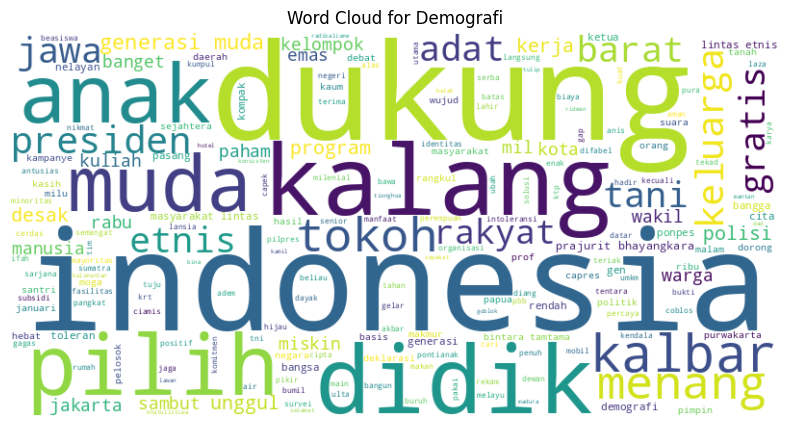

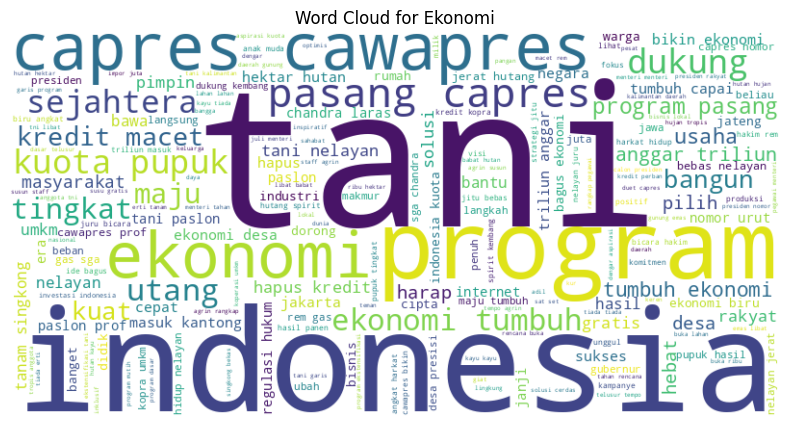

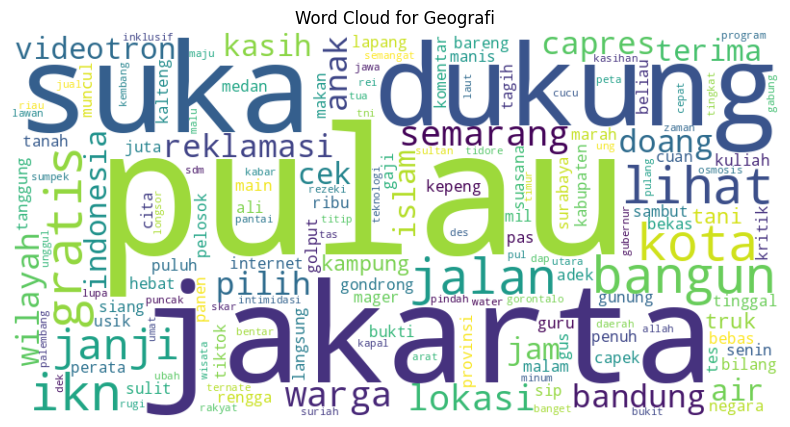

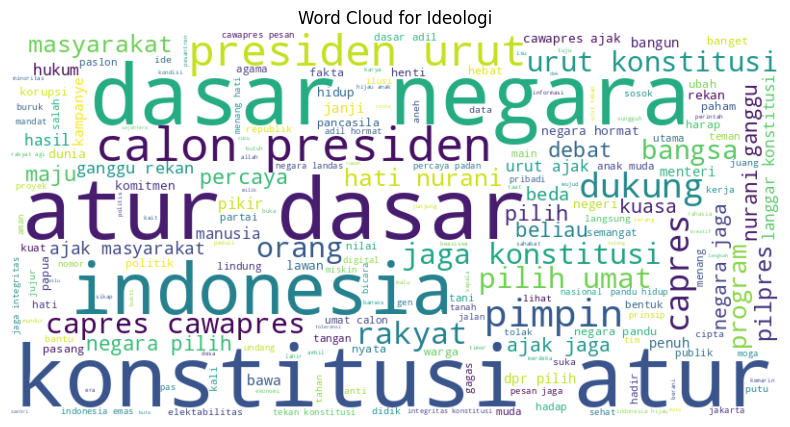

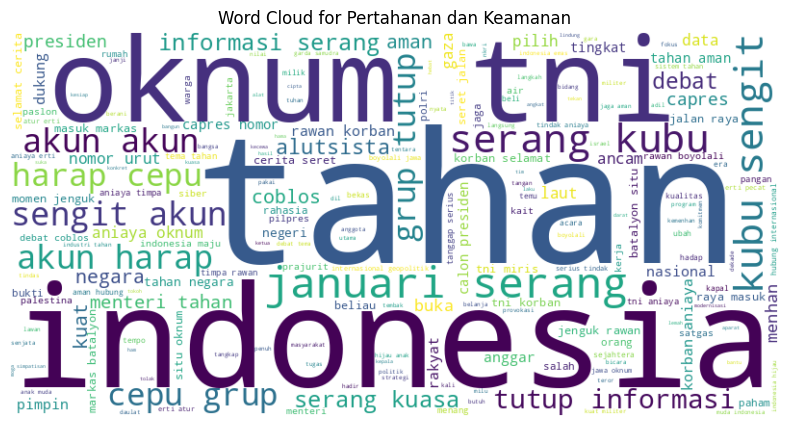

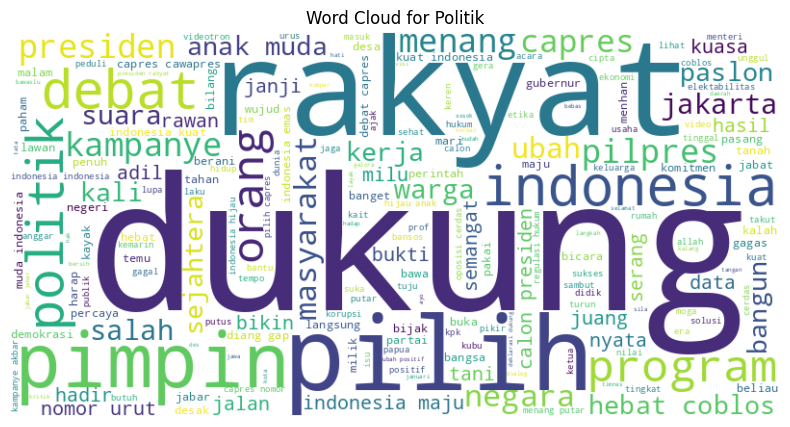

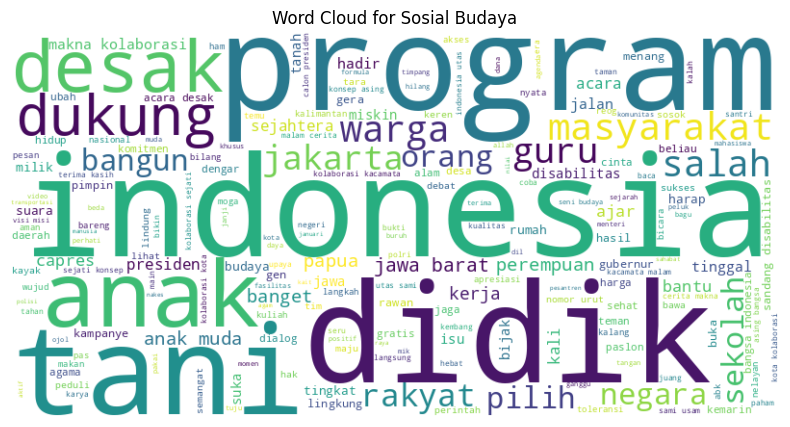

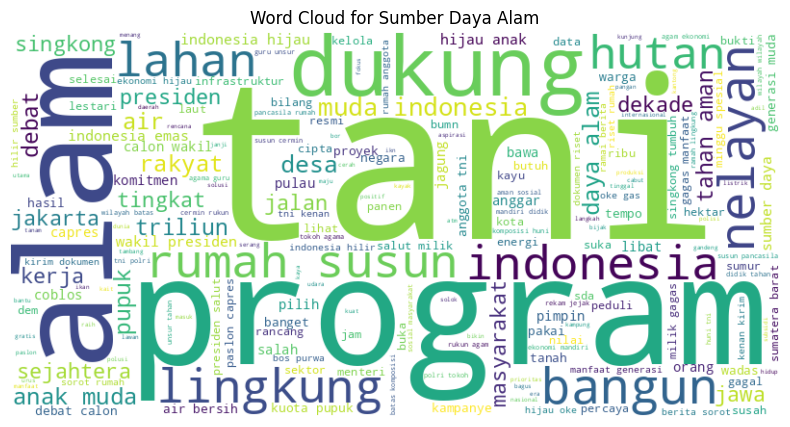

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Fungsi untuk membuat dan menampilkan word cloud
def create_wordcloud(clean_after_stemming, label):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(clean_after_stemming)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {label}')
    plt.show()

# Menggabungkan teks berdasarkan label
grouped_after_segmentation = df_eda.groupby('label')['clean_after_stemming'].apply(lambda x: ' '.join(x)).reset_index()

# Membuat dan menampilkan word cloud untuk setiap label
for index, row in grouped_after_segmentation.iterrows():
    create_wordcloud(row['clean_after_stemming'], row['label'])

In [ ]:
from collections import defaultdict

In [ ]:
# Dictionary untuk menyimpan frekuensi kata berdasarkan label
word_counts = defaultdict(lambda: defaultdict(int))

# Iterasi melalui setiap baris DataFrame
for index, row in df_eda.iterrows():
    label = row['label']
    text = row['clean_after_stemming']

    # Memisahkan kata-kata dari teks
    words = text.split()

    # Menghitung frekuensi kata-kata
    for word in words:
        word_counts[label][word] += 1

# Dictionary untuk menyimpan top 10 kata terbanyak berdasarkan label
top_words_by_label = {}

# Iterasi untuk menemukan top 10 kata terbanyak
for label, word_freq in word_counts.items():
    # Mengurutkan kata-kata berdasarkan frekuensi secara menurun
    sorted_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

    # Mengambil top 10 kata
    top_words = sorted_words[:15]

    # Menyimpan hasilnya
    top_words_by_label[label] = top_words

# Menampilkan hasil
for label, top_words in top_words_by_label.items():
    print(f"Top 10 kata terbanyak untuk label '{label}':")
    for word, count in top_words:
        print(f"{word}: {count}")
    print()

Top 10 kata terbanyak untuk label 'Sumber Daya Alam':
tani: 53
indonesia: 41
alam: 24
program: 20
rumah: 20
presiden: 18
lingkung: 16
susun: 16
air: 14
muda: 14
dukung: 14
bangun: 13
debat: 13
pupuk: 13
nelayan: 13

Top 10 kata terbanyak untuk label 'Politik':
indonesia: 690
dukung: 565
rakyat: 404
pilih: 379
capres: 369
presiden: 329
debat: 285
pimpin: 266
menang: 257
pilpres: 215
politik: 214
ubah: 201
kampanye: 200
orang: 189
coblos: 186

Top 10 kata terbanyak untuk label 'Demografi':
muda: 18
indonesia: 17
dukung: 16
kalang: 14
didik: 13
pilih: 13
anak: 12
etnis: 11
generasi: 11
kalbar: 10
tokoh: 8
menang: 8
presiden: 8
keluarga: 8
masyarakat: 7

Top 10 kata terbanyak untuk label 'Pertahanan dan Keamanan':
tahan: 114
serang: 73
indonesia: 71
tni: 67
akun: 67
aman: 50
debat: 45
oknum: 40
rawan: 38
informasi: 38
harap: 37
kuasa: 37
tutup: 36
negara: 36
januari: 35

Top 10 kata terbanyak untuk label 'Ideologi':
negara: 153
dasar: 121
atur: 113
konstitusi: 108
presiden: 102
indonesia: 

In [ ]:
import pandas as pd

def remove_words(df, column, words):
    for word in words:
        df[column] = df[column].str.replace(rf'\b{word}\b', '', regex=True)

    return df

# List kata-kata yang akan dihapus
words_to_remove = ['mah', 'sih', 'gak']

# Memanggil fungsi untuk menghapus kata-kata dari kolom 'pre_text_2'
df_eda = remove_words(df_eda, 'clean_after_stemming', words_to_remove)
df_eda.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2,new_text,after_lemmatization,after_stemming_sastrawi,clean_after_stemming
0,Kunjungan Prabowo ini untuk meresmikan dan men...,Sumber Daya Alam,"[kunjungan, meresmikan, menyerahkan, proyek, b...",kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek ...,19,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...,kunjungan meresmikan menyerahkan proyek bantua...,kunjung resmi serah proyek bantu air bersih ti...,kunjung resmi serah proyek bantu air bersih ti...
1,RT Anies dapat tepuk tangan meriah saat jadi R...,Politik,"[tepuk, tangan, meriah, rektor, mewajibkan, ma...",tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan ...,16,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan meriah rektor mewajibkan mata kul...,tepuk tangan riah rektor wajib mata kuliah ant...,tepuk tangan riah rektor wajib mata kuliah ant...
2,@CIqXqwGAT04tMtx4OCATxjoVq7vv/Y8HeYaIOgMFg8Y= ...,Demografi,"[emng, bener, sih, pendukung, yg, goblok, jg, ...",bener sih pendukung yg goblok dg pendukung sj ...,be n er sih pendukung yang goblok ...,18,sih pendukung goblok pendukung sih ridwan kami...,pendukung goblok pendukung ridwan kamil terbal...,pendukung goblok pendukung ridwan kamil terbal...,dukung goblok dukung ridwan kamil balik mayori...,dukung goblok dukung ridwan kamil mayoritas di...
3,RT @L3R8XFBw3WGbxRPSj0/0hHZTbqVGX7qtfwRg9zmhK7...,Politik,"[bersikap, kritis, kinerja, dianggap, engga, s...",bersikap kritis kinerja dianggap engga sopan d...,bersikap kritis kinerja diang gap en...,25,bersikap kritis kinerja diang gap sopan diang ...,bersikap kritis kinerja diang gap sopan diang ...,bersikap kriti kinerja diang gap sopan diang g...,sikap kritis kerja diang gap sopan diang gap h...,sikap kritis kerja diang gap sopan diang gap h...
4,Anies Baswedan Harap ASN termasuk TNI dan Polr...,Politik,"[harap, asn, tni, polri, pegang, sumpahnya, pe...",harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,6,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,harap asn tni polri pegang pemilu,harap asn tni polri pegang milu,harap asn tni polri pegang milu


In [ ]:
# Dictionary untuk menyimpan frekuensi kata berdasarkan label
word_counts = defaultdict(lambda: defaultdict(int))

# Iterasi melalui setiap baris DataFrame
for index, row in df_eda.iterrows():
    label = row['label']
    text = row['clean_after_stemming']

    # Memisahkan kata-kata dari teks
    words = text.split()

    # Menghitung frekuensi kata-kata
    for word in words:
        word_counts[label][word] += 1

# Dictionary untuk menyimpan top 10 kata terbanyak berdasarkan label
top_words_by_label = {}

# Iterasi untuk menemukan top 10 kata terbanyak
for label, word_freq in word_counts.items():
    # Mengurutkan kata-kata berdasarkan frekuensi secara menurun
    sorted_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

    # Mengambil top 10 kata
    top_words = sorted_words[:15]

    # Menyimpan hasilnya
    top_words_by_label[label] = top_words

# Menampilkan hasil
for label, top_words in top_words_by_label.items():
    print(f"Top 10 kata terbanyak untuk label '{label}':")
    for word, count in top_words:
        print(f"{word}: {count}")
    print()

Top 10 kata terbanyak untuk label 'Sumber Daya Alam':
tani: 53
indonesia: 41
alam: 24
program: 20
rumah: 20
presiden: 18
lingkung: 16
susun: 16
air: 14
muda: 14
dukung: 14
bangun: 13
debat: 13
pupuk: 13
nelayan: 13

Top 10 kata terbanyak untuk label 'Politik':
indonesia: 690
dukung: 565
rakyat: 404
pilih: 379
capres: 369
presiden: 329
debat: 285
pimpin: 266
menang: 257
pilpres: 215
politik: 214
ubah: 201
kampanye: 200
orang: 189
coblos: 186

Top 10 kata terbanyak untuk label 'Demografi':
muda: 18
indonesia: 17
dukung: 16
kalang: 14
didik: 13
pilih: 13
anak: 12
etnis: 11
generasi: 11
kalbar: 10
tokoh: 8
menang: 8
presiden: 8
keluarga: 8
masyarakat: 7

Top 10 kata terbanyak untuk label 'Pertahanan dan Keamanan':
tahan: 114
serang: 73
indonesia: 71
tni: 67
akun: 67
aman: 50
debat: 45
oknum: 40
rawan: 38
informasi: 38
harap: 37
kuasa: 37
tutup: 36
negara: 36
januari: 35

Top 10 kata terbanyak untuk label 'Ideologi':
negara: 153
dasar: 121
atur: 113
konstitusi: 108
presiden: 102
indonesia: 

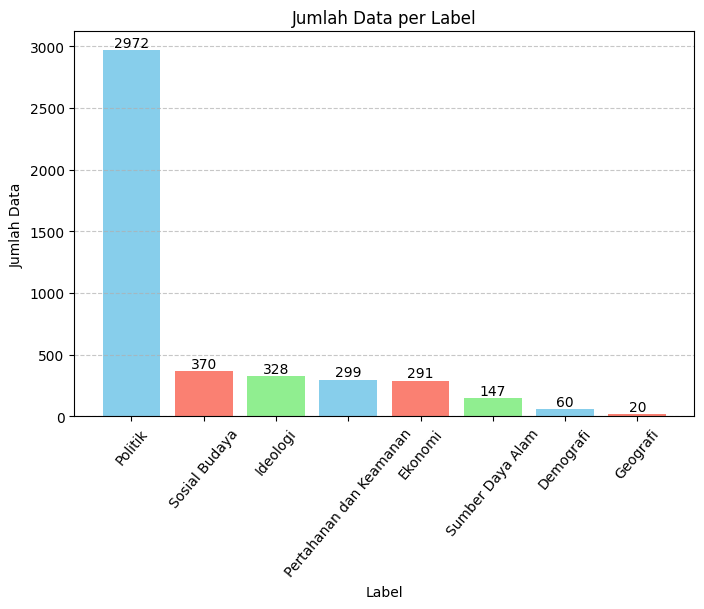

In [ ]:
# Menghitung jumlah masing-masing label
label_counts = df_eda['label'].value_counts()

# Membuat grafik
plt.figure(figsize=(8, 5))
bars = plt.bar(label_counts.index, label_counts.values, color=['skyblue', 'salmon', 'lightgreen'])
plt.title('Jumlah Data per Label')
plt.xlabel('Label')
plt.ylabel('Jumlah Data')
plt.xticks(rotation=50)

# Menambahkan label nilai di atas setiap bar
for bar, count in zip(bars, label_counts.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3, count, ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

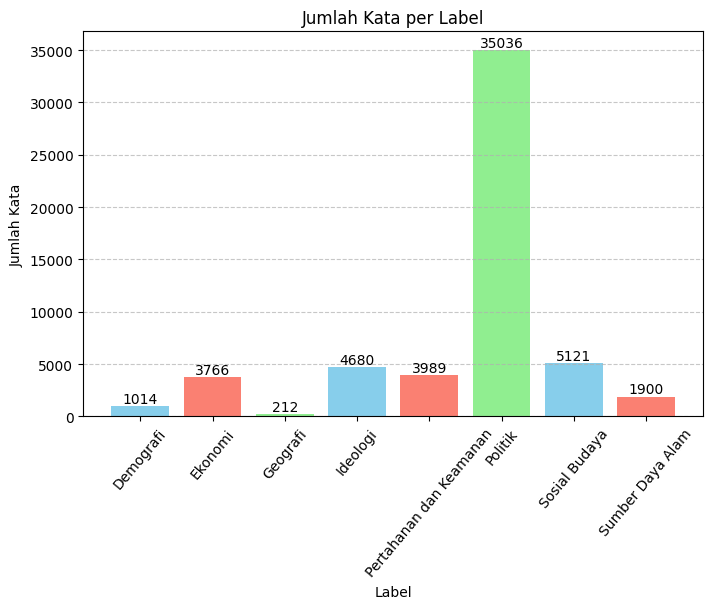

In [ ]:
# Menghitung jumlah kata per label
word_counts = df_eda.groupby('label')['clean_after_stemming'].apply(lambda x: x.str.split().explode().count())

# Membuat grafik
plt.figure(figsize=(8, 5))
bars = plt.bar(word_counts.index, word_counts.values, color=['skyblue', 'salmon', 'lightgreen'])
plt.title('Jumlah Kata per Label')
plt.xlabel('Label')
plt.ylabel('Jumlah Kata')
plt.xticks(rotation=50)

# Menambahkan label nilai di atas setiap bar
for bar, count in zip(bars, word_counts.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3, count, ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Balanced by Label

In [ ]:
balanced_df = df_eda.copy()

In [ ]:
# Hitung jumlah baris terbanyak
max_rows = int(balanced_df['label'].value_counts().max())

# Pisahkan data berdasarkan label
grouped_data = {label: group for label, group in balanced_df.groupby('label')}

# Buat dataframe kosong untuk menyimpan data yang telah disesuaikan
balanced_data = pd.DataFrame(columns=balanced_df.columns)

# Tambahkan sampel tambahan untuk setiap label yang jumlahnya kurang dari max_rows
for label, group in grouped_data.items():
    if len(group) < max_rows:
        additional_samples = group.sample(max_rows - len(group), replace=True)
        balanced_data = pd.concat([balanced_data, additional_samples], ignore_index=True)

# Gabungkan kembali data dari setiap label dan juga data yang sudah memiliki jumlah sampel maksimum
balanced_data = pd.concat([balanced_data, pd.concat([group for group in grouped_data.values() if len(group) >= max_rows], ignore_index=True)], ignore_index=True)

# Tampilkan dataframe yang telah disesuaikan
balanced_data.shape

(22261, 11)

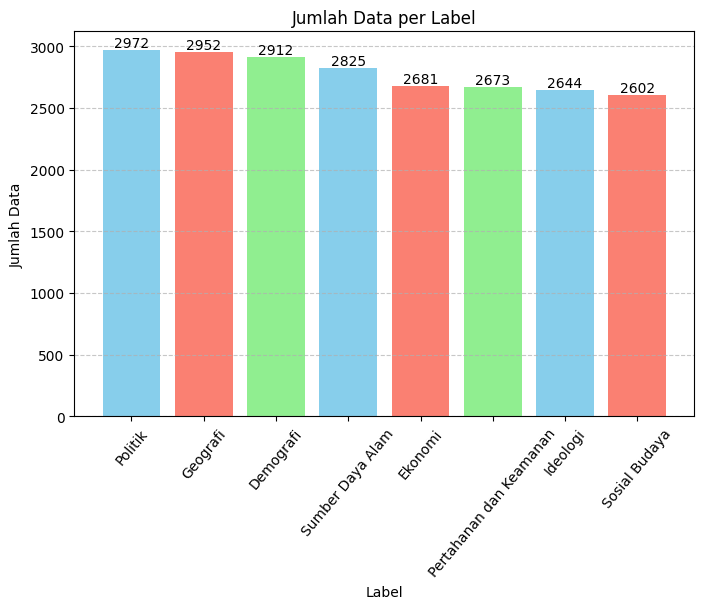

In [ ]:
# Menghitung jumlah masing-masing label
label_counts = balanced_data['label'].value_counts()

# Membuat grafik
plt.figure(figsize=(8, 5))
bars = plt.bar(label_counts.index, label_counts.values, color=['skyblue', 'salmon', 'lightgreen'])
plt.title('Jumlah Data per Label')
plt.xlabel('Label')
plt.ylabel('Jumlah Data')
plt.xticks(rotation=50)

# Menambahkan label nilai di atas setiap bar
for bar, count in zip(bars, label_counts.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3, count, ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Dictionary untuk menyimpan frekuensi kata berdasarkan label
word_counts = defaultdict(lambda: defaultdict(int))

# Iterasi melalui setiap baris DataFrame
for index, row in balanced_data.iterrows():
    label = row['label']
    text = row['clean_after_stemming']

    # Memisahkan kata-kata dari teks
    words = text.split()

    # Menghitung frekuensi kata-kata
    for word in words:
        word_counts[label][word] += 1

# Dictionary untuk menyimpan top 10 kata terbanyak berdasarkan label
top_words_by_label = {}

# Iterasi untuk menemukan top 10 kata terbanyak
for label, word_freq in word_counts.items():
    # Mengurutkan kata-kata berdasarkan frekuensi secara menurun
    sorted_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

    # Mengambil top 10 kata
    top_words = sorted_words[:15]

    # Menyimpan hasilnya
    top_words_by_label[label] = top_words

# Menampilkan hasil
for label, top_words in top_words_by_label.items():
    print(f"Top 10 kata terbanyak untuk label '{label}':")
    for word, count in top_words:
        print(f"{word}: {count}")
    print()

Top 10 kata terbanyak untuk label 'Demografi':
muda: 875
indonesia: 819
dukung: 716
kalang: 686
pilih: 627
didik: 618
anak: 591
generasi: 532
etnis: 464
kalbar: 400
keluarga: 384
tani: 371
presiden: 371
menang: 359
jawa: 338

Top 10 kata terbanyak untuk label 'Ekonomi':
ekonomi: 1131
tani: 1019
program: 756
capres: 721
indonesia: 639
tumbuh: 490
cawapres: 440
nelayan: 407
pasang: 386
dukung: 374
kredit: 300
pupuk: 287
desa: 279
paslon: 253
triliun: 249

Top 10 kata terbanyak untuk label 'Geografi':
pulau: 1305
jakarta: 713
suka: 599
dukung: 578
gratis: 492
jalan: 453
janji: 447
kota: 445
bangun: 443
ikn: 437
lihat: 431
kampung: 308
tani: 308
truk: 308
anak: 306

Top 10 kata terbanyak untuk label 'Ideologi':
negara: 1289
dasar: 1038
atur: 962
konstitusi: 918
presiden: 821
indonesia: 751
calon: 630
pilih: 623
urut: 606
capres: 579
jaga: 538
pimpin: 421
rakyat: 348
dukung: 335
masyarakat: 316

Top 10 kata terbanyak untuk label 'Pertahanan dan Keamanan':
tahan: 1037
indonesia: 673
serang: 

In [ ]:
balanced_data.head()

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2,new_text,after_lemmatization,after_stemming_sastrawi,clean_after_stemming
0,RT Pemimpin sejatinya mampu mendengar dan mema...,Demografi,"[pemimpin, sejatinya, mendengar, memahami, rak...",pemimpin sejatinya mendengar memahami rakyat s...,pemimpin sejatinya mendengar memahami ...,13,pemimpin sejatinya mendengar memahami rakyat s...,pemimpin sejatinya mendengar memahami rakyat s...,pemimpin sejatinya mendengar memahami rakyat s...,pimpin sejati dengar paham rakyat sosok paham ...,pimpin sejati dengar paham rakyat sosok paham ...
1,RT Ga afdol rasanya kalo nonton Desak Anies ga...,Demografi,"[ga, afdol, kalo, nonton, desak, ga, bawa, uch...",ga afdol kalo desak ga bawa uchiwanya re shins...,enggak afdol kalo desak enggak bawa ...,14,afdol kalo desak bawa sih wan sih hin sih rona,afdol desak bawa wan hin rona,afdol desak bawa wan hin rona,afdol desak bawa wan hin rona,afdol desak bawa wan hin rona
2,yang gua khawatirkan ini biaya kampanye amin d...,Demografi,"[gua, khawatirkan, biaya, kampanye, amin, diki...",gua biaya kampanye amin dikit banget mencapai ...,gua biaya kampanye amin dikit banget...,30,gua biaya kampanye amin dikit banget mencapai ...,biaya kampanye dikit banget mencapai pelosok p...,biaya kampanye dikit banget mencapai pelosok p...,biaya kampanye dikit banget capai pelosok pelo...,biaya kampanye dikit banget capai pelosok pelo...
3,RT Jelang Tengah Malam Anies Melayat ke Rumah ...,Demografi,"[jelang, malam, melayat, rumah, duka, rizal, r...",jelang malam melayat rumah duka ramli re geloraco,jelang malam melayat rumah duka ramli ...,10,jelang malam melayat rumah duka ramli gelora sih,jelang malam melayat rumah duka ramli gelora,jelang malam melayat rumah duka ramli gelora,jelang malam layat rumah duka ramli gelora,jelang malam layat rumah duka ramli gelora
4,"Emang keren MasBOWOGBran PilihanKITA, akan mel...",Demografi,"[emang, keren, masbowogbran, pilihankita, mela...",emang keren pilihankita melahirkan generasi em...,memang keren pilihan kita melahirkan ...,12,keren pilihan melahirkan generasi emas modal d...,keren pilihan melahirkan generasi emas modal d...,keren pilihan melahirkan generasi emas modal d...,keren pilih lahir generasi emas modal demograf...,keren pilih lahir generasi emas modal demograf...


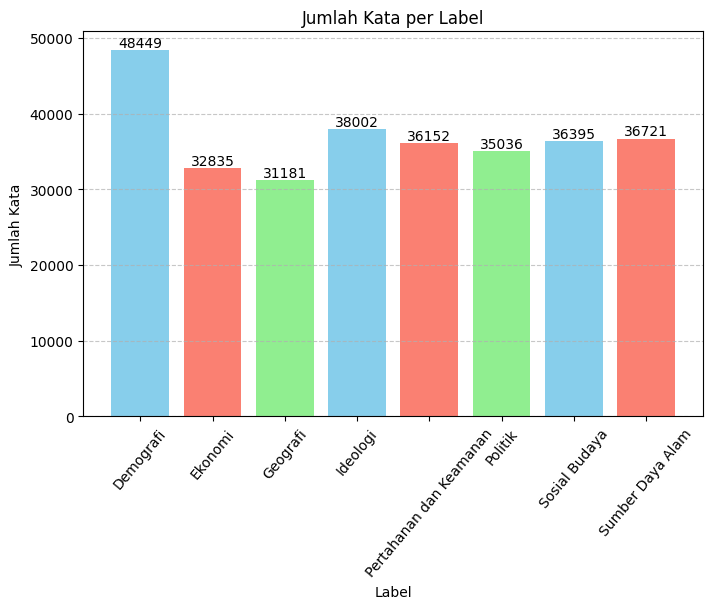

In [ ]:
# Menghitung jumlah kata per label
word_counts = balanced_data.groupby('label')['clean_after_stemming'].apply(lambda x: x.str.split().explode().count())

# Membuat grafik
plt.figure(figsize=(8, 5))
bars = plt.bar(word_counts.index, word_counts.values, color=['skyblue', 'salmon', 'lightgreen'])
plt.title('Jumlah Kata per Label')
plt.xlabel('Label')
plt.ylabel('Jumlah Kata')
plt.xticks(rotation=50)

# Menambahkan label nilai di atas setiap bar
for bar, count in zip(bars, word_counts.values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.3, count, ha='center', va='bottom')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
balanced_data.to_csv('balanced_data_new.csv', index=False)

#Modelling

In [ ]:
balanced_data.head(1)

,text,label,clean_text,indonesian_english_word_only,divide_word_2,word_count,pre_text_2,new_text,after_lemmatization,after_stemming_sastrawi,clean_after_stemming
0,RT Pemimpin sejatinya mampu mendengar dan mema...,Demografi,"[pemimpin, sejatinya, mendengar, memahami, rak...",pemimpin sejatinya mendengar memahami rakyat s...,pemimpin sejatinya mendengar memahami ...,13,pemimpin sejatinya mendengar memahami rakyat s...,pemimpin sejatinya mendengar memahami rakyat s...,pemimpin sejatinya mendengar memahami rakyat s...,pimpin sejati dengar paham rakyat sosok paham ...,pimpin sejati dengar paham rakyat sosok paham ...


In [ ]:
bfr_mod = pd.read_csv('/content/balanced_data_new.csv')

In [ ]:
bfr_mod.columns

Index(['text', 'label', 'clean_text', 'indonesian_english_word_only',
       'divide_word_2', 'word_count', 'pre_text_2', 'new_text',
       'after_lemmatization', 'after_stemming_sastrawi',
       'clean_after_stemming'],
      dtype='object')

In [ ]:
bfr_mod.drop(columns=['text', 'clean_text', 'indonesian_english_word_only',
       'divide_word_2', 'word_count', 'pre_text_2', 'new_text',
       'after_lemmatization', 'after_stemming_sastrawi'], inplace=True)

In [ ]:
bfr_mod = bfr_mod.reset_index(drop=True)

In [ ]:
bfr_mod.isna().sum()

label                     0
clean_after_stemming    238
dtype: int64

In [ ]:
bfr_mod = bfr_mod.dropna()

In [ ]:
bfr_mod = bfr_mod.reset_index(drop=True)

##Using RandomForest

In [ ]:
df_mod = bfr_mod.copy()

In [ ]:
df_mod.head(2)

,label,clean_after_stemming
0,Demografi,janji koreksi cipta kerja pilpres
1,Demografi,makmur tulang punggung keluarga kelas disel ga...


In [ ]:
#df_mod.drop(columns=['text', 'clean_text', 'indonesian_english_word_only', 'divide_word', 'word_count', 'pre_text_2'], inplace=True)

In [ ]:
df_mod = df_mod.rename(columns={'clean_after_stemming': 'clean_text'})

In [ ]:
def vectorize_data(text_data):
    # Join the tokenized text into strings
    text_data_strings = [" ".join(tokens) for tokens in text_data]
    # Initialize TfidfVectorizer
    tfidf_vectorizer = TfidfVectorizer()
    # Fit and transform the text data to generate TF-IDF vectors
    tfidf_vectors = tfidf_vectorizer.fit_transform(text_data_strings)
    return tfidf_vectors, tfidf_vectorizer

In [ ]:
df_mod.head()

,label,clean_text
0,Demografi,janji koreksi cipta kerja pilpres
1,Demografi,makmur tulang punggung keluarga kelas disel ga...
2,Demografi,unggul moga nasib buruh sejahtera
3,Demografi,cipta peluang generasi muda indonesia keluarga...
4,Demografi,minggu spesial tani debat calon wakil presiden...


In [ ]:

# df_mod contains preprocessed text data
# Convert list of words into a single string for each entry in 'clean_text' column
#df_mod['clean_text'] = df_mod['clean_text'].apply(lambda x: ' '.join(x))

# Split data into features (X) and target (y)
X = df_mod['clean_text']  # Features
y = df_mod['label']  # Target

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)


Shape of X_train: (17619,)
Shape of X_test: (4405,)
Shape of y_train: (17619,)
Shape of y_test: (4405,)


In [ ]:
X_train

9224     dukung presiden wakil presiden indonesia presi...
8616                                                  duga
460      program entas miskin utama ktp sakti ktp manfa...
21709    dosen hubung internasional fisip universitas n...
12008    aniaya rawan oknum tni boyolali alarm kampanye...
                               ...                        
11964         ironis menteri tahan menteri andika mal reza
21575    harga pilih orang pilih untung janji tara hak ...
5390                              entas miskin didik kunci
860      unggul basis demografi pilih gender usia etnis...
15795    konten sebar benci etnis aman video orang lang...
Name: clean_text, Length: 17619, dtype: object

In [ ]:
y_train

9224                    Ideologi
8616                    Ideologi
460                    Demografi
21709                    Politik
12008    Pertahanan dan Keamanan
                  ...           
11964    Pertahanan dan Keamanan
21575                    Politik
5390                     Ekonomi
860                    Demografi
15795              Sosial Budaya
Name: label, Length: 17619, dtype: object

In [ ]:
!pip install joblib

In [ ]:
import joblib

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score

# Split data (80% training, 20% testing) with a fixed random state for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a TfidfVectorizer and fit it on the training data
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)

# Define the parameter grid for tuning
param_grid = {
    "n_estimators": [100, 200],  # Number of trees in the forest
    "max_depth": [10, 20],  # Maximum depth of each tree
    "min_samples_split": [2, 5],  # Minimum number of samples to split a node
    "min_samples_leaf": [1, 2],  # Minimum number of samples in each leaf
}

# Create a GridSearchCV object to perform tuning
from sklearn.model_selection import GridSearchCV

grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=2, scoring='accuracy')

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train_tfidf, y_train)

# Get the best parameters and accuracy
best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("Best Parameters:", best_parameters)
print("Best Accuracy:", best_accuracy)

# Get the best model from GridSearchCV
best_model_rf = grid_search.best_estimator_

# Predict on the testing data using the best model
y_pred = grid_search.predict(vectorizer.transform(X_test))

# Calculate the accuracy of the best model
accuracy_rf = accuracy_score(y_test, y_pred)
print("Test Accuracy with Best Parameters:", accuracy_rf)

# Save the best model to a file
model_filename = 'random_forest_best_model_new.pkl'
joblib.dump(best_model_rf, model_filename)

print("Model saved to:", model_filename)

KeyboardInterrupt: 

In [ ]:
#from sklearn.externals import joblib

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Train Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=200, random_state=42)
rf_classifier.fit(X_train_tfidf, y_train)

# Save model to file
joblib.dump(rf_classifier, '/content/random_forest_model2.pkl')

# Predict on the testing data
y_pred = rf_classifier.predict(X_test_tfidf)

# Calculate accuracy
accuracy_rf = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy_rf)


In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

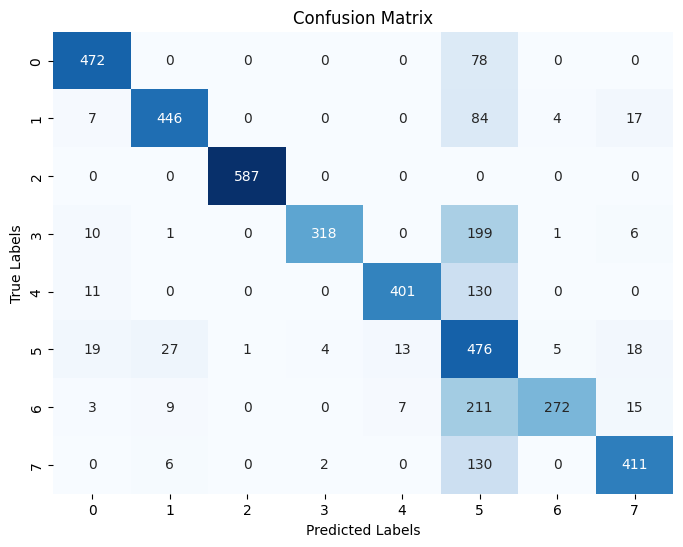

Classification Report:
                         precision    recall  f1-score   support

              Demografi       0.90      0.86      0.88       550
                Ekonomi       0.91      0.80      0.85       558
               Geografi       1.00      1.00      1.00       587
               Ideologi       0.98      0.59      0.74       535
Pertahanan dan Keamanan       0.95      0.74      0.83       542
                Politik       0.36      0.85      0.51       563
          Sosial Budaya       0.96      0.53      0.68       517
       Sumber Daya Alam       0.88      0.75      0.81       549

               accuracy                           0.77      4401
              macro avg       0.87      0.76      0.79      4401
           weighted avg       0.87      0.77      0.79      4401



In [ ]:
# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Create a classification report
class_report = classification_report(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Print classification report
print("Classification Report:")
print(class_report)


In [ ]:

# Print some actual vs predicted labels along with clean_text text
print("Actual vs Predicted Labels with Tweet Text:")
for clean_text, actual_label, predicted_label in zip(X_test[:10], y_test[:10], y_pred[:10]):
    print("Tweet:", clean_text)
    print("Actual Label:", actual_label)
    print("Predicted Label:", predicted_label)
    print("-----------------------")

Actual vs Predicted Labels with Tweet Text:
Tweet: industri tahan integrator produksi alutsista bumn beli produk negeri impor set sgb tim susun kecewa liberal
Actual Label: Pertahanan dan Keamanan
Predicted Label: Pertahanan dan Keamanan
-----------------------
Tweet: erti panen cuan ikn adek tanah negara pilih bangun wilayah perata wilayah capek dukung doang
Actual Label: Geografi
Predicted Label: Geografi
-----------------------
Tweet: tanggap serius tindak aniaya timpa rawan boyolali jawa oknum tni aniaya erti atur erti pecat
Actual Label: Pertahanan dan Keamanan
Predicted Label: Pertahanan dan Keamanan
-----------------------
Tweet: bias was bei salah representasi beliau sensitif suruh maaf stop
Actual Label: Sumber Daya Alam
Predicted Label: Politik
-----------------------
Tweet: anak kuliah generasi muda gen milenial pilih rugi hus ain
Actual Label: Demografi
Predicted Label: Demografi
-----------------------
Tweet: agenda desak ruang sandang disabilitas deputi disabilitas timnas

##Using XGBoost

In [ ]:
df_mod_xg = bfr_mod.copy()

In [ ]:
df_mod_xg.head(2)

,label,clean_after_stemming
0,Demografi,perhati sosial hadap gen
1,Demografi,seru warga sumatra barat sambut rabu januari


In [ ]:
df_mod_xg = df_mod_xg.rename(columns={'clean_after_stemming': 'clean_text'})

In [ ]:
def vectorize_data(text_data):
    # Join the tokenized text into strings
    text_data_strings = [" ".join(tokens) for tokens in text_data]
    # Initialize TfidfVectorizer
    tfidf_vectorizer = TfidfVectorizer()
    # Fit and transform the text data to generate TF-IDF vectors
    tfidf_vectors = tfidf_vectorizer.fit_transform(text_data_strings)
    return tfidf_vectors, tfidf_vectorizer

In [ ]:
# df_mod_xg contains preprocessed text data
# Convert list of words into a single string for each entry in 'clean_text' column
#df_mod_xg['clean_text'] = df_mod_xg['clean_text'].apply(lambda x: ' '.join(x))

# Split data into features (X) and target (y)
X = df_mod_xg['clean_text']  # Features
y = df_mod_xg['label']  # Target

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)


Shape of X_train: (17600,)
Shape of X_test: (4401,)
Shape of y_train: (17600,)
Shape of y_test: (4401,)


In [ ]:
X_train

10202              percaya hanger indonesia dpr pilih umat
20953    dukung mantan pidana terorisme gejala sisi duk...
8570     calon presiden urut jaga konstitusi atur dasar...
487      jumat agenda kampanye jawa temu tampung aspira...
18541    wakil ketua dewan pakar atm cerita langkah bid...
                               ...                        
11964    rawan miras asih amplop bentrok bas tni boyola...
21575            paslon evaluasi indonesia buka demokratis
5390     peta komoditas indonesia pandang lengkap hasil...
860      dukung goblok dukung ridwan kamil mayoritas di...
15795    revitalisasi pasar janji sentuh modern hilang ...
Name: clean_text, Length: 17600, dtype: object

In [ ]:
y_train

10202                   Ideologi
20953                    Politik
8570                    Ideologi
487                    Demografi
18541           Sumber Daya Alam
                  ...           
11964    Pertahanan dan Keamanan
21575                    Politik
5390                     Ekonomi
860                    Demografi
15795              Sosial Budaya
Name: label, Length: 17600, dtype: object

In [ ]:
from xgboost import XGBClassifier
import joblib
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Label mapping untuk target
label_mapping = {
    'Politik': 0 ,
    'Sosial Budaya':1 ,
    'Pertahanan dan Keamanan': 2,
    'Ideologi': 3,
    'Ekonomi': 4,
    'Sumber Daya Alam': 5,
    'Demografi': 6,
    'Geografi': 7
}

# Label encoding menggunakan label_mapping
df_mod_xg['label_encoded'] = df_mod_xg['label'].replace(label_mapping)

# Split data menjadi training dan testing sets
X = df_mod_xg['clean_text']
y = df_mod_xg['label_encoded']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Initialize XGBoost Classifier
xgb_classifier = XGBClassifier()

# Train the model
xgb_classifier.fit(X_train_tfidf, y_train)

# Predict on the testing data
y_pred = xgb_classifier.predict(X_test_tfidf)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)
label_names = [name for name in label_mapping.values() if isinstance(name, str)]  # Filter strings only
print(f"Number of labels in target_names: {len(label_names)}")
unique_labels = np.unique(y_pred)
print(f"Unique predicted labels: {unique_labels}")
# Print classification report using label_mapping
print("Classification Report:")
label_names = [name for name in label_mapping.values() if isinstance(name, str)]  # Filter strings only
print(f"Number of labels in target_names: {len(label_names)}")  # Check for empty list

if len(label_names) > 0:
  unique_labels = np.unique(y_pred)
  print(f"Unique predicted labels: {unique_labels}")  # Check for mismatch

  # Proceed with classification report if labels and predictions match
  if len(unique_labels) == len(label_names):
    print(classification_report(y_test, y_pred, target_names=label_names))
  else:
    print("WARNING: Number of predicted labels does not match the number of labels in target_names.")
else:
  print("ERROR: No labels found in label_mapping. Check for missing or invalid values.")
# Simpan model ke dalam file .pkl di Google Colab
joblib.dump(xgb_classifier, '/content/xgb_classifier.pkl')

Test Accuracy: 0.9568279936378096
Confusion Matrix:
[[456  38  15  24  11  10   8   1]
 [ 13 487   8   0   3   2   4   0]
 [  4   0 527   0   0   0  11   0]
 [  3   0   0 518   3   3   8   0]
 [  4   5   1   0 545   3   0   0]
 [  0   0   0   2   6 541   0   0]
 [  0   0   0   0   0   0 550   0]
 [  0   0   0   0   0   0   0 587]]
Number of labels in target_names: 0
Unique predicted labels: [0 1 2 3 4 5 6 7]
Classification Report:
Number of labels in target_names: 0
ERROR: No labels found in label_mapping. Check for missing or invalid values.


['/content/xgb_classifier.pkl']

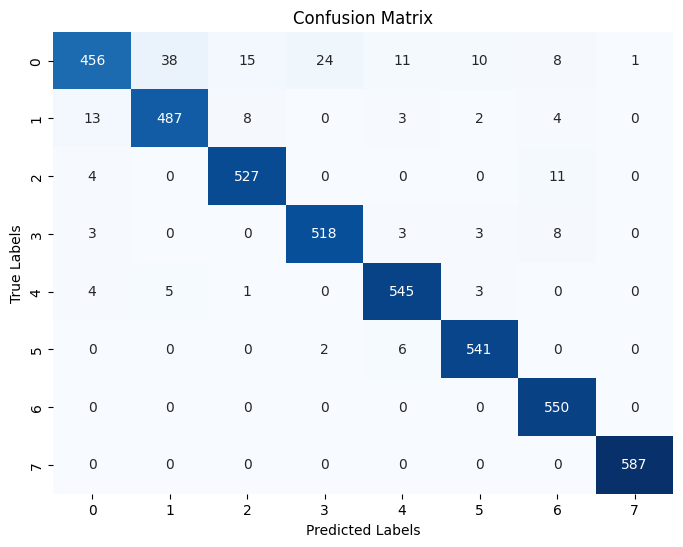

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.81      0.87       563
           1       0.92      0.94      0.93       517
           2       0.96      0.97      0.96       542
           3       0.95      0.97      0.96       535
           4       0.96      0.98      0.97       558
           5       0.97      0.99      0.98       549
           6       0.95      1.00      0.97       550
           7       1.00      1.00      1.00       587

    accuracy                           0.96      4401
   macro avg       0.96      0.96      0.96      4401
weighted avg       0.96      0.96      0.96      4401



In [ ]:
# Create a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Create a classification report
class_report = classification_report(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Print classification report
print("Classification Report:")
print(class_report)


##Using Neural Network

In [ ]:
df_mod_nn = bfr_mod.copy()

In [ ]:
df_mod_nn.head(2)

,label,clean_after_stemming
0,Demografi,janji koreksi cipta kerja pilpres
1,Demografi,makmur tulang punggung keluarga kelas disel ga...


In [ ]:
#df_mod_nn.drop(columns=['text', 'clean_text', 'indonesian_english_word_only', 'divide_word', 'word_count', 'pre_text_2'], inplace=True)

In [ ]:
df_mod_nn = df_mod_nn.rename(columns={'clean_after_stemming': 'clean_text'})

In [ ]:
def vectorize_data(text_data):
    # Join the tokenized text into strings
    text_data_strings = [" ".join(tokens) for tokens in text_data]
    # Initialize TfidfVectorizer
    tfidf_vectorizer = TfidfVectorizer()
    # Fit and transform the text data to generate TF-IDF vectors
    tfidf_vectors = tfidf_vectorizer.fit_transform(text_data_strings)
    return tfidf_vectors, tfidf_vectorizer

In [ ]:

# df_mod contains preprocessed text data
# Convert list of words into a single string for each entry in 'clean_text' column
#df_mod['clean_text'] = df_mod['clean_text'].apply(lambda x: ' '.join(x))

# Split data into features (X) and target (y)
X = df_mod_nn['clean_text']  # Features
y = df_mod_nn['label']  # Target

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)


Shape of X_train: (17619,)
Shape of X_test: (4405,)
Shape of y_train: (17619,)
Shape of y_test: (4405,)


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Split data into features (X) and target (y)
X = df_mod_nn['clean_text']  # Features
y = df_mod_nn['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

# Define the hyperparameter grid
param_grid = {
    'units_input': [128, 256],
    'dropout_input': [0.2, 0.3],
    'learning_rate': [1e-3, 1e-2]
}

# Function to create a model with specific hyperparameters
def build_model(units_input, dropout_input, learning_rate):
    model = Sequential()
    model.add(Dense(units=units_input, input_shape=(X_train_tfidf.shape[1],), activation='relu'))
    model.add(Dropout(dropout_input))

    # Adding more layers explicitly
    model.add(Dense(units=units_input, activation='relu'))
    model.add(Dropout(dropout_input))
    model.add(Dense(units=128, activation='relu'))
    model.add(Dropout(0.01))
    model.add(Dense(units=64, activation='relu'))
    model.add(Dense(len(label_encoder.classes_), activation='softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer=Adam(learning_rate=learning_rate),
                  metrics=['accuracy'])
    return model

# Grid search over hyperparameters with a limit on the number of trials
max_trials = 10
trial_count = 0

best_model_nn = None
best_accuracy = 0
best_params = {}

for units_input in param_grid['units_input']:
    for dropout_input in param_grid['dropout_input']:
        for learning_rate in param_grid['learning_rate']:
            if trial_count >= max_trials:
                break

            print(f"Training with units_input={units_input}, dropout_input={dropout_input}, learning_rate={learning_rate}")

            model = build_model(units_input, dropout_input, learning_rate)

            # Train the model
            history = model.fit(X_train_tfidf, y_train, batch_size=32, epochs=10, validation_split=0.2, verbose=0)

            # Evaluate the model
            loss, accuracy = model.evaluate(X_test_tfidf, y_test, verbose=0)
            print(f"Test accuracy: {accuracy:.4f}")

            if accuracy > best_accuracy:
                best_accuracy = accuracy
                best_model_nn = model
                best_params = {
                    'units_input': units_input,
                    'dropout_input': dropout_input,
                    'learning_rate': learning_rate
                }

            trial_count += 1

print(f"Best parameters: {best_params}")
print(f"Best test accuracy: {best_accuracy:.4f}")

# Save the best model
best_model_nn.save('/content/nn_model_best_new.h5')


Training with units_input=128, dropout_input=0.2, learning_rate=0.001
Test accuracy: 0.9650
Training with units_input=128, dropout_input=0.2, learning_rate=0.01
Test accuracy: 0.9669
Training with units_input=128, dropout_input=0.3, learning_rate=0.001
Test accuracy: 0.9639
Training with units_input=128, dropout_input=0.3, learning_rate=0.01
Test accuracy: 0.9623
Training with units_input=256, dropout_input=0.2, learning_rate=0.001
Test accuracy: 0.9594
Training with units_input=256, dropout_input=0.2, learning_rate=0.01
Test accuracy: 0.9675
Training with units_input=256, dropout_input=0.3, learning_rate=0.001
Test accuracy: 0.9562
Training with units_input=256, dropout_input=0.3, learning_rate=0.01
Test accuracy: 0.9721
Best parameters: {'units_input': 256, 'dropout_input': 0.3, 'learning_rate': 0.01}
Best test accuracy: 0.9721


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 1/100
441/441 [==============================] - 10s 16ms/step - loss: 0.6802 - accuracy: 0.7592 - val_loss: 0.2019 - val_accuracy: 0.9393
Epoch 2/100
441/441 [==============================] - 5s 12ms/step - loss: 0.1279 - accuracy: 0.9606 - val_loss: 0.1787 - val_accuracy: 0.9447
Epoch 3/100
441/441 [==============================] - 10s 22ms/step - loss: 0.0754 - accuracy: 0.9762 - val_loss: 0.1399 - val_accuracy: 0.9552
Epoch 4/100
441/441 [==============================] - 7s 16ms/step - loss: 0.0562 - accuracy: 0.9817 - val_loss: 0.1532 - val_accuracy: 0.9549
Epoch 5/100
441/441 [==============================] - 8s 19ms/step - loss: 0.0470 - accuracy: 0.9847 - val_loss: 0.1724 - val_accuracy: 0.9489
Epoch 6/100
441/441 [==============================] - 7s 15ms/step - loss: 0.0439 - accuracy: 0.9840 - val_loss: 0.1483 - val_accuracy: 0.9580
Epoch 7/100
441/441 [==============================] - 6s 14ms/step - loss: 0.0429 - accuracy: 0.9847 - val_loss: 0.2017 - val_accurac

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


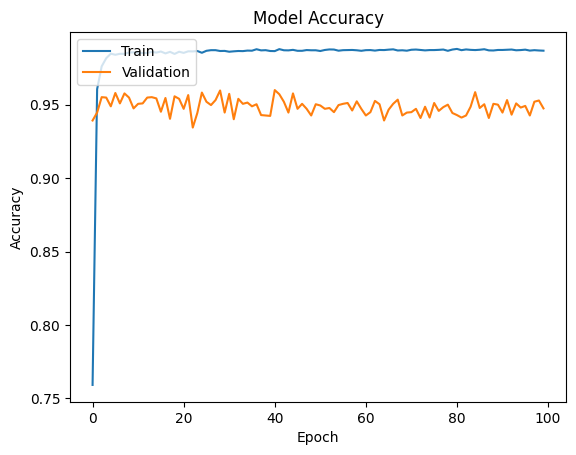

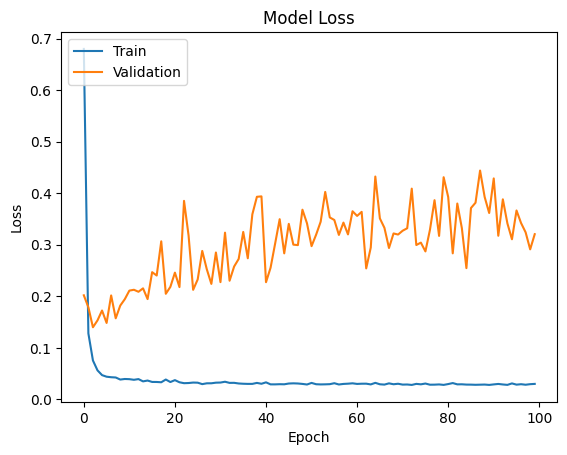

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import matplotlib.pyplot as plt

# Split data into features (X) and target (y)
X = df_mod_nn['clean_text']  # Features
y = df_mod_nn['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

# Best hyperparameters
best_params = {
    'units_input': 128,
    'dropout_input': 0.2,
    'learning_rate': 0.001
}

# Define Neural Network model with best hyperparameters
model_nn_best = Sequential([
    Dense(units=best_params['units_input'], input_shape=(X_train_tfidf.shape[1],), activation='relu'),
    Dropout(best_params['dropout_input']),
    Dense(units=best_params['units_input'], activation='relu'),
    Dropout(best_params['dropout_input']),
    Dense(units=128, activation='relu'),
    Dropout(0.01),
    Dense(units=64, activation='relu'),
    Dense(len(label_encoder.classes_), activation='softmax')
])

# Compile Neural Network model
model_nn_best.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=best_params['learning_rate']), metrics=['accuracy'])

# Train Neural Network model with validation data
history_nn = model_nn_best.fit(X_train_tfidf, y_train, batch_size=32, epochs=100, validation_split=0.2, verbose=1)

# Evaluate Neural Network model on testing data
loss_nn, accuracy_nn = model_nn_best.evaluate(X_test_tfidf, y_test, verbose=0)
print(f'NN Test Loss: {loss_nn:.4f}, Test Accuracy: {accuracy_nn:.4f}')

# Save the model to .h5 file
model_nn_best.save('/content/nn_model_best_100e.h5')

# Plot training & validation accuracy values
plt.plot(history_nn.history['accuracy'])
plt.plot(history_nn.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_nn.history['loss'])
plt.plot(history_nn.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

138/138 [==============================] - 1s 3ms/step


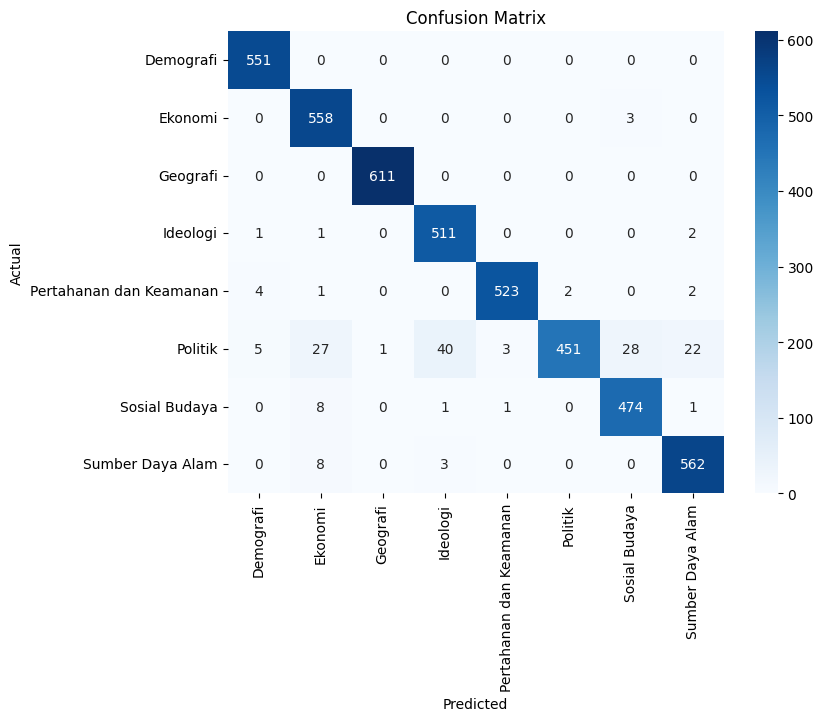

                         precision    recall  f1-score   support

              Demografi       0.98      1.00      0.99       551
                Ekonomi       0.93      0.99      0.96       561
               Geografi       1.00      1.00      1.00       611
               Ideologi       0.92      0.99      0.96       515
Pertahanan dan Keamanan       0.99      0.98      0.99       532
                Politik       1.00      0.78      0.88       577
          Sosial Budaya       0.94      0.98      0.96       485
       Sumber Daya Alam       0.95      0.98      0.97       573

               accuracy                           0.96      4405
              macro avg       0.96      0.96      0.96      4405
           weighted avg       0.96      0.96      0.96      4405



In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Predict on the testing data
y_pred_proba = model_nn_best.predict(X_test_tfidf)
y_pred = np.argmax(y_pred_proba, axis=1)  # Convert probabilities to class labels

# Convert y_test from one-hot encoded back to numeric labels
y_test_numeric = np.argmax(y_test, axis=1)

# Generate confusion matrix
cm = confusion_matrix(y_test_numeric, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Print classification report
report = classification_report(y_test_numeric, y_pred, target_names=label_encoder.classes_)
print(report)


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

In [ ]:
# Split data into features (X) and target (y)
X = df_mod_nn['clean_text']  # Features
y = df_mod_nn['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

# Define Neural Network model
model = Sequential([
    Dense(128, input_shape=(X_train_tfidf.shape[1],), activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(len(label_encoder.classes_), activation='softmax')  # Softmax for multi-class classification
])

# Compile model
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Train the model with validation data
history = model.fit(X_train_tfidf, y_train, batch_size=32, epochs=20,
                    validation_split=0.2, verbose=1)

# Evaluate on the testing data
loss, accuracy_nn = model.evaluate(X_test_tfidf, y_test, verbose=0)
print(f'Test Loss: {loss:.4f}, Test Accuracy: {accuracy_nn:.4f}')

# Save the model to .h5 file
model.save('/content/nn_model.h5')

Epoch 1/10
440/440 [==============================] - 10s 18ms/step - loss: 1.1509 - accuracy: 0.6362 - val_loss: 0.3722 - val_accuracy: 0.9000
Epoch 2/10
440/440 [==============================] - 5s 11ms/step - loss: 0.3569 - accuracy: 0.8955 - val_loss: 0.1920 - val_accuracy: 0.9443
Epoch 3/10
440/440 [==============================] - 4s 10ms/step - loss: 0.2069 - accuracy: 0.9420 - val_loss: 0.1355 - val_accuracy: 0.9599
Epoch 4/10
440/440 [==============================] - 6s 13ms/step - loss: 0.1469 - accuracy: 0.9599 - val_loss: 0.1199 - val_accuracy: 0.9602
Epoch 5/10
440/440 [==============================] - 5s 11ms/step - loss: 0.1124 - accuracy: 0.9677 - val_loss: 0.1101 - val_accuracy: 0.9656
Epoch 6/10
440/440 [==============================] - 4s 10ms/step - loss: 0.0971 - accuracy: 0.9712 - val_loss: 0.1101 - val_accuracy: 0.9634
Epoch 7/10
440/440 [==============================] - 5s 12ms/step - loss: 0.0809 - accuracy: 0.9771 - val_loss: 0.1088 - val_accuracy: 0.966

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


138/138 [==============================] - 1s 6ms/step


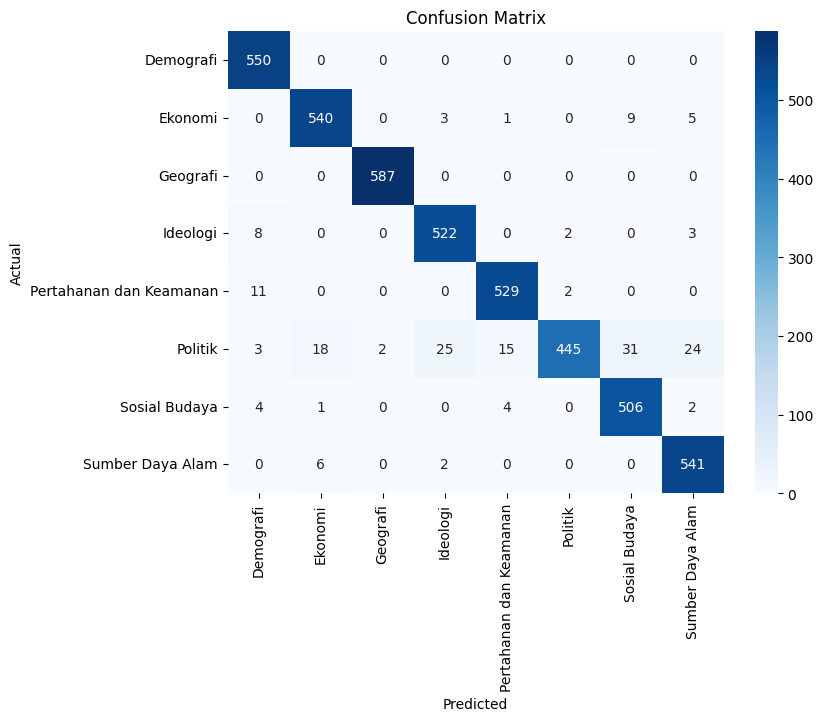

                         precision    recall  f1-score   support

              Demografi       0.95      1.00      0.98       550
                Ekonomi       0.96      0.97      0.96       558
               Geografi       1.00      1.00      1.00       587
               Ideologi       0.95      0.98      0.96       535
Pertahanan dan Keamanan       0.96      0.98      0.97       542
                Politik       0.99      0.79      0.88       563
          Sosial Budaya       0.93      0.98      0.95       517
       Sumber Daya Alam       0.94      0.99      0.96       549

               accuracy                           0.96      4401
              macro avg       0.96      0.96      0.96      4401
           weighted avg       0.96      0.96      0.96      4401



In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Predict on the testing data
y_pred_proba = model.predict(X_test_tfidf)
y_pred = np.argmax(y_pred_proba, axis=1)  # Convert probabilities to class labels

# Convert y_test from one-hot encoded back to numeric labels
y_test_numeric = np.argmax(y_test, axis=1)

# Generate confusion matrix
cm = confusion_matrix(y_test_numeric, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Print classification report
report = classification_report(y_test_numeric, y_pred, target_names=label_encoder.classes_)
print(report)


In [ ]:
# Print some actual vs predicted labels along with clean_text text
print("Actual vs Predicted Labels with Tweet Text:")
for clean_text, actual_label, predicted_label in zip(X_test[:10], y_test[:10], y_pred[:10]):
    print("Tweet:", clean_text)
    print("Actual Label:", actual_label)
    print("Predicted Label:", predicted_label)
    print("-----------------------")

Actual vs Predicted Labels with Tweet Text:
Tweet: capres kantong potensi kaya alam ikan malu kumpar
Actual Label: [0. 0. 0. 0. 0. 0. 0. 1.]
Predicted Label: 7
-----------------------
Tweet: talk lot nama gen kin
Actual Label: [0. 0. 0. 0. 0. 0. 1. 0.]
Predicted Label: 6
-----------------------
Tweet: salah gusur kampung gusur tata wilayah kumuh pemprov
Actual Label: [0. 0. 0. 0. 0. 0. 1. 0.]
Predicted Label: 6
-----------------------
Tweet: makan bareng tani solok area asli solok pengin gen pul
Actual Label: [0. 0. 0. 0. 0. 0. 0. 1.]
Predicted Label: 7
-----------------------
Tweet: wakil ketua dewan pakar atm cerita langkah bidang tani desa dekade
Actual Label: [0. 0. 0. 0. 0. 0. 0. 1.]
Predicted Label: 7
-----------------------
Tweet: umat islam dukung sultan islam tua indonesia pulau tidore malu utara dukung kota ternate
Actual Label: [0. 0. 1. 0. 0. 0. 0. 0.]
Predicted Label: 2
-----------------------
Tweet: strategi jitu bebas nelayan jerat hutang spirit kembang ekonomi biru angk

## Using LSTM

In [ ]:
df_mod_lstm = bfr_mod.copy()

In [ ]:
df_mod_lstm.head(2)

,label,clean_after_stemming
0,Demografi,pimpin sejati dengar paham rakyat sosok paham ...
1,Demografi,afdol desak bawa wan hin rona


In [ ]:
#df_mod_lstm.drop(columns=['text', 'clean_text', 'indonesian_english_word_only', 'divide_word', 'word_count', 'pre_text_2'], inplace=True)

In [ ]:
df_mod_lstm = df_mod_lstm.rename(columns={'clean_after_stemming': 'clean_text'})

In [ ]:
def vectorize_data(text_data):
    # Join the tokenized text into strings
    text_data_strings = [" ".join(tokens) for tokens in text_data]
    # Initialize TfidfVectorizer
    tfidf_vectorizer = TfidfVectorizer()
    # Fit and transform the text data to generate TF-IDF vectors
    tfidf_vectors = tfidf_vectorizer.fit_transform(text_data_strings)
    return tfidf_vectors, tfidf_vectorizer

In [ ]:

# df_mod contains preprocessed text data
# Convert list of words into a single string for each entry in 'clean_text' column
#df_mod['clean_text'] = df_mod['clean_text'].apply(lambda x: ' '.join(x))

# Split data into features (X) and target (y)
X = df_mod_lstm['clean_text']  # Features
y = df_mod_lstm['label']  # Target

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)


Shape of X_train: (17618,)
Shape of X_test: (4405,)
Shape of y_train: (17618,)
Shape of y_test: (4405,)


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import random

# Assuming df_mod_lstm is a DataFrame with 'clean_text' and 'label' columns
# df_mod_lstm = pd.read_csv('path_to_your_dataset.csv')

# Split data into features (X) and target (y)
X = df_mod_lstm['clean_text']  # Features
y = df_mod_lstm['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

# Reshape X_train_tfidf dan X_test_tfidf untuk LSTM
X_train_lstm = X_train_tfidf.reshape((X_train_tfidf.shape[0], 1, X_train_tfidf.shape[1]))
X_test_lstm = X_test_tfidf.reshape((X_test_tfidf.shape[0], 1, X_test_tfidf.shape[1]))

# Define the hyperparameter grid
param_grid = {
    'units_lstm_1': [64, 128, 256],
    'units_lstm_2': [32, 64, 128],
    'dropout_rate': [0.2, 0.1, 0.01],
    'learning_rate': [1e-4, 1e-3, 1e-2]
}

# Function to create an LSTM model with specific hyperparameters
def build_model(units_lstm_1, units_lstm_2, dropout_rate, learning_rate):
    model = Sequential()
    model.add(LSTM(units=units_lstm_1, input_shape=(1, X_train_tfidf.shape[1]), return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(units=units_lstm_2))
    model.add(Dropout(dropout_rate))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(len(label_encoder.classes_), activation='softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer=Adam(learning_rate=learning_rate),
                  metrics=['accuracy'])
    return model

# Random search over hyperparameters with a limit on the number of trials
max_trials = 10
trial_count = 0

best_model_lstm = None
best_accuracy = 0
best_params = {}

while trial_count < max_trials:
    # Randomly select hyperparameters
    units_lstm_1 = random.choice(param_grid['units_lstm_1'])
    units_lstm_2 = random.choice(param_grid['units_lstm_2'])
    dropout_rate = random.choice(param_grid['dropout_rate'])
    learning_rate = random.choice(param_grid['learning_rate'])

    print(f"Training with units_lstm_1={units_lstm_1}, units_lstm_2={units_lstm_2}, "
          f"dropout_rate={dropout_rate}, learning_rate={learning_rate}")

    model = build_model(units_lstm_1, units_lstm_2, dropout_rate, learning_rate)

    # Train the model
    history = model.fit(X_train_lstm, y_train, batch_size=32, epochs=10, validation_split=0.2, verbose=0)

    # Evaluate the model
    loss, accuracy = model.evaluate(X_test_lstm, y_test, verbose=0)
    print(f"Test accuracy: {accuracy:.4f}")

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model_lstm = model
        best_params = {
            'units_lstm_1': units_lstm_1,
            'units_lstm_2': units_lstm_2,
            'dropout_rate': dropout_rate,
            'learning_rate': learning_rate
        }

    trial_count += 1

print(f"Best parameters: {best_params}")
print(f"Best test accuracy: {best_accuracy:.4f}")

# Save the best model
best_model_lstm.save('/content/lstm_model_best_new.h5')


Training with units_lstm_1=64, units_lstm_2=128, dropout_rate=0.1, learning_rate=0.001
Test accuracy: 0.9521
Training with units_lstm_1=64, units_lstm_2=64, dropout_rate=0.1, learning_rate=0.001
Test accuracy: 0.9637
Training with units_lstm_1=256, units_lstm_2=32, dropout_rate=0.2, learning_rate=0.0001
Test accuracy: 0.9394
Training with units_lstm_1=128, units_lstm_2=64, dropout_rate=0.1, learning_rate=0.001
Test accuracy: 0.9600
Training with units_lstm_1=128, units_lstm_2=32, dropout_rate=0.2, learning_rate=0.0001
Test accuracy: 0.9346
Training with units_lstm_1=256, units_lstm_2=64, dropout_rate=0.01, learning_rate=0.01
Test accuracy: 0.9696
Training with units_lstm_1=128, units_lstm_2=128, dropout_rate=0.01, learning_rate=0.001
Test accuracy: 0.9539
Training with units_lstm_1=128, units_lstm_2=32, dropout_rate=0.01, learning_rate=0.0001
Test accuracy: 0.9373
Training with units_lstm_1=256, units_lstm_2=128, dropout_rate=0.2, learning_rate=0.01
Test accuracy: 0.9650
Training with 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 1/100
441/441 [==============================] - 47s 96ms/step - loss: 0.4767 - accuracy: 0.8343 - val_loss: 0.2557 - val_accuracy: 0.9276
Epoch 2/100
441/441 [==============================] - 41s 92ms/step - loss: 0.1132 - accuracy: 0.9635 - val_loss: 0.1519 - val_accuracy: 0.9552
Epoch 3/100
441/441 [==============================] - 45s 101ms/step - loss: 0.0703 - accuracy: 0.9752 - val_loss: 0.1575 - val_accuracy: 0.9572
Epoch 4/100
441/441 [==============================] - 41s 92ms/step - loss: 0.0546 - accuracy: 0.9791 - val_loss: 0.1771 - val_accuracy: 0.9563
Epoch 5/100
441/441 [==============================] - 44s 99ms/step - loss: 0.0533 - accuracy: 0.9797 - val_loss: 0.1835 - val_accuracy: 0.9637
Epoch 6/100
441/441 [==============================] - 43s 96ms/step - loss: 0.0488 - accuracy: 0.9806 - val_loss: 0.2112 - val_accuracy: 0.9591
Epoch 7/100
441/441 [==============================] - 43s 99ms/step - loss: 0.0446 - accuracy: 0.9823 - val_loss: 0.2318 - val_a

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


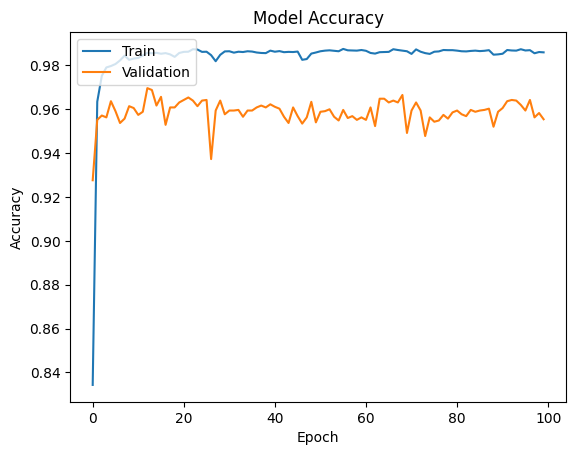

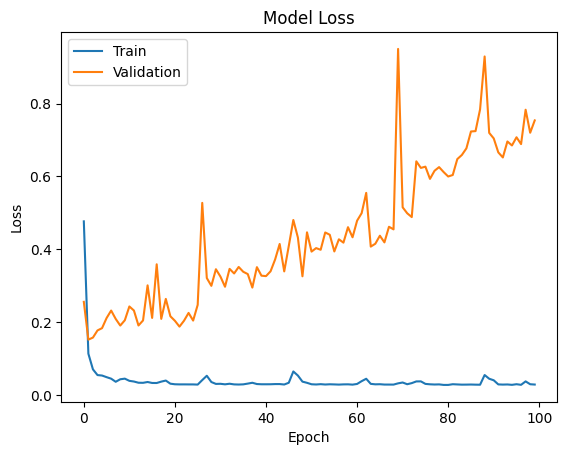

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import matplotlib.pyplot as plt

# Split data into features (X) and target (y)
X = df_mod_lstm['clean_text']  # Features
y = df_mod_lstm['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

# Reshape X_train_tfidf dan X_test_tfidf untuk LSTM
X_train_lstm = X_train_tfidf.reshape((X_train_tfidf.shape[0], 1, X_train_tfidf.shape[1]))
X_test_lstm = X_test_tfidf.reshape((X_test_tfidf.shape[0], 1, X_test_tfidf.shape[1]))

# Best hyperparameters
best_params = {'units_lstm_1': 256, 'units_lstm_2': 64, 'dropout_rate': 0.01, 'learning_rate': 0.01}

# Define LSTM model with best hyperparameters
model_lstm_best = Sequential([
    LSTM(units=best_params['units_lstm_1'], input_shape=(1, X_train_tfidf.shape[1]), return_sequences=True),
    Dropout(best_params['dropout_rate']),
    LSTM(units=best_params['units_lstm_2']),
    Dropout(best_params['dropout_rate']),
    Dense(32, activation='relu'),
    Dropout(best_params['dropout_rate']),
    Dense(len(label_encoder.classes_), activation='softmax')
])

# Compile LSTM model
model_lstm_best.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=best_params['learning_rate']), metrics=['accuracy'])

# Train LSTM model with validation data
history_lstm = model_lstm_best.fit(X_train_lstm, y_train, batch_size=32, epochs=100, validation_split=0.2, verbose=1)

# Evaluate LSTM model on testing data
loss_lstm, accuracy_lstm = model_lstm_best.evaluate(X_test_lstm, y_test, verbose=0)
print(f'LSTM Test Loss: {loss_lstm:.4f}, Test Accuracy: {accuracy_lstm:.4f}')

# Save the model to .h5 file
model_lstm_best.save('/content/lstm_model_best_new.h5')

# Plot training & validation accuracy values
plt.plot(history_lstm.history['accuracy'])
plt.plot(history_lstm.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_lstm.history['loss'])
plt.plot(history_lstm.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

138/138 [==============================] - 7s 34ms/step


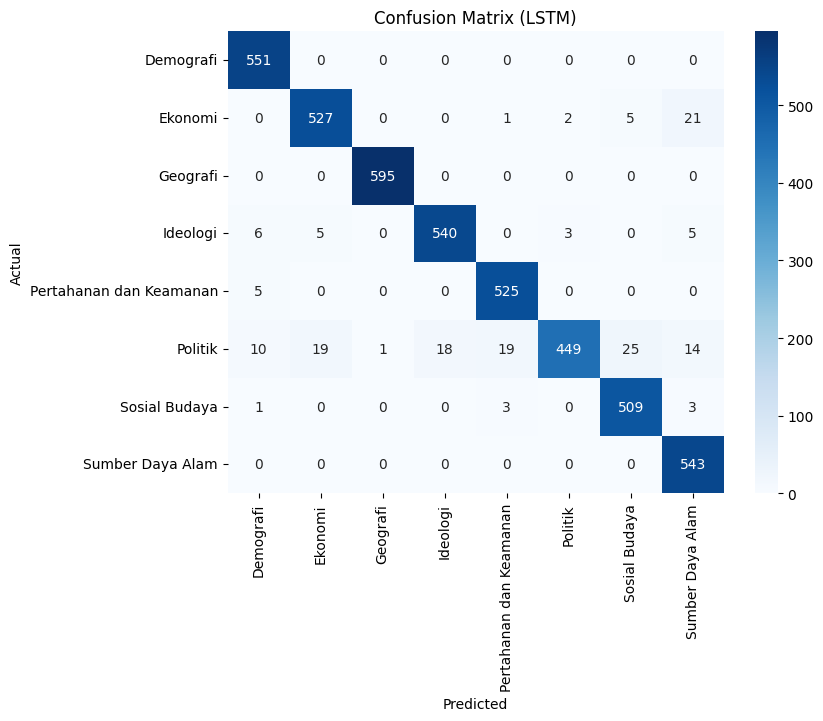

Classification Report (LSTM):
                          precision    recall  f1-score   support

              Demografi       0.96      1.00      0.98       551
                Ekonomi       0.96      0.95      0.95       556
               Geografi       1.00      1.00      1.00       595
               Ideologi       0.97      0.97      0.97       559
Pertahanan dan Keamanan       0.96      0.99      0.97       530
                Politik       0.99      0.81      0.89       555
          Sosial Budaya       0.94      0.99      0.96       516
       Sumber Daya Alam       0.93      1.00      0.96       543

               accuracy                           0.96      4405
              macro avg       0.96      0.96      0.96      4405
           weighted avg       0.96      0.96      0.96      4405



In [ ]:
# Predict on the testing data (LSTM)
y_pred_proba_lstm = model_lstm_best.predict(X_test_lstm)
y_pred_lstm = np.argmax(y_pred_proba_lstm, axis=1)

# Convert y_test from one-hot encoded back to numeric labels
y_test_numeric_lstm = np.argmax(y_test, axis=1)

# Generate confusion matrix (LSTM)
cm_lstm = confusion_matrix(y_test_numeric_lstm, y_pred_lstm)

# Plot confusion matrix (LSTM)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_lstm, annot=True, cmap='Blues', fmt='g', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (LSTM)')
plt.show()

# Print classification report (LSTM)
report_lstm = classification_report(y_test_numeric_lstm, y_pred_lstm, target_names=label_encoder.classes_)
print("Classification Report (LSTM):\n", report_lstm)


In [ ]:
# Split data into features (X) and target (y)
X = df_mod_lstm['clean_text']  # Features
y = df_mod_lstm['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

from tensorflow.keras.layers import LSTM

# Reshape X_train_tfidf dan X_test_tfidf untuk LSTM
X_train_lstm = X_train_tfidf.reshape((X_train_tfidf.shape[0], 1, X_train_tfidf.shape[1]))
X_test_lstm = X_test_tfidf.reshape((X_test_tfidf.shape[0], 1, X_test_tfidf.shape[1]))

# Define LSTM model with more layers
model_lstm = Sequential([
    LSTM(128, input_shape=(1, X_train_tfidf.shape[1]), return_sequences=True),
    Dropout(0.5),
    LSTM(64),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(len(label_encoder.classes_), activation='softmax')
])

# Compile LSTM model
model_lstm.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Train LSTM model with validation data
history_lstm = model_lstm.fit(X_train_lstm, y_train, batch_size=32, epochs=10,
                              validation_split=0.2, verbose=1)

# Evaluate LSTM model on testing data
loss_lstm, accuracy_lstm = model_lstm.evaluate(X_test_lstm, y_test, verbose=0)
print(f'LSTM Test Loss: {loss_lstm:.4f}, Test Accuracy: {accuracy_lstm:.4f}')
# Save the model to .h5 file
model_lstm.save('/content/lstm_model.h5')


Epoch 1/10
440/440 [==============================] - 27s 50ms/step - loss: 1.4009 - accuracy: 0.4879 - val_loss: 0.5742 - val_accuracy: 0.8168
Epoch 2/10
440/440 [==============================] - 18s 41ms/step - loss: 0.5892 - accuracy: 0.7982 - val_loss: 0.2940 - val_accuracy: 0.9088
Epoch 3/10
440/440 [==============================] - 20s 44ms/step - loss: 0.3767 - accuracy: 0.8796 - val_loss: 0.2137 - val_accuracy: 0.9301
Epoch 4/10
440/440 [==============================] - 19s 44ms/step - loss: 0.2791 - accuracy: 0.9120 - val_loss: 0.1790 - val_accuracy: 0.9420
Epoch 5/10
440/440 [==============================] - 20s 45ms/step - loss: 0.2319 - accuracy: 0.9302 - val_loss: 0.1549 - val_accuracy: 0.9494
Epoch 6/10
440/440 [==============================] - 19s 43ms/step - loss: 0.1878 - accuracy: 0.9401 - val_loss: 0.1491 - val_accuracy: 0.9520
Epoch 7/10
440/440 [==============================] - 19s 43ms/step - loss: 0.1738 - accuracy: 0.9457 - val_loss: 0.1509 - val_accuracy:

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


138/138 [==============================] - 2s 8ms/step


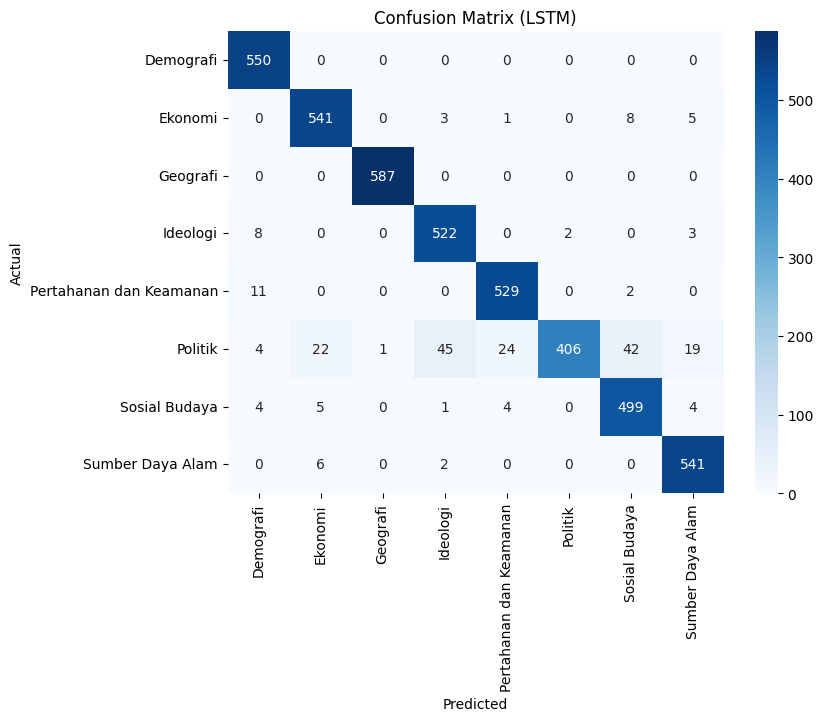

Classification Report (LSTM):
                          precision    recall  f1-score   support

              Demografi       0.95      1.00      0.98       550
                Ekonomi       0.94      0.97      0.96       558
               Geografi       1.00      1.00      1.00       587
               Ideologi       0.91      0.98      0.94       535
Pertahanan dan Keamanan       0.95      0.98      0.96       542
                Politik       1.00      0.72      0.84       563
          Sosial Budaya       0.91      0.97      0.93       517
       Sumber Daya Alam       0.95      0.99      0.97       549

               accuracy                           0.95      4401
              macro avg       0.95      0.95      0.95      4401
           weighted avg       0.95      0.95      0.95      4401



In [ ]:
# Predict on the testing data (LSTM)
y_pred_proba_lstm = model_lstm.predict(X_test_lstm)
y_pred_lstm = np.argmax(y_pred_proba_lstm, axis=1)

# Convert y_test from one-hot encoded back to numeric labels
y_test_numeric_lstm = np.argmax(y_test, axis=1)

# Generate confusion matrix (LSTM)
cm_lstm = confusion_matrix(y_test_numeric_lstm, y_pred_lstm)

# Plot confusion matrix (LSTM)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_lstm, annot=True, cmap='Blues', fmt='g', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (LSTM)')
plt.show()

# Print classification report (LSTM)
report_lstm = classification_report(y_test_numeric_lstm, y_pred_lstm, target_names=label_encoder.classes_)
print("Classification Report (LSTM):\n", report_lstm)


## Using RNN

In [ ]:
df_mod_rnn = bfr_mod.copy()

In [ ]:
df_mod_rnn.head(2)

,label,clean_after_stemming
0,Demografi,pimpin sejati dengar paham rakyat sosok paham ...
1,Demografi,afdol desak bawa wan hin rona


In [ ]:
#df_mod_rnn.drop(columns=['text', 'clean_text', 'indonesian_english_word_only', 'divide_word', 'word_count', 'pre_text_2'], inplace=True)

In [ ]:
df_mod_rnn = df_mod_rnn.rename(columns={'clean_after_stemming': 'clean_text'})

In [ ]:
def vectorize_data(text_data):
    # Join the tokenized text into strings
    text_data_strings = [" ".join(tokens) for tokens in text_data]
    # Initialize TfidfVectorizer
    tfidf_vectorizer = TfidfVectorizer()
    # Fit and transform the text data to generate TF-IDF vectors
    tfidf_vectors = tfidf_vectorizer.fit_transform(text_data_strings)
    return tfidf_vectors, tfidf_vectorizer

In [ ]:

# df_mod contains preprocessed text data
# Convert list of words into a single string for each entry in 'clean_text' column
#df_mod['clean_text'] = df_mod['clean_text'].apply(lambda x: ' '.join(x))

# Split data into features (X) and target (y)
X = df_mod_rnn['clean_text']  # Features
y = df_mod_rnn['label']  # Target

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)


Shape of X_train: (17618,)
Shape of X_test: (4405,)
Shape of y_train: (17618,)
Shape of y_test: (4405,)


Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.2, learning_rate=0.1
Test accuracy: 0.2745
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.2, learning_rate=0.001
Test accuracy: 0.9500
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.2, learning_rate=0.01
Test accuracy: 0.9464
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.1, learning_rate=0.1
Test accuracy: 0.3626
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.1, learning_rate=0.001
Test accuracy: 0.9502
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.1, learning_rate=0.01
Test accuracy: 0.9505
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.01, learning_rate=0.1
Test accuracy: 0.1334
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.01, learning_rate=0.001
Test accuracy: 0.9498
Training with units_rnn_1=128, units_rnn_2=32, dropout_rate=0.01, learning_rate=0.01
Test accuracy: 0.9466
Training with units_rnn_1=128, units_rnn_2=

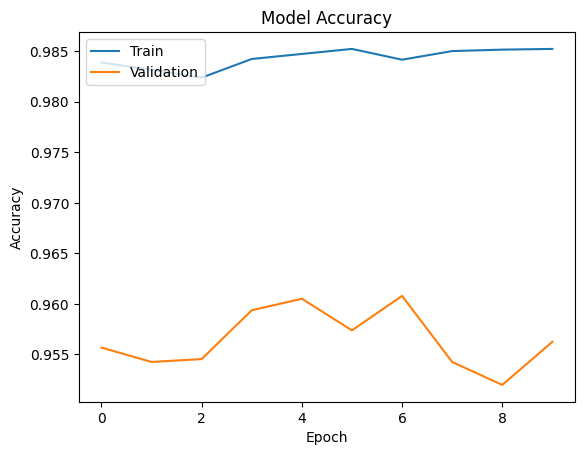

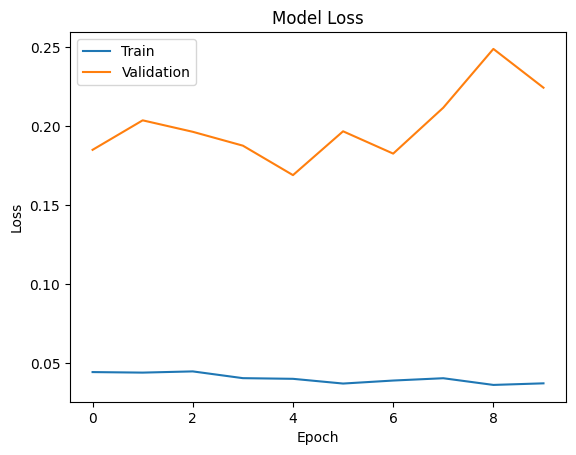

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import matplotlib.pyplot as plt

# Split data into features (X) and target (y)
X = df_mod_rnn['clean_text']  # Features
y = df_mod_rnn['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

# Reshape X_train_tfidf dan X_test_tfidf untuk RNN
X_train_rnn = X_train_tfidf.reshape((X_train_tfidf.shape[0], 1, X_train_tfidf.shape[1]))
X_test_rnn = X_test_tfidf.reshape((X_test_tfidf.shape[0], 1, X_test_tfidf.shape[1]))

# Define the hyperparameter grid
param_grid = {
    'units_rnn_1': [128, 256],
    'units_rnn_2': [32, 64],
    'dropout_rate': [0.2, 0.1, 0.01],
    'learning_rate': [0.1, 1e-3, 1e-2]
}

# Function to create an RNN model with specific hyperparameters
def build_model(units_rnn_1, units_rnn_2, dropout_rate, learning_rate):
    model = Sequential()
    model.add(SimpleRNN(units=units_rnn_1, input_shape=(1, X_train_tfidf.shape[1]), return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(SimpleRNN(units=units_rnn_2))
    model.add(Dropout(dropout_rate))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(len(label_encoder.classes_), activation='softmax'))

    model.compile(loss='categorical_crossentropy',
                  optimizer=Adam(learning_rate=learning_rate),
                  metrics=['accuracy'])
    return model

# Grid search over hyperparameters with a limit on the number of trials
max_trials = 20
trial_count = 0

best_model_rnn = None
best_accuracy = 0
best_params = {}

for units_rnn_1 in param_grid['units_rnn_1']:
    for units_rnn_2 in param_grid['units_rnn_2']:
        for dropout_rate in param_grid['dropout_rate']:
            for learning_rate in param_grid['learning_rate']:
                if trial_count >= max_trials:
                    break

                print(f"Training with units_rnn_1={units_rnn_1}, units_rnn_2={units_rnn_2}, "
                      f"dropout_rate={dropout_rate}, learning_rate={learning_rate}")

                model = build_model(units_rnn_1, units_rnn_2, dropout_rate, learning_rate)

                # Train the model
                history = model.fit(X_train_rnn, y_train, batch_size=32, epochs=10, validation_split=0.2, verbose=0)

                # Evaluate the model
                loss, accuracy = model.evaluate(X_test_rnn, y_test, verbose=0)
                print(f"Test accuracy: {accuracy:.4f}")

                if accuracy > best_accuracy:
                    best_accuracy = accuracy
                    best_model_rnn = model  # Fixing the assignment here
                    best_params = {
                        'units_rnn_1': units_rnn_1,
                        'units_rnn_2': units_rnn_2,
                        'dropout_rate': dropout_rate,
                        'learning_rate': learning_rate
                    }

                trial_count += 1
                if trial_count >= max_trials:
                    break
            if trial_count >= max_trials:
                break
        if trial_count >= max_trials:
            break
    if trial_count >= max_trials:
        break

print(f"Best parameters: {best_params}")
print(f"Best test accuracy: {best_accuracy:.4f}")

# Train the best model again to get the history
history_best = best_model_rnn.fit(X_train_rnn, y_train, batch_size=32, epochs=10,
                                  validation_split=0.2, verbose=1)

# Plot training & validation accuracy values
plt.plot(history_best.history['accuracy'])
plt.plot(history_best.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_best.history['loss'])
plt.plot(history_best.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Save the best model
best_model_rnn.save('/content/rnn_model_best_simple.h5')


In [ ]:
# Split data into features (X) and target (y)
X = df_mod_rnn['clean_text']  # Features
y = df_mod_rnn['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

from tensorflow.keras.layers import SimpleRNN

# Reshape X_train_tfidf dan X_test_tfidf untuk RNN
X_train_rnn = X_train_tfidf.reshape((X_train_tfidf.shape[0], 1, X_train_tfidf.shape[1]))
X_test_rnn = X_test_tfidf.reshape((X_test_tfidf.shape[0], 1, X_test_tfidf.shape[1]))

# Define RNN model with more layers
model_rnn = Sequential([
    SimpleRNN(128, input_shape=(1, X_train_tfidf.shape[1]), return_sequences=True),
    Dropout(0.5),
    SimpleRNN(64),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(len(label_encoder.classes_), activation='softmax')
])

# Compile RNN model
model_rnn.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

# Train RNN model with validation data
history_rnn = model_rnn.fit(X_train_rnn, y_train, batch_size=32, epochs=10,
                            validation_split=0.2, verbose=1)

# Evaluate RNN model on testing data
loss_rnn, accuracy_rnn = model_rnn.evaluate(X_test_rnn, y_test, verbose=0)
print(f'RNN Test Loss: {loss_rnn:.4f}, Test Accuracy: {accuracy_rnn:.4f}')
# Save the model to .h5 file
model_rnn.save('/content/rnn_model.h5')


Epoch 1/10
440/440 [==============================] - 11s 16ms/step - loss: 1.2210 - accuracy: 0.5656 - val_loss: 0.3942 - val_accuracy: 0.8821
Epoch 2/10
440/440 [==============================] - 6s 14ms/step - loss: 0.4728 - accuracy: 0.8478 - val_loss: 0.2158 - val_accuracy: 0.9341
Epoch 3/10
440/440 [==============================] - 5s 12ms/step - loss: 0.3282 - accuracy: 0.8964 - val_loss: 0.1763 - val_accuracy: 0.9412
Epoch 4/10
440/440 [==============================] - 7s 17ms/step - loss: 0.2657 - accuracy: 0.9186 - val_loss: 0.1646 - val_accuracy: 0.9494
Epoch 5/10
440/440 [==============================] - 5s 12ms/step - loss: 0.2273 - accuracy: 0.9296 - val_loss: 0.1580 - val_accuracy: 0.9543
Epoch 6/10
440/440 [==============================] - 6s 13ms/step - loss: 0.2131 - accuracy: 0.9368 - val_loss: 0.1615 - val_accuracy: 0.9523
Epoch 7/10
440/440 [==============================] - 7s 16ms/step - loss: 0.2055 - accuracy: 0.9386 - val_loss: 0.1465 - val_accuracy: 0.955

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 1/100
441/441 [==============================] - 30s 51ms/step - loss: 0.7529 - accuracy: 0.7715 - val_loss: 0.2369 - val_accuracy: 0.9279
Epoch 2/100
441/441 [==============================] - 20s 46ms/step - loss: 0.1904 - accuracy: 0.9466 - val_loss: 0.1820 - val_accuracy: 0.9461
Epoch 3/100
441/441 [==============================] - 17s 39ms/step - loss: 0.1206 - accuracy: 0.9661 - val_loss: 0.1719 - val_accuracy: 0.9498
Epoch 4/100
441/441 [==============================] - 15s 34ms/step - loss: 0.0914 - accuracy: 0.9730 - val_loss: 0.1948 - val_accuracy: 0.9481
Epoch 5/100
441/441 [==============================] - 11s 26ms/step - loss: 0.0832 - accuracy: 0.9737 - val_loss: 0.2042 - val_accuracy: 0.9469
Epoch 6/100
441/441 [==============================] - 12s 27ms/step - loss: 0.0691 - accuracy: 0.9772 - val_loss: 0.1697 - val_accuracy: 0.9560
Epoch 7/100
441/441 [==============================] - 10s 22ms/step - loss: 0.0598 - accuracy: 0.9798 - val_loss: 0.1988 - val_ac

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


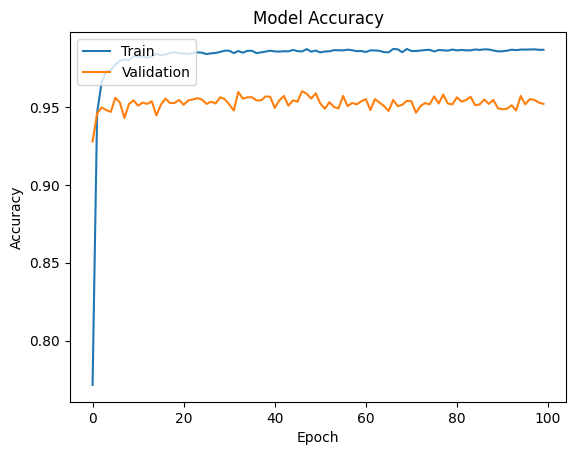

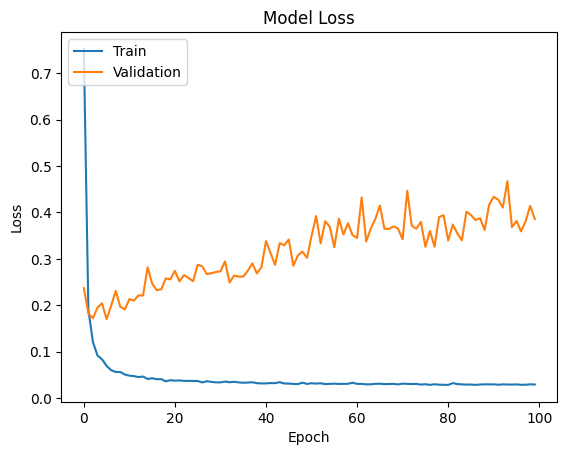

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import matplotlib.pyplot as plt

# Split data into features (X) and target (y)
X = df_mod_rnn['clean_text']  # Features
y = df_mod_rnn['label']  # Target

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
y_categorical = to_categorical(y)  # Convert to one-hot encoded vectors

# Split data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y_categorical, test_size=0.2, random_state=42)

# Convert text data to TF-IDF features
vectorizer = TfidfVectorizer()
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Convert sparse matrix to numpy array
X_train_tfidf = X_train_tfidf.toarray()
X_test_tfidf = X_test_tfidf.toarray()

# Reshape X_train_tfidf dan X_test_tfidf untuk RNN
X_train_rnn = X_train_tfidf.reshape((X_train_tfidf.shape[0], 1, X_train_tfidf.shape[1]))
X_test_rnn = X_test_tfidf.reshape((X_test_tfidf.shape[0], 1, X_test_tfidf.shape[1]))

# Best hyperparameters
best_params = {
    'units_rnn_1': 256,
    'units_rnn_2': 32,
    'dropout_rate': 0.2,
    'learning_rate': 0.001
}

# Define RNN model with best hyperparameters
model_rnn_best = Sequential([
    SimpleRNN(units=best_params['units_rnn_1'], input_shape=(1, X_train_tfidf.shape[1]), return_sequences=True),
    Dropout(best_params['dropout_rate']),
    SimpleRNN(units=best_params['units_rnn_2']),
    Dropout(best_params['dropout_rate']),
    Dense(32, activation='relu'),
    Dropout(best_params['dropout_rate']),
    Dense(len(label_encoder.classes_), activation='softmax')
])

# Compile RNN model
model_rnn_best.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=best_params['learning_rate']), metrics=['accuracy'])

# Train RNN model with validation data
history_rnn = model_rnn_best.fit(X_train_rnn, y_train, batch_size=32, epochs=100, validation_split=0.2, verbose=1)

# Evaluate RNN model on testing data
loss_rnn, accuracy_rnn = model_rnn_best.evaluate(X_test_rnn, y_test, verbose=0)
print(f'RNN Test Loss: {loss_rnn:.4f}, Test Accuracy: {accuracy_rnn:.4f}')

# Save the model to .h5 file
model_rnn_best.save('/content/rnn_model_best_new.h5')

# Plot training & validation accuracy values
plt.plot(history_rnn.history['accuracy'])
plt.plot(history_rnn.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history_rnn.history['loss'])
plt.plot(history_rnn.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

138/138 [==============================] - 1s 6ms/step


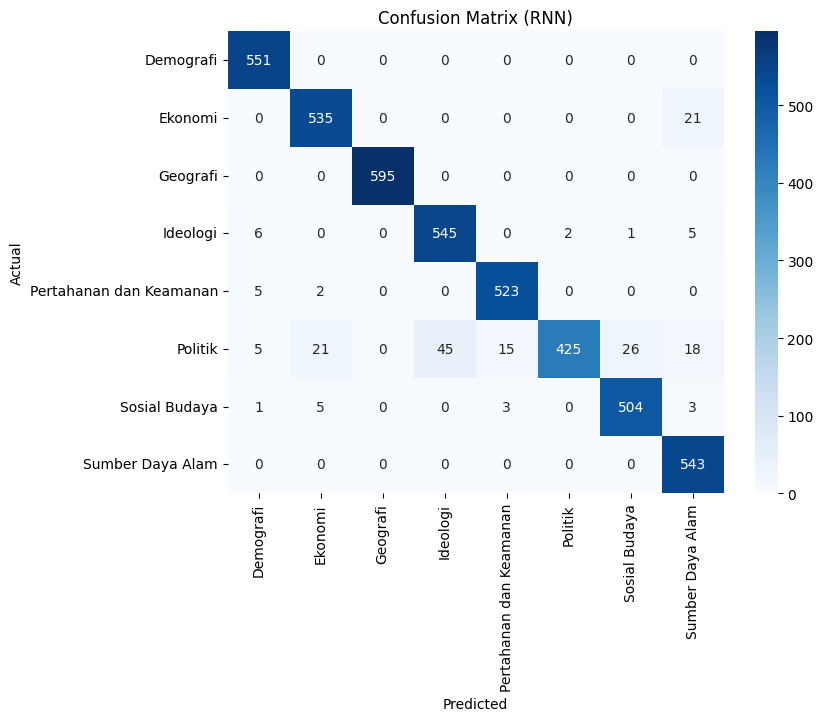

Classification Report (RNN):
                          precision    recall  f1-score   support

              Demografi       0.97      1.00      0.98       551
                Ekonomi       0.95      0.96      0.96       556
               Geografi       1.00      1.00      1.00       595
               Ideologi       0.92      0.97      0.95       559
Pertahanan dan Keamanan       0.97      0.99      0.98       530
                Politik       1.00      0.77      0.87       555
          Sosial Budaya       0.95      0.98      0.96       516
       Sumber Daya Alam       0.92      1.00      0.96       543

               accuracy                           0.96      4405
              macro avg       0.96      0.96      0.96      4405
           weighted avg       0.96      0.96      0.96      4405



In [ ]:
# Predict on the testing data (RNN)
y_pred_proba_rnn = model_rnn_best.predict(X_test_rnn)
y_pred_rnn = np.argmax(y_pred_proba_rnn, axis=1)

# Convert y_test from one-hot encoded back to numeric labels
y_test_numeric_rnn = np.argmax(y_test, axis=1)

# Generate confusion matrix (RNN)
cm_rnn = confusion_matrix(y_test_numeric_rnn, y_pred_rnn)

# Plot confusion matrix (RNN)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rnn, annot=True, cmap='Blues', fmt='g', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (RNN)')
plt.show()

# Print classification report (RNN)
report_rnn = classification_report(y_test_numeric_rnn, y_pred_rnn, target_names=label_encoder.classes_)
print("Classification Report (RNN):\n", report_rnn)

#Kesimpulan

In [ ]:
print('accuracy RandomForest Best Model',accuracy_rf)
print('accuracy Custom Neural Network',accuracy_nn)
print('accuracy LSTM',accuracy_lstm)
print('accuracy RNN',accuracy_rnn)
print('accuracy XGBoost',accuracy)

accuracy RandomForest Best Model 0.7686889343331061
accuracy Custom Neural Network 0.9588729739189148
accuracy LSTM 0.9486480355262756
accuracy RNN 0.9506930112838745
accuracy XGBoost 0.9568279936378096


#TESTING RF & XGB

In [ ]:
import pandas as pd
import pickle
import re
from sklearn.feature_extraction.text import TfidfVectorizer

# Mapping antara angka hasil prediksi dan label yang sesuai
label_mapping = {
    0: 'Politik',
    1: 'Sosial Budaya',
    2: 'Pertahanan dan Keamanan',
    3: 'Ideologi',
    4: 'Ekonomi',
    5: 'Sumber Daya Alam',
    6: 'Demografi',
    7: 'Geografi'
}

# Memuat model dari file .pkl
with open('/content/xgb_classifier.pkl', 'rb') as f:
    model = pickle.load(f)

# Membaca data dari file Excel
data = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in data.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Preprocessing function for text
def preprocess_text(text, slang_dict):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)

    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[slang_dict['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    stop_words = set(['dan', 'di', 'yang', 'ke', 'dari'])  # Add stopwords as needed
    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
data['Text'] = data['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus))
indonesian_stop_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
    # Tambahkan stop words lainnya sesuai kebutuhan
]

# Menggunakan parameter yang diketahui atau default untuk TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words=indonesian_stop_words, max_features=5132, ngram_range=(1, 2))

# Fit dan transform data teks
X_test = vectorizer.fit_transform(data['Text'])

# Melakukan prediksi untuk setiap data uji
data['Kelas'] = model.predict(X_test)

# Mengganti angka hasil prediksi dengan kelas yang sesuai
data['Kelas'] = data['Kelas'].map(label_mapping)

# Menyimpan hasil prediksi ke dalam file CSV
data.drop(columns=['Text'], inplace=True)
data.to_csv('test2.csv', index=False)


In [ ]:
ss = pd.read_csv('/content/test2.csv')
ss['Kelas'].value_counts()

Kelas
Sumber Daya Alam           574
Demografi                  237
Ekonomi                    101
Geografi                    35
Ideologi                    21
Sosial Budaya               15
Politik                     10
Pertahanan dan Keamanan      7
Name: count, dtype: int64

TEST BARU

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import joblib
import re

# Load trained model
model_path = '/content/random_forest_model.pkl'
rf_classifier = joblib.load(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Preprocessing function for text
def preprocess_text(text):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)
    stop_words = set([
        'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
        'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
        'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
        'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
        # Tambahkan stop words lainnya sesuai kebutuhan
    ])  # Add stopwords as needed
    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x))

indonesian_stop_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
    # Tambahkan stop words lainnya sesuai kebutuhan
]

# Define TfidfVectorizer with the same parameters as during training
vectorizer = TfidfVectorizer(stop_words=indonesian_stop_words, max_features=5132, ngram_range=(1, 2))

# Fit the vectorizer on your new data
X_train_tfidf = vectorizer.fit_transform(df['Text'])

# Perform prediction
predictions = rf_classifier.predict(X_train_tfidf)

# Add 'Kelas' column to the DataFrame with predicted labels
df['Kelas'] = predictions

# Save DataFrame with predictions to CSV file
df.to_csv('/content/hasil_klasifikasi_rf.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())


    IDText                                               Text  \
0  TXT0001  lu mau org prodemokrasi negara bisa punya kese...   
1  TXT0002  prabowo ditanya soal hutang luar negeri dia me...   
2  TXT0003  kikidaliyo ganjar pranowo itulah beliau sosok ...   
3  TXT0004  kumparan prabowo gibran bisa melakukan semua d...   
4  TXT0005  sniperruben udazulhendra ainunnajib lah justru...   

                     Kelas  
0                 Geografi  
1                  Politik  
2  Pertahanan dan Keamanan  
3                 Geografi  
4                  Politik  


In [ ]:
df_rf = pd.read_csv('/content/hasil_klasifikasi_rf.csv')

In [ ]:
df_rf['Kelas'].value_counts()

Kelas
Geografi                   483
Politik                    407
Sosial Budaya               60
Pertahanan dan Keamanan     28
Sumber Daya Alam            10
Ekonomi                      7
Ideologi                     4
Demografi                    1
Name: count, dtype: int64

In [ ]:
df_rf.head(20)

,IDText,Text,Kelas
0,TXT0001,lu mau org prodemokrasi negara bisa punya kese...,Geografi
1,TXT0002,prabowo ditanya soal hutang luar negeri dia me...,Politik
2,TXT0003,kikidaliyo ganjar pranowo itulah beliau sosok ...,Pertahanan dan Keamanan
3,TXT0004,kumparan prabowo gibran bisa melakukan semua d...,Geografi
4,TXT0005,sniperruben udazulhendra ainunnajib lah justru...,Politik
5,TXT0006,nelayan tak bisa terus terjebak kredit macet g...,Politik
6,TXT0007,prabowo anti kebebasan pers,Geografi
7,TXT0008,kontrak terbuka ganjar pranowo cermin kepeduli...,Politik
8,TXT0009,ganjar mahfud hebat coblos gm ganjarmahfud pak...,Politik
9,TXT0010,ganjarmahfud harapan baru pertumbuhan ekonomi ...,Geografi


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import joblib
import re

# Load trained model
model_path = '/content/drive/MyDrive/BDC_Masawangan/random_forest_model.pkl'
rf_classifier = joblib.load(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Preprocessing function for text
def preprocess_text(text, slang_dict):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)

    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[slang_dict['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    stop_words = set([
        'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
        'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
        'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
        'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
        # Tambahkan stop words lainnya sesuai kebutuhan
    ])  # Add stopwords as needed
    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus))

indonesian_stop_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
    # Tambahkan stop words lainnya sesuai kebutuhan
]

# Define TfidfVectorizer with the same parameters as during training
vectorizer = TfidfVectorizer(stop_words=indonesian_stop_words, max_features=5132, ngram_range=(1, 2))

# Fit the vectorizer on your new data
X_train_tfidf = vectorizer.fit_transform(df['Text'])

# Perform prediction
predictions = rf_classifier.predict(X_train_tfidf)

# Add 'Kelas' column to the DataFrame with predicted labels
df['Kelas'] = predictions

# Save DataFrame with predictions to CSV file
df.to_csv('/content/hasil_klasifikasi_21:46.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())


KeyboardInterrupt: 

In [ ]:
# Fungsi untuk memuat kamus dari URL
def load_kamus_from_url(url):
    response = requests.get(url)
    if response.status_code == 200:
        kamus = set(response.text.splitlines())
        return kamus
    else:
        print("Gagal memuat kamus. Status code:", response.status_code)
        return None
# URL kamus
url = 'https://raw.githubusercontent.com/romanouke/satria_data2/main/kumpulan_kata.txt'
# Memuat kamus dari URL
kamus = load_kamus_from_url(url)
if kamus:
    print("Kamus berhasil dimuat dengan", len(kamus), "kata.")
else:
    print("Gagal memuat kamus.")

Kamus berhasil dimuat dengan 112933 kata.


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import joblib
import re

# Load trained model
model_path = '/content/drive/MyDrive/BDC_Masawangan/random_forest_model.pkl'
rf_classifier = joblib.load(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Function to split combined words
import langid
def clean_non_indonesian_english_words(clean_text, kamus):
    words = clean_text.split()
    cleaned_words = []
    for word in words:
        lang, _ = langid.classify(word)
        if lang == 'id' or lang == 'en':  # Hanya menyertakan kata-kata dalam bahasa Indonesia atau Inggris
            if word.lower() in kamus:
                cleaned_words.append(word)
        else:  # Menyertakan kata-kata dalam bahasa lain
            cleaned_words.append(word)
    return ' '.join(cleaned_words)

# Terapkan fungsi pembersihan ke kolom
df['Text'] = df['Text'].apply(lambda x: clean_non_indonesian_english_words(x, kamus))

# Preprocessing function for text
def preprocess_text(text):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)
    return text

# Function to remove stop words
def remove_stop_words(text, stop_words):
    return ' '.join([kata for kata in text.split() if kata not in stop_words])

# Define stop words
indonesian_stop_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
    # Add more stop words as needed
]

# Apply preprocessing
df['Text'] = df['Text'].apply(preprocess_text)

# Apply word separation
#df['Text'] = df['Text'].apply(lambda x: ' '.join(pemisah_kata(x, singkatan_kamus['slang'].values)))

# Apply slang replacement
def replace_slang(words, slang_dict):
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[slang_dict['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    return words

df['Text'] = df['Text'].apply(lambda x: ' '.join(replace_slang(x.split(), singkatan_kamus)))

# Remove stop words
df['Text'] = df['Text'].apply(lambda x: remove_stop_words(x, indonesian_stop_words))

# Create the TfidfVectorizer with the same parameters as during training
vectorizer = TfidfVectorizer(stop_words=indonesian_stop_words, max_features=5132, ngram_range=(1, 2))

# Fit and transform the text data using the vectorizer
X_test_tfidf = vectorizer.fit_transform(df['Text'])

# Perform prediction
predictions = rf_classifier.predict(X_test_tfidf)

# Add 'Kelas' column to the DataFrame with predicted labels
df['Kelas'] = predictions

# Save DataFrame with predictions to CSV file
df.to_csv('/content/hasil_klasifikasi_21:18.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())

    IDText                                               Text     Kelas
0  TXT0001  lu mau prodemokrasi negara bisa punya kesempat...   Politik
1  TXT0002  prabowo soal hutang luar negeri dia menjawab h...   Politik
2  TXT0003  ganjar pranowo itulah beliau sosok nilai nilai...  Geografi
3  TXT0004  prabowo gibran bisa melakukan semua demi kesej...   Politik
4  TXT0005  sniperruben udazulhendra ainunnajib lah justru...   Politik


In [ ]:
df['Kelas'].value_counts()

Kelas
Politik                    464
Geografi                   432
Sosial Budaya               58
Sumber Daya Alam            19
Pertahanan dan Keamanan     13
Ideologi                     7
Ekonomi                      7
Name: count, dtype: int64

In [ ]:
df[df['Kelas'] == 'Sosial Budaya'].head(30)

,IDText,Text,Kelas
48,TXT0049,ganjar hebat ganjarmahfud betul bersihkan indo...,Sosial Budaya
67,TXT0068,perubahan frontal segala penjuru nusantara ani...,Sosial Budaya
93,TXT0094,coba kepada pelanggaran apa dilakukan anies at...,Sosial Budaya
107,TXT0108,salam kopi joni dong gibran prabowogibran teru...,Sosial Budaya
115,TXT0116,cuitcuap pastinya paling mengerti bagaimana me...,Sosial Budaya
117,TXT0118,ejaferdiansyah triliun anggaran belanja menhan...,Sosial Budaya
142,TXT0143,menteri bumn menitipkan tanggung jawab besar m...,Sosial Budaya
145,TXT0146,anies tambah pusing wkwkwk padahal visi misi a...,Sosial Budaya
162,TXT0163,kualitas pendidikan fasilitas kesehatan harus ...,Sosial Budaya
177,TXT0178,nakaharadz mau edukasi bagaimana pun susah he ...,Sosial Budaya


LSTM

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib
from tqdm import tqdm
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
# Load trained model
model_path = '/content/lstm_model_hpt.h5'  # Path to your LSTM model
lstm_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Preprocessing function for text
def preprocess_text(text, slang_dict):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)

    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[slang_dict['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    stop_words = set(['dan', 'di', 'yang', 'ke', 'dari'])  # Add stopwords as needed
    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus))
indonesian_stop_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
    # Tambahkan stop words lainnya sesuai kebutuhan
]

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=5133)  # Pad to match the expected feature dimension

    # Reshape input to match LSTM input shape
    X_predict = np.reshape(X_predict, (X_predict.shape[0], 1, X_predict.shape[1]))

    # Perform prediction using the LSTM model
    prediction = lstm_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class

# Predict classes for each text in DataFrame
df['Kelas'] = df['Text'].apply(predict_class)

# Save DataFrame with predictions to CSV file
df.to_csv('/content/hasil_klasifikasi_lstm1232.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

In [ ]:
df_pre2 = pd.read_csv('/content/hasil_klasifikasi_lstm1232.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
df_pre2['Kelas'] = df_pre2['Kelas'].replace(label_mapping)

In [ ]:
df_pre2['Kelas'].value_counts()

Kelas
Pertahanan dan Keamanan    222
Politik                    184
Ekonomi                    163
Sumber Daya Alam           132
Geografi                   129
Demografi                   80
Ideologi                    77
Sosial Budaya               13
Name: count, dtype: int64

In [ ]:
df_pre2.head(30)

,IDText,Text,Kelas
0,TXT0001,lu mau orang prodemokrasi negara ini bisa puny...,Politik
1,TXT0002,prabowo ditanya soal hutang luar negeri dia me...,Ekonomi
2,TXT0003,kikidaliyo ganjar pranowo itulah beliau sosok ...,Ekonomi
3,TXT0004,kumparan prabowo gibran bisa melakukan itu sem...,Ideologi
4,TXT0005,sniperruben udazulhendra ainunnajib lah justru...,Politik
5,TXT0006,nelayan tak bisa terus terjebak dalam kredit m...,Sumber Daya Alam
6,TXT0007,prabowo anti kebebasan pers,Demografi
7,TXT0008,kontrak terbuka ganjar pranowo adalah cermin k...,Pertahanan dan Keamanan
8,TXT0009,ganjar mahfud hebat coblos gm ganjarmahfud pak...,Geografi
9,TXT0010,ganjarmahfud adalah harapan baru untuk pertumb...,Politik


#TEST LSTM

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib
from tqdm import tqdm
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Load trained model
model_path = '/content/lstm_model_best_new.h5'  # Path to your LSTM model
lstm_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Preprocessing function for text
def preprocess_text(text, slang_dict, stop_words):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)

    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[singkatan_kamus['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Combine stop words

indonesian_stop_words = [
    'ada', 'adalah', 'adanya', 'adalah', 'agar', 'akan', 'akankah', 'akhir', 'akhiri', 'akhirnya',
    'aku', 'akulah', 'amat', 'amatlah', 'anda', 'andalah', 'antar', 'antara', 'antaranya', 'apa',
    'apaan', 'apabila', 'apakah', 'apalagi', 'apatah', 'artinya', 'asal', 'asalkan', 'atas', 'atau',
    'ataukah', 'ataupun', 'awal', 'awalnya', 'bagai', 'bagaikan', 'bagaimana', 'bagaimanakah', 'bagaimanapun',
    'bagi', 'bagian', 'bahkan', 'bahwa', 'bahwasanya', 'baik', 'bakal', 'bakalan', 'balik', 'banyak',
    'bapak', 'baru', 'bawah', 'beberapa', 'begini', 'beginian', 'beginikah', 'beginilah', 'begitu', 'begitukah',
    'begitulah', 'begitupun', 'bekerja', 'belakang', 'belakangan', 'belum', 'belumlah', 'benar', 'benarkah',
    'benarlah', 'berada', 'berakhir', 'berakhirlah', 'berakhirnya', 'berapa', 'berapakah', 'berapalah', 'berapapun',
    'berarti', 'berawal', 'berbagai', 'berdatangan', 'beri', 'berikan', 'berikut', 'berikutnya', 'berjumlah',
    'berkali-kali', 'berkata', 'berkehendak', 'berkeinginan', 'berkenaan', 'berlainan', 'berlalu', 'berlangsung',
    'berlebihan', 'bermacam', 'bermacam-macam', 'bermaksud', 'bermula', 'bersama', 'bersama-sama', 'bersiap', 'bersiap-siap',
    'bertanya', 'bertanya-tanya', 'berturut', 'berturut-turut', 'bertutur', 'berujar', 'berupa', 'besar', 'betul',
    'betulkah', 'biasa', 'biasanya', 'bila', 'bilakah', 'bisa', 'bisakah', 'boleh', 'bolehkah', 'bolehlah', 'buat',
    'bukan', 'bukankah', 'bukanlah', 'bukannya', 'bulan', 'bung', 'cara', 'caranya', 'cukup', 'cukupkah', 'cukuplah',
    'cuma', 'dahulu', 'dalam', 'dan', 'dapat', 'dari', 'daripada', 'datang', 'dekat', 'demi', 'demikian', 'demikianlah',
    'dengan', 'depan', 'di', 'dia', 'diakhiri', 'diakhirinya', 'dialah', 'diantara', 'diantaranya', 'diberi', 'diberikan',
    'diberikannya', 'dibuat', 'dibuatnya', 'didapat', 'didatangkan', 'digunakan', 'diibaratkan', 'diibaratkannya',
    'diingat', 'diingatkan', 'diinginkan', 'dijawab', 'dijelaskan', 'dijelaskannya', 'dikarenakan', 'dikatakan', 'dikatakannya',
    'dikerjakan', 'diketahui', 'diketahuinya', 'dikira', 'dilakukan', 'dilalui', 'dilihat', 'dimaksud', 'dimaksudkan',
    'dimaksudkannya', 'dimaksudnya', 'diminta', 'dimintai', 'dimisalkan', 'dimulai', 'dimulailah', 'dimulainya', 'dimungkinkan',
    'dini', 'dipastikan', 'diperbuat', 'diperbuatnya', 'dipergunakan', 'diperkirakan', 'diperlihatkan', 'diperlukan', 'diperlukannya',
    'dipersoalkan', 'dipertanyakan', 'dipunyai', 'diri', 'dirinya', 'disampaikan', 'disebut', 'disebutkan', 'disebutkannya',
    'disini', 'disinilah', 'ditambahkan', 'ditandaskan', 'ditanya', 'ditanyai', 'ditanyakan', 'ditegaskan', 'ditujukan',
    'ditunjuk', 'ditunjuki', 'ditunjukkan', 'ditunjukkannya', 'ditunjuknya', 'dituturkan', 'dituturkannya', 'ditambahkan',
    'dituangkan', 'diucapkan', 'diucapkannya', 'diungkapkan', 'dong', 'dua', 'dulu', 'empat', 'enggak', 'enggaknya', 'entah',
    'entahlah', 'guna', 'gunakan', 'hal', 'hampir', 'hanya', 'hanyalah', 'hari', 'harus', 'haruslah', 'harusnya', 'hendak',
    'hendaklah', 'hendaknya', 'hingga', 'ia', 'ialah', 'ibarat', 'ibaratkan', 'ibaratnya', 'ibu', 'ikut', 'ingat', 'ingat-ingat',
    'ingin', 'inginkah', 'inginkan', 'ini', 'inikah', 'inilah', 'itu', 'itukah', 'itulah', 'jadi', 'jadilah', 'jadinya', 'jangan',
    'jangankan', 'janganlah', 'jauh', 'jawab', 'jawaban', 'jawabnya', 'jelas', 'jelaskan', 'jelaslah', 'jelasnya', 'jika', 'jikalau',
    'juga', 'jumlah', 'jumlahnya', 'justru', 'kadar', 'kala', 'kalau', 'kalaulah', 'kalaupun', 'kalian', 'kami', 'kamilah', 'kamu',
    'kamulah', 'kan', 'kapan', 'kapankah', 'kapanpun', 'karena', 'karenanya', 'kasus', 'kata', 'katakan', 'katakanlah', 'katanya',
    'ke', 'keadaan', 'kebetulan', 'kecil', 'kedua', 'keduanya', 'keinginan', 'kelamaan', 'kelihatan', 'kelihatannya', 'kelima',
    'keluar', 'kembali', 'kemudian', 'kemungkinan', 'kemungkinannya', 'kenapa', 'kepada', 'kepadanya', 'kesampaian', 'keseluruhan',
    'keseluruhannya', 'keterlaluan', 'ketika', 'khususnya', 'kini', 'kinilah', 'kira', 'kira-kira', 'kiranya', 'kita', 'kitalah',
    'kok', 'kurang', 'lagi', 'lagian', 'lah', 'lain', 'lainnya', 'lalu', 'lama', 'lamanya', 'lanjut', 'lanjutnya', 'lebih', 'lewat',
    'lima', 'luar', 'macam', 'maka', 'makanya', 'makin', 'malah', 'malahan', 'mampu', 'mampukah', 'mana', 'manakala', 'manalagi',
    'masa', 'masalah', 'masalahnya', 'masih', 'masihkah', 'masing', 'masing-masing', 'mau', 'maupun', 'melainkan', 'melakukan',
    'melalui', 'melihat', 'melihatnya', 'memang', 'memastikan', 'memberi', 'memberikan', 'membuat', 'memerlukan', 'memihak', 'meminta',
    'memintakan', 'memisalkan', 'memperbuat', 'mempergunakan', 'memperkirakan', 'memperlihatkan', 'mempersiapkan', 'mempersoalkan',
    'mempertanyakan', 'mempunyai', 'memulai', 'memungkinkan', 'menaiki', 'menambahkan', 'menandaskan', 'menanti', 'menantikan',
    'menanya', 'menanyai', 'menanyakan', 'mendapat', 'mendapatkan', 'mendatang', 'mendatangi', 'mendatangkan', 'menegaskan', 'mengakhiri',
    'mengapa', 'mengatakan', 'mengatakannya', 'mengenai', 'mengerjakan', 'mengetahui', 'menggunakan', 'menghendaki', 'mengibaratkan',
    'mengibaratkannya', 'mengingat', 'mengingatkan', 'menginginkan', 'mengira', 'mengucapkan', 'mengucapkannya', 'mengungkapkan',
    'menjadi', 'menjawab', 'menjelaskan', 'menuju', 'menunjuk', 'menunjuki', 'menunjukkan', 'menunjuknya', 'menurut', 'menuturkan',
    'menyampaikan', 'menyangkut', 'menyatakan', 'menyebutkan', 'menyeluruh', 'menyiapkan', 'merasa', 'mereka', 'merekalah', 'merupakan',
    'meski', 'meskipun', 'meyakini', 'meyakinkan', 'minta', 'mirip', 'misal', 'misalkan', 'misalnya', 'mula', 'mulai', 'mulailah',
    'mulanya', 'mungkin', 'mungkinkah', 'nah', 'naik', 'namun', 'nanti', 'nantinya', 'nyaris', 'nyatanya', 'oleh', 'olehnya', 'pada',
    'padahal', 'padanya', 'pak', 'paling', 'panjang', 'pantas', 'para', 'pasti', 'pastilah', 'penting', 'pentingnya', 'per', 'percuma',
    'perlu', 'perlukah', 'perlunya', 'pernah', 'persoalan', 'pertama', 'pertama-tama', 'pertanyaan', 'pertanyakan', 'pihak', 'pihaknya',
    'pukul', 'pula', 'pun', 'punya', 'rasa', 'rasanya', 'rata', 'rupanya', 'saat', 'saatnya', 'saja', 'sajalah', 'saling', 'sama',
    'sama-sama', 'sambil', 'sampai', 'sampai-sampai', 'sampaikan', 'sana', 'sangat', 'sangatlah', 'sangkut', 'satu', 'saya', 'sayalah',
    'se', 'sebab', 'sebabnya', 'sebagai', 'sebagaimana', 'sebagainya', 'sebagian', 'sebaik', 'sebaik-baiknya', 'sebaiknya', 'sebaliknya',
    'sebanyak', 'sebegini', 'sebegitu', 'sebelum', 'sebelumnya', 'sebenarnya', 'seberapa', 'sebesar', 'sebetulnya', 'sebisanya', 'sebuah',
    'sebut', 'sebutlah', 'sebutnya', 'secara', 'secukupnya', 'sedang', 'sedangkan', 'sedemikian', 'sedikit', 'sedikitnya', 'seenaknya',
    'segala', 'segalanya', 'segera', 'seharusnya', 'sehingga', 'seingat', 'sejak', 'sejauh', 'sejenak', 'sejumlah', 'sekadar', 'sekadarnya',
    'sekali', 'sekali-kali', 'sekalian', 'sekaligus', 'sekalipun', 'sekarang', 'sekaranglah', 'sekecil', 'seketika', 'sekiranya', 'sekitar',
    'sekitarnya', 'sekurang-kurangnya', 'sekurangnya', 'sela', 'selain', 'selaku', 'selalu', 'selama', 'selama-lamanya', 'selamanya',
    'selanjutnya', 'seluruh', 'seluruhnya', 'semacam', 'semakin', 'semampu', 'semampunya', 'semasa', 'semasih', 'semata', 'semata-mata',
    'semaunya', 'sementara', 'semisal', 'semisalnya', 'sempat', 'semua', 'semuanya', 'semula', 'sendiri', 'sendirian', 'sendirinya', 'seolah',
    'seolah-olah', 'seorang', 'sepanjang', 'sepantasnya', 'sepantasnyalah', 'seperlunya', 'seperti', 'sepertinya', 'sepihak', 'sering',
    'seringnya', 'serta', 'serupa', 'sesaat', 'sesama', 'sesampai', 'sesegera', 'sesekali', 'seseorang', 'sesuatu', 'sesuatunya', 'sesudah',
    'sesudahnya', 'setelah', 'setempat', 'setengah', 'seterusnya', 'setiap', 'setiba', 'setibanya', 'setidak-tidaknya', 'setidaknya',
    'setinggi', 'seusai', 'sewaktu', 'siapa', 'siapakah', 'siapapun', 'sini', 'sinilah', 'soal', 'soalnya', 'suatu', 'sudah', 'sudahkah',
    'sudahlah', 'supaya', 'tadi', 'tadinya', 'tahu', 'tak', 'tambah', 'tambahnya', 'tampak', 'tampaknya', 'tandas', 'tandasnya', 'tanpa',
    'tanya', 'tanyakan', 'tanyanya', 'tapi', 'tegas', 'tegasnya', 'telah', 'tempat', 'tentang', 'tentu', 'tentulah', 'tentunya', 'tepat',
    'terakhir', 'terasa', 'terbanyak', 'terdahulu', 'terdapat', 'terdiri', 'terhadap', 'terhadapnya', 'teringat', 'teringat-ingat',
    'terjadi', 'terjadilah', 'terjadinya', 'terkira', 'terlalu', 'terlebih', 'terlihat', 'termasuk', 'ternyata', 'tersampaikan', 'tersebut',
    'tersebutlah', 'tertentu', 'tertuju', 'terus', 'terutama', 'tetap', 'tetapi', 'tiap', 'tiba', 'tiba-tiba', 'tidak', 'tidakkah', 'tidaklah',
    'tiga', 'tinggi', 'toh', 'tunjuk', 'turut', 'tutur', 'tuturnya', 'ucap', 'ucapnya', 'ujar', 'ujarnya', 'umum', 'umumnya', 'ungkap',
    'ungkapnya', 'untuk', 'usah', 'usai', 'waduh', 'wah', 'wahai', 'waktu', 'waktunya', 'walau', 'walaupun', 'wong', 'ya', 'yaitu', 'yakin',
    'yakni', 'yang'
]

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus, indonesian_stop_words))

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=4918)  # Pad to match the expected feature dimension

    # Add an extra dimension to match LSTM input shape
    X_predict = np.expand_dims(X_predict, axis=1)

    # Perform prediction using the LSTM model
    prediction = lstm_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class


# Predict classes for each text in DataFrame with progress bar
df['Kelas'] = df['Text'].apply(lambda x: predict_class(x))

# Save DataFrame with predictions to CSV file
df.to_csv('/content/lstm_klasifikasi_baru_banyak.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())


1/1 [==============================] - 0s 26ms/step
    IDText                                               Text  Kelas
0  TXT0001  lu orang prodemokrasi negara kesempatan melawa...      3
1  TXT0002  prabowo hutang negeri hutang negeri indonesia ...      0
2  TXT0003  kikidaliyo ganjar pranowo beliau sosok mengagu...      4
3  TXT0004       kumparan prabowo gibran kesejahteraan rakyat      4
4  TXT0005  sniperruben udazulhendra ainunnajib menyambung...      4


In [ ]:
lstm_df_baru = pd.read_csv('/content/lstm_klasifikasi_baru_banyak.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
lstm_df_baru['Kelas'] = lstm_df_baru['Kelas'].replace(label_mapping)

In [ ]:
lstm_df_baru['Kelas'].value_counts()

Kelas
Politik                    528
Ideologi                   201
Pertahanan dan Keamanan    181
Sosial Budaya               45
Ekonomi                     18
Sumber Daya Alam            13
Demografi                   11
Geografi                     3
Name: count, dtype: int64

In [ ]:
lstm_df_baru.head(30)

,IDText,Text,Kelas
0,TXT0001,lu orang prodemokrasi negara kesempatan melawa...,Ideologi
1,TXT0002,prabowo hutang negeri hutang negeri indonesia ...,Demografi
2,TXT0003,kikidaliyo ganjar pranowo beliau sosok mengagu...,Pertahanan dan Keamanan
3,TXT0004,kumparan prabowo gibran kesejahteraan rakyat,Pertahanan dan Keamanan
4,TXT0005,sniperruben udazulhendra ainunnajib menyambung...,Pertahanan dan Keamanan
5,TXT0006,nelayan terjebak kredit macet ganjar pranowo m...,Politik
6,TXT0007,prabowo anti kebebasan pers,Politik
7,TXT0008,kontrak terbuka ganjar pranowo cermin kepeduli...,Politik
8,TXT0009,ãƒâãåãâãâ½ ganjar mahfud hebat coblos gm ganja...,Politik
9,TXT0010,ganjarmahfud harapan pertumbuhan ekonomi almon...,Politik


In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib
from tqdm import tqdm
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
# Load trained model
model_path = '/content/lstm_model_best_2.h5'  # Path to your LSTM model
lstm_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Preprocessing function for text
def preprocess_text(text, slang_dict):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)

    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[slang_dict['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    stop_words = set(['dan', 'di', 'yang', 'ke', 'dari'])  # Add stopwords as needed
    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus))
indonesian_stop_words = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'dengan', 'pada',
    'adalah', 'oleh', 'sebagai', 'juga', 'karena', 'atau', 'dalam', 'tersebut',
    'lebih', 'tidak', 'akan', 'sangat', 'telah', 'jadi', 'sudah', 'pada',
    'tersebut', 'kami', 'ada', 'ini', 'itu', 'seperti', 'hanya', 'dengan', 'jika'
    # Tambahkan stop words lainnya sesuai kebutuhan
]

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=4918)  # Pad to match the expected feature dimension

    # Reshape input to match LSTM input shape
    X_predict = np.reshape(X_predict, (X_predict.shape[0], 1, X_predict.shape[1]))

    # Perform prediction using the LSTM model
    prediction = lstm_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class

# Predict classes for each text in DataFrame
df['Kelas'] = df['Text'].apply(predict_class)

# Save DataFrame with predictions to CSV file
df.to_csv('/content/lstm_klasifikasi.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())

1/1 [==============================] - 0s 42ms/step
    IDText                                               Text  Kelas
0  TXT0001  lu mau orang prodemokrasi negara ini bisa puny...      6
1  TXT0002  prabowo ditanya soal hutang luar negeri dia me...      7
2  TXT0003  kikidaliyo ganjar pranowo itulah beliau sosok ...      6
3  TXT0004  kumparan prabowo gibran bisa melakukan itu sem...      5
4  TXT0005  sniperruben udazulhendra ainunnajib lah justru...      4


In [ ]:
lstm_df = pd.read_csv('/content/lstm_klasifikasi.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
lstm_df['Kelas'] = lstm_df['Kelas'].replace(label_mapping)

In [ ]:
lstm_df['Kelas'].value_counts()

Kelas
Politik                    486
Ideologi                   202
Pertahanan dan Keamanan    163
Sosial Budaya               64
Demografi                   41
Sumber Daya Alam            23
Ekonomi                     15
Geografi                     6
Name: count, dtype: int64

In [ ]:
lstm_df[lstm_df['Kelas'] == 'Demografi'].head(30)

,IDText,Text,Kelas
61,TXT0062,umur alutsista itu enggak sama dengan modernis...,Demografi
66,TXT0067,seseorang lupa usia berkata kalo korupsinya ke...,Demografi
73,TXT0074,al fatihah buat almarhum lambang babar purnomo...,Demografi
103,TXT0104,anis kesukaan amerika cs dengan alat demokrasi...,Demografi
124,TXT0125,anies kehilangan otoritas bicara etika pada de...,Demografi
153,TXT0154,kelixmann masalah utama anies bukan hanya anie...,Demografi
177,TXT0178,nakaharadz mau edukasi bagaimana pun susah tau...,Demografi
191,TXT0192,ppatk temukan transaksi janggal pilpres ganjar...,Demografi
202,TXT0203,ajengcute jokowi prabowo kalau kata habib rizi...,Demografi
207,TXT0208,faisal sebut menkeu sri mulyani akan mundur ek...,Demografi


#TEST NN

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib
from tqdm import tqdm
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import nltk
from nltk.corpus import stopwords

# Load trained model
model_path = '/content/nn_model_best_100e.h5'  # Path to your NN model
lstm_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Set stop words from NLTK
nltk.download('stopwords')
indonesian_stop_words = set(stopwords.words('indonesian'))

# Preprocessing function for text
def preprocess_text(text, slang_dict, stop_words):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[singkatan_kamus['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus, indonesian_stop_words))

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=4986)  # Pad to match the expected feature dimension

    # Perform prediction using the LSTM model
    prediction = lstm_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class

# Predict classes for each text in DataFrame with progress bar
df['Kelas'] = df['Text'].apply(lambda x: predict_class(x))

# Save DataFrame with predictions to CSV file
df.to_csv('/content/nn_best_model_23-04.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


1/1 [==============================] - 0s 49ms/step
    IDText                                               Text  Kelas
0  TXT0001  lu orang prodemokrasi negara kesempatan melawa...      3
1  TXT0002  prabowo hutang negeri hutang negeri indonesia ...      5
2  TXT0003  kikidaliyo ganjar pranowo beliau sosok mengagu...      5
3  TXT0004       kumparan prabowo gibran kesejahteraan rakyat      4
4  TXT0005  sniperruben udazulhendra ainunnajib menyambung...      5


In [ ]:
nn_df = pd.read_csv('/content/nn_best_model_23-04.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
nn_df['Kelas'] = nn_df['Kelas'].replace(label_mapping)

In [ ]:
nn_df['Kelas'].value_counts()

Kelas
Politik                    574
Sosial Budaya              156
Pertahanan dan Keamanan    108
Ideologi                   107
Ekonomi                     34
Geografi                    19
Sumber Daya Alam             2
Name: count, dtype: int64

In [ ]:
nn_df.head(20)

,IDText,Text,Kelas
0,TXT0001,lu orang prodemokrasi negara kesempatan melawa...,Ideologi
1,TXT0002,prabowo hutang negeri hutang negeri indonesia ...,Politik
2,TXT0003,kikidaliyo ganjar pranowo beliau sosok mengagu...,Politik
3,TXT0004,kumparan prabowo gibran kesejahteraan rakyat,Pertahanan dan Keamanan
4,TXT0005,sniperruben udazulhendra ainunnajib menyambung...,Politik
5,TXT0006,nelayan terjebak kredit macet ganjar pranowo m...,Ideologi
6,TXT0007,prabowo anti kebebasan pers,Politik
7,TXT0008,kontrak terbuka ganjar pranowo cermin kepeduli...,Ideologi
8,TXT0009,ãƒâãåãâãâ½ ganjar mahfud hebat coblos gm ganja...,Politik
9,TXT0010,ganjarmahfud harapan pertumbuhan ekonomi almon...,Sosial Budaya


#TEST RNN

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib
from tqdm import tqdm
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import nltk
from nltk.corpus import stopwords

# Load trained model
model_path = '/content/rnn_model_best_new.h5'  # Path to your NN model
rnn_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Set stop words from NLTK
nltk.download('stopwords')
indonesian_stop_words = set(stopwords.words('indonesian'))

# Preprocessing function for text
def preprocess_text(text, slang_dict, stop_words):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[singkatan_kamus['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus, indonesian_stop_words))

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=4998)  # Pad to match the expected feature dimension

    # Reshape to match the expected input shape of the model
    X_predict = np.expand_dims(X_predict, axis=1)  # Add an extra dimension if required by the model

    # Perform prediction using the LSTM model
    prediction = rnn_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class

# Predict classes for each text in DataFrame with progress bar
df['Kelas'] = df['Text'].apply(lambda x: predict_class(x))

# Save DataFrame with predictions to CSV file
df.to_csv('/content/rnn_best_model_new.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


1/1 [==============================] - 0s 39ms/step
    IDText                                               Text  Kelas
0  TXT0001  lu orang prodemokrasi negara kesempatan melawa...      5
1  TXT0002  prabowo hutang negeri hutang negeri indonesia ...      0
2  TXT0003  kikidaliyo ganjar pranowo beliau sosok mengagu...      4
3  TXT0004       kumparan prabowo gibran kesejahteraan rakyat      5
4  TXT0005  sniperruben udazulhendra ainunnajib menyambung...      0


In [ ]:
rnn_df = pd.read_csv('/content/rnn_best_model_new.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
rnn_df['Kelas'] = rnn_df['Kelas'].replace(label_mapping)

In [ ]:
rnn_df['Kelas'].value_counts()

Kelas
Politik                    396
Ideologi                   279
Pertahanan dan Keamanan    227
Demografi                   57
Sosial Budaya               33
Geografi                     4
Ekonomi                      3
Sumber Daya Alam             1
Name: count, dtype: int64

In [ ]:
rnn_df.head(20)

,IDText,Text,Kelas
0,TXT0001,lu orang prodemokrasi negara kesempatan melawa...,Politik
1,TXT0002,prabowo hutang negeri hutang negeri indonesia ...,Demografi
2,TXT0003,kikidaliyo ganjar pranowo beliau sosok mengagu...,Pertahanan dan Keamanan
3,TXT0004,kumparan prabowo gibran kesejahteraan rakyat,Politik
4,TXT0005,sniperruben udazulhendra ainunnajib menyambung...,Demografi
5,TXT0006,nelayan terjebak kredit macet ganjar pranowo m...,Ideologi
6,TXT0007,prabowo anti kebebasan pers,Pertahanan dan Keamanan
7,TXT0008,kontrak terbuka ganjar pranowo cermin kepeduli...,Ideologi
8,TXT0009,ãƒâãåãâãâ½ ganjar mahfud hebat coblos gm ganja...,Politik
9,TXT0010,ganjarmahfud harapan pertumbuhan ekonomi almon...,Politik


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
import pandas as pd
import re
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Load trained model
model_path = '/content/rnn_model_best_new.h5'  # Path to your NN model
rnn_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Preprocessing function for text (lowercase only)
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'\bRT\b', '', text)
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(preprocess_text)

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=4998)  # Pad to match the expected feature dimension

    # Reshape to match the expected input shape of the model
    X_predict = np.expand_dims(X_predict, axis=1)  # Add an extra dimension if required by the model

    # Perform prediction using the LSTM model
    prediction = rnn_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class

# Predict classes for each text in DataFrame with progress bar
df['Kelas'] = df['Text'].apply(lambda x: predict_class(x))

# Save DataFrame with predictions to CSV file
df.to_csv('/content/rnn_best_model_new_test.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())

1/1 [==============================] - 0s 36ms/step
    IDText                                               Text  Kelas
0  TXT0001  lu mau org prodemokrasi di negara ini bisa pun...      5
1  TXT0002  prabowo ditanya soal hutang luar negeri dia me...      2
2  TXT0003    ganjar pranowo itulah beliau sosok yang meng...      6
3  TXT0004   prabowo gibran yang bisa melakukan itu semua ...      3
4  TXT0005     lah justru yg gak nyambung junjungan elu ao...      0


In [ ]:
rnn_df_test = pd.read_csv('/content/rnn_best_model_new_test.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
rnn_df_test['Kelas'] = rnn_df_test['Kelas'].replace(label_mapping)

In [ ]:
rnn_df_test['Kelas'].value_counts()

Kelas
Politik                    363
Ideologi                   288
Pertahanan dan Keamanan    219
Demografi                   75
Sosial Budaya               43
Ekonomi                      9
Geografi                     2
Sumber Daya Alam             1
Name: count, dtype: int64

In [ ]:
rnn_df_test.head(20)

,IDText,Text,Kelas
0,TXT0001,lu mau org prodemokrasi di negara ini bisa pun...,Politik
1,TXT0002,prabowo ditanya soal hutang luar negeri dia me...,Geografi
2,TXT0003,ganjar pranowo itulah beliau sosok yang meng...,Sosial Budaya
3,TXT0004,prabowo gibran yang bisa melakukan itu semua ...,Ideologi
4,TXT0005,lah justru yg gak nyambung junjungan elu ao...,Demografi
5,TXT0006,nelayan tak bisa terus terjebak dalam kredit m...,Ideologi
6,TXT0007,prabowo anti kebebasan pers\n\n,Pertahanan dan Keamanan
7,TXT0008,kontrak terbuka ganjar pranowo adalah cermin d...,Ideologi
8,TXT0009,ãƒâãåãâãâ½ ganjar mahfud hebat coblos gm ganj...,Ideologi
9,TXT0010,ganjarmahfud adalah harapan baru untuk pertumb...,Politik


#TEST LSTM NEW

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib
from tqdm import tqdm
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import nltk
from nltk.corpus import stopwords

# Load trained model
model_path = '/content/lstm_model_best_new.h5'  # Path to your NN model
lstm_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Load slang dictionary
singkatan_kamus = pd.read_csv("https://raw.githubusercontent.com/nasalsabila/kamus-alay/master/colloquial-indonesian-lexicon.csv")
singkatan_kamus = singkatan_kamus[singkatan_kamus.columns[0:2]]

# Set stop words from NLTK
nltk.download('stopwords')
indonesian_stop_words = set(stopwords.words('indonesian'))

# Preprocessing function for text
def preprocess_text(text, slang_dict, stop_words):
    text = ''.join([char for char in text if char.isalnum() or char.isspace()])
    text = re.sub(r'\bRT\b', '', text)
    text = text.lower()
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    # Replace slang words with formal words
    words = text.split()
    for i in range(len(words)):
        if words[i] in slang_dict['slang'].values:
            index_in_slang = slang_dict[singkatan_kamus['slang'] == words[i]].index[0]
            formal_word = slang_dict.loc[index_in_slang, 'formal']
            words[i] = formal_word
    text = ' '.join(words)

    text = ' '.join([kata for kata in text.split() if kata not in stop_words])
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(lambda x: preprocess_text(x, singkatan_kamus, indonesian_stop_words))

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=4998)  # Pad to match the expected feature dimension

    # Reshape to match the expected input shape of the model
    X_predict = np.expand_dims(X_predict, axis=1)  # Add an extra dimension if required by the model

    # Perform prediction using the LSTM model
    prediction = lstm_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class

# Predict classes for each text in DataFrame with progress bar
df['Kelas'] = df['Text'].apply(lambda x: predict_class(x))

# Save DataFrame with predictions to CSV file
df.to_csv('/content/lstm_best_model_new.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


1/1 [==============================] - 0s 24ms/step
    IDText                                               Text  Kelas
0  TXT0001  lu orang prodemokrasi negara kesempatan melawa...      4
1  TXT0002  prabowo hutang negeri hutang negeri indonesia ...      0
2  TXT0003  kikidaliyo ganjar pranowo beliau sosok mengagu...      4
3  TXT0004       kumparan prabowo gibran kesejahteraan rakyat      6
4  TXT0005  sniperruben udazulhendra ainunnajib menyambung...      4


In [ ]:
lstm_df = pd.read_csv('/content/lstm_best_model_new.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
lstm_df['Kelas'] = lstm_df['Kelas'].replace(label_mapping)

In [ ]:
lstm_df['Kelas'].value_counts()

Kelas
Politik                    379
Pertahanan dan Keamanan    282
Ideologi                   183
Sosial Budaya               94
Demografi                   28
Geografi                    26
Sumber Daya Alam             7
Ekonomi                      1
Name: count, dtype: int64

In [ ]:
lstm_df.head(20)

,IDText,Text,Kelas
0,TXT0001,lu orang prodemokrasi negara kesempatan melawa...,Pertahanan dan Keamanan
1,TXT0002,prabowo hutang negeri hutang negeri indonesia ...,Demografi
2,TXT0003,kikidaliyo ganjar pranowo beliau sosok mengagu...,Pertahanan dan Keamanan
3,TXT0004,kumparan prabowo gibran kesejahteraan rakyat,Sosial Budaya
4,TXT0005,sniperruben udazulhendra ainunnajib menyambung...,Pertahanan dan Keamanan
5,TXT0006,nelayan terjebak kredit macet ganjar pranowo m...,Sosial Budaya
6,TXT0007,prabowo anti kebebasan pers,Pertahanan dan Keamanan
7,TXT0008,kontrak terbuka ganjar pranowo cermin kepeduli...,Politik
8,TXT0009,ãƒâãåãâãâ½ ganjar mahfud hebat coblos gm ganja...,Politik
9,TXT0010,ganjarmahfud harapan pertumbuhan ekonomi almon...,Politik


In [ ]:
import pandas as pd
import re
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Load trained model
model_path = '/content/lstm_model_best_new.h5'  # Path to your NN model
rnn_model = load_model(model_path)

# Load data to predict
df = pd.read_excel('/content/dataset_unlabeled_penyisihan_bdc_2024 (2).xlsx')

# Ensure 'Text' column exists in DataFrame
if 'Text' not in df.columns:
    raise ValueError("Column 'Text' not found in the DataFrame.")

# Preprocessing function for text (lowercase only)
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'\bRT\b', '', text)
    text = re.sub(r'@\S+', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\b\w*_[^\s]+\b|\b\w*xd\w*\b', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    return text

# Apply preprocessing to 'Text' column
df['Text'] = df['Text'].apply(preprocess_text)

# Tokenization
max_words = 10000  # Maximum number of words in tokenizer
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(df['Text'])

# Function to predict class based on single input text
def predict_class(text):
    # Tokenize and pad the input text
    sequence = tokenizer.texts_to_sequences([text])
    X_predict = pad_sequences(sequence, maxlen=4998)  # Pad to match the expected feature dimension

    # Reshape to match the expected input shape of the model
    X_predict = np.expand_dims(X_predict, axis=1)  # Add an extra dimension if required by the model

    # Perform prediction using the LSTM model
    prediction = rnn_model.predict(X_predict)

    # Get the predicted class index
    predicted_class = np.argmax(prediction)

    return predicted_class

# Predict classes for each text in DataFrame with progress bar
df['Kelas'] = df['Text'].apply(lambda x: predict_class(x))

# Save DataFrame with predictions to CSV file
df.to_csv('/content/lstm_best_model_new_test1.csv', index=False)

# Display the first few rows of the DataFrame with predictions
print(df.head())

1/1 [==============================] - 0s 27ms/step
    IDText                                               Text  Kelas
0  TXT0001  lu mau org prodemokrasi di negara ini bisa pun...      5
1  TXT0002  prabowo ditanya soal hutang luar negeri dia me...      1
2  TXT0003    ganjar pranowo itulah beliau sosok yang meng...      6
3  TXT0004   prabowo gibran yang bisa melakukan itu semua ...      3
4  TXT0005     lah justru yg gak nyambung junjungan elu ao...      5


In [ ]:
lstm_df_test = pd.read_csv('/content/lstm_best_model_new_test1.csv')

In [ ]:
# Mapping label yang baru
label_mapping = {
    0: 'Demografi',
    1: 'Ekonomi',
    2: 'Geografi',
    3: 'Ideologi',
    4: 'Pertahanan dan Keamanan',
    5: 'Politik',
    6: 'Sosial Budaya',
    7: 'Sumber Daya Alam'
}

# Mengganti nilai di kolom 'Kelas' menggunakan label_mapping baru
lstm_df_test['Kelas'] = lstm_df_test['Kelas'].replace(label_mapping)

In [ ]:
lstm_df_test.head()

,IDText,Text,Kelas
0,TXT0001,lu mau org prodemokrasi di negara ini bisa pun...,Politik
1,TXT0002,prabowo ditanya soal hutang luar negeri dia me...,Ekonomi
2,TXT0003,ganjar pranowo itulah beliau sosok yang meng...,Sosial Budaya
3,TXT0004,prabowo gibran yang bisa melakukan itu semua ...,Ideologi
4,TXT0005,lah justru yg gak nyambung junjungan elu ao...,Politik


In [ ]:
lstm_df_test['Kelas'].value_counts()

Kelas
Politik                    342
Pertahanan dan Keamanan    319
Ideologi                   186
Sosial Budaya               79
Demografi                   46
Geografi                    14
Sumber Daya Alam            10
Ekonomi                      4
Name: count, dtype: int64

In [ ]:
lstm_df_test = lstm_df_test.drop(columns=['Text'])

In [ ]:
lstm_df_test.head()

,IDText,Kelas
0,TXT0001,Politik
1,TXT0002,Ekonomi
2,TXT0003,Sosial Budaya
3,TXT0004,Ideologi
4,TXT0005,Politik


In [ ]:
lstm_df_test.to_csv('/content/lstm_fix.csv', index=False)

In [ ]:
lstm_df_test[lstm_df_test['Kelas'] == 'Geografi']

,IDText,Text,Kelas
124,TXT0125,anies kehilangan otoritas bicara etika pada de...,Geografi
151,TXT0152,rt palestina di tindas karena gk punya kekuata...,Geografi
203,TXT0204,\ndan mereka anti demokrasi kata new york tim...,Geografi
238,TXT0239,gaya kepemimpinan ganjar pranowo capres no uru...,Geografi
299,TXT0300,prabowo berulangkali menyalahkan bu sri mulyan...,Geografi
449,TXT0450,memanas anies singgung cawapres yang melanggar...,Geografi
521,TXT0522,jokowi di melontarkan hal yg persis sama dgn ...,Geografi
581,TXT0582,kmi slah satu diantra mrka yg mmyumbng scra ...,Geografi
625,TXT0626,food estate\ntanam singkong panen jagung\nhut...,Geografi
639,TXT0640,ãƒâãåãâãâ ganjar mahfud hebat gm coblos ganja...,Geografi
